In [177]:
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# we have an agent 
# the agent will be able to move through a matrix
#the matrix is a 10x15 space matrix
# there are locks thet the agent cannot move on to, these blocks are marked with an x
#agents can move up down left and right
# we need a history table called history with 3 columns, x position, y position and the reweard/punishment

agent= {"x":1,"y":-1}
table=[]
table.append(agent.copy())
action= ["Moved down"]
learning_rate = 0.1
gamma= 0.95
e_greedy=0.1


rewards=np.ones([10,15])
rewards=rewards*-0.01
rewards[9][12]= 1

actions=["Moved up","Moved down","Moved left","Moved right"]

q_table=[[0,0,"none",0]]

#actions for each state
for actionz in actions:
    # y values
    for i in range(1,11):
        # x values
        for j in range(1,16):
            #append all three witha  value of 0 for initialization
            q_table.append(list([j,i,actionz,0]))
q_table.pop(0)
q_table= pd.DataFrame.from_records(q_table)

In [178]:

#functions to move
# current position of an agent is (x_t,y_t)
def move_up(agent):
    agent["y"]+=1   
    print("Moved up")
    action.append("Moved up")
    return(agent)
def move_down(agent):
    agent["y"]-=1  
    print("Moved down")
    action.append("Moved down")
    return(agent)
def move_right(agent):
    agent["x"]+=1   
    print("Moved right")
    action.append("Moved right")
    return(agent)
def move_left(agent):
    agent["x"]-=1   
    print("Moved left")
    action.append("Moved left")
    return(agent)

# function for hitting a wall
def hit_wall(agent,table):
    agent= table[-1]
    print("hit wall")
    return(agent)

# create a table of rewards for each point in the maze
end_point= [13,-10]
wall_points=[[3,-2],[3,-3],[3,-4],[1,-6],[2,-6],[3,-6],[4,-6],[5,-6],[6,-6],[7,-6],[8,-6]
             ,[14,-2],[14,-3],[14,-4],[14,-5],[14,-6],[14,-7],[10,-9],[11,-9],[12,-9],[13,-9],[14,-9],[15,-9],[7,-7],[7,-8]]

# create a function to implemant the action choices
def move_bi(agent,q_table, rand,rand2,end_point=end_point,wall_points=wall_points,table=table, greedy = 0.1,gamma=0.95):

    if rand2 >0 and rand2<=greedy:
        if rand >=0 and rand<=1 :
            agent=move_up(agent)
        if rand >=0.25 and rand<0.5 :
            agent=move_down(agent)
        if rand >=0.5 and rand<0.75 :
            agent=move_left(agent)
        if rand >=0.75 and rand<1 :
            agent= move_right(agent)
    else: 
    #greedy algo
        indices = [i for i, x in enumerate(q_table[(q_table[0]==agent["x"]) & (q_table[1]==-agent["y"])][3]) if x == max(q_table[(q_table[0]==agent["x"]) & (q_table[1]==-agent["y"])][3])]
        chosen_action=list(q_table[(q_table[0]==agent["x"]) & (q_table[1]==-agent["y"])][2])[random.choice(indices)]

        if chosen_action == "Moved up":
            agent=move_up(agent)
        elif chosen_action == "Moved down":
            agent=move_down(agent)
        elif chosen_action == "Moved left":
            agent=move_left(agent)
        elif chosen_action == "Moved right":
            agent=move_right(agent)

    return(agent)


def move_bi_action(agent,q_table, rand,rand2,end_point=end_point,wall_points=wall_points,table=table, greedy = 0.1,gamma=0.95):
    #print(rand)
    #print(rand2)
    if rand2 >0 and rand2<=greedy:
        #rand=random.random()
        if rand >=0 and rand<=1 :
            chosen_action = "Moved up"
        if rand >=0.25 and rand<0.5 :
            chosen_action = "Moved down"
        if rand >=0.5 and rand<0.75 :
            chosen_action = "Moved left"
        if rand >=0.75 and rand<1 :
            chosen_action = "Moved right"
    else: 
    #greedy algo
        indices = [i for i, x in enumerate(q_table[(q_table[0]==agent["x"]) & (q_table[1]==-agent["y"])][3]) if x == max(q_table[(q_table[0]==agent["x"]) & (q_table[1]==-agent["y"])][3])]
        chosen_action=list(q_table[(q_table[0]==agent["x"]) & (q_table[1]==-agent["y"])][2])[random.choice(indices)]

    return(chosen_action)

## Training epochs

In [179]:
%matplotlib inline
epoch=0
n_iter=1000
steps=[0]
solved=0
while epoch<n_iter:
    solved=0
    step=0
    agent= {"x":1,"y":-1}
    table=[]
    table.append(agent.copy())
    action= ["Moved down"]
    rand1=random.random()
    rand2=random.random()
    print(agent)
    chosen_action=move_bi_action(agent,q_table, rand1, rand2,end_point,wall_points,table,greedy=e_greedy) 
    table.append(agent.copy())
    #call the function to return the first value for move here - init move value
    while solved==0:
        rand1=random.random()
        rand2=random.random()
        #print(q_table[(q_table[1]==-agent["y"] ) & (q_table[0]==agent["x"] )])
        if chosen_action == "Moved up":
            agent=move_up(agent)
        elif chosen_action == "Moved down":
            agent=move_down(agent)
        elif chosen_action == "Moved left":
            agent=move_left(agent)
        elif chosen_action == "Moved right":
            agent=move_right(agent)
        
        
        if [agent["x"],agent["y"]] in wall_points:
            agent=hit_wall(agent,table)

        if agent["x"]>15:
            agent=hit_wall(agent,table)

        if agent["x"]<=0:
            agent=hit_wall(agent,table)

        if agent["y"]<-10:
            agent=hit_wall(agent,table)
    
        if agent["y"]>=0:
            agent=hit_wall(agent,table)
        #make the current value for move

        if [agent["x"],agent["y"]] == end_point:
            #agent["reward"]=1
            print("solved")
            solved=1
            #break
        
        #update the next move
        chosen_action=move_bi_action(agent,q_table, rand1, rand2,end_point,wall_points,table,greedy=e_greedy) 

        table.append(agent.copy())
        
        Q_s_a=q_table[(q_table[1]==-table[-2]["y"]) & (q_table[0]==table[-2]["x"]) &(q_table[2]==action[-1])][3]
        #Q_s_a=[element[3] for element in q_table if element[2]==action[-1] and element[0]==table[-1]["x"] 
        #and element[1]== -table[-1]["y"]]
        #this needs to happen after the agent has moved and while updating the Q_value
        max_q_sa_next=q_table[(q_table[1]==-agent["y"] ) & (q_table[0]==agent["x"] )&(q_table[2]==chosen_action)][3]

        # Updating Q-values
        q_table[3][(q_table[1]==-table[-2]["y"]) & (q_table[0]==table[-2]["x"]) &(q_table[2]==action[-1])]=\
        Q_s_a + learning_rate*(rewards[-table[-2]["y"]-1][table[-2]["x"]-1] +(gamma* max_q_sa_next.values[0]) - Q_s_a)
        
        step+=1
#         print(epoch)
#         print(agent)

    epoch+=1
    
    steps.append(step)




{'x': 1, 'y': -1}
Moved down
0
{'x': 1, 'y': -2}
Moved left
hit wall
0
{'x': 1, 'y': -2}
Moved left
hit wall
0
{'x': 1, 'y': -2}
Moved down
0
{'x': 1, 'y': -3}
Moved right
0
{'x': 2, 'y': -3}
Moved left
0
{'x': 1, 'y': -3}
Moved down
0
{'x': 1, 'y': -4}
Moved right
0
{'x': 2, 'y': -4}
Moved right
hit wall
0
{'x': 2, 'y': -4}
Moved down
0
{'x': 2, 'y': -5}
Moved right


C:\Users\A101227\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0
{'x': 3, 'y': -5}
Moved down
hit wall
0
{'x': 3, 'y': -5}
Moved up
hit wall
0
{'x': 3, 'y': -5}
Moved left
0
{'x': 2, 'y': -5}
Moved left
0
{'x': 1, 'y': -5}
Moved up
0
{'x': 1, 'y': -4}
Moved up
0
{'x': 1, 'y': -3}
Moved up
0
{'x': 1, 'y': -2}
Moved right
0
{'x': 2, 'y': -2}
Moved up
0
{'x': 2, 'y': -1}
Moved right
0
{'x': 3, 'y': -1}
Moved left
0
{'x': 2, 'y': -1}
Moved down
0
{'x': 2, 'y': -2}
Moved right
hit wall
0
{'x': 2, 'y': -2}
Moved up
0
{'x': 2, 'y': -1}
Moved left
0
{'x': 1, 'y': -1}
Moved left
hit wall
0
{'x': 1, 'y': -1}
Moved right
0
{'x': 2, 'y': -1}
Moved up
hit wall
0
{'x': 2, 'y': -1}
Moved up
hit wall
0
{'x': 2, 'y': -1}
Moved right
0
{'x': 3, 'y': -1}
Moved down
hit wall
0
{'x': 3, 'y': -1}
Moved up
hit wall
0
{'x': 3, 'y': -1}
Moved right
0
{'x': 4, 'y': -1}
Moved left
0
{'x': 3, 'y': -1}
Moved right
0
{'x': 4, 'y': -1}
Moved right
0
{'x': 5, 'y': -1}
Moved right
0
{'x': 6, 'y': -1}
Moved up
hit wall
0
{'x': 6, 'y': -1}
Moved left
0
{'x': 5, 'y': -1}
Moved up
hi

0
{'x': 9, 'y': -6}
Moved up
0
{'x': 9, 'y': -5}
Moved left
0
{'x': 8, 'y': -5}
Moved down
hit wall
0
{'x': 8, 'y': -5}
Moved down
hit wall
0
{'x': 8, 'y': -5}
Moved up
0
{'x': 8, 'y': -4}
Moved down
0
{'x': 8, 'y': -5}
Moved left
0
{'x': 7, 'y': -5}
Moved left
0
{'x': 6, 'y': -5}
Moved left
0
{'x': 5, 'y': -5}
Moved down
hit wall
0
{'x': 5, 'y': -5}
Moved down
hit wall
0
{'x': 5, 'y': -5}
Moved left
0
{'x': 4, 'y': -5}
Moved left
0
{'x': 3, 'y': -5}
Moved right
0
{'x': 4, 'y': -5}
Moved down
hit wall
0
{'x': 4, 'y': -5}
Moved left
0
{'x': 3, 'y': -5}
Moved left
0
{'x': 2, 'y': -5}
Moved up
0
{'x': 2, 'y': -4}
Moved left
0
{'x': 1, 'y': -4}
Moved down
0
{'x': 1, 'y': -5}
Moved down
hit wall
0
{'x': 1, 'y': -5}
Moved left
hit wall
0
{'x': 1, 'y': -5}
Moved up
0
{'x': 1, 'y': -4}
Moved left
hit wall
0
{'x': 1, 'y': -4}
Moved left
hit wall
0
{'x': 1, 'y': -4}
Moved up
0
{'x': 1, 'y': -3}
Moved left
hit wall
0
{'x': 1, 'y': -3}
Moved left
hit wall
0
{'x': 1, 'y': -3}
Moved right
0
{'x': 2,

0
{'x': 11, 'y': -3}
Moved up
0
{'x': 11, 'y': -2}
Moved left
0
{'x': 10, 'y': -2}
Moved left
0
{'x': 9, 'y': -2}
Moved down
0
{'x': 9, 'y': -3}
Moved right
0
{'x': 10, 'y': -3}
Moved left
0
{'x': 9, 'y': -3}
Moved up
0
{'x': 9, 'y': -2}
Moved left
0
{'x': 8, 'y': -2}
Moved up
0
{'x': 8, 'y': -1}
Moved up
hit wall
0
{'x': 8, 'y': -1}
Moved up
hit wall
0
{'x': 8, 'y': -1}
Moved down
0
{'x': 8, 'y': -2}
Moved down
0
{'x': 8, 'y': -3}
Moved right
0
{'x': 9, 'y': -3}
Moved down
0
{'x': 9, 'y': -4}
Moved down
0
{'x': 9, 'y': -5}
Moved up
0
{'x': 9, 'y': -4}
Moved up
0
{'x': 9, 'y': -3}
Moved left
0
{'x': 8, 'y': -3}
Moved left
0
{'x': 7, 'y': -3}
Moved right
0
{'x': 8, 'y': -3}
Moved right
0
{'x': 9, 'y': -3}
Moved right
0
{'x': 10, 'y': -3}
Moved right
0
{'x': 11, 'y': -3}
Moved left
0
{'x': 10, 'y': -3}
Moved right
0
{'x': 11, 'y': -3}
Moved down
0
{'x': 11, 'y': -4}
Moved down
0
{'x': 11, 'y': -5}
Moved right
0
{'x': 12, 'y': -5}
Moved down
0
{'x': 12, 'y': -6}
Moved right
0
{'x': 13, 'y

0
{'x': 13, 'y': -7}
Moved down
0
{'x': 13, 'y': -8}
Moved up
0
{'x': 13, 'y': -7}
Moved down
0
{'x': 13, 'y': -8}
Moved down
hit wall
0
{'x': 13, 'y': -8}
Moved right
0
{'x': 14, 'y': -8}
Moved up
hit wall
0
{'x': 14, 'y': -8}
Moved up
hit wall
0
{'x': 14, 'y': -8}
Moved down
hit wall
0
{'x': 14, 'y': -8}
Moved left
0
{'x': 13, 'y': -8}
Moved left
0
{'x': 12, 'y': -8}
Moved right
0
{'x': 13, 'y': -8}
Moved down
hit wall
0
{'x': 13, 'y': -8}
Moved right
0
{'x': 14, 'y': -8}
Moved right
0
{'x': 15, 'y': -8}
Moved down
hit wall
0
{'x': 15, 'y': -8}
Moved right
hit wall
0
{'x': 15, 'y': -8}
Moved left
0
{'x': 14, 'y': -8}
Moved down
hit wall
0
{'x': 14, 'y': -8}
Moved right
0
{'x': 15, 'y': -8}
Moved up
0
{'x': 15, 'y': -7}
Moved left
hit wall
0
{'x': 15, 'y': -7}
Moved up
0
{'x': 15, 'y': -6}
Moved right
hit wall
0
{'x': 15, 'y': -6}
Moved up
0
{'x': 15, 'y': -5}
Moved up
0
{'x': 15, 'y': -4}
Moved right
hit wall
0
{'x': 15, 'y': -4}
Moved up
0
{'x': 15, 'y': -3}
Moved right
hit wall
0
{

1
{'x': 2, 'y': -4}
Moved down
1
{'x': 2, 'y': -5}
Moved right
1
{'x': 3, 'y': -5}
Moved right
1
{'x': 4, 'y': -5}
Moved right
1
{'x': 5, 'y': -5}
Moved left
1
{'x': 4, 'y': -5}
Moved up
1
{'x': 4, 'y': -4}
Moved right
1
{'x': 5, 'y': -4}
Moved left
1
{'x': 4, 'y': -4}
Moved up
1
{'x': 4, 'y': -3}
Moved left
hit wall
1
{'x': 4, 'y': -3}
Moved left
hit wall
1
{'x': 4, 'y': -3}
Moved up
1
{'x': 4, 'y': -2}
Moved down
1
{'x': 4, 'y': -3}
Moved right
1
{'x': 5, 'y': -3}
Moved right
1
{'x': 6, 'y': -3}
Moved right
1
{'x': 7, 'y': -3}
Moved left
1
{'x': 6, 'y': -3}
Moved left
1
{'x': 5, 'y': -3}
Moved up
1
{'x': 5, 'y': -2}
Moved right
1
{'x': 6, 'y': -2}
Moved right
1
{'x': 7, 'y': -2}
Moved left
1
{'x': 6, 'y': -2}
Moved up
1
{'x': 6, 'y': -1}
Moved right
1
{'x': 7, 'y': -1}
Moved down
1
{'x': 7, 'y': -2}
Moved down
1
{'x': 7, 'y': -3}
Moved down
1
{'x': 7, 'y': -4}
Moved down
1
{'x': 7, 'y': -5}
Moved left
1
{'x': 6, 'y': -5}
Moved down
hit wall
1
{'x': 6, 'y': -5}
Moved down
hit wall
1
{

1
{'x': 13, 'y': -1}
Moved right
1
{'x': 14, 'y': -1}
Moved right
1
{'x': 15, 'y': -1}
Moved up
hit wall
1
{'x': 15, 'y': -1}
Moved up
hit wall
1
{'x': 15, 'y': -1}
Moved down
1
{'x': 15, 'y': -2}
Moved right
hit wall
1
{'x': 15, 'y': -2}
Moved right
hit wall
1
{'x': 15, 'y': -2}
Moved down
1
{'x': 15, 'y': -3}
Moved down
1
{'x': 15, 'y': -4}
Moved right
hit wall
1
{'x': 15, 'y': -4}
Moved right
hit wall
1
{'x': 15, 'y': -4}
Moved down
1
{'x': 15, 'y': -5}
Moved right
hit wall
1
{'x': 15, 'y': -5}
Moved right
hit wall
1
{'x': 15, 'y': -5}
Moved down
1
{'x': 15, 'y': -6}
Moved left
hit wall
1
{'x': 15, 'y': -6}
Moved up
1
{'x': 15, 'y': -5}
Moved up
1
{'x': 15, 'y': -4}
Moved up
1
{'x': 15, 'y': -3}
Moved left
hit wall
1
{'x': 15, 'y': -3}
Moved left
hit wall
1
{'x': 15, 'y': -3}
Moved up
1
{'x': 15, 'y': -2}
Moved up
1
{'x': 15, 'y': -1}
Moved left
1
{'x': 14, 'y': -1}
Moved up
hit wall
1
{'x': 14, 'y': -1}
Moved up
hit wall
1
{'x': 14, 'y': -1}
Moved down
hit wall
1
{'x': 14, 'y': -1}

1
{'x': 2, 'y': -4}
Moved right
hit wall
1
{'x': 2, 'y': -4}
Moved right
hit wall
1
{'x': 2, 'y': -4}
Moved up
1
{'x': 2, 'y': -3}
Moved up
1
{'x': 2, 'y': -2}
Moved right
hit wall
1
{'x': 2, 'y': -2}
Moved right
hit wall
1
{'x': 2, 'y': -2}
Moved left
1
{'x': 1, 'y': -2}
Moved down
1
{'x': 1, 'y': -3}
Moved down
1
{'x': 1, 'y': -4}
Moved right
1
{'x': 2, 'y': -4}
Moved down
1
{'x': 2, 'y': -5}
Moved left
1
{'x': 1, 'y': -5}
Moved right
1
{'x': 2, 'y': -5}
Moved right
1
{'x': 3, 'y': -5}
Moved down
hit wall
1
{'x': 3, 'y': -5}
Moved down
hit wall
1
{'x': 3, 'y': -5}
Moved right
1
{'x': 4, 'y': -5}
Moved down
hit wall
1
{'x': 4, 'y': -5}
Moved down
hit wall
1
{'x': 4, 'y': -5}
Moved up
1
{'x': 4, 'y': -4}
Moved left
hit wall
1
{'x': 4, 'y': -4}
Moved left
hit wall
1
{'x': 4, 'y': -4}
Moved right
1
{'x': 5, 'y': -4}
Moved right
1
{'x': 6, 'y': -4}
Moved right
1
{'x': 7, 'y': -4}
Moved right
1
{'x': 8, 'y': -4}
Moved up
1
{'x': 8, 'y': -3}
Moved down
1
{'x': 8, 'y': -4}
Moved down
1
{'x':

1
{'x': 1, 'y': -9}
Moved right
1
{'x': 2, 'y': -9}
Moved right
1
{'x': 3, 'y': -9}
Moved left
1
{'x': 2, 'y': -9}
Moved down
1
{'x': 2, 'y': -10}
Moved right
1
{'x': 3, 'y': -10}
Moved right
1
{'x': 4, 'y': -10}
Moved right
1
{'x': 5, 'y': -10}
Moved up
1
{'x': 5, 'y': -9}
Moved left
1
{'x': 4, 'y': -9}
Moved left
1
{'x': 3, 'y': -9}
Moved down
1
{'x': 3, 'y': -10}
Moved up
1
{'x': 3, 'y': -9}
Moved up
1
{'x': 3, 'y': -8}
Moved down
1
{'x': 3, 'y': -9}
Moved left
1
{'x': 2, 'y': -9}
Moved right
1
{'x': 3, 'y': -9}
Moved right
1
{'x': 4, 'y': -9}
Moved down
1
{'x': 4, 'y': -10}
Moved down
hit wall
1
{'x': 4, 'y': -10}
Moved down
hit wall
1
{'x': 4, 'y': -10}
Moved up
1
{'x': 4, 'y': -9}
Moved right
1
{'x': 5, 'y': -9}
Moved left
1
{'x': 4, 'y': -9}
Moved down
1
{'x': 4, 'y': -10}
Moved left
1
{'x': 3, 'y': -10}
Moved left
1
{'x': 2, 'y': -10}
Moved down
hit wall
1
{'x': 2, 'y': -10}
Moved right
1
{'x': 3, 'y': -10}
Moved right
1
{'x': 4, 'y': -10}
Moved up
1
{'x': 4, 'y': -9}
Moved up


1
{'x': 6, 'y': -7}
Moved up
hit wall
1
{'x': 6, 'y': -7}
Moved up
hit wall
1
{'x': 6, 'y': -7}
Moved left
1
{'x': 5, 'y': -7}
Moved up
hit wall
1
{'x': 5, 'y': -7}
Moved up
hit wall
1
{'x': 5, 'y': -7}
Moved down
1
{'x': 5, 'y': -8}
Moved left
1
{'x': 4, 'y': -8}
Moved up
1
{'x': 4, 'y': -7}
Moved right
1
{'x': 5, 'y': -7}
Moved right
1
{'x': 6, 'y': -7}
Moved down
1
{'x': 6, 'y': -8}
Moved up
1
{'x': 6, 'y': -7}
Moved left
1
{'x': 5, 'y': -7}
Moved left
1
{'x': 4, 'y': -7}
Moved up
hit wall
1
{'x': 4, 'y': -7}
Moved up
hit wall
1
{'x': 4, 'y': -7}
Moved left
1
{'x': 3, 'y': -7}
Moved down
1
{'x': 3, 'y': -8}
Moved right
1
{'x': 4, 'y': -8}
Moved left
1
{'x': 3, 'y': -8}
Moved down
1
{'x': 3, 'y': -9}
Moved up
1
{'x': 3, 'y': -8}
Moved left
1
{'x': 2, 'y': -8}
Moved up
1
{'x': 2, 'y': -7}
Moved right
1
{'x': 3, 'y': -7}
Moved left
1
{'x': 2, 'y': -7}
Moved left
1
{'x': 1, 'y': -7}
Moved up
hit wall
1
{'x': 1, 'y': -7}
Moved left
hit wall
1
{'x': 1, 'y': -7}
Moved left
hit wall
1
{'x':

1
{'x': 14, 'y': -8}
Moved down
hit wall
1
{'x': 14, 'y': -8}
Moved down
hit wall
1
{'x': 14, 'y': -8}
Moved left
1
{'x': 13, 'y': -8}
Moved down
hit wall
1
{'x': 13, 'y': -8}
Moved left
1
{'x': 12, 'y': -8}
Moved right
1
{'x': 13, 'y': -8}
Moved up
1
{'x': 13, 'y': -7}
Moved up
1
{'x': 13, 'y': -6}
Moved right
hit wall
1
{'x': 13, 'y': -6}
Moved right
hit wall
1
{'x': 13, 'y': -6}
Moved up
1
{'x': 13, 'y': -5}
Moved up
1
{'x': 13, 'y': -4}
Moved up
1
{'x': 13, 'y': -3}
Moved down
1
{'x': 13, 'y': -4}
Moved right
hit wall
1
{'x': 13, 'y': -4}
Moved right
hit wall
1
{'x': 13, 'y': -4}
Moved down
1
{'x': 13, 'y': -5}
Moved left
1
{'x': 12, 'y': -5}
Moved right
1
{'x': 13, 'y': -5}
Moved down
1
{'x': 13, 'y': -6}
Moved down
1
{'x': 13, 'y': -7}
Moved left
1
{'x': 12, 'y': -7}
Moved right
1
{'x': 13, 'y': -7}
Moved right
hit wall
1
{'x': 13, 'y': -7}
Moved right
hit wall
1
{'x': 13, 'y': -7}
Moved down
1
{'x': 13, 'y': -8}
Moved right
1
{'x': 14, 'y': -8}
Moved up
hit wall
1
{'x': 14, 'y':

1
{'x': 1, 'y': -9}
Moved down
1
{'x': 1, 'y': -10}
Moved left
hit wall
1
{'x': 1, 'y': -10}
Moved left
hit wall
1
{'x': 1, 'y': -10}
Moved right
1
{'x': 2, 'y': -10}
Moved left
1
{'x': 1, 'y': -10}
Moved up
1
{'x': 1, 'y': -9}
Moved left
hit wall
1
{'x': 1, 'y': -9}
Moved left
hit wall
1
{'x': 1, 'y': -9}
Moved up
1
{'x': 1, 'y': -8}
Moved left
hit wall
1
{'x': 1, 'y': -8}
Moved left
hit wall
1
{'x': 1, 'y': -8}
Moved up
1
{'x': 1, 'y': -7}
Moved right
1
{'x': 2, 'y': -7}
Moved right
1
{'x': 3, 'y': -7}
Moved left
1
{'x': 2, 'y': -7}
Moved down
1
{'x': 2, 'y': -8}
Moved right
1
{'x': 3, 'y': -8}
Moved down
1
{'x': 3, 'y': -9}
Moved up
1
{'x': 3, 'y': -8}
Moved up
1
{'x': 3, 'y': -7}
Moved right
1
{'x': 4, 'y': -7}
Moved down
1
{'x': 4, 'y': -8}
Moved right
1
{'x': 5, 'y': -8}
Moved down
1
{'x': 5, 'y': -9}
Moved down
1
{'x': 5, 'y': -10}
Moved right
1
{'x': 6, 'y': -10}
Moved right
1
{'x': 7, 'y': -10}
Moved up
1
{'x': 7, 'y': -9}
Moved right
1
{'x': 8, 'y': -9}
Moved left
1
{'x': 7, 

1
{'x': 9, 'y': -2}
Moved left
1
{'x': 8, 'y': -2}
Moved left
1
{'x': 7, 'y': -2}
Moved up
1
{'x': 7, 'y': -1}
Moved down
1
{'x': 7, 'y': -2}
Moved right
1
{'x': 8, 'y': -2}
Moved right
1
{'x': 9, 'y': -2}
Moved up
1
{'x': 9, 'y': -1}
Moved right
1
{'x': 10, 'y': -1}
Moved right
1
{'x': 11, 'y': -1}
Moved right
1
{'x': 12, 'y': -1}
Moved right
1
{'x': 13, 'y': -1}
Moved right
1
{'x': 14, 'y': -1}
Moved right
1
{'x': 15, 'y': -1}
Moved down
1
{'x': 15, 'y': -2}
Moved right
hit wall
1
{'x': 15, 'y': -2}
Moved right
hit wall
1
{'x': 15, 'y': -2}
Moved down
1
{'x': 15, 'y': -3}
Moved down
1
{'x': 15, 'y': -4}
Moved right
hit wall
1
{'x': 15, 'y': -4}
Moved right
hit wall
1
{'x': 15, 'y': -4}
Moved down
1
{'x': 15, 'y': -5}
Moved right
hit wall
1
{'x': 15, 'y': -5}
Moved right
hit wall
1
{'x': 15, 'y': -5}
Moved left
hit wall
1
{'x': 15, 'y': -5}
Moved down
1
{'x': 15, 'y': -6}
Moved up
1
{'x': 15, 'y': -5}
Moved up
1
{'x': 15, 'y': -4}
Moved up
1
{'x': 15, 'y': -3}
Moved left
hit wall
1
{'

1
{'x': 11, 'y': -3}
Moved up
1
{'x': 11, 'y': -2}
Moved right
1
{'x': 12, 'y': -2}
Moved left
1
{'x': 11, 'y': -2}
Moved up
1
{'x': 11, 'y': -1}
Moved left
1
{'x': 10, 'y': -1}
Moved left
1
{'x': 9, 'y': -1}
Moved down
1
{'x': 9, 'y': -2}
Moved down
1
{'x': 9, 'y': -3}
Moved right
1
{'x': 10, 'y': -3}
Moved up
1
{'x': 10, 'y': -2}
Moved right
1
{'x': 11, 'y': -2}
Moved down
1
{'x': 11, 'y': -3}
Moved left
1
{'x': 10, 'y': -3}
Moved right
1
{'x': 11, 'y': -3}
Moved right
1
{'x': 12, 'y': -3}
Moved down
1
{'x': 12, 'y': -4}
Moved left
1
{'x': 11, 'y': -4}
Moved down
1
{'x': 11, 'y': -5}
Moved right
1
{'x': 12, 'y': -5}
Moved down
1
{'x': 12, 'y': -6}
Moved down
1
{'x': 12, 'y': -7}
Moved left
1
{'x': 11, 'y': -7}
Moved left
1
{'x': 10, 'y': -7}
Moved down
1
{'x': 10, 'y': -8}
Moved up
1
{'x': 10, 'y': -7}
Moved up
1
{'x': 10, 'y': -6}
Moved up
1
{'x': 10, 'y': -5}
Moved down
1
{'x': 10, 'y': -6}
Moved left
1
{'x': 9, 'y': -6}
Moved right
1
{'x': 10, 'y': -6}
Moved right
1
{'x': 11, 'y':

1
{'x': 7, 'y': -5}
Moved down
hit wall
1
{'x': 7, 'y': -5}
Moved down
hit wall
1
{'x': 7, 'y': -5}
Moved right
1
{'x': 8, 'y': -5}
Moved down
hit wall
1
{'x': 8, 'y': -5}
Moved down
hit wall
1
{'x': 8, 'y': -5}
Moved right
1
{'x': 9, 'y': -5}
Moved down
1
{'x': 9, 'y': -6}
Moved down
1
{'x': 9, 'y': -7}
Moved left
1
{'x': 8, 'y': -7}
Moved down
1
{'x': 8, 'y': -8}
Moved right
1
{'x': 9, 'y': -8}
Moved up
1
{'x': 9, 'y': -7}
Moved down
1
{'x': 9, 'y': -8}
Moved down
1
{'x': 9, 'y': -9}
Moved down
1
{'x': 9, 'y': -10}
Moved left
1
{'x': 8, 'y': -10}
Moved up
1
{'x': 8, 'y': -9}
Moved up
1
{'x': 8, 'y': -8}
Moved down
1
{'x': 8, 'y': -9}
Moved down
1
{'x': 8, 'y': -10}
Moved left
1
{'x': 7, 'y': -10}
Moved down
hit wall
1
{'x': 7, 'y': -10}
Moved down
hit wall
1
{'x': 7, 'y': -10}
Moved left
1
{'x': 6, 'y': -10}
Moved up
1
{'x': 6, 'y': -9}
Moved right
1
{'x': 7, 'y': -9}
Moved down
1
{'x': 7, 'y': -10}
Moved right
1
{'x': 8, 'y': -10}
Moved down
hit wall
1
{'x': 8, 'y': -10}
Moved down


2
{'x': 8, 'y': -3}
Moved down
2
{'x': 8, 'y': -4}
Moved down
2
{'x': 8, 'y': -5}
Moved left
2
{'x': 7, 'y': -5}
Moved right
2
{'x': 8, 'y': -5}
Moved right
2
{'x': 9, 'y': -5}
Moved up
2
{'x': 9, 'y': -4}
Moved right
2
{'x': 10, 'y': -4}
Moved left
2
{'x': 9, 'y': -4}
Moved down
2
{'x': 9, 'y': -5}
Moved left
2
{'x': 8, 'y': -5}
Moved left
2
{'x': 7, 'y': -5}
Moved up
2
{'x': 7, 'y': -4}
Moved down
2
{'x': 7, 'y': -5}
Moved left
2
{'x': 6, 'y': -5}
Moved down
hit wall
2
{'x': 6, 'y': -5}
Moved down
hit wall
2
{'x': 6, 'y': -5}
Moved right
2
{'x': 7, 'y': -5}
Moved down
hit wall
2
{'x': 7, 'y': -5}
Moved down
hit wall
2
{'x': 7, 'y': -5}
Moved right
2
{'x': 8, 'y': -5}
Moved up
2
{'x': 8, 'y': -4}
Moved right
2
{'x': 9, 'y': -4}
Moved left
2
{'x': 8, 'y': -4}
Moved left
2
{'x': 7, 'y': -4}
Moved up
2
{'x': 7, 'y': -3}
Moved down
2
{'x': 7, 'y': -4}
Moved right
2
{'x': 8, 'y': -4}
Moved up
2
{'x': 8, 'y': -3}
Moved up
2
{'x': 8, 'y': -2}
Moved right
2
{'x': 9, 'y': -2}
Moved up
2
{'x': 

2
{'x': 11, 'y': -7}
Moved down
2
{'x': 11, 'y': -8}
Moved left
2
{'x': 10, 'y': -8}
Moved left
2
{'x': 9, 'y': -8}
Moved left
2
{'x': 8, 'y': -8}
Moved up
2
{'x': 8, 'y': -7}
Moved left
hit wall
2
{'x': 8, 'y': -7}
Moved left
hit wall
2
{'x': 8, 'y': -7}
Moved down
2
{'x': 8, 'y': -8}
Moved right
2
{'x': 9, 'y': -8}
Moved right
2
{'x': 10, 'y': -8}
Moved down
hit wall
2
{'x': 10, 'y': -8}
Moved down
hit wall
2
{'x': 10, 'y': -8}
Moved right
2
{'x': 11, 'y': -8}
Moved down
hit wall
2
{'x': 11, 'y': -8}
Moved down
hit wall
2
{'x': 11, 'y': -8}
Moved right
2
{'x': 12, 'y': -8}
Moved left
2
{'x': 11, 'y': -8}
Moved up
2
{'x': 11, 'y': -7}
Moved up
2
{'x': 11, 'y': -6}
Moved up
2
{'x': 11, 'y': -5}
Moved down
2
{'x': 11, 'y': -6}
Moved up
2
{'x': 11, 'y': -5}
Moved down
2
{'x': 11, 'y': -6}
Moved down
2
{'x': 11, 'y': -7}
Moved right
2
{'x': 12, 'y': -7}
Moved right
2
{'x': 13, 'y': -7}
Moved right
hit wall
2
{'x': 13, 'y': -7}
Moved right
hit wall
2
{'x': 13, 'y': -7}
Moved down
2
{'x': 1

2
{'x': 1, 'y': -1}
Moved down
2
{'x': 1, 'y': -2}
Moved left
hit wall
2
{'x': 1, 'y': -2}
Moved left
hit wall
2
{'x': 1, 'y': -2}
Moved right
2
{'x': 2, 'y': -2}
Moved down
2
{'x': 2, 'y': -3}
Moved left
2
{'x': 1, 'y': -3}
Moved down
2
{'x': 1, 'y': -4}
Moved right
2
{'x': 2, 'y': -4}
Moved down
2
{'x': 2, 'y': -5}
Moved right
2
{'x': 3, 'y': -5}
Moved left
2
{'x': 2, 'y': -5}
Moved down
hit wall
2
{'x': 2, 'y': -5}
Moved down
hit wall
2
{'x': 2, 'y': -5}
Moved up
2
{'x': 2, 'y': -4}
Moved right
hit wall
2
{'x': 2, 'y': -4}
Moved right
hit wall
2
{'x': 2, 'y': -4}
Moved left
2
{'x': 1, 'y': -4}
Moved down
2
{'x': 1, 'y': -5}
Moved right
2
{'x': 2, 'y': -5}
Moved left
2
{'x': 1, 'y': -5}
Moved up
2
{'x': 1, 'y': -4}
Moved left
hit wall
2
{'x': 1, 'y': -4}
Moved left
hit wall
2
{'x': 1, 'y': -4}
Moved up
2
{'x': 1, 'y': -3}
Moved left
hit wall
2
{'x': 1, 'y': -3}
Moved left
hit wall
2
{'x': 1, 'y': -3}
Moved right
2
{'x': 2, 'y': -3}
Moved up
2
{'x': 2, 'y': -2}
Moved down
2
{'x': 2, '

2
{'x': 1, 'y': -7}
Moved down
2
{'x': 1, 'y': -8}
Moved up
2
{'x': 1, 'y': -7}
Moved down
2
{'x': 1, 'y': -8}
Moved right
2
{'x': 2, 'y': -8}
Moved left
2
{'x': 1, 'y': -8}
Moved down
2
{'x': 1, 'y': -9}
Moved left
hit wall
2
{'x': 1, 'y': -9}
Moved left
hit wall
2
{'x': 1, 'y': -9}
Moved right
2
{'x': 2, 'y': -9}
Moved down
2
{'x': 2, 'y': -10}
Moved right
2
{'x': 3, 'y': -10}
Moved down
hit wall
2
{'x': 3, 'y': -10}
Moved down
hit wall
2
{'x': 3, 'y': -10}
Moved right
2
{'x': 4, 'y': -10}
Moved up
2
{'x': 4, 'y': -9}
Moved left
2
{'x': 3, 'y': -9}
Moved up
2
{'x': 3, 'y': -8}
Moved right
2
{'x': 4, 'y': -8}
Moved left
2
{'x': 3, 'y': -8}
Moved down
2
{'x': 3, 'y': -9}
Moved left
2
{'x': 2, 'y': -9}
Moved left
2
{'x': 1, 'y': -9}
Moved left
hit wall
2
{'x': 1, 'y': -9}
Moved up
2
{'x': 1, 'y': -8}
Moved left
hit wall
2
{'x': 1, 'y': -8}
Moved left
hit wall
2
{'x': 1, 'y': -8}
Moved up
2
{'x': 1, 'y': -7}
Moved up
hit wall
2
{'x': 1, 'y': -7}
Moved up
hit wall
2
{'x': 1, 'y': -7}
Move

2
{'x': 5, 'y': -4}
Moved right
2
{'x': 6, 'y': -4}
Moved up
2
{'x': 6, 'y': -3}
Moved right
2
{'x': 7, 'y': -3}
Moved right
2
{'x': 8, 'y': -3}
Moved down
2
{'x': 8, 'y': -4}
Moved down
2
{'x': 8, 'y': -5}
Moved left
2
{'x': 7, 'y': -5}
Moved up
2
{'x': 7, 'y': -4}
Moved down
2
{'x': 7, 'y': -5}
Moved left
2
{'x': 6, 'y': -5}
Moved down
hit wall
2
{'x': 6, 'y': -5}
Moved down
hit wall
2
{'x': 6, 'y': -5}
Moved right
2
{'x': 7, 'y': -5}
Moved down
hit wall
2
{'x': 7, 'y': -5}
Moved left
2
{'x': 6, 'y': -5}
Moved left
2
{'x': 5, 'y': -5}
Moved left
2
{'x': 4, 'y': -5}
Moved down
hit wall
2
{'x': 4, 'y': -5}
Moved down
hit wall
2
{'x': 4, 'y': -5}
Moved left
2
{'x': 3, 'y': -5}
Moved left
2
{'x': 2, 'y': -5}
Moved up
2
{'x': 2, 'y': -4}
Moved right
hit wall
2
{'x': 2, 'y': -4}
Moved right
hit wall
2
{'x': 2, 'y': -4}
Moved left
2
{'x': 1, 'y': -4}
Moved down
2
{'x': 1, 'y': -5}
Moved right
2
{'x': 2, 'y': -5}
Moved left
2
{'x': 1, 'y': -5}
Moved up
2
{'x': 1, 'y': -4}
Moved left
hit wall

2
{'x': 3, 'y': -9}
Moved left
2
{'x': 2, 'y': -9}
Moved down
2
{'x': 2, 'y': -10}
Moved left
2
{'x': 1, 'y': -10}
Moved up
2
{'x': 1, 'y': -9}
Moved down
2
{'x': 1, 'y': -10}
Moved up
2
{'x': 1, 'y': -9}
Moved right
2
{'x': 2, 'y': -9}
Moved left
2
{'x': 1, 'y': -9}
Moved left
hit wall
2
{'x': 1, 'y': -9}
Moved up
2
{'x': 1, 'y': -8}
Moved right
2
{'x': 2, 'y': -8}
Moved left
2
{'x': 1, 'y': -8}
Moved down
2
{'x': 1, 'y': -9}
Moved down
2
{'x': 1, 'y': -10}
Moved down
hit wall
2
{'x': 1, 'y': -10}
Moved down
hit wall
2
{'x': 1, 'y': -10}
Moved left
hit wall
2
{'x': 1, 'y': -10}
Moved left
hit wall
2
{'x': 1, 'y': -10}
Moved right
2
{'x': 2, 'y': -10}
Moved right
2
{'x': 3, 'y': -10}
Moved right
2
{'x': 4, 'y': -10}
Moved down
hit wall
2
{'x': 4, 'y': -10}
Moved right
2
{'x': 5, 'y': -10}
Moved left
2
{'x': 4, 'y': -10}
Moved up
2
{'x': 4, 'y': -9}
Moved down
2
{'x': 4, 'y': -10}
Moved left
2
{'x': 3, 'y': -10}
Moved left
2
{'x': 2, 'y': -10}
Moved down
hit wall
2
{'x': 2, 'y': -10}
Mo

2
{'x': 13, 'y': -3}
Moved right
hit wall
2
{'x': 13, 'y': -3}
Moved right
hit wall
2
{'x': 13, 'y': -3}
Moved down
2
{'x': 13, 'y': -4}
Moved up
2
{'x': 13, 'y': -3}
Moved left
2
{'x': 12, 'y': -3}
Moved up
2
{'x': 12, 'y': -2}
Moved right
2
{'x': 13, 'y': -2}
Moved left
2
{'x': 12, 'y': -2}
Moved down
2
{'x': 12, 'y': -3}
Moved left
2
{'x': 11, 'y': -3}
Moved up
2
{'x': 11, 'y': -2}
Moved up
2
{'x': 11, 'y': -1}
Moved right
2
{'x': 12, 'y': -1}
Moved left
2
{'x': 11, 'y': -1}
Moved left
2
{'x': 10, 'y': -1}
Moved down
2
{'x': 10, 'y': -2}
Moved up
2
{'x': 10, 'y': -1}
Moved left
2
{'x': 9, 'y': -1}
Moved left
2
{'x': 8, 'y': -1}
Moved left
2
{'x': 7, 'y': -1}
Moved down
2
{'x': 7, 'y': -2}
Moved down
2
{'x': 7, 'y': -3}
Moved right
2
{'x': 8, 'y': -3}
Moved up
2
{'x': 8, 'y': -2}
Moved right
2
{'x': 9, 'y': -2}
Moved left
2
{'x': 8, 'y': -2}
Moved left
2
{'x': 7, 'y': -2}
Moved left
2
{'x': 6, 'y': -2}
Moved up
2
{'x': 6, 'y': -1}
Moved right
2
{'x': 7, 'y': -1}
Moved left
2
{'x': 6,

3
{'x': 3, 'y': -1}
Moved left
3
{'x': 2, 'y': -1}
Moved up
hit wall
3
{'x': 2, 'y': -1}
Moved up
hit wall
3
{'x': 2, 'y': -1}
Moved left
3
{'x': 1, 'y': -1}
Moved right
3
{'x': 2, 'y': -1}
Moved down
3
{'x': 2, 'y': -2}
Moved left
3
{'x': 1, 'y': -2}
Moved up
3
{'x': 1, 'y': -1}
Moved up
hit wall
3
{'x': 1, 'y': -1}
Moved up
hit wall
3
{'x': 1, 'y': -1}
Moved down
3
{'x': 1, 'y': -2}
Moved right
3
{'x': 2, 'y': -2}
Moved down
3
{'x': 2, 'y': -3}
Moved left
3
{'x': 1, 'y': -3}
Moved up
3
{'x': 1, 'y': -2}
Moved down
3
{'x': 1, 'y': -3}
Moved left
hit wall
3
{'x': 1, 'y': -3}
Moved down
3
{'x': 1, 'y': -4}
Moved right
3
{'x': 2, 'y': -4}
Moved right
hit wall
3
{'x': 2, 'y': -4}
Moved right
hit wall
3
{'x': 2, 'y': -4}
Moved left
3
{'x': 1, 'y': -4}
Moved down
3
{'x': 1, 'y': -5}
Moved left
hit wall
3
{'x': 1, 'y': -5}
Moved left
hit wall
3
{'x': 1, 'y': -5}
Moved right
3
{'x': 2, 'y': -5}
Moved up
3
{'x': 2, 'y': -4}
Moved down
3
{'x': 2, 'y': -5}
Moved right
3
{'x': 3, 'y': -5}
Moved r

3
{'x': 5, 'y': -4}
Moved right
3
{'x': 6, 'y': -4}
Moved down
3
{'x': 6, 'y': -5}
Moved up
3
{'x': 6, 'y': -4}
Moved up
3
{'x': 6, 'y': -3}
Moved left
3
{'x': 5, 'y': -3}
Moved right
3
{'x': 6, 'y': -3}
Moved right
3
{'x': 7, 'y': -3}
Moved right
3
{'x': 8, 'y': -3}
Moved down
3
{'x': 8, 'y': -4}
Moved right
3
{'x': 9, 'y': -4}
Moved up
3
{'x': 9, 'y': -3}
Moved right
3
{'x': 10, 'y': -3}
Moved down
3
{'x': 10, 'y': -4}
Moved down
3
{'x': 10, 'y': -5}
Moved right
3
{'x': 11, 'y': -5}
Moved up
3
{'x': 11, 'y': -4}
Moved left
3
{'x': 10, 'y': -4}
Moved up
3
{'x': 10, 'y': -3}
Moved left
3
{'x': 9, 'y': -3}
Moved down
3
{'x': 9, 'y': -4}
Moved right
3
{'x': 10, 'y': -4}
Moved left
3
{'x': 9, 'y': -4}
Moved left
3
{'x': 8, 'y': -4}
Moved left
3
{'x': 7, 'y': -4}
Moved down
3
{'x': 7, 'y': -5}
Moved up
3
{'x': 7, 'y': -4}
Moved up
3
{'x': 7, 'y': -3}
Moved down
3
{'x': 7, 'y': -4}
Moved right
3
{'x': 8, 'y': -4}
Moved down
3
{'x': 8, 'y': -5}
Moved right
3
{'x': 9, 'y': -5}
Moved right
3
{

3
{'x': 1, 'y': -2}
Moved left
hit wall
3
{'x': 1, 'y': -2}
Moved left
hit wall
3
{'x': 1, 'y': -2}
Moved up
3
{'x': 1, 'y': -1}
Moved down
3
{'x': 1, 'y': -2}
Moved right
3
{'x': 2, 'y': -2}
Moved up
3
{'x': 2, 'y': -1}
Moved right
3
{'x': 3, 'y': -1}
Moved left
3
{'x': 2, 'y': -1}
Moved left
3
{'x': 1, 'y': -1}
Moved left
hit wall
3
{'x': 1, 'y': -1}
Moved left
hit wall
3
{'x': 1, 'y': -1}
Moved up
hit wall
3
{'x': 1, 'y': -1}
Moved right
3
{'x': 2, 'y': -1}
Moved up
hit wall
3
{'x': 2, 'y': -1}
Moved left
3
{'x': 1, 'y': -1}
Moved right
3
{'x': 2, 'y': -1}
Moved down
3
{'x': 2, 'y': -2}
Moved down
3
{'x': 2, 'y': -3}
Moved up
3
{'x': 2, 'y': -2}
Moved left
3
{'x': 1, 'y': -2}
Moved down
3
{'x': 1, 'y': -3}
Moved down
3
{'x': 1, 'y': -4}
Moved right
3
{'x': 2, 'y': -4}
Moved left
3
{'x': 1, 'y': -4}
Moved down
3
{'x': 1, 'y': -5}
Moved right
3
{'x': 2, 'y': -5}
Moved down
hit wall
3
{'x': 2, 'y': -5}
Moved down
hit wall
3
{'x': 2, 'y': -5}
Moved right
3
{'x': 3, 'y': -5}
Moved right


3
{'x': 10, 'y': -10}
Moved up
hit wall
3
{'x': 10, 'y': -10}
Moved right
3
{'x': 11, 'y': -10}
Moved up
hit wall
3
{'x': 11, 'y': -10}
Moved up
hit wall
3
{'x': 11, 'y': -10}
Moved up
hit wall
3
{'x': 11, 'y': -10}
Moved down
hit wall
3
{'x': 11, 'y': -10}
Moved down
hit wall
3
{'x': 11, 'y': -10}
Moved up
hit wall
3
{'x': 11, 'y': -10}
Moved left
3
{'x': 10, 'y': -10}
Moved left
3
{'x': 9, 'y': -10}
Moved up
3
{'x': 9, 'y': -9}
Moved up
3
{'x': 9, 'y': -8}
Moved down
3
{'x': 9, 'y': -9}
Moved down
3
{'x': 9, 'y': -10}
Moved left
3
{'x': 8, 'y': -10}
Moved up
3
{'x': 8, 'y': -9}
Moved left
3
{'x': 7, 'y': -9}
Moved down
3
{'x': 7, 'y': -10}
Moved left
3
{'x': 6, 'y': -10}
Moved left
3
{'x': 5, 'y': -10}
Moved left
3
{'x': 4, 'y': -10}
Moved right
3
{'x': 5, 'y': -10}
Moved up
3
{'x': 5, 'y': -9}
Moved right
3
{'x': 6, 'y': -9}
Moved left
3
{'x': 5, 'y': -9}
Moved left
3
{'x': 4, 'y': -9}
Moved up
3
{'x': 4, 'y': -8}
Moved up
3
{'x': 4, 'y': -7}
Moved right
3
{'x': 5, 'y': -7}
Moved up

3
{'x': 10, 'y': -2}
Moved down
3
{'x': 10, 'y': -3}
Moved up
3
{'x': 10, 'y': -2}
Moved right
3
{'x': 11, 'y': -2}
Moved right
3
{'x': 12, 'y': -2}
Moved up
3
{'x': 12, 'y': -1}
Moved right
3
{'x': 13, 'y': -1}
Moved down
3
{'x': 13, 'y': -2}
Moved down
3
{'x': 13, 'y': -3}
Moved down
3
{'x': 13, 'y': -4}
Moved up
3
{'x': 13, 'y': -3}
Moved left
3
{'x': 12, 'y': -3}
Moved up
3
{'x': 12, 'y': -2}
Moved left
3
{'x': 11, 'y': -2}
Moved right
3
{'x': 12, 'y': -2}
Moved right
3
{'x': 13, 'y': -2}
Moved up
3
{'x': 13, 'y': -1}
Moved up
hit wall
3
{'x': 13, 'y': -1}
Moved up
hit wall
3
{'x': 13, 'y': -1}
Moved left
3
{'x': 12, 'y': -1}
Moved up
hit wall
3
{'x': 12, 'y': -1}
Moved up
hit wall
3
{'x': 12, 'y': -1}
Moved left
3
{'x': 11, 'y': -1}
Moved right
3
{'x': 12, 'y': -1}
Moved down
3
{'x': 12, 'y': -2}
Moved left
3
{'x': 11, 'y': -2}
Moved up
3
{'x': 11, 'y': -1}
Moved left
3
{'x': 10, 'y': -1}
Moved left
3
{'x': 9, 'y': -1}
Moved up
hit wall
3
{'x': 9, 'y': -1}
Moved up
hit wall
3
{'x'

3
{'x': 13, 'y': -4}
Moved right
hit wall
3
{'x': 13, 'y': -4}
Moved right
hit wall
3
{'x': 13, 'y': -4}
Moved left
3
{'x': 12, 'y': -4}
Moved left
3
{'x': 11, 'y': -4}
Moved right
3
{'x': 12, 'y': -4}
Moved up
3
{'x': 12, 'y': -3}
Moved left
3
{'x': 11, 'y': -3}
Moved up
3
{'x': 11, 'y': -2}
Moved left
3
{'x': 10, 'y': -2}
Moved left
3
{'x': 9, 'y': -2}
Moved down
3
{'x': 9, 'y': -3}
Moved down
3
{'x': 9, 'y': -4}
Moved down
3
{'x': 9, 'y': -5}
Moved down
3
{'x': 9, 'y': -6}
Moved down
3
{'x': 9, 'y': -7}
Moved left
3
{'x': 8, 'y': -7}
Moved up
hit wall
3
{'x': 8, 'y': -7}
Moved up
hit wall
3
{'x': 8, 'y': -7}
Moved left
hit wall
3
{'x': 8, 'y': -7}
Moved left
hit wall
3
{'x': 8, 'y': -7}
Moved right
3
{'x': 9, 'y': -7}
Moved down
3
{'x': 9, 'y': -8}
Moved down
3
{'x': 9, 'y': -9}
Moved down
3
{'x': 9, 'y': -10}
Moved left
3
{'x': 8, 'y': -10}
Moved down
hit wall
3
{'x': 8, 'y': -10}
Moved down
hit wall
3
{'x': 8, 'y': -10}
Moved right
3
{'x': 9, 'y': -10}
Moved down
hit wall
3
{'x': 

4
{'x': 12, 'y': -6}
Moved left
4
{'x': 11, 'y': -6}
Moved down
4
{'x': 11, 'y': -7}
Moved up
4
{'x': 11, 'y': -6}
Moved left
4
{'x': 10, 'y': -6}
Moved down
4
{'x': 10, 'y': -7}
Moved right
4
{'x': 11, 'y': -7}
Moved right
4
{'x': 12, 'y': -7}
Moved left
4
{'x': 11, 'y': -7}
Moved down
4
{'x': 11, 'y': -8}
Moved left
4
{'x': 10, 'y': -8}
Moved left
4
{'x': 9, 'y': -8}
Moved left
4
{'x': 8, 'y': -8}
Moved down
4
{'x': 8, 'y': -9}
Moved down
4
{'x': 8, 'y': -10}
Moved left
4
{'x': 7, 'y': -10}
Moved right
4
{'x': 8, 'y': -10}
Moved up
4
{'x': 8, 'y': -9}
Moved left
4
{'x': 7, 'y': -9}
Moved up
hit wall
4
{'x': 7, 'y': -9}
Moved up
hit wall
4
{'x': 7, 'y': -9}
Moved down
4
{'x': 7, 'y': -10}
Moved up
4
{'x': 7, 'y': -9}
Moved left
4
{'x': 6, 'y': -9}
Moved up
4
{'x': 6, 'y': -8}
Moved left
4
{'x': 5, 'y': -8}
Moved up
4
{'x': 5, 'y': -7}
Moved down
4
{'x': 5, 'y': -8}
Moved down
4
{'x': 5, 'y': -9}
Moved right
4
{'x': 6, 'y': -9}
Moved down
4
{'x': 6, 'y': -10}
Moved right
4
{'x': 7, 'y'

4
{'x': 1, 'y': -4}
Moved down
4
{'x': 1, 'y': -5}
Moved right
4
{'x': 2, 'y': -5}
Moved down
hit wall
4
{'x': 2, 'y': -5}
Moved down
hit wall
4
{'x': 2, 'y': -5}
Moved right
4
{'x': 3, 'y': -5}
Moved up
hit wall
4
{'x': 3, 'y': -5}
Moved up
hit wall
4
{'x': 3, 'y': -5}
Moved left
4
{'x': 2, 'y': -5}
Moved up
4
{'x': 2, 'y': -4}
Moved up
4
{'x': 2, 'y': -3}
Moved down
4
{'x': 2, 'y': -4}
Moved left
4
{'x': 1, 'y': -4}
Moved left
hit wall
4
{'x': 1, 'y': -4}
Moved up
4
{'x': 1, 'y': -3}
Moved right
4
{'x': 2, 'y': -3}
Moved up
4
{'x': 2, 'y': -2}
Moved left
4
{'x': 1, 'y': -2}
Moved down
4
{'x': 1, 'y': -3}
Moved down
4
{'x': 1, 'y': -4}
Moved right
4
{'x': 2, 'y': -4}
Moved down
4
{'x': 2, 'y': -5}
Moved left
4
{'x': 1, 'y': -5}
Moved left
hit wall
4
{'x': 1, 'y': -5}
Moved left
hit wall
4
{'x': 1, 'y': -5}
Moved up
4
{'x': 1, 'y': -4}
Moved down
4
{'x': 1, 'y': -5}
Moved right
4
{'x': 2, 'y': -5}
Moved right
4
{'x': 3, 'y': -5}
Moved right
4
{'x': 4, 'y': -5}
Moved left
4
{'x': 3, 'y'

4
{'x': 1, 'y': -8}
Moved left
hit wall
4
{'x': 1, 'y': -8}
Moved left
hit wall
4
{'x': 1, 'y': -8}
Moved down
4
{'x': 1, 'y': -9}
Moved left
hit wall
4
{'x': 1, 'y': -9}
Moved left
hit wall
4
{'x': 1, 'y': -9}
Moved down
4
{'x': 1, 'y': -10}
Moved down
hit wall
4
{'x': 1, 'y': -10}
Moved down
hit wall
4
{'x': 1, 'y': -10}
Moved right
4
{'x': 2, 'y': -10}
Moved right
4
{'x': 3, 'y': -10}
Moved right
4
{'x': 4, 'y': -10}
Moved down
hit wall
4
{'x': 4, 'y': -10}
Moved down
hit wall
4
{'x': 4, 'y': -10}
Moved up
4
{'x': 4, 'y': -9}
Moved down
4
{'x': 4, 'y': -10}
Moved right
4
{'x': 5, 'y': -10}
Moved right
4
{'x': 6, 'y': -10}
Moved right
4
{'x': 7, 'y': -10}
Moved right
4
{'x': 8, 'y': -10}
Moved right
4
{'x': 9, 'y': -10}
Moved right
4
{'x': 10, 'y': -10}
Moved up
hit wall
4
{'x': 10, 'y': -10}
Moved up
hit wall
4
{'x': 10, 'y': -10}
Moved left
4
{'x': 9, 'y': -10}
Moved down
hit wall
4
{'x': 9, 'y': -10}
Moved down
hit wall
4
{'x': 9, 'y': -10}
Moved left
4
{'x': 8, 'y': -10}
Moved do

4
{'x': 8, 'y': -2}
Moved left
4
{'x': 7, 'y': -2}
Moved up
4
{'x': 7, 'y': -1}
Moved up
hit wall
4
{'x': 7, 'y': -1}
Moved up
hit wall
4
{'x': 7, 'y': -1}
Moved right
4
{'x': 8, 'y': -1}
Moved left
4
{'x': 7, 'y': -1}
Moved down
4
{'x': 7, 'y': -2}
Moved down
4
{'x': 7, 'y': -3}
Moved up
4
{'x': 7, 'y': -2}
Moved left
4
{'x': 6, 'y': -2}
Moved left
4
{'x': 5, 'y': -2}
Moved left
4
{'x': 4, 'y': -2}
Moved left
hit wall
4
{'x': 4, 'y': -2}
Moved left
hit wall
4
{'x': 4, 'y': -2}
Moved down
4
{'x': 4, 'y': -3}
Moved right
4
{'x': 5, 'y': -3}
Moved right
4
{'x': 6, 'y': -3}
Moved down
4
{'x': 6, 'y': -4}
Moved right
4
{'x': 7, 'y': -4}
Moved left
4
{'x': 6, 'y': -4}
Moved down
4
{'x': 6, 'y': -5}
Moved right
4
{'x': 7, 'y': -5}
Moved left
4
{'x': 6, 'y': -5}
Moved left
4
{'x': 5, 'y': -5}
Moved down
hit wall
4
{'x': 5, 'y': -5}
Moved down
hit wall
4
{'x': 5, 'y': -5}
Moved right
4
{'x': 6, 'y': -5}
Moved up
4
{'x': 6, 'y': -4}
Moved left
4
{'x': 5, 'y': -4}
Moved right
4
{'x': 6, 'y': -4}

4
{'x': 9, 'y': -1}
Moved left
4
{'x': 8, 'y': -1}
Moved left
4
{'x': 7, 'y': -1}
Moved right
4
{'x': 8, 'y': -1}
Moved down
4
{'x': 8, 'y': -2}
Moved left
4
{'x': 7, 'y': -2}
Moved up
4
{'x': 7, 'y': -1}
Moved down
4
{'x': 7, 'y': -2}
Moved down
4
{'x': 7, 'y': -3}
Moved right
4
{'x': 8, 'y': -3}
Moved up
4
{'x': 8, 'y': -2}
Moved down
4
{'x': 8, 'y': -3}
Moved right
4
{'x': 9, 'y': -3}
Moved up
4
{'x': 9, 'y': -2}
Moved left
4
{'x': 8, 'y': -2}
Moved up
4
{'x': 8, 'y': -1}
Moved up
hit wall
4
{'x': 8, 'y': -1}
Moved up
hit wall
4
{'x': 8, 'y': -1}
Moved right
4
{'x': 9, 'y': -1}
Moved up
hit wall
4
{'x': 9, 'y': -1}
Moved up
hit wall
4
{'x': 9, 'y': -1}
Moved right
4
{'x': 10, 'y': -1}
Moved up
hit wall
4
{'x': 10, 'y': -1}
Moved up
hit wall
4
{'x': 10, 'y': -1}
Moved right
4
{'x': 11, 'y': -1}
Moved down
4
{'x': 11, 'y': -2}
Moved down
4
{'x': 11, 'y': -3}
Moved left
4
{'x': 10, 'y': -3}
Moved down
4
{'x': 10, 'y': -4}
Moved up
4
{'x': 10, 'y': -3}
Moved left
4
{'x': 9, 'y': -3}
Mov

5
{'x': 5, 'y': -1}
Moved left
5
{'x': 4, 'y': -1}
Moved left
5
{'x': 3, 'y': -1}
Moved left
5
{'x': 2, 'y': -1}
Moved down
5
{'x': 2, 'y': -2}
Moved down
5
{'x': 2, 'y': -3}
Moved down
5
{'x': 2, 'y': -4}
Moved left
5
{'x': 1, 'y': -4}
Moved right
5
{'x': 2, 'y': -4}
Moved down
5
{'x': 2, 'y': -5}
Moved left
5
{'x': 1, 'y': -5}
Moved left
hit wall
5
{'x': 1, 'y': -5}
Moved left
hit wall
5
{'x': 1, 'y': -5}
Moved right
5
{'x': 2, 'y': -5}
Moved right
5
{'x': 3, 'y': -5}
Moved up
hit wall
5
{'x': 3, 'y': -5}
Moved up
hit wall
5
{'x': 3, 'y': -5}
Moved right
5
{'x': 4, 'y': -5}
Moved right
5
{'x': 5, 'y': -5}
Moved left
5
{'x': 4, 'y': -5}
Moved up
5
{'x': 4, 'y': -4}
Moved down
5
{'x': 4, 'y': -5}
Moved down
hit wall
5
{'x': 4, 'y': -5}
Moved down
hit wall
5
{'x': 4, 'y': -5}
Moved left
5
{'x': 3, 'y': -5}
Moved left
5
{'x': 2, 'y': -5}
Moved up
5
{'x': 2, 'y': -4}
Moved right
hit wall
5
{'x': 2, 'y': -4}
Moved right
hit wall
5
{'x': 2, 'y': -4}
Moved up
5
{'x': 2, 'y': -3}
Moved left
5

5
{'x': 12, 'y': -1}
Moved up
hit wall
5
{'x': 12, 'y': -1}
Moved down
5
{'x': 12, 'y': -2}
Moved up
5
{'x': 12, 'y': -1}
Moved left
5
{'x': 11, 'y': -1}
Moved up
hit wall
5
{'x': 11, 'y': -1}
Moved down
5
{'x': 11, 'y': -2}
Moved down
5
{'x': 11, 'y': -3}
Moved left
5
{'x': 10, 'y': -3}
Moved up
5
{'x': 10, 'y': -2}
Moved up
5
{'x': 10, 'y': -1}
Moved left
5
{'x': 9, 'y': -1}
Moved left
5
{'x': 8, 'y': -1}
Moved left
5
{'x': 7, 'y': -1}
Moved right
5
{'x': 8, 'y': -1}
Moved down
5
{'x': 8, 'y': -2}
Moved right
5
{'x': 9, 'y': -2}
Moved down
5
{'x': 9, 'y': -3}
Moved left
5
{'x': 8, 'y': -3}
Moved down
5
{'x': 8, 'y': -4}
Moved right
5
{'x': 9, 'y': -4}
Moved left
5
{'x': 8, 'y': -4}
Moved up
5
{'x': 8, 'y': -3}
Moved left
5
{'x': 7, 'y': -3}
Moved left
5
{'x': 6, 'y': -3}
Moved left
5
{'x': 5, 'y': -3}
Moved left
5
{'x': 4, 'y': -3}
Moved down
5
{'x': 4, 'y': -4}
Moved left
hit wall
5
{'x': 4, 'y': -4}
Moved left
hit wall
5
{'x': 4, 'y': -4}
Moved up
5
{'x': 4, 'y': -3}
Moved left
hit

5
{'x': 13, 'y': -7}
Moved left
5
{'x': 12, 'y': -7}
Moved down
5
{'x': 12, 'y': -8}
Moved right
5
{'x': 13, 'y': -8}
Moved up
5
{'x': 13, 'y': -7}
Moved down
5
{'x': 13, 'y': -8}
Moved right
5
{'x': 14, 'y': -8}
Moved down
hit wall
5
{'x': 14, 'y': -8}
Moved down
hit wall
5
{'x': 14, 'y': -8}
Moved right
5
{'x': 15, 'y': -8}
Moved right
hit wall
5
{'x': 15, 'y': -8}
Moved right
hit wall
5
{'x': 15, 'y': -8}
Moved left
5
{'x': 14, 'y': -8}
Moved left
5
{'x': 13, 'y': -8}
Moved left
5
{'x': 12, 'y': -8}
Moved up
5
{'x': 12, 'y': -7}
Moved left
5
{'x': 11, 'y': -7}
Moved left
5
{'x': 10, 'y': -7}
Moved right
5
{'x': 11, 'y': -7}
Moved down
5
{'x': 11, 'y': -8}
Moved left
5
{'x': 10, 'y': -8}
Moved up
5
{'x': 10, 'y': -7}
Moved down
5
{'x': 10, 'y': -8}
Moved left
5
{'x': 9, 'y': -8}
Moved right
5
{'x': 10, 'y': -8}
Moved right
5
{'x': 11, 'y': -8}
Moved right
5
{'x': 12, 'y': -8}
Moved down
hit wall
5
{'x': 12, 'y': -8}
Moved down
hit wall
5
{'x': 12, 'y': -8}
Moved up
5
{'x': 12, 'y': -

5
{'x': 3, 'y': -10}
Moved up
5
{'x': 3, 'y': -9}
Moved left
5
{'x': 2, 'y': -9}
Moved up
5
{'x': 2, 'y': -8}
Moved down
5
{'x': 2, 'y': -9}
Moved down
5
{'x': 2, 'y': -10}
Moved up
5
{'x': 2, 'y': -9}
Moved left
5
{'x': 1, 'y': -9}
Moved up
5
{'x': 1, 'y': -8}
Moved up
5
{'x': 1, 'y': -7}
Moved up
hit wall
5
{'x': 1, 'y': -7}
Moved left
hit wall
5
{'x': 1, 'y': -7}
Moved down
5
{'x': 1, 'y': -8}
Moved right
5
{'x': 2, 'y': -8}
Moved left
5
{'x': 1, 'y': -8}
Moved up
5
{'x': 1, 'y': -7}
Moved right
5
{'x': 2, 'y': -7}
Moved left
5
{'x': 1, 'y': -7}
Moved up
hit wall
5
{'x': 1, 'y': -7}
Moved up
hit wall
5
{'x': 1, 'y': -7}
Moved down
5
{'x': 1, 'y': -8}
Moved down
5
{'x': 1, 'y': -9}
Moved down
5
{'x': 1, 'y': -10}
Moved left
hit wall
5
{'x': 1, 'y': -10}
Moved left
hit wall
5
{'x': 1, 'y': -10}
Moved right
5
{'x': 2, 'y': -10}
Moved down
hit wall
5
{'x': 2, 'y': -10}
Moved down
hit wall
5
{'x': 2, 'y': -10}
Moved right
5
{'x': 3, 'y': -10}
Moved down
hit wall
5
{'x': 3, 'y': -10}
Move

6
{'x': 12, 'y': -4}
Moved left
6
{'x': 11, 'y': -4}
Moved left
6
{'x': 10, 'y': -4}
Moved down
6
{'x': 10, 'y': -5}
Moved left
6
{'x': 9, 'y': -5}
Moved up
6
{'x': 9, 'y': -4}
Moved down
6
{'x': 9, 'y': -5}
Moved down
6
{'x': 9, 'y': -6}
Moved down
6
{'x': 9, 'y': -7}
Moved left
6
{'x': 8, 'y': -7}
Moved right
6
{'x': 9, 'y': -7}
Moved up
6
{'x': 9, 'y': -6}
Moved left
hit wall
6
{'x': 9, 'y': -6}
Moved left
hit wall
6
{'x': 9, 'y': -6}
Moved down
6
{'x': 9, 'y': -7}
Moved down
6
{'x': 9, 'y': -8}
Moved down
6
{'x': 9, 'y': -9}
Moved down
6
{'x': 9, 'y': -10}
Moved left
6
{'x': 8, 'y': -10}
Moved up
6
{'x': 8, 'y': -9}
Moved up
6
{'x': 8, 'y': -8}
Moved up
6
{'x': 8, 'y': -7}
Moved down
6
{'x': 8, 'y': -8}
Moved right
6
{'x': 9, 'y': -8}
Moved right
6
{'x': 10, 'y': -8}
Moved right
6
{'x': 11, 'y': -8}
Moved up
6
{'x': 11, 'y': -7}
Moved up
6
{'x': 11, 'y': -6}
Moved down
6
{'x': 11, 'y': -7}
Moved down
6
{'x': 11, 'y': -8}
Moved down
hit wall
6
{'x': 11, 'y': -8}
Moved down
hit wall


6
{'x': 6, 'y': -7}
Moved down
6
{'x': 6, 'y': -8}
Moved down
6
{'x': 6, 'y': -9}
Moved down
6
{'x': 6, 'y': -10}
Moved right
6
{'x': 7, 'y': -10}
Moved down
hit wall
6
{'x': 7, 'y': -10}
Moved down
hit wall
6
{'x': 7, 'y': -10}
Moved right
6
{'x': 8, 'y': -10}
Moved right
6
{'x': 9, 'y': -10}
Moved up
6
{'x': 9, 'y': -9}
Moved down
6
{'x': 9, 'y': -10}
Moved right
6
{'x': 10, 'y': -10}
Moved up
hit wall
6
{'x': 10, 'y': -10}
Moved up
hit wall
6
{'x': 10, 'y': -10}
Moved right
6
{'x': 11, 'y': -10}
Moved left
6
{'x': 10, 'y': -10}
Moved down
hit wall
6
{'x': 10, 'y': -10}
Moved down
hit wall
6
{'x': 10, 'y': -10}
Moved right
6
{'x': 11, 'y': -10}
Moved right
6
{'x': 12, 'y': -10}
Moved right
solved
6
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
7
{'x': 1, 'y': -1}
Moved left
hit wall
7
{'x': 1, 'y': -1}
Moved down
7
{'x': 1, 'y': -2}
Moved up
7
{'x': 1, 'y': -1}
Moved right
7
{'x': 2, 'y': -1}
Moved left
7
{'x': 1, 'y': -1}
Moved up
hit wall
7
{'x': 1, 'y': -1}
Moved up
hi

7
{'x': 12, 'y': -2}
Moved down
7
{'x': 12, 'y': -3}
Moved up
7
{'x': 12, 'y': -2}
Moved left
7
{'x': 11, 'y': -2}
Moved up
7
{'x': 11, 'y': -1}
Moved right
7
{'x': 12, 'y': -1}
Moved down
7
{'x': 12, 'y': -2}
Moved right
7
{'x': 13, 'y': -2}
Moved right
hit wall
7
{'x': 13, 'y': -2}
Moved right
hit wall
7
{'x': 13, 'y': -2}
Moved down
7
{'x': 13, 'y': -3}
Moved down
7
{'x': 13, 'y': -4}
Moved right
hit wall
7
{'x': 13, 'y': -4}
Moved right
hit wall
7
{'x': 13, 'y': -4}
Moved left
7
{'x': 12, 'y': -4}
Moved right
7
{'x': 13, 'y': -4}
Moved down
7
{'x': 13, 'y': -5}
Moved up
7
{'x': 13, 'y': -4}
Moved up
7
{'x': 13, 'y': -3}
Moved left
7
{'x': 12, 'y': -3}
Moved left
7
{'x': 11, 'y': -3}
Moved right
7
{'x': 12, 'y': -3}
Moved down
7
{'x': 12, 'y': -4}
Moved up
7
{'x': 12, 'y': -3}
Moved right
7
{'x': 13, 'y': -3}
Moved up
7
{'x': 13, 'y': -2}
Moved right
hit wall
7
{'x': 13, 'y': -2}
Moved left
7
{'x': 12, 'y': -2}
Moved up
7
{'x': 12, 'y': -1}
Moved left
7
{'x': 11, 'y': -1}
Moved left

7
{'x': 13, 'y': -5}
Moved right
hit wall
7
{'x': 13, 'y': -5}
Moved down
7
{'x': 13, 'y': -6}
Moved up
7
{'x': 13, 'y': -5}
Moved up
7
{'x': 13, 'y': -4}
Moved right
hit wall
7
{'x': 13, 'y': -4}
Moved right
hit wall
7
{'x': 13, 'y': -4}
Moved up
7
{'x': 13, 'y': -3}
Moved up
7
{'x': 13, 'y': -2}
Moved left
7
{'x': 12, 'y': -2}
Moved up
7
{'x': 12, 'y': -1}
Moved down
7
{'x': 12, 'y': -2}
Moved down
7
{'x': 12, 'y': -3}
Moved left
7
{'x': 11, 'y': -3}
Moved right
7
{'x': 12, 'y': -3}
Moved down
7
{'x': 12, 'y': -4}
Moved left
7
{'x': 11, 'y': -4}
Moved up
7
{'x': 11, 'y': -3}
Moved up
7
{'x': 11, 'y': -2}
Moved down
7
{'x': 11, 'y': -3}
Moved down
7
{'x': 11, 'y': -4}
Moved left
7
{'x': 10, 'y': -4}
Moved up
7
{'x': 10, 'y': -3}
Moved down
7
{'x': 10, 'y': -4}
Moved left
7
{'x': 9, 'y': -4}
Moved down
7
{'x': 9, 'y': -5}
Moved up
7
{'x': 9, 'y': -4}
Moved right
7
{'x': 10, 'y': -4}
Moved down
7
{'x': 10, 'y': -5}
Moved down
7
{'x': 10, 'y': -6}
Moved up
7
{'x': 10, 'y': -5}
Moved left

8
{'x': 13, 'y': -3}
Moved down
8
{'x': 13, 'y': -4}
Moved left
8
{'x': 12, 'y': -4}
Moved down
8
{'x': 12, 'y': -5}
Moved up
8
{'x': 12, 'y': -4}
Moved up
8
{'x': 12, 'y': -3}
Moved right
8
{'x': 13, 'y': -3}
Moved left
8
{'x': 12, 'y': -3}
Moved left
8
{'x': 11, 'y': -3}
Moved up
8
{'x': 11, 'y': -2}
Moved up
8
{'x': 11, 'y': -1}
Moved right
8
{'x': 12, 'y': -1}
Moved right
8
{'x': 13, 'y': -1}
Moved right
8
{'x': 14, 'y': -1}
Moved up
hit wall
8
{'x': 14, 'y': -1}
Moved up
hit wall
8
{'x': 14, 'y': -1}
Moved down
hit wall
8
{'x': 14, 'y': -1}
Moved down
hit wall
8
{'x': 14, 'y': -1}
Moved left
8
{'x': 13, 'y': -1}
Moved left
8
{'x': 12, 'y': -1}
Moved left
8
{'x': 11, 'y': -1}
Moved left
8
{'x': 10, 'y': -1}
Moved down
8
{'x': 10, 'y': -2}
Moved right
8
{'x': 11, 'y': -2}
Moved left
8
{'x': 10, 'y': -2}
Moved up
8
{'x': 10, 'y': -1}
Moved up
hit wall
8
{'x': 10, 'y': -1}
Moved up
hit wall
8
{'x': 10, 'y': -1}
Moved left
8
{'x': 9, 'y': -1}
Moved right
8
{'x': 10, 'y': -1}
Moved righ

8
{'x': 8, 'y': -3}
Moved up
8
{'x': 8, 'y': -2}
Moved left
8
{'x': 7, 'y': -2}
Moved up
8
{'x': 7, 'y': -1}
Moved left
8
{'x': 6, 'y': -1}
Moved left
8
{'x': 5, 'y': -1}
Moved right
8
{'x': 6, 'y': -1}
Moved down
8
{'x': 6, 'y': -2}
Moved right
8
{'x': 7, 'y': -2}
Moved down
8
{'x': 7, 'y': -3}
Moved right
8
{'x': 8, 'y': -3}
Moved down
8
{'x': 8, 'y': -4}
Moved down
8
{'x': 8, 'y': -5}
Moved left
8
{'x': 7, 'y': -5}
Moved right
8
{'x': 8, 'y': -5}
Moved up
8
{'x': 8, 'y': -4}
Moved right
8
{'x': 9, 'y': -4}
Moved up
8
{'x': 9, 'y': -3}
Moved right
8
{'x': 10, 'y': -3}
Moved down
8
{'x': 10, 'y': -4}
Moved down
8
{'x': 10, 'y': -5}
Moved down
8
{'x': 10, 'y': -6}
Moved right
8
{'x': 11, 'y': -6}
Moved up
8
{'x': 11, 'y': -5}
Moved up
8
{'x': 11, 'y': -4}
Moved up
8
{'x': 11, 'y': -3}
Moved down
8
{'x': 11, 'y': -4}
Moved left
8
{'x': 10, 'y': -4}
Moved left
8
{'x': 9, 'y': -4}
Moved down
8
{'x': 9, 'y': -5}
Moved down
8
{'x': 9, 'y': -6}
Moved up
8
{'x': 9, 'y': -5}
Moved left
8
{'x':

8
{'x': 11, 'y': -6}
Moved down
8
{'x': 11, 'y': -7}
Moved right
8
{'x': 12, 'y': -7}
Moved right
8
{'x': 13, 'y': -7}
Moved left
8
{'x': 12, 'y': -7}
Moved left
8
{'x': 11, 'y': -7}
Moved left
8
{'x': 10, 'y': -7}
Moved down
8
{'x': 10, 'y': -8}
Moved up
8
{'x': 10, 'y': -7}
Moved right
8
{'x': 11, 'y': -7}
Moved up
8
{'x': 11, 'y': -6}
Moved left
8
{'x': 10, 'y': -6}
Moved left
8
{'x': 9, 'y': -6}
Moved up
8
{'x': 9, 'y': -5}
Moved up
8
{'x': 9, 'y': -4}
Moved right
8
{'x': 10, 'y': -4}
Moved up
8
{'x': 10, 'y': -3}
Moved left
8
{'x': 9, 'y': -3}
Moved left
8
{'x': 8, 'y': -3}
Moved up
8
{'x': 8, 'y': -2}
Moved left
8
{'x': 7, 'y': -2}
Moved down
8
{'x': 7, 'y': -3}
Moved down
8
{'x': 7, 'y': -4}
Moved down
8
{'x': 7, 'y': -5}
Moved right
8
{'x': 8, 'y': -5}
Moved up
8
{'x': 8, 'y': -4}
Moved right
8
{'x': 9, 'y': -4}
Moved left
8
{'x': 8, 'y': -4}
Moved left
8
{'x': 7, 'y': -4}
Moved left
8
{'x': 6, 'y': -4}
Moved down
8
{'x': 6, 'y': -5}
Moved left
8
{'x': 5, 'y': -5}
Moved left
8


8
{'x': 15, 'y': -4}
Moved left
hit wall
8
{'x': 15, 'y': -4}
Moved right
hit wall
8
{'x': 15, 'y': -4}
Moved down
8
{'x': 15, 'y': -5}
Moved down
8
{'x': 15, 'y': -6}
Moved left
hit wall
8
{'x': 15, 'y': -6}
Moved left
hit wall
8
{'x': 15, 'y': -6}
Moved down
8
{'x': 15, 'y': -7}
Moved down
8
{'x': 15, 'y': -8}
Moved left
8
{'x': 14, 'y': -8}
Moved left
8
{'x': 13, 'y': -8}
Moved up
8
{'x': 13, 'y': -7}
Moved down
8
{'x': 13, 'y': -8}
Moved down
hit wall
8
{'x': 13, 'y': -8}
Moved down
hit wall
8
{'x': 13, 'y': -8}
Moved left
8
{'x': 12, 'y': -8}
Moved right
8
{'x': 13, 'y': -8}
Moved right
8
{'x': 14, 'y': -8}
Moved up
hit wall
8
{'x': 14, 'y': -8}
Moved up
hit wall
8
{'x': 14, 'y': -8}
Moved left
8
{'x': 13, 'y': -8}
Moved up
8
{'x': 13, 'y': -7}
Moved left
8
{'x': 12, 'y': -7}
Moved up
8
{'x': 12, 'y': -6}
Moved down
8
{'x': 12, 'y': -7}
Moved down
8
{'x': 12, 'y': -8}
Moved down
hit wall
8
{'x': 12, 'y': -8}
Moved down
hit wall
8
{'x': 12, 'y': -8}
Moved left
8
{'x': 11, 'y': -8}


9
{'x': 6, 'y': -3}
Moved left
9
{'x': 5, 'y': -3}
Moved down
9
{'x': 5, 'y': -4}
Moved right
9
{'x': 6, 'y': -4}
Moved right
9
{'x': 7, 'y': -4}
Moved right
9
{'x': 8, 'y': -4}
Moved down
9
{'x': 8, 'y': -5}
Moved up
9
{'x': 8, 'y': -4}
Moved up
9
{'x': 8, 'y': -3}
Moved left
9
{'x': 7, 'y': -3}
Moved left
9
{'x': 6, 'y': -3}
Moved right
9
{'x': 7, 'y': -3}
Moved down
9
{'x': 7, 'y': -4}
Moved down
9
{'x': 7, 'y': -5}
Moved right
9
{'x': 8, 'y': -5}
Moved right
9
{'x': 9, 'y': -5}
Moved right
9
{'x': 10, 'y': -5}
Moved up
9
{'x': 10, 'y': -4}
Moved left
9
{'x': 9, 'y': -4}
Moved up
9
{'x': 9, 'y': -3}
Moved down
9
{'x': 9, 'y': -4}
Moved down
9
{'x': 9, 'y': -5}
Moved left
9
{'x': 8, 'y': -5}
Moved down
hit wall
9
{'x': 8, 'y': -5}
Moved down
hit wall
9
{'x': 8, 'y': -5}
Moved left
9
{'x': 7, 'y': -5}
Moved left
9
{'x': 6, 'y': -5}
Moved down
hit wall
9
{'x': 6, 'y': -5}
Moved down
hit wall
9
{'x': 6, 'y': -5}
Moved right
9
{'x': 7, 'y': -5}
Moved up
9
{'x': 7, 'y': -4}
Moved left
9
{

9
{'x': 15, 'y': -5}
Moved left
hit wall
9
{'x': 15, 'y': -5}
Moved right
hit wall
9
{'x': 15, 'y': -5}
Moved right
hit wall
9
{'x': 15, 'y': -5}
Moved down
9
{'x': 15, 'y': -6}
Moved right
hit wall
9
{'x': 15, 'y': -6}
Moved right
hit wall
9
{'x': 15, 'y': -6}
Moved down
9
{'x': 15, 'y': -7}
Moved right
hit wall
9
{'x': 15, 'y': -7}
Moved right
hit wall
9
{'x': 15, 'y': -7}
Moved left
hit wall
9
{'x': 15, 'y': -7}
Moved left
hit wall
9
{'x': 15, 'y': -7}
Moved up
9
{'x': 15, 'y': -6}
Moved up
9
{'x': 15, 'y': -5}
Moved up
9
{'x': 15, 'y': -4}
Moved right
hit wall
9
{'x': 15, 'y': -4}
Moved right
hit wall
9
{'x': 15, 'y': -4}
Moved up
9
{'x': 15, 'y': -3}
Moved right
hit wall
9
{'x': 15, 'y': -3}
Moved up
9
{'x': 15, 'y': -2}
Moved right
hit wall
9
{'x': 15, 'y': -2}
Moved right
hit wall
9
{'x': 15, 'y': -2}
Moved up
9
{'x': 15, 'y': -1}
Moved left
9
{'x': 14, 'y': -1}
Moved left
9
{'x': 13, 'y': -1}
Moved left
9
{'x': 12, 'y': -1}
Moved up
hit wall
9
{'x': 12, 'y': -1}
Moved right
9
{

9
{'x': 1, 'y': -9}
Moved left
hit wall
9
{'x': 1, 'y': -9}
Moved down
9
{'x': 1, 'y': -10}
Moved up
9
{'x': 1, 'y': -9}
Moved right
9
{'x': 2, 'y': -9}
Moved up
9
{'x': 2, 'y': -8}
Moved up
9
{'x': 2, 'y': -7}
Moved left
9
{'x': 1, 'y': -7}
Moved left
hit wall
9
{'x': 1, 'y': -7}
Moved down
9
{'x': 1, 'y': -8}
Moved right
9
{'x': 2, 'y': -8}
Moved right
9
{'x': 3, 'y': -8}
Moved up
9
{'x': 3, 'y': -7}
Moved left
9
{'x': 2, 'y': -7}
Moved right
9
{'x': 3, 'y': -7}
Moved right
9
{'x': 4, 'y': -7}
Moved down
9
{'x': 4, 'y': -8}
Moved up
9
{'x': 4, 'y': -7}
Moved right
9
{'x': 5, 'y': -7}
Moved up
hit wall
9
{'x': 5, 'y': -7}
Moved up
hit wall
9
{'x': 5, 'y': -7}
Moved down
9
{'x': 5, 'y': -8}
Moved up
9
{'x': 5, 'y': -7}
Moved right
9
{'x': 6, 'y': -7}
Moved down
9
{'x': 6, 'y': -8}
Moved left
9
{'x': 5, 'y': -8}
Moved down
9
{'x': 5, 'y': -9}
Moved up
9
{'x': 5, 'y': -8}
Moved left
9
{'x': 4, 'y': -8}
Moved left
9
{'x': 3, 'y': -8}
Moved right
9
{'x': 4, 'y': -8}
Moved down
9
{'x': 4, '

10
{'x': 4, 'y': -4}
Moved down
10
{'x': 4, 'y': -5}
Moved left
10
{'x': 3, 'y': -5}
Moved up
hit wall
10
{'x': 3, 'y': -5}
Moved right
10
{'x': 4, 'y': -5}
Moved right
10
{'x': 5, 'y': -5}
Moved up
10
{'x': 5, 'y': -4}
Moved up
10
{'x': 5, 'y': -3}
Moved down
10
{'x': 5, 'y': -4}
Moved right
10
{'x': 6, 'y': -4}
Moved up
10
{'x': 6, 'y': -3}
Moved down
10
{'x': 6, 'y': -4}
Moved left
10
{'x': 5, 'y': -4}
Moved down
10
{'x': 5, 'y': -5}
Moved down
hit wall
10
{'x': 5, 'y': -5}
Moved down
hit wall
10
{'x': 5, 'y': -5}
Moved right
10
{'x': 6, 'y': -5}
Moved down
hit wall
10
{'x': 6, 'y': -5}
Moved down
hit wall
10
{'x': 6, 'y': -5}
Moved up
10
{'x': 6, 'y': -4}
Moved down
10
{'x': 6, 'y': -5}
Moved right
10
{'x': 7, 'y': -5}
Moved right
10
{'x': 8, 'y': -5}
Moved up
10
{'x': 8, 'y': -4}
Moved down
10
{'x': 8, 'y': -5}
Moved right
10
{'x': 9, 'y': -5}
Moved up
10
{'x': 9, 'y': -4}
Moved up
10
{'x': 9, 'y': -3}
Moved right
10
{'x': 10, 'y': -3}
Moved down
10
{'x': 10, 'y': -4}
Moved down
1

10
{'x': 15, 'y': -3}
Moved up
10
{'x': 15, 'y': -2}
Moved left
hit wall
10
{'x': 15, 'y': -2}
Moved left
hit wall
10
{'x': 15, 'y': -2}
Moved up
10
{'x': 15, 'y': -1}
Moved left
10
{'x': 14, 'y': -1}
Moved left
10
{'x': 13, 'y': -1}
Moved left
10
{'x': 12, 'y': -1}
Moved down
10
{'x': 12, 'y': -2}
Moved left
10
{'x': 11, 'y': -2}
Moved down
10
{'x': 11, 'y': -3}
Moved right
10
{'x': 12, 'y': -3}
Moved up
10
{'x': 12, 'y': -2}
Moved right
10
{'x': 13, 'y': -2}
Moved right
hit wall
10
{'x': 13, 'y': -2}
Moved right
hit wall
10
{'x': 13, 'y': -2}
Moved down
10
{'x': 13, 'y': -3}
Moved down
10
{'x': 13, 'y': -4}
Moved left
10
{'x': 12, 'y': -4}
Moved up
10
{'x': 12, 'y': -3}
Moved right
10
{'x': 13, 'y': -3}
Moved left
10
{'x': 12, 'y': -3}
Moved left
10
{'x': 11, 'y': -3}
Moved up
10
{'x': 11, 'y': -2}
Moved up
10
{'x': 11, 'y': -1}
Moved right
10
{'x': 12, 'y': -1}
Moved up
hit wall
10
{'x': 12, 'y': -1}
Moved up
hit wall
10
{'x': 12, 'y': -1}
Moved left
10
{'x': 11, 'y': -1}
Moved up
h

10
{'x': 8, 'y': -4}
Moved down
10
{'x': 8, 'y': -5}
Moved up
10
{'x': 8, 'y': -4}
Moved left
10
{'x': 7, 'y': -4}
Moved up
10
{'x': 7, 'y': -3}
Moved down
10
{'x': 7, 'y': -4}
Moved right
10
{'x': 8, 'y': -4}
Moved up
10
{'x': 8, 'y': -3}
Moved right
10
{'x': 9, 'y': -3}
Moved up
10
{'x': 9, 'y': -2}
Moved down
10
{'x': 9, 'y': -3}
Moved right
10
{'x': 10, 'y': -3}
Moved down
10
{'x': 10, 'y': -4}
Moved right
10
{'x': 11, 'y': -4}
Moved left
10
{'x': 10, 'y': -4}
Moved up
10
{'x': 10, 'y': -3}
Moved up
10
{'x': 10, 'y': -2}
Moved left
10
{'x': 9, 'y': -2}
Moved left
10
{'x': 8, 'y': -2}
Moved right
10
{'x': 9, 'y': -2}
Moved right
10
{'x': 10, 'y': -2}
Moved left
10
{'x': 9, 'y': -2}
Moved up
10
{'x': 9, 'y': -1}
Moved up
hit wall
10
{'x': 9, 'y': -1}
Moved up
hit wall
10
{'x': 9, 'y': -1}
Moved down
10
{'x': 9, 'y': -2}
Moved down
10
{'x': 9, 'y': -3}
Moved left
10
{'x': 8, 'y': -3}
Moved up
10
{'x': 8, 'y': -2}
Moved left
10
{'x': 7, 'y': -2}
Moved right
10
{'x': 8, 'y': -2}
Moved d

10
{'x': 6, 'y': -8}
Moved right
hit wall
10
{'x': 6, 'y': -8}
Moved up
10
{'x': 6, 'y': -7}
Moved right
hit wall
10
{'x': 6, 'y': -7}
Moved right
hit wall
10
{'x': 6, 'y': -7}
Moved left
10
{'x': 5, 'y': -7}
Moved left
10
{'x': 4, 'y': -7}
Moved left
10
{'x': 3, 'y': -7}
Moved down
10
{'x': 3, 'y': -8}
Moved left
10
{'x': 2, 'y': -8}
Moved left
10
{'x': 1, 'y': -8}
Moved up
10
{'x': 1, 'y': -7}
Moved right
10
{'x': 2, 'y': -7}
Moved down
10
{'x': 2, 'y': -8}
Moved up
10
{'x': 2, 'y': -7}
Moved left
10
{'x': 1, 'y': -7}
Moved up
hit wall
10
{'x': 1, 'y': -7}
Moved up
hit wall
10
{'x': 1, 'y': -7}
Moved left
hit wall
10
{'x': 1, 'y': -7}
Moved left
hit wall
10
{'x': 1, 'y': -7}
Moved right
10
{'x': 2, 'y': -7}
Moved up
hit wall
10
{'x': 2, 'y': -7}
Moved up
hit wall
10
{'x': 2, 'y': -7}
Moved right
10
{'x': 3, 'y': -7}
Moved left
10
{'x': 2, 'y': -7}
Moved down
10
{'x': 2, 'y': -8}
Moved down
10
{'x': 2, 'y': -9}
Moved right
10
{'x': 3, 'y': -9}
Moved down
10
{'x': 3, 'y': -10}
Moved up

11
{'x': 13, 'y': -8}
Moved up
11
{'x': 13, 'y': -7}
Moved down
11
{'x': 13, 'y': -8}
Moved down
hit wall
11
{'x': 13, 'y': -8}
Moved down
hit wall
11
{'x': 13, 'y': -8}
Moved left
11
{'x': 12, 'y': -8}
Moved down
hit wall
11
{'x': 12, 'y': -8}
Moved down
hit wall
11
{'x': 12, 'y': -8}
Moved left
11
{'x': 11, 'y': -8}
Moved left
11
{'x': 10, 'y': -8}
Moved up
11
{'x': 10, 'y': -7}
Moved left
11
{'x': 9, 'y': -7}
Moved left
11
{'x': 8, 'y': -7}
Moved up
hit wall
11
{'x': 8, 'y': -7}
Moved up
hit wall
11
{'x': 8, 'y': -7}
Moved down
11
{'x': 8, 'y': -8}
Moved left
hit wall
11
{'x': 8, 'y': -8}
Moved left
hit wall
11
{'x': 8, 'y': -8}
Moved left
hit wall
11
{'x': 8, 'y': -8}
Moved down
11
{'x': 8, 'y': -9}
Moved down
11
{'x': 8, 'y': -10}
Moved left
11
{'x': 7, 'y': -10}
Moved left
11
{'x': 6, 'y': -10}
Moved left
11
{'x': 5, 'y': -10}
Moved left
11
{'x': 4, 'y': -10}
Moved up
11
{'x': 4, 'y': -9}
Moved left
11
{'x': 3, 'y': -9}
Moved down
11
{'x': 3, 'y': -10}
Moved right
11
{'x': 4, 'y'

11
{'x': 13, 'y': -7}
Moved left
11
{'x': 12, 'y': -7}
Moved down
11
{'x': 12, 'y': -8}
Moved up
11
{'x': 12, 'y': -7}
Moved up
11
{'x': 12, 'y': -6}
Moved down
11
{'x': 12, 'y': -7}
Moved down
11
{'x': 12, 'y': -8}
Moved down
hit wall
11
{'x': 12, 'y': -8}
Moved down
hit wall
11
{'x': 12, 'y': -8}
Moved left
11
{'x': 11, 'y': -8}
Moved up
11
{'x': 11, 'y': -7}
Moved down
11
{'x': 11, 'y': -8}
Moved left
11
{'x': 10, 'y': -8}
Moved up
11
{'x': 10, 'y': -7}
Moved left
11
{'x': 9, 'y': -7}
Moved left
11
{'x': 8, 'y': -7}
Moved down
11
{'x': 8, 'y': -8}
Moved down
11
{'x': 8, 'y': -9}
Moved up
11
{'x': 8, 'y': -8}
Moved up
11
{'x': 8, 'y': -7}
Moved right
11
{'x': 9, 'y': -7}
Moved up
11
{'x': 9, 'y': -6}
Moved up
11
{'x': 9, 'y': -5}
Moved up
11
{'x': 9, 'y': -4}
Moved left
11
{'x': 8, 'y': -4}
Moved up
11
{'x': 8, 'y': -3}
Moved up
11
{'x': 8, 'y': -2}
Moved right
11
{'x': 9, 'y': -2}
Moved up
11
{'x': 9, 'y': -1}
Moved left
11
{'x': 8, 'y': -1}
Moved right
11
{'x': 9, 'y': -1}
Moved do

11
{'x': 6, 'y': -10}
Moved right
11
{'x': 7, 'y': -10}
Moved right
11
{'x': 8, 'y': -10}
Moved right
11
{'x': 9, 'y': -10}
Moved right
11
{'x': 10, 'y': -10}
Moved right
11
{'x': 11, 'y': -10}
Moved left
11
{'x': 10, 'y': -10}
Moved up
hit wall
11
{'x': 10, 'y': -10}
Moved left
11
{'x': 9, 'y': -10}
Moved up
11
{'x': 9, 'y': -9}
Moved right
hit wall
11
{'x': 9, 'y': -9}
Moved right
hit wall
11
{'x': 9, 'y': -9}
Moved down
11
{'x': 9, 'y': -10}
Moved right
11
{'x': 10, 'y': -10}
Moved down
hit wall
11
{'x': 10, 'y': -10}
Moved right
11
{'x': 11, 'y': -10}
Moved right
11
{'x': 12, 'y': -10}
Moved right
solved
11
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
12
{'x': 1, 'y': -1}
Moved up
hit wall
12
{'x': 1, 'y': -1}
Moved right
12
{'x': 2, 'y': -1}
Moved left
12
{'x': 1, 'y': -1}
Moved down
12
{'x': 1, 'y': -2}
Moved up
12
{'x': 1, 'y': -1}
Moved up
hit wall
12
{'x': 1, 'y': -1}
Moved up
hit wall
12
{'x': 1, 'y': -1}
Moved left
hit wall
12
{'x': 1, 'y': -1}
Moved left
hit wall

12
{'x': 11, 'y': -8}
Moved down
hit wall
12
{'x': 11, 'y': -8}
Moved left
12
{'x': 10, 'y': -8}
Moved down
hit wall
12
{'x': 10, 'y': -8}
Moved down
hit wall
12
{'x': 10, 'y': -8}
Moved left
12
{'x': 9, 'y': -8}
Moved up
12
{'x': 9, 'y': -7}
Moved right
12
{'x': 10, 'y': -7}
Moved right
12
{'x': 11, 'y': -7}
Moved right
12
{'x': 12, 'y': -7}
Moved left
12
{'x': 11, 'y': -7}
Moved up
12
{'x': 11, 'y': -6}
Moved down
12
{'x': 11, 'y': -7}
Moved left
12
{'x': 10, 'y': -7}
Moved down
12
{'x': 10, 'y': -8}
Moved left
12
{'x': 9, 'y': -8}
Moved down
12
{'x': 9, 'y': -9}
Moved up
12
{'x': 9, 'y': -8}
Moved left
12
{'x': 8, 'y': -8}
Moved right
12
{'x': 9, 'y': -8}
Moved right
12
{'x': 10, 'y': -8}
Moved right
12
{'x': 11, 'y': -8}
Moved right
12
{'x': 12, 'y': -8}
Moved right
12
{'x': 13, 'y': -8}
Moved left
12
{'x': 12, 'y': -8}
Moved down
hit wall
12
{'x': 12, 'y': -8}
Moved up
12
{'x': 12, 'y': -7}
Moved right
12
{'x': 13, 'y': -7}
Moved right
hit wall
12
{'x': 13, 'y': -7}
Moved right
hi

12
{'x': 9, 'y': -6}
Moved down
12
{'x': 9, 'y': -7}
Moved left
12
{'x': 8, 'y': -7}
Moved left
hit wall
12
{'x': 8, 'y': -7}
Moved left
hit wall
12
{'x': 8, 'y': -7}
Moved up
hit wall
12
{'x': 8, 'y': -7}
Moved up
hit wall
12
{'x': 8, 'y': -7}
Moved down
12
{'x': 8, 'y': -8}
Moved down
12
{'x': 8, 'y': -9}
Moved down
12
{'x': 8, 'y': -10}
Moved up
12
{'x': 8, 'y': -9}
Moved right
12
{'x': 9, 'y': -9}
Moved left
12
{'x': 8, 'y': -9}
Moved left
12
{'x': 7, 'y': -9}
Moved down
12
{'x': 7, 'y': -10}
Moved up
12
{'x': 7, 'y': -9}
Moved left
12
{'x': 6, 'y': -9}
Moved up
12
{'x': 6, 'y': -8}
Moved right
hit wall
12
{'x': 6, 'y': -8}
Moved right
hit wall
12
{'x': 6, 'y': -8}
Moved up
12
{'x': 6, 'y': -7}
Moved down
12
{'x': 6, 'y': -8}
Moved down
12
{'x': 6, 'y': -9}
Moved right
12
{'x': 7, 'y': -9}
Moved up
hit wall
12
{'x': 7, 'y': -9}
Moved up
hit wall
12
{'x': 7, 'y': -9}
Moved up
hit wall
12
{'x': 7, 'y': -9}
Moved right
12
{'x': 8, 'y': -9}
Moved up
12
{'x': 8, 'y': -8}
Moved left
hit 

13
{'x': 11, 'y': -1}
Moved left
13
{'x': 10, 'y': -1}
Moved left
13
{'x': 9, 'y': -1}
Moved left
13
{'x': 8, 'y': -1}
Moved right
13
{'x': 9, 'y': -1}
Moved down
13
{'x': 9, 'y': -2}
Moved up
13
{'x': 9, 'y': -1}
Moved right
13
{'x': 10, 'y': -1}
Moved down
13
{'x': 10, 'y': -2}
Moved right
13
{'x': 11, 'y': -2}
Moved down
13
{'x': 11, 'y': -3}
Moved up
13
{'x': 11, 'y': -2}
Moved up
13
{'x': 11, 'y': -1}
Moved right
13
{'x': 12, 'y': -1}
Moved down
13
{'x': 12, 'y': -2}
Moved down
13
{'x': 12, 'y': -3}
Moved left
13
{'x': 11, 'y': -3}
Moved down
13
{'x': 11, 'y': -4}
Moved left
13
{'x': 10, 'y': -4}
Moved down
13
{'x': 10, 'y': -5}
Moved left
13
{'x': 9, 'y': -5}
Moved left
13
{'x': 8, 'y': -5}
Moved left
13
{'x': 7, 'y': -5}
Moved right
13
{'x': 8, 'y': -5}
Moved up
13
{'x': 8, 'y': -4}
Moved left
13
{'x': 7, 'y': -4}
Moved left
13
{'x': 6, 'y': -4}
Moved down
13
{'x': 6, 'y': -5}
Moved up
13
{'x': 6, 'y': -4}
Moved up
13
{'x': 6, 'y': -3}
Moved up
13
{'x': 6, 'y': -2}
Moved up
13
{

13
{'x': 8, 'y': -7}
Moved left
hit wall
13
{'x': 8, 'y': -7}
Moved right
13
{'x': 9, 'y': -7}
Moved up
13
{'x': 9, 'y': -6}
Moved up
13
{'x': 9, 'y': -5}
Moved left
13
{'x': 8, 'y': -5}
Moved left
13
{'x': 7, 'y': -5}
Moved right
13
{'x': 8, 'y': -5}
Moved up
13
{'x': 8, 'y': -4}
Moved up
13
{'x': 8, 'y': -3}
Moved right
13
{'x': 9, 'y': -3}
Moved down
13
{'x': 9, 'y': -4}
Moved left
13
{'x': 8, 'y': -4}
Moved left
13
{'x': 7, 'y': -4}
Moved left
13
{'x': 6, 'y': -4}
Moved left
13
{'x': 5, 'y': -4}
Moved up
13
{'x': 5, 'y': -3}
Moved right
13
{'x': 6, 'y': -3}
Moved left
13
{'x': 5, 'y': -3}
Moved down
13
{'x': 5, 'y': -4}
Moved left
13
{'x': 4, 'y': -4}
Moved up
13
{'x': 4, 'y': -3}
Moved down
13
{'x': 4, 'y': -4}
Moved down
13
{'x': 4, 'y': -5}
Moved left
13
{'x': 3, 'y': -5}
Moved left
13
{'x': 2, 'y': -5}
Moved right
13
{'x': 3, 'y': -5}
Moved right
13
{'x': 4, 'y': -5}
Moved right
13
{'x': 5, 'y': -5}
Moved right
13
{'x': 6, 'y': -5}
Moved left
13
{'x': 5, 'y': -5}
Moved up
13
{'

13
{'x': 4, 'y': -7}
Moved left
13
{'x': 3, 'y': -7}
Moved up
hit wall
13
{'x': 3, 'y': -7}
Moved up
hit wall
13
{'x': 3, 'y': -7}
Moved down
13
{'x': 3, 'y': -8}
Moved left
13
{'x': 2, 'y': -8}
Moved left
13
{'x': 1, 'y': -8}
Moved right
13
{'x': 2, 'y': -8}
Moved up
13
{'x': 2, 'y': -7}
Moved left
13
{'x': 1, 'y': -7}
Moved up
hit wall
13
{'x': 1, 'y': -7}
Moved right
13
{'x': 2, 'y': -7}
Moved up
hit wall
13
{'x': 2, 'y': -7}
Moved up
hit wall
13
{'x': 2, 'y': -7}
Moved right
13
{'x': 3, 'y': -7}
Moved left
13
{'x': 2, 'y': -7}
Moved down
13
{'x': 2, 'y': -8}
Moved down
13
{'x': 2, 'y': -9}
Moved left
13
{'x': 1, 'y': -9}
Moved left
hit wall
13
{'x': 1, 'y': -9}
Moved left
hit wall
13
{'x': 1, 'y': -9}
Moved up
13
{'x': 1, 'y': -8}
Moved down
13
{'x': 1, 'y': -9}
Moved down
13
{'x': 1, 'y': -10}
Moved left
hit wall
13
{'x': 1, 'y': -10}
Moved left
hit wall
13
{'x': 1, 'y': -10}
Moved right
13
{'x': 2, 'y': -10}
Moved down
hit wall
13
{'x': 2, 'y': -10}
Moved down
hit wall
13
{'x': 2

14
{'x': 12, 'y': -1}
Moved up
hit wall
14
{'x': 12, 'y': -1}
Moved up
hit wall
14
{'x': 12, 'y': -1}
Moved left
14
{'x': 11, 'y': -1}
Moved down
14
{'x': 11, 'y': -2}
Moved up
14
{'x': 11, 'y': -1}
Moved left
14
{'x': 10, 'y': -1}
Moved down
14
{'x': 10, 'y': -2}
Moved down
14
{'x': 10, 'y': -3}
Moved right
14
{'x': 11, 'y': -3}
Moved right
14
{'x': 12, 'y': -3}
Moved right
14
{'x': 13, 'y': -3}
Moved left
14
{'x': 12, 'y': -3}
Moved left
14
{'x': 11, 'y': -3}
Moved up
14
{'x': 11, 'y': -2}
Moved down
14
{'x': 11, 'y': -3}
Moved down
14
{'x': 11, 'y': -4}
Moved left
14
{'x': 10, 'y': -4}
Moved left
14
{'x': 9, 'y': -4}
Moved left
14
{'x': 8, 'y': -4}
Moved up
14
{'x': 8, 'y': -3}
Moved down
14
{'x': 8, 'y': -4}
Moved left
14
{'x': 7, 'y': -4}
Moved up
14
{'x': 7, 'y': -3}
Moved left
14
{'x': 6, 'y': -3}
Moved down
14
{'x': 6, 'y': -4}
Moved down
14
{'x': 6, 'y': -5}
Moved right
14
{'x': 7, 'y': -5}
Moved right
14
{'x': 8, 'y': -5}
Moved up
14
{'x': 8, 'y': -4}
Moved down
14
{'x': 8, '

14
{'x': 13, 'y': -8}
Moved left
14
{'x': 12, 'y': -8}
Moved down
hit wall
14
{'x': 12, 'y': -8}
Moved down
hit wall
14
{'x': 12, 'y': -8}
Moved left
14
{'x': 11, 'y': -8}
Moved left
14
{'x': 10, 'y': -8}
Moved up
14
{'x': 10, 'y': -7}
Moved left
14
{'x': 9, 'y': -7}
Moved down
14
{'x': 9, 'y': -8}
Moved left
14
{'x': 8, 'y': -8}
Moved right
14
{'x': 9, 'y': -8}
Moved down
14
{'x': 9, 'y': -9}
Moved up
14
{'x': 9, 'y': -8}
Moved right
14
{'x': 10, 'y': -8}
Moved up
14
{'x': 10, 'y': -7}
Moved up
14
{'x': 10, 'y': -6}
Moved down
14
{'x': 10, 'y': -7}
Moved down
14
{'x': 10, 'y': -8}
Moved right
14
{'x': 11, 'y': -8}
Moved right
14
{'x': 12, 'y': -8}
Moved right
14
{'x': 13, 'y': -8}
Moved up
14
{'x': 13, 'y': -7}
Moved left
14
{'x': 12, 'y': -7}
Moved down
14
{'x': 12, 'y': -8}
Moved up
14
{'x': 12, 'y': -7}
Moved left
14
{'x': 11, 'y': -7}
Moved up
14
{'x': 11, 'y': -6}
Moved right
14
{'x': 12, 'y': -6}
Moved left
14
{'x': 11, 'y': -6}
Moved up
14
{'x': 11, 'y': -5}
Moved right
14
{'x'

15
{'x': 3, 'y': -1}
Moved left
15
{'x': 2, 'y': -1}
Moved left
15
{'x': 1, 'y': -1}
Moved down
15
{'x': 1, 'y': -2}
Moved right
15
{'x': 2, 'y': -2}
Moved up
15
{'x': 2, 'y': -1}
Moved down
15
{'x': 2, 'y': -2}
Moved right
hit wall
15
{'x': 2, 'y': -2}
Moved right
hit wall
15
{'x': 2, 'y': -2}
Moved down
15
{'x': 2, 'y': -3}
Moved up
15
{'x': 2, 'y': -2}
Moved left
15
{'x': 1, 'y': -2}
Moved down
15
{'x': 1, 'y': -3}
Moved down
15
{'x': 1, 'y': -4}
Moved left
hit wall
15
{'x': 1, 'y': -4}
Moved left
hit wall
15
{'x': 1, 'y': -4}
Moved down
15
{'x': 1, 'y': -5}
Moved up
15
{'x': 1, 'y': -4}
Moved up
15
{'x': 1, 'y': -3}
Moved left
hit wall
15
{'x': 1, 'y': -3}
Moved right
15
{'x': 2, 'y': -3}
Moved left
15
{'x': 1, 'y': -3}
Moved up
15
{'x': 1, 'y': -2}
Moved left
hit wall
15
{'x': 1, 'y': -2}
Moved left
hit wall
15
{'x': 1, 'y': -2}
Moved up
15
{'x': 1, 'y': -1}
Moved up
hit wall
15
{'x': 1, 'y': -1}
Moved up
hit wall
15
{'x': 1, 'y': -1}
Moved right
15
{'x': 2, 'y': -1}
Moved right
1

15
{'x': 6, 'y': -8}
Moved down
15
{'x': 6, 'y': -9}
Moved right
15
{'x': 7, 'y': -9}
Moved up
hit wall
15
{'x': 7, 'y': -9}
Moved up
hit wall
15
{'x': 7, 'y': -9}
Moved down
15
{'x': 7, 'y': -10}
Moved left
15
{'x': 6, 'y': -10}
Moved left
15
{'x': 5, 'y': -10}
Moved up
15
{'x': 5, 'y': -9}
Moved left
15
{'x': 4, 'y': -9}
Moved left
15
{'x': 3, 'y': -9}
Moved right
15
{'x': 4, 'y': -9}
Moved down
15
{'x': 4, 'y': -10}
Moved left
15
{'x': 3, 'y': -10}
Moved left
15
{'x': 2, 'y': -10}
Moved right
15
{'x': 3, 'y': -10}
Moved down
hit wall
15
{'x': 3, 'y': -10}
Moved right
15
{'x': 4, 'y': -10}
Moved down
hit wall
15
{'x': 4, 'y': -10}
Moved down
hit wall
15
{'x': 4, 'y': -10}
Moved right
15
{'x': 5, 'y': -10}
Moved down
hit wall
15
{'x': 5, 'y': -10}
Moved down
hit wall
15
{'x': 5, 'y': -10}
Moved right
15
{'x': 6, 'y': -10}
Moved up
15
{'x': 6, 'y': -9}
Moved down
15
{'x': 6, 'y': -10}
Moved right
15
{'x': 7, 'y': -10}
Moved right
15
{'x': 8, 'y': -10}
Moved right
15
{'x': 9, 'y': -10}


16
{'x': 7, 'y': -4}
Moved up
16
{'x': 7, 'y': -3}
Moved right
16
{'x': 8, 'y': -3}
Moved left
16
{'x': 7, 'y': -3}
Moved left
16
{'x': 6, 'y': -3}
Moved up
16
{'x': 6, 'y': -2}
Moved down
16
{'x': 6, 'y': -3}
Moved right
16
{'x': 7, 'y': -3}
Moved up
16
{'x': 7, 'y': -2}
Moved right
16
{'x': 8, 'y': -2}
Moved down
16
{'x': 8, 'y': -3}
Moved right
16
{'x': 9, 'y': -3}
Moved down
16
{'x': 9, 'y': -4}
Moved up
16
{'x': 9, 'y': -3}
Moved left
16
{'x': 8, 'y': -3}
Moved up
16
{'x': 8, 'y': -2}
Moved up
16
{'x': 8, 'y': -1}
Moved right
16
{'x': 9, 'y': -1}
Moved left
16
{'x': 8, 'y': -1}
Moved down
16
{'x': 8, 'y': -2}
Moved right
16
{'x': 9, 'y': -2}
Moved up
16
{'x': 9, 'y': -1}
Moved down
16
{'x': 9, 'y': -2}
Moved down
16
{'x': 9, 'y': -3}
Moved left
16
{'x': 8, 'y': -3}
Moved down
16
{'x': 8, 'y': -4}
Moved up
16
{'x': 8, 'y': -3}
Moved right
16
{'x': 9, 'y': -3}
Moved right
16
{'x': 10, 'y': -3}
Moved up
16
{'x': 10, 'y': -2}
Moved up
16
{'x': 10, 'y': -1}
Moved right
16
{'x': 11, 'y'

17
{'x': 2, 'y': -1}
Moved right
17
{'x': 3, 'y': -1}
Moved down
hit wall
17
{'x': 3, 'y': -1}
Moved down
hit wall
17
{'x': 3, 'y': -1}
Moved right
17
{'x': 4, 'y': -1}
Moved up
hit wall
17
{'x': 4, 'y': -1}
Moved up
hit wall
17
{'x': 4, 'y': -1}
Moved left
17
{'x': 3, 'y': -1}
Moved left
17
{'x': 2, 'y': -1}
Moved down
17
{'x': 2, 'y': -2}
Moved down
17
{'x': 2, 'y': -3}
Moved right
hit wall
17
{'x': 2, 'y': -3}
Moved right
hit wall
17
{'x': 2, 'y': -3}
Moved left
17
{'x': 1, 'y': -3}
Moved right
17
{'x': 2, 'y': -3}
Moved down
17
{'x': 2, 'y': -4}
Moved right
hit wall
17
{'x': 2, 'y': -4}
Moved right
hit wall
17
{'x': 2, 'y': -4}
Moved down
17
{'x': 2, 'y': -5}
Moved left
17
{'x': 1, 'y': -5}
Moved up
17
{'x': 1, 'y': -4}
Moved up
17
{'x': 1, 'y': -3}
Moved up
17
{'x': 1, 'y': -2}
Moved left
hit wall
17
{'x': 1, 'y': -2}
Moved down
17
{'x': 1, 'y': -3}
Moved left
hit wall
17
{'x': 1, 'y': -3}
Moved left
hit wall
17
{'x': 1, 'y': -3}
Moved down
17
{'x': 1, 'y': -4}
Moved left
hit wall

17
{'x': 6, 'y': -2}
Moved down
17
{'x': 6, 'y': -3}
Moved right
17
{'x': 7, 'y': -3}
Moved up
17
{'x': 7, 'y': -2}
Moved down
17
{'x': 7, 'y': -3}
Moved right
17
{'x': 8, 'y': -3}
Moved left
17
{'x': 7, 'y': -3}
Moved down
17
{'x': 7, 'y': -4}
Moved down
17
{'x': 7, 'y': -5}
Moved right
17
{'x': 8, 'y': -5}
Moved up
17
{'x': 8, 'y': -4}
Moved left
17
{'x': 7, 'y': -4}
Moved right
17
{'x': 8, 'y': -4}
Moved down
17
{'x': 8, 'y': -5}
Moved left
17
{'x': 7, 'y': -5}
Moved up
17
{'x': 7, 'y': -4}
Moved left
17
{'x': 6, 'y': -4}
Moved left
17
{'x': 5, 'y': -4}
Moved left
17
{'x': 4, 'y': -4}
Moved up
17
{'x': 4, 'y': -3}
Moved right
17
{'x': 5, 'y': -3}
Moved right
17
{'x': 6, 'y': -3}
Moved right
17
{'x': 7, 'y': -3}
Moved up
17
{'x': 7, 'y': -2}
Moved up
17
{'x': 7, 'y': -1}
Moved right
17
{'x': 8, 'y': -1}
Moved down
17
{'x': 8, 'y': -2}
Moved right
17
{'x': 9, 'y': -2}
Moved down
17
{'x': 9, 'y': -3}
Moved right
17
{'x': 10, 'y': -3}
Moved right
17
{'x': 11, 'y': -3}
Moved down
17
{'x'

17
{'x': 10, 'y': -4}
Moved left
17
{'x': 9, 'y': -4}
Moved right
17
{'x': 10, 'y': -4}
Moved right
17
{'x': 11, 'y': -4}
Moved right
17
{'x': 12, 'y': -4}
Moved down
17
{'x': 12, 'y': -5}
Moved down
17
{'x': 12, 'y': -6}
Moved right
17
{'x': 13, 'y': -6}
Moved left
17
{'x': 12, 'y': -6}
Moved down
17
{'x': 12, 'y': -7}
Moved right
17
{'x': 13, 'y': -7}
Moved left
17
{'x': 12, 'y': -7}
Moved left
17
{'x': 11, 'y': -7}
Moved left
17
{'x': 10, 'y': -7}
Moved up
17
{'x': 10, 'y': -6}
Moved left
17
{'x': 9, 'y': -6}
Moved down
17
{'x': 9, 'y': -7}
Moved right
17
{'x': 10, 'y': -7}
Moved right
17
{'x': 11, 'y': -7}
Moved up
17
{'x': 11, 'y': -6}
Moved down
17
{'x': 11, 'y': -7}
Moved down
17
{'x': 11, 'y': -8}
Moved up
17
{'x': 11, 'y': -7}
Moved right
17
{'x': 12, 'y': -7}
Moved down
17
{'x': 12, 'y': -8}
Moved left
17
{'x': 11, 'y': -8}
Moved left
17
{'x': 10, 'y': -8}
Moved right
17
{'x': 11, 'y': -8}
Moved right
17
{'x': 12, 'y': -8}
Moved up
17
{'x': 12, 'y': -7}
Moved left
17
{'x': 11

18
{'x': 5, 'y': -2}
Moved left
18
{'x': 4, 'y': -2}
Moved down
18
{'x': 4, 'y': -3}
Moved down
18
{'x': 4, 'y': -4}
Moved down
18
{'x': 4, 'y': -5}
Moved up
18
{'x': 4, 'y': -4}
Moved left
hit wall
18
{'x': 4, 'y': -4}
Moved left
hit wall
18
{'x': 4, 'y': -4}
Moved down
18
{'x': 4, 'y': -5}
Moved left
18
{'x': 3, 'y': -5}
Moved right
18
{'x': 4, 'y': -5}
Moved left
18
{'x': 3, 'y': -5}
Moved left
18
{'x': 2, 'y': -5}
Moved left
18
{'x': 1, 'y': -5}
Moved down
hit wall
18
{'x': 1, 'y': -5}
Moved down
hit wall
18
{'x': 1, 'y': -5}
Moved right
18
{'x': 2, 'y': -5}
Moved down
hit wall
18
{'x': 2, 'y': -5}
Moved right
18
{'x': 3, 'y': -5}
Moved up
hit wall
18
{'x': 3, 'y': -5}
Moved up
hit wall
18
{'x': 3, 'y': -5}
Moved right
18
{'x': 4, 'y': -5}
Moved down
hit wall
18
{'x': 4, 'y': -5}
Moved down
hit wall
18
{'x': 4, 'y': -5}
Moved right
18
{'x': 5, 'y': -5}
Moved right
18
{'x': 6, 'y': -5}
Moved right
18
{'x': 7, 'y': -5}
Moved left
18
{'x': 6, 'y': -5}
Moved right
18
{'x': 7, 'y': -5}


18
{'x': 10, 'y': -5}
Moved left
18
{'x': 9, 'y': -5}
Moved left
18
{'x': 8, 'y': -5}
Moved left
18
{'x': 7, 'y': -5}
Moved up
18
{'x': 7, 'y': -4}
Moved left
18
{'x': 6, 'y': -4}
Moved right
18
{'x': 7, 'y': -4}
Moved up
18
{'x': 7, 'y': -3}
Moved down
18
{'x': 7, 'y': -4}
Moved right
18
{'x': 8, 'y': -4}
Moved right
18
{'x': 9, 'y': -4}
Moved down
18
{'x': 9, 'y': -5}
Moved up
18
{'x': 9, 'y': -4}
Moved left
18
{'x': 8, 'y': -4}
Moved left
18
{'x': 7, 'y': -4}
Moved down
18
{'x': 7, 'y': -5}
Moved down
hit wall
18
{'x': 7, 'y': -5}
Moved down
hit wall
18
{'x': 7, 'y': -5}
Moved left
18
{'x': 6, 'y': -5}
Moved up
18
{'x': 6, 'y': -4}
Moved up
18
{'x': 6, 'y': -3}
Moved up
18
{'x': 6, 'y': -2}
Moved right
18
{'x': 7, 'y': -2}
Moved left
18
{'x': 6, 'y': -2}
Moved left
18
{'x': 5, 'y': -2}
Moved right
18
{'x': 6, 'y': -2}
Moved up
18
{'x': 6, 'y': -1}
Moved down
18
{'x': 6, 'y': -2}
Moved down
18
{'x': 6, 'y': -3}
Moved left
18
{'x': 5, 'y': -3}
Moved left
18
{'x': 4, 'y': -3}
Moved up


18
{'x': 15, 'y': -1}
Moved left
18
{'x': 14, 'y': -1}
Moved down
hit wall
18
{'x': 14, 'y': -1}
Moved down
hit wall
18
{'x': 14, 'y': -1}
Moved left
18
{'x': 13, 'y': -1}
Moved left
18
{'x': 12, 'y': -1}
Moved right
18
{'x': 13, 'y': -1}
Moved down
18
{'x': 13, 'y': -2}
Moved up
18
{'x': 13, 'y': -1}
Moved right
18
{'x': 14, 'y': -1}
Moved right
18
{'x': 15, 'y': -1}
Moved down
18
{'x': 15, 'y': -2}
Moved right
hit wall
18
{'x': 15, 'y': -2}
Moved right
hit wall
18
{'x': 15, 'y': -2}
Moved up
18
{'x': 15, 'y': -1}
Moved left
18
{'x': 14, 'y': -1}
Moved left
18
{'x': 13, 'y': -1}
Moved left
18
{'x': 12, 'y': -1}
Moved up
hit wall
18
{'x': 12, 'y': -1}
Moved up
hit wall
18
{'x': 12, 'y': -1}
Moved down
18
{'x': 12, 'y': -2}
Moved down
18
{'x': 12, 'y': -3}
Moved right
18
{'x': 13, 'y': -3}
Moved down
18
{'x': 13, 'y': -4}
Moved right
hit wall
18
{'x': 13, 'y': -4}
Moved right
hit wall
18
{'x': 13, 'y': -4}
Moved up
18
{'x': 13, 'y': -3}
Moved left
18
{'x': 12, 'y': -3}
Moved down
18
{'x

19
{'x': 8, 'y': -5}
Moved up
19
{'x': 8, 'y': -4}
Moved down
19
{'x': 8, 'y': -5}
Moved down
hit wall
19
{'x': 8, 'y': -5}
Moved right
19
{'x': 9, 'y': -5}
Moved down
19
{'x': 9, 'y': -6}
Moved right
19
{'x': 10, 'y': -6}
Moved right
19
{'x': 11, 'y': -6}
Moved up
19
{'x': 11, 'y': -5}
Moved down
19
{'x': 11, 'y': -6}
Moved right
19
{'x': 12, 'y': -6}
Moved down
19
{'x': 12, 'y': -7}
Moved up
19
{'x': 12, 'y': -6}
Moved up
19
{'x': 12, 'y': -5}
Moved up
19
{'x': 12, 'y': -4}
Moved left
19
{'x': 11, 'y': -4}
Moved left
19
{'x': 10, 'y': -4}
Moved left
19
{'x': 9, 'y': -4}
Moved up
19
{'x': 9, 'y': -3}
Moved down
19
{'x': 9, 'y': -4}
Moved right
19
{'x': 10, 'y': -4}
Moved right
19
{'x': 11, 'y': -4}
Moved down
19
{'x': 11, 'y': -5}
Moved up
19
{'x': 11, 'y': -4}
Moved right
19
{'x': 12, 'y': -4}
Moved down
19
{'x': 12, 'y': -5}
Moved down
19
{'x': 12, 'y': -6}
Moved right
19
{'x': 13, 'y': -6}
Moved up
19
{'x': 13, 'y': -5}
Moved right
hit wall
19
{'x': 13, 'y': -5}
Moved right
hit wal

19
{'x': 2, 'y': -7}
Moved down
19
{'x': 2, 'y': -8}
Moved down
19
{'x': 2, 'y': -9}
Moved right
19
{'x': 3, 'y': -9}
Moved up
19
{'x': 3, 'y': -8}
Moved down
19
{'x': 3, 'y': -9}
Moved down
19
{'x': 3, 'y': -10}
Moved right
19
{'x': 4, 'y': -10}
Moved down
hit wall
19
{'x': 4, 'y': -10}
Moved down
hit wall
19
{'x': 4, 'y': -10}
Moved right
19
{'x': 5, 'y': -10}
Moved left
19
{'x': 4, 'y': -10}
Moved up
19
{'x': 4, 'y': -9}
Moved left
19
{'x': 3, 'y': -9}
Moved right
19
{'x': 4, 'y': -9}
Moved down
19
{'x': 4, 'y': -10}
Moved down
hit wall
19
{'x': 4, 'y': -10}
Moved left
19
{'x': 3, 'y': -10}
Moved left
19
{'x': 2, 'y': -10}
Moved up
19
{'x': 2, 'y': -9}
Moved left
19
{'x': 1, 'y': -9}
Moved up
19
{'x': 1, 'y': -8}
Moved down
19
{'x': 1, 'y': -9}
Moved down
19
{'x': 1, 'y': -10}
Moved right
19
{'x': 2, 'y': -10}
Moved up
19
{'x': 2, 'y': -9}
Moved down
19
{'x': 2, 'y': -10}
Moved right
19
{'x': 3, 'y': -10}
Moved down
hit wall
19
{'x': 3, 'y': -10}
Moved down
hit wall
19
{'x': 3, 'y':

20
{'x': 10, 'y': -5}
Moved up
20
{'x': 10, 'y': -4}
Moved up
20
{'x': 10, 'y': -3}
Moved up
20
{'x': 10, 'y': -2}
Moved down
20
{'x': 10, 'y': -3}
Moved right
20
{'x': 11, 'y': -3}
Moved down
20
{'x': 11, 'y': -4}
Moved up
20
{'x': 11, 'y': -3}
Moved up
20
{'x': 11, 'y': -2}
Moved down
20
{'x': 11, 'y': -3}
Moved right
20
{'x': 12, 'y': -3}
Moved up
20
{'x': 12, 'y': -2}
Moved right
20
{'x': 13, 'y': -2}
Moved right
hit wall
20
{'x': 13, 'y': -2}
Moved left
20
{'x': 12, 'y': -2}
Moved left
20
{'x': 11, 'y': -2}
Moved right
20
{'x': 12, 'y': -2}
Moved up
20
{'x': 12, 'y': -1}
Moved down
20
{'x': 12, 'y': -2}
Moved down
20
{'x': 12, 'y': -3}
Moved right
20
{'x': 13, 'y': -3}
Moved up
20
{'x': 13, 'y': -2}
Moved up
20
{'x': 13, 'y': -1}
Moved down
20
{'x': 13, 'y': -2}
Moved down
20
{'x': 13, 'y': -3}
Moved right
hit wall
20
{'x': 13, 'y': -3}
Moved down
20
{'x': 13, 'y': -4}
Moved up
20
{'x': 13, 'y': -3}
Moved left
20
{'x': 12, 'y': -3}
Moved down
20
{'x': 12, 'y': -4}
Moved up
20
{'x'

20
{'x': 11, 'y': -6}
Moved down
20
{'x': 11, 'y': -7}
Moved down
20
{'x': 11, 'y': -8}
Moved up
20
{'x': 11, 'y': -7}
Moved left
20
{'x': 10, 'y': -7}
Moved down
20
{'x': 10, 'y': -8}
Moved up
20
{'x': 10, 'y': -7}
Moved left
20
{'x': 9, 'y': -7}
Moved up
20
{'x': 9, 'y': -6}
Moved up
20
{'x': 9, 'y': -5}
Moved right
20
{'x': 10, 'y': -5}
Moved down
20
{'x': 10, 'y': -6}
Moved down
20
{'x': 10, 'y': -7}
Moved up
20
{'x': 10, 'y': -6}
Moved up
20
{'x': 10, 'y': -5}
Moved right
20
{'x': 11, 'y': -5}
Moved down
20
{'x': 11, 'y': -6}
Moved left
20
{'x': 10, 'y': -6}
Moved right
20
{'x': 11, 'y': -6}
Moved up
20
{'x': 11, 'y': -5}
Moved up
20
{'x': 11, 'y': -4}
Moved down
20
{'x': 11, 'y': -5}
Moved left
20
{'x': 10, 'y': -5}
Moved up
20
{'x': 10, 'y': -4}
Moved up
20
{'x': 10, 'y': -3}
Moved up
20
{'x': 10, 'y': -2}
Moved down
20
{'x': 10, 'y': -3}
Moved right
20
{'x': 11, 'y': -3}
Moved up
20
{'x': 11, 'y': -2}
Moved right
20
{'x': 12, 'y': -2}
Moved right
20
{'x': 13, 'y': -2}
Moved up


20
{'x': 7, 'y': -10}
Moved right
20
{'x': 8, 'y': -10}
Moved down
hit wall
20
{'x': 8, 'y': -10}
Moved right
20
{'x': 9, 'y': -10}
Moved right
20
{'x': 10, 'y': -10}
Moved right
20
{'x': 11, 'y': -10}
Moved right
20
{'x': 12, 'y': -10}
Moved right
solved
20
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
21
{'x': 1, 'y': -1}
Moved up
hit wall
21
{'x': 1, 'y': -1}
Moved down
21
{'x': 1, 'y': -2}
Moved left
hit wall
21
{'x': 1, 'y': -2}
Moved right
21
{'x': 2, 'y': -2}
Moved down
21
{'x': 2, 'y': -3}
Moved left
21
{'x': 1, 'y': -3}
Moved right
21
{'x': 2, 'y': -3}
Moved down
21
{'x': 2, 'y': -4}
Moved down
21
{'x': 2, 'y': -5}
Moved right
21
{'x': 3, 'y': -5}
Moved left
21
{'x': 2, 'y': -5}
Moved up
21
{'x': 2, 'y': -4}
Moved left
21
{'x': 1, 'y': -4}
Moved down
21
{'x': 1, 'y': -5}
Moved right
21
{'x': 2, 'y': -5}
Moved down
hit wall
21
{'x': 2, 'y': -5}
Moved down
hit wall
21
{'x': 2, 'y': -5}
Moved right
21
{'x': 3, 'y': -5}
Moved right
21
{'x': 4, 'y': -5}
Moved down
hit wal

22
{'x': 2, 'y': -3}
Moved right
hit wall
22
{'x': 2, 'y': -3}
Moved up
22
{'x': 2, 'y': -2}
Moved left
22
{'x': 1, 'y': -2}
Moved up
22
{'x': 1, 'y': -1}
Moved right
22
{'x': 2, 'y': -1}
Moved right
22
{'x': 3, 'y': -1}
Moved left
22
{'x': 2, 'y': -1}
Moved up
hit wall
22
{'x': 2, 'y': -1}
Moved up
hit wall
22
{'x': 2, 'y': -1}
Moved up
hit wall
22
{'x': 2, 'y': -1}
Moved left
22
{'x': 1, 'y': -1}
Moved down
22
{'x': 1, 'y': -2}
Moved down
22
{'x': 1, 'y': -3}
Moved down
22
{'x': 1, 'y': -4}
Moved right
22
{'x': 2, 'y': -4}
Moved right
hit wall
22
{'x': 2, 'y': -4}
Moved right
hit wall
22
{'x': 2, 'y': -4}
Moved down
22
{'x': 2, 'y': -5}
Moved left
22
{'x': 1, 'y': -5}
Moved left
hit wall
22
{'x': 1, 'y': -5}
Moved left
hit wall
22
{'x': 1, 'y': -5}
Moved up
22
{'x': 1, 'y': -4}
Moved left
hit wall
22
{'x': 1, 'y': -4}
Moved left
hit wall
22
{'x': 1, 'y': -4}
Moved down
22
{'x': 1, 'y': -5}
Moved down
hit wall
22
{'x': 1, 'y': -5}
Moved down
hit wall
22
{'x': 1, 'y': -5}
Moved right
2

22
{'x': 15, 'y': -3}
Moved down
22
{'x': 15, 'y': -4}
Moved up
22
{'x': 15, 'y': -3}
Moved left
hit wall
22
{'x': 15, 'y': -3}
Moved left
hit wall
22
{'x': 15, 'y': -3}
Moved up
22
{'x': 15, 'y': -2}
Moved right
hit wall
22
{'x': 15, 'y': -2}
Moved right
hit wall
22
{'x': 15, 'y': -2}
Moved down
22
{'x': 15, 'y': -3}
Moved down
22
{'x': 15, 'y': -4}
Moved down
22
{'x': 15, 'y': -5}
Moved up
22
{'x': 15, 'y': -4}
Moved left
hit wall
22
{'x': 15, 'y': -4}
Moved left
hit wall
22
{'x': 15, 'y': -4}
Moved right
hit wall
22
{'x': 15, 'y': -4}
Moved right
hit wall
22
{'x': 15, 'y': -4}
Moved up
22
{'x': 15, 'y': -3}
Moved right
hit wall
22
{'x': 15, 'y': -3}
Moved right
hit wall
22
{'x': 15, 'y': -3}
Moved up
22
{'x': 15, 'y': -2}
Moved up
22
{'x': 15, 'y': -1}
Moved left
22
{'x': 14, 'y': -1}
Moved down
hit wall
22
{'x': 14, 'y': -1}
Moved down
hit wall
22
{'x': 14, 'y': -1}
Moved right
22
{'x': 15, 'y': -1}
Moved down
22
{'x': 15, 'y': -2}
Moved left
hit wall
22
{'x': 15, 'y': -2}
Moved le

22
{'x': 9, 'y': -5}
Moved up
22
{'x': 9, 'y': -4}
Moved up
22
{'x': 9, 'y': -3}
Moved down
22
{'x': 9, 'y': -4}
Moved left
22
{'x': 8, 'y': -4}
Moved up
22
{'x': 8, 'y': -3}
Moved left
22
{'x': 7, 'y': -3}
Moved left
22
{'x': 6, 'y': -3}
Moved up
22
{'x': 6, 'y': -2}
Moved right
22
{'x': 7, 'y': -2}
Moved up
22
{'x': 7, 'y': -1}
Moved left
22
{'x': 6, 'y': -1}
Moved left
22
{'x': 5, 'y': -1}
Moved down
22
{'x': 5, 'y': -2}
Moved up
22
{'x': 5, 'y': -1}
Moved left
22
{'x': 4, 'y': -1}
Moved right
22
{'x': 5, 'y': -1}
Moved right
22
{'x': 6, 'y': -1}
Moved right
22
{'x': 7, 'y': -1}
Moved right
22
{'x': 8, 'y': -1}
Moved left
22
{'x': 7, 'y': -1}
Moved down
22
{'x': 7, 'y': -2}
Moved right
22
{'x': 8, 'y': -2}
Moved right
22
{'x': 9, 'y': -2}
Moved left
22
{'x': 8, 'y': -2}
Moved down
22
{'x': 8, 'y': -3}
Moved right
22
{'x': 9, 'y': -3}
Moved right
22
{'x': 10, 'y': -3}
Moved right
22
{'x': 11, 'y': -3}
Moved right
22
{'x': 12, 'y': -3}
Moved right
22
{'x': 13, 'y': -3}
Moved up
22
{'x

22
{'x': 6, 'y': -1}
Moved down
22
{'x': 6, 'y': -2}
Moved right
22
{'x': 7, 'y': -2}
Moved up
22
{'x': 7, 'y': -1}
Moved up
hit wall
22
{'x': 7, 'y': -1}
Moved left
22
{'x': 6, 'y': -1}
Moved up
hit wall
22
{'x': 6, 'y': -1}
Moved up
hit wall
22
{'x': 6, 'y': -1}
Moved left
22
{'x': 5, 'y': -1}
Moved down
22
{'x': 5, 'y': -2}
Moved down
22
{'x': 5, 'y': -3}
Moved down
22
{'x': 5, 'y': -4}
Moved up
22
{'x': 5, 'y': -3}
Moved left
22
{'x': 4, 'y': -3}
Moved up
22
{'x': 4, 'y': -2}
Moved up
22
{'x': 4, 'y': -1}
Moved down
22
{'x': 4, 'y': -2}
Moved right
22
{'x': 5, 'y': -2}
Moved right
22
{'x': 6, 'y': -2}
Moved left
22
{'x': 5, 'y': -2}
Moved down
22
{'x': 5, 'y': -3}
Moved up
22
{'x': 5, 'y': -2}
Moved up
22
{'x': 5, 'y': -1}
Moved right
22
{'x': 6, 'y': -1}
Moved right
22
{'x': 7, 'y': -1}
Moved right
22
{'x': 8, 'y': -1}
Moved up
hit wall
22
{'x': 8, 'y': -1}
Moved up
hit wall
22
{'x': 8, 'y': -1}
Moved right
22
{'x': 9, 'y': -1}
Moved right
22
{'x': 10, 'y': -1}
Moved right
22
{'x'

22
{'x': 3, 'y': -7}
Moved right
22
{'x': 4, 'y': -7}
Moved right
22
{'x': 5, 'y': -7}
Moved right
22
{'x': 6, 'y': -7}
Moved right
hit wall
22
{'x': 6, 'y': -7}
Moved right
hit wall
22
{'x': 6, 'y': -7}
Moved down
22
{'x': 6, 'y': -8}
Moved up
22
{'x': 6, 'y': -7}
Moved up
hit wall
22
{'x': 6, 'y': -7}
Moved up
hit wall
22
{'x': 6, 'y': -7}
Moved left
22
{'x': 5, 'y': -7}
Moved left
22
{'x': 4, 'y': -7}
Moved down
22
{'x': 4, 'y': -8}
Moved up
22
{'x': 4, 'y': -7}
Moved up
hit wall
22
{'x': 4, 'y': -7}
Moved up
hit wall
22
{'x': 4, 'y': -7}
Moved right
22
{'x': 5, 'y': -7}
Moved down
22
{'x': 5, 'y': -8}
Moved up
22
{'x': 5, 'y': -7}
Moved up
hit wall
22
{'x': 5, 'y': -7}
Moved right
22
{'x': 6, 'y': -7}
Moved down
22
{'x': 6, 'y': -8}
Moved right
hit wall
22
{'x': 6, 'y': -8}
Moved right
hit wall
22
{'x': 6, 'y': -8}
Moved down
22
{'x': 6, 'y': -9}
Moved right
22
{'x': 7, 'y': -9}
Moved up
hit wall
22
{'x': 7, 'y': -9}
Moved down
22
{'x': 7, 'y': -10}
Moved down
hit wall
22
{'x': 7, 

24
{'x': 1, 'y': -1}
Moved up
hit wall
24
{'x': 1, 'y': -1}
Moved right
24
{'x': 2, 'y': -1}
Moved down
24
{'x': 2, 'y': -2}
Moved up
24
{'x': 2, 'y': -1}
Moved down
24
{'x': 2, 'y': -2}
Moved left
24
{'x': 1, 'y': -2}
Moved down
24
{'x': 1, 'y': -3}
Moved left
hit wall
24
{'x': 1, 'y': -3}
Moved left
hit wall
24
{'x': 1, 'y': -3}
Moved right
24
{'x': 2, 'y': -3}
Moved right
hit wall
24
{'x': 2, 'y': -3}
Moved right
hit wall
24
{'x': 2, 'y': -3}
Moved down
24
{'x': 2, 'y': -4}
Moved right
hit wall
24
{'x': 2, 'y': -4}
Moved right
hit wall
24
{'x': 2, 'y': -4}
Moved up
24
{'x': 2, 'y': -3}
Moved up
24
{'x': 2, 'y': -2}
Moved down
24
{'x': 2, 'y': -3}
Moved left
24
{'x': 1, 'y': -3}
Moved down
24
{'x': 1, 'y': -4}
Moved left
hit wall
24
{'x': 1, 'y': -4}
Moved up
24
{'x': 1, 'y': -3}
Moved right
24
{'x': 2, 'y': -3}
Moved down
24
{'x': 2, 'y': -4}
Moved left
24
{'x': 1, 'y': -4}
Moved right
24
{'x': 2, 'y': -4}
Moved down
24
{'x': 2, 'y': -5}
Moved up
24
{'x': 2, 'y': -4}
Moved up
24
{'x

25
{'x': 1, 'y': -2}
Moved down
25
{'x': 1, 'y': -3}
Moved up
25
{'x': 1, 'y': -2}
Moved down
25
{'x': 1, 'y': -3}
Moved down
25
{'x': 1, 'y': -4}
Moved down
25
{'x': 1, 'y': -5}
Moved up
25
{'x': 1, 'y': -4}
Moved right
25
{'x': 2, 'y': -4}
Moved down
25
{'x': 2, 'y': -5}
Moved left
25
{'x': 1, 'y': -5}
Moved right
25
{'x': 2, 'y': -5}
Moved right
25
{'x': 3, 'y': -5}
Moved left
25
{'x': 2, 'y': -5}
Moved down
hit wall
25
{'x': 2, 'y': -5}
Moved down
hit wall
25
{'x': 2, 'y': -5}
Moved up
25
{'x': 2, 'y': -4}
Moved left
25
{'x': 1, 'y': -4}
Moved up
25
{'x': 1, 'y': -3}
Moved right
25
{'x': 2, 'y': -3}
Moved down
25
{'x': 2, 'y': -4}
Moved right
hit wall
25
{'x': 2, 'y': -4}
Moved right
hit wall
25
{'x': 2, 'y': -4}
Moved right
hit wall
25
{'x': 2, 'y': -4}
Moved up
25
{'x': 2, 'y': -3}
Moved left
25
{'x': 1, 'y': -3}
Moved left
hit wall
25
{'x': 1, 'y': -3}
Moved left
hit wall
25
{'x': 1, 'y': -3}
Moved down
25
{'x': 1, 'y': -4}
Moved down
25
{'x': 1, 'y': -5}
Moved left
hit wall
25


25
{'x': 11, 'y': -1}
Moved down
25
{'x': 11, 'y': -2}
Moved right
25
{'x': 12, 'y': -2}
Moved right
25
{'x': 13, 'y': -2}
Moved up
25
{'x': 13, 'y': -1}
Moved down
25
{'x': 13, 'y': -2}
Moved left
25
{'x': 12, 'y': -2}
Moved left
25
{'x': 11, 'y': -2}
Moved up
25
{'x': 11, 'y': -1}
Moved right
25
{'x': 12, 'y': -1}
Moved left
25
{'x': 11, 'y': -1}
Moved left
25
{'x': 10, 'y': -1}
Moved up
hit wall
25
{'x': 10, 'y': -1}
Moved up
hit wall
25
{'x': 10, 'y': -1}
Moved left
25
{'x': 9, 'y': -1}
Moved left
25
{'x': 8, 'y': -1}
Moved up
hit wall
25
{'x': 8, 'y': -1}
Moved up
hit wall
25
{'x': 8, 'y': -1}
Moved down
25
{'x': 8, 'y': -2}
Moved down
25
{'x': 8, 'y': -3}
Moved right
25
{'x': 9, 'y': -3}
Moved right
25
{'x': 10, 'y': -3}
Moved up
25
{'x': 10, 'y': -2}
Moved left
25
{'x': 9, 'y': -2}
Moved left
25
{'x': 8, 'y': -2}
Moved right
25
{'x': 9, 'y': -2}
Moved down
25
{'x': 9, 'y': -3}
Moved up
25
{'x': 9, 'y': -2}
Moved up
25
{'x': 9, 'y': -1}
Moved down
25
{'x': 9, 'y': -2}
Moved right

26
{'x': 7, 'y': -5}
Moved down
hit wall
26
{'x': 7, 'y': -5}
Moved right
26
{'x': 8, 'y': -5}
Moved up
26
{'x': 8, 'y': -4}
Moved up
26
{'x': 8, 'y': -3}
Moved up
26
{'x': 8, 'y': -2}
Moved up
26
{'x': 8, 'y': -1}
Moved left
26
{'x': 7, 'y': -1}
Moved down
26
{'x': 7, 'y': -2}
Moved left
26
{'x': 6, 'y': -2}
Moved left
26
{'x': 5, 'y': -2}
Moved down
26
{'x': 5, 'y': -3}
Moved right
26
{'x': 6, 'y': -3}
Moved down
26
{'x': 6, 'y': -4}
Moved left
26
{'x': 5, 'y': -4}
Moved down
26
{'x': 5, 'y': -5}
Moved up
26
{'x': 5, 'y': -4}
Moved up
26
{'x': 5, 'y': -3}
Moved up
26
{'x': 5, 'y': -2}
Moved left
26
{'x': 4, 'y': -2}
Moved right
26
{'x': 5, 'y': -2}
Moved right
26
{'x': 6, 'y': -2}
Moved right
26
{'x': 7, 'y': -2}
Moved down
26
{'x': 7, 'y': -3}
Moved left
26
{'x': 6, 'y': -3}
Moved left
26
{'x': 5, 'y': -3}
Moved down
26
{'x': 5, 'y': -4}
Moved right
26
{'x': 6, 'y': -4}
Moved right
26
{'x': 7, 'y': -4}
Moved right
26
{'x': 8, 'y': -4}
Moved right
26
{'x': 9, 'y': -4}
Moved right
26


26
{'x': 13, 'y': -1}
Moved right
26
{'x': 14, 'y': -1}
Moved up
hit wall
26
{'x': 14, 'y': -1}
Moved up
hit wall
26
{'x': 14, 'y': -1}
Moved down
hit wall
26
{'x': 14, 'y': -1}
Moved down
hit wall
26
{'x': 14, 'y': -1}
Moved left
26
{'x': 13, 'y': -1}
Moved left
26
{'x': 12, 'y': -1}
Moved down
26
{'x': 12, 'y': -2}
Moved left
26
{'x': 11, 'y': -2}
Moved down
26
{'x': 11, 'y': -3}
Moved down
26
{'x': 11, 'y': -4}
Moved left
26
{'x': 10, 'y': -4}
Moved up
26
{'x': 10, 'y': -3}
Moved down
26
{'x': 10, 'y': -4}
Moved down
26
{'x': 10, 'y': -5}
Moved left
26
{'x': 9, 'y': -5}
Moved left
26
{'x': 8, 'y': -5}
Moved down
hit wall
26
{'x': 8, 'y': -5}
Moved down
hit wall
26
{'x': 8, 'y': -5}
Moved left
26
{'x': 7, 'y': -5}
Moved left
26
{'x': 6, 'y': -5}
Moved right
26
{'x': 7, 'y': -5}
Moved up
26
{'x': 7, 'y': -4}
Moved down
26
{'x': 7, 'y': -5}
Moved left
26
{'x': 6, 'y': -5}
Moved left
26
{'x': 5, 'y': -5}
Moved down
hit wall
26
{'x': 5, 'y': -5}
Moved left
26
{'x': 4, 'y': -5}
Moved righ

27
{'x': 4, 'y': -1}
Moved up
hit wall
27
{'x': 4, 'y': -1}
Moved right
27
{'x': 5, 'y': -1}
Moved left
27
{'x': 4, 'y': -1}
Moved left
27
{'x': 3, 'y': -1}
Moved left
27
{'x': 2, 'y': -1}
Moved left
27
{'x': 1, 'y': -1}
Moved left
hit wall
27
{'x': 1, 'y': -1}
Moved down
27
{'x': 1, 'y': -2}
Moved down
27
{'x': 1, 'y': -3}
Moved right
27
{'x': 2, 'y': -3}
Moved left
27
{'x': 1, 'y': -3}
Moved down
27
{'x': 1, 'y': -4}
Moved left
hit wall
27
{'x': 1, 'y': -4}
Moved left
hit wall
27
{'x': 1, 'y': -4}
Moved down
27
{'x': 1, 'y': -5}
Moved up
27
{'x': 1, 'y': -4}
Moved up
27
{'x': 1, 'y': -3}
Moved up
27
{'x': 1, 'y': -2}
Moved right
27
{'x': 2, 'y': -2}
Moved left
27
{'x': 1, 'y': -2}
Moved down
27
{'x': 1, 'y': -3}
Moved right
27
{'x': 2, 'y': -3}
Moved right
hit wall
27
{'x': 2, 'y': -3}
Moved right
hit wall
27
{'x': 2, 'y': -3}
Moved down
27
{'x': 2, 'y': -4}
Moved up
27
{'x': 2, 'y': -3}
Moved up
27
{'x': 2, 'y': -2}
Moved down
27
{'x': 2, 'y': -3}
Moved left
27
{'x': 1, 'y': -3}
Mov

27
{'x': 7, 'y': -3}
Moved right
27
{'x': 8, 'y': -3}
Moved down
27
{'x': 8, 'y': -4}
Moved left
27
{'x': 7, 'y': -4}
Moved down
27
{'x': 7, 'y': -5}
Moved down
hit wall
27
{'x': 7, 'y': -5}
Moved down
hit wall
27
{'x': 7, 'y': -5}
Moved right
27
{'x': 8, 'y': -5}
Moved up
27
{'x': 8, 'y': -4}
Moved right
27
{'x': 9, 'y': -4}
Moved right
27
{'x': 10, 'y': -4}
Moved down
27
{'x': 10, 'y': -5}
Moved left
27
{'x': 9, 'y': -5}
Moved right
27
{'x': 10, 'y': -5}
Moved right
27
{'x': 11, 'y': -5}
Moved down
27
{'x': 11, 'y': -6}
Moved right
27
{'x': 12, 'y': -6}
Moved left
27
{'x': 11, 'y': -6}
Moved down
27
{'x': 11, 'y': -7}
Moved left
27
{'x': 10, 'y': -7}
Moved down
27
{'x': 10, 'y': -8}
Moved left
27
{'x': 9, 'y': -8}
Moved up
27
{'x': 9, 'y': -7}
Moved left
27
{'x': 8, 'y': -7}
Moved right
27
{'x': 9, 'y': -7}
Moved up
27
{'x': 9, 'y': -6}
Moved right
27
{'x': 10, 'y': -6}
Moved right
27
{'x': 11, 'y': -6}
Moved left
27
{'x': 10, 'y': -6}
Moved left
27
{'x': 9, 'y': -6}
Moved down
27
{'

28
{'x': 5, 'y': -4}
Moved right
28
{'x': 6, 'y': -4}
Moved right
28
{'x': 7, 'y': -4}
Moved right
28
{'x': 8, 'y': -4}
Moved down
28
{'x': 8, 'y': -5}
Moved left
28
{'x': 7, 'y': -5}
Moved left
28
{'x': 6, 'y': -5}
Moved left
28
{'x': 5, 'y': -5}
Moved down
hit wall
28
{'x': 5, 'y': -5}
Moved down
hit wall
28
{'x': 5, 'y': -5}
Moved left
28
{'x': 4, 'y': -5}
Moved up
28
{'x': 4, 'y': -4}
Moved right
28
{'x': 5, 'y': -4}
Moved down
28
{'x': 5, 'y': -5}
Moved up
28
{'x': 5, 'y': -4}
Moved left
28
{'x': 4, 'y': -4}
Moved down
28
{'x': 4, 'y': -5}
Moved right
28
{'x': 5, 'y': -5}
Moved right
28
{'x': 6, 'y': -5}
Moved down
hit wall
28
{'x': 6, 'y': -5}
Moved right
28
{'x': 7, 'y': -5}
Moved right
28
{'x': 8, 'y': -5}
Moved up
28
{'x': 8, 'y': -4}
Moved left
28
{'x': 7, 'y': -4}
Moved up
28
{'x': 7, 'y': -3}
Moved right
28
{'x': 8, 'y': -3}
Moved down
28
{'x': 8, 'y': -4}
Moved down
28
{'x': 8, 'y': -5}
Moved right
28
{'x': 9, 'y': -5}
Moved down
28
{'x': 9, 'y': -6}
Moved right
28
{'x': 1

29
{'x': 2, 'y': -1}
Moved right
29
{'x': 3, 'y': -1}
Moved down
hit wall
29
{'x': 3, 'y': -1}
Moved down
hit wall
29
{'x': 3, 'y': -1}
Moved right
29
{'x': 4, 'y': -1}
Moved left
29
{'x': 3, 'y': -1}
Moved left
29
{'x': 2, 'y': -1}
Moved up
hit wall
29
{'x': 2, 'y': -1}
Moved up
hit wall
29
{'x': 2, 'y': -1}
Moved down
29
{'x': 2, 'y': -2}
Moved up
29
{'x': 2, 'y': -1}
Moved left
29
{'x': 1, 'y': -1}
Moved left
hit wall
29
{'x': 1, 'y': -1}
Moved left
hit wall
29
{'x': 1, 'y': -1}
Moved down
29
{'x': 1, 'y': -2}
Moved left
hit wall
29
{'x': 1, 'y': -2}
Moved left
hit wall
29
{'x': 1, 'y': -2}
Moved right
29
{'x': 2, 'y': -2}
Moved down
29
{'x': 2, 'y': -3}
Moved up
29
{'x': 2, 'y': -2}
Moved left
29
{'x': 1, 'y': -2}
Moved up
29
{'x': 1, 'y': -1}
Moved right
29
{'x': 2, 'y': -1}
Moved right
29
{'x': 3, 'y': -1}
Moved right
29
{'x': 4, 'y': -1}
Moved right
29
{'x': 5, 'y': -1}
Moved left
29
{'x': 4, 'y': -1}
Moved up
hit wall
29
{'x': 4, 'y': -1}
Moved up
hit wall
29
{'x': 4, 'y': -1}


30
{'x': 1, 'y': -5}
Moved down
hit wall
30
{'x': 1, 'y': -5}
Moved down
hit wall
30
{'x': 1, 'y': -5}
Moved up
30
{'x': 1, 'y': -4}
Moved up
30
{'x': 1, 'y': -3}
Moved right
30
{'x': 2, 'y': -3}
Moved left
30
{'x': 1, 'y': -3}
Moved down
30
{'x': 1, 'y': -4}
Moved down
30
{'x': 1, 'y': -5}
Moved up
30
{'x': 1, 'y': -4}
Moved up
30
{'x': 1, 'y': -3}
Moved up
30
{'x': 1, 'y': -2}
Moved up
30
{'x': 1, 'y': -1}
Moved up
hit wall
30
{'x': 1, 'y': -1}
Moved up
hit wall
30
{'x': 1, 'y': -1}
Moved right
30
{'x': 2, 'y': -1}
Moved right
30
{'x': 3, 'y': -1}
Moved up
hit wall
30
{'x': 3, 'y': -1}
Moved up
hit wall
30
{'x': 3, 'y': -1}
Moved left
30
{'x': 2, 'y': -1}
Moved left
30
{'x': 1, 'y': -1}
Moved down
30
{'x': 1, 'y': -2}
Moved left
hit wall
30
{'x': 1, 'y': -2}
Moved left
hit wall
30
{'x': 1, 'y': -2}
Moved right
30
{'x': 2, 'y': -2}
Moved up
30
{'x': 2, 'y': -1}
Moved up
hit wall
30
{'x': 2, 'y': -1}
Moved up
hit wall
30
{'x': 2, 'y': -1}
Moved down
30
{'x': 2, 'y': -2}
Moved down
30
{

30
{'x': 15, 'y': -5}
Moved down
30
{'x': 15, 'y': -6}
Moved down
30
{'x': 15, 'y': -7}
Moved down
30
{'x': 15, 'y': -8}
Moved left
30
{'x': 14, 'y': -8}
Moved up
hit wall
30
{'x': 14, 'y': -8}
Moved up
hit wall
30
{'x': 14, 'y': -8}
Moved left
30
{'x': 13, 'y': -8}
Moved left
30
{'x': 12, 'y': -8}
Moved up
30
{'x': 12, 'y': -7}
Moved right
30
{'x': 13, 'y': -7}
Moved left
30
{'x': 12, 'y': -7}
Moved left
30
{'x': 11, 'y': -7}
Moved left
30
{'x': 10, 'y': -7}
Moved left
30
{'x': 9, 'y': -7}
Moved down
30
{'x': 9, 'y': -8}
Moved right
30
{'x': 10, 'y': -8}
Moved left
30
{'x': 9, 'y': -8}
Moved up
30
{'x': 9, 'y': -7}
Moved down
30
{'x': 9, 'y': -8}
Moved down
30
{'x': 9, 'y': -9}
Moved right
hit wall
30
{'x': 9, 'y': -9}
Moved right
hit wall
30
{'x': 9, 'y': -9}
Moved left
30
{'x': 8, 'y': -9}
Moved left
30
{'x': 7, 'y': -9}
Moved up
hit wall
30
{'x': 7, 'y': -9}
Moved up
hit wall
30
{'x': 7, 'y': -9}
Moved left
30
{'x': 6, 'y': -9}
Moved up
30
{'x': 6, 'y': -8}
Moved right
hit wall
30


31
{'x': 8, 'y': -4}
Moved right
31
{'x': 9, 'y': -4}
Moved right
31
{'x': 10, 'y': -4}
Moved up
31
{'x': 10, 'y': -3}
Moved up
31
{'x': 10, 'y': -2}
Moved left
31
{'x': 9, 'y': -2}
Moved down
31
{'x': 9, 'y': -3}
Moved down
31
{'x': 9, 'y': -4}
Moved up
31
{'x': 9, 'y': -3}
Moved right
31
{'x': 10, 'y': -3}
Moved right
31
{'x': 11, 'y': -3}
Moved down
31
{'x': 11, 'y': -4}
Moved right
31
{'x': 12, 'y': -4}
Moved up
31
{'x': 12, 'y': -3}
Moved right
31
{'x': 13, 'y': -3}
Moved down
31
{'x': 13, 'y': -4}
Moved up
31
{'x': 13, 'y': -3}
Moved up
31
{'x': 13, 'y': -2}
Moved down
31
{'x': 13, 'y': -3}
Moved right
hit wall
31
{'x': 13, 'y': -3}
Moved right
hit wall
31
{'x': 13, 'y': -3}
Moved left
31
{'x': 12, 'y': -3}
Moved up
31
{'x': 12, 'y': -2}
Moved left
31
{'x': 11, 'y': -2}
Moved up
31
{'x': 11, 'y': -1}
Moved right
31
{'x': 12, 'y': -1}
Moved up
hit wall
31
{'x': 12, 'y': -1}
Moved up
hit wall
31
{'x': 12, 'y': -1}
Moved right
31
{'x': 13, 'y': -1}
Moved down
31
{'x': 13, 'y': -2}
M

31
{'x': 14, 'y': -8}
Moved down
hit wall
31
{'x': 14, 'y': -8}
Moved left
31
{'x': 13, 'y': -8}
Moved down
hit wall
31
{'x': 13, 'y': -8}
Moved down
hit wall
31
{'x': 13, 'y': -8}
Moved left
31
{'x': 12, 'y': -8}
Moved up
31
{'x': 12, 'y': -7}
Moved left
31
{'x': 11, 'y': -7}
Moved up
31
{'x': 11, 'y': -6}
Moved up
31
{'x': 11, 'y': -5}
Moved down
31
{'x': 11, 'y': -6}
Moved down
31
{'x': 11, 'y': -7}
Moved down
31
{'x': 11, 'y': -8}
Moved down
hit wall
31
{'x': 11, 'y': -8}
Moved left
31
{'x': 10, 'y': -8}
Moved left
31
{'x': 9, 'y': -8}
Moved down
31
{'x': 9, 'y': -9}
Moved down
31
{'x': 9, 'y': -10}
Moved up
31
{'x': 9, 'y': -9}
Moved up
31
{'x': 9, 'y': -8}
Moved left
31
{'x': 8, 'y': -8}
Moved up
31
{'x': 8, 'y': -7}
Moved down
31
{'x': 8, 'y': -8}
Moved down
31
{'x': 8, 'y': -9}
Moved up
31
{'x': 8, 'y': -8}
Moved right
31
{'x': 9, 'y': -8}
Moved right
31
{'x': 10, 'y': -8}
Moved right
31
{'x': 11, 'y': -8}
Moved up
31
{'x': 11, 'y': -7}
Moved right
31
{'x': 12, 'y': -7}
Moved u

32
{'x': 1, 'y': -9}
Moved down
32
{'x': 1, 'y': -10}
Moved down
hit wall
32
{'x': 1, 'y': -10}
Moved up
32
{'x': 1, 'y': -9}
Moved left
hit wall
32
{'x': 1, 'y': -9}
Moved left
hit wall
32
{'x': 1, 'y': -9}
Moved right
32
{'x': 2, 'y': -9}
Moved down
32
{'x': 2, 'y': -10}
Moved left
32
{'x': 1, 'y': -10}
Moved right
32
{'x': 2, 'y': -10}
Moved right
32
{'x': 3, 'y': -10}
Moved down
hit wall
32
{'x': 3, 'y': -10}
Moved down
hit wall
32
{'x': 3, 'y': -10}
Moved left
32
{'x': 2, 'y': -10}
Moved down
hit wall
32
{'x': 2, 'y': -10}
Moved right
32
{'x': 3, 'y': -10}
Moved up
32
{'x': 3, 'y': -9}
Moved down
32
{'x': 3, 'y': -10}
Moved right
32
{'x': 4, 'y': -10}
Moved left
32
{'x': 3, 'y': -10}
Moved left
32
{'x': 2, 'y': -10}
Moved left
32
{'x': 1, 'y': -10}
Moved left
hit wall
32
{'x': 1, 'y': -10}
Moved left
hit wall
32
{'x': 1, 'y': -10}
Moved up
32
{'x': 1, 'y': -9}
Moved up
32
{'x': 1, 'y': -8}
Moved down
32
{'x': 1, 'y': -9}
Moved down
32
{'x': 1, 'y': -10}
Moved down
hit wall
32
{'x'

33
{'x': 13, 'y': -1}
Moved left
33
{'x': 12, 'y': -1}
Moved down
33
{'x': 12, 'y': -2}
Moved up
33
{'x': 12, 'y': -1}
Moved left
33
{'x': 11, 'y': -1}
Moved down
33
{'x': 11, 'y': -2}
Moved right
33
{'x': 12, 'y': -2}
Moved right
33
{'x': 13, 'y': -2}
Moved down
33
{'x': 13, 'y': -3}
Moved down
33
{'x': 13, 'y': -4}
Moved left
33
{'x': 12, 'y': -4}
Moved right
33
{'x': 13, 'y': -4}
Moved up
33
{'x': 13, 'y': -3}
Moved right
hit wall
33
{'x': 13, 'y': -3}
Moved right
hit wall
33
{'x': 13, 'y': -3}
Moved left
33
{'x': 12, 'y': -3}
Moved up
33
{'x': 12, 'y': -2}
Moved left
33
{'x': 11, 'y': -2}
Moved left
33
{'x': 10, 'y': -2}
Moved up
33
{'x': 10, 'y': -1}
Moved right
33
{'x': 11, 'y': -1}
Moved right
33
{'x': 12, 'y': -1}
Moved up
hit wall
33
{'x': 12, 'y': -1}
Moved up
hit wall
33
{'x': 12, 'y': -1}
Moved right
33
{'x': 13, 'y': -1}
Moved down
33
{'x': 13, 'y': -2}
Moved right
hit wall
33
{'x': 13, 'y': -2}
Moved right
hit wall
33
{'x': 13, 'y': -2}
Moved left
33
{'x': 12, 'y': -2}
Mo

33
{'x': 3, 'y': -8}
Moved down
33
{'x': 3, 'y': -9}
Moved up
33
{'x': 3, 'y': -8}
Moved up
33
{'x': 3, 'y': -7}
Moved left
33
{'x': 2, 'y': -7}
Moved left
33
{'x': 1, 'y': -7}
Moved left
hit wall
33
{'x': 1, 'y': -7}
Moved left
hit wall
33
{'x': 1, 'y': -7}
Moved down
33
{'x': 1, 'y': -8}
Moved up
33
{'x': 1, 'y': -7}
Moved right
33
{'x': 2, 'y': -7}
Moved down
33
{'x': 2, 'y': -8}
Moved left
33
{'x': 1, 'y': -8}
Moved left
hit wall
33
{'x': 1, 'y': -8}
Moved left
hit wall
33
{'x': 1, 'y': -8}
Moved right
33
{'x': 2, 'y': -8}
Moved down
33
{'x': 2, 'y': -9}
Moved right
33
{'x': 3, 'y': -9}
Moved right
33
{'x': 4, 'y': -9}
Moved down
33
{'x': 4, 'y': -10}
Moved right
33
{'x': 5, 'y': -10}
Moved down
hit wall
33
{'x': 5, 'y': -10}
Moved left
33
{'x': 4, 'y': -10}
Moved down
hit wall
33
{'x': 4, 'y': -10}
Moved down
hit wall
33
{'x': 4, 'y': -10}
Moved left
33
{'x': 3, 'y': -10}
Moved left
33
{'x': 2, 'y': -10}
Moved up
33
{'x': 2, 'y': -9}
Moved left
33
{'x': 1, 'y': -9}
Moved up
33
{'x

34
{'x': 15, 'y': -3}
Moved right
hit wall
34
{'x': 15, 'y': -3}
Moved right
hit wall
34
{'x': 15, 'y': -3}
Moved right
hit wall
34
{'x': 15, 'y': -3}
Moved up
34
{'x': 15, 'y': -2}
Moved right
hit wall
34
{'x': 15, 'y': -2}
Moved right
hit wall
34
{'x': 15, 'y': -2}
Moved left
hit wall
34
{'x': 15, 'y': -2}
Moved down
34
{'x': 15, 'y': -3}
Moved down
34
{'x': 15, 'y': -4}
Moved down
34
{'x': 15, 'y': -5}
Moved up
34
{'x': 15, 'y': -4}
Moved right
hit wall
34
{'x': 15, 'y': -4}
Moved right
hit wall
34
{'x': 15, 'y': -4}
Moved up
34
{'x': 15, 'y': -3}
Moved left
hit wall
34
{'x': 15, 'y': -3}
Moved left
hit wall
34
{'x': 15, 'y': -3}
Moved up
34
{'x': 15, 'y': -2}
Moved up
34
{'x': 15, 'y': -1}
Moved left
34
{'x': 14, 'y': -1}
Moved down
hit wall
34
{'x': 14, 'y': -1}
Moved down
hit wall
34
{'x': 14, 'y': -1}
Moved left
34
{'x': 13, 'y': -1}
Moved left
34
{'x': 12, 'y': -1}
Moved down
34
{'x': 12, 'y': -2}
Moved up
34
{'x': 12, 'y': -1}
Moved right
34
{'x': 13, 'y': -1}
Moved down
34
{'

34
{'x': 9, 'y': -10}
Moved right
34
{'x': 10, 'y': -10}
Moved up
hit wall
34
{'x': 10, 'y': -10}
Moved up
hit wall
34
{'x': 10, 'y': -10}
Moved right
34
{'x': 11, 'y': -10}
Moved right
34
{'x': 12, 'y': -10}
Moved right
solved
34
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
35
{'x': 1, 'y': -2}
Moved right
35
{'x': 2, 'y': -2}
Moved right
hit wall
35
{'x': 2, 'y': -2}
Moved right
hit wall
35
{'x': 2, 'y': -2}
Moved up
35
{'x': 2, 'y': -1}
Moved left
35
{'x': 1, 'y': -1}
Moved right
35
{'x': 2, 'y': -1}
Moved up
hit wall
35
{'x': 2, 'y': -1}
Moved up
hit wall
35
{'x': 2, 'y': -1}
Moved up
hit wall
35
{'x': 2, 'y': -1}
Moved right
35
{'x': 3, 'y': -1}
Moved left
35
{'x': 2, 'y': -1}
Moved down
35
{'x': 2, 'y': -2}
Moved left
35
{'x': 1, 'y': -2}
Moved left
hit wall
35
{'x': 1, 'y': -2}
Moved left
hit wall
35
{'x': 1, 'y': -2}
Moved down
35
{'x': 1, 'y': -3}
Moved up
35
{'x': 1, 'y': -2}
Moved left
hit wall
35
{'x': 1, 'y': -2}
Moved up
35
{'x': 1, 'y': -1}
Moved up
hit wall
35
{'x':

35
{'x': 5, 'y': -10}
Moved down
hit wall
35
{'x': 5, 'y': -10}
Moved left
35
{'x': 4, 'y': -10}
Moved up
35
{'x': 4, 'y': -9}
Moved left
35
{'x': 3, 'y': -9}
Moved right
35
{'x': 4, 'y': -9}
Moved down
35
{'x': 4, 'y': -10}
Moved left
35
{'x': 3, 'y': -10}
Moved right
35
{'x': 4, 'y': -10}
Moved right
35
{'x': 5, 'y': -10}
Moved up
35
{'x': 5, 'y': -9}
Moved up
35
{'x': 5, 'y': -8}
Moved up
35
{'x': 5, 'y': -7}
Moved up
hit wall
35
{'x': 5, 'y': -7}
Moved up
hit wall
35
{'x': 5, 'y': -7}
Moved right
35
{'x': 6, 'y': -7}
Moved right
hit wall
35
{'x': 6, 'y': -7}
Moved right
hit wall
35
{'x': 6, 'y': -7}
Moved down
35
{'x': 6, 'y': -8}
Moved left
35
{'x': 5, 'y': -8}
Moved left
35
{'x': 4, 'y': -8}
Moved up
35
{'x': 4, 'y': -7}
Moved left
35
{'x': 3, 'y': -7}
Moved down
35
{'x': 3, 'y': -8}
Moved left
35
{'x': 2, 'y': -8}
Moved up
35
{'x': 2, 'y': -7}
Moved right
35
{'x': 3, 'y': -7}
Moved right
35
{'x': 4, 'y': -7}
Moved up
hit wall
35
{'x': 4, 'y': -7}
Moved up
hit wall
35
{'x': 4, 'y

36
{'x': 15, 'y': -1}
Moved left
36
{'x': 14, 'y': -1}
Moved left
36
{'x': 13, 'y': -1}
Moved down
36
{'x': 13, 'y': -2}
Moved right
hit wall
36
{'x': 13, 'y': -2}
Moved right
hit wall
36
{'x': 13, 'y': -2}
Moved down
36
{'x': 13, 'y': -3}
Moved right
hit wall
36
{'x': 13, 'y': -3}
Moved right
hit wall
36
{'x': 13, 'y': -3}
Moved left
36
{'x': 12, 'y': -3}
Moved left
36
{'x': 11, 'y': -3}
Moved right
36
{'x': 12, 'y': -3}
Moved up
36
{'x': 12, 'y': -2}
Moved down
36
{'x': 12, 'y': -3}
Moved right
36
{'x': 13, 'y': -3}
Moved down
36
{'x': 13, 'y': -4}
Moved up
36
{'x': 13, 'y': -3}
Moved up
36
{'x': 13, 'y': -2}
Moved left
36
{'x': 12, 'y': -2}
Moved left
36
{'x': 11, 'y': -2}
Moved down
36
{'x': 11, 'y': -3}
Moved down
36
{'x': 11, 'y': -4}
Moved up
36
{'x': 11, 'y': -3}
Moved left
36
{'x': 10, 'y': -3}
Moved down
36
{'x': 10, 'y': -4}
Moved right
36
{'x': 11, 'y': -4}
Moved left
36
{'x': 10, 'y': -4}
Moved left
36
{'x': 9, 'y': -4}
Moved right
36
{'x': 10, 'y': -4}
Moved down
36
{'x':

37
{'x': 10, 'y': -6}
Moved right
37
{'x': 11, 'y': -6}
Moved right
37
{'x': 12, 'y': -6}
Moved right
37
{'x': 13, 'y': -6}
Moved left
37
{'x': 12, 'y': -6}
Moved down
37
{'x': 12, 'y': -7}
Moved right
37
{'x': 13, 'y': -7}
Moved up
37
{'x': 13, 'y': -6}
Moved up
37
{'x': 13, 'y': -5}
Moved up
37
{'x': 13, 'y': -4}
Moved down
37
{'x': 13, 'y': -5}
Moved right
hit wall
37
{'x': 13, 'y': -5}
Moved right
hit wall
37
{'x': 13, 'y': -5}
Moved down
37
{'x': 13, 'y': -6}
Moved right
hit wall
37
{'x': 13, 'y': -6}
Moved right
hit wall
37
{'x': 13, 'y': -6}
Moved left
37
{'x': 12, 'y': -6}
Moved left
37
{'x': 11, 'y': -6}
Moved down
37
{'x': 11, 'y': -7}
Moved down
37
{'x': 11, 'y': -8}
Moved left
37
{'x': 10, 'y': -8}
Moved up
37
{'x': 10, 'y': -7}
Moved up
37
{'x': 10, 'y': -6}
Moved left
37
{'x': 9, 'y': -6}
Moved down
37
{'x': 9, 'y': -7}
Moved right
37
{'x': 10, 'y': -7}
Moved right
37
{'x': 11, 'y': -7}
Moved up
37
{'x': 11, 'y': -6}
Moved up
37
{'x': 11, 'y': -5}
Moved up
37
{'x': 11, 'y

37
{'x': 4, 'y': -9}
Moved down
37
{'x': 4, 'y': -10}
Moved down
hit wall
37
{'x': 4, 'y': -10}
Moved down
hit wall
37
{'x': 4, 'y': -10}
Moved left
37
{'x': 3, 'y': -10}
Moved up
37
{'x': 3, 'y': -9}
Moved right
37
{'x': 4, 'y': -9}
Moved down
37
{'x': 4, 'y': -10}
Moved right
37
{'x': 5, 'y': -10}
Moved up
37
{'x': 5, 'y': -9}
Moved down
37
{'x': 5, 'y': -10}
Moved right
37
{'x': 6, 'y': -10}
Moved left
37
{'x': 5, 'y': -10}
Moved left
37
{'x': 4, 'y': -10}
Moved up
37
{'x': 4, 'y': -9}
Moved right
37
{'x': 5, 'y': -9}
Moved left
37
{'x': 4, 'y': -9}
Moved up
37
{'x': 4, 'y': -8}
Moved right
37
{'x': 5, 'y': -8}
Moved right
37
{'x': 6, 'y': -8}
Moved down
37
{'x': 6, 'y': -9}
Moved right
37
{'x': 7, 'y': -9}
Moved up
hit wall
37
{'x': 7, 'y': -9}
Moved up
hit wall
37
{'x': 7, 'y': -9}
Moved down
37
{'x': 7, 'y': -10}
Moved right
37
{'x': 8, 'y': -10}
Moved left
37
{'x': 7, 'y': -10}
Moved down
hit wall
37
{'x': 7, 'y': -10}
Moved down
hit wall
37
{'x': 7, 'y': -10}
Moved left
37
{'x'

38
{'x': 8, 'y': -4}
Moved right
38
{'x': 9, 'y': -4}
Moved left
38
{'x': 8, 'y': -4}
Moved up
38
{'x': 8, 'y': -3}
Moved right
38
{'x': 9, 'y': -3}
Moved right
38
{'x': 10, 'y': -3}
Moved left
38
{'x': 9, 'y': -3}
Moved left
38
{'x': 8, 'y': -3}
Moved up
38
{'x': 8, 'y': -2}
Moved left
38
{'x': 7, 'y': -2}
Moved right
38
{'x': 8, 'y': -2}
Moved down
38
{'x': 8, 'y': -3}
Moved down
38
{'x': 8, 'y': -4}
Moved left
38
{'x': 7, 'y': -4}
Moved right
38
{'x': 8, 'y': -4}
Moved down
38
{'x': 8, 'y': -5}
Moved left
38
{'x': 7, 'y': -5}
Moved left
38
{'x': 6, 'y': -5}
Moved left
38
{'x': 5, 'y': -5}
Moved left
38
{'x': 4, 'y': -5}
Moved down
hit wall
38
{'x': 4, 'y': -5}
Moved down
hit wall
38
{'x': 4, 'y': -5}
Moved up
38
{'x': 4, 'y': -4}
Moved down
38
{'x': 4, 'y': -5}
Moved left
38
{'x': 3, 'y': -5}
Moved right
38
{'x': 4, 'y': -5}
Moved right
38
{'x': 5, 'y': -5}
Moved up
38
{'x': 5, 'y': -4}
Moved left
38
{'x': 4, 'y': -4}
Moved left
hit wall
38
{'x': 4, 'y': -4}
Moved right
38
{'x': 5, 

38
{'x': 12, 'y': -1}
Moved right
38
{'x': 13, 'y': -1}
Moved left
38
{'x': 12, 'y': -1}
Moved left
38
{'x': 11, 'y': -1}
Moved down
38
{'x': 11, 'y': -2}
Moved up
38
{'x': 11, 'y': -1}
Moved left
38
{'x': 10, 'y': -1}
Moved left
38
{'x': 9, 'y': -1}
Moved right
38
{'x': 10, 'y': -1}
Moved right
38
{'x': 11, 'y': -1}
Moved up
hit wall
38
{'x': 11, 'y': -1}
Moved up
hit wall
38
{'x': 11, 'y': -1}
Moved right
38
{'x': 12, 'y': -1}
Moved down
38
{'x': 12, 'y': -2}
Moved right
38
{'x': 13, 'y': -2}
Moved up
38
{'x': 13, 'y': -1}
Moved up
hit wall
38
{'x': 13, 'y': -1}
Moved up
hit wall
38
{'x': 13, 'y': -1}
Moved right
38
{'x': 14, 'y': -1}
Moved down
hit wall
38
{'x': 14, 'y': -1}
Moved left
38
{'x': 13, 'y': -1}
Moved down
38
{'x': 13, 'y': -2}
Moved up
38
{'x': 13, 'y': -1}
Moved left
38
{'x': 12, 'y': -1}
Moved up
hit wall
38
{'x': 12, 'y': -1}
Moved up
hit wall
38
{'x': 12, 'y': -1}
Moved right
38
{'x': 13, 'y': -1}
Moved right
38
{'x': 14, 'y': -1}
Moved up
hit wall
38
{'x': 14, 'y':

39
{'x': 11, 'y': -1}
Moved down
39
{'x': 11, 'y': -2}
Moved left
39
{'x': 10, 'y': -2}
Moved down
39
{'x': 10, 'y': -3}
Moved right
39
{'x': 11, 'y': -3}
Moved left
39
{'x': 10, 'y': -3}
Moved down
39
{'x': 10, 'y': -4}
Moved left
39
{'x': 9, 'y': -4}
Moved left
39
{'x': 8, 'y': -4}
Moved up
39
{'x': 8, 'y': -3}
Moved down
39
{'x': 8, 'y': -4}
Moved down
39
{'x': 8, 'y': -5}
Moved down
hit wall
39
{'x': 8, 'y': -5}
Moved up
39
{'x': 8, 'y': -4}
Moved left
39
{'x': 7, 'y': -4}
Moved down
39
{'x': 7, 'y': -5}
Moved down
hit wall
39
{'x': 7, 'y': -5}
Moved down
hit wall
39
{'x': 7, 'y': -5}
Moved right
39
{'x': 8, 'y': -5}
Moved right
39
{'x': 9, 'y': -5}
Moved down
39
{'x': 9, 'y': -6}
Moved left
hit wall
39
{'x': 9, 'y': -6}
Moved left
hit wall
39
{'x': 9, 'y': -6}
Moved down
39
{'x': 9, 'y': -7}
Moved left
39
{'x': 8, 'y': -7}
Moved down
39
{'x': 8, 'y': -8}
Moved left
hit wall
39
{'x': 8, 'y': -8}
Moved left
hit wall
39
{'x': 8, 'y': -8}
Moved down
39
{'x': 8, 'y': -9}
Moved left
39


40
{'x': 6, 'y': -2}
Moved up
40
{'x': 6, 'y': -1}
Moved left
40
{'x': 5, 'y': -1}
Moved down
40
{'x': 5, 'y': -2}
Moved up
40
{'x': 5, 'y': -1}
Moved right
40
{'x': 6, 'y': -1}
Moved right
40
{'x': 7, 'y': -1}
Moved right
40
{'x': 8, 'y': -1}
Moved down
40
{'x': 8, 'y': -2}
Moved down
40
{'x': 8, 'y': -3}
Moved down
40
{'x': 8, 'y': -4}
Moved right
40
{'x': 9, 'y': -4}
Moved down
40
{'x': 9, 'y': -5}
Moved down
40
{'x': 9, 'y': -6}
Moved right
40
{'x': 10, 'y': -6}
Moved up
40
{'x': 10, 'y': -5}
Moved right
40
{'x': 11, 'y': -5}
Moved down
40
{'x': 11, 'y': -6}
Moved left
40
{'x': 10, 'y': -6}
Moved right
40
{'x': 11, 'y': -6}
Moved left
40
{'x': 10, 'y': -6}
Moved down
40
{'x': 10, 'y': -7}
Moved right
40
{'x': 11, 'y': -7}
Moved left
40
{'x': 10, 'y': -7}
Moved up
40
{'x': 10, 'y': -6}
Moved left
40
{'x': 9, 'y': -6}
Moved up
40
{'x': 9, 'y': -5}
Moved right
40
{'x': 10, 'y': -5}
Moved up
40
{'x': 10, 'y': -4}
Moved right
40
{'x': 11, 'y': -4}
Moved right
40
{'x': 12, 'y': -4}
Moved

41
{'x': 10, 'y': -4}
Moved up
41
{'x': 10, 'y': -3}
Moved right
41
{'x': 11, 'y': -3}
Moved left
41
{'x': 10, 'y': -3}
Moved down
41
{'x': 10, 'y': -4}
Moved down
41
{'x': 10, 'y': -5}
Moved down
41
{'x': 10, 'y': -6}
Moved down
41
{'x': 10, 'y': -7}
Moved right
41
{'x': 11, 'y': -7}
Moved down
41
{'x': 11, 'y': -8}
Moved left
41
{'x': 10, 'y': -8}
Moved up
41
{'x': 10, 'y': -7}
Moved left
41
{'x': 9, 'y': -7}
Moved down
41
{'x': 9, 'y': -8}
Moved left
41
{'x': 8, 'y': -8}
Moved right
41
{'x': 9, 'y': -8}
Moved down
41
{'x': 9, 'y': -9}
Moved left
41
{'x': 8, 'y': -9}
Moved left
41
{'x': 7, 'y': -9}
Moved left
41
{'x': 6, 'y': -9}
Moved up
41
{'x': 6, 'y': -8}
Moved left
41
{'x': 5, 'y': -8}
Moved up
41
{'x': 5, 'y': -7}
Moved right
41
{'x': 6, 'y': -7}
Moved right
hit wall
41
{'x': 6, 'y': -7}
Moved right
hit wall
41
{'x': 6, 'y': -7}
Moved down
41
{'x': 6, 'y': -8}
Moved right
hit wall
41
{'x': 6, 'y': -8}
Moved right
hit wall
41
{'x': 6, 'y': -8}
Moved up
41
{'x': 6, 'y': -7}
Moved

41
{'x': 2, 'y': -7}
Moved right
41
{'x': 3, 'y': -7}
Moved up
hit wall
41
{'x': 3, 'y': -7}
Moved right
41
{'x': 4, 'y': -7}
Moved down
41
{'x': 4, 'y': -8}
Moved down
41
{'x': 4, 'y': -9}
Moved down
41
{'x': 4, 'y': -10}
Moved right
41
{'x': 5, 'y': -10}
Moved right
41
{'x': 6, 'y': -10}
Moved right
41
{'x': 7, 'y': -10}
Moved right
41
{'x': 8, 'y': -10}
Moved left
41
{'x': 7, 'y': -10}
Moved up
41
{'x': 7, 'y': -9}
Moved right
41
{'x': 8, 'y': -9}
Moved up
41
{'x': 8, 'y': -8}
Moved down
41
{'x': 8, 'y': -9}
Moved down
41
{'x': 8, 'y': -10}
Moved right
41
{'x': 9, 'y': -10}
Moved right
41
{'x': 10, 'y': -10}
Moved right
41
{'x': 11, 'y': -10}
Moved up
hit wall
41
{'x': 11, 'y': -10}
Moved down
hit wall
41
{'x': 11, 'y': -10}
Moved right
41
{'x': 12, 'y': -10}
Moved right
solved
41
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
42
{'x': 1, 'y': -1}
Moved left
hit wall
42
{'x': 1, 'y': -1}
Moved down
42
{'x': 1, 'y': -2}
Moved right
42
{'x': 2, 'y': -2}
Moved right
hit wall

42
{'x': 6, 'y': -2}
Moved right
42
{'x': 7, 'y': -2}
Moved right
42
{'x': 8, 'y': -2}
Moved down
42
{'x': 8, 'y': -3}
Moved down
42
{'x': 8, 'y': -4}
Moved down
42
{'x': 8, 'y': -5}
Moved right
42
{'x': 9, 'y': -5}
Moved down
42
{'x': 9, 'y': -6}
Moved down
42
{'x': 9, 'y': -7}
Moved up
42
{'x': 9, 'y': -6}
Moved right
42
{'x': 10, 'y': -6}
Moved right
42
{'x': 11, 'y': -6}
Moved left
42
{'x': 10, 'y': -6}
Moved up
42
{'x': 10, 'y': -5}
Moved right
42
{'x': 11, 'y': -5}
Moved left
42
{'x': 10, 'y': -5}
Moved down
42
{'x': 10, 'y': -6}
Moved down
42
{'x': 10, 'y': -7}
Moved left
42
{'x': 9, 'y': -7}
Moved right
42
{'x': 10, 'y': -7}
Moved up
42
{'x': 10, 'y': -6}
Moved down
42
{'x': 10, 'y': -7}
Moved down
42
{'x': 10, 'y': -8}
Moved left
42
{'x': 9, 'y': -8}
Moved left
42
{'x': 8, 'y': -8}
Moved up
42
{'x': 8, 'y': -7}
Moved up
hit wall
42
{'x': 8, 'y': -7}
Moved up
hit wall
42
{'x': 8, 'y': -7}
Moved down
42
{'x': 8, 'y': -8}
Moved down
42
{'x': 8, 'y': -9}
Moved right
42
{'x': 9, 'y

44
{'x': 3, 'y': -1}
Moved right
44
{'x': 4, 'y': -1}
Moved up
hit wall
44
{'x': 4, 'y': -1}
Moved up
hit wall
44
{'x': 4, 'y': -1}
Moved left
44
{'x': 3, 'y': -1}
Moved left
44
{'x': 2, 'y': -1}
Moved up
hit wall
44
{'x': 2, 'y': -1}
Moved up
hit wall
44
{'x': 2, 'y': -1}
Moved down
44
{'x': 2, 'y': -2}
Moved left
44
{'x': 1, 'y': -2}
Moved down
44
{'x': 1, 'y': -3}
Moved right
44
{'x': 2, 'y': -3}
Moved right
hit wall
44
{'x': 2, 'y': -3}
Moved right
hit wall
44
{'x': 2, 'y': -3}
Moved up
44
{'x': 2, 'y': -2}
Moved up
44
{'x': 2, 'y': -1}
Moved right
44
{'x': 3, 'y': -1}
Moved right
44
{'x': 4, 'y': -1}
Moved down
44
{'x': 4, 'y': -2}
Moved down
44
{'x': 4, 'y': -3}
Moved right
44
{'x': 5, 'y': -3}
Moved right
44
{'x': 6, 'y': -3}
Moved right
44
{'x': 7, 'y': -3}
Moved left
44
{'x': 6, 'y': -3}
Moved left
44
{'x': 5, 'y': -3}
Moved left
44
{'x': 4, 'y': -3}
Moved left
hit wall
44
{'x': 4, 'y': -3}
Moved left
hit wall
44
{'x': 4, 'y': -3}
Moved up
44
{'x': 4, 'y': -2}
Moved right
44
{

44
{'x': 12, 'y': -6}
Moved right
44
{'x': 13, 'y': -6}
Moved right
hit wall
44
{'x': 13, 'y': -6}
Moved right
hit wall
44
{'x': 13, 'y': -6}
Moved down
44
{'x': 13, 'y': -7}
Moved left
44
{'x': 12, 'y': -7}
Moved down
44
{'x': 12, 'y': -8}
Moved up
44
{'x': 12, 'y': -7}
Moved left
44
{'x': 11, 'y': -7}
Moved down
44
{'x': 11, 'y': -8}
Moved right
44
{'x': 12, 'y': -8}
Moved right
44
{'x': 13, 'y': -8}
Moved up
44
{'x': 13, 'y': -7}
Moved up
44
{'x': 13, 'y': -6}
Moved up
44
{'x': 13, 'y': -5}
Moved up
44
{'x': 13, 'y': -4}
Moved up
44
{'x': 13, 'y': -3}
Moved right
hit wall
44
{'x': 13, 'y': -3}
Moved right
hit wall
44
{'x': 13, 'y': -3}
Moved up
44
{'x': 13, 'y': -2}
Moved left
44
{'x': 12, 'y': -2}
Moved up
44
{'x': 12, 'y': -1}
Moved down
44
{'x': 12, 'y': -2}
Moved down
44
{'x': 12, 'y': -3}
Moved left
44
{'x': 11, 'y': -3}
Moved up
44
{'x': 11, 'y': -2}
Moved right
44
{'x': 12, 'y': -2}
Moved right
44
{'x': 13, 'y': -2}
Moved up
44
{'x': 13, 'y': -1}
Moved left
44
{'x': 12, 'y': 

45
{'x': 9, 'y': -2}
Moved down
45
{'x': 9, 'y': -3}
Moved up
45
{'x': 9, 'y': -2}
Moved left
45
{'x': 8, 'y': -2}
Moved down
45
{'x': 8, 'y': -3}
Moved left
45
{'x': 7, 'y': -3}
Moved down
45
{'x': 7, 'y': -4}
Moved up
45
{'x': 7, 'y': -3}
Moved left
45
{'x': 6, 'y': -3}
Moved left
45
{'x': 5, 'y': -3}
Moved down
45
{'x': 5, 'y': -4}
Moved right
45
{'x': 6, 'y': -4}
Moved up
45
{'x': 6, 'y': -3}
Moved up
45
{'x': 6, 'y': -2}
Moved down
45
{'x': 6, 'y': -3}
Moved down
45
{'x': 6, 'y': -4}
Moved right
45
{'x': 7, 'y': -4}
Moved right
45
{'x': 8, 'y': -4}
Moved down
45
{'x': 8, 'y': -5}
Moved down
hit wall
45
{'x': 8, 'y': -5}
Moved down
hit wall
45
{'x': 8, 'y': -5}
Moved right
45
{'x': 9, 'y': -5}
Moved left
45
{'x': 8, 'y': -5}
Moved left
45
{'x': 7, 'y': -5}
Moved right
45
{'x': 8, 'y': -5}
Moved up
45
{'x': 8, 'y': -4}
Moved up
45
{'x': 8, 'y': -3}
Moved right
45
{'x': 9, 'y': -3}
Moved down
45
{'x': 9, 'y': -4}
Moved right
45
{'x': 10, 'y': -4}
Moved up
45
{'x': 10, 'y': -3}
Moved 

46
{'x': 13, 'y': -1}
Moved right
46
{'x': 14, 'y': -1}
Moved left
46
{'x': 13, 'y': -1}
Moved down
46
{'x': 13, 'y': -2}
Moved down
46
{'x': 13, 'y': -3}
Moved down
46
{'x': 13, 'y': -4}
Moved down
46
{'x': 13, 'y': -5}
Moved left
46
{'x': 12, 'y': -5}
Moved left
46
{'x': 11, 'y': -5}
Moved up
46
{'x': 11, 'y': -4}
Moved left
46
{'x': 10, 'y': -4}
Moved right
46
{'x': 11, 'y': -4}
Moved right
46
{'x': 12, 'y': -4}
Moved down
46
{'x': 12, 'y': -5}
Moved right
46
{'x': 13, 'y': -5}
Moved right
hit wall
46
{'x': 13, 'y': -5}
Moved right
hit wall
46
{'x': 13, 'y': -5}
Moved down
46
{'x': 13, 'y': -6}
Moved down
46
{'x': 13, 'y': -7}
Moved left
46
{'x': 12, 'y': -7}
Moved down
46
{'x': 12, 'y': -8}
Moved right
46
{'x': 13, 'y': -8}
Moved up
46
{'x': 13, 'y': -7}
Moved up
46
{'x': 13, 'y': -6}
Moved left
46
{'x': 12, 'y': -6}
Moved right
46
{'x': 13, 'y': -6}
Moved right
hit wall
46
{'x': 13, 'y': -6}
Moved right
hit wall
46
{'x': 13, 'y': -6}
Moved up
46
{'x': 13, 'y': -5}
Moved up
46
{'x'

47
{'x': 11, 'y': -6}
Moved right
47
{'x': 12, 'y': -6}
Moved left
47
{'x': 11, 'y': -6}
Moved up
47
{'x': 11, 'y': -5}
Moved right
47
{'x': 12, 'y': -5}
Moved right
47
{'x': 13, 'y': -5}
Moved down
47
{'x': 13, 'y': -6}
Moved down
47
{'x': 13, 'y': -7}
Moved right
hit wall
47
{'x': 13, 'y': -7}
Moved right
hit wall
47
{'x': 13, 'y': -7}
Moved down
47
{'x': 13, 'y': -8}
Moved right
47
{'x': 14, 'y': -8}
Moved up
hit wall
47
{'x': 14, 'y': -8}
Moved up
hit wall
47
{'x': 14, 'y': -8}
Moved right
47
{'x': 15, 'y': -8}
Moved up
47
{'x': 15, 'y': -7}
Moved left
hit wall
47
{'x': 15, 'y': -7}
Moved left
hit wall
47
{'x': 15, 'y': -7}
Moved down
47
{'x': 15, 'y': -8}
Moved left
47
{'x': 14, 'y': -8}
Moved left
47
{'x': 13, 'y': -8}
Moved left
47
{'x': 12, 'y': -8}
Moved left
47
{'x': 11, 'y': -8}
Moved right
47
{'x': 12, 'y': -8}
Moved up
47
{'x': 12, 'y': -7}
Moved right
47
{'x': 13, 'y': -7}
Moved left
47
{'x': 12, 'y': -7}
Moved left
47
{'x': 11, 'y': -7}
Moved down
47
{'x': 11, 'y': -8}
M

48
{'x': 2, 'y': -2}
Moved left
48
{'x': 1, 'y': -2}
Moved up
48
{'x': 1, 'y': -1}
Moved left
hit wall
48
{'x': 1, 'y': -1}
Moved up
hit wall
48
{'x': 1, 'y': -1}
Moved up
hit wall
48
{'x': 1, 'y': -1}
Moved down
48
{'x': 1, 'y': -2}
Moved down
48
{'x': 1, 'y': -3}
Moved up
48
{'x': 1, 'y': -2}
Moved left
hit wall
48
{'x': 1, 'y': -2}
Moved left
hit wall
48
{'x': 1, 'y': -2}
Moved down
48
{'x': 1, 'y': -3}
Moved right
48
{'x': 2, 'y': -3}
Moved left
48
{'x': 1, 'y': -3}
Moved up
48
{'x': 1, 'y': -2}
Moved right
48
{'x': 2, 'y': -2}
Moved right
hit wall
48
{'x': 2, 'y': -2}
Moved right
hit wall
48
{'x': 2, 'y': -2}
Moved down
48
{'x': 2, 'y': -3}
Moved right
hit wall
48
{'x': 2, 'y': -3}
Moved right
hit wall
48
{'x': 2, 'y': -3}
Moved down
48
{'x': 2, 'y': -4}
Moved left
48
{'x': 1, 'y': -4}
Moved down
48
{'x': 1, 'y': -5}
Moved down
hit wall
48
{'x': 1, 'y': -5}
Moved right
48
{'x': 2, 'y': -5}
Moved right
48
{'x': 3, 'y': -5}
Moved down
hit wall
48
{'x': 3, 'y': -5}
Moved down
hit wal

49
{'x': 7, 'y': -3}
Moved down
49
{'x': 7, 'y': -4}
Moved left
49
{'x': 6, 'y': -4}
Moved up
49
{'x': 6, 'y': -3}
Moved left
49
{'x': 5, 'y': -3}
Moved left
49
{'x': 4, 'y': -3}
Moved right
49
{'x': 5, 'y': -3}
Moved down
49
{'x': 5, 'y': -4}
Moved down
49
{'x': 5, 'y': -5}
Moved up
49
{'x': 5, 'y': -4}
Moved up
49
{'x': 5, 'y': -3}
Moved up
49
{'x': 5, 'y': -2}
Moved right
49
{'x': 6, 'y': -2}
Moved left
49
{'x': 5, 'y': -2}
Moved up
49
{'x': 5, 'y': -1}
Moved right
49
{'x': 6, 'y': -1}
Moved right
49
{'x': 7, 'y': -1}
Moved down
49
{'x': 7, 'y': -2}
Moved right
49
{'x': 8, 'y': -2}
Moved up
49
{'x': 8, 'y': -1}
Moved down
49
{'x': 8, 'y': -2}
Moved up
49
{'x': 8, 'y': -1}
Moved up
hit wall
49
{'x': 8, 'y': -1}
Moved left
49
{'x': 7, 'y': -1}
Moved up
hit wall
49
{'x': 7, 'y': -1}
Moved up
hit wall
49
{'x': 7, 'y': -1}
Moved right
49
{'x': 8, 'y': -1}
Moved right
49
{'x': 9, 'y': -1}
Moved down
49
{'x': 9, 'y': -2}
Moved up
49
{'x': 9, 'y': -1}
Moved right
49
{'x': 10, 'y': -1}
Moved

49
{'x': 6, 'y': -5}
Moved left
49
{'x': 5, 'y': -5}
Moved right
49
{'x': 6, 'y': -5}
Moved up
49
{'x': 6, 'y': -4}
Moved left
49
{'x': 5, 'y': -4}
Moved right
49
{'x': 6, 'y': -4}
Moved up
49
{'x': 6, 'y': -3}
Moved right
49
{'x': 7, 'y': -3}
Moved down
49
{'x': 7, 'y': -4}
Moved down
49
{'x': 7, 'y': -5}
Moved left
49
{'x': 6, 'y': -5}
Moved right
49
{'x': 7, 'y': -5}
Moved up
49
{'x': 7, 'y': -4}
Moved right
49
{'x': 8, 'y': -4}
Moved down
49
{'x': 8, 'y': -5}
Moved left
49
{'x': 7, 'y': -5}
Moved down
hit wall
49
{'x': 7, 'y': -5}
Moved down
hit wall
49
{'x': 7, 'y': -5}
Moved right
49
{'x': 8, 'y': -5}
Moved right
49
{'x': 9, 'y': -5}
Moved right
49
{'x': 10, 'y': -5}
Moved right
49
{'x': 11, 'y': -5}
Moved left
49
{'x': 10, 'y': -5}
Moved up
49
{'x': 10, 'y': -4}
Moved left
49
{'x': 9, 'y': -4}
Moved down
49
{'x': 9, 'y': -5}
Moved up
49
{'x': 9, 'y': -4}
Moved left
49
{'x': 8, 'y': -4}
Moved left
49
{'x': 7, 'y': -4}
Moved up
49
{'x': 7, 'y': -3}
Moved right
49
{'x': 8, 'y': -3}

51
{'x': 2, 'y': -4}
Moved right
hit wall
51
{'x': 2, 'y': -4}
Moved right
hit wall
51
{'x': 2, 'y': -4}
Moved down
51
{'x': 2, 'y': -5}
Moved up
51
{'x': 2, 'y': -4}
Moved left
51
{'x': 1, 'y': -4}
Moved left
hit wall
51
{'x': 1, 'y': -4}
Moved left
hit wall
51
{'x': 1, 'y': -4}
Moved down
51
{'x': 1, 'y': -5}
Moved down
hit wall
51
{'x': 1, 'y': -5}
Moved down
hit wall
51
{'x': 1, 'y': -5}
Moved up
51
{'x': 1, 'y': -4}
Moved right
51
{'x': 2, 'y': -4}
Moved up
51
{'x': 2, 'y': -3}
Moved right
hit wall
51
{'x': 2, 'y': -3}
Moved right
hit wall
51
{'x': 2, 'y': -3}
Moved left
51
{'x': 1, 'y': -3}
Moved left
hit wall
51
{'x': 1, 'y': -3}
Moved down
51
{'x': 1, 'y': -4}
Moved down
51
{'x': 1, 'y': -5}
Moved right
51
{'x': 2, 'y': -5}
Moved right
51
{'x': 3, 'y': -5}
Moved down
hit wall
51
{'x': 3, 'y': -5}
Moved down
hit wall
51
{'x': 3, 'y': -5}
Moved right
51
{'x': 4, 'y': -5}
Moved right
51
{'x': 5, 'y': -5}
Moved down
hit wall
51
{'x': 5, 'y': -5}
Moved right
51
{'x': 6, 'y': -5}
Mov

53
{'x': 2, 'y': -3}
Moved right
hit wall
53
{'x': 2, 'y': -3}
Moved right
hit wall
53
{'x': 2, 'y': -3}
Moved up
53
{'x': 2, 'y': -2}
Moved left
53
{'x': 1, 'y': -2}
Moved left
hit wall
53
{'x': 1, 'y': -2}
Moved right
53
{'x': 2, 'y': -2}
Moved up
53
{'x': 2, 'y': -1}
Moved left
53
{'x': 1, 'y': -1}
Moved left
hit wall
53
{'x': 1, 'y': -1}
Moved left
hit wall
53
{'x': 1, 'y': -1}
Moved right
53
{'x': 2, 'y': -1}
Moved right
53
{'x': 3, 'y': -1}
Moved right
53
{'x': 4, 'y': -1}
Moved left
53
{'x': 3, 'y': -1}
Moved up
hit wall
53
{'x': 3, 'y': -1}
Moved up
hit wall
53
{'x': 3, 'y': -1}
Moved left
53
{'x': 2, 'y': -1}
Moved down
53
{'x': 2, 'y': -2}
Moved down
53
{'x': 2, 'y': -3}
Moved left
53
{'x': 1, 'y': -3}
Moved down
53
{'x': 1, 'y': -4}
Moved down
53
{'x': 1, 'y': -5}
Moved right
53
{'x': 2, 'y': -5}
Moved right
53
{'x': 3, 'y': -5}
Moved up
hit wall
53
{'x': 3, 'y': -5}
Moved left
53
{'x': 2, 'y': -5}
Moved down
hit wall
53
{'x': 2, 'y': -5}
Moved down
hit wall
53
{'x': 2, 'y':

53
{'x': 10, 'y': -5}
Moved left
53
{'x': 9, 'y': -5}
Moved down
53
{'x': 9, 'y': -6}
Moved up
53
{'x': 9, 'y': -5}
Moved right
53
{'x': 10, 'y': -5}
Moved down
53
{'x': 10, 'y': -6}
Moved left
53
{'x': 9, 'y': -6}
Moved down
53
{'x': 9, 'y': -7}
Moved left
53
{'x': 8, 'y': -7}
Moved up
hit wall
53
{'x': 8, 'y': -7}
Moved up
hit wall
53
{'x': 8, 'y': -7}
Moved right
53
{'x': 9, 'y': -7}
Moved down
53
{'x': 9, 'y': -8}
Moved up
53
{'x': 9, 'y': -7}
Moved up
53
{'x': 9, 'y': -6}
Moved right
53
{'x': 10, 'y': -6}
Moved right
53
{'x': 11, 'y': -6}
Moved up
53
{'x': 11, 'y': -5}
Moved right
53
{'x': 12, 'y': -5}
Moved up
53
{'x': 12, 'y': -4}
Moved left
53
{'x': 11, 'y': -4}
Moved down
53
{'x': 11, 'y': -5}
Moved down
53
{'x': 11, 'y': -6}
Moved right
53
{'x': 12, 'y': -6}
Moved down
53
{'x': 12, 'y': -7}
Moved right
53
{'x': 13, 'y': -7}
Moved down
53
{'x': 13, 'y': -8}
Moved up
53
{'x': 13, 'y': -7}
Moved left
53
{'x': 12, 'y': -7}
Moved left
53
{'x': 11, 'y': -7}
Moved up
53
{'x': 11, 'y

54
{'x': 12, 'y': -4}
Moved right
54
{'x': 13, 'y': -4}
Moved up
54
{'x': 13, 'y': -3}
Moved down
54
{'x': 13, 'y': -4}
Moved left
54
{'x': 12, 'y': -4}
Moved up
54
{'x': 12, 'y': -3}
Moved left
54
{'x': 11, 'y': -3}
Moved left
54
{'x': 10, 'y': -3}
Moved down
54
{'x': 10, 'y': -4}
Moved down
54
{'x': 10, 'y': -5}
Moved right
54
{'x': 11, 'y': -5}
Moved left
54
{'x': 10, 'y': -5}
Moved down
54
{'x': 10, 'y': -6}
Moved up
54
{'x': 10, 'y': -5}
Moved up
54
{'x': 10, 'y': -4}
Moved up
54
{'x': 10, 'y': -3}
Moved right
54
{'x': 11, 'y': -3}
Moved down
54
{'x': 11, 'y': -4}
Moved left
54
{'x': 10, 'y': -4}
Moved right
54
{'x': 11, 'y': -4}
Moved up
54
{'x': 11, 'y': -3}
Moved right
54
{'x': 12, 'y': -3}
Moved right
54
{'x': 13, 'y': -3}
Moved up
54
{'x': 13, 'y': -2}
Moved up
54
{'x': 13, 'y': -1}
Moved up
hit wall
54
{'x': 13, 'y': -1}
Moved up
hit wall
54
{'x': 13, 'y': -1}
Moved right
54
{'x': 14, 'y': -1}
Moved left
54
{'x': 13, 'y': -1}
Moved left
54
{'x': 12, 'y': -1}
Moved up
hit wal

55
{'x': 9, 'y': -6}
Moved down
55
{'x': 9, 'y': -7}
Moved right
55
{'x': 10, 'y': -7}
Moved left
55
{'x': 9, 'y': -7}
Moved down
55
{'x': 9, 'y': -8}
Moved right
55
{'x': 10, 'y': -8}
Moved down
hit wall
55
{'x': 10, 'y': -8}
Moved down
hit wall
55
{'x': 10, 'y': -8}
Moved left
55
{'x': 9, 'y': -8}
Moved down
55
{'x': 9, 'y': -9}
Moved down
55
{'x': 9, 'y': -10}
Moved up
55
{'x': 9, 'y': -9}
Moved right
hit wall
55
{'x': 9, 'y': -9}
Moved right
hit wall
55
{'x': 9, 'y': -9}
Moved down
55
{'x': 9, 'y': -10}
Moved right
55
{'x': 10, 'y': -10}
Moved right
55
{'x': 11, 'y': -10}
Moved right
55
{'x': 12, 'y': -10}
Moved right
solved
55
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
56
{'x': 2, 'y': -1}
Moved left
56
{'x': 1, 'y': -1}
Moved down
56
{'x': 1, 'y': -2}
Moved up
56
{'x': 1, 'y': -1}
Moved left
hit wall
56
{'x': 1, 'y': -1}
Moved left
hit wall
56
{'x': 1, 'y': -1}
Moved right
56
{'x': 2, 'y': -1}
Moved down
56
{'x': 2, 'y': -2}
Moved right
hit wall
56
{'x': 2, 'y': -2}
Moved 

56
{'x': 15, 'y': -5}
Moved up
56
{'x': 15, 'y': -4}
Moved right
hit wall
56
{'x': 15, 'y': -4}
Moved right
hit wall
56
{'x': 15, 'y': -4}
Moved up
56
{'x': 15, 'y': -3}
Moved left
hit wall
56
{'x': 15, 'y': -3}
Moved left
hit wall
56
{'x': 15, 'y': -3}
Moved right
hit wall
56
{'x': 15, 'y': -3}
Moved right
hit wall
56
{'x': 15, 'y': -3}
Moved down
56
{'x': 15, 'y': -4}
Moved down
56
{'x': 15, 'y': -5}
Moved right
hit wall
56
{'x': 15, 'y': -5}
Moved right
hit wall
56
{'x': 15, 'y': -5}
Moved down
56
{'x': 15, 'y': -6}
Moved up
56
{'x': 15, 'y': -5}
Moved up
56
{'x': 15, 'y': -4}
Moved left
hit wall
56
{'x': 15, 'y': -4}
Moved left
hit wall
56
{'x': 15, 'y': -4}
Moved up
56
{'x': 15, 'y': -3}
Moved up
56
{'x': 15, 'y': -2}
Moved up
56
{'x': 15, 'y': -1}
Moved left
56
{'x': 14, 'y': -1}
Moved up
hit wall
56
{'x': 14, 'y': -1}
Moved up
hit wall
56
{'x': 14, 'y': -1}
Moved left
56
{'x': 13, 'y': -1}
Moved left
56
{'x': 12, 'y': -1}
Moved right
56
{'x': 13, 'y': -1}
Moved down
56
{'x': 13,

57
{'x': 9, 'y': -4}
Moved down
57
{'x': 9, 'y': -5}
Moved down
57
{'x': 9, 'y': -6}
Moved down
57
{'x': 9, 'y': -7}
Moved up
57
{'x': 9, 'y': -6}
Moved down
57
{'x': 9, 'y': -7}
Moved up
57
{'x': 9, 'y': -6}
Moved up
57
{'x': 9, 'y': -5}
Moved down
57
{'x': 9, 'y': -6}
Moved right
57
{'x': 10, 'y': -6}
Moved up
57
{'x': 10, 'y': -5}
Moved right
57
{'x': 11, 'y': -5}
Moved right
57
{'x': 12, 'y': -5}
Moved left
57
{'x': 11, 'y': -5}
Moved left
57
{'x': 10, 'y': -5}
Moved down
57
{'x': 10, 'y': -6}
Moved up
57
{'x': 10, 'y': -5}
Moved left
57
{'x': 9, 'y': -5}
Moved right
57
{'x': 10, 'y': -5}
Moved down
57
{'x': 10, 'y': -6}
Moved right
57
{'x': 11, 'y': -6}
Moved left
57
{'x': 10, 'y': -6}
Moved left
57
{'x': 9, 'y': -6}
Moved left
hit wall
57
{'x': 9, 'y': -6}
Moved left
hit wall
57
{'x': 9, 'y': -6}
Moved down
57
{'x': 9, 'y': -7}
Moved left
57
{'x': 8, 'y': -7}
Moved down
57
{'x': 8, 'y': -8}
Moved down
57
{'x': 8, 'y': -9}
Moved right
57
{'x': 9, 'y': -9}
Moved down
57
{'x': 9, 'y

58
{'x': 6, 'y': -4}
Moved down
58
{'x': 6, 'y': -5}
Moved right
58
{'x': 7, 'y': -5}
Moved left
58
{'x': 6, 'y': -5}
Moved left
58
{'x': 5, 'y': -5}
Moved right
58
{'x': 6, 'y': -5}
Moved down
hit wall
58
{'x': 6, 'y': -5}
Moved down
hit wall
58
{'x': 6, 'y': -5}
Moved right
58
{'x': 7, 'y': -5}
Moved down
hit wall
58
{'x': 7, 'y': -5}
Moved down
hit wall
58
{'x': 7, 'y': -5}
Moved up
58
{'x': 7, 'y': -4}
Moved down
58
{'x': 7, 'y': -5}
Moved left
58
{'x': 6, 'y': -5}
Moved up
58
{'x': 6, 'y': -4}
Moved up
58
{'x': 6, 'y': -3}
Moved right
58
{'x': 7, 'y': -3}
Moved down
58
{'x': 7, 'y': -4}
Moved right
58
{'x': 8, 'y': -4}
Moved right
58
{'x': 9, 'y': -4}
Moved left
58
{'x': 8, 'y': -4}
Moved up
58
{'x': 8, 'y': -3}
Moved right
58
{'x': 9, 'y': -3}
Moved down
58
{'x': 9, 'y': -4}
Moved down
58
{'x': 9, 'y': -5}
Moved up
58
{'x': 9, 'y': -4}
Moved up
58
{'x': 9, 'y': -3}
Moved right
58
{'x': 10, 'y': -3}
Moved right
58
{'x': 11, 'y': -3}
Moved up
58
{'x': 11, 'y': -2}
Moved up
58
{'x':

59
{'x': 3, 'y': -9}
Moved right
59
{'x': 4, 'y': -9}
Moved right
59
{'x': 5, 'y': -9}
Moved right
59
{'x': 6, 'y': -9}
Moved right
59
{'x': 7, 'y': -9}
Moved down
59
{'x': 7, 'y': -10}
Moved left
59
{'x': 6, 'y': -10}
Moved up
59
{'x': 6, 'y': -9}
Moved down
59
{'x': 6, 'y': -10}
Moved left
59
{'x': 5, 'y': -10}
Moved left
59
{'x': 4, 'y': -10}
Moved down
hit wall
59
{'x': 4, 'y': -10}
Moved down
hit wall
59
{'x': 4, 'y': -10}
Moved right
59
{'x': 5, 'y': -10}
Moved right
59
{'x': 6, 'y': -10}
Moved right
59
{'x': 7, 'y': -10}
Moved down
hit wall
59
{'x': 7, 'y': -10}
Moved down
hit wall
59
{'x': 7, 'y': -10}
Moved right
59
{'x': 8, 'y': -10}
Moved up
59
{'x': 8, 'y': -9}
Moved down
59
{'x': 8, 'y': -10}
Moved right
59
{'x': 9, 'y': -10}
Moved right
59
{'x': 10, 'y': -10}
Moved right
59
{'x': 11, 'y': -10}
Moved right
59
{'x': 12, 'y': -10}
Moved right
solved
59
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
60
{'x': 1, 'y': -1}
Moved up
hit wall
60
{'x': 1, 'y': -1}
Moved do

61
{'x': 1, 'y': -3}
Moved left
hit wall
61
{'x': 1, 'y': -3}
Moved up
61
{'x': 1, 'y': -2}
Moved down
61
{'x': 1, 'y': -3}
Moved down
61
{'x': 1, 'y': -4}
Moved left
hit wall
61
{'x': 1, 'y': -4}
Moved right
61
{'x': 2, 'y': -4}
Moved right
hit wall
61
{'x': 2, 'y': -4}
Moved right
hit wall
61
{'x': 2, 'y': -4}
Moved left
61
{'x': 1, 'y': -4}
Moved down
61
{'x': 1, 'y': -5}
Moved down
hit wall
61
{'x': 1, 'y': -5}
Moved down
hit wall
61
{'x': 1, 'y': -5}
Moved right
61
{'x': 2, 'y': -5}
Moved right
61
{'x': 3, 'y': -5}
Moved left
61
{'x': 2, 'y': -5}
Moved up
61
{'x': 2, 'y': -4}
Moved down
61
{'x': 2, 'y': -5}
Moved down
hit wall
61
{'x': 2, 'y': -5}
Moved down
hit wall
61
{'x': 2, 'y': -5}
Moved right
61
{'x': 3, 'y': -5}
Moved right
61
{'x': 4, 'y': -5}
Moved left
61
{'x': 3, 'y': -5}
Moved down
hit wall
61
{'x': 3, 'y': -5}
Moved down
hit wall
61
{'x': 3, 'y': -5}
Moved right
61
{'x': 4, 'y': -5}
Moved down
hit wall
61
{'x': 4, 'y': -5}
Moved down
hit wall
61
{'x': 4, 'y': -5}
Mov

63
{'x': 2, 'y': -3}
Moved right
hit wall
63
{'x': 2, 'y': -3}
Moved down
63
{'x': 2, 'y': -4}
Moved right
hit wall
63
{'x': 2, 'y': -4}
Moved right
hit wall
63
{'x': 2, 'y': -4}
Moved down
63
{'x': 2, 'y': -5}
Moved right
63
{'x': 3, 'y': -5}
Moved right
63
{'x': 4, 'y': -5}
Moved up
63
{'x': 4, 'y': -4}
Moved up
63
{'x': 4, 'y': -3}
Moved up
63
{'x': 4, 'y': -2}
Moved right
63
{'x': 5, 'y': -2}
Moved right
63
{'x': 6, 'y': -2}
Moved down
63
{'x': 6, 'y': -3}
Moved up
63
{'x': 6, 'y': -2}
Moved left
63
{'x': 5, 'y': -2}
Moved up
63
{'x': 5, 'y': -1}
Moved up
hit wall
63
{'x': 5, 'y': -1}
Moved up
hit wall
63
{'x': 5, 'y': -1}
Moved left
63
{'x': 4, 'y': -1}
Moved up
hit wall
63
{'x': 4, 'y': -1}
Moved up
hit wall
63
{'x': 4, 'y': -1}
Moved right
63
{'x': 5, 'y': -1}
Moved down
63
{'x': 5, 'y': -2}
Moved left
63
{'x': 4, 'y': -2}
Moved down
63
{'x': 4, 'y': -3}
Moved down
63
{'x': 4, 'y': -4}
Moved right
63
{'x': 5, 'y': -4}
Moved right
63
{'x': 6, 'y': -4}
Moved up
63
{'x': 6, 'y': -3

64
{'x': 15, 'y': -6}
Moved up
64
{'x': 15, 'y': -5}
Moved down
64
{'x': 15, 'y': -6}
Moved down
64
{'x': 15, 'y': -7}
Moved up
64
{'x': 15, 'y': -6}
Moved up
64
{'x': 15, 'y': -5}
Moved left
hit wall
64
{'x': 15, 'y': -5}
Moved up
64
{'x': 15, 'y': -4}
Moved left
hit wall
64
{'x': 15, 'y': -4}
Moved left
hit wall
64
{'x': 15, 'y': -4}
Moved right
hit wall
64
{'x': 15, 'y': -4}
Moved right
hit wall
64
{'x': 15, 'y': -4}
Moved down
64
{'x': 15, 'y': -5}
Moved down
64
{'x': 15, 'y': -6}
Moved right
hit wall
64
{'x': 15, 'y': -6}
Moved right
hit wall
64
{'x': 15, 'y': -6}
Moved down
64
{'x': 15, 'y': -7}
Moved right
hit wall
64
{'x': 15, 'y': -7}
Moved right
hit wall
64
{'x': 15, 'y': -7}
Moved down
64
{'x': 15, 'y': -8}
Moved left
64
{'x': 14, 'y': -8}
Moved right
64
{'x': 15, 'y': -8}
Moved down
hit wall
64
{'x': 15, 'y': -8}
Moved down
hit wall
64
{'x': 15, 'y': -8}
Moved up
64
{'x': 15, 'y': -7}
Moved up
64
{'x': 15, 'y': -6}
Moved left
hit wall
64
{'x': 15, 'y': -6}
Moved down
64
{'x

64
{'x': 3, 'y': -8}
Moved right
64
{'x': 4, 'y': -8}
Moved left
64
{'x': 3, 'y': -8}
Moved left
64
{'x': 2, 'y': -8}
Moved up
64
{'x': 2, 'y': -7}
Moved left
64
{'x': 1, 'y': -7}
Moved down
64
{'x': 1, 'y': -8}
Moved down
64
{'x': 1, 'y': -9}
Moved up
64
{'x': 1, 'y': -8}
Moved up
64
{'x': 1, 'y': -7}
Moved up
hit wall
64
{'x': 1, 'y': -7}
Moved up
hit wall
64
{'x': 1, 'y': -7}
Moved right
64
{'x': 2, 'y': -7}
Moved right
64
{'x': 3, 'y': -7}
Moved right
64
{'x': 4, 'y': -7}
Moved right
64
{'x': 5, 'y': -7}
Moved up
hit wall
64
{'x': 5, 'y': -7}
Moved up
hit wall
64
{'x': 5, 'y': -7}
Moved up
hit wall
64
{'x': 5, 'y': -7}
Moved down
64
{'x': 5, 'y': -8}
Moved left
64
{'x': 4, 'y': -8}
Moved up
64
{'x': 4, 'y': -7}
Moved down
64
{'x': 4, 'y': -8}
Moved down
64
{'x': 4, 'y': -9}
Moved down
64
{'x': 4, 'y': -10}
Moved left
64
{'x': 3, 'y': -10}
Moved down
hit wall
64
{'x': 3, 'y': -10}
Moved up
64
{'x': 3, 'y': -9}
Moved right
64
{'x': 4, 'y': -9}
Moved right
64
{'x': 5, 'y': -9}
Moved d

65
{'x': 10, 'y': -8}
Moved down
hit wall
65
{'x': 10, 'y': -8}
Moved right
65
{'x': 11, 'y': -8}
Moved down
hit wall
65
{'x': 11, 'y': -8}
Moved down
hit wall
65
{'x': 11, 'y': -8}
Moved up
65
{'x': 11, 'y': -7}
Moved right
65
{'x': 12, 'y': -7}
Moved right
65
{'x': 13, 'y': -7}
Moved up
65
{'x': 13, 'y': -6}
Moved up
65
{'x': 13, 'y': -5}
Moved right
hit wall
65
{'x': 13, 'y': -5}
Moved up
65
{'x': 13, 'y': -4}
Moved down
65
{'x': 13, 'y': -5}
Moved down
65
{'x': 13, 'y': -6}
Moved left
65
{'x': 12, 'y': -6}
Moved left
65
{'x': 11, 'y': -6}
Moved right
65
{'x': 12, 'y': -6}
Moved down
65
{'x': 12, 'y': -7}
Moved up
65
{'x': 12, 'y': -6}
Moved right
65
{'x': 13, 'y': -6}
Moved left
65
{'x': 12, 'y': -6}
Moved up
65
{'x': 12, 'y': -5}
Moved left
65
{'x': 11, 'y': -5}
Moved up
65
{'x': 11, 'y': -4}
Moved up
65
{'x': 11, 'y': -3}
Moved right
65
{'x': 12, 'y': -3}
Moved up
65
{'x': 12, 'y': -2}
Moved right
65
{'x': 13, 'y': -2}
Moved down
65
{'x': 13, 'y': -3}
Moved down
65
{'x': 13, 'y':

66
{'x': 9, 'y': -7}
Moved right
66
{'x': 10, 'y': -7}
Moved right
66
{'x': 11, 'y': -7}
Moved left
66
{'x': 10, 'y': -7}
Moved up
66
{'x': 10, 'y': -6}
Moved right
66
{'x': 11, 'y': -6}
Moved right
66
{'x': 12, 'y': -6}
Moved left
66
{'x': 11, 'y': -6}
Moved down
66
{'x': 11, 'y': -7}
Moved down
66
{'x': 11, 'y': -8}
Moved right
66
{'x': 12, 'y': -8}
Moved right
66
{'x': 13, 'y': -8}
Moved right
66
{'x': 14, 'y': -8}
Moved left
66
{'x': 13, 'y': -8}
Moved up
66
{'x': 13, 'y': -7}
Moved right
hit wall
66
{'x': 13, 'y': -7}
Moved right
hit wall
66
{'x': 13, 'y': -7}
Moved down
66
{'x': 13, 'y': -8}
Moved left
66
{'x': 12, 'y': -8}
Moved left
66
{'x': 11, 'y': -8}
Moved left
66
{'x': 10, 'y': -8}
Moved up
66
{'x': 10, 'y': -7}
Moved down
66
{'x': 10, 'y': -8}
Moved left
66
{'x': 9, 'y': -8}
Moved down
66
{'x': 9, 'y': -9}
Moved right
hit wall
66
{'x': 9, 'y': -9}
Moved right
hit wall
66
{'x': 9, 'y': -9}
Moved down
66
{'x': 9, 'y': -10}
Moved right
66
{'x': 10, 'y': -10}
Moved right
66
{

68
{'x': 2, 'y': -1}
Moved right
68
{'x': 3, 'y': -1}
Moved right
68
{'x': 4, 'y': -1}
Moved down
68
{'x': 4, 'y': -2}
Moved up
68
{'x': 4, 'y': -1}
Moved left
68
{'x': 3, 'y': -1}
Moved down
hit wall
68
{'x': 3, 'y': -1}
Moved down
hit wall
68
{'x': 3, 'y': -1}
Moved right
68
{'x': 4, 'y': -1}
Moved right
68
{'x': 5, 'y': -1}
Moved left
68
{'x': 4, 'y': -1}
Moved down
68
{'x': 4, 'y': -2}
Moved down
68
{'x': 4, 'y': -3}
Moved down
68
{'x': 4, 'y': -4}
Moved up
68
{'x': 4, 'y': -3}
Moved left
hit wall
68
{'x': 4, 'y': -3}
Moved left
hit wall
68
{'x': 4, 'y': -3}
Moved right
68
{'x': 5, 'y': -3}
Moved left
68
{'x': 4, 'y': -3}
Moved down
68
{'x': 4, 'y': -4}
Moved right
68
{'x': 5, 'y': -4}
Moved up
68
{'x': 5, 'y': -3}
Moved up
68
{'x': 5, 'y': -2}
Moved up
68
{'x': 5, 'y': -1}
Moved right
68
{'x': 6, 'y': -1}
Moved up
hit wall
68
{'x': 6, 'y': -1}
Moved up
hit wall
68
{'x': 6, 'y': -1}
Moved left
68
{'x': 5, 'y': -1}
Moved right
68
{'x': 6, 'y': -1}
Moved down
68
{'x': 6, 'y': -2}
Mov

69
{'x': 10, 'y': -1}
Moved left
69
{'x': 9, 'y': -1}
Moved up
hit wall
69
{'x': 9, 'y': -1}
Moved up
hit wall
69
{'x': 9, 'y': -1}
Moved left
69
{'x': 8, 'y': -1}
Moved down
69
{'x': 8, 'y': -2}
Moved up
69
{'x': 8, 'y': -1}
Moved left
69
{'x': 7, 'y': -1}
Moved left
69
{'x': 6, 'y': -1}
Moved right
69
{'x': 7, 'y': -1}
Moved down
69
{'x': 7, 'y': -2}
Moved left
69
{'x': 6, 'y': -2}
Moved up
69
{'x': 6, 'y': -1}
Moved right
69
{'x': 7, 'y': -1}
Moved right
69
{'x': 8, 'y': -1}
Moved right
69
{'x': 9, 'y': -1}
Moved down
69
{'x': 9, 'y': -2}
Moved right
69
{'x': 10, 'y': -2}
Moved down
69
{'x': 10, 'y': -3}
Moved down
69
{'x': 10, 'y': -4}
Moved right
69
{'x': 11, 'y': -4}
Moved up
69
{'x': 11, 'y': -3}
Moved up
69
{'x': 11, 'y': -2}
Moved down
69
{'x': 11, 'y': -3}
Moved down
69
{'x': 11, 'y': -4}
Moved down
69
{'x': 11, 'y': -5}
Moved up
69
{'x': 11, 'y': -4}
Moved down
69
{'x': 11, 'y': -5}
Moved left
69
{'x': 10, 'y': -5}
Moved up
69
{'x': 10, 'y': -4}
Moved left
69
{'x': 9, 'y': -

69
{'x': 1, 'y': -9}
Moved right
69
{'x': 2, 'y': -9}
Moved left
69
{'x': 1, 'y': -9}
Moved up
69
{'x': 1, 'y': -8}
Moved left
hit wall
69
{'x': 1, 'y': -8}
Moved left
hit wall
69
{'x': 1, 'y': -8}
Moved up
69
{'x': 1, 'y': -7}
Moved down
69
{'x': 1, 'y': -8}
Moved right
69
{'x': 2, 'y': -8}
Moved up
69
{'x': 2, 'y': -7}
Moved left
69
{'x': 1, 'y': -7}
Moved left
hit wall
69
{'x': 1, 'y': -7}
Moved left
hit wall
69
{'x': 1, 'y': -7}
Moved right
69
{'x': 2, 'y': -7}
Moved right
69
{'x': 3, 'y': -7}
Moved left
69
{'x': 2, 'y': -7}
Moved up
hit wall
69
{'x': 2, 'y': -7}
Moved up
hit wall
69
{'x': 2, 'y': -7}
Moved down
69
{'x': 2, 'y': -8}
Moved left
69
{'x': 1, 'y': -8}
Moved down
69
{'x': 1, 'y': -9}
Moved left
hit wall
69
{'x': 1, 'y': -9}
Moved left
hit wall
69
{'x': 1, 'y': -9}
Moved down
69
{'x': 1, 'y': -10}
Moved right
69
{'x': 2, 'y': -10}
Moved right
69
{'x': 3, 'y': -10}
Moved up
69
{'x': 3, 'y': -9}
Moved right
69
{'x': 4, 'y': -9}
Moved right
69
{'x': 5, 'y': -9}
Moved down
6

70
{'x': 6, 'y': -3}
Moved down
70
{'x': 6, 'y': -4}
Moved left
70
{'x': 5, 'y': -4}
Moved up
70
{'x': 5, 'y': -3}
Moved up
70
{'x': 5, 'y': -2}
Moved left
70
{'x': 4, 'y': -2}
Moved down
70
{'x': 4, 'y': -3}
Moved up
70
{'x': 4, 'y': -2}
Moved left
hit wall
70
{'x': 4, 'y': -2}
Moved left
hit wall
70
{'x': 4, 'y': -2}
Moved right
70
{'x': 5, 'y': -2}
Moved right
70
{'x': 6, 'y': -2}
Moved right
70
{'x': 7, 'y': -2}
Moved right
70
{'x': 8, 'y': -2}
Moved right
70
{'x': 9, 'y': -2}
Moved up
70
{'x': 9, 'y': -1}
Moved right
70
{'x': 10, 'y': -1}
Moved right
70
{'x': 11, 'y': -1}
Moved down
70
{'x': 11, 'y': -2}
Moved right
70
{'x': 12, 'y': -2}
Moved left
70
{'x': 11, 'y': -2}
Moved up
70
{'x': 11, 'y': -1}
Moved right
70
{'x': 12, 'y': -1}
Moved down
70
{'x': 12, 'y': -2}
Moved right
70
{'x': 13, 'y': -2}
Moved left
70
{'x': 12, 'y': -2}
Moved up
70
{'x': 12, 'y': -1}
Moved right
70
{'x': 13, 'y': -1}
Moved up
hit wall
70
{'x': 13, 'y': -1}
Moved up
hit wall
70
{'x': 13, 'y': -1}
Moved 

71
{'x': 9, 'y': -9}
Moved down
71
{'x': 9, 'y': -10}
Moved right
71
{'x': 10, 'y': -10}
Moved right
71
{'x': 11, 'y': -10}
Moved right
71
{'x': 12, 'y': -10}
Moved right
solved
71
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
72
{'x': 2, 'y': -1}
Moved up
hit wall
72
{'x': 2, 'y': -1}
Moved up
hit wall
72
{'x': 2, 'y': -1}
Moved right
72
{'x': 3, 'y': -1}
Moved right
72
{'x': 4, 'y': -1}
Moved up
hit wall
72
{'x': 4, 'y': -1}
Moved up
hit wall
72
{'x': 4, 'y': -1}
Moved down
72
{'x': 4, 'y': -2}
Moved down
72
{'x': 4, 'y': -3}
Moved left
hit wall
72
{'x': 4, 'y': -3}
Moved left
hit wall
72
{'x': 4, 'y': -3}
Moved right
72
{'x': 5, 'y': -3}
Moved down
72
{'x': 5, 'y': -4}
Moved down
72
{'x': 5, 'y': -5}
Moved right
72
{'x': 6, 'y': -5}
Moved right
72
{'x': 7, 'y': -5}
Moved left
72
{'x': 6, 'y': -5}
Moved left
72
{'x': 5, 'y': -5}
Moved up
72
{'x': 5, 'y': -4}
Moved up
72
{'x': 5, 'y': -3}
Moved right
72
{'x': 6, 'y': -3}
Moved left
72
{'x': 5, 'y': -3}
Moved up
72
{'x': 5, 'y': -2

73
{'x': 10, 'y': -1}
Moved up
hit wall
73
{'x': 10, 'y': -1}
Moved down
73
{'x': 10, 'y': -2}
Moved up
73
{'x': 10, 'y': -1}
Moved left
73
{'x': 9, 'y': -1}
Moved down
73
{'x': 9, 'y': -2}
Moved down
73
{'x': 9, 'y': -3}
Moved right
73
{'x': 10, 'y': -3}
Moved up
73
{'x': 10, 'y': -2}
Moved down
73
{'x': 10, 'y': -3}
Moved down
73
{'x': 10, 'y': -4}
Moved up
73
{'x': 10, 'y': -3}
Moved right
73
{'x': 11, 'y': -3}
Moved up
73
{'x': 11, 'y': -2}
Moved right
73
{'x': 12, 'y': -2}
Moved left
73
{'x': 11, 'y': -2}
Moved down
73
{'x': 11, 'y': -3}
Moved right
73
{'x': 12, 'y': -3}
Moved left
73
{'x': 11, 'y': -3}
Moved down
73
{'x': 11, 'y': -4}
Moved left
73
{'x': 10, 'y': -4}
Moved left
73
{'x': 9, 'y': -4}
Moved right
73
{'x': 10, 'y': -4}
Moved right
73
{'x': 11, 'y': -4}
Moved down
73
{'x': 11, 'y': -5}
Moved up
73
{'x': 11, 'y': -4}
Moved up
73
{'x': 11, 'y': -3}
Moved up
73
{'x': 11, 'y': -2}
Moved up
73
{'x': 11, 'y': -1}
Moved right
73
{'x': 12, 'y': -1}
Moved right
73
{'x': 13, 'y

75
{'x': 7, 'y': -5}
Moved left
75
{'x': 6, 'y': -5}
Moved left
75
{'x': 5, 'y': -5}
Moved right
75
{'x': 6, 'y': -5}
Moved right
75
{'x': 7, 'y': -5}
Moved up
75
{'x': 7, 'y': -4}
Moved up
75
{'x': 7, 'y': -3}
Moved down
75
{'x': 7, 'y': -4}
Moved right
75
{'x': 8, 'y': -4}
Moved up
75
{'x': 8, 'y': -3}
Moved right
75
{'x': 9, 'y': -3}
Moved down
75
{'x': 9, 'y': -4}
Moved down
75
{'x': 9, 'y': -5}
Moved down
75
{'x': 9, 'y': -6}
Moved left
hit wall
75
{'x': 9, 'y': -6}
Moved left
hit wall
75
{'x': 9, 'y': -6}
Moved right
75
{'x': 10, 'y': -6}
Moved down
75
{'x': 10, 'y': -7}
Moved up
75
{'x': 10, 'y': -6}
Moved left
75
{'x': 9, 'y': -6}
Moved down
75
{'x': 9, 'y': -7}
Moved left
75
{'x': 8, 'y': -7}
Moved down
75
{'x': 8, 'y': -8}
Moved up
75
{'x': 8, 'y': -7}
Moved down
75
{'x': 8, 'y': -8}
Moved down
75
{'x': 8, 'y': -9}
Moved left
75
{'x': 7, 'y': -9}
Moved down
75
{'x': 7, 'y': -10}
Moved left
75
{'x': 6, 'y': -10}
Moved right
75
{'x': 7, 'y': -10}
Moved right
75
{'x': 8, 'y': -1

77
{'x': 4, 'y': -3}
Moved left
hit wall
77
{'x': 4, 'y': -3}
Moved right
77
{'x': 5, 'y': -3}
Moved right
77
{'x': 6, 'y': -3}
Moved down
77
{'x': 6, 'y': -4}
Moved up
77
{'x': 6, 'y': -3}
Moved right
77
{'x': 7, 'y': -3}
Moved right
77
{'x': 8, 'y': -3}
Moved right
77
{'x': 9, 'y': -3}
Moved right
77
{'x': 10, 'y': -3}
Moved left
77
{'x': 9, 'y': -3}
Moved down
77
{'x': 9, 'y': -4}
Moved down
77
{'x': 9, 'y': -5}
Moved right
77
{'x': 10, 'y': -5}
Moved left
77
{'x': 9, 'y': -5}
Moved down
77
{'x': 9, 'y': -6}
Moved up
77
{'x': 9, 'y': -5}
Moved left
77
{'x': 8, 'y': -5}
Moved up
77
{'x': 8, 'y': -4}
Moved right
77
{'x': 9, 'y': -4}
Moved up
77
{'x': 9, 'y': -3}
Moved up
77
{'x': 9, 'y': -2}
Moved right
77
{'x': 10, 'y': -2}
Moved down
77
{'x': 10, 'y': -3}
Moved up
77
{'x': 10, 'y': -2}
Moved right
77
{'x': 11, 'y': -2}
Moved right
77
{'x': 12, 'y': -2}
Moved up
77
{'x': 12, 'y': -1}
Moved right
77
{'x': 13, 'y': -1}
Moved left
77
{'x': 12, 'y': -1}
Moved left
77
{'x': 11, 'y': -1}
M

78
{'x': 14, 'y': -8}
Moved right
78
{'x': 15, 'y': -8}
Moved up
78
{'x': 15, 'y': -7}
Moved up
78
{'x': 15, 'y': -6}
Moved up
78
{'x': 15, 'y': -5}
Moved up
78
{'x': 15, 'y': -4}
Moved down
78
{'x': 15, 'y': -5}
Moved down
78
{'x': 15, 'y': -6}
Moved left
hit wall
78
{'x': 15, 'y': -6}
Moved left
hit wall
78
{'x': 15, 'y': -6}
Moved down
78
{'x': 15, 'y': -7}
Moved left
hit wall
78
{'x': 15, 'y': -7}
Moved left
hit wall
78
{'x': 15, 'y': -7}
Moved down
78
{'x': 15, 'y': -8}
Moved left
78
{'x': 14, 'y': -8}
Moved left
78
{'x': 13, 'y': -8}
Moved down
hit wall
78
{'x': 13, 'y': -8}
Moved left
78
{'x': 12, 'y': -8}
Moved down
hit wall
78
{'x': 12, 'y': -8}
Moved down
hit wall
78
{'x': 12, 'y': -8}
Moved right
78
{'x': 13, 'y': -8}
Moved up
78
{'x': 13, 'y': -7}
Moved left
78
{'x': 12, 'y': -7}
Moved right
78
{'x': 13, 'y': -7}
Moved right
hit wall
78
{'x': 13, 'y': -7}
Moved right
hit wall
78
{'x': 13, 'y': -7}
Moved left
78
{'x': 12, 'y': -7}
Moved down
78
{'x': 12, 'y': -8}
Moved up
78

79
{'x': 11, 'y': -5}
Moved down
79
{'x': 11, 'y': -6}
Moved left
79
{'x': 10, 'y': -6}
Moved right
79
{'x': 11, 'y': -6}
Moved down
79
{'x': 11, 'y': -7}
Moved down
79
{'x': 11, 'y': -8}
Moved up
79
{'x': 11, 'y': -7}
Moved right
79
{'x': 12, 'y': -7}
Moved up
79
{'x': 12, 'y': -6}
Moved up
79
{'x': 12, 'y': -5}
Moved right
79
{'x': 13, 'y': -5}
Moved down
79
{'x': 13, 'y': -6}
Moved left
79
{'x': 12, 'y': -6}
Moved right
79
{'x': 13, 'y': -6}
Moved down
79
{'x': 13, 'y': -7}
Moved down
79
{'x': 13, 'y': -8}
Moved right
79
{'x': 14, 'y': -8}
Moved up
hit wall
79
{'x': 14, 'y': -8}
Moved up
hit wall
79
{'x': 14, 'y': -8}
Moved left
79
{'x': 13, 'y': -8}
Moved left
79
{'x': 12, 'y': -8}
Moved left
79
{'x': 11, 'y': -8}
Moved right
79
{'x': 12, 'y': -8}
Moved right
79
{'x': 13, 'y': -8}
Moved right
79
{'x': 14, 'y': -8}
Moved right
79
{'x': 15, 'y': -8}
Moved down
hit wall
79
{'x': 15, 'y': -8}
Moved down
hit wall
79
{'x': 15, 'y': -8}
Moved left
79
{'x': 14, 'y': -8}
Moved down
hit wall

81
{'x': 9, 'y': -2}
Moved down
81
{'x': 9, 'y': -3}
Moved right
81
{'x': 10, 'y': -3}
Moved down
81
{'x': 10, 'y': -4}
Moved up
81
{'x': 10, 'y': -3}
Moved right
81
{'x': 11, 'y': -3}
Moved up
81
{'x': 11, 'y': -2}
Moved left
81
{'x': 10, 'y': -2}
Moved down
81
{'x': 10, 'y': -3}
Moved down
81
{'x': 10, 'y': -4}
Moved down
81
{'x': 10, 'y': -5}
Moved down
81
{'x': 10, 'y': -6}
Moved up
81
{'x': 10, 'y': -5}
Moved left
81
{'x': 9, 'y': -5}
Moved down
81
{'x': 9, 'y': -6}
Moved down
81
{'x': 9, 'y': -7}
Moved down
81
{'x': 9, 'y': -8}
Moved left
81
{'x': 8, 'y': -8}
Moved down
81
{'x': 8, 'y': -9}
Moved right
81
{'x': 9, 'y': -9}
Moved down
81
{'x': 9, 'y': -10}
Moved up
81
{'x': 9, 'y': -9}
Moved down
81
{'x': 9, 'y': -10}
Moved right
81
{'x': 10, 'y': -10}
Moved right
81
{'x': 11, 'y': -10}
Moved down
hit wall
81
{'x': 11, 'y': -10}
Moved right
81
{'x': 12, 'y': -10}
Moved right
solved
81
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
82
{'x': 1, 'y': -1}
Moved up
hit wall
82

82
{'x': 15, 'y': -4}
Moved down
82
{'x': 15, 'y': -5}
Moved left
hit wall
82
{'x': 15, 'y': -5}
Moved left
hit wall
82
{'x': 15, 'y': -5}
Moved down
82
{'x': 15, 'y': -6}
Moved left
hit wall
82
{'x': 15, 'y': -6}
Moved left
hit wall
82
{'x': 15, 'y': -6}
Moved down
82
{'x': 15, 'y': -7}
Moved left
hit wall
82
{'x': 15, 'y': -7}
Moved left
hit wall
82
{'x': 15, 'y': -7}
Moved right
hit wall
82
{'x': 15, 'y': -7}
Moved right
hit wall
82
{'x': 15, 'y': -7}
Moved down
82
{'x': 15, 'y': -8}
Moved left
82
{'x': 14, 'y': -8}
Moved up
hit wall
82
{'x': 14, 'y': -8}
Moved up
hit wall
82
{'x': 14, 'y': -8}
Moved left
82
{'x': 13, 'y': -8}
Moved down
hit wall
82
{'x': 13, 'y': -8}
Moved down
hit wall
82
{'x': 13, 'y': -8}
Moved right
82
{'x': 14, 'y': -8}
Moved down
hit wall
82
{'x': 14, 'y': -8}
Moved down
hit wall
82
{'x': 14, 'y': -8}
Moved right
82
{'x': 15, 'y': -8}
Moved down
hit wall
82
{'x': 15, 'y': -8}
Moved down
hit wall
82
{'x': 15, 'y': -8}
Moved left
82
{'x': 14, 'y': -8}
Moved lef

84
{'x': 6, 'y': -1}
Moved right
84
{'x': 7, 'y': -1}
Moved up
hit wall
84
{'x': 7, 'y': -1}
Moved up
hit wall
84
{'x': 7, 'y': -1}
Moved right
84
{'x': 8, 'y': -1}
Moved right
84
{'x': 9, 'y': -1}
Moved up
hit wall
84
{'x': 9, 'y': -1}
Moved up
hit wall
84
{'x': 9, 'y': -1}
Moved down
84
{'x': 9, 'y': -2}
Moved up
84
{'x': 9, 'y': -1}
Moved right
84
{'x': 10, 'y': -1}
Moved down
84
{'x': 10, 'y': -2}
Moved down
84
{'x': 10, 'y': -3}
Moved down
84
{'x': 10, 'y': -4}
Moved down
84
{'x': 10, 'y': -5}
Moved up
84
{'x': 10, 'y': -4}
Moved right
84
{'x': 11, 'y': -4}
Moved up
84
{'x': 11, 'y': -3}
Moved right
84
{'x': 12, 'y': -3}
Moved right
84
{'x': 13, 'y': -3}
Moved right
hit wall
84
{'x': 13, 'y': -3}
Moved right
hit wall
84
{'x': 13, 'y': -3}
Moved up
84
{'x': 13, 'y': -2}
Moved right
hit wall
84
{'x': 13, 'y': -2}
Moved right
hit wall
84
{'x': 13, 'y': -2}
Moved left
84
{'x': 12, 'y': -2}
Moved down
84
{'x': 12, 'y': -3}
Moved left
84
{'x': 11, 'y': -3}
Moved left
84
{'x': 10, 'y': -

86
{'x': 6, 'y': -3}
Moved up
86
{'x': 6, 'y': -2}
Moved right
86
{'x': 7, 'y': -2}
Moved right
86
{'x': 8, 'y': -2}
Moved left
86
{'x': 7, 'y': -2}
Moved down
86
{'x': 7, 'y': -3}
Moved right
86
{'x': 8, 'y': -3}
Moved down
86
{'x': 8, 'y': -4}
Moved up
86
{'x': 8, 'y': -3}
Moved left
86
{'x': 7, 'y': -3}
Moved left
86
{'x': 6, 'y': -3}
Moved left
86
{'x': 5, 'y': -3}
Moved right
86
{'x': 6, 'y': -3}
Moved right
86
{'x': 7, 'y': -3}
Moved up
86
{'x': 7, 'y': -2}
Moved left
86
{'x': 6, 'y': -2}
Moved left
86
{'x': 5, 'y': -2}
Moved down
86
{'x': 5, 'y': -3}
Moved left
86
{'x': 4, 'y': -3}
Moved left
hit wall
86
{'x': 4, 'y': -3}
Moved left
hit wall
86
{'x': 4, 'y': -3}
Moved up
86
{'x': 4, 'y': -2}
Moved up
86
{'x': 4, 'y': -1}
Moved right
86
{'x': 5, 'y': -1}
Moved right
86
{'x': 6, 'y': -1}
Moved left
86
{'x': 5, 'y': -1}
Moved down
86
{'x': 5, 'y': -2}
Moved up
86
{'x': 5, 'y': -1}
Moved left
86
{'x': 4, 'y': -1}
Moved down
86
{'x': 4, 'y': -2}
Moved right
86
{'x': 5, 'y': -2}
Moved

89
{'x': 5, 'y': -2}
Moved down
89
{'x': 5, 'y': -3}
Moved left
89
{'x': 4, 'y': -3}
Moved up
89
{'x': 4, 'y': -2}
Moved left
hit wall
89
{'x': 4, 'y': -2}
Moved left
hit wall
89
{'x': 4, 'y': -2}
Moved down
89
{'x': 4, 'y': -3}
Moved down
89
{'x': 4, 'y': -4}
Moved left
hit wall
89
{'x': 4, 'y': -4}
Moved left
hit wall
89
{'x': 4, 'y': -4}
Moved up
89
{'x': 4, 'y': -3}
Moved right
89
{'x': 5, 'y': -3}
Moved right
89
{'x': 6, 'y': -3}
Moved down
89
{'x': 6, 'y': -4}
Moved left
89
{'x': 5, 'y': -4}
Moved right
89
{'x': 6, 'y': -4}
Moved up
89
{'x': 6, 'y': -3}
Moved up
89
{'x': 6, 'y': -2}
Moved down
89
{'x': 6, 'y': -3}
Moved right
89
{'x': 7, 'y': -3}
Moved down
89
{'x': 7, 'y': -4}
Moved down
89
{'x': 7, 'y': -5}
Moved down
hit wall
89
{'x': 7, 'y': -5}
Moved down
hit wall
89
{'x': 7, 'y': -5}
Moved up
89
{'x': 7, 'y': -4}
Moved right
89
{'x': 8, 'y': -4}
Moved right
89
{'x': 9, 'y': -4}
Moved right
89
{'x': 10, 'y': -4}
Moved up
89
{'x': 10, 'y': -3}
Moved right
89
{'x': 11, 'y': -3

89
{'x': 4, 'y': -7}
Moved right
89
{'x': 5, 'y': -7}
Moved up
hit wall
89
{'x': 5, 'y': -7}
Moved up
hit wall
89
{'x': 5, 'y': -7}
Moved down
89
{'x': 5, 'y': -8}
Moved left
89
{'x': 4, 'y': -8}
Moved right
89
{'x': 5, 'y': -8}
Moved right
89
{'x': 6, 'y': -8}
Moved up
89
{'x': 6, 'y': -7}
Moved left
89
{'x': 5, 'y': -7}
Moved right
89
{'x': 6, 'y': -7}
Moved up
hit wall
89
{'x': 6, 'y': -7}
Moved up
hit wall
89
{'x': 6, 'y': -7}
Moved down
89
{'x': 6, 'y': -8}
Moved down
89
{'x': 6, 'y': -9}
Moved down
89
{'x': 6, 'y': -10}
Moved down
hit wall
89
{'x': 6, 'y': -10}
Moved down
hit wall
89
{'x': 6, 'y': -10}
Moved up
89
{'x': 6, 'y': -9}
Moved right
89
{'x': 7, 'y': -9}
Moved up
hit wall
89
{'x': 7, 'y': -9}
Moved up
hit wall
89
{'x': 7, 'y': -9}
Moved right
89
{'x': 8, 'y': -9}
Moved down
89
{'x': 8, 'y': -10}
Moved down
hit wall
89
{'x': 8, 'y': -10}
Moved up
89
{'x': 8, 'y': -9}
Moved right
89
{'x': 9, 'y': -9}
Moved left
89
{'x': 8, 'y': -9}
Moved down
89
{'x': 8, 'y': -10}
Moved r

91
{'x': 4, 'y': -1}
Moved right
91
{'x': 5, 'y': -1}
Moved down
91
{'x': 5, 'y': -2}
Moved right
91
{'x': 6, 'y': -2}
Moved right
91
{'x': 7, 'y': -2}
Moved right
91
{'x': 8, 'y': -2}
Moved up
91
{'x': 8, 'y': -1}
Moved right
91
{'x': 9, 'y': -1}
Moved left
91
{'x': 8, 'y': -1}
Moved left
91
{'x': 7, 'y': -1}
Moved down
91
{'x': 7, 'y': -2}
Moved up
91
{'x': 7, 'y': -1}
Moved right
91
{'x': 8, 'y': -1}
Moved up
hit wall
91
{'x': 8, 'y': -1}
Moved up
hit wall
91
{'x': 8, 'y': -1}
Moved right
91
{'x': 9, 'y': -1}
Moved up
hit wall
91
{'x': 9, 'y': -1}
Moved up
hit wall
91
{'x': 9, 'y': -1}
Moved right
91
{'x': 10, 'y': -1}
Moved down
91
{'x': 10, 'y': -2}
Moved up
91
{'x': 10, 'y': -1}
Moved left
91
{'x': 9, 'y': -1}
Moved down
91
{'x': 9, 'y': -2}
Moved right
91
{'x': 10, 'y': -2}
Moved down
91
{'x': 10, 'y': -3}
Moved left
91
{'x': 9, 'y': -3}
Moved up
91
{'x': 9, 'y': -2}
Moved up
91
{'x': 9, 'y': -1}
Moved left
91
{'x': 8, 'y': -1}
Moved down
91
{'x': 8, 'y': -2}
Moved right
91
{'x'

92
{'x': 10, 'y': -10}
Moved right
92
{'x': 11, 'y': -10}
Moved right
92
{'x': 12, 'y': -10}
Moved right
solved
92
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
93
{'x': 2, 'y': -1}
Moved right
93
{'x': 3, 'y': -1}
Moved right
93
{'x': 4, 'y': -1}
Moved right
93
{'x': 5, 'y': -1}
Moved up
hit wall
93
{'x': 5, 'y': -1}
Moved right
93
{'x': 6, 'y': -1}
Moved right
93
{'x': 7, 'y': -1}
Moved down
93
{'x': 7, 'y': -2}
Moved up
93
{'x': 7, 'y': -1}
Moved right
93
{'x': 8, 'y': -1}
Moved left
93
{'x': 7, 'y': -1}
Moved left
93
{'x': 6, 'y': -1}
Moved left
93
{'x': 5, 'y': -1}
Moved down
93
{'x': 5, 'y': -2}
Moved left
93
{'x': 4, 'y': -2}
Moved right
93
{'x': 5, 'y': -2}
Moved up
93
{'x': 5, 'y': -1}
Moved right
93
{'x': 6, 'y': -1}
Moved down
93
{'x': 6, 'y': -2}
Moved up
93
{'x': 6, 'y': -1}
Moved right
93
{'x': 7, 'y': -1}
Moved up
hit wall
93
{'x': 7, 'y': -1}
Moved down
93
{'x': 7, 'y': -2}
Moved left
93
{'x': 6, 'y': -2}
Moved right
93
{'x': 7, 'y': -2}
Moved left
93
{'x': 6, 'y': 

94
{'x': 9, 'y': -10}
Moved right
94
{'x': 10, 'y': -10}
Moved up
hit wall
94
{'x': 10, 'y': -10}
Moved right
94
{'x': 11, 'y': -10}
Moved right
94
{'x': 12, 'y': -10}
Moved right
solved
94
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
95
{'x': 2, 'y': -1}
Moved right
95
{'x': 3, 'y': -1}
Moved right
95
{'x': 4, 'y': -1}
Moved up
hit wall
95
{'x': 4, 'y': -1}
Moved up
hit wall
95
{'x': 4, 'y': -1}
Moved right
95
{'x': 5, 'y': -1}
Moved left
95
{'x': 4, 'y': -1}
Moved down
95
{'x': 4, 'y': -2}
Moved right
95
{'x': 5, 'y': -2}
Moved left
95
{'x': 4, 'y': -2}
Moved left
hit wall
95
{'x': 4, 'y': -2}
Moved left
hit wall
95
{'x': 4, 'y': -2}
Moved down
95
{'x': 4, 'y': -3}
Moved down
95
{'x': 4, 'y': -4}
Moved right
95
{'x': 5, 'y': -4}
Moved down
95
{'x': 5, 'y': -5}
Moved right
95
{'x': 6, 'y': -5}
Moved left
95
{'x': 5, 'y': -5}
Moved left
95
{'x': 4, 'y': -5}
Moved up
95
{'x': 4, 'y': -4}
Moved down
95
{'x': 4, 'y': -5}
Moved right
95
{'x': 5, 'y': -5}
Moved up
95
{'x': 5, 'y': -4}


97
{'x': 1, 'y': -1}
Moved left
hit wall
97
{'x': 1, 'y': -1}
Moved left
hit wall
97
{'x': 1, 'y': -1}
Moved down
97
{'x': 1, 'y': -2}
Moved right
97
{'x': 2, 'y': -2}
Moved right
hit wall
97
{'x': 2, 'y': -2}
Moved left
97
{'x': 1, 'y': -2}
Moved down
97
{'x': 1, 'y': -3}
Moved left
hit wall
97
{'x': 1, 'y': -3}
Moved down
97
{'x': 1, 'y': -4}
Moved right
97
{'x': 2, 'y': -4}
Moved right
hit wall
97
{'x': 2, 'y': -4}
Moved right
hit wall
97
{'x': 2, 'y': -4}
Moved left
97
{'x': 1, 'y': -4}
Moved left
hit wall
97
{'x': 1, 'y': -4}
Moved left
hit wall
97
{'x': 1, 'y': -4}
Moved down
97
{'x': 1, 'y': -5}
Moved down
hit wall
97
{'x': 1, 'y': -5}
Moved down
hit wall
97
{'x': 1, 'y': -5}
Moved left
hit wall
97
{'x': 1, 'y': -5}
Moved left
hit wall
97
{'x': 1, 'y': -5}
Moved up
97
{'x': 1, 'y': -4}
Moved right
97
{'x': 2, 'y': -4}
Moved up
97
{'x': 2, 'y': -3}
Moved down
97
{'x': 2, 'y': -4}
Moved down
97
{'x': 2, 'y': -5}
Moved right
97
{'x': 3, 'y': -5}
Moved up
hit wall
97
{'x': 3, 'y': -

97
{'x': 13, 'y': -8}
Moved left
97
{'x': 12, 'y': -8}
Moved down
hit wall
97
{'x': 12, 'y': -8}
Moved right
97
{'x': 13, 'y': -8}
Moved up
97
{'x': 13, 'y': -7}
Moved right
hit wall
97
{'x': 13, 'y': -7}
Moved right
hit wall
97
{'x': 13, 'y': -7}
Moved up
97
{'x': 13, 'y': -6}
Moved right
hit wall
97
{'x': 13, 'y': -6}
Moved right
hit wall
97
{'x': 13, 'y': -6}
Moved up
97
{'x': 13, 'y': -5}
Moved up
97
{'x': 13, 'y': -4}
Moved right
hit wall
97
{'x': 13, 'y': -4}
Moved left
97
{'x': 12, 'y': -4}
Moved up
97
{'x': 12, 'y': -3}
Moved down
97
{'x': 12, 'y': -4}
Moved left
97
{'x': 11, 'y': -4}
Moved up
97
{'x': 11, 'y': -3}
Moved up
97
{'x': 11, 'y': -2}
Moved up
97
{'x': 11, 'y': -1}
Moved down
97
{'x': 11, 'y': -2}
Moved left
97
{'x': 10, 'y': -2}
Moved up
97
{'x': 10, 'y': -1}
Moved left
97
{'x': 9, 'y': -1}
Moved down
97
{'x': 9, 'y': -2}
Moved left
97
{'x': 8, 'y': -2}
Moved down
97
{'x': 8, 'y': -3}
Moved right
97
{'x': 9, 'y': -3}
Moved right
97
{'x': 10, 'y': -3}
Moved right
97


98
{'x': 2, 'y': -8}
Moved down
98
{'x': 2, 'y': -9}
Moved left
98
{'x': 1, 'y': -9}
Moved down
98
{'x': 1, 'y': -10}
Moved right
98
{'x': 2, 'y': -10}
Moved left
98
{'x': 1, 'y': -10}
Moved left
hit wall
98
{'x': 1, 'y': -10}
Moved left
hit wall
98
{'x': 1, 'y': -10}
Moved up
98
{'x': 1, 'y': -9}
Moved right
98
{'x': 2, 'y': -9}
Moved right
98
{'x': 3, 'y': -9}
Moved down
98
{'x': 3, 'y': -10}
Moved right
98
{'x': 4, 'y': -10}
Moved right
98
{'x': 5, 'y': -10}
Moved left
98
{'x': 4, 'y': -10}
Moved up
98
{'x': 4, 'y': -9}
Moved left
98
{'x': 3, 'y': -9}
Moved up
98
{'x': 3, 'y': -8}
Moved down
98
{'x': 3, 'y': -9}
Moved right
98
{'x': 4, 'y': -9}
Moved down
98
{'x': 4, 'y': -10}
Moved left
98
{'x': 3, 'y': -10}
Moved up
98
{'x': 3, 'y': -9}
Moved left
98
{'x': 2, 'y': -9}
Moved up
98
{'x': 2, 'y': -8}
Moved right
98
{'x': 3, 'y': -8}
Moved up
98
{'x': 3, 'y': -7}
Moved right
98
{'x': 4, 'y': -7}
Moved right
98
{'x': 5, 'y': -7}
Moved down
98
{'x': 5, 'y': -8}
Moved down
98
{'x': 5, 'y

100
{'x': 12, 'y': -5}
Moved up
100
{'x': 12, 'y': -4}
Moved up
100
{'x': 12, 'y': -3}
Moved right
100
{'x': 13, 'y': -3}
Moved left
100
{'x': 12, 'y': -3}
Moved left
100
{'x': 11, 'y': -3}
Moved up
100
{'x': 11, 'y': -2}
Moved up
100
{'x': 11, 'y': -1}
Moved down
100
{'x': 11, 'y': -2}
Moved left
100
{'x': 10, 'y': -2}
Moved down
100
{'x': 10, 'y': -3}
Moved right
100
{'x': 11, 'y': -3}
Moved down
100
{'x': 11, 'y': -4}
Moved down
100
{'x': 11, 'y': -5}
Moved right
100
{'x': 12, 'y': -5}
Moved down
100
{'x': 12, 'y': -6}
Moved down
100
{'x': 12, 'y': -7}
Moved right
100
{'x': 13, 'y': -7}
Moved left
100
{'x': 12, 'y': -7}
Moved up
100
{'x': 12, 'y': -6}
Moved down
100
{'x': 12, 'y': -7}
Moved left
100
{'x': 11, 'y': -7}
Moved left
100
{'x': 10, 'y': -7}
Moved down
100
{'x': 10, 'y': -8}
Moved left
100
{'x': 9, 'y': -8}
Moved down
100
{'x': 9, 'y': -9}
Moved up
100
{'x': 9, 'y': -8}
Moved down
100
{'x': 9, 'y': -9}
Moved down
100
{'x': 9, 'y': -10}
Moved right
100
{'x': 10, 'y': -10}
M

102
{'x': 13, 'y': -4}
Moved down
102
{'x': 13, 'y': -5}
Moved left
102
{'x': 12, 'y': -5}
Moved up
102
{'x': 12, 'y': -4}
Moved up
102
{'x': 12, 'y': -3}
Moved up
102
{'x': 12, 'y': -2}
Moved right
102
{'x': 13, 'y': -2}
Moved right
hit wall
102
{'x': 13, 'y': -2}
Moved down
102
{'x': 13, 'y': -3}
Moved down
102
{'x': 13, 'y': -4}
Moved up
102
{'x': 13, 'y': -3}
Moved up
102
{'x': 13, 'y': -2}
Moved up
102
{'x': 13, 'y': -1}
Moved right
102
{'x': 14, 'y': -1}
Moved down
hit wall
102
{'x': 14, 'y': -1}
Moved down
hit wall
102
{'x': 14, 'y': -1}
Moved up
hit wall
102
{'x': 14, 'y': -1}
Moved up
hit wall
102
{'x': 14, 'y': -1}
Moved right
102
{'x': 15, 'y': -1}
Moved down
102
{'x': 15, 'y': -2}
Moved down
102
{'x': 15, 'y': -3}
Moved left
hit wall
102
{'x': 15, 'y': -3}
Moved left
hit wall
102
{'x': 15, 'y': -3}
Moved down
102
{'x': 15, 'y': -4}
Moved up
102
{'x': 15, 'y': -3}
Moved up
102
{'x': 15, 'y': -2}
Moved right
hit wall
102
{'x': 15, 'y': -2}
Moved right
hit wall
102
{'x': 15, '

103
{'x': 10, 'y': -5}
Moved left
103
{'x': 9, 'y': -5}
Moved down
103
{'x': 9, 'y': -6}
Moved down
103
{'x': 9, 'y': -7}
Moved up
103
{'x': 9, 'y': -6}
Moved right
103
{'x': 10, 'y': -6}
Moved left
103
{'x': 9, 'y': -6}
Moved down
103
{'x': 9, 'y': -7}
Moved right
103
{'x': 10, 'y': -7}
Moved left
103
{'x': 9, 'y': -7}
Moved down
103
{'x': 9, 'y': -8}
Moved down
103
{'x': 9, 'y': -9}
Moved down
103
{'x': 9, 'y': -10}
Moved right
103
{'x': 10, 'y': -10}
Moved right
103
{'x': 11, 'y': -10}
Moved right
103
{'x': 12, 'y': -10}
Moved right
solved
103
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
104
{'x': 1, 'y': -2}
Moved up
104
{'x': 1, 'y': -1}
Moved right
104
{'x': 2, 'y': -1}
Moved down
104
{'x': 2, 'y': -2}
Moved up
104
{'x': 2, 'y': -1}
Moved right
104
{'x': 3, 'y': -1}
Moved down
hit wall
104
{'x': 3, 'y': -1}
Moved down
hit wall
104
{'x': 3, 'y': -1}
Moved right
104
{'x': 4, 'y': -1}
Moved up
hit wall
104
{'x': 4, 'y': -1}
Moved up
hit wall
104
{'x': 4, 'y': -1}
Moved down
104


106
{'x': 3, 'y': -5}
Moved left
106
{'x': 2, 'y': -5}
Moved left
106
{'x': 1, 'y': -5}
Moved right
106
{'x': 2, 'y': -5}
Moved up
106
{'x': 2, 'y': -4}
Moved up
106
{'x': 2, 'y': -3}
Moved up
106
{'x': 2, 'y': -2}
Moved left
106
{'x': 1, 'y': -2}
Moved down
106
{'x': 1, 'y': -3}
Moved right
106
{'x': 2, 'y': -3}
Moved left
106
{'x': 1, 'y': -3}
Moved down
106
{'x': 1, 'y': -4}
Moved down
106
{'x': 1, 'y': -5}
Moved up
106
{'x': 1, 'y': -4}
Moved right
106
{'x': 2, 'y': -4}
Moved left
106
{'x': 1, 'y': -4}
Moved up
106
{'x': 1, 'y': -3}
Moved left
hit wall
106
{'x': 1, 'y': -3}
Moved left
hit wall
106
{'x': 1, 'y': -3}
Moved right
106
{'x': 2, 'y': -3}
Moved down
106
{'x': 2, 'y': -4}
Moved down
106
{'x': 2, 'y': -5}
Moved right
106
{'x': 3, 'y': -5}
Moved right
106
{'x': 4, 'y': -5}
Moved right
106
{'x': 5, 'y': -5}
Moved down
hit wall
106
{'x': 5, 'y': -5}
Moved down
hit wall
106
{'x': 5, 'y': -5}
Moved right
106
{'x': 6, 'y': -5}
Moved right
106
{'x': 7, 'y': -5}
Moved right
106
{'x

108
{'x': 12, 'y': -1}
Moved right
108
{'x': 13, 'y': -1}
Moved down
108
{'x': 13, 'y': -2}
Moved left
108
{'x': 12, 'y': -2}
Moved left
108
{'x': 11, 'y': -2}
Moved down
108
{'x': 11, 'y': -3}
Moved left
108
{'x': 10, 'y': -3}
Moved left
108
{'x': 9, 'y': -3}
Moved right
108
{'x': 10, 'y': -3}
Moved right
108
{'x': 11, 'y': -3}
Moved right
108
{'x': 12, 'y': -3}
Moved up
108
{'x': 12, 'y': -2}
Moved right
108
{'x': 13, 'y': -2}
Moved right
hit wall
108
{'x': 13, 'y': -2}
Moved right
hit wall
108
{'x': 13, 'y': -2}
Moved down
108
{'x': 13, 'y': -3}
Moved right
hit wall
108
{'x': 13, 'y': -3}
Moved right
hit wall
108
{'x': 13, 'y': -3}
Moved down
108
{'x': 13, 'y': -4}
Moved right
hit wall
108
{'x': 13, 'y': -4}
Moved right
hit wall
108
{'x': 13, 'y': -4}
Moved down
108
{'x': 13, 'y': -5}
Moved down
108
{'x': 13, 'y': -6}
Moved right
hit wall
108
{'x': 13, 'y': -6}
Moved right
hit wall
108
{'x': 13, 'y': -6}
Moved left
108
{'x': 12, 'y': -6}
Moved down
108
{'x': 12, 'y': -7}
Moved up
10

109
{'x': 13, 'y': -8}
Moved down
hit wall
109
{'x': 13, 'y': -8}
Moved right
109
{'x': 14, 'y': -8}
Moved up
hit wall
109
{'x': 14, 'y': -8}
Moved up
hit wall
109
{'x': 14, 'y': -8}
Moved right
109
{'x': 15, 'y': -8}
Moved right
hit wall
109
{'x': 15, 'y': -8}
Moved left
109
{'x': 14, 'y': -8}
Moved down
hit wall
109
{'x': 14, 'y': -8}
Moved down
hit wall
109
{'x': 14, 'y': -8}
Moved left
109
{'x': 13, 'y': -8}
Moved up
109
{'x': 13, 'y': -7}
Moved down
109
{'x': 13, 'y': -8}
Moved right
109
{'x': 14, 'y': -8}
Moved left
109
{'x': 13, 'y': -8}
Moved up
109
{'x': 13, 'y': -7}
Moved left
109
{'x': 12, 'y': -7}
Moved up
109
{'x': 12, 'y': -6}
Moved left
109
{'x': 11, 'y': -6}
Moved left
109
{'x': 10, 'y': -6}
Moved up
109
{'x': 10, 'y': -5}
Moved left
109
{'x': 9, 'y': -5}
Moved down
109
{'x': 9, 'y': -6}
Moved left
hit wall
109
{'x': 9, 'y': -6}
Moved down
109
{'x': 9, 'y': -7}
Moved down
109
{'x': 9, 'y': -8}
Moved down
109
{'x': 9, 'y': -9}
Moved down
109
{'x': 9, 'y': -10}
Moved righ

111
{'x': 13, 'y': -1}
Moved left
111
{'x': 12, 'y': -1}
Moved down
111
{'x': 12, 'y': -2}
Moved up
111
{'x': 12, 'y': -1}
Moved right
111
{'x': 13, 'y': -1}
Moved down
111
{'x': 13, 'y': -2}
Moved left
111
{'x': 12, 'y': -2}
Moved up
111
{'x': 12, 'y': -1}
Moved up
hit wall
111
{'x': 12, 'y': -1}
Moved up
hit wall
111
{'x': 12, 'y': -1}
Moved left
111
{'x': 11, 'y': -1}
Moved down
111
{'x': 11, 'y': -2}
Moved left
111
{'x': 10, 'y': -2}
Moved left
111
{'x': 9, 'y': -2}
Moved left
111
{'x': 8, 'y': -2}
Moved down
111
{'x': 8, 'y': -3}
Moved down
111
{'x': 8, 'y': -4}
Moved right
111
{'x': 9, 'y': -4}
Moved down
111
{'x': 9, 'y': -5}
Moved right
111
{'x': 10, 'y': -5}
Moved right
111
{'x': 11, 'y': -5}
Moved left
111
{'x': 10, 'y': -5}
Moved up
111
{'x': 10, 'y': -4}
Moved down
111
{'x': 10, 'y': -5}
Moved down
111
{'x': 10, 'y': -6}
Moved left
111
{'x': 9, 'y': -6}
Moved down
111
{'x': 9, 'y': -7}
Moved down
111
{'x': 9, 'y': -8}
Moved left
111
{'x': 8, 'y': -8}
Moved down
111
{'x': 8,

114
{'x': 7, 'y': -3}
Moved left
114
{'x': 6, 'y': -3}
Moved left
114
{'x': 5, 'y': -3}
Moved left
114
{'x': 4, 'y': -3}
Moved up
114
{'x': 4, 'y': -2}
Moved down
114
{'x': 4, 'y': -3}
Moved down
114
{'x': 4, 'y': -4}
Moved left
hit wall
114
{'x': 4, 'y': -4}
Moved up
114
{'x': 4, 'y': -3}
Moved right
114
{'x': 5, 'y': -3}
Moved down
114
{'x': 5, 'y': -4}
Moved left
114
{'x': 4, 'y': -4}
Moved right
114
{'x': 5, 'y': -4}
Moved right
114
{'x': 6, 'y': -4}
Moved down
114
{'x': 6, 'y': -5}
Moved right
114
{'x': 7, 'y': -5}
Moved left
114
{'x': 6, 'y': -5}
Moved down
hit wall
114
{'x': 6, 'y': -5}
Moved down
hit wall
114
{'x': 6, 'y': -5}
Moved left
114
{'x': 5, 'y': -5}
Moved right
114
{'x': 6, 'y': -5}
Moved right
114
{'x': 7, 'y': -5}
Moved right
114
{'x': 8, 'y': -5}
Moved up
114
{'x': 8, 'y': -4}
Moved down
114
{'x': 8, 'y': -5}
Moved right
114
{'x': 9, 'y': -5}
Moved down
114
{'x': 9, 'y': -6}
Moved right
114
{'x': 10, 'y': -6}
Moved down
114
{'x': 10, 'y': -7}
Moved left
114
{'x': 9

116
{'x': 15, 'y': -2}
Moved down
116
{'x': 15, 'y': -3}
Moved down
116
{'x': 15, 'y': -4}
Moved up
116
{'x': 15, 'y': -3}
Moved left
hit wall
116
{'x': 15, 'y': -3}
Moved left
hit wall
116
{'x': 15, 'y': -3}
Moved up
116
{'x': 15, 'y': -2}
Moved left
hit wall
116
{'x': 15, 'y': -2}
Moved left
hit wall
116
{'x': 15, 'y': -2}
Moved down
116
{'x': 15, 'y': -3}
Moved down
116
{'x': 15, 'y': -4}
Moved down
116
{'x': 15, 'y': -5}
Moved right
hit wall
116
{'x': 15, 'y': -5}
Moved right
hit wall
116
{'x': 15, 'y': -5}
Moved up
116
{'x': 15, 'y': -4}
Moved up
116
{'x': 15, 'y': -3}
Moved up
116
{'x': 15, 'y': -2}
Moved right
hit wall
116
{'x': 15, 'y': -2}
Moved right
hit wall
116
{'x': 15, 'y': -2}
Moved up
116
{'x': 15, 'y': -1}
Moved up
hit wall
116
{'x': 15, 'y': -1}
Moved up
hit wall
116
{'x': 15, 'y': -1}
Moved left
116
{'x': 14, 'y': -1}
Moved left
116
{'x': 13, 'y': -1}
Moved left
116
{'x': 12, 'y': -1}
Moved right
116
{'x': 13, 'y': -1}
Moved down
116
{'x': 13, 'y': -2}
Moved left
116

119
{'x': 8, 'y': -1}
Moved down
119
{'x': 8, 'y': -2}
Moved right
119
{'x': 9, 'y': -2}
Moved right
119
{'x': 10, 'y': -2}
Moved up
119
{'x': 10, 'y': -1}
Moved right
119
{'x': 11, 'y': -1}
Moved down
119
{'x': 11, 'y': -2}
Moved left
119
{'x': 10, 'y': -2}
Moved down
119
{'x': 10, 'y': -3}
Moved up
119
{'x': 10, 'y': -2}
Moved right
119
{'x': 11, 'y': -2}
Moved right
119
{'x': 12, 'y': -2}
Moved left
119
{'x': 11, 'y': -2}
Moved up
119
{'x': 11, 'y': -1}
Moved right
119
{'x': 12, 'y': -1}
Moved left
119
{'x': 11, 'y': -1}
Moved up
hit wall
119
{'x': 11, 'y': -1}
Moved up
hit wall
119
{'x': 11, 'y': -1}
Moved left
119
{'x': 10, 'y': -1}
Moved down
119
{'x': 10, 'y': -2}
Moved left
119
{'x': 9, 'y': -2}
Moved up
119
{'x': 9, 'y': -1}
Moved up
hit wall
119
{'x': 9, 'y': -1}
Moved right
119
{'x': 10, 'y': -1}
Moved right
119
{'x': 11, 'y': -1}
Moved down
119
{'x': 11, 'y': -2}
Moved down
119
{'x': 11, 'y': -3}
Moved right
119
{'x': 12, 'y': -3}
Moved right
119
{'x': 13, 'y': -3}
Moved do

121
{'x': 8, 'y': -1}
Moved up
hit wall
121
{'x': 8, 'y': -1}
Moved left
121
{'x': 7, 'y': -1}
Moved down
121
{'x': 7, 'y': -2}
Moved down
121
{'x': 7, 'y': -3}
Moved right
121
{'x': 8, 'y': -3}
Moved left
121
{'x': 7, 'y': -3}
Moved down
121
{'x': 7, 'y': -4}
Moved right
121
{'x': 8, 'y': -4}
Moved up
121
{'x': 8, 'y': -3}
Moved right
121
{'x': 9, 'y': -3}
Moved left
121
{'x': 8, 'y': -3}
Moved down
121
{'x': 8, 'y': -4}
Moved right
121
{'x': 9, 'y': -4}
Moved right
121
{'x': 10, 'y': -4}
Moved up
121
{'x': 10, 'y': -3}
Moved left
121
{'x': 9, 'y': -3}
Moved down
121
{'x': 9, 'y': -4}
Moved left
121
{'x': 8, 'y': -4}
Moved down
121
{'x': 8, 'y': -5}
Moved left
121
{'x': 7, 'y': -5}
Moved right
121
{'x': 8, 'y': -5}
Moved up
121
{'x': 8, 'y': -4}
Moved right
121
{'x': 9, 'y': -4}
Moved down
121
{'x': 9, 'y': -5}
Moved down
121
{'x': 9, 'y': -6}
Moved down
121
{'x': 9, 'y': -7}
Moved down
121
{'x': 9, 'y': -8}
Moved down
121
{'x': 9, 'y': -9}
Moved down
121
{'x': 9, 'y': -10}
Moved down

124
{'x': 1, 'y': -4}
Moved down
124
{'x': 1, 'y': -5}
Moved left
hit wall
124
{'x': 1, 'y': -5}
Moved left
hit wall
124
{'x': 1, 'y': -5}
Moved right
124
{'x': 2, 'y': -5}
Moved right
124
{'x': 3, 'y': -5}
Moved right
124
{'x': 4, 'y': -5}
Moved right
124
{'x': 5, 'y': -5}
Moved right
124
{'x': 6, 'y': -5}
Moved right
124
{'x': 7, 'y': -5}
Moved up
124
{'x': 7, 'y': -4}
Moved right
124
{'x': 8, 'y': -4}
Moved up
124
{'x': 8, 'y': -3}
Moved right
124
{'x': 9, 'y': -3}
Moved right
124
{'x': 10, 'y': -3}
Moved down
124
{'x': 10, 'y': -4}
Moved down
124
{'x': 10, 'y': -5}
Moved down
124
{'x': 10, 'y': -6}
Moved left
124
{'x': 9, 'y': -6}
Moved down
124
{'x': 9, 'y': -7}
Moved left
124
{'x': 8, 'y': -7}
Moved up
hit wall
124
{'x': 8, 'y': -7}
Moved up
hit wall
124
{'x': 8, 'y': -7}
Moved left
hit wall
124
{'x': 8, 'y': -7}
Moved left
hit wall
124
{'x': 8, 'y': -7}
Moved down
124
{'x': 8, 'y': -8}
Moved up
124
{'x': 8, 'y': -7}
Moved down
124
{'x': 8, 'y': -8}
Moved down
124
{'x': 8, 'y': -

126
{'x': 7, 'y': -4}
Moved right
126
{'x': 8, 'y': -4}
Moved right
126
{'x': 9, 'y': -4}
Moved right
126
{'x': 10, 'y': -4}
Moved right
126
{'x': 11, 'y': -4}
Moved up
126
{'x': 11, 'y': -3}
Moved up
126
{'x': 11, 'y': -2}
Moved down
126
{'x': 11, 'y': -3}
Moved right
126
{'x': 12, 'y': -3}
Moved right
126
{'x': 13, 'y': -3}
Moved right
hit wall
126
{'x': 13, 'y': -3}
Moved right
hit wall
126
{'x': 13, 'y': -3}
Moved down
126
{'x': 13, 'y': -4}
Moved left
126
{'x': 12, 'y': -4}
Moved right
126
{'x': 13, 'y': -4}
Moved right
hit wall
126
{'x': 13, 'y': -4}
Moved right
hit wall
126
{'x': 13, 'y': -4}
Moved up
126
{'x': 13, 'y': -3}
Moved left
126
{'x': 12, 'y': -3}
Moved left
126
{'x': 11, 'y': -3}
Moved left
126
{'x': 10, 'y': -3}
Moved right
126
{'x': 11, 'y': -3}
Moved down
126
{'x': 11, 'y': -4}
Moved left
126
{'x': 10, 'y': -4}
Moved left
126
{'x': 9, 'y': -4}
Moved up
126
{'x': 9, 'y': -3}
Moved down
126
{'x': 9, 'y': -4}
Moved down
126
{'x': 9, 'y': -5}
Moved down
126
{'x': 9, 'y

128
{'x': 3, 'y': -5}
Moved up
hit wall
128
{'x': 3, 'y': -5}
Moved down
hit wall
128
{'x': 3, 'y': -5}
Moved right
128
{'x': 4, 'y': -5}
Moved right
128
{'x': 5, 'y': -5}
Moved left
128
{'x': 4, 'y': -5}
Moved up
128
{'x': 4, 'y': -4}
Moved up
128
{'x': 4, 'y': -3}
Moved right
128
{'x': 5, 'y': -3}
Moved right
128
{'x': 6, 'y': -3}
Moved right
128
{'x': 7, 'y': -3}
Moved right
128
{'x': 8, 'y': -3}
Moved up
128
{'x': 8, 'y': -2}
Moved right
128
{'x': 9, 'y': -2}
Moved down
128
{'x': 9, 'y': -3}
Moved up
128
{'x': 9, 'y': -2}
Moved up
128
{'x': 9, 'y': -1}
Moved up
hit wall
128
{'x': 9, 'y': -1}
Moved up
hit wall
128
{'x': 9, 'y': -1}
Moved right
128
{'x': 10, 'y': -1}
Moved down
128
{'x': 10, 'y': -2}
Moved left
128
{'x': 9, 'y': -2}
Moved left
128
{'x': 8, 'y': -2}
Moved down
128
{'x': 8, 'y': -3}
Moved down
128
{'x': 8, 'y': -4}
Moved up
128
{'x': 8, 'y': -3}
Moved left
128
{'x': 7, 'y': -3}
Moved down
128
{'x': 7, 'y': -4}
Moved down
128
{'x': 7, 'y': -5}
Moved down
hit wall
128
{'

131
{'x': 15, 'y': -4}
Moved left
hit wall
131
{'x': 15, 'y': -4}
Moved up
131
{'x': 15, 'y': -3}
Moved left
hit wall
131
{'x': 15, 'y': -3}
Moved down
131
{'x': 15, 'y': -4}
Moved down
131
{'x': 15, 'y': -5}
Moved down
131
{'x': 15, 'y': -6}
Moved right
hit wall
131
{'x': 15, 'y': -6}
Moved right
hit wall
131
{'x': 15, 'y': -6}
Moved down
131
{'x': 15, 'y': -7}
Moved up
131
{'x': 15, 'y': -6}
Moved right
hit wall
131
{'x': 15, 'y': -6}
Moved up
131
{'x': 15, 'y': -5}
Moved right
hit wall
131
{'x': 15, 'y': -5}
Moved right
hit wall
131
{'x': 15, 'y': -5}
Moved right
hit wall
131
{'x': 15, 'y': -5}
Moved left
hit wall
131
{'x': 15, 'y': -5}
Moved left
hit wall
131
{'x': 15, 'y': -5}
Moved down
131
{'x': 15, 'y': -6}
Moved left
hit wall
131
{'x': 15, 'y': -6}
Moved down
131
{'x': 15, 'y': -7}
Moved down
131
{'x': 15, 'y': -8}
Moved up
131
{'x': 15, 'y': -7}
Moved left
hit wall
131
{'x': 15, 'y': -7}
Moved left
hit wall
131
{'x': 15, 'y': -7}
Moved right
hit wall
131
{'x': 15, 'y': -7}
Mo

133
{'x': 2, 'y': -3}
Moved down
133
{'x': 2, 'y': -4}
Moved down
133
{'x': 2, 'y': -5}
Moved left
133
{'x': 1, 'y': -5}
Moved down
hit wall
133
{'x': 1, 'y': -5}
Moved down
hit wall
133
{'x': 1, 'y': -5}
Moved up
133
{'x': 1, 'y': -4}
Moved left
hit wall
133
{'x': 1, 'y': -4}
Moved left
hit wall
133
{'x': 1, 'y': -4}
Moved down
133
{'x': 1, 'y': -5}
Moved left
hit wall
133
{'x': 1, 'y': -5}
Moved left
hit wall
133
{'x': 1, 'y': -5}
Moved right
133
{'x': 2, 'y': -5}
Moved down
hit wall
133
{'x': 2, 'y': -5}
Moved down
hit wall
133
{'x': 2, 'y': -5}
Moved right
133
{'x': 3, 'y': -5}
Moved left
133
{'x': 2, 'y': -5}
Moved right
133
{'x': 3, 'y': -5}
Moved right
133
{'x': 4, 'y': -5}
Moved right
133
{'x': 5, 'y': -5}
Moved up
133
{'x': 5, 'y': -4}
Moved down
133
{'x': 5, 'y': -5}
Moved right
133
{'x': 6, 'y': -5}
Moved left
133
{'x': 5, 'y': -5}
Moved down
hit wall
133
{'x': 5, 'y': -5}
Moved down
hit wall
133
{'x': 5, 'y': -5}
Moved up
133
{'x': 5, 'y': -4}
Moved left
133
{'x': 4, 'y': -

136
{'x': 13, 'y': -1}
Moved down
136
{'x': 13, 'y': -2}
Moved left
136
{'x': 12, 'y': -2}
Moved right
136
{'x': 13, 'y': -2}
Moved down
136
{'x': 13, 'y': -3}
Moved down
136
{'x': 13, 'y': -4}
Moved down
136
{'x': 13, 'y': -5}
Moved left
136
{'x': 12, 'y': -5}
Moved down
136
{'x': 12, 'y': -6}
Moved down
136
{'x': 12, 'y': -7}
Moved right
136
{'x': 13, 'y': -7}
Moved down
136
{'x': 13, 'y': -8}
Moved left
136
{'x': 12, 'y': -8}
Moved left
136
{'x': 11, 'y': -8}
Moved right
136
{'x': 12, 'y': -8}
Moved right
136
{'x': 13, 'y': -8}
Moved down
hit wall
136
{'x': 13, 'y': -8}
Moved down
hit wall
136
{'x': 13, 'y': -8}
Moved right
136
{'x': 14, 'y': -8}
Moved down
hit wall
136
{'x': 14, 'y': -8}
Moved down
hit wall
136
{'x': 14, 'y': -8}
Moved right
136
{'x': 15, 'y': -8}
Moved down
hit wall
136
{'x': 15, 'y': -8}
Moved down
hit wall
136
{'x': 15, 'y': -8}
Moved left
136
{'x': 14, 'y': -8}
Moved left
136
{'x': 13, 'y': -8}
Moved up
136
{'x': 13, 'y': -7}
Moved left
136
{'x': 12, 'y': -7}
M

139
{'x': 7, 'y': -3}
Moved up
139
{'x': 7, 'y': -2}
Moved up
139
{'x': 7, 'y': -1}
Moved left
139
{'x': 6, 'y': -1}
Moved right
139
{'x': 7, 'y': -1}
Moved right
139
{'x': 8, 'y': -1}
Moved up
hit wall
139
{'x': 8, 'y': -1}
Moved up
hit wall
139
{'x': 8, 'y': -1}
Moved left
139
{'x': 7, 'y': -1}
Moved down
139
{'x': 7, 'y': -2}
Moved right
139
{'x': 8, 'y': -2}
Moved up
139
{'x': 8, 'y': -1}
Moved right
139
{'x': 9, 'y': -1}
Moved right
139
{'x': 10, 'y': -1}
Moved up
hit wall
139
{'x': 10, 'y': -1}
Moved up
hit wall
139
{'x': 10, 'y': -1}
Moved right
139
{'x': 11, 'y': -1}
Moved left
139
{'x': 10, 'y': -1}
Moved down
139
{'x': 10, 'y': -2}
Moved left
139
{'x': 9, 'y': -2}
Moved left
139
{'x': 8, 'y': -2}
Moved left
139
{'x': 7, 'y': -2}
Moved down
139
{'x': 7, 'y': -3}
Moved right
139
{'x': 8, 'y': -3}
Moved up
139
{'x': 8, 'y': -2}
Moved down
139
{'x': 8, 'y': -3}
Moved left
139
{'x': 7, 'y': -3}
Moved down
139
{'x': 7, 'y': -4}
Moved right
139
{'x': 8, 'y': -4}
Moved up
139
{'x': 8

141
{'x': 13, 'y': -1}
Moved up
hit wall
141
{'x': 13, 'y': -1}
Moved right
141
{'x': 14, 'y': -1}
Moved down
hit wall
141
{'x': 14, 'y': -1}
Moved down
hit wall
141
{'x': 14, 'y': -1}
Moved left
141
{'x': 13, 'y': -1}
Moved left
141
{'x': 12, 'y': -1}
Moved down
141
{'x': 12, 'y': -2}
Moved left
141
{'x': 11, 'y': -2}
Moved down
141
{'x': 11, 'y': -3}
Moved up
141
{'x': 11, 'y': -2}
Moved right
141
{'x': 12, 'y': -2}
Moved right
141
{'x': 13, 'y': -2}
Moved left
141
{'x': 12, 'y': -2}
Moved down
141
{'x': 12, 'y': -3}
Moved right
141
{'x': 13, 'y': -3}
Moved left
141
{'x': 12, 'y': -3}
Moved left
141
{'x': 11, 'y': -3}
Moved right
141
{'x': 12, 'y': -3}
Moved down
141
{'x': 12, 'y': -4}
Moved down
141
{'x': 12, 'y': -5}
Moved left
141
{'x': 11, 'y': -5}
Moved left
141
{'x': 10, 'y': -5}
Moved left
141
{'x': 9, 'y': -5}
Moved down
141
{'x': 9, 'y': -6}
Moved down
141
{'x': 9, 'y': -7}
Moved down
141
{'x': 9, 'y': -8}
Moved down
141
{'x': 9, 'y': -9}
Moved up
141
{'x': 9, 'y': -8}
Moved

144
{'x': 9, 'y': -2}
Moved left
144
{'x': 8, 'y': -2}
Moved right
144
{'x': 9, 'y': -2}
Moved down
144
{'x': 9, 'y': -3}
Moved right
144
{'x': 10, 'y': -3}
Moved right
144
{'x': 11, 'y': -3}
Moved down
144
{'x': 11, 'y': -4}
Moved up
144
{'x': 11, 'y': -3}
Moved left
144
{'x': 10, 'y': -3}
Moved right
144
{'x': 11, 'y': -3}
Moved up
144
{'x': 11, 'y': -2}
Moved up
144
{'x': 11, 'y': -1}
Moved left
144
{'x': 10, 'y': -1}
Moved right
144
{'x': 11, 'y': -1}
Moved down
144
{'x': 11, 'y': -2}
Moved left
144
{'x': 10, 'y': -2}
Moved down
144
{'x': 10, 'y': -3}
Moved down
144
{'x': 10, 'y': -4}
Moved down
144
{'x': 10, 'y': -5}
Moved up
144
{'x': 10, 'y': -4}
Moved right
144
{'x': 11, 'y': -4}
Moved down
144
{'x': 11, 'y': -5}
Moved up
144
{'x': 11, 'y': -4}
Moved right
144
{'x': 12, 'y': -4}
Moved left
144
{'x': 11, 'y': -4}
Moved left
144
{'x': 10, 'y': -4}
Moved left
144
{'x': 9, 'y': -4}
Moved left
144
{'x': 8, 'y': -4}
Moved left
144
{'x': 7, 'y': -4}
Moved left
144
{'x': 6, 'y': -4}
Mo

147
{'x': 7, 'y': -2}
Moved right
147
{'x': 8, 'y': -2}
Moved right
147
{'x': 9, 'y': -2}
Moved up
147
{'x': 9, 'y': -1}
Moved down
147
{'x': 9, 'y': -2}
Moved right
147
{'x': 10, 'y': -2}
Moved up
147
{'x': 10, 'y': -1}
Moved down
147
{'x': 10, 'y': -2}
Moved down
147
{'x': 10, 'y': -3}
Moved up
147
{'x': 10, 'y': -2}
Moved left
147
{'x': 9, 'y': -2}
Moved down
147
{'x': 9, 'y': -3}
Moved right
147
{'x': 10, 'y': -3}
Moved down
147
{'x': 10, 'y': -4}
Moved up
147
{'x': 10, 'y': -3}
Moved right
147
{'x': 11, 'y': -3}
Moved down
147
{'x': 11, 'y': -4}
Moved down
147
{'x': 11, 'y': -5}
Moved right
147
{'x': 12, 'y': -5}
Moved down
147
{'x': 12, 'y': -6}
Moved up
147
{'x': 12, 'y': -5}
Moved up
147
{'x': 12, 'y': -4}
Moved up
147
{'x': 12, 'y': -3}
Moved left
147
{'x': 11, 'y': -3}
Moved left
147
{'x': 10, 'y': -3}
Moved left
147
{'x': 9, 'y': -3}
Moved up
147
{'x': 9, 'y': -2}
Moved left
147
{'x': 8, 'y': -2}
Moved up
147
{'x': 8, 'y': -1}
Moved left
147
{'x': 7, 'y': -1}
Moved right
147

148
{'x': 6, 'y': -4}
Moved up
148
{'x': 6, 'y': -3}
Moved left
148
{'x': 5, 'y': -3}
Moved left
148
{'x': 4, 'y': -3}
Moved down
148
{'x': 4, 'y': -4}
Moved up
148
{'x': 4, 'y': -3}
Moved left
hit wall
148
{'x': 4, 'y': -3}
Moved left
hit wall
148
{'x': 4, 'y': -3}
Moved up
148
{'x': 4, 'y': -2}
Moved down
148
{'x': 4, 'y': -3}
Moved right
148
{'x': 5, 'y': -3}
Moved right
148
{'x': 6, 'y': -3}
Moved right
148
{'x': 7, 'y': -3}
Moved up
148
{'x': 7, 'y': -2}
Moved down
148
{'x': 7, 'y': -3}
Moved left
148
{'x': 6, 'y': -3}
Moved up
148
{'x': 6, 'y': -2}
Moved down
148
{'x': 6, 'y': -3}
Moved down
148
{'x': 6, 'y': -4}
Moved left
148
{'x': 5, 'y': -4}
Moved down
148
{'x': 5, 'y': -5}
Moved right
148
{'x': 6, 'y': -5}
Moved up
148
{'x': 6, 'y': -4}
Moved right
148
{'x': 7, 'y': -4}
Moved down
148
{'x': 7, 'y': -5}
Moved right
148
{'x': 8, 'y': -5}
Moved right
148
{'x': 9, 'y': -5}
Moved left
148
{'x': 8, 'y': -5}
Moved right
148
{'x': 9, 'y': -5}
Moved down
148
{'x': 9, 'y': -6}
Moved l

151
{'x': 9, 'y': -10}
Moved right
151
{'x': 10, 'y': -10}
Moved right
151
{'x': 11, 'y': -10}
Moved right
151
{'x': 12, 'y': -10}
Moved right
solved
151
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
152
{'x': 1, 'y': -2}
Moved up
152
{'x': 1, 'y': -1}
Moved right
152
{'x': 2, 'y': -1}
Moved right
152
{'x': 3, 'y': -1}
Moved up
hit wall
152
{'x': 3, 'y': -1}
Moved down
hit wall
152
{'x': 3, 'y': -1}
Moved right
152
{'x': 4, 'y': -1}
Moved up
hit wall
152
{'x': 4, 'y': -1}
Moved up
hit wall
152
{'x': 4, 'y': -1}
Moved right
152
{'x': 5, 'y': -1}
Moved up
hit wall
152
{'x': 5, 'y': -1}
Moved up
hit wall
152
{'x': 5, 'y': -1}
Moved right
152
{'x': 6, 'y': -1}
Moved left
152
{'x': 5, 'y': -1}
Moved down
152
{'x': 5, 'y': -2}
Moved up
152
{'x': 5, 'y': -1}
Moved left
152
{'x': 4, 'y': -1}
Moved down
152
{'x': 4, 'y': -2}
Moved right
152
{'x': 5, 'y': -2}
Moved left
152
{'x': 4, 'y': -2}
Moved left
hit wall
152
{'x': 4, 'y': -2}
Moved left
hit wall
152
{'x': 4, 'y': -2}
Moved down
152
{'x

154
{'x': 7, 'y': -1}
Moved right
154
{'x': 8, 'y': -1}
Moved up
hit wall
154
{'x': 8, 'y': -1}
Moved up
hit wall
154
{'x': 8, 'y': -1}
Moved left
154
{'x': 7, 'y': -1}
Moved down
154
{'x': 7, 'y': -2}
Moved right
154
{'x': 8, 'y': -2}
Moved up
154
{'x': 8, 'y': -1}
Moved down
154
{'x': 8, 'y': -2}
Moved right
154
{'x': 9, 'y': -2}
Moved right
154
{'x': 10, 'y': -2}
Moved right
154
{'x': 11, 'y': -2}
Moved right
154
{'x': 12, 'y': -2}
Moved down
154
{'x': 12, 'y': -3}
Moved left
154
{'x': 11, 'y': -3}
Moved up
154
{'x': 11, 'y': -2}
Moved down
154
{'x': 11, 'y': -3}
Moved right
154
{'x': 12, 'y': -3}
Moved up
154
{'x': 12, 'y': -2}
Moved right
154
{'x': 13, 'y': -2}
Moved up
154
{'x': 13, 'y': -1}
Moved right
154
{'x': 14, 'y': -1}
Moved up
hit wall
154
{'x': 14, 'y': -1}
Moved up
hit wall
154
{'x': 14, 'y': -1}
Moved right
154
{'x': 15, 'y': -1}
Moved down
154
{'x': 15, 'y': -2}
Moved left
hit wall
154
{'x': 15, 'y': -2}
Moved left
hit wall
154
{'x': 15, 'y': -2}
Moved right
hit wall


Moved down
155
{'x': 8, 'y': -3}
Moved down
155
{'x': 8, 'y': -4}
Moved left
155
{'x': 7, 'y': -4}
Moved up
155
{'x': 7, 'y': -3}
Moved up
155
{'x': 7, 'y': -2}
Moved down
155
{'x': 7, 'y': -3}
Moved right
155
{'x': 8, 'y': -3}
Moved left
155
{'x': 7, 'y': -3}
Moved left
155
{'x': 6, 'y': -3}
Moved left
155
{'x': 5, 'y': -3}
Moved right
155
{'x': 6, 'y': -3}
Moved down
155
{'x': 6, 'y': -4}
Moved up
155
{'x': 6, 'y': -3}
Moved right
155
{'x': 7, 'y': -3}
Moved down
155
{'x': 7, 'y': -4}
Moved right
155
{'x': 8, 'y': -4}
Moved right
155
{'x': 9, 'y': -4}
Moved right
155
{'x': 10, 'y': -4}
Moved left
155
{'x': 9, 'y': -4}
Moved down
155
{'x': 9, 'y': -5}
Moved down
155
{'x': 9, 'y': -6}
Moved down
155
{'x': 9, 'y': -7}
Moved down
155
{'x': 9, 'y': -8}
Moved left
155
{'x': 8, 'y': -8}
Moved down
155
{'x': 8, 'y': -9}
Moved right
155
{'x': 9, 'y': -9}
Moved down
155
{'x': 9, 'y': -10}
Moved right
155
{'x': 10, 'y': -10}
Moved right
155
{'x': 11, 'y': -10}
Moved right
155
{'x': 12, 'y': -10

159
{'x': 2, 'y': -4}
Moved up
159
{'x': 2, 'y': -3}
Moved up
159
{'x': 2, 'y': -2}
Moved down
159
{'x': 2, 'y': -3}
Moved left
159
{'x': 1, 'y': -3}
Moved right
159
{'x': 2, 'y': -3}
Moved down
159
{'x': 2, 'y': -4}
Moved down
159
{'x': 2, 'y': -5}
Moved right
159
{'x': 3, 'y': -5}
Moved right
159
{'x': 4, 'y': -5}
Moved right
159
{'x': 5, 'y': -5}
Moved right
159
{'x': 6, 'y': -5}
Moved right
159
{'x': 7, 'y': -5}
Moved down
hit wall
159
{'x': 7, 'y': -5}
Moved right
159
{'x': 8, 'y': -5}
Moved left
159
{'x': 7, 'y': -5}
Moved up
159
{'x': 7, 'y': -4}
Moved down
159
{'x': 7, 'y': -5}
Moved right
159
{'x': 8, 'y': -5}
Moved right
159
{'x': 9, 'y': -5}
Moved down
159
{'x': 9, 'y': -6}
Moved down
159
{'x': 9, 'y': -7}
Moved down
159
{'x': 9, 'y': -8}
Moved down
159
{'x': 9, 'y': -9}
Moved down
159
{'x': 9, 'y': -10}
Moved right
159
{'x': 10, 'y': -10}
Moved up
hit wall
159
{'x': 10, 'y': -10}
Moved right
159
{'x': 11, 'y': -10}
Moved right
159
{'x': 12, 'y': -10}
Moved right
solved
159


162
{'x': 1, 'y': -5}
Moved down
hit wall
162
{'x': 1, 'y': -5}
Moved right
162
{'x': 2, 'y': -5}
Moved right
162
{'x': 3, 'y': -5}
Moved right
162
{'x': 4, 'y': -5}
Moved down
hit wall
162
{'x': 4, 'y': -5}
Moved down
hit wall
162
{'x': 4, 'y': -5}
Moved right
162
{'x': 5, 'y': -5}
Moved right
162
{'x': 6, 'y': -5}
Moved right
162
{'x': 7, 'y': -5}
Moved down
hit wall
162
{'x': 7, 'y': -5}
Moved left
162
{'x': 6, 'y': -5}
Moved left
162
{'x': 5, 'y': -5}
Moved left
162
{'x': 4, 'y': -5}
Moved up
162
{'x': 4, 'y': -4}
Moved left
hit wall
162
{'x': 4, 'y': -4}
Moved left
hit wall
162
{'x': 4, 'y': -4}
Moved right
162
{'x': 5, 'y': -4}
Moved right
162
{'x': 6, 'y': -4}
Moved down
162
{'x': 6, 'y': -5}
Moved left
162
{'x': 5, 'y': -5}
Moved right
162
{'x': 6, 'y': -5}
Moved down
hit wall
162
{'x': 6, 'y': -5}
Moved down
hit wall
162
{'x': 6, 'y': -5}
Moved up
162
{'x': 6, 'y': -4}
Moved right
162
{'x': 7, 'y': -4}
Moved up
162
{'x': 7, 'y': -3}
Moved right
162
{'x': 8, 'y': -3}
Moved down

165
{'x': 9, 'y': -4}
Moved right
165
{'x': 10, 'y': -4}
Moved down
165
{'x': 10, 'y': -5}
Moved down
165
{'x': 10, 'y': -6}
Moved down
165
{'x': 10, 'y': -7}
Moved up
165
{'x': 10, 'y': -6}
Moved right
165
{'x': 11, 'y': -6}
Moved right
165
{'x': 12, 'y': -6}
Moved right
165
{'x': 13, 'y': -6}
Moved right
hit wall
165
{'x': 13, 'y': -6}
Moved right
hit wall
165
{'x': 13, 'y': -6}
Moved down
165
{'x': 13, 'y': -7}
Moved down
165
{'x': 13, 'y': -8}
Moved up
165
{'x': 13, 'y': -7}
Moved left
165
{'x': 12, 'y': -7}
Moved down
165
{'x': 12, 'y': -8}
Moved left
165
{'x': 11, 'y': -8}
Moved right
165
{'x': 12, 'y': -8}
Moved down
hit wall
165
{'x': 12, 'y': -8}
Moved down
hit wall
165
{'x': 12, 'y': -8}
Moved left
165
{'x': 11, 'y': -8}
Moved left
165
{'x': 10, 'y': -8}
Moved left
165
{'x': 9, 'y': -8}
Moved down
165
{'x': 9, 'y': -9}
Moved down
165
{'x': 9, 'y': -10}
Moved right
165
{'x': 10, 'y': -10}
Moved right
165
{'x': 11, 'y': -10}
Moved right
165
{'x': 12, 'y': -10}
Moved right
solve

169
{'x': 8, 'y': -5}
Moved right
169
{'x': 9, 'y': -5}
Moved up
169
{'x': 9, 'y': -4}
Moved down
169
{'x': 9, 'y': -5}
Moved down
169
{'x': 9, 'y': -6}
Moved down
169
{'x': 9, 'y': -7}
Moved down
169
{'x': 9, 'y': -8}
Moved down
169
{'x': 9, 'y': -9}
Moved left
169
{'x': 8, 'y': -9}
Moved down
169
{'x': 8, 'y': -10}
Moved right
169
{'x': 9, 'y': -10}
Moved right
169
{'x': 10, 'y': -10}
Moved right
169
{'x': 11, 'y': -10}
Moved right
169
{'x': 12, 'y': -10}
Moved right
solved
169
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
170
{'x': 1, 'y': -2}
Moved up
170
{'x': 1, 'y': -1}
Moved right
170
{'x': 2, 'y': -1}
Moved left
170
{'x': 1, 'y': -1}
Moved down
170
{'x': 1, 'y': -2}
Moved down
170
{'x': 1, 'y': -3}
Moved down
170
{'x': 1, 'y': -4}
Moved left
hit wall
170
{'x': 1, 'y': -4}
Moved left
hit wall
170
{'x': 1, 'y': -4}
Moved down
170
{'x': 1, 'y': -5}
Moved up
170
{'x': 1, 'y': -4}
Moved right
170
{'x': 2, 'y': -4}
Moved left
170
{'x': 1, 'y': -4}
Moved down
170
{'x': 1, 'y': -5}

172
{'x': 13, 'y': -1}
Moved down
172
{'x': 13, 'y': -2}
Moved down
172
{'x': 13, 'y': -3}
Moved up
172
{'x': 13, 'y': -2}
Moved up
172
{'x': 13, 'y': -1}
Moved right
172
{'x': 14, 'y': -1}
Moved up
hit wall
172
{'x': 14, 'y': -1}
Moved up
hit wall
172
{'x': 14, 'y': -1}
Moved right
172
{'x': 15, 'y': -1}
Moved up
hit wall
172
{'x': 15, 'y': -1}
Moved up
hit wall
172
{'x': 15, 'y': -1}
Moved down
172
{'x': 15, 'y': -2}
Moved left
hit wall
172
{'x': 15, 'y': -2}
Moved left
hit wall
172
{'x': 15, 'y': -2}
Moved up
172
{'x': 15, 'y': -1}
Moved left
172
{'x': 14, 'y': -1}
Moved right
172
{'x': 15, 'y': -1}
Moved right
hit wall
172
{'x': 15, 'y': -1}
Moved right
hit wall
172
{'x': 15, 'y': -1}
Moved down
172
{'x': 15, 'y': -2}
Moved down
172
{'x': 15, 'y': -3}
Moved up
172
{'x': 15, 'y': -2}
Moved up
172
{'x': 15, 'y': -1}
Moved right
hit wall
172
{'x': 15, 'y': -1}
Moved up
hit wall
172
{'x': 15, 'y': -1}
Moved up
hit wall
172
{'x': 15, 'y': -1}
Moved left
172
{'x': 14, 'y': -1}
Moved down

175
{'x': 1, 'y': -1}
Moved up
hit wall
175
{'x': 1, 'y': -1}
Moved right
175
{'x': 2, 'y': -1}
Moved right
175
{'x': 3, 'y': -1}
Moved right
175
{'x': 4, 'y': -1}
Moved right
175
{'x': 5, 'y': -1}
Moved left
175
{'x': 4, 'y': -1}
Moved left
175
{'x': 3, 'y': -1}
Moved up
hit wall
175
{'x': 3, 'y': -1}
Moved up
hit wall
175
{'x': 3, 'y': -1}
Moved right
175
{'x': 4, 'y': -1}
Moved right
175
{'x': 5, 'y': -1}
Moved left
175
{'x': 4, 'y': -1}
Moved down
175
{'x': 4, 'y': -2}
Moved up
175
{'x': 4, 'y': -1}
Moved right
175
{'x': 5, 'y': -1}
Moved up
hit wall
175
{'x': 5, 'y': -1}
Moved up
hit wall
175
{'x': 5, 'y': -1}
Moved right
175
{'x': 6, 'y': -1}
Moved right
175
{'x': 7, 'y': -1}
Moved down
175
{'x': 7, 'y': -2}
Moved right
175
{'x': 8, 'y': -2}
Moved down
175
{'x': 8, 'y': -3}
Moved down
175
{'x': 8, 'y': -4}
Moved down
175
{'x': 8, 'y': -5}
Moved right
175
{'x': 9, 'y': -5}
Moved down
175
{'x': 9, 'y': -6}
Moved down
175
{'x': 9, 'y': -7}
Moved down
175
{'x': 9, 'y': -8}
Moved down

180
{'x': 1, 'y': -3}
Moved left
hit wall
180
{'x': 1, 'y': -3}
Moved down
180
{'x': 1, 'y': -4}
Moved up
180
{'x': 1, 'y': -3}
Moved right
180
{'x': 2, 'y': -3}
Moved down
180
{'x': 2, 'y': -4}
Moved up
180
{'x': 2, 'y': -3}
Moved right
hit wall
180
{'x': 2, 'y': -3}
Moved left
180
{'x': 1, 'y': -3}
Moved up
180
{'x': 1, 'y': -2}
Moved down
180
{'x': 1, 'y': -3}
Moved right
180
{'x': 2, 'y': -3}
Moved up
180
{'x': 2, 'y': -2}
Moved up
180
{'x': 2, 'y': -1}
Moved right
180
{'x': 3, 'y': -1}
Moved right
180
{'x': 4, 'y': -1}
Moved down
180
{'x': 4, 'y': -2}
Moved left
hit wall
180
{'x': 4, 'y': -2}
Moved left
hit wall
180
{'x': 4, 'y': -2}
Moved right
180
{'x': 5, 'y': -2}
Moved down
180
{'x': 5, 'y': -3}
Moved left
180
{'x': 4, 'y': -3}
Moved right
180
{'x': 5, 'y': -3}
Moved right
180
{'x': 6, 'y': -3}
Moved right
180
{'x': 7, 'y': -3}
Moved right
180
{'x': 8, 'y': -3}
Moved left
180
{'x': 7, 'y': -3}
Moved down
180
{'x': 7, 'y': -4}
Moved down
180
{'x': 7, 'y': -5}
Moved right
180
{'

184
{'x': 3, 'y': -1}
Moved right
184
{'x': 4, 'y': -1}
Moved right
184
{'x': 5, 'y': -1}
Moved right
184
{'x': 6, 'y': -1}
Moved left
184
{'x': 5, 'y': -1}
Moved right
184
{'x': 6, 'y': -1}
Moved right
184
{'x': 7, 'y': -1}
Moved right
184
{'x': 8, 'y': -1}
Moved down
184
{'x': 8, 'y': -2}
Moved up
184
{'x': 8, 'y': -1}
Moved left
184
{'x': 7, 'y': -1}
Moved down
184
{'x': 7, 'y': -2}
Moved down
184
{'x': 7, 'y': -3}
Moved right
184
{'x': 8, 'y': -3}
Moved right
184
{'x': 9, 'y': -3}
Moved up
184
{'x': 9, 'y': -2}
Moved down
184
{'x': 9, 'y': -3}
Moved right
184
{'x': 10, 'y': -3}
Moved up
184
{'x': 10, 'y': -2}
Moved right
184
{'x': 11, 'y': -2}
Moved down
184
{'x': 11, 'y': -3}
Moved left
184
{'x': 10, 'y': -3}
Moved down
184
{'x': 10, 'y': -4}
Moved right
184
{'x': 11, 'y': -4}
Moved right
184
{'x': 12, 'y': -4}
Moved right
184
{'x': 13, 'y': -4}
Moved down
184
{'x': 13, 'y': -5}
Moved up
184
{'x': 13, 'y': -4}
Moved up
184
{'x': 13, 'y': -3}
Moved down
184
{'x': 13, 'y': -4}
Moved

186
{'x': 9, 'y': -1}
Moved right
186
{'x': 10, 'y': -1}
Moved down
186
{'x': 10, 'y': -2}
Moved down
186
{'x': 10, 'y': -3}
Moved right
186
{'x': 11, 'y': -3}
Moved right
186
{'x': 12, 'y': -3}
Moved down
186
{'x': 12, 'y': -4}
Moved right
186
{'x': 13, 'y': -4}
Moved down
186
{'x': 13, 'y': -5}
Moved down
186
{'x': 13, 'y': -6}
Moved left
186
{'x': 12, 'y': -6}
Moved right
186
{'x': 13, 'y': -6}
Moved down
186
{'x': 13, 'y': -7}
Moved up
186
{'x': 13, 'y': -6}
Moved down
186
{'x': 13, 'y': -7}
Moved right
hit wall
186
{'x': 13, 'y': -7}
Moved right
hit wall
186
{'x': 13, 'y': -7}
Moved down
186
{'x': 13, 'y': -8}
Moved left
186
{'x': 12, 'y': -8}
Moved left
186
{'x': 11, 'y': -8}
Moved left
186
{'x': 10, 'y': -8}
Moved left
186
{'x': 9, 'y': -8}
Moved down
186
{'x': 9, 'y': -9}
Moved down
186
{'x': 9, 'y': -10}
Moved down
hit wall
186
{'x': 9, 'y': -10}
Moved right
186
{'x': 10, 'y': -10}
Moved right
186
{'x': 11, 'y': -10}
Moved right
186
{'x': 12, 'y': -10}
Moved right
solved
186
{

190
{'x': 9, 'y': -2}
Moved right
190
{'x': 10, 'y': -2}
Moved right
190
{'x': 11, 'y': -2}
Moved right
190
{'x': 12, 'y': -2}
Moved up
190
{'x': 12, 'y': -1}
Moved left
190
{'x': 11, 'y': -1}
Moved right
190
{'x': 12, 'y': -1}
Moved right
190
{'x': 13, 'y': -1}
Moved down
190
{'x': 13, 'y': -2}
Moved up
190
{'x': 13, 'y': -1}
Moved up
hit wall
190
{'x': 13, 'y': -1}
Moved up
hit wall
190
{'x': 13, 'y': -1}
Moved right
190
{'x': 14, 'y': -1}
Moved right
190
{'x': 15, 'y': -1}
Moved down
190
{'x': 15, 'y': -2}
Moved down
190
{'x': 15, 'y': -3}
Moved right
hit wall
190
{'x': 15, 'y': -3}
Moved right
hit wall
190
{'x': 15, 'y': -3}
Moved down
190
{'x': 15, 'y': -4}
Moved right
hit wall
190
{'x': 15, 'y': -4}
Moved right
hit wall
190
{'x': 15, 'y': -4}
Moved left
hit wall
190
{'x': 15, 'y': -4}
Moved left
hit wall
190
{'x': 15, 'y': -4}
Moved down
190
{'x': 15, 'y': -5}
Moved down
190
{'x': 15, 'y': -6}
Moved up
190
{'x': 15, 'y': -5}
Moved up
190
{'x': 15, 'y': -4}
Moved up
190
{'x': 15, 

193
{'x': 12, 'y': -4}
Moved down
193
{'x': 12, 'y': -5}
Moved up
193
{'x': 12, 'y': -4}
Moved left
193
{'x': 11, 'y': -4}
Moved up
193
{'x': 11, 'y': -3}
Moved right
193
{'x': 12, 'y': -3}
Moved up
193
{'x': 12, 'y': -2}
Moved left
193
{'x': 11, 'y': -2}
Moved left
193
{'x': 10, 'y': -2}
Moved right
193
{'x': 11, 'y': -2}
Moved up
193
{'x': 11, 'y': -1}
Moved right
193
{'x': 12, 'y': -1}
Moved up
hit wall
193
{'x': 12, 'y': -1}
Moved up
hit wall
193
{'x': 12, 'y': -1}
Moved down
193
{'x': 12, 'y': -2}
Moved right
193
{'x': 13, 'y': -2}
Moved left
193
{'x': 12, 'y': -2}
Moved down
193
{'x': 12, 'y': -3}
Moved right
193
{'x': 13, 'y': -3}
Moved left
193
{'x': 12, 'y': -3}
Moved down
193
{'x': 12, 'y': -4}
Moved right
193
{'x': 13, 'y': -4}
Moved down
193
{'x': 13, 'y': -5}
Moved right
hit wall
193
{'x': 13, 'y': -5}
Moved right
hit wall
193
{'x': 13, 'y': -5}
Moved left
193
{'x': 12, 'y': -5}
Moved right
193
{'x': 13, 'y': -5}
Moved down
193
{'x': 13, 'y': -6}
Moved right
hit wall
193
{

196
{'x': 5, 'y': -1}
Moved down
196
{'x': 5, 'y': -2}
Moved down
196
{'x': 5, 'y': -3}
Moved right
196
{'x': 6, 'y': -3}
Moved down
196
{'x': 6, 'y': -4}
Moved down
196
{'x': 6, 'y': -5}
Moved right
196
{'x': 7, 'y': -5}
Moved up
196
{'x': 7, 'y': -4}
Moved down
196
{'x': 7, 'y': -5}
Moved right
196
{'x': 8, 'y': -5}
Moved up
196
{'x': 8, 'y': -4}
Moved right
196
{'x': 9, 'y': -4}
Moved down
196
{'x': 9, 'y': -5}
Moved down
196
{'x': 9, 'y': -6}
Moved down
196
{'x': 9, 'y': -7}
Moved down
196
{'x': 9, 'y': -8}
Moved down
196
{'x': 9, 'y': -9}
Moved down
196
{'x': 9, 'y': -10}
Moved right
196
{'x': 10, 'y': -10}
Moved right
196
{'x': 11, 'y': -10}
Moved right
196
{'x': 12, 'y': -10}
Moved down
hit wall
196
{'x': 12, 'y': -10}
Moved right
solved
196
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
197
{'x': 2, 'y': -1}
Moved right
197
{'x': 3, 'y': -1}
Moved right
197
{'x': 4, 'y': -1}
Moved right
197
{'x': 5, 'y': -1}
Moved right
197
{'x': 6, 'y': -1}
Moved down
197
{'x': 6, 'y': -2}


200
{'x': 13, 'y': -4}
Moved down
200
{'x': 13, 'y': -5}
Moved left
200
{'x': 12, 'y': -5}
Moved left
200
{'x': 11, 'y': -5}
Moved up
200
{'x': 11, 'y': -4}
Moved left
200
{'x': 10, 'y': -4}
Moved down
200
{'x': 10, 'y': -5}
Moved down
200
{'x': 10, 'y': -6}
Moved down
200
{'x': 10, 'y': -7}
Moved left
200
{'x': 9, 'y': -7}
Moved down
200
{'x': 9, 'y': -8}
Moved down
200
{'x': 9, 'y': -9}
Moved down
200
{'x': 9, 'y': -10}
Moved right
200
{'x': 10, 'y': -10}
Moved right
200
{'x': 11, 'y': -10}
Moved right
200
{'x': 12, 'y': -10}
Moved right
solved
200
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
201
{'x': 2, 'y': -1}
Moved right
201
{'x': 3, 'y': -1}
Moved down
hit wall
201
{'x': 3, 'y': -1}
Moved down
hit wall
201
{'x': 3, 'y': -1}
Moved right
201
{'x': 4, 'y': -1}
Moved up
hit wall
201
{'x': 4, 'y': -1}
Moved up
hit wall
201
{'x': 4, 'y': -1}
Moved right
201
{'x': 5, 'y': -1}
Moved right
201
{'x': 6, 'y': -1}
Moved down
201
{'x': 6, 'y': -2}
Moved right
201
{'x': 7, 'y': -2}
Move

{'x': 13, 'y': -5}
Moved left
204
{'x': 12, 'y': -5}
Moved left
204
{'x': 11, 'y': -5}
Moved left
204
{'x': 10, 'y': -5}
Moved left
204
{'x': 9, 'y': -5}
Moved down
204
{'x': 9, 'y': -6}
Moved down
204
{'x': 9, 'y': -7}
Moved down
204
{'x': 9, 'y': -8}
Moved down
204
{'x': 9, 'y': -9}
Moved down
204
{'x': 9, 'y': -10}
Moved right
204
{'x': 10, 'y': -10}
Moved right
204
{'x': 11, 'y': -10}
Moved right
204
{'x': 12, 'y': -10}
Moved right
solved
204
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
205
{'x': 1, 'y': -2}
Moved up
205
{'x': 1, 'y': -1}
Moved up
hit wall
205
{'x': 1, 'y': -1}
Moved right
205
{'x': 2, 'y': -1}
Moved down
205
{'x': 2, 'y': -2}
Moved down
205
{'x': 2, 'y': -3}
Moved down
205
{'x': 2, 'y': -4}
Moved down
205
{'x': 2, 'y': -5}
Moved right
205
{'x': 3, 'y': -5}
Moved right
205
{'x': 4, 'y': -5}
Moved right
205
{'x': 5, 'y': -5}
Moved right
205
{'x': 6, 'y': -5}
Moved down
hit wall
205
{'x': 6, 'y': -5}
Moved down
hit wall
205
{'x': 6, 'y': -5}
Moved right
205
{'x':

209
{'x': 11, 'y': -6}
Moved down
209
{'x': 11, 'y': -7}
Moved left
209
{'x': 10, 'y': -7}
Moved up
209
{'x': 10, 'y': -6}
Moved down
209
{'x': 10, 'y': -7}
Moved left
209
{'x': 9, 'y': -7}
Moved down
209
{'x': 9, 'y': -8}
Moved down
209
{'x': 9, 'y': -9}
Moved down
209
{'x': 9, 'y': -10}
Moved right
209
{'x': 10, 'y': -10}
Moved right
209
{'x': 11, 'y': -10}
Moved right
209
{'x': 12, 'y': -10}
Moved right
solved
209
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
210
{'x': 2, 'y': -1}
Moved right
210
{'x': 3, 'y': -1}
Moved right
210
{'x': 4, 'y': -1}
Moved left
210
{'x': 3, 'y': -1}
Moved left
210
{'x': 2, 'y': -1}
Moved right
210
{'x': 3, 'y': -1}
Moved right
210
{'x': 4, 'y': -1}
Moved up
hit wall
210
{'x': 4, 'y': -1}
Moved down
210
{'x': 4, 'y': -2}
Moved left
hit wall
210
{'x': 4, 'y': -2}
Moved left
hit wall
210
{'x': 4, 'y': -2}
Moved up
210
{'x': 4, 'y': -1}
Moved right
210
{'x': 5, 'y': -1}
Moved left
210
{'x': 4, 'y': -1}
Moved down
210
{'x': 4, 'y': -2}
Moved right
210
{

214
{'x': 10, 'y': -5}
Moved down
214
{'x': 10, 'y': -6}
Moved down
214
{'x': 10, 'y': -7}
Moved left
214
{'x': 9, 'y': -7}
Moved down
214
{'x': 9, 'y': -8}
Moved down
214
{'x': 9, 'y': -9}
Moved down
214
{'x': 9, 'y': -10}
Moved right
214
{'x': 10, 'y': -10}
Moved right
214
{'x': 11, 'y': -10}
Moved right
214
{'x': 12, 'y': -10}
Moved right
solved
214
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
215
{'x': 1, 'y': -2}
Moved down
215
{'x': 1, 'y': -3}
Moved up
215
{'x': 1, 'y': -2}
Moved right
215
{'x': 2, 'y': -2}
Moved down
215
{'x': 2, 'y': -3}
Moved up
215
{'x': 2, 'y': -2}
Moved right
hit wall
215
{'x': 2, 'y': -2}
Moved right
hit wall
215
{'x': 2, 'y': -2}
Moved up
215
{'x': 2, 'y': -1}
Moved right
215
{'x': 3, 'y': -1}
Moved down
hit wall
215
{'x': 3, 'y': -1}
Moved right
215
{'x': 4, 'y': -1}
Moved right
215
{'x': 5, 'y': -1}
Moved up
hit wall
215
{'x': 5, 'y': -1}
Moved up
hit wall
215
{'x': 5, 'y': -1}
Moved right
215
{'x': 6, 'y': -1}
Moved up
hit wall
215
{'x': 6, 'y': -

218
{'x': 7, 'y': -1}
Moved down
218
{'x': 7, 'y': -2}
Moved up
218
{'x': 7, 'y': -1}
Moved right
218
{'x': 8, 'y': -1}
Moved up
hit wall
218
{'x': 8, 'y': -1}
Moved right
218
{'x': 9, 'y': -1}
Moved down
218
{'x': 9, 'y': -2}
Moved down
218
{'x': 9, 'y': -3}
Moved down
218
{'x': 9, 'y': -4}
Moved down
218
{'x': 9, 'y': -5}
Moved down
218
{'x': 9, 'y': -6}
Moved down
218
{'x': 9, 'y': -7}
Moved right
218
{'x': 10, 'y': -7}
Moved left
218
{'x': 9, 'y': -7}
Moved down
218
{'x': 9, 'y': -8}
Moved up
218
{'x': 9, 'y': -7}
Moved down
218
{'x': 9, 'y': -8}
Moved down
218
{'x': 9, 'y': -9}
Moved down
218
{'x': 9, 'y': -10}
Moved right
218
{'x': 10, 'y': -10}
Moved right
218
{'x': 11, 'y': -10}
Moved right
218
{'x': 12, 'y': -10}
Moved right
solved
218
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
219
{'x': 1, 'y': -1}
Moved up
hit wall
219
{'x': 1, 'y': -1}
Moved down
219
{'x': 1, 'y': -2}
Moved left
hit wall
219
{'x': 1, 'y': -2}
Moved left
hit wall
219
{'x': 1, 'y': -2}
Moved righ

223
{'x': 7, 'y': -1}
Moved up
hit wall
223
{'x': 7, 'y': -1}
Moved right
223
{'x': 8, 'y': -1}
Moved right
223
{'x': 9, 'y': -1}
Moved up
hit wall
223
{'x': 9, 'y': -1}
Moved up
hit wall
223
{'x': 9, 'y': -1}
Moved down
223
{'x': 9, 'y': -2}
Moved left
223
{'x': 8, 'y': -2}
Moved down
223
{'x': 8, 'y': -3}
Moved up
223
{'x': 8, 'y': -2}
Moved right
223
{'x': 9, 'y': -2}
Moved right
223
{'x': 10, 'y': -2}
Moved right
223
{'x': 11, 'y': -2}
Moved right
223
{'x': 12, 'y': -2}
Moved up
223
{'x': 12, 'y': -1}
Moved down
223
{'x': 12, 'y': -2}
Moved right
223
{'x': 13, 'y': -2}
Moved right
hit wall
223
{'x': 13, 'y': -2}
Moved right
hit wall
223
{'x': 13, 'y': -2}
Moved down
223
{'x': 13, 'y': -3}
Moved down
223
{'x': 13, 'y': -4}
Moved left
223
{'x': 12, 'y': -4}
Moved left
223
{'x': 11, 'y': -4}
Moved left
223
{'x': 10, 'y': -4}
Moved down
223
{'x': 10, 'y': -5}
Moved up
223
{'x': 10, 'y': -4}
Moved left
223
{'x': 9, 'y': -4}
Moved down
223
{'x': 9, 'y': -5}
Moved down
223
{'x': 9, 'y': -

228
{'x': 6, 'y': -2}
Moved right
228
{'x': 7, 'y': -2}
Moved down
228
{'x': 7, 'y': -3}
Moved left
228
{'x': 6, 'y': -3}
Moved down
228
{'x': 6, 'y': -4}
Moved down
228
{'x': 6, 'y': -5}
Moved up
228
{'x': 6, 'y': -4}
Moved left
228
{'x': 5, 'y': -4}
Moved right
228
{'x': 6, 'y': -4}
Moved right
228
{'x': 7, 'y': -4}
Moved right
228
{'x': 8, 'y': -4}
Moved up
228
{'x': 8, 'y': -3}
Moved left
228
{'x': 7, 'y': -3}
Moved down
228
{'x': 7, 'y': -4}
Moved right
228
{'x': 8, 'y': -4}
Moved right
228
{'x': 9, 'y': -4}
Moved down
228
{'x': 9, 'y': -5}
Moved down
228
{'x': 9, 'y': -6}
Moved down
228
{'x': 9, 'y': -7}
Moved down
228
{'x': 9, 'y': -8}
Moved down
228
{'x': 9, 'y': -9}
Moved right
hit wall
228
{'x': 9, 'y': -9}
Moved down
228
{'x': 9, 'y': -10}
Moved right
228
{'x': 10, 'y': -10}
Moved right
228
{'x': 11, 'y': -10}
Moved right
228
{'x': 12, 'y': -10}
Moved right
solved
228
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
229
{'x': 2, 'y': -1}
Moved right
229
{'x': 3, 'y': -1}
Mo

233
{'x': 9, 'y': -8}
Moved down
233
{'x': 9, 'y': -9}
Moved down
233
{'x': 9, 'y': -10}
Moved right
233
{'x': 10, 'y': -10}
Moved left
233
{'x': 9, 'y': -10}
Moved right
233
{'x': 10, 'y': -10}
Moved right
233
{'x': 11, 'y': -10}
Moved right
233
{'x': 12, 'y': -10}
Moved left
233
{'x': 11, 'y': -10}
Moved right
233
{'x': 12, 'y': -10}
Moved right
solved
233
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
234
{'x': 1, 'y': -1}
Moved left
hit wall
234
{'x': 1, 'y': -1}
Moved right
234
{'x': 2, 'y': -1}
Moved right
234
{'x': 3, 'y': -1}
Moved right
234
{'x': 4, 'y': -1}
Moved down
234
{'x': 4, 'y': -2}
Moved down
234
{'x': 4, 'y': -3}
Moved right
234
{'x': 5, 'y': -3}
Moved left
234
{'x': 4, 'y': -3}
Moved left
hit wall
234
{'x': 4, 'y': -3}
Moved left
hit wall
234
{'x': 4, 'y': -3}
Moved right
234
{'x': 5, 'y': -3}
Moved up
234
{'x': 5, 'y': -2}
Moved left
234
{'x': 4, 'y': -2}
Moved right
234
{'x': 5, 'y': -2}
Moved up
234
{'x': 5, 'y': -1}
Moved left
234
{'x': 4, 'y': -1}
Mo

236
{'x': 12, 'y': -2}
Moved right
236
{'x': 13, 'y': -2}
Moved down
236
{'x': 13, 'y': -3}
Moved right
hit wall
236
{'x': 13, 'y': -3}
Moved down
236
{'x': 13, 'y': -4}
Moved up
236
{'x': 13, 'y': -3}
Moved left
236
{'x': 12, 'y': -3}
Moved left
236
{'x': 11, 'y': -3}
Moved down
236
{'x': 11, 'y': -4}
Moved down
236
{'x': 11, 'y': -5}
Moved left
236
{'x': 10, 'y': -5}
Moved left
236
{'x': 9, 'y': -5}
Moved down
236
{'x': 9, 'y': -6}
Moved down
236
{'x': 9, 'y': -7}
Moved down
236
{'x': 9, 'y': -8}
Moved down
236
{'x': 9, 'y': -9}
Moved down
236
{'x': 9, 'y': -10}
Moved right
236
{'x': 10, 'y': -10}
Moved right
236
{'x': 11, 'y': -10}
Moved right
236
{'x': 12, 'y': -10}
Moved right
solved
236
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
237
{'x': 2, 'y': -1}
Moved right
237
{'x': 3, 'y': -1}
Moved right
237
{'x': 4, 'y': -1}
Moved down
237
{'x': 4, 'y': -2}
Moved right
237
{'x': 5, 'y': -2}
Moved right
237
{'x': 6, 'y': -2}
Moved right
237
{'x': 7, 'y': -2}
Moved up
237
{'x': 7, '

241
{'x': 15, 'y': -1}
Moved down
241
{'x': 15, 'y': -2}
Moved down
241
{'x': 15, 'y': -3}
Moved down
241
{'x': 15, 'y': -4}
Moved down
241
{'x': 15, 'y': -5}
Moved left
hit wall
241
{'x': 15, 'y': -5}
Moved down
241
{'x': 15, 'y': -6}
Moved down
241
{'x': 15, 'y': -7}
Moved right
hit wall
241
{'x': 15, 'y': -7}
Moved right
hit wall
241
{'x': 15, 'y': -7}
Moved up
241
{'x': 15, 'y': -6}
Moved right
hit wall
241
{'x': 15, 'y': -6}
Moved up
241
{'x': 15, 'y': -5}
Moved right
hit wall
241
{'x': 15, 'y': -5}
Moved right
hit wall
241
{'x': 15, 'y': -5}
Moved down
241
{'x': 15, 'y': -6}
Moved down
241
{'x': 15, 'y': -7}
Moved up
241
{'x': 15, 'y': -6}
Moved left
hit wall
241
{'x': 15, 'y': -6}
Moved left
hit wall
241
{'x': 15, 'y': -6}
Moved down
241
{'x': 15, 'y': -7}
Moved down
241
{'x': 15, 'y': -8}
Moved up
241
{'x': 15, 'y': -7}
Moved left
hit wall
241
{'x': 15, 'y': -7}
Moved left
hit wall
241
{'x': 15, 'y': -7}
Moved down
241
{'x': 15, 'y': -8}
Moved right
hit wall
241
{'x': 15, 'y': 

244
{'x': 9, 'y': -5}
Moved down
244
{'x': 9, 'y': -6}
Moved down
244
{'x': 9, 'y': -7}
Moved down
244
{'x': 9, 'y': -8}
Moved down
244
{'x': 9, 'y': -9}
Moved down
244
{'x': 9, 'y': -10}
Moved right
244
{'x': 10, 'y': -10}
Moved right
244
{'x': 11, 'y': -10}
Moved right
244
{'x': 12, 'y': -10}
Moved right
solved
244
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
245
{'x': 1, 'y': -2}
Moved right
245
{'x': 2, 'y': -2}
Moved left
245
{'x': 1, 'y': -2}
Moved up
245
{'x': 1, 'y': -1}
Moved right
245
{'x': 2, 'y': -1}
Moved down
245
{'x': 2, 'y': -2}
Moved right
hit wall
245
{'x': 2, 'y': -2}
Moved right
hit wall
245
{'x': 2, 'y': -2}
Moved down
245
{'x': 2, 'y': -3}
Moved left
245
{'x': 1, 'y': -3}
Moved down
245
{'x': 1, 'y': -4}
Moved left
hit wall
245
{'x': 1, 'y': -4}
Moved right
245
{'x': 2, 'y': -4}
Moved up
245
{'x': 2, 'y': -3}
Moved up
245
{'x': 2, 'y': -2}
Moved up
245
{'x': 2, 'y': -1}
Moved right
245
{'x': 3, 'y': -1}
Moved right
245
{'x': 4, 'y': -1}
Moved right
245
{'x': 5

250
{'x': 12, 'y': -2}
Moved up
250
{'x': 12, 'y': -1}
Moved left
250
{'x': 11, 'y': -1}
Moved up
hit wall
250
{'x': 11, 'y': -1}
Moved up
hit wall
250
{'x': 11, 'y': -1}
Moved left
250
{'x': 10, 'y': -1}
Moved up
hit wall
250
{'x': 10, 'y': -1}
Moved up
hit wall
250
{'x': 10, 'y': -1}
Moved right
250
{'x': 11, 'y': -1}
Moved right
250
{'x': 12, 'y': -1}
Moved down
250
{'x': 12, 'y': -2}
Moved right
250
{'x': 13, 'y': -2}
Moved right
hit wall
250
{'x': 13, 'y': -2}
Moved right
hit wall
250
{'x': 13, 'y': -2}
Moved up
250
{'x': 13, 'y': -1}
Moved down
250
{'x': 13, 'y': -2}
Moved down
250
{'x': 13, 'y': -3}
Moved down
250
{'x': 13, 'y': -4}
Moved down
250
{'x': 13, 'y': -5}
Moved left
250
{'x': 12, 'y': -5}
Moved left
250
{'x': 11, 'y': -5}
Moved right
250
{'x': 12, 'y': -5}
Moved up
250
{'x': 12, 'y': -4}
Moved left
250
{'x': 11, 'y': -4}
Moved left
250
{'x': 10, 'y': -4}
Moved right
250
{'x': 11, 'y': -4}
Moved up
250
{'x': 11, 'y': -3}
Moved left
250
{'x': 10, 'y': -3}
Moved right
25

254
{'x': 2, 'y': -1}
Moved right
254
{'x': 3, 'y': -1}
Moved up
hit wall
254
{'x': 3, 'y': -1}
Moved up
hit wall
254
{'x': 3, 'y': -1}
Moved right
254
{'x': 4, 'y': -1}
Moved down
254
{'x': 4, 'y': -2}
Moved down
254
{'x': 4, 'y': -3}
Moved left
hit wall
254
{'x': 4, 'y': -3}
Moved left
hit wall
254
{'x': 4, 'y': -3}
Moved right
254
{'x': 5, 'y': -3}
Moved left
254
{'x': 4, 'y': -3}
Moved down
254
{'x': 4, 'y': -4}
Moved left
hit wall
254
{'x': 4, 'y': -4}
Moved left
hit wall
254
{'x': 4, 'y': -4}
Moved up
254
{'x': 4, 'y': -3}
Moved up
254
{'x': 4, 'y': -2}
Moved left
hit wall
254
{'x': 4, 'y': -2}
Moved left
hit wall
254
{'x': 4, 'y': -2}
Moved right
254
{'x': 5, 'y': -2}
Moved right
254
{'x': 6, 'y': -2}
Moved right
254
{'x': 7, 'y': -2}
Moved right
254
{'x': 8, 'y': -2}
Moved right
254
{'x': 9, 'y': -2}
Moved left
254
{'x': 8, 'y': -2}
Moved down
254
{'x': 8, 'y': -3}
Moved right
254
{'x': 9, 'y': -3}
Moved down
254
{'x': 9, 'y': -4}
Moved up
254
{'x': 9, 'y': -3}
Moved up
254
{'x

258
{'x': 10, 'y': -5}
Moved down
258
{'x': 10, 'y': -6}
Moved left
258
{'x': 9, 'y': -6}
Moved down
258
{'x': 9, 'y': -7}
Moved down
258
{'x': 9, 'y': -8}
Moved down
258
{'x': 9, 'y': -9}
Moved down
258
{'x': 9, 'y': -10}
Moved right
258
{'x': 10, 'y': -10}
Moved right
258
{'x': 11, 'y': -10}
Moved right
258
{'x': 12, 'y': -10}
Moved right
solved
258
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
259
{'x': 1, 'y': -1}
Moved left
hit wall
259
{'x': 1, 'y': -1}
Moved right
259
{'x': 2, 'y': -1}
Moved right
259
{'x': 3, 'y': -1}
Moved right
259
{'x': 4, 'y': -1}
Moved right
259
{'x': 5, 'y': -1}
Moved down
259
{'x': 5, 'y': -2}
Moved up
259
{'x': 5, 'y': -1}
Moved right
259
{'x': 6, 'y': -1}
Moved right
259
{'x': 7, 'y': -1}
Moved down
259
{'x': 7, 'y': -2}
Moved down
259
{'x': 7, 'y': -3}
Moved left
259
{'x': 6, 'y': -3}
Moved up
259
{'x': 6, 'y': -2}
Moved down
259
{'x': 6, 'y': -3}
Moved right
259
{'x': 7, 'y': -3}
Moved up
259
{'x': 7, 'y': -2}
Moved right
259
{'x': 8, 'y'

263
{'x': 12, 'y': -10}
Moved right
solved
263
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
264
{'x': 2, 'y': -1}
Moved right
264
{'x': 3, 'y': -1}
Moved up
hit wall
264
{'x': 3, 'y': -1}
Moved up
hit wall
264
{'x': 3, 'y': -1}
Moved right
264
{'x': 4, 'y': -1}
Moved down
264
{'x': 4, 'y': -2}
Moved right
264
{'x': 5, 'y': -2}
Moved down
264
{'x': 5, 'y': -3}
Moved right
264
{'x': 6, 'y': -3}
Moved right
264
{'x': 7, 'y': -3}
Moved right
264
{'x': 8, 'y': -3}
Moved up
264
{'x': 8, 'y': -2}
Moved right
264
{'x': 9, 'y': -2}
Moved left
264
{'x': 8, 'y': -2}
Moved up
264
{'x': 8, 'y': -1}
Moved right
264
{'x': 9, 'y': -1}
Moved right
264
{'x': 10, 'y': -1}
Moved right
264
{'x': 11, 'y': -1}
Moved down
264
{'x': 11, 'y': -2}
Moved right
264
{'x': 12, 'y': -2}
Moved down
264
{'x': 12, 'y': -3}
Moved up
264
{'x': 12, 'y': -2}
Moved left
264
{'x': 11, 'y': -2}
Moved up
264
{'x': 11, 'y': -1}
Moved up
hit wall
264
{'x': 11, 'y': -1}
Moved up
hit wall
264
{'x': 11, 'y': -1}
Moved right
264

267
{'x': 1, 'y': -1}
Moved down
267
{'x': 1, 'y': -2}
Moved down
267
{'x': 1, 'y': -3}
Moved down
267
{'x': 1, 'y': -4}
Moved down
267
{'x': 1, 'y': -5}
Moved up
267
{'x': 1, 'y': -4}
Moved right
267
{'x': 2, 'y': -4}
Moved down
267
{'x': 2, 'y': -5}
Moved right
267
{'x': 3, 'y': -5}
Moved right
267
{'x': 4, 'y': -5}
Moved right
267
{'x': 5, 'y': -5}
Moved up
267
{'x': 5, 'y': -4}
Moved up
267
{'x': 5, 'y': -3}
Moved down
267
{'x': 5, 'y': -4}
Moved right
267
{'x': 6, 'y': -4}
Moved down
267
{'x': 6, 'y': -5}
Moved right
267
{'x': 7, 'y': -5}
Moved right
267
{'x': 8, 'y': -5}
Moved right
267
{'x': 9, 'y': -5}
Moved down
267
{'x': 9, 'y': -6}
Moved down
267
{'x': 9, 'y': -7}
Moved down
267
{'x': 9, 'y': -8}
Moved down
267
{'x': 9, 'y': -9}
Moved down
267
{'x': 9, 'y': -10}
Moved right
267
{'x': 10, 'y': -10}
Moved right
267
{'x': 11, 'y': -10}
Moved right
267
{'x': 12, 'y': -10}
Moved right
solved
267
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
268
{'x': 2, 'y': -1}
Moved down
26

272
{'x': 12, 'y': -10}
Moved right
solved
272
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
273
{'x': 2, 'y': -1}
Moved down
273
{'x': 2, 'y': -2}
Moved down
273
{'x': 2, 'y': -3}
Moved up
273
{'x': 2, 'y': -2}
Moved right
hit wall
273
{'x': 2, 'y': -2}
Moved right
hit wall
273
{'x': 2, 'y': -2}
Moved left
273
{'x': 1, 'y': -2}
Moved up
273
{'x': 1, 'y': -1}
Moved down
273
{'x': 1, 'y': -2}
Moved right
273
{'x': 2, 'y': -2}
Moved down
273
{'x': 2, 'y': -3}
Moved left
273
{'x': 1, 'y': -3}
Moved down
273
{'x': 1, 'y': -4}
Moved right
273
{'x': 2, 'y': -4}
Moved down
273
{'x': 2, 'y': -5}
Moved down
hit wall
273
{'x': 2, 'y': -5}
Moved down
hit wall
273
{'x': 2, 'y': -5}
Moved right
273
{'x': 3, 'y': -5}
Moved right
273
{'x': 4, 'y': -5}
Moved up
273
{'x': 4, 'y': -4}
Moved right
273
{'x': 5, 'y': -4}
Moved down
273
{'x': 5, 'y': -5}
Moved down
hit wall
273
{'x': 5, 'y': -5}
Moved down
hit wall
273
{'x': 5, 'y': -5}
Moved right
273
{'x': 6, 'y': -5}
Moved down
hit wall
273
{'x': 6, 

278
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
279
{'x': 1, 'y': -1}
Moved up
hit wall
279
{'x': 1, 'y': -1}
Moved left
hit wall
279
{'x': 1, 'y': -1}
Moved left
hit wall
279
{'x': 1, 'y': -1}
Moved right
279
{'x': 2, 'y': -1}
Moved right
279
{'x': 3, 'y': -1}
Moved right
279
{'x': 4, 'y': -1}
Moved down
279
{'x': 4, 'y': -2}
Moved down
279
{'x': 4, 'y': -3}
Moved up
279
{'x': 4, 'y': -2}
Moved right
279
{'x': 5, 'y': -2}
Moved left
279
{'x': 4, 'y': -2}
Moved up
279
{'x': 4, 'y': -1}
Moved right
279
{'x': 5, 'y': -1}
Moved down
279
{'x': 5, 'y': -2}
Moved right
279
{'x': 6, 'y': -2}
Moved up
279
{'x': 6, 'y': -1}
Moved down
279
{'x': 6, 'y': -2}
Moved down
279
{'x': 6, 'y': -3}
Moved up
279
{'x': 6, 'y': -2}
Moved right
279
{'x': 7, 'y': -2}
Moved left
279
{'x': 6, 'y': -2}
Moved right
279
{'x': 7, 'y': -2}
Moved left
279
{'x': 6, 'y': -2}
Moved right
279
{'x': 7, 'y': -2}
Moved up
279
{'x': 7, 'y': -1}
Moved right
279
{'x': 8, 'y': -1}
Moved left
279
{'x': 7, 'y': -1}
Mo

284
{'x': 6, 'y': -4}
Moved down
284
{'x': 6, 'y': -5}
Moved right
284
{'x': 7, 'y': -5}
Moved right
284
{'x': 8, 'y': -5}
Moved right
284
{'x': 9, 'y': -5}
Moved down
284
{'x': 9, 'y': -6}
Moved down
284
{'x': 9, 'y': -7}
Moved down
284
{'x': 9, 'y': -8}
Moved down
284
{'x': 9, 'y': -9}
Moved down
284
{'x': 9, 'y': -10}
Moved right
284
{'x': 10, 'y': -10}
Moved right
284
{'x': 11, 'y': -10}
Moved down
hit wall
284
{'x': 11, 'y': -10}
Moved up
hit wall
284
{'x': 11, 'y': -10}
Moved right
284
{'x': 12, 'y': -10}
Moved right
solved
284
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
285
{'x': 2, 'y': -1}
Moved left
285
{'x': 1, 'y': -1}
Moved right
285
{'x': 2, 'y': -1}
Moved down
285
{'x': 2, 'y': -2}
Moved up
285
{'x': 2, 'y': -1}
Moved up
hit wall
285
{'x': 2, 'y': -1}
Moved up
hit wall
285
{'x': 2, 'y': -1}
Moved right
285
{'x': 3, 'y': -1}
Moved left
285
{'x': 2, 'y': -1}
Moved right
285
{'x': 3, 'y': -1}
Moved right
285
{'x': 4, 'y': -1}
Moved right
285
{'x': 5, 'y': -1}
Moved do

289
{'x': 2, 'y': -5}
Moved right
289
{'x': 3, 'y': -5}
Moved left
289
{'x': 2, 'y': -5}
Moved right
289
{'x': 3, 'y': -5}
Moved right
289
{'x': 4, 'y': -5}
Moved down
hit wall
289
{'x': 4, 'y': -5}
Moved right
289
{'x': 5, 'y': -5}
Moved up
289
{'x': 5, 'y': -4}
Moved left
289
{'x': 4, 'y': -4}
Moved down
289
{'x': 4, 'y': -5}
Moved up
289
{'x': 4, 'y': -4}
Moved up
289
{'x': 4, 'y': -3}
Moved up
289
{'x': 4, 'y': -2}
Moved down
289
{'x': 4, 'y': -3}
Moved right
289
{'x': 5, 'y': -3}
Moved down
289
{'x': 5, 'y': -4}
Moved up
289
{'x': 5, 'y': -3}
Moved right
289
{'x': 6, 'y': -3}
Moved up
289
{'x': 6, 'y': -2}
Moved right
289
{'x': 7, 'y': -2}
Moved down
289
{'x': 7, 'y': -3}
Moved up
289
{'x': 7, 'y': -2}
Moved right
289
{'x': 8, 'y': -2}
Moved right
289
{'x': 9, 'y': -2}
Moved right
289
{'x': 10, 'y': -2}
Moved right
289
{'x': 11, 'y': -2}
Moved up
289
{'x': 11, 'y': -1}
Moved left
289
{'x': 10, 'y': -1}
Moved down
289
{'x': 10, 'y': -2}
Moved left
289
{'x': 9, 'y': -2}
Moved down
2

294
{'x': 1, 'y': -2}
Moved right
294
{'x': 2, 'y': -2}
Moved up
294
{'x': 2, 'y': -1}
Moved right
294
{'x': 3, 'y': -1}
Moved right
294
{'x': 4, 'y': -1}
Moved right
294
{'x': 5, 'y': -1}
Moved left
294
{'x': 4, 'y': -1}
Moved left
294
{'x': 3, 'y': -1}
Moved right
294
{'x': 4, 'y': -1}
Moved right
294
{'x': 5, 'y': -1}
Moved down
294
{'x': 5, 'y': -2}
Moved left
294
{'x': 4, 'y': -2}
Moved left
hit wall
294
{'x': 4, 'y': -2}
Moved left
hit wall
294
{'x': 4, 'y': -2}
Moved down
294
{'x': 4, 'y': -3}
Moved right
294
{'x': 5, 'y': -3}
Moved up
294
{'x': 5, 'y': -2}
Moved down
294
{'x': 5, 'y': -3}
Moved down
294
{'x': 5, 'y': -4}
Moved down
294
{'x': 5, 'y': -5}
Moved right
294
{'x': 6, 'y': -5}
Moved right
294
{'x': 7, 'y': -5}
Moved right
294
{'x': 8, 'y': -5}
Moved right
294
{'x': 9, 'y': -5}
Moved down
294
{'x': 9, 'y': -6}
Moved down
294
{'x': 9, 'y': -7}
Moved down
294
{'x': 9, 'y': -8}
Moved down
294
{'x': 9, 'y': -9}
Moved down
294
{'x': 9, 'y': -10}
Moved right
294
{'x': 10, 'y

299
{'x': 9, 'y': -1}
Moved down
299
{'x': 9, 'y': -2}
Moved left
299
{'x': 8, 'y': -2}
Moved right
299
{'x': 9, 'y': -2}
Moved down
299
{'x': 9, 'y': -3}
Moved down
299
{'x': 9, 'y': -4}
Moved up
299
{'x': 9, 'y': -3}
Moved down
299
{'x': 9, 'y': -4}
Moved down
299
{'x': 9, 'y': -5}
Moved down
299
{'x': 9, 'y': -6}
Moved down
299
{'x': 9, 'y': -7}
Moved down
299
{'x': 9, 'y': -8}
Moved down
299
{'x': 9, 'y': -9}
Moved up
299
{'x': 9, 'y': -8}
Moved left
299
{'x': 8, 'y': -8}
Moved up
299
{'x': 8, 'y': -7}
Moved up
hit wall
299
{'x': 8, 'y': -7}
Moved up
hit wall
299
{'x': 8, 'y': -7}
Moved left
hit wall
299
{'x': 8, 'y': -7}
Moved left
hit wall
299
{'x': 8, 'y': -7}
Moved down
299
{'x': 8, 'y': -8}
Moved down
299
{'x': 8, 'y': -9}
Moved down
299
{'x': 8, 'y': -10}
Moved right
299
{'x': 9, 'y': -10}
Moved right
299
{'x': 10, 'y': -10}
Moved right
299
{'x': 11, 'y': -10}
Moved right
299
{'x': 12, 'y': -10}
Moved right
solved
299
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
300
{'x'

Moved right
304
{'x': 2, 'y': -1}
Moved left
304
{'x': 1, 'y': -1}
Moved down
304
{'x': 1, 'y': -2}
Moved down
304
{'x': 1, 'y': -3}
Moved left
hit wall
304
{'x': 1, 'y': -3}
Moved left
hit wall
304
{'x': 1, 'y': -3}
Moved down
304
{'x': 1, 'y': -4}
Moved up
304
{'x': 1, 'y': -3}
Moved right
304
{'x': 2, 'y': -3}
Moved down
304
{'x': 2, 'y': -4}
Moved up
304
{'x': 2, 'y': -3}
Moved down
304
{'x': 2, 'y': -4}
Moved down
304
{'x': 2, 'y': -5}
Moved right
304
{'x': 3, 'y': -5}
Moved left
304
{'x': 2, 'y': -5}
Moved up
304
{'x': 2, 'y': -4}
Moved down
304
{'x': 2, 'y': -5}
Moved right
304
{'x': 3, 'y': -5}
Moved up
hit wall
304
{'x': 3, 'y': -5}
Moved right
304
{'x': 4, 'y': -5}
Moved right
304
{'x': 5, 'y': -5}
Moved right
304
{'x': 6, 'y': -5}
Moved right
304
{'x': 7, 'y': -5}
Moved right
304
{'x': 8, 'y': -5}
Moved right
304
{'x': 9, 'y': -5}
Moved down
304
{'x': 9, 'y': -6}
Moved down
304
{'x': 9, 'y': -7}
Moved down
304
{'x': 9, 'y': -8}
Moved down
304
{'x': 9, 'y': -9}
Moved down
304

310
{'x': 5, 'y': -2}
Moved right
310
{'x': 6, 'y': -2}
Moved left
310
{'x': 5, 'y': -2}
Moved left
310
{'x': 4, 'y': -2}
Moved left
hit wall
310
{'x': 4, 'y': -2}
Moved left
hit wall
310
{'x': 4, 'y': -2}
Moved down
310
{'x': 4, 'y': -3}
Moved down
310
{'x': 4, 'y': -4}
Moved right
310
{'x': 5, 'y': -4}
Moved right
310
{'x': 6, 'y': -4}
Moved down
310
{'x': 6, 'y': -5}
Moved down
hit wall
310
{'x': 6, 'y': -5}
Moved down
hit wall
310
{'x': 6, 'y': -5}
Moved up
310
{'x': 6, 'y': -4}
Moved right
310
{'x': 7, 'y': -4}
Moved down
310
{'x': 7, 'y': -5}
Moved up
310
{'x': 7, 'y': -4}
Moved right
310
{'x': 8, 'y': -4}
Moved down
310
{'x': 8, 'y': -5}
Moved right
310
{'x': 9, 'y': -5}
Moved down
310
{'x': 9, 'y': -6}
Moved down
310
{'x': 9, 'y': -7}
Moved down
310
{'x': 9, 'y': -8}
Moved down
310
{'x': 9, 'y': -9}
Moved down
310
{'x': 9, 'y': -10}
Moved right
310
{'x': 10, 'y': -10}
Moved up
hit wall
310
{'x': 10, 'y': -10}
Moved right
310
{'x': 11, 'y': -10}
Moved right
310
{'x': 12, 'y': -1

317
{'x': 4, 'y': -1}
Moved right
317
{'x': 5, 'y': -1}
Moved down
317
{'x': 5, 'y': -2}
Moved right
317
{'x': 6, 'y': -2}
Moved down
317
{'x': 6, 'y': -3}
Moved down
317
{'x': 6, 'y': -4}
Moved up
317
{'x': 6, 'y': -3}
Moved right
317
{'x': 7, 'y': -3}
Moved down
317
{'x': 7, 'y': -4}
Moved right
317
{'x': 8, 'y': -4}
Moved right
317
{'x': 9, 'y': -4}
Moved down
317
{'x': 9, 'y': -5}
Moved down
317
{'x': 9, 'y': -6}
Moved down
317
{'x': 9, 'y': -7}
Moved down
317
{'x': 9, 'y': -8}
Moved left
317
{'x': 8, 'y': -8}
Moved down
317
{'x': 8, 'y': -9}
Moved right
317
{'x': 9, 'y': -9}
Moved down
317
{'x': 9, 'y': -10}
Moved right
317
{'x': 10, 'y': -10}
Moved right
317
{'x': 11, 'y': -10}
Moved right
317
{'x': 12, 'y': -10}
Moved right
solved
317
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
318
{'x': 2, 'y': -1}
Moved right
318
{'x': 3, 'y': -1}
Moved left
318
{'x': 2, 'y': -1}
Moved down
318
{'x': 2, 'y': -2}
Moved right
hit wall
318
{'x': 2, 'y': -2}
Moved right
hit wall
318
{'x': 2,

320
{'x': 6, 'y': -9}
Moved down
320
{'x': 6, 'y': -10}
Moved up
320
{'x': 6, 'y': -9}
Moved up
320
{'x': 6, 'y': -8}
Moved right
hit wall
320
{'x': 6, 'y': -8}
Moved right
hit wall
320
{'x': 6, 'y': -8}
Moved down
320
{'x': 6, 'y': -9}
Moved left
320
{'x': 5, 'y': -9}
Moved up
320
{'x': 5, 'y': -8}
Moved up
320
{'x': 5, 'y': -7}
Moved right
320
{'x': 6, 'y': -7}
Moved right
hit wall
320
{'x': 6, 'y': -7}
Moved up
hit wall
320
{'x': 6, 'y': -7}
Moved up
hit wall
320
{'x': 6, 'y': -7}
Moved down
320
{'x': 6, 'y': -8}
Moved left
320
{'x': 5, 'y': -8}
Moved left
320
{'x': 4, 'y': -8}
Moved up
320
{'x': 4, 'y': -7}
Moved down
320
{'x': 4, 'y': -8}
Moved left
320
{'x': 3, 'y': -8}
Moved down
320
{'x': 3, 'y': -9}
Moved down
320
{'x': 3, 'y': -10}
Moved down
hit wall
320
{'x': 3, 'y': -10}
Moved down
hit wall
320
{'x': 3, 'y': -10}
Moved right
320
{'x': 4, 'y': -10}
Moved down
hit wall
320
{'x': 4, 'y': -10}
Moved right
320
{'x': 5, 'y': -10}
Moved left
320
{'x': 4, 'y': -10}
Moved up
320
{'

326
{'x': 7, 'y': -1}
Moved right
326
{'x': 8, 'y': -1}
Moved up
hit wall
326
{'x': 8, 'y': -1}
Moved up
hit wall
326
{'x': 8, 'y': -1}
Moved right
326
{'x': 9, 'y': -1}
Moved up
hit wall
326
{'x': 9, 'y': -1}
Moved up
hit wall
326
{'x': 9, 'y': -1}
Moved left
326
{'x': 8, 'y': -1}
Moved down
326
{'x': 8, 'y': -2}
Moved right
326
{'x': 9, 'y': -2}
Moved right
326
{'x': 10, 'y': -2}
Moved up
326
{'x': 10, 'y': -1}
Moved right
326
{'x': 11, 'y': -1}
Moved down
326
{'x': 11, 'y': -2}
Moved up
326
{'x': 11, 'y': -1}
Moved left
326
{'x': 10, 'y': -1}
Moved left
326
{'x': 9, 'y': -1}
Moved down
326
{'x': 9, 'y': -2}
Moved left
326
{'x': 8, 'y': -2}
Moved right
326
{'x': 9, 'y': -2}
Moved down
326
{'x': 9, 'y': -3}
Moved down
326
{'x': 9, 'y': -4}
Moved down
326
{'x': 9, 'y': -5}
Moved down
326
{'x': 9, 'y': -6}
Moved down
326
{'x': 9, 'y': -7}
Moved down
326
{'x': 9, 'y': -8}
Moved down
326
{'x': 9, 'y': -9}
Moved down
326
{'x': 9, 'y': -10}
Moved left
326
{'x': 8, 'y': -10}
Moved right
326


332
{'x': 12, 'y': -10}
Moved right
solved
332
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
333
{'x': 2, 'y': -1}
Moved right
333
{'x': 3, 'y': -1}
Moved right
333
{'x': 4, 'y': -1}
Moved down
333
{'x': 4, 'y': -2}
Moved right
333
{'x': 5, 'y': -2}
Moved up
333
{'x': 5, 'y': -1}
Moved down
333
{'x': 5, 'y': -2}
Moved right
333
{'x': 6, 'y': -2}
Moved up
333
{'x': 6, 'y': -1}
Moved right
333
{'x': 7, 'y': -1}
Moved right
333
{'x': 8, 'y': -1}
Moved right
333
{'x': 9, 'y': -1}
Moved right
333
{'x': 10, 'y': -1}
Moved right
333
{'x': 11, 'y': -1}
Moved up
hit wall
333
{'x': 11, 'y': -1}
Moved up
hit wall
333
{'x': 11, 'y': -1}
Moved right
333
{'x': 12, 'y': -1}
Moved down
333
{'x': 12, 'y': -2}
Moved right
333
{'x': 13, 'y': -2}
Moved left
333
{'x': 12, 'y': -2}
Moved down
333
{'x': 12, 'y': -3}
Moved down
333
{'x': 12, 'y': -4}
Moved right
333
{'x': 13, 'y': -4}
Moved right
hit wall
333
{'x': 13, 'y': -4}
Moved right
hit wall
333
{'x': 13, 'y': -4}
Moved down
333
{'x': 13, 'y': -5}


335
{'x': 3, 'y': -1}
Moved right
335
{'x': 4, 'y': -1}
Moved right
335
{'x': 5, 'y': -1}
Moved up
hit wall
335
{'x': 5, 'y': -1}
Moved right
335
{'x': 6, 'y': -1}
Moved right
335
{'x': 7, 'y': -1}
Moved down
335
{'x': 7, 'y': -2}
Moved down
335
{'x': 7, 'y': -3}
Moved down
335
{'x': 7, 'y': -4}
Moved right
335
{'x': 8, 'y': -4}
Moved right
335
{'x': 9, 'y': -4}
Moved down
335
{'x': 9, 'y': -5}
Moved down
335
{'x': 9, 'y': -6}
Moved down
335
{'x': 9, 'y': -7}
Moved down
335
{'x': 9, 'y': -8}
Moved down
335
{'x': 9, 'y': -9}
Moved down
335
{'x': 9, 'y': -10}
Moved right
335
{'x': 10, 'y': -10}
Moved up
hit wall
335
{'x': 10, 'y': -10}
Moved right
335
{'x': 11, 'y': -10}
Moved right
335
{'x': 12, 'y': -10}
Moved right
solved
335
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
336
{'x': 1, 'y': -1}
Moved up
hit wall
336
{'x': 1, 'y': -1}
Moved right
336
{'x': 2, 'y': -1}
Moved down
336
{'x': 2, 'y': -2}
Moved down
336
{'x': 2, 'y': -3}
Moved left
336
{'x': 1, 'y': -3}
Moved right


342
{'x': 11, 'y': -2}
Moved left
342
{'x': 10, 'y': -2}
Moved up
342
{'x': 10, 'y': -1}
Moved up
hit wall
342
{'x': 10, 'y': -1}
Moved up
hit wall
342
{'x': 10, 'y': -1}
Moved right
342
{'x': 11, 'y': -1}
Moved down
342
{'x': 11, 'y': -2}
Moved down
342
{'x': 11, 'y': -3}
Moved down
342
{'x': 11, 'y': -4}
Moved down
342
{'x': 11, 'y': -5}
Moved down
342
{'x': 11, 'y': -6}
Moved down
342
{'x': 11, 'y': -7}
Moved left
342
{'x': 10, 'y': -7}
Moved down
342
{'x': 10, 'y': -8}
Moved left
342
{'x': 9, 'y': -8}
Moved down
342
{'x': 9, 'y': -9}
Moved down
342
{'x': 9, 'y': -10}
Moved right
342
{'x': 10, 'y': -10}
Moved right
342
{'x': 11, 'y': -10}
Moved right
342
{'x': 12, 'y': -10}
Moved right
solved
342
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
343
{'x': 2, 'y': -1}
Moved right
343
{'x': 3, 'y': -1}
Moved down
hit wall
343
{'x': 3, 'y': -1}
Moved down
hit wall
343
{'x': 3, 'y': -1}
Moved right
343
{'x': 4, 'y': -1}
Moved right
343
{'x': 5, 'y': -1}
Moved down
343
{'x': 5, 'y': -2}


350
{'x': 10, 'y': -5}
Moved down
350
{'x': 10, 'y': -6}
Moved up
350
{'x': 10, 'y': -5}
Moved left
350
{'x': 9, 'y': -5}
Moved down
350
{'x': 9, 'y': -6}
Moved down
350
{'x': 9, 'y': -7}
Moved down
350
{'x': 9, 'y': -8}
Moved down
350
{'x': 9, 'y': -9}
Moved right
hit wall
350
{'x': 9, 'y': -9}
Moved down
350
{'x': 9, 'y': -10}
Moved right
350
{'x': 10, 'y': -10}
Moved right
350
{'x': 11, 'y': -10}
Moved right
350
{'x': 12, 'y': -10}
Moved right
solved
350
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
351
{'x': 1, 'y': -2}
Moved right
351
{'x': 2, 'y': -2}
Moved right
hit wall
351
{'x': 2, 'y': -2}
Moved right
hit wall
351
{'x': 2, 'y': -2}
Moved left
351
{'x': 1, 'y': -2}
Moved down
351
{'x': 1, 'y': -3}
Moved up
351
{'x': 1, 'y': -2}
Moved left
hit wall
351
{'x': 1, 'y': -2}
Moved left
hit wall
351
{'x': 1, 'y': -2}
Moved up
351
{'x': 1, 'y': -1}
Moved right
351
{'x': 2, 'y': -1}
Moved right
351
{'x': 3, 'y': -1}
Moved right
351
{'x': 4, 'y': -1}
Moved right
351
{'x': 5, 'y': -1}

356
{'x': 13, 'y': -7}
Moved right
hit wall
356
{'x': 13, 'y': -7}
Moved right
hit wall
356
{'x': 13, 'y': -7}
Moved left
356
{'x': 12, 'y': -7}
Moved down
356
{'x': 12, 'y': -8}
Moved left
356
{'x': 11, 'y': -8}
Moved left
356
{'x': 10, 'y': -8}
Moved up
356
{'x': 10, 'y': -7}
Moved down
356
{'x': 10, 'y': -8}
Moved left
356
{'x': 9, 'y': -8}
Moved down
356
{'x': 9, 'y': -9}
Moved down
356
{'x': 9, 'y': -10}
Moved right
356
{'x': 10, 'y': -10}
Moved right
356
{'x': 11, 'y': -10}
Moved right
356
{'x': 12, 'y': -10}
Moved right
solved
356
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
357
{'x': 1, 'y': -2}
Moved down
357
{'x': 1, 'y': -3}
Moved up
357
{'x': 1, 'y': -2}
Moved right
357
{'x': 2, 'y': -2}
Moved down
357
{'x': 2, 'y': -3}
Moved down
357
{'x': 2, 'y': -4}
Moved down
357
{'x': 2, 'y': -5}
Moved right
357
{'x': 3, 'y': -5}
Moved right
357
{'x': 4, 'y': -5}
Moved down
hit wall
357
{'x': 4, 'y': -5}
Moved down
hit wall
357
{'x': 4, 'y': -5}
Moved left
357
{'x': 3, 'y': -5}
Mov

363
{'x': 9, 'y': -3}
Moved right
363
{'x': 10, 'y': -3}
Moved down
363
{'x': 10, 'y': -4}
Moved down
363
{'x': 10, 'y': -5}
Moved down
363
{'x': 10, 'y': -6}
Moved down
363
{'x': 10, 'y': -7}
Moved right
363
{'x': 11, 'y': -7}
Moved up
363
{'x': 11, 'y': -6}
Moved down
363
{'x': 11, 'y': -7}
Moved down
363
{'x': 11, 'y': -8}
Moved right
363
{'x': 12, 'y': -8}
Moved right
363
{'x': 13, 'y': -8}
Moved down
hit wall
363
{'x': 13, 'y': -8}
Moved down
hit wall
363
{'x': 13, 'y': -8}
Moved left
363
{'x': 12, 'y': -8}
Moved left
363
{'x': 11, 'y': -8}
Moved up
363
{'x': 11, 'y': -7}
Moved left
363
{'x': 10, 'y': -7}
Moved left
363
{'x': 9, 'y': -7}
Moved down
363
{'x': 9, 'y': -8}
Moved down
363
{'x': 9, 'y': -9}
Moved down
363
{'x': 9, 'y': -10}
Moved right
363
{'x': 10, 'y': -10}
Moved right
363
{'x': 11, 'y': -10}
Moved right
363
{'x': 12, 'y': -10}
Moved right
solved
363
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
364
{'x': 1, 'y': -2}
Moved left
hit wall
364
{'x': 1, 'y': -2}
Moved

369
{'x': 9, 'y': -8}
Moved down
369
{'x': 9, 'y': -9}
Moved down
369
{'x': 9, 'y': -10}
Moved right
369
{'x': 10, 'y': -10}
Moved right
369
{'x': 11, 'y': -10}
Moved right
369
{'x': 12, 'y': -10}
Moved right
solved
369
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
370
{'x': 2, 'y': -1}
Moved up
hit wall
370
{'x': 2, 'y': -1}
Moved right
370
{'x': 3, 'y': -1}
Moved down
hit wall
370
{'x': 3, 'y': -1}
Moved right
370
{'x': 4, 'y': -1}
Moved right
370
{'x': 5, 'y': -1}
Moved right
370
{'x': 6, 'y': -1}
Moved right
370
{'x': 7, 'y': -1}
Moved left
370
{'x': 6, 'y': -1}
Moved right
370
{'x': 7, 'y': -1}
Moved right
370
{'x': 8, 'y': -1}
Moved up
hit wall
370
{'x': 8, 'y': -1}
Moved up
hit wall
370
{'x': 8, 'y': -1}
Moved up
hit wall
370
{'x': 8, 'y': -1}
Moved right
370
{'x': 9, 'y': -1}
Moved down
370
{'x': 9, 'y': -2}
Moved down
370
{'x': 9, 'y': -3}
Moved left
370
{'x': 8, 'y': -3}
Moved left
370
{'x': 7, 'y': -3}
Moved down
370
{'x': 7, 'y': -4}
Moved right
370
{'x': 8, 'y': -4}
Mo

377
{'x': 9, 'y': -10}
Moved right
377
{'x': 10, 'y': -10}
Moved right
377
{'x': 11, 'y': -10}
Moved right
377
{'x': 12, 'y': -10}
Moved right
solved
377
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
378
{'x': 1, 'y': -2}
Moved right
378
{'x': 2, 'y': -2}
Moved down
378
{'x': 2, 'y': -3}
Moved down
378
{'x': 2, 'y': -4}
Moved down
378
{'x': 2, 'y': -5}
Moved right
378
{'x': 3, 'y': -5}
Moved up
hit wall
378
{'x': 3, 'y': -5}
Moved up
hit wall
378
{'x': 3, 'y': -5}
Moved right
378
{'x': 4, 'y': -5}
Moved right
378
{'x': 5, 'y': -5}
Moved left
378
{'x': 4, 'y': -5}
Moved up
378
{'x': 4, 'y': -4}
Moved right
378
{'x': 5, 'y': -4}
Moved up
378
{'x': 5, 'y': -3}
Moved down
378
{'x': 5, 'y': -4}
Moved left
378
{'x': 4, 'y': -4}
Moved down
378
{'x': 4, 'y': -5}
Moved right
378
{'x': 5, 'y': -5}
Moved right
378
{'x': 6, 'y': -5}
Moved right
378
{'x': 7, 'y': -5}
Moved left
378
{'x': 6, 'y': -5}
Moved up
378
{'x': 6, 'y': -4}
Moved right
378
{'x': 7, 'y': -4}
Moved right
378
{'x': 8, 'y': -4

384
{'x': 13, 'y': -2}
Moved right
hit wall
384
{'x': 13, 'y': -2}
Moved down
384
{'x': 13, 'y': -3}
Moved down
384
{'x': 13, 'y': -4}
Moved up
384
{'x': 13, 'y': -3}
Moved left
384
{'x': 12, 'y': -3}
Moved up
384
{'x': 12, 'y': -2}
Moved down
384
{'x': 12, 'y': -3}
Moved down
384
{'x': 12, 'y': -4}
Moved down
384
{'x': 12, 'y': -5}
Moved left
384
{'x': 11, 'y': -5}
Moved right
384
{'x': 12, 'y': -5}
Moved down
384
{'x': 12, 'y': -6}
Moved down
384
{'x': 12, 'y': -7}
Moved down
384
{'x': 12, 'y': -8}
Moved left
384
{'x': 11, 'y': -8}
Moved left
384
{'x': 10, 'y': -8}
Moved left
384
{'x': 9, 'y': -8}
Moved down
384
{'x': 9, 'y': -9}
Moved down
384
{'x': 9, 'y': -10}
Moved right
384
{'x': 10, 'y': -10}
Moved right
384
{'x': 11, 'y': -10}
Moved right
384
{'x': 12, 'y': -10}
Moved right
solved
384
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
385
{'x': 1, 'y': -2}
Moved right
385
{'x': 2, 'y': -2}
Moved right
hit wall
385
{'x': 2, 'y': -2}
Moved right
hit wall
385
{'x': 2, 'y': -2}
Move

391
{'x': 6, 'y': -2}
Moved down
391
{'x': 6, 'y': -3}
Moved down
391
{'x': 6, 'y': -4}
Moved up
391
{'x': 6, 'y': -3}
Moved right
391
{'x': 7, 'y': -3}
Moved right
391
{'x': 8, 'y': -3}
Moved right
391
{'x': 9, 'y': -3}
Moved right
391
{'x': 10, 'y': -3}
Moved down
391
{'x': 10, 'y': -4}
Moved left
391
{'x': 9, 'y': -4}
Moved up
391
{'x': 9, 'y': -3}
Moved down
391
{'x': 9, 'y': -4}
Moved down
391
{'x': 9, 'y': -5}
Moved down
391
{'x': 9, 'y': -6}
Moved down
391
{'x': 9, 'y': -7}
Moved down
391
{'x': 9, 'y': -8}
Moved up
391
{'x': 9, 'y': -7}
Moved down
391
{'x': 9, 'y': -8}
Moved down
391
{'x': 9, 'y': -9}
Moved down
391
{'x': 9, 'y': -10}
Moved right
391
{'x': 10, 'y': -10}
Moved right
391
{'x': 11, 'y': -10}
Moved down
hit wall
391
{'x': 11, 'y': -10}
Moved right
391
{'x': 12, 'y': -10}
Moved right
solved
391
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
392
{'x': 1, 'y': -2}
Moved up
392
{'x': 1, 'y': -1}
Moved right
392
{'x': 2, 'y': -1}
Moved down
392
{'x': 2, 'y': -2}
Moved 

397
{'x': 9, 'y': -7}
Moved down
397
{'x': 9, 'y': -8}
Moved down
397
{'x': 9, 'y': -9}
Moved down
397
{'x': 9, 'y': -10}
Moved right
397
{'x': 10, 'y': -10}
Moved right
397
{'x': 11, 'y': -10}
Moved right
397
{'x': 12, 'y': -10}
Moved right
solved
397
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
398
{'x': 2, 'y': -1}
Moved right
398
{'x': 3, 'y': -1}
Moved right
398
{'x': 4, 'y': -1}
Moved right
398
{'x': 5, 'y': -1}
Moved up
hit wall
398
{'x': 5, 'y': -1}
Moved up
hit wall
398
{'x': 5, 'y': -1}
Moved left
398
{'x': 4, 'y': -1}
Moved down
398
{'x': 4, 'y': -2}
Moved down
398
{'x': 4, 'y': -3}
Moved down
398
{'x': 4, 'y': -4}
Moved right
398
{'x': 5, 'y': -4}
Moved up
398
{'x': 5, 'y': -3}
Moved down
398
{'x': 5, 'y': -4}
Moved right
398
{'x': 6, 'y': -4}
Moved right
398
{'x': 7, 'y': -4}
Moved down
398
{'x': 7, 'y': -5}
Moved right
398
{'x': 8, 'y': -5}
Moved right
398
{'x': 9, 'y': -5}
Moved down
398
{'x': 9, 'y': -6}
Moved down
398
{'x': 9, 'y': -7}
Moved down
398
{'x': 9, 'y':

402
{'x': 5, 'y': -3}
Moved right
402
{'x': 6, 'y': -3}
Moved right
402
{'x': 7, 'y': -3}
Moved down
402
{'x': 7, 'y': -4}
Moved right
402
{'x': 8, 'y': -4}
Moved right
402
{'x': 9, 'y': -4}
Moved down
402
{'x': 9, 'y': -5}
Moved down
402
{'x': 9, 'y': -6}
Moved down
402
{'x': 9, 'y': -7}
Moved down
402
{'x': 9, 'y': -8}
Moved down
402
{'x': 9, 'y': -9}
Moved down
402
{'x': 9, 'y': -10}
Moved right
402
{'x': 10, 'y': -10}
Moved right
402
{'x': 11, 'y': -10}
Moved right
402
{'x': 12, 'y': -10}
Moved right
solved
402
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
403
{'x': 1, 'y': -2}
Moved right
403
{'x': 2, 'y': -2}
Moved right
hit wall
403
{'x': 2, 'y': -2}
Moved right
hit wall
403
{'x': 2, 'y': -2}
Moved up
403
{'x': 2, 'y': -1}
Moved right
403
{'x': 3, 'y': -1}
Moved down
hit wall
403
{'x': 3, 'y': -1}
Moved right
403
{'x': 4, 'y': -1}
Moved down
403
{'x': 4, 'y': -2}
Moved right
403
{'x': 5, 'y': -2}
Moved right
403
{'x': 6, 'y': -2}
Moved right
403
{'x': 7, 'y': -2}
Moved right


409
{'x': 2, 'y': -1}
Moved down
409
{'x': 2, 'y': -2}
Moved down
409
{'x': 2, 'y': -3}
Moved down
409
{'x': 2, 'y': -4}
Moved down
409
{'x': 2, 'y': -5}
Moved right
409
{'x': 3, 'y': -5}
Moved up
hit wall
409
{'x': 3, 'y': -5}
Moved up
hit wall
409
{'x': 3, 'y': -5}
Moved right
409
{'x': 4, 'y': -5}
Moved right
409
{'x': 5, 'y': -5}
Moved right
409
{'x': 6, 'y': -5}
Moved right
409
{'x': 7, 'y': -5}
Moved right
409
{'x': 8, 'y': -5}
Moved right
409
{'x': 9, 'y': -5}
Moved down
409
{'x': 9, 'y': -6}
Moved down
409
{'x': 9, 'y': -7}
Moved down
409
{'x': 9, 'y': -8}
Moved down
409
{'x': 9, 'y': -9}
Moved down
409
{'x': 9, 'y': -10}
Moved right
409
{'x': 10, 'y': -10}
Moved right
409
{'x': 11, 'y': -10}
Moved right
409
{'x': 12, 'y': -10}
Moved right
solved
409
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
410
{'x': 2, 'y': -1}
Moved right
410
{'x': 3, 'y': -1}
Moved right
410
{'x': 4, 'y': -1}
Moved down
410
{'x': 4, 'y': -2}
Moved right
410
{'x': 5, 'y': -2}
Moved left
410
{'x': 4, 

416
{'x': 9, 'y': -6}
Moved down
416
{'x': 9, 'y': -7}
Moved left
416
{'x': 8, 'y': -7}
Moved up
hit wall
416
{'x': 8, 'y': -7}
Moved left
hit wall
416
{'x': 8, 'y': -7}
Moved left
hit wall
416
{'x': 8, 'y': -7}
Moved down
416
{'x': 8, 'y': -8}
Moved right
416
{'x': 9, 'y': -8}
Moved down
416
{'x': 9, 'y': -9}
Moved down
416
{'x': 9, 'y': -10}
Moved right
416
{'x': 10, 'y': -10}
Moved left
416
{'x': 9, 'y': -10}
Moved right
416
{'x': 10, 'y': -10}
Moved right
416
{'x': 11, 'y': -10}
Moved right
416
{'x': 12, 'y': -10}
Moved right
solved
416
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
417
{'x': 1, 'y': -2}
Moved down
417
{'x': 1, 'y': -3}
Moved down
417
{'x': 1, 'y': -4}
Moved down
417
{'x': 1, 'y': -5}
Moved up
417
{'x': 1, 'y': -4}
Moved right
417
{'x': 2, 'y': -4}
Moved left
417
{'x': 1, 'y': -4}
Moved down
417
{'x': 1, 'y': -5}
Moved down
hit wall
417
{'x': 1, 'y': -5}
Moved down
hit wall
417
{'x': 1, 'y': -5}
Moved right
417
{'x': 2, 'y': -5}
Moved up
417
{'x': 2, 'y': -4}
Mov

423
{'x': 6, 'y': -5}
Moved right
423
{'x': 7, 'y': -5}
Moved right
423
{'x': 8, 'y': -5}
Moved right
423
{'x': 9, 'y': -5}
Moved down
423
{'x': 9, 'y': -6}
Moved down
423
{'x': 9, 'y': -7}
Moved down
423
{'x': 9, 'y': -8}
Moved down
423
{'x': 9, 'y': -9}
Moved down
423
{'x': 9, 'y': -10}
Moved right
423
{'x': 10, 'y': -10}
Moved right
423
{'x': 11, 'y': -10}
Moved right
423
{'x': 12, 'y': -10}
Moved right
solved
423
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
424
{'x': 2, 'y': -1}
Moved right
424
{'x': 3, 'y': -1}
Moved right
424
{'x': 4, 'y': -1}
Moved right
424
{'x': 5, 'y': -1}
Moved right
424
{'x': 6, 'y': -1}
Moved left
424
{'x': 5, 'y': -1}
Moved right
424
{'x': 6, 'y': -1}
Moved down
424
{'x': 6, 'y': -2}
Moved down
424
{'x': 6, 'y': -3}
Moved up
424
{'x': 6, 'y': -2}
Moved right
424
{'x': 7, 'y': -2}
Moved down
424
{'x': 7, 'y': -3}
Moved up
424
{'x': 7, 'y': -2}
Moved right
424
{'x': 8, 'y': -2}
Moved right
424
{'x': 9, 'y': -2}
Moved down
424
{'x': 9, 'y': -3}
Moved do

432
{'x': 2, 'y': -2}
Moved down
432
{'x': 2, 'y': -3}
Moved down
432
{'x': 2, 'y': -4}
Moved down
432
{'x': 2, 'y': -5}
Moved left
432
{'x': 1, 'y': -5}
Moved right
432
{'x': 2, 'y': -5}
Moved right
432
{'x': 3, 'y': -5}
Moved right
432
{'x': 4, 'y': -5}
Moved right
432
{'x': 5, 'y': -5}
Moved down
hit wall
432
{'x': 5, 'y': -5}
Moved right
432
{'x': 6, 'y': -5}
Moved right
432
{'x': 7, 'y': -5}
Moved right
432
{'x': 8, 'y': -5}
Moved right
432
{'x': 9, 'y': -5}
Moved down
432
{'x': 9, 'y': -6}
Moved down
432
{'x': 9, 'y': -7}
Moved down
432
{'x': 9, 'y': -8}
Moved down
432
{'x': 9, 'y': -9}
Moved down
432
{'x': 9, 'y': -10}
Moved right
432
{'x': 10, 'y': -10}
Moved right
432
{'x': 11, 'y': -10}
Moved right
432
{'x': 12, 'y': -10}
Moved right
solved
432
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
433
{'x': 2, 'y': -1}
Moved right
433
{'x': 3, 'y': -1}
Moved right
433
{'x': 4, 'y': -1}
Moved down
433
{'x': 4, 'y': -2}
Moved up
433
{'x': 4, 'y': -1}
Moved right
433
{'x': 5, 'y': -

436
{'x': 1, 'y': -3}
Moved down
436
{'x': 1, 'y': -4}
Moved down
436
{'x': 1, 'y': -5}
Moved right
436
{'x': 2, 'y': -5}
Moved right
436
{'x': 3, 'y': -5}
Moved right
436
{'x': 4, 'y': -5}
Moved right
436
{'x': 5, 'y': -5}
Moved right
436
{'x': 6, 'y': -5}
Moved right
436
{'x': 7, 'y': -5}
Moved right
436
{'x': 8, 'y': -5}
Moved right
436
{'x': 9, 'y': -5}
Moved down
436
{'x': 9, 'y': -6}
Moved down
436
{'x': 9, 'y': -7}
Moved down
436
{'x': 9, 'y': -8}
Moved down
436
{'x': 9, 'y': -9}
Moved down
436
{'x': 9, 'y': -10}
Moved right
436
{'x': 10, 'y': -10}
Moved right
436
{'x': 11, 'y': -10}
Moved right
436
{'x': 12, 'y': -10}
Moved right
solved
436
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
437
{'x': 2, 'y': -1}
Moved right
437
{'x': 3, 'y': -1}
Moved right
437
{'x': 4, 'y': -1}
Moved right
437
{'x': 5, 'y': -1}
Moved down
437
{'x': 5, 'y': -2}
Moved right
437
{'x': 6, 'y': -2}
Moved right
437
{'x': 7, 'y': -2}
Moved right
437
{'x': 8, 'y': -2}
Moved right
437
{'x': 9, 'y': -2}


444
{'x': 11, 'y': -1}
Moved right
444
{'x': 12, 'y': -1}
Moved down
444
{'x': 12, 'y': -2}
Moved right
444
{'x': 13, 'y': -2}
Moved up
444
{'x': 13, 'y': -1}
Moved left
444
{'x': 12, 'y': -1}
Moved right
444
{'x': 13, 'y': -1}
Moved down
444
{'x': 13, 'y': -2}
Moved right
hit wall
444
{'x': 13, 'y': -2}
Moved right
hit wall
444
{'x': 13, 'y': -2}
Moved down
444
{'x': 13, 'y': -3}
Moved left
444
{'x': 12, 'y': -3}
Moved down
444
{'x': 12, 'y': -4}
Moved left
444
{'x': 11, 'y': -4}
Moved right
444
{'x': 12, 'y': -4}
Moved down
444
{'x': 12, 'y': -5}
Moved left
444
{'x': 11, 'y': -5}
Moved down
444
{'x': 11, 'y': -6}
Moved down
444
{'x': 11, 'y': -7}
Moved down
444
{'x': 11, 'y': -8}
Moved left
444
{'x': 10, 'y': -8}
Moved left
444
{'x': 9, 'y': -8}
Moved down
444
{'x': 9, 'y': -9}
Moved down
444
{'x': 9, 'y': -10}
Moved right
444
{'x': 10, 'y': -10}
Moved right
444
{'x': 11, 'y': -10}
Moved right
444
{'x': 12, 'y': -10}
Moved right
solved
444
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved 

448
{'x': 5, 'y': -10}
Moved down
hit wall
448
{'x': 5, 'y': -10}
Moved down
hit wall
448
{'x': 5, 'y': -10}
Moved down
hit wall
448
{'x': 5, 'y': -10}
Moved up
448
{'x': 5, 'y': -9}
Moved left
448
{'x': 4, 'y': -9}
Moved up
448
{'x': 4, 'y': -8}
Moved right
448
{'x': 5, 'y': -8}
Moved right
448
{'x': 6, 'y': -8}
Moved up
448
{'x': 6, 'y': -7}
Moved right
hit wall
448
{'x': 6, 'y': -7}
Moved left
448
{'x': 5, 'y': -7}
Moved left
448
{'x': 4, 'y': -7}
Moved left
448
{'x': 3, 'y': -7}
Moved right
448
{'x': 4, 'y': -7}
Moved right
448
{'x': 5, 'y': -7}
Moved down
448
{'x': 5, 'y': -8}
Moved down
448
{'x': 5, 'y': -9}
Moved right
448
{'x': 6, 'y': -9}
Moved up
448
{'x': 6, 'y': -8}
Moved down
448
{'x': 6, 'y': -9}
Moved left
448
{'x': 5, 'y': -9}
Moved down
448
{'x': 5, 'y': -10}
Moved left
448
{'x': 4, 'y': -10}
Moved down
hit wall
448
{'x': 4, 'y': -10}
Moved down
hit wall
448
{'x': 4, 'y': -10}
Moved right
448
{'x': 5, 'y': -10}
Moved down
hit wall
448
{'x': 5, 'y': -10}
Moved right
448

455
{'x': 10, 'y': -10}
Moved right
455
{'x': 11, 'y': -10}
Moved right
455
{'x': 12, 'y': -10}
Moved up
hit wall
455
{'x': 12, 'y': -10}
Moved right
solved
455
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
456
{'x': 1, 'y': -2}
Moved down
456
{'x': 1, 'y': -3}
Moved right
456
{'x': 2, 'y': -3}
Moved left
456
{'x': 1, 'y': -3}
Moved down
456
{'x': 1, 'y': -4}
Moved down
456
{'x': 1, 'y': -5}
Moved up
456
{'x': 1, 'y': -4}
Moved right
456
{'x': 2, 'y': -4}
Moved right
hit wall
456
{'x': 2, 'y': -4}
Moved right
hit wall
456
{'x': 2, 'y': -4}
Moved down
456
{'x': 2, 'y': -5}
Moved right
456
{'x': 3, 'y': -5}
Moved up
hit wall
456
{'x': 3, 'y': -5}
Moved right
456
{'x': 4, 'y': -5}
Moved right
456
{'x': 5, 'y': -5}
Moved right
456
{'x': 6, 'y': -5}
Moved right
456
{'x': 7, 'y': -5}
Moved up
456
{'x': 7, 'y': -4}
Moved right
456
{'x': 8, 'y': -4}
Moved right
456
{'x': 9, 'y': -4}
Moved right
456
{'x': 10, 'y': -4}
Moved down
456
{'x': 10, 'y': -5}
Moved down
456
{'x': 10, 'y': -6}
Moved 

462
{'x': 10, 'y': -6}
Moved up
462
{'x': 10, 'y': -5}
Moved down
462
{'x': 10, 'y': -6}
Moved down
462
{'x': 10, 'y': -7}
Moved left
462
{'x': 9, 'y': -7}
Moved down
462
{'x': 9, 'y': -8}
Moved down
462
{'x': 9, 'y': -9}
Moved down
462
{'x': 9, 'y': -10}
Moved right
462
{'x': 10, 'y': -10}
Moved right
462
{'x': 11, 'y': -10}
Moved right
462
{'x': 12, 'y': -10}
Moved right
solved
462
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
463
{'x': 2, 'y': -1}
Moved down
463
{'x': 2, 'y': -2}
Moved right
hit wall
463
{'x': 2, 'y': -2}
Moved left
463
{'x': 1, 'y': -2}
Moved right
463
{'x': 2, 'y': -2}
Moved down
463
{'x': 2, 'y': -3}
Moved down
463
{'x': 2, 'y': -4}
Moved down
463
{'x': 2, 'y': -5}
Moved down
hit wall
463
{'x': 2, 'y': -5}
Moved down
hit wall
463
{'x': 2, 'y': -5}
Moved right
463
{'x': 3, 'y': -5}
Moved right
463
{'x': 4, 'y': -5}
Moved up
463
{'x': 4, 'y': -4}
Moved right
463
{'x': 5, 'y': -4}
Moved right
463
{'x': 6, 'y': -4}
Moved right
463
{'x': 7, 'y': -4}
Moved right
46

470
{'x': 7, 'y': -1}
Moved right
470
{'x': 8, 'y': -1}
Moved right
470
{'x': 9, 'y': -1}
Moved right
470
{'x': 10, 'y': -1}
Moved up
hit wall
470
{'x': 10, 'y': -1}
Moved up
hit wall
470
{'x': 10, 'y': -1}
Moved right
470
{'x': 11, 'y': -1}
Moved right
470
{'x': 12, 'y': -1}
Moved down
470
{'x': 12, 'y': -2}
Moved right
470
{'x': 13, 'y': -2}
Moved left
470
{'x': 12, 'y': -2}
Moved down
470
{'x': 12, 'y': -3}
Moved right
470
{'x': 13, 'y': -3}
Moved up
470
{'x': 13, 'y': -2}
Moved up
470
{'x': 13, 'y': -1}
Moved left
470
{'x': 12, 'y': -1}
Moved left
470
{'x': 11, 'y': -1}
Moved down
470
{'x': 11, 'y': -2}
Moved up
470
{'x': 11, 'y': -1}
Moved right
470
{'x': 12, 'y': -1}
Moved right
470
{'x': 13, 'y': -1}
Moved right
470
{'x': 14, 'y': -1}
Moved down
hit wall
470
{'x': 14, 'y': -1}
Moved down
hit wall
470
{'x': 14, 'y': -1}
Moved right
470
{'x': 15, 'y': -1}
Moved left
470
{'x': 14, 'y': -1}
Moved left
470
{'x': 13, 'y': -1}
Moved right
470
{'x': 14, 'y': -1}
Moved right
470
{'x': 15

476
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
477
{'x': 2, 'y': -1}
Moved right
477
{'x': 3, 'y': -1}
Moved right
477
{'x': 4, 'y': -1}
Moved down
477
{'x': 4, 'y': -2}
Moved down
477
{'x': 4, 'y': -3}
Moved left
hit wall
477
{'x': 4, 'y': -3}
Moved left
hit wall
477
{'x': 4, 'y': -3}
Moved down
477
{'x': 4, 'y': -4}
Moved down
477
{'x': 4, 'y': -5}
Moved right
477
{'x': 5, 'y': -5}
Moved right
477
{'x': 6, 'y': -5}
Moved left
477
{'x': 5, 'y': -5}
Moved left
477
{'x': 4, 'y': -5}
Moved right
477
{'x': 5, 'y': -5}
Moved right
477
{'x': 6, 'y': -5}
Moved right
477
{'x': 7, 'y': -5}
Moved right
477
{'x': 8, 'y': -5}
Moved right
477
{'x': 9, 'y': -5}
Moved down
477
{'x': 9, 'y': -6}
Moved down
477
{'x': 9, 'y': -7}
Moved down
477
{'x': 9, 'y': -8}
Moved down
477
{'x': 9, 'y': -9}
Moved down
477
{'x': 9, 'y': -10}
Moved right
477
{'x': 10, 'y': -10}
Moved right
477
{'x': 11, 'y': -10}
Moved right
477
{'x': 12, 'y': -10}
Moved right
solved
477
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
M

484
{'x': 9, 'y': -7}
Moved down
484
{'x': 9, 'y': -8}
Moved down
484
{'x': 9, 'y': -9}
Moved down
484
{'x': 9, 'y': -10}
Moved right
484
{'x': 10, 'y': -10}
Moved right
484
{'x': 11, 'y': -10}
Moved right
484
{'x': 12, 'y': -10}
Moved right
solved
484
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
485
{'x': 2, 'y': -1}
Moved right
485
{'x': 3, 'y': -1}
Moved left
485
{'x': 2, 'y': -1}
Moved down
485
{'x': 2, 'y': -2}
Moved left
485
{'x': 1, 'y': -2}
Moved left
hit wall
485
{'x': 1, 'y': -2}
Moved left
hit wall
485
{'x': 1, 'y': -2}
Moved down
485
{'x': 1, 'y': -3}
Moved up
485
{'x': 1, 'y': -2}
Moved right
485
{'x': 2, 'y': -2}
Moved up
485
{'x': 2, 'y': -1}
Moved right
485
{'x': 3, 'y': -1}
Moved right
485
{'x': 4, 'y': -1}
Moved right
485
{'x': 5, 'y': -1}
Moved down
485
{'x': 5, 'y': -2}
Moved right
485
{'x': 6, 'y': -2}
Moved down
485
{'x': 6, 'y': -3}
Moved down
485
{'x': 6, 'y': -4}
Moved down
485
{'x': 6, 'y': -5}
Moved right
485
{'x': 7, 'y': -5}
Moved right
485
{'x': 8, 'y

490
{'x': 2, 'y': -9}
Moved right
490
{'x': 3, 'y': -9}
Moved right
490
{'x': 4, 'y': -9}
Moved down
490
{'x': 4, 'y': -10}
Moved left
490
{'x': 3, 'y': -10}
Moved down
hit wall
490
{'x': 3, 'y': -10}
Moved down
hit wall
490
{'x': 3, 'y': -10}
Moved up
490
{'x': 3, 'y': -9}
Moved left
490
{'x': 2, 'y': -9}
Moved right
490
{'x': 3, 'y': -9}
Moved down
490
{'x': 3, 'y': -10}
Moved right
490
{'x': 4, 'y': -10}
Moved right
490
{'x': 5, 'y': -10}
Moved up
490
{'x': 5, 'y': -9}
Moved up
490
{'x': 5, 'y': -8}
Moved up
490
{'x': 5, 'y': -7}
Moved right
490
{'x': 6, 'y': -7}
Moved up
hit wall
490
{'x': 6, 'y': -7}
Moved up
hit wall
490
{'x': 6, 'y': -7}
Moved down
490
{'x': 6, 'y': -8}
Moved right
hit wall
490
{'x': 6, 'y': -8}
Moved right
hit wall
490
{'x': 6, 'y': -8}
Moved down
490
{'x': 6, 'y': -9}
Moved down
490
{'x': 6, 'y': -10}
Moved left
490
{'x': 5, 'y': -10}
Moved left
490
{'x': 4, 'y': -10}
Moved up
490
{'x': 4, 'y': -9}
Moved right
490
{'x': 5, 'y': -9}
Moved left
490
{'x': 4, 'y':

492
{'x': 8, 'y': -1}
Moved down
492
{'x': 8, 'y': -2}
Moved right
492
{'x': 9, 'y': -2}
Moved down
492
{'x': 9, 'y': -3}
Moved down
492
{'x': 9, 'y': -4}
Moved down
492
{'x': 9, 'y': -5}
Moved down
492
{'x': 9, 'y': -6}
Moved down
492
{'x': 9, 'y': -7}
Moved down
492
{'x': 9, 'y': -8}
Moved down
492
{'x': 9, 'y': -9}
Moved down
492
{'x': 9, 'y': -10}
Moved right
492
{'x': 10, 'y': -10}
Moved right
492
{'x': 11, 'y': -10}
Moved right
492
{'x': 12, 'y': -10}
Moved right
solved
492
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
493
{'x': 1, 'y': -1}
Moved left
hit wall
493
{'x': 1, 'y': -1}
Moved right
493
{'x': 2, 'y': -1}
Moved right
493
{'x': 3, 'y': -1}
Moved right
493
{'x': 4, 'y': -1}
Moved left
493
{'x': 3, 'y': -1}
Moved right
493
{'x': 4, 'y': -1}
Moved down
493
{'x': 4, 'y': -2}
Moved right
493
{'x': 5, 'y': -2}
Moved right
493
{'x': 6, 'y': -2}
Moved up
493
{'x': 6, 'y': -1}
Moved right
493
{'x': 7, 'y': -1}
Moved right
493
{'x': 8, 'y': -1}
Moved right
493
{'x': 9,

500
{'x': 9, 'y': -6}
Moved down
500
{'x': 9, 'y': -7}
Moved down
500
{'x': 9, 'y': -8}
Moved down
500
{'x': 9, 'y': -9}
Moved down
500
{'x': 9, 'y': -10}
Moved right
500
{'x': 10, 'y': -10}
Moved right
500
{'x': 11, 'y': -10}
Moved up
hit wall
500
{'x': 11, 'y': -10}
Moved right
500
{'x': 12, 'y': -10}
Moved right
solved
500
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
501
{'x': 2, 'y': -1}
Moved right
501
{'x': 3, 'y': -1}
Moved right
501
{'x': 4, 'y': -1}
Moved up
hit wall
501
{'x': 4, 'y': -1}
Moved up
hit wall
501
{'x': 4, 'y': -1}
Moved right
501
{'x': 5, 'y': -1}
Moved right
501
{'x': 6, 'y': -1}
Moved right
501
{'x': 7, 'y': -1}
Moved down
501
{'x': 7, 'y': -2}
Moved down
501
{'x': 7, 'y': -3}
Moved right
501
{'x': 8, 'y': -3}
Moved down
501
{'x': 8, 'y': -4}
Moved down
501
{'x': 8, 'y': -5}
Moved right
501
{'x': 9, 'y': -5}
Moved down
501
{'x': 9, 'y': -6}
Moved left
hit wall
501
{'x': 9, 'y': -6}
Moved down
501
{'x': 9, 'y': -7}
Moved down
501
{'x': 9, 'y': -8}
Moved dow

508
{'x': 9, 'y': -9}
Moved down
508
{'x': 9, 'y': -10}
Moved right
508
{'x': 10, 'y': -10}
Moved right
508
{'x': 11, 'y': -10}
Moved right
508
{'x': 12, 'y': -10}
Moved right
solved
508
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
509
{'x': 2, 'y': -1}
Moved right
509
{'x': 3, 'y': -1}
Moved down
hit wall
509
{'x': 3, 'y': -1}
Moved down
hit wall
509
{'x': 3, 'y': -1}
Moved right
509
{'x': 4, 'y': -1}
Moved right
509
{'x': 5, 'y': -1}
Moved right
509
{'x': 6, 'y': -1}
Moved down
509
{'x': 6, 'y': -2}
Moved right
509
{'x': 7, 'y': -2}
Moved down
509
{'x': 7, 'y': -3}
Moved down
509
{'x': 7, 'y': -4}
Moved right
509
{'x': 8, 'y': -4}
Moved down
509
{'x': 8, 'y': -5}
Moved right
509
{'x': 9, 'y': -5}
Moved down
509
{'x': 9, 'y': -6}
Moved down
509
{'x': 9, 'y': -7}
Moved down
509
{'x': 9, 'y': -8}
Moved down
509
{'x': 9, 'y': -9}
Moved down
509
{'x': 9, 'y': -10}
Moved right
509
{'x': 10, 'y': -10}
Moved right
509
{'x': 11, 'y': -10}
Moved right
509
{'x': 12, 'y': -10}
Moved right
s

{'x': 7, 'y': -4}
Moved down
516
{'x': 7, 'y': -5}
Moved right
516
{'x': 8, 'y': -5}
Moved right
516
{'x': 9, 'y': -5}
Moved down
516
{'x': 9, 'y': -6}
Moved right
516
{'x': 10, 'y': -6}
Moved down
516
{'x': 10, 'y': -7}
Moved down
516
{'x': 10, 'y': -8}
Moved right
516
{'x': 11, 'y': -8}
Moved left
516
{'x': 10, 'y': -8}
Moved left
516
{'x': 9, 'y': -8}
Moved down
516
{'x': 9, 'y': -9}
Moved down
516
{'x': 9, 'y': -10}
Moved right
516
{'x': 10, 'y': -10}
Moved right
516
{'x': 11, 'y': -10}
Moved right
516
{'x': 12, 'y': -10}
Moved right
solved
516
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
517
{'x': 2, 'y': -1}
Moved right
517
{'x': 3, 'y': -1}
Moved right
517
{'x': 4, 'y': -1}
Moved right
517
{'x': 5, 'y': -1}
Moved left
517
{'x': 4, 'y': -1}
Moved right
517
{'x': 5, 'y': -1}
Moved right
517
{'x': 6, 'y': -1}
Moved down
517
{'x': 6, 'y': -2}
Moved right
517
{'x': 7, 'y': -2}
Moved left
517
{'x': 6, 'y': -2}
Moved down
517
{'x': 6, 'y': -3}
Moved down
517
{'x': 6, 'y': -4}
Move

525
{'x': 2, 'y': -1}
Moved right
525
{'x': 3, 'y': -1}
Moved right
525
{'x': 4, 'y': -1}
Moved right
525
{'x': 5, 'y': -1}
Moved right
525
{'x': 6, 'y': -1}
Moved right
525
{'x': 7, 'y': -1}
Moved left
525
{'x': 6, 'y': -1}
Moved down
525
{'x': 6, 'y': -2}
Moved right
525
{'x': 7, 'y': -2}
Moved down
525
{'x': 7, 'y': -3}
Moved up
525
{'x': 7, 'y': -2}
Moved right
525
{'x': 8, 'y': -2}
Moved right
525
{'x': 9, 'y': -2}
Moved down
525
{'x': 9, 'y': -3}
Moved down
525
{'x': 9, 'y': -4}
Moved down
525
{'x': 9, 'y': -5}
Moved down
525
{'x': 9, 'y': -6}
Moved down
525
{'x': 9, 'y': -7}
Moved down
525
{'x': 9, 'y': -8}
Moved down
525
{'x': 9, 'y': -9}
Moved down
525
{'x': 9, 'y': -10}
Moved right
525
{'x': 10, 'y': -10}
Moved up
hit wall
525
{'x': 10, 'y': -10}
Moved right
525
{'x': 11, 'y': -10}
Moved right
525
{'x': 12, 'y': -10}
Moved right
solved
525
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
526
{'x': 1, 'y': -2}
Moved up
526
{'x': 1, 'y': -1}
Moved right
526
{'x': 2, 'y': -1}
Mo

534
{'x': 2, 'y': -1}
Moved right
534
{'x': 3, 'y': -1}
Moved right
534
{'x': 4, 'y': -1}
Moved down
534
{'x': 4, 'y': -2}
Moved down
534
{'x': 4, 'y': -3}
Moved right
534
{'x': 5, 'y': -3}
Moved right
534
{'x': 6, 'y': -3}
Moved right
534
{'x': 7, 'y': -3}
Moved left
534
{'x': 6, 'y': -3}
Moved down
534
{'x': 6, 'y': -4}
Moved right
534
{'x': 7, 'y': -4}
Moved down
534
{'x': 7, 'y': -5}
Moved right
534
{'x': 8, 'y': -5}
Moved right
534
{'x': 9, 'y': -5}
Moved down
534
{'x': 9, 'y': -6}
Moved down
534
{'x': 9, 'y': -7}
Moved left
534
{'x': 8, 'y': -7}
Moved down
534
{'x': 8, 'y': -8}
Moved down
534
{'x': 8, 'y': -9}
Moved down
534
{'x': 8, 'y': -10}
Moved right
534
{'x': 9, 'y': -10}
Moved right
534
{'x': 10, 'y': -10}
Moved right
534
{'x': 11, 'y': -10}
Moved right
534
{'x': 12, 'y': -10}
Moved right
solved
534
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
535
{'x': 2, 'y': -1}
Moved right
535
{'x': 3, 'y': -1}
Moved right
535
{'x': 4, 'y': -1}
Moved right
535
{'x': 5, 'y': -1}
Mo

542
{'x': 9, 'y': -3}
Moved down
542
{'x': 9, 'y': -4}
Moved down
542
{'x': 9, 'y': -5}
Moved down
542
{'x': 9, 'y': -6}
Moved down
542
{'x': 9, 'y': -7}
Moved down
542
{'x': 9, 'y': -8}
Moved down
542
{'x': 9, 'y': -9}
Moved down
542
{'x': 9, 'y': -10}
Moved right
542
{'x': 10, 'y': -10}
Moved right
542
{'x': 11, 'y': -10}
Moved right
542
{'x': 12, 'y': -10}
Moved right
solved
542
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
543
{'x': 1, 'y': -1}
Moved up
hit wall
543
{'x': 1, 'y': -1}
Moved down
543
{'x': 1, 'y': -2}
Moved down
543
{'x': 1, 'y': -3}
Moved down
543
{'x': 1, 'y': -4}
Moved up
543
{'x': 1, 'y': -3}
Moved right
543
{'x': 2, 'y': -3}
Moved up
543
{'x': 2, 'y': -2}
Moved right
hit wall
543
{'x': 2, 'y': -2}
Moved right
hit wall
543
{'x': 2, 'y': -2}
Moved down
543
{'x': 2, 'y': -3}
Moved down
543
{'x': 2, 'y': -4}
Moved right
hit wall
543
{'x': 2, 'y': -4}
Moved right
hit wall
543
{'x': 2, 'y': -4}
Moved down
543
{'x': 2, 'y': -5}
Moved right
543
{'x': 3, 'y': -

550
{'x': 8, 'y': -3}
Moved right
550
{'x': 9, 'y': -3}
Moved down
550
{'x': 9, 'y': -4}
Moved left
550
{'x': 8, 'y': -4}
Moved right
550
{'x': 9, 'y': -4}
Moved right
550
{'x': 10, 'y': -4}
Moved down
550
{'x': 10, 'y': -5}
Moved left
550
{'x': 9, 'y': -5}
Moved down
550
{'x': 9, 'y': -6}
Moved down
550
{'x': 9, 'y': -7}
Moved down
550
{'x': 9, 'y': -8}
Moved down
550
{'x': 9, 'y': -9}
Moved down
550
{'x': 9, 'y': -10}
Moved right
550
{'x': 10, 'y': -10}
Moved right
550
{'x': 11, 'y': -10}
Moved right
550
{'x': 12, 'y': -10}
Moved right
solved
550
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
551
{'x': 2, 'y': -1}
Moved right
551
{'x': 3, 'y': -1}
Moved right
551
{'x': 4, 'y': -1}
Moved right
551
{'x': 5, 'y': -1}
Moved right
551
{'x': 6, 'y': -1}
Moved right
551
{'x': 7, 'y': -1}
Moved right
551
{'x': 8, 'y': -1}
Moved down
551
{'x': 8, 'y': -2}
Moved down
551
{'x': 8, 'y': -3}
Moved down
551
{'x': 8, 'y': -4}
Moved down
551
{'x': 8, 'y': -5}
Moved right
551
{'x': 9, 'y': -5}
Mov

559
{'x': 4, 'y': -3}
Moved down
559
{'x': 4, 'y': -4}
Moved right
559
{'x': 5, 'y': -4}
Moved right
559
{'x': 6, 'y': -4}
Moved right
559
{'x': 7, 'y': -4}
Moved left
559
{'x': 6, 'y': -4}
Moved up
559
{'x': 6, 'y': -3}
Moved right
559
{'x': 7, 'y': -3}
Moved right
559
{'x': 8, 'y': -3}
Moved up
559
{'x': 8, 'y': -2}
Moved up
559
{'x': 8, 'y': -1}
Moved right
559
{'x': 9, 'y': -1}
Moved down
559
{'x': 9, 'y': -2}
Moved right
559
{'x': 10, 'y': -2}
Moved down
559
{'x': 10, 'y': -3}
Moved down
559
{'x': 10, 'y': -4}
Moved down
559
{'x': 10, 'y': -5}
Moved down
559
{'x': 10, 'y': -6}
Moved left
559
{'x': 9, 'y': -6}
Moved down
559
{'x': 9, 'y': -7}
Moved down
559
{'x': 9, 'y': -8}
Moved up
559
{'x': 9, 'y': -7}
Moved down
559
{'x': 9, 'y': -8}
Moved down
559
{'x': 9, 'y': -9}
Moved down
559
{'x': 9, 'y': -10}
Moved right
559
{'x': 10, 'y': -10}
Moved right
559
{'x': 11, 'y': -10}
Moved right
559
{'x': 12, 'y': -10}
Moved right
solved
559
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right


568
{'x': 3, 'y': -1}
Moved up
hit wall
568
{'x': 3, 'y': -1}
Moved up
hit wall
568
{'x': 3, 'y': -1}
Moved right
568
{'x': 4, 'y': -1}
Moved right
568
{'x': 5, 'y': -1}
Moved down
568
{'x': 5, 'y': -2}
Moved down
568
{'x': 5, 'y': -3}
Moved left
568
{'x': 4, 'y': -3}
Moved down
568
{'x': 4, 'y': -4}
Moved right
568
{'x': 5, 'y': -4}
Moved right
568
{'x': 6, 'y': -4}
Moved left
568
{'x': 5, 'y': -4}
Moved up
568
{'x': 5, 'y': -3}
Moved down
568
{'x': 5, 'y': -4}
Moved down
568
{'x': 5, 'y': -5}
Moved right
568
{'x': 6, 'y': -5}
Moved right
568
{'x': 7, 'y': -5}
Moved right
568
{'x': 8, 'y': -5}
Moved right
568
{'x': 9, 'y': -5}
Moved down
568
{'x': 9, 'y': -6}
Moved left
hit wall
568
{'x': 9, 'y': -6}
Moved down
568
{'x': 9, 'y': -7}
Moved down
568
{'x': 9, 'y': -8}
Moved down
568
{'x': 9, 'y': -9}
Moved down
568
{'x': 9, 'y': -10}
Moved down
hit wall
568
{'x': 9, 'y': -10}
Moved right
568
{'x': 10, 'y': -10}
Moved up
hit wall
568
{'x': 10, 'y': -10}
Moved right
568
{'x': 11, 'y': -10}

577
{'x': 3, 'y': -1}
Moved right
577
{'x': 4, 'y': -1}
Moved right
577
{'x': 5, 'y': -1}
Moved left
577
{'x': 4, 'y': -1}
Moved right
577
{'x': 5, 'y': -1}
Moved right
577
{'x': 6, 'y': -1}
Moved right
577
{'x': 7, 'y': -1}
Moved right
577
{'x': 8, 'y': -1}
Moved right
577
{'x': 9, 'y': -1}
Moved right
577
{'x': 10, 'y': -1}
Moved right
577
{'x': 11, 'y': -1}
Moved right
577
{'x': 12, 'y': -1}
Moved right
577
{'x': 13, 'y': -1}
Moved right
577
{'x': 14, 'y': -1}
Moved right
577
{'x': 15, 'y': -1}
Moved down
577
{'x': 15, 'y': -2}
Moved down
577
{'x': 15, 'y': -3}
Moved left
hit wall
577
{'x': 15, 'y': -3}
Moved left
hit wall
577
{'x': 15, 'y': -3}
Moved right
hit wall
577
{'x': 15, 'y': -3}
Moved right
hit wall
577
{'x': 15, 'y': -3}
Moved up
577
{'x': 15, 'y': -2}
Moved right
hit wall
577
{'x': 15, 'y': -2}
Moved right
hit wall
577
{'x': 15, 'y': -2}
Moved up
577
{'x': 15, 'y': -1}
Moved down
577
{'x': 15, 'y': -2}
Moved down
577
{'x': 15, 'y': -3}
Moved down
577
{'x': 15, 'y': -4}
M

583
{'x': 4, 'y': -1}
Moved right
583
{'x': 5, 'y': -1}
Moved down
583
{'x': 5, 'y': -2}
Moved down
583
{'x': 5, 'y': -3}
Moved right
583
{'x': 6, 'y': -3}
Moved right
583
{'x': 7, 'y': -3}
Moved down
583
{'x': 7, 'y': -4}
Moved down
583
{'x': 7, 'y': -5}
Moved right
583
{'x': 8, 'y': -5}
Moved right
583
{'x': 9, 'y': -5}
Moved down
583
{'x': 9, 'y': -6}
Moved down
583
{'x': 9, 'y': -7}
Moved down
583
{'x': 9, 'y': -8}
Moved down
583
{'x': 9, 'y': -9}
Moved down
583
{'x': 9, 'y': -10}
Moved right
583
{'x': 10, 'y': -10}
Moved right
583
{'x': 11, 'y': -10}
Moved right
583
{'x': 12, 'y': -10}
Moved right
solved
583
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
584
{'x': 1, 'y': -2}
Moved down
584
{'x': 1, 'y': -3}
Moved down
584
{'x': 1, 'y': -4}
Moved up
584
{'x': 1, 'y': -3}
Moved left
hit wall
584
{'x': 1, 'y': -3}
Moved left
hit wall
584
{'x': 1, 'y': -3}
Moved right
584
{'x': 2, 'y': -3}
Moved down
584
{'x': 2, 'y': -4}
Moved down
584
{'x': 2, 'y': -5}
Moved up
584
{'x': 2, 'y': 

592
{'x': 5, 'y': -5}
Moved right
592
{'x': 6, 'y': -5}
Moved right
592
{'x': 7, 'y': -5}
Moved right
592
{'x': 8, 'y': -5}
Moved right
592
{'x': 9, 'y': -5}
Moved down
592
{'x': 9, 'y': -6}
Moved down
592
{'x': 9, 'y': -7}
Moved down
592
{'x': 9, 'y': -8}
Moved down
592
{'x': 9, 'y': -9}
Moved down
592
{'x': 9, 'y': -10}
Moved right
592
{'x': 10, 'y': -10}
Moved right
592
{'x': 11, 'y': -10}
Moved right
592
{'x': 12, 'y': -10}
Moved right
solved
592
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
593
{'x': 1, 'y': -2}
Moved right
593
{'x': 2, 'y': -2}
Moved down
593
{'x': 2, 'y': -3}
Moved down
593
{'x': 2, 'y': -4}
Moved down
593
{'x': 2, 'y': -5}
Moved right
593
{'x': 3, 'y': -5}
Moved right
593
{'x': 4, 'y': -5}
Moved right
593
{'x': 5, 'y': -5}
Moved right
593
{'x': 6, 'y': -5}
Moved right
593
{'x': 7, 'y': -5}
Moved right
593
{'x': 8, 'y': -5}
Moved right
593
{'x': 9, 'y': -5}
Moved down
593
{'x': 9, 'y': -6}
Moved down
593
{'x': 9, 'y': -7}
Moved down
593
{'x': 9, 'y': -8}
Move

601
{'x': 6, 'y': -2}
Moved down
601
{'x': 6, 'y': -3}
Moved right
601
{'x': 7, 'y': -3}
Moved down
601
{'x': 7, 'y': -4}
Moved right
601
{'x': 8, 'y': -4}
Moved right
601
{'x': 9, 'y': -4}
Moved down
601
{'x': 9, 'y': -5}
Moved down
601
{'x': 9, 'y': -6}
Moved down
601
{'x': 9, 'y': -7}
Moved left
601
{'x': 8, 'y': -7}
Moved right
601
{'x': 9, 'y': -7}
Moved down
601
{'x': 9, 'y': -8}
Moved down
601
{'x': 9, 'y': -9}
Moved down
601
{'x': 9, 'y': -10}
Moved right
601
{'x': 10, 'y': -10}
Moved right
601
{'x': 11, 'y': -10}
Moved right
601
{'x': 12, 'y': -10}
Moved right
solved
601
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
602
{'x': 2, 'y': -1}
Moved right
602
{'x': 3, 'y': -1}
Moved right
602
{'x': 4, 'y': -1}
Moved down
602
{'x': 4, 'y': -2}
Moved right
602
{'x': 5, 'y': -2}
Moved down
602
{'x': 5, 'y': -3}
Moved down
602
{'x': 5, 'y': -4}
Moved down
602
{'x': 5, 'y': -5}
Moved right
602
{'x': 6, 'y': -5}
Moved left
602
{'x': 5, 'y': -5}
Moved left
602
{'x': 4, 'y': -5}
Moved r

609
{'x': 9, 'y': -10}
Moved right
609
{'x': 10, 'y': -10}
Moved right
609
{'x': 11, 'y': -10}
Moved right
609
{'x': 12, 'y': -10}
Moved right
solved
609
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
610
{'x': 2, 'y': -1}
Moved right
610
{'x': 3, 'y': -1}
Moved right
610
{'x': 4, 'y': -1}
Moved right
610
{'x': 5, 'y': -1}
Moved right
610
{'x': 6, 'y': -1}
Moved right
610
{'x': 7, 'y': -1}
Moved right
610
{'x': 8, 'y': -1}
Moved right
610
{'x': 9, 'y': -1}
Moved right
610
{'x': 10, 'y': -1}
Moved left
610
{'x': 9, 'y': -1}
Moved down
610
{'x': 9, 'y': -2}
Moved up
610
{'x': 9, 'y': -1}
Moved right
610
{'x': 10, 'y': -1}
Moved down
610
{'x': 10, 'y': -2}
Moved right
610
{'x': 11, 'y': -2}
Moved up
610
{'x': 11, 'y': -1}
Moved right
610
{'x': 12, 'y': -1}
Moved right
610
{'x': 13, 'y': -1}
Moved right
610
{'x': 14, 'y': -1}
Moved up
hit wall
610
{'x': 14, 'y': -1}
Moved right
610
{'x': 15, 'y': -1}
Moved right
hit wall
610
{'x': 15, 'y': -1}
Moved down
610
{'x': 15, 'y': -2}
Moved rig

617
{'x': 10, 'y': -10}
Moved right
617
{'x': 11, 'y': -10}
Moved right
617
{'x': 12, 'y': -10}
Moved right
solved
617
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
618
{'x': 2, 'y': -1}
Moved down
618
{'x': 2, 'y': -2}
Moved left
618
{'x': 1, 'y': -2}
Moved down
618
{'x': 1, 'y': -3}
Moved down
618
{'x': 1, 'y': -4}
Moved right
618
{'x': 2, 'y': -4}
Moved down
618
{'x': 2, 'y': -5}
Moved right
618
{'x': 3, 'y': -5}
Moved right
618
{'x': 4, 'y': -5}
Moved right
618
{'x': 5, 'y': -5}
Moved right
618
{'x': 6, 'y': -5}
Moved right
618
{'x': 7, 'y': -5}
Moved right
618
{'x': 8, 'y': -5}
Moved right
618
{'x': 9, 'y': -5}
Moved down
618
{'x': 9, 'y': -6}
Moved down
618
{'x': 9, 'y': -7}
Moved down
618
{'x': 9, 'y': -8}
Moved down
618
{'x': 9, 'y': -9}
Moved down
618
{'x': 9, 'y': -10}
Moved right
618
{'x': 10, 'y': -10}
Moved right
618
{'x': 11, 'y': -10}
Moved right
618
{'x': 12, 'y': -10}
Moved up
hit wall
618
{'x': 12, 'y': -10}
Moved right
solved
618
{'x': 13, 'y': -10}
{'x': 1, 'y':

626
{'x': 6, 'y': -2}
Moved right
626
{'x': 7, 'y': -2}
Moved right
626
{'x': 8, 'y': -2}
Moved left
626
{'x': 7, 'y': -2}
Moved down
626
{'x': 7, 'y': -3}
Moved down
626
{'x': 7, 'y': -4}
Moved right
626
{'x': 8, 'y': -4}
Moved down
626
{'x': 8, 'y': -5}
Moved right
626
{'x': 9, 'y': -5}
Moved down
626
{'x': 9, 'y': -6}
Moved down
626
{'x': 9, 'y': -7}
Moved down
626
{'x': 9, 'y': -8}
Moved right
626
{'x': 10, 'y': -8}
Moved left
626
{'x': 9, 'y': -8}
Moved down
626
{'x': 9, 'y': -9}
Moved down
626
{'x': 9, 'y': -10}
Moved right
626
{'x': 10, 'y': -10}
Moved right
626
{'x': 11, 'y': -10}
Moved right
626
{'x': 12, 'y': -10}
Moved right
solved
626
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
627
{'x': 2, 'y': -1}
Moved right
627
{'x': 3, 'y': -1}
Moved right
627
{'x': 4, 'y': -1}
Moved down
627
{'x': 4, 'y': -2}
Moved right
627
{'x': 5, 'y': -2}
Moved down
627
{'x': 5, 'y': -3}
Moved left
627
{'x': 4, 'y': -3}
Moved up
627
{'x': 4, 'y': -2}
Moved down
627
{'x': 4, 'y': -3}
Moved do

633
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
634
{'x': 1, 'y': -2}
Moved down
634
{'x': 1, 'y': -3}
Moved down
634
{'x': 1, 'y': -4}
Moved right
634
{'x': 2, 'y': -4}
Moved down
634
{'x': 2, 'y': -5}
Moved right
634
{'x': 3, 'y': -5}
Moved right
634
{'x': 4, 'y': -5}
Moved right
634
{'x': 5, 'y': -5}
Moved right
634
{'x': 6, 'y': -5}
Moved right
634
{'x': 7, 'y': -5}
Moved right
634
{'x': 8, 'y': -5}
Moved left
634
{'x': 7, 'y': -5}
Moved right
634
{'x': 8, 'y': -5}
Moved right
634
{'x': 9, 'y': -5}
Moved down
634
{'x': 9, 'y': -6}
Moved down
634
{'x': 9, 'y': -7}
Moved down
634
{'x': 9, 'y': -8}
Moved down
634
{'x': 9, 'y': -9}
Moved down
634
{'x': 9, 'y': -10}
Moved right
634
{'x': 10, 'y': -10}
Moved right
634
{'x': 11, 'y': -10}
Moved right
634
{'x': 12, 'y': -10}
Moved right
solved
634
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
635
{'x': 2, 'y': -1}
Moved down
635
{'x': 2, 'y': -2}
Moved left
635
{'x': 1, 'y': -2}
Moved down
635
{'x': 1, 'y': -3}
Moved right
635
{'x

643
{'x': 6, 'y': -4}
Moved right
643
{'x': 7, 'y': -4}
Moved right
643
{'x': 8, 'y': -4}
Moved down
643
{'x': 8, 'y': -5}
Moved right
643
{'x': 9, 'y': -5}
Moved down
643
{'x': 9, 'y': -6}
Moved down
643
{'x': 9, 'y': -7}
Moved down
643
{'x': 9, 'y': -8}
Moved down
643
{'x': 9, 'y': -9}
Moved down
643
{'x': 9, 'y': -10}
Moved right
643
{'x': 10, 'y': -10}
Moved left
643
{'x': 9, 'y': -10}
Moved right
643
{'x': 10, 'y': -10}
Moved right
643
{'x': 11, 'y': -10}
Moved right
643
{'x': 12, 'y': -10}
Moved right
solved
643
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
644
{'x': 2, 'y': -1}
Moved right
644
{'x': 3, 'y': -1}
Moved right
644
{'x': 4, 'y': -1}
Moved right
644
{'x': 5, 'y': -1}
Moved right
644
{'x': 6, 'y': -1}
Moved right
644
{'x': 7, 'y': -1}
Moved right
644
{'x': 8, 'y': -1}
Moved down
644
{'x': 8, 'y': -2}
Moved right
644
{'x': 9, 'y': -2}
Moved right
644
{'x': 10, 'y': -2}
Moved left
644
{'x': 9, 'y': -2}
Moved down
644
{'x': 9, 'y': -3}
Moved down
644
{'x': 9, 'y': -4}

653
{'x': 7, 'y': -4}
Moved right
653
{'x': 8, 'y': -4}
Moved down
653
{'x': 8, 'y': -5}
Moved right
653
{'x': 9, 'y': -5}
Moved down
653
{'x': 9, 'y': -6}
Moved down
653
{'x': 9, 'y': -7}
Moved down
653
{'x': 9, 'y': -8}
Moved down
653
{'x': 9, 'y': -9}
Moved down
653
{'x': 9, 'y': -10}
Moved right
653
{'x': 10, 'y': -10}
Moved right
653
{'x': 11, 'y': -10}
Moved right
653
{'x': 12, 'y': -10}
Moved right
solved
653
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
654
{'x': 1, 'y': -2}
Moved right
654
{'x': 2, 'y': -2}
Moved down
654
{'x': 2, 'y': -3}
Moved down
654
{'x': 2, 'y': -4}
Moved down
654
{'x': 2, 'y': -5}
Moved right
654
{'x': 3, 'y': -5}
Moved right
654
{'x': 4, 'y': -5}
Moved right
654
{'x': 5, 'y': -5}
Moved right
654
{'x': 6, 'y': -5}
Moved right
654
{'x': 7, 'y': -5}
Moved right
654
{'x': 8, 'y': -5}
Moved right
654
{'x': 9, 'y': -5}
Moved down
654
{'x': 9, 'y': -6}
Moved down
654
{'x': 9, 'y': -7}
Moved down
654
{'x': 9, 'y': -8}
Moved down
654
{'x': 9, 'y': -9}
Moved 

663
{'x': 7, 'y': -2}
Moved up
663
{'x': 7, 'y': -1}
Moved right
663
{'x': 8, 'y': -1}
Moved right
663
{'x': 9, 'y': -1}
Moved right
663
{'x': 10, 'y': -1}
Moved right
663
{'x': 11, 'y': -1}
Moved right
663
{'x': 12, 'y': -1}
Moved down
663
{'x': 12, 'y': -2}
Moved up
663
{'x': 12, 'y': -1}
Moved right
663
{'x': 13, 'y': -1}
Moved right
663
{'x': 14, 'y': -1}
Moved right
663
{'x': 15, 'y': -1}
Moved up
hit wall
663
{'x': 15, 'y': -1}
Moved up
hit wall
663
{'x': 15, 'y': -1}
Moved left
663
{'x': 14, 'y': -1}
Moved left
663
{'x': 13, 'y': -1}
Moved down
663
{'x': 13, 'y': -2}
Moved left
663
{'x': 12, 'y': -2}
Moved right
663
{'x': 13, 'y': -2}
Moved down
663
{'x': 13, 'y': -3}
Moved down
663
{'x': 13, 'y': -4}
Moved up
663
{'x': 13, 'y': -3}
Moved right
hit wall
663
{'x': 13, 'y': -3}
Moved right
hit wall
663
{'x': 13, 'y': -3}
Moved down
663
{'x': 13, 'y': -4}
Moved down
663
{'x': 13, 'y': -5}
Moved left
663
{'x': 12, 'y': -5}
Moved down
663
{'x': 12, 'y': -6}
Moved down
663
{'x': 12, '

672
{'x': 2, 'y': -1}
Moved down
672
{'x': 2, 'y': -2}
Moved left
672
{'x': 1, 'y': -2}
Moved down
672
{'x': 1, 'y': -3}
Moved down
672
{'x': 1, 'y': -4}
Moved right
672
{'x': 2, 'y': -4}
Moved down
672
{'x': 2, 'y': -5}
Moved down
hit wall
672
{'x': 2, 'y': -5}
Moved right
672
{'x': 3, 'y': -5}
Moved right
672
{'x': 4, 'y': -5}
Moved down
hit wall
672
{'x': 4, 'y': -5}
Moved right
672
{'x': 5, 'y': -5}
Moved right
672
{'x': 6, 'y': -5}
Moved right
672
{'x': 7, 'y': -5}
Moved right
672
{'x': 8, 'y': -5}
Moved right
672
{'x': 9, 'y': -5}
Moved down
672
{'x': 9, 'y': -6}
Moved down
672
{'x': 9, 'y': -7}
Moved down
672
{'x': 9, 'y': -8}
Moved left
672
{'x': 8, 'y': -8}
Moved down
672
{'x': 8, 'y': -9}
Moved right
672
{'x': 9, 'y': -9}
Moved right
hit wall
672
{'x': 9, 'y': -9}
Moved down
672
{'x': 9, 'y': -10}
Moved right
672
{'x': 10, 'y': -10}
Moved right
672
{'x': 11, 'y': -10}
Moved right
672
{'x': 12, 'y': -10}
Moved right
solved
672
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right


680
{'x': 12, 'y': -10}
Moved right
solved
680
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
681
{'x': 2, 'y': -1}
Moved right
681
{'x': 3, 'y': -1}
Moved right
681
{'x': 4, 'y': -1}
Moved down
681
{'x': 4, 'y': -2}
Moved down
681
{'x': 4, 'y': -3}
Moved down
681
{'x': 4, 'y': -4}
Moved right
681
{'x': 5, 'y': -4}
Moved right
681
{'x': 6, 'y': -4}
Moved right
681
{'x': 7, 'y': -4}
Moved right
681
{'x': 8, 'y': -4}
Moved down
681
{'x': 8, 'y': -5}
Moved right
681
{'x': 9, 'y': -5}
Moved down
681
{'x': 9, 'y': -6}
Moved down
681
{'x': 9, 'y': -7}
Moved down
681
{'x': 9, 'y': -8}
Moved down
681
{'x': 9, 'y': -9}
Moved down
681
{'x': 9, 'y': -10}
Moved right
681
{'x': 10, 'y': -10}
Moved right
681
{'x': 11, 'y': -10}
Moved right
681
{'x': 12, 'y': -10}
Moved right
solved
681
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
682
{'x': 1, 'y': -2}
Moved down
682
{'x': 1, 'y': -3}
Moved down
682
{'x': 1, 'y': -4}
Moved left
hit wall
682
{'x': 1, 'y': -4}
Moved down
682
{'x': 1, 'y': -5}
Mo

690
{'x': 6, 'y': -3}
Moved left
690
{'x': 5, 'y': -3}
Moved down
690
{'x': 5, 'y': -4}
Moved left
690
{'x': 4, 'y': -4}
Moved left
hit wall
690
{'x': 4, 'y': -4}
Moved left
hit wall
690
{'x': 4, 'y': -4}
Moved right
690
{'x': 5, 'y': -4}
Moved right
690
{'x': 6, 'y': -4}
Moved right
690
{'x': 7, 'y': -4}
Moved right
690
{'x': 8, 'y': -4}
Moved right
690
{'x': 9, 'y': -4}
Moved down
690
{'x': 9, 'y': -5}
Moved up
690
{'x': 9, 'y': -4}
Moved down
690
{'x': 9, 'y': -5}
Moved down
690
{'x': 9, 'y': -6}
Moved down
690
{'x': 9, 'y': -7}
Moved down
690
{'x': 9, 'y': -8}
Moved down
690
{'x': 9, 'y': -9}
Moved down
690
{'x': 9, 'y': -10}
Moved down
hit wall
690
{'x': 9, 'y': -10}
Moved right
690
{'x': 10, 'y': -10}
Moved right
690
{'x': 11, 'y': -10}
Moved right
690
{'x': 12, 'y': -10}
Moved right
solved
690
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
691
{'x': 2, 'y': -1}
Moved right
691
{'x': 3, 'y': -1}
Moved down
hit wall
691
{'x': 3, 'y': -1}
Moved right
691
{'x': 4, 'y': -1}
Moved 

700
{'x': 2, 'y': -1}
Moved up
hit wall
700
{'x': 2, 'y': -1}
Moved right
700
{'x': 3, 'y': -1}
Moved right
700
{'x': 4, 'y': -1}
Moved right
700
{'x': 5, 'y': -1}
Moved right
700
{'x': 6, 'y': -1}
Moved down
700
{'x': 6, 'y': -2}
Moved up
700
{'x': 6, 'y': -1}
Moved right
700
{'x': 7, 'y': -1}
Moved right
700
{'x': 8, 'y': -1}
Moved down
700
{'x': 8, 'y': -2}
Moved up
700
{'x': 8, 'y': -1}
Moved right
700
{'x': 9, 'y': -1}
Moved down
700
{'x': 9, 'y': -2}
Moved down
700
{'x': 9, 'y': -3}
Moved down
700
{'x': 9, 'y': -4}
Moved down
700
{'x': 9, 'y': -5}
Moved down
700
{'x': 9, 'y': -6}
Moved left
hit wall
700
{'x': 9, 'y': -6}
Moved down
700
{'x': 9, 'y': -7}
Moved down
700
{'x': 9, 'y': -8}
Moved down
700
{'x': 9, 'y': -9}
Moved right
hit wall
700
{'x': 9, 'y': -9}
Moved down
700
{'x': 9, 'y': -10}
Moved right
700
{'x': 10, 'y': -10}
Moved right
700
{'x': 11, 'y': -10}
Moved right
700
{'x': 12, 'y': -10}
Moved right
solved
700
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
701
{'x':

708
{'x': 10, 'y': -10}
Moved right
708
{'x': 11, 'y': -10}
Moved right
708
{'x': 12, 'y': -10}
Moved right
solved
708
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
709
{'x': 2, 'y': -1}
Moved right
709
{'x': 3, 'y': -1}
Moved right
709
{'x': 4, 'y': -1}
Moved right
709
{'x': 5, 'y': -1}
Moved right
709
{'x': 6, 'y': -1}
Moved right
709
{'x': 7, 'y': -1}
Moved right
709
{'x': 8, 'y': -1}
Moved right
709
{'x': 9, 'y': -1}
Moved right
709
{'x': 10, 'y': -1}
Moved right
709
{'x': 11, 'y': -1}
Moved right
709
{'x': 12, 'y': -1}
Moved down
709
{'x': 12, 'y': -2}
Moved down
709
{'x': 12, 'y': -3}
Moved right
709
{'x': 13, 'y': -3}
Moved up
709
{'x': 13, 'y': -2}
Moved down
709
{'x': 13, 'y': -3}
Moved right
hit wall
709
{'x': 13, 'y': -3}
Moved left
709
{'x': 12, 'y': -3}
Moved up
709
{'x': 12, 'y': -2}
Moved left
709
{'x': 11, 'y': -2}
Moved right
709
{'x': 12, 'y': -2}
Moved right
709
{'x': 13, 'y': -2}
Moved up
709
{'x': 13, 'y': -1}
Moved up
hit wall
709
{'x': 13, 'y': -1}
Moved up
h

716
{'x': 8, 'y': -5}
Moved right
716
{'x': 9, 'y': -5}
Moved down
716
{'x': 9, 'y': -6}
Moved down
716
{'x': 9, 'y': -7}
Moved down
716
{'x': 9, 'y': -8}
Moved down
716
{'x': 9, 'y': -9}
Moved down
716
{'x': 9, 'y': -10}
Moved up
716
{'x': 9, 'y': -9}
Moved down
716
{'x': 9, 'y': -10}
Moved right
716
{'x': 10, 'y': -10}
Moved right
716
{'x': 11, 'y': -10}
Moved right
716
{'x': 12, 'y': -10}
Moved right
solved
716
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
717
{'x': 2, 'y': -1}
Moved right
717
{'x': 3, 'y': -1}
Moved right
717
{'x': 4, 'y': -1}
Moved right
717
{'x': 5, 'y': -1}
Moved right
717
{'x': 6, 'y': -1}
Moved right
717
{'x': 7, 'y': -1}
Moved right
717
{'x': 8, 'y': -1}
Moved right
717
{'x': 9, 'y': -1}
Moved down
717
{'x': 9, 'y': -2}
Moved down
717
{'x': 9, 'y': -3}
Moved down
717
{'x': 9, 'y': -4}
Moved left
717
{'x': 8, 'y': -4}
Moved right
717
{'x': 9, 'y': -4}
Moved left
717
{'x': 8, 'y': -4}
Moved down
717
{'x': 8, 'y': -5}
Moved right
717
{'x': 9, 'y': -5}
Moved 

726
{'x': 1, 'y': -4}
Moved right
726
{'x': 2, 'y': -4}
Moved down
726
{'x': 2, 'y': -5}
Moved right
726
{'x': 3, 'y': -5}
Moved right
726
{'x': 4, 'y': -5}
Moved right
726
{'x': 5, 'y': -5}
Moved right
726
{'x': 6, 'y': -5}
Moved right
726
{'x': 7, 'y': -5}
Moved up
726
{'x': 7, 'y': -4}
Moved right
726
{'x': 8, 'y': -4}
Moved down
726
{'x': 8, 'y': -5}
Moved right
726
{'x': 9, 'y': -5}
Moved down
726
{'x': 9, 'y': -6}
Moved down
726
{'x': 9, 'y': -7}
Moved down
726
{'x': 9, 'y': -8}
Moved down
726
{'x': 9, 'y': -9}
Moved down
726
{'x': 9, 'y': -10}
Moved right
726
{'x': 10, 'y': -10}
Moved right
726
{'x': 11, 'y': -10}
Moved right
726
{'x': 12, 'y': -10}
Moved right
solved
726
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
727
{'x': 2, 'y': -1}
Moved right
727
{'x': 3, 'y': -1}
Moved left
727
{'x': 2, 'y': -1}
Moved right
727
{'x': 3, 'y': -1}
Moved right
727
{'x': 4, 'y': -1}
Moved right
727
{'x': 5, 'y': -1}
Moved right
727
{'x': 6, 'y': -1}
Moved down
727
{'x': 6, 'y': -2}
Move

735
{'x': 8, 'y': -7}
Moved left
hit wall
735
{'x': 8, 'y': -7}
Moved right
735
{'x': 9, 'y': -7}
Moved down
735
{'x': 9, 'y': -8}
Moved down
735
{'x': 9, 'y': -9}
Moved down
735
{'x': 9, 'y': -10}
Moved right
735
{'x': 10, 'y': -10}
Moved right
735
{'x': 11, 'y': -10}
Moved right
735
{'x': 12, 'y': -10}
Moved right
solved
735
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
736
{'x': 1, 'y': -1}
Moved up
hit wall
736
{'x': 1, 'y': -1}
Moved right
736
{'x': 2, 'y': -1}
Moved right
736
{'x': 3, 'y': -1}
Moved right
736
{'x': 4, 'y': -1}
Moved down
736
{'x': 4, 'y': -2}
Moved down
736
{'x': 4, 'y': -3}
Moved right
736
{'x': 5, 'y': -3}
Moved right
736
{'x': 6, 'y': -3}
Moved left
736
{'x': 5, 'y': -3}
Moved down
736
{'x': 5, 'y': -4}
Moved right
736
{'x': 6, 'y': -4}
Moved right
736
{'x': 7, 'y': -4}
Moved right
736
{'x': 8, 'y': -4}
Moved down
736
{'x': 8, 'y': -5}
Moved right
736
{'x': 9, 'y': -5}
Moved down
736
{'x': 9, 'y': -6}
Moved down
736
{'x': 9, 'y': -7}
Moved down
736
{

744
{'x': 9, 'y': -10}
Moved right
744
{'x': 10, 'y': -10}
Moved right
744
{'x': 11, 'y': -10}
Moved right
744
{'x': 12, 'y': -10}
Moved right
solved
744
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
745
{'x': 2, 'y': -1}
Moved right
745
{'x': 3, 'y': -1}
Moved right
745
{'x': 4, 'y': -1}
Moved down
745
{'x': 4, 'y': -2}
Moved right
745
{'x': 5, 'y': -2}
Moved up
745
{'x': 5, 'y': -1}
Moved down
745
{'x': 5, 'y': -2}
Moved down
745
{'x': 5, 'y': -3}
Moved up
745
{'x': 5, 'y': -2}
Moved right
745
{'x': 6, 'y': -2}
Moved down
745
{'x': 6, 'y': -3}
Moved right
745
{'x': 7, 'y': -3}
Moved down
745
{'x': 7, 'y': -4}
Moved right
745
{'x': 8, 'y': -4}
Moved down
745
{'x': 8, 'y': -5}
Moved right
745
{'x': 9, 'y': -5}
Moved down
745
{'x': 9, 'y': -6}
Moved down
745
{'x': 9, 'y': -7}
Moved down
745
{'x': 9, 'y': -8}
Moved down
745
{'x': 9, 'y': -9}
Moved down
745
{'x': 9, 'y': -10}
Moved right
745
{'x': 10, 'y': -10}
Moved left
745
{'x': 9, 'y': -10}
Moved right
745
{'x': 10, 'y': -10}
Move

750
{'x': 11, 'y': -10}
Moved right
750
{'x': 12, 'y': -10}
Moved right
solved
750
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
751
{'x': 1, 'y': -1}
Moved up
hit wall
751
{'x': 1, 'y': -1}
Moved right
751
{'x': 2, 'y': -1}
Moved right
751
{'x': 3, 'y': -1}
Moved right
751
{'x': 4, 'y': -1}
Moved down
751
{'x': 4, 'y': -2}
Moved left
hit wall
751
{'x': 4, 'y': -2}
Moved left
hit wall
751
{'x': 4, 'y': -2}
Moved down
751
{'x': 4, 'y': -3}
Moved right
751
{'x': 5, 'y': -3}
Moved right
751
{'x': 6, 'y': -3}
Moved right
751
{'x': 7, 'y': -3}
Moved right
751
{'x': 8, 'y': -3}
Moved down
751
{'x': 8, 'y': -4}
Moved down
751
{'x': 8, 'y': -5}
Moved right
751
{'x': 9, 'y': -5}
Moved down
751
{'x': 9, 'y': -6}
Moved right
751
{'x': 10, 'y': -6}
Moved down
751
{'x': 10, 'y': -7}
Moved down
751
{'x': 10, 'y': -8}
Moved left
751
{'x': 9, 'y': -8}
Moved down
751
{'x': 9, 'y': -9}
Moved down
751
{'x': 9, 'y': -10}
Moved right
751
{'x': 10, 'y': -10}
Moved right
751
{'x': 11, 'y': -10}
M

759
{'x': 2, 'y': -1}
Moved right
759
{'x': 3, 'y': -1}
Moved right
759
{'x': 4, 'y': -1}
Moved right
759
{'x': 5, 'y': -1}
Moved down
759
{'x': 5, 'y': -2}
Moved right
759
{'x': 6, 'y': -2}
Moved right
759
{'x': 7, 'y': -2}
Moved right
759
{'x': 8, 'y': -2}
Moved down
759
{'x': 8, 'y': -3}
Moved down
759
{'x': 8, 'y': -4}
Moved down
759
{'x': 8, 'y': -5}
Moved right
759
{'x': 9, 'y': -5}
Moved down
759
{'x': 9, 'y': -6}
Moved down
759
{'x': 9, 'y': -7}
Moved down
759
{'x': 9, 'y': -8}
Moved down
759
{'x': 9, 'y': -9}
Moved right
hit wall
759
{'x': 9, 'y': -9}
Moved down
759
{'x': 9, 'y': -10}
Moved right
759
{'x': 10, 'y': -10}
Moved right
759
{'x': 11, 'y': -10}
Moved right
759
{'x': 12, 'y': -10}
Moved right
solved
759
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
760
{'x': 1, 'y': -2}
Moved down
760
{'x': 1, 'y': -3}
Moved down
760
{'x': 1, 'y': -4}
Moved left
hit wall
760
{'x': 1, 'y': -4}
Moved down
760
{'x': 1, 'y': -5}
Moved down
hit wall
760
{'x': 1, 'y': -5}
Moved down
hit

768
{'x': 2, 'y': -4}
Moved down
768
{'x': 2, 'y': -5}
Moved right
768
{'x': 3, 'y': -5}
Moved right
768
{'x': 4, 'y': -5}
Moved right
768
{'x': 5, 'y': -5}
Moved right
768
{'x': 6, 'y': -5}
Moved right
768
{'x': 7, 'y': -5}
Moved right
768
{'x': 8, 'y': -5}
Moved right
768
{'x': 9, 'y': -5}
Moved down
768
{'x': 9, 'y': -6}
Moved down
768
{'x': 9, 'y': -7}
Moved down
768
{'x': 9, 'y': -8}
Moved down
768
{'x': 9, 'y': -9}
Moved down
768
{'x': 9, 'y': -10}
Moved right
768
{'x': 10, 'y': -10}
Moved right
768
{'x': 11, 'y': -10}
Moved right
768
{'x': 12, 'y': -10}
Moved right
solved
768
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
769
{'x': 1, 'y': -2}
Moved right
769
{'x': 2, 'y': -2}
Moved down
769
{'x': 2, 'y': -3}
Moved right
hit wall
769
{'x': 2, 'y': -3}
Moved right
hit wall
769
{'x': 2, 'y': -3}
Moved left
769
{'x': 1, 'y': -3}
Moved down
769
{'x': 1, 'y': -4}
Moved right
769
{'x': 2, 'y': -4}
Moved down
769
{'x': 2, 'y': -5}
Moved right
769
{'x': 3, 'y': -5}
Moved right
769
{'x

777
{'x': 11, 'y': -4}
Moved down
777
{'x': 11, 'y': -5}
Moved down
777
{'x': 11, 'y': -6}
Moved down
777
{'x': 11, 'y': -7}
Moved left
777
{'x': 10, 'y': -7}
Moved down
777
{'x': 10, 'y': -8}
Moved left
777
{'x': 9, 'y': -8}
Moved down
777
{'x': 9, 'y': -9}
Moved down
777
{'x': 9, 'y': -10}
Moved right
777
{'x': 10, 'y': -10}
Moved right
777
{'x': 11, 'y': -10}
Moved right
777
{'x': 12, 'y': -10}
Moved right
solved
777
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
778
{'x': 1, 'y': -2}
Moved right
778
{'x': 2, 'y': -2}
Moved left
778
{'x': 1, 'y': -2}
Moved down
778
{'x': 1, 'y': -3}
Moved right
778
{'x': 2, 'y': -3}
Moved right
hit wall
778
{'x': 2, 'y': -3}
Moved down
778
{'x': 2, 'y': -4}
Moved down
778
{'x': 2, 'y': -5}
Moved right
778
{'x': 3, 'y': -5}
Moved right
778
{'x': 4, 'y': -5}
Moved right
778
{'x': 5, 'y': -5}
Moved right
778
{'x': 6, 'y': -5}
Moved right
778
{'x': 7, 'y': -5}
Moved right
778
{'x': 8, 'y': -5}
Moved right
778
{'x': 9, 'y': -5}
Moved down
778
{'x': 9, 

786
{'x': 12, 'y': -10}
Moved right
solved
786
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
787
{'x': 2, 'y': -1}
Moved up
hit wall
787
{'x': 2, 'y': -1}
Moved right
787
{'x': 3, 'y': -1}
Moved down
hit wall
787
{'x': 3, 'y': -1}
Moved right
787
{'x': 4, 'y': -1}
Moved up
hit wall
787
{'x': 4, 'y': -1}
Moved right
787
{'x': 5, 'y': -1}
Moved down
787
{'x': 5, 'y': -2}
Moved left
787
{'x': 4, 'y': -2}
Moved right
787
{'x': 5, 'y': -2}
Moved right
787
{'x': 6, 'y': -2}
Moved down
787
{'x': 6, 'y': -3}
Moved down
787
{'x': 6, 'y': -4}
Moved right
787
{'x': 7, 'y': -4}
Moved up
787
{'x': 7, 'y': -3}
Moved right
787
{'x': 8, 'y': -3}
Moved up
787
{'x': 8, 'y': -2}
Moved down
787
{'x': 8, 'y': -3}
Moved down
787
{'x': 8, 'y': -4}
Moved down
787
{'x': 8, 'y': -5}
Moved right
787
{'x': 9, 'y': -5}
Moved down
787
{'x': 9, 'y': -6}
Moved down
787
{'x': 9, 'y': -7}
Moved right
787
{'x': 10, 'y': -7}
Moved down
787
{'x': 10, 'y': -8}
Moved left
787
{'x': 9, 'y': -8}
Moved up
787
{'x': 9, 'y':

795
{'x': 10, 'y': -10}
Moved right
795
{'x': 11, 'y': -10}
Moved right
795
{'x': 12, 'y': -10}
Moved right
solved
795
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
796
{'x': 2, 'y': -1}
Moved left
796
{'x': 1, 'y': -1}
Moved right
796
{'x': 2, 'y': -1}
Moved right
796
{'x': 3, 'y': -1}
Moved right
796
{'x': 4, 'y': -1}
Moved down
796
{'x': 4, 'y': -2}
Moved down
796
{'x': 4, 'y': -3}
Moved right
796
{'x': 5, 'y': -3}
Moved down
796
{'x': 5, 'y': -4}
Moved right
796
{'x': 6, 'y': -4}
Moved right
796
{'x': 7, 'y': -4}
Moved right
796
{'x': 8, 'y': -4}
Moved right
796
{'x': 9, 'y': -4}
Moved left
796
{'x': 8, 'y': -4}
Moved down
796
{'x': 8, 'y': -5}
Moved right
796
{'x': 9, 'y': -5}
Moved down
796
{'x': 9, 'y': -6}
Moved down
796
{'x': 9, 'y': -7}
Moved down
796
{'x': 9, 'y': -8}
Moved down
796
{'x': 9, 'y': -9}
Moved down
796
{'x': 9, 'y': -10}
Moved right
796
{'x': 10, 'y': -10}
Moved right
796
{'x': 11, 'y': -10}
Moved right
796
{'x': 12, 'y': -10}
Moved right
solved
796
{'x': 13

805
{'x': 12, 'y': -10}
Moved right
solved
805
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
806
{'x': 2, 'y': -1}
Moved right
806
{'x': 3, 'y': -1}
Moved right
806
{'x': 4, 'y': -1}
Moved down
806
{'x': 4, 'y': -2}
Moved down
806
{'x': 4, 'y': -3}
Moved left
hit wall
806
{'x': 4, 'y': -3}
Moved left
hit wall
806
{'x': 4, 'y': -3}
Moved down
806
{'x': 4, 'y': -4}
Moved up
806
{'x': 4, 'y': -3}
Moved right
806
{'x': 5, 'y': -3}
Moved down
806
{'x': 5, 'y': -4}
Moved right
806
{'x': 6, 'y': -4}
Moved down
806
{'x': 6, 'y': -5}
Moved right
806
{'x': 7, 'y': -5}
Moved right
806
{'x': 8, 'y': -5}
Moved right
806
{'x': 9, 'y': -5}
Moved down
806
{'x': 9, 'y': -6}
Moved down
806
{'x': 9, 'y': -7}
Moved down
806
{'x': 9, 'y': -8}
Moved down
806
{'x': 9, 'y': -9}
Moved down
806
{'x': 9, 'y': -10}
Moved right
806
{'x': 10, 'y': -10}
Moved right
806
{'x': 11, 'y': -10}
Moved right
806
{'x': 12, 'y': -10}
Moved right
solved
806
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
807
{'x': 2, 'y'

815
{'x': 3, 'y': -5}
Moved right
815
{'x': 4, 'y': -5}
Moved right
815
{'x': 5, 'y': -5}
Moved right
815
{'x': 6, 'y': -5}
Moved right
815
{'x': 7, 'y': -5}
Moved right
815
{'x': 8, 'y': -5}
Moved right
815
{'x': 9, 'y': -5}
Moved down
815
{'x': 9, 'y': -6}
Moved down
815
{'x': 9, 'y': -7}
Moved down
815
{'x': 9, 'y': -8}
Moved down
815
{'x': 9, 'y': -9}
Moved down
815
{'x': 9, 'y': -10}
Moved down
hit wall
815
{'x': 9, 'y': -10}
Moved right
815
{'x': 10, 'y': -10}
Moved right
815
{'x': 11, 'y': -10}
Moved right
815
{'x': 12, 'y': -10}
Moved right
solved
815
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
816
{'x': 1, 'y': -1}
Moved right
816
{'x': 2, 'y': -1}
Moved right
816
{'x': 3, 'y': -1}
Moved right
816
{'x': 4, 'y': -1}
Moved down
816
{'x': 4, 'y': -2}
Moved down
816
{'x': 4, 'y': -3}
Moved right
816
{'x': 5, 'y': -3}
Moved right
816
{'x': 6, 'y': -3}
Moved right
816
{'x': 7, 'y': -3}
Moved down
816
{'x': 7, 'y': -4}
Moved right
816
{'x': 8, 'y': -4}
Moved right
816
{'x

823
{'x': 9, 'y': -7}
Moved down
823
{'x': 9, 'y': -8}
Moved down
823
{'x': 9, 'y': -9}
Moved down
823
{'x': 9, 'y': -10}
Moved right
823
{'x': 10, 'y': -10}
Moved right
823
{'x': 11, 'y': -10}
Moved right
823
{'x': 12, 'y': -10}
Moved right
solved
823
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
824
{'x': 2, 'y': -1}
Moved down
824
{'x': 2, 'y': -2}
Moved down
824
{'x': 2, 'y': -3}
Moved down
824
{'x': 2, 'y': -4}
Moved right
hit wall
824
{'x': 2, 'y': -4}
Moved down
824
{'x': 2, 'y': -5}
Moved right
824
{'x': 3, 'y': -5}
Moved right
824
{'x': 4, 'y': -5}
Moved right
824
{'x': 5, 'y': -5}
Moved up
824
{'x': 5, 'y': -4}
Moved right
824
{'x': 6, 'y': -4}
Moved right
824
{'x': 7, 'y': -4}
Moved right
824
{'x': 8, 'y': -4}
Moved right
824
{'x': 9, 'y': -4}
Moved down
824
{'x': 9, 'y': -5}
Moved down
824
{'x': 9, 'y': -6}
Moved down
824
{'x': 9, 'y': -7}
Moved down
824
{'x': 9, 'y': -8}
Moved down
824
{'x': 9, 'y': -9}
Moved down
824
{'x': 9, 'y': -10}
Moved right
824
{'x': 10, 'y': -

832
{'x': 10, 'y': -7}
Moved left
832
{'x': 9, 'y': -7}
Moved down
832
{'x': 9, 'y': -8}
Moved down
832
{'x': 9, 'y': -9}
Moved down
832
{'x': 9, 'y': -10}
Moved right
832
{'x': 10, 'y': -10}
Moved right
832
{'x': 11, 'y': -10}
Moved right
832
{'x': 12, 'y': -10}
Moved right
solved
832
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
833
{'x': 2, 'y': -1}
Moved right
833
{'x': 3, 'y': -1}
Moved right
833
{'x': 4, 'y': -1}
Moved right
833
{'x': 5, 'y': -1}
Moved right
833
{'x': 6, 'y': -1}
Moved right
833
{'x': 7, 'y': -1}
Moved right
833
{'x': 8, 'y': -1}
Moved right
833
{'x': 9, 'y': -1}
Moved right
833
{'x': 10, 'y': -1}
Moved down
833
{'x': 10, 'y': -2}
Moved up
833
{'x': 10, 'y': -1}
Moved right
833
{'x': 11, 'y': -1}
Moved left
833
{'x': 10, 'y': -1}
Moved down
833
{'x': 10, 'y': -2}
Moved down
833
{'x': 10, 'y': -3}
Moved down
833
{'x': 10, 'y': -4}
Moved down
833
{'x': 10, 'y': -5}
Moved down
833
{'x': 10, 'y': -6}
Moved left
833
{'x': 9, 'y': -6}
Moved down
833
{'x': 9, 'y': -

841
{'x': 8, 'y': -5}
Moved right
841
{'x': 9, 'y': -5}
Moved down
841
{'x': 9, 'y': -6}
Moved down
841
{'x': 9, 'y': -7}
Moved down
841
{'x': 9, 'y': -8}
Moved down
841
{'x': 9, 'y': -9}
Moved down
841
{'x': 9, 'y': -10}
Moved right
841
{'x': 10, 'y': -10}
Moved right
841
{'x': 11, 'y': -10}
Moved right
841
{'x': 12, 'y': -10}
Moved up
hit wall
841
{'x': 12, 'y': -10}
Moved right
solved
841
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
842
{'x': 2, 'y': -1}
Moved right
842
{'x': 3, 'y': -1}
Moved right
842
{'x': 4, 'y': -1}
Moved right
842
{'x': 5, 'y': -1}
Moved right
842
{'x': 6, 'y': -1}
Moved down
842
{'x': 6, 'y': -2}
Moved right
842
{'x': 7, 'y': -2}
Moved right
842
{'x': 8, 'y': -2}
Moved right
842
{'x': 9, 'y': -2}
Moved right
842
{'x': 10, 'y': -2}
Moved right
842
{'x': 11, 'y': -2}
Moved down
842
{'x': 11, 'y': -3}
Moved down
842
{'x': 11, 'y': -4}
Moved down
842
{'x': 11, 'y': -5}
Moved down
842
{'x': 11, 'y': -6}
Moved right
842
{'x': 12, 'y': -6}
Moved right
842
{'x':

851
{'x': 5, 'y': -3}
Moved right
851
{'x': 6, 'y': -3}
Moved down
851
{'x': 6, 'y': -4}
Moved down
851
{'x': 6, 'y': -5}
Moved right
851
{'x': 7, 'y': -5}
Moved right
851
{'x': 8, 'y': -5}
Moved right
851
{'x': 9, 'y': -5}
Moved down
851
{'x': 9, 'y': -6}
Moved up
851
{'x': 9, 'y': -5}
Moved down
851
{'x': 9, 'y': -6}
Moved down
851
{'x': 9, 'y': -7}
Moved down
851
{'x': 9, 'y': -8}
Moved down
851
{'x': 9, 'y': -9}
Moved down
851
{'x': 9, 'y': -10}
Moved right
851
{'x': 10, 'y': -10}
Moved right
851
{'x': 11, 'y': -10}
Moved right
851
{'x': 12, 'y': -10}
Moved right
solved
851
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
852
{'x': 2, 'y': -1}
Moved right
852
{'x': 3, 'y': -1}
Moved right
852
{'x': 4, 'y': -1}
Moved right
852
{'x': 5, 'y': -1}
Moved right
852
{'x': 6, 'y': -1}
Moved right
852
{'x': 7, 'y': -1}
Moved right
852
{'x': 8, 'y': -1}
Moved up
hit wall
852
{'x': 8, 'y': -1}
Moved right
852
{'x': 9, 'y': -1}
Moved right
852
{'x': 10, 'y': -1}
Moved right
852
{'x': 11, 'y':

860
{'x': 8, 'y': -3}
Moved right
860
{'x': 9, 'y': -3}
Moved down
860
{'x': 9, 'y': -4}
Moved down
860
{'x': 9, 'y': -5}
Moved down
860
{'x': 9, 'y': -6}
Moved left
hit wall
860
{'x': 9, 'y': -6}
Moved left
hit wall
860
{'x': 9, 'y': -6}
Moved down
860
{'x': 9, 'y': -7}
Moved down
860
{'x': 9, 'y': -8}
Moved down
860
{'x': 9, 'y': -9}
Moved down
860
{'x': 9, 'y': -10}
Moved right
860
{'x': 10, 'y': -10}
Moved left
860
{'x': 9, 'y': -10}
Moved right
860
{'x': 10, 'y': -10}
Moved right
860
{'x': 11, 'y': -10}
Moved right
860
{'x': 12, 'y': -10}
Moved left
860
{'x': 11, 'y': -10}
Moved right
860
{'x': 12, 'y': -10}
Moved right
solved
860
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
861
{'x': 2, 'y': -1}
Moved right
861
{'x': 3, 'y': -1}
Moved right
861
{'x': 4, 'y': -1}
Moved right
861
{'x': 5, 'y': -1}
Moved right
861
{'x': 6, 'y': -1}
Moved right
861
{'x': 7, 'y': -1}
Moved down
861
{'x': 7, 'y': -2}
Moved down
861
{'x': 7, 'y': -3}
Moved right
861
{'x': 8, 'y': -3}
Moved down
861

869
{'x': 9, 'y': -8}
Moved down
869
{'x': 9, 'y': -9}
Moved down
869
{'x': 9, 'y': -10}
Moved right
869
{'x': 10, 'y': -10}
Moved right
869
{'x': 11, 'y': -10}
Moved right
869
{'x': 12, 'y': -10}
Moved right
solved
869
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
870
{'x': 2, 'y': -1}
Moved right
870
{'x': 3, 'y': -1}
Moved right
870
{'x': 4, 'y': -1}
Moved down
870
{'x': 4, 'y': -2}
Moved up
870
{'x': 4, 'y': -1}
Moved right
870
{'x': 5, 'y': -1}
Moved down
870
{'x': 5, 'y': -2}
Moved down
870
{'x': 5, 'y': -3}
Moved down
870
{'x': 5, 'y': -4}
Moved up
870
{'x': 5, 'y': -3}
Moved right
870
{'x': 6, 'y': -3}
Moved right
870
{'x': 7, 'y': -3}
Moved right
870
{'x': 8, 'y': -3}
Moved down
870
{'x': 8, 'y': -4}
Moved down
870
{'x': 8, 'y': -5}
Moved right
870
{'x': 9, 'y': -5}
Moved down
870
{'x': 9, 'y': -6}
Moved down
870
{'x': 9, 'y': -7}
Moved down
870
{'x': 9, 'y': -8}
Moved down
870
{'x': 9, 'y': -9}
Moved down
870
{'x': 9, 'y': -10}
Moved right
870
{'x': 10, 'y': -10}
Moved ri

878
{'x': 8, 'y': -5}
Moved right
878
{'x': 9, 'y': -5}
Moved down
878
{'x': 9, 'y': -6}
Moved down
878
{'x': 9, 'y': -7}
Moved down
878
{'x': 9, 'y': -8}
Moved down
878
{'x': 9, 'y': -9}
Moved down
878
{'x': 9, 'y': -10}
Moved right
878
{'x': 10, 'y': -10}
Moved right
878
{'x': 11, 'y': -10}
Moved right
878
{'x': 12, 'y': -10}
Moved right
solved
878
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
879
{'x': 1, 'y': -2}
Moved right
879
{'x': 2, 'y': -2}
Moved down
879
{'x': 2, 'y': -3}
Moved down
879
{'x': 2, 'y': -4}
Moved left
879
{'x': 1, 'y': -4}
Moved down
879
{'x': 1, 'y': -5}
Moved right
879
{'x': 2, 'y': -5}
Moved right
879
{'x': 3, 'y': -5}
Moved right
879
{'x': 4, 'y': -5}
Moved right
879
{'x': 5, 'y': -5}
Moved right
879
{'x': 6, 'y': -5}
Moved right
879
{'x': 7, 'y': -5}
Moved right
879
{'x': 8, 'y': -5}
Moved right
879
{'x': 9, 'y': -5}
Moved down
879
{'x': 9, 'y': -6}
Moved down
879
{'x': 9, 'y': -7}
Moved down
879
{'x': 9, 'y': -8}
Moved down
879
{'x': 9, 'y': -9}
Moved 

888
{'x': 9, 'y': -3}
Moved down
888
{'x': 9, 'y': -4}
Moved down
888
{'x': 9, 'y': -5}
Moved down
888
{'x': 9, 'y': -6}
Moved down
888
{'x': 9, 'y': -7}
Moved down
888
{'x': 9, 'y': -8}
Moved down
888
{'x': 9, 'y': -9}
Moved down
888
{'x': 9, 'y': -10}
Moved right
888
{'x': 10, 'y': -10}
Moved right
888
{'x': 11, 'y': -10}
Moved right
888
{'x': 12, 'y': -10}
Moved right
solved
888
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
889
{'x': 2, 'y': -1}
Moved right
889
{'x': 3, 'y': -1}
Moved down
hit wall
889
{'x': 3, 'y': -1}
Moved right
889
{'x': 4, 'y': -1}
Moved right
889
{'x': 5, 'y': -1}
Moved right
889
{'x': 6, 'y': -1}
Moved right
889
{'x': 7, 'y': -1}
Moved right
889
{'x': 8, 'y': -1}
Moved down
889
{'x': 8, 'y': -2}
Moved down
889
{'x': 8, 'y': -3}
Moved down
889
{'x': 8, 'y': -4}
Moved down
889
{'x': 8, 'y': -5}
Moved right
889
{'x': 9, 'y': -5}
Moved down
889
{'x': 9, 'y': -6}
Moved down
889
{'x': 9, 'y': -7}
Moved down
889
{'x': 9, 'y': -8}
Moved up
889
{'x': 9, 'y': -7}
M

898
{'x': 3, 'y': -5}
Moved right
898
{'x': 4, 'y': -5}
Moved right
898
{'x': 5, 'y': -5}
Moved right
898
{'x': 6, 'y': -5}
Moved right
898
{'x': 7, 'y': -5}
Moved right
898
{'x': 8, 'y': -5}
Moved right
898
{'x': 9, 'y': -5}
Moved up
898
{'x': 9, 'y': -4}
Moved down
898
{'x': 9, 'y': -5}
Moved down
898
{'x': 9, 'y': -6}
Moved down
898
{'x': 9, 'y': -7}
Moved down
898
{'x': 9, 'y': -8}
Moved down
898
{'x': 9, 'y': -9}
Moved down
898
{'x': 9, 'y': -10}
Moved right
898
{'x': 10, 'y': -10}
Moved right
898
{'x': 11, 'y': -10}
Moved right
898
{'x': 12, 'y': -10}
Moved right
solved
898
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
899
{'x': 2, 'y': -1}
Moved right
899
{'x': 3, 'y': -1}
Moved right
899
{'x': 4, 'y': -1}
Moved right
899
{'x': 5, 'y': -1}
Moved right
899
{'x': 6, 'y': -1}
Moved down
899
{'x': 6, 'y': -2}
Moved right
899
{'x': 7, 'y': -2}
Moved left
899
{'x': 6, 'y': -2}
Moved down
899
{'x': 6, 'y': -3}
Moved right
899
{'x': 7, 'y': -3}
Moved down
899
{'x': 7, 'y': -4}
Moved

907
{'x': 9, 'y': -8}
Moved down
907
{'x': 9, 'y': -9}
Moved down
907
{'x': 9, 'y': -10}
Moved right
907
{'x': 10, 'y': -10}
Moved right
907
{'x': 11, 'y': -10}
Moved right
907
{'x': 12, 'y': -10}
Moved right
solved
907
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
908
{'x': 2, 'y': -1}
Moved right
908
{'x': 3, 'y': -1}
Moved right
908
{'x': 4, 'y': -1}
Moved right
908
{'x': 5, 'y': -1}
Moved right
908
{'x': 6, 'y': -1}
Moved down
908
{'x': 6, 'y': -2}
Moved down
908
{'x': 6, 'y': -3}
Moved down
908
{'x': 6, 'y': -4}
Moved right
908
{'x': 7, 'y': -4}
Moved down
908
{'x': 7, 'y': -5}
Moved right
908
{'x': 8, 'y': -5}
Moved right
908
{'x': 9, 'y': -5}
Moved down
908
{'x': 9, 'y': -6}
Moved down
908
{'x': 9, 'y': -7}
Moved down
908
{'x': 9, 'y': -8}
Moved down
908
{'x': 9, 'y': -9}
Moved down
908
{'x': 9, 'y': -10}
Moved right
908
{'x': 10, 'y': -10}
Moved right
908
{'x': 11, 'y': -10}
Moved right
908
{'x': 12, 'y': -10}
Moved right
solved
908
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Mov

915
{'x': 9, 'y': -8}
Moved down
915
{'x': 9, 'y': -9}
Moved down
915
{'x': 9, 'y': -10}
Moved right
915
{'x': 10, 'y': -10}
Moved down
hit wall
915
{'x': 10, 'y': -10}
Moved right
915
{'x': 11, 'y': -10}
Moved right
915
{'x': 12, 'y': -10}
Moved right
solved
915
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
916
{'x': 2, 'y': -1}
Moved right
916
{'x': 3, 'y': -1}
Moved right
916
{'x': 4, 'y': -1}
Moved right
916
{'x': 5, 'y': -1}
Moved left
916
{'x': 4, 'y': -1}
Moved down
916
{'x': 4, 'y': -2}
Moved down
916
{'x': 4, 'y': -3}
Moved right
916
{'x': 5, 'y': -3}
Moved right
916
{'x': 6, 'y': -3}
Moved up
916
{'x': 6, 'y': -2}
Moved right
916
{'x': 7, 'y': -2}
Moved right
916
{'x': 8, 'y': -2}
Moved right
916
{'x': 9, 'y': -2}
Moved down
916
{'x': 9, 'y': -3}
Moved down
916
{'x': 9, 'y': -4}
Moved down
916
{'x': 9, 'y': -5}
Moved down
916
{'x': 9, 'y': -6}
Moved down
916
{'x': 9, 'y': -7}
Moved down
916
{'x': 9, 'y': -8}
Moved down
916
{'x': 9, 'y': -9}
Moved down
916
{'x': 9, 'y': -1

925
{'x': 9, 'y': -7}
Moved down
925
{'x': 9, 'y': -8}
Moved down
925
{'x': 9, 'y': -9}
Moved down
925
{'x': 9, 'y': -10}
Moved right
925
{'x': 10, 'y': -10}
Moved right
925
{'x': 11, 'y': -10}
Moved down
hit wall
925
{'x': 11, 'y': -10}
Moved right
925
{'x': 12, 'y': -10}
Moved right
solved
925
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
926
{'x': 2, 'y': -1}
Moved right
926
{'x': 3, 'y': -1}
Moved right
926
{'x': 4, 'y': -1}
Moved down
926
{'x': 4, 'y': -2}
Moved down
926
{'x': 4, 'y': -3}
Moved right
926
{'x': 5, 'y': -3}
Moved right
926
{'x': 6, 'y': -3}
Moved left
926
{'x': 5, 'y': -3}
Moved down
926
{'x': 5, 'y': -4}
Moved right
926
{'x': 6, 'y': -4}
Moved down
926
{'x': 6, 'y': -5}
Moved right
926
{'x': 7, 'y': -5}
Moved right
926
{'x': 8, 'y': -5}
Moved right
926
{'x': 9, 'y': -5}
Moved down
926
{'x': 9, 'y': -6}
Moved down
926
{'x': 9, 'y': -7}
Moved down
926
{'x': 9, 'y': -8}
Moved down
926
{'x': 9, 'y': -9}
Moved down
926
{'x': 9, 'y': -10}
Moved right
926
{'x': 10, 'y

933
{'x': 9, 'y': -10}
Moved right
933
{'x': 10, 'y': -10}
Moved right
933
{'x': 11, 'y': -10}
Moved right
933
{'x': 12, 'y': -10}
Moved right
solved
933
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
934
{'x': 2, 'y': -1}
Moved right
934
{'x': 3, 'y': -1}
Moved right
934
{'x': 4, 'y': -1}
Moved right
934
{'x': 5, 'y': -1}
Moved right
934
{'x': 6, 'y': -1}
Moved down
934
{'x': 6, 'y': -2}
Moved right
934
{'x': 7, 'y': -2}
Moved down
934
{'x': 7, 'y': -3}
Moved up
934
{'x': 7, 'y': -2}
Moved right
934
{'x': 8, 'y': -2}
Moved up
934
{'x': 8, 'y': -1}
Moved right
934
{'x': 9, 'y': -1}
Moved down
934
{'x': 9, 'y': -2}
Moved down
934
{'x': 9, 'y': -3}
Moved down
934
{'x': 9, 'y': -4}
Moved down
934
{'x': 9, 'y': -5}
Moved down
934
{'x': 9, 'y': -6}
Moved down
934
{'x': 9, 'y': -7}
Moved down
934
{'x': 9, 'y': -8}
Moved down
934
{'x': 9, 'y': -9}
Moved down
934
{'x': 9, 'y': -10}
Moved right
934
{'x': 10, 'y': -10}
Moved right
934
{'x': 11, 'y': -10}
Moved right
934
{'x': 12, 'y': -10}
Mo

943
{'x': 9, 'y': -8}
Moved down
943
{'x': 9, 'y': -9}
Moved down
943
{'x': 9, 'y': -10}
Moved right
943
{'x': 10, 'y': -10}
Moved left
943
{'x': 9, 'y': -10}
Moved right
943
{'x': 10, 'y': -10}
Moved right
943
{'x': 11, 'y': -10}
Moved right
943
{'x': 12, 'y': -10}
Moved right
solved
943
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
944
{'x': 2, 'y': -1}
Moved left
944
{'x': 1, 'y': -1}
Moved down
944
{'x': 1, 'y': -2}
Moved down
944
{'x': 1, 'y': -3}
Moved up
944
{'x': 1, 'y': -2}
Moved right
944
{'x': 2, 'y': -2}
Moved down
944
{'x': 2, 'y': -3}
Moved down
944
{'x': 2, 'y': -4}
Moved down
944
{'x': 2, 'y': -5}
Moved up
944
{'x': 2, 'y': -4}
Moved left
944
{'x': 1, 'y': -4}
Moved down
944
{'x': 1, 'y': -5}
Moved right
944
{'x': 2, 'y': -5}
Moved right
944
{'x': 3, 'y': -5}
Moved right
944
{'x': 4, 'y': -5}
Moved right
944
{'x': 5, 'y': -5}
Moved right
944
{'x': 6, 'y': -5}
Moved right
944
{'x': 7, 'y': -5}
Moved right
944
{'x': 8, 'y': -5}
Moved right
944
{'x': 9, 'y': -5}
Moved 

953
{'x': 2, 'y': -1}
Moved right
953
{'x': 3, 'y': -1}
Moved right
953
{'x': 4, 'y': -1}
Moved down
953
{'x': 4, 'y': -2}
Moved right
953
{'x': 5, 'y': -2}
Moved up
953
{'x': 5, 'y': -1}
Moved right
953
{'x': 6, 'y': -1}
Moved down
953
{'x': 6, 'y': -2}
Moved right
953
{'x': 7, 'y': -2}
Moved right
953
{'x': 8, 'y': -2}
Moved down
953
{'x': 8, 'y': -3}
Moved up
953
{'x': 8, 'y': -2}
Moved right
953
{'x': 9, 'y': -2}
Moved down
953
{'x': 9, 'y': -3}
Moved down
953
{'x': 9, 'y': -4}
Moved down
953
{'x': 9, 'y': -5}
Moved down
953
{'x': 9, 'y': -6}
Moved down
953
{'x': 9, 'y': -7}
Moved down
953
{'x': 9, 'y': -8}
Moved down
953
{'x': 9, 'y': -9}
Moved down
953
{'x': 9, 'y': -10}
Moved right
953
{'x': 10, 'y': -10}
Moved right
953
{'x': 11, 'y': -10}
Moved right
953
{'x': 12, 'y': -10}
Moved right
solved
953
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
954
{'x': 1, 'y': -2}
Moved down
954
{'x': 1, 'y': -3}
Moved down
954
{'x': 1, 'y': -4}
Moved down
954
{'x': 1, 'y': -5}
Moved right
9

962
{'x': 9, 'y': -8}
Moved down
962
{'x': 9, 'y': -9}
Moved down
962
{'x': 9, 'y': -10}
Moved right
962
{'x': 10, 'y': -10}
Moved right
962
{'x': 11, 'y': -10}
Moved right
962
{'x': 12, 'y': -10}
Moved right
solved
962
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
963
{'x': 1, 'y': -2}
Moved right
963
{'x': 2, 'y': -2}
Moved down
963
{'x': 2, 'y': -3}
Moved down
963
{'x': 2, 'y': -4}
Moved down
963
{'x': 2, 'y': -5}
Moved right
963
{'x': 3, 'y': -5}
Moved right
963
{'x': 4, 'y': -5}
Moved left
963
{'x': 3, 'y': -5}
Moved right
963
{'x': 4, 'y': -5}
Moved right
963
{'x': 5, 'y': -5}
Moved right
963
{'x': 6, 'y': -5}
Moved right
963
{'x': 7, 'y': -5}
Moved right
963
{'x': 8, 'y': -5}
Moved right
963
{'x': 9, 'y': -5}
Moved down
963
{'x': 9, 'y': -6}
Moved down
963
{'x': 9, 'y': -7}
Moved down
963
{'x': 9, 'y': -8}
Moved down
963
{'x': 9, 'y': -9}
Moved down
963
{'x': 9, 'y': -10}
Moved right
963
{'x': 10, 'y': -10}
Moved right
963
{'x': 11, 'y': -10}
Moved right
963
{'x': 12, 'y': -1

972
{'x': 9, 'y': -5}
Moved down
972
{'x': 9, 'y': -6}
Moved down
972
{'x': 9, 'y': -7}
Moved left
972
{'x': 8, 'y': -7}
Moved up
hit wall
972
{'x': 8, 'y': -7}
Moved up
hit wall
972
{'x': 8, 'y': -7}
Moved down
972
{'x': 8, 'y': -8}
Moved down
972
{'x': 8, 'y': -9}
Moved down
972
{'x': 8, 'y': -10}
Moved right
972
{'x': 9, 'y': -10}
Moved right
972
{'x': 10, 'y': -10}
Moved right
972
{'x': 11, 'y': -10}
Moved right
972
{'x': 12, 'y': -10}
Moved right
solved
972
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
973
{'x': 2, 'y': -1}
Moved right
973
{'x': 3, 'y': -1}
Moved right
973
{'x': 4, 'y': -1}
Moved right
973
{'x': 5, 'y': -1}
Moved right
973
{'x': 6, 'y': -1}
Moved right
973
{'x': 7, 'y': -1}
Moved right
973
{'x': 8, 'y': -1}
Moved right
973
{'x': 9, 'y': -1}
Moved up
hit wall
973
{'x': 9, 'y': -1}
Moved right
973
{'x': 10, 'y': -1}
Moved right
973
{'x': 11, 'y': -1}
Moved down
973
{'x': 11, 'y': -2}
Moved down
973
{'x': 11, 'y': -3}
Moved down
973
{'x': 11, 'y': -4}
Moved left


982
{'x': 5, 'y': -1}
Moved down
982
{'x': 5, 'y': -2}
Moved right
982
{'x': 6, 'y': -2}
Moved down
982
{'x': 6, 'y': -3}
Moved left
982
{'x': 5, 'y': -3}
Moved right
982
{'x': 6, 'y': -3}
Moved right
982
{'x': 7, 'y': -3}
Moved right
982
{'x': 8, 'y': -3}
Moved down
982
{'x': 8, 'y': -4}
Moved down
982
{'x': 8, 'y': -5}
Moved right
982
{'x': 9, 'y': -5}
Moved down
982
{'x': 9, 'y': -6}
Moved down
982
{'x': 9, 'y': -7}
Moved down
982
{'x': 9, 'y': -8}
Moved down
982
{'x': 9, 'y': -9}
Moved down
982
{'x': 9, 'y': -10}
Moved down
hit wall
982
{'x': 9, 'y': -10}
Moved right
982
{'x': 10, 'y': -10}
Moved right
982
{'x': 11, 'y': -10}
Moved right
982
{'x': 12, 'y': -10}
Moved right
solved
982
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
983
{'x': 2, 'y': -1}
Moved right
983
{'x': 3, 'y': -1}
Moved right
983
{'x': 4, 'y': -1}
Moved right
983
{'x': 5, 'y': -1}
Moved down
983
{'x': 5, 'y': -2}
Moved right
983
{'x': 6, 'y': -2}
Moved right
983
{'x': 7, 'y': -2}
Moved down
983
{'x': 7, 'y':

992
{'x': 6, 'y': -4}
Moved down
992
{'x': 6, 'y': -5}
Moved right
992
{'x': 7, 'y': -5}
Moved up
992
{'x': 7, 'y': -4}
Moved right
992
{'x': 8, 'y': -4}
Moved down
992
{'x': 8, 'y': -5}
Moved right
992
{'x': 9, 'y': -5}
Moved down
992
{'x': 9, 'y': -6}
Moved right
992
{'x': 10, 'y': -6}
Moved down
992
{'x': 10, 'y': -7}
Moved down
992
{'x': 10, 'y': -8}
Moved left
992
{'x': 9, 'y': -8}
Moved down
992
{'x': 9, 'y': -9}
Moved down
992
{'x': 9, 'y': -10}
Moved right
992
{'x': 10, 'y': -10}
Moved right
992
{'x': 11, 'y': -10}
Moved right
992
{'x': 12, 'y': -10}
Moved down
hit wall
992
{'x': 12, 'y': -10}
Moved right
solved
992
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
993
{'x': 2, 'y': -1}
Moved right
993
{'x': 3, 'y': -1}
Moved right
993
{'x': 4, 'y': -1}
Moved down
993
{'x': 4, 'y': -2}
Moved down
993
{'x': 4, 'y': -3}
Moved down
993
{'x': 4, 'y': -4}
Moved down
993
{'x': 4, 'y': -5}
Moved right
993
{'x': 5, 'y': -5}
Moved right
993
{'x': 6, 'y': -5}
Moved right
993
{'x': 7, 'y'

1002
{'x': 2, 'y': -1}
Moved right
1002
{'x': 3, 'y': -1}
Moved right
1002
{'x': 4, 'y': -1}
Moved right
1002
{'x': 5, 'y': -1}
Moved right
1002
{'x': 6, 'y': -1}
Moved right
1002
{'x': 7, 'y': -1}
Moved down
1002
{'x': 7, 'y': -2}
Moved down
1002
{'x': 7, 'y': -3}
Moved down
1002
{'x': 7, 'y': -4}
Moved right
1002
{'x': 8, 'y': -4}
Moved down
1002
{'x': 8, 'y': -5}
Moved right
1002
{'x': 9, 'y': -5}
Moved down
1002
{'x': 9, 'y': -6}
Moved down
1002
{'x': 9, 'y': -7}
Moved left
1002
{'x': 8, 'y': -7}
Moved right
1002
{'x': 9, 'y': -7}
Moved down
1002
{'x': 9, 'y': -8}
Moved down
1002
{'x': 9, 'y': -9}
Moved down
1002
{'x': 9, 'y': -10}
Moved right
1002
{'x': 10, 'y': -10}
Moved right
1002
{'x': 11, 'y': -10}
Moved right
1002
{'x': 12, 'y': -10}
Moved left
1002
{'x': 11, 'y': -10}
Moved up
hit wall
1002
{'x': 11, 'y': -10}
Moved right
1002
{'x': 12, 'y': -10}
Moved right
solved
1002
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1003
{'x': 2, 'y': -1}
Moved right
1003
{'x': 3, 'y': -

1010
{'x': 9, 'y': -9}
Moved down
1010
{'x': 9, 'y': -10}
Moved right
1010
{'x': 10, 'y': -10}
Moved right
1010
{'x': 11, 'y': -10}
Moved right
1010
{'x': 12, 'y': -10}
Moved right
solved
1010
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1011
{'x': 1, 'y': -2}
Moved right
1011
{'x': 2, 'y': -2}
Moved up
1011
{'x': 2, 'y': -1}
Moved right
1011
{'x': 3, 'y': -1}
Moved right
1011
{'x': 4, 'y': -1}
Moved right
1011
{'x': 5, 'y': -1}
Moved down
1011
{'x': 5, 'y': -2}
Moved right
1011
{'x': 6, 'y': -2}
Moved right
1011
{'x': 7, 'y': -2}
Moved right
1011
{'x': 8, 'y': -2}
Moved right
1011
{'x': 9, 'y': -2}
Moved right
1011
{'x': 10, 'y': -2}
Moved up
1011
{'x': 10, 'y': -1}
Moved right
1011
{'x': 11, 'y': -1}
Moved down
1011
{'x': 11, 'y': -2}
Moved up
1011
{'x': 11, 'y': -1}
Moved right
1011
{'x': 12, 'y': -1}
Moved up
hit wall
1011
{'x': 12, 'y': -1}
Moved up
hit wall
1011
{'x': 12, 'y': -1}
Moved right
1011
{'x': 13, 'y': -1}
Moved left
1011
{'x': 12, 'y': -1}
Moved down
1011
{'x': 12,

1018
{'x': 9, 'y': -8}
Moved down
1018
{'x': 9, 'y': -9}
Moved down
1018
{'x': 9, 'y': -10}
Moved right
1018
{'x': 10, 'y': -10}
Moved right
1018
{'x': 11, 'y': -10}
Moved right
1018
{'x': 12, 'y': -10}
Moved right
solved
1018
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1019
{'x': 1, 'y': -2}
Moved down
1019
{'x': 1, 'y': -3}
Moved down
1019
{'x': 1, 'y': -4}
Moved right
1019
{'x': 2, 'y': -4}
Moved down
1019
{'x': 2, 'y': -5}
Moved right
1019
{'x': 3, 'y': -5}
Moved right
1019
{'x': 4, 'y': -5}
Moved left
1019
{'x': 3, 'y': -5}
Moved right
1019
{'x': 4, 'y': -5}
Moved right
1019
{'x': 5, 'y': -5}
Moved right
1019
{'x': 6, 'y': -5}
Moved right
1019
{'x': 7, 'y': -5}
Moved right
1019
{'x': 8, 'y': -5}
Moved right
1019
{'x': 9, 'y': -5}
Moved down
1019
{'x': 9, 'y': -6}
Moved right
1019
{'x': 10, 'y': -6}
Moved down
1019
{'x': 10, 'y': -7}
Moved left
1019
{'x': 9, 'y': -7}
Moved down
1019
{'x': 9, 'y': -8}
Moved down
1019
{'x': 9, 'y': -9}
Moved down
1019
{'x': 9, 'y': -10}
Moved ri

1028
{'x': 6, 'y': -5}
Moved right
1028
{'x': 7, 'y': -5}
Moved right
1028
{'x': 8, 'y': -5}
Moved right
1028
{'x': 9, 'y': -5}
Moved down
1028
{'x': 9, 'y': -6}
Moved down
1028
{'x': 9, 'y': -7}
Moved down
1028
{'x': 9, 'y': -8}
Moved down
1028
{'x': 9, 'y': -9}
Moved down
1028
{'x': 9, 'y': -10}
Moved right
1028
{'x': 10, 'y': -10}
Moved right
1028
{'x': 11, 'y': -10}
Moved right
1028
{'x': 12, 'y': -10}
Moved right
solved
1028
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1029
{'x': 1, 'y': -2}
Moved down
1029
{'x': 1, 'y': -3}
Moved right
1029
{'x': 2, 'y': -3}
Moved down
1029
{'x': 2, 'y': -4}
Moved down
1029
{'x': 2, 'y': -5}
Moved right
1029
{'x': 3, 'y': -5}
Moved right
1029
{'x': 4, 'y': -5}
Moved right
1029
{'x': 5, 'y': -5}
Moved right
1029
{'x': 6, 'y': -5}
Moved right
1029
{'x': 7, 'y': -5}
Moved right
1029
{'x': 8, 'y': -5}
Moved right
1029
{'x': 9, 'y': -5}
Moved down
1029
{'x': 9, 'y': -6}
Moved down
1029
{'x': 9, 'y': -7}
Moved down
1029
{'x': 9, 'y': -8}
Moved down

1038
{'x': 4, 'y': -3}
Moved down
1038
{'x': 4, 'y': -4}
Moved right
1038
{'x': 5, 'y': -4}
Moved right
1038
{'x': 6, 'y': -4}
Moved right
1038
{'x': 7, 'y': -4}
Moved right
1038
{'x': 8, 'y': -4}
Moved down
1038
{'x': 8, 'y': -5}
Moved right
1038
{'x': 9, 'y': -5}
Moved down
1038
{'x': 9, 'y': -6}
Moved down
1038
{'x': 9, 'y': -7}
Moved down
1038
{'x': 9, 'y': -8}
Moved down
1038
{'x': 9, 'y': -9}
Moved down
1038
{'x': 9, 'y': -10}
Moved right
1038
{'x': 10, 'y': -10}
Moved right
1038
{'x': 11, 'y': -10}
Moved right
1038
{'x': 12, 'y': -10}
Moved right
solved
1038
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1039
{'x': 1, 'y': -2}
Moved right
1039
{'x': 2, 'y': -2}
Moved down
1039
{'x': 2, 'y': -3}
Moved right
hit wall
1039
{'x': 2, 'y': -3}
Moved down
1039
{'x': 2, 'y': -4}
Moved down
1039
{'x': 2, 'y': -5}
Moved right
1039
{'x': 3, 'y': -5}
Moved right
1039
{'x': 4, 'y': -5}
Moved down
hit wall
1039
{'x': 4, 'y': -5}
Moved right
1039
{'x': 5, 'y': -5}
Moved right
1039
{'x': 6, '

1048
{'x': 5, 'y': -5}
Moved right
1048
{'x': 6, 'y': -5}
Moved right
1048
{'x': 7, 'y': -5}
Moved right
1048
{'x': 8, 'y': -5}
Moved right
1048
{'x': 9, 'y': -5}
Moved down
1048
{'x': 9, 'y': -6}
Moved down
1048
{'x': 9, 'y': -7}
Moved down
1048
{'x': 9, 'y': -8}
Moved down
1048
{'x': 9, 'y': -9}
Moved down
1048
{'x': 9, 'y': -10}
Moved right
1048
{'x': 10, 'y': -10}
Moved right
1048
{'x': 11, 'y': -10}
Moved right
1048
{'x': 12, 'y': -10}
Moved down
hit wall
1048
{'x': 12, 'y': -10}
Moved right
solved
1048
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1049
{'x': 2, 'y': -1}
Moved right
1049
{'x': 3, 'y': -1}
Moved right
1049
{'x': 4, 'y': -1}
Moved down
1049
{'x': 4, 'y': -2}
Moved down
1049
{'x': 4, 'y': -3}
Moved up
1049
{'x': 4, 'y': -2}
Moved right
1049
{'x': 5, 'y': -2}
Moved right
1049
{'x': 6, 'y': -2}
Moved right
1049
{'x': 7, 'y': -2}
Moved right
1049
{'x': 8, 'y': -2}
Moved down
1049
{'x': 8, 'y': -3}
Moved right
1049
{'x': 9, 'y': -3}
Moved down
1049
{'x': 9, 'y': -4}


1058
{'x': 2, 'y': -5}
Moved right
1058
{'x': 3, 'y': -5}
Moved right
1058
{'x': 4, 'y': -5}
Moved right
1058
{'x': 5, 'y': -5}
Moved right
1058
{'x': 6, 'y': -5}
Moved right
1058
{'x': 7, 'y': -5}
Moved right
1058
{'x': 8, 'y': -5}
Moved right
1058
{'x': 9, 'y': -5}
Moved down
1058
{'x': 9, 'y': -6}
Moved down
1058
{'x': 9, 'y': -7}
Moved down
1058
{'x': 9, 'y': -8}
Moved down
1058
{'x': 9, 'y': -9}
Moved down
1058
{'x': 9, 'y': -10}
Moved right
1058
{'x': 10, 'y': -10}
Moved right
1058
{'x': 11, 'y': -10}
Moved right
1058
{'x': 12, 'y': -10}
Moved right
solved
1058
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1059
{'x': 2, 'y': -1}
Moved right
1059
{'x': 3, 'y': -1}
Moved right
1059
{'x': 4, 'y': -1}
Moved down
1059
{'x': 4, 'y': -2}
Moved down
1059
{'x': 4, 'y': -3}
Moved right
1059
{'x': 5, 'y': -3}
Moved right
1059
{'x': 6, 'y': -3}
Moved right
1059
{'x': 7, 'y': -3}
Moved down
1059
{'x': 7, 'y': -4}
Moved right
1059
{'x': 8, 'y': -4}
Moved down
1059
{'x': 8, 'y': -5}
Moved r

1067
{'x': 10, 'y': -10}
Moved right
1067
{'x': 11, 'y': -10}
Moved up
hit wall
1067
{'x': 11, 'y': -10}
Moved right
1067
{'x': 12, 'y': -10}
Moved right
solved
1067
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1068
{'x': 2, 'y': -1}
Moved right
1068
{'x': 3, 'y': -1}
Moved right
1068
{'x': 4, 'y': -1}
Moved right
1068
{'x': 5, 'y': -1}
Moved down
1068
{'x': 5, 'y': -2}
Moved down
1068
{'x': 5, 'y': -3}
Moved down
1068
{'x': 5, 'y': -4}
Moved down
1068
{'x': 5, 'y': -5}
Moved left
1068
{'x': 4, 'y': -5}
Moved right
1068
{'x': 5, 'y': -5}
Moved right
1068
{'x': 6, 'y': -5}
Moved right
1068
{'x': 7, 'y': -5}
Moved right
1068
{'x': 8, 'y': -5}
Moved right
1068
{'x': 9, 'y': -5}
Moved down
1068
{'x': 9, 'y': -6}
Moved down
1068
{'x': 9, 'y': -7}
Moved down
1068
{'x': 9, 'y': -8}
Moved down
1068
{'x': 9, 'y': -9}
Moved down
1068
{'x': 9, 'y': -10}
Moved right
1068
{'x': 10, 'y': -10}
Moved right
1068
{'x': 11, 'y': -10}
Moved right
1068
{'x': 12, 'y': -10}
Moved right
solved
1068
{'x':

1077
{'x': 7, 'y': -2}
Moved down
1077
{'x': 7, 'y': -3}
Moved left
1077
{'x': 6, 'y': -3}
Moved down
1077
{'x': 6, 'y': -4}
Moved right
1077
{'x': 7, 'y': -4}
Moved right
1077
{'x': 8, 'y': -4}
Moved down
1077
{'x': 8, 'y': -5}
Moved right
1077
{'x': 9, 'y': -5}
Moved down
1077
{'x': 9, 'y': -6}
Moved down
1077
{'x': 9, 'y': -7}
Moved down
1077
{'x': 9, 'y': -8}
Moved down
1077
{'x': 9, 'y': -9}
Moved up
1077
{'x': 9, 'y': -8}
Moved down
1077
{'x': 9, 'y': -9}
Moved down
1077
{'x': 9, 'y': -10}
Moved right
1077
{'x': 10, 'y': -10}
Moved right
1077
{'x': 11, 'y': -10}
Moved right
1077
{'x': 12, 'y': -10}
Moved right
solved
1077
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1078
{'x': 2, 'y': -1}
Moved right
1078
{'x': 3, 'y': -1}
Moved right
1078
{'x': 4, 'y': -1}
Moved down
1078
{'x': 4, 'y': -2}
Moved down
1078
{'x': 4, 'y': -3}
Moved right
1078
{'x': 5, 'y': -3}
Moved right
1078
{'x': 6, 'y': -3}
Moved right
1078
{'x': 7, 'y': -3}
Moved down
1078
{'x': 7, 'y': -4}
Moved right
10

1087
{'x': 6, 'y': -1}
Moved up
hit wall
1087
{'x': 6, 'y': -1}
Moved up
hit wall
1087
{'x': 6, 'y': -1}
Moved right
1087
{'x': 7, 'y': -1}
Moved right
1087
{'x': 8, 'y': -1}
Moved right
1087
{'x': 9, 'y': -1}
Moved down
1087
{'x': 9, 'y': -2}
Moved down
1087
{'x': 9, 'y': -3}
Moved down
1087
{'x': 9, 'y': -4}
Moved down
1087
{'x': 9, 'y': -5}
Moved down
1087
{'x': 9, 'y': -6}
Moved down
1087
{'x': 9, 'y': -7}
Moved down
1087
{'x': 9, 'y': -8}
Moved down
1087
{'x': 9, 'y': -9}
Moved down
1087
{'x': 9, 'y': -10}
Moved right
1087
{'x': 10, 'y': -10}
Moved right
1087
{'x': 11, 'y': -10}
Moved right
1087
{'x': 12, 'y': -10}
Moved right
solved
1087
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1088
{'x': 2, 'y': -1}
Moved right
1088
{'x': 3, 'y': -1}
Moved right
1088
{'x': 4, 'y': -1}
Moved right
1088
{'x': 5, 'y': -1}
Moved right
1088
{'x': 6, 'y': -1}
Moved right
1088
{'x': 7, 'y': -1}
Moved right
1088
{'x': 8, 'y': -1}
Moved down
1088
{'x': 8, 'y': -2}
Moved down
1088
{'x': 8, 'y': -

1097
{'x': 2, 'y': -1}
Moved right
1097
{'x': 3, 'y': -1}
Moved right
1097
{'x': 4, 'y': -1}
Moved down
1097
{'x': 4, 'y': -2}
Moved left
hit wall
1097
{'x': 4, 'y': -2}
Moved right
1097
{'x': 5, 'y': -2}
Moved down
1097
{'x': 5, 'y': -3}
Moved right
1097
{'x': 6, 'y': -3}
Moved right
1097
{'x': 7, 'y': -3}
Moved down
1097
{'x': 7, 'y': -4}
Moved right
1097
{'x': 8, 'y': -4}
Moved down
1097
{'x': 8, 'y': -5}
Moved right
1097
{'x': 9, 'y': -5}
Moved down
1097
{'x': 9, 'y': -6}
Moved down
1097
{'x': 9, 'y': -7}
Moved down
1097
{'x': 9, 'y': -8}
Moved down
1097
{'x': 9, 'y': -9}
Moved down
1097
{'x': 9, 'y': -10}
Moved right
1097
{'x': 10, 'y': -10}
Moved right
1097
{'x': 11, 'y': -10}
Moved right
1097
{'x': 12, 'y': -10}
Moved right
solved
1097
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
1098
{'x': 1, 'y': -1}
Moved right
1098
{'x': 2, 'y': -1}
Moved right
1098
{'x': 3, 'y': -1}
Moved right
1098
{'x': 4, 'y': -1}
Moved right
1098
{'x': 5, 'y': -1}
Moved down
1098
{'x': 5, 'y'

1106
{'x': 8, 'y': -10}
Moved right
1106
{'x': 9, 'y': -10}
Moved right
1106
{'x': 10, 'y': -10}
Moved right
1106
{'x': 11, 'y': -10}
Moved right
1106
{'x': 12, 'y': -10}
Moved right
solved
1106
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1107
{'x': 2, 'y': -1}
Moved right
1107
{'x': 3, 'y': -1}
Moved right
1107
{'x': 4, 'y': -1}
Moved right
1107
{'x': 5, 'y': -1}
Moved up
hit wall
1107
{'x': 5, 'y': -1}
Moved right
1107
{'x': 6, 'y': -1}
Moved right
1107
{'x': 7, 'y': -1}
Moved right
1107
{'x': 8, 'y': -1}
Moved down
1107
{'x': 8, 'y': -2}
Moved down
1107
{'x': 8, 'y': -3}
Moved right
1107
{'x': 9, 'y': -3}
Moved down
1107
{'x': 9, 'y': -4}
Moved right
1107
{'x': 10, 'y': -4}
Moved down
1107
{'x': 10, 'y': -5}
Moved up
1107
{'x': 10, 'y': -4}
Moved down
1107
{'x': 10, 'y': -5}
Moved down
1107
{'x': 10, 'y': -6}
Moved left
1107
{'x': 9, 'y': -6}
Moved down
1107
{'x': 9, 'y': -7}
Moved down
1107
{'x': 9, 'y': -8}
Moved down
1107
{'x': 9, 'y': -9}
Moved down
1107
{'x': 9, 'y': -10}

1116
{'x': 9, 'y': -6}
Moved down
1116
{'x': 9, 'y': -7}
Moved down
1116
{'x': 9, 'y': -8}
Moved down
1116
{'x': 9, 'y': -9}
Moved down
1116
{'x': 9, 'y': -10}
Moved right
1116
{'x': 10, 'y': -10}
Moved right
1116
{'x': 11, 'y': -10}
Moved right
1116
{'x': 12, 'y': -10}
Moved right
solved
1116
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1117
{'x': 2, 'y': -1}
Moved left
1117
{'x': 1, 'y': -1}
Moved down
1117
{'x': 1, 'y': -2}
Moved down
1117
{'x': 1, 'y': -3}
Moved down
1117
{'x': 1, 'y': -4}
Moved down
1117
{'x': 1, 'y': -5}
Moved right
1117
{'x': 2, 'y': -5}
Moved right
1117
{'x': 3, 'y': -5}
Moved down
hit wall
1117
{'x': 3, 'y': -5}
Moved right
1117
{'x': 4, 'y': -5}
Moved right
1117
{'x': 5, 'y': -5}
Moved right
1117
{'x': 6, 'y': -5}
Moved right
1117
{'x': 7, 'y': -5}
Moved right
1117
{'x': 8, 'y': -5}
Moved right
1117
{'x': 9, 'y': -5}
Moved down
1117
{'x': 9, 'y': -6}
Moved down
1117
{'x': 9, 'y': -7}
Moved down
1117
{'x': 9, 'y': -8}
Moved down
1117
{'x': 9, 'y': -9}
Mov

1126
{'x': 8, 'y': -1}
Moved down
1126
{'x': 8, 'y': -2}
Moved down
1126
{'x': 8, 'y': -3}
Moved right
1126
{'x': 9, 'y': -3}
Moved left
1126
{'x': 8, 'y': -3}
Moved right
1126
{'x': 9, 'y': -3}
Moved down
1126
{'x': 9, 'y': -4}
Moved down
1126
{'x': 9, 'y': -5}
Moved down
1126
{'x': 9, 'y': -6}
Moved down
1126
{'x': 9, 'y': -7}
Moved down
1126
{'x': 9, 'y': -8}
Moved down
1126
{'x': 9, 'y': -9}
Moved down
1126
{'x': 9, 'y': -10}
Moved right
1126
{'x': 10, 'y': -10}
Moved right
1126
{'x': 11, 'y': -10}
Moved right
1126
{'x': 12, 'y': -10}
Moved right
solved
1126
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1127
{'x': 2, 'y': -1}
Moved right
1127
{'x': 3, 'y': -1}
Moved right
1127
{'x': 4, 'y': -1}
Moved right
1127
{'x': 5, 'y': -1}
Moved up
hit wall
1127
{'x': 5, 'y': -1}
Moved right
1127
{'x': 6, 'y': -1}
Moved right
1127
{'x': 7, 'y': -1}
Moved down
1127
{'x': 7, 'y': -2}
Moved right
1127
{'x': 8, 'y': -2}
Moved down
1127
{'x': 8, 'y': -3}
Moved right
1127
{'x': 9, 'y': -3}
Move

1136
{'x': 2, 'y': -3}
Moved down
1136
{'x': 2, 'y': -4}
Moved down
1136
{'x': 2, 'y': -5}
Moved right
1136
{'x': 3, 'y': -5}
Moved right
1136
{'x': 4, 'y': -5}
Moved right
1136
{'x': 5, 'y': -5}
Moved right
1136
{'x': 6, 'y': -5}
Moved right
1136
{'x': 7, 'y': -5}
Moved right
1136
{'x': 8, 'y': -5}
Moved right
1136
{'x': 9, 'y': -5}
Moved down
1136
{'x': 9, 'y': -6}
Moved down
1136
{'x': 9, 'y': -7}
Moved down
1136
{'x': 9, 'y': -8}
Moved down
1136
{'x': 9, 'y': -9}
Moved down
1136
{'x': 9, 'y': -10}
Moved right
1136
{'x': 10, 'y': -10}
Moved right
1136
{'x': 11, 'y': -10}
Moved right
1136
{'x': 12, 'y': -10}
Moved right
solved
1136
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1137
{'x': 2, 'y': -1}
Moved right
1137
{'x': 3, 'y': -1}
Moved right
1137
{'x': 4, 'y': -1}
Moved right
1137
{'x': 5, 'y': -1}
Moved right
1137
{'x': 6, 'y': -1}
Moved right
1137
{'x': 7, 'y': -1}
Moved right
1137
{'x': 8, 'y': -1}
Moved down
1137
{'x': 8, 'y': -2}
Moved down
1137
{'x': 8, 'y': -3}
Moved r

1146
{'x': 2, 'y': -1}
Moved right
1146
{'x': 3, 'y': -1}
Moved right
1146
{'x': 4, 'y': -1}
Moved right
1146
{'x': 5, 'y': -1}
Moved right
1146
{'x': 6, 'y': -1}
Moved down
1146
{'x': 6, 'y': -2}
Moved down
1146
{'x': 6, 'y': -3}
Moved right
1146
{'x': 7, 'y': -3}
Moved down
1146
{'x': 7, 'y': -4}
Moved right
1146
{'x': 8, 'y': -4}
Moved up
1146
{'x': 8, 'y': -3}
Moved right
1146
{'x': 9, 'y': -3}
Moved down
1146
{'x': 9, 'y': -4}
Moved down
1146
{'x': 9, 'y': -5}
Moved down
1146
{'x': 9, 'y': -6}
Moved down
1146
{'x': 9, 'y': -7}
Moved down
1146
{'x': 9, 'y': -8}
Moved down
1146
{'x': 9, 'y': -9}
Moved down
1146
{'x': 9, 'y': -10}
Moved right
1146
{'x': 10, 'y': -10}
Moved right
1146
{'x': 11, 'y': -10}
Moved right
1146
{'x': 12, 'y': -10}
Moved right
solved
1146
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1147
{'x': 2, 'y': -1}
Moved right
1147
{'x': 3, 'y': -1}
Moved right
1147
{'x': 4, 'y': -1}
Moved right
1147
{'x': 5, 'y': -1}
Moved right
1147
{'x': 6, 'y': -1}
Moved right

1155
{'x': 9, 'y': -5}
Moved down
1155
{'x': 9, 'y': -6}
Moved right
1155
{'x': 10, 'y': -6}
Moved left
1155
{'x': 9, 'y': -6}
Moved down
1155
{'x': 9, 'y': -7}
Moved down
1155
{'x': 9, 'y': -8}
Moved left
1155
{'x': 8, 'y': -8}
Moved down
1155
{'x': 8, 'y': -9}
Moved right
1155
{'x': 9, 'y': -9}
Moved down
1155
{'x': 9, 'y': -10}
Moved right
1155
{'x': 10, 'y': -10}
Moved right
1155
{'x': 11, 'y': -10}
Moved right
1155
{'x': 12, 'y': -10}
Moved right
solved
1155
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1156
{'x': 2, 'y': -1}
Moved right
1156
{'x': 3, 'y': -1}
Moved up
hit wall
1156
{'x': 3, 'y': -1}
Moved right
1156
{'x': 4, 'y': -1}
Moved right
1156
{'x': 5, 'y': -1}
Moved right
1156
{'x': 6, 'y': -1}
Moved right
1156
{'x': 7, 'y': -1}
Moved right
1156
{'x': 8, 'y': -1}
Moved right
1156
{'x': 9, 'y': -1}
Moved down
1156
{'x': 9, 'y': -2}
Moved down
1156
{'x': 9, 'y': -3}
Moved down
1156
{'x': 9, 'y': -4}
Moved down
1156
{'x': 9, 'y': -5}
Moved down
1156
{'x': 9, 'y': -6}
Mov

1165
{'x': 11, 'y': -10}
Moved right
1165
{'x': 12, 'y': -10}
Moved right
solved
1165
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1166
{'x': 2, 'y': -1}
Moved right
1166
{'x': 3, 'y': -1}
Moved right
1166
{'x': 4, 'y': -1}
Moved right
1166
{'x': 5, 'y': -1}
Moved down
1166
{'x': 5, 'y': -2}
Moved down
1166
{'x': 5, 'y': -3}
Moved right
1166
{'x': 6, 'y': -3}
Moved right
1166
{'x': 7, 'y': -3}
Moved down
1166
{'x': 7, 'y': -4}
Moved right
1166
{'x': 8, 'y': -4}
Moved right
1166
{'x': 9, 'y': -4}
Moved down
1166
{'x': 9, 'y': -5}
Moved up
1166
{'x': 9, 'y': -4}
Moved down
1166
{'x': 9, 'y': -5}
Moved down
1166
{'x': 9, 'y': -6}
Moved down
1166
{'x': 9, 'y': -7}
Moved down
1166
{'x': 9, 'y': -8}
Moved down
1166
{'x': 9, 'y': -9}
Moved down
1166
{'x': 9, 'y': -10}
Moved right
1166
{'x': 10, 'y': -10}
Moved right
1166
{'x': 11, 'y': -10}
Moved right
1166
{'x': 12, 'y': -10}
Moved right
solved
1166
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1167
{'x': 2, 'y': -1}
Moved right
116

1176
{'x': 7, 'y': -3}
Moved down
1176
{'x': 7, 'y': -4}
Moved right
1176
{'x': 8, 'y': -4}
Moved right
1176
{'x': 9, 'y': -4}
Moved down
1176
{'x': 9, 'y': -5}
Moved down
1176
{'x': 9, 'y': -6}
Moved down
1176
{'x': 9, 'y': -7}
Moved down
1176
{'x': 9, 'y': -8}
Moved down
1176
{'x': 9, 'y': -9}
Moved down
1176
{'x': 9, 'y': -10}
Moved right
1176
{'x': 10, 'y': -10}
Moved right
1176
{'x': 11, 'y': -10}
Moved right
1176
{'x': 12, 'y': -10}
Moved right
solved
1176
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1177
{'x': 2, 'y': -1}
Moved right
1177
{'x': 3, 'y': -1}
Moved right
1177
{'x': 4, 'y': -1}
Moved down
1177
{'x': 4, 'y': -2}
Moved down
1177
{'x': 4, 'y': -3}
Moved right
1177
{'x': 5, 'y': -3}
Moved right
1177
{'x': 6, 'y': -3}
Moved down
1177
{'x': 6, 'y': -4}
Moved right
1177
{'x': 7, 'y': -4}
Moved right
1177
{'x': 8, 'y': -4}
Moved right
1177
{'x': 9, 'y': -4}
Moved down
1177
{'x': 9, 'y': -5}
Moved down
1177
{'x': 9, 'y': -6}
Moved down
1177
{'x': 9, 'y': -7}
Moved down


1183
{'x': 10, 'y': -8}
Moved left
1183
{'x': 9, 'y': -8}
Moved down
1183
{'x': 9, 'y': -9}
Moved down
1183
{'x': 9, 'y': -10}
Moved down
hit wall
1183
{'x': 9, 'y': -10}
Moved right
1183
{'x': 10, 'y': -10}
Moved right
1183
{'x': 11, 'y': -10}
Moved right
1183
{'x': 12, 'y': -10}
Moved right
solved
1183
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1184
{'x': 2, 'y': -1}
Moved right
1184
{'x': 3, 'y': -1}
Moved right
1184
{'x': 4, 'y': -1}
Moved down
1184
{'x': 4, 'y': -2}
Moved right
1184
{'x': 5, 'y': -2}
Moved right
1184
{'x': 6, 'y': -2}
Moved down
1184
{'x': 6, 'y': -3}
Moved right
1184
{'x': 7, 'y': -3}
Moved right
1184
{'x': 8, 'y': -3}
Moved right
1184
{'x': 9, 'y': -3}
Moved down
1184
{'x': 9, 'y': -4}
Moved down
1184
{'x': 9, 'y': -5}
Moved down
1184
{'x': 9, 'y': -6}
Moved right
1184
{'x': 10, 'y': -6}
Moved left
1184
{'x': 9, 'y': -6}
Moved down
1184
{'x': 9, 'y': -7}
Moved down
1184
{'x': 9, 'y': -8}
Moved down
1184
{'x': 9, 'y': -9}
Moved down
1184
{'x': 9, 'y': -10}

1203
{'x': 2, 'y': -1}
Moved right
1203
{'x': 3, 'y': -1}
Moved right
1203
{'x': 4, 'y': -1}
Moved down
1203
{'x': 4, 'y': -2}
Moved down
1203
{'x': 4, 'y': -3}
Moved down
1203
{'x': 4, 'y': -4}
Moved right
1203
{'x': 5, 'y': -4}
Moved right
1203
{'x': 6, 'y': -4}
Moved down
1203
{'x': 6, 'y': -5}
Moved right
1203
{'x': 7, 'y': -5}
Moved right
1203
{'x': 8, 'y': -5}
Moved right
1203
{'x': 9, 'y': -5}
Moved down
1203
{'x': 9, 'y': -6}
Moved down
1203
{'x': 9, 'y': -7}
Moved down
1203
{'x': 9, 'y': -8}
Moved down
1203
{'x': 9, 'y': -9}
Moved down
1203
{'x': 9, 'y': -10}
Moved up
1203
{'x': 9, 'y': -9}
Moved down
1203
{'x': 9, 'y': -10}
Moved right
1203
{'x': 10, 'y': -10}
Moved right
1203
{'x': 11, 'y': -10}
Moved right
1203
{'x': 12, 'y': -10}
Moved right
solved
1203
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1204
{'x': 2, 'y': -1}
Moved right
1204
{'x': 3, 'y': -1}
Moved right
1204
{'x': 4, 'y': -1}
Moved right
1204
{'x': 5, 'y': -1}
Moved right
1204
{'x': 6, 'y': -1}
Moved righ

1212
{'x': 2, 'y': -1}
Moved right
1212
{'x': 3, 'y': -1}
Moved right
1212
{'x': 4, 'y': -1}
Moved right
1212
{'x': 5, 'y': -1}
Moved right
1212
{'x': 6, 'y': -1}
Moved right
1212
{'x': 7, 'y': -1}
Moved down
1212
{'x': 7, 'y': -2}
Moved right
1212
{'x': 8, 'y': -2}
Moved down
1212
{'x': 8, 'y': -3}
Moved down
1212
{'x': 8, 'y': -4}
Moved down
1212
{'x': 8, 'y': -5}
Moved right
1212
{'x': 9, 'y': -5}
Moved down
1212
{'x': 9, 'y': -6}
Moved down
1212
{'x': 9, 'y': -7}
Moved down
1212
{'x': 9, 'y': -8}
Moved up
1212
{'x': 9, 'y': -7}
Moved down
1212
{'x': 9, 'y': -8}
Moved down
1212
{'x': 9, 'y': -9}
Moved down
1212
{'x': 9, 'y': -10}
Moved right
1212
{'x': 10, 'y': -10}
Moved right
1212
{'x': 11, 'y': -10}
Moved right
1212
{'x': 12, 'y': -10}
Moved right
solved
1212
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1213
{'x': 2, 'y': -1}
Moved right
1213
{'x': 3, 'y': -1}
Moved up
hit wall
1213
{'x': 3, 'y': -1}
Moved right
1213
{'x': 4, 'y': -1}
Moved right
1213
{'x': 5, 'y': -1}
Moved

1221
{'x': 9, 'y': -8}
Moved down
1221
{'x': 9, 'y': -9}
Moved down
1221
{'x': 9, 'y': -10}
Moved right
1221
{'x': 10, 'y': -10}
Moved right
1221
{'x': 11, 'y': -10}
Moved right
1221
{'x': 12, 'y': -10}
Moved right
solved
1221
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1222
{'x': 1, 'y': -2}
Moved down
1222
{'x': 1, 'y': -3}
Moved down
1222
{'x': 1, 'y': -4}
Moved right
1222
{'x': 2, 'y': -4}
Moved down
1222
{'x': 2, 'y': -5}
Moved right
1222
{'x': 3, 'y': -5}
Moved right
1222
{'x': 4, 'y': -5}
Moved right
1222
{'x': 5, 'y': -5}
Moved right
1222
{'x': 6, 'y': -5}
Moved right
1222
{'x': 7, 'y': -5}
Moved right
1222
{'x': 8, 'y': -5}
Moved right
1222
{'x': 9, 'y': -5}
Moved down
1222
{'x': 9, 'y': -6}
Moved down
1222
{'x': 9, 'y': -7}
Moved down
1222
{'x': 9, 'y': -8}
Moved down
1222
{'x': 9, 'y': -9}
Moved left
1222
{'x': 8, 'y': -9}
Moved down
1222
{'x': 8, 'y': -10}
Moved right
1222
{'x': 9, 'y': -10}
Moved right
1222
{'x': 10, 'y': -10}
Moved up
hit wall
1222
{'x': 10, 'y': -10

1231
{'x': 9, 'y': -8}
Moved down
1231
{'x': 9, 'y': -9}
Moved down
1231
{'x': 9, 'y': -10}
Moved right
1231
{'x': 10, 'y': -10}
Moved right
1231
{'x': 11, 'y': -10}
Moved right
1231
{'x': 12, 'y': -10}
Moved up
hit wall
1231
{'x': 12, 'y': -10}
Moved right
solved
1231
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1232
{'x': 2, 'y': -1}
Moved right
1232
{'x': 3, 'y': -1}
Moved left
1232
{'x': 2, 'y': -1}
Moved down
1232
{'x': 2, 'y': -2}
Moved down
1232
{'x': 2, 'y': -3}
Moved up
1232
{'x': 2, 'y': -2}
Moved down
1232
{'x': 2, 'y': -3}
Moved down
1232
{'x': 2, 'y': -4}
Moved down
1232
{'x': 2, 'y': -5}
Moved right
1232
{'x': 3, 'y': -5}
Moved right
1232
{'x': 4, 'y': -5}
Moved right
1232
{'x': 5, 'y': -5}
Moved right
1232
{'x': 6, 'y': -5}
Moved right
1232
{'x': 7, 'y': -5}
Moved right
1232
{'x': 8, 'y': -5}
Moved right
1232
{'x': 9, 'y': -5}
Moved down
1232
{'x': 9, 'y': -6}
Moved down
1232
{'x': 9, 'y': -7}
Moved down
1232
{'x': 9, 'y': -8}
Moved down
1232
{'x': 9, 'y': -9}
Moved

1240
{'x': 9, 'y': -6}
Moved down
1240
{'x': 9, 'y': -7}
Moved left
1240
{'x': 8, 'y': -7}
Moved up
hit wall
1240
{'x': 8, 'y': -7}
Moved up
hit wall
1240
{'x': 8, 'y': -7}
Moved down
1240
{'x': 8, 'y': -8}
Moved up
1240
{'x': 8, 'y': -7}
Moved right
1240
{'x': 9, 'y': -7}
Moved down
1240
{'x': 9, 'y': -8}
Moved down
1240
{'x': 9, 'y': -9}
Moved down
1240
{'x': 9, 'y': -10}
Moved right
1240
{'x': 10, 'y': -10}
Moved up
hit wall
1240
{'x': 10, 'y': -10}
Moved down
hit wall
1240
{'x': 10, 'y': -10}
Moved right
1240
{'x': 11, 'y': -10}
Moved right
1240
{'x': 12, 'y': -10}
Moved right
solved
1240
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1241
{'x': 1, 'y': -2}
Moved down
1241
{'x': 1, 'y': -3}
Moved down
1241
{'x': 1, 'y': -4}
Moved up
1241
{'x': 1, 'y': -3}
Moved down
1241
{'x': 1, 'y': -4}
Moved right
1241
{'x': 2, 'y': -4}
Moved down
1241
{'x': 2, 'y': -5}
Moved right
1241
{'x': 3, 'y': -5}
Moved right
1241
{'x': 4, 'y': -5}
Moved right
1241
{'x': 5, 'y': -5}
Moved right
1241
{'x

1250
{'x': 1, 'y': -5}
Moved right
1250
{'x': 2, 'y': -5}
Moved right
1250
{'x': 3, 'y': -5}
Moved up
hit wall
1250
{'x': 3, 'y': -5}
Moved right
1250
{'x': 4, 'y': -5}
Moved right
1250
{'x': 5, 'y': -5}
Moved right
1250
{'x': 6, 'y': -5}
Moved right
1250
{'x': 7, 'y': -5}
Moved right
1250
{'x': 8, 'y': -5}
Moved right
1250
{'x': 9, 'y': -5}
Moved down
1250
{'x': 9, 'y': -6}
Moved down
1250
{'x': 9, 'y': -7}
Moved left
1250
{'x': 8, 'y': -7}
Moved down
1250
{'x': 8, 'y': -8}
Moved left
hit wall
1250
{'x': 8, 'y': -8}
Moved left
hit wall
1250
{'x': 8, 'y': -8}
Moved down
1250
{'x': 8, 'y': -9}
Moved down
1250
{'x': 8, 'y': -10}
Moved right
1250
{'x': 9, 'y': -10}
Moved right
1250
{'x': 10, 'y': -10}
Moved right
1250
{'x': 11, 'y': -10}
Moved right
1250
{'x': 12, 'y': -10}
Moved right
solved
1250
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
1251
{'x': 1, 'y': -1}
Moved right
1251
{'x': 2, 'y': -1}
Moved up
hit wall
1251
{'x': 2, 'y': -1}
Moved right
1251
{'x': 3, 'y': -1}
Move

1259
{'x': 5, 'y': -3}
Moved down
1259
{'x': 5, 'y': -4}
Moved right
1259
{'x': 6, 'y': -4}
Moved right
1259
{'x': 7, 'y': -4}
Moved left
1259
{'x': 6, 'y': -4}
Moved right
1259
{'x': 7, 'y': -4}
Moved down
1259
{'x': 7, 'y': -5}
Moved right
1259
{'x': 8, 'y': -5}
Moved right
1259
{'x': 9, 'y': -5}
Moved down
1259
{'x': 9, 'y': -6}
Moved down
1259
{'x': 9, 'y': -7}
Moved down
1259
{'x': 9, 'y': -8}
Moved down
1259
{'x': 9, 'y': -9}
Moved down
1259
{'x': 9, 'y': -10}
Moved right
1259
{'x': 10, 'y': -10}
Moved right
1259
{'x': 11, 'y': -10}
Moved right
1259
{'x': 12, 'y': -10}
Moved right
solved
1259
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1260
{'x': 1, 'y': -2}
Moved up
1260
{'x': 1, 'y': -1}
Moved right
1260
{'x': 2, 'y': -1}
Moved right
1260
{'x': 3, 'y': -1}
Moved right
1260
{'x': 4, 'y': -1}
Moved right
1260
{'x': 5, 'y': -1}
Moved up
hit wall
1260
{'x': 5, 'y': -1}
Moved right
1260
{'x': 6, 'y': -1}
Moved down
1260
{'x': 6, 'y': -2}
Moved down
1260
{'x': 6, 'y': -3}
Moved 

1269
{'x': 3, 'y': -1}
Moved right
1269
{'x': 4, 'y': -1}
Moved down
1269
{'x': 4, 'y': -2}
Moved down
1269
{'x': 4, 'y': -3}
Moved down
1269
{'x': 4, 'y': -4}
Moved right
1269
{'x': 5, 'y': -4}
Moved right
1269
{'x': 6, 'y': -4}
Moved left
1269
{'x': 5, 'y': -4}
Moved down
1269
{'x': 5, 'y': -5}
Moved right
1269
{'x': 6, 'y': -5}
Moved right
1269
{'x': 7, 'y': -5}
Moved right
1269
{'x': 8, 'y': -5}
Moved right
1269
{'x': 9, 'y': -5}
Moved down
1269
{'x': 9, 'y': -6}
Moved down
1269
{'x': 9, 'y': -7}
Moved down
1269
{'x': 9, 'y': -8}
Moved down
1269
{'x': 9, 'y': -9}
Moved down
1269
{'x': 9, 'y': -10}
Moved right
1269
{'x': 10, 'y': -10}
Moved right
1269
{'x': 11, 'y': -10}
Moved right
1269
{'x': 12, 'y': -10}
Moved right
solved
1269
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1270
{'x': 2, 'y': -1}
Moved right
1270
{'x': 3, 'y': -1}
Moved right
1270
{'x': 4, 'y': -1}
Moved down
1270
{'x': 4, 'y': -2}
Moved right
1270
{'x': 5, 'y': -2}
Moved down
1270
{'x': 5, 'y': -3}
Moved righ

1278
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1279
{'x': 2, 'y': -1}
Moved right
1279
{'x': 3, 'y': -1}
Moved up
hit wall
1279
{'x': 3, 'y': -1}
Moved right
1279
{'x': 4, 'y': -1}
Moved right
1279
{'x': 5, 'y': -1}
Moved right
1279
{'x': 6, 'y': -1}
Moved right
1279
{'x': 7, 'y': -1}
Moved left
1279
{'x': 6, 'y': -1}
Moved down
1279
{'x': 6, 'y': -2}
Moved down
1279
{'x': 6, 'y': -3}
Moved down
1279
{'x': 6, 'y': -4}
Moved right
1279
{'x': 7, 'y': -4}
Moved right
1279
{'x': 8, 'y': -4}
Moved down
1279
{'x': 8, 'y': -5}
Moved right
1279
{'x': 9, 'y': -5}
Moved down
1279
{'x': 9, 'y': -6}
Moved down
1279
{'x': 9, 'y': -7}
Moved left
1279
{'x': 8, 'y': -7}
Moved left
hit wall
1279
{'x': 8, 'y': -7}
Moved left
hit wall
1279
{'x': 8, 'y': -7}
Moved down
1279
{'x': 8, 'y': -8}
Moved down
1279
{'x': 8, 'y': -9}
Moved down
1279
{'x': 8, 'y': -10}
Moved right
1279
{'x': 9, 'y': -10}
Moved right
1279
{'x': 10, 'y': -10}
Moved right
1279
{'x': 11, 'y': -10}
Moved right
1279
{'x': 12, 'y'

1289
{'x': 4, 'y': -1}
Moved right
1289
{'x': 5, 'y': -1}
Moved right
1289
{'x': 6, 'y': -1}
Moved right
1289
{'x': 7, 'y': -1}
Moved right
1289
{'x': 8, 'y': -1}
Moved down
1289
{'x': 8, 'y': -2}
Moved down
1289
{'x': 8, 'y': -3}
Moved right
1289
{'x': 9, 'y': -3}
Moved down
1289
{'x': 9, 'y': -4}
Moved down
1289
{'x': 9, 'y': -5}
Moved down
1289
{'x': 9, 'y': -6}
Moved down
1289
{'x': 9, 'y': -7}
Moved down
1289
{'x': 9, 'y': -8}
Moved down
1289
{'x': 9, 'y': -9}
Moved down
1289
{'x': 9, 'y': -10}
Moved right
1289
{'x': 10, 'y': -10}
Moved right
1289
{'x': 11, 'y': -10}
Moved right
1289
{'x': 12, 'y': -10}
Moved right
solved
1289
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1290
{'x': 2, 'y': -1}
Moved right
1290
{'x': 3, 'y': -1}
Moved right
1290
{'x': 4, 'y': -1}
Moved right
1290
{'x': 5, 'y': -1}
Moved down
1290
{'x': 5, 'y': -2}
Moved right
1290
{'x': 6, 'y': -2}
Moved down
1290
{'x': 6, 'y': -3}
Moved right
1290
{'x': 7, 'y': -3}
Moved right
1290
{'x': 8, 'y': -3}
Moved rig

1298
{'x': 11, 'y': -10}
Moved right
1298
{'x': 12, 'y': -10}
Moved right
solved
1298
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1299
{'x': 1, 'y': -2}
Moved down
1299
{'x': 1, 'y': -3}
Moved down
1299
{'x': 1, 'y': -4}
Moved down
1299
{'x': 1, 'y': -5}
Moved right
1299
{'x': 2, 'y': -5}
Moved right
1299
{'x': 3, 'y': -5}
Moved right
1299
{'x': 4, 'y': -5}
Moved right
1299
{'x': 5, 'y': -5}
Moved right
1299
{'x': 6, 'y': -5}
Moved right
1299
{'x': 7, 'y': -5}
Moved right
1299
{'x': 8, 'y': -5}
Moved right
1299
{'x': 9, 'y': -5}
Moved down
1299
{'x': 9, 'y': -6}
Moved down
1299
{'x': 9, 'y': -7}
Moved down
1299
{'x': 9, 'y': -8}
Moved down
1299
{'x': 9, 'y': -9}
Moved down
1299
{'x': 9, 'y': -10}
Moved right
1299
{'x': 10, 'y': -10}
Moved right
1299
{'x': 11, 'y': -10}
Moved right
1299
{'x': 12, 'y': -10}
Moved right
solved
1299
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1300
{'x': 1, 'y': -2}
Moved down
1300
{'x': 1, 'y': -3}
Moved up
1300
{'x': 1, 'y': -2}
Moved right
1300

1307
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1308
{'x': 2, 'y': -1}
Moved right
1308
{'x': 3, 'y': -1}
Moved right
1308
{'x': 4, 'y': -1}
Moved down
1308
{'x': 4, 'y': -2}
Moved down
1308
{'x': 4, 'y': -3}
Moved down
1308
{'x': 4, 'y': -4}
Moved right
1308
{'x': 5, 'y': -4}
Moved right
1308
{'x': 6, 'y': -4}
Moved right
1308
{'x': 7, 'y': -4}
Moved right
1308
{'x': 8, 'y': -4}
Moved down
1308
{'x': 8, 'y': -5}
Moved left
1308
{'x': 7, 'y': -5}
Moved right
1308
{'x': 8, 'y': -5}
Moved right
1308
{'x': 9, 'y': -5}
Moved down
1308
{'x': 9, 'y': -6}
Moved down
1308
{'x': 9, 'y': -7}
Moved down
1308
{'x': 9, 'y': -8}
Moved right
1308
{'x': 10, 'y': -8}
Moved down
hit wall
1308
{'x': 10, 'y': -8}
Moved left
1308
{'x': 9, 'y': -8}
Moved down
1308
{'x': 9, 'y': -9}
Moved down
1308
{'x': 9, 'y': -10}
Moved right
1308
{'x': 10, 'y': -10}
Moved right
1308
{'x': 11, 'y': -10}
Moved right
1308
{'x': 12, 'y': -10}
Moved right
solved
1308
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
13

1317
{'x': 8, 'y': -5}
Moved right
1317
{'x': 9, 'y': -5}
Moved down
1317
{'x': 9, 'y': -6}
Moved down
1317
{'x': 9, 'y': -7}
Moved down
1317
{'x': 9, 'y': -8}
Moved left
1317
{'x': 8, 'y': -8}
Moved up
1317
{'x': 8, 'y': -7}
Moved down
1317
{'x': 8, 'y': -8}
Moved down
1317
{'x': 8, 'y': -9}
Moved down
1317
{'x': 8, 'y': -10}
Moved right
1317
{'x': 9, 'y': -10}
Moved right
1317
{'x': 10, 'y': -10}
Moved right
1317
{'x': 11, 'y': -10}
Moved right
1317
{'x': 12, 'y': -10}
Moved right
solved
1317
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1318
{'x': 1, 'y': -2}
Moved down
1318
{'x': 1, 'y': -3}
Moved down
1318
{'x': 1, 'y': -4}
Moved left
hit wall
1318
{'x': 1, 'y': -4}
Moved down
1318
{'x': 1, 'y': -5}
Moved right
1318
{'x': 2, 'y': -5}
Moved right
1318
{'x': 3, 'y': -5}
Moved right
1318
{'x': 4, 'y': -5}
Moved right
1318
{'x': 5, 'y': -5}
Moved right
1318
{'x': 6, 'y': -5}
Moved right
1318
{'x': 7, 'y': -5}
Moved right
1318
{'x': 8, 'y': -5}
Moved right
1318
{'x': 9, 'y': -5}
Mov

1326
{'x': 1, 'y': -2}
Moved down
1326
{'x': 1, 'y': -3}
Moved down
1326
{'x': 1, 'y': -4}
Moved down
1326
{'x': 1, 'y': -5}
Moved right
1326
{'x': 2, 'y': -5}
Moved right
1326
{'x': 3, 'y': -5}
Moved right
1326
{'x': 4, 'y': -5}
Moved right
1326
{'x': 5, 'y': -5}
Moved right
1326
{'x': 6, 'y': -5}
Moved right
1326
{'x': 7, 'y': -5}
Moved right
1326
{'x': 8, 'y': -5}
Moved right
1326
{'x': 9, 'y': -5}
Moved right
1326
{'x': 10, 'y': -5}
Moved down
1326
{'x': 10, 'y': -6}
Moved down
1326
{'x': 10, 'y': -7}
Moved down
1326
{'x': 10, 'y': -8}
Moved left
1326
{'x': 9, 'y': -8}
Moved down
1326
{'x': 9, 'y': -9}
Moved down
1326
{'x': 9, 'y': -10}
Moved right
1326
{'x': 10, 'y': -10}
Moved right
1326
{'x': 11, 'y': -10}
Moved right
1326
{'x': 12, 'y': -10}
Moved left
1326
{'x': 11, 'y': -10}
Moved right
1326
{'x': 12, 'y': -10}
Moved right
solved
1326
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1327
{'x': 1, 'y': -2}
Moved down
1327
{'x': 1, 'y': -3}
Moved right
1327
{'x': 2, 'y': -3}
Mo

1335
{'x': 4, 'y': -1}
Moved down
1335
{'x': 4, 'y': -2}
Moved down
1335
{'x': 4, 'y': -3}
Moved down
1335
{'x': 4, 'y': -4}
Moved right
1335
{'x': 5, 'y': -4}
Moved right
1335
{'x': 6, 'y': -4}
Moved right
1335
{'x': 7, 'y': -4}
Moved right
1335
{'x': 8, 'y': -4}
Moved right
1335
{'x': 9, 'y': -4}
Moved down
1335
{'x': 9, 'y': -5}
Moved down
1335
{'x': 9, 'y': -6}
Moved down
1335
{'x': 9, 'y': -7}
Moved down
1335
{'x': 9, 'y': -8}
Moved down
1335
{'x': 9, 'y': -9}
Moved down
1335
{'x': 9, 'y': -10}
Moved right
1335
{'x': 10, 'y': -10}
Moved right
1335
{'x': 11, 'y': -10}
Moved right
1335
{'x': 12, 'y': -10}
Moved right
solved
1335
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1336
{'x': 2, 'y': -1}
Moved right
1336
{'x': 3, 'y': -1}
Moved right
1336
{'x': 4, 'y': -1}
Moved right
1336
{'x': 5, 'y': -1}
Moved right
1336
{'x': 6, 'y': -1}
Moved down
1336
{'x': 6, 'y': -2}
Moved down
1336
{'x': 6, 'y': -3}
Moved right
1336
{'x': 7, 'y': -3}
Moved right
1336
{'x': 8, 'y': -3}
Moved rig

1344
{'x': 12, 'y': -10}
Moved left
1344
{'x': 11, 'y': -10}
Moved right
1344
{'x': 12, 'y': -10}
Moved right
solved
1344
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1345
{'x': 2, 'y': -1}
Moved right
1345
{'x': 3, 'y': -1}
Moved right
1345
{'x': 4, 'y': -1}
Moved right
1345
{'x': 5, 'y': -1}
Moved right
1345
{'x': 6, 'y': -1}
Moved down
1345
{'x': 6, 'y': -2}
Moved right
1345
{'x': 7, 'y': -2}
Moved right
1345
{'x': 8, 'y': -2}
Moved left
1345
{'x': 7, 'y': -2}
Moved right
1345
{'x': 8, 'y': -2}
Moved right
1345
{'x': 9, 'y': -2}
Moved down
1345
{'x': 9, 'y': -3}
Moved down
1345
{'x': 9, 'y': -4}
Moved down
1345
{'x': 9, 'y': -5}
Moved down
1345
{'x': 9, 'y': -6}
Moved down
1345
{'x': 9, 'y': -7}
Moved down
1345
{'x': 9, 'y': -8}
Moved down
1345
{'x': 9, 'y': -9}
Moved down
1345
{'x': 9, 'y': -10}
Moved right
1345
{'x': 10, 'y': -10}
Moved right
1345
{'x': 11, 'y': -10}
Moved right
1345
{'x': 12, 'y': -10}
Moved right
solved
1345
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right

1355
{'x': 7, 'y': -4}
Moved down
1355
{'x': 7, 'y': -5}
Moved right
1355
{'x': 8, 'y': -5}
Moved right
1355
{'x': 9, 'y': -5}
Moved down
1355
{'x': 9, 'y': -6}
Moved left
hit wall
1355
{'x': 9, 'y': -6}
Moved down
1355
{'x': 9, 'y': -7}
Moved down
1355
{'x': 9, 'y': -8}
Moved down
1355
{'x': 9, 'y': -9}
Moved up
1355
{'x': 9, 'y': -8}
Moved down
1355
{'x': 9, 'y': -9}
Moved down
1355
{'x': 9, 'y': -10}
Moved right
1355
{'x': 10, 'y': -10}
Moved right
1355
{'x': 11, 'y': -10}
Moved down
hit wall
1355
{'x': 11, 'y': -10}
Moved right
1355
{'x': 12, 'y': -10}
Moved right
solved
1355
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
1356
{'x': 1, 'y': -1}
Moved down
1356
{'x': 1, 'y': -2}
Moved down
1356
{'x': 1, 'y': -3}
Moved down
1356
{'x': 1, 'y': -4}
Moved right
1356
{'x': 2, 'y': -4}
Moved down
1356
{'x': 2, 'y': -5}
Moved right
1356
{'x': 3, 'y': -5}
Moved right
1356
{'x': 4, 'y': -5}
Moved right
1356
{'x': 5, 'y': -5}
Moved right
1356
{'x': 6, 'y': -5}
Moved right
1356
{'x': 

1365
{'x': 9, 'y': -6}
Moved down
1365
{'x': 9, 'y': -7}
Moved down
1365
{'x': 9, 'y': -8}
Moved down
1365
{'x': 9, 'y': -9}
Moved down
1365
{'x': 9, 'y': -10}
Moved right
1365
{'x': 10, 'y': -10}
Moved right
1365
{'x': 11, 'y': -10}
Moved right
1365
{'x': 12, 'y': -10}
Moved right
solved
1365
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1366
{'x': 2, 'y': -1}
Moved down
1366
{'x': 2, 'y': -2}
Moved down
1366
{'x': 2, 'y': -3}
Moved down
1366
{'x': 2, 'y': -4}
Moved down
1366
{'x': 2, 'y': -5}
Moved right
1366
{'x': 3, 'y': -5}
Moved right
1366
{'x': 4, 'y': -5}
Moved right
1366
{'x': 5, 'y': -5}
Moved right
1366
{'x': 6, 'y': -5}
Moved right
1366
{'x': 7, 'y': -5}
Moved right
1366
{'x': 8, 'y': -5}
Moved right
1366
{'x': 9, 'y': -5}
Moved down
1366
{'x': 9, 'y': -6}
Moved down
1366
{'x': 9, 'y': -7}
Moved down
1366
{'x': 9, 'y': -8}
Moved down
1366
{'x': 9, 'y': -9}
Moved left
1366
{'x': 8, 'y': -9}
Moved down
1366
{'x': 8, 'y': -10}
Moved right
1366
{'x': 9, 'y': -10}
Moved righ

1375
{'x': 7, 'y': -3}
Moved right
1375
{'x': 8, 'y': -3}
Moved down
1375
{'x': 8, 'y': -4}
Moved right
1375
{'x': 9, 'y': -4}
Moved down
1375
{'x': 9, 'y': -5}
Moved up
1375
{'x': 9, 'y': -4}
Moved down
1375
{'x': 9, 'y': -5}
Moved down
1375
{'x': 9, 'y': -6}
Moved down
1375
{'x': 9, 'y': -7}
Moved up
1375
{'x': 9, 'y': -6}
Moved down
1375
{'x': 9, 'y': -7}
Moved down
1375
{'x': 9, 'y': -8}
Moved right
1375
{'x': 10, 'y': -8}
Moved left
1375
{'x': 9, 'y': -8}
Moved down
1375
{'x': 9, 'y': -9}
Moved down
1375
{'x': 9, 'y': -10}
Moved right
1375
{'x': 10, 'y': -10}
Moved right
1375
{'x': 11, 'y': -10}
Moved right
1375
{'x': 12, 'y': -10}
Moved up
hit wall
1375
{'x': 12, 'y': -10}
Moved right
solved
1375
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1376
{'x': 2, 'y': -1}
Moved right
1376
{'x': 3, 'y': -1}
Moved right
1376
{'x': 4, 'y': -1}
Moved right
1376
{'x': 5, 'y': -1}
Moved right
1376
{'x': 6, 'y': -1}
Moved right
1376
{'x': 7, 'y': -1}
Moved right
1376
{'x': 8, 'y': -1}
Moved

1385
{'x': 9, 'y': -8}
Moved down
1385
{'x': 9, 'y': -9}
Moved down
1385
{'x': 9, 'y': -10}
Moved right
1385
{'x': 10, 'y': -10}
Moved right
1385
{'x': 11, 'y': -10}
Moved right
1385
{'x': 12, 'y': -10}
Moved right
solved
1385
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1386
{'x': 2, 'y': -1}
Moved right
1386
{'x': 3, 'y': -1}
Moved right
1386
{'x': 4, 'y': -1}
Moved down
1386
{'x': 4, 'y': -2}
Moved right
1386
{'x': 5, 'y': -2}
Moved down
1386
{'x': 5, 'y': -3}
Moved right
1386
{'x': 6, 'y': -3}
Moved right
1386
{'x': 7, 'y': -3}
Moved right
1386
{'x': 8, 'y': -3}
Moved down
1386
{'x': 8, 'y': -4}
Moved up
1386
{'x': 8, 'y': -3}
Moved right
1386
{'x': 9, 'y': -3}
Moved down
1386
{'x': 9, 'y': -4}
Moved down
1386
{'x': 9, 'y': -5}
Moved down
1386
{'x': 9, 'y': -6}
Moved down
1386
{'x': 9, 'y': -7}
Moved left
1386
{'x': 8, 'y': -7}
Moved right
1386
{'x': 9, 'y': -7}
Moved down
1386
{'x': 9, 'y': -8}
Moved left
1386
{'x': 8, 'y': -8}
Moved right
1386
{'x': 9, 'y': -8}
Moved down
13

1395
{'x': 4, 'y': -1}
Moved down
1395
{'x': 4, 'y': -2}
Moved up
1395
{'x': 4, 'y': -1}
Moved left
1395
{'x': 3, 'y': -1}
Moved right
1395
{'x': 4, 'y': -1}
Moved left
1395
{'x': 3, 'y': -1}
Moved right
1395
{'x': 4, 'y': -1}
Moved right
1395
{'x': 5, 'y': -1}
Moved right
1395
{'x': 6, 'y': -1}
Moved right
1395
{'x': 7, 'y': -1}
Moved right
1395
{'x': 8, 'y': -1}
Moved right
1395
{'x': 9, 'y': -1}
Moved right
1395
{'x': 10, 'y': -1}
Moved right
1395
{'x': 11, 'y': -1}
Moved left
1395
{'x': 10, 'y': -1}
Moved down
1395
{'x': 10, 'y': -2}
Moved down
1395
{'x': 10, 'y': -3}
Moved right
1395
{'x': 11, 'y': -3}
Moved right
1395
{'x': 12, 'y': -3}
Moved right
1395
{'x': 13, 'y': -3}
Moved left
1395
{'x': 12, 'y': -3}
Moved down
1395
{'x': 12, 'y': -4}
Moved up
1395
{'x': 12, 'y': -3}
Moved up
1395
{'x': 12, 'y': -2}
Moved down
1395
{'x': 12, 'y': -3}
Moved down
1395
{'x': 12, 'y': -4}
Moved right
1395
{'x': 13, 'y': -4}
Moved down
1395
{'x': 13, 'y': -5}
Moved left
1395
{'x': 12, 'y': -5}
M

1403
{'x': 12, 'y': -10}
Moved right
solved
1403
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1404
{'x': 2, 'y': -1}
Moved right
1404
{'x': 3, 'y': -1}
Moved right
1404
{'x': 4, 'y': -1}
Moved down
1404
{'x': 4, 'y': -2}
Moved down
1404
{'x': 4, 'y': -3}
Moved right
1404
{'x': 5, 'y': -3}
Moved down
1404
{'x': 5, 'y': -4}
Moved down
1404
{'x': 5, 'y': -5}
Moved right
1404
{'x': 6, 'y': -5}
Moved right
1404
{'x': 7, 'y': -5}
Moved right
1404
{'x': 8, 'y': -5}
Moved right
1404
{'x': 9, 'y': -5}
Moved down
1404
{'x': 9, 'y': -6}
Moved down
1404
{'x': 9, 'y': -7}
Moved down
1404
{'x': 9, 'y': -8}
Moved down
1404
{'x': 9, 'y': -9}
Moved down
1404
{'x': 9, 'y': -10}
Moved right
1404
{'x': 10, 'y': -10}
Moved right
1404
{'x': 11, 'y': -10}
Moved right
1404
{'x': 12, 'y': -10}
Moved right
solved
1404
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1405
{'x': 2, 'y': -1}
Moved left
1405
{'x': 1, 'y': -1}
Moved down
1405
{'x': 1, 'y': -2}
Moved down
1405
{'x': 1, 'y': -3}
Moved left
hit w

1413
{'x': 2, 'y': -3}
Moved down
1413
{'x': 2, 'y': -4}
Moved down
1413
{'x': 2, 'y': -5}
Moved right
1413
{'x': 3, 'y': -5}
Moved right
1413
{'x': 4, 'y': -5}
Moved right
1413
{'x': 5, 'y': -5}
Moved right
1413
{'x': 6, 'y': -5}
Moved right
1413
{'x': 7, 'y': -5}
Moved right
1413
{'x': 8, 'y': -5}
Moved right
1413
{'x': 9, 'y': -5}
Moved down
1413
{'x': 9, 'y': -6}
Moved left
hit wall
1413
{'x': 9, 'y': -6}
Moved down
1413
{'x': 9, 'y': -7}
Moved down
1413
{'x': 9, 'y': -8}
Moved down
1413
{'x': 9, 'y': -9}
Moved down
1413
{'x': 9, 'y': -10}
Moved right
1413
{'x': 10, 'y': -10}
Moved right
1413
{'x': 11, 'y': -10}
Moved right
1413
{'x': 12, 'y': -10}
Moved right
solved
1413
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1414
{'x': 2, 'y': -1}
Moved down
1414
{'x': 2, 'y': -2}
Moved right
hit wall
1414
{'x': 2, 'y': -2}
Moved down
1414
{'x': 2, 'y': -3}
Moved down
1414
{'x': 2, 'y': -4}
Moved down
1414
{'x': 2, 'y': -5}
Moved right
1414
{'x': 3, 'y': -5}
Moved left
1414
{'x': 2, 'y

1422
{'x': 9, 'y': -7}
Moved down
1422
{'x': 9, 'y': -8}
Moved left
1422
{'x': 8, 'y': -8}
Moved down
1422
{'x': 8, 'y': -9}
Moved right
1422
{'x': 9, 'y': -9}
Moved down
1422
{'x': 9, 'y': -10}
Moved right
1422
{'x': 10, 'y': -10}
Moved right
1422
{'x': 11, 'y': -10}
Moved right
1422
{'x': 12, 'y': -10}
Moved right
solved
1422
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1423
{'x': 2, 'y': -1}
Moved right
1423
{'x': 3, 'y': -1}
Moved right
1423
{'x': 4, 'y': -1}
Moved up
hit wall
1423
{'x': 4, 'y': -1}
Moved down
1423
{'x': 4, 'y': -2}
Moved down
1423
{'x': 4, 'y': -3}
Moved down
1423
{'x': 4, 'y': -4}
Moved right
1423
{'x': 5, 'y': -4}
Moved left
1423
{'x': 4, 'y': -4}
Moved down
1423
{'x': 4, 'y': -5}
Moved right
1423
{'x': 5, 'y': -5}
Moved right
1423
{'x': 6, 'y': -5}
Moved right
1423
{'x': 7, 'y': -5}
Moved right
1423
{'x': 8, 'y': -5}
Moved right
1423
{'x': 9, 'y': -5}
Moved down
1423
{'x': 9, 'y': -6}
Moved down
1423
{'x': 9, 'y': -7}
Moved up
1423
{'x': 9, 'y': -6}
Moved 

1432
{'x': 9, 'y': -7}
Moved down
1432
{'x': 9, 'y': -8}
Moved down
1432
{'x': 9, 'y': -9}
Moved down
1432
{'x': 9, 'y': -10}
Moved right
1432
{'x': 10, 'y': -10}
Moved right
1432
{'x': 11, 'y': -10}
Moved right
1432
{'x': 12, 'y': -10}
Moved right
solved
1432
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1433
{'x': 1, 'y': -2}
Moved right
1433
{'x': 2, 'y': -2}
Moved down
1433
{'x': 2, 'y': -3}
Moved down
1433
{'x': 2, 'y': -4}
Moved down
1433
{'x': 2, 'y': -5}
Moved right
1433
{'x': 3, 'y': -5}
Moved right
1433
{'x': 4, 'y': -5}
Moved right
1433
{'x': 5, 'y': -5}
Moved right
1433
{'x': 6, 'y': -5}
Moved right
1433
{'x': 7, 'y': -5}
Moved down
hit wall
1433
{'x': 7, 'y': -5}
Moved right
1433
{'x': 8, 'y': -5}
Moved right
1433
{'x': 9, 'y': -5}
Moved down
1433
{'x': 9, 'y': -6}
Moved down
1433
{'x': 9, 'y': -7}
Moved down
1433
{'x': 9, 'y': -8}
Moved down
1433
{'x': 9, 'y': -9}
Moved down
1433
{'x': 9, 'y': -10}
Moved right
1433
{'x': 10, 'y': -10}
Moved right
1433
{'x': 11, 'y': -1

1442
{'x': 6, 'y': -5}
Moved right
1442
{'x': 7, 'y': -5}
Moved right
1442
{'x': 8, 'y': -5}
Moved right
1442
{'x': 9, 'y': -5}
Moved down
1442
{'x': 9, 'y': -6}
Moved down
1442
{'x': 9, 'y': -7}
Moved down
1442
{'x': 9, 'y': -8}
Moved down
1442
{'x': 9, 'y': -9}
Moved down
1442
{'x': 9, 'y': -10}
Moved right
1442
{'x': 10, 'y': -10}
Moved right
1442
{'x': 11, 'y': -10}
Moved right
1442
{'x': 12, 'y': -10}
Moved right
solved
1442
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1443
{'x': 2, 'y': -1}
Moved right
1443
{'x': 3, 'y': -1}
Moved right
1443
{'x': 4, 'y': -1}
Moved down
1443
{'x': 4, 'y': -2}
Moved down
1443
{'x': 4, 'y': -3}
Moved right
1443
{'x': 5, 'y': -3}
Moved down
1443
{'x': 5, 'y': -4}
Moved right
1443
{'x': 6, 'y': -4}
Moved right
1443
{'x': 7, 'y': -4}
Moved right
1443
{'x': 8, 'y': -4}
Moved down
1443
{'x': 8, 'y': -5}
Moved right
1443
{'x': 9, 'y': -5}
Moved down
1443
{'x': 9, 'y': -6}
Moved down
1443
{'x': 9, 'y': -7}
Moved down
1443
{'x': 9, 'y': -8}
Moved down

1452
{'x': 6, 'y': -2}
Moved down
1452
{'x': 6, 'y': -3}
Moved right
1452
{'x': 7, 'y': -3}
Moved down
1452
{'x': 7, 'y': -4}
Moved right
1452
{'x': 8, 'y': -4}
Moved down
1452
{'x': 8, 'y': -5}
Moved right
1452
{'x': 9, 'y': -5}
Moved down
1452
{'x': 9, 'y': -6}
Moved down
1452
{'x': 9, 'y': -7}
Moved left
1452
{'x': 8, 'y': -7}
Moved down
1452
{'x': 8, 'y': -8}
Moved right
1452
{'x': 9, 'y': -8}
Moved down
1452
{'x': 9, 'y': -9}
Moved down
1452
{'x': 9, 'y': -10}
Moved right
1452
{'x': 10, 'y': -10}
Moved right
1452
{'x': 11, 'y': -10}
Moved down
hit wall
1452
{'x': 11, 'y': -10}
Moved right
1452
{'x': 12, 'y': -10}
Moved right
solved
1452
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1453
{'x': 2, 'y': -1}
Moved right
1453
{'x': 3, 'y': -1}
Moved right
1453
{'x': 4, 'y': -1}
Moved right
1453
{'x': 5, 'y': -1}
Moved right
1453
{'x': 6, 'y': -1}
Moved right
1453
{'x': 7, 'y': -1}
Moved down
1453
{'x': 7, 'y': -2}
Moved right
1453
{'x': 8, 'y': -2}
Moved right
1453
{'x': 9, 'y': -2

1462
{'x': 5, 'y': -1}
Moved right
1462
{'x': 6, 'y': -1}
Moved down
1462
{'x': 6, 'y': -2}
Moved down
1462
{'x': 6, 'y': -3}
Moved up
1462
{'x': 6, 'y': -2}
Moved right
1462
{'x': 7, 'y': -2}
Moved down
1462
{'x': 7, 'y': -3}
Moved right
1462
{'x': 8, 'y': -3}
Moved right
1462
{'x': 9, 'y': -3}
Moved down
1462
{'x': 9, 'y': -4}
Moved down
1462
{'x': 9, 'y': -5}
Moved down
1462
{'x': 9, 'y': -6}
Moved down
1462
{'x': 9, 'y': -7}
Moved down
1462
{'x': 9, 'y': -8}
Moved down
1462
{'x': 9, 'y': -9}
Moved down
1462
{'x': 9, 'y': -10}
Moved right
1462
{'x': 10, 'y': -10}
Moved right
1462
{'x': 11, 'y': -10}
Moved right
1462
{'x': 12, 'y': -10}
Moved right
solved
1462
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1463
{'x': 2, 'y': -1}
Moved down
1463
{'x': 2, 'y': -2}
Moved down
1463
{'x': 2, 'y': -3}
Moved down
1463
{'x': 2, 'y': -4}
Moved right
hit wall
1463
{'x': 2, 'y': -4}
Moved down
1463
{'x': 2, 'y': -5}
Moved right
1463
{'x': 3, 'y': -5}
Moved up
hit wall
1463
{'x': 3, 'y': -5}


1471
{'x': 6, 'y': -5}
Moved right
1471
{'x': 7, 'y': -5}
Moved right
1471
{'x': 8, 'y': -5}
Moved right
1471
{'x': 9, 'y': -5}
Moved left
1471
{'x': 8, 'y': -5}
Moved right
1471
{'x': 9, 'y': -5}
Moved down
1471
{'x': 9, 'y': -6}
Moved down
1471
{'x': 9, 'y': -7}
Moved down
1471
{'x': 9, 'y': -8}
Moved down
1471
{'x': 9, 'y': -9}
Moved down
1471
{'x': 9, 'y': -10}
Moved right
1471
{'x': 10, 'y': -10}
Moved right
1471
{'x': 11, 'y': -10}
Moved right
1471
{'x': 12, 'y': -10}
Moved left
1471
{'x': 11, 'y': -10}
Moved right
1471
{'x': 12, 'y': -10}
Moved right
solved
1471
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1472
{'x': 1, 'y': -2}
Moved down
1472
{'x': 1, 'y': -3}
Moved down
1472
{'x': 1, 'y': -4}
Moved down
1472
{'x': 1, 'y': -5}
Moved right
1472
{'x': 2, 'y': -5}
Moved right
1472
{'x': 3, 'y': -5}
Moved right
1472
{'x': 4, 'y': -5}
Moved up
1472
{'x': 4, 'y': -4}
Moved right
1472
{'x': 5, 'y': -4}
Moved down
1472
{'x': 5, 'y': -5}
Moved right
1472
{'x': 6, 'y': -5}
Moved rig

1480
{'x': 12, 'y': -1}
Moved down
1480
{'x': 12, 'y': -2}
Moved up
1480
{'x': 12, 'y': -1}
Moved left
1480
{'x': 11, 'y': -1}
Moved down
1480
{'x': 11, 'y': -2}
Moved down
1480
{'x': 11, 'y': -3}
Moved down
1480
{'x': 11, 'y': -4}
Moved right
1480
{'x': 12, 'y': -4}
Moved left
1480
{'x': 11, 'y': -4}
Moved down
1480
{'x': 11, 'y': -5}
Moved down
1480
{'x': 11, 'y': -6}
Moved left
1480
{'x': 10, 'y': -6}
Moved down
1480
{'x': 10, 'y': -7}
Moved left
1480
{'x': 9, 'y': -7}
Moved down
1480
{'x': 9, 'y': -8}
Moved down
1480
{'x': 9, 'y': -9}
Moved down
1480
{'x': 9, 'y': -10}
Moved right
1480
{'x': 10, 'y': -10}
Moved down
hit wall
1480
{'x': 10, 'y': -10}
Moved right
1480
{'x': 11, 'y': -10}
Moved right
1480
{'x': 12, 'y': -10}
Moved right
solved
1480
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1481
{'x': 2, 'y': -1}
Moved right
1481
{'x': 3, 'y': -1}
Moved right
1481
{'x': 4, 'y': -1}
Moved right
1481
{'x': 5, 'y': -1}
Moved down
1481
{'x': 5, 'y': -2}
Moved right
1481
{'x': 6, 'y

1486
{'x': 3, 'y': -10}
Moved up
1486
{'x': 3, 'y': -9}
Moved right
1486
{'x': 4, 'y': -9}
Moved right
1486
{'x': 5, 'y': -9}
Moved up
1486
{'x': 5, 'y': -8}
Moved right
1486
{'x': 6, 'y': -8}
Moved down
1486
{'x': 6, 'y': -9}
Moved down
1486
{'x': 6, 'y': -10}
Moved left
1486
{'x': 5, 'y': -10}
Moved up
1486
{'x': 5, 'y': -9}
Moved left
1486
{'x': 4, 'y': -9}
Moved up
1486
{'x': 4, 'y': -8}
Moved down
1486
{'x': 4, 'y': -9}
Moved down
1486
{'x': 4, 'y': -10}
Moved down
hit wall
1486
{'x': 4, 'y': -10}
Moved down
hit wall
1486
{'x': 4, 'y': -10}
Moved left
1486
{'x': 3, 'y': -10}
Moved up
1486
{'x': 3, 'y': -9}
Moved down
1486
{'x': 3, 'y': -10}
Moved right
1486
{'x': 4, 'y': -10}
Moved right
1486
{'x': 5, 'y': -10}
Moved right
1486
{'x': 6, 'y': -10}
Moved right
1486
{'x': 7, 'y': -10}
Moved right
1486
{'x': 8, 'y': -10}
Moved left
1486
{'x': 7, 'y': -10}
Moved up
1486
{'x': 7, 'y': -9}
Moved down
1486
{'x': 7, 'y': -10}
Moved up
1486
{'x': 7, 'y': -9}
Moved right
1486
{'x': 8, 'y': -

1495
{'x': 3, 'y': -5}
Moved right
1495
{'x': 4, 'y': -5}
Moved right
1495
{'x': 5, 'y': -5}
Moved right
1495
{'x': 6, 'y': -5}
Moved right
1495
{'x': 7, 'y': -5}
Moved right
1495
{'x': 8, 'y': -5}
Moved right
1495
{'x': 9, 'y': -5}
Moved down
1495
{'x': 9, 'y': -6}
Moved down
1495
{'x': 9, 'y': -7}
Moved down
1495
{'x': 9, 'y': -8}
Moved down
1495
{'x': 9, 'y': -9}
Moved down
1495
{'x': 9, 'y': -10}
Moved right
1495
{'x': 10, 'y': -10}
Moved right
1495
{'x': 11, 'y': -10}
Moved right
1495
{'x': 12, 'y': -10}
Moved right
solved
1495
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1496
{'x': 1, 'y': -2}
Moved down
1496
{'x': 1, 'y': -3}
Moved down
1496
{'x': 1, 'y': -4}
Moved right
1496
{'x': 2, 'y': -4}
Moved down
1496
{'x': 2, 'y': -5}
Moved right
1496
{'x': 3, 'y': -5}
Moved right
1496
{'x': 4, 'y': -5}
Moved right
1496
{'x': 5, 'y': -5}
Moved right
1496
{'x': 6, 'y': -5}
Moved right
1496
{'x': 7, 'y': -5}
Moved right
1496
{'x': 8, 'y': -5}
Moved right
1496
{'x': 9, 'y': -5}
Moved d

1504
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1505
{'x': 1, 'y': -2}
Moved down
1505
{'x': 1, 'y': -3}
Moved down
1505
{'x': 1, 'y': -4}
Moved down
1505
{'x': 1, 'y': -5}
Moved right
1505
{'x': 2, 'y': -5}
Moved right
1505
{'x': 3, 'y': -5}
Moved right
1505
{'x': 4, 'y': -5}
Moved right
1505
{'x': 5, 'y': -5}
Moved right
1505
{'x': 6, 'y': -5}
Moved right
1505
{'x': 7, 'y': -5}
Moved right
1505
{'x': 8, 'y': -5}
Moved right
1505
{'x': 9, 'y': -5}
Moved down
1505
{'x': 9, 'y': -6}
Moved up
1505
{'x': 9, 'y': -5}
Moved down
1505
{'x': 9, 'y': -6}
Moved down
1505
{'x': 9, 'y': -7}
Moved down
1505
{'x': 9, 'y': -8}
Moved down
1505
{'x': 9, 'y': -9}
Moved down
1505
{'x': 9, 'y': -10}
Moved right
1505
{'x': 10, 'y': -10}
Moved right
1505
{'x': 11, 'y': -10}
Moved right
1505
{'x': 12, 'y': -10}
Moved right
solved
1505
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1506
{'x': 1, 'y': -2}
Moved left
hit wall
1506
{'x': 1, 'y': -2}
Moved left
hit wall
1506
{'x': 1, 'y': -2}
Moved down


1514
{'x': 6, 'y': -2}
Moved right
1514
{'x': 7, 'y': -2}
Moved down
1514
{'x': 7, 'y': -3}
Moved up
1514
{'x': 7, 'y': -2}
Moved left
1514
{'x': 6, 'y': -2}
Moved right
1514
{'x': 7, 'y': -2}
Moved right
1514
{'x': 8, 'y': -2}
Moved right
1514
{'x': 9, 'y': -2}
Moved down
1514
{'x': 9, 'y': -3}
Moved down
1514
{'x': 9, 'y': -4}
Moved down
1514
{'x': 9, 'y': -5}
Moved down
1514
{'x': 9, 'y': -6}
Moved down
1514
{'x': 9, 'y': -7}
Moved down
1514
{'x': 9, 'y': -8}
Moved down
1514
{'x': 9, 'y': -9}
Moved down
1514
{'x': 9, 'y': -10}
Moved right
1514
{'x': 10, 'y': -10}
Moved right
1514
{'x': 11, 'y': -10}
Moved right
1514
{'x': 12, 'y': -10}
Moved right
solved
1514
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1515
{'x': 2, 'y': -1}
Moved right
1515
{'x': 3, 'y': -1}
Moved right
1515
{'x': 4, 'y': -1}
Moved right
1515
{'x': 5, 'y': -1}
Moved right
1515
{'x': 6, 'y': -1}
Moved right
1515
{'x': 7, 'y': -1}
Moved right
1515
{'x': 8, 'y': -1}
Moved right
1515
{'x': 9, 'y': -1}
Moved right

1523
{'x': 9, 'y': -9}
Moved down
1523
{'x': 9, 'y': -10}
Moved right
1523
{'x': 10, 'y': -10}
Moved right
1523
{'x': 11, 'y': -10}
Moved left
1523
{'x': 10, 'y': -10}
Moved right
1523
{'x': 11, 'y': -10}
Moved right
1523
{'x': 12, 'y': -10}
Moved down
hit wall
1523
{'x': 12, 'y': -10}
Moved right
solved
1523
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1524
{'x': 2, 'y': -1}
Moved right
1524
{'x': 3, 'y': -1}
Moved right
1524
{'x': 4, 'y': -1}
Moved right
1524
{'x': 5, 'y': -1}
Moved right
1524
{'x': 6, 'y': -1}
Moved right
1524
{'x': 7, 'y': -1}
Moved down
1524
{'x': 7, 'y': -2}
Moved right
1524
{'x': 8, 'y': -2}
Moved right
1524
{'x': 9, 'y': -2}
Moved down
1524
{'x': 9, 'y': -3}
Moved down
1524
{'x': 9, 'y': -4}
Moved down
1524
{'x': 9, 'y': -5}
Moved down
1524
{'x': 9, 'y': -6}
Moved down
1524
{'x': 9, 'y': -7}
Moved down
1524
{'x': 9, 'y': -8}
Moved down
1524
{'x': 9, 'y': -9}
Moved down
1524
{'x': 9, 'y': -10}
Moved right
1524
{'x': 10, 'y': -10}
Moved left
1524
{'x': 9, 'y

1532
{'x': 8, 'y': -10}
Moved right
1532
{'x': 9, 'y': -10}
Moved right
1532
{'x': 10, 'y': -10}
Moved right
1532
{'x': 11, 'y': -10}
Moved right
1532
{'x': 12, 'y': -10}
Moved right
solved
1532
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1533
{'x': 2, 'y': -1}
Moved right
1533
{'x': 3, 'y': -1}
Moved right
1533
{'x': 4, 'y': -1}
Moved right
1533
{'x': 5, 'y': -1}
Moved right
1533
{'x': 6, 'y': -1}
Moved right
1533
{'x': 7, 'y': -1}
Moved right
1533
{'x': 8, 'y': -1}
Moved right
1533
{'x': 9, 'y': -1}
Moved down
1533
{'x': 9, 'y': -2}
Moved down
1533
{'x': 9, 'y': -3}
Moved down
1533
{'x': 9, 'y': -4}
Moved down
1533
{'x': 9, 'y': -5}
Moved down
1533
{'x': 9, 'y': -6}
Moved down
1533
{'x': 9, 'y': -7}
Moved down
1533
{'x': 9, 'y': -8}
Moved down
1533
{'x': 9, 'y': -9}
Moved down
1533
{'x': 9, 'y': -10}
Moved right
1533
{'x': 10, 'y': -10}
Moved right
1533
{'x': 11, 'y': -10}
Moved right
1533
{'x': 12, 'y': -10}
Moved right
solved
1533
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved r

1541
{'x': 8, 'y': -5}
Moved right
1541
{'x': 9, 'y': -5}
Moved down
1541
{'x': 9, 'y': -6}
Moved down
1541
{'x': 9, 'y': -7}
Moved down
1541
{'x': 9, 'y': -8}
Moved down
1541
{'x': 9, 'y': -9}
Moved down
1541
{'x': 9, 'y': -10}
Moved right
1541
{'x': 10, 'y': -10}
Moved right
1541
{'x': 11, 'y': -10}
Moved right
1541
{'x': 12, 'y': -10}
Moved right
solved
1541
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1542
{'x': 2, 'y': -1}
Moved right
1542
{'x': 3, 'y': -1}
Moved up
hit wall
1542
{'x': 3, 'y': -1}
Moved down
hit wall
1542
{'x': 3, 'y': -1}
Moved right
1542
{'x': 4, 'y': -1}
Moved right
1542
{'x': 5, 'y': -1}
Moved right
1542
{'x': 6, 'y': -1}
Moved right
1542
{'x': 7, 'y': -1}
Moved right
1542
{'x': 8, 'y': -1}
Moved down
1542
{'x': 8, 'y': -2}
Moved down
1542
{'x': 8, 'y': -3}
Moved down
1542
{'x': 8, 'y': -4}
Moved down
1542
{'x': 8, 'y': -5}
Moved right
1542
{'x': 9, 'y': -5}
Moved down
1542
{'x': 9, 'y': -6}
Moved down
1542
{'x': 9, 'y': -7}
Moved down
1542
{'x': 9, 'y': 

1550
{'x': 9, 'y': -10}
Moved right
1550
{'x': 10, 'y': -10}
Moved right
1550
{'x': 11, 'y': -10}
Moved right
1550
{'x': 12, 'y': -10}
Moved right
solved
1550
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1551
{'x': 2, 'y': -1}
Moved right
1551
{'x': 3, 'y': -1}
Moved right
1551
{'x': 4, 'y': -1}
Moved right
1551
{'x': 5, 'y': -1}
Moved right
1551
{'x': 6, 'y': -1}
Moved left
1551
{'x': 5, 'y': -1}
Moved down
1551
{'x': 5, 'y': -2}
Moved left
1551
{'x': 4, 'y': -2}
Moved down
1551
{'x': 4, 'y': -3}
Moved down
1551
{'x': 4, 'y': -4}
Moved right
1551
{'x': 5, 'y': -4}
Moved right
1551
{'x': 6, 'y': -4}
Moved right
1551
{'x': 7, 'y': -4}
Moved right
1551
{'x': 8, 'y': -4}
Moved left
1551
{'x': 7, 'y': -4}
Moved right
1551
{'x': 8, 'y': -4}
Moved down
1551
{'x': 8, 'y': -5}
Moved right
1551
{'x': 9, 'y': -5}
Moved down
1551
{'x': 9, 'y': -6}
Moved left
hit wall
1551
{'x': 9, 'y': -6}
Moved down
1551
{'x': 9, 'y': -7}
Moved down
1551
{'x': 9, 'y': -8}
Moved down
1551
{'x': 9, 'y': -9}
M

1560
{'x': 9, 'y': -5}
Moved down
1560
{'x': 9, 'y': -6}
Moved down
1560
{'x': 9, 'y': -7}
Moved down
1560
{'x': 9, 'y': -8}
Moved down
1560
{'x': 9, 'y': -9}
Moved down
1560
{'x': 9, 'y': -10}
Moved right
1560
{'x': 10, 'y': -10}
Moved right
1560
{'x': 11, 'y': -10}
Moved right
1560
{'x': 12, 'y': -10}
Moved right
solved
1560
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1561
{'x': 2, 'y': -1}
Moved right
1561
{'x': 3, 'y': -1}
Moved right
1561
{'x': 4, 'y': -1}
Moved down
1561
{'x': 4, 'y': -2}
Moved down
1561
{'x': 4, 'y': -3}
Moved down
1561
{'x': 4, 'y': -4}
Moved right
1561
{'x': 5, 'y': -4}
Moved right
1561
{'x': 6, 'y': -4}
Moved left
1561
{'x': 5, 'y': -4}
Moved up
1561
{'x': 5, 'y': -3}
Moved right
1561
{'x': 6, 'y': -3}
Moved down
1561
{'x': 6, 'y': -4}
Moved right
1561
{'x': 7, 'y': -4}
Moved right
1561
{'x': 8, 'y': -4}
Moved down
1561
{'x': 8, 'y': -5}
Moved right
1561
{'x': 9, 'y': -5}
Moved down
1561
{'x': 9, 'y': -6}
Moved down
1561
{'x': 9, 'y': -7}
Moved down
156

1570
{'x': 9, 'y': -9}
Moved down
1570
{'x': 9, 'y': -10}
Moved left
1570
{'x': 8, 'y': -10}
Moved right
1570
{'x': 9, 'y': -10}
Moved right
1570
{'x': 10, 'y': -10}
Moved right
1570
{'x': 11, 'y': -10}
Moved right
1570
{'x': 12, 'y': -10}
Moved right
solved
1570
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1571
{'x': 2, 'y': -1}
Moved right
1571
{'x': 3, 'y': -1}
Moved left
1571
{'x': 2, 'y': -1}
Moved right
1571
{'x': 3, 'y': -1}
Moved right
1571
{'x': 4, 'y': -1}
Moved down
1571
{'x': 4, 'y': -2}
Moved right
1571
{'x': 5, 'y': -2}
Moved down
1571
{'x': 5, 'y': -3}
Moved right
1571
{'x': 6, 'y': -3}
Moved right
1571
{'x': 7, 'y': -3}
Moved down
1571
{'x': 7, 'y': -4}
Moved right
1571
{'x': 8, 'y': -4}
Moved down
1571
{'x': 8, 'y': -5}
Moved right
1571
{'x': 9, 'y': -5}
Moved right
1571
{'x': 10, 'y': -5}
Moved left
1571
{'x': 9, 'y': -5}
Moved down
1571
{'x': 9, 'y': -6}
Moved down
1571
{'x': 9, 'y': -7}
Moved down
1571
{'x': 9, 'y': -8}
Moved down
1571
{'x': 9, 'y': -9}
Moved d

1579
{'x': 9, 'y': -10}
Moved right
1579
{'x': 10, 'y': -10}
Moved right
1579
{'x': 11, 'y': -10}
Moved right
1579
{'x': 12, 'y': -10}
Moved right
solved
1579
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1580
{'x': 2, 'y': -1}
Moved right
1580
{'x': 3, 'y': -1}
Moved right
1580
{'x': 4, 'y': -1}
Moved down
1580
{'x': 4, 'y': -2}
Moved right
1580
{'x': 5, 'y': -2}
Moved right
1580
{'x': 6, 'y': -2}
Moved right
1580
{'x': 7, 'y': -2}
Moved right
1580
{'x': 8, 'y': -2}
Moved down
1580
{'x': 8, 'y': -3}
Moved down
1580
{'x': 8, 'y': -4}
Moved down
1580
{'x': 8, 'y': -5}
Moved right
1580
{'x': 9, 'y': -5}
Moved down
1580
{'x': 9, 'y': -6}
Moved right
1580
{'x': 10, 'y': -6}
Moved down
1580
{'x': 10, 'y': -7}
Moved left
1580
{'x': 9, 'y': -7}
Moved down
1580
{'x': 9, 'y': -8}
Moved down
1580
{'x': 9, 'y': -9}
Moved down
1580
{'x': 9, 'y': -10}
Moved right
1580
{'x': 10, 'y': -10}
Moved right
1580
{'x': 11, 'y': -10}
Moved right
1580
{'x': 12, 'y': -10}
Moved right
solved
1580
{'x': 13, 

1589
{'x': 6, 'y': -5}
Moved right
1589
{'x': 7, 'y': -5}
Moved right
1589
{'x': 8, 'y': -5}
Moved right
1589
{'x': 9, 'y': -5}
Moved down
1589
{'x': 9, 'y': -6}
Moved down
1589
{'x': 9, 'y': -7}
Moved down
1589
{'x': 9, 'y': -8}
Moved right
1589
{'x': 10, 'y': -8}
Moved left
1589
{'x': 9, 'y': -8}
Moved down
1589
{'x': 9, 'y': -9}
Moved down
1589
{'x': 9, 'y': -10}
Moved right
1589
{'x': 10, 'y': -10}
Moved right
1589
{'x': 11, 'y': -10}
Moved right
1589
{'x': 12, 'y': -10}
Moved right
solved
1589
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1590
{'x': 1, 'y': -2}
Moved down
1590
{'x': 1, 'y': -3}
Moved down
1590
{'x': 1, 'y': -4}
Moved right
1590
{'x': 2, 'y': -4}
Moved up
1590
{'x': 2, 'y': -3}
Moved down
1590
{'x': 2, 'y': -4}
Moved down
1590
{'x': 2, 'y': -5}
Moved left
1590
{'x': 1, 'y': -5}
Moved right
1590
{'x': 2, 'y': -5}
Moved right
1590
{'x': 3, 'y': -5}
Moved right
1590
{'x': 4, 'y': -5}
Moved right
1590
{'x': 5, 'y': -5}
Moved right
1590
{'x': 6, 'y': -5}
Moved up
159

1598
{'x': 9, 'y': -7}
Moved down
1598
{'x': 9, 'y': -8}
Moved down
1598
{'x': 9, 'y': -9}
Moved down
1598
{'x': 9, 'y': -10}
Moved right
1598
{'x': 10, 'y': -10}
Moved right
1598
{'x': 11, 'y': -10}
Moved right
1598
{'x': 12, 'y': -10}
Moved right
solved
1598
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1599
{'x': 2, 'y': -1}
Moved right
1599
{'x': 3, 'y': -1}
Moved right
1599
{'x': 4, 'y': -1}
Moved down
1599
{'x': 4, 'y': -2}
Moved down
1599
{'x': 4, 'y': -3}
Moved right
1599
{'x': 5, 'y': -3}
Moved down
1599
{'x': 5, 'y': -4}
Moved down
1599
{'x': 5, 'y': -5}
Moved right
1599
{'x': 6, 'y': -5}
Moved right
1599
{'x': 7, 'y': -5}
Moved right
1599
{'x': 8, 'y': -5}
Moved right
1599
{'x': 9, 'y': -5}
Moved down
1599
{'x': 9, 'y': -6}
Moved down
1599
{'x': 9, 'y': -7}
Moved down
1599
{'x': 9, 'y': -8}
Moved down
1599
{'x': 9, 'y': -9}
Moved left
1599
{'x': 8, 'y': -9}
Moved down
1599
{'x': 8, 'y': -10}
Moved right
1599
{'x': 9, 'y': -10}
Moved right
1599
{'x': 10, 'y': -10}
Moved r

1606
{'x': 12, 'y': -10}
Moved right
solved
1606
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1607
{'x': 2, 'y': -1}
Moved right
1607
{'x': 3, 'y': -1}
Moved right
1607
{'x': 4, 'y': -1}
Moved down
1607
{'x': 4, 'y': -2}
Moved right
1607
{'x': 5, 'y': -2}
Moved right
1607
{'x': 6, 'y': -2}
Moved down
1607
{'x': 6, 'y': -3}
Moved up
1607
{'x': 6, 'y': -2}
Moved right
1607
{'x': 7, 'y': -2}
Moved right
1607
{'x': 8, 'y': -2}
Moved down
1607
{'x': 8, 'y': -3}
Moved down
1607
{'x': 8, 'y': -4}
Moved right
1607
{'x': 9, 'y': -4}
Moved down
1607
{'x': 9, 'y': -5}
Moved down
1607
{'x': 9, 'y': -6}
Moved left
hit wall
1607
{'x': 9, 'y': -6}
Moved down
1607
{'x': 9, 'y': -7}
Moved down
1607
{'x': 9, 'y': -8}
Moved down
1607
{'x': 9, 'y': -9}
Moved down
1607
{'x': 9, 'y': -10}
Moved right
1607
{'x': 10, 'y': -10}
Moved left
1607
{'x': 9, 'y': -10}
Moved right
1607
{'x': 10, 'y': -10}
Moved right
1607
{'x': 11, 'y': -10}
Moved right
1607
{'x': 12, 'y': -10}
Moved right
solved
1607
{'x': 13, 

1616
{'x': 1, 'y': -5}
Moved left
hit wall
1616
{'x': 1, 'y': -5}
Moved left
hit wall
1616
{'x': 1, 'y': -5}
Moved right
1616
{'x': 2, 'y': -5}
Moved right
1616
{'x': 3, 'y': -5}
Moved right
1616
{'x': 4, 'y': -5}
Moved right
1616
{'x': 5, 'y': -5}
Moved right
1616
{'x': 6, 'y': -5}
Moved right
1616
{'x': 7, 'y': -5}
Moved right
1616
{'x': 8, 'y': -5}
Moved right
1616
{'x': 9, 'y': -5}
Moved down
1616
{'x': 9, 'y': -6}
Moved down
1616
{'x': 9, 'y': -7}
Moved down
1616
{'x': 9, 'y': -8}
Moved down
1616
{'x': 9, 'y': -9}
Moved down
1616
{'x': 9, 'y': -10}
Moved right
1616
{'x': 10, 'y': -10}
Moved right
1616
{'x': 11, 'y': -10}
Moved right
1616
{'x': 12, 'y': -10}
Moved right
solved
1616
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1617
{'x': 2, 'y': -1}
Moved right
1617
{'x': 3, 'y': -1}
Moved right
1617
{'x': 4, 'y': -1}
Moved down
1617
{'x': 4, 'y': -2}
Moved right
1617
{'x': 5, 'y': -2}
Moved down
1617
{'x': 5, 'y': -3}
Moved right
1617
{'x': 6, 'y': -3}
Moved down
1617
{'x': 6,

1624
{'x': 13, 'y': -1}
Moved down
1624
{'x': 13, 'y': -2}
Moved left
1624
{'x': 12, 'y': -2}
Moved up
1624
{'x': 12, 'y': -1}
Moved down
1624
{'x': 12, 'y': -2}
Moved down
1624
{'x': 12, 'y': -3}
Moved right
1624
{'x': 13, 'y': -3}
Moved down
1624
{'x': 13, 'y': -4}
Moved down
1624
{'x': 13, 'y': -5}
Moved down
1624
{'x': 13, 'y': -6}
Moved down
1624
{'x': 13, 'y': -7}
Moved left
1624
{'x': 12, 'y': -7}
Moved down
1624
{'x': 12, 'y': -8}
Moved up
1624
{'x': 12, 'y': -7}
Moved right
1624
{'x': 13, 'y': -7}
Moved up
1624
{'x': 13, 'y': -6}
Moved up
1624
{'x': 13, 'y': -5}
Moved left
1624
{'x': 12, 'y': -5}
Moved left
1624
{'x': 11, 'y': -5}
Moved right
1624
{'x': 12, 'y': -5}
Moved up
1624
{'x': 12, 'y': -4}
Moved up
1624
{'x': 12, 'y': -3}
Moved left
1624
{'x': 11, 'y': -3}
Moved down
1624
{'x': 11, 'y': -4}
Moved down
1624
{'x': 11, 'y': -5}
Moved left
1624
{'x': 10, 'y': -5}
Moved down
1624
{'x': 10, 'y': -6}
Moved down
1624
{'x': 10, 'y': -7}
Moved left
1624
{'x': 9, 'y': -7}
Moved 

1632
{'x': 9, 'y': -7}
Moved down
1632
{'x': 9, 'y': -8}
Moved down
1632
{'x': 9, 'y': -9}
Moved down
1632
{'x': 9, 'y': -10}
Moved right
1632
{'x': 10, 'y': -10}
Moved right
1632
{'x': 11, 'y': -10}
Moved right
1632
{'x': 12, 'y': -10}
Moved down
hit wall
1632
{'x': 12, 'y': -10}
Moved right
solved
1632
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1633
{'x': 2, 'y': -1}
Moved right
1633
{'x': 3, 'y': -1}
Moved down
hit wall
1633
{'x': 3, 'y': -1}
Moved right
1633
{'x': 4, 'y': -1}
Moved right
1633
{'x': 5, 'y': -1}
Moved right
1633
{'x': 6, 'y': -1}
Moved right
1633
{'x': 7, 'y': -1}
Moved right
1633
{'x': 8, 'y': -1}
Moved right
1633
{'x': 9, 'y': -1}
Moved down
1633
{'x': 9, 'y': -2}
Moved down
1633
{'x': 9, 'y': -3}
Moved down
1633
{'x': 9, 'y': -4}
Moved down
1633
{'x': 9, 'y': -5}
Moved down
1633
{'x': 9, 'y': -6}
Moved right
1633
{'x': 10, 'y': -6}
Moved down
1633
{'x': 10, 'y': -7}
Moved left
1633
{'x': 9, 'y': -7}
Moved down
1633
{'x': 9, 'y': -8}
Moved down
1633
{'x': 9,

1642
{'x': 8, 'y': -2}
Moved right
1642
{'x': 9, 'y': -2}
Moved down
1642
{'x': 9, 'y': -3}
Moved down
1642
{'x': 9, 'y': -4}
Moved down
1642
{'x': 9, 'y': -5}
Moved down
1642
{'x': 9, 'y': -6}
Moved down
1642
{'x': 9, 'y': -7}
Moved down
1642
{'x': 9, 'y': -8}
Moved down
1642
{'x': 9, 'y': -9}
Moved down
1642
{'x': 9, 'y': -10}
Moved right
1642
{'x': 10, 'y': -10}
Moved left
1642
{'x': 9, 'y': -10}
Moved right
1642
{'x': 10, 'y': -10}
Moved right
1642
{'x': 11, 'y': -10}
Moved right
1642
{'x': 12, 'y': -10}
Moved right
solved
1642
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1643
{'x': 2, 'y': -1}
Moved right
1643
{'x': 3, 'y': -1}
Moved right
1643
{'x': 4, 'y': -1}
Moved right
1643
{'x': 5, 'y': -1}
Moved right
1643
{'x': 6, 'y': -1}
Moved right
1643
{'x': 7, 'y': -1}
Moved right
1643
{'x': 8, 'y': -1}
Moved down
1643
{'x': 8, 'y': -2}
Moved down
1643
{'x': 8, 'y': -3}
Moved down
1643
{'x': 8, 'y': -4}
Moved right
1643
{'x': 9, 'y': -4}
Moved down
1643
{'x': 9, 'y': -5}
Moved do

1649
{'x': 6, 'y': -4}
Moved right
1649
{'x': 7, 'y': -4}
Moved right
1649
{'x': 8, 'y': -4}
Moved right
1649
{'x': 9, 'y': -4}
Moved down
1649
{'x': 9, 'y': -5}
Moved down
1649
{'x': 9, 'y': -6}
Moved down
1649
{'x': 9, 'y': -7}
Moved down
1649
{'x': 9, 'y': -8}
Moved down
1649
{'x': 9, 'y': -9}
Moved down
1649
{'x': 9, 'y': -10}
Moved right
1649
{'x': 10, 'y': -10}
Moved right
1649
{'x': 11, 'y': -10}
Moved right
1649
{'x': 12, 'y': -10}
Moved right
solved
1649
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1650
{'x': 2, 'y': -1}
Moved down
1650
{'x': 2, 'y': -2}
Moved up
1650
{'x': 2, 'y': -1}
Moved right
1650
{'x': 3, 'y': -1}
Moved right
1650
{'x': 4, 'y': -1}
Moved down
1650
{'x': 4, 'y': -2}
Moved right
1650
{'x': 5, 'y': -2}
Moved right
1650
{'x': 6, 'y': -2}
Moved right
1650
{'x': 7, 'y': -2}
Moved right
1650
{'x': 8, 'y': -2}
Moved left
1650
{'x': 7, 'y': -2}
Moved down
1650
{'x': 7, 'y': -3}
Moved right
1650
{'x': 8, 'y': -3}
Moved right
1650
{'x': 9, 'y': -3}
Moved down


1659
{'x': 8, 'y': -5}
Moved right
1659
{'x': 9, 'y': -5}
Moved down
1659
{'x': 9, 'y': -6}
Moved down
1659
{'x': 9, 'y': -7}
Moved down
1659
{'x': 9, 'y': -8}
Moved up
1659
{'x': 9, 'y': -7}
Moved down
1659
{'x': 9, 'y': -8}
Moved down
1659
{'x': 9, 'y': -9}
Moved down
1659
{'x': 9, 'y': -10}
Moved right
1659
{'x': 10, 'y': -10}
Moved right
1659
{'x': 11, 'y': -10}
Moved right
1659
{'x': 12, 'y': -10}
Moved right
solved
1659
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1660
{'x': 2, 'y': -1}
Moved up
hit wall
1660
{'x': 2, 'y': -1}
Moved right
1660
{'x': 3, 'y': -1}
Moved right
1660
{'x': 4, 'y': -1}
Moved down
1660
{'x': 4, 'y': -2}
Moved right
1660
{'x': 5, 'y': -2}
Moved right
1660
{'x': 6, 'y': -2}
Moved left
1660
{'x': 5, 'y': -2}
Moved down
1660
{'x': 5, 'y': -3}
Moved down
1660
{'x': 5, 'y': -4}
Moved right
1660
{'x': 6, 'y': -4}
Moved right
1660
{'x': 7, 'y': -4}
Moved down
1660
{'x': 7, 'y': -5}
Moved right
1660
{'x': 8, 'y': -5}
Moved right
1660
{'x': 9, 'y': -5}
Moved 

1669
{'x': 2, 'y': -5}
Moved right
1669
{'x': 3, 'y': -5}
Moved right
1669
{'x': 4, 'y': -5}
Moved right
1669
{'x': 5, 'y': -5}
Moved down
hit wall
1669
{'x': 5, 'y': -5}
Moved right
1669
{'x': 6, 'y': -5}
Moved right
1669
{'x': 7, 'y': -5}
Moved right
1669
{'x': 8, 'y': -5}
Moved down
hit wall
1669
{'x': 8, 'y': -5}
Moved right
1669
{'x': 9, 'y': -5}
Moved down
1669
{'x': 9, 'y': -6}
Moved down
1669
{'x': 9, 'y': -7}
Moved down
1669
{'x': 9, 'y': -8}
Moved down
1669
{'x': 9, 'y': -9}
Moved down
1669
{'x': 9, 'y': -10}
Moved right
1669
{'x': 10, 'y': -10}
Moved right
1669
{'x': 11, 'y': -10}
Moved right
1669
{'x': 12, 'y': -10}
Moved right
solved
1669
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
1670
{'x': 1, 'y': -1}
Moved right
1670
{'x': 2, 'y': -1}
Moved down
1670
{'x': 2, 'y': -2}
Moved down
1670
{'x': 2, 'y': -3}
Moved down
1670
{'x': 2, 'y': -4}
Moved down
1670
{'x': 2, 'y': -5}
Moved right
1670
{'x': 3, 'y': -5}
Moved right
1670
{'x': 4, 'y': -5}
Moved right
1670
{'x

1678
{'x': 6, 'y': -5}
Moved right
1678
{'x': 7, 'y': -5}
Moved down
hit wall
1678
{'x': 7, 'y': -5}
Moved right
1678
{'x': 8, 'y': -5}
Moved right
1678
{'x': 9, 'y': -5}
Moved down
1678
{'x': 9, 'y': -6}
Moved down
1678
{'x': 9, 'y': -7}
Moved down
1678
{'x': 9, 'y': -8}
Moved down
1678
{'x': 9, 'y': -9}
Moved down
1678
{'x': 9, 'y': -10}
Moved right
1678
{'x': 10, 'y': -10}
Moved right
1678
{'x': 11, 'y': -10}
Moved right
1678
{'x': 12, 'y': -10}
Moved right
solved
1678
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1679
{'x': 2, 'y': -1}
Moved right
1679
{'x': 3, 'y': -1}
Moved right
1679
{'x': 4, 'y': -1}
Moved right
1679
{'x': 5, 'y': -1}
Moved right
1679
{'x': 6, 'y': -1}
Moved down
1679
{'x': 6, 'y': -2}
Moved right
1679
{'x': 7, 'y': -2}
Moved down
1679
{'x': 7, 'y': -3}
Moved right
1679
{'x': 8, 'y': -3}
Moved right
1679
{'x': 9, 'y': -3}
Moved down
1679
{'x': 9, 'y': -4}
Moved down
1679
{'x': 9, 'y': -5}
Moved down
1679
{'x': 9, 'y': -6}
Moved down
1679
{'x': 9, 'y': -7}
M

1687
{'x': 12, 'y': -10}
Moved right
solved
1687
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1688
{'x': 2, 'y': -1}
Moved right
1688
{'x': 3, 'y': -1}
Moved right
1688
{'x': 4, 'y': -1}
Moved down
1688
{'x': 4, 'y': -2}
Moved down
1688
{'x': 4, 'y': -3}
Moved right
1688
{'x': 5, 'y': -3}
Moved down
1688
{'x': 5, 'y': -4}
Moved right
1688
{'x': 6, 'y': -4}
Moved right
1688
{'x': 7, 'y': -4}
Moved down
1688
{'x': 7, 'y': -5}
Moved right
1688
{'x': 8, 'y': -5}
Moved right
1688
{'x': 9, 'y': -5}
Moved down
1688
{'x': 9, 'y': -6}
Moved down
1688
{'x': 9, 'y': -7}
Moved down
1688
{'x': 9, 'y': -8}
Moved down
1688
{'x': 9, 'y': -9}
Moved down
1688
{'x': 9, 'y': -10}
Moved right
1688
{'x': 10, 'y': -10}
Moved right
1688
{'x': 11, 'y': -10}
Moved right
1688
{'x': 12, 'y': -10}
Moved right
solved
1688
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1689
{'x': 2, 'y': -1}
Moved right
1689
{'x': 3, 'y': -1}
Moved right
1689
{'x': 4, 'y': -1}
Moved down
1689
{'x': 4, 'y': -2}
Moved down
168

1698
{'x': 2, 'y': -1}
Moved right
1698
{'x': 3, 'y': -1}
Moved right
1698
{'x': 4, 'y': -1}
Moved down
1698
{'x': 4, 'y': -2}
Moved down
1698
{'x': 4, 'y': -3}
Moved down
1698
{'x': 4, 'y': -4}
Moved left
hit wall
1698
{'x': 4, 'y': -4}
Moved right
1698
{'x': 5, 'y': -4}
Moved right
1698
{'x': 6, 'y': -4}
Moved right
1698
{'x': 7, 'y': -4}
Moved down
1698
{'x': 7, 'y': -5}
Moved down
hit wall
1698
{'x': 7, 'y': -5}
Moved right
1698
{'x': 8, 'y': -5}
Moved right
1698
{'x': 9, 'y': -5}
Moved down
1698
{'x': 9, 'y': -6}
Moved down
1698
{'x': 9, 'y': -7}
Moved down
1698
{'x': 9, 'y': -8}
Moved down
1698
{'x': 9, 'y': -9}
Moved down
1698
{'x': 9, 'y': -10}
Moved right
1698
{'x': 10, 'y': -10}
Moved right
1698
{'x': 11, 'y': -10}
Moved right
1698
{'x': 12, 'y': -10}
Moved right
solved
1698
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1699
{'x': 2, 'y': -1}
Moved right
1699
{'x': 3, 'y': -1}
Moved right
1699
{'x': 4, 'y': -1}
Moved down
1699
{'x': 4, 'y': -2}
Moved down
1699
{'x': 4, 'y

1708
{'x': 2, 'y': -1}
Moved right
1708
{'x': 3, 'y': -1}
Moved right
1708
{'x': 4, 'y': -1}
Moved down
1708
{'x': 4, 'y': -2}
Moved down
1708
{'x': 4, 'y': -3}
Moved right
1708
{'x': 5, 'y': -3}
Moved right
1708
{'x': 6, 'y': -3}
Moved right
1708
{'x': 7, 'y': -3}
Moved down
1708
{'x': 7, 'y': -4}
Moved right
1708
{'x': 8, 'y': -4}
Moved down
1708
{'x': 8, 'y': -5}
Moved right
1708
{'x': 9, 'y': -5}
Moved left
1708
{'x': 8, 'y': -5}
Moved right
1708
{'x': 9, 'y': -5}
Moved down
1708
{'x': 9, 'y': -6}
Moved down
1708
{'x': 9, 'y': -7}
Moved down
1708
{'x': 9, 'y': -8}
Moved down
1708
{'x': 9, 'y': -9}
Moved down
1708
{'x': 9, 'y': -10}
Moved right
1708
{'x': 10, 'y': -10}
Moved right
1708
{'x': 11, 'y': -10}
Moved right
1708
{'x': 12, 'y': -10}
Moved right
solved
1708
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1709
{'x': 2, 'y': -1}
Moved right
1709
{'x': 3, 'y': -1}
Moved right
1709
{'x': 4, 'y': -1}
Moved left
1709
{'x': 3, 'y': -1}
Moved right
1709
{'x': 4, 'y': -1}
Moved dow

1717
{'x': 4, 'y': -3}
Moved right
1717
{'x': 5, 'y': -3}
Moved right
1717
{'x': 6, 'y': -3}
Moved right
1717
{'x': 7, 'y': -3}
Moved right
1717
{'x': 8, 'y': -3}
Moved right
1717
{'x': 9, 'y': -3}
Moved down
1717
{'x': 9, 'y': -4}
Moved down
1717
{'x': 9, 'y': -5}
Moved down
1717
{'x': 9, 'y': -6}
Moved down
1717
{'x': 9, 'y': -7}
Moved down
1717
{'x': 9, 'y': -8}
Moved down
1717
{'x': 9, 'y': -9}
Moved down
1717
{'x': 9, 'y': -10}
Moved right
1717
{'x': 10, 'y': -10}
Moved right
1717
{'x': 11, 'y': -10}
Moved right
1717
{'x': 12, 'y': -10}
Moved right
solved
1717
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1718
{'x': 2, 'y': -1}
Moved right
1718
{'x': 3, 'y': -1}
Moved right
1718
{'x': 4, 'y': -1}
Moved right
1718
{'x': 5, 'y': -1}
Moved right
1718
{'x': 6, 'y': -1}
Moved right
1718
{'x': 7, 'y': -1}
Moved right
1718
{'x': 8, 'y': -1}
Moved down
1718
{'x': 8, 'y': -2}
Moved right
1718
{'x': 9, 'y': -2}
Moved right
1718
{'x': 10, 'y': -2}
Moved down
1718
{'x': 10, 'y': -3}
Moved

1727
{'x': 5, 'y': -4}
Moved right
1727
{'x': 6, 'y': -4}
Moved right
1727
{'x': 7, 'y': -4}
Moved right
1727
{'x': 8, 'y': -4}
Moved right
1727
{'x': 9, 'y': -4}
Moved down
1727
{'x': 9, 'y': -5}
Moved down
1727
{'x': 9, 'y': -6}
Moved down
1727
{'x': 9, 'y': -7}
Moved down
1727
{'x': 9, 'y': -8}
Moved down
1727
{'x': 9, 'y': -9}
Moved down
1727
{'x': 9, 'y': -10}
Moved right
1727
{'x': 10, 'y': -10}
Moved right
1727
{'x': 11, 'y': -10}
Moved right
1727
{'x': 12, 'y': -10}
Moved left
1727
{'x': 11, 'y': -10}
Moved right
1727
{'x': 12, 'y': -10}
Moved left
1727
{'x': 11, 'y': -10}
Moved up
hit wall
1727
{'x': 11, 'y': -10}
Moved right
1727
{'x': 12, 'y': -10}
Moved right
solved
1727
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1728
{'x': 2, 'y': -1}
Moved right
1728
{'x': 3, 'y': -1}
Moved right
1728
{'x': 4, 'y': -1}
Moved down
1728
{'x': 4, 'y': -2}
Moved left
hit wall
1728
{'x': 4, 'y': -2}
Moved down
1728
{'x': 4, 'y': -3}
Moved down
1728
{'x': 4, 'y': -4}
Moved right
1728
{'x

1737
{'x': 1, 'y': -2}
Moved down
1737
{'x': 1, 'y': -3}
Moved right
1737
{'x': 2, 'y': -3}
Moved down
1737
{'x': 2, 'y': -4}
Moved down
1737
{'x': 2, 'y': -5}
Moved right
1737
{'x': 3, 'y': -5}
Moved right
1737
{'x': 4, 'y': -5}
Moved right
1737
{'x': 5, 'y': -5}
Moved right
1737
{'x': 6, 'y': -5}
Moved right
1737
{'x': 7, 'y': -5}
Moved right
1737
{'x': 8, 'y': -5}
Moved right
1737
{'x': 9, 'y': -5}
Moved down
1737
{'x': 9, 'y': -6}
Moved down
1737
{'x': 9, 'y': -7}
Moved down
1737
{'x': 9, 'y': -8}
Moved down
1737
{'x': 9, 'y': -9}
Moved down
1737
{'x': 9, 'y': -10}
Moved right
1737
{'x': 10, 'y': -10}
Moved right
1737
{'x': 11, 'y': -10}
Moved right
1737
{'x': 12, 'y': -10}
Moved right
solved
1737
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1738
{'x': 1, 'y': -2}
Moved down
1738
{'x': 1, 'y': -3}
Moved down
1738
{'x': 1, 'y': -4}
Moved right
1738
{'x': 2, 'y': -4}
Moved down
1738
{'x': 2, 'y': -5}
Moved right
1738
{'x': 3, 'y': -5}
Moved right
1738
{'x': 4, 'y': -5}
Moved righ

1746
{'x': 9, 'y': -8}
Moved down
1746
{'x': 9, 'y': -9}
Moved down
1746
{'x': 9, 'y': -10}
Moved right
1746
{'x': 10, 'y': -10}
Moved right
1746
{'x': 11, 'y': -10}
Moved right
1746
{'x': 12, 'y': -10}
Moved right
solved
1746
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1747
{'x': 1, 'y': -2}
Moved down
1747
{'x': 1, 'y': -3}
Moved down
1747
{'x': 1, 'y': -4}
Moved down
1747
{'x': 1, 'y': -5}
Moved right
1747
{'x': 2, 'y': -5}
Moved right
1747
{'x': 3, 'y': -5}
Moved right
1747
{'x': 4, 'y': -5}
Moved right
1747
{'x': 5, 'y': -5}
Moved right
1747
{'x': 6, 'y': -5}
Moved right
1747
{'x': 7, 'y': -5}
Moved right
1747
{'x': 8, 'y': -5}
Moved right
1747
{'x': 9, 'y': -5}
Moved left
1747
{'x': 8, 'y': -5}
Moved right
1747
{'x': 9, 'y': -5}
Moved down
1747
{'x': 9, 'y': -6}
Moved down
1747
{'x': 9, 'y': -7}
Moved down
1747
{'x': 9, 'y': -8}
Moved down
1747
{'x': 9, 'y': -9}
Moved down
1747
{'x': 9, 'y': -10}
Moved right
1747
{'x': 10, 'y': -10}
Moved right
1747
{'x': 11, 'y': -10}
Moved

1756
{'x': 3, 'y': -5}
Moved right
1756
{'x': 4, 'y': -5}
Moved right
1756
{'x': 5, 'y': -5}
Moved right
1756
{'x': 6, 'y': -5}
Moved down
hit wall
1756
{'x': 6, 'y': -5}
Moved right
1756
{'x': 7, 'y': -5}
Moved up
1756
{'x': 7, 'y': -4}
Moved left
1756
{'x': 6, 'y': -4}
Moved right
1756
{'x': 7, 'y': -4}
Moved right
1756
{'x': 8, 'y': -4}
Moved right
1756
{'x': 9, 'y': -4}
Moved down
1756
{'x': 9, 'y': -5}
Moved down
1756
{'x': 9, 'y': -6}
Moved down
1756
{'x': 9, 'y': -7}
Moved down
1756
{'x': 9, 'y': -8}
Moved down
1756
{'x': 9, 'y': -9}
Moved down
1756
{'x': 9, 'y': -10}
Moved right
1756
{'x': 10, 'y': -10}
Moved right
1756
{'x': 11, 'y': -10}
Moved right
1756
{'x': 12, 'y': -10}
Moved right
solved
1756
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
1757
{'x': 1, 'y': -1}
Moved right
1757
{'x': 2, 'y': -1}
Moved right
1757
{'x': 3, 'y': -1}
Moved right
1757
{'x': 4, 'y': -1}
Moved right
1757
{'x': 5, 'y': -1}
Moved right
1757
{'x': 6, 'y': -1}
Moved down
1757
{'x': 6, 'y':

1765
{'x': 11, 'y': -10}
Moved right
1765
{'x': 12, 'y': -10}
Moved right
solved
1765
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1766
{'x': 1, 'y': -2}
Moved down
1766
{'x': 1, 'y': -3}
Moved down
1766
{'x': 1, 'y': -4}
Moved down
1766
{'x': 1, 'y': -5}
Moved right
1766
{'x': 2, 'y': -5}
Moved left
1766
{'x': 1, 'y': -5}
Moved right
1766
{'x': 2, 'y': -5}
Moved right
1766
{'x': 3, 'y': -5}
Moved right
1766
{'x': 4, 'y': -5}
Moved right
1766
{'x': 5, 'y': -5}
Moved right
1766
{'x': 6, 'y': -5}
Moved right
1766
{'x': 7, 'y': -5}
Moved right
1766
{'x': 8, 'y': -5}
Moved right
1766
{'x': 9, 'y': -5}
Moved down
1766
{'x': 9, 'y': -6}
Moved down
1766
{'x': 9, 'y': -7}
Moved down
1766
{'x': 9, 'y': -8}
Moved down
1766
{'x': 9, 'y': -9}
Moved down
1766
{'x': 9, 'y': -10}
Moved right
1766
{'x': 10, 'y': -10}
Moved right
1766
{'x': 11, 'y': -10}
Moved right
1766
{'x': 12, 'y': -10}
Moved right
solved
1766
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1767
{'x': 1, 'y': -2}
Moved down
17

1775
{'x': 12, 'y': -10}
Moved right
solved
1775
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1776
{'x': 2, 'y': -1}
Moved right
1776
{'x': 3, 'y': -1}
Moved right
1776
{'x': 4, 'y': -1}
Moved right
1776
{'x': 5, 'y': -1}
Moved down
1776
{'x': 5, 'y': -2}
Moved right
1776
{'x': 6, 'y': -2}
Moved right
1776
{'x': 7, 'y': -2}
Moved right
1776
{'x': 8, 'y': -2}
Moved right
1776
{'x': 9, 'y': -2}
Moved down
1776
{'x': 9, 'y': -3}
Moved down
1776
{'x': 9, 'y': -4}
Moved down
1776
{'x': 9, 'y': -5}
Moved down
1776
{'x': 9, 'y': -6}
Moved down
1776
{'x': 9, 'y': -7}
Moved down
1776
{'x': 9, 'y': -8}
Moved down
1776
{'x': 9, 'y': -9}
Moved down
1776
{'x': 9, 'y': -10}
Moved right
1776
{'x': 10, 'y': -10}
Moved right
1776
{'x': 11, 'y': -10}
Moved right
1776
{'x': 12, 'y': -10}
Moved right
solved
1776
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1777
{'x': 2, 'y': -1}
Moved up
hit wall
1777
{'x': 2, 'y': -1}
Moved right
1777
{'x': 3, 'y': -1}
Moved right
1777
{'x': 4, 'y': -1}
Moved r

1785
{'x': 9, 'y': -8}
Moved down
1785
{'x': 9, 'y': -9}
Moved down
1785
{'x': 9, 'y': -10}
Moved right
1785
{'x': 10, 'y': -10}
Moved right
1785
{'x': 11, 'y': -10}
Moved right
1785
{'x': 12, 'y': -10}
Moved right
solved
1785
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1786
{'x': 2, 'y': -1}
Moved right
1786
{'x': 3, 'y': -1}
Moved right
1786
{'x': 4, 'y': -1}
Moved right
1786
{'x': 5, 'y': -1}
Moved right
1786
{'x': 6, 'y': -1}
Moved right
1786
{'x': 7, 'y': -1}
Moved down
1786
{'x': 7, 'y': -2}
Moved right
1786
{'x': 8, 'y': -2}
Moved down
1786
{'x': 8, 'y': -3}
Moved down
1786
{'x': 8, 'y': -4}
Moved right
1786
{'x': 9, 'y': -4}
Moved down
1786
{'x': 9, 'y': -5}
Moved down
1786
{'x': 9, 'y': -6}
Moved down
1786
{'x': 9, 'y': -7}
Moved down
1786
{'x': 9, 'y': -8}
Moved left
1786
{'x': 8, 'y': -8}
Moved down
1786
{'x': 8, 'y': -9}
Moved down
1786
{'x': 8, 'y': -10}
Moved right
1786
{'x': 9, 'y': -10}
Moved right
1786
{'x': 10, 'y': -10}
Moved right
1786
{'x': 11, 'y': -10}
Move

1795
{'x': 7, 'y': -3}
Moved down
1795
{'x': 7, 'y': -4}
Moved right
1795
{'x': 8, 'y': -4}
Moved right
1795
{'x': 9, 'y': -4}
Moved down
1795
{'x': 9, 'y': -5}
Moved right
1795
{'x': 10, 'y': -5}
Moved down
1795
{'x': 10, 'y': -6}
Moved down
1795
{'x': 10, 'y': -7}
Moved left
1795
{'x': 9, 'y': -7}
Moved down
1795
{'x': 9, 'y': -8}
Moved up
1795
{'x': 9, 'y': -7}
Moved down
1795
{'x': 9, 'y': -8}
Moved down
1795
{'x': 9, 'y': -9}
Moved down
1795
{'x': 9, 'y': -10}
Moved right
1795
{'x': 10, 'y': -10}
Moved right
1795
{'x': 11, 'y': -10}
Moved right
1795
{'x': 12, 'y': -10}
Moved right
solved
1795
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
1796
{'x': 1, 'y': -1}
Moved right
1796
{'x': 2, 'y': -1}
Moved right
1796
{'x': 3, 'y': -1}
Moved right
1796
{'x': 4, 'y': -1}
Moved down
1796
{'x': 4, 'y': -2}
Moved right
1796
{'x': 5, 'y': -2}
Moved right
1796
{'x': 6, 'y': -2}
Moved down
1796
{'x': 6, 'y': -3}
Moved right
1796
{'x': 7, 'y': -3}
Moved down
1796
{'x': 7, 'y': -4}
Move

1804
{'x': 11, 'y': -10}
Moved right
1804
{'x': 12, 'y': -10}
Moved right
solved
1804
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1805
{'x': 2, 'y': -1}
Moved right
1805
{'x': 3, 'y': -1}
Moved right
1805
{'x': 4, 'y': -1}
Moved down
1805
{'x': 4, 'y': -2}
Moved down
1805
{'x': 4, 'y': -3}
Moved down
1805
{'x': 4, 'y': -4}
Moved right
1805
{'x': 5, 'y': -4}
Moved right
1805
{'x': 6, 'y': -4}
Moved right
1805
{'x': 7, 'y': -4}
Moved right
1805
{'x': 8, 'y': -4}
Moved right
1805
{'x': 9, 'y': -4}
Moved down
1805
{'x': 9, 'y': -5}
Moved down
1805
{'x': 9, 'y': -6}
Moved down
1805
{'x': 9, 'y': -7}
Moved down
1805
{'x': 9, 'y': -8}
Moved down
1805
{'x': 9, 'y': -9}
Moved down
1805
{'x': 9, 'y': -10}
Moved right
1805
{'x': 10, 'y': -10}
Moved right
1805
{'x': 11, 'y': -10}
Moved right
1805
{'x': 12, 'y': -10}
Moved right
solved
1805
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1806
{'x': 2, 'y': -1}
Moved right
1806
{'x': 3, 'y': -1}
Moved right
1806
{'x': 4, 'y': -1}
Moved down


1814
{'x': 5, 'y': -4}
Moved right
1814
{'x': 6, 'y': -4}
Moved right
1814
{'x': 7, 'y': -4}
Moved right
1814
{'x': 8, 'y': -4}
Moved right
1814
{'x': 9, 'y': -4}
Moved down
1814
{'x': 9, 'y': -5}
Moved down
1814
{'x': 9, 'y': -6}
Moved down
1814
{'x': 9, 'y': -7}
Moved down
1814
{'x': 9, 'y': -8}
Moved down
1814
{'x': 9, 'y': -9}
Moved down
1814
{'x': 9, 'y': -10}
Moved right
1814
{'x': 10, 'y': -10}
Moved right
1814
{'x': 11, 'y': -10}
Moved right
1814
{'x': 12, 'y': -10}
Moved right
solved
1814
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1815
{'x': 2, 'y': -1}
Moved right
1815
{'x': 3, 'y': -1}
Moved right
1815
{'x': 4, 'y': -1}
Moved down
1815
{'x': 4, 'y': -2}
Moved down
1815
{'x': 4, 'y': -3}
Moved right
1815
{'x': 5, 'y': -3}
Moved down
1815
{'x': 5, 'y': -4}
Moved up
1815
{'x': 5, 'y': -3}
Moved right
1815
{'x': 6, 'y': -3}
Moved right
1815
{'x': 7, 'y': -3}
Moved right
1815
{'x': 8, 'y': -3}
Moved down
1815
{'x': 8, 'y': -4}
Moved right
1815
{'x': 9, 'y': -4}
Moved down


1824
{'x': 6, 'y': -2}
Moved down
1824
{'x': 6, 'y': -3}
Moved down
1824
{'x': 6, 'y': -4}
Moved right
1824
{'x': 7, 'y': -4}
Moved right
1824
{'x': 8, 'y': -4}
Moved right
1824
{'x': 9, 'y': -4}
Moved down
1824
{'x': 9, 'y': -5}
Moved down
1824
{'x': 9, 'y': -6}
Moved down
1824
{'x': 9, 'y': -7}
Moved down
1824
{'x': 9, 'y': -8}
Moved down
1824
{'x': 9, 'y': -9}
Moved down
1824
{'x': 9, 'y': -10}
Moved right
1824
{'x': 10, 'y': -10}
Moved right
1824
{'x': 11, 'y': -10}
Moved right
1824
{'x': 12, 'y': -10}
Moved right
solved
1824
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1825
{'x': 2, 'y': -1}
Moved down
1825
{'x': 2, 'y': -2}
Moved down
1825
{'x': 2, 'y': -3}
Moved down
1825
{'x': 2, 'y': -4}
Moved down
1825
{'x': 2, 'y': -5}
Moved right
1825
{'x': 3, 'y': -5}
Moved right
1825
{'x': 4, 'y': -5}
Moved right
1825
{'x': 5, 'y': -5}
Moved right
1825
{'x': 6, 'y': -5}
Moved right
1825
{'x': 7, 'y': -5}
Moved right
1825
{'x': 8, 'y': -5}
Moved right
1825
{'x': 9, 'y': -5}
Moved down

1834
{'x': 8, 'y': -9}
Moved down
1834
{'x': 8, 'y': -10}
Moved right
1834
{'x': 9, 'y': -10}
Moved right
1834
{'x': 10, 'y': -10}
Moved right
1834
{'x': 11, 'y': -10}
Moved right
1834
{'x': 12, 'y': -10}
Moved right
solved
1834
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1835
{'x': 2, 'y': -1}
Moved right
1835
{'x': 3, 'y': -1}
Moved right
1835
{'x': 4, 'y': -1}
Moved down
1835
{'x': 4, 'y': -2}
Moved up
1835
{'x': 4, 'y': -1}
Moved right
1835
{'x': 5, 'y': -1}
Moved right
1835
{'x': 6, 'y': -1}
Moved right
1835
{'x': 7, 'y': -1}
Moved right
1835
{'x': 8, 'y': -1}
Moved right
1835
{'x': 9, 'y': -1}
Moved down
1835
{'x': 9, 'y': -2}
Moved down
1835
{'x': 9, 'y': -3}
Moved down
1835
{'x': 9, 'y': -4}
Moved down
1835
{'x': 9, 'y': -5}
Moved down
1835
{'x': 9, 'y': -6}
Moved down
1835
{'x': 9, 'y': -7}
Moved down
1835
{'x': 9, 'y': -8}
Moved right
1835
{'x': 10, 'y': -8}
Moved left
1835
{'x': 9, 'y': -8}
Moved down
1835
{'x': 9, 'y': -9}
Moved down
1835
{'x': 9, 'y': -10}
Moved righ

1844
{'x': 9, 'y': -5}
Moved down
1844
{'x': 9, 'y': -6}
Moved down
1844
{'x': 9, 'y': -7}
Moved down
1844
{'x': 9, 'y': -8}
Moved down
1844
{'x': 9, 'y': -9}
Moved down
1844
{'x': 9, 'y': -10}
Moved right
1844
{'x': 10, 'y': -10}
Moved right
1844
{'x': 11, 'y': -10}
Moved right
1844
{'x': 12, 'y': -10}
Moved right
solved
1844
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1845
{'x': 2, 'y': -1}
Moved right
1845
{'x': 3, 'y': -1}
Moved right
1845
{'x': 4, 'y': -1}
Moved right
1845
{'x': 5, 'y': -1}
Moved right
1845
{'x': 6, 'y': -1}
Moved right
1845
{'x': 7, 'y': -1}
Moved right
1845
{'x': 8, 'y': -1}
Moved right
1845
{'x': 9, 'y': -1}
Moved right
1845
{'x': 10, 'y': -1}
Moved down
1845
{'x': 10, 'y': -2}
Moved left
1845
{'x': 9, 'y': -2}
Moved down
1845
{'x': 9, 'y': -3}
Moved down
1845
{'x': 9, 'y': -4}
Moved left
1845
{'x': 8, 'y': -4}
Moved right
1845
{'x': 9, 'y': -4}
Moved down
1845
{'x': 9, 'y': -5}
Moved down
1845
{'x': 9, 'y': -6}
Moved down
1845
{'x': 9, 'y': -7}
Moved dow

1854
{'x': 10, 'y': -1}
Moved right
1854
{'x': 11, 'y': -1}
Moved down
1854
{'x': 11, 'y': -2}
Moved down
1854
{'x': 11, 'y': -3}
Moved down
1854
{'x': 11, 'y': -4}
Moved down
1854
{'x': 11, 'y': -5}
Moved up
1854
{'x': 11, 'y': -4}
Moved right
1854
{'x': 12, 'y': -4}
Moved right
1854
{'x': 13, 'y': -4}
Moved up
1854
{'x': 13, 'y': -3}
Moved up
1854
{'x': 13, 'y': -2}
Moved right
hit wall
1854
{'x': 13, 'y': -2}
Moved right
hit wall
1854
{'x': 13, 'y': -2}
Moved down
1854
{'x': 13, 'y': -3}
Moved up
1854
{'x': 13, 'y': -2}
Moved up
1854
{'x': 13, 'y': -1}
Moved left
1854
{'x': 12, 'y': -1}
Moved down
1854
{'x': 12, 'y': -2}
Moved down
1854
{'x': 12, 'y': -3}
Moved right
1854
{'x': 13, 'y': -3}
Moved left
1854
{'x': 12, 'y': -3}
Moved down
1854
{'x': 12, 'y': -4}
Moved down
1854
{'x': 12, 'y': -5}
Moved right
1854
{'x': 13, 'y': -5}
Moved right
hit wall
1854
{'x': 13, 'y': -5}
Moved right
hit wall
1854
{'x': 13, 'y': -5}
Moved left
1854
{'x': 12, 'y': -5}
Moved down
1854
{'x': 12, 'y': 

1863
{'x': 9, 'y': -6}
Moved down
1863
{'x': 9, 'y': -7}
Moved down
1863
{'x': 9, 'y': -8}
Moved down
1863
{'x': 9, 'y': -9}
Moved down
1863
{'x': 9, 'y': -10}
Moved right
1863
{'x': 10, 'y': -10}
Moved right
1863
{'x': 11, 'y': -10}
Moved right
1863
{'x': 12, 'y': -10}
Moved left
1863
{'x': 11, 'y': -10}
Moved right
1863
{'x': 12, 'y': -10}
Moved right
solved
1863
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1864
{'x': 2, 'y': -1}
Moved right
1864
{'x': 3, 'y': -1}
Moved right
1864
{'x': 4, 'y': -1}
Moved down
1864
{'x': 4, 'y': -2}
Moved down
1864
{'x': 4, 'y': -3}
Moved down
1864
{'x': 4, 'y': -4}
Moved right
1864
{'x': 5, 'y': -4}
Moved right
1864
{'x': 6, 'y': -4}
Moved right
1864
{'x': 7, 'y': -4}
Moved left
1864
{'x': 6, 'y': -4}
Moved right
1864
{'x': 7, 'y': -4}
Moved right
1864
{'x': 8, 'y': -4}
Moved right
1864
{'x': 9, 'y': -4}
Moved down
1864
{'x': 9, 'y': -5}
Moved down
1864
{'x': 9, 'y': -6}
Moved down
1864
{'x': 9, 'y': -7}
Moved down
1864
{'x': 9, 'y': -8}
Moved d

1872
{'x': 9, 'y': -10}
Moved right
1872
{'x': 10, 'y': -10}
Moved right
1872
{'x': 11, 'y': -10}
Moved up
hit wall
1872
{'x': 11, 'y': -10}
Moved right
1872
{'x': 12, 'y': -10}
Moved right
solved
1872
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1873
{'x': 2, 'y': -1}
Moved right
1873
{'x': 3, 'y': -1}
Moved right
1873
{'x': 4, 'y': -1}
Moved right
1873
{'x': 5, 'y': -1}
Moved down
1873
{'x': 5, 'y': -2}
Moved down
1873
{'x': 5, 'y': -3}
Moved down
1873
{'x': 5, 'y': -4}
Moved right
1873
{'x': 6, 'y': -4}
Moved right
1873
{'x': 7, 'y': -4}
Moved left
1873
{'x': 6, 'y': -4}
Moved down
1873
{'x': 6, 'y': -5}
Moved right
1873
{'x': 7, 'y': -5}
Moved right
1873
{'x': 8, 'y': -5}
Moved left
1873
{'x': 7, 'y': -5}
Moved right
1873
{'x': 8, 'y': -5}
Moved right
1873
{'x': 9, 'y': -5}
Moved down
1873
{'x': 9, 'y': -6}
Moved down
1873
{'x': 9, 'y': -7}
Moved down
1873
{'x': 9, 'y': -8}
Moved right
1873
{'x': 10, 'y': -8}
Moved left
1873
{'x': 9, 'y': -8}
Moved down
1873
{'x': 9, 'y': -9}


1882
{'x': 9, 'y': -9}
Moved down
1882
{'x': 9, 'y': -10}
Moved right
1882
{'x': 10, 'y': -10}
Moved right
1882
{'x': 11, 'y': -10}
Moved down
hit wall
1882
{'x': 11, 'y': -10}
Moved left
1882
{'x': 10, 'y': -10}
Moved right
1882
{'x': 11, 'y': -10}
Moved left
1882
{'x': 10, 'y': -10}
Moved right
1882
{'x': 11, 'y': -10}
Moved right
1882
{'x': 12, 'y': -10}
Moved right
solved
1882
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1883
{'x': 2, 'y': -1}
Moved right
1883
{'x': 3, 'y': -1}
Moved right
1883
{'x': 4, 'y': -1}
Moved right
1883
{'x': 5, 'y': -1}
Moved right
1883
{'x': 6, 'y': -1}
Moved right
1883
{'x': 7, 'y': -1}
Moved right
1883
{'x': 8, 'y': -1}
Moved down
1883
{'x': 8, 'y': -2}
Moved down
1883
{'x': 8, 'y': -3}
Moved right
1883
{'x': 9, 'y': -3}
Moved down
1883
{'x': 9, 'y': -4}
Moved down
1883
{'x': 9, 'y': -5}
Moved down
1883
{'x': 9, 'y': -6}
Moved down
1883
{'x': 9, 'y': -7}
Moved down
1883
{'x': 9, 'y': -8}
Moved right
1883
{'x': 10, 'y': -8}
Moved left
1883
{'x': 9,

1892
{'x': 9, 'y': -6}
Moved down
1892
{'x': 9, 'y': -7}
Moved right
1892
{'x': 10, 'y': -7}
Moved down
1892
{'x': 10, 'y': -8}
Moved left
1892
{'x': 9, 'y': -8}
Moved down
1892
{'x': 9, 'y': -9}
Moved down
1892
{'x': 9, 'y': -10}
Moved right
1892
{'x': 10, 'y': -10}
Moved right
1892
{'x': 11, 'y': -10}
Moved right
1892
{'x': 12, 'y': -10}
Moved right
solved
1892
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1893
{'x': 2, 'y': -1}
Moved right
1893
{'x': 3, 'y': -1}
Moved right
1893
{'x': 4, 'y': -1}
Moved right
1893
{'x': 5, 'y': -1}
Moved down
1893
{'x': 5, 'y': -2}
Moved right
1893
{'x': 6, 'y': -2}
Moved right
1893
{'x': 7, 'y': -2}
Moved right
1893
{'x': 8, 'y': -2}
Moved down
1893
{'x': 8, 'y': -3}
Moved right
1893
{'x': 9, 'y': -3}
Moved down
1893
{'x': 9, 'y': -4}
Moved down
1893
{'x': 9, 'y': -5}
Moved up
1893
{'x': 9, 'y': -4}
Moved down
1893
{'x': 9, 'y': -5}
Moved down
1893
{'x': 9, 'y': -6}
Moved down
1893
{'x': 9, 'y': -7}
Moved down
1893
{'x': 9, 'y': -8}
Moved down
1

1902
{'x': 9, 'y': -9}
Moved down
1902
{'x': 9, 'y': -10}
Moved right
1902
{'x': 10, 'y': -10}
Moved right
1902
{'x': 11, 'y': -10}
Moved up
hit wall
1902
{'x': 11, 'y': -10}
Moved right
1902
{'x': 12, 'y': -10}
Moved right
solved
1902
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1903
{'x': 2, 'y': -1}
Moved right
1903
{'x': 3, 'y': -1}
Moved right
1903
{'x': 4, 'y': -1}
Moved right
1903
{'x': 5, 'y': -1}
Moved left
1903
{'x': 4, 'y': -1}
Moved down
1903
{'x': 4, 'y': -2}
Moved down
1903
{'x': 4, 'y': -3}
Moved down
1903
{'x': 4, 'y': -4}
Moved right
1903
{'x': 5, 'y': -4}
Moved right
1903
{'x': 6, 'y': -4}
Moved right
1903
{'x': 7, 'y': -4}
Moved right
1903
{'x': 8, 'y': -4}
Moved right
1903
{'x': 9, 'y': -4}
Moved down
1903
{'x': 9, 'y': -5}
Moved down
1903
{'x': 9, 'y': -6}
Moved down
1903
{'x': 9, 'y': -7}
Moved down
1903
{'x': 9, 'y': -8}
Moved down
1903
{'x': 9, 'y': -9}
Moved down
1903
{'x': 9, 'y': -10}
Moved right
1903
{'x': 10, 'y': -10}
Moved right
1903
{'x': 11, 'y': -

1912
{'x': 9, 'y': -5}
Moved down
1912
{'x': 9, 'y': -6}
Moved down
1912
{'x': 9, 'y': -7}
Moved down
1912
{'x': 9, 'y': -8}
Moved down
1912
{'x': 9, 'y': -9}
Moved down
1912
{'x': 9, 'y': -10}
Moved right
1912
{'x': 10, 'y': -10}
Moved right
1912
{'x': 11, 'y': -10}
Moved right
1912
{'x': 12, 'y': -10}
Moved right
solved
1912
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1913
{'x': 2, 'y': -1}
Moved right
1913
{'x': 3, 'y': -1}
Moved right
1913
{'x': 4, 'y': -1}
Moved down
1913
{'x': 4, 'y': -2}
Moved down
1913
{'x': 4, 'y': -3}
Moved right
1913
{'x': 5, 'y': -3}
Moved right
1913
{'x': 6, 'y': -3}
Moved left
1913
{'x': 5, 'y': -3}
Moved down
1913
{'x': 5, 'y': -4}
Moved right
1913
{'x': 6, 'y': -4}
Moved right
1913
{'x': 7, 'y': -4}
Moved right
1913
{'x': 8, 'y': -4}
Moved right
1913
{'x': 9, 'y': -4}
Moved right
1913
{'x': 10, 'y': -4}
Moved down
1913
{'x': 10, 'y': -5}
Moved down
1913
{'x': 10, 'y': -6}
Moved down
1913
{'x': 10, 'y': -7}
Moved down
1913
{'x': 10, 'y': -8}
Moved 

1922
{'x': 7, 'y': -5}
Moved right
1922
{'x': 8, 'y': -5}
Moved right
1922
{'x': 9, 'y': -5}
Moved down
1922
{'x': 9, 'y': -6}
Moved down
1922
{'x': 9, 'y': -7}
Moved down
1922
{'x': 9, 'y': -8}
Moved down
1922
{'x': 9, 'y': -9}
Moved down
1922
{'x': 9, 'y': -10}
Moved right
1922
{'x': 10, 'y': -10}
Moved right
1922
{'x': 11, 'y': -10}
Moved right
1922
{'x': 12, 'y': -10}
Moved right
solved
1922
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1923
{'x': 2, 'y': -1}
Moved right
1923
{'x': 3, 'y': -1}
Moved right
1923
{'x': 4, 'y': -1}
Moved right
1923
{'x': 5, 'y': -1}
Moved right
1923
{'x': 6, 'y': -1}
Moved down
1923
{'x': 6, 'y': -2}
Moved right
1923
{'x': 7, 'y': -2}
Moved right
1923
{'x': 8, 'y': -2}
Moved down
1923
{'x': 8, 'y': -3}
Moved right
1923
{'x': 9, 'y': -3}
Moved down
1923
{'x': 9, 'y': -4}
Moved down
1923
{'x': 9, 'y': -5}
Moved down
1923
{'x': 9, 'y': -6}
Moved left
hit wall
1923
{'x': 9, 'y': -6}
Moved down
1923
{'x': 9, 'y': -7}
Moved down
1923
{'x': 9, 'y': -8}
Mo

1932
{'x': 4, 'y': -5}
Moved right
1932
{'x': 5, 'y': -5}
Moved right
1932
{'x': 6, 'y': -5}
Moved right
1932
{'x': 7, 'y': -5}
Moved right
1932
{'x': 8, 'y': -5}
Moved up
1932
{'x': 8, 'y': -4}
Moved right
1932
{'x': 9, 'y': -4}
Moved down
1932
{'x': 9, 'y': -5}
Moved down
1932
{'x': 9, 'y': -6}
Moved down
1932
{'x': 9, 'y': -7}
Moved down
1932
{'x': 9, 'y': -8}
Moved down
1932
{'x': 9, 'y': -9}
Moved down
1932
{'x': 9, 'y': -10}
Moved right
1932
{'x': 10, 'y': -10}
Moved right
1932
{'x': 11, 'y': -10}
Moved right
1932
{'x': 12, 'y': -10}
Moved right
solved
1932
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1933
{'x': 1, 'y': -2}
Moved down
1933
{'x': 1, 'y': -3}
Moved down
1933
{'x': 1, 'y': -4}
Moved down
1933
{'x': 1, 'y': -5}
Moved right
1933
{'x': 2, 'y': -5}
Moved right
1933
{'x': 3, 'y': -5}
Moved right
1933
{'x': 4, 'y': -5}
Moved right
1933
{'x': 5, 'y': -5}
Moved right
1933
{'x': 6, 'y': -5}
Moved up
1933
{'x': 6, 'y': -4}
Moved right
1933
{'x': 7, 'y': -4}
Moved right
19

1941
{'x': 9, 'y': -6}
Moved down
1941
{'x': 9, 'y': -7}
Moved up
1941
{'x': 9, 'y': -6}
Moved down
1941
{'x': 9, 'y': -7}
Moved down
1941
{'x': 9, 'y': -8}
Moved down
1941
{'x': 9, 'y': -9}
Moved down
1941
{'x': 9, 'y': -10}
Moved right
1941
{'x': 10, 'y': -10}
Moved right
1941
{'x': 11, 'y': -10}
Moved right
1941
{'x': 12, 'y': -10}
Moved right
solved
1941
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1942
{'x': 1, 'y': -2}
Moved down
1942
{'x': 1, 'y': -3}
Moved right
1942
{'x': 2, 'y': -3}
Moved down
1942
{'x': 2, 'y': -4}
Moved down
1942
{'x': 2, 'y': -5}
Moved right
1942
{'x': 3, 'y': -5}
Moved right
1942
{'x': 4, 'y': -5}
Moved right
1942
{'x': 5, 'y': -5}
Moved right
1942
{'x': 6, 'y': -5}
Moved right
1942
{'x': 7, 'y': -5}
Moved right
1942
{'x': 8, 'y': -5}
Moved right
1942
{'x': 9, 'y': -5}
Moved down
1942
{'x': 9, 'y': -6}
Moved down
1942
{'x': 9, 'y': -7}
Moved down
1942
{'x': 9, 'y': -8}
Moved down
1942
{'x': 9, 'y': -9}
Moved down
1942
{'x': 9, 'y': -10}
Moved right
19

1951
{'x': 6, 'y': -5}
Moved left
1951
{'x': 5, 'y': -5}
Moved right
1951
{'x': 6, 'y': -5}
Moved right
1951
{'x': 7, 'y': -5}
Moved right
1951
{'x': 8, 'y': -5}
Moved right
1951
{'x': 9, 'y': -5}
Moved down
1951
{'x': 9, 'y': -6}
Moved down
1951
{'x': 9, 'y': -7}
Moved down
1951
{'x': 9, 'y': -8}
Moved down
1951
{'x': 9, 'y': -9}
Moved down
1951
{'x': 9, 'y': -10}
Moved right
1951
{'x': 10, 'y': -10}
Moved left
1951
{'x': 9, 'y': -10}
Moved right
1951
{'x': 10, 'y': -10}
Moved right
1951
{'x': 11, 'y': -10}
Moved right
1951
{'x': 12, 'y': -10}
Moved down
hit wall
1951
{'x': 12, 'y': -10}
Moved right
solved
1951
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1952
{'x': 1, 'y': -2}
Moved right
1952
{'x': 2, 'y': -2}
Moved left
1952
{'x': 1, 'y': -2}
Moved down
1952
{'x': 1, 'y': -3}
Moved right
1952
{'x': 2, 'y': -3}
Moved down
1952
{'x': 2, 'y': -4}
Moved down
1952
{'x': 2, 'y': -5}
Moved right
1952
{'x': 3, 'y': -5}
Moved right
1952
{'x': 4, 'y': -5}
Moved right
1952
{'x': 5, 'y': -

1960
{'x': 9, 'y': -6}
Moved down
1960
{'x': 9, 'y': -7}
Moved down
1960
{'x': 9, 'y': -8}
Moved down
1960
{'x': 9, 'y': -9}
Moved down
1960
{'x': 9, 'y': -10}
Moved right
1960
{'x': 10, 'y': -10}
Moved right
1960
{'x': 11, 'y': -10}
Moved right
1960
{'x': 12, 'y': -10}
Moved right
solved
1960
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1961
{'x': 1, 'y': -2}
Moved down
1961
{'x': 1, 'y': -3}
Moved down
1961
{'x': 1, 'y': -4}
Moved down
1961
{'x': 1, 'y': -5}
Moved up
1961
{'x': 1, 'y': -4}
Moved right
1961
{'x': 2, 'y': -4}
Moved down
1961
{'x': 2, 'y': -5}
Moved right
1961
{'x': 3, 'y': -5}
Moved right
1961
{'x': 4, 'y': -5}
Moved right
1961
{'x': 5, 'y': -5}
Moved right
1961
{'x': 6, 'y': -5}
Moved right
1961
{'x': 7, 'y': -5}
Moved down
hit wall
1961
{'x': 7, 'y': -5}
Moved right
1961
{'x': 8, 'y': -5}
Moved right
1961
{'x': 9, 'y': -5}
Moved down
1961
{'x': 9, 'y': -6}
Moved down
1961
{'x': 9, 'y': -7}
Moved down
1961
{'x': 9, 'y': -8}
Moved down
1961
{'x': 9, 'y': -9}
Moved 

1970
{'x': 9, 'y': -8}
Moved down
1970
{'x': 9, 'y': -9}
Moved down
1970
{'x': 9, 'y': -10}
Moved right
1970
{'x': 10, 'y': -10}
Moved left
1970
{'x': 9, 'y': -10}
Moved right
1970
{'x': 10, 'y': -10}
Moved right
1970
{'x': 11, 'y': -10}
Moved right
1970
{'x': 12, 'y': -10}
Moved left
1970
{'x': 11, 'y': -10}
Moved right
1970
{'x': 12, 'y': -10}
Moved right
solved
1970
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1971
{'x': 2, 'y': -1}
Moved down
1971
{'x': 2, 'y': -2}
Moved down
1971
{'x': 2, 'y': -3}
Moved down
1971
{'x': 2, 'y': -4}
Moved down
1971
{'x': 2, 'y': -5}
Moved right
1971
{'x': 3, 'y': -5}
Moved up
hit wall
1971
{'x': 3, 'y': -5}
Moved right
1971
{'x': 4, 'y': -5}
Moved down
hit wall
1971
{'x': 4, 'y': -5}
Moved right
1971
{'x': 5, 'y': -5}
Moved right
1971
{'x': 6, 'y': -5}
Moved right
1971
{'x': 7, 'y': -5}
Moved up
1971
{'x': 7, 'y': -4}
Moved right
1971
{'x': 8, 'y': -4}
Moved right
1971
{'x': 9, 'y': -4}
Moved right
1971
{'x': 10, 'y': -4}
Moved left
1971
{'x': 

1979
{'x': 11, 'y': -10}
Moved right
1979
{'x': 12, 'y': -10}
Moved right
solved
1979
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1980
{'x': 2, 'y': -1}
Moved right
1980
{'x': 3, 'y': -1}
Moved right
1980
{'x': 4, 'y': -1}
Moved right
1980
{'x': 5, 'y': -1}
Moved right
1980
{'x': 6, 'y': -1}
Moved right
1980
{'x': 7, 'y': -1}
Moved down
1980
{'x': 7, 'y': -2}
Moved right
1980
{'x': 8, 'y': -2}
Moved down
1980
{'x': 8, 'y': -3}
Moved right
1980
{'x': 9, 'y': -3}
Moved down
1980
{'x': 9, 'y': -4}
Moved down
1980
{'x': 9, 'y': -5}
Moved down
1980
{'x': 9, 'y': -6}
Moved down
1980
{'x': 9, 'y': -7}
Moved down
1980
{'x': 9, 'y': -8}
Moved down
1980
{'x': 9, 'y': -9}
Moved down
1980
{'x': 9, 'y': -10}
Moved right
1980
{'x': 10, 'y': -10}
Moved right
1980
{'x': 11, 'y': -10}
Moved right
1980
{'x': 12, 'y': -10}
Moved right
solved
1980
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
1981
{'x': 2, 'y': -1}
Moved up
hit wall
1981
{'x': 2, 'y': -1}
Moved right
1981
{'x': 3, 'y': -1}
Moved

1989
{'x': 7, 'y': -5}
Moved right
1989
{'x': 8, 'y': -5}
Moved right
1989
{'x': 9, 'y': -5}
Moved down
1989
{'x': 9, 'y': -6}
Moved down
1989
{'x': 9, 'y': -7}
Moved down
1989
{'x': 9, 'y': -8}
Moved down
1989
{'x': 9, 'y': -9}
Moved down
1989
{'x': 9, 'y': -10}
Moved right
1989
{'x': 10, 'y': -10}
Moved right
1989
{'x': 11, 'y': -10}
Moved right
1989
{'x': 12, 'y': -10}
Moved right
solved
1989
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
1990
{'x': 1, 'y': -1}
Moved down
1990
{'x': 1, 'y': -2}
Moved down
1990
{'x': 1, 'y': -3}
Moved down
1990
{'x': 1, 'y': -4}
Moved down
1990
{'x': 1, 'y': -5}
Moved right
1990
{'x': 2, 'y': -5}
Moved right
1990
{'x': 3, 'y': -5}
Moved right
1990
{'x': 4, 'y': -5}
Moved left
1990
{'x': 3, 'y': -5}
Moved right
1990
{'x': 4, 'y': -5}
Moved right
1990
{'x': 5, 'y': -5}
Moved right
1990
{'x': 6, 'y': -5}
Moved right
1990
{'x': 7, 'y': -5}
Moved right
1990
{'x': 8, 'y': -5}
Moved right
1990
{'x': 9, 'y': -5}
Moved down
1990
{'x': 9, 'y': -6}
M

1998
{'x': 2, 'y': -5}
Moved right
1998
{'x': 3, 'y': -5}
Moved right
1998
{'x': 4, 'y': -5}
Moved right
1998
{'x': 5, 'y': -5}
Moved right
1998
{'x': 6, 'y': -5}
Moved right
1998
{'x': 7, 'y': -5}
Moved right
1998
{'x': 8, 'y': -5}
Moved right
1998
{'x': 9, 'y': -5}
Moved down
1998
{'x': 9, 'y': -6}
Moved up
1998
{'x': 9, 'y': -5}
Moved down
1998
{'x': 9, 'y': -6}
Moved down
1998
{'x': 9, 'y': -7}
Moved down
1998
{'x': 9, 'y': -8}
Moved down
1998
{'x': 9, 'y': -9}
Moved down
1998
{'x': 9, 'y': -10}
Moved right
1998
{'x': 10, 'y': -10}
Moved right
1998
{'x': 11, 'y': -10}
Moved right
1998
{'x': 12, 'y': -10}
Moved right
solved
1998
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
1999
{'x': 1, 'y': -2}
Moved down
1999
{'x': 1, 'y': -3}
Moved right
1999
{'x': 2, 'y': -3}
Moved down
1999
{'x': 2, 'y': -4}
Moved down
1999
{'x': 2, 'y': -5}
Moved right
1999
{'x': 3, 'y': -5}
Moved down
hit wall
1999
{'x': 3, 'y': -5}
Moved right
1999
{'x': 4, 'y': -5}
Moved right
1999
{'x': 5, 'y': -5}
Mov

2008
{'x': 8, 'y': -5}
Moved right
2008
{'x': 9, 'y': -5}
Moved down
2008
{'x': 9, 'y': -6}
Moved down
2008
{'x': 9, 'y': -7}
Moved down
2008
{'x': 9, 'y': -8}
Moved down
2008
{'x': 9, 'y': -9}
Moved down
2008
{'x': 9, 'y': -10}
Moved right
2008
{'x': 10, 'y': -10}
Moved right
2008
{'x': 11, 'y': -10}
Moved right
2008
{'x': 12, 'y': -10}
Moved right
solved
2008
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2009
{'x': 1, 'y': -2}
Moved right
2009
{'x': 2, 'y': -2}
Moved down
2009
{'x': 2, 'y': -3}
Moved down
2009
{'x': 2, 'y': -4}
Moved right
hit wall
2009
{'x': 2, 'y': -4}
Moved down
2009
{'x': 2, 'y': -5}
Moved right
2009
{'x': 3, 'y': -5}
Moved right
2009
{'x': 4, 'y': -5}
Moved right
2009
{'x': 5, 'y': -5}
Moved right
2009
{'x': 6, 'y': -5}
Moved right
2009
{'x': 7, 'y': -5}
Moved right
2009
{'x': 8, 'y': -5}
Moved right
2009
{'x': 9, 'y': -5}
Moved down
2009
{'x': 9, 'y': -6}
Moved down
2009
{'x': 9, 'y': -7}
Moved down
2009
{'x': 9, 'y': -8}
Moved down
2009
{'x': 9, 'y': -9}
Mo

2018
{'x': 1, 'y': -3}
Moved down
2018
{'x': 1, 'y': -4}
Moved down
2018
{'x': 1, 'y': -5}
Moved down
hit wall
2018
{'x': 1, 'y': -5}
Moved right
2018
{'x': 2, 'y': -5}
Moved right
2018
{'x': 3, 'y': -5}
Moved right
2018
{'x': 4, 'y': -5}
Moved up
2018
{'x': 4, 'y': -4}
Moved left
hit wall
2018
{'x': 4, 'y': -4}
Moved left
hit wall
2018
{'x': 4, 'y': -4}
Moved right
2018
{'x': 5, 'y': -4}
Moved right
2018
{'x': 6, 'y': -4}
Moved right
2018
{'x': 7, 'y': -4}
Moved right
2018
{'x': 8, 'y': -4}
Moved right
2018
{'x': 9, 'y': -4}
Moved down
2018
{'x': 9, 'y': -5}
Moved down
2018
{'x': 9, 'y': -6}
Moved down
2018
{'x': 9, 'y': -7}
Moved down
2018
{'x': 9, 'y': -8}
Moved down
2018
{'x': 9, 'y': -9}
Moved down
2018
{'x': 9, 'y': -10}
Moved right
2018
{'x': 10, 'y': -10}
Moved right
2018
{'x': 11, 'y': -10}
Moved right
2018
{'x': 12, 'y': -10}
Moved right
solved
2018
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2019
{'x': 1, 'y': -2}
Moved right
2019
{'x': 2, 'y': -2}
Moved down
2019
{'x':

2027
{'x': 9, 'y': -6}
Moved down
2027
{'x': 9, 'y': -7}
Moved down
2027
{'x': 9, 'y': -8}
Moved down
2027
{'x': 9, 'y': -9}
Moved down
2027
{'x': 9, 'y': -10}
Moved right
2027
{'x': 10, 'y': -10}
Moved right
2027
{'x': 11, 'y': -10}
Moved right
2027
{'x': 12, 'y': -10}
Moved right
solved
2027
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2028
{'x': 1, 'y': -2}
Moved down
2028
{'x': 1, 'y': -3}
Moved down
2028
{'x': 1, 'y': -4}
Moved down
2028
{'x': 1, 'y': -5}
Moved down
hit wall
2028
{'x': 1, 'y': -5}
Moved right
2028
{'x': 2, 'y': -5}
Moved right
2028
{'x': 3, 'y': -5}
Moved right
2028
{'x': 4, 'y': -5}
Moved left
2028
{'x': 3, 'y': -5}
Moved right
2028
{'x': 4, 'y': -5}
Moved right
2028
{'x': 5, 'y': -5}
Moved right
2028
{'x': 6, 'y': -5}
Moved right
2028
{'x': 7, 'y': -5}
Moved right
2028
{'x': 8, 'y': -5}
Moved right
2028
{'x': 9, 'y': -5}
Moved down
2028
{'x': 9, 'y': -6}
Moved left
hit wall
2028
{'x': 9, 'y': -6}
Moved down
2028
{'x': 9, 'y': -7}
Moved down
2028
{'x': 9, 'y'

2037
{'x': 9, 'y': -6}
Moved down
2037
{'x': 9, 'y': -7}
Moved down
2037
{'x': 9, 'y': -8}
Moved down
2037
{'x': 9, 'y': -9}
Moved down
2037
{'x': 9, 'y': -10}
Moved right
2037
{'x': 10, 'y': -10}
Moved right
2037
{'x': 11, 'y': -10}
Moved down
hit wall
2037
{'x': 11, 'y': -10}
Moved right
2037
{'x': 12, 'y': -10}
Moved right
solved
2037
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2038
{'x': 1, 'y': -2}
Moved down
2038
{'x': 1, 'y': -3}
Moved down
2038
{'x': 1, 'y': -4}
Moved down
2038
{'x': 1, 'y': -5}
Moved right
2038
{'x': 2, 'y': -5}
Moved right
2038
{'x': 3, 'y': -5}
Moved right
2038
{'x': 4, 'y': -5}
Moved right
2038
{'x': 5, 'y': -5}
Moved right
2038
{'x': 6, 'y': -5}
Moved right
2038
{'x': 7, 'y': -5}
Moved right
2038
{'x': 8, 'y': -5}
Moved up
2038
{'x': 8, 'y': -4}
Moved right
2038
{'x': 9, 'y': -4}
Moved down
2038
{'x': 9, 'y': -5}
Moved down
2038
{'x': 9, 'y': -6}
Moved down
2038
{'x': 9, 'y': -7}
Moved down
2038
{'x': 9, 'y': -8}
Moved down
2038
{'x': 9, 'y': -9}
Move

2047
{'x': 2, 'y': -3}
Moved down
2047
{'x': 2, 'y': -4}
Moved down
2047
{'x': 2, 'y': -5}
Moved right
2047
{'x': 3, 'y': -5}
Moved right
2047
{'x': 4, 'y': -5}
Moved right
2047
{'x': 5, 'y': -5}
Moved down
hit wall
2047
{'x': 5, 'y': -5}
Moved right
2047
{'x': 6, 'y': -5}
Moved right
2047
{'x': 7, 'y': -5}
Moved right
2047
{'x': 8, 'y': -5}
Moved right
2047
{'x': 9, 'y': -5}
Moved down
2047
{'x': 9, 'y': -6}
Moved down
2047
{'x': 9, 'y': -7}
Moved down
2047
{'x': 9, 'y': -8}
Moved down
2047
{'x': 9, 'y': -9}
Moved down
2047
{'x': 9, 'y': -10}
Moved down
hit wall
2047
{'x': 9, 'y': -10}
Moved right
2047
{'x': 10, 'y': -10}
Moved right
2047
{'x': 11, 'y': -10}
Moved right
2047
{'x': 12, 'y': -10}
Moved right
solved
2047
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2048
{'x': 1, 'y': -2}
Moved right
2048
{'x': 2, 'y': -2}
Moved down
2048
{'x': 2, 'y': -3}
Moved down
2048
{'x': 2, 'y': -4}
Moved down
2048
{'x': 2, 'y': -5}
Moved right
2048
{'x': 3, 'y': -5}
Moved right
2048
{'x': 4, '

2056
{'x': 9, 'y': -10}
Moved right
2056
{'x': 10, 'y': -10}
Moved right
2056
{'x': 11, 'y': -10}
Moved right
2056
{'x': 12, 'y': -10}
Moved left
2056
{'x': 11, 'y': -10}
Moved right
2056
{'x': 12, 'y': -10}
Moved right
solved
2056
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2057
{'x': 2, 'y': -1}
Moved right
2057
{'x': 3, 'y': -1}
Moved right
2057
{'x': 4, 'y': -1}
Moved right
2057
{'x': 5, 'y': -1}
Moved down
2057
{'x': 5, 'y': -2}
Moved right
2057
{'x': 6, 'y': -2}
Moved left
2057
{'x': 5, 'y': -2}
Moved down
2057
{'x': 5, 'y': -3}
Moved down
2057
{'x': 5, 'y': -4}
Moved right
2057
{'x': 6, 'y': -4}
Moved right
2057
{'x': 7, 'y': -4}
Moved right
2057
{'x': 8, 'y': -4}
Moved down
2057
{'x': 8, 'y': -5}
Moved right
2057
{'x': 9, 'y': -5}
Moved down
2057
{'x': 9, 'y': -6}
Moved down
2057
{'x': 9, 'y': -7}
Moved left
2057
{'x': 8, 'y': -7}
Moved up
hit wall
2057
{'x': 8, 'y': -7}
Moved down
2057
{'x': 8, 'y': -8}
Moved down
2057
{'x': 8, 'y': -9}
Moved down
2057
{'x': 8, 'y': -10}

2065
{'x': 9, 'y': -8}
Moved down
2065
{'x': 9, 'y': -9}
Moved down
2065
{'x': 9, 'y': -10}
Moved right
2065
{'x': 10, 'y': -10}
Moved right
2065
{'x': 11, 'y': -10}
Moved right
2065
{'x': 12, 'y': -10}
Moved right
solved
2065
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2066
{'x': 2, 'y': -1}
Moved right
2066
{'x': 3, 'y': -1}
Moved right
2066
{'x': 4, 'y': -1}
Moved right
2066
{'x': 5, 'y': -1}
Moved right
2066
{'x': 6, 'y': -1}
Moved down
2066
{'x': 6, 'y': -2}
Moved down
2066
{'x': 6, 'y': -3}
Moved down
2066
{'x': 6, 'y': -4}
Moved right
2066
{'x': 7, 'y': -4}
Moved right
2066
{'x': 8, 'y': -4}
Moved down
2066
{'x': 8, 'y': -5}
Moved right
2066
{'x': 9, 'y': -5}
Moved down
2066
{'x': 9, 'y': -6}
Moved up
2066
{'x': 9, 'y': -5}
Moved down
2066
{'x': 9, 'y': -6}
Moved down
2066
{'x': 9, 'y': -7}
Moved down
2066
{'x': 9, 'y': -8}
Moved down
2066
{'x': 9, 'y': -9}
Moved down
2066
{'x': 9, 'y': -10}
Moved right
2066
{'x': 10, 'y': -10}
Moved right
2066
{'x': 11, 'y': -10}
Moved do

2075
{'x': 9, 'y': -4}
Moved down
2075
{'x': 9, 'y': -5}
Moved down
2075
{'x': 9, 'y': -6}
Moved down
2075
{'x': 9, 'y': -7}
Moved down
2075
{'x': 9, 'y': -8}
Moved down
2075
{'x': 9, 'y': -9}
Moved down
2075
{'x': 9, 'y': -10}
Moved right
2075
{'x': 10, 'y': -10}
Moved right
2075
{'x': 11, 'y': -10}
Moved right
2075
{'x': 12, 'y': -10}
Moved right
solved
2075
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2076
{'x': 2, 'y': -1}
Moved right
2076
{'x': 3, 'y': -1}
Moved right
2076
{'x': 4, 'y': -1}
Moved right
2076
{'x': 5, 'y': -1}
Moved right
2076
{'x': 6, 'y': -1}
Moved down
2076
{'x': 6, 'y': -2}
Moved down
2076
{'x': 6, 'y': -3}
Moved right
2076
{'x': 7, 'y': -3}
Moved right
2076
{'x': 8, 'y': -3}
Moved right
2076
{'x': 9, 'y': -3}
Moved down
2076
{'x': 9, 'y': -4}
Moved down
2076
{'x': 9, 'y': -5}
Moved down
2076
{'x': 9, 'y': -6}
Moved down
2076
{'x': 9, 'y': -7}
Moved down
2076
{'x': 9, 'y': -8}
Moved down
2076
{'x': 9, 'y': -9}
Moved right
hit wall
2076
{'x': 9, 'y': -9}
Mov

2085
{'x': 9, 'y': -9}
Moved down
2085
{'x': 9, 'y': -10}
Moved right
2085
{'x': 10, 'y': -10}
Moved right
2085
{'x': 11, 'y': -10}
Moved right
2085
{'x': 12, 'y': -10}
Moved up
hit wall
2085
{'x': 12, 'y': -10}
Moved right
solved
2085
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2086
{'x': 2, 'y': -1}
Moved right
2086
{'x': 3, 'y': -1}
Moved right
2086
{'x': 4, 'y': -1}
Moved down
2086
{'x': 4, 'y': -2}
Moved right
2086
{'x': 5, 'y': -2}
Moved down
2086
{'x': 5, 'y': -3}
Moved down
2086
{'x': 5, 'y': -4}
Moved right
2086
{'x': 6, 'y': -4}
Moved right
2086
{'x': 7, 'y': -4}
Moved down
2086
{'x': 7, 'y': -5}
Moved right
2086
{'x': 8, 'y': -5}
Moved right
2086
{'x': 9, 'y': -5}
Moved down
2086
{'x': 9, 'y': -6}
Moved down
2086
{'x': 9, 'y': -7}
Moved down
2086
{'x': 9, 'y': -8}
Moved down
2086
{'x': 9, 'y': -9}
Moved down
2086
{'x': 9, 'y': -10}
Moved right
2086
{'x': 10, 'y': -10}
Moved right
2086
{'x': 11, 'y': -10}
Moved right
2086
{'x': 12, 'y': -10}
Moved right
solved
2086
{'x'

2095
{'x': 11, 'y': -10}
Moved right
2095
{'x': 12, 'y': -10}
Moved right
solved
2095
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2096
{'x': 2, 'y': -1}
Moved right
2096
{'x': 3, 'y': -1}
Moved right
2096
{'x': 4, 'y': -1}
Moved down
2096
{'x': 4, 'y': -2}
Moved down
2096
{'x': 4, 'y': -3}
Moved down
2096
{'x': 4, 'y': -4}
Moved right
2096
{'x': 5, 'y': -4}
Moved right
2096
{'x': 6, 'y': -4}
Moved right
2096
{'x': 7, 'y': -4}
Moved down
2096
{'x': 7, 'y': -5}
Moved right
2096
{'x': 8, 'y': -5}
Moved right
2096
{'x': 9, 'y': -5}
Moved down
2096
{'x': 9, 'y': -6}
Moved down
2096
{'x': 9, 'y': -7}
Moved down
2096
{'x': 9, 'y': -8}
Moved down
2096
{'x': 9, 'y': -9}
Moved down
2096
{'x': 9, 'y': -10}
Moved right
2096
{'x': 10, 'y': -10}
Moved right
2096
{'x': 11, 'y': -10}
Moved left
2096
{'x': 10, 'y': -10}
Moved right
2096
{'x': 11, 'y': -10}
Moved right
2096
{'x': 12, 'y': -10}
Moved left
2096
{'x': 11, 'y': -10}
Moved right
2096
{'x': 12, 'y': -10}
Moved right
solved
2096
{'x': 13

2105
{'x': 9, 'y': -8}
Moved down
2105
{'x': 9, 'y': -9}
Moved down
2105
{'x': 9, 'y': -10}
Moved up
2105
{'x': 9, 'y': -9}
Moved down
2105
{'x': 9, 'y': -10}
Moved right
2105
{'x': 10, 'y': -10}
Moved right
2105
{'x': 11, 'y': -10}
Moved right
2105
{'x': 12, 'y': -10}
Moved right
solved
2105
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2106
{'x': 2, 'y': -1}
Moved right
2106
{'x': 3, 'y': -1}
Moved right
2106
{'x': 4, 'y': -1}
Moved right
2106
{'x': 5, 'y': -1}
Moved right
2106
{'x': 6, 'y': -1}
Moved right
2106
{'x': 7, 'y': -1}
Moved right
2106
{'x': 8, 'y': -1}
Moved down
2106
{'x': 8, 'y': -2}
Moved down
2106
{'x': 8, 'y': -3}
Moved right
2106
{'x': 9, 'y': -3}
Moved down
2106
{'x': 9, 'y': -4}
Moved down
2106
{'x': 9, 'y': -5}
Moved down
2106
{'x': 9, 'y': -6}
Moved down
2106
{'x': 9, 'y': -7}
Moved down
2106
{'x': 9, 'y': -8}
Moved down
2106
{'x': 9, 'y': -9}
Moved down
2106
{'x': 9, 'y': -10}
Moved right
2106
{'x': 10, 'y': -10}
Moved left
2106
{'x': 9, 'y': -10}
Moved rig

2115
{'x': 8, 'y': -5}
Moved right
2115
{'x': 9, 'y': -5}
Moved down
2115
{'x': 9, 'y': -6}
Moved down
2115
{'x': 9, 'y': -7}
Moved down
2115
{'x': 9, 'y': -8}
Moved down
2115
{'x': 9, 'y': -9}
Moved down
2115
{'x': 9, 'y': -10}
Moved right
2115
{'x': 10, 'y': -10}
Moved right
2115
{'x': 11, 'y': -10}
Moved right
2115
{'x': 12, 'y': -10}
Moved right
solved
2115
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2116
{'x': 2, 'y': -1}
Moved right
2116
{'x': 3, 'y': -1}
Moved right
2116
{'x': 4, 'y': -1}
Moved down
2116
{'x': 4, 'y': -2}
Moved down
2116
{'x': 4, 'y': -3}
Moved down
2116
{'x': 4, 'y': -4}
Moved right
2116
{'x': 5, 'y': -4}
Moved down
2116
{'x': 5, 'y': -5}
Moved up
2116
{'x': 5, 'y': -4}
Moved right
2116
{'x': 6, 'y': -4}
Moved down
2116
{'x': 6, 'y': -5}
Moved right
2116
{'x': 7, 'y': -5}
Moved right
2116
{'x': 8, 'y': -5}
Moved right
2116
{'x': 9, 'y': -5}
Moved down
2116
{'x': 9, 'y': -6}
Moved down
2116
{'x': 9, 'y': -7}
Moved down
2116
{'x': 9, 'y': -8}
Moved down
211

2125
{'x': 5, 'y': -1}
Moved down
2125
{'x': 5, 'y': -2}
Moved right
2125
{'x': 6, 'y': -2}
Moved down
2125
{'x': 6, 'y': -3}
Moved right
2125
{'x': 7, 'y': -3}
Moved right
2125
{'x': 8, 'y': -3}
Moved down
2125
{'x': 8, 'y': -4}
Moved right
2125
{'x': 9, 'y': -4}
Moved down
2125
{'x': 9, 'y': -5}
Moved down
2125
{'x': 9, 'y': -6}
Moved down
2125
{'x': 9, 'y': -7}
Moved down
2125
{'x': 9, 'y': -8}
Moved down
2125
{'x': 9, 'y': -9}
Moved down
2125
{'x': 9, 'y': -10}
Moved right
2125
{'x': 10, 'y': -10}
Moved right
2125
{'x': 11, 'y': -10}
Moved right
2125
{'x': 12, 'y': -10}
Moved right
solved
2125
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2126
{'x': 2, 'y': -1}
Moved right
2126
{'x': 3, 'y': -1}
Moved right
2126
{'x': 4, 'y': -1}
Moved right
2126
{'x': 5, 'y': -1}
Moved down
2126
{'x': 5, 'y': -2}
Moved right
2126
{'x': 6, 'y': -2}
Moved down
2126
{'x': 6, 'y': -3}
Moved right
2126
{'x': 7, 'y': -3}
Moved right
2126
{'x': 8, 'y': -3}
Moved right
2126
{'x': 9, 'y': -3}
Moved dow

2135
{'x': 9, 'y': -4}
Moved down
2135
{'x': 9, 'y': -5}
Moved down
2135
{'x': 9, 'y': -6}
Moved down
2135
{'x': 9, 'y': -7}
Moved down
2135
{'x': 9, 'y': -8}
Moved down
2135
{'x': 9, 'y': -9}
Moved down
2135
{'x': 9, 'y': -10}
Moved right
2135
{'x': 10, 'y': -10}
Moved right
2135
{'x': 11, 'y': -10}
Moved right
2135
{'x': 12, 'y': -10}
Moved right
solved
2135
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2136
{'x': 2, 'y': -1}
Moved right
2136
{'x': 3, 'y': -1}
Moved right
2136
{'x': 4, 'y': -1}
Moved right
2136
{'x': 5, 'y': -1}
Moved right
2136
{'x': 6, 'y': -1}
Moved right
2136
{'x': 7, 'y': -1}
Moved right
2136
{'x': 8, 'y': -1}
Moved down
2136
{'x': 8, 'y': -2}
Moved down
2136
{'x': 8, 'y': -3}
Moved down
2136
{'x': 8, 'y': -4}
Moved right
2136
{'x': 9, 'y': -4}
Moved down
2136
{'x': 9, 'y': -5}
Moved down
2136
{'x': 9, 'y': -6}
Moved down
2136
{'x': 9, 'y': -7}
Moved down
2136
{'x': 9, 'y': -8}
Moved down
2136
{'x': 9, 'y': -9}
Moved down
2136
{'x': 9, 'y': -10}
Moved right


2145
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2146
{'x': 2, 'y': -1}
Moved right
2146
{'x': 3, 'y': -1}
Moved right
2146
{'x': 4, 'y': -1}
Moved right
2146
{'x': 5, 'y': -1}
Moved down
2146
{'x': 5, 'y': -2}
Moved down
2146
{'x': 5, 'y': -3}
Moved right
2146
{'x': 6, 'y': -3}
Moved right
2146
{'x': 7, 'y': -3}
Moved right
2146
{'x': 8, 'y': -3}
Moved right
2146
{'x': 9, 'y': -3}
Moved down
2146
{'x': 9, 'y': -4}
Moved down
2146
{'x': 9, 'y': -5}
Moved down
2146
{'x': 9, 'y': -6}
Moved down
2146
{'x': 9, 'y': -7}
Moved down
2146
{'x': 9, 'y': -8}
Moved down
2146
{'x': 9, 'y': -9}
Moved down
2146
{'x': 9, 'y': -10}
Moved right
2146
{'x': 10, 'y': -10}
Moved right
2146
{'x': 11, 'y': -10}
Moved right
2146
{'x': 12, 'y': -10}
Moved right
solved
2146
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2147
{'x': 2, 'y': -1}
Moved right
2147
{'x': 3, 'y': -1}
Moved right
2147
{'x': 4, 'y': -1}
Moved right
2147
{'x': 5, 'y': -1}
Moved down
2147
{'x': 5, 'y': -2}
Moved down
2147
{'x': 5

2155
{'x': 9, 'y': -5}
Moved up
2155
{'x': 9, 'y': -4}
Moved down
2155
{'x': 9, 'y': -5}
Moved down
2155
{'x': 9, 'y': -6}
Moved down
2155
{'x': 9, 'y': -7}
Moved down
2155
{'x': 9, 'y': -8}
Moved down
2155
{'x': 9, 'y': -9}
Moved down
2155
{'x': 9, 'y': -10}
Moved right
2155
{'x': 10, 'y': -10}
Moved right
2155
{'x': 11, 'y': -10}
Moved left
2155
{'x': 10, 'y': -10}
Moved right
2155
{'x': 11, 'y': -10}
Moved right
2155
{'x': 12, 'y': -10}
Moved right
solved
2155
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2156
{'x': 2, 'y': -1}
Moved right
2156
{'x': 3, 'y': -1}
Moved down
hit wall
2156
{'x': 3, 'y': -1}
Moved right
2156
{'x': 4, 'y': -1}
Moved down
2156
{'x': 4, 'y': -2}
Moved right
2156
{'x': 5, 'y': -2}
Moved down
2156
{'x': 5, 'y': -3}
Moved right
2156
{'x': 6, 'y': -3}
Moved right
2156
{'x': 7, 'y': -3}
Moved right
2156
{'x': 8, 'y': -3}
Moved right
2156
{'x': 9, 'y': -3}
Moved down
2156
{'x': 9, 'y': -4}
Moved down
2156
{'x': 9, 'y': -5}
Moved down
2156
{'x': 9, 'y': -6}
M

2165
{'x': 5, 'y': -3}
Moved right
2165
{'x': 6, 'y': -3}
Moved right
2165
{'x': 7, 'y': -3}
Moved right
2165
{'x': 8, 'y': -3}
Moved right
2165
{'x': 9, 'y': -3}
Moved down
2165
{'x': 9, 'y': -4}
Moved down
2165
{'x': 9, 'y': -5}
Moved left
2165
{'x': 8, 'y': -5}
Moved right
2165
{'x': 9, 'y': -5}
Moved down
2165
{'x': 9, 'y': -6}
Moved down
2165
{'x': 9, 'y': -7}
Moved down
2165
{'x': 9, 'y': -8}
Moved down
2165
{'x': 9, 'y': -9}
Moved down
2165
{'x': 9, 'y': -10}
Moved right
2165
{'x': 10, 'y': -10}
Moved right
2165
{'x': 11, 'y': -10}
Moved right
2165
{'x': 12, 'y': -10}
Moved right
solved
2165
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2166
{'x': 2, 'y': -1}
Moved right
2166
{'x': 3, 'y': -1}
Moved right
2166
{'x': 4, 'y': -1}
Moved down
2166
{'x': 4, 'y': -2}
Moved down
2166
{'x': 4, 'y': -3}
Moved right
2166
{'x': 5, 'y': -3}
Moved right
2166
{'x': 6, 'y': -3}
Moved right
2166
{'x': 7, 'y': -3}
Moved right
2166
{'x': 8, 'y': -3}
Moved left
2166
{'x': 7, 'y': -3}
Moved dow

2174
{'x': 9, 'y': -10}
Moved right
2174
{'x': 10, 'y': -10}
Moved right
2174
{'x': 11, 'y': -10}
Moved right
2174
{'x': 12, 'y': -10}
Moved right
solved
2174
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2175
{'x': 2, 'y': -1}
Moved right
2175
{'x': 3, 'y': -1}
Moved right
2175
{'x': 4, 'y': -1}
Moved down
2175
{'x': 4, 'y': -2}
Moved down
2175
{'x': 4, 'y': -3}
Moved right
2175
{'x': 5, 'y': -3}
Moved right
2175
{'x': 6, 'y': -3}
Moved right
2175
{'x': 7, 'y': -3}
Moved down
2175
{'x': 7, 'y': -4}
Moved right
2175
{'x': 8, 'y': -4}
Moved right
2175
{'x': 9, 'y': -4}
Moved down
2175
{'x': 9, 'y': -5}
Moved down
2175
{'x': 9, 'y': -6}
Moved down
2175
{'x': 9, 'y': -7}
Moved up
2175
{'x': 9, 'y': -6}
Moved down
2175
{'x': 9, 'y': -7}
Moved down
2175
{'x': 9, 'y': -8}
Moved down
2175
{'x': 9, 'y': -9}
Moved down
2175
{'x': 9, 'y': -10}
Moved right
2175
{'x': 10, 'y': -10}
Moved right
2175
{'x': 11, 'y': -10}
Moved right
2175
{'x': 12, 'y': -10}
Moved right
solved
2175
{'x': 13, 'y': 

2185
{'x': 2, 'y': -1}
Moved right
2185
{'x': 3, 'y': -1}
Moved right
2185
{'x': 4, 'y': -1}
Moved down
2185
{'x': 4, 'y': -2}
Moved down
2185
{'x': 4, 'y': -3}
Moved down
2185
{'x': 4, 'y': -4}
Moved right
2185
{'x': 5, 'y': -4}
Moved right
2185
{'x': 6, 'y': -4}
Moved right
2185
{'x': 7, 'y': -4}
Moved right
2185
{'x': 8, 'y': -4}
Moved right
2185
{'x': 9, 'y': -4}
Moved down
2185
{'x': 9, 'y': -5}
Moved up
2185
{'x': 9, 'y': -4}
Moved down
2185
{'x': 9, 'y': -5}
Moved down
2185
{'x': 9, 'y': -6}
Moved down
2185
{'x': 9, 'y': -7}
Moved down
2185
{'x': 9, 'y': -8}
Moved down
2185
{'x': 9, 'y': -9}
Moved down
2185
{'x': 9, 'y': -10}
Moved right
2185
{'x': 10, 'y': -10}
Moved right
2185
{'x': 11, 'y': -10}
Moved right
2185
{'x': 12, 'y': -10}
Moved right
solved
2185
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2186
{'x': 2, 'y': -1}
Moved right
2186
{'x': 3, 'y': -1}
Moved right
2186
{'x': 4, 'y': -1}
Moved down
2186
{'x': 4, 'y': -2}
Moved down
2186
{'x': 4, 'y': -3}
Moved left
hi

2195
{'x': 9, 'y': -6}
Moved down
2195
{'x': 9, 'y': -7}
Moved down
2195
{'x': 9, 'y': -8}
Moved down
2195
{'x': 9, 'y': -9}
Moved down
2195
{'x': 9, 'y': -10}
Moved right
2195
{'x': 10, 'y': -10}
Moved right
2195
{'x': 11, 'y': -10}
Moved right
2195
{'x': 12, 'y': -10}
Moved right
solved
2195
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2196
{'x': 2, 'y': -1}
Moved right
2196
{'x': 3, 'y': -1}
Moved right
2196
{'x': 4, 'y': -1}
Moved down
2196
{'x': 4, 'y': -2}
Moved left
hit wall
2196
{'x': 4, 'y': -2}
Moved down
2196
{'x': 4, 'y': -3}
Moved down
2196
{'x': 4, 'y': -4}
Moved right
2196
{'x': 5, 'y': -4}
Moved up
2196
{'x': 5, 'y': -3}
Moved right
2196
{'x': 6, 'y': -3}
Moved right
2196
{'x': 7, 'y': -3}
Moved down
2196
{'x': 7, 'y': -4}
Moved right
2196
{'x': 8, 'y': -4}
Moved right
2196
{'x': 9, 'y': -4}
Moved down
2196
{'x': 9, 'y': -5}
Moved down
2196
{'x': 9, 'y': -6}
Moved down
2196
{'x': 9, 'y': -7}
Moved down
2196
{'x': 9, 'y': -8}
Moved down
2196
{'x': 9, 'y': -9}
Moved 

2214
{'x': 9, 'y': -6}
Moved down
2214
{'x': 9, 'y': -7}
Moved down
2214
{'x': 9, 'y': -8}
Moved down
2214
{'x': 9, 'y': -9}
Moved down
2214
{'x': 9, 'y': -10}
Moved right
2214
{'x': 10, 'y': -10}
Moved right
2214
{'x': 11, 'y': -10}
Moved right
2214
{'x': 12, 'y': -10}
Moved down
hit wall
2214
{'x': 12, 'y': -10}
Moved right
solved
2214
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2215
{'x': 2, 'y': -1}
Moved right
2215
{'x': 3, 'y': -1}
Moved right
2215
{'x': 4, 'y': -1}
Moved right
2215
{'x': 5, 'y': -1}
Moved right
2215
{'x': 6, 'y': -1}
Moved right
2215
{'x': 7, 'y': -1}
Moved down
2215
{'x': 7, 'y': -2}
Moved right
2215
{'x': 8, 'y': -2}
Moved down
2215
{'x': 8, 'y': -3}
Moved right
2215
{'x': 9, 'y': -3}
Moved down
2215
{'x': 9, 'y': -4}
Moved up
2215
{'x': 9, 'y': -3}
Moved down
2215
{'x': 9, 'y': -4}
Moved down
2215
{'x': 9, 'y': -5}
Moved down
2215
{'x': 9, 'y': -6}
Moved down
2215
{'x': 9, 'y': -7}
Moved down
2215
{'x': 9, 'y': -8}
Moved down
2215
{'x': 9, 'y': -9}
Move

2224
{'x': 9, 'y': -1}
Moved down
2224
{'x': 9, 'y': -2}
Moved down
2224
{'x': 9, 'y': -3}
Moved down
2224
{'x': 9, 'y': -4}
Moved down
2224
{'x': 9, 'y': -5}
Moved down
2224
{'x': 9, 'y': -6}
Moved down
2224
{'x': 9, 'y': -7}
Moved down
2224
{'x': 9, 'y': -8}
Moved down
2224
{'x': 9, 'y': -9}
Moved down
2224
{'x': 9, 'y': -10}
Moved right
2224
{'x': 10, 'y': -10}
Moved right
2224
{'x': 11, 'y': -10}
Moved left
2224
{'x': 10, 'y': -10}
Moved right
2224
{'x': 11, 'y': -10}
Moved right
2224
{'x': 12, 'y': -10}
Moved right
solved
2224
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2225
{'x': 2, 'y': -1}
Moved right
2225
{'x': 3, 'y': -1}
Moved right
2225
{'x': 4, 'y': -1}
Moved right
2225
{'x': 5, 'y': -1}
Moved right
2225
{'x': 6, 'y': -1}
Moved right
2225
{'x': 7, 'y': -1}
Moved right
2225
{'x': 8, 'y': -1}
Moved right
2225
{'x': 9, 'y': -1}
Moved right
2225
{'x': 10, 'y': -1}
Moved down
2225
{'x': 10, 'y': -2}
Moved right
2225
{'x': 11, 'y': -2}
Moved up
2225
{'x': 11, 'y': -1}
Move

2234
{'x': 10, 'y': -10}
Moved right
2234
{'x': 11, 'y': -10}
Moved right
2234
{'x': 12, 'y': -10}
Moved right
solved
2234
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2235
{'x': 2, 'y': -1}
Moved right
2235
{'x': 3, 'y': -1}
Moved left
2235
{'x': 2, 'y': -1}
Moved right
2235
{'x': 3, 'y': -1}
Moved right
2235
{'x': 4, 'y': -1}
Moved left
2235
{'x': 3, 'y': -1}
Moved right
2235
{'x': 4, 'y': -1}
Moved right
2235
{'x': 5, 'y': -1}
Moved right
2235
{'x': 6, 'y': -1}
Moved right
2235
{'x': 7, 'y': -1}
Moved right
2235
{'x': 8, 'y': -1}
Moved right
2235
{'x': 9, 'y': -1}
Moved down
2235
{'x': 9, 'y': -2}
Moved down
2235
{'x': 9, 'y': -3}
Moved down
2235
{'x': 9, 'y': -4}
Moved down
2235
{'x': 9, 'y': -5}
Moved down
2235
{'x': 9, 'y': -6}
Moved down
2235
{'x': 9, 'y': -7}
Moved down
2235
{'x': 9, 'y': -8}
Moved down
2235
{'x': 9, 'y': -9}
Moved down
2235
{'x': 9, 'y': -10}
Moved right
2235
{'x': 10, 'y': -10}
Moved right
2235
{'x': 11, 'y': -10}
Moved right
2235
{'x': 12, 'y': -10}
Mov

2244
{'x': 6, 'y': -1}
Moved right
2244
{'x': 7, 'y': -1}
Moved right
2244
{'x': 8, 'y': -1}
Moved right
2244
{'x': 9, 'y': -1}
Moved down
2244
{'x': 9, 'y': -2}
Moved down
2244
{'x': 9, 'y': -3}
Moved down
2244
{'x': 9, 'y': -4}
Moved down
2244
{'x': 9, 'y': -5}
Moved down
2244
{'x': 9, 'y': -6}
Moved left
hit wall
2244
{'x': 9, 'y': -6}
Moved down
2244
{'x': 9, 'y': -7}
Moved down
2244
{'x': 9, 'y': -8}
Moved down
2244
{'x': 9, 'y': -9}
Moved down
2244
{'x': 9, 'y': -10}
Moved right
2244
{'x': 10, 'y': -10}
Moved right
2244
{'x': 11, 'y': -10}
Moved left
2244
{'x': 10, 'y': -10}
Moved right
2244
{'x': 11, 'y': -10}
Moved down
hit wall
2244
{'x': 11, 'y': -10}
Moved right
2244
{'x': 12, 'y': -10}
Moved right
solved
2244
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2245
{'x': 2, 'y': -1}
Moved right
2245
{'x': 3, 'y': -1}
Moved right
2245
{'x': 4, 'y': -1}
Moved right
2245
{'x': 5, 'y': -1}
Moved right
2245
{'x': 6, 'y': -1}
Moved right
2245
{'x': 7, 'y': -1}
Moved right
2245
{'x'

2254
{'x': 4, 'y': -5}
Moved right
2254
{'x': 5, 'y': -5}
Moved right
2254
{'x': 6, 'y': -5}
Moved right
2254
{'x': 7, 'y': -5}
Moved right
2254
{'x': 8, 'y': -5}
Moved right
2254
{'x': 9, 'y': -5}
Moved down
2254
{'x': 9, 'y': -6}
Moved right
2254
{'x': 10, 'y': -6}
Moved left
2254
{'x': 9, 'y': -6}
Moved down
2254
{'x': 9, 'y': -7}
Moved down
2254
{'x': 9, 'y': -8}
Moved down
2254
{'x': 9, 'y': -9}
Moved down
2254
{'x': 9, 'y': -10}
Moved right
2254
{'x': 10, 'y': -10}
Moved right
2254
{'x': 11, 'y': -10}
Moved up
hit wall
2254
{'x': 11, 'y': -10}
Moved right
2254
{'x': 12, 'y': -10}
Moved right
solved
2254
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2255
{'x': 2, 'y': -1}
Moved down
2255
{'x': 2, 'y': -2}
Moved down
2255
{'x': 2, 'y': -3}
Moved down
2255
{'x': 2, 'y': -4}
Moved down
2255
{'x': 2, 'y': -5}
Moved right
2255
{'x': 3, 'y': -5}
Moved right
2255
{'x': 4, 'y': -5}
Moved right
2255
{'x': 5, 'y': -5}
Moved right
2255
{'x': 6, 'y': -5}
Moved right
2255
{'x': 7, 'y': -5}

2263
{'x': 9, 'y': -6}
Moved down
2263
{'x': 9, 'y': -7}
Moved down
2263
{'x': 9, 'y': -8}
Moved left
2263
{'x': 8, 'y': -8}
Moved right
2263
{'x': 9, 'y': -8}
Moved down
2263
{'x': 9, 'y': -9}
Moved down
2263
{'x': 9, 'y': -10}
Moved up
2263
{'x': 9, 'y': -9}
Moved down
2263
{'x': 9, 'y': -10}
Moved right
2263
{'x': 10, 'y': -10}
Moved right
2263
{'x': 11, 'y': -10}
Moved right
2263
{'x': 12, 'y': -10}
Moved right
solved
2263
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2264
{'x': 2, 'y': -1}
Moved down
2264
{'x': 2, 'y': -2}
Moved down
2264
{'x': 2, 'y': -3}
Moved down
2264
{'x': 2, 'y': -4}
Moved down
2264
{'x': 2, 'y': -5}
Moved right
2264
{'x': 3, 'y': -5}
Moved right
2264
{'x': 4, 'y': -5}
Moved right
2264
{'x': 5, 'y': -5}
Moved right
2264
{'x': 6, 'y': -5}
Moved right
2264
{'x': 7, 'y': -5}
Moved right
2264
{'x': 8, 'y': -5}
Moved right
2264
{'x': 9, 'y': -5}
Moved down
2264
{'x': 9, 'y': -6}
Moved down
2264
{'x': 9, 'y': -7}
Moved down
2264
{'x': 9, 'y': -8}
Moved down
22

2273
{'x': 7, 'y': -5}
Moved right
2273
{'x': 8, 'y': -5}
Moved right
2273
{'x': 9, 'y': -5}
Moved down
2273
{'x': 9, 'y': -6}
Moved down
2273
{'x': 9, 'y': -7}
Moved right
2273
{'x': 10, 'y': -7}
Moved left
2273
{'x': 9, 'y': -7}
Moved down
2273
{'x': 9, 'y': -8}
Moved down
2273
{'x': 9, 'y': -9}
Moved down
2273
{'x': 9, 'y': -10}
Moved right
2273
{'x': 10, 'y': -10}
Moved right
2273
{'x': 11, 'y': -10}
Moved right
2273
{'x': 12, 'y': -10}
Moved right
solved
2273
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2274
{'x': 2, 'y': -1}
Moved down
2274
{'x': 2, 'y': -2}
Moved down
2274
{'x': 2, 'y': -3}
Moved down
2274
{'x': 2, 'y': -4}
Moved down
2274
{'x': 2, 'y': -5}
Moved right
2274
{'x': 3, 'y': -5}
Moved right
2274
{'x': 4, 'y': -5}
Moved right
2274
{'x': 5, 'y': -5}
Moved right
2274
{'x': 6, 'y': -5}
Moved right
2274
{'x': 7, 'y': -5}
Moved left
2274
{'x': 6, 'y': -5}
Moved right
2274
{'x': 7, 'y': -5}
Moved right
2274
{'x': 8, 'y': -5}
Moved right
2274
{'x': 9, 'y': -5}
Moved le

2283
{'x': 9, 'y': -5}
Moved down
2283
{'x': 9, 'y': -6}
Moved down
2283
{'x': 9, 'y': -7}
Moved down
2283
{'x': 9, 'y': -8}
Moved down
2283
{'x': 9, 'y': -9}
Moved down
2283
{'x': 9, 'y': -10}
Moved down
hit wall
2283
{'x': 9, 'y': -10}
Moved right
2283
{'x': 10, 'y': -10}
Moved right
2283
{'x': 11, 'y': -10}
Moved right
2283
{'x': 12, 'y': -10}
Moved right
solved
2283
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2284
{'x': 2, 'y': -1}
Moved down
2284
{'x': 2, 'y': -2}
Moved down
2284
{'x': 2, 'y': -3}
Moved left
2284
{'x': 1, 'y': -3}
Moved down
2284
{'x': 1, 'y': -4}
Moved down
2284
{'x': 1, 'y': -5}
Moved right
2284
{'x': 2, 'y': -5}
Moved right
2284
{'x': 3, 'y': -5}
Moved right
2284
{'x': 4, 'y': -5}
Moved right
2284
{'x': 5, 'y': -5}
Moved right
2284
{'x': 6, 'y': -5}
Moved right
2284
{'x': 7, 'y': -5}
Moved right
2284
{'x': 8, 'y': -5}
Moved right
2284
{'x': 9, 'y': -5}
Moved down
2284
{'x': 9, 'y': -6}
Moved left
hit wall
2284
{'x': 9, 'y': -6}
Moved down
2284
{'x': 9, 'y

2293
{'x': 3, 'y': -5}
Moved right
2293
{'x': 4, 'y': -5}
Moved right
2293
{'x': 5, 'y': -5}
Moved right
2293
{'x': 6, 'y': -5}
Moved right
2293
{'x': 7, 'y': -5}
Moved left
2293
{'x': 6, 'y': -5}
Moved right
2293
{'x': 7, 'y': -5}
Moved right
2293
{'x': 8, 'y': -5}
Moved right
2293
{'x': 9, 'y': -5}
Moved down
2293
{'x': 9, 'y': -6}
Moved down
2293
{'x': 9, 'y': -7}
Moved down
2293
{'x': 9, 'y': -8}
Moved down
2293
{'x': 9, 'y': -9}
Moved down
2293
{'x': 9, 'y': -10}
Moved right
2293
{'x': 10, 'y': -10}
Moved right
2293
{'x': 11, 'y': -10}
Moved right
2293
{'x': 12, 'y': -10}
Moved right
solved
2293
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2294
{'x': 1, 'y': -2}
Moved down
2294
{'x': 1, 'y': -3}
Moved down
2294
{'x': 1, 'y': -4}
Moved left
hit wall
2294
{'x': 1, 'y': -4}
Moved down
2294
{'x': 1, 'y': -5}
Moved right
2294
{'x': 2, 'y': -5}
Moved right
2294
{'x': 3, 'y': -5}
Moved right
2294
{'x': 4, 'y': -5}
Moved right
2294
{'x': 5, 'y': -5}
Moved right
2294
{'x': 6, 'y': -5}


2303
{'x': 1, 'y': -2}
Moved down
2303
{'x': 1, 'y': -3}
Moved down
2303
{'x': 1, 'y': -4}
Moved right
2303
{'x': 2, 'y': -4}
Moved down
2303
{'x': 2, 'y': -5}
Moved right
2303
{'x': 3, 'y': -5}
Moved right
2303
{'x': 4, 'y': -5}
Moved right
2303
{'x': 5, 'y': -5}
Moved right
2303
{'x': 6, 'y': -5}
Moved down
hit wall
2303
{'x': 6, 'y': -5}
Moved right
2303
{'x': 7, 'y': -5}
Moved right
2303
{'x': 8, 'y': -5}
Moved right
2303
{'x': 9, 'y': -5}
Moved down
2303
{'x': 9, 'y': -6}
Moved down
2303
{'x': 9, 'y': -7}
Moved right
2303
{'x': 10, 'y': -7}
Moved left
2303
{'x': 9, 'y': -7}
Moved down
2303
{'x': 9, 'y': -8}
Moved down
2303
{'x': 9, 'y': -9}
Moved down
2303
{'x': 9, 'y': -10}
Moved right
2303
{'x': 10, 'y': -10}
Moved right
2303
{'x': 11, 'y': -10}
Moved right
2303
{'x': 12, 'y': -10}
Moved right
solved
2303
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2304
{'x': 1, 'y': -2}
Moved down
2304
{'x': 1, 'y': -3}
Moved down
2304
{'x': 1, 'y': -4}
Moved right
2304
{'x': 2, 'y': -4}
M

2312
{'x': 11, 'y': -10}
Moved right
2312
{'x': 12, 'y': -10}
Moved right
solved
2312
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2313
{'x': 1, 'y': -2}
Moved down
2313
{'x': 1, 'y': -3}
Moved down
2313
{'x': 1, 'y': -4}
Moved down
2313
{'x': 1, 'y': -5}
Moved right
2313
{'x': 2, 'y': -5}
Moved right
2313
{'x': 3, 'y': -5}
Moved right
2313
{'x': 4, 'y': -5}
Moved right
2313
{'x': 5, 'y': -5}
Moved right
2313
{'x': 6, 'y': -5}
Moved right
2313
{'x': 7, 'y': -5}
Moved right
2313
{'x': 8, 'y': -5}
Moved right
2313
{'x': 9, 'y': -5}
Moved down
2313
{'x': 9, 'y': -6}
Moved down
2313
{'x': 9, 'y': -7}
Moved down
2313
{'x': 9, 'y': -8}
Moved up
2313
{'x': 9, 'y': -7}
Moved down
2313
{'x': 9, 'y': -8}
Moved down
2313
{'x': 9, 'y': -9}
Moved down
2313
{'x': 9, 'y': -10}
Moved right
2313
{'x': 10, 'y': -10}
Moved right
2313
{'x': 11, 'y': -10}
Moved right
2313
{'x': 12, 'y': -10}
Moved right
solved
2313
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
2314
{'x': 1, 'y': -1}
Moved d

2322
{'x': 11, 'y': -10}
Moved right
2322
{'x': 12, 'y': -10}
Moved right
solved
2322
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2323
{'x': 1, 'y': -2}
Moved down
2323
{'x': 1, 'y': -3}
Moved down
2323
{'x': 1, 'y': -4}
Moved down
2323
{'x': 1, 'y': -5}
Moved down
hit wall
2323
{'x': 1, 'y': -5}
Moved right
2323
{'x': 2, 'y': -5}
Moved right
2323
{'x': 3, 'y': -5}
Moved right
2323
{'x': 4, 'y': -5}
Moved right
2323
{'x': 5, 'y': -5}
Moved right
2323
{'x': 6, 'y': -5}
Moved right
2323
{'x': 7, 'y': -5}
Moved right
2323
{'x': 8, 'y': -5}
Moved right
2323
{'x': 9, 'y': -5}
Moved down
2323
{'x': 9, 'y': -6}
Moved down
2323
{'x': 9, 'y': -7}
Moved down
2323
{'x': 9, 'y': -8}
Moved down
2323
{'x': 9, 'y': -9}
Moved right
hit wall
2323
{'x': 9, 'y': -9}
Moved down
2323
{'x': 9, 'y': -10}
Moved right
2323
{'x': 10, 'y': -10}
Moved right
2323
{'x': 11, 'y': -10}
Moved down
hit wall
2323
{'x': 11, 'y': -10}
Moved right
2323
{'x': 12, 'y': -10}
Moved right
solved
2323
{'x': 13, 'y': -10}
{'

2332
{'x': 5, 'y': -5}
Moved right
2332
{'x': 6, 'y': -5}
Moved right
2332
{'x': 7, 'y': -5}
Moved right
2332
{'x': 8, 'y': -5}
Moved right
2332
{'x': 9, 'y': -5}
Moved down
2332
{'x': 9, 'y': -6}
Moved down
2332
{'x': 9, 'y': -7}
Moved down
2332
{'x': 9, 'y': -8}
Moved down
2332
{'x': 9, 'y': -9}
Moved down
2332
{'x': 9, 'y': -10}
Moved right
2332
{'x': 10, 'y': -10}
Moved right
2332
{'x': 11, 'y': -10}
Moved right
2332
{'x': 12, 'y': -10}
Moved right
solved
2332
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2333
{'x': 1, 'y': -2}
Moved down
2333
{'x': 1, 'y': -3}
Moved down
2333
{'x': 1, 'y': -4}
Moved right
2333
{'x': 2, 'y': -4}
Moved right
hit wall
2333
{'x': 2, 'y': -4}
Moved down
2333
{'x': 2, 'y': -5}
Moved right
2333
{'x': 3, 'y': -5}
Moved right
2333
{'x': 4, 'y': -5}
Moved right
2333
{'x': 5, 'y': -5}
Moved right
2333
{'x': 6, 'y': -5}
Moved right
2333
{'x': 7, 'y': -5}
Moved right
2333
{'x': 8, 'y': -5}
Moved right
2333
{'x': 9, 'y': -5}
Moved down
2333
{'x': 9, 'y': -6}

2342
{'x': 9, 'y': -7}
Moved down
2342
{'x': 9, 'y': -8}
Moved down
2342
{'x': 9, 'y': -9}
Moved down
2342
{'x': 9, 'y': -10}
Moved right
2342
{'x': 10, 'y': -10}
Moved right
2342
{'x': 11, 'y': -10}
Moved right
2342
{'x': 12, 'y': -10}
Moved right
solved
2342
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2343
{'x': 1, 'y': -2}
Moved down
2343
{'x': 1, 'y': -3}
Moved down
2343
{'x': 1, 'y': -4}
Moved left
hit wall
2343
{'x': 1, 'y': -4}
Moved down
2343
{'x': 1, 'y': -5}
Moved left
hit wall
2343
{'x': 1, 'y': -5}
Moved left
hit wall
2343
{'x': 1, 'y': -5}
Moved right
2343
{'x': 2, 'y': -5}
Moved right
2343
{'x': 3, 'y': -5}
Moved right
2343
{'x': 4, 'y': -5}
Moved right
2343
{'x': 5, 'y': -5}
Moved right
2343
{'x': 6, 'y': -5}
Moved right
2343
{'x': 7, 'y': -5}
Moved right
2343
{'x': 8, 'y': -5}
Moved right
2343
{'x': 9, 'y': -5}
Moved down
2343
{'x': 9, 'y': -6}
Moved down
2343
{'x': 9, 'y': -7}
Moved down
2343
{'x': 9, 'y': -8}
Moved down
2343
{'x': 9, 'y': -9}
Moved down
2343
{'x'

2351
{'x': 11, 'y': -10}
Moved right
2351
{'x': 12, 'y': -10}
Moved right
solved
2351
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2352
{'x': 2, 'y': -1}
Moved right
2352
{'x': 3, 'y': -1}
Moved right
2352
{'x': 4, 'y': -1}
Moved right
2352
{'x': 5, 'y': -1}
Moved right
2352
{'x': 6, 'y': -1}
Moved right
2352
{'x': 7, 'y': -1}
Moved right
2352
{'x': 8, 'y': -1}
Moved right
2352
{'x': 9, 'y': -1}
Moved up
hit wall
2352
{'x': 9, 'y': -1}
Moved down
2352
{'x': 9, 'y': -2}
Moved down
2352
{'x': 9, 'y': -3}
Moved down
2352
{'x': 9, 'y': -4}
Moved down
2352
{'x': 9, 'y': -5}
Moved down
2352
{'x': 9, 'y': -6}
Moved down
2352
{'x': 9, 'y': -7}
Moved down
2352
{'x': 9, 'y': -8}
Moved down
2352
{'x': 9, 'y': -9}
Moved down
2352
{'x': 9, 'y': -10}
Moved right
2352
{'x': 10, 'y': -10}
Moved right
2352
{'x': 11, 'y': -10}
Moved right
2352
{'x': 12, 'y': -10}
Moved right
solved
2352
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
2353
{'x': 1, 'y': -1}
Moved right
2353
{'x': 2, 'y': -

2362
{'x': 3, 'y': -1}
Moved right
2362
{'x': 4, 'y': -1}
Moved right
2362
{'x': 5, 'y': -1}
Moved right
2362
{'x': 6, 'y': -1}
Moved right
2362
{'x': 7, 'y': -1}
Moved up
hit wall
2362
{'x': 7, 'y': -1}
Moved right
2362
{'x': 8, 'y': -1}
Moved right
2362
{'x': 9, 'y': -1}
Moved down
2362
{'x': 9, 'y': -2}
Moved down
2362
{'x': 9, 'y': -3}
Moved down
2362
{'x': 9, 'y': -4}
Moved down
2362
{'x': 9, 'y': -5}
Moved right
2362
{'x': 10, 'y': -5}
Moved down
2362
{'x': 10, 'y': -6}
Moved down
2362
{'x': 10, 'y': -7}
Moved left
2362
{'x': 9, 'y': -7}
Moved down
2362
{'x': 9, 'y': -8}
Moved down
2362
{'x': 9, 'y': -9}
Moved down
2362
{'x': 9, 'y': -10}
Moved right
2362
{'x': 10, 'y': -10}
Moved right
2362
{'x': 11, 'y': -10}
Moved right
2362
{'x': 12, 'y': -10}
Moved right
solved
2362
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2363
{'x': 2, 'y': -1}
Moved right
2363
{'x': 3, 'y': -1}
Moved right
2363
{'x': 4, 'y': -1}
Moved right
2363
{'x': 5, 'y': -1}
Moved right
2363
{'x': 6, 'y': -1}

2372
{'x': 3, 'y': -1}
Moved right
2372
{'x': 4, 'y': -1}
Moved right
2372
{'x': 5, 'y': -1}
Moved right
2372
{'x': 6, 'y': -1}
Moved right
2372
{'x': 7, 'y': -1}
Moved right
2372
{'x': 8, 'y': -1}
Moved down
2372
{'x': 8, 'y': -2}
Moved right
2372
{'x': 9, 'y': -2}
Moved down
2372
{'x': 9, 'y': -3}
Moved down
2372
{'x': 9, 'y': -4}
Moved down
2372
{'x': 9, 'y': -5}
Moved down
2372
{'x': 9, 'y': -6}
Moved down
2372
{'x': 9, 'y': -7}
Moved down
2372
{'x': 9, 'y': -8}
Moved down
2372
{'x': 9, 'y': -9}
Moved down
2372
{'x': 9, 'y': -10}
Moved right
2372
{'x': 10, 'y': -10}
Moved right
2372
{'x': 11, 'y': -10}
Moved right
2372
{'x': 12, 'y': -10}
Moved down
hit wall
2372
{'x': 12, 'y': -10}
Moved right
solved
2372
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2373
{'x': 2, 'y': -1}
Moved right
2373
{'x': 3, 'y': -1}
Moved right
2373
{'x': 4, 'y': -1}
Moved right
2373
{'x': 5, 'y': -1}
Moved right
2373
{'x': 6, 'y': -1}
Moved left
2373
{'x': 5, 'y': -1}
Moved down
2373
{'x': 5, 'y': -2}

2382
{'x': 5, 'y': -2}
Moved down
2382
{'x': 5, 'y': -3}
Moved right
2382
{'x': 6, 'y': -3}
Moved right
2382
{'x': 7, 'y': -3}
Moved right
2382
{'x': 8, 'y': -3}
Moved right
2382
{'x': 9, 'y': -3}
Moved right
2382
{'x': 10, 'y': -3}
Moved right
2382
{'x': 11, 'y': -3}
Moved left
2382
{'x': 10, 'y': -3}
Moved left
2382
{'x': 9, 'y': -3}
Moved down
2382
{'x': 9, 'y': -4}
Moved down
2382
{'x': 9, 'y': -5}
Moved down
2382
{'x': 9, 'y': -6}
Moved down
2382
{'x': 9, 'y': -7}
Moved down
2382
{'x': 9, 'y': -8}
Moved down
2382
{'x': 9, 'y': -9}
Moved down
2382
{'x': 9, 'y': -10}
Moved right
2382
{'x': 10, 'y': -10}
Moved right
2382
{'x': 11, 'y': -10}
Moved right
2382
{'x': 12, 'y': -10}
Moved right
solved
2382
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2383
{'x': 2, 'y': -1}
Moved right
2383
{'x': 3, 'y': -1}
Moved right
2383
{'x': 4, 'y': -1}
Moved right
2383
{'x': 5, 'y': -1}
Moved down
2383
{'x': 5, 'y': -2}
Moved left
2383
{'x': 4, 'y': -2}
Moved right
2383
{'x': 5, 'y': -2}
Moved d

2391
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2392
{'x': 2, 'y': -1}
Moved right
2392
{'x': 3, 'y': -1}
Moved right
2392
{'x': 4, 'y': -1}
Moved right
2392
{'x': 5, 'y': -1}
Moved right
2392
{'x': 6, 'y': -1}
Moved down
2392
{'x': 6, 'y': -2}
Moved right
2392
{'x': 7, 'y': -2}
Moved down
2392
{'x': 7, 'y': -3}
Moved right
2392
{'x': 8, 'y': -3}
Moved right
2392
{'x': 9, 'y': -3}
Moved down
2392
{'x': 9, 'y': -4}
Moved down
2392
{'x': 9, 'y': -5}
Moved down
2392
{'x': 9, 'y': -6}
Moved down
2392
{'x': 9, 'y': -7}
Moved down
2392
{'x': 9, 'y': -8}
Moved down
2392
{'x': 9, 'y': -9}
Moved right
hit wall
2392
{'x': 9, 'y': -9}
Moved down
2392
{'x': 9, 'y': -10}
Moved right
2392
{'x': 10, 'y': -10}
Moved right
2392
{'x': 11, 'y': -10}
Moved right
2392
{'x': 12, 'y': -10}
Moved right
solved
2392
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2393
{'x': 2, 'y': -1}
Moved right
2393
{'x': 3, 'y': -1}
Moved right
2393
{'x': 4, 'y': -1}
Moved right
2393
{'x': 5, 'y': -1}
Moved right
2

2402
{'x': 2, 'y': -4}
Moved down
2402
{'x': 2, 'y': -5}
Moved right
2402
{'x': 3, 'y': -5}
Moved right
2402
{'x': 4, 'y': -5}
Moved right
2402
{'x': 5, 'y': -5}
Moved right
2402
{'x': 6, 'y': -5}
Moved right
2402
{'x': 7, 'y': -5}
Moved right
2402
{'x': 8, 'y': -5}
Moved right
2402
{'x': 9, 'y': -5}
Moved down
2402
{'x': 9, 'y': -6}
Moved down
2402
{'x': 9, 'y': -7}
Moved down
2402
{'x': 9, 'y': -8}
Moved down
2402
{'x': 9, 'y': -9}
Moved down
2402
{'x': 9, 'y': -10}
Moved right
2402
{'x': 10, 'y': -10}
Moved right
2402
{'x': 11, 'y': -10}
Moved right
2402
{'x': 12, 'y': -10}
Moved right
solved
2402
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2403
{'x': 1, 'y': -2}
Moved down
2403
{'x': 1, 'y': -3}
Moved down
2403
{'x': 1, 'y': -4}
Moved right
2403
{'x': 2, 'y': -4}
Moved down
2403
{'x': 2, 'y': -5}
Moved right
2403
{'x': 3, 'y': -5}
Moved right
2403
{'x': 4, 'y': -5}
Moved right
2403
{'x': 5, 'y': -5}
Moved right
2403
{'x': 6, 'y': -5}
Moved right
2403
{'x': 7, 'y': -5}
Moved ri

2412
{'x': 1, 'y': -4}
Moved down
2412
{'x': 1, 'y': -5}
Moved right
2412
{'x': 2, 'y': -5}
Moved right
2412
{'x': 3, 'y': -5}
Moved right
2412
{'x': 4, 'y': -5}
Moved right
2412
{'x': 5, 'y': -5}
Moved right
2412
{'x': 6, 'y': -5}
Moved right
2412
{'x': 7, 'y': -5}
Moved right
2412
{'x': 8, 'y': -5}
Moved right
2412
{'x': 9, 'y': -5}
Moved down
2412
{'x': 9, 'y': -6}
Moved down
2412
{'x': 9, 'y': -7}
Moved down
2412
{'x': 9, 'y': -8}
Moved down
2412
{'x': 9, 'y': -9}
Moved down
2412
{'x': 9, 'y': -10}
Moved right
2412
{'x': 10, 'y': -10}
Moved right
2412
{'x': 11, 'y': -10}
Moved right
2412
{'x': 12, 'y': -10}
Moved right
solved
2412
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2413
{'x': 1, 'y': -2}
Moved down
2413
{'x': 1, 'y': -3}
Moved down
2413
{'x': 1, 'y': -4}
Moved down
2413
{'x': 1, 'y': -5}
Moved right
2413
{'x': 2, 'y': -5}
Moved right
2413
{'x': 3, 'y': -5}
Moved right
2413
{'x': 4, 'y': -5}
Moved right
2413
{'x': 5, 'y': -5}
Moved right
2413
{'x': 6, 'y': -5}
Moved ri

2421
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
2422
{'x': 1, 'y': -1}
Moved down
2422
{'x': 1, 'y': -2}
Moved down
2422
{'x': 1, 'y': -3}
Moved down
2422
{'x': 1, 'y': -4}
Moved down
2422
{'x': 1, 'y': -5}
Moved right
2422
{'x': 2, 'y': -5}
Moved right
2422
{'x': 3, 'y': -5}
Moved right
2422
{'x': 4, 'y': -5}
Moved right
2422
{'x': 5, 'y': -5}
Moved right
2422
{'x': 6, 'y': -5}
Moved right
2422
{'x': 7, 'y': -5}
Moved right
2422
{'x': 8, 'y': -5}
Moved right
2422
{'x': 9, 'y': -5}
Moved down
2422
{'x': 9, 'y': -6}
Moved down
2422
{'x': 9, 'y': -7}
Moved down
2422
{'x': 9, 'y': -8}
Moved down
2422
{'x': 9, 'y': -9}
Moved down
2422
{'x': 9, 'y': -10}
Moved right
2422
{'x': 10, 'y': -10}
Moved right
2422
{'x': 11, 'y': -10}
Moved right
2422
{'x': 12, 'y': -10}
Moved right
solved
2422
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2423
{'x': 1, 'y': -2}
Moved down
2423
{'x': 1, 'y': -3}
Moved down
2423
{'x': 1, 'y': -4}
Moved down
2423
{'x': 1, 'y': -5}
Moved right
2423
{

2431
{'x': 9, 'y': -7}
Moved down
2431
{'x': 9, 'y': -8}
Moved down
2431
{'x': 9, 'y': -9}
Moved down
2431
{'x': 9, 'y': -10}
Moved right
2431
{'x': 10, 'y': -10}
Moved right
2431
{'x': 11, 'y': -10}
Moved right
2431
{'x': 12, 'y': -10}
Moved right
solved
2431
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2432
{'x': 2, 'y': -1}
Moved right
2432
{'x': 3, 'y': -1}
Moved right
2432
{'x': 4, 'y': -1}
Moved right
2432
{'x': 5, 'y': -1}
Moved right
2432
{'x': 6, 'y': -1}
Moved right
2432
{'x': 7, 'y': -1}
Moved down
2432
{'x': 7, 'y': -2}
Moved right
2432
{'x': 8, 'y': -2}
Moved right
2432
{'x': 9, 'y': -2}
Moved down
2432
{'x': 9, 'y': -3}
Moved left
2432
{'x': 8, 'y': -3}
Moved down
2432
{'x': 8, 'y': -4}
Moved right
2432
{'x': 9, 'y': -4}
Moved down
2432
{'x': 9, 'y': -5}
Moved down
2432
{'x': 9, 'y': -6}
Moved down
2432
{'x': 9, 'y': -7}
Moved down
2432
{'x': 9, 'y': -8}
Moved down
2432
{'x': 9, 'y': -9}
Moved down
2432
{'x': 9, 'y': -10}
Moved right
2432
{'x': 10, 'y': -10}
Moved ri

2441
{'x': 4, 'y': -1}
Moved down
2441
{'x': 4, 'y': -2}
Moved right
2441
{'x': 5, 'y': -2}
Moved down
2441
{'x': 5, 'y': -3}
Moved right
2441
{'x': 6, 'y': -3}
Moved right
2441
{'x': 7, 'y': -3}
Moved right
2441
{'x': 8, 'y': -3}
Moved right
2441
{'x': 9, 'y': -3}
Moved down
2441
{'x': 9, 'y': -4}
Moved down
2441
{'x': 9, 'y': -5}
Moved down
2441
{'x': 9, 'y': -6}
Moved down
2441
{'x': 9, 'y': -7}
Moved down
2441
{'x': 9, 'y': -8}
Moved down
2441
{'x': 9, 'y': -9}
Moved down
2441
{'x': 9, 'y': -10}
Moved right
2441
{'x': 10, 'y': -10}
Moved right
2441
{'x': 11, 'y': -10}
Moved right
2441
{'x': 12, 'y': -10}
Moved right
solved
2441
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2442
{'x': 2, 'y': -1}
Moved right
2442
{'x': 3, 'y': -1}
Moved right
2442
{'x': 4, 'y': -1}
Moved down
2442
{'x': 4, 'y': -2}
Moved right
2442
{'x': 5, 'y': -2}
Moved down
2442
{'x': 5, 'y': -3}
Moved right
2442
{'x': 6, 'y': -3}
Moved right
2442
{'x': 7, 'y': -3}
Moved right
2442
{'x': 8, 'y': -3}
Moved lef

2451
{'x': 9, 'y': -4}
Moved down
2451
{'x': 9, 'y': -5}
Moved down
2451
{'x': 9, 'y': -6}
Moved down
2451
{'x': 9, 'y': -7}
Moved down
2451
{'x': 9, 'y': -8}
Moved down
2451
{'x': 9, 'y': -9}
Moved down
2451
{'x': 9, 'y': -10}
Moved right
2451
{'x': 10, 'y': -10}
Moved right
2451
{'x': 11, 'y': -10}
Moved right
2451
{'x': 12, 'y': -10}
Moved right
solved
2451
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2452
{'x': 2, 'y': -1}
Moved right
2452
{'x': 3, 'y': -1}
Moved right
2452
{'x': 4, 'y': -1}
Moved down
2452
{'x': 4, 'y': -2}
Moved right
2452
{'x': 5, 'y': -2}
Moved down
2452
{'x': 5, 'y': -3}
Moved right
2452
{'x': 6, 'y': -3}
Moved right
2452
{'x': 7, 'y': -3}
Moved right
2452
{'x': 8, 'y': -3}
Moved right
2452
{'x': 9, 'y': -3}
Moved down
2452
{'x': 9, 'y': -4}
Moved right
2452
{'x': 10, 'y': -4}
Moved down
2452
{'x': 10, 'y': -5}
Moved down
2452
{'x': 10, 'y': -6}
Moved down
2452
{'x': 10, 'y': -7}
Moved down
2452
{'x': 10, 'y': -8}
Moved left
2452
{'x': 9, 'y': -8}
Moved d

2461
{'x': 7, 'y': -2}
Moved right
2461
{'x': 8, 'y': -2}
Moved down
2461
{'x': 8, 'y': -3}
Moved right
2461
{'x': 9, 'y': -3}
Moved down
2461
{'x': 9, 'y': -4}
Moved down
2461
{'x': 9, 'y': -5}
Moved down
2461
{'x': 9, 'y': -6}
Moved down
2461
{'x': 9, 'y': -7}
Moved down
2461
{'x': 9, 'y': -8}
Moved down
2461
{'x': 9, 'y': -9}
Moved down
2461
{'x': 9, 'y': -10}
Moved up
2461
{'x': 9, 'y': -9}
Moved down
2461
{'x': 9, 'y': -10}
Moved right
2461
{'x': 10, 'y': -10}
Moved right
2461
{'x': 11, 'y': -10}
Moved right
2461
{'x': 12, 'y': -10}
Moved up
hit wall
2461
{'x': 12, 'y': -10}
Moved right
solved
2461
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2462
{'x': 2, 'y': -1}
Moved right
2462
{'x': 3, 'y': -1}
Moved right
2462
{'x': 4, 'y': -1}
Moved down
2462
{'x': 4, 'y': -2}
Moved right
2462
{'x': 5, 'y': -2}
Moved right
2462
{'x': 6, 'y': -2}
Moved down
2462
{'x': 6, 'y': -3}
Moved down
2462
{'x': 6, 'y': -4}
Moved right
2462
{'x': 7, 'y': -4}
Moved right
2462
{'x': 8, 'y': -4}
Move

2471
{'x': 2, 'y': -4}
Moved down
2471
{'x': 2, 'y': -5}
Moved right
2471
{'x': 3, 'y': -5}
Moved right
2471
{'x': 4, 'y': -5}
Moved right
2471
{'x': 5, 'y': -5}
Moved right
2471
{'x': 6, 'y': -5}
Moved right
2471
{'x': 7, 'y': -5}
Moved right
2471
{'x': 8, 'y': -5}
Moved right
2471
{'x': 9, 'y': -5}
Moved down
2471
{'x': 9, 'y': -6}
Moved down
2471
{'x': 9, 'y': -7}
Moved down
2471
{'x': 9, 'y': -8}
Moved down
2471
{'x': 9, 'y': -9}
Moved down
2471
{'x': 9, 'y': -10}
Moved right
2471
{'x': 10, 'y': -10}
Moved right
2471
{'x': 11, 'y': -10}
Moved right
2471
{'x': 12, 'y': -10}
Moved right
solved
2471
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2472
{'x': 2, 'y': -1}
Moved right
2472
{'x': 3, 'y': -1}
Moved right
2472
{'x': 4, 'y': -1}
Moved down
2472
{'x': 4, 'y': -2}
Moved right
2472
{'x': 5, 'y': -2}
Moved right
2472
{'x': 6, 'y': -2}
Moved down
2472
{'x': 6, 'y': -3}
Moved down
2472
{'x': 6, 'y': -4}
Moved right
2472
{'x': 7, 'y': -4}
Moved right
2472
{'x': 8, 'y': -4}
Moved r

2481
{'x': 8, 'y': -5}
Moved right
2481
{'x': 9, 'y': -5}
Moved down
2481
{'x': 9, 'y': -6}
Moved down
2481
{'x': 9, 'y': -7}
Moved down
2481
{'x': 9, 'y': -8}
Moved down
2481
{'x': 9, 'y': -9}
Moved down
2481
{'x': 9, 'y': -10}
Moved right
2481
{'x': 10, 'y': -10}
Moved right
2481
{'x': 11, 'y': -10}
Moved right
2481
{'x': 12, 'y': -10}
Moved right
solved
2481
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2482
{'x': 2, 'y': -1}
Moved right
2482
{'x': 3, 'y': -1}
Moved right
2482
{'x': 4, 'y': -1}
Moved down
2482
{'x': 4, 'y': -2}
Moved left
hit wall
2482
{'x': 4, 'y': -2}
Moved right
2482
{'x': 5, 'y': -2}
Moved down
2482
{'x': 5, 'y': -3}
Moved right
2482
{'x': 6, 'y': -3}
Moved down
2482
{'x': 6, 'y': -4}
Moved right
2482
{'x': 7, 'y': -4}
Moved right
2482
{'x': 8, 'y': -4}
Moved right
2482
{'x': 9, 'y': -4}
Moved down
2482
{'x': 9, 'y': -5}
Moved down
2482
{'x': 9, 'y': -6}
Moved down
2482
{'x': 9, 'y': -7}
Moved down
2482
{'x': 9, 'y': -8}
Moved down
2482
{'x': 9, 'y': -9}
Mov

2491
{'x': 9, 'y': -7}
Moved down
2491
{'x': 9, 'y': -8}
Moved down
2491
{'x': 9, 'y': -9}
Moved down
2491
{'x': 9, 'y': -10}
Moved right
2491
{'x': 10, 'y': -10}
Moved right
2491
{'x': 11, 'y': -10}
Moved right
2491
{'x': 12, 'y': -10}
Moved right
solved
2491
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2492
{'x': 1, 'y': -2}
Moved down
2492
{'x': 1, 'y': -3}
Moved down
2492
{'x': 1, 'y': -4}
Moved down
2492
{'x': 1, 'y': -5}
Moved down
hit wall
2492
{'x': 1, 'y': -5}
Moved right
2492
{'x': 2, 'y': -5}
Moved right
2492
{'x': 3, 'y': -5}
Moved right
2492
{'x': 4, 'y': -5}
Moved right
2492
{'x': 5, 'y': -5}
Moved right
2492
{'x': 6, 'y': -5}
Moved right
2492
{'x': 7, 'y': -5}
Moved right
2492
{'x': 8, 'y': -5}
Moved right
2492
{'x': 9, 'y': -5}
Moved down
2492
{'x': 9, 'y': -6}
Moved down
2492
{'x': 9, 'y': -7}
Moved down
2492
{'x': 9, 'y': -8}
Moved down
2492
{'x': 9, 'y': -9}
Moved down
2492
{'x': 9, 'y': -10}
Moved right
2492
{'x': 10, 'y': -10}
Moved right
2492
{'x': 11, 'y': -1

2501
{'x': 9, 'y': -6}
Moved down
2501
{'x': 9, 'y': -7}
Moved down
2501
{'x': 9, 'y': -8}
Moved down
2501
{'x': 9, 'y': -9}
Moved down
2501
{'x': 9, 'y': -10}
Moved right
2501
{'x': 10, 'y': -10}
Moved right
2501
{'x': 11, 'y': -10}
Moved right
2501
{'x': 12, 'y': -10}
Moved right
solved
2501
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2502
{'x': 2, 'y': -1}
Moved right
2502
{'x': 3, 'y': -1}
Moved right
2502
{'x': 4, 'y': -1}
Moved down
2502
{'x': 4, 'y': -2}
Moved right
2502
{'x': 5, 'y': -2}
Moved up
2502
{'x': 5, 'y': -1}
Moved right
2502
{'x': 6, 'y': -1}
Moved right
2502
{'x': 7, 'y': -1}
Moved down
2502
{'x': 7, 'y': -2}
Moved right
2502
{'x': 8, 'y': -2}
Moved down
2502
{'x': 8, 'y': -3}
Moved right
2502
{'x': 9, 'y': -3}
Moved down
2502
{'x': 9, 'y': -4}
Moved down
2502
{'x': 9, 'y': -5}
Moved down
2502
{'x': 9, 'y': -6}
Moved left
hit wall
2502
{'x': 9, 'y': -6}
Moved down
2502
{'x': 9, 'y': -7}
Moved down
2502
{'x': 9, 'y': -8}
Moved down
2502
{'x': 9, 'y': -9}
Moved 

2511
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2512
{'x': 2, 'y': -1}
Moved right
2512
{'x': 3, 'y': -1}
Moved right
2512
{'x': 4, 'y': -1}
Moved down
2512
{'x': 4, 'y': -2}
Moved down
2512
{'x': 4, 'y': -3}
Moved right
2512
{'x': 5, 'y': -3}
Moved right
2512
{'x': 6, 'y': -3}
Moved down
2512
{'x': 6, 'y': -4}
Moved right
2512
{'x': 7, 'y': -4}
Moved right
2512
{'x': 8, 'y': -4}
Moved right
2512
{'x': 9, 'y': -4}
Moved down
2512
{'x': 9, 'y': -5}
Moved down
2512
{'x': 9, 'y': -6}
Moved down
2512
{'x': 9, 'y': -7}
Moved down
2512
{'x': 9, 'y': -8}
Moved down
2512
{'x': 9, 'y': -9}
Moved down
2512
{'x': 9, 'y': -10}
Moved right
2512
{'x': 10, 'y': -10}
Moved right
2512
{'x': 11, 'y': -10}
Moved right
2512
{'x': 12, 'y': -10}
Moved right
solved
2512
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2513
{'x': 2, 'y': -1}
Moved right
2513
{'x': 3, 'y': -1}
Moved right
2513
{'x': 4, 'y': -1}
Moved down
2513
{'x': 4, 'y': -2}
Moved down
2513
{'x': 4, 'y': -3}
Moved right
2513
{'x': 5

2521
{'x': 11, 'y': -10}
Moved right
2521
{'x': 12, 'y': -10}
Moved right
solved
2521
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2522
{'x': 2, 'y': -1}
Moved right
2522
{'x': 3, 'y': -1}
Moved right
2522
{'x': 4, 'y': -1}
Moved down
2522
{'x': 4, 'y': -2}
Moved down
2522
{'x': 4, 'y': -3}
Moved right
2522
{'x': 5, 'y': -3}
Moved right
2522
{'x': 6, 'y': -3}
Moved down
2522
{'x': 6, 'y': -4}
Moved right
2522
{'x': 7, 'y': -4}
Moved right
2522
{'x': 8, 'y': -4}
Moved right
2522
{'x': 9, 'y': -4}
Moved down
2522
{'x': 9, 'y': -5}
Moved down
2522
{'x': 9, 'y': -6}
Moved down
2522
{'x': 9, 'y': -7}
Moved down
2522
{'x': 9, 'y': -8}
Moved down
2522
{'x': 9, 'y': -9}
Moved down
2522
{'x': 9, 'y': -10}
Moved right
2522
{'x': 10, 'y': -10}
Moved left
2522
{'x': 9, 'y': -10}
Moved right
2522
{'x': 10, 'y': -10}
Moved left
2522
{'x': 9, 'y': -10}
Moved right
2522
{'x': 10, 'y': -10}
Moved down
hit wall
2522
{'x': 10, 'y': -10}
Moved right
2522
{'x': 11, 'y': -10}
Moved right
2522
{'x': 12,

2531
{'x': 4, 'y': -3}
Moved right
2531
{'x': 5, 'y': -3}
Moved down
2531
{'x': 5, 'y': -4}
Moved right
2531
{'x': 6, 'y': -4}
Moved right
2531
{'x': 7, 'y': -4}
Moved right
2531
{'x': 8, 'y': -4}
Moved right
2531
{'x': 9, 'y': -4}
Moved down
2531
{'x': 9, 'y': -5}
Moved down
2531
{'x': 9, 'y': -6}
Moved down
2531
{'x': 9, 'y': -7}
Moved down
2531
{'x': 9, 'y': -8}
Moved down
2531
{'x': 9, 'y': -9}
Moved right
hit wall
2531
{'x': 9, 'y': -9}
Moved down
2531
{'x': 9, 'y': -10}
Moved right
2531
{'x': 10, 'y': -10}
Moved right
2531
{'x': 11, 'y': -10}
Moved right
2531
{'x': 12, 'y': -10}
Moved right
solved
2531
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2532
{'x': 2, 'y': -1}
Moved right
2532
{'x': 3, 'y': -1}
Moved right
2532
{'x': 4, 'y': -1}
Moved down
2532
{'x': 4, 'y': -2}
Moved right
2532
{'x': 5, 'y': -2}
Moved down
2532
{'x': 5, 'y': -3}
Moved down
2532
{'x': 5, 'y': -4}
Moved right
2532
{'x': 6, 'y': -4}
Moved right
2532
{'x': 7, 'y': -4}
Moved right
2532
{'x': 8, 'y': -4}

2540
{'x': 3, 'y': -10}
Moved left
2540
{'x': 2, 'y': -10}
Moved left
2540
{'x': 1, 'y': -10}
Moved up
2540
{'x': 1, 'y': -9}
Moved left
hit wall
2540
{'x': 1, 'y': -9}
Moved right
2540
{'x': 2, 'y': -9}
Moved up
2540
{'x': 2, 'y': -8}
Moved right
2540
{'x': 3, 'y': -8}
Moved up
2540
{'x': 3, 'y': -7}
Moved right
2540
{'x': 4, 'y': -7}
Moved right
2540
{'x': 5, 'y': -7}
Moved up
hit wall
2540
{'x': 5, 'y': -7}
Moved down
2540
{'x': 5, 'y': -8}
Moved down
2540
{'x': 5, 'y': -9}
Moved up
2540
{'x': 5, 'y': -8}
Moved up
2540
{'x': 5, 'y': -7}
Moved right
2540
{'x': 6, 'y': -7}
Moved left
2540
{'x': 5, 'y': -7}
Moved left
2540
{'x': 4, 'y': -7}
Moved right
2540
{'x': 5, 'y': -7}
Moved down
2540
{'x': 5, 'y': -8}
Moved left
2540
{'x': 4, 'y': -8}
Moved left
2540
{'x': 3, 'y': -8}
Moved down
2540
{'x': 3, 'y': -9}
Moved up
2540
{'x': 3, 'y': -8}
Moved left
2540
{'x': 2, 'y': -8}
Moved up
2540
{'x': 2, 'y': -7}
Moved up
hit wall
2540
{'x': 2, 'y': -7}
Moved up
hit wall
2540
{'x': 2, 'y': -7}


2547
{'x': 5, 'y': -5}
Moved right
2547
{'x': 6, 'y': -5}
Moved right
2547
{'x': 7, 'y': -5}
Moved right
2547
{'x': 8, 'y': -5}
Moved right
2547
{'x': 9, 'y': -5}
Moved down
2547
{'x': 9, 'y': -6}
Moved down
2547
{'x': 9, 'y': -7}
Moved down
2547
{'x': 9, 'y': -8}
Moved down
2547
{'x': 9, 'y': -9}
Moved down
2547
{'x': 9, 'y': -10}
Moved right
2547
{'x': 10, 'y': -10}
Moved right
2547
{'x': 11, 'y': -10}
Moved right
2547
{'x': 12, 'y': -10}
Moved right
solved
2547
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2548
{'x': 2, 'y': -1}
Moved down
2548
{'x': 2, 'y': -2}
Moved down
2548
{'x': 2, 'y': -3}
Moved down
2548
{'x': 2, 'y': -4}
Moved down
2548
{'x': 2, 'y': -5}
Moved right
2548
{'x': 3, 'y': -5}
Moved right
2548
{'x': 4, 'y': -5}
Moved right
2548
{'x': 5, 'y': -5}
Moved right
2548
{'x': 6, 'y': -5}
Moved right
2548
{'x': 7, 'y': -5}
Moved right
2548
{'x': 8, 'y': -5}
Moved right
2548
{'x': 9, 'y': -5}
Moved down
2548
{'x': 9, 'y': -6}
Moved left
hit wall
2548
{'x': 9, 'y': -6}


2557
{'x': 9, 'y': -10}
Moved right
2557
{'x': 10, 'y': -10}
Moved right
2557
{'x': 11, 'y': -10}
Moved right
2557
{'x': 12, 'y': -10}
Moved right
solved
2557
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2558
{'x': 2, 'y': -1}
Moved down
2558
{'x': 2, 'y': -2}
Moved down
2558
{'x': 2, 'y': -3}
Moved down
2558
{'x': 2, 'y': -4}
Moved down
2558
{'x': 2, 'y': -5}
Moved right
2558
{'x': 3, 'y': -5}
Moved right
2558
{'x': 4, 'y': -5}
Moved right
2558
{'x': 5, 'y': -5}
Moved left
2558
{'x': 4, 'y': -5}
Moved right
2558
{'x': 5, 'y': -5}
Moved right
2558
{'x': 6, 'y': -5}
Moved right
2558
{'x': 7, 'y': -5}
Moved right
2558
{'x': 8, 'y': -5}
Moved right
2558
{'x': 9, 'y': -5}
Moved down
2558
{'x': 9, 'y': -6}
Moved down
2558
{'x': 9, 'y': -7}
Moved down
2558
{'x': 9, 'y': -8}
Moved down
2558
{'x': 9, 'y': -9}
Moved right
hit wall
2558
{'x': 9, 'y': -9}
Moved down
2558
{'x': 9, 'y': -10}
Moved right
2558
{'x': 10, 'y': -10}
Moved right
2558
{'x': 11, 'y': -10}
Moved right
2558
{'x': 12, 'y

2567
{'x': 2, 'y': -4}
Moved down
2567
{'x': 2, 'y': -5}
Moved right
2567
{'x': 3, 'y': -5}
Moved right
2567
{'x': 4, 'y': -5}
Moved right
2567
{'x': 5, 'y': -5}
Moved right
2567
{'x': 6, 'y': -5}
Moved right
2567
{'x': 7, 'y': -5}
Moved right
2567
{'x': 8, 'y': -5}
Moved right
2567
{'x': 9, 'y': -5}
Moved down
2567
{'x': 9, 'y': -6}
Moved down
2567
{'x': 9, 'y': -7}
Moved down
2567
{'x': 9, 'y': -8}
Moved down
2567
{'x': 9, 'y': -9}
Moved down
2567
{'x': 9, 'y': -10}
Moved right
2567
{'x': 10, 'y': -10}
Moved right
2567
{'x': 11, 'y': -10}
Moved right
2567
{'x': 12, 'y': -10}
Moved right
solved
2567
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2568
{'x': 2, 'y': -1}
Moved down
2568
{'x': 2, 'y': -2}
Moved down
2568
{'x': 2, 'y': -3}
Moved down
2568
{'x': 2, 'y': -4}
Moved down
2568
{'x': 2, 'y': -5}
Moved right
2568
{'x': 3, 'y': -5}
Moved right
2568
{'x': 4, 'y': -5}
Moved right
2568
{'x': 5, 'y': -5}
Moved left
2568
{'x': 4, 'y': -5}
Moved right
2568
{'x': 5, 'y': -5}
Moved rig

2577
{'x': 2, 'y': -3}
Moved down
2577
{'x': 2, 'y': -4}
Moved down
2577
{'x': 2, 'y': -5}
Moved right
2577
{'x': 3, 'y': -5}
Moved right
2577
{'x': 4, 'y': -5}
Moved right
2577
{'x': 5, 'y': -5}
Moved right
2577
{'x': 6, 'y': -5}
Moved right
2577
{'x': 7, 'y': -5}
Moved right
2577
{'x': 8, 'y': -5}
Moved right
2577
{'x': 9, 'y': -5}
Moved down
2577
{'x': 9, 'y': -6}
Moved down
2577
{'x': 9, 'y': -7}
Moved down
2577
{'x': 9, 'y': -8}
Moved up
2577
{'x': 9, 'y': -7}
Moved down
2577
{'x': 9, 'y': -8}
Moved down
2577
{'x': 9, 'y': -9}
Moved down
2577
{'x': 9, 'y': -10}
Moved right
2577
{'x': 10, 'y': -10}
Moved right
2577
{'x': 11, 'y': -10}
Moved right
2577
{'x': 12, 'y': -10}
Moved right
solved
2577
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2578
{'x': 2, 'y': -1}
Moved down
2578
{'x': 2, 'y': -2}
Moved down
2578
{'x': 2, 'y': -3}
Moved down
2578
{'x': 2, 'y': -4}
Moved down
2578
{'x': 2, 'y': -5}
Moved right
2578
{'x': 3, 'y': -5}
Moved right
2578
{'x': 4, 'y': -5}
Moved right
2

2586
{'x': 9, 'y': -9}
Moved down
2586
{'x': 9, 'y': -10}
Moved right
2586
{'x': 10, 'y': -10}
Moved right
2586
{'x': 11, 'y': -10}
Moved right
2586
{'x': 12, 'y': -10}
Moved right
solved
2586
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2587
{'x': 2, 'y': -1}
Moved down
2587
{'x': 2, 'y': -2}
Moved down
2587
{'x': 2, 'y': -3}
Moved down
2587
{'x': 2, 'y': -4}
Moved down
2587
{'x': 2, 'y': -5}
Moved right
2587
{'x': 3, 'y': -5}
Moved right
2587
{'x': 4, 'y': -5}
Moved left
2587
{'x': 3, 'y': -5}
Moved right
2587
{'x': 4, 'y': -5}
Moved right
2587
{'x': 5, 'y': -5}
Moved right
2587
{'x': 6, 'y': -5}
Moved right
2587
{'x': 7, 'y': -5}
Moved right
2587
{'x': 8, 'y': -5}
Moved right
2587
{'x': 9, 'y': -5}
Moved down
2587
{'x': 9, 'y': -6}
Moved down
2587
{'x': 9, 'y': -7}
Moved down
2587
{'x': 9, 'y': -8}
Moved down
2587
{'x': 9, 'y': -9}
Moved down
2587
{'x': 9, 'y': -10}
Moved right
2587
{'x': 10, 'y': -10}
Moved right
2587
{'x': 11, 'y': -10}
Moved right
2587
{'x': 12, 'y': -10}
Mo

2595
{'x': 9, 'y': -7}
Moved down
2595
{'x': 9, 'y': -8}
Moved down
2595
{'x': 9, 'y': -9}
Moved down
2595
{'x': 9, 'y': -10}
Moved right
2595
{'x': 10, 'y': -10}
Moved down
hit wall
2595
{'x': 10, 'y': -10}
Moved right
2595
{'x': 11, 'y': -10}
Moved right
2595
{'x': 12, 'y': -10}
Moved right
solved
2595
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2596
{'x': 1, 'y': -2}
Moved down
2596
{'x': 1, 'y': -3}
Moved down
2596
{'x': 1, 'y': -4}
Moved down
2596
{'x': 1, 'y': -5}
Moved left
hit wall
2596
{'x': 1, 'y': -5}
Moved right
2596
{'x': 2, 'y': -5}
Moved right
2596
{'x': 3, 'y': -5}
Moved down
hit wall
2596
{'x': 3, 'y': -5}
Moved right
2596
{'x': 4, 'y': -5}
Moved right
2596
{'x': 5, 'y': -5}
Moved up
2596
{'x': 5, 'y': -4}
Moved right
2596
{'x': 6, 'y': -4}
Moved right
2596
{'x': 7, 'y': -4}
Moved right
2596
{'x': 8, 'y': -4}
Moved right
2596
{'x': 9, 'y': -4}
Moved down
2596
{'x': 9, 'y': -5}
Moved down
2596
{'x': 9, 'y': -6}
Moved down
2596
{'x': 9, 'y': -7}
Moved down
2596
{'x'

2605
{'x': 5, 'y': -4}
Moved right
2605
{'x': 6, 'y': -4}
Moved up
2605
{'x': 6, 'y': -3}
Moved down
2605
{'x': 6, 'y': -4}
Moved right
2605
{'x': 7, 'y': -4}
Moved right
2605
{'x': 8, 'y': -4}
Moved right
2605
{'x': 9, 'y': -4}
Moved down
2605
{'x': 9, 'y': -5}
Moved down
2605
{'x': 9, 'y': -6}
Moved down
2605
{'x': 9, 'y': -7}
Moved down
2605
{'x': 9, 'y': -8}
Moved down
2605
{'x': 9, 'y': -9}
Moved down
2605
{'x': 9, 'y': -10}
Moved right
2605
{'x': 10, 'y': -10}
Moved right
2605
{'x': 11, 'y': -10}
Moved right
2605
{'x': 12, 'y': -10}
Moved right
solved
2605
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2606
{'x': 1, 'y': -2}
Moved down
2606
{'x': 1, 'y': -3}
Moved down
2606
{'x': 1, 'y': -4}
Moved down
2606
{'x': 1, 'y': -5}
Moved left
hit wall
2606
{'x': 1, 'y': -5}
Moved right
2606
{'x': 2, 'y': -5}
Moved right
2606
{'x': 3, 'y': -5}
Moved right
2606
{'x': 4, 'y': -5}
Moved down
hit wall
2606
{'x': 4, 'y': -5}
Moved up
2606
{'x': 4, 'y': -4}
Moved right
2606
{'x': 5, 'y': -4}

2615
{'x': 3, 'y': -5}
Moved right
2615
{'x': 4, 'y': -5}
Moved right
2615
{'x': 5, 'y': -5}
Moved right
2615
{'x': 6, 'y': -5}
Moved right
2615
{'x': 7, 'y': -5}
Moved right
2615
{'x': 8, 'y': -5}
Moved right
2615
{'x': 9, 'y': -5}
Moved down
2615
{'x': 9, 'y': -6}
Moved down
2615
{'x': 9, 'y': -7}
Moved down
2615
{'x': 9, 'y': -8}
Moved down
2615
{'x': 9, 'y': -9}
Moved down
2615
{'x': 9, 'y': -10}
Moved right
2615
{'x': 10, 'y': -10}
Moved right
2615
{'x': 11, 'y': -10}
Moved right
2615
{'x': 12, 'y': -10}
Moved up
hit wall
2615
{'x': 12, 'y': -10}
Moved right
solved
2615
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2616
{'x': 1, 'y': -2}
Moved down
2616
{'x': 1, 'y': -3}
Moved down
2616
{'x': 1, 'y': -4}
Moved right
2616
{'x': 2, 'y': -4}
Moved down
2616
{'x': 2, 'y': -5}
Moved right
2616
{'x': 3, 'y': -5}
Moved right
2616
{'x': 4, 'y': -5}
Moved right
2616
{'x': 5, 'y': -5}
Moved right
2616
{'x': 6, 'y': -5}
Moved right
2616
{'x': 7, 'y': -5}
Moved right
2616
{'x': 8, 'y': -5}

2625
{'x': 3, 'y': -5}
Moved right
2625
{'x': 4, 'y': -5}
Moved right
2625
{'x': 5, 'y': -5}
Moved down
hit wall
2625
{'x': 5, 'y': -5}
Moved right
2625
{'x': 6, 'y': -5}
Moved right
2625
{'x': 7, 'y': -5}
Moved right
2625
{'x': 8, 'y': -5}
Moved right
2625
{'x': 9, 'y': -5}
Moved right
2625
{'x': 10, 'y': -5}
Moved down
2625
{'x': 10, 'y': -6}
Moved down
2625
{'x': 10, 'y': -7}
Moved down
2625
{'x': 10, 'y': -8}
Moved left
2625
{'x': 9, 'y': -8}
Moved down
2625
{'x': 9, 'y': -9}
Moved down
2625
{'x': 9, 'y': -10}
Moved right
2625
{'x': 10, 'y': -10}
Moved right
2625
{'x': 11, 'y': -10}
Moved right
2625
{'x': 12, 'y': -10}
Moved right
solved
2625
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2626
{'x': 1, 'y': -2}
Moved down
2626
{'x': 1, 'y': -3}
Moved down
2626
{'x': 1, 'y': -4}
Moved down
2626
{'x': 1, 'y': -5}
Moved right
2626
{'x': 2, 'y': -5}
Moved right
2626
{'x': 3, 'y': -5}
Moved right
2626
{'x': 4, 'y': -5}
Moved right
2626
{'x': 5, 'y': -5}
Moved right
2626
{'x': 6, 'y': 

2635
{'x': 1, 'y': -2}
Moved right
2635
{'x': 2, 'y': -2}
Moved down
2635
{'x': 2, 'y': -3}
Moved down
2635
{'x': 2, 'y': -4}
Moved down
2635
{'x': 2, 'y': -5}
Moved right
2635
{'x': 3, 'y': -5}
Moved right
2635
{'x': 4, 'y': -5}
Moved right
2635
{'x': 5, 'y': -5}
Moved up
2635
{'x': 5, 'y': -4}
Moved down
2635
{'x': 5, 'y': -5}
Moved right
2635
{'x': 6, 'y': -5}
Moved right
2635
{'x': 7, 'y': -5}
Moved right
2635
{'x': 8, 'y': -5}
Moved up
2635
{'x': 8, 'y': -4}
Moved right
2635
{'x': 9, 'y': -4}
Moved down
2635
{'x': 9, 'y': -5}
Moved down
2635
{'x': 9, 'y': -6}
Moved down
2635
{'x': 9, 'y': -7}
Moved down
2635
{'x': 9, 'y': -8}
Moved down
2635
{'x': 9, 'y': -9}
Moved down
2635
{'x': 9, 'y': -10}
Moved right
2635
{'x': 10, 'y': -10}
Moved right
2635
{'x': 11, 'y': -10}
Moved left
2635
{'x': 10, 'y': -10}
Moved right
2635
{'x': 11, 'y': -10}
Moved right
2635
{'x': 12, 'y': -10}
Moved right
solved
2635
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2636
{'x': 1, 'y': -2}
Moved right


2645
{'x': 1, 'y': -3}
Moved right
2645
{'x': 2, 'y': -3}
Moved down
2645
{'x': 2, 'y': -4}
Moved up
2645
{'x': 2, 'y': -3}
Moved down
2645
{'x': 2, 'y': -4}
Moved down
2645
{'x': 2, 'y': -5}
Moved right
2645
{'x': 3, 'y': -5}
Moved right
2645
{'x': 4, 'y': -5}
Moved right
2645
{'x': 5, 'y': -5}
Moved right
2645
{'x': 6, 'y': -5}
Moved right
2645
{'x': 7, 'y': -5}
Moved right
2645
{'x': 8, 'y': -5}
Moved right
2645
{'x': 9, 'y': -5}
Moved down
2645
{'x': 9, 'y': -6}
Moved down
2645
{'x': 9, 'y': -7}
Moved down
2645
{'x': 9, 'y': -8}
Moved down
2645
{'x': 9, 'y': -9}
Moved down
2645
{'x': 9, 'y': -10}
Moved right
2645
{'x': 10, 'y': -10}
Moved left
2645
{'x': 9, 'y': -10}
Moved right
2645
{'x': 10, 'y': -10}
Moved right
2645
{'x': 11, 'y': -10}
Moved right
2645
{'x': 12, 'y': -10}
Moved right
solved
2645
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2646
{'x': 1, 'y': -2}
Moved down
2646
{'x': 1, 'y': -3}
Moved down
2646
{'x': 1, 'y': -4}
Moved down
2646
{'x': 1, 'y': -5}
Moved right

2654
{'x': 9, 'y': -6}
Moved down
2654
{'x': 9, 'y': -7}
Moved down
2654
{'x': 9, 'y': -8}
Moved down
2654
{'x': 9, 'y': -9}
Moved down
2654
{'x': 9, 'y': -10}
Moved down
hit wall
2654
{'x': 9, 'y': -10}
Moved right
2654
{'x': 10, 'y': -10}
Moved right
2654
{'x': 11, 'y': -10}
Moved right
2654
{'x': 12, 'y': -10}
Moved right
solved
2654
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2655
{'x': 1, 'y': -2}
Moved down
2655
{'x': 1, 'y': -3}
Moved down
2655
{'x': 1, 'y': -4}
Moved right
2655
{'x': 2, 'y': -4}
Moved down
2655
{'x': 2, 'y': -5}
Moved right
2655
{'x': 3, 'y': -5}
Moved right
2655
{'x': 4, 'y': -5}
Moved right
2655
{'x': 5, 'y': -5}
Moved right
2655
{'x': 6, 'y': -5}
Moved right
2655
{'x': 7, 'y': -5}
Moved right
2655
{'x': 8, 'y': -5}
Moved right
2655
{'x': 9, 'y': -5}
Moved down
2655
{'x': 9, 'y': -6}
Moved up
2655
{'x': 9, 'y': -5}
Moved down
2655
{'x': 9, 'y': -6}
Moved down
2655
{'x': 9, 'y': -7}
Moved down
2655
{'x': 9, 'y': -8}
Moved down
2655
{'x': 9, 'y': -9}
Moved

2664
{'x': 2, 'y': -5}
Moved right
2664
{'x': 3, 'y': -5}
Moved right
2664
{'x': 4, 'y': -5}
Moved up
2664
{'x': 4, 'y': -4}
Moved right
2664
{'x': 5, 'y': -4}
Moved down
2664
{'x': 5, 'y': -5}
Moved right
2664
{'x': 6, 'y': -5}
Moved right
2664
{'x': 7, 'y': -5}
Moved right
2664
{'x': 8, 'y': -5}
Moved left
2664
{'x': 7, 'y': -5}
Moved right
2664
{'x': 8, 'y': -5}
Moved up
2664
{'x': 8, 'y': -4}
Moved right
2664
{'x': 9, 'y': -4}
Moved up
2664
{'x': 9, 'y': -3}
Moved down
2664
{'x': 9, 'y': -4}
Moved down
2664
{'x': 9, 'y': -5}
Moved down
2664
{'x': 9, 'y': -6}
Moved down
2664
{'x': 9, 'y': -7}
Moved down
2664
{'x': 9, 'y': -8}
Moved left
2664
{'x': 8, 'y': -8}
Moved down
2664
{'x': 8, 'y': -9}
Moved right
2664
{'x': 9, 'y': -9}
Moved down
2664
{'x': 9, 'y': -10}
Moved right
2664
{'x': 10, 'y': -10}
Moved right
2664
{'x': 11, 'y': -10}
Moved right
2664
{'x': 12, 'y': -10}
Moved right
solved
2664
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2665
{'x': 1, 'y': -2}
Moved down
2665
{'

2673
{'x': 9, 'y': -6}
Moved down
2673
{'x': 9, 'y': -7}
Moved up
2673
{'x': 9, 'y': -6}
Moved down
2673
{'x': 9, 'y': -7}
Moved down
2673
{'x': 9, 'y': -8}
Moved down
2673
{'x': 9, 'y': -9}
Moved down
2673
{'x': 9, 'y': -10}
Moved right
2673
{'x': 10, 'y': -10}
Moved right
2673
{'x': 11, 'y': -10}
Moved right
2673
{'x': 12, 'y': -10}
Moved right
solved
2673
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2674
{'x': 2, 'y': -1}
Moved down
2674
{'x': 2, 'y': -2}
Moved down
2674
{'x': 2, 'y': -3}
Moved down
2674
{'x': 2, 'y': -4}
Moved down
2674
{'x': 2, 'y': -5}
Moved right
2674
{'x': 3, 'y': -5}
Moved right
2674
{'x': 4, 'y': -5}
Moved right
2674
{'x': 5, 'y': -5}
Moved right
2674
{'x': 6, 'y': -5}
Moved right
2674
{'x': 7, 'y': -5}
Moved right
2674
{'x': 8, 'y': -5}
Moved right
2674
{'x': 9, 'y': -5}
Moved down
2674
{'x': 9, 'y': -6}
Moved down
2674
{'x': 9, 'y': -7}
Moved down
2674
{'x': 9, 'y': -8}
Moved down
2674
{'x': 9, 'y': -9}
Moved down
2674
{'x': 9, 'y': -10}
Moved right
26

2682
{'x': 13, 'y': -7}
Moved left
2682
{'x': 12, 'y': -7}
Moved up
2682
{'x': 12, 'y': -6}
Moved left
2682
{'x': 11, 'y': -6}
Moved up
2682
{'x': 11, 'y': -5}
Moved left
2682
{'x': 10, 'y': -5}
Moved down
2682
{'x': 10, 'y': -6}
Moved down
2682
{'x': 10, 'y': -7}
Moved down
2682
{'x': 10, 'y': -8}
Moved left
2682
{'x': 9, 'y': -8}
Moved down
2682
{'x': 9, 'y': -9}
Moved down
2682
{'x': 9, 'y': -10}
Moved right
2682
{'x': 10, 'y': -10}
Moved right
2682
{'x': 11, 'y': -10}
Moved right
2682
{'x': 12, 'y': -10}
Moved right
solved
2682
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2683
{'x': 2, 'y': -1}
Moved down
2683
{'x': 2, 'y': -2}
Moved down
2683
{'x': 2, 'y': -3}
Moved down
2683
{'x': 2, 'y': -4}
Moved down
2683
{'x': 2, 'y': -5}
Moved right
2683
{'x': 3, 'y': -5}
Moved right
2683
{'x': 4, 'y': -5}
Moved right
2683
{'x': 5, 'y': -5}
Moved right
2683
{'x': 6, 'y': -5}
Moved right
2683
{'x': 7, 'y': -5}
Moved right
2683
{'x': 8, 'y': -5}
Moved right
2683
{'x': 9, 'y': -5}
Moved do

2691
{'x': 9, 'y': -9}
Moved down
2691
{'x': 9, 'y': -10}
Moved right
2691
{'x': 10, 'y': -10}
Moved right
2691
{'x': 11, 'y': -10}
Moved right
2691
{'x': 12, 'y': -10}
Moved right
solved
2691
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2692
{'x': 2, 'y': -1}
Moved right
2692
{'x': 3, 'y': -1}
Moved right
2692
{'x': 4, 'y': -1}
Moved left
2692
{'x': 3, 'y': -1}
Moved right
2692
{'x': 4, 'y': -1}
Moved down
2692
{'x': 4, 'y': -2}
Moved right
2692
{'x': 5, 'y': -2}
Moved down
2692
{'x': 5, 'y': -3}
Moved right
2692
{'x': 6, 'y': -3}
Moved down
2692
{'x': 6, 'y': -4}
Moved right
2692
{'x': 7, 'y': -4}
Moved right
2692
{'x': 8, 'y': -4}
Moved right
2692
{'x': 9, 'y': -4}
Moved down
2692
{'x': 9, 'y': -5}
Moved down
2692
{'x': 9, 'y': -6}
Moved down
2692
{'x': 9, 'y': -7}
Moved down
2692
{'x': 9, 'y': -8}
Moved down
2692
{'x': 9, 'y': -9}
Moved down
2692
{'x': 9, 'y': -10}
Moved right
2692
{'x': 10, 'y': -10}
Moved right
2692
{'x': 11, 'y': -10}
Moved right
2692
{'x': 12, 'y': -10}
Mo

2701
{'x': 9, 'y': -8}
Moved down
2701
{'x': 9, 'y': -9}
Moved right
hit wall
2701
{'x': 9, 'y': -9}
Moved down
2701
{'x': 9, 'y': -10}
Moved right
2701
{'x': 10, 'y': -10}
Moved right
2701
{'x': 11, 'y': -10}
Moved right
2701
{'x': 12, 'y': -10}
Moved right
solved
2701
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2702
{'x': 1, 'y': -2}
Moved down
2702
{'x': 1, 'y': -3}
Moved down
2702
{'x': 1, 'y': -4}
Moved down
2702
{'x': 1, 'y': -5}
Moved right
2702
{'x': 2, 'y': -5}
Moved right
2702
{'x': 3, 'y': -5}
Moved right
2702
{'x': 4, 'y': -5}
Moved left
2702
{'x': 3, 'y': -5}
Moved right
2702
{'x': 4, 'y': -5}
Moved right
2702
{'x': 5, 'y': -5}
Moved right
2702
{'x': 6, 'y': -5}
Moved right
2702
{'x': 7, 'y': -5}
Moved right
2702
{'x': 8, 'y': -5}
Moved right
2702
{'x': 9, 'y': -5}
Moved down
2702
{'x': 9, 'y': -6}
Moved down
2702
{'x': 9, 'y': -7}
Moved down
2702
{'x': 9, 'y': -8}
Moved down
2702
{'x': 9, 'y': -9}
Moved down
2702
{'x': 9, 'y': -10}
Moved right
2702
{'x': 10, 'y': -10

2712
{'x': 1, 'y': -2}
Moved down
2712
{'x': 1, 'y': -3}
Moved right
2712
{'x': 2, 'y': -3}
Moved down
2712
{'x': 2, 'y': -4}
Moved down
2712
{'x': 2, 'y': -5}
Moved right
2712
{'x': 3, 'y': -5}
Moved right
2712
{'x': 4, 'y': -5}
Moved right
2712
{'x': 5, 'y': -5}
Moved right
2712
{'x': 6, 'y': -5}
Moved right
2712
{'x': 7, 'y': -5}
Moved right
2712
{'x': 8, 'y': -5}
Moved right
2712
{'x': 9, 'y': -5}
Moved down
2712
{'x': 9, 'y': -6}
Moved down
2712
{'x': 9, 'y': -7}
Moved down
2712
{'x': 9, 'y': -8}
Moved down
2712
{'x': 9, 'y': -9}
Moved down
2712
{'x': 9, 'y': -10}
Moved right
2712
{'x': 10, 'y': -10}
Moved right
2712
{'x': 11, 'y': -10}
Moved right
2712
{'x': 12, 'y': -10}
Moved right
solved
2712
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2713
{'x': 1, 'y': -2}
Moved down
2713
{'x': 1, 'y': -3}
Moved down
2713
{'x': 1, 'y': -4}
Moved down
2713
{'x': 1, 'y': -5}
Moved right
2713
{'x': 2, 'y': -5}
Moved right
2713
{'x': 3, 'y': -5}
Moved right
2713
{'x': 4, 'y': -5}
Moved righ

2721
{'x': 9, 'y': -10}
Moved right
2721
{'x': 10, 'y': -10}
Moved right
2721
{'x': 11, 'y': -10}
Moved right
2721
{'x': 12, 'y': -10}
Moved right
solved
2721
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2722
{'x': 1, 'y': -2}
Moved down
2722
{'x': 1, 'y': -3}
Moved right
2722
{'x': 2, 'y': -3}
Moved down
2722
{'x': 2, 'y': -4}
Moved down
2722
{'x': 2, 'y': -5}
Moved right
2722
{'x': 3, 'y': -5}
Moved right
2722
{'x': 4, 'y': -5}
Moved right
2722
{'x': 5, 'y': -5}
Moved right
2722
{'x': 6, 'y': -5}
Moved right
2722
{'x': 7, 'y': -5}
Moved right
2722
{'x': 8, 'y': -5}
Moved right
2722
{'x': 9, 'y': -5}
Moved down
2722
{'x': 9, 'y': -6}
Moved down
2722
{'x': 9, 'y': -7}
Moved down
2722
{'x': 9, 'y': -8}
Moved down
2722
{'x': 9, 'y': -9}
Moved down
2722
{'x': 9, 'y': -10}
Moved right
2722
{'x': 10, 'y': -10}
Moved right
2722
{'x': 11, 'y': -10}
Moved right
2722
{'x': 12, 'y': -10}
Moved right
solved
2722
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2723
{'x': 1, 'y': -2}
Moved rig

2731
{'x': 9, 'y': -6}
Moved down
2731
{'x': 9, 'y': -7}
Moved down
2731
{'x': 9, 'y': -8}
Moved down
2731
{'x': 9, 'y': -9}
Moved down
2731
{'x': 9, 'y': -10}
Moved right
2731
{'x': 10, 'y': -10}
Moved right
2731
{'x': 11, 'y': -10}
Moved down
hit wall
2731
{'x': 11, 'y': -10}
Moved right
2731
{'x': 12, 'y': -10}
Moved right
solved
2731
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2732
{'x': 1, 'y': -2}
Moved right
2732
{'x': 2, 'y': -2}
Moved down
2732
{'x': 2, 'y': -3}
Moved down
2732
{'x': 2, 'y': -4}
Moved down
2732
{'x': 2, 'y': -5}
Moved right
2732
{'x': 3, 'y': -5}
Moved right
2732
{'x': 4, 'y': -5}
Moved right
2732
{'x': 5, 'y': -5}
Moved right
2732
{'x': 6, 'y': -5}
Moved right
2732
{'x': 7, 'y': -5}
Moved left
2732
{'x': 6, 'y': -5}
Moved right
2732
{'x': 7, 'y': -5}
Moved right
2732
{'x': 8, 'y': -5}
Moved right
2732
{'x': 9, 'y': -5}
Moved down
2732
{'x': 9, 'y': -6}
Moved down
2732
{'x': 9, 'y': -7}
Moved down
2732
{'x': 9, 'y': -8}
Moved down
2732
{'x': 9, 'y': -9}
M

2741
{'x': 4, 'y': -5}
Moved right
2741
{'x': 5, 'y': -5}
Moved right
2741
{'x': 6, 'y': -5}
Moved right
2741
{'x': 7, 'y': -5}
Moved right
2741
{'x': 8, 'y': -5}
Moved right
2741
{'x': 9, 'y': -5}
Moved down
2741
{'x': 9, 'y': -6}
Moved down
2741
{'x': 9, 'y': -7}
Moved down
2741
{'x': 9, 'y': -8}
Moved down
2741
{'x': 9, 'y': -9}
Moved up
2741
{'x': 9, 'y': -8}
Moved left
2741
{'x': 8, 'y': -8}
Moved down
2741
{'x': 8, 'y': -9}
Moved right
2741
{'x': 9, 'y': -9}
Moved up
2741
{'x': 9, 'y': -8}
Moved down
2741
{'x': 9, 'y': -9}
Moved down
2741
{'x': 9, 'y': -10}
Moved right
2741
{'x': 10, 'y': -10}
Moved right
2741
{'x': 11, 'y': -10}
Moved right
2741
{'x': 12, 'y': -10}
Moved right
solved
2741
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2742
{'x': 1, 'y': -2}
Moved down
2742
{'x': 1, 'y': -3}
Moved down
2742
{'x': 1, 'y': -4}
Moved right
2742
{'x': 2, 'y': -4}
Moved down
2742
{'x': 2, 'y': -5}
Moved right
2742
{'x': 3, 'y': -5}
Moved right
2742
{'x': 4, 'y': -5}
Moved right
2742

2751
{'x': 5, 'y': -5}
Moved right
2751
{'x': 6, 'y': -5}
Moved right
2751
{'x': 7, 'y': -5}
Moved right
2751
{'x': 8, 'y': -5}
Moved right
2751
{'x': 9, 'y': -5}
Moved down
2751
{'x': 9, 'y': -6}
Moved down
2751
{'x': 9, 'y': -7}
Moved down
2751
{'x': 9, 'y': -8}
Moved down
2751
{'x': 9, 'y': -9}
Moved down
2751
{'x': 9, 'y': -10}
Moved right
2751
{'x': 10, 'y': -10}
Moved right
2751
{'x': 11, 'y': -10}
Moved right
2751
{'x': 12, 'y': -10}
Moved right
solved
2751
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2752
{'x': 1, 'y': -2}
Moved up
2752
{'x': 1, 'y': -1}
Moved down
2752
{'x': 1, 'y': -2}
Moved down
2752
{'x': 1, 'y': -3}
Moved down
2752
{'x': 1, 'y': -4}
Moved right
2752
{'x': 2, 'y': -4}
Moved up
2752
{'x': 2, 'y': -3}
Moved down
2752
{'x': 2, 'y': -4}
Moved down
2752
{'x': 2, 'y': -5}
Moved right
2752
{'x': 3, 'y': -5}
Moved right
2752
{'x': 4, 'y': -5}
Moved right
2752
{'x': 5, 'y': -5}
Moved right
2752
{'x': 6, 'y': -5}
Moved right
2752
{'x': 7, 'y': -5}
Moved right
275

{'x': 10, 'y': -10}
Moved right
2761
{'x': 11, 'y': -10}
Moved down
hit wall
2761
{'x': 11, 'y': -10}
Moved right
2761
{'x': 12, 'y': -10}
Moved right
solved
2761
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2762
{'x': 1, 'y': -2}
Moved down
2762
{'x': 1, 'y': -3}
Moved down
2762
{'x': 1, 'y': -4}
Moved down
2762
{'x': 1, 'y': -5}
Moved down
hit wall
2762
{'x': 1, 'y': -5}
Moved right
2762
{'x': 2, 'y': -5}
Moved right
2762
{'x': 3, 'y': -5}
Moved right
2762
{'x': 4, 'y': -5}
Moved right
2762
{'x': 5, 'y': -5}
Moved right
2762
{'x': 6, 'y': -5}
Moved right
2762
{'x': 7, 'y': -5}
Moved right
2762
{'x': 8, 'y': -5}
Moved right
2762
{'x': 9, 'y': -5}
Moved down
2762
{'x': 9, 'y': -6}
Moved down
2762
{'x': 9, 'y': -7}
Moved down
2762
{'x': 9, 'y': -8}
Moved down
2762
{'x': 9, 'y': -9}
Moved left
2762
{'x': 8, 'y': -9}
Moved up
2762
{'x': 8, 'y': -8}
Moved down
2762
{'x': 8, 'y': -9}
Moved down
2762
{'x': 8, 'y': -10}
Moved right
2762
{'x': 9, 'y': -10}
Moved right
2762
{'x': 10, 'y': -

2771
{'x': 10, 'y': -10}
Moved right
2771
{'x': 11, 'y': -10}
Moved right
2771
{'x': 12, 'y': -10}
Moved right
solved
2771
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2772
{'x': 1, 'y': -2}
Moved down
2772
{'x': 1, 'y': -3}
Moved down
2772
{'x': 1, 'y': -4}
Moved down
2772
{'x': 1, 'y': -5}
Moved right
2772
{'x': 2, 'y': -5}
Moved right
2772
{'x': 3, 'y': -5}
Moved right
2772
{'x': 4, 'y': -5}
Moved right
2772
{'x': 5, 'y': -5}
Moved right
2772
{'x': 6, 'y': -5}
Moved right
2772
{'x': 7, 'y': -5}
Moved right
2772
{'x': 8, 'y': -5}
Moved right
2772
{'x': 9, 'y': -5}
Moved down
2772
{'x': 9, 'y': -6}
Moved down
2772
{'x': 9, 'y': -7}
Moved down
2772
{'x': 9, 'y': -8}
Moved down
2772
{'x': 9, 'y': -9}
Moved down
2772
{'x': 9, 'y': -10}
Moved right
2772
{'x': 10, 'y': -10}
Moved right
2772
{'x': 11, 'y': -10}
Moved right
2772
{'x': 12, 'y': -10}
Moved right
solved
2772
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2773
{'x': 1, 'y': -2}
Moved left
hit wall
2773
{'x': 1, 'y': -2}
Mo

2781
{'x': 9, 'y': -10}
Moved right
2781
{'x': 10, 'y': -10}
Moved right
2781
{'x': 11, 'y': -10}
Moved right
2781
{'x': 12, 'y': -10}
Moved right
solved
2781
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2782
{'x': 2, 'y': -1}
Moved right
2782
{'x': 3, 'y': -1}
Moved right
2782
{'x': 4, 'y': -1}
Moved down
2782
{'x': 4, 'y': -2}
Moved down
2782
{'x': 4, 'y': -3}
Moved right
2782
{'x': 5, 'y': -3}
Moved right
2782
{'x': 6, 'y': -3}
Moved down
2782
{'x': 6, 'y': -4}
Moved right
2782
{'x': 7, 'y': -4}
Moved right
2782
{'x': 8, 'y': -4}
Moved right
2782
{'x': 9, 'y': -4}
Moved down
2782
{'x': 9, 'y': -5}
Moved down
2782
{'x': 9, 'y': -6}
Moved down
2782
{'x': 9, 'y': -7}
Moved down
2782
{'x': 9, 'y': -8}
Moved down
2782
{'x': 9, 'y': -9}
Moved down
2782
{'x': 9, 'y': -10}
Moved right
2782
{'x': 10, 'y': -10}
Moved right
2782
{'x': 11, 'y': -10}
Moved right
2782
{'x': 12, 'y': -10}
Moved right
solved
2782
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2783
{'x': 2, 'y': -1}
Moved ri

2791
{'x': 10, 'y': -10}
Moved right
2791
{'x': 11, 'y': -10}
Moved right
2791
{'x': 12, 'y': -10}
Moved right
solved
2791
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2792
{'x': 2, 'y': -1}
Moved right
2792
{'x': 3, 'y': -1}
Moved right
2792
{'x': 4, 'y': -1}
Moved down
2792
{'x': 4, 'y': -2}
Moved up
2792
{'x': 4, 'y': -1}
Moved right
2792
{'x': 5, 'y': -1}
Moved right
2792
{'x': 6, 'y': -1}
Moved right
2792
{'x': 7, 'y': -1}
Moved right
2792
{'x': 8, 'y': -1}
Moved right
2792
{'x': 9, 'y': -1}
Moved down
2792
{'x': 9, 'y': -2}
Moved down
2792
{'x': 9, 'y': -3}
Moved down
2792
{'x': 9, 'y': -4}
Moved down
2792
{'x': 9, 'y': -5}
Moved down
2792
{'x': 9, 'y': -6}
Moved down
2792
{'x': 9, 'y': -7}
Moved down
2792
{'x': 9, 'y': -8}
Moved right
2792
{'x': 10, 'y': -8}
Moved left
2792
{'x': 9, 'y': -8}
Moved down
2792
{'x': 9, 'y': -9}
Moved down
2792
{'x': 9, 'y': -10}
Moved right
2792
{'x': 10, 'y': -10}
Moved right
2792
{'x': 11, 'y': -10}
Moved right
2792
{'x': 12, 'y': -10}
Moved

2801
{'x': 9, 'y': -8}
Moved down
2801
{'x': 9, 'y': -9}
Moved down
2801
{'x': 9, 'y': -10}
Moved right
2801
{'x': 10, 'y': -10}
Moved right
2801
{'x': 11, 'y': -10}
Moved right
2801
{'x': 12, 'y': -10}
Moved right
solved
2801
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2802
{'x': 2, 'y': -1}
Moved right
2802
{'x': 3, 'y': -1}
Moved left
2802
{'x': 2, 'y': -1}
Moved down
2802
{'x': 2, 'y': -2}
Moved down
2802
{'x': 2, 'y': -3}
Moved down
2802
{'x': 2, 'y': -4}
Moved down
2802
{'x': 2, 'y': -5}
Moved right
2802
{'x': 3, 'y': -5}
Moved right
2802
{'x': 4, 'y': -5}
Moved right
2802
{'x': 5, 'y': -5}
Moved right
2802
{'x': 6, 'y': -5}
Moved right
2802
{'x': 7, 'y': -5}
Moved right
2802
{'x': 8, 'y': -5}
Moved down
hit wall
2802
{'x': 8, 'y': -5}
Moved down
hit wall
2802
{'x': 8, 'y': -5}
Moved right
2802
{'x': 9, 'y': -5}
Moved down
2802
{'x': 9, 'y': -6}
Moved down
2802
{'x': 9, 'y': -7}
Moved down
2802
{'x': 9, 'y': -8}
Moved down
2802
{'x': 9, 'y': -9}
Moved down
2802
{'x': 9, 'y'

2811
{'x': 8, 'y': -5}
Moved right
2811
{'x': 9, 'y': -5}
Moved down
2811
{'x': 9, 'y': -6}
Moved down
2811
{'x': 9, 'y': -7}
Moved down
2811
{'x': 9, 'y': -8}
Moved down
2811
{'x': 9, 'y': -9}
Moved down
2811
{'x': 9, 'y': -10}
Moved right
2811
{'x': 10, 'y': -10}
Moved right
2811
{'x': 11, 'y': -10}
Moved right
2811
{'x': 12, 'y': -10}
Moved up
hit wall
2811
{'x': 12, 'y': -10}
Moved right
solved
2811
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2812
{'x': 2, 'y': -1}
Moved right
2812
{'x': 3, 'y': -1}
Moved down
hit wall
2812
{'x': 3, 'y': -1}
Moved right
2812
{'x': 4, 'y': -1}
Moved down
2812
{'x': 4, 'y': -2}
Moved down
2812
{'x': 4, 'y': -3}
Moved right
2812
{'x': 5, 'y': -3}
Moved right
2812
{'x': 6, 'y': -3}
Moved down
2812
{'x': 6, 'y': -4}
Moved right
2812
{'x': 7, 'y': -4}
Moved right
2812
{'x': 8, 'y': -4}
Moved right
2812
{'x': 9, 'y': -4}
Moved down
2812
{'x': 9, 'y': -5}
Moved down
2812
{'x': 9, 'y': -6}
Moved down
2812
{'x': 9, 'y': -7}
Moved down
2812
{'x': 9, 'y'

2821
{'x': 9, 'y': -8}
Moved down
2821
{'x': 9, 'y': -9}
Moved down
2821
{'x': 9, 'y': -10}
Moved left
2821
{'x': 8, 'y': -10}
Moved right
2821
{'x': 9, 'y': -10}
Moved right
2821
{'x': 10, 'y': -10}
Moved right
2821
{'x': 11, 'y': -10}
Moved right
2821
{'x': 12, 'y': -10}
Moved right
solved
2821
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2822
{'x': 1, 'y': -2}
Moved down
2822
{'x': 1, 'y': -3}
Moved down
2822
{'x': 1, 'y': -4}
Moved down
2822
{'x': 1, 'y': -5}
Moved right
2822
{'x': 2, 'y': -5}
Moved right
2822
{'x': 3, 'y': -5}
Moved right
2822
{'x': 4, 'y': -5}
Moved right
2822
{'x': 5, 'y': -5}
Moved right
2822
{'x': 6, 'y': -5}
Moved right
2822
{'x': 7, 'y': -5}
Moved right
2822
{'x': 8, 'y': -5}
Moved right
2822
{'x': 9, 'y': -5}
Moved down
2822
{'x': 9, 'y': -6}
Moved down
2822
{'x': 9, 'y': -7}
Moved down
2822
{'x': 9, 'y': -8}
Moved down
2822
{'x': 9, 'y': -9}
Moved down
2822
{'x': 9, 'y': -10}
Moved right
2822
{'x': 10, 'y': -10}
Moved right
2822
{'x': 11, 'y': -10}
Mov

2831
{'x': 9, 'y': -9}
Moved down
2831
{'x': 9, 'y': -10}
Moved right
2831
{'x': 10, 'y': -10}
Moved right
2831
{'x': 11, 'y': -10}
Moved right
2831
{'x': 12, 'y': -10}
Moved right
solved
2831
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2832
{'x': 2, 'y': -1}
Moved right
2832
{'x': 3, 'y': -1}
Moved right
2832
{'x': 4, 'y': -1}
Moved down
2832
{'x': 4, 'y': -2}
Moved down
2832
{'x': 4, 'y': -3}
Moved right
2832
{'x': 5, 'y': -3}
Moved right
2832
{'x': 6, 'y': -3}
Moved down
2832
{'x': 6, 'y': -4}
Moved right
2832
{'x': 7, 'y': -4}
Moved right
2832
{'x': 8, 'y': -4}
Moved right
2832
{'x': 9, 'y': -4}
Moved right
2832
{'x': 10, 'y': -4}
Moved down
2832
{'x': 10, 'y': -5}
Moved up
2832
{'x': 10, 'y': -4}
Moved up
2832
{'x': 10, 'y': -3}
Moved right
2832
{'x': 11, 'y': -3}
Moved down
2832
{'x': 11, 'y': -4}
Moved down
2832
{'x': 11, 'y': -5}
Moved down
2832
{'x': 11, 'y': -6}
Moved down
2832
{'x': 11, 'y': -7}
Moved down
2832
{'x': 11, 'y': -8}
Moved left
2832
{'x': 10, 'y': -8}
Move

2841
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
2842
{'x': 1, 'y': -1}
Moved right
2842
{'x': 2, 'y': -1}
Moved right
2842
{'x': 3, 'y': -1}
Moved right
2842
{'x': 4, 'y': -1}
Moved down
2842
{'x': 4, 'y': -2}
Moved down
2842
{'x': 4, 'y': -3}
Moved right
2842
{'x': 5, 'y': -3}
Moved right
2842
{'x': 6, 'y': -3}
Moved down
2842
{'x': 6, 'y': -4}
Moved right
2842
{'x': 7, 'y': -4}
Moved right
2842
{'x': 8, 'y': -4}
Moved down
2842
{'x': 8, 'y': -5}
Moved right
2842
{'x': 9, 'y': -5}
Moved down
2842
{'x': 9, 'y': -6}
Moved down
2842
{'x': 9, 'y': -7}
Moved down
2842
{'x': 9, 'y': -8}
Moved down
2842
{'x': 9, 'y': -9}
Moved down
2842
{'x': 9, 'y': -10}
Moved right
2842
{'x': 10, 'y': -10}
Moved right
2842
{'x': 11, 'y': -10}
Moved right
2842
{'x': 12, 'y': -10}
Moved right
solved
2842
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2843
{'x': 2, 'y': -1}
Moved right
2843
{'x': 3, 'y': -1}
Moved down
hit wall
2843
{'x': 3, 'y': -1}
Moved right
2843
{'x': 4, 'y': -1}
Moved 

2851
{'x': 9, 'y': -7}
Moved down
2851
{'x': 9, 'y': -8}
Moved down
2851
{'x': 9, 'y': -9}
Moved down
2851
{'x': 9, 'y': -10}
Moved right
2851
{'x': 10, 'y': -10}
Moved right
2851
{'x': 11, 'y': -10}
Moved right
2851
{'x': 12, 'y': -10}
Moved right
solved
2851
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2852
{'x': 2, 'y': -1}
Moved right
2852
{'x': 3, 'y': -1}
Moved right
2852
{'x': 4, 'y': -1}
Moved down
2852
{'x': 4, 'y': -2}
Moved down
2852
{'x': 4, 'y': -3}
Moved down
2852
{'x': 4, 'y': -4}
Moved right
2852
{'x': 5, 'y': -4}
Moved right
2852
{'x': 6, 'y': -4}
Moved right
2852
{'x': 7, 'y': -4}
Moved right
2852
{'x': 8, 'y': -4}
Moved down
2852
{'x': 8, 'y': -5}
Moved right
2852
{'x': 9, 'y': -5}
Moved down
2852
{'x': 9, 'y': -6}
Moved down
2852
{'x': 9, 'y': -7}
Moved down
2852
{'x': 9, 'y': -8}
Moved down
2852
{'x': 9, 'y': -9}
Moved down
2852
{'x': 9, 'y': -10}
Moved right
2852
{'x': 10, 'y': -10}
Moved right
2852
{'x': 11, 'y': -10}
Moved right
2852
{'x': 12, 'y': -10}
Mov

2862
{'x': 7, 'y': -4}
Moved right
2862
{'x': 8, 'y': -4}
Moved down
2862
{'x': 8, 'y': -5}
Moved right
2862
{'x': 9, 'y': -5}
Moved down
2862
{'x': 9, 'y': -6}
Moved down
2862
{'x': 9, 'y': -7}
Moved down
2862
{'x': 9, 'y': -8}
Moved down
2862
{'x': 9, 'y': -9}
Moved down
2862
{'x': 9, 'y': -10}
Moved right
2862
{'x': 10, 'y': -10}
Moved right
2862
{'x': 11, 'y': -10}
Moved right
2862
{'x': 12, 'y': -10}
Moved right
solved
2862
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2863
{'x': 2, 'y': -1}
Moved right
2863
{'x': 3, 'y': -1}
Moved right
2863
{'x': 4, 'y': -1}
Moved down
2863
{'x': 4, 'y': -2}
Moved down
2863
{'x': 4, 'y': -3}
Moved down
2863
{'x': 4, 'y': -4}
Moved up
2863
{'x': 4, 'y': -3}
Moved down
2863
{'x': 4, 'y': -4}
Moved right
2863
{'x': 5, 'y': -4}
Moved right
2863
{'x': 6, 'y': -4}
Moved right
2863
{'x': 7, 'y': -4}
Moved right
2863
{'x': 8, 'y': -4}
Moved down
2863
{'x': 8, 'y': -5}
Moved right
2863
{'x': 9, 'y': -5}
Moved down
2863
{'x': 9, 'y': -6}
Moved down
28

2872
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2873
{'x': 2, 'y': -1}
Moved right
2873
{'x': 3, 'y': -1}
Moved right
2873
{'x': 4, 'y': -1}
Moved down
2873
{'x': 4, 'y': -2}
Moved down
2873
{'x': 4, 'y': -3}
Moved down
2873
{'x': 4, 'y': -4}
Moved right
2873
{'x': 5, 'y': -4}
Moved right
2873
{'x': 6, 'y': -4}
Moved right
2873
{'x': 7, 'y': -4}
Moved right
2873
{'x': 8, 'y': -4}
Moved down
2873
{'x': 8, 'y': -5}
Moved right
2873
{'x': 9, 'y': -5}
Moved down
2873
{'x': 9, 'y': -6}
Moved down
2873
{'x': 9, 'y': -7}
Moved down
2873
{'x': 9, 'y': -8}
Moved down
2873
{'x': 9, 'y': -9}
Moved down
2873
{'x': 9, 'y': -10}
Moved right
2873
{'x': 10, 'y': -10}
Moved right
2873
{'x': 11, 'y': -10}
Moved right
2873
{'x': 12, 'y': -10}
Moved right
solved
2873
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2874
{'x': 2, 'y': -1}
Moved right
2874
{'x': 3, 'y': -1}
Moved right
2874
{'x': 4, 'y': -1}
Moved down
2874
{'x': 4, 'y': -2}
Moved down
2874
{'x': 4, 'y': -3}
Moved down
2874
{'x': 4,

2882
{'x': 5, 'y': -5}
Moved right
2882
{'x': 6, 'y': -5}
Moved right
2882
{'x': 7, 'y': -5}
Moved right
2882
{'x': 8, 'y': -5}
Moved up
2882
{'x': 8, 'y': -4}
Moved down
2882
{'x': 8, 'y': -5}
Moved right
2882
{'x': 9, 'y': -5}
Moved down
2882
{'x': 9, 'y': -6}
Moved down
2882
{'x': 9, 'y': -7}
Moved down
2882
{'x': 9, 'y': -8}
Moved down
2882
{'x': 9, 'y': -9}
Moved down
2882
{'x': 9, 'y': -10}
Moved right
2882
{'x': 10, 'y': -10}
Moved right
2882
{'x': 11, 'y': -10}
Moved right
2882
{'x': 12, 'y': -10}
Moved right
solved
2882
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2883
{'x': 2, 'y': -1}
Moved right
2883
{'x': 3, 'y': -1}
Moved down
hit wall
2883
{'x': 3, 'y': -1}
Moved right
2883
{'x': 4, 'y': -1}
Moved down
2883
{'x': 4, 'y': -2}
Moved down
2883
{'x': 4, 'y': -3}
Moved down
2883
{'x': 4, 'y': -4}
Moved right
2883
{'x': 5, 'y': -4}
Moved right
2883
{'x': 6, 'y': -4}
Moved right
2883
{'x': 7, 'y': -4}
Moved right
2883
{'x': 8, 'y': -4}
Moved down
2883
{'x': 8, 'y': -5}
Mov

2892
{'x': 4, 'y': -4}
Moved right
2892
{'x': 5, 'y': -4}
Moved down
2892
{'x': 5, 'y': -5}
Moved right
2892
{'x': 6, 'y': -5}
Moved right
2892
{'x': 7, 'y': -5}
Moved right
2892
{'x': 8, 'y': -5}
Moved right
2892
{'x': 9, 'y': -5}
Moved down
2892
{'x': 9, 'y': -6}
Moved down
2892
{'x': 9, 'y': -7}
Moved down
2892
{'x': 9, 'y': -8}
Moved down
2892
{'x': 9, 'y': -9}
Moved down
2892
{'x': 9, 'y': -10}
Moved right
2892
{'x': 10, 'y': -10}
Moved right
2892
{'x': 11, 'y': -10}
Moved right
2892
{'x': 12, 'y': -10}
Moved right
solved
2892
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2893
{'x': 2, 'y': -1}
Moved right
2893
{'x': 3, 'y': -1}
Moved right
2893
{'x': 4, 'y': -1}
Moved down
2893
{'x': 4, 'y': -2}
Moved down
2893
{'x': 4, 'y': -3}
Moved down
2893
{'x': 4, 'y': -4}
Moved right
2893
{'x': 5, 'y': -4}
Moved down
2893
{'x': 5, 'y': -5}
Moved right
2893
{'x': 6, 'y': -5}
Moved right
2893
{'x': 7, 'y': -5}
Moved right
2893
{'x': 8, 'y': -5}
Moved up
2893
{'x': 8, 'y': -4}
Moved down


2902
{'x': 4, 'y': -4}
Moved right
2902
{'x': 5, 'y': -4}
Moved right
2902
{'x': 6, 'y': -4}
Moved right
2902
{'x': 7, 'y': -4}
Moved right
2902
{'x': 8, 'y': -4}
Moved down
2902
{'x': 8, 'y': -5}
Moved right
2902
{'x': 9, 'y': -5}
Moved down
2902
{'x': 9, 'y': -6}
Moved down
2902
{'x': 9, 'y': -7}
Moved down
2902
{'x': 9, 'y': -8}
Moved down
2902
{'x': 9, 'y': -9}
Moved down
2902
{'x': 9, 'y': -10}
Moved right
2902
{'x': 10, 'y': -10}
Moved right
2902
{'x': 11, 'y': -10}
Moved right
2902
{'x': 12, 'y': -10}
Moved right
solved
2902
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2903
{'x': 2, 'y': -1}
Moved right
2903
{'x': 3, 'y': -1}
Moved right
2903
{'x': 4, 'y': -1}
Moved down
2903
{'x': 4, 'y': -2}
Moved down
2903
{'x': 4, 'y': -3}
Moved down
2903
{'x': 4, 'y': -4}
Moved right
2903
{'x': 5, 'y': -4}
Moved right
2903
{'x': 6, 'y': -4}
Moved right
2903
{'x': 7, 'y': -4}
Moved right
2903
{'x': 8, 'y': -4}
Moved down
2903
{'x': 8, 'y': -5}
Moved right
2903
{'x': 9, 'y': -5}
Moved do

2912
{'x': 9, 'y': -8}
Moved down
2912
{'x': 9, 'y': -9}
Moved down
2912
{'x': 9, 'y': -10}
Moved right
2912
{'x': 10, 'y': -10}
Moved right
2912
{'x': 11, 'y': -10}
Moved right
2912
{'x': 12, 'y': -10}
Moved down
hit wall
2912
{'x': 12, 'y': -10}
Moved right
solved
2912
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2913
{'x': 2, 'y': -1}
Moved right
2913
{'x': 3, 'y': -1}
Moved right
2913
{'x': 4, 'y': -1}
Moved down
2913
{'x': 4, 'y': -2}
Moved down
2913
{'x': 4, 'y': -3}
Moved down
2913
{'x': 4, 'y': -4}
Moved right
2913
{'x': 5, 'y': -4}
Moved right
2913
{'x': 6, 'y': -4}
Moved right
2913
{'x': 7, 'y': -4}
Moved right
2913
{'x': 8, 'y': -4}
Moved down
2913
{'x': 8, 'y': -5}
Moved up
2913
{'x': 8, 'y': -4}
Moved down
2913
{'x': 8, 'y': -5}
Moved right
2913
{'x': 9, 'y': -5}
Moved down
2913
{'x': 9, 'y': -6}
Moved down
2913
{'x': 9, 'y': -7}
Moved down
2913
{'x': 9, 'y': -8}
Moved down
2913
{'x': 9, 'y': -9}
Moved down
2913
{'x': 9, 'y': -10}
Moved right
2913
{'x': 10, 'y': -10}


2922
{'x': 9, 'y': -2}
Moved down
2922
{'x': 9, 'y': -3}
Moved down
2922
{'x': 9, 'y': -4}
Moved down
2922
{'x': 9, 'y': -5}
Moved down
2922
{'x': 9, 'y': -6}
Moved down
2922
{'x': 9, 'y': -7}
Moved down
2922
{'x': 9, 'y': -8}
Moved down
2922
{'x': 9, 'y': -9}
Moved down
2922
{'x': 9, 'y': -10}
Moved right
2922
{'x': 10, 'y': -10}
Moved right
2922
{'x': 11, 'y': -10}
Moved right
2922
{'x': 12, 'y': -10}
Moved right
solved
2922
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2923
{'x': 2, 'y': -1}
Moved right
2923
{'x': 3, 'y': -1}
Moved right
2923
{'x': 4, 'y': -1}
Moved down
2923
{'x': 4, 'y': -2}
Moved right
2923
{'x': 5, 'y': -2}
Moved right
2923
{'x': 6, 'y': -2}
Moved right
2923
{'x': 7, 'y': -2}
Moved right
2923
{'x': 8, 'y': -2}
Moved right
2923
{'x': 9, 'y': -2}
Moved down
2923
{'x': 9, 'y': -3}
Moved down
2923
{'x': 9, 'y': -4}
Moved down
2923
{'x': 9, 'y': -5}
Moved down
2923
{'x': 9, 'y': -6}
Moved down
2923
{'x': 9, 'y': -7}
Moved down
2923
{'x': 9, 'y': -8}
Moved down
29

2932
{'x': 6, 'y': -1}
Moved right
2932
{'x': 7, 'y': -1}
Moved down
2932
{'x': 7, 'y': -2}
Moved right
2932
{'x': 8, 'y': -2}
Moved right
2932
{'x': 9, 'y': -2}
Moved down
2932
{'x': 9, 'y': -3}
Moved down
2932
{'x': 9, 'y': -4}
Moved down
2932
{'x': 9, 'y': -5}
Moved down
2932
{'x': 9, 'y': -6}
Moved down
2932
{'x': 9, 'y': -7}
Moved down
2932
{'x': 9, 'y': -8}
Moved down
2932
{'x': 9, 'y': -9}
Moved down
2932
{'x': 9, 'y': -10}
Moved right
2932
{'x': 10, 'y': -10}
Moved right
2932
{'x': 11, 'y': -10}
Moved right
2932
{'x': 12, 'y': -10}
Moved right
solved
2932
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2933
{'x': 2, 'y': -1}
Moved right
2933
{'x': 3, 'y': -1}
Moved right
2933
{'x': 4, 'y': -1}
Moved right
2933
{'x': 5, 'y': -1}
Moved right
2933
{'x': 6, 'y': -1}
Moved right
2933
{'x': 7, 'y': -1}
Moved down
2933
{'x': 7, 'y': -2}
Moved right
2933
{'x': 8, 'y': -2}
Moved right
2933
{'x': 9, 'y': -2}
Moved down
2933
{'x': 9, 'y': -3}
Moved down
2933
{'x': 9, 'y': -4}
Moved up
2

2942
{'x': 3, 'y': -1}
Moved right
2942
{'x': 4, 'y': -1}
Moved down
2942
{'x': 4, 'y': -2}
Moved down
2942
{'x': 4, 'y': -3}
Moved right
2942
{'x': 5, 'y': -3}
Moved down
2942
{'x': 5, 'y': -4}
Moved down
2942
{'x': 5, 'y': -5}
Moved right
2942
{'x': 6, 'y': -5}
Moved right
2942
{'x': 7, 'y': -5}
Moved right
2942
{'x': 8, 'y': -5}
Moved right
2942
{'x': 9, 'y': -5}
Moved down
2942
{'x': 9, 'y': -6}
Moved down
2942
{'x': 9, 'y': -7}
Moved left
2942
{'x': 8, 'y': -7}
Moved down
2942
{'x': 8, 'y': -8}
Moved down
2942
{'x': 8, 'y': -9}
Moved down
2942
{'x': 8, 'y': -10}
Moved right
2942
{'x': 9, 'y': -10}
Moved right
2942
{'x': 10, 'y': -10}
Moved right
2942
{'x': 11, 'y': -10}
Moved right
2942
{'x': 12, 'y': -10}
Moved right
solved
2942
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2943
{'x': 2, 'y': -1}
Moved right
2943
{'x': 3, 'y': -1}
Moved right
2943
{'x': 4, 'y': -1}
Moved down
2943
{'x': 4, 'y': -2}
Moved down
2943
{'x': 4, 'y': -3}
Moved right
2943
{'x': 5, 'y': -3}
Moved dow

2952
{'x': 6, 'y': -2}
Moved right
2952
{'x': 7, 'y': -2}
Moved right
2952
{'x': 8, 'y': -2}
Moved right
2952
{'x': 9, 'y': -2}
Moved down
2952
{'x': 9, 'y': -3}
Moved down
2952
{'x': 9, 'y': -4}
Moved down
2952
{'x': 9, 'y': -5}
Moved down
2952
{'x': 9, 'y': -6}
Moved down
2952
{'x': 9, 'y': -7}
Moved down
2952
{'x': 9, 'y': -8}
Moved down
2952
{'x': 9, 'y': -9}
Moved down
2952
{'x': 9, 'y': -10}
Moved right
2952
{'x': 10, 'y': -10}
Moved up
hit wall
2952
{'x': 10, 'y': -10}
Moved right
2952
{'x': 11, 'y': -10}
Moved right
2952
{'x': 12, 'y': -10}
Moved right
solved
2952
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2953
{'x': 2, 'y': -1}
Moved up
hit wall
2953
{'x': 2, 'y': -1}
Moved right
2953
{'x': 3, 'y': -1}
Moved right
2953
{'x': 4, 'y': -1}
Moved down
2953
{'x': 4, 'y': -2}
Moved right
2953
{'x': 5, 'y': -2}
Moved right
2953
{'x': 6, 'y': -2}
Moved right
2953
{'x': 7, 'y': -2}
Moved right
2953
{'x': 8, 'y': -2}
Moved right
2953
{'x': 9, 'y': -2}
Moved down
2953
{'x': 9, 'y'

2961
{'x': 9, 'y': -5}
Moved down
2961
{'x': 9, 'y': -6}
Moved down
2961
{'x': 9, 'y': -7}
Moved down
2961
{'x': 9, 'y': -8}
Moved left
2961
{'x': 8, 'y': -8}
Moved down
2961
{'x': 8, 'y': -9}
Moved down
2961
{'x': 8, 'y': -10}
Moved right
2961
{'x': 9, 'y': -10}
Moved right
2961
{'x': 10, 'y': -10}
Moved right
2961
{'x': 11, 'y': -10}
Moved right
2961
{'x': 12, 'y': -10}
Moved right
solved
2961
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2962
{'x': 2, 'y': -1}
Moved right
2962
{'x': 3, 'y': -1}
Moved right
2962
{'x': 4, 'y': -1}
Moved down
2962
{'x': 4, 'y': -2}
Moved right
2962
{'x': 5, 'y': -2}
Moved right
2962
{'x': 6, 'y': -2}
Moved right
2962
{'x': 7, 'y': -2}
Moved right
2962
{'x': 8, 'y': -2}
Moved up
2962
{'x': 8, 'y': -1}
Moved down
2962
{'x': 8, 'y': -2}
Moved right
2962
{'x': 9, 'y': -2}
Moved down
2962
{'x': 9, 'y': -3}
Moved down
2962
{'x': 9, 'y': -4}
Moved down
2962
{'x': 9, 'y': -5}
Moved down
2962
{'x': 9, 'y': -6}
Moved down
2962
{'x': 9, 'y': -7}
Moved right
2

2971
{'x': 9, 'y': -3}
Moved down
2971
{'x': 9, 'y': -4}
Moved down
2971
{'x': 9, 'y': -5}
Moved down
2971
{'x': 9, 'y': -6}
Moved down
2971
{'x': 9, 'y': -7}
Moved down
2971
{'x': 9, 'y': -8}
Moved down
2971
{'x': 9, 'y': -9}
Moved down
2971
{'x': 9, 'y': -10}
Moved right
2971
{'x': 10, 'y': -10}
Moved right
2971
{'x': 11, 'y': -10}
Moved right
2971
{'x': 12, 'y': -10}
Moved right
solved
2971
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2972
{'x': 2, 'y': -1}
Moved right
2972
{'x': 3, 'y': -1}
Moved right
2972
{'x': 4, 'y': -1}
Moved down
2972
{'x': 4, 'y': -2}
Moved right
2972
{'x': 5, 'y': -2}
Moved right
2972
{'x': 6, 'y': -2}
Moved right
2972
{'x': 7, 'y': -2}
Moved right
2972
{'x': 8, 'y': -2}
Moved right
2972
{'x': 9, 'y': -2}
Moved down
2972
{'x': 9, 'y': -3}
Moved down
2972
{'x': 9, 'y': -4}
Moved down
2972
{'x': 9, 'y': -5}
Moved down
2972
{'x': 9, 'y': -6}
Moved down
2972
{'x': 9, 'y': -7}
Moved down
2972
{'x': 9, 'y': -8}
Moved down
2972
{'x': 9, 'y': -9}
Moved down
29

2980
{'x': 12, 'y': -10}
Moved right
solved
2980
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2981
{'x': 2, 'y': -1}
Moved right
2981
{'x': 3, 'y': -1}
Moved right
2981
{'x': 4, 'y': -1}
Moved down
2981
{'x': 4, 'y': -2}
Moved up
2981
{'x': 4, 'y': -1}
Moved down
2981
{'x': 4, 'y': -2}
Moved right
2981
{'x': 5, 'y': -2}
Moved left
2981
{'x': 4, 'y': -2}
Moved right
2981
{'x': 5, 'y': -2}
Moved right
2981
{'x': 6, 'y': -2}
Moved right
2981
{'x': 7, 'y': -2}
Moved down
2981
{'x': 7, 'y': -3}
Moved down
2981
{'x': 7, 'y': -4}
Moved right
2981
{'x': 8, 'y': -4}
Moved right
2981
{'x': 9, 'y': -4}
Moved down
2981
{'x': 9, 'y': -5}
Moved down
2981
{'x': 9, 'y': -6}
Moved down
2981
{'x': 9, 'y': -7}
Moved down
2981
{'x': 9, 'y': -8}
Moved down
2981
{'x': 9, 'y': -9}
Moved down
2981
{'x': 9, 'y': -10}
Moved right
2981
{'x': 10, 'y': -10}
Moved right
2981
{'x': 11, 'y': -10}
Moved right
2981
{'x': 12, 'y': -10}
Moved right
solved
2981
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
2982
{

2991
{'x': 3, 'y': -1}
Moved right
2991
{'x': 4, 'y': -1}
Moved down
2991
{'x': 4, 'y': -2}
Moved right
2991
{'x': 5, 'y': -2}
Moved right
2991
{'x': 6, 'y': -2}
Moved right
2991
{'x': 7, 'y': -2}
Moved down
2991
{'x': 7, 'y': -3}
Moved down
2991
{'x': 7, 'y': -4}
Moved right
2991
{'x': 8, 'y': -4}
Moved right
2991
{'x': 9, 'y': -4}
Moved down
2991
{'x': 9, 'y': -5}
Moved down
2991
{'x': 9, 'y': -6}
Moved down
2991
{'x': 9, 'y': -7}
Moved down
2991
{'x': 9, 'y': -8}
Moved down
2991
{'x': 9, 'y': -9}
Moved down
2991
{'x': 9, 'y': -10}
Moved right
2991
{'x': 10, 'y': -10}
Moved right
2991
{'x': 11, 'y': -10}
Moved right
2991
{'x': 12, 'y': -10}
Moved right
solved
2991
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
2992
{'x': 1, 'y': -2}
Moved down
2992
{'x': 1, 'y': -3}
Moved down
2992
{'x': 1, 'y': -4}
Moved down
2992
{'x': 1, 'y': -5}
Moved right
2992
{'x': 2, 'y': -5}
Moved right
2992
{'x': 3, 'y': -5}
Moved right
2992
{'x': 4, 'y': -5}
Moved right
2992
{'x': 5, 'y': -5}
Moved up
29

3001
{'x': 5, 'y': -2}
Moved right
3001
{'x': 6, 'y': -2}
Moved right
3001
{'x': 7, 'y': -2}
Moved down
3001
{'x': 7, 'y': -3}
Moved down
3001
{'x': 7, 'y': -4}
Moved right
3001
{'x': 8, 'y': -4}
Moved right
3001
{'x': 9, 'y': -4}
Moved left
3001
{'x': 8, 'y': -4}
Moved right
3001
{'x': 9, 'y': -4}
Moved down
3001
{'x': 9, 'y': -5}
Moved right
3001
{'x': 10, 'y': -5}
Moved down
3001
{'x': 10, 'y': -6}
Moved down
3001
{'x': 10, 'y': -7}
Moved down
3001
{'x': 10, 'y': -8}
Moved left
3001
{'x': 9, 'y': -8}
Moved down
3001
{'x': 9, 'y': -9}
Moved down
3001
{'x': 9, 'y': -10}
Moved right
3001
{'x': 10, 'y': -10}
Moved right
3001
{'x': 11, 'y': -10}
Moved right
3001
{'x': 12, 'y': -10}
Moved right
solved
3001
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3002
{'x': 2, 'y': -1}
Moved right
3002
{'x': 3, 'y': -1}
Moved right
3002
{'x': 4, 'y': -1}
Moved left
3002
{'x': 3, 'y': -1}
Moved right
3002
{'x': 4, 'y': -1}
Moved down
3002
{'x': 4, 'y': -2}
Moved right
3002
{'x': 5, 'y': -2}
Moved 

3011
{'x': 2, 'y': -1}
Moved right
3011
{'x': 3, 'y': -1}
Moved right
3011
{'x': 4, 'y': -1}
Moved down
3011
{'x': 4, 'y': -2}
Moved right
3011
{'x': 5, 'y': -2}
Moved right
3011
{'x': 6, 'y': -2}
Moved right
3011
{'x': 7, 'y': -2}
Moved down
3011
{'x': 7, 'y': -3}
Moved right
3011
{'x': 8, 'y': -3}
Moved right
3011
{'x': 9, 'y': -3}
Moved down
3011
{'x': 9, 'y': -4}
Moved down
3011
{'x': 9, 'y': -5}
Moved down
3011
{'x': 9, 'y': -6}
Moved down
3011
{'x': 9, 'y': -7}
Moved down
3011
{'x': 9, 'y': -8}
Moved down
3011
{'x': 9, 'y': -9}
Moved down
3011
{'x': 9, 'y': -10}
Moved right
3011
{'x': 10, 'y': -10}
Moved right
3011
{'x': 11, 'y': -10}
Moved right
3011
{'x': 12, 'y': -10}
Moved right
solved
3011
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
3012
{'x': 1, 'y': -1}
Moved right
3012
{'x': 2, 'y': -1}
Moved right
3012
{'x': 3, 'y': -1}
Moved right
3012
{'x': 4, 'y': -1}
Moved down
3012
{'x': 4, 'y': -2}
Moved right
3012
{'x': 5, 'y': -2}
Moved right
3012
{'x': 6, 'y': -2}
Mo

3020
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3021
{'x': 2, 'y': -1}
Moved right
3021
{'x': 3, 'y': -1}
Moved up
hit wall
3021
{'x': 3, 'y': -1}
Moved right
3021
{'x': 4, 'y': -1}
Moved down
3021
{'x': 4, 'y': -2}
Moved down
3021
{'x': 4, 'y': -3}
Moved right
3021
{'x': 5, 'y': -3}
Moved down
3021
{'x': 5, 'y': -4}
Moved right
3021
{'x': 6, 'y': -4}
Moved right
3021
{'x': 7, 'y': -4}
Moved right
3021
{'x': 8, 'y': -4}
Moved right
3021
{'x': 9, 'y': -4}
Moved down
3021
{'x': 9, 'y': -5}
Moved down
3021
{'x': 9, 'y': -6}
Moved down
3021
{'x': 9, 'y': -7}
Moved down
3021
{'x': 9, 'y': -8}
Moved down
3021
{'x': 9, 'y': -9}
Moved down
3021
{'x': 9, 'y': -10}
Moved right
3021
{'x': 10, 'y': -10}
Moved right
3021
{'x': 11, 'y': -10}
Moved right
3021
{'x': 12, 'y': -10}
Moved right
solved
3021
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3022
{'x': 1, 'y': -2}
Moved down
3022
{'x': 1, 'y': -3}
Moved down
3022
{'x': 1, 'y': -4}
Moved down
3022
{'x': 1, 'y': -5}
Moved right
3022
{'x

3030
{'x': 10, 'y': -10}
Moved right
3030
{'x': 11, 'y': -10}
Moved right
3030
{'x': 12, 'y': -10}
Moved right
solved
3030
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3031
{'x': 2, 'y': -1}
Moved right
3031
{'x': 3, 'y': -1}
Moved right
3031
{'x': 4, 'y': -1}
Moved down
3031
{'x': 4, 'y': -2}
Moved right
3031
{'x': 5, 'y': -2}
Moved right
3031
{'x': 6, 'y': -2}
Moved right
3031
{'x': 7, 'y': -2}
Moved down
3031
{'x': 7, 'y': -3}
Moved right
3031
{'x': 8, 'y': -3}
Moved right
3031
{'x': 9, 'y': -3}
Moved left
3031
{'x': 8, 'y': -3}
Moved right
3031
{'x': 9, 'y': -3}
Moved down
3031
{'x': 9, 'y': -4}
Moved down
3031
{'x': 9, 'y': -5}
Moved down
3031
{'x': 9, 'y': -6}
Moved down
3031
{'x': 9, 'y': -7}
Moved down
3031
{'x': 9, 'y': -8}
Moved down
3031
{'x': 9, 'y': -9}
Moved down
3031
{'x': 9, 'y': -10}
Moved right
3031
{'x': 10, 'y': -10}
Moved right
3031
{'x': 11, 'y': -10}
Moved right
3031
{'x': 12, 'y': -10}
Moved right
solved
3031
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved righ

Moved right
3041
{'x': 2, 'y': -1}
Moved right
3041
{'x': 3, 'y': -1}
Moved right
3041
{'x': 4, 'y': -1}
Moved down
3041
{'x': 4, 'y': -2}
Moved right
3041
{'x': 5, 'y': -2}
Moved down
3041
{'x': 5, 'y': -3}
Moved right
3041
{'x': 6, 'y': -3}
Moved right
3041
{'x': 7, 'y': -3}
Moved right
3041
{'x': 8, 'y': -3}
Moved right
3041
{'x': 9, 'y': -3}
Moved down
3041
{'x': 9, 'y': -4}
Moved down
3041
{'x': 9, 'y': -5}
Moved down
3041
{'x': 9, 'y': -6}
Moved down
3041
{'x': 9, 'y': -7}
Moved down
3041
{'x': 9, 'y': -8}
Moved down
3041
{'x': 9, 'y': -9}
Moved down
3041
{'x': 9, 'y': -10}
Moved right
3041
{'x': 10, 'y': -10}
Moved right
3041
{'x': 11, 'y': -10}
Moved right
3041
{'x': 12, 'y': -10}
Moved right
solved
3041
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3042
{'x': 2, 'y': -1}
Moved right
3042
{'x': 3, 'y': -1}
Moved right
3042
{'x': 4, 'y': -1}
Moved down
3042
{'x': 4, 'y': -2}
Moved right
3042
{'x': 5, 'y': -2}
Moved down
3042
{'x': 5, 'y': -3}
Moved right
3042
{'x': 6, 'y': -

3051
{'x': 3, 'y': -1}
Moved right
3051
{'x': 4, 'y': -1}
Moved down
3051
{'x': 4, 'y': -2}
Moved right
3051
{'x': 5, 'y': -2}
Moved down
3051
{'x': 5, 'y': -3}
Moved right
3051
{'x': 6, 'y': -3}
Moved right
3051
{'x': 7, 'y': -3}
Moved right
3051
{'x': 8, 'y': -3}
Moved right
3051
{'x': 9, 'y': -3}
Moved down
3051
{'x': 9, 'y': -4}
Moved up
3051
{'x': 9, 'y': -3}
Moved down
3051
{'x': 9, 'y': -4}
Moved down
3051
{'x': 9, 'y': -5}
Moved down
3051
{'x': 9, 'y': -6}
Moved up
3051
{'x': 9, 'y': -5}
Moved down
3051
{'x': 9, 'y': -6}
Moved down
3051
{'x': 9, 'y': -7}
Moved down
3051
{'x': 9, 'y': -8}
Moved down
3051
{'x': 9, 'y': -9}
Moved down
3051
{'x': 9, 'y': -10}
Moved right
3051
{'x': 10, 'y': -10}
Moved right
3051
{'x': 11, 'y': -10}
Moved right
3051
{'x': 12, 'y': -10}
Moved right
solved
3051
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3052
{'x': 2, 'y': -1}
Moved right
3052
{'x': 3, 'y': -1}
Moved right
3052
{'x': 4, 'y': -1}
Moved down
3052
{'x': 4, 'y': -2}
Moved right
3052

3061
{'x': 1, 'y': -1}
Moved right
3061
{'x': 2, 'y': -1}
Moved right
3061
{'x': 3, 'y': -1}
Moved right
3061
{'x': 4, 'y': -1}
Moved down
3061
{'x': 4, 'y': -2}
Moved right
3061
{'x': 5, 'y': -2}
Moved down
3061
{'x': 5, 'y': -3}
Moved right
3061
{'x': 6, 'y': -3}
Moved right
3061
{'x': 7, 'y': -3}
Moved right
3061
{'x': 8, 'y': -3}
Moved right
3061
{'x': 9, 'y': -3}
Moved down
3061
{'x': 9, 'y': -4}
Moved down
3061
{'x': 9, 'y': -5}
Moved down
3061
{'x': 9, 'y': -6}
Moved down
3061
{'x': 9, 'y': -7}
Moved down
3061
{'x': 9, 'y': -8}
Moved down
3061
{'x': 9, 'y': -9}
Moved down
3061
{'x': 9, 'y': -10}
Moved right
3061
{'x': 10, 'y': -10}
Moved right
3061
{'x': 11, 'y': -10}
Moved right
3061
{'x': 12, 'y': -10}
Moved right
solved
3061
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3062
{'x': 2, 'y': -1}
Moved up
hit wall
3062
{'x': 2, 'y': -1}
Moved right
3062
{'x': 3, 'y': -1}
Moved right
3062
{'x': 4, 'y': -1}
Moved down
3062
{'x': 4, 'y': -2}
Moved right
3062
{'x': 5, 'y': -2}
Mo

3071
{'x': 9, 'y': -5}
Moved up
3071
{'x': 9, 'y': -4}
Moved down
3071
{'x': 9, 'y': -5}
Moved down
3071
{'x': 9, 'y': -6}
Moved down
3071
{'x': 9, 'y': -7}
Moved down
3071
{'x': 9, 'y': -8}
Moved down
3071
{'x': 9, 'y': -9}
Moved down
3071
{'x': 9, 'y': -10}
Moved down
hit wall
3071
{'x': 9, 'y': -10}
Moved right
3071
{'x': 10, 'y': -10}
Moved right
3071
{'x': 11, 'y': -10}
Moved right
3071
{'x': 12, 'y': -10}
Moved right
solved
3071
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3072
{'x': 2, 'y': -1}
Moved right
3072
{'x': 3, 'y': -1}
Moved right
3072
{'x': 4, 'y': -1}
Moved down
3072
{'x': 4, 'y': -2}
Moved right
3072
{'x': 5, 'y': -2}
Moved down
3072
{'x': 5, 'y': -3}
Moved down
3072
{'x': 5, 'y': -4}
Moved right
3072
{'x': 6, 'y': -4}
Moved down
3072
{'x': 6, 'y': -5}
Moved right
3072
{'x': 7, 'y': -5}
Moved right
3072
{'x': 8, 'y': -5}
Moved down
hit wall
3072
{'x': 8, 'y': -5}
Moved right
3072
{'x': 9, 'y': -5}
Moved down
3072
{'x': 9, 'y': -6}
Moved down
3072
{'x': 9, 'y': 

3081
{'x': 1, 'y': -4}
Moved down
3081
{'x': 1, 'y': -5}
Moved right
3081
{'x': 2, 'y': -5}
Moved right
3081
{'x': 3, 'y': -5}
Moved right
3081
{'x': 4, 'y': -5}
Moved right
3081
{'x': 5, 'y': -5}
Moved right
3081
{'x': 6, 'y': -5}
Moved right
3081
{'x': 7, 'y': -5}
Moved right
3081
{'x': 8, 'y': -5}
Moved right
3081
{'x': 9, 'y': -5}
Moved down
3081
{'x': 9, 'y': -6}
Moved down
3081
{'x': 9, 'y': -7}
Moved down
3081
{'x': 9, 'y': -8}
Moved left
3081
{'x': 8, 'y': -8}
Moved down
3081
{'x': 8, 'y': -9}
Moved down
3081
{'x': 8, 'y': -10}
Moved right
3081
{'x': 9, 'y': -10}
Moved right
3081
{'x': 10, 'y': -10}
Moved right
3081
{'x': 11, 'y': -10}
Moved left
3081
{'x': 10, 'y': -10}
Moved right
3081
{'x': 11, 'y': -10}
Moved right
3081
{'x': 12, 'y': -10}
Moved right
solved
3081
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3082
{'x': 2, 'y': -1}
Moved right
3082
{'x': 3, 'y': -1}
Moved right
3082
{'x': 4, 'y': -1}
Moved down
3082
{'x': 4, 'y': -2}
Moved down
3082
{'x': 4, 'y': -3}
Mov

3091
{'x': 4, 'y': -3}
Moved right
3091
{'x': 5, 'y': -3}
Moved right
3091
{'x': 6, 'y': -3}
Moved right
3091
{'x': 7, 'y': -3}
Moved right
3091
{'x': 8, 'y': -3}
Moved right
3091
{'x': 9, 'y': -3}
Moved down
3091
{'x': 9, 'y': -4}
Moved up
3091
{'x': 9, 'y': -3}
Moved down
3091
{'x': 9, 'y': -4}
Moved down
3091
{'x': 9, 'y': -5}
Moved down
3091
{'x': 9, 'y': -6}
Moved down
3091
{'x': 9, 'y': -7}
Moved down
3091
{'x': 9, 'y': -8}
Moved down
3091
{'x': 9, 'y': -9}
Moved right
hit wall
3091
{'x': 9, 'y': -9}
Moved down
3091
{'x': 9, 'y': -10}
Moved right
3091
{'x': 10, 'y': -10}
Moved right
3091
{'x': 11, 'y': -10}
Moved left
3091
{'x': 10, 'y': -10}
Moved right
3091
{'x': 11, 'y': -10}
Moved right
3091
{'x': 12, 'y': -10}
Moved right
solved
3091
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3092
{'x': 2, 'y': -1}
Moved right
3092
{'x': 3, 'y': -1}
Moved right
3092
{'x': 4, 'y': -1}
Moved down
3092
{'x': 4, 'y': -2}
Moved down
3092
{'x': 4, 'y': -3}
Moved right
3092
{'x': 5, 'y': -3}

3101
{'x': 2, 'y': -1}
Moved right
3101
{'x': 3, 'y': -1}
Moved right
3101
{'x': 4, 'y': -1}
Moved down
3101
{'x': 4, 'y': -2}
Moved down
3101
{'x': 4, 'y': -3}
Moved right
3101
{'x': 5, 'y': -3}
Moved right
3101
{'x': 6, 'y': -3}
Moved left
3101
{'x': 5, 'y': -3}
Moved right
3101
{'x': 6, 'y': -3}
Moved right
3101
{'x': 7, 'y': -3}
Moved right
3101
{'x': 8, 'y': -3}
Moved right
3101
{'x': 9, 'y': -3}
Moved down
3101
{'x': 9, 'y': -4}
Moved down
3101
{'x': 9, 'y': -5}
Moved down
3101
{'x': 9, 'y': -6}
Moved down
3101
{'x': 9, 'y': -7}
Moved down
3101
{'x': 9, 'y': -8}
Moved down
3101
{'x': 9, 'y': -9}
Moved down
3101
{'x': 9, 'y': -10}
Moved right
3101
{'x': 10, 'y': -10}
Moved right
3101
{'x': 11, 'y': -10}
Moved right
3101
{'x': 12, 'y': -10}
Moved right
solved
3101
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3102
{'x': 2, 'y': -1}
Moved right
3102
{'x': 3, 'y': -1}
Moved right
3102
{'x': 4, 'y': -1}
Moved down
3102
{'x': 4, 'y': -2}
Moved down
3102
{'x': 4, 'y': -3}
Moved righ

3107
{'x': 1, 'y': -9}
Moved left
hit wall
3107
{'x': 1, 'y': -9}
Moved right
3107
{'x': 2, 'y': -9}
Moved left
3107
{'x': 1, 'y': -9}
Moved right
3107
{'x': 2, 'y': -9}
Moved right
3107
{'x': 3, 'y': -9}
Moved right
3107
{'x': 4, 'y': -9}
Moved down
3107
{'x': 4, 'y': -10}
Moved down
hit wall
3107
{'x': 4, 'y': -10}
Moved down
hit wall
3107
{'x': 4, 'y': -10}
Moved left
3107
{'x': 3, 'y': -10}
Moved up
3107
{'x': 3, 'y': -9}
Moved left
3107
{'x': 2, 'y': -9}
Moved up
3107
{'x': 2, 'y': -8}
Moved right
3107
{'x': 3, 'y': -8}
Moved right
3107
{'x': 4, 'y': -8}
Moved up
3107
{'x': 4, 'y': -7}
Moved left
3107
{'x': 3, 'y': -7}
Moved right
3107
{'x': 4, 'y': -7}
Moved left
3107
{'x': 3, 'y': -7}
Moved up
hit wall
3107
{'x': 3, 'y': -7}
Moved up
hit wall
3107
{'x': 3, 'y': -7}
Moved down
3107
{'x': 3, 'y': -8}
Moved down
3107
{'x': 3, 'y': -9}
Moved down
3107
{'x': 3, 'y': -10}
Moved right
3107
{'x': 4, 'y': -10}
Moved right
3107
{'x': 5, 'y': -10}
Moved left
3107
{'x': 4, 'y': -10}
Moved u

3113
{'x': 5, 'y': -3}
Moved right
3113
{'x': 6, 'y': -3}
Moved right
3113
{'x': 7, 'y': -3}
Moved right
3113
{'x': 8, 'y': -3}
Moved right
3113
{'x': 9, 'y': -3}
Moved down
3113
{'x': 9, 'y': -4}
Moved down
3113
{'x': 9, 'y': -5}
Moved down
3113
{'x': 9, 'y': -6}
Moved down
3113
{'x': 9, 'y': -7}
Moved down
3113
{'x': 9, 'y': -8}
Moved down
3113
{'x': 9, 'y': -9}
Moved down
3113
{'x': 9, 'y': -10}
Moved up
3113
{'x': 9, 'y': -9}
Moved down
3113
{'x': 9, 'y': -10}
Moved right
3113
{'x': 10, 'y': -10}
Moved right
3113
{'x': 11, 'y': -10}
Moved up
hit wall
3113
{'x': 11, 'y': -10}
Moved right
3113
{'x': 12, 'y': -10}
Moved right
solved
3113
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3114
{'x': 2, 'y': -1}
Moved right
3114
{'x': 3, 'y': -1}
Moved left
3114
{'x': 2, 'y': -1}
Moved right
3114
{'x': 3, 'y': -1}
Moved right
3114
{'x': 4, 'y': -1}
Moved down
3114
{'x': 4, 'y': -2}
Moved down
3114
{'x': 4, 'y': -3}
Moved right
3114
{'x': 5, 'y': -3}
Moved right
3114
{'x': 6, 'y': -3}
Mov

3123
{'x': 5, 'y': -5}
Moved right
3123
{'x': 6, 'y': -5}
Moved right
3123
{'x': 7, 'y': -5}
Moved right
3123
{'x': 8, 'y': -5}
Moved right
3123
{'x': 9, 'y': -5}
Moved down
3123
{'x': 9, 'y': -6}
Moved down
3123
{'x': 9, 'y': -7}
Moved down
3123
{'x': 9, 'y': -8}
Moved left
3123
{'x': 8, 'y': -8}
Moved down
3123
{'x': 8, 'y': -9}
Moved down
3123
{'x': 8, 'y': -10}
Moved right
3123
{'x': 9, 'y': -10}
Moved right
3123
{'x': 10, 'y': -10}
Moved right
3123
{'x': 11, 'y': -10}
Moved down
hit wall
3123
{'x': 11, 'y': -10}
Moved right
3123
{'x': 12, 'y': -10}
Moved right
solved
3123
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3124
{'x': 1, 'y': -2}
Moved down
3124
{'x': 1, 'y': -3}
Moved down
3124
{'x': 1, 'y': -4}
Moved down
3124
{'x': 1, 'y': -5}
Moved right
3124
{'x': 2, 'y': -5}
Moved right
3124
{'x': 3, 'y': -5}
Moved right
3124
{'x': 4, 'y': -5}
Moved right
3124
{'x': 5, 'y': -5}
Moved right
3124
{'x': 6, 'y': -5}
Moved right
3124
{'x': 7, 'y': -5}
Moved right
3124
{'x': 8, 'y': -

3133
{'x': 1, 'y': -5}
Moved right
3133
{'x': 2, 'y': -5}
Moved right
3133
{'x': 3, 'y': -5}
Moved right
3133
{'x': 4, 'y': -5}
Moved up
3133
{'x': 4, 'y': -4}
Moved right
3133
{'x': 5, 'y': -4}
Moved right
3133
{'x': 6, 'y': -4}
Moved down
3133
{'x': 6, 'y': -5}
Moved right
3133
{'x': 7, 'y': -5}
Moved right
3133
{'x': 8, 'y': -5}
Moved right
3133
{'x': 9, 'y': -5}
Moved down
3133
{'x': 9, 'y': -6}
Moved down
3133
{'x': 9, 'y': -7}
Moved down
3133
{'x': 9, 'y': -8}
Moved down
3133
{'x': 9, 'y': -9}
Moved right
hit wall
3133
{'x': 9, 'y': -9}
Moved down
3133
{'x': 9, 'y': -10}
Moved down
hit wall
3133
{'x': 9, 'y': -10}
Moved right
3133
{'x': 10, 'y': -10}
Moved right
3133
{'x': 11, 'y': -10}
Moved right
3133
{'x': 12, 'y': -10}
Moved right
solved
3133
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3134
{'x': 1, 'y': -2}
Moved down
3134
{'x': 1, 'y': -3}
Moved down
3134
{'x': 1, 'y': -4}
Moved down
3134
{'x': 1, 'y': -5}
Moved right
3134
{'x': 2, 'y': -5}
Moved right
3134
{'x': 3, 'y

3143
{'x': 1, 'y': -3}
Moved down
3143
{'x': 1, 'y': -4}
Moved down
3143
{'x': 1, 'y': -5}
Moved right
3143
{'x': 2, 'y': -5}
Moved right
3143
{'x': 3, 'y': -5}
Moved right
3143
{'x': 4, 'y': -5}
Moved right
3143
{'x': 5, 'y': -5}
Moved right
3143
{'x': 6, 'y': -5}
Moved right
3143
{'x': 7, 'y': -5}
Moved right
3143
{'x': 8, 'y': -5}
Moved up
3143
{'x': 8, 'y': -4}
Moved right
3143
{'x': 9, 'y': -4}
Moved down
3143
{'x': 9, 'y': -5}
Moved down
3143
{'x': 9, 'y': -6}
Moved down
3143
{'x': 9, 'y': -7}
Moved down
3143
{'x': 9, 'y': -8}
Moved down
3143
{'x': 9, 'y': -9}
Moved down
3143
{'x': 9, 'y': -10}
Moved right
3143
{'x': 10, 'y': -10}
Moved right
3143
{'x': 11, 'y': -10}
Moved right
3143
{'x': 12, 'y': -10}
Moved right
solved
3143
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3144
{'x': 1, 'y': -2}
Moved down
3144
{'x': 1, 'y': -3}
Moved down
3144
{'x': 1, 'y': -4}
Moved down
3144
{'x': 1, 'y': -5}
Moved right
3144
{'x': 2, 'y': -5}
Moved right
3144
{'x': 3, 'y': -5}
Moved right
3

3153
{'x': 1, 'y': -3}
Moved down
3153
{'x': 1, 'y': -4}
Moved down
3153
{'x': 1, 'y': -5}
Moved right
3153
{'x': 2, 'y': -5}
Moved right
3153
{'x': 3, 'y': -5}
Moved right
3153
{'x': 4, 'y': -5}
Moved right
3153
{'x': 5, 'y': -5}
Moved right
3153
{'x': 6, 'y': -5}
Moved right
3153
{'x': 7, 'y': -5}
Moved right
3153
{'x': 8, 'y': -5}
Moved right
3153
{'x': 9, 'y': -5}
Moved down
3153
{'x': 9, 'y': -6}
Moved down
3153
{'x': 9, 'y': -7}
Moved down
3153
{'x': 9, 'y': -8}
Moved down
3153
{'x': 9, 'y': -9}
Moved down
3153
{'x': 9, 'y': -10}
Moved right
3153
{'x': 10, 'y': -10}
Moved right
3153
{'x': 11, 'y': -10}
Moved right
3153
{'x': 12, 'y': -10}
Moved right
solved
3153
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3154
{'x': 1, 'y': -2}
Moved down
3154
{'x': 1, 'y': -3}
Moved down
3154
{'x': 1, 'y': -4}
Moved down
3154
{'x': 1, 'y': -5}
Moved right
3154
{'x': 2, 'y': -5}
Moved right
3154
{'x': 3, 'y': -5}
Moved right
3154
{'x': 4, 'y': -5}
Moved right
3154
{'x': 5, 'y': -5}
Moved rig

3163
{'x': 2, 'y': -5}
Moved right
3163
{'x': 3, 'y': -5}
Moved right
3163
{'x': 4, 'y': -5}
Moved right
3163
{'x': 5, 'y': -5}
Moved right
3163
{'x': 6, 'y': -5}
Moved right
3163
{'x': 7, 'y': -5}
Moved right
3163
{'x': 8, 'y': -5}
Moved right
3163
{'x': 9, 'y': -5}
Moved left
3163
{'x': 8, 'y': -5}
Moved right
3163
{'x': 9, 'y': -5}
Moved down
3163
{'x': 9, 'y': -6}
Moved down
3163
{'x': 9, 'y': -7}
Moved down
3163
{'x': 9, 'y': -8}
Moved down
3163
{'x': 9, 'y': -9}
Moved down
3163
{'x': 9, 'y': -10}
Moved right
3163
{'x': 10, 'y': -10}
Moved up
hit wall
3163
{'x': 10, 'y': -10}
Moved right
3163
{'x': 11, 'y': -10}
Moved right
3163
{'x': 12, 'y': -10}
Moved right
solved
3163
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3164
{'x': 1, 'y': -2}
Moved down
3164
{'x': 1, 'y': -3}
Moved down
3164
{'x': 1, 'y': -4}
Moved down
3164
{'x': 1, 'y': -5}
Moved right
3164
{'x': 2, 'y': -5}
Moved right
3164
{'x': 3, 'y': -5}
Moved right
3164
{'x': 4, 'y': -5}
Moved right
3164
{'x': 5, 'y': -5}


3173
{'x': 2, 'y': -5}
Moved right
3173
{'x': 3, 'y': -5}
Moved right
3173
{'x': 4, 'y': -5}
Moved right
3173
{'x': 5, 'y': -5}
Moved right
3173
{'x': 6, 'y': -5}
Moved right
3173
{'x': 7, 'y': -5}
Moved right
3173
{'x': 8, 'y': -5}
Moved right
3173
{'x': 9, 'y': -5}
Moved down
3173
{'x': 9, 'y': -6}
Moved down
3173
{'x': 9, 'y': -7}
Moved down
3173
{'x': 9, 'y': -8}
Moved left
3173
{'x': 8, 'y': -8}
Moved down
3173
{'x': 8, 'y': -9}
Moved down
3173
{'x': 8, 'y': -10}
Moved up
3173
{'x': 8, 'y': -9}
Moved down
3173
{'x': 8, 'y': -10}
Moved right
3173
{'x': 9, 'y': -10}
Moved right
3173
{'x': 10, 'y': -10}
Moved right
3173
{'x': 11, 'y': -10}
Moved right
3173
{'x': 12, 'y': -10}
Moved right
solved
3173
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3174
{'x': 1, 'y': -2}
Moved down
3174
{'x': 1, 'y': -3}
Moved down
3174
{'x': 1, 'y': -4}
Moved down
3174
{'x': 1, 'y': -5}
Moved right
3174
{'x': 2, 'y': -5}
Moved down
hit wall
3174
{'x': 2, 'y': -5}
Moved right
3174
{'x': 3, 'y': -5}
Mo

3183
{'x': 1, 'y': -2}
Moved down
3183
{'x': 1, 'y': -3}
Moved down
3183
{'x': 1, 'y': -4}
Moved down
3183
{'x': 1, 'y': -5}
Moved right
3183
{'x': 2, 'y': -5}
Moved right
3183
{'x': 3, 'y': -5}
Moved right
3183
{'x': 4, 'y': -5}
Moved right
3183
{'x': 5, 'y': -5}
Moved right
3183
{'x': 6, 'y': -5}
Moved right
3183
{'x': 7, 'y': -5}
Moved right
3183
{'x': 8, 'y': -5}
Moved right
3183
{'x': 9, 'y': -5}
Moved down
3183
{'x': 9, 'y': -6}
Moved down
3183
{'x': 9, 'y': -7}
Moved down
3183
{'x': 9, 'y': -8}
Moved down
3183
{'x': 9, 'y': -9}
Moved down
3183
{'x': 9, 'y': -10}
Moved right
3183
{'x': 10, 'y': -10}
Moved right
3183
{'x': 11, 'y': -10}
Moved right
3183
{'x': 12, 'y': -10}
Moved down
hit wall
3183
{'x': 12, 'y': -10}
Moved right
solved
3183
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3184
{'x': 1, 'y': -2}
Moved down
3184
{'x': 1, 'y': -3}
Moved down
3184
{'x': 1, 'y': -4}
Moved down
3184
{'x': 1, 'y': -5}
Moved left
hit wall
3184
{'x': 1, 'y': -5}
Moved right
3184
{'x': 2, '

3193
{'x': 1, 'y': -2}
Moved right
3193
{'x': 2, 'y': -2}
Moved down
3193
{'x': 2, 'y': -3}
Moved down
3193
{'x': 2, 'y': -4}
Moved down
3193
{'x': 2, 'y': -5}
Moved right
3193
{'x': 3, 'y': -5}
Moved right
3193
{'x': 4, 'y': -5}
Moved right
3193
{'x': 5, 'y': -5}
Moved right
3193
{'x': 6, 'y': -5}
Moved up
3193
{'x': 6, 'y': -4}
Moved down
3193
{'x': 6, 'y': -5}
Moved right
3193
{'x': 7, 'y': -5}
Moved right
3193
{'x': 8, 'y': -5}
Moved right
3193
{'x': 9, 'y': -5}
Moved down
3193
{'x': 9, 'y': -6}
Moved down
3193
{'x': 9, 'y': -7}
Moved down
3193
{'x': 9, 'y': -8}
Moved down
3193
{'x': 9, 'y': -9}
Moved down
3193
{'x': 9, 'y': -10}
Moved right
3193
{'x': 10, 'y': -10}
Moved right
3193
{'x': 11, 'y': -10}
Moved right
3193
{'x': 12, 'y': -10}
Moved right
solved
3193
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3194
{'x': 1, 'y': -2}
Moved right
3194
{'x': 2, 'y': -2}
Moved down
3194
{'x': 2, 'y': -3}
Moved down
3194
{'x': 2, 'y': -4}
Moved down
3194
{'x': 2, 'y': -5}
Moved right
31

3203
{'x': 6, 'y': -5}
Moved down
hit wall
3203
{'x': 6, 'y': -5}
Moved right
3203
{'x': 7, 'y': -5}
Moved right
3203
{'x': 8, 'y': -5}
Moved right
3203
{'x': 9, 'y': -5}
Moved down
3203
{'x': 9, 'y': -6}
Moved down
3203
{'x': 9, 'y': -7}
Moved down
3203
{'x': 9, 'y': -8}
Moved down
3203
{'x': 9, 'y': -9}
Moved down
3203
{'x': 9, 'y': -10}
Moved right
3203
{'x': 10, 'y': -10}
Moved right
3203
{'x': 11, 'y': -10}
Moved right
3203
{'x': 12, 'y': -10}
Moved right
solved
3203
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3204
{'x': 1, 'y': -2}
Moved down
3204
{'x': 1, 'y': -3}
Moved down
3204
{'x': 1, 'y': -4}
Moved right
3204
{'x': 2, 'y': -4}
Moved right
hit wall
3204
{'x': 2, 'y': -4}
Moved down
3204
{'x': 2, 'y': -5}
Moved right
3204
{'x': 3, 'y': -5}
Moved right
3204
{'x': 4, 'y': -5}
Moved right
3204
{'x': 5, 'y': -5}
Moved right
3204
{'x': 6, 'y': -5}
Moved right
3204
{'x': 7, 'y': -5}
Moved right
3204
{'x': 8, 'y': -5}
Moved right
3204
{'x': 9, 'y': -5}
Moved down
3204
{'x': 9, 

3213
{'x': 9, 'y': -7}
Moved down
3213
{'x': 9, 'y': -8}
Moved up
3213
{'x': 9, 'y': -7}
Moved down
3213
{'x': 9, 'y': -8}
Moved down
3213
{'x': 9, 'y': -9}
Moved down
3213
{'x': 9, 'y': -10}
Moved right
3213
{'x': 10, 'y': -10}
Moved right
3213
{'x': 11, 'y': -10}
Moved right
3213
{'x': 12, 'y': -10}
Moved right
solved
3213
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3214
{'x': 1, 'y': -2}
Moved right
3214
{'x': 2, 'y': -2}
Moved up
3214
{'x': 2, 'y': -1}
Moved right
3214
{'x': 3, 'y': -1}
Moved right
3214
{'x': 4, 'y': -1}
Moved down
3214
{'x': 4, 'y': -2}
Moved down
3214
{'x': 4, 'y': -3}
Moved right
3214
{'x': 5, 'y': -3}
Moved right
3214
{'x': 6, 'y': -3}
Moved right
3214
{'x': 7, 'y': -3}
Moved right
3214
{'x': 8, 'y': -3}
Moved right
3214
{'x': 9, 'y': -3}
Moved up
3214
{'x': 9, 'y': -2}
Moved down
3214
{'x': 9, 'y': -3}
Moved down
3214
{'x': 9, 'y': -4}
Moved down
3214
{'x': 9, 'y': -5}
Moved down
3214
{'x': 9, 'y': -6}
Moved down
3214
{'x': 9, 'y': -7}
Moved down
3214
{'x

3223
{'x': 6, 'y': -5}
Moved right
3223
{'x': 7, 'y': -5}
Moved right
3223
{'x': 8, 'y': -5}
Moved right
3223
{'x': 9, 'y': -5}
Moved down
3223
{'x': 9, 'y': -6}
Moved down
3223
{'x': 9, 'y': -7}
Moved down
3223
{'x': 9, 'y': -8}
Moved down
3223
{'x': 9, 'y': -9}
Moved down
3223
{'x': 9, 'y': -10}
Moved right
3223
{'x': 10, 'y': -10}
Moved right
3223
{'x': 11, 'y': -10}
Moved left
3223
{'x': 10, 'y': -10}
Moved down
hit wall
3223
{'x': 10, 'y': -10}
Moved right
3223
{'x': 11, 'y': -10}
Moved right
3223
{'x': 12, 'y': -10}
Moved right
solved
3223
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3224
{'x': 1, 'y': -2}
Moved down
3224
{'x': 1, 'y': -3}
Moved down
3224
{'x': 1, 'y': -4}
Moved down
3224
{'x': 1, 'y': -5}
Moved up
3224
{'x': 1, 'y': -4}
Moved down
3224
{'x': 1, 'y': -5}
Moved right
3224
{'x': 2, 'y': -5}
Moved right
3224
{'x': 3, 'y': -5}
Moved right
3224
{'x': 4, 'y': -5}
Moved right
3224
{'x': 5, 'y': -5}
Moved right
3224
{'x': 6, 'y': -5}
Moved right
3224
{'x': 7, 'y': -5

3233
{'x': 2, 'y': -4}
Moved down
3233
{'x': 2, 'y': -5}
Moved right
3233
{'x': 3, 'y': -5}
Moved right
3233
{'x': 4, 'y': -5}
Moved right
3233
{'x': 5, 'y': -5}
Moved right
3233
{'x': 6, 'y': -5}
Moved right
3233
{'x': 7, 'y': -5}
Moved right
3233
{'x': 8, 'y': -5}
Moved right
3233
{'x': 9, 'y': -5}
Moved down
3233
{'x': 9, 'y': -6}
Moved down
3233
{'x': 9, 'y': -7}
Moved down
3233
{'x': 9, 'y': -8}
Moved down
3233
{'x': 9, 'y': -9}
Moved down
3233
{'x': 9, 'y': -10}
Moved right
3233
{'x': 10, 'y': -10}
Moved right
3233
{'x': 11, 'y': -10}
Moved right
3233
{'x': 12, 'y': -10}
Moved right
solved
3233
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3234
{'x': 1, 'y': -2}
Moved down
3234
{'x': 1, 'y': -3}
Moved down
3234
{'x': 1, 'y': -4}
Moved down
3234
{'x': 1, 'y': -5}
Moved right
3234
{'x': 2, 'y': -5}
Moved right
3234
{'x': 3, 'y': -5}
Moved right
3234
{'x': 4, 'y': -5}
Moved right
3234
{'x': 5, 'y': -5}
Moved right
3234
{'x': 6, 'y': -5}
Moved right
3234
{'x': 7, 'y': -5}
Moved ri

3242
{'x': 2, 'y': -2}
Moved down
3242
{'x': 2, 'y': -3}
Moved down
3242
{'x': 2, 'y': -4}
Moved down
3242
{'x': 2, 'y': -5}
Moved right
3242
{'x': 3, 'y': -5}
Moved right
3242
{'x': 4, 'y': -5}
Moved down
hit wall
3242
{'x': 4, 'y': -5}
Moved right
3242
{'x': 5, 'y': -5}
Moved right
3242
{'x': 6, 'y': -5}
Moved right
3242
{'x': 7, 'y': -5}
Moved right
3242
{'x': 8, 'y': -5}
Moved right
3242
{'x': 9, 'y': -5}
Moved down
3242
{'x': 9, 'y': -6}
Moved down
3242
{'x': 9, 'y': -7}
Moved down
3242
{'x': 9, 'y': -8}
Moved down
3242
{'x': 9, 'y': -9}
Moved down
3242
{'x': 9, 'y': -10}
Moved right
3242
{'x': 10, 'y': -10}
Moved right
3242
{'x': 11, 'y': -10}
Moved right
3242
{'x': 12, 'y': -10}
Moved right
solved
3242
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3243
{'x': 1, 'y': -2}
Moved right
3243
{'x': 2, 'y': -2}
Moved down
3243
{'x': 2, 'y': -3}
Moved down
3243
{'x': 2, 'y': -4}
Moved down
3243
{'x': 2, 'y': -5}
Moved right
3243
{'x': 3, 'y': -5}
Moved right
3243
{'x': 4, 'y': -5}
Mo

3252
{'x': 2, 'y': -4}
Moved down
3252
{'x': 2, 'y': -5}
Moved right
3252
{'x': 3, 'y': -5}
Moved right
3252
{'x': 4, 'y': -5}
Moved right
3252
{'x': 5, 'y': -5}
Moved right
3252
{'x': 6, 'y': -5}
Moved right
3252
{'x': 7, 'y': -5}
Moved right
3252
{'x': 8, 'y': -5}
Moved right
3252
{'x': 9, 'y': -5}
Moved down
3252
{'x': 9, 'y': -6}
Moved down
3252
{'x': 9, 'y': -7}
Moved up
3252
{'x': 9, 'y': -6}
Moved down
3252
{'x': 9, 'y': -7}
Moved down
3252
{'x': 9, 'y': -8}
Moved down
3252
{'x': 9, 'y': -9}
Moved down
3252
{'x': 9, 'y': -10}
Moved right
3252
{'x': 10, 'y': -10}
Moved right
3252
{'x': 11, 'y': -10}
Moved right
3252
{'x': 12, 'y': -10}
Moved right
solved
3252
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3253
{'x': 2, 'y': -1}
Moved right
3253
{'x': 3, 'y': -1}
Moved right
3253
{'x': 4, 'y': -1}
Moved down
3253
{'x': 4, 'y': -2}
Moved left
hit wall
3253
{'x': 4, 'y': -2}
Moved down
3253
{'x': 4, 'y': -3}
Moved right
3253
{'x': 5, 'y': -3}
Moved right
3253
{'x': 6, 'y': -3}
Mo

3262
{'x': 6, 'y': -4}
Moved down
3262
{'x': 6, 'y': -5}
Moved left
3262
{'x': 5, 'y': -5}
Moved right
3262
{'x': 6, 'y': -5}
Moved right
3262
{'x': 7, 'y': -5}
Moved right
3262
{'x': 8, 'y': -5}
Moved right
3262
{'x': 9, 'y': -5}
Moved down
3262
{'x': 9, 'y': -6}
Moved down
3262
{'x': 9, 'y': -7}
Moved down
3262
{'x': 9, 'y': -8}
Moved down
3262
{'x': 9, 'y': -9}
Moved down
3262
{'x': 9, 'y': -10}
Moved right
3262
{'x': 10, 'y': -10}
Moved right
3262
{'x': 11, 'y': -10}
Moved right
3262
{'x': 12, 'y': -10}
Moved right
solved
3262
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3263
{'x': 2, 'y': -1}
Moved right
3263
{'x': 3, 'y': -1}
Moved right
3263
{'x': 4, 'y': -1}
Moved down
3263
{'x': 4, 'y': -2}
Moved down
3263
{'x': 4, 'y': -3}
Moved right
3263
{'x': 5, 'y': -3}
Moved right
3263
{'x': 6, 'y': -3}
Moved right
3263
{'x': 7, 'y': -3}
Moved right
3263
{'x': 8, 'y': -3}
Moved down
3263
{'x': 8, 'y': -4}
Moved right
3263
{'x': 9, 'y': -4}
Moved down
3263
{'x': 9, 'y': -5}
Moved dow

3272
{'x': 2, 'y': -1}
Moved right
3272
{'x': 3, 'y': -1}
Moved right
3272
{'x': 4, 'y': -1}
Moved down
3272
{'x': 4, 'y': -2}
Moved down
3272
{'x': 4, 'y': -3}
Moved right
3272
{'x': 5, 'y': -3}
Moved right
3272
{'x': 6, 'y': -3}
Moved right
3272
{'x': 7, 'y': -3}
Moved right
3272
{'x': 8, 'y': -3}
Moved down
3272
{'x': 8, 'y': -4}
Moved right
3272
{'x': 9, 'y': -4}
Moved down
3272
{'x': 9, 'y': -5}
Moved down
3272
{'x': 9, 'y': -6}
Moved down
3272
{'x': 9, 'y': -7}
Moved down
3272
{'x': 9, 'y': -8}
Moved down
3272
{'x': 9, 'y': -9}
Moved down
3272
{'x': 9, 'y': -10}
Moved right
3272
{'x': 10, 'y': -10}
Moved right
3272
{'x': 11, 'y': -10}
Moved right
3272
{'x': 12, 'y': -10}
Moved right
solved
3272
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
3273
{'x': 1, 'y': -1}
Moved right
3273
{'x': 2, 'y': -1}
Moved right
3273
{'x': 3, 'y': -1}
Moved right
3273
{'x': 4, 'y': -1}
Moved down
3273
{'x': 4, 'y': -2}
Moved down
3273
{'x': 4, 'y': -3}
Moved down
3273
{'x': 4, 'y': -4}
Move

3282
{'x': 9, 'y': -1}
Moved right
3282
{'x': 10, 'y': -1}
Moved right
3282
{'x': 11, 'y': -1}
Moved up
hit wall
3282
{'x': 11, 'y': -1}
Moved down
3282
{'x': 11, 'y': -2}
Moved down
3282
{'x': 11, 'y': -3}
Moved down
3282
{'x': 11, 'y': -4}
Moved down
3282
{'x': 11, 'y': -5}
Moved down
3282
{'x': 11, 'y': -6}
Moved left
3282
{'x': 10, 'y': -6}
Moved down
3282
{'x': 10, 'y': -7}
Moved down
3282
{'x': 10, 'y': -8}
Moved left
3282
{'x': 9, 'y': -8}
Moved down
3282
{'x': 9, 'y': -9}
Moved right
hit wall
3282
{'x': 9, 'y': -9}
Moved down
3282
{'x': 9, 'y': -10}
Moved right
3282
{'x': 10, 'y': -10}
Moved right
3282
{'x': 11, 'y': -10}
Moved up
hit wall
3282
{'x': 11, 'y': -10}
Moved right
3282
{'x': 12, 'y': -10}
Moved right
solved
3282
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3283
{'x': 2, 'y': -1}
Moved right
3283
{'x': 3, 'y': -1}
Moved right
3283
{'x': 4, 'y': -1}
Moved left
3283
{'x': 3, 'y': -1}
Moved right
3283
{'x': 4, 'y': -1}
Moved down
3283
{'x': 4, 'y': -2}
Moved down
3

3291
{'x': 12, 'y': -10}
Moved right
solved
3291
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3292
{'x': 2, 'y': -1}
Moved right
3292
{'x': 3, 'y': -1}
Moved right
3292
{'x': 4, 'y': -1}
Moved down
3292
{'x': 4, 'y': -2}
Moved up
3292
{'x': 4, 'y': -1}
Moved right
3292
{'x': 5, 'y': -1}
Moved right
3292
{'x': 6, 'y': -1}
Moved up
hit wall
3292
{'x': 6, 'y': -1}
Moved right
3292
{'x': 7, 'y': -1}
Moved down
3292
{'x': 7, 'y': -2}
Moved down
3292
{'x': 7, 'y': -3}
Moved up
3292
{'x': 7, 'y': -2}
Moved down
3292
{'x': 7, 'y': -3}
Moved right
3292
{'x': 8, 'y': -3}
Moved down
3292
{'x': 8, 'y': -4}
Moved right
3292
{'x': 9, 'y': -4}
Moved down
3292
{'x': 9, 'y': -5}
Moved down
3292
{'x': 9, 'y': -6}
Moved down
3292
{'x': 9, 'y': -7}
Moved down
3292
{'x': 9, 'y': -8}
Moved down
3292
{'x': 9, 'y': -9}
Moved down
3292
{'x': 9, 'y': -10}
Moved right
3292
{'x': 10, 'y': -10}
Moved right
3292
{'x': 11, 'y': -10}
Moved right
3292
{'x': 12, 'y': -10}
Moved right
solved
3292
{'x': 13, 'y': -10

3301
{'x': 9, 'y': -8}
Moved down
3301
{'x': 9, 'y': -9}
Moved down
3301
{'x': 9, 'y': -10}
Moved right
3301
{'x': 10, 'y': -10}
Moved right
3301
{'x': 11, 'y': -10}
Moved right
3301
{'x': 12, 'y': -10}
Moved right
solved
3301
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3302
{'x': 2, 'y': -1}
Moved right
3302
{'x': 3, 'y': -1}
Moved right
3302
{'x': 4, 'y': -1}
Moved right
3302
{'x': 5, 'y': -1}
Moved right
3302
{'x': 6, 'y': -1}
Moved right
3302
{'x': 7, 'y': -1}
Moved left
3302
{'x': 6, 'y': -1}
Moved down
3302
{'x': 6, 'y': -2}
Moved right
3302
{'x': 7, 'y': -2}
Moved down
3302
{'x': 7, 'y': -3}
Moved right
3302
{'x': 8, 'y': -3}
Moved down
3302
{'x': 8, 'y': -4}
Moved right
3302
{'x': 9, 'y': -4}
Moved down
3302
{'x': 9, 'y': -5}
Moved down
3302
{'x': 9, 'y': -6}
Moved down
3302
{'x': 9, 'y': -7}
Moved down
3302
{'x': 9, 'y': -8}
Moved down
3302
{'x': 9, 'y': -9}
Moved down
3302
{'x': 9, 'y': -10}
Moved right
3302
{'x': 10, 'y': -10}
Moved right
3302
{'x': 11, 'y': -10}
Moved

3311
{'x': 9, 'y': -7}
Moved down
3311
{'x': 9, 'y': -8}
Moved down
3311
{'x': 9, 'y': -9}
Moved down
3311
{'x': 9, 'y': -10}
Moved right
3311
{'x': 10, 'y': -10}
Moved right
3311
{'x': 11, 'y': -10}
Moved right
3311
{'x': 12, 'y': -10}
Moved right
solved
3311
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3312
{'x': 2, 'y': -1}
Moved right
3312
{'x': 3, 'y': -1}
Moved right
3312
{'x': 4, 'y': -1}
Moved right
3312
{'x': 5, 'y': -1}
Moved right
3312
{'x': 6, 'y': -1}
Moved right
3312
{'x': 7, 'y': -1}
Moved right
3312
{'x': 8, 'y': -1}
Moved down
3312
{'x': 8, 'y': -2}
Moved down
3312
{'x': 8, 'y': -3}
Moved down
3312
{'x': 8, 'y': -4}
Moved left
3312
{'x': 7, 'y': -4}
Moved right
3312
{'x': 8, 'y': -4}
Moved right
3312
{'x': 9, 'y': -4}
Moved down
3312
{'x': 9, 'y': -5}
Moved down
3312
{'x': 9, 'y': -6}
Moved down
3312
{'x': 9, 'y': -7}
Moved down
3312
{'x': 9, 'y': -8}
Moved down
3312
{'x': 9, 'y': -9}
Moved down
3312
{'x': 9, 'y': -10}
Moved right
3312
{'x': 10, 'y': -10}
Moved ri

3321
{'x': 10, 'y': -10}
Moved right
3321
{'x': 11, 'y': -10}
Moved right
3321
{'x': 12, 'y': -10}
Moved right
solved
3321
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
3322
{'x': 1, 'y': -1}
Moved right
3322
{'x': 2, 'y': -1}
Moved right
3322
{'x': 3, 'y': -1}
Moved right
3322
{'x': 4, 'y': -1}
Moved right
3322
{'x': 5, 'y': -1}
Moved right
3322
{'x': 6, 'y': -1}
Moved right
3322
{'x': 7, 'y': -1}
Moved right
3322
{'x': 8, 'y': -1}
Moved right
3322
{'x': 9, 'y': -1}
Moved down
3322
{'x': 9, 'y': -2}
Moved down
3322
{'x': 9, 'y': -3}
Moved right
3322
{'x': 10, 'y': -3}
Moved down
3322
{'x': 10, 'y': -4}
Moved down
3322
{'x': 10, 'y': -5}
Moved down
3322
{'x': 10, 'y': -6}
Moved down
3322
{'x': 10, 'y': -7}
Moved down
3322
{'x': 10, 'y': -8}
Moved left
3322
{'x': 9, 'y': -8}
Moved down
3322
{'x': 9, 'y': -9}
Moved down
3322
{'x': 9, 'y': -10}
Moved right
3322
{'x': 10, 'y': -10}
Moved left
3322
{'x': 9, 'y': -10}
Moved right
3322
{'x': 10, 'y': -10}
Moved right
3322
{'x': 11

3332
{'x': 2, 'y': -1}
Moved right
3332
{'x': 3, 'y': -1}
Moved left
3332
{'x': 2, 'y': -1}
Moved down
3332
{'x': 2, 'y': -2}
Moved left
3332
{'x': 1, 'y': -2}
Moved right
3332
{'x': 2, 'y': -2}
Moved down
3332
{'x': 2, 'y': -3}
Moved down
3332
{'x': 2, 'y': -4}
Moved down
3332
{'x': 2, 'y': -5}
Moved right
3332
{'x': 3, 'y': -5}
Moved right
3332
{'x': 4, 'y': -5}
Moved right
3332
{'x': 5, 'y': -5}
Moved right
3332
{'x': 6, 'y': -5}
Moved right
3332
{'x': 7, 'y': -5}
Moved right
3332
{'x': 8, 'y': -5}
Moved right
3332
{'x': 9, 'y': -5}
Moved down
3332
{'x': 9, 'y': -6}
Moved down
3332
{'x': 9, 'y': -7}
Moved down
3332
{'x': 9, 'y': -8}
Moved down
3332
{'x': 9, 'y': -9}
Moved down
3332
{'x': 9, 'y': -10}
Moved right
3332
{'x': 10, 'y': -10}
Moved right
3332
{'x': 11, 'y': -10}
Moved right
3332
{'x': 12, 'y': -10}
Moved right
solved
3332
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
3333
{'x': 1, 'y': -1}
Moved right
3333
{'x': 2, 'y': -1}
Moved left
3333
{'x': 1, 'y': -1}
Mo

3342
{'x': 5, 'y': -1}
Moved right
3342
{'x': 6, 'y': -1}
Moved right
3342
{'x': 7, 'y': -1}
Moved right
3342
{'x': 8, 'y': -1}
Moved down
3342
{'x': 8, 'y': -2}
Moved down
3342
{'x': 8, 'y': -3}
Moved right
3342
{'x': 9, 'y': -3}
Moved down
3342
{'x': 9, 'y': -4}
Moved down
3342
{'x': 9, 'y': -5}
Moved down
3342
{'x': 9, 'y': -6}
Moved down
3342
{'x': 9, 'y': -7}
Moved down
3342
{'x': 9, 'y': -8}
Moved down
3342
{'x': 9, 'y': -9}
Moved down
3342
{'x': 9, 'y': -10}
Moved right
3342
{'x': 10, 'y': -10}
Moved right
3342
{'x': 11, 'y': -10}
Moved right
3342
{'x': 12, 'y': -10}
Moved right
solved
3342
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3343
{'x': 2, 'y': -1}
Moved right
3343
{'x': 3, 'y': -1}
Moved right
3343
{'x': 4, 'y': -1}
Moved right
3343
{'x': 5, 'y': -1}
Moved right
3343
{'x': 6, 'y': -1}
Moved right
3343
{'x': 7, 'y': -1}
Moved right
3343
{'x': 8, 'y': -1}
Moved down
3343
{'x': 8, 'y': -2}
Moved down
3343
{'x': 8, 'y': -3}
Moved right
3343
{'x': 9, 'y': -3}
Moved dow

3352
{'x': 5, 'y': -1}
Moved right
3352
{'x': 6, 'y': -1}
Moved right
3352
{'x': 7, 'y': -1}
Moved right
3352
{'x': 8, 'y': -1}
Moved down
3352
{'x': 8, 'y': -2}
Moved down
3352
{'x': 8, 'y': -3}
Moved right
3352
{'x': 9, 'y': -3}
Moved down
3352
{'x': 9, 'y': -4}
Moved down
3352
{'x': 9, 'y': -5}
Moved down
3352
{'x': 9, 'y': -6}
Moved down
3352
{'x': 9, 'y': -7}
Moved down
3352
{'x': 9, 'y': -8}
Moved down
3352
{'x': 9, 'y': -9}
Moved down
3352
{'x': 9, 'y': -10}
Moved right
3352
{'x': 10, 'y': -10}
Moved right
3352
{'x': 11, 'y': -10}
Moved right
3352
{'x': 12, 'y': -10}
Moved right
solved
3352
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3353
{'x': 2, 'y': -1}
Moved right
3353
{'x': 3, 'y': -1}
Moved right
3353
{'x': 4, 'y': -1}
Moved right
3353
{'x': 5, 'y': -1}
Moved right
3353
{'x': 6, 'y': -1}
Moved right
3353
{'x': 7, 'y': -1}
Moved right
3353
{'x': 8, 'y': -1}
Moved up
hit wall
3353
{'x': 8, 'y': -1}
Moved down
3353
{'x': 8, 'y': -2}
Moved down
3353
{'x': 8, 'y': -3}
Mov

3362
{'x': 11, 'y': -10}
Moved right
3362
{'x': 12, 'y': -10}
Moved right
solved
3362
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3363
{'x': 2, 'y': -1}
Moved left
3363
{'x': 1, 'y': -1}
Moved right
3363
{'x': 2, 'y': -1}
Moved right
3363
{'x': 3, 'y': -1}
Moved right
3363
{'x': 4, 'y': -1}
Moved right
3363
{'x': 5, 'y': -1}
Moved right
3363
{'x': 6, 'y': -1}
Moved right
3363
{'x': 7, 'y': -1}
Moved down
3363
{'x': 7, 'y': -2}
Moved right
3363
{'x': 8, 'y': -2}
Moved down
3363
{'x': 8, 'y': -3}
Moved right
3363
{'x': 9, 'y': -3}
Moved down
3363
{'x': 9, 'y': -4}
Moved down
3363
{'x': 9, 'y': -5}
Moved down
3363
{'x': 9, 'y': -6}
Moved down
3363
{'x': 9, 'y': -7}
Moved down
3363
{'x': 9, 'y': -8}
Moved down
3363
{'x': 9, 'y': -9}
Moved down
3363
{'x': 9, 'y': -10}
Moved right
3363
{'x': 10, 'y': -10}
Moved right
3363
{'x': 11, 'y': -10}
Moved right
3363
{'x': 12, 'y': -10}
Moved right
solved
3363
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3364
{'x': 2, 'y': -1}
Moved right


3371
{'x': 9, 'y': -6}
Moved down
3371
{'x': 9, 'y': -7}
Moved down
3371
{'x': 9, 'y': -8}
Moved down
3371
{'x': 9, 'y': -9}
Moved down
3371
{'x': 9, 'y': -10}
Moved right
3371
{'x': 10, 'y': -10}
Moved right
3371
{'x': 11, 'y': -10}
Moved right
3371
{'x': 12, 'y': -10}
Moved right
solved
3371
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3372
{'x': 2, 'y': -1}
Moved right
3372
{'x': 3, 'y': -1}
Moved right
3372
{'x': 4, 'y': -1}
Moved right
3372
{'x': 5, 'y': -1}
Moved down
3372
{'x': 5, 'y': -2}
Moved down
3372
{'x': 5, 'y': -3}
Moved down
3372
{'x': 5, 'y': -4}
Moved right
3372
{'x': 6, 'y': -4}
Moved down
3372
{'x': 6, 'y': -5}
Moved right
3372
{'x': 7, 'y': -5}
Moved right
3372
{'x': 8, 'y': -5}
Moved right
3372
{'x': 9, 'y': -5}
Moved down
3372
{'x': 9, 'y': -6}
Moved down
3372
{'x': 9, 'y': -7}
Moved down
3372
{'x': 9, 'y': -8}
Moved down
3372
{'x': 9, 'y': -9}
Moved down
3372
{'x': 9, 'y': -10}
Moved right
3372
{'x': 10, 'y': -10}
Moved right
3372
{'x': 11, 'y': -10}
Moved 

3381
{'x': 9, 'y': -9}
Moved down
3381
{'x': 9, 'y': -10}
Moved right
3381
{'x': 10, 'y': -10}
Moved right
3381
{'x': 11, 'y': -10}
Moved right
3381
{'x': 12, 'y': -10}
Moved right
solved
3381
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3382
{'x': 2, 'y': -1}
Moved right
3382
{'x': 3, 'y': -1}
Moved right
3382
{'x': 4, 'y': -1}
Moved right
3382
{'x': 5, 'y': -1}
Moved right
3382
{'x': 6, 'y': -1}
Moved right
3382
{'x': 7, 'y': -1}
Moved right
3382
{'x': 8, 'y': -1}
Moved right
3382
{'x': 9, 'y': -1}
Moved down
3382
{'x': 9, 'y': -2}
Moved down
3382
{'x': 9, 'y': -3}
Moved down
3382
{'x': 9, 'y': -4}
Moved down
3382
{'x': 9, 'y': -5}
Moved down
3382
{'x': 9, 'y': -6}
Moved down
3382
{'x': 9, 'y': -7}
Moved down
3382
{'x': 9, 'y': -8}
Moved down
3382
{'x': 9, 'y': -9}
Moved down
3382
{'x': 9, 'y': -10}
Moved right
3382
{'x': 10, 'y': -10}
Moved right
3382
{'x': 11, 'y': -10}
Moved right
3382
{'x': 12, 'y': -10}
Moved right
solved
3382
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved rig

Moved right
3390
{'x': 2, 'y': -1}
Moved right
3390
{'x': 3, 'y': -1}
Moved right
3390
{'x': 4, 'y': -1}
Moved up
hit wall
3390
{'x': 4, 'y': -1}
Moved right
3390
{'x': 5, 'y': -1}
Moved right
3390
{'x': 6, 'y': -1}
Moved right
3390
{'x': 7, 'y': -1}
Moved right
3390
{'x': 8, 'y': -1}
Moved right
3390
{'x': 9, 'y': -1}
Moved down
3390
{'x': 9, 'y': -2}
Moved down
3390
{'x': 9, 'y': -3}
Moved down
3390
{'x': 9, 'y': -4}
Moved down
3390
{'x': 9, 'y': -5}
Moved down
3390
{'x': 9, 'y': -6}
Moved down
3390
{'x': 9, 'y': -7}
Moved down
3390
{'x': 9, 'y': -8}
Moved down
3390
{'x': 9, 'y': -9}
Moved down
3390
{'x': 9, 'y': -10}
Moved right
3390
{'x': 10, 'y': -10}
Moved right
3390
{'x': 11, 'y': -10}
Moved right
3390
{'x': 12, 'y': -10}
Moved right
solved
3390
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3391
{'x': 2, 'y': -1}
Moved right
3391
{'x': 3, 'y': -1}
Moved right
3391
{'x': 4, 'y': -1}
Moved right
3391
{'x': 5, 'y': -1}
Moved right
3391
{'x': 6, 'y': -1}
Moved left
3391
{'x': 5,

3399
{'x': 9, 'y': -7}
Moved down
3399
{'x': 9, 'y': -8}
Moved down
3399
{'x': 9, 'y': -9}
Moved down
3399
{'x': 9, 'y': -10}
Moved right
3399
{'x': 10, 'y': -10}
Moved right
3399
{'x': 11, 'y': -10}
Moved right
3399
{'x': 12, 'y': -10}
Moved right
solved
3399
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3400
{'x': 2, 'y': -1}
Moved right
3400
{'x': 3, 'y': -1}
Moved right
3400
{'x': 4, 'y': -1}
Moved down
3400
{'x': 4, 'y': -2}
Moved down
3400
{'x': 4, 'y': -3}
Moved left
hit wall
3400
{'x': 4, 'y': -3}
Moved right
3400
{'x': 5, 'y': -3}
Moved right
3400
{'x': 6, 'y': -3}
Moved right
3400
{'x': 7, 'y': -3}
Moved down
3400
{'x': 7, 'y': -4}
Moved right
3400
{'x': 8, 'y': -4}
Moved right
3400
{'x': 9, 'y': -4}
Moved left
3400
{'x': 8, 'y': -4}
Moved right
3400
{'x': 9, 'y': -4}
Moved down
3400
{'x': 9, 'y': -5}
Moved down
3400
{'x': 9, 'y': -6}
Moved down
3400
{'x': 9, 'y': -7}
Moved down
3400
{'x': 9, 'y': -8}
Moved down
3400
{'x': 9, 'y': -9}
Moved down
3400
{'x': 9, 'y': -10}
Mo

3409
{'x': 9, 'y': -8}
Moved down
3409
{'x': 9, 'y': -9}
Moved down
3409
{'x': 9, 'y': -10}
Moved right
3409
{'x': 10, 'y': -10}
Moved right
3409
{'x': 11, 'y': -10}
Moved right
3409
{'x': 12, 'y': -10}
Moved left
3409
{'x': 11, 'y': -10}
Moved right
3409
{'x': 12, 'y': -10}
Moved right
solved
3409
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
3410
{'x': 1, 'y': -1}
Moved right
3410
{'x': 2, 'y': -1}
Moved right
3410
{'x': 3, 'y': -1}
Moved right
3410
{'x': 4, 'y': -1}
Moved down
3410
{'x': 4, 'y': -2}
Moved right
3410
{'x': 5, 'y': -2}
Moved down
3410
{'x': 5, 'y': -3}
Moved down
3410
{'x': 5, 'y': -4}
Moved right
3410
{'x': 6, 'y': -4}
Moved right
3410
{'x': 7, 'y': -4}
Moved down
3410
{'x': 7, 'y': -5}
Moved right
3410
{'x': 8, 'y': -5}
Moved right
3410
{'x': 9, 'y': -5}
Moved down
3410
{'x': 9, 'y': -6}
Moved down
3410
{'x': 9, 'y': -7}
Moved down
3410
{'x': 9, 'y': -8}
Moved down
3410
{'x': 9, 'y': -9}
Moved down
3410
{'x': 9, 'y': -10}
Moved right
3410
{'x': 10, 'y': 

3419
{'x': 10, 'y': -4}
Moved down
3419
{'x': 10, 'y': -5}
Moved down
3419
{'x': 10, 'y': -6}
Moved down
3419
{'x': 10, 'y': -7}
Moved down
3419
{'x': 10, 'y': -8}
Moved left
3419
{'x': 9, 'y': -8}
Moved down
3419
{'x': 9, 'y': -9}
Moved down
3419
{'x': 9, 'y': -10}
Moved right
3419
{'x': 10, 'y': -10}
Moved right
3419
{'x': 11, 'y': -10}
Moved right
3419
{'x': 12, 'y': -10}
Moved right
solved
3419
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3420
{'x': 2, 'y': -1}
Moved right
3420
{'x': 3, 'y': -1}
Moved down
hit wall
3420
{'x': 3, 'y': -1}
Moved right
3420
{'x': 4, 'y': -1}
Moved right
3420
{'x': 5, 'y': -1}
Moved right
3420
{'x': 6, 'y': -1}
Moved right
3420
{'x': 7, 'y': -1}
Moved right
3420
{'x': 8, 'y': -1}
Moved right
3420
{'x': 9, 'y': -1}
Moved down
3420
{'x': 9, 'y': -2}
Moved down
3420
{'x': 9, 'y': -3}
Moved down
3420
{'x': 9, 'y': -4}
Moved up
3420
{'x': 9, 'y': -3}
Moved down
3420
{'x': 9, 'y': -4}
Moved down
3420
{'x': 9, 'y': -5}
Moved down
3420
{'x': 9, 'y': -6}
M

3429
{'x': 9, 'y': -6}
Moved down
3429
{'x': 9, 'y': -7}
Moved down
3429
{'x': 9, 'y': -8}
Moved down
3429
{'x': 9, 'y': -9}
Moved down
3429
{'x': 9, 'y': -10}
Moved right
3429
{'x': 10, 'y': -10}
Moved right
3429
{'x': 11, 'y': -10}
Moved left
3429
{'x': 10, 'y': -10}
Moved right
3429
{'x': 11, 'y': -10}
Moved right
3429
{'x': 12, 'y': -10}
Moved right
solved
3429
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3430
{'x': 2, 'y': -1}
Moved right
3430
{'x': 3, 'y': -1}
Moved right
3430
{'x': 4, 'y': -1}
Moved right
3430
{'x': 5, 'y': -1}
Moved right
3430
{'x': 6, 'y': -1}
Moved right
3430
{'x': 7, 'y': -1}
Moved right
3430
{'x': 8, 'y': -1}
Moved right
3430
{'x': 9, 'y': -1}
Moved right
3430
{'x': 10, 'y': -1}
Moved down
3430
{'x': 10, 'y': -2}
Moved down
3430
{'x': 10, 'y': -3}
Moved down
3430
{'x': 10, 'y': -4}
Moved down
3430
{'x': 10, 'y': -5}
Moved down
3430
{'x': 10, 'y': -6}
Moved down
3430
{'x': 10, 'y': -7}
Moved down
3430
{'x': 10, 'y': -8}
Moved left
3430
{'x': 9, 'y': -8}

3439
{'x': 10, 'y': -5}
Moved down
3439
{'x': 10, 'y': -6}
Moved down
3439
{'x': 10, 'y': -7}
Moved down
3439
{'x': 10, 'y': -8}
Moved left
3439
{'x': 9, 'y': -8}
Moved up
3439
{'x': 9, 'y': -7}
Moved down
3439
{'x': 9, 'y': -8}
Moved down
3439
{'x': 9, 'y': -9}
Moved down
3439
{'x': 9, 'y': -10}
Moved right
3439
{'x': 10, 'y': -10}
Moved right
3439
{'x': 11, 'y': -10}
Moved right
3439
{'x': 12, 'y': -10}
Moved right
solved
3439
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
3440
{'x': 1, 'y': -1}
Moved right
3440
{'x': 2, 'y': -1}
Moved right
3440
{'x': 3, 'y': -1}
Moved right
3440
{'x': 4, 'y': -1}
Moved right
3440
{'x': 5, 'y': -1}
Moved right
3440
{'x': 6, 'y': -1}
Moved right
3440
{'x': 7, 'y': -1}
Moved right
3440
{'x': 8, 'y': -1}
Moved right
3440
{'x': 9, 'y': -1}
Moved down
3440
{'x': 9, 'y': -2}
Moved down
3440
{'x': 9, 'y': -3}
Moved down
3440
{'x': 9, 'y': -4}
Moved down
3440
{'x': 9, 'y': -5}
Moved down
3440
{'x': 9, 'y': -6}
Moved right
3440
{'x': 10, 'y': -6}
Mo

3449
{'x': 9, 'y': -1}
Moved down
3449
{'x': 9, 'y': -2}
Moved down
3449
{'x': 9, 'y': -3}
Moved down
3449
{'x': 9, 'y': -4}
Moved down
3449
{'x': 9, 'y': -5}
Moved down
3449
{'x': 9, 'y': -6}
Moved down
3449
{'x': 9, 'y': -7}
Moved down
3449
{'x': 9, 'y': -8}
Moved down
3449
{'x': 9, 'y': -9}
Moved down
3449
{'x': 9, 'y': -10}
Moved right
3449
{'x': 10, 'y': -10}
Moved right
3449
{'x': 11, 'y': -10}
Moved down
hit wall
3449
{'x': 11, 'y': -10}
Moved right
3449
{'x': 12, 'y': -10}
Moved right
solved
3449
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
3450
{'x': 1, 'y': -1}
Moved right
3450
{'x': 2, 'y': -1}
Moved right
3450
{'x': 3, 'y': -1}
Moved right
3450
{'x': 4, 'y': -1}
Moved right
3450
{'x': 5, 'y': -1}
Moved right
3450
{'x': 6, 'y': -1}
Moved right
3450
{'x': 7, 'y': -1}
Moved right
3450
{'x': 8, 'y': -1}
Moved right
3450
{'x': 9, 'y': -1}
Moved down
3450
{'x': 9, 'y': -2}
Moved down
3450
{'x': 9, 'y': -3}
Moved down
3450
{'x': 9, 'y': -4}
Moved down
3450
{'x': 9, 'y

3459
{'x': 5, 'y': -1}
Moved down
3459
{'x': 5, 'y': -2}
Moved down
3459
{'x': 5, 'y': -3}
Moved down
3459
{'x': 5, 'y': -4}
Moved right
3459
{'x': 6, 'y': -4}
Moved right
3459
{'x': 7, 'y': -4}
Moved down
3459
{'x': 7, 'y': -5}
Moved right
3459
{'x': 8, 'y': -5}
Moved right
3459
{'x': 9, 'y': -5}
Moved down
3459
{'x': 9, 'y': -6}
Moved down
3459
{'x': 9, 'y': -7}
Moved down
3459
{'x': 9, 'y': -8}
Moved down
3459
{'x': 9, 'y': -9}
Moved down
3459
{'x': 9, 'y': -10}
Moved right
3459
{'x': 10, 'y': -10}
Moved right
3459
{'x': 11, 'y': -10}
Moved right
3459
{'x': 12, 'y': -10}
Moved right
solved
3459
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3460
{'x': 2, 'y': -1}
Moved down
3460
{'x': 2, 'y': -2}
Moved down
3460
{'x': 2, 'y': -3}
Moved right
hit wall
3460
{'x': 2, 'y': -3}
Moved left
3460
{'x': 1, 'y': -3}
Moved down
3460
{'x': 1, 'y': -4}
Moved down
3460
{'x': 1, 'y': -5}
Moved right
3460
{'x': 2, 'y': -5}
Moved right
3460
{'x': 3, 'y': -5}
Moved right
3460
{'x': 4, 'y': -5}
Mov

3469
{'x': 2, 'y': -1}
Moved right
3469
{'x': 3, 'y': -1}
Moved right
3469
{'x': 4, 'y': -1}
Moved right
3469
{'x': 5, 'y': -1}
Moved right
3469
{'x': 6, 'y': -1}
Moved right
3469
{'x': 7, 'y': -1}
Moved right
3469
{'x': 8, 'y': -1}
Moved right
3469
{'x': 9, 'y': -1}
Moved down
3469
{'x': 9, 'y': -2}
Moved down
3469
{'x': 9, 'y': -3}
Moved down
3469
{'x': 9, 'y': -4}
Moved down
3469
{'x': 9, 'y': -5}
Moved down
3469
{'x': 9, 'y': -6}
Moved down
3469
{'x': 9, 'y': -7}
Moved down
3469
{'x': 9, 'y': -8}
Moved down
3469
{'x': 9, 'y': -9}
Moved down
3469
{'x': 9, 'y': -10}
Moved right
3469
{'x': 10, 'y': -10}
Moved right
3469
{'x': 11, 'y': -10}
Moved right
3469
{'x': 12, 'y': -10}
Moved right
solved
3469
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3470
{'x': 2, 'y': -1}
Moved right
3470
{'x': 3, 'y': -1}
Moved right
3470
{'x': 4, 'y': -1}
Moved right
3470
{'x': 5, 'y': -1}
Moved right
3470
{'x': 6, 'y': -1}
Moved right
3470
{'x': 7, 'y': -1}
Moved right
3470
{'x': 8, 'y': -1}
Moved r

3479
{'x': 7, 'y': -1}
Moved right
3479
{'x': 8, 'y': -1}
Moved right
3479
{'x': 9, 'y': -1}
Moved down
3479
{'x': 9, 'y': -2}
Moved down
3479
{'x': 9, 'y': -3}
Moved down
3479
{'x': 9, 'y': -4}
Moved down
3479
{'x': 9, 'y': -5}
Moved down
3479
{'x': 9, 'y': -6}
Moved down
3479
{'x': 9, 'y': -7}
Moved down
3479
{'x': 9, 'y': -8}
Moved down
3479
{'x': 9, 'y': -9}
Moved down
3479
{'x': 9, 'y': -10}
Moved right
3479
{'x': 10, 'y': -10}
Moved right
3479
{'x': 11, 'y': -10}
Moved right
3479
{'x': 12, 'y': -10}
Moved right
solved
3479
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3480
{'x': 2, 'y': -1}
Moved right
3480
{'x': 3, 'y': -1}
Moved right
3480
{'x': 4, 'y': -1}
Moved right
3480
{'x': 5, 'y': -1}
Moved right
3480
{'x': 6, 'y': -1}
Moved right
3480
{'x': 7, 'y': -1}
Moved right
3480
{'x': 8, 'y': -1}
Moved right
3480
{'x': 9, 'y': -1}
Moved down
3480
{'x': 9, 'y': -2}
Moved down
3480
{'x': 9, 'y': -3}
Moved down
3480
{'x': 9, 'y': -4}
Moved down
3480
{'x': 9, 'y': -5}
Moved down


3489
{'x': 2, 'y': -4}
Moved down
3489
{'x': 2, 'y': -5}
Moved right
3489
{'x': 3, 'y': -5}
Moved right
3489
{'x': 4, 'y': -5}
Moved right
3489
{'x': 5, 'y': -5}
Moved right
3489
{'x': 6, 'y': -5}
Moved right
3489
{'x': 7, 'y': -5}
Moved right
3489
{'x': 8, 'y': -5}
Moved right
3489
{'x': 9, 'y': -5}
Moved down
3489
{'x': 9, 'y': -6}
Moved down
3489
{'x': 9, 'y': -7}
Moved down
3489
{'x': 9, 'y': -8}
Moved down
3489
{'x': 9, 'y': -9}
Moved down
3489
{'x': 9, 'y': -10}
Moved right
3489
{'x': 10, 'y': -10}
Moved right
3489
{'x': 11, 'y': -10}
Moved right
3489
{'x': 12, 'y': -10}
Moved right
solved
3489
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3490
{'x': 2, 'y': -1}
Moved right
3490
{'x': 3, 'y': -1}
Moved right
3490
{'x': 4, 'y': -1}
Moved right
3490
{'x': 5, 'y': -1}
Moved right
3490
{'x': 6, 'y': -1}
Moved right
3490
{'x': 7, 'y': -1}
Moved right
3490
{'x': 8, 'y': -1}
Moved right
3490
{'x': 9, 'y': -1}
Moved down
3490
{'x': 9, 'y': -2}
Moved down
3490
{'x': 9, 'y': -3}
Moved 

3499
{'x': 4, 'y': -3}
Moved down
3499
{'x': 4, 'y': -4}
Moved right
3499
{'x': 5, 'y': -4}
Moved right
3499
{'x': 6, 'y': -4}
Moved right
3499
{'x': 7, 'y': -4}
Moved down
3499
{'x': 7, 'y': -5}
Moved right
3499
{'x': 8, 'y': -5}
Moved right
3499
{'x': 9, 'y': -5}
Moved down
3499
{'x': 9, 'y': -6}
Moved down
3499
{'x': 9, 'y': -7}
Moved down
3499
{'x': 9, 'y': -8}
Moved down
3499
{'x': 9, 'y': -9}
Moved down
3499
{'x': 9, 'y': -10}
Moved right
3499
{'x': 10, 'y': -10}
Moved right
3499
{'x': 11, 'y': -10}
Moved right
3499
{'x': 12, 'y': -10}
Moved right
solved
3499
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3500
{'x': 2, 'y': -1}
Moved up
hit wall
3500
{'x': 2, 'y': -1}
Moved right
3500
{'x': 3, 'y': -1}
Moved right
3500
{'x': 4, 'y': -1}
Moved right
3500
{'x': 5, 'y': -1}
Moved right
3500
{'x': 6, 'y': -1}
Moved right
3500
{'x': 7, 'y': -1}
Moved right
3500
{'x': 8, 'y': -1}
Moved right
3500
{'x': 9, 'y': -1}
Moved down
3500
{'x': 9, 'y': -2}
Moved down
3500
{'x': 9, 'y': -3}
M

3508
{'x': 12, 'y': -10}
Moved right
solved
3508
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3509
{'x': 2, 'y': -1}
Moved right
3509
{'x': 3, 'y': -1}
Moved right
3509
{'x': 4, 'y': -1}
Moved right
3509
{'x': 5, 'y': -1}
Moved left
3509
{'x': 4, 'y': -1}
Moved right
3509
{'x': 5, 'y': -1}
Moved right
3509
{'x': 6, 'y': -1}
Moved right
3509
{'x': 7, 'y': -1}
Moved right
3509
{'x': 8, 'y': -1}
Moved right
3509
{'x': 9, 'y': -1}
Moved down
3509
{'x': 9, 'y': -2}
Moved down
3509
{'x': 9, 'y': -3}
Moved down
3509
{'x': 9, 'y': -4}
Moved down
3509
{'x': 9, 'y': -5}
Moved down
3509
{'x': 9, 'y': -6}
Moved down
3509
{'x': 9, 'y': -7}
Moved down
3509
{'x': 9, 'y': -8}
Moved down
3509
{'x': 9, 'y': -9}
Moved down
3509
{'x': 9, 'y': -10}
Moved right
3509
{'x': 10, 'y': -10}
Moved right
3509
{'x': 11, 'y': -10}
Moved right
3509
{'x': 12, 'y': -10}
Moved right
solved
3509
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3510
{'x': 2, 'y': -1}
Moved right
3510
{'x': 3, 'y': -1}
Moved right
35

Moved down
3519
{'x': 1, 'y': -2}
Moved right
3519
{'x': 2, 'y': -2}
Moved down
3519
{'x': 2, 'y': -3}
Moved down
3519
{'x': 2, 'y': -4}
Moved down
3519
{'x': 2, 'y': -5}
Moved right
3519
{'x': 3, 'y': -5}
Moved right
3519
{'x': 4, 'y': -5}
Moved right
3519
{'x': 5, 'y': -5}
Moved right
3519
{'x': 6, 'y': -5}
Moved right
3519
{'x': 7, 'y': -5}
Moved right
3519
{'x': 8, 'y': -5}
Moved right
3519
{'x': 9, 'y': -5}
Moved down
3519
{'x': 9, 'y': -6}
Moved down
3519
{'x': 9, 'y': -7}
Moved down
3519
{'x': 9, 'y': -8}
Moved down
3519
{'x': 9, 'y': -9}
Moved down
3519
{'x': 9, 'y': -10}
Moved right
3519
{'x': 10, 'y': -10}
Moved right
3519
{'x': 11, 'y': -10}
Moved right
3519
{'x': 12, 'y': -10}
Moved right
solved
3519
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3520
{'x': 1, 'y': -2}
Moved up
3520
{'x': 1, 'y': -1}
Moved down
3520
{'x': 1, 'y': -2}
Moved right
3520
{'x': 2, 'y': -2}
Moved down
3520
{'x': 2, 'y': -3}
Moved down
3520
{'x': 2, 'y': -4}
Moved down
3520
{'x': 2, 'y': -5}
Mov

3528
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3529
{'x': 1, 'y': -2}
Moved right
3529
{'x': 2, 'y': -2}
Moved down
3529
{'x': 2, 'y': -3}
Moved down
3529
{'x': 2, 'y': -4}
Moved down
3529
{'x': 2, 'y': -5}
Moved right
3529
{'x': 3, 'y': -5}
Moved right
3529
{'x': 4, 'y': -5}
Moved right
3529
{'x': 5, 'y': -5}
Moved right
3529
{'x': 6, 'y': -5}
Moved right
3529
{'x': 7, 'y': -5}
Moved up
3529
{'x': 7, 'y': -4}
Moved down
3529
{'x': 7, 'y': -5}
Moved left
3529
{'x': 6, 'y': -5}
Moved right
3529
{'x': 7, 'y': -5}
Moved right
3529
{'x': 8, 'y': -5}
Moved right
3529
{'x': 9, 'y': -5}
Moved down
3529
{'x': 9, 'y': -6}
Moved down
3529
{'x': 9, 'y': -7}
Moved down
3529
{'x': 9, 'y': -8}
Moved down
3529
{'x': 9, 'y': -9}
Moved down
3529
{'x': 9, 'y': -10}
Moved right
3529
{'x': 10, 'y': -10}
Moved right
3529
{'x': 11, 'y': -10}
Moved up
hit wall
3529
{'x': 11, 'y': -10}
Moved right
3529
{'x': 12, 'y': -10}
Moved right
solved
3529
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3530
{'x

3538
{'x': 6, 'y': -5}
Moved right
3538
{'x': 7, 'y': -5}
Moved right
3538
{'x': 8, 'y': -5}
Moved right
3538
{'x': 9, 'y': -5}
Moved down
3538
{'x': 9, 'y': -6}
Moved down
3538
{'x': 9, 'y': -7}
Moved down
3538
{'x': 9, 'y': -8}
Moved left
3538
{'x': 8, 'y': -8}
Moved down
3538
{'x': 8, 'y': -9}
Moved down
3538
{'x': 8, 'y': -10}
Moved right
3538
{'x': 9, 'y': -10}
Moved down
hit wall
3538
{'x': 9, 'y': -10}
Moved right
3538
{'x': 10, 'y': -10}
Moved right
3538
{'x': 11, 'y': -10}
Moved right
3538
{'x': 12, 'y': -10}
Moved down
hit wall
3538
{'x': 12, 'y': -10}
Moved right
solved
3538
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3539
{'x': 1, 'y': -2}
Moved right
3539
{'x': 2, 'y': -2}
Moved down
3539
{'x': 2, 'y': -3}
Moved down
3539
{'x': 2, 'y': -4}
Moved down
3539
{'x': 2, 'y': -5}
Moved right
3539
{'x': 3, 'y': -5}
Moved right
3539
{'x': 4, 'y': -5}
Moved right
3539
{'x': 5, 'y': -5}
Moved right
3539
{'x': 6, 'y': -5}
Moved right
3539
{'x': 7, 'y': -5}
Moved right
3539
{'x': 

3548
{'x': 2, 'y': -2}
Moved down
3548
{'x': 2, 'y': -3}
Moved down
3548
{'x': 2, 'y': -4}
Moved down
3548
{'x': 2, 'y': -5}
Moved right
3548
{'x': 3, 'y': -5}
Moved right
3548
{'x': 4, 'y': -5}
Moved right
3548
{'x': 5, 'y': -5}
Moved right
3548
{'x': 6, 'y': -5}
Moved right
3548
{'x': 7, 'y': -5}
Moved right
3548
{'x': 8, 'y': -5}
Moved up
3548
{'x': 8, 'y': -4}
Moved right
3548
{'x': 9, 'y': -4}
Moved down
3548
{'x': 9, 'y': -5}
Moved left
3548
{'x': 8, 'y': -5}
Moved right
3548
{'x': 9, 'y': -5}
Moved up
3548
{'x': 9, 'y': -4}
Moved down
3548
{'x': 9, 'y': -5}
Moved down
3548
{'x': 9, 'y': -6}
Moved down
3548
{'x': 9, 'y': -7}
Moved down
3548
{'x': 9, 'y': -8}
Moved down
3548
{'x': 9, 'y': -9}
Moved down
3548
{'x': 9, 'y': -10}
Moved right
3548
{'x': 10, 'y': -10}
Moved right
3548
{'x': 11, 'y': -10}
Moved right
3548
{'x': 12, 'y': -10}
Moved right
solved
3548
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3549
{'x': 1, 'y': -2}
Moved right
3549
{'x': 2, 'y': -2}
Moved down
3549


3558
{'x': 2, 'y': -3}
Moved down
3558
{'x': 2, 'y': -4}
Moved down
3558
{'x': 2, 'y': -5}
Moved right
3558
{'x': 3, 'y': -5}
Moved right
3558
{'x': 4, 'y': -5}
Moved right
3558
{'x': 5, 'y': -5}
Moved right
3558
{'x': 6, 'y': -5}
Moved right
3558
{'x': 7, 'y': -5}
Moved right
3558
{'x': 8, 'y': -5}
Moved right
3558
{'x': 9, 'y': -5}
Moved down
3558
{'x': 9, 'y': -6}
Moved down
3558
{'x': 9, 'y': -7}
Moved down
3558
{'x': 9, 'y': -8}
Moved down
3558
{'x': 9, 'y': -9}
Moved down
3558
{'x': 9, 'y': -10}
Moved right
3558
{'x': 10, 'y': -10}
Moved right
3558
{'x': 11, 'y': -10}
Moved right
3558
{'x': 12, 'y': -10}
Moved right
solved
3558
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3559
{'x': 1, 'y': -2}
Moved right
3559
{'x': 2, 'y': -2}
Moved down
3559
{'x': 2, 'y': -3}
Moved down
3559
{'x': 2, 'y': -4}
Moved down
3559
{'x': 2, 'y': -5}
Moved right
3559
{'x': 3, 'y': -5}
Moved right
3559
{'x': 4, 'y': -5}
Moved up
3559
{'x': 4, 'y': -4}
Moved right
3559
{'x': 5, 'y': -4}
Moved right


3567
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3568
{'x': 1, 'y': -2}
Moved right
3568
{'x': 2, 'y': -2}
Moved down
3568
{'x': 2, 'y': -3}
Moved down
3568
{'x': 2, 'y': -4}
Moved down
3568
{'x': 2, 'y': -5}
Moved right
3568
{'x': 3, 'y': -5}
Moved right
3568
{'x': 4, 'y': -5}
Moved right
3568
{'x': 5, 'y': -5}
Moved right
3568
{'x': 6, 'y': -5}
Moved right
3568
{'x': 7, 'y': -5}
Moved right
3568
{'x': 8, 'y': -5}
Moved right
3568
{'x': 9, 'y': -5}
Moved down
3568
{'x': 9, 'y': -6}
Moved down
3568
{'x': 9, 'y': -7}
Moved down
3568
{'x': 9, 'y': -8}
Moved down
3568
{'x': 9, 'y': -9}
Moved right
hit wall
3568
{'x': 9, 'y': -9}
Moved down
3568
{'x': 9, 'y': -10}
Moved right
3568
{'x': 10, 'y': -10}
Moved right
3568
{'x': 11, 'y': -10}
Moved right
3568
{'x': 12, 'y': -10}
Moved right
solved
3568
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3569
{'x': 1, 'y': -2}
Moved right
3569
{'x': 2, 'y': -2}
Moved down
3569
{'x': 2, 'y': -3}
Moved down
3569
{'x': 2, 'y': -4}
Moved down
3569


3577
{'x': 12, 'y': -10}
Moved right
solved
3577
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3578
{'x': 2, 'y': -1}
Moved right
3578
{'x': 3, 'y': -1}
Moved down
hit wall
3578
{'x': 3, 'y': -1}
Moved right
3578
{'x': 4, 'y': -1}
Moved right
3578
{'x': 5, 'y': -1}
Moved right
3578
{'x': 6, 'y': -1}
Moved right
3578
{'x': 7, 'y': -1}
Moved right
3578
{'x': 8, 'y': -1}
Moved right
3578
{'x': 9, 'y': -1}
Moved down
3578
{'x': 9, 'y': -2}
Moved down
3578
{'x': 9, 'y': -3}
Moved down
3578
{'x': 9, 'y': -4}
Moved down
3578
{'x': 9, 'y': -5}
Moved down
3578
{'x': 9, 'y': -6}
Moved left
hit wall
3578
{'x': 9, 'y': -6}
Moved down
3578
{'x': 9, 'y': -7}
Moved down
3578
{'x': 9, 'y': -8}
Moved down
3578
{'x': 9, 'y': -9}
Moved left
3578
{'x': 8, 'y': -9}
Moved down
3578
{'x': 8, 'y': -10}
Moved right
3578
{'x': 9, 'y': -10}
Moved right
3578
{'x': 10, 'y': -10}
Moved right
3578
{'x': 11, 'y': -10}
Moved right
3578
{'x': 12, 'y': -10}
Moved right
solved
3578
{'x': 13, 'y': -10}
{'x': 1, 'y': -

3586
{'x': 4, 'y': -9}
Moved up
3586
{'x': 4, 'y': -8}
Moved right
3586
{'x': 5, 'y': -8}
Moved right
3586
{'x': 6, 'y': -8}
Moved right
hit wall
3586
{'x': 6, 'y': -8}
Moved right
hit wall
3586
{'x': 6, 'y': -8}
Moved down
3586
{'x': 6, 'y': -9}
Moved left
3586
{'x': 5, 'y': -9}
Moved right
3586
{'x': 6, 'y': -9}
Moved right
3586
{'x': 7, 'y': -9}
Moved down
3586
{'x': 7, 'y': -10}
Moved right
3586
{'x': 8, 'y': -10}
Moved right
3586
{'x': 9, 'y': -10}
Moved right
3586
{'x': 10, 'y': -10}
Moved right
3586
{'x': 11, 'y': -10}
Moved right
3586
{'x': 12, 'y': -10}
Moved right
solved
3586
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3587
{'x': 2, 'y': -1}
Moved right
3587
{'x': 3, 'y': -1}
Moved right
3587
{'x': 4, 'y': -1}
Moved right
3587
{'x': 5, 'y': -1}
Moved right
3587
{'x': 6, 'y': -1}
Moved right
3587
{'x': 7, 'y': -1}
Moved right
3587
{'x': 8, 'y': -1}
Moved right
3587
{'x': 9, 'y': -1}
Moved down
3587
{'x': 9, 'y': -2}
Moved down
3587
{'x': 9, 'y': -3}
Moved down
3587
{'x':

3595
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3596
{'x': 1, 'y': -2}
Moved right
3596
{'x': 2, 'y': -2}
Moved left
3596
{'x': 1, 'y': -2}
Moved down
3596
{'x': 1, 'y': -3}
Moved down
3596
{'x': 1, 'y': -4}
Moved down
3596
{'x': 1, 'y': -5}
Moved right
3596
{'x': 2, 'y': -5}
Moved right
3596
{'x': 3, 'y': -5}
Moved right
3596
{'x': 4, 'y': -5}
Moved right
3596
{'x': 5, 'y': -5}
Moved right
3596
{'x': 6, 'y': -5}
Moved right
3596
{'x': 7, 'y': -5}
Moved right
3596
{'x': 8, 'y': -5}
Moved right
3596
{'x': 9, 'y': -5}
Moved down
3596
{'x': 9, 'y': -6}
Moved down
3596
{'x': 9, 'y': -7}
Moved down
3596
{'x': 9, 'y': -8}
Moved down
3596
{'x': 9, 'y': -9}
Moved down
3596
{'x': 9, 'y': -10}
Moved up
3596
{'x': 9, 'y': -9}
Moved down
3596
{'x': 9, 'y': -10}
Moved right
3596
{'x': 10, 'y': -10}
Moved right
3596
{'x': 11, 'y': -10}
Moved right
3596
{'x': 12, 'y': -10}
Moved right
solved
3596
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3597
{'x': 1, 'y': -2}
Moved down
3597
{'x': 1, 'y

3605
{'x': 9, 'y': -10}
Moved right
3605
{'x': 10, 'y': -10}
Moved right
3605
{'x': 11, 'y': -10}
Moved right
3605
{'x': 12, 'y': -10}
Moved right
solved
3605
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
3606
{'x': 1, 'y': -1}
Moved down
3606
{'x': 1, 'y': -2}
Moved down
3606
{'x': 1, 'y': -3}
Moved down
3606
{'x': 1, 'y': -4}
Moved down
3606
{'x': 1, 'y': -5}
Moved right
3606
{'x': 2, 'y': -5}
Moved right
3606
{'x': 3, 'y': -5}
Moved right
3606
{'x': 4, 'y': -5}
Moved right
3606
{'x': 5, 'y': -5}
Moved left
3606
{'x': 4, 'y': -5}
Moved right
3606
{'x': 5, 'y': -5}
Moved right
3606
{'x': 6, 'y': -5}
Moved right
3606
{'x': 7, 'y': -5}
Moved right
3606
{'x': 8, 'y': -5}
Moved right
3606
{'x': 9, 'y': -5}
Moved down
3606
{'x': 9, 'y': -6}
Moved down
3606
{'x': 9, 'y': -7}
Moved down
3606
{'x': 9, 'y': -8}
Moved right
3606
{'x': 10, 'y': -8}
Moved left
3606
{'x': 9, 'y': -8}
Moved down
3606
{'x': 9, 'y': -9}
Moved down
3606
{'x': 9, 'y': -10}
Moved right
3606
{'x': 10, 'y': -10}

3615
{'x': 2, 'y': -5}
Moved right
3615
{'x': 3, 'y': -5}
Moved right
3615
{'x': 4, 'y': -5}
Moved right
3615
{'x': 5, 'y': -5}
Moved right
3615
{'x': 6, 'y': -5}
Moved up
3615
{'x': 6, 'y': -4}
Moved right
3615
{'x': 7, 'y': -4}
Moved right
3615
{'x': 8, 'y': -4}
Moved right
3615
{'x': 9, 'y': -4}
Moved down
3615
{'x': 9, 'y': -5}
Moved up
3615
{'x': 9, 'y': -4}
Moved down
3615
{'x': 9, 'y': -5}
Moved down
3615
{'x': 9, 'y': -6}
Moved down
3615
{'x': 9, 'y': -7}
Moved down
3615
{'x': 9, 'y': -8}
Moved down
3615
{'x': 9, 'y': -9}
Moved down
3615
{'x': 9, 'y': -10}
Moved right
3615
{'x': 10, 'y': -10}
Moved right
3615
{'x': 11, 'y': -10}
Moved right
3615
{'x': 12, 'y': -10}
Moved right
solved
3615
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3616
{'x': 1, 'y': -2}
Moved down
3616
{'x': 1, 'y': -3}
Moved down
3616
{'x': 1, 'y': -4}
Moved down
3616
{'x': 1, 'y': -5}
Moved right
3616
{'x': 2, 'y': -5}
Moved right
3616
{'x': 3, 'y': -5}
Moved down
hit wall
3616
{'x': 3, 'y': -5}
Moved r

3622
{'x': 9, 'y': -9}
Moved down
3622
{'x': 9, 'y': -10}
Moved right
3622
{'x': 10, 'y': -10}
Moved right
3622
{'x': 11, 'y': -10}
Moved up
hit wall
3622
{'x': 11, 'y': -10}
Moved right
3622
{'x': 12, 'y': -10}
Moved right
solved
3622
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
3623
{'x': 1, 'y': -1}
Moved right
3623
{'x': 2, 'y': -1}
Moved left
3623
{'x': 1, 'y': -1}
Moved down
3623
{'x': 1, 'y': -2}
Moved down
3623
{'x': 1, 'y': -3}
Moved down
3623
{'x': 1, 'y': -4}
Moved down
3623
{'x': 1, 'y': -5}
Moved right
3623
{'x': 2, 'y': -5}
Moved down
hit wall
3623
{'x': 2, 'y': -5}
Moved right
3623
{'x': 3, 'y': -5}
Moved right
3623
{'x': 4, 'y': -5}
Moved right
3623
{'x': 5, 'y': -5}
Moved right
3623
{'x': 6, 'y': -5}
Moved right
3623
{'x': 7, 'y': -5}
Moved right
3623
{'x': 8, 'y': -5}
Moved right
3623
{'x': 9, 'y': -5}
Moved down
3623
{'x': 9, 'y': -6}
Moved down
3623
{'x': 9, 'y': -7}
Moved down
3623
{'x': 9, 'y': -8}
Moved down
3623
{'x': 9, 'y': -9}
Moved left
3623
{'x':

3632
{'x': 1, 'y': -5}
Moved left
hit wall
3632
{'x': 1, 'y': -5}
Moved right
3632
{'x': 2, 'y': -5}
Moved right
3632
{'x': 3, 'y': -5}
Moved right
3632
{'x': 4, 'y': -5}
Moved right
3632
{'x': 5, 'y': -5}
Moved right
3632
{'x': 6, 'y': -5}
Moved up
3632
{'x': 6, 'y': -4}
Moved right
3632
{'x': 7, 'y': -4}
Moved right
3632
{'x': 8, 'y': -4}
Moved up
3632
{'x': 8, 'y': -3}
Moved down
3632
{'x': 8, 'y': -4}
Moved down
3632
{'x': 8, 'y': -5}
Moved right
3632
{'x': 9, 'y': -5}
Moved left
3632
{'x': 8, 'y': -5}
Moved right
3632
{'x': 9, 'y': -5}
Moved down
3632
{'x': 9, 'y': -6}
Moved down
3632
{'x': 9, 'y': -7}
Moved down
3632
{'x': 9, 'y': -8}
Moved down
3632
{'x': 9, 'y': -9}
Moved down
3632
{'x': 9, 'y': -10}
Moved right
3632
{'x': 10, 'y': -10}
Moved right
3632
{'x': 11, 'y': -10}
Moved down
hit wall
3632
{'x': 11, 'y': -10}
Moved right
3632
{'x': 12, 'y': -10}
Moved right
solved
3632
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3633
{'x': 1, 'y': -2}
Moved down
3633
{'x': 1, 'y': 

3641
{'x': 7, 'y': -5}
Moved right
3641
{'x': 8, 'y': -5}
Moved right
3641
{'x': 9, 'y': -5}
Moved down
3641
{'x': 9, 'y': -6}
Moved down
3641
{'x': 9, 'y': -7}
Moved down
3641
{'x': 9, 'y': -8}
Moved down
3641
{'x': 9, 'y': -9}
Moved down
3641
{'x': 9, 'y': -10}
Moved right
3641
{'x': 10, 'y': -10}
Moved right
3641
{'x': 11, 'y': -10}
Moved right
3641
{'x': 12, 'y': -10}
Moved right
solved
3641
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3642
{'x': 1, 'y': -2}
Moved down
3642
{'x': 1, 'y': -3}
Moved down
3642
{'x': 1, 'y': -4}
Moved down
3642
{'x': 1, 'y': -5}
Moved right
3642
{'x': 2, 'y': -5}
Moved right
3642
{'x': 3, 'y': -5}
Moved right
3642
{'x': 4, 'y': -5}
Moved right
3642
{'x': 5, 'y': -5}
Moved right
3642
{'x': 6, 'y': -5}
Moved left
3642
{'x': 5, 'y': -5}
Moved right
3642
{'x': 6, 'y': -5}
Moved right
3642
{'x': 7, 'y': -5}
Moved right
3642
{'x': 8, 'y': -5}
Moved right
3642
{'x': 9, 'y': -5}
Moved down
3642
{'x': 9, 'y': -6}
Moved down
3642
{'x': 9, 'y': -7}
Moved down

Moved down
3651
{'x': 1, 'y': -2}
Moved down
3651
{'x': 1, 'y': -3}
Moved down
3651
{'x': 1, 'y': -4}
Moved down
3651
{'x': 1, 'y': -5}
Moved right
3651
{'x': 2, 'y': -5}
Moved right
3651
{'x': 3, 'y': -5}
Moved down
hit wall
3651
{'x': 3, 'y': -5}
Moved right
3651
{'x': 4, 'y': -5}
Moved right
3651
{'x': 5, 'y': -5}
Moved right
3651
{'x': 6, 'y': -5}
Moved right
3651
{'x': 7, 'y': -5}
Moved right
3651
{'x': 8, 'y': -5}
Moved right
3651
{'x': 9, 'y': -5}
Moved down
3651
{'x': 9, 'y': -6}
Moved down
3651
{'x': 9, 'y': -7}
Moved down
3651
{'x': 9, 'y': -8}
Moved down
3651
{'x': 9, 'y': -9}
Moved down
3651
{'x': 9, 'y': -10}
Moved right
3651
{'x': 10, 'y': -10}
Moved right
3651
{'x': 11, 'y': -10}
Moved right
3651
{'x': 12, 'y': -10}
Moved right
solved
3651
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3652
{'x': 1, 'y': -2}
Moved down
3652
{'x': 1, 'y': -3}
Moved down
3652
{'x': 1, 'y': -4}
Moved right
3652
{'x': 2, 'y': -4}
Moved down
3652
{'x': 2, 'y': -5}
Moved right
3652
{'x': 3, 

3661
{'x': 3, 'y': -1}
Moved right
3661
{'x': 4, 'y': -1}
Moved right
3661
{'x': 5, 'y': -1}
Moved right
3661
{'x': 6, 'y': -1}
Moved right
3661
{'x': 7, 'y': -1}
Moved right
3661
{'x': 8, 'y': -1}
Moved right
3661
{'x': 9, 'y': -1}
Moved down
3661
{'x': 9, 'y': -2}
Moved down
3661
{'x': 9, 'y': -3}
Moved down
3661
{'x': 9, 'y': -4}
Moved down
3661
{'x': 9, 'y': -5}
Moved down
3661
{'x': 9, 'y': -6}
Moved down
3661
{'x': 9, 'y': -7}
Moved down
3661
{'x': 9, 'y': -8}
Moved down
3661
{'x': 9, 'y': -9}
Moved down
3661
{'x': 9, 'y': -10}
Moved right
3661
{'x': 10, 'y': -10}
Moved right
3661
{'x': 11, 'y': -10}
Moved right
3661
{'x': 12, 'y': -10}
Moved down
hit wall
3661
{'x': 12, 'y': -10}
Moved right
solved
3661
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3662
{'x': 2, 'y': -1}
Moved right
3662
{'x': 3, 'y': -1}
Moved right
3662
{'x': 4, 'y': -1}
Moved right
3662
{'x': 5, 'y': -1}
Moved left
3662
{'x': 4, 'y': -1}
Moved right
3662
{'x': 5, 'y': -1}
Moved right
3662
{'x': 6, 'y': -1

3670
{'x': 6, 'y': -1}
Moved left
3670
{'x': 5, 'y': -1}
Moved right
3670
{'x': 6, 'y': -1}
Moved left
3670
{'x': 5, 'y': -1}
Moved right
3670
{'x': 6, 'y': -1}
Moved down
3670
{'x': 6, 'y': -2}
Moved right
3670
{'x': 7, 'y': -2}
Moved down
3670
{'x': 7, 'y': -3}
Moved left
3670
{'x': 6, 'y': -3}
Moved right
3670
{'x': 7, 'y': -3}
Moved right
3670
{'x': 8, 'y': -3}
Moved right
3670
{'x': 9, 'y': -3}
Moved down
3670
{'x': 9, 'y': -4}
Moved down
3670
{'x': 9, 'y': -5}
Moved down
3670
{'x': 9, 'y': -6}
Moved down
3670
{'x': 9, 'y': -7}
Moved down
3670
{'x': 9, 'y': -8}
Moved right
3670
{'x': 10, 'y': -8}
Moved left
3670
{'x': 9, 'y': -8}
Moved down
3670
{'x': 9, 'y': -9}
Moved down
3670
{'x': 9, 'y': -10}
Moved right
3670
{'x': 10, 'y': -10}
Moved up
hit wall
3670
{'x': 10, 'y': -10}
Moved right
3670
{'x': 11, 'y': -10}
Moved right
3670
{'x': 12, 'y': -10}
Moved right
solved
3670
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3671
{'x': 2, 'y': -1}
Moved right
3671
{'x': 3, 'y': -1}
Mo

3679
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3680
{'x': 2, 'y': -1}
Moved right
3680
{'x': 3, 'y': -1}
Moved right
3680
{'x': 4, 'y': -1}
Moved right
3680
{'x': 5, 'y': -1}
Moved down
3680
{'x': 5, 'y': -2}
Moved down
3680
{'x': 5, 'y': -3}
Moved down
3680
{'x': 5, 'y': -4}
Moved right
3680
{'x': 6, 'y': -4}
Moved right
3680
{'x': 7, 'y': -4}
Moved down
3680
{'x': 7, 'y': -5}
Moved right
3680
{'x': 8, 'y': -5}
Moved right
3680
{'x': 9, 'y': -5}
Moved down
3680
{'x': 9, 'y': -6}
Moved down
3680
{'x': 9, 'y': -7}
Moved down
3680
{'x': 9, 'y': -8}
Moved down
3680
{'x': 9, 'y': -9}
Moved down
3680
{'x': 9, 'y': -10}
Moved right
3680
{'x': 10, 'y': -10}
Moved right
3680
{'x': 11, 'y': -10}
Moved down
hit wall
3680
{'x': 11, 'y': -10}
Moved right
3680
{'x': 12, 'y': -10}
Moved right
solved
3680
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3681
{'x': 2, 'y': -1}
Moved right
3681
{'x': 3, 'y': -1}
Moved right
3681
{'x': 4, 'y': -1}
Moved up
hit wall
3681
{'x': 4, 'y': -1}
Moved 

3689
{'x': 9, 'y': -4}
Moved down
3689
{'x': 9, 'y': -5}
Moved down
3689
{'x': 9, 'y': -6}
Moved down
3689
{'x': 9, 'y': -7}
Moved down
3689
{'x': 9, 'y': -8}
Moved down
3689
{'x': 9, 'y': -9}
Moved down
3689
{'x': 9, 'y': -10}
Moved right
3689
{'x': 10, 'y': -10}
Moved right
3689
{'x': 11, 'y': -10}
Moved right
3689
{'x': 12, 'y': -10}
Moved right
solved
3689
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3690
{'x': 2, 'y': -1}
Moved right
3690
{'x': 3, 'y': -1}
Moved right
3690
{'x': 4, 'y': -1}
Moved right
3690
{'x': 5, 'y': -1}
Moved down
3690
{'x': 5, 'y': -2}
Moved down
3690
{'x': 5, 'y': -3}
Moved right
3690
{'x': 6, 'y': -3}
Moved right
3690
{'x': 7, 'y': -3}
Moved right
3690
{'x': 8, 'y': -3}
Moved right
3690
{'x': 9, 'y': -3}
Moved down
3690
{'x': 9, 'y': -4}
Moved right
3690
{'x': 10, 'y': -4}
Moved down
3690
{'x': 10, 'y': -5}
Moved down
3690
{'x': 10, 'y': -6}
Moved down
3690
{'x': 10, 'y': -7}
Moved down
3690
{'x': 10, 'y': -8}
Moved left
3690
{'x': 9, 'y': -8}
Moved d

3698
{'x': 13, 'y': -8}
Moved right
3698
{'x': 14, 'y': -8}
Moved right
3698
{'x': 15, 'y': -8}
Moved left
3698
{'x': 14, 'y': -8}
Moved left
3698
{'x': 13, 'y': -8}
Moved left
3698
{'x': 12, 'y': -8}
Moved left
3698
{'x': 11, 'y': -8}
Moved left
3698
{'x': 10, 'y': -8}
Moved left
3698
{'x': 9, 'y': -8}
Moved down
3698
{'x': 9, 'y': -9}
Moved down
3698
{'x': 9, 'y': -10}
Moved right
3698
{'x': 10, 'y': -10}
Moved right
3698
{'x': 11, 'y': -10}
Moved right
3698
{'x': 12, 'y': -10}
Moved right
solved
3698
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3699
{'x': 2, 'y': -1}
Moved right
3699
{'x': 3, 'y': -1}
Moved right
3699
{'x': 4, 'y': -1}
Moved right
3699
{'x': 5, 'y': -1}
Moved down
3699
{'x': 5, 'y': -2}
Moved right
3699
{'x': 6, 'y': -2}
Moved right
3699
{'x': 7, 'y': -2}
Moved right
3699
{'x': 8, 'y': -2}
Moved right
3699
{'x': 9, 'y': -2}
Moved down
3699
{'x': 9, 'y': -3}
Moved down
3699
{'x': 9, 'y': -4}
Moved down
3699
{'x': 9, 'y': -5}
Moved down
3699
{'x': 9, 'y': -6}
Mov

3708
{'x': 2, 'y': -1}
Moved right
3708
{'x': 3, 'y': -1}
Moved down
hit wall
3708
{'x': 3, 'y': -1}
Moved right
3708
{'x': 4, 'y': -1}
Moved right
3708
{'x': 5, 'y': -1}
Moved down
3708
{'x': 5, 'y': -2}
Moved right
3708
{'x': 6, 'y': -2}
Moved down
3708
{'x': 6, 'y': -3}
Moved right
3708
{'x': 7, 'y': -3}
Moved right
3708
{'x': 8, 'y': -3}
Moved left
3708
{'x': 7, 'y': -3}
Moved right
3708
{'x': 8, 'y': -3}
Moved down
3708
{'x': 8, 'y': -4}
Moved right
3708
{'x': 9, 'y': -4}
Moved down
3708
{'x': 9, 'y': -5}
Moved down
3708
{'x': 9, 'y': -6}
Moved down
3708
{'x': 9, 'y': -7}
Moved down
3708
{'x': 9, 'y': -8}
Moved down
3708
{'x': 9, 'y': -9}
Moved down
3708
{'x': 9, 'y': -10}
Moved right
3708
{'x': 10, 'y': -10}
Moved right
3708
{'x': 11, 'y': -10}
Moved right
3708
{'x': 12, 'y': -10}
Moved right
solved
3708
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3709
{'x': 2, 'y': -1}
Moved right
3709
{'x': 3, 'y': -1}
Moved right
3709
{'x': 4, 'y': -1}
Moved right
3709
{'x': 5, 'y': -1}


3717
{'x': 12, 'y': -10}
Moved right
solved
3717
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3718
{'x': 2, 'y': -1}
Moved right
3718
{'x': 3, 'y': -1}
Moved right
3718
{'x': 4, 'y': -1}
Moved right
3718
{'x': 5, 'y': -1}
Moved down
3718
{'x': 5, 'y': -2}
Moved right
3718
{'x': 6, 'y': -2}
Moved down
3718
{'x': 6, 'y': -3}
Moved right
3718
{'x': 7, 'y': -3}
Moved right
3718
{'x': 8, 'y': -3}
Moved left
3718
{'x': 7, 'y': -3}
Moved down
3718
{'x': 7, 'y': -4}
Moved up
3718
{'x': 7, 'y': -3}
Moved right
3718
{'x': 8, 'y': -3}
Moved left
3718
{'x': 7, 'y': -3}
Moved right
3718
{'x': 8, 'y': -3}
Moved right
3718
{'x': 9, 'y': -3}
Moved down
3718
{'x': 9, 'y': -4}
Moved down
3718
{'x': 9, 'y': -5}
Moved down
3718
{'x': 9, 'y': -6}
Moved down
3718
{'x': 9, 'y': -7}
Moved down
3718
{'x': 9, 'y': -8}
Moved down
3718
{'x': 9, 'y': -9}
Moved down
3718
{'x': 9, 'y': -10}
Moved right
3718
{'x': 10, 'y': -10}
Moved right
3718
{'x': 11, 'y': -10}
Moved right
3718
{'x': 12, 'y': -10}
Moved right

3727
{'x': 6, 'y': -3}
Moved right
3727
{'x': 7, 'y': -3}
Moved down
3727
{'x': 7, 'y': -4}
Moved down
3727
{'x': 7, 'y': -5}
Moved right
3727
{'x': 8, 'y': -5}
Moved right
3727
{'x': 9, 'y': -5}
Moved down
3727
{'x': 9, 'y': -6}
Moved down
3727
{'x': 9, 'y': -7}
Moved down
3727
{'x': 9, 'y': -8}
Moved down
3727
{'x': 9, 'y': -9}
Moved down
3727
{'x': 9, 'y': -10}
Moved right
3727
{'x': 10, 'y': -10}
Moved right
3727
{'x': 11, 'y': -10}
Moved up
hit wall
3727
{'x': 11, 'y': -10}
Moved right
3727
{'x': 12, 'y': -10}
Moved right
solved
3727
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3728
{'x': 2, 'y': -1}
Moved right
3728
{'x': 3, 'y': -1}
Moved right
3728
{'x': 4, 'y': -1}
Moved right
3728
{'x': 5, 'y': -1}
Moved down
3728
{'x': 5, 'y': -2}
Moved up
3728
{'x': 5, 'y': -1}
Moved down
3728
{'x': 5, 'y': -2}
Moved right
3728
{'x': 6, 'y': -2}
Moved down
3728
{'x': 6, 'y': -3}
Moved down
3728
{'x': 6, 'y': -4}
Moved right
3728
{'x': 7, 'y': -4}
Moved down
3728
{'x': 7, 'y': -5}
Moved

3736
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3737
{'x': 2, 'y': -1}
Moved left
3737
{'x': 1, 'y': -1}
Moved down
3737
{'x': 1, 'y': -2}
Moved down
3737
{'x': 1, 'y': -3}
Moved up
3737
{'x': 1, 'y': -2}
Moved right
3737
{'x': 2, 'y': -2}
Moved down
3737
{'x': 2, 'y': -3}
Moved down
3737
{'x': 2, 'y': -4}
Moved down
3737
{'x': 2, 'y': -5}
Moved right
3737
{'x': 3, 'y': -5}
Moved right
3737
{'x': 4, 'y': -5}
Moved right
3737
{'x': 5, 'y': -5}
Moved right
3737
{'x': 6, 'y': -5}
Moved right
3737
{'x': 7, 'y': -5}
Moved right
3737
{'x': 8, 'y': -5}
Moved right
3737
{'x': 9, 'y': -5}
Moved down
3737
{'x': 9, 'y': -6}
Moved down
3737
{'x': 9, 'y': -7}
Moved down
3737
{'x': 9, 'y': -8}
Moved down
3737
{'x': 9, 'y': -9}
Moved down
3737
{'x': 9, 'y': -10}
Moved right
3737
{'x': 10, 'y': -10}
Moved right
3737
{'x': 11, 'y': -10}
Moved right
3737
{'x': 12, 'y': -10}
Moved right
solved
3737
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3738
{'x': 1, 'y': -2}
Moved right
3738
{'x': 2, 'y

3746
{'x': 10, 'y': -10}
Moved right
3746
{'x': 11, 'y': -10}
Moved down
hit wall
3746
{'x': 11, 'y': -10}
Moved right
3746
{'x': 12, 'y': -10}
Moved right
solved
3746
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3747
{'x': 1, 'y': -2}
Moved right
3747
{'x': 2, 'y': -2}
Moved down
3747
{'x': 2, 'y': -3}
Moved down
3747
{'x': 2, 'y': -4}
Moved left
3747
{'x': 1, 'y': -4}
Moved down
3747
{'x': 1, 'y': -5}
Moved right
3747
{'x': 2, 'y': -5}
Moved right
3747
{'x': 3, 'y': -5}
Moved right
3747
{'x': 4, 'y': -5}
Moved right
3747
{'x': 5, 'y': -5}
Moved right
3747
{'x': 6, 'y': -5}
Moved right
3747
{'x': 7, 'y': -5}
Moved right
3747
{'x': 8, 'y': -5}
Moved right
3747
{'x': 9, 'y': -5}
Moved down
3747
{'x': 9, 'y': -6}
Moved down
3747
{'x': 9, 'y': -7}
Moved down
3747
{'x': 9, 'y': -8}
Moved down
3747
{'x': 9, 'y': -9}
Moved down
3747
{'x': 9, 'y': -10}
Moved right
3747
{'x': 10, 'y': -10}
Moved right
3747
{'x': 11, 'y': -10}
Moved right
3747
{'x': 12, 'y': -10}
Moved right
solved
3747
{'x

3756
{'x': 8, 'y': -10}
Moved right
3756
{'x': 9, 'y': -10}
Moved right
3756
{'x': 10, 'y': -10}
Moved right
3756
{'x': 11, 'y': -10}
Moved right
3756
{'x': 12, 'y': -10}
Moved right
solved
3756
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
3757
{'x': 1, 'y': -2}
Moved right
3757
{'x': 2, 'y': -2}
Moved down
3757
{'x': 2, 'y': -3}
Moved down
3757
{'x': 2, 'y': -4}
Moved down
3757
{'x': 2, 'y': -5}
Moved right
3757
{'x': 3, 'y': -5}
Moved right
3757
{'x': 4, 'y': -5}
Moved right
3757
{'x': 5, 'y': -5}
Moved right
3757
{'x': 6, 'y': -5}
Moved right
3757
{'x': 7, 'y': -5}
Moved right
3757
{'x': 8, 'y': -5}
Moved left
3757
{'x': 7, 'y': -5}
Moved up
3757
{'x': 7, 'y': -4}
Moved down
3757
{'x': 7, 'y': -5}
Moved right
3757
{'x': 8, 'y': -5}
Moved right
3757
{'x': 9, 'y': -5}
Moved down
3757
{'x': 9, 'y': -6}
Moved down
3757
{'x': 9, 'y': -7}
Moved down
3757
{'x': 9, 'y': -8}
Moved down
3757
{'x': 9, 'y': -9}
Moved down
3757
{'x': 9, 'y': -10}
Moved right
3757
{'x': 10, 'y': -10}
Moved ri

3766
{'x': 11, 'y': -10}
Moved down
hit wall
3766
{'x': 11, 'y': -10}
Moved right
3766
{'x': 12, 'y': -10}
Moved right
solved
3766
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3767
{'x': 2, 'y': -1}
Moved right
3767
{'x': 3, 'y': -1}
Moved right
3767
{'x': 4, 'y': -1}
Moved right
3767
{'x': 5, 'y': -1}
Moved right
3767
{'x': 6, 'y': -1}
Moved right
3767
{'x': 7, 'y': -1}
Moved right
3767
{'x': 8, 'y': -1}
Moved down
3767
{'x': 8, 'y': -2}
Moved right
3767
{'x': 9, 'y': -2}
Moved down
3767
{'x': 9, 'y': -3}
Moved down
3767
{'x': 9, 'y': -4}
Moved down
3767
{'x': 9, 'y': -5}
Moved down
3767
{'x': 9, 'y': -6}
Moved down
3767
{'x': 9, 'y': -7}
Moved down
3767
{'x': 9, 'y': -8}
Moved down
3767
{'x': 9, 'y': -9}
Moved down
3767
{'x': 9, 'y': -10}
Moved right
3767
{'x': 10, 'y': -10}
Moved right
3767
{'x': 11, 'y': -10}
Moved right
3767
{'x': 12, 'y': -10}
Moved right
solved
3767
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3768
{'x': 2, 'y': -1}
Moved right
3768
{'x': 3, 'y': -1}
M

3776
{'x': 7, 'y': -3}
Moved down
3776
{'x': 7, 'y': -4}
Moved right
3776
{'x': 8, 'y': -4}
Moved right
3776
{'x': 9, 'y': -4}
Moved down
3776
{'x': 9, 'y': -5}
Moved down
3776
{'x': 9, 'y': -6}
Moved down
3776
{'x': 9, 'y': -7}
Moved down
3776
{'x': 9, 'y': -8}
Moved down
3776
{'x': 9, 'y': -9}
Moved down
3776
{'x': 9, 'y': -10}
Moved right
3776
{'x': 10, 'y': -10}
Moved right
3776
{'x': 11, 'y': -10}
Moved right
3776
{'x': 12, 'y': -10}
Moved right
solved
3776
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3777
{'x': 2, 'y': -1}
Moved right
3777
{'x': 3, 'y': -1}
Moved right
3777
{'x': 4, 'y': -1}
Moved right
3777
{'x': 5, 'y': -1}
Moved right
3777
{'x': 6, 'y': -1}
Moved right
3777
{'x': 7, 'y': -1}
Moved down
3777
{'x': 7, 'y': -2}
Moved down
3777
{'x': 7, 'y': -3}
Moved down
3777
{'x': 7, 'y': -4}
Moved right
3777
{'x': 8, 'y': -4}
Moved right
3777
{'x': 9, 'y': -4}
Moved down
3777
{'x': 9, 'y': -5}
Moved down
3777
{'x': 9, 'y': -6}
Moved down
3777
{'x': 9, 'y': -7}
Moved down


3786
{'x': 6, 'y': -4}
Moved down
3786
{'x': 6, 'y': -5}
Moved right
3786
{'x': 7, 'y': -5}
Moved right
3786
{'x': 8, 'y': -5}
Moved right
3786
{'x': 9, 'y': -5}
Moved down
3786
{'x': 9, 'y': -6}
Moved down
3786
{'x': 9, 'y': -7}
Moved down
3786
{'x': 9, 'y': -8}
Moved down
3786
{'x': 9, 'y': -9}
Moved down
3786
{'x': 9, 'y': -10}
Moved right
3786
{'x': 10, 'y': -10}
Moved down
hit wall
3786
{'x': 10, 'y': -10}
Moved right
3786
{'x': 11, 'y': -10}
Moved right
3786
{'x': 12, 'y': -10}
Moved right
solved
3786
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3787
{'x': 2, 'y': -1}
Moved right
3787
{'x': 3, 'y': -1}
Moved right
3787
{'x': 4, 'y': -1}
Moved right
3787
{'x': 5, 'y': -1}
Moved right
3787
{'x': 6, 'y': -1}
Moved down
3787
{'x': 6, 'y': -2}
Moved down
3787
{'x': 6, 'y': -3}
Moved down
3787
{'x': 6, 'y': -4}
Moved down
3787
{'x': 6, 'y': -5}
Moved right
3787
{'x': 7, 'y': -5}
Moved right
3787
{'x': 8, 'y': -5}
Moved right
3787
{'x': 9, 'y': -5}
Moved down
3787
{'x': 9, 'y': -6}

3796
{'x': 7, 'y': -2}
Moved right
3796
{'x': 8, 'y': -2}
Moved right
3796
{'x': 9, 'y': -2}
Moved down
3796
{'x': 9, 'y': -3}
Moved down
3796
{'x': 9, 'y': -4}
Moved up
3796
{'x': 9, 'y': -3}
Moved down
3796
{'x': 9, 'y': -4}
Moved down
3796
{'x': 9, 'y': -5}
Moved down
3796
{'x': 9, 'y': -6}
Moved up
3796
{'x': 9, 'y': -5}
Moved down
3796
{'x': 9, 'y': -6}
Moved down
3796
{'x': 9, 'y': -7}
Moved down
3796
{'x': 9, 'y': -8}
Moved down
3796
{'x': 9, 'y': -9}
Moved down
3796
{'x': 9, 'y': -10}
Moved right
3796
{'x': 10, 'y': -10}
Moved right
3796
{'x': 11, 'y': -10}
Moved right
3796
{'x': 12, 'y': -10}
Moved right
solved
3796
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3797
{'x': 2, 'y': -1}
Moved right
3797
{'x': 3, 'y': -1}
Moved right
3797
{'x': 4, 'y': -1}
Moved right
3797
{'x': 5, 'y': -1}
Moved right
3797
{'x': 6, 'y': -1}
Moved down
3797
{'x': 6, 'y': -2}
Moved up
3797
{'x': 6, 'y': -1}
Moved right
3797
{'x': 7, 'y': -1}
Moved down
3797
{'x': 7, 'y': -2}
Moved right
3797
{'

3806
{'x': 7, 'y': -2}
Moved right
3806
{'x': 8, 'y': -2}
Moved right
3806
{'x': 9, 'y': -2}
Moved down
3806
{'x': 9, 'y': -3}
Moved down
3806
{'x': 9, 'y': -4}
Moved down
3806
{'x': 9, 'y': -5}
Moved down
3806
{'x': 9, 'y': -6}
Moved down
3806
{'x': 9, 'y': -7}
Moved down
3806
{'x': 9, 'y': -8}
Moved right
3806
{'x': 10, 'y': -8}
Moved left
3806
{'x': 9, 'y': -8}
Moved down
3806
{'x': 9, 'y': -9}
Moved down
3806
{'x': 9, 'y': -10}
Moved right
3806
{'x': 10, 'y': -10}
Moved left
3806
{'x': 9, 'y': -10}
Moved right
3806
{'x': 10, 'y': -10}
Moved right
3806
{'x': 11, 'y': -10}
Moved right
3806
{'x': 12, 'y': -10}
Moved right
solved
3806
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3807
{'x': 2, 'y': -1}
Moved right
3807
{'x': 3, 'y': -1}
Moved right
3807
{'x': 4, 'y': -1}
Moved right
3807
{'x': 5, 'y': -1}
Moved right
3807
{'x': 6, 'y': -1}
Moved right
3807
{'x': 7, 'y': -1}
Moved down
3807
{'x': 7, 'y': -2}
Moved right
3807
{'x': 8, 'y': -2}
Moved right
3807
{'x': 9, 'y': -2}
Moved

3816
{'x': 2, 'y': -1}
Moved right
3816
{'x': 3, 'y': -1}
Moved left
3816
{'x': 2, 'y': -1}
Moved right
3816
{'x': 3, 'y': -1}
Moved right
3816
{'x': 4, 'y': -1}
Moved right
3816
{'x': 5, 'y': -1}
Moved right
3816
{'x': 6, 'y': -1}
Moved right
3816
{'x': 7, 'y': -1}
Moved left
3816
{'x': 6, 'y': -1}
Moved left
3816
{'x': 5, 'y': -1}
Moved right
3816
{'x': 6, 'y': -1}
Moved down
3816
{'x': 6, 'y': -2}
Moved right
3816
{'x': 7, 'y': -2}
Moved right
3816
{'x': 8, 'y': -2}
Moved down
3816
{'x': 8, 'y': -3}
Moved right
3816
{'x': 9, 'y': -3}
Moved down
3816
{'x': 9, 'y': -4}
Moved down
3816
{'x': 9, 'y': -5}
Moved down
3816
{'x': 9, 'y': -6}
Moved down
3816
{'x': 9, 'y': -7}
Moved down
3816
{'x': 9, 'y': -8}
Moved left
3816
{'x': 8, 'y': -8}
Moved right
3816
{'x': 9, 'y': -8}
Moved down
3816
{'x': 9, 'y': -9}
Moved down
3816
{'x': 9, 'y': -10}
Moved right
3816
{'x': 10, 'y': -10}
Moved right
3816
{'x': 11, 'y': -10}
Moved right
3816
{'x': 12, 'y': -10}
Moved right
solved
3816
{'x': 13, 'y':

3825
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3826
{'x': 2, 'y': -1}
Moved right
3826
{'x': 3, 'y': -1}
Moved right
3826
{'x': 4, 'y': -1}
Moved right
3826
{'x': 5, 'y': -1}
Moved down
3826
{'x': 5, 'y': -2}
Moved right
3826
{'x': 6, 'y': -2}
Moved down
3826
{'x': 6, 'y': -3}
Moved right
3826
{'x': 7, 'y': -3}
Moved right
3826
{'x': 8, 'y': -3}
Moved right
3826
{'x': 9, 'y': -3}
Moved down
3826
{'x': 9, 'y': -4}
Moved down
3826
{'x': 9, 'y': -5}
Moved down
3826
{'x': 9, 'y': -6}
Moved down
3826
{'x': 9, 'y': -7}
Moved down
3826
{'x': 9, 'y': -8}
Moved down
3826
{'x': 9, 'y': -9}
Moved up
3826
{'x': 9, 'y': -8}
Moved down
3826
{'x': 9, 'y': -9}
Moved left
3826
{'x': 8, 'y': -9}
Moved down
3826
{'x': 8, 'y': -10}
Moved up
3826
{'x': 8, 'y': -9}
Moved down
3826
{'x': 8, 'y': -10}
Moved right
3826
{'x': 9, 'y': -10}
Moved down
hit wall
3826
{'x': 9, 'y': -10}
Moved right
3826
{'x': 10, 'y': -10}
Moved right
3826
{'x': 11, 'y': -10}
Moved right
3826
{'x': 12, 'y': -10}
Moved right


3835
{'x': 9, 'y': -9}
Moved down
3835
{'x': 9, 'y': -10}
Moved right
3835
{'x': 10, 'y': -10}
Moved right
3835
{'x': 11, 'y': -10}
Moved right
3835
{'x': 12, 'y': -10}
Moved right
solved
3835
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3836
{'x': 2, 'y': -1}
Moved right
3836
{'x': 3, 'y': -1}
Moved right
3836
{'x': 4, 'y': -1}
Moved right
3836
{'x': 5, 'y': -1}
Moved down
3836
{'x': 5, 'y': -2}
Moved right
3836
{'x': 6, 'y': -2}
Moved down
3836
{'x': 6, 'y': -3}
Moved right
3836
{'x': 7, 'y': -3}
Moved right
3836
{'x': 8, 'y': -3}
Moved right
3836
{'x': 9, 'y': -3}
Moved down
3836
{'x': 9, 'y': -4}
Moved down
3836
{'x': 9, 'y': -5}
Moved down
3836
{'x': 9, 'y': -6}
Moved down
3836
{'x': 9, 'y': -7}
Moved down
3836
{'x': 9, 'y': -8}
Moved down
3836
{'x': 9, 'y': -9}
Moved down
3836
{'x': 9, 'y': -10}
Moved right
3836
{'x': 10, 'y': -10}
Moved right
3836
{'x': 11, 'y': -10}
Moved right
3836
{'x': 12, 'y': -10}
Moved right
solved
3836
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved rig

3845
{'x': 9, 'y': -6}
Moved down
3845
{'x': 9, 'y': -7}
Moved down
3845
{'x': 9, 'y': -8}
Moved up
3845
{'x': 9, 'y': -7}
Moved down
3845
{'x': 9, 'y': -8}
Moved down
3845
{'x': 9, 'y': -9}
Moved down
3845
{'x': 9, 'y': -10}
Moved right
3845
{'x': 10, 'y': -10}
Moved right
3845
{'x': 11, 'y': -10}
Moved right
3845
{'x': 12, 'y': -10}
Moved right
solved
3845
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3846
{'x': 2, 'y': -1}
Moved left
3846
{'x': 1, 'y': -1}
Moved down
3846
{'x': 1, 'y': -2}
Moved down
3846
{'x': 1, 'y': -3}
Moved left
hit wall
3846
{'x': 1, 'y': -3}
Moved down
3846
{'x': 1, 'y': -4}
Moved down
3846
{'x': 1, 'y': -5}
Moved right
3846
{'x': 2, 'y': -5}
Moved right
3846
{'x': 3, 'y': -5}
Moved right
3846
{'x': 4, 'y': -5}
Moved right
3846
{'x': 5, 'y': -5}
Moved right
3846
{'x': 6, 'y': -5}
Moved right
3846
{'x': 7, 'y': -5}
Moved right
3846
{'x': 8, 'y': -5}
Moved right
3846
{'x': 9, 'y': -5}
Moved down
3846
{'x': 9, 'y': -6}
Moved down
3846
{'x': 9, 'y': -7}
Moved

3855
{'x': 7, 'y': -2}
Moved down
3855
{'x': 7, 'y': -3}
Moved right
3855
{'x': 8, 'y': -3}
Moved left
3855
{'x': 7, 'y': -3}
Moved right
3855
{'x': 8, 'y': -3}
Moved right
3855
{'x': 9, 'y': -3}
Moved down
3855
{'x': 9, 'y': -4}
Moved down
3855
{'x': 9, 'y': -5}
Moved right
3855
{'x': 10, 'y': -5}
Moved down
3855
{'x': 10, 'y': -6}
Moved down
3855
{'x': 10, 'y': -7}
Moved down
3855
{'x': 10, 'y': -8}
Moved left
3855
{'x': 9, 'y': -8}
Moved down
3855
{'x': 9, 'y': -9}
Moved down
3855
{'x': 9, 'y': -10}
Moved right
3855
{'x': 10, 'y': -10}
Moved right
3855
{'x': 11, 'y': -10}
Moved right
3855
{'x': 12, 'y': -10}
Moved right
solved
3855
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3856
{'x': 2, 'y': -1}
Moved right
3856
{'x': 3, 'y': -1}
Moved right
3856
{'x': 4, 'y': -1}
Moved right
3856
{'x': 5, 'y': -1}
Moved right
3856
{'x': 6, 'y': -1}
Moved down
3856
{'x': 6, 'y': -2}
Moved right
3856
{'x': 7, 'y': -2}
Moved down
3856
{'x': 7, 'y': -3}
Moved right
3856
{'x': 8, 'y': -3}
Moved 

3865
{'x': 6, 'y': -2}
Moved right
3865
{'x': 7, 'y': -2}
Moved right
3865
{'x': 8, 'y': -2}
Moved right
3865
{'x': 9, 'y': -2}
Moved down
3865
{'x': 9, 'y': -3}
Moved left
3865
{'x': 8, 'y': -3}
Moved down
3865
{'x': 8, 'y': -4}
Moved right
3865
{'x': 9, 'y': -4}
Moved down
3865
{'x': 9, 'y': -5}
Moved down
3865
{'x': 9, 'y': -6}
Moved right
3865
{'x': 10, 'y': -6}
Moved down
3865
{'x': 10, 'y': -7}
Moved down
3865
{'x': 10, 'y': -8}
Moved left
3865
{'x': 9, 'y': -8}
Moved down
3865
{'x': 9, 'y': -9}
Moved down
3865
{'x': 9, 'y': -10}
Moved right
3865
{'x': 10, 'y': -10}
Moved right
3865
{'x': 11, 'y': -10}
Moved right
3865
{'x': 12, 'y': -10}
Moved right
solved
3865
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3866
{'x': 2, 'y': -1}
Moved right
3866
{'x': 3, 'y': -1}
Moved right
3866
{'x': 4, 'y': -1}
Moved right
3866
{'x': 5, 'y': -1}
Moved down
3866
{'x': 5, 'y': -2}
Moved up
3866
{'x': 5, 'y': -1}
Moved right
3866
{'x': 6, 'y': -1}
Moved down
3866
{'x': 6, 'y': -2}
Moved up
3

3875
{'x': 4, 'y': -4}
Moved right
3875
{'x': 5, 'y': -4}
Moved down
3875
{'x': 5, 'y': -5}
Moved right
3875
{'x': 6, 'y': -5}
Moved right
3875
{'x': 7, 'y': -5}
Moved right
3875
{'x': 8, 'y': -5}
Moved right
3875
{'x': 9, 'y': -5}
Moved down
3875
{'x': 9, 'y': -6}
Moved down
3875
{'x': 9, 'y': -7}
Moved down
3875
{'x': 9, 'y': -8}
Moved down
3875
{'x': 9, 'y': -9}
Moved down
3875
{'x': 9, 'y': -10}
Moved right
3875
{'x': 10, 'y': -10}
Moved right
3875
{'x': 11, 'y': -10}
Moved right
3875
{'x': 12, 'y': -10}
Moved right
solved
3875
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3876
{'x': 2, 'y': -1}
Moved right
3876
{'x': 3, 'y': -1}
Moved right
3876
{'x': 4, 'y': -1}
Moved down
3876
{'x': 4, 'y': -2}
Moved down
3876
{'x': 4, 'y': -3}
Moved down
3876
{'x': 4, 'y': -4}
Moved right
3876
{'x': 5, 'y': -4}
Moved down
3876
{'x': 5, 'y': -5}
Moved right
3876
{'x': 6, 'y': -5}
Moved right
3876
{'x': 7, 'y': -5}
Moved right
3876
{'x': 8, 'y': -5}
Moved right
3876
{'x': 9, 'y': -5}
Moved do

3885
{'x': 4, 'y': -2}
Moved down
3885
{'x': 4, 'y': -3}
Moved right
3885
{'x': 5, 'y': -3}
Moved right
3885
{'x': 6, 'y': -3}
Moved down
3885
{'x': 6, 'y': -4}
Moved down
3885
{'x': 6, 'y': -5}
Moved right
3885
{'x': 7, 'y': -5}
Moved right
3885
{'x': 8, 'y': -5}
Moved right
3885
{'x': 9, 'y': -5}
Moved down
3885
{'x': 9, 'y': -6}
Moved down
3885
{'x': 9, 'y': -7}
Moved down
3885
{'x': 9, 'y': -8}
Moved down
3885
{'x': 9, 'y': -9}
Moved down
3885
{'x': 9, 'y': -10}
Moved right
3885
{'x': 10, 'y': -10}
Moved right
3885
{'x': 11, 'y': -10}
Moved right
3885
{'x': 12, 'y': -10}
Moved down
hit wall
3885
{'x': 12, 'y': -10}
Moved right
solved
3885
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3886
{'x': 2, 'y': -1}
Moved right
3886
{'x': 3, 'y': -1}
Moved down
hit wall
3886
{'x': 3, 'y': -1}
Moved right
3886
{'x': 4, 'y': -1}
Moved down
3886
{'x': 4, 'y': -2}
Moved down
3886
{'x': 4, 'y': -3}
Moved right
3886
{'x': 5, 'y': -3}
Moved right
3886
{'x': 6, 'y': -3}
Moved left
3886
{'x': 5, 

3894
{'x': 6, 'y': -5}
Moved right
3894
{'x': 7, 'y': -5}
Moved right
3894
{'x': 8, 'y': -5}
Moved right
3894
{'x': 9, 'y': -5}
Moved down
3894
{'x': 9, 'y': -6}
Moved down
3894
{'x': 9, 'y': -7}
Moved down
3894
{'x': 9, 'y': -8}
Moved up
3894
{'x': 9, 'y': -7}
Moved down
3894
{'x': 9, 'y': -8}
Moved down
3894
{'x': 9, 'y': -9}
Moved down
3894
{'x': 9, 'y': -10}
Moved right
3894
{'x': 10, 'y': -10}
Moved right
3894
{'x': 11, 'y': -10}
Moved right
3894
{'x': 12, 'y': -10}
Moved right
solved
3894
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3895
{'x': 2, 'y': -1}
Moved right
3895
{'x': 3, 'y': -1}
Moved right
3895
{'x': 4, 'y': -1}
Moved down
3895
{'x': 4, 'y': -2}
Moved down
3895
{'x': 4, 'y': -3}
Moved right
3895
{'x': 5, 'y': -3}
Moved right
3895
{'x': 6, 'y': -3}
Moved down
3895
{'x': 6, 'y': -4}
Moved down
3895
{'x': 6, 'y': -5}
Moved right
3895
{'x': 7, 'y': -5}
Moved right
3895
{'x': 8, 'y': -5}
Moved right
3895
{'x': 9, 'y': -5}
Moved down
3895
{'x': 9, 'y': -6}
Moved down
3

3904
{'x': 4, 'y': -2}
Moved left
hit wall
3904
{'x': 4, 'y': -2}
Moved right
3904
{'x': 5, 'y': -2}
Moved down
3904
{'x': 5, 'y': -3}
Moved up
3904
{'x': 5, 'y': -2}
Moved right
3904
{'x': 6, 'y': -2}
Moved right
3904
{'x': 7, 'y': -2}
Moved right
3904
{'x': 8, 'y': -2}
Moved right
3904
{'x': 9, 'y': -2}
Moved down
3904
{'x': 9, 'y': -3}
Moved down
3904
{'x': 9, 'y': -4}
Moved down
3904
{'x': 9, 'y': -5}
Moved down
3904
{'x': 9, 'y': -6}
Moved down
3904
{'x': 9, 'y': -7}
Moved down
3904
{'x': 9, 'y': -8}
Moved down
3904
{'x': 9, 'y': -9}
Moved down
3904
{'x': 9, 'y': -10}
Moved right
3904
{'x': 10, 'y': -10}
Moved right
3904
{'x': 11, 'y': -10}
Moved right
3904
{'x': 12, 'y': -10}
Moved right
solved
3904
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3905
{'x': 2, 'y': -1}
Moved right
3905
{'x': 3, 'y': -1}
Moved down
hit wall
3905
{'x': 3, 'y': -1}
Moved right
3905
{'x': 4, 'y': -1}
Moved down
3905
{'x': 4, 'y': -2}
Moved right
3905
{'x': 5, 'y': -2}
Moved right
3905
{'x': 6, 'y':

3913
{'x': 6, 'y': -5}
Moved right
3913
{'x': 7, 'y': -5}
Moved left
3913
{'x': 6, 'y': -5}
Moved right
3913
{'x': 7, 'y': -5}
Moved right
3913
{'x': 8, 'y': -5}
Moved right
3913
{'x': 9, 'y': -5}
Moved down
3913
{'x': 9, 'y': -6}
Moved down
3913
{'x': 9, 'y': -7}
Moved down
3913
{'x': 9, 'y': -8}
Moved down
3913
{'x': 9, 'y': -9}
Moved down
3913
{'x': 9, 'y': -10}
Moved right
3913
{'x': 10, 'y': -10}
Moved right
3913
{'x': 11, 'y': -10}
Moved right
3913
{'x': 12, 'y': -10}
Moved right
solved
3913
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3914
{'x': 2, 'y': -1}
Moved right
3914
{'x': 3, 'y': -1}
Moved right
3914
{'x': 4, 'y': -1}
Moved down
3914
{'x': 4, 'y': -2}
Moved down
3914
{'x': 4, 'y': -3}
Moved right
3914
{'x': 5, 'y': -3}
Moved down
3914
{'x': 5, 'y': -4}
Moved down
3914
{'x': 5, 'y': -5}
Moved right
3914
{'x': 6, 'y': -5}
Moved right
3914
{'x': 7, 'y': -5}
Moved right
3914
{'x': 8, 'y': -5}
Moved right
3914
{'x': 9, 'y': -5}
Moved down
3914
{'x': 9, 'y': -6}
Moved dow

3923
{'x': 9, 'y': -3}
Moved down
3923
{'x': 9, 'y': -4}
Moved down
3923
{'x': 9, 'y': -5}
Moved down
3923
{'x': 9, 'y': -6}
Moved down
3923
{'x': 9, 'y': -7}
Moved left
3923
{'x': 8, 'y': -7}
Moved down
3923
{'x': 8, 'y': -8}
Moved right
3923
{'x': 9, 'y': -8}
Moved down
3923
{'x': 9, 'y': -9}
Moved down
3923
{'x': 9, 'y': -10}
Moved right
3923
{'x': 10, 'y': -10}
Moved right
3923
{'x': 11, 'y': -10}
Moved right
3923
{'x': 12, 'y': -10}
Moved right
solved
3923
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3924
{'x': 2, 'y': -1}
Moved right
3924
{'x': 3, 'y': -1}
Moved right
3924
{'x': 4, 'y': -1}
Moved down
3924
{'x': 4, 'y': -2}
Moved right
3924
{'x': 5, 'y': -2}
Moved right
3924
{'x': 6, 'y': -2}
Moved right
3924
{'x': 7, 'y': -2}
Moved right
3924
{'x': 8, 'y': -2}
Moved right
3924
{'x': 9, 'y': -2}
Moved down
3924
{'x': 9, 'y': -3}
Moved down
3924
{'x': 9, 'y': -4}
Moved down
3924
{'x': 9, 'y': -5}
Moved down
3924
{'x': 9, 'y': -6}
Moved down
3924
{'x': 9, 'y': -7}
Moved left
3

3932
{'x': 10, 'y': -10}
Moved right
3932
{'x': 11, 'y': -10}
Moved up
hit wall
3932
{'x': 11, 'y': -10}
Moved right
3932
{'x': 12, 'y': -10}
Moved right
solved
3932
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3933
{'x': 2, 'y': -1}
Moved right
3933
{'x': 3, 'y': -1}
Moved right
3933
{'x': 4, 'y': -1}
Moved down
3933
{'x': 4, 'y': -2}
Moved right
3933
{'x': 5, 'y': -2}
Moved up
3933
{'x': 5, 'y': -1}
Moved left
3933
{'x': 4, 'y': -1}
Moved down
3933
{'x': 4, 'y': -2}
Moved down
3933
{'x': 4, 'y': -3}
Moved right
3933
{'x': 5, 'y': -3}
Moved down
3933
{'x': 5, 'y': -4}
Moved up
3933
{'x': 5, 'y': -3}
Moved right
3933
{'x': 6, 'y': -3}
Moved down
3933
{'x': 6, 'y': -4}
Moved down
3933
{'x': 6, 'y': -5}
Moved right
3933
{'x': 7, 'y': -5}
Moved right
3933
{'x': 8, 'y': -5}
Moved right
3933
{'x': 9, 'y': -5}
Moved down
3933
{'x': 9, 'y': -6}
Moved down
3933
{'x': 9, 'y': -7}
Moved down
3933
{'x': 9, 'y': -8}
Moved down
3933
{'x': 9, 'y': -9}
Moved down
3933
{'x': 9, 'y': -10}
Moved ri

3942
{'x': 6, 'y': -5}
Moved right
3942
{'x': 7, 'y': -5}
Moved right
3942
{'x': 8, 'y': -5}
Moved right
3942
{'x': 9, 'y': -5}
Moved down
3942
{'x': 9, 'y': -6}
Moved down
3942
{'x': 9, 'y': -7}
Moved down
3942
{'x': 9, 'y': -8}
Moved down
3942
{'x': 9, 'y': -9}
Moved down
3942
{'x': 9, 'y': -10}
Moved right
3942
{'x': 10, 'y': -10}
Moved right
3942
{'x': 11, 'y': -10}
Moved right
3942
{'x': 12, 'y': -10}
Moved right
solved
3942
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3943
{'x': 2, 'y': -1}
Moved right
3943
{'x': 3, 'y': -1}
Moved right
3943
{'x': 4, 'y': -1}
Moved down
3943
{'x': 4, 'y': -2}
Moved down
3943
{'x': 4, 'y': -3}
Moved down
3943
{'x': 4, 'y': -4}
Moved right
3943
{'x': 5, 'y': -4}
Moved down
3943
{'x': 5, 'y': -5}
Moved right
3943
{'x': 6, 'y': -5}
Moved right
3943
{'x': 7, 'y': -5}
Moved up
3943
{'x': 7, 'y': -4}
Moved down
3943
{'x': 7, 'y': -5}
Moved right
3943
{'x': 8, 'y': -5}
Moved right
3943
{'x': 9, 'y': -5}
Moved down
3943
{'x': 9, 'y': -6}
Moved down
3

3952
{'x': 9, 'y': -5}
Moved down
3952
{'x': 9, 'y': -6}
Moved down
3952
{'x': 9, 'y': -7}
Moved down
3952
{'x': 9, 'y': -8}
Moved down
3952
{'x': 9, 'y': -9}
Moved down
3952
{'x': 9, 'y': -10}
Moved right
3952
{'x': 10, 'y': -10}
Moved right
3952
{'x': 11, 'y': -10}
Moved right
3952
{'x': 12, 'y': -10}
Moved right
solved
3952
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3953
{'x': 2, 'y': -1}
Moved right
3953
{'x': 3, 'y': -1}
Moved right
3953
{'x': 4, 'y': -1}
Moved down
3953
{'x': 4, 'y': -2}
Moved down
3953
{'x': 4, 'y': -3}
Moved down
3953
{'x': 4, 'y': -4}
Moved right
3953
{'x': 5, 'y': -4}
Moved down
3953
{'x': 5, 'y': -5}
Moved right
3953
{'x': 6, 'y': -5}
Moved left
3953
{'x': 5, 'y': -5}
Moved right
3953
{'x': 6, 'y': -5}
Moved right
3953
{'x': 7, 'y': -5}
Moved left
3953
{'x': 6, 'y': -5}
Moved right
3953
{'x': 7, 'y': -5}
Moved right
3953
{'x': 8, 'y': -5}
Moved right
3953
{'x': 9, 'y': -5}
Moved down
3953
{'x': 9, 'y': -6}
Moved down
3953
{'x': 9, 'y': -7}
Moved down


3962
{'x': 8, 'y': -5}
Moved right
3962
{'x': 9, 'y': -5}
Moved down
3962
{'x': 9, 'y': -6}
Moved down
3962
{'x': 9, 'y': -7}
Moved down
3962
{'x': 9, 'y': -8}
Moved down
3962
{'x': 9, 'y': -9}
Moved down
3962
{'x': 9, 'y': -10}
Moved right
3962
{'x': 10, 'y': -10}
Moved right
3962
{'x': 11, 'y': -10}
Moved right
3962
{'x': 12, 'y': -10}
Moved right
solved
3962
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3963
{'x': 2, 'y': -1}
Moved right
3963
{'x': 3, 'y': -1}
Moved right
3963
{'x': 4, 'y': -1}
Moved down
3963
{'x': 4, 'y': -2}
Moved down
3963
{'x': 4, 'y': -3}
Moved right
3963
{'x': 5, 'y': -3}
Moved right
3963
{'x': 6, 'y': -3}
Moved down
3963
{'x': 6, 'y': -4}
Moved down
3963
{'x': 6, 'y': -5}
Moved right
3963
{'x': 7, 'y': -5}
Moved right
3963
{'x': 8, 'y': -5}
Moved right
3963
{'x': 9, 'y': -5}
Moved down
3963
{'x': 9, 'y': -6}
Moved down
3963
{'x': 9, 'y': -7}
Moved down
3963
{'x': 9, 'y': -8}
Moved down
3963
{'x': 9, 'y': -9}
Moved down
3963
{'x': 9, 'y': -10}
Moved right

3972
{'x': 9, 'y': -5}
Moved down
3972
{'x': 9, 'y': -6}
Moved down
3972
{'x': 9, 'y': -7}
Moved down
3972
{'x': 9, 'y': -8}
Moved down
3972
{'x': 9, 'y': -9}
Moved down
3972
{'x': 9, 'y': -10}
Moved right
3972
{'x': 10, 'y': -10}
Moved right
3972
{'x': 11, 'y': -10}
Moved right
3972
{'x': 12, 'y': -10}
Moved right
solved
3972
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3973
{'x': 2, 'y': -1}
Moved right
3973
{'x': 3, 'y': -1}
Moved right
3973
{'x': 4, 'y': -1}
Moved down
3973
{'x': 4, 'y': -2}
Moved down
3973
{'x': 4, 'y': -3}
Moved right
3973
{'x': 5, 'y': -3}
Moved right
3973
{'x': 6, 'y': -3}
Moved down
3973
{'x': 6, 'y': -4}
Moved down
3973
{'x': 6, 'y': -5}
Moved up
3973
{'x': 6, 'y': -4}
Moved right
3973
{'x': 7, 'y': -4}
Moved down
3973
{'x': 7, 'y': -5}
Moved right
3973
{'x': 8, 'y': -5}
Moved right
3973
{'x': 9, 'y': -5}
Moved down
3973
{'x': 9, 'y': -6}
Moved down
3973
{'x': 9, 'y': -7}
Moved down
3973
{'x': 9, 'y': -8}
Moved down
3973
{'x': 9, 'y': -9}
Moved down
3973

3981
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3982
{'x': 2, 'y': -1}
Moved right
3982
{'x': 3, 'y': -1}
Moved left
3982
{'x': 2, 'y': -1}
Moved right
3982
{'x': 3, 'y': -1}
Moved right
3982
{'x': 4, 'y': -1}
Moved down
3982
{'x': 4, 'y': -2}
Moved down
3982
{'x': 4, 'y': -3}
Moved right
3982
{'x': 5, 'y': -3}
Moved down
3982
{'x': 5, 'y': -4}
Moved right
3982
{'x': 6, 'y': -4}
Moved down
3982
{'x': 6, 'y': -5}
Moved right
3982
{'x': 7, 'y': -5}
Moved right
3982
{'x': 8, 'y': -5}
Moved right
3982
{'x': 9, 'y': -5}
Moved down
3982
{'x': 9, 'y': -6}
Moved down
3982
{'x': 9, 'y': -7}
Moved down
3982
{'x': 9, 'y': -8}
Moved down
3982
{'x': 9, 'y': -9}
Moved down
3982
{'x': 9, 'y': -10}
Moved right
3982
{'x': 10, 'y': -10}
Moved right
3982
{'x': 11, 'y': -10}
Moved right
3982
{'x': 12, 'y': -10}
Moved down
hit wall
3982
{'x': 12, 'y': -10}
Moved right
solved
3982
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3983
{'x': 2, 'y': -1}
Moved right
3983
{'x': 3, 'y': -1}
Moved right
3

3991
{'x': 8, 'y': -5}
Moved right
3991
{'x': 9, 'y': -5}
Moved down
3991
{'x': 9, 'y': -6}
Moved down
3991
{'x': 9, 'y': -7}
Moved down
3991
{'x': 9, 'y': -8}
Moved down
3991
{'x': 9, 'y': -9}
Moved down
3991
{'x': 9, 'y': -10}
Moved right
3991
{'x': 10, 'y': -10}
Moved left
3991
{'x': 9, 'y': -10}
Moved right
3991
{'x': 10, 'y': -10}
Moved right
3991
{'x': 11, 'y': -10}
Moved right
3991
{'x': 12, 'y': -10}
Moved right
solved
3991
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
3992
{'x': 2, 'y': -1}
Moved right
3992
{'x': 3, 'y': -1}
Moved right
3992
{'x': 4, 'y': -1}
Moved down
3992
{'x': 4, 'y': -2}
Moved down
3992
{'x': 4, 'y': -3}
Moved right
3992
{'x': 5, 'y': -3}
Moved down
3992
{'x': 5, 'y': -4}
Moved down
3992
{'x': 5, 'y': -5}
Moved right
3992
{'x': 6, 'y': -5}
Moved right
3992
{'x': 7, 'y': -5}
Moved right
3992
{'x': 8, 'y': -5}
Moved right
3992
{'x': 9, 'y': -5}
Moved down
3992
{'x': 9, 'y': -6}
Moved down
3992
{'x': 9, 'y': -7}
Moved down
3992
{'x': 9, 'y': -8}
Moved do

4001
{'x': 9, 'y': -5}
Moved left
4001
{'x': 8, 'y': -5}
Moved right
4001
{'x': 9, 'y': -5}
Moved down
4001
{'x': 9, 'y': -6}
Moved down
4001
{'x': 9, 'y': -7}
Moved down
4001
{'x': 9, 'y': -8}
Moved left
4001
{'x': 8, 'y': -8}
Moved right
4001
{'x': 9, 'y': -8}
Moved down
4001
{'x': 9, 'y': -9}
Moved down
4001
{'x': 9, 'y': -10}
Moved right
4001
{'x': 10, 'y': -10}
Moved right
4001
{'x': 11, 'y': -10}
Moved right
4001
{'x': 12, 'y': -10}
Moved down
hit wall
4001
{'x': 12, 'y': -10}
Moved right
solved
4001
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4002
{'x': 2, 'y': -1}
Moved right
4002
{'x': 3, 'y': -1}
Moved right
4002
{'x': 4, 'y': -1}
Moved down
4002
{'x': 4, 'y': -2}
Moved down
4002
{'x': 4, 'y': -3}
Moved right
4002
{'x': 5, 'y': -3}
Moved down
4002
{'x': 5, 'y': -4}
Moved down
4002
{'x': 5, 'y': -5}
Moved right
4002
{'x': 6, 'y': -5}
Moved right
4002
{'x': 7, 'y': -5}
Moved right
4002
{'x': 8, 'y': -5}
Moved right
4002
{'x': 9, 'y': -5}
Moved up
4002
{'x': 9, 'y': -4}
Mo

4011
{'x': 9, 'y': -8}
Moved down
4011
{'x': 9, 'y': -9}
Moved down
4011
{'x': 9, 'y': -10}
Moved right
4011
{'x': 10, 'y': -10}
Moved right
4011
{'x': 11, 'y': -10}
Moved right
4011
{'x': 12, 'y': -10}
Moved right
solved
4011
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4012
{'x': 2, 'y': -1}
Moved right
4012
{'x': 3, 'y': -1}
Moved right
4012
{'x': 4, 'y': -1}
Moved down
4012
{'x': 4, 'y': -2}
Moved up
4012
{'x': 4, 'y': -1}
Moved right
4012
{'x': 5, 'y': -1}
Moved right
4012
{'x': 6, 'y': -1}
Moved right
4012
{'x': 7, 'y': -1}
Moved down
4012
{'x': 7, 'y': -2}
Moved right
4012
{'x': 8, 'y': -2}
Moved down
4012
{'x': 8, 'y': -3}
Moved down
4012
{'x': 8, 'y': -4}
Moved right
4012
{'x': 9, 'y': -4}
Moved right
4012
{'x': 10, 'y': -4}
Moved down
4012
{'x': 10, 'y': -5}
Moved down
4012
{'x': 10, 'y': -6}
Moved down
4012
{'x': 10, 'y': -7}
Moved down
4012
{'x': 10, 'y': -8}
Moved left
4012
{'x': 9, 'y': -8}
Moved down
4012
{'x': 9, 'y': -9}
Moved down
4012
{'x': 9, 'y': -10}
Moved ri

4021
{'x': 9, 'y': -6}
Moved down
4021
{'x': 9, 'y': -7}
Moved down
4021
{'x': 9, 'y': -8}
Moved down
4021
{'x': 9, 'y': -9}
Moved down
4021
{'x': 9, 'y': -10}
Moved right
4021
{'x': 10, 'y': -10}
Moved right
4021
{'x': 11, 'y': -10}
Moved right
4021
{'x': 12, 'y': -10}
Moved right
solved
4021
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4022
{'x': 2, 'y': -1}
Moved right
4022
{'x': 3, 'y': -1}
Moved down
hit wall
4022
{'x': 3, 'y': -1}
Moved right
4022
{'x': 4, 'y': -1}
Moved right
4022
{'x': 5, 'y': -1}
Moved down
4022
{'x': 5, 'y': -2}
Moved right
4022
{'x': 6, 'y': -2}
Moved right
4022
{'x': 7, 'y': -2}
Moved right
4022
{'x': 8, 'y': -2}
Moved down
4022
{'x': 8, 'y': -3}
Moved down
4022
{'x': 8, 'y': -4}
Moved right
4022
{'x': 9, 'y': -4}
Moved down
4022
{'x': 9, 'y': -5}
Moved left
4022
{'x': 8, 'y': -5}
Moved right
4022
{'x': 9, 'y': -5}
Moved down
4022
{'x': 9, 'y': -6}
Moved down
4022
{'x': 9, 'y': -7}
Moved down
4022
{'x': 9, 'y': -8}
Moved down
4022
{'x': 9, 'y': -9}
Mov

4030
{'x': 10, 'y': -7}
Moved down
4030
{'x': 10, 'y': -8}
Moved left
4030
{'x': 9, 'y': -8}
Moved down
4030
{'x': 9, 'y': -9}
Moved down
4030
{'x': 9, 'y': -10}
Moved right
4030
{'x': 10, 'y': -10}
Moved right
4030
{'x': 11, 'y': -10}
Moved right
4030
{'x': 12, 'y': -10}
Moved right
solved
4030
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4031
{'x': 2, 'y': -1}
Moved right
4031
{'x': 3, 'y': -1}
Moved right
4031
{'x': 4, 'y': -1}
Moved down
4031
{'x': 4, 'y': -2}
Moved down
4031
{'x': 4, 'y': -3}
Moved down
4031
{'x': 4, 'y': -4}
Moved right
4031
{'x': 5, 'y': -4}
Moved down
4031
{'x': 5, 'y': -5}
Moved right
4031
{'x': 6, 'y': -5}
Moved right
4031
{'x': 7, 'y': -5}
Moved right
4031
{'x': 8, 'y': -5}
Moved right
4031
{'x': 9, 'y': -5}
Moved down
4031
{'x': 9, 'y': -6}
Moved down
4031
{'x': 9, 'y': -7}
Moved down
4031
{'x': 9, 'y': -8}
Moved down
4031
{'x': 9, 'y': -9}
Moved down
4031
{'x': 9, 'y': -10}
Moved right
4031
{'x': 10, 'y': -10}
Moved right
4031
{'x': 11, 'y': -10}
Move

4040
{'x': 2, 'y': -5}
Moved right
4040
{'x': 3, 'y': -5}
Moved right
4040
{'x': 4, 'y': -5}
Moved right
4040
{'x': 5, 'y': -5}
Moved right
4040
{'x': 6, 'y': -5}
Moved right
4040
{'x': 7, 'y': -5}
Moved right
4040
{'x': 8, 'y': -5}
Moved right
4040
{'x': 9, 'y': -5}
Moved down
4040
{'x': 9, 'y': -6}
Moved down
4040
{'x': 9, 'y': -7}
Moved down
4040
{'x': 9, 'y': -8}
Moved down
4040
{'x': 9, 'y': -9}
Moved down
4040
{'x': 9, 'y': -10}
Moved right
4040
{'x': 10, 'y': -10}
Moved right
4040
{'x': 11, 'y': -10}
Moved right
4040
{'x': 12, 'y': -10}
Moved right
solved
4040
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4041
{'x': 1, 'y': -2}
Moved right
4041
{'x': 2, 'y': -2}
Moved down
4041
{'x': 2, 'y': -3}
Moved down
4041
{'x': 2, 'y': -4}
Moved down
4041
{'x': 2, 'y': -5}
Moved right
4041
{'x': 3, 'y': -5}
Moved right
4041
{'x': 4, 'y': -5}
Moved right
4041
{'x': 5, 'y': -5}
Moved right
4041
{'x': 6, 'y': -5}
Moved right
4041
{'x': 7, 'y': -5}
Moved right
4041
{'x': 8, 'y': -5}
Moved r

4049
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4050
{'x': 2, 'y': -1}
Moved right
4050
{'x': 3, 'y': -1}
Moved right
4050
{'x': 4, 'y': -1}
Moved right
4050
{'x': 5, 'y': -1}
Moved right
4050
{'x': 6, 'y': -1}
Moved right
4050
{'x': 7, 'y': -1}
Moved right
4050
{'x': 8, 'y': -1}
Moved right
4050
{'x': 9, 'y': -1}
Moved down
4050
{'x': 9, 'y': -2}
Moved down
4050
{'x': 9, 'y': -3}
Moved down
4050
{'x': 9, 'y': -4}
Moved down
4050
{'x': 9, 'y': -5}
Moved down
4050
{'x': 9, 'y': -6}
Moved right
4050
{'x': 10, 'y': -6}
Moved down
4050
{'x': 10, 'y': -7}
Moved down
4050
{'x': 10, 'y': -8}
Moved left
4050
{'x': 9, 'y': -8}
Moved down
4050
{'x': 9, 'y': -9}
Moved down
4050
{'x': 9, 'y': -10}
Moved right
4050
{'x': 10, 'y': -10}
Moved down
hit wall
4050
{'x': 10, 'y': -10}
Moved right
4050
{'x': 11, 'y': -10}
Moved right
4050
{'x': 12, 'y': -10}
Moved right
solved
4050
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4051
{'x': 2, 'y': -1}
Moved down
4051
{'x': 2, 'y': -2}
Moved down


4060
{'x': 6, 'y': -2}
Moved right
4060
{'x': 7, 'y': -2}
Moved right
4060
{'x': 8, 'y': -2}
Moved down
4060
{'x': 8, 'y': -3}
Moved down
4060
{'x': 8, 'y': -4}
Moved up
4060
{'x': 8, 'y': -3}
Moved down
4060
{'x': 8, 'y': -4}
Moved right
4060
{'x': 9, 'y': -4}
Moved down
4060
{'x': 9, 'y': -5}
Moved down
4060
{'x': 9, 'y': -6}
Moved down
4060
{'x': 9, 'y': -7}
Moved down
4060
{'x': 9, 'y': -8}
Moved left
4060
{'x': 8, 'y': -8}
Moved down
4060
{'x': 8, 'y': -9}
Moved down
4060
{'x': 8, 'y': -10}
Moved right
4060
{'x': 9, 'y': -10}
Moved right
4060
{'x': 10, 'y': -10}
Moved right
4060
{'x': 11, 'y': -10}
Moved right
4060
{'x': 12, 'y': -10}
Moved right
solved
4060
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4061
{'x': 2, 'y': -1}
Moved right
4061
{'x': 3, 'y': -1}
Moved right
4061
{'x': 4, 'y': -1}
Moved right
4061
{'x': 5, 'y': -1}
Moved down
4061
{'x': 5, 'y': -2}
Moved right
4061
{'x': 6, 'y': -2}
Moved right
4061
{'x': 7, 'y': -2}
Moved up
4061
{'x': 7, 'y': -1}
Moved right
40

4070
{'x': 6, 'y': -5}
Moved right
4070
{'x': 7, 'y': -5}
Moved right
4070
{'x': 8, 'y': -5}
Moved right
4070
{'x': 9, 'y': -5}
Moved right
4070
{'x': 10, 'y': -5}
Moved down
4070
{'x': 10, 'y': -6}
Moved down
4070
{'x': 10, 'y': -7}
Moved down
4070
{'x': 10, 'y': -8}
Moved left
4070
{'x': 9, 'y': -8}
Moved down
4070
{'x': 9, 'y': -9}
Moved down
4070
{'x': 9, 'y': -10}
Moved right
4070
{'x': 10, 'y': -10}
Moved right
4070
{'x': 11, 'y': -10}
Moved right
4070
{'x': 12, 'y': -10}
Moved right
solved
4070
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4071
{'x': 2, 'y': -1}
Moved right
4071
{'x': 3, 'y': -1}
Moved right
4071
{'x': 4, 'y': -1}
Moved right
4071
{'x': 5, 'y': -1}
Moved down
4071
{'x': 5, 'y': -2}
Moved right
4071
{'x': 6, 'y': -2}
Moved up
4071
{'x': 6, 'y': -1}
Moved right
4071
{'x': 7, 'y': -1}
Moved right
4071
{'x': 8, 'y': -1}
Moved right
4071
{'x': 9, 'y': -1}
Moved down
4071
{'x': 9, 'y': -2}
Moved down
4071
{'x': 9, 'y': -3}
Moved down
4071
{'x': 9, 'y': -4}
Moved d

4079
{'x': 9, 'y': -6}
Moved down
4079
{'x': 9, 'y': -7}
Moved up
4079
{'x': 9, 'y': -6}
Moved down
4079
{'x': 9, 'y': -7}
Moved down
4079
{'x': 9, 'y': -8}
Moved down
4079
{'x': 9, 'y': -9}
Moved down
4079
{'x': 9, 'y': -10}
Moved right
4079
{'x': 10, 'y': -10}
Moved right
4079
{'x': 11, 'y': -10}
Moved right
4079
{'x': 12, 'y': -10}
Moved right
solved
4079
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4080
{'x': 2, 'y': -1}
Moved right
4080
{'x': 3, 'y': -1}
Moved right
4080
{'x': 4, 'y': -1}
Moved right
4080
{'x': 5, 'y': -1}
Moved down
4080
{'x': 5, 'y': -2}
Moved down
4080
{'x': 5, 'y': -3}
Moved down
4080
{'x': 5, 'y': -4}
Moved down
4080
{'x': 5, 'y': -5}
Moved right
4080
{'x': 6, 'y': -5}
Moved up
4080
{'x': 6, 'y': -4}
Moved down
4080
{'x': 6, 'y': -5}
Moved right
4080
{'x': 7, 'y': -5}
Moved right
4080
{'x': 8, 'y': -5}
Moved right
4080
{'x': 9, 'y': -5}
Moved down
4080
{'x': 9, 'y': -6}
Moved down
4080
{'x': 9, 'y': -7}
Moved down
4080
{'x': 9, 'y': -8}
Moved down
4080
{

4089
{'x': 9, 'y': -5}
Moved down
4089
{'x': 9, 'y': -6}
Moved down
4089
{'x': 9, 'y': -7}
Moved down
4089
{'x': 9, 'y': -8}
Moved down
4089
{'x': 9, 'y': -9}
Moved down
4089
{'x': 9, 'y': -10}
Moved right
4089
{'x': 10, 'y': -10}
Moved right
4089
{'x': 11, 'y': -10}
Moved up
hit wall
4089
{'x': 11, 'y': -10}
Moved right
4089
{'x': 12, 'y': -10}
Moved right
solved
4089
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
4090
{'x': 1, 'y': -1}
Moved right
4090
{'x': 2, 'y': -1}
Moved right
4090
{'x': 3, 'y': -1}
Moved right
4090
{'x': 4, 'y': -1}
Moved right
4090
{'x': 5, 'y': -1}
Moved right
4090
{'x': 6, 'y': -1}
Moved right
4090
{'x': 7, 'y': -1}
Moved right
4090
{'x': 8, 'y': -1}
Moved right
4090
{'x': 9, 'y': -1}
Moved down
4090
{'x': 9, 'y': -2}
Moved down
4090
{'x': 9, 'y': -3}
Moved down
4090
{'x': 9, 'y': -4}
Moved down
4090
{'x': 9, 'y': -5}
Moved down
4090
{'x': 9, 'y': -6}
Moved down
4090
{'x': 9, 'y': -7}
Moved down
4090
{'x': 9, 'y': -8}
Moved down
4090
{'x': 9, 'y': -

4098
{'x': 3, 'y': -1}
Moved right
4098
{'x': 4, 'y': -1}
Moved right
4098
{'x': 5, 'y': -1}
Moved right
4098
{'x': 6, 'y': -1}
Moved right
4098
{'x': 7, 'y': -1}
Moved right
4098
{'x': 8, 'y': -1}
Moved up
hit wall
4098
{'x': 8, 'y': -1}
Moved right
4098
{'x': 9, 'y': -1}
Moved down
4098
{'x': 9, 'y': -2}
Moved down
4098
{'x': 9, 'y': -3}
Moved left
4098
{'x': 8, 'y': -3}
Moved down
4098
{'x': 8, 'y': -4}
Moved right
4098
{'x': 9, 'y': -4}
Moved down
4098
{'x': 9, 'y': -5}
Moved down
4098
{'x': 9, 'y': -6}
Moved down
4098
{'x': 9, 'y': -7}
Moved down
4098
{'x': 9, 'y': -8}
Moved down
4098
{'x': 9, 'y': -9}
Moved down
4098
{'x': 9, 'y': -10}
Moved right
4098
{'x': 10, 'y': -10}
Moved right
4098
{'x': 11, 'y': -10}
Moved right
4098
{'x': 12, 'y': -10}
Moved right
solved
4098
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4099
{'x': 2, 'y': -1}
Moved right
4099
{'x': 3, 'y': -1}
Moved right
4099
{'x': 4, 'y': -1}
Moved right
4099
{'x': 5, 'y': -1}
Moved right
4099
{'x': 6, 'y': -1}
Mo

4108
{'x': 9, 'y': -3}
Moved down
4108
{'x': 9, 'y': -4}
Moved down
4108
{'x': 9, 'y': -5}
Moved down
4108
{'x': 9, 'y': -6}
Moved down
4108
{'x': 9, 'y': -7}
Moved down
4108
{'x': 9, 'y': -8}
Moved down
4108
{'x': 9, 'y': -9}
Moved down
4108
{'x': 9, 'y': -10}
Moved right
4108
{'x': 10, 'y': -10}
Moved right
4108
{'x': 11, 'y': -10}
Moved right
4108
{'x': 12, 'y': -10}
Moved right
solved
4108
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4109
{'x': 2, 'y': -1}
Moved right
4109
{'x': 3, 'y': -1}
Moved right
4109
{'x': 4, 'y': -1}
Moved left
4109
{'x': 3, 'y': -1}
Moved down
hit wall
4109
{'x': 3, 'y': -1}
Moved right
4109
{'x': 4, 'y': -1}
Moved right
4109
{'x': 5, 'y': -1}
Moved right
4109
{'x': 6, 'y': -1}
Moved right
4109
{'x': 7, 'y': -1}
Moved right
4109
{'x': 8, 'y': -1}
Moved right
4109
{'x': 9, 'y': -1}
Moved down
4109
{'x': 9, 'y': -2}
Moved down
4109
{'x': 9, 'y': -3}
Moved down
4109
{'x': 9, 'y': -4}
Moved down
4109
{'x': 9, 'y': -5}
Moved down
4109
{'x': 9, 'y': -6}
Mov

4118
{'x': 9, 'y': -8}
Moved down
4118
{'x': 9, 'y': -9}
Moved down
4118
{'x': 9, 'y': -10}
Moved right
4118
{'x': 10, 'y': -10}
Moved right
4118
{'x': 11, 'y': -10}
Moved right
4118
{'x': 12, 'y': -10}
Moved right
solved
4118
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4119
{'x': 2, 'y': -1}
Moved right
4119
{'x': 3, 'y': -1}
Moved right
4119
{'x': 4, 'y': -1}
Moved right
4119
{'x': 5, 'y': -1}
Moved right
4119
{'x': 6, 'y': -1}
Moved right
4119
{'x': 7, 'y': -1}
Moved down
4119
{'x': 7, 'y': -2}
Moved down
4119
{'x': 7, 'y': -3}
Moved right
4119
{'x': 8, 'y': -3}
Moved down
4119
{'x': 8, 'y': -4}
Moved right
4119
{'x': 9, 'y': -4}
Moved down
4119
{'x': 9, 'y': -5}
Moved down
4119
{'x': 9, 'y': -6}
Moved down
4119
{'x': 9, 'y': -7}
Moved down
4119
{'x': 9, 'y': -8}
Moved down
4119
{'x': 9, 'y': -9}
Moved down
4119
{'x': 9, 'y': -10}
Moved right
4119
{'x': 10, 'y': -10}
Moved right
4119
{'x': 11, 'y': -10}
Moved right
4119
{'x': 12, 'y': -10}
Moved right
solved
4119
{'x': 13, 'y'

4128
{'x': 4, 'y': -1}
Moved right
4128
{'x': 5, 'y': -1}
Moved right
4128
{'x': 6, 'y': -1}
Moved right
4128
{'x': 7, 'y': -1}
Moved right
4128
{'x': 8, 'y': -1}
Moved right
4128
{'x': 9, 'y': -1}
Moved down
4128
{'x': 9, 'y': -2}
Moved down
4128
{'x': 9, 'y': -3}
Moved down
4128
{'x': 9, 'y': -4}
Moved down
4128
{'x': 9, 'y': -5}
Moved down
4128
{'x': 9, 'y': -6}
Moved down
4128
{'x': 9, 'y': -7}
Moved down
4128
{'x': 9, 'y': -8}
Moved down
4128
{'x': 9, 'y': -9}
Moved down
4128
{'x': 9, 'y': -10}
Moved right
4128
{'x': 10, 'y': -10}
Moved right
4128
{'x': 11, 'y': -10}
Moved right
4128
{'x': 12, 'y': -10}
Moved right
solved
4128
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4129
{'x': 2, 'y': -1}
Moved right
4129
{'x': 3, 'y': -1}
Moved right
4129
{'x': 4, 'y': -1}
Moved right
4129
{'x': 5, 'y': -1}
Moved up
hit wall
4129
{'x': 5, 'y': -1}
Moved right
4129
{'x': 6, 'y': -1}
Moved right
4129
{'x': 7, 'y': -1}
Moved right
4129
{'x': 8, 'y': -1}
Moved right
4129
{'x': 9, 'y': -1}
M

4138
{'x': 4, 'y': -1}
Moved right
4138
{'x': 5, 'y': -1}
Moved right
4138
{'x': 6, 'y': -1}
Moved right
4138
{'x': 7, 'y': -1}
Moved right
4138
{'x': 8, 'y': -1}
Moved right
4138
{'x': 9, 'y': -1}
Moved down
4138
{'x': 9, 'y': -2}
Moved down
4138
{'x': 9, 'y': -3}
Moved down
4138
{'x': 9, 'y': -4}
Moved down
4138
{'x': 9, 'y': -5}
Moved down
4138
{'x': 9, 'y': -6}
Moved down
4138
{'x': 9, 'y': -7}
Moved down
4138
{'x': 9, 'y': -8}
Moved down
4138
{'x': 9, 'y': -9}
Moved down
4138
{'x': 9, 'y': -10}
Moved right
4138
{'x': 10, 'y': -10}
Moved up
hit wall
4138
{'x': 10, 'y': -10}
Moved right
4138
{'x': 11, 'y': -10}
Moved right
4138
{'x': 12, 'y': -10}
Moved right
solved
4138
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4139
{'x': 2, 'y': -1}
Moved right
4139
{'x': 3, 'y': -1}
Moved right
4139
{'x': 4, 'y': -1}
Moved right
4139
{'x': 5, 'y': -1}
Moved right
4139
{'x': 6, 'y': -1}
Moved right
4139
{'x': 7, 'y': -1}
Moved right
4139
{'x': 8, 'y': -1}
Moved right
4139
{'x': 9, 'y': -1}

{'x': 8, 'y': -10}
Moved right
4147
{'x': 9, 'y': -10}
Moved right
4147
{'x': 10, 'y': -10}
Moved right
4147
{'x': 11, 'y': -10}
Moved right
4147
{'x': 12, 'y': -10}
Moved right
solved
4147
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4148
{'x': 2, 'y': -1}
Moved right
4148
{'x': 3, 'y': -1}
Moved right
4148
{'x': 4, 'y': -1}
Moved left
4148
{'x': 3, 'y': -1}
Moved right
4148
{'x': 4, 'y': -1}
Moved down
4148
{'x': 4, 'y': -2}
Moved down
4148
{'x': 4, 'y': -3}
Moved down
4148
{'x': 4, 'y': -4}
Moved right
4148
{'x': 5, 'y': -4}
Moved down
4148
{'x': 5, 'y': -5}
Moved right
4148
{'x': 6, 'y': -5}
Moved right
4148
{'x': 7, 'y': -5}
Moved left
4148
{'x': 6, 'y': -5}
Moved left
4148
{'x': 5, 'y': -5}
Moved right
4148
{'x': 6, 'y': -5}
Moved right
4148
{'x': 7, 'y': -5}
Moved right
4148
{'x': 8, 'y': -5}
Moved right
4148
{'x': 9, 'y': -5}
Moved down
4148
{'x': 9, 'y': -6}
Moved down
4148
{'x': 9, 'y': -7}
Moved down
4148
{'x': 9, 'y': -8}
Moved down
4148
{'x': 9, 'y': -9}
Moved down
41

4157
{'x': 7, 'y': -4}
Moved down
4157
{'x': 7, 'y': -5}
Moved right
4157
{'x': 8, 'y': -5}
Moved right
4157
{'x': 9, 'y': -5}
Moved down
4157
{'x': 9, 'y': -6}
Moved down
4157
{'x': 9, 'y': -7}
Moved down
4157
{'x': 9, 'y': -8}
Moved down
4157
{'x': 9, 'y': -9}
Moved down
4157
{'x': 9, 'y': -10}
Moved right
4157
{'x': 10, 'y': -10}
Moved right
4157
{'x': 11, 'y': -10}
Moved right
4157
{'x': 12, 'y': -10}
Moved right
solved
4157
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4158
{'x': 2, 'y': -1}
Moved right
4158
{'x': 3, 'y': -1}
Moved right
4158
{'x': 4, 'y': -1}
Moved down
4158
{'x': 4, 'y': -2}
Moved right
4158
{'x': 5, 'y': -2}
Moved right
4158
{'x': 6, 'y': -2}
Moved right
4158
{'x': 7, 'y': -2}
Moved right
4158
{'x': 8, 'y': -2}
Moved down
4158
{'x': 8, 'y': -3}
Moved down
4158
{'x': 8, 'y': -4}
Moved right
4158
{'x': 9, 'y': -4}
Moved down
4158
{'x': 9, 'y': -5}
Moved down
4158
{'x': 9, 'y': -6}
Moved down
4158
{'x': 9, 'y': -7}
Moved down
4158
{'x': 9, 'y': -8}
Moved down


4167
{'x': 9, 'y': -6}
Moved down
4167
{'x': 9, 'y': -7}
Moved down
4167
{'x': 9, 'y': -8}
Moved down
4167
{'x': 9, 'y': -9}
Moved down
4167
{'x': 9, 'y': -10}
Moved right
4167
{'x': 10, 'y': -10}
Moved right
4167
{'x': 11, 'y': -10}
Moved right
4167
{'x': 12, 'y': -10}
Moved right
solved
4167
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4168
{'x': 2, 'y': -1}
Moved right
4168
{'x': 3, 'y': -1}
Moved right
4168
{'x': 4, 'y': -1}
Moved down
4168
{'x': 4, 'y': -2}
Moved down
4168
{'x': 4, 'y': -3}
Moved down
4168
{'x': 4, 'y': -4}
Moved right
4168
{'x': 5, 'y': -4}
Moved down
4168
{'x': 5, 'y': -5}
Moved right
4168
{'x': 6, 'y': -5}
Moved right
4168
{'x': 7, 'y': -5}
Moved right
4168
{'x': 8, 'y': -5}
Moved right
4168
{'x': 9, 'y': -5}
Moved down
4168
{'x': 9, 'y': -6}
Moved down
4168
{'x': 9, 'y': -7}
Moved down
4168
{'x': 9, 'y': -8}
Moved down
4168
{'x': 9, 'y': -9}
Moved down
4168
{'x': 9, 'y': -10}
Moved right
4168
{'x': 10, 'y': -10}
Moved right
4168
{'x': 11, 'y': -10}
Moved 

4177
{'x': 9, 'y': -8}
Moved down
4177
{'x': 9, 'y': -9}
Moved down
4177
{'x': 9, 'y': -10}
Moved right
4177
{'x': 10, 'y': -10}
Moved right
4177
{'x': 11, 'y': -10}
Moved right
4177
{'x': 12, 'y': -10}
Moved right
solved
4177
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4178
{'x': 2, 'y': -1}
Moved right
4178
{'x': 3, 'y': -1}
Moved right
4178
{'x': 4, 'y': -1}
Moved down
4178
{'x': 4, 'y': -2}
Moved down
4178
{'x': 4, 'y': -3}
Moved down
4178
{'x': 4, 'y': -4}
Moved right
4178
{'x': 5, 'y': -4}
Moved right
4178
{'x': 6, 'y': -4}
Moved down
4178
{'x': 6, 'y': -5}
Moved right
4178
{'x': 7, 'y': -5}
Moved right
4178
{'x': 8, 'y': -5}
Moved right
4178
{'x': 9, 'y': -5}
Moved down
4178
{'x': 9, 'y': -6}
Moved down
4178
{'x': 9, 'y': -7}
Moved down
4178
{'x': 9, 'y': -8}
Moved down
4178
{'x': 9, 'y': -9}
Moved down
4178
{'x': 9, 'y': -10}
Moved right
4178
{'x': 10, 'y': -10}
Moved right
4178
{'x': 11, 'y': -10}
Moved right
4178
{'x': 12, 'y': -10}
Moved right
solved
4178
{'x': 13, 'y'

4187
{'x': 9, 'y': -10}
Moved right
4187
{'x': 10, 'y': -10}
Moved right
4187
{'x': 11, 'y': -10}
Moved right
4187
{'x': 12, 'y': -10}
Moved right
solved
4187
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4188
{'x': 1, 'y': -2}
Moved down
4188
{'x': 1, 'y': -3}
Moved down
4188
{'x': 1, 'y': -4}
Moved down
4188
{'x': 1, 'y': -5}
Moved right
4188
{'x': 2, 'y': -5}
Moved right
4188
{'x': 3, 'y': -5}
Moved right
4188
{'x': 4, 'y': -5}
Moved right
4188
{'x': 5, 'y': -5}
Moved right
4188
{'x': 6, 'y': -5}
Moved right
4188
{'x': 7, 'y': -5}
Moved right
4188
{'x': 8, 'y': -5}
Moved right
4188
{'x': 9, 'y': -5}
Moved down
4188
{'x': 9, 'y': -6}
Moved down
4188
{'x': 9, 'y': -7}
Moved down
4188
{'x': 9, 'y': -8}
Moved down
4188
{'x': 9, 'y': -9}
Moved down
4188
{'x': 9, 'y': -10}
Moved right
4188
{'x': 10, 'y': -10}
Moved right
4188
{'x': 11, 'y': -10}
Moved right
4188
{'x': 12, 'y': -10}
Moved right
solved
4188
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4189
{'x': 2, 'y': -1}
Moved ri

4197
{'x': 10, 'y': -10}
Moved right
4197
{'x': 11, 'y': -10}
Moved right
4197
{'x': 12, 'y': -10}
Moved right
solved
4197
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4198
{'x': 2, 'y': -1}
Moved right
4198
{'x': 3, 'y': -1}
Moved right
4198
{'x': 4, 'y': -1}
Moved down
4198
{'x': 4, 'y': -2}
Moved down
4198
{'x': 4, 'y': -3}
Moved down
4198
{'x': 4, 'y': -4}
Moved right
4198
{'x': 5, 'y': -4}
Moved right
4198
{'x': 6, 'y': -4}
Moved down
4198
{'x': 6, 'y': -5}
Moved right
4198
{'x': 7, 'y': -5}
Moved down
hit wall
4198
{'x': 7, 'y': -5}
Moved right
4198
{'x': 8, 'y': -5}
Moved right
4198
{'x': 9, 'y': -5}
Moved down
4198
{'x': 9, 'y': -6}
Moved down
4198
{'x': 9, 'y': -7}
Moved down
4198
{'x': 9, 'y': -8}
Moved down
4198
{'x': 9, 'y': -9}
Moved down
4198
{'x': 9, 'y': -10}
Moved right
4198
{'x': 10, 'y': -10}
Moved right
4198
{'x': 11, 'y': -10}
Moved right
4198
{'x': 12, 'y': -10}
Moved right
solved
4198
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4199
{'x': 2, 'y': -1}
M

4208
{'x': 2, 'y': -1}
Moved right
4208
{'x': 3, 'y': -1}
Moved right
4208
{'x': 4, 'y': -1}
Moved down
4208
{'x': 4, 'y': -2}
Moved right
4208
{'x': 5, 'y': -2}
Moved right
4208
{'x': 6, 'y': -2}
Moved down
4208
{'x': 6, 'y': -3}
Moved right
4208
{'x': 7, 'y': -3}
Moved left
4208
{'x': 6, 'y': -3}
Moved down
4208
{'x': 6, 'y': -4}
Moved down
4208
{'x': 6, 'y': -5}
Moved right
4208
{'x': 7, 'y': -5}
Moved right
4208
{'x': 8, 'y': -5}
Moved right
4208
{'x': 9, 'y': -5}
Moved down
4208
{'x': 9, 'y': -6}
Moved down
4208
{'x': 9, 'y': -7}
Moved down
4208
{'x': 9, 'y': -8}
Moved down
4208
{'x': 9, 'y': -9}
Moved down
4208
{'x': 9, 'y': -10}
Moved right
4208
{'x': 10, 'y': -10}
Moved right
4208
{'x': 11, 'y': -10}
Moved right
4208
{'x': 12, 'y': -10}
Moved right
solved
4208
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4209
{'x': 2, 'y': -1}
Moved right
4209
{'x': 3, 'y': -1}
Moved right
4209
{'x': 4, 'y': -1}
Moved down
4209
{'x': 4, 'y': -2}
Moved right
4209
{'x': 5, 'y': -2}
Moved rig

4218
{'x': 1, 'y': -1}
Moved right
4218
{'x': 2, 'y': -1}
Moved up
hit wall
4218
{'x': 2, 'y': -1}
Moved right
4218
{'x': 3, 'y': -1}
Moved right
4218
{'x': 4, 'y': -1}
Moved down
4218
{'x': 4, 'y': -2}
Moved right
4218
{'x': 5, 'y': -2}
Moved right
4218
{'x': 6, 'y': -2}
Moved down
4218
{'x': 6, 'y': -3}
Moved down
4218
{'x': 6, 'y': -4}
Moved right
4218
{'x': 7, 'y': -4}
Moved down
4218
{'x': 7, 'y': -5}
Moved right
4218
{'x': 8, 'y': -5}
Moved right
4218
{'x': 9, 'y': -5}
Moved down
4218
{'x': 9, 'y': -6}
Moved down
4218
{'x': 9, 'y': -7}
Moved down
4218
{'x': 9, 'y': -8}
Moved down
4218
{'x': 9, 'y': -9}
Moved down
4218
{'x': 9, 'y': -10}
Moved right
4218
{'x': 10, 'y': -10}
Moved right
4218
{'x': 11, 'y': -10}
Moved right
4218
{'x': 12, 'y': -10}
Moved up
hit wall
4218
{'x': 12, 'y': -10}
Moved right
solved
4218
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4219
{'x': 2, 'y': -1}
Moved right
4219
{'x': 3, 'y': -1}
Moved right
4219
{'x': 4, 'y': -1}
Moved down
4219
{'x': 4, 'y'

4227
{'x': 7, 'y': -5}
Moved right
4227
{'x': 8, 'y': -5}
Moved right
4227
{'x': 9, 'y': -5}
Moved down
4227
{'x': 9, 'y': -6}
Moved down
4227
{'x': 9, 'y': -7}
Moved down
4227
{'x': 9, 'y': -8}
Moved down
4227
{'x': 9, 'y': -9}
Moved down
4227
{'x': 9, 'y': -10}
Moved right
4227
{'x': 10, 'y': -10}
Moved right
4227
{'x': 11, 'y': -10}
Moved right
4227
{'x': 12, 'y': -10}
Moved right
solved
4227
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4228
{'x': 2, 'y': -1}
Moved down
4228
{'x': 2, 'y': -2}
Moved down
4228
{'x': 2, 'y': -3}
Moved down
4228
{'x': 2, 'y': -4}
Moved down
4228
{'x': 2, 'y': -5}
Moved right
4228
{'x': 3, 'y': -5}
Moved down
hit wall
4228
{'x': 3, 'y': -5}
Moved right
4228
{'x': 4, 'y': -5}
Moved right
4228
{'x': 5, 'y': -5}
Moved right
4228
{'x': 6, 'y': -5}
Moved right
4228
{'x': 7, 'y': -5}
Moved right
4228
{'x': 8, 'y': -5}
Moved right
4228
{'x': 9, 'y': -5}
Moved down
4228
{'x': 9, 'y': -6}
Moved down
4228
{'x': 9, 'y': -7}
Moved down
4228
{'x': 9, 'y': -8}
Mo

4237
{'x': 9, 'y': -6}
Moved down
4237
{'x': 9, 'y': -7}
Moved down
4237
{'x': 9, 'y': -8}
Moved down
4237
{'x': 9, 'y': -9}
Moved down
4237
{'x': 9, 'y': -10}
Moved right
4237
{'x': 10, 'y': -10}
Moved right
4237
{'x': 11, 'y': -10}
Moved right
4237
{'x': 12, 'y': -10}
Moved right
solved
4237
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4238
{'x': 2, 'y': -1}
Moved down
4238
{'x': 2, 'y': -2}
Moved down
4238
{'x': 2, 'y': -3}
Moved down
4238
{'x': 2, 'y': -4}
Moved down
4238
{'x': 2, 'y': -5}
Moved right
4238
{'x': 3, 'y': -5}
Moved left
4238
{'x': 2, 'y': -5}
Moved right
4238
{'x': 3, 'y': -5}
Moved right
4238
{'x': 4, 'y': -5}
Moved right
4238
{'x': 5, 'y': -5}
Moved right
4238
{'x': 6, 'y': -5}
Moved right
4238
{'x': 7, 'y': -5}
Moved right
4238
{'x': 8, 'y': -5}
Moved right
4238
{'x': 9, 'y': -5}
Moved down
4238
{'x': 9, 'y': -6}
Moved down
4238
{'x': 9, 'y': -7}
Moved down
4238
{'x': 9, 'y': -8}
Moved down
4238
{'x': 9, 'y': -9}
Moved down
4238
{'x': 9, 'y': -10}
Moved right

4246
{'x': 12, 'y': -10}
Moved right
solved
4246
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4247
{'x': 2, 'y': -1}
Moved right
4247
{'x': 3, 'y': -1}
Moved right
4247
{'x': 4, 'y': -1}
Moved down
4247
{'x': 4, 'y': -2}
Moved up
4247
{'x': 4, 'y': -1}
Moved right
4247
{'x': 5, 'y': -1}
Moved down
4247
{'x': 5, 'y': -2}
Moved right
4247
{'x': 6, 'y': -2}
Moved down
4247
{'x': 6, 'y': -3}
Moved down
4247
{'x': 6, 'y': -4}
Moved down
4247
{'x': 6, 'y': -5}
Moved right
4247
{'x': 7, 'y': -5}
Moved right
4247
{'x': 8, 'y': -5}
Moved right
4247
{'x': 9, 'y': -5}
Moved down
4247
{'x': 9, 'y': -6}
Moved down
4247
{'x': 9, 'y': -7}
Moved down
4247
{'x': 9, 'y': -8}
Moved down
4247
{'x': 9, 'y': -9}
Moved down
4247
{'x': 9, 'y': -10}
Moved right
4247
{'x': 10, 'y': -10}
Moved up
hit wall
4247
{'x': 10, 'y': -10}
Moved left
4247
{'x': 9, 'y': -10}
Moved left
4247
{'x': 8, 'y': -10}
Moved right
4247
{'x': 9, 'y': -10}
Moved right
4247
{'x': 10, 'y': -10}
Moved right
4247
{'x': 11, 'y': -10}


4256
{'x': 9, 'y': -6}
Moved down
4256
{'x': 9, 'y': -7}
Moved down
4256
{'x': 9, 'y': -8}
Moved down
4256
{'x': 9, 'y': -9}
Moved down
4256
{'x': 9, 'y': -10}
Moved right
4256
{'x': 10, 'y': -10}
Moved right
4256
{'x': 11, 'y': -10}
Moved right
4256
{'x': 12, 'y': -10}
Moved right
solved
4256
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4257
{'x': 2, 'y': -1}
Moved right
4257
{'x': 3, 'y': -1}
Moved right
4257
{'x': 4, 'y': -1}
Moved down
4257
{'x': 4, 'y': -2}
Moved down
4257
{'x': 4, 'y': -3}
Moved down
4257
{'x': 4, 'y': -4}
Moved down
4257
{'x': 4, 'y': -5}
Moved right
4257
{'x': 5, 'y': -5}
Moved right
4257
{'x': 6, 'y': -5}
Moved right
4257
{'x': 7, 'y': -5}
Moved right
4257
{'x': 8, 'y': -5}
Moved right
4257
{'x': 9, 'y': -5}
Moved down
4257
{'x': 9, 'y': -6}
Moved down
4257
{'x': 9, 'y': -7}
Moved down
4257
{'x': 9, 'y': -8}
Moved down
4257
{'x': 9, 'y': -9}
Moved down
4257
{'x': 9, 'y': -10}
Moved right
4257
{'x': 10, 'y': -10}
Moved left
4257
{'x': 9, 'y': -10}
Moved ri

4266
{'x': 8, 'y': -3}
Moved down
4266
{'x': 8, 'y': -4}
Moved right
4266
{'x': 9, 'y': -4}
Moved down
4266
{'x': 9, 'y': -5}
Moved left
4266
{'x': 8, 'y': -5}
Moved right
4266
{'x': 9, 'y': -5}
Moved down
4266
{'x': 9, 'y': -6}
Moved down
4266
{'x': 9, 'y': -7}
Moved down
4266
{'x': 9, 'y': -8}
Moved down
4266
{'x': 9, 'y': -9}
Moved down
4266
{'x': 9, 'y': -10}
Moved right
4266
{'x': 10, 'y': -10}
Moved right
4266
{'x': 11, 'y': -10}
Moved right
4266
{'x': 12, 'y': -10}
Moved right
solved
4266
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4267
{'x': 2, 'y': -1}
Moved right
4267
{'x': 3, 'y': -1}
Moved right
4267
{'x': 4, 'y': -1}
Moved down
4267
{'x': 4, 'y': -2}
Moved right
4267
{'x': 5, 'y': -2}
Moved right
4267
{'x': 6, 'y': -2}
Moved down
4267
{'x': 6, 'y': -3}
Moved down
4267
{'x': 6, 'y': -4}
Moved down
4267
{'x': 6, 'y': -5}
Moved right
4267
{'x': 7, 'y': -5}
Moved right
4267
{'x': 8, 'y': -5}
Moved right
4267
{'x': 9, 'y': -5}
Moved down
4267
{'x': 9, 'y': -6}
Moved down


4275
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4276
{'x': 2, 'y': -1}
Moved right
4276
{'x': 3, 'y': -1}
Moved right
4276
{'x': 4, 'y': -1}
Moved down
4276
{'x': 4, 'y': -2}
Moved right
4276
{'x': 5, 'y': -2}
Moved right
4276
{'x': 6, 'y': -2}
Moved down
4276
{'x': 6, 'y': -3}
Moved down
4276
{'x': 6, 'y': -4}
Moved up
4276
{'x': 6, 'y': -3}
Moved down
4276
{'x': 6, 'y': -4}
Moved down
4276
{'x': 6, 'y': -5}
Moved right
4276
{'x': 7, 'y': -5}
Moved right
4276
{'x': 8, 'y': -5}
Moved right
4276
{'x': 9, 'y': -5}
Moved down
4276
{'x': 9, 'y': -6}
Moved down
4276
{'x': 9, 'y': -7}
Moved down
4276
{'x': 9, 'y': -8}
Moved down
4276
{'x': 9, 'y': -9}
Moved down
4276
{'x': 9, 'y': -10}
Moved right
4276
{'x': 10, 'y': -10}
Moved right
4276
{'x': 11, 'y': -10}
Moved right
4276
{'x': 12, 'y': -10}
Moved right
solved
4276
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4277
{'x': 2, 'y': -1}
Moved right
4277
{'x': 3, 'y': -1}
Moved right
4277
{'x': 4, 'y': -1}
Moved down
4277
{'x': 4, '

4286
{'x': 6, 'y': -2}
Moved down
4286
{'x': 6, 'y': -3}
Moved down
4286
{'x': 6, 'y': -4}
Moved down
4286
{'x': 6, 'y': -5}
Moved right
4286
{'x': 7, 'y': -5}
Moved right
4286
{'x': 8, 'y': -5}
Moved right
4286
{'x': 9, 'y': -5}
Moved down
4286
{'x': 9, 'y': -6}
Moved down
4286
{'x': 9, 'y': -7}
Moved down
4286
{'x': 9, 'y': -8}
Moved down
4286
{'x': 9, 'y': -9}
Moved down
4286
{'x': 9, 'y': -10}
Moved right
4286
{'x': 10, 'y': -10}
Moved right
4286
{'x': 11, 'y': -10}
Moved right
4286
{'x': 12, 'y': -10}
Moved right
solved
4286
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4287
{'x': 2, 'y': -1}
Moved right
4287
{'x': 3, 'y': -1}
Moved right
4287
{'x': 4, 'y': -1}
Moved down
4287
{'x': 4, 'y': -2}
Moved right
4287
{'x': 5, 'y': -2}
Moved right
4287
{'x': 6, 'y': -2}
Moved down
4287
{'x': 6, 'y': -3}
Moved down
4287
{'x': 6, 'y': -4}
Moved down
4287
{'x': 6, 'y': -5}
Moved right
4287
{'x': 7, 'y': -5}
Moved right
4287
{'x': 8, 'y': -5}
Moved right
4287
{'x': 9, 'y': -5}
Moved down

4296
{'x': 9, 'y': -8}
Moved down
4296
{'x': 9, 'y': -9}
Moved down
4296
{'x': 9, 'y': -10}
Moved right
4296
{'x': 10, 'y': -10}
Moved right
4296
{'x': 11, 'y': -10}
Moved right
4296
{'x': 12, 'y': -10}
Moved right
solved
4296
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4297
{'x': 2, 'y': -1}
Moved right
4297
{'x': 3, 'y': -1}
Moved right
4297
{'x': 4, 'y': -1}
Moved down
4297
{'x': 4, 'y': -2}
Moved right
4297
{'x': 5, 'y': -2}
Moved down
4297
{'x': 5, 'y': -3}
Moved down
4297
{'x': 5, 'y': -4}
Moved right
4297
{'x': 6, 'y': -4}
Moved down
4297
{'x': 6, 'y': -5}
Moved right
4297
{'x': 7, 'y': -5}
Moved left
4297
{'x': 6, 'y': -5}
Moved right
4297
{'x': 7, 'y': -5}
Moved right
4297
{'x': 8, 'y': -5}
Moved right
4297
{'x': 9, 'y': -5}
Moved down
4297
{'x': 9, 'y': -6}
Moved up
4297
{'x': 9, 'y': -5}
Moved down
4297
{'x': 9, 'y': -6}
Moved down
4297
{'x': 9, 'y': -7}
Moved down
4297
{'x': 9, 'y': -8}
Moved down
4297
{'x': 9, 'y': -9}
Moved down
4297
{'x': 9, 'y': -10}
Moved right
4

4306
{'x': 5, 'y': -5}
Moved right
4306
{'x': 6, 'y': -5}
Moved right
4306
{'x': 7, 'y': -5}
Moved right
4306
{'x': 8, 'y': -5}
Moved right
4306
{'x': 9, 'y': -5}
Moved down
4306
{'x': 9, 'y': -6}
Moved down
4306
{'x': 9, 'y': -7}
Moved down
4306
{'x': 9, 'y': -8}
Moved down
4306
{'x': 9, 'y': -9}
Moved down
4306
{'x': 9, 'y': -10}
Moved right
4306
{'x': 10, 'y': -10}
Moved right
4306
{'x': 11, 'y': -10}
Moved right
4306
{'x': 12, 'y': -10}
Moved right
solved
4306
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4307
{'x': 2, 'y': -1}
Moved right
4307
{'x': 3, 'y': -1}
Moved right
4307
{'x': 4, 'y': -1}
Moved down
4307
{'x': 4, 'y': -2}
Moved down
4307
{'x': 4, 'y': -3}
Moved down
4307
{'x': 4, 'y': -4}
Moved down
4307
{'x': 4, 'y': -5}
Moved right
4307
{'x': 5, 'y': -5}
Moved right
4307
{'x': 6, 'y': -5}
Moved right
4307
{'x': 7, 'y': -5}
Moved right
4307
{'x': 8, 'y': -5}
Moved right
4307
{'x': 9, 'y': -5}
Moved down
4307
{'x': 9, 'y': -6}
Moved down
4307
{'x': 9, 'y': -7}
Moved dow

4315
{'x': 12, 'y': -10}
Moved right
solved
4315
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4316
{'x': 1, 'y': -2}
Moved down
4316
{'x': 1, 'y': -3}
Moved down
4316
{'x': 1, 'y': -4}
Moved down
4316
{'x': 1, 'y': -5}
Moved right
4316
{'x': 2, 'y': -5}
Moved right
4316
{'x': 3, 'y': -5}
Moved right
4316
{'x': 4, 'y': -5}
Moved right
4316
{'x': 5, 'y': -5}
Moved right
4316
{'x': 6, 'y': -5}
Moved right
4316
{'x': 7, 'y': -5}
Moved right
4316
{'x': 8, 'y': -5}
Moved right
4316
{'x': 9, 'y': -5}
Moved down
4316
{'x': 9, 'y': -6}
Moved down
4316
{'x': 9, 'y': -7}
Moved down
4316
{'x': 9, 'y': -8}
Moved down
4316
{'x': 9, 'y': -9}
Moved down
4316
{'x': 9, 'y': -10}
Moved right
4316
{'x': 10, 'y': -10}
Moved right
4316
{'x': 11, 'y': -10}
Moved right
4316
{'x': 12, 'y': -10}
Moved right
solved
4316
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4317
{'x': 1, 'y': -2}
Moved down
4317
{'x': 1, 'y': -3}
Moved left
hit wall
4317
{'x': 1, 'y': -3}
Moved right
4317
{'x': 2, 'y': -3}
Moved d

4325
{'x': 9, 'y': -8}
Moved down
4325
{'x': 9, 'y': -9}
Moved down
4325
{'x': 9, 'y': -10}
Moved right
4325
{'x': 10, 'y': -10}
Moved right
4325
{'x': 11, 'y': -10}
Moved right
4325
{'x': 12, 'y': -10}
Moved right
solved
4325
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4326
{'x': 1, 'y': -2}
Moved right
4326
{'x': 2, 'y': -2}
Moved down
4326
{'x': 2, 'y': -3}
Moved down
4326
{'x': 2, 'y': -4}
Moved down
4326
{'x': 2, 'y': -5}
Moved right
4326
{'x': 3, 'y': -5}
Moved right
4326
{'x': 4, 'y': -5}
Moved right
4326
{'x': 5, 'y': -5}
Moved right
4326
{'x': 6, 'y': -5}
Moved right
4326
{'x': 7, 'y': -5}
Moved right
4326
{'x': 8, 'y': -5}
Moved right
4326
{'x': 9, 'y': -5}
Moved down
4326
{'x': 9, 'y': -6}
Moved down
4326
{'x': 9, 'y': -7}
Moved down
4326
{'x': 9, 'y': -8}
Moved down
4326
{'x': 9, 'y': -9}
Moved down
4326
{'x': 9, 'y': -10}
Moved right
4326
{'x': 10, 'y': -10}
Moved right
4326
{'x': 11, 'y': -10}
Moved right
4326
{'x': 12, 'y': -10}
Moved right
solved
4326
{'x': 13, 'y'

4335
{'x': 9, 'y': -7}
Moved down
4335
{'x': 9, 'y': -8}
Moved down
4335
{'x': 9, 'y': -9}
Moved down
4335
{'x': 9, 'y': -10}
Moved right
4335
{'x': 10, 'y': -10}
Moved right
4335
{'x': 11, 'y': -10}
Moved right
4335
{'x': 12, 'y': -10}
Moved right
solved
4335
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4336
{'x': 1, 'y': -2}
Moved right
4336
{'x': 2, 'y': -2}
Moved down
4336
{'x': 2, 'y': -3}
Moved down
4336
{'x': 2, 'y': -4}
Moved down
4336
{'x': 2, 'y': -5}
Moved right
4336
{'x': 3, 'y': -5}
Moved right
4336
{'x': 4, 'y': -5}
Moved right
4336
{'x': 5, 'y': -5}
Moved right
4336
{'x': 6, 'y': -5}
Moved right
4336
{'x': 7, 'y': -5}
Moved right
4336
{'x': 8, 'y': -5}
Moved right
4336
{'x': 9, 'y': -5}
Moved down
4336
{'x': 9, 'y': -6}
Moved down
4336
{'x': 9, 'y': -7}
Moved down
4336
{'x': 9, 'y': -8}
Moved down
4336
{'x': 9, 'y': -9}
Moved down
4336
{'x': 9, 'y': -10}
Moved right
4336
{'x': 10, 'y': -10}
Moved right
4336
{'x': 11, 'y': -10}
Moved right
4336
{'x': 12, 'y': -10}
Mov

4345
{'x': 7, 'y': -5}
Moved right
4345
{'x': 8, 'y': -5}
Moved right
4345
{'x': 9, 'y': -5}
Moved up
4345
{'x': 9, 'y': -4}
Moved down
4345
{'x': 9, 'y': -5}
Moved down
4345
{'x': 9, 'y': -6}
Moved down
4345
{'x': 9, 'y': -7}
Moved down
4345
{'x': 9, 'y': -8}
Moved down
4345
{'x': 9, 'y': -9}
Moved down
4345
{'x': 9, 'y': -10}
Moved right
4345
{'x': 10, 'y': -10}
Moved right
4345
{'x': 11, 'y': -10}
Moved right
4345
{'x': 12, 'y': -10}
Moved right
solved
4345
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4346
{'x': 1, 'y': -2}
Moved right
4346
{'x': 2, 'y': -2}
Moved down
4346
{'x': 2, 'y': -3}
Moved down
4346
{'x': 2, 'y': -4}
Moved down
4346
{'x': 2, 'y': -5}
Moved right
4346
{'x': 3, 'y': -5}
Moved right
4346
{'x': 4, 'y': -5}
Moved up
4346
{'x': 4, 'y': -4}
Moved down
4346
{'x': 4, 'y': -5}
Moved right
4346
{'x': 5, 'y': -5}
Moved right
4346
{'x': 6, 'y': -5}
Moved right
4346
{'x': 7, 'y': -5}
Moved right
4346
{'x': 8, 'y': -5}
Moved right
4346
{'x': 9, 'y': -5}
Moved down
4346

4355
{'x': 7, 'y': -4}
Moved down
4355
{'x': 7, 'y': -5}
Moved right
4355
{'x': 8, 'y': -5}
Moved right
4355
{'x': 9, 'y': -5}
Moved right
4355
{'x': 10, 'y': -5}
Moved down
4355
{'x': 10, 'y': -6}
Moved down
4355
{'x': 10, 'y': -7}
Moved down
4355
{'x': 10, 'y': -8}
Moved left
4355
{'x': 9, 'y': -8}
Moved down
4355
{'x': 9, 'y': -9}
Moved down
4355
{'x': 9, 'y': -10}
Moved down
hit wall
4355
{'x': 9, 'y': -10}
Moved up
4355
{'x': 9, 'y': -9}
Moved down
4355
{'x': 9, 'y': -10}
Moved right
4355
{'x': 10, 'y': -10}
Moved left
4355
{'x': 9, 'y': -10}
Moved right
4355
{'x': 10, 'y': -10}
Moved right
4355
{'x': 11, 'y': -10}
Moved right
4355
{'x': 12, 'y': -10}
Moved right
solved
4355
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4356
{'x': 1, 'y': -2}
Moved right
4356
{'x': 2, 'y': -2}
Moved down
4356
{'x': 2, 'y': -3}
Moved down
4356
{'x': 2, 'y': -4}
Moved down
4356
{'x': 2, 'y': -5}
Moved right
4356
{'x': 3, 'y': -5}
Moved right
4356
{'x': 4, 'y': -5}
Moved right
4356
{'x': 5, 'y': -

4364
{'x': 10, 'y': -10}
Moved right
4364
{'x': 11, 'y': -10}
Moved right
4364
{'x': 12, 'y': -10}
Moved right
solved
4364
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4365
{'x': 1, 'y': -2}
Moved right
4365
{'x': 2, 'y': -2}
Moved down
4365
{'x': 2, 'y': -3}
Moved down
4365
{'x': 2, 'y': -4}
Moved down
4365
{'x': 2, 'y': -5}
Moved right
4365
{'x': 3, 'y': -5}
Moved right
4365
{'x': 4, 'y': -5}
Moved right
4365
{'x': 5, 'y': -5}
Moved right
4365
{'x': 6, 'y': -5}
Moved right
4365
{'x': 7, 'y': -5}
Moved right
4365
{'x': 8, 'y': -5}
Moved right
4365
{'x': 9, 'y': -5}
Moved down
4365
{'x': 9, 'y': -6}
Moved down
4365
{'x': 9, 'y': -7}
Moved down
4365
{'x': 9, 'y': -8}
Moved right
4365
{'x': 10, 'y': -8}
Moved left
4365
{'x': 9, 'y': -8}
Moved left
4365
{'x': 8, 'y': -8}
Moved right
4365
{'x': 9, 'y': -8}
Moved down
4365
{'x': 9, 'y': -9}
Moved down
4365
{'x': 9, 'y': -10}
Moved down
hit wall
4365
{'x': 9, 'y': -10}
Moved right
4365
{'x': 10, 'y': -10}
Moved right
4365
{'x': 11, 'y': 

4373
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4374
{'x': 2, 'y': -1}
Moved right
4374
{'x': 3, 'y': -1}
Moved right
4374
{'x': 4, 'y': -1}
Moved down
4374
{'x': 4, 'y': -2}
Moved right
4374
{'x': 5, 'y': -2}
Moved down
4374
{'x': 5, 'y': -3}
Moved down
4374
{'x': 5, 'y': -4}
Moved right
4374
{'x': 6, 'y': -4}
Moved down
4374
{'x': 6, 'y': -5}
Moved right
4374
{'x': 7, 'y': -5}
Moved right
4374
{'x': 8, 'y': -5}
Moved right
4374
{'x': 9, 'y': -5}
Moved down
4374
{'x': 9, 'y': -6}
Moved down
4374
{'x': 9, 'y': -7}
Moved down
4374
{'x': 9, 'y': -8}
Moved down
4374
{'x': 9, 'y': -9}
Moved down
4374
{'x': 9, 'y': -10}
Moved right
4374
{'x': 10, 'y': -10}
Moved right
4374
{'x': 11, 'y': -10}
Moved right
4374
{'x': 12, 'y': -10}
Moved up
hit wall
4374
{'x': 12, 'y': -10}
Moved right
solved
4374
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4375
{'x': 2, 'y': -1}
Moved right
4375
{'x': 3, 'y': -1}
Moved right
4375
{'x': 4, 'y': -1}
Moved down
4375
{'x': 4, 'y': -2}
Moved down
4375

4384
{'x': 1, 'y': -3}
Moved down
4384
{'x': 1, 'y': -4}
Moved right
4384
{'x': 2, 'y': -4}
Moved down
4384
{'x': 2, 'y': -5}
Moved right
4384
{'x': 3, 'y': -5}
Moved right
4384
{'x': 4, 'y': -5}
Moved right
4384
{'x': 5, 'y': -5}
Moved right
4384
{'x': 6, 'y': -5}
Moved right
4384
{'x': 7, 'y': -5}
Moved right
4384
{'x': 8, 'y': -5}
Moved right
4384
{'x': 9, 'y': -5}
Moved up
4384
{'x': 9, 'y': -4}
Moved down
4384
{'x': 9, 'y': -5}
Moved down
4384
{'x': 9, 'y': -6}
Moved down
4384
{'x': 9, 'y': -7}
Moved up
4384
{'x': 9, 'y': -6}
Moved down
4384
{'x': 9, 'y': -7}
Moved down
4384
{'x': 9, 'y': -8}
Moved down
4384
{'x': 9, 'y': -9}
Moved down
4384
{'x': 9, 'y': -10}
Moved right
4384
{'x': 10, 'y': -10}
Moved right
4384
{'x': 11, 'y': -10}
Moved right
4384
{'x': 12, 'y': -10}
Moved right
solved
4384
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4385
{'x': 1, 'y': -2}
Moved down
4385
{'x': 1, 'y': -3}
Moved down
4385
{'x': 1, 'y': -4}
Moved right
4385
{'x': 2, 'y': -4}
Moved right
hit 

4393
{'x': 9, 'y': -10}
Moved right
4393
{'x': 10, 'y': -10}
Moved right
4393
{'x': 11, 'y': -10}
Moved right
4393
{'x': 12, 'y': -10}
Moved right
solved
4393
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
4394
{'x': 1, 'y': -1}
Moved down
4394
{'x': 1, 'y': -2}
Moved down
4394
{'x': 1, 'y': -3}
Moved right
4394
{'x': 2, 'y': -3}
Moved down
4394
{'x': 2, 'y': -4}
Moved down
4394
{'x': 2, 'y': -5}
Moved right
4394
{'x': 3, 'y': -5}
Moved right
4394
{'x': 4, 'y': -5}
Moved right
4394
{'x': 5, 'y': -5}
Moved right
4394
{'x': 6, 'y': -5}
Moved right
4394
{'x': 7, 'y': -5}
Moved right
4394
{'x': 8, 'y': -5}
Moved right
4394
{'x': 9, 'y': -5}
Moved down
4394
{'x': 9, 'y': -6}
Moved down
4394
{'x': 9, 'y': -7}
Moved down
4394
{'x': 9, 'y': -8}
Moved down
4394
{'x': 9, 'y': -9}
Moved down
4394
{'x': 9, 'y': -10}
Moved right
4394
{'x': 10, 'y': -10}
Moved right
4394
{'x': 11, 'y': -10}
Moved right
4394
{'x': 12, 'y': -10}
Moved up
hit wall
4394
{'x': 12, 'y': -10}
Moved right
solved
43

4403
{'x': 11, 'y': -10}
Moved right
4403
{'x': 12, 'y': -10}
Moved right
solved
4403
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4404
{'x': 1, 'y': -2}
Moved down
4404
{'x': 1, 'y': -3}
Moved down
4404
{'x': 1, 'y': -4}
Moved down
4404
{'x': 1, 'y': -5}
Moved right
4404
{'x': 2, 'y': -5}
Moved right
4404
{'x': 3, 'y': -5}
Moved right
4404
{'x': 4, 'y': -5}
Moved right
4404
{'x': 5, 'y': -5}
Moved right
4404
{'x': 6, 'y': -5}
Moved right
4404
{'x': 7, 'y': -5}
Moved right
4404
{'x': 8, 'y': -5}
Moved right
4404
{'x': 9, 'y': -5}
Moved down
4404
{'x': 9, 'y': -6}
Moved down
4404
{'x': 9, 'y': -7}
Moved down
4404
{'x': 9, 'y': -8}
Moved down
4404
{'x': 9, 'y': -9}
Moved down
4404
{'x': 9, 'y': -10}
Moved right
4404
{'x': 10, 'y': -10}
Moved right
4404
{'x': 11, 'y': -10}
Moved right
4404
{'x': 12, 'y': -10}
Moved right
solved
4404
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4405
{'x': 1, 'y': -2}
Moved down
4405
{'x': 1, 'y': -3}
Moved down
4405
{'x': 1, 'y': -4}
Moved down
440

4414
{'x': 1, 'y': -4}
Moved right
4414
{'x': 2, 'y': -4}
Moved down
4414
{'x': 2, 'y': -5}
Moved right
4414
{'x': 3, 'y': -5}
Moved right
4414
{'x': 4, 'y': -5}
Moved right
4414
{'x': 5, 'y': -5}
Moved right
4414
{'x': 6, 'y': -5}
Moved right
4414
{'x': 7, 'y': -5}
Moved right
4414
{'x': 8, 'y': -5}
Moved right
4414
{'x': 9, 'y': -5}
Moved down
4414
{'x': 9, 'y': -6}
Moved down
4414
{'x': 9, 'y': -7}
Moved down
4414
{'x': 9, 'y': -8}
Moved down
4414
{'x': 9, 'y': -9}
Moved left
4414
{'x': 8, 'y': -9}
Moved down
4414
{'x': 8, 'y': -10}
Moved right
4414
{'x': 9, 'y': -10}
Moved right
4414
{'x': 10, 'y': -10}
Moved right
4414
{'x': 11, 'y': -10}
Moved right
4414
{'x': 12, 'y': -10}
Moved right
solved
4414
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4415
{'x': 1, 'y': -2}
Moved down
4415
{'x': 1, 'y': -3}
Moved down
4415
{'x': 1, 'y': -4}
Moved right
4415
{'x': 2, 'y': -4}
Moved down
4415
{'x': 2, 'y': -5}
Moved right
4415
{'x': 3, 'y': -5}
Moved right
4415
{'x': 4, 'y': -5}
Moved ri

4423
{'x': 9, 'y': -8}
Moved down
4423
{'x': 9, 'y': -9}
Moved down
4423
{'x': 9, 'y': -10}
Moved right
4423
{'x': 10, 'y': -10}
Moved right
4423
{'x': 11, 'y': -10}
Moved right
4423
{'x': 12, 'y': -10}
Moved right
solved
4423
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4424
{'x': 1, 'y': -2}
Moved down
4424
{'x': 1, 'y': -3}
Moved down
4424
{'x': 1, 'y': -4}
Moved right
4424
{'x': 2, 'y': -4}
Moved up
4424
{'x': 2, 'y': -3}
Moved down
4424
{'x': 2, 'y': -4}
Moved down
4424
{'x': 2, 'y': -5}
Moved right
4424
{'x': 3, 'y': -5}
Moved right
4424
{'x': 4, 'y': -5}
Moved right
4424
{'x': 5, 'y': -5}
Moved right
4424
{'x': 6, 'y': -5}
Moved right
4424
{'x': 7, 'y': -5}
Moved right
4424
{'x': 8, 'y': -5}
Moved right
4424
{'x': 9, 'y': -5}
Moved down
4424
{'x': 9, 'y': -6}
Moved down
4424
{'x': 9, 'y': -7}
Moved down
4424
{'x': 9, 'y': -8}
Moved down
4424
{'x': 9, 'y': -9}
Moved down
4424
{'x': 9, 'y': -10}
Moved right
4424
{'x': 10, 'y': -10}
Moved right
4424
{'x': 11, 'y': -10}
Moved ri

4433
{'x': 2, 'y': -3}
Moved down
4433
{'x': 2, 'y': -4}
Moved down
4433
{'x': 2, 'y': -5}
Moved right
4433
{'x': 3, 'y': -5}
Moved right
4433
{'x': 4, 'y': -5}
Moved right
4433
{'x': 5, 'y': -5}
Moved right
4433
{'x': 6, 'y': -5}
Moved right
4433
{'x': 7, 'y': -5}
Moved right
4433
{'x': 8, 'y': -5}
Moved right
4433
{'x': 9, 'y': -5}
Moved down
4433
{'x': 9, 'y': -6}
Moved down
4433
{'x': 9, 'y': -7}
Moved down
4433
{'x': 9, 'y': -8}
Moved down
4433
{'x': 9, 'y': -9}
Moved down
4433
{'x': 9, 'y': -10}
Moved right
4433
{'x': 10, 'y': -10}
Moved right
4433
{'x': 11, 'y': -10}
Moved right
4433
{'x': 12, 'y': -10}
Moved right
solved
4433
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4434
{'x': 1, 'y': -2}
Moved down
4434
{'x': 1, 'y': -3}
Moved right
4434
{'x': 2, 'y': -3}
Moved down
4434
{'x': 2, 'y': -4}
Moved down
4434
{'x': 2, 'y': -5}
Moved right
4434
{'x': 3, 'y': -5}
Moved right
4434
{'x': 4, 'y': -5}
Moved right
4434
{'x': 5, 'y': -5}
Moved right
4434
{'x': 6, 'y': -5}
Moved rig

4442
{'x': 9, 'y': -5}
Moved down
4442
{'x': 9, 'y': -6}
Moved down
4442
{'x': 9, 'y': -7}
Moved down
4442
{'x': 9, 'y': -8}
Moved down
4442
{'x': 9, 'y': -9}
Moved down
4442
{'x': 9, 'y': -10}
Moved up
4442
{'x': 9, 'y': -9}
Moved down
4442
{'x': 9, 'y': -10}
Moved right
4442
{'x': 10, 'y': -10}
Moved right
4442
{'x': 11, 'y': -10}
Moved up
hit wall
4442
{'x': 11, 'y': -10}
Moved right
4442
{'x': 12, 'y': -10}
Moved down
hit wall
4442
{'x': 12, 'y': -10}
Moved right
solved
4442
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4443
{'x': 1, 'y': -2}
Moved down
4443
{'x': 1, 'y': -3}
Moved down
4443
{'x': 1, 'y': -4}
Moved right
4443
{'x': 2, 'y': -4}
Moved down
4443
{'x': 2, 'y': -5}
Moved right
4443
{'x': 3, 'y': -5}
Moved right
4443
{'x': 4, 'y': -5}
Moved right
4443
{'x': 5, 'y': -5}
Moved right
4443
{'x': 6, 'y': -5}
Moved right
4443
{'x': 7, 'y': -5}
Moved right
4443
{'x': 8, 'y': -5}
Moved right
4443
{'x': 9, 'y': -5}
Moved down
4443
{'x': 9, 'y': -6}
Moved down
4443
{'x': 9, 'y'

4452
{'x': 4, 'y': -5}
Moved right
4452
{'x': 5, 'y': -5}
Moved right
4452
{'x': 6, 'y': -5}
Moved right
4452
{'x': 7, 'y': -5}
Moved right
4452
{'x': 8, 'y': -5}
Moved up
4452
{'x': 8, 'y': -4}
Moved right
4452
{'x': 9, 'y': -4}
Moved down
4452
{'x': 9, 'y': -5}
Moved down
4452
{'x': 9, 'y': -6}
Moved down
4452
{'x': 9, 'y': -7}
Moved down
4452
{'x': 9, 'y': -8}
Moved down
4452
{'x': 9, 'y': -9}
Moved down
4452
{'x': 9, 'y': -10}
Moved right
4452
{'x': 10, 'y': -10}
Moved right
4452
{'x': 11, 'y': -10}
Moved right
4452
{'x': 12, 'y': -10}
Moved right
solved
4452
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
4453
{'x': 1, 'y': -1}
Moved down
4453
{'x': 1, 'y': -2}
Moved down
4453
{'x': 1, 'y': -3}
Moved down
4453
{'x': 1, 'y': -4}
Moved down
4453
{'x': 1, 'y': -5}
Moved right
4453
{'x': 2, 'y': -5}
Moved right
4453
{'x': 3, 'y': -5}
Moved right
4453
{'x': 4, 'y': -5}
Moved right
4453
{'x': 5, 'y': -5}
Moved left
4453
{'x': 4, 'y': -5}
Moved right
4453
{'x': 5, 'y': -5}
Moved 

4461
{'x': 9, 'y': -8}
Moved down
4461
{'x': 9, 'y': -9}
Moved down
4461
{'x': 9, 'y': -10}
Moved right
4461
{'x': 10, 'y': -10}
Moved right
4461
{'x': 11, 'y': -10}
Moved right
4461
{'x': 12, 'y': -10}
Moved right
solved
4461
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4462
{'x': 1, 'y': -2}
Moved down
4462
{'x': 1, 'y': -3}
Moved down
4462
{'x': 1, 'y': -4}
Moved right
4462
{'x': 2, 'y': -4}
Moved down
4462
{'x': 2, 'y': -5}
Moved right
4462
{'x': 3, 'y': -5}
Moved right
4462
{'x': 4, 'y': -5}
Moved right
4462
{'x': 5, 'y': -5}
Moved right
4462
{'x': 6, 'y': -5}
Moved right
4462
{'x': 7, 'y': -5}
Moved right
4462
{'x': 8, 'y': -5}
Moved right
4462
{'x': 9, 'y': -5}
Moved down
4462
{'x': 9, 'y': -6}
Moved down
4462
{'x': 9, 'y': -7}
Moved down
4462
{'x': 9, 'y': -8}
Moved up
4462
{'x': 9, 'y': -7}
Moved down
4462
{'x': 9, 'y': -8}
Moved down
4462
{'x': 9, 'y': -9}
Moved down
4462
{'x': 9, 'y': -10}
Moved right
4462
{'x': 10, 'y': -10}
Moved left
4462
{'x': 9, 'y': -10}
Moved righ

4471
{'x': 9, 'y': -7}
Moved down
4471
{'x': 9, 'y': -8}
Moved down
4471
{'x': 9, 'y': -9}
Moved up
4471
{'x': 9, 'y': -8}
Moved down
4471
{'x': 9, 'y': -9}
Moved down
4471
{'x': 9, 'y': -10}
Moved right
4471
{'x': 10, 'y': -10}
Moved right
4471
{'x': 11, 'y': -10}
Moved right
4471
{'x': 12, 'y': -10}
Moved right
solved
4471
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4472
{'x': 1, 'y': -2}
Moved down
4472
{'x': 1, 'y': -3}
Moved down
4472
{'x': 1, 'y': -4}
Moved down
4472
{'x': 1, 'y': -5}
Moved right
4472
{'x': 2, 'y': -5}
Moved right
4472
{'x': 3, 'y': -5}
Moved right
4472
{'x': 4, 'y': -5}
Moved right
4472
{'x': 5, 'y': -5}
Moved right
4472
{'x': 6, 'y': -5}
Moved right
4472
{'x': 7, 'y': -5}
Moved right
4472
{'x': 8, 'y': -5}
Moved down
hit wall
4472
{'x': 8, 'y': -5}
Moved right
4472
{'x': 9, 'y': -5}
Moved down
4472
{'x': 9, 'y': -6}
Moved down
4472
{'x': 9, 'y': -7}
Moved down
4472
{'x': 9, 'y': -8}
Moved left
4472
{'x': 8, 'y': -8}
Moved right
4472
{'x': 9, 'y': -8}
Moved

4481
{'x': 9, 'y': -7}
Moved down
4481
{'x': 9, 'y': -8}
Moved down
4481
{'x': 9, 'y': -9}
Moved down
4481
{'x': 9, 'y': -10}
Moved right
4481
{'x': 10, 'y': -10}
Moved right
4481
{'x': 11, 'y': -10}
Moved right
4481
{'x': 12, 'y': -10}
Moved right
solved
4481
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4482
{'x': 1, 'y': -2}
Moved down
4482
{'x': 1, 'y': -3}
Moved down
4482
{'x': 1, 'y': -4}
Moved right
4482
{'x': 2, 'y': -4}
Moved down
4482
{'x': 2, 'y': -5}
Moved right
4482
{'x': 3, 'y': -5}
Moved right
4482
{'x': 4, 'y': -5}
Moved right
4482
{'x': 5, 'y': -5}
Moved right
4482
{'x': 6, 'y': -5}
Moved right
4482
{'x': 7, 'y': -5}
Moved right
4482
{'x': 8, 'y': -5}
Moved right
4482
{'x': 9, 'y': -5}
Moved down
4482
{'x': 9, 'y': -6}
Moved left
hit wall
4482
{'x': 9, 'y': -6}
Moved down
4482
{'x': 9, 'y': -7}
Moved down
4482
{'x': 9, 'y': -8}
Moved down
4482
{'x': 9, 'y': -9}
Moved down
4482
{'x': 9, 'y': -10}
Moved right
4482
{'x': 10, 'y': -10}
Moved right
4482
{'x': 11, 'y': -1

4491
{'x': 6, 'y': -5}
Moved right
4491
{'x': 7, 'y': -5}
Moved right
4491
{'x': 8, 'y': -5}
Moved right
4491
{'x': 9, 'y': -5}
Moved down
4491
{'x': 9, 'y': -6}
Moved down
4491
{'x': 9, 'y': -7}
Moved down
4491
{'x': 9, 'y': -8}
Moved down
4491
{'x': 9, 'y': -9}
Moved down
4491
{'x': 9, 'y': -10}
Moved right
4491
{'x': 10, 'y': -10}
Moved right
4491
{'x': 11, 'y': -10}
Moved right
4491
{'x': 12, 'y': -10}
Moved up
hit wall
4491
{'x': 12, 'y': -10}
Moved right
solved
4491
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4492
{'x': 1, 'y': -2}
Moved right
4492
{'x': 2, 'y': -2}
Moved down
4492
{'x': 2, 'y': -3}
Moved down
4492
{'x': 2, 'y': -4}
Moved down
4492
{'x': 2, 'y': -5}
Moved right
4492
{'x': 3, 'y': -5}
Moved right
4492
{'x': 4, 'y': -5}
Moved right
4492
{'x': 5, 'y': -5}
Moved right
4492
{'x': 6, 'y': -5}
Moved right
4492
{'x': 7, 'y': -5}
Moved right
4492
{'x': 8, 'y': -5}
Moved right
4492
{'x': 9, 'y': -5}
Moved down
4492
{'x': 9, 'y': -6}
Moved down
4492
{'x': 9, 'y': -7}
M

4501
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4502
{'x': 2, 'y': -1}
Moved right
4502
{'x': 3, 'y': -1}
Moved right
4502
{'x': 4, 'y': -1}
Moved down
4502
{'x': 4, 'y': -2}
Moved right
4502
{'x': 5, 'y': -2}
Moved down
4502
{'x': 5, 'y': -3}
Moved down
4502
{'x': 5, 'y': -4}
Moved right
4502
{'x': 6, 'y': -4}
Moved down
4502
{'x': 6, 'y': -5}
Moved right
4502
{'x': 7, 'y': -5}
Moved right
4502
{'x': 8, 'y': -5}
Moved right
4502
{'x': 9, 'y': -5}
Moved down
4502
{'x': 9, 'y': -6}
Moved down
4502
{'x': 9, 'y': -7}
Moved down
4502
{'x': 9, 'y': -8}
Moved down
4502
{'x': 9, 'y': -9}
Moved down
4502
{'x': 9, 'y': -10}
Moved right
4502
{'x': 10, 'y': -10}
Moved right
4502
{'x': 11, 'y': -10}
Moved right
4502
{'x': 12, 'y': -10}
Moved right
solved
4502
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4503
{'x': 2, 'y': -1}
Moved right
4503
{'x': 3, 'y': -1}
Moved right
4503
{'x': 4, 'y': -1}
Moved down
4503
{'x': 4, 'y': -2}
Moved left
hit wall
4503
{'x': 4, 'y': -2}
Moved right
450

4512
{'x': 4, 'y': -1}
Moved right
4512
{'x': 5, 'y': -1}
Moved down
4512
{'x': 5, 'y': -2}
Moved down
4512
{'x': 5, 'y': -3}
Moved down
4512
{'x': 5, 'y': -4}
Moved right
4512
{'x': 6, 'y': -4}
Moved down
4512
{'x': 6, 'y': -5}
Moved right
4512
{'x': 7, 'y': -5}
Moved down
hit wall
4512
{'x': 7, 'y': -5}
Moved right
4512
{'x': 8, 'y': -5}
Moved right
4512
{'x': 9, 'y': -5}
Moved down
4512
{'x': 9, 'y': -6}
Moved down
4512
{'x': 9, 'y': -7}
Moved down
4512
{'x': 9, 'y': -8}
Moved down
4512
{'x': 9, 'y': -9}
Moved down
4512
{'x': 9, 'y': -10}
Moved up
4512
{'x': 9, 'y': -9}
Moved down
4512
{'x': 9, 'y': -10}
Moved right
4512
{'x': 10, 'y': -10}
Moved right
4512
{'x': 11, 'y': -10}
Moved right
4512
{'x': 12, 'y': -10}
Moved right
solved
4512
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4513
{'x': 2, 'y': -1}
Moved right
4513
{'x': 3, 'y': -1}
Moved right
4513
{'x': 4, 'y': -1}
Moved right
4513
{'x': 5, 'y': -1}
Moved down
4513
{'x': 5, 'y': -2}
Moved down
4513
{'x': 5, 'y': -3}
Move

4521
{'x': 9, 'y': -7}
Moved down
4521
{'x': 9, 'y': -8}
Moved down
4521
{'x': 9, 'y': -9}
Moved right
hit wall
4521
{'x': 9, 'y': -9}
Moved down
4521
{'x': 9, 'y': -10}
Moved right
4521
{'x': 10, 'y': -10}
Moved right
4521
{'x': 11, 'y': -10}
Moved right
4521
{'x': 12, 'y': -10}
Moved right
solved
4521
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4522
{'x': 2, 'y': -1}
Moved right
4522
{'x': 3, 'y': -1}
Moved right
4522
{'x': 4, 'y': -1}
Moved down
4522
{'x': 4, 'y': -2}
Moved down
4522
{'x': 4, 'y': -3}
Moved right
4522
{'x': 5, 'y': -3}
Moved down
4522
{'x': 5, 'y': -4}
Moved right
4522
{'x': 6, 'y': -4}
Moved down
4522
{'x': 6, 'y': -5}
Moved right
4522
{'x': 7, 'y': -5}
Moved right
4522
{'x': 8, 'y': -5}
Moved right
4522
{'x': 9, 'y': -5}
Moved down
4522
{'x': 9, 'y': -6}
Moved down
4522
{'x': 9, 'y': -7}
Moved down
4522
{'x': 9, 'y': -8}
Moved down
4522
{'x': 9, 'y': -9}
Moved down
4522
{'x': 9, 'y': -10}
Moved right
4522
{'x': 10, 'y': -10}
Moved right
4522
{'x': 11, 'y': -

4531
{'x': 4, 'y': -1}
Moved down
4531
{'x': 4, 'y': -2}
Moved down
4531
{'x': 4, 'y': -3}
Moved right
4531
{'x': 5, 'y': -3}
Moved down
4531
{'x': 5, 'y': -4}
Moved right
4531
{'x': 6, 'y': -4}
Moved down
4531
{'x': 6, 'y': -5}
Moved right
4531
{'x': 7, 'y': -5}
Moved right
4531
{'x': 8, 'y': -5}
Moved right
4531
{'x': 9, 'y': -5}
Moved down
4531
{'x': 9, 'y': -6}
Moved down
4531
{'x': 9, 'y': -7}
Moved down
4531
{'x': 9, 'y': -8}
Moved down
4531
{'x': 9, 'y': -9}
Moved down
4531
{'x': 9, 'y': -10}
Moved right
4531
{'x': 10, 'y': -10}
Moved right
4531
{'x': 11, 'y': -10}
Moved right
4531
{'x': 12, 'y': -10}
Moved right
solved
4531
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4532
{'x': 2, 'y': -1}
Moved right
4532
{'x': 3, 'y': -1}
Moved right
4532
{'x': 4, 'y': -1}
Moved down
4532
{'x': 4, 'y': -2}
Moved left
hit wall
4532
{'x': 4, 'y': -2}
Moved down
4532
{'x': 4, 'y': -3}
Moved right
4532
{'x': 5, 'y': -3}
Moved down
4532
{'x': 5, 'y': -4}
Moved right
4532
{'x': 6, 'y': -4}
Mo

Moved right
4541
{'x': 2, 'y': -1}
Moved right
4541
{'x': 3, 'y': -1}
Moved up
hit wall
4541
{'x': 3, 'y': -1}
Moved right
4541
{'x': 4, 'y': -1}
Moved down
4541
{'x': 4, 'y': -2}
Moved down
4541
{'x': 4, 'y': -3}
Moved right
4541
{'x': 5, 'y': -3}
Moved down
4541
{'x': 5, 'y': -4}
Moved right
4541
{'x': 6, 'y': -4}
Moved down
4541
{'x': 6, 'y': -5}
Moved right
4541
{'x': 7, 'y': -5}
Moved right
4541
{'x': 8, 'y': -5}
Moved left
4541
{'x': 7, 'y': -5}
Moved right
4541
{'x': 8, 'y': -5}
Moved right
4541
{'x': 9, 'y': -5}
Moved down
4541
{'x': 9, 'y': -6}
Moved down
4541
{'x': 9, 'y': -7}
Moved down
4541
{'x': 9, 'y': -8}
Moved down
4541
{'x': 9, 'y': -9}
Moved down
4541
{'x': 9, 'y': -10}
Moved down
hit wall
4541
{'x': 9, 'y': -10}
Moved right
4541
{'x': 10, 'y': -10}
Moved right
4541
{'x': 11, 'y': -10}
Moved right
4541
{'x': 12, 'y': -10}
Moved right
solved
4541
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4542
{'x': 2, 'y': -1}
Moved right
4542
{'x': 3, 'y': -1}
Moved up
hit wal

4551
{'x': 9, 'y': -8}
Moved down
4551
{'x': 9, 'y': -9}
Moved down
4551
{'x': 9, 'y': -10}
Moved right
4551
{'x': 10, 'y': -10}
Moved right
4551
{'x': 11, 'y': -10}
Moved right
4551
{'x': 12, 'y': -10}
Moved right
solved
4551
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4552
{'x': 2, 'y': -1}
Moved right
4552
{'x': 3, 'y': -1}
Moved right
4552
{'x': 4, 'y': -1}
Moved down
4552
{'x': 4, 'y': -2}
Moved down
4552
{'x': 4, 'y': -3}
Moved right
4552
{'x': 5, 'y': -3}
Moved down
4552
{'x': 5, 'y': -4}
Moved right
4552
{'x': 6, 'y': -4}
Moved down
4552
{'x': 6, 'y': -5}
Moved right
4552
{'x': 7, 'y': -5}
Moved right
4552
{'x': 8, 'y': -5}
Moved right
4552
{'x': 9, 'y': -5}
Moved down
4552
{'x': 9, 'y': -6}
Moved down
4552
{'x': 9, 'y': -7}
Moved down
4552
{'x': 9, 'y': -8}
Moved down
4552
{'x': 9, 'y': -9}
Moved down
4552
{'x': 9, 'y': -10}
Moved down
hit wall
4552
{'x': 9, 'y': -10}
Moved right
4552
{'x': 10, 'y': -10}
Moved right
4552
{'x': 11, 'y': -10}
Moved right
4552
{'x': 12, 'y'

4562
{'x': 2, 'y': -1}
Moved down
4562
{'x': 2, 'y': -2}
Moved down
4562
{'x': 2, 'y': -3}
Moved down
4562
{'x': 2, 'y': -4}
Moved down
4562
{'x': 2, 'y': -5}
Moved right
4562
{'x': 3, 'y': -5}
Moved right
4562
{'x': 4, 'y': -5}
Moved right
4562
{'x': 5, 'y': -5}
Moved right
4562
{'x': 6, 'y': -5}
Moved right
4562
{'x': 7, 'y': -5}
Moved right
4562
{'x': 8, 'y': -5}
Moved right
4562
{'x': 9, 'y': -5}
Moved down
4562
{'x': 9, 'y': -6}
Moved down
4562
{'x': 9, 'y': -7}
Moved down
4562
{'x': 9, 'y': -8}
Moved down
4562
{'x': 9, 'y': -9}
Moved down
4562
{'x': 9, 'y': -10}
Moved right
4562
{'x': 10, 'y': -10}
Moved right
4562
{'x': 11, 'y': -10}
Moved right
4562
{'x': 12, 'y': -10}
Moved right
solved
4562
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4563
{'x': 2, 'y': -1}
Moved right
4563
{'x': 3, 'y': -1}
Moved right
4563
{'x': 4, 'y': -1}
Moved down
4563
{'x': 4, 'y': -2}
Moved down
4563
{'x': 4, 'y': -3}
Moved right
4563
{'x': 5, 'y': -3}
Moved right
4563
{'x': 6, 'y': -3}
Moved dow

4571
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4572
{'x': 2, 'y': -1}
Moved right
4572
{'x': 3, 'y': -1}
Moved right
4572
{'x': 4, 'y': -1}
Moved down
4572
{'x': 4, 'y': -2}
Moved down
4572
{'x': 4, 'y': -3}
Moved right
4572
{'x': 5, 'y': -3}
Moved down
4572
{'x': 5, 'y': -4}
Moved right
4572
{'x': 6, 'y': -4}
Moved down
4572
{'x': 6, 'y': -5}
Moved right
4572
{'x': 7, 'y': -5}
Moved right
4572
{'x': 8, 'y': -5}
Moved right
4572
{'x': 9, 'y': -5}
Moved down
4572
{'x': 9, 'y': -6}
Moved down
4572
{'x': 9, 'y': -7}
Moved down
4572
{'x': 9, 'y': -8}
Moved down
4572
{'x': 9, 'y': -9}
Moved down
4572
{'x': 9, 'y': -10}
Moved right
4572
{'x': 10, 'y': -10}
Moved left
4572
{'x': 9, 'y': -10}
Moved right
4572
{'x': 10, 'y': -10}
Moved down
hit wall
4572
{'x': 10, 'y': -10}
Moved right
4572
{'x': 11, 'y': -10}
Moved right
4572
{'x': 12, 'y': -10}
Moved right
solved
4572
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4573
{'x': 2, 'y': -1}
Moved right
4573
{'x': 3, 'y': -1}
Moved up
h

4581
{'x': 9, 'y': -10}
Moved right
4581
{'x': 10, 'y': -10}
Moved right
4581
{'x': 11, 'y': -10}
Moved right
4581
{'x': 12, 'y': -10}
Moved right
solved
4581
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4582
{'x': 2, 'y': -1}
Moved right
4582
{'x': 3, 'y': -1}
Moved right
4582
{'x': 4, 'y': -1}
Moved down
4582
{'x': 4, 'y': -2}
Moved down
4582
{'x': 4, 'y': -3}
Moved right
4582
{'x': 5, 'y': -3}
Moved right
4582
{'x': 6, 'y': -3}
Moved down
4582
{'x': 6, 'y': -4}
Moved right
4582
{'x': 7, 'y': -4}
Moved down
4582
{'x': 7, 'y': -5}
Moved right
4582
{'x': 8, 'y': -5}
Moved right
4582
{'x': 9, 'y': -5}
Moved down
4582
{'x': 9, 'y': -6}
Moved down
4582
{'x': 9, 'y': -7}
Moved down
4582
{'x': 9, 'y': -8}
Moved down
4582
{'x': 9, 'y': -9}
Moved down
4582
{'x': 9, 'y': -10}
Moved right
4582
{'x': 10, 'y': -10}
Moved right
4582
{'x': 11, 'y': -10}
Moved down
hit wall
4582
{'x': 11, 'y': -10}
Moved right
4582
{'x': 12, 'y': -10}
Moved right
solved
4582
{'x': 13, 'y': -10}
{'x': 1, 'y': -1

4591
{'x': 4, 'y': -3}
Moved right
4591
{'x': 5, 'y': -3}
Moved down
4591
{'x': 5, 'y': -4}
Moved right
4591
{'x': 6, 'y': -4}
Moved down
4591
{'x': 6, 'y': -5}
Moved right
4591
{'x': 7, 'y': -5}
Moved right
4591
{'x': 8, 'y': -5}
Moved right
4591
{'x': 9, 'y': -5}
Moved down
4591
{'x': 9, 'y': -6}
Moved down
4591
{'x': 9, 'y': -7}
Moved down
4591
{'x': 9, 'y': -8}
Moved down
4591
{'x': 9, 'y': -9}
Moved down
4591
{'x': 9, 'y': -10}
Moved right
4591
{'x': 10, 'y': -10}
Moved right
4591
{'x': 11, 'y': -10}
Moved right
4591
{'x': 12, 'y': -10}
Moved right
solved
4591
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4592
{'x': 2, 'y': -1}
Moved right
4592
{'x': 3, 'y': -1}
Moved right
4592
{'x': 4, 'y': -1}
Moved down
4592
{'x': 4, 'y': -2}
Moved down
4592
{'x': 4, 'y': -3}
Moved right
4592
{'x': 5, 'y': -3}
Moved down
4592
{'x': 5, 'y': -4}
Moved right
4592
{'x': 6, 'y': -4}
Moved down
4592
{'x': 6, 'y': -5}
Moved right
4592
{'x': 7, 'y': -5}
Moved up
4592
{'x': 7, 'y': -4}
Moved down
4

4601
{'x': 11, 'y': -10}
Moved right
4601
{'x': 12, 'y': -10}
Moved right
solved
4601
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4602
{'x': 2, 'y': -1}
Moved right
4602
{'x': 3, 'y': -1}
Moved right
4602
{'x': 4, 'y': -1}
Moved down
4602
{'x': 4, 'y': -2}
Moved down
4602
{'x': 4, 'y': -3}
Moved right
4602
{'x': 5, 'y': -3}
Moved left
4602
{'x': 4, 'y': -3}
Moved right
4602
{'x': 5, 'y': -3}
Moved down
4602
{'x': 5, 'y': -4}
Moved right
4602
{'x': 6, 'y': -4}
Moved down
4602
{'x': 6, 'y': -5}
Moved up
4602
{'x': 6, 'y': -4}
Moved down
4602
{'x': 6, 'y': -5}
Moved right
4602
{'x': 7, 'y': -5}
Moved right
4602
{'x': 8, 'y': -5}
Moved right
4602
{'x': 9, 'y': -5}
Moved down
4602
{'x': 9, 'y': -6}
Moved up
4602
{'x': 9, 'y': -5}
Moved down
4602
{'x': 9, 'y': -6}
Moved down
4602
{'x': 9, 'y': -7}
Moved down
4602
{'x': 9, 'y': -8}
Moved down
4602
{'x': 9, 'y': -9}
Moved down
4602
{'x': 9, 'y': -10}
Moved right
4602
{'x': 10, 'y': -10}
Moved right
4602
{'x': 11, 'y': -10}
Moved right
46

4612
{'x': 3, 'y': -1}
Moved right
4612
{'x': 4, 'y': -1}
Moved down
4612
{'x': 4, 'y': -2}
Moved down
4612
{'x': 4, 'y': -3}
Moved right
4612
{'x': 5, 'y': -3}
Moved down
4612
{'x': 5, 'y': -4}
Moved right
4612
{'x': 6, 'y': -4}
Moved down
4612
{'x': 6, 'y': -5}
Moved right
4612
{'x': 7, 'y': -5}
Moved down
hit wall
4612
{'x': 7, 'y': -5}
Moved right
4612
{'x': 8, 'y': -5}
Moved right
4612
{'x': 9, 'y': -5}
Moved down
4612
{'x': 9, 'y': -6}
Moved down
4612
{'x': 9, 'y': -7}
Moved down
4612
{'x': 9, 'y': -8}
Moved down
4612
{'x': 9, 'y': -9}
Moved down
4612
{'x': 9, 'y': -10}
Moved right
4612
{'x': 10, 'y': -10}
Moved right
4612
{'x': 11, 'y': -10}
Moved right
4612
{'x': 12, 'y': -10}
Moved left
4612
{'x': 11, 'y': -10}
Moved right
4612
{'x': 12, 'y': -10}
Moved right
solved
4612
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4613
{'x': 2, 'y': -1}
Moved right
4613
{'x': 3, 'y': -1}
Moved right
4613
{'x': 4, 'y': -1}
Moved down
4613
{'x': 4, 'y': -2}
Moved down
4613
{'x': 4, 'y': -3

4622
{'x': 2, 'y': -1}
Moved right
4622
{'x': 3, 'y': -1}
Moved right
4622
{'x': 4, 'y': -1}
Moved down
4622
{'x': 4, 'y': -2}
Moved right
4622
{'x': 5, 'y': -2}
Moved down
4622
{'x': 5, 'y': -3}
Moved down
4622
{'x': 5, 'y': -4}
Moved right
4622
{'x': 6, 'y': -4}
Moved down
4622
{'x': 6, 'y': -5}
Moved right
4622
{'x': 7, 'y': -5}
Moved right
4622
{'x': 8, 'y': -5}
Moved right
4622
{'x': 9, 'y': -5}
Moved down
4622
{'x': 9, 'y': -6}
Moved down
4622
{'x': 9, 'y': -7}
Moved down
4622
{'x': 9, 'y': -8}
Moved down
4622
{'x': 9, 'y': -9}
Moved down
4622
{'x': 9, 'y': -10}
Moved right
4622
{'x': 10, 'y': -10}
Moved right
4622
{'x': 11, 'y': -10}
Moved right
4622
{'x': 12, 'y': -10}
Moved right
solved
4622
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4623
{'x': 2, 'y': -1}
Moved right
4623
{'x': 3, 'y': -1}
Moved right
4623
{'x': 4, 'y': -1}
Moved down
4623
{'x': 4, 'y': -2}
Moved down
4623
{'x': 4, 'y': -3}
Moved right
4623
{'x': 5, 'y': -3}
Moved down
4623
{'x': 5, 'y': -4}
Moved righ

4631
{'x': 8, 'y': -10}
Moved right
4631
{'x': 9, 'y': -10}
Moved right
4631
{'x': 10, 'y': -10}
Moved right
4631
{'x': 11, 'y': -10}
Moved right
4631
{'x': 12, 'y': -10}
Moved right
solved
4631
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4632
{'x': 2, 'y': -1}
Moved right
4632
{'x': 3, 'y': -1}
Moved right
4632
{'x': 4, 'y': -1}
Moved up
hit wall
4632
{'x': 4, 'y': -1}
Moved down
4632
{'x': 4, 'y': -2}
Moved down
4632
{'x': 4, 'y': -3}
Moved right
4632
{'x': 5, 'y': -3}
Moved down
4632
{'x': 5, 'y': -4}
Moved right
4632
{'x': 6, 'y': -4}
Moved down
4632
{'x': 6, 'y': -5}
Moved right
4632
{'x': 7, 'y': -5}
Moved right
4632
{'x': 8, 'y': -5}
Moved right
4632
{'x': 9, 'y': -5}
Moved down
4632
{'x': 9, 'y': -6}
Moved down
4632
{'x': 9, 'y': -7}
Moved down
4632
{'x': 9, 'y': -8}
Moved down
4632
{'x': 9, 'y': -9}
Moved down
4632
{'x': 9, 'y': -10}
Moved right
4632
{'x': 10, 'y': -10}
Moved right
4632
{'x': 11, 'y': -10}
Moved right
4632
{'x': 12, 'y': -10}
Moved right
solved
4632
{'x'

4641
{'x': 3, 'y': -5}
Moved right
4641
{'x': 4, 'y': -5}
Moved right
4641
{'x': 5, 'y': -5}
Moved right
4641
{'x': 6, 'y': -5}
Moved right
4641
{'x': 7, 'y': -5}
Moved right
4641
{'x': 8, 'y': -5}
Moved right
4641
{'x': 9, 'y': -5}
Moved down
4641
{'x': 9, 'y': -6}
Moved right
4641
{'x': 10, 'y': -6}
Moved down
4641
{'x': 10, 'y': -7}
Moved down
4641
{'x': 10, 'y': -8}
Moved left
4641
{'x': 9, 'y': -8}
Moved down
4641
{'x': 9, 'y': -9}
Moved down
4641
{'x': 9, 'y': -10}
Moved right
4641
{'x': 10, 'y': -10}
Moved left
4641
{'x': 9, 'y': -10}
Moved right
4641
{'x': 10, 'y': -10}
Moved right
4641
{'x': 11, 'y': -10}
Moved right
4641
{'x': 12, 'y': -10}
Moved right
solved
4641
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4642
{'x': 2, 'y': -1}
Moved down
4642
{'x': 2, 'y': -2}
Moved down
4642
{'x': 2, 'y': -3}
Moved down
4642
{'x': 2, 'y': -4}
Moved down
4642
{'x': 2, 'y': -5}
Moved right
4642
{'x': 3, 'y': -5}
Moved right
4642
{'x': 4, 'y': -5}
Moved right
4642
{'x': 5, 'y': -5}
Mov

4651
{'x': 5, 'y': -2}
Moved down
4651
{'x': 5, 'y': -3}
Moved down
4651
{'x': 5, 'y': -4}
Moved right
4651
{'x': 6, 'y': -4}
Moved down
4651
{'x': 6, 'y': -5}
Moved down
hit wall
4651
{'x': 6, 'y': -5}
Moved right
4651
{'x': 7, 'y': -5}
Moved right
4651
{'x': 8, 'y': -5}
Moved right
4651
{'x': 9, 'y': -5}
Moved down
4651
{'x': 9, 'y': -6}
Moved up
4651
{'x': 9, 'y': -5}
Moved down
4651
{'x': 9, 'y': -6}
Moved down
4651
{'x': 9, 'y': -7}
Moved down
4651
{'x': 9, 'y': -8}
Moved down
4651
{'x': 9, 'y': -9}
Moved down
4651
{'x': 9, 'y': -10}
Moved right
4651
{'x': 10, 'y': -10}
Moved right
4651
{'x': 11, 'y': -10}
Moved right
4651
{'x': 12, 'y': -10}
Moved right
solved
4651
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4652
{'x': 2, 'y': -1}
Moved right
4652
{'x': 3, 'y': -1}
Moved right
4652
{'x': 4, 'y': -1}
Moved right
4652
{'x': 5, 'y': -1}
Moved down
4652
{'x': 5, 'y': -2}
Moved down
4652
{'x': 5, 'y': -3}
Moved down
4652
{'x': 5, 'y': -4}
Moved right
4652
{'x': 6, 'y': -4}
Moved

4661
{'x': 7, 'y': -4}
Moved right
4661
{'x': 8, 'y': -4}
Moved right
4661
{'x': 9, 'y': -4}
Moved down
4661
{'x': 9, 'y': -5}
Moved down
4661
{'x': 9, 'y': -6}
Moved down
4661
{'x': 9, 'y': -7}
Moved down
4661
{'x': 9, 'y': -8}
Moved down
4661
{'x': 9, 'y': -9}
Moved down
4661
{'x': 9, 'y': -10}
Moved right
4661
{'x': 10, 'y': -10}
Moved right
4661
{'x': 11, 'y': -10}
Moved right
4661
{'x': 12, 'y': -10}
Moved right
solved
4661
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4662
{'x': 2, 'y': -1}
Moved up
hit wall
4662
{'x': 2, 'y': -1}
Moved right
4662
{'x': 3, 'y': -1}
Moved right
4662
{'x': 4, 'y': -1}
Moved right
4662
{'x': 5, 'y': -1}
Moved down
4662
{'x': 5, 'y': -2}
Moved right
4662
{'x': 6, 'y': -2}
Moved down
4662
{'x': 6, 'y': -3}
Moved down
4662
{'x': 6, 'y': -4}
Moved right
4662
{'x': 7, 'y': -4}
Moved right
4662
{'x': 8, 'y': -4}
Moved right
4662
{'x': 9, 'y': -4}
Moved down
4662
{'x': 9, 'y': -5}
Moved up
4662
{'x': 9, 'y': -4}
Moved down
4662
{'x': 9, 'y': -5}
Moved 

4671
{'x': 5, 'y': -3}
Moved down
4671
{'x': 5, 'y': -4}
Moved right
4671
{'x': 6, 'y': -4}
Moved right
4671
{'x': 7, 'y': -4}
Moved right
4671
{'x': 8, 'y': -4}
Moved right
4671
{'x': 9, 'y': -4}
Moved down
4671
{'x': 9, 'y': -5}
Moved down
4671
{'x': 9, 'y': -6}
Moved down
4671
{'x': 9, 'y': -7}
Moved down
4671
{'x': 9, 'y': -8}
Moved up
4671
{'x': 9, 'y': -7}
Moved down
4671
{'x': 9, 'y': -8}
Moved down
4671
{'x': 9, 'y': -9}
Moved up
4671
{'x': 9, 'y': -8}
Moved down
4671
{'x': 9, 'y': -9}
Moved down
4671
{'x': 9, 'y': -10}
Moved right
4671
{'x': 10, 'y': -10}
Moved right
4671
{'x': 11, 'y': -10}
Moved right
4671
{'x': 12, 'y': -10}
Moved up
hit wall
4671
{'x': 12, 'y': -10}
Moved right
solved
4671
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4672
{'x': 2, 'y': -1}
Moved down
4672
{'x': 2, 'y': -2}
Moved down
4672
{'x': 2, 'y': -3}
Moved down
4672
{'x': 2, 'y': -4}
Moved down
4672
{'x': 2, 'y': -5}
Moved up
4672
{'x': 2, 'y': -4}
Moved down
4672
{'x': 2, 'y': -5}
Moved right
4

4681
{'x': 4, 'y': -1}
Moved right
4681
{'x': 5, 'y': -1}
Moved down
4681
{'x': 5, 'y': -2}
Moved down
4681
{'x': 5, 'y': -3}
Moved right
4681
{'x': 6, 'y': -3}
Moved down
4681
{'x': 6, 'y': -4}
Moved right
4681
{'x': 7, 'y': -4}
Moved right
4681
{'x': 8, 'y': -4}
Moved right
4681
{'x': 9, 'y': -4}
Moved down
4681
{'x': 9, 'y': -5}
Moved down
4681
{'x': 9, 'y': -6}
Moved down
4681
{'x': 9, 'y': -7}
Moved down
4681
{'x': 9, 'y': -8}
Moved left
4681
{'x': 8, 'y': -8}
Moved down
4681
{'x': 8, 'y': -9}
Moved down
4681
{'x': 8, 'y': -10}
Moved left
4681
{'x': 7, 'y': -10}
Moved right
4681
{'x': 8, 'y': -10}
Moved right
4681
{'x': 9, 'y': -10}
Moved right
4681
{'x': 10, 'y': -10}
Moved right
4681
{'x': 11, 'y': -10}
Moved right
4681
{'x': 12, 'y': -10}
Moved right
solved
4681
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4682
{'x': 2, 'y': -1}
Moved right
4682
{'x': 3, 'y': -1}
Moved right
4682
{'x': 4, 'y': -1}
Moved right
4682
{'x': 5, 'y': -1}
Moved down
4682
{'x': 5, 'y': -2}
Moved d

4691
{'x': 2, 'y': -1}
Moved right
4691
{'x': 3, 'y': -1}
Moved right
4691
{'x': 4, 'y': -1}
Moved right
4691
{'x': 5, 'y': -1}
Moved right
4691
{'x': 6, 'y': -1}
Moved up
hit wall
4691
{'x': 6, 'y': -1}
Moved right
4691
{'x': 7, 'y': -1}
Moved right
4691
{'x': 8, 'y': -1}
Moved right
4691
{'x': 9, 'y': -1}
Moved down
4691
{'x': 9, 'y': -2}
Moved down
4691
{'x': 9, 'y': -3}
Moved down
4691
{'x': 9, 'y': -4}
Moved down
4691
{'x': 9, 'y': -5}
Moved down
4691
{'x': 9, 'y': -6}
Moved left
hit wall
4691
{'x': 9, 'y': -6}
Moved down
4691
{'x': 9, 'y': -7}
Moved down
4691
{'x': 9, 'y': -8}
Moved down
4691
{'x': 9, 'y': -9}
Moved down
4691
{'x': 9, 'y': -10}
Moved right
4691
{'x': 10, 'y': -10}
Moved right
4691
{'x': 11, 'y': -10}
Moved right
4691
{'x': 12, 'y': -10}
Moved right
solved
4691
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4692
{'x': 2, 'y': -1}
Moved right
4692
{'x': 3, 'y': -1}
Moved left
4692
{'x': 2, 'y': -1}
Moved right
4692
{'x': 3, 'y': -1}
Moved right
4692
{'x': 4, 'y'

4701
{'x': 5, 'y': -1}
Moved right
4701
{'x': 6, 'y': -1}
Moved right
4701
{'x': 7, 'y': -1}
Moved right
4701
{'x': 8, 'y': -1}
Moved right
4701
{'x': 9, 'y': -1}
Moved down
4701
{'x': 9, 'y': -2}
Moved down
4701
{'x': 9, 'y': -3}
Moved down
4701
{'x': 9, 'y': -4}
Moved down
4701
{'x': 9, 'y': -5}
Moved down
4701
{'x': 9, 'y': -6}
Moved down
4701
{'x': 9, 'y': -7}
Moved down
4701
{'x': 9, 'y': -8}
Moved up
4701
{'x': 9, 'y': -7}
Moved down
4701
{'x': 9, 'y': -8}
Moved down
4701
{'x': 9, 'y': -9}
Moved right
hit wall
4701
{'x': 9, 'y': -9}
Moved down
4701
{'x': 9, 'y': -10}
Moved right
4701
{'x': 10, 'y': -10}
Moved right
4701
{'x': 11, 'y': -10}
Moved right
4701
{'x': 12, 'y': -10}
Moved right
solved
4701
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4702
{'x': 2, 'y': -1}
Moved right
4702
{'x': 3, 'y': -1}
Moved right
4702
{'x': 4, 'y': -1}
Moved right
4702
{'x': 5, 'y': -1}
Moved right
4702
{'x': 6, 'y': -1}
Moved right
4702
{'x': 7, 'y': -1}
Moved right
4702
{'x': 8, 'y': -1}
Mo

4710
{'x': 9, 'y': -8}
Moved down
4710
{'x': 9, 'y': -9}
Moved down
4710
{'x': 9, 'y': -10}
Moved right
4710
{'x': 10, 'y': -10}
Moved right
4710
{'x': 11, 'y': -10}
Moved right
4710
{'x': 12, 'y': -10}
Moved right
solved
4710
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4711
{'x': 2, 'y': -1}
Moved right
4711
{'x': 3, 'y': -1}
Moved right
4711
{'x': 4, 'y': -1}
Moved right
4711
{'x': 5, 'y': -1}
Moved right
4711
{'x': 6, 'y': -1}
Moved right
4711
{'x': 7, 'y': -1}
Moved right
4711
{'x': 8, 'y': -1}
Moved right
4711
{'x': 9, 'y': -1}
Moved down
4711
{'x': 9, 'y': -2}
Moved down
4711
{'x': 9, 'y': -3}
Moved down
4711
{'x': 9, 'y': -4}
Moved down
4711
{'x': 9, 'y': -5}
Moved down
4711
{'x': 9, 'y': -6}
Moved down
4711
{'x': 9, 'y': -7}
Moved down
4711
{'x': 9, 'y': -8}
Moved down
4711
{'x': 9, 'y': -9}
Moved up
4711
{'x': 9, 'y': -8}
Moved down
4711
{'x': 9, 'y': -9}
Moved down
4711
{'x': 9, 'y': -10}
Moved right
4711
{'x': 10, 'y': -10}
Moved right
4711
{'x': 11, 'y': -10}
Moved ri

4720
{'x': 11, 'y': -10}
Moved right
4720
{'x': 12, 'y': -10}
Moved right
solved
4720
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4721
{'x': 2, 'y': -1}
Moved right
4721
{'x': 3, 'y': -1}
Moved right
4721
{'x': 4, 'y': -1}
Moved right
4721
{'x': 5, 'y': -1}
Moved right
4721
{'x': 6, 'y': -1}
Moved right
4721
{'x': 7, 'y': -1}
Moved right
4721
{'x': 8, 'y': -1}
Moved right
4721
{'x': 9, 'y': -1}
Moved down
4721
{'x': 9, 'y': -2}
Moved down
4721
{'x': 9, 'y': -3}
Moved down
4721
{'x': 9, 'y': -4}
Moved up
4721
{'x': 9, 'y': -3}
Moved down
4721
{'x': 9, 'y': -4}
Moved down
4721
{'x': 9, 'y': -5}
Moved down
4721
{'x': 9, 'y': -6}
Moved down
4721
{'x': 9, 'y': -7}
Moved down
4721
{'x': 9, 'y': -8}
Moved down
4721
{'x': 9, 'y': -9}
Moved down
4721
{'x': 9, 'y': -10}
Moved right
4721
{'x': 10, 'y': -10}
Moved right
4721
{'x': 11, 'y': -10}
Moved right
4721
{'x': 12, 'y': -10}
Moved right
solved
4721
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4722
{'x': 2, 'y': -1}
Moved right
472

4730
{'x': 11, 'y': -10}
Moved right
4730
{'x': 12, 'y': -10}
Moved right
solved
4730
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4731
{'x': 2, 'y': -1}
Moved right
4731
{'x': 3, 'y': -1}
Moved right
4731
{'x': 4, 'y': -1}
Moved right
4731
{'x': 5, 'y': -1}
Moved right
4731
{'x': 6, 'y': -1}
Moved right
4731
{'x': 7, 'y': -1}
Moved right
4731
{'x': 8, 'y': -1}
Moved right
4731
{'x': 9, 'y': -1}
Moved down
4731
{'x': 9, 'y': -2}
Moved down
4731
{'x': 9, 'y': -3}
Moved down
4731
{'x': 9, 'y': -4}
Moved down
4731
{'x': 9, 'y': -5}
Moved down
4731
{'x': 9, 'y': -6}
Moved down
4731
{'x': 9, 'y': -7}
Moved down
4731
{'x': 9, 'y': -8}
Moved down
4731
{'x': 9, 'y': -9}
Moved down
4731
{'x': 9, 'y': -10}
Moved right
4731
{'x': 10, 'y': -10}
Moved right
4731
{'x': 11, 'y': -10}
Moved right
4731
{'x': 12, 'y': -10}
Moved right
solved
4731
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4732
{'x': 2, 'y': -1}
Moved right
4732
{'x': 3, 'y': -1}
Moved right
4732
{'x': 4, 'y': -1}
Moved right

4740
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4741
{'x': 2, 'y': -1}
Moved right
4741
{'x': 3, 'y': -1}
Moved up
hit wall
4741
{'x': 3, 'y': -1}
Moved right
4741
{'x': 4, 'y': -1}
Moved right
4741
{'x': 5, 'y': -1}
Moved right
4741
{'x': 6, 'y': -1}
Moved right
4741
{'x': 7, 'y': -1}
Moved right
4741
{'x': 8, 'y': -1}
Moved right
4741
{'x': 9, 'y': -1}
Moved down
4741
{'x': 9, 'y': -2}
Moved down
4741
{'x': 9, 'y': -3}
Moved left
4741
{'x': 8, 'y': -3}
Moved down
4741
{'x': 8, 'y': -4}
Moved down
4741
{'x': 8, 'y': -5}
Moved right
4741
{'x': 9, 'y': -5}
Moved down
4741
{'x': 9, 'y': -6}
Moved down
4741
{'x': 9, 'y': -7}
Moved down
4741
{'x': 9, 'y': -8}
Moved down
4741
{'x': 9, 'y': -9}
Moved down
4741
{'x': 9, 'y': -10}
Moved right
4741
{'x': 10, 'y': -10}
Moved right
4741
{'x': 11, 'y': -10}
Moved right
4741
{'x': 12, 'y': -10}
Moved right
solved
4741
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4742
{'x': 2, 'y': -1}
Moved right
4742
{'x': 3, 'y': -1}
Moved right
4742


4750
{'x': 9, 'y': -10}
Moved right
4750
{'x': 10, 'y': -10}
Moved down
hit wall
4750
{'x': 10, 'y': -10}
Moved right
4750
{'x': 11, 'y': -10}
Moved right
4750
{'x': 12, 'y': -10}
Moved right
solved
4750
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4751
{'x': 2, 'y': -1}
Moved right
4751
{'x': 3, 'y': -1}
Moved right
4751
{'x': 4, 'y': -1}
Moved right
4751
{'x': 5, 'y': -1}
Moved down
4751
{'x': 5, 'y': -2}
Moved right
4751
{'x': 6, 'y': -2}
Moved down
4751
{'x': 6, 'y': -3}
Moved down
4751
{'x': 6, 'y': -4}
Moved right
4751
{'x': 7, 'y': -4}
Moved right
4751
{'x': 8, 'y': -4}
Moved up
4751
{'x': 8, 'y': -3}
Moved down
4751
{'x': 8, 'y': -4}
Moved down
4751
{'x': 8, 'y': -5}
Moved right
4751
{'x': 9, 'y': -5}
Moved down
4751
{'x': 9, 'y': -6}
Moved down
4751
{'x': 9, 'y': -7}
Moved up
4751
{'x': 9, 'y': -6}
Moved down
4751
{'x': 9, 'y': -7}
Moved down
4751
{'x': 9, 'y': -8}
Moved down
4751
{'x': 9, 'y': -9}
Moved down
4751
{'x': 9, 'y': -10}
Moved right
4751
{'x': 10, 'y': -10}
Mo

4760
{'x': 8, 'y': -3}
Moved down
4760
{'x': 8, 'y': -4}
Moved down
4760
{'x': 8, 'y': -5}
Moved right
4760
{'x': 9, 'y': -5}
Moved down
4760
{'x': 9, 'y': -6}
Moved down
4760
{'x': 9, 'y': -7}
Moved down
4760
{'x': 9, 'y': -8}
Moved down
4760
{'x': 9, 'y': -9}
Moved down
4760
{'x': 9, 'y': -10}
Moved right
4760
{'x': 10, 'y': -10}
Moved right
4760
{'x': 11, 'y': -10}
Moved right
4760
{'x': 12, 'y': -10}
Moved right
solved
4760
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4761
{'x': 2, 'y': -1}
Moved right
4761
{'x': 3, 'y': -1}
Moved right
4761
{'x': 4, 'y': -1}
Moved right
4761
{'x': 5, 'y': -1}
Moved right
4761
{'x': 6, 'y': -1}
Moved right
4761
{'x': 7, 'y': -1}
Moved right
4761
{'x': 8, 'y': -1}
Moved down
4761
{'x': 8, 'y': -2}
Moved right
4761
{'x': 9, 'y': -2}
Moved down
4761
{'x': 9, 'y': -3}
Moved down
4761
{'x': 9, 'y': -4}
Moved down
4761
{'x': 9, 'y': -5}
Moved down
4761
{'x': 9, 'y': -6}
Moved down
4761
{'x': 9, 'y': -7}
Moved left
4761
{'x': 8, 'y': -7}
Moved down
4

4770
{'x': 8, 'y': -4}
Moved down
4770
{'x': 8, 'y': -5}
Moved right
4770
{'x': 9, 'y': -5}
Moved down
4770
{'x': 9, 'y': -6}
Moved down
4770
{'x': 9, 'y': -7}
Moved down
4770
{'x': 9, 'y': -8}
Moved down
4770
{'x': 9, 'y': -9}
Moved down
4770
{'x': 9, 'y': -10}
Moved right
4770
{'x': 10, 'y': -10}
Moved right
4770
{'x': 11, 'y': -10}
Moved right
4770
{'x': 12, 'y': -10}
Moved right
solved
4770
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4771
{'x': 2, 'y': -1}
Moved up
hit wall
4771
{'x': 2, 'y': -1}
Moved left
4771
{'x': 1, 'y': -1}
Moved right
4771
{'x': 2, 'y': -1}
Moved right
4771
{'x': 3, 'y': -1}
Moved right
4771
{'x': 4, 'y': -1}
Moved right
4771
{'x': 5, 'y': -1}
Moved right
4771
{'x': 6, 'y': -1}
Moved right
4771
{'x': 7, 'y': -1}
Moved down
4771
{'x': 7, 'y': -2}
Moved right
4771
{'x': 8, 'y': -2}
Moved down
4771
{'x': 8, 'y': -3}
Moved down
4771
{'x': 8, 'y': -4}
Moved down
4771
{'x': 8, 'y': -5}
Moved right
4771
{'x': 9, 'y': -5}
Moved left
4771
{'x': 8, 'y': -5}
Move

4779
{'x': 11, 'y': -10}
Moved right
4779
{'x': 12, 'y': -10}
Moved right
solved
4779
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4780
{'x': 2, 'y': -1}
Moved right
4780
{'x': 3, 'y': -1}
Moved right
4780
{'x': 4, 'y': -1}
Moved right
4780
{'x': 5, 'y': -1}
Moved left
4780
{'x': 4, 'y': -1}
Moved right
4780
{'x': 5, 'y': -1}
Moved right
4780
{'x': 6, 'y': -1}
Moved right
4780
{'x': 7, 'y': -1}
Moved right
4780
{'x': 8, 'y': -1}
Moved down
4780
{'x': 8, 'y': -2}
Moved down
4780
{'x': 8, 'y': -3}
Moved down
4780
{'x': 8, 'y': -4}
Moved right
4780
{'x': 9, 'y': -4}
Moved down
4780
{'x': 9, 'y': -5}
Moved down
4780
{'x': 9, 'y': -6}
Moved down
4780
{'x': 9, 'y': -7}
Moved down
4780
{'x': 9, 'y': -8}
Moved down
4780
{'x': 9, 'y': -9}
Moved down
4780
{'x': 9, 'y': -10}
Moved right
4780
{'x': 10, 'y': -10}
Moved right
4780
{'x': 11, 'y': -10}
Moved right
4780
{'x': 12, 'y': -10}
Moved right
solved
4780
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4781
{'x': 2, 'y': -1}
Moved right


4789
{'x': 9, 'y': -8}
Moved down
4789
{'x': 9, 'y': -9}
Moved down
4789
{'x': 9, 'y': -10}
Moved right
4789
{'x': 10, 'y': -10}
Moved right
4789
{'x': 11, 'y': -10}
Moved right
4789
{'x': 12, 'y': -10}
Moved right
solved
4789
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4790
{'x': 2, 'y': -1}
Moved right
4790
{'x': 3, 'y': -1}
Moved right
4790
{'x': 4, 'y': -1}
Moved right
4790
{'x': 5, 'y': -1}
Moved right
4790
{'x': 6, 'y': -1}
Moved right
4790
{'x': 7, 'y': -1}
Moved right
4790
{'x': 8, 'y': -1}
Moved up
hit wall
4790
{'x': 8, 'y': -1}
Moved right
4790
{'x': 9, 'y': -1}
Moved down
4790
{'x': 9, 'y': -2}
Moved down
4790
{'x': 9, 'y': -3}
Moved down
4790
{'x': 9, 'y': -4}
Moved down
4790
{'x': 9, 'y': -5}
Moved down
4790
{'x': 9, 'y': -6}
Moved down
4790
{'x': 9, 'y': -7}
Moved down
4790
{'x': 9, 'y': -8}
Moved down
4790
{'x': 9, 'y': -9}
Moved down
4790
{'x': 9, 'y': -10}
Moved right
4790
{'x': 10, 'y': -10}
Moved down
hit wall
4790
{'x': 10, 'y': -10}
Moved right
4790
{'x': 11

4799
{'x': 10, 'y': -10}
Moved right
4799
{'x': 11, 'y': -10}
Moved right
4799
{'x': 12, 'y': -10}
Moved left
4799
{'x': 11, 'y': -10}
Moved left
4799
{'x': 10, 'y': -10}
Moved right
4799
{'x': 11, 'y': -10}
Moved right
4799
{'x': 12, 'y': -10}
Moved right
solved
4799
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4800
{'x': 2, 'y': -1}
Moved right
4800
{'x': 3, 'y': -1}
Moved right
4800
{'x': 4, 'y': -1}
Moved right
4800
{'x': 5, 'y': -1}
Moved right
4800
{'x': 6, 'y': -1}
Moved right
4800
{'x': 7, 'y': -1}
Moved up
hit wall
4800
{'x': 7, 'y': -1}
Moved down
4800
{'x': 7, 'y': -2}
Moved right
4800
{'x': 8, 'y': -2}
Moved down
4800
{'x': 8, 'y': -3}
Moved down
4800
{'x': 8, 'y': -4}
Moved right
4800
{'x': 9, 'y': -4}
Moved down
4800
{'x': 9, 'y': -5}
Moved up
4800
{'x': 9, 'y': -4}
Moved down
4800
{'x': 9, 'y': -5}
Moved down
4800
{'x': 9, 'y': -6}
Moved down
4800
{'x': 9, 'y': -7}
Moved down
4800
{'x': 9, 'y': -8}
Moved down
4800
{'x': 9, 'y': -9}
Moved down
4800
{'x': 9, 'y': -10}

4809
{'x': 8, 'y': -4}
Moved right
4809
{'x': 9, 'y': -4}
Moved down
4809
{'x': 9, 'y': -5}
Moved down
4809
{'x': 9, 'y': -6}
Moved down
4809
{'x': 9, 'y': -7}
Moved down
4809
{'x': 9, 'y': -8}
Moved down
4809
{'x': 9, 'y': -9}
Moved down
4809
{'x': 9, 'y': -10}
Moved right
4809
{'x': 10, 'y': -10}
Moved right
4809
{'x': 11, 'y': -10}
Moved right
4809
{'x': 12, 'y': -10}
Moved right
solved
4809
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4810
{'x': 2, 'y': -1}
Moved right
4810
{'x': 3, 'y': -1}
Moved right
4810
{'x': 4, 'y': -1}
Moved right
4810
{'x': 5, 'y': -1}
Moved right
4810
{'x': 6, 'y': -1}
Moved right
4810
{'x': 7, 'y': -1}
Moved down
4810
{'x': 7, 'y': -2}
Moved right
4810
{'x': 8, 'y': -2}
Moved down
4810
{'x': 8, 'y': -3}
Moved down
4810
{'x': 8, 'y': -4}
Moved right
4810
{'x': 9, 'y': -4}
Moved down
4810
{'x': 9, 'y': -5}
Moved down
4810
{'x': 9, 'y': -6}
Moved down
4810
{'x': 9, 'y': -7}
Moved down
4810
{'x': 9, 'y': -8}
Moved down
4810
{'x': 9, 'y': -9}
Moved down
4

4819
{'x': 7, 'y': -4}
Moved right
4819
{'x': 8, 'y': -4}
Moved right
4819
{'x': 9, 'y': -4}
Moved down
4819
{'x': 9, 'y': -5}
Moved down
4819
{'x': 9, 'y': -6}
Moved down
4819
{'x': 9, 'y': -7}
Moved down
4819
{'x': 9, 'y': -8}
Moved down
4819
{'x': 9, 'y': -9}
Moved down
4819
{'x': 9, 'y': -10}
Moved right
4819
{'x': 10, 'y': -10}
Moved right
4819
{'x': 11, 'y': -10}
Moved right
4819
{'x': 12, 'y': -10}
Moved right
solved
4819
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4820
{'x': 1, 'y': -2}
Moved right
4820
{'x': 2, 'y': -2}
Moved down
4820
{'x': 2, 'y': -3}
Moved down
4820
{'x': 2, 'y': -4}
Moved down
4820
{'x': 2, 'y': -5}
Moved right
4820
{'x': 3, 'y': -5}
Moved right
4820
{'x': 4, 'y': -5}
Moved right
4820
{'x': 5, 'y': -5}
Moved right
4820
{'x': 6, 'y': -5}
Moved right
4820
{'x': 7, 'y': -5}
Moved right
4820
{'x': 8, 'y': -5}
Moved right
4820
{'x': 9, 'y': -5}
Moved down
4820
{'x': 9, 'y': -6}
Moved down
4820
{'x': 9, 'y': -7}
Moved down
4820
{'x': 9, 'y': -8}
Moved down


4828
{'x': 10, 'y': -10}
Moved right
4828
{'x': 11, 'y': -10}
Moved right
4828
{'x': 12, 'y': -10}
Moved right
solved
4828
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4829
{'x': 1, 'y': -2}
Moved right
4829
{'x': 2, 'y': -2}
Moved down
4829
{'x': 2, 'y': -3}
Moved down
4829
{'x': 2, 'y': -4}
Moved left
4829
{'x': 1, 'y': -4}
Moved right
4829
{'x': 2, 'y': -4}
Moved down
4829
{'x': 2, 'y': -5}
Moved down
hit wall
4829
{'x': 2, 'y': -5}
Moved right
4829
{'x': 3, 'y': -5}
Moved right
4829
{'x': 4, 'y': -5}
Moved right
4829
{'x': 5, 'y': -5}
Moved right
4829
{'x': 6, 'y': -5}
Moved down
hit wall
4829
{'x': 6, 'y': -5}
Moved right
4829
{'x': 7, 'y': -5}
Moved right
4829
{'x': 8, 'y': -5}
Moved right
4829
{'x': 9, 'y': -5}
Moved down
4829
{'x': 9, 'y': -6}
Moved down
4829
{'x': 9, 'y': -7}
Moved down
4829
{'x': 9, 'y': -8}
Moved down
4829
{'x': 9, 'y': -9}
Moved down
4829
{'x': 9, 'y': -10}
Moved right
4829
{'x': 10, 'y': -10}
Moved right
4829
{'x': 11, 'y': -10}
Moved right
4829
{'x': 

4838
{'x': 9, 'y': -8}
Moved down
4838
{'x': 9, 'y': -9}
Moved down
4838
{'x': 9, 'y': -10}
Moved right
4838
{'x': 10, 'y': -10}
Moved right
4838
{'x': 11, 'y': -10}
Moved right
4838
{'x': 12, 'y': -10}
Moved right
solved
4838
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4839
{'x': 1, 'y': -2}
Moved right
4839
{'x': 2, 'y': -2}
Moved down
4839
{'x': 2, 'y': -3}
Moved down
4839
{'x': 2, 'y': -4}
Moved down
4839
{'x': 2, 'y': -5}
Moved right
4839
{'x': 3, 'y': -5}
Moved right
4839
{'x': 4, 'y': -5}
Moved right
4839
{'x': 5, 'y': -5}
Moved right
4839
{'x': 6, 'y': -5}
Moved right
4839
{'x': 7, 'y': -5}
Moved up
4839
{'x': 7, 'y': -4}
Moved right
4839
{'x': 8, 'y': -4}
Moved right
4839
{'x': 9, 'y': -4}
Moved down
4839
{'x': 9, 'y': -5}
Moved down
4839
{'x': 9, 'y': -6}
Moved down
4839
{'x': 9, 'y': -7}
Moved down
4839
{'x': 9, 'y': -8}
Moved down
4839
{'x': 9, 'y': -9}
Moved down
4839
{'x': 9, 'y': -10}
Moved right
4839
{'x': 10, 'y': -10}
Moved right
4839
{'x': 11, 'y': -10}
Moved ri

4848
{'x': 9, 'y': -7}
Moved down
4848
{'x': 9, 'y': -8}
Moved down
4848
{'x': 9, 'y': -9}
Moved down
4848
{'x': 9, 'y': -10}
Moved right
4848
{'x': 10, 'y': -10}
Moved right
4848
{'x': 11, 'y': -10}
Moved right
4848
{'x': 12, 'y': -10}
Moved right
solved
4848
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4849
{'x': 1, 'y': -2}
Moved right
4849
{'x': 2, 'y': -2}
Moved down
4849
{'x': 2, 'y': -3}
Moved down
4849
{'x': 2, 'y': -4}
Moved down
4849
{'x': 2, 'y': -5}
Moved right
4849
{'x': 3, 'y': -5}
Moved right
4849
{'x': 4, 'y': -5}
Moved right
4849
{'x': 5, 'y': -5}
Moved right
4849
{'x': 6, 'y': -5}
Moved right
4849
{'x': 7, 'y': -5}
Moved right
4849
{'x': 8, 'y': -5}
Moved right
4849
{'x': 9, 'y': -5}
Moved down
4849
{'x': 9, 'y': -6}
Moved down
4849
{'x': 9, 'y': -7}
Moved down
4849
{'x': 9, 'y': -8}
Moved down
4849
{'x': 9, 'y': -9}
Moved down
4849
{'x': 9, 'y': -10}
Moved right
4849
{'x': 10, 'y': -10}
Moved right
4849
{'x': 11, 'y': -10}
Moved right
4849
{'x': 12, 'y': -10}
Mov

4858
{'x': 11, 'y': -10}
Moved right
4858
{'x': 12, 'y': -10}
Moved right
solved
4858
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4859
{'x': 1, 'y': -2}
Moved right
4859
{'x': 2, 'y': -2}
Moved down
4859
{'x': 2, 'y': -3}
Moved down
4859
{'x': 2, 'y': -4}
Moved down
4859
{'x': 2, 'y': -5}
Moved right
4859
{'x': 3, 'y': -5}
Moved right
4859
{'x': 4, 'y': -5}
Moved right
4859
{'x': 5, 'y': -5}
Moved right
4859
{'x': 6, 'y': -5}
Moved right
4859
{'x': 7, 'y': -5}
Moved right
4859
{'x': 8, 'y': -5}
Moved left
4859
{'x': 7, 'y': -5}
Moved right
4859
{'x': 8, 'y': -5}
Moved right
4859
{'x': 9, 'y': -5}
Moved down
4859
{'x': 9, 'y': -6}
Moved down
4859
{'x': 9, 'y': -7}
Moved down
4859
{'x': 9, 'y': -8}
Moved down
4859
{'x': 9, 'y': -9}
Moved down
4859
{'x': 9, 'y': -10}
Moved right
4859
{'x': 10, 'y': -10}
Moved right
4859
{'x': 11, 'y': -10}
Moved right
4859
{'x': 12, 'y': -10}
Moved right
solved
4859
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4860
{'x': 1, 'y': -2}
Moved right
4

4868
{'x': 9, 'y': -5}
Moved down
4868
{'x': 9, 'y': -6}
Moved down
4868
{'x': 9, 'y': -7}
Moved down
4868
{'x': 9, 'y': -8}
Moved down
4868
{'x': 9, 'y': -9}
Moved down
4868
{'x': 9, 'y': -10}
Moved right
4868
{'x': 10, 'y': -10}
Moved right
4868
{'x': 11, 'y': -10}
Moved right
4868
{'x': 12, 'y': -10}
Moved right
solved
4868
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4869
{'x': 1, 'y': -2}
Moved down
4869
{'x': 1, 'y': -3}
Moved down
4869
{'x': 1, 'y': -4}
Moved right
4869
{'x': 2, 'y': -4}
Moved down
4869
{'x': 2, 'y': -5}
Moved right
4869
{'x': 3, 'y': -5}
Moved right
4869
{'x': 4, 'y': -5}
Moved right
4869
{'x': 5, 'y': -5}
Moved up
4869
{'x': 5, 'y': -4}
Moved down
4869
{'x': 5, 'y': -5}
Moved right
4869
{'x': 6, 'y': -5}
Moved right
4869
{'x': 7, 'y': -5}
Moved right
4869
{'x': 8, 'y': -5}
Moved down
hit wall
4869
{'x': 8, 'y': -5}
Moved right
4869
{'x': 9, 'y': -5}
Moved down
4869
{'x': 9, 'y': -6}
Moved down
4869
{'x': 9, 'y': -7}
Moved down
4869
{'x': 9, 'y': -8}
Moved 

4878
{'x': 10, 'y': -10}
Moved down
hit wall
4878
{'x': 10, 'y': -10}
Moved right
4878
{'x': 11, 'y': -10}
Moved down
hit wall
4878
{'x': 11, 'y': -10}
Moved right
4878
{'x': 12, 'y': -10}
Moved right
solved
4878
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4879
{'x': 1, 'y': -2}
Moved right
4879
{'x': 2, 'y': -2}
Moved down
4879
{'x': 2, 'y': -3}
Moved down
4879
{'x': 2, 'y': -4}
Moved down
4879
{'x': 2, 'y': -5}
Moved right
4879
{'x': 3, 'y': -5}
Moved right
4879
{'x': 4, 'y': -5}
Moved right
4879
{'x': 5, 'y': -5}
Moved right
4879
{'x': 6, 'y': -5}
Moved right
4879
{'x': 7, 'y': -5}
Moved right
4879
{'x': 8, 'y': -5}
Moved right
4879
{'x': 9, 'y': -5}
Moved down
4879
{'x': 9, 'y': -6}
Moved down
4879
{'x': 9, 'y': -7}
Moved down
4879
{'x': 9, 'y': -8}
Moved down
4879
{'x': 9, 'y': -9}
Moved down
4879
{'x': 9, 'y': -10}
Moved right
4879
{'x': 10, 'y': -10}
Moved right
4879
{'x': 11, 'y': -10}
Moved right
4879
{'x': 12, 'y': -10}
Moved right
solved
4879
{'x': 13, 'y': -10}
{'x': 1

4888
{'x': 5, 'y': -5}
Moved right
4888
{'x': 6, 'y': -5}
Moved right
4888
{'x': 7, 'y': -5}
Moved right
4888
{'x': 8, 'y': -5}
Moved right
4888
{'x': 9, 'y': -5}
Moved right
4888
{'x': 10, 'y': -5}
Moved down
4888
{'x': 10, 'y': -6}
Moved down
4888
{'x': 10, 'y': -7}
Moved down
4888
{'x': 10, 'y': -8}
Moved left
4888
{'x': 9, 'y': -8}
Moved down
4888
{'x': 9, 'y': -9}
Moved up
4888
{'x': 9, 'y': -8}
Moved down
4888
{'x': 9, 'y': -9}
Moved left
4888
{'x': 8, 'y': -9}
Moved down
4888
{'x': 8, 'y': -10}
Moved right
4888
{'x': 9, 'y': -10}
Moved right
4888
{'x': 10, 'y': -10}
Moved up
hit wall
4888
{'x': 10, 'y': -10}
Moved right
4888
{'x': 11, 'y': -10}
Moved right
4888
{'x': 12, 'y': -10}
Moved right
solved
4888
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4889
{'x': 1, 'y': -2}
Moved right
4889
{'x': 2, 'y': -2}
Moved down
4889
{'x': 2, 'y': -3}
Moved down
4889
{'x': 2, 'y': -4}
Moved down
4889
{'x': 2, 'y': -5}
Moved right
4889
{'x': 3, 'y': -5}
Moved right
4889
{'x': 4, 'y': -5}


4898
{'x': 8, 'y': -2}
Moved down
4898
{'x': 8, 'y': -3}
Moved down
4898
{'x': 8, 'y': -4}
Moved right
4898
{'x': 9, 'y': -4}
Moved down
4898
{'x': 9, 'y': -5}
Moved down
4898
{'x': 9, 'y': -6}
Moved down
4898
{'x': 9, 'y': -7}
Moved down
4898
{'x': 9, 'y': -8}
Moved down
4898
{'x': 9, 'y': -9}
Moved down
4898
{'x': 9, 'y': -10}
Moved right
4898
{'x': 10, 'y': -10}
Moved down
hit wall
4898
{'x': 10, 'y': -10}
Moved left
4898
{'x': 9, 'y': -10}
Moved right
4898
{'x': 10, 'y': -10}
Moved right
4898
{'x': 11, 'y': -10}
Moved right
4898
{'x': 12, 'y': -10}
Moved right
solved
4898
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4899
{'x': 2, 'y': -1}
Moved right
4899
{'x': 3, 'y': -1}
Moved right
4899
{'x': 4, 'y': -1}
Moved right
4899
{'x': 5, 'y': -1}
Moved right
4899
{'x': 6, 'y': -1}
Moved right
4899
{'x': 7, 'y': -1}
Moved down
4899
{'x': 7, 'y': -2}
Moved right
4899
{'x': 8, 'y': -2}
Moved down
4899
{'x': 8, 'y': -3}
Moved down
4899
{'x': 8, 'y': -4}
Moved right
4899
{'x': 9, 'y': -

4908
{'x': 11, 'y': -10}
Moved right
4908
{'x': 12, 'y': -10}
Moved right
solved
4908
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4909
{'x': 2, 'y': -1}
Moved right
4909
{'x': 3, 'y': -1}
Moved right
4909
{'x': 4, 'y': -1}
Moved right
4909
{'x': 5, 'y': -1}
Moved right
4909
{'x': 6, 'y': -1}
Moved right
4909
{'x': 7, 'y': -1}
Moved down
4909
{'x': 7, 'y': -2}
Moved right
4909
{'x': 8, 'y': -2}
Moved down
4909
{'x': 8, 'y': -3}
Moved down
4909
{'x': 8, 'y': -4}
Moved right
4909
{'x': 9, 'y': -4}
Moved down
4909
{'x': 9, 'y': -5}
Moved down
4909
{'x': 9, 'y': -6}
Moved down
4909
{'x': 9, 'y': -7}
Moved down
4909
{'x': 9, 'y': -8}
Moved down
4909
{'x': 9, 'y': -9}
Moved down
4909
{'x': 9, 'y': -10}
Moved right
4909
{'x': 10, 'y': -10}
Moved right
4909
{'x': 11, 'y': -10}
Moved right
4909
{'x': 12, 'y': -10}
Moved right
solved
4909
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4910
{'x': 2, 'y': -1}
Moved right
4910
{'x': 3, 'y': -1}
Moved right
4910
{'x': 4, 'y': -1}
Moved down


4918
{'x': 10, 'y': -8}
Moved left
4918
{'x': 9, 'y': -8}
Moved down
4918
{'x': 9, 'y': -9}
Moved right
hit wall
4918
{'x': 9, 'y': -9}
Moved up
4918
{'x': 9, 'y': -8}
Moved down
4918
{'x': 9, 'y': -9}
Moved down
4918
{'x': 9, 'y': -10}
Moved right
4918
{'x': 10, 'y': -10}
Moved right
4918
{'x': 11, 'y': -10}
Moved right
4918
{'x': 12, 'y': -10}
Moved right
solved
4918
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4919
{'x': 2, 'y': -1}
Moved right
4919
{'x': 3, 'y': -1}
Moved right
4919
{'x': 4, 'y': -1}
Moved right
4919
{'x': 5, 'y': -1}
Moved right
4919
{'x': 6, 'y': -1}
Moved right
4919
{'x': 7, 'y': -1}
Moved down
4919
{'x': 7, 'y': -2}
Moved right
4919
{'x': 8, 'y': -2}
Moved down
4919
{'x': 8, 'y': -3}
Moved down
4919
{'x': 8, 'y': -4}
Moved right
4919
{'x': 9, 'y': -4}
Moved down
4919
{'x': 9, 'y': -5}
Moved down
4919
{'x': 9, 'y': -6}
Moved down
4919
{'x': 9, 'y': -7}
Moved down
4919
{'x': 9, 'y': -8}
Moved down
4919
{'x': 9, 'y': -9}
Moved down
4919
{'x': 9, 'y': -10}
Mov

4928
{'x': 6, 'y': -1}
Moved down
4928
{'x': 6, 'y': -2}
Moved down
4928
{'x': 6, 'y': -3}
Moved down
4928
{'x': 6, 'y': -4}
Moved right
4928
{'x': 7, 'y': -4}
Moved right
4928
{'x': 8, 'y': -4}
Moved right
4928
{'x': 9, 'y': -4}
Moved up
4928
{'x': 9, 'y': -3}
Moved down
4928
{'x': 9, 'y': -4}
Moved down
4928
{'x': 9, 'y': -5}
Moved down
4928
{'x': 9, 'y': -6}
Moved down
4928
{'x': 9, 'y': -7}
Moved down
4928
{'x': 9, 'y': -8}
Moved down
4928
{'x': 9, 'y': -9}
Moved down
4928
{'x': 9, 'y': -10}
Moved right
4928
{'x': 10, 'y': -10}
Moved right
4928
{'x': 11, 'y': -10}
Moved right
4928
{'x': 12, 'y': -10}
Moved right
solved
4928
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4929
{'x': 2, 'y': -1}
Moved right
4929
{'x': 3, 'y': -1}
Moved right
4929
{'x': 4, 'y': -1}
Moved left
4929
{'x': 3, 'y': -1}
Moved right
4929
{'x': 4, 'y': -1}
Moved right
4929
{'x': 5, 'y': -1}
Moved right
4929
{'x': 6, 'y': -1}
Moved down
4929
{'x': 6, 'y': -2}
Moved down
4929
{'x': 6, 'y': -3}
Moved down
492

4938
{'x': 2, 'y': -4}
Moved down
4938
{'x': 2, 'y': -5}
Moved right
4938
{'x': 3, 'y': -5}
Moved right
4938
{'x': 4, 'y': -5}
Moved right
4938
{'x': 5, 'y': -5}
Moved right
4938
{'x': 6, 'y': -5}
Moved right
4938
{'x': 7, 'y': -5}
Moved right
4938
{'x': 8, 'y': -5}
Moved right
4938
{'x': 9, 'y': -5}
Moved down
4938
{'x': 9, 'y': -6}
Moved down
4938
{'x': 9, 'y': -7}
Moved down
4938
{'x': 9, 'y': -8}
Moved down
4938
{'x': 9, 'y': -9}
Moved down
4938
{'x': 9, 'y': -10}
Moved right
4938
{'x': 10, 'y': -10}
Moved right
4938
{'x': 11, 'y': -10}
Moved right
4938
{'x': 12, 'y': -10}
Moved right
solved
4938
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4939
{'x': 2, 'y': -1}
Moved up
hit wall
4939
{'x': 2, 'y': -1}
Moved right
4939
{'x': 3, 'y': -1}
Moved right
4939
{'x': 4, 'y': -1}
Moved right
4939
{'x': 5, 'y': -1}
Moved right
4939
{'x': 6, 'y': -1}
Moved right
4939
{'x': 7, 'y': -1}
Moved down
4939
{'x': 7, 'y': -2}
Moved right
4939
{'x': 8, 'y': -2}
Moved down
4939
{'x': 8, 'y': -3}


4947
{'x': 2, 'y': -3}
Moved down
4947
{'x': 2, 'y': -4}
Moved left
4947
{'x': 1, 'y': -4}
Moved right
4947
{'x': 2, 'y': -4}
Moved down
4947
{'x': 2, 'y': -5}
Moved right
4947
{'x': 3, 'y': -5}
Moved right
4947
{'x': 4, 'y': -5}
Moved right
4947
{'x': 5, 'y': -5}
Moved right
4947
{'x': 6, 'y': -5}
Moved right
4947
{'x': 7, 'y': -5}
Moved right
4947
{'x': 8, 'y': -5}
Moved right
4947
{'x': 9, 'y': -5}
Moved down
4947
{'x': 9, 'y': -6}
Moved down
4947
{'x': 9, 'y': -7}
Moved down
4947
{'x': 9, 'y': -8}
Moved down
4947
{'x': 9, 'y': -9}
Moved down
4947
{'x': 9, 'y': -10}
Moved right
4947
{'x': 10, 'y': -10}
Moved right
4947
{'x': 11, 'y': -10}
Moved right
4947
{'x': 12, 'y': -10}
Moved right
solved
4947
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
4948
{'x': 1, 'y': -2}
Moved right
4948
{'x': 2, 'y': -2}
Moved right
hit wall
4948
{'x': 2, 'y': -2}
Moved down
4948
{'x': 2, 'y': -3}
Moved down
4948
{'x': 2, 'y': -4}
Moved down
4948
{'x': 2, 'y': -5}
Moved right
4948
{'x': 3, 'y': -5}
M

4957
{'x': 5, 'y': -1}
Moved right
4957
{'x': 6, 'y': -1}
Moved down
4957
{'x': 6, 'y': -2}
Moved down
4957
{'x': 6, 'y': -3}
Moved down
4957
{'x': 6, 'y': -4}
Moved right
4957
{'x': 7, 'y': -4}
Moved down
4957
{'x': 7, 'y': -5}
Moved right
4957
{'x': 8, 'y': -5}
Moved right
4957
{'x': 9, 'y': -5}
Moved down
4957
{'x': 9, 'y': -6}
Moved down
4957
{'x': 9, 'y': -7}
Moved down
4957
{'x': 9, 'y': -8}
Moved down
4957
{'x': 9, 'y': -9}
Moved down
4957
{'x': 9, 'y': -10}
Moved left
4957
{'x': 8, 'y': -10}
Moved right
4957
{'x': 9, 'y': -10}
Moved right
4957
{'x': 10, 'y': -10}
Moved right
4957
{'x': 11, 'y': -10}
Moved down
hit wall
4957
{'x': 11, 'y': -10}
Moved right
4957
{'x': 12, 'y': -10}
Moved right
solved
4957
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4958
{'x': 2, 'y': -1}
Moved right
4958
{'x': 3, 'y': -1}
Moved up
hit wall
4958
{'x': 3, 'y': -1}
Moved up
hit wall
4958
{'x': 3, 'y': -1}
Moved right
4958
{'x': 4, 'y': -1}
Moved left
4958
{'x': 3, 'y': -1}
Moved right
4958
{'x

4966
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4967
{'x': 2, 'y': -1}
Moved right
4967
{'x': 3, 'y': -1}
Moved right
4967
{'x': 4, 'y': -1}
Moved down
4967
{'x': 4, 'y': -2}
Moved down
4967
{'x': 4, 'y': -3}
Moved right
4967
{'x': 5, 'y': -3}
Moved right
4967
{'x': 6, 'y': -3}
Moved down
4967
{'x': 6, 'y': -4}
Moved right
4967
{'x': 7, 'y': -4}
Moved right
4967
{'x': 8, 'y': -4}
Moved right
4967
{'x': 9, 'y': -4}
Moved down
4967
{'x': 9, 'y': -5}
Moved down
4967
{'x': 9, 'y': -6}
Moved left
hit wall
4967
{'x': 9, 'y': -6}
Moved down
4967
{'x': 9, 'y': -7}
Moved down
4967
{'x': 9, 'y': -8}
Moved down
4967
{'x': 9, 'y': -9}
Moved down
4967
{'x': 9, 'y': -10}
Moved right
4967
{'x': 10, 'y': -10}
Moved right
4967
{'x': 11, 'y': -10}
Moved right
4967
{'x': 12, 'y': -10}
Moved right
solved
4967
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4968
{'x': 2, 'y': -1}
Moved right
4968
{'x': 3, 'y': -1}
Moved right
4968
{'x': 4, 'y': -1}
Moved down
4968
{'x': 4, 'y': -2}
Moved down
4968

4977
{'x': 3, 'y': -5}
Moved right
4977
{'x': 4, 'y': -5}
Moved right
4977
{'x': 5, 'y': -5}
Moved right
4977
{'x': 6, 'y': -5}
Moved right
4977
{'x': 7, 'y': -5}
Moved right
4977
{'x': 8, 'y': -5}
Moved right
4977
{'x': 9, 'y': -5}
Moved down
4977
{'x': 9, 'y': -6}
Moved down
4977
{'x': 9, 'y': -7}
Moved down
4977
{'x': 9, 'y': -8}
Moved down
4977
{'x': 9, 'y': -9}
Moved down
4977
{'x': 9, 'y': -10}
Moved right
4977
{'x': 10, 'y': -10}
Moved right
4977
{'x': 11, 'y': -10}
Moved right
4977
{'x': 12, 'y': -10}
Moved right
solved
4977
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4978
{'x': 2, 'y': -1}
Moved right
4978
{'x': 3, 'y': -1}
Moved right
4978
{'x': 4, 'y': -1}
Moved down
4978
{'x': 4, 'y': -2}
Moved down
4978
{'x': 4, 'y': -3}
Moved right
4978
{'x': 5, 'y': -3}
Moved right
4978
{'x': 6, 'y': -3}
Moved down
4978
{'x': 6, 'y': -4}
Moved right
4978
{'x': 7, 'y': -4}
Moved right
4978
{'x': 8, 'y': -4}
Moved right
4978
{'x': 9, 'y': -4}
Moved down
4978
{'x': 9, 'y': -5}
Moved d

4986
{'x': 10, 'y': -10}
Moved right
4986
{'x': 11, 'y': -10}
Moved right
4986
{'x': 12, 'y': -10}
Moved right
solved
4986
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4987
{'x': 2, 'y': -1}
Moved right
4987
{'x': 3, 'y': -1}
Moved right
4987
{'x': 4, 'y': -1}
Moved down
4987
{'x': 4, 'y': -2}
Moved down
4987
{'x': 4, 'y': -3}
Moved right
4987
{'x': 5, 'y': -3}
Moved right
4987
{'x': 6, 'y': -3}
Moved down
4987
{'x': 6, 'y': -4}
Moved right
4987
{'x': 7, 'y': -4}
Moved right
4987
{'x': 8, 'y': -4}
Moved right
4987
{'x': 9, 'y': -4}
Moved down
4987
{'x': 9, 'y': -5}
Moved down
4987
{'x': 9, 'y': -6}
Moved down
4987
{'x': 9, 'y': -7}
Moved down
4987
{'x': 9, 'y': -8}
Moved down
4987
{'x': 9, 'y': -9}
Moved down
4987
{'x': 9, 'y': -10}
Moved right
4987
{'x': 10, 'y': -10}
Moved right
4987
{'x': 11, 'y': -10}
Moved down
hit wall
4987
{'x': 11, 'y': -10}
Moved right
4987
{'x': 12, 'y': -10}
Moved right
solved
4987
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4988
{'x': 2, 'y': -1}

4996
{'x': 9, 'y': -6}
Moved down
4996
{'x': 9, 'y': -7}
Moved down
4996
{'x': 9, 'y': -8}
Moved down
4996
{'x': 9, 'y': -9}
Moved down
4996
{'x': 9, 'y': -10}
Moved right
4996
{'x': 10, 'y': -10}
Moved right
4996
{'x': 11, 'y': -10}
Moved right
4996
{'x': 12, 'y': -10}
Moved right
solved
4996
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
4997
{'x': 2, 'y': -1}
Moved right
4997
{'x': 3, 'y': -1}
Moved right
4997
{'x': 4, 'y': -1}
Moved down
4997
{'x': 4, 'y': -2}
Moved down
4997
{'x': 4, 'y': -3}
Moved right
4997
{'x': 5, 'y': -3}
Moved right
4997
{'x': 6, 'y': -3}
Moved down
4997
{'x': 6, 'y': -4}
Moved right
4997
{'x': 7, 'y': -4}
Moved right
4997
{'x': 8, 'y': -4}
Moved right
4997
{'x': 9, 'y': -4}
Moved down
4997
{'x': 9, 'y': -5}
Moved down
4997
{'x': 9, 'y': -6}
Moved down
4997
{'x': 9, 'y': -7}
Moved down
4997
{'x': 9, 'y': -8}
Moved down
4997
{'x': 9, 'y': -9}
Moved down
4997
{'x': 9, 'y': -10}
Moved right
4997
{'x': 10, 'y': -10}
Moved up
hit wall
4997
{'x': 10, 'y': -10}


Moved right
5006
{'x': 2, 'y': -1}
Moved right
5006
{'x': 3, 'y': -1}
Moved right
5006
{'x': 4, 'y': -1}
Moved down
5006
{'x': 4, 'y': -2}
Moved down
5006
{'x': 4, 'y': -3}
Moved right
5006
{'x': 5, 'y': -3}
Moved left
5006
{'x': 4, 'y': -3}
Moved down
5006
{'x': 4, 'y': -4}
Moved down
5006
{'x': 4, 'y': -5}
Moved right
5006
{'x': 5, 'y': -5}
Moved right
5006
{'x': 6, 'y': -5}
Moved right
5006
{'x': 7, 'y': -5}
Moved right
5006
{'x': 8, 'y': -5}
Moved right
5006
{'x': 9, 'y': -5}
Moved down
5006
{'x': 9, 'y': -6}
Moved down
5006
{'x': 9, 'y': -7}
Moved right
5006
{'x': 10, 'y': -7}
Moved down
5006
{'x': 10, 'y': -8}
Moved left
5006
{'x': 9, 'y': -8}
Moved down
5006
{'x': 9, 'y': -9}
Moved down
5006
{'x': 9, 'y': -10}
Moved up
5006
{'x': 9, 'y': -9}
Moved down
5006
{'x': 9, 'y': -10}
Moved right
5006
{'x': 10, 'y': -10}
Moved right
5006
{'x': 11, 'y': -10}
Moved right
5006
{'x': 12, 'y': -10}
Moved right
solved
5006
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5007
{'x': 2, 'y': -1

Moved right
5016
{'x': 2, 'y': -1}
Moved down
5016
{'x': 2, 'y': -2}
Moved down
5016
{'x': 2, 'y': -3}
Moved down
5016
{'x': 2, 'y': -4}
Moved down
5016
{'x': 2, 'y': -5}
Moved right
5016
{'x': 3, 'y': -5}
Moved right
5016
{'x': 4, 'y': -5}
Moved right
5016
{'x': 5, 'y': -5}
Moved left
5016
{'x': 4, 'y': -5}
Moved right
5016
{'x': 5, 'y': -5}
Moved right
5016
{'x': 6, 'y': -5}
Moved right
5016
{'x': 7, 'y': -5}
Moved right
5016
{'x': 8, 'y': -5}
Moved right
5016
{'x': 9, 'y': -5}
Moved down
5016
{'x': 9, 'y': -6}
Moved down
5016
{'x': 9, 'y': -7}
Moved down
5016
{'x': 9, 'y': -8}
Moved right
5016
{'x': 10, 'y': -8}
Moved left
5016
{'x': 9, 'y': -8}
Moved down
5016
{'x': 9, 'y': -9}
Moved down
5016
{'x': 9, 'y': -10}
Moved right
5016
{'x': 10, 'y': -10}
Moved right
5016
{'x': 11, 'y': -10}
Moved right
5016
{'x': 12, 'y': -10}
Moved right
solved
5016
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5017
{'x': 2, 'y': -1}
Moved right
5017
{'x': 3, 'y': -1}
Moved right
5017
{'x': 4, 'y': 

5025
{'x': 4, 'y': -2}
Moved right
5025
{'x': 5, 'y': -2}
Moved down
5025
{'x': 5, 'y': -3}
Moved down
5025
{'x': 5, 'y': -4}
Moved right
5025
{'x': 6, 'y': -4}
Moved right
5025
{'x': 7, 'y': -4}
Moved right
5025
{'x': 8, 'y': -4}
Moved right
5025
{'x': 9, 'y': -4}
Moved down
5025
{'x': 9, 'y': -5}
Moved down
5025
{'x': 9, 'y': -6}
Moved down
5025
{'x': 9, 'y': -7}
Moved down
5025
{'x': 9, 'y': -8}
Moved down
5025
{'x': 9, 'y': -9}
Moved down
5025
{'x': 9, 'y': -10}
Moved right
5025
{'x': 10, 'y': -10}
Moved right
5025
{'x': 11, 'y': -10}
Moved right
5025
{'x': 12, 'y': -10}
Moved right
solved
5025
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
5026
{'x': 1, 'y': -1}
Moved down
5026
{'x': 1, 'y': -2}
Moved right
5026
{'x': 2, 'y': -2}
Moved down
5026
{'x': 2, 'y': -3}
Moved down
5026
{'x': 2, 'y': -4}
Moved down
5026
{'x': 2, 'y': -5}
Moved right
5026
{'x': 3, 'y': -5}
Moved right
5026
{'x': 4, 'y': -5}
Moved right
5026
{'x': 5, 'y': -5}
Moved right
5026
{'x': 6, 'y': -5}
Mo

5035
{'x': 5, 'y': -4}
Moved left
5035
{'x': 4, 'y': -4}
Moved down
5035
{'x': 4, 'y': -5}
Moved right
5035
{'x': 5, 'y': -5}
Moved right
5035
{'x': 6, 'y': -5}
Moved right
5035
{'x': 7, 'y': -5}
Moved right
5035
{'x': 8, 'y': -5}
Moved right
5035
{'x': 9, 'y': -5}
Moved down
5035
{'x': 9, 'y': -6}
Moved left
hit wall
5035
{'x': 9, 'y': -6}
Moved down
5035
{'x': 9, 'y': -7}
Moved down
5035
{'x': 9, 'y': -8}
Moved up
5035
{'x': 9, 'y': -7}
Moved down
5035
{'x': 9, 'y': -8}
Moved down
5035
{'x': 9, 'y': -9}
Moved down
5035
{'x': 9, 'y': -10}
Moved right
5035
{'x': 10, 'y': -10}
Moved right
5035
{'x': 11, 'y': -10}
Moved right
5035
{'x': 12, 'y': -10}
Moved right
solved
5035
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5036
{'x': 2, 'y': -1}
Moved right
5036
{'x': 3, 'y': -1}
Moved right
5036
{'x': 4, 'y': -1}
Moved down
5036
{'x': 4, 'y': -2}
Moved right
5036
{'x': 5, 'y': -2}
Moved down
5036
{'x': 5, 'y': -3}
Moved right
5036
{'x': 6, 'y': -3}
Moved down
5036
{'x': 6, 'y': -4}
Move

5045
{'x': 10, 'y': -5}
Moved down
5045
{'x': 10, 'y': -6}
Moved down
5045
{'x': 10, 'y': -7}
Moved down
5045
{'x': 10, 'y': -8}
Moved left
5045
{'x': 9, 'y': -8}
Moved down
5045
{'x': 9, 'y': -9}
Moved down
5045
{'x': 9, 'y': -10}
Moved right
5045
{'x': 10, 'y': -10}
Moved right
5045
{'x': 11, 'y': -10}
Moved right
5045
{'x': 12, 'y': -10}
Moved right
solved
5045
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5046
{'x': 2, 'y': -1}
Moved right
5046
{'x': 3, 'y': -1}
Moved right
5046
{'x': 4, 'y': -1}
Moved down
5046
{'x': 4, 'y': -2}
Moved right
5046
{'x': 5, 'y': -2}
Moved down
5046
{'x': 5, 'y': -3}
Moved right
5046
{'x': 6, 'y': -3}
Moved down
5046
{'x': 6, 'y': -4}
Moved right
5046
{'x': 7, 'y': -4}
Moved right
5046
{'x': 8, 'y': -4}
Moved right
5046
{'x': 9, 'y': -4}
Moved down
5046
{'x': 9, 'y': -5}
Moved down
5046
{'x': 9, 'y': -6}
Moved down
5046
{'x': 9, 'y': -7}
Moved down
5046
{'x': 9, 'y': -8}
Moved down
5046
{'x': 9, 'y': -9}
Moved up
5046
{'x': 9, 'y': -8}
Moved down


5055
{'x': 9, 'y': -9}
Moved down
5055
{'x': 9, 'y': -10}
Moved right
5055
{'x': 10, 'y': -10}
Moved right
5055
{'x': 11, 'y': -10}
Moved right
5055
{'x': 12, 'y': -10}
Moved right
solved
5055
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5056
{'x': 2, 'y': -1}
Moved right
5056
{'x': 3, 'y': -1}
Moved right
5056
{'x': 4, 'y': -1}
Moved down
5056
{'x': 4, 'y': -2}
Moved right
5056
{'x': 5, 'y': -2}
Moved down
5056
{'x': 5, 'y': -3}
Moved right
5056
{'x': 6, 'y': -3}
Moved down
5056
{'x': 6, 'y': -4}
Moved right
5056
{'x': 7, 'y': -4}
Moved right
5056
{'x': 8, 'y': -4}
Moved right
5056
{'x': 9, 'y': -4}
Moved down
5056
{'x': 9, 'y': -5}
Moved down
5056
{'x': 9, 'y': -6}
Moved down
5056
{'x': 9, 'y': -7}
Moved down
5056
{'x': 9, 'y': -8}
Moved down
5056
{'x': 9, 'y': -9}
Moved down
5056
{'x': 9, 'y': -10}
Moved right
5056
{'x': 10, 'y': -10}
Moved right
5056
{'x': 11, 'y': -10}
Moved right
5056
{'x': 12, 'y': -10}
Moved right
solved
5056
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved rig

5065
{'x': 7, 'y': -5}
Moved right
5065
{'x': 8, 'y': -5}
Moved right
5065
{'x': 9, 'y': -5}
Moved left
5065
{'x': 8, 'y': -5}
Moved right
5065
{'x': 9, 'y': -5}
Moved down
5065
{'x': 9, 'y': -6}
Moved down
5065
{'x': 9, 'y': -7}
Moved down
5065
{'x': 9, 'y': -8}
Moved down
5065
{'x': 9, 'y': -9}
Moved down
5065
{'x': 9, 'y': -10}
Moved right
5065
{'x': 10, 'y': -10}
Moved right
5065
{'x': 11, 'y': -10}
Moved right
5065
{'x': 12, 'y': -10}
Moved right
solved
5065
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5066
{'x': 2, 'y': -1}
Moved down
5066
{'x': 2, 'y': -2}
Moved down
5066
{'x': 2, 'y': -3}
Moved down
5066
{'x': 2, 'y': -4}
Moved down
5066
{'x': 2, 'y': -5}
Moved right
5066
{'x': 3, 'y': -5}
Moved right
5066
{'x': 4, 'y': -5}
Moved right
5066
{'x': 5, 'y': -5}
Moved right
5066
{'x': 6, 'y': -5}
Moved right
5066
{'x': 7, 'y': -5}
Moved right
5066
{'x': 8, 'y': -5}
Moved right
5066
{'x': 9, 'y': -5}
Moved down
5066
{'x': 9, 'y': -6}
Moved down
5066
{'x': 9, 'y': -7}
Moved down

Moved down
5074
{'x': 9, 'y': -10}
Moved right
5074
{'x': 10, 'y': -10}
Moved right
5074
{'x': 11, 'y': -10}
Moved right
5074
{'x': 12, 'y': -10}
Moved right
solved
5074
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5075
{'x': 2, 'y': -1}
Moved right
5075
{'x': 3, 'y': -1}
Moved right
5075
{'x': 4, 'y': -1}
Moved down
5075
{'x': 4, 'y': -2}
Moved right
5075
{'x': 5, 'y': -2}
Moved down
5075
{'x': 5, 'y': -3}
Moved right
5075
{'x': 6, 'y': -3}
Moved down
5075
{'x': 6, 'y': -4}
Moved right
5075
{'x': 7, 'y': -4}
Moved right
5075
{'x': 8, 'y': -4}
Moved right
5075
{'x': 9, 'y': -4}
Moved down
5075
{'x': 9, 'y': -5}
Moved down
5075
{'x': 9, 'y': -6}
Moved down
5075
{'x': 9, 'y': -7}
Moved down
5075
{'x': 9, 'y': -8}
Moved down
5075
{'x': 9, 'y': -9}
Moved down
5075
{'x': 9, 'y': -10}
Moved right
5075
{'x': 10, 'y': -10}
Moved right
5075
{'x': 11, 'y': -10}
Moved right
5075
{'x': 12, 'y': -10}
Moved up
hit wall
5075
{'x': 12, 'y': -10}
Moved right
solved
5075
{'x': 13, 'y': -10}
{'x': 1

5084
{'x': 9, 'y': -9}
Moved down
5084
{'x': 9, 'y': -10}
Moved right
5084
{'x': 10, 'y': -10}
Moved right
5084
{'x': 11, 'y': -10}
Moved left
5084
{'x': 10, 'y': -10}
Moved right
5084
{'x': 11, 'y': -10}
Moved right
5084
{'x': 12, 'y': -10}
Moved right
solved
5084
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5085
{'x': 2, 'y': -1}
Moved right
5085
{'x': 3, 'y': -1}
Moved right
5085
{'x': 4, 'y': -1}
Moved down
5085
{'x': 4, 'y': -2}
Moved right
5085
{'x': 5, 'y': -2}
Moved down
5085
{'x': 5, 'y': -3}
Moved right
5085
{'x': 6, 'y': -3}
Moved down
5085
{'x': 6, 'y': -4}
Moved right
5085
{'x': 7, 'y': -4}
Moved right
5085
{'x': 8, 'y': -4}
Moved down
5085
{'x': 8, 'y': -5}
Moved right
5085
{'x': 9, 'y': -5}
Moved down
5085
{'x': 9, 'y': -6}
Moved down
5085
{'x': 9, 'y': -7}
Moved down
5085
{'x': 9, 'y': -8}
Moved left
5085
{'x': 8, 'y': -8}
Moved down
5085
{'x': 8, 'y': -9}
Moved down
5085
{'x': 8, 'y': -10}
Moved right
5085
{'x': 9, 'y': -10}
Moved right
5085
{'x': 10, 'y': -10}
Mo

5094
{'x': 9, 'y': -7}
Moved down
5094
{'x': 9, 'y': -8}
Moved down
5094
{'x': 9, 'y': -9}
Moved down
5094
{'x': 9, 'y': -10}
Moved right
5094
{'x': 10, 'y': -10}
Moved right
5094
{'x': 11, 'y': -10}
Moved right
5094
{'x': 12, 'y': -10}
Moved right
solved
5094
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
5095
{'x': 1, 'y': -2}
Moved right
5095
{'x': 2, 'y': -2}
Moved down
5095
{'x': 2, 'y': -3}
Moved up
5095
{'x': 2, 'y': -2}
Moved down
5095
{'x': 2, 'y': -3}
Moved down
5095
{'x': 2, 'y': -4}
Moved down
5095
{'x': 2, 'y': -5}
Moved right
5095
{'x': 3, 'y': -5}
Moved right
5095
{'x': 4, 'y': -5}
Moved right
5095
{'x': 5, 'y': -5}
Moved right
5095
{'x': 6, 'y': -5}
Moved right
5095
{'x': 7, 'y': -5}
Moved right
5095
{'x': 8, 'y': -5}
Moved right
5095
{'x': 9, 'y': -5}
Moved down
5095
{'x': 9, 'y': -6}
Moved down
5095
{'x': 9, 'y': -7}
Moved down
5095
{'x': 9, 'y': -8}
Moved down
5095
{'x': 9, 'y': -9}
Moved down
5095
{'x': 9, 'y': -10}
Moved right
5095
{'x': 10, 'y': -10}
Moved right

5104
{'x': 9, 'y': -6}
Moved down
5104
{'x': 9, 'y': -7}
Moved down
5104
{'x': 9, 'y': -8}
Moved down
5104
{'x': 9, 'y': -9}
Moved down
5104
{'x': 9, 'y': -10}
Moved right
5104
{'x': 10, 'y': -10}
Moved left
5104
{'x': 9, 'y': -10}
Moved right
5104
{'x': 10, 'y': -10}
Moved right
5104
{'x': 11, 'y': -10}
Moved right
5104
{'x': 12, 'y': -10}
Moved right
solved
5104
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
5105
{'x': 1, 'y': -2}
Moved right
5105
{'x': 2, 'y': -2}
Moved down
5105
{'x': 2, 'y': -3}
Moved down
5105
{'x': 2, 'y': -4}
Moved up
5105
{'x': 2, 'y': -3}
Moved down
5105
{'x': 2, 'y': -4}
Moved down
5105
{'x': 2, 'y': -5}
Moved up
5105
{'x': 2, 'y': -4}
Moved down
5105
{'x': 2, 'y': -5}
Moved left
5105
{'x': 1, 'y': -5}
Moved down
hit wall
5105
{'x': 1, 'y': -5}
Moved right
5105
{'x': 2, 'y': -5}
Moved right
5105
{'x': 3, 'y': -5}
Moved right
5105
{'x': 4, 'y': -5}
Moved right
5105
{'x': 5, 'y': -5}
Moved right
5105
{'x': 6, 'y': -5}
Moved right
5105
{'x': 7, 'y': -5}
Moved

5113
{'x': 9, 'y': -8}
Moved down
5113
{'x': 9, 'y': -9}
Moved down
5113
{'x': 9, 'y': -10}
Moved right
5113
{'x': 10, 'y': -10}
Moved right
5113
{'x': 11, 'y': -10}
Moved right
5113
{'x': 12, 'y': -10}
Moved right
solved
5113
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
5114
{'x': 1, 'y': -2}
Moved down
5114
{'x': 1, 'y': -3}
Moved down
5114
{'x': 1, 'y': -4}
Moved right
5114
{'x': 2, 'y': -4}
Moved down
5114
{'x': 2, 'y': -5}
Moved right
5114
{'x': 3, 'y': -5}
Moved right
5114
{'x': 4, 'y': -5}
Moved right
5114
{'x': 5, 'y': -5}
Moved right
5114
{'x': 6, 'y': -5}
Moved right
5114
{'x': 7, 'y': -5}
Moved right
5114
{'x': 8, 'y': -5}
Moved right
5114
{'x': 9, 'y': -5}
Moved down
5114
{'x': 9, 'y': -6}
Moved down
5114
{'x': 9, 'y': -7}
Moved down
5114
{'x': 9, 'y': -8}
Moved down
5114
{'x': 9, 'y': -9}
Moved down
5114
{'x': 9, 'y': -10}
Moved right
5114
{'x': 10, 'y': -10}
Moved right
5114
{'x': 11, 'y': -10}
Moved right
5114
{'x': 12, 'y': -10}
Moved right
solved
5114
{'x': 13, 'y'

5123
{'x': 9, 'y': -9}
Moved down
5123
{'x': 9, 'y': -10}
Moved right
5123
{'x': 10, 'y': -10}
Moved right
5123
{'x': 11, 'y': -10}
Moved right
5123
{'x': 12, 'y': -10}
Moved right
solved
5123
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
5124
{'x': 1, 'y': -2}
Moved right
5124
{'x': 2, 'y': -2}
Moved down
5124
{'x': 2, 'y': -3}
Moved down
5124
{'x': 2, 'y': -4}
Moved down
5124
{'x': 2, 'y': -5}
Moved right
5124
{'x': 3, 'y': -5}
Moved right
5124
{'x': 4, 'y': -5}
Moved right
5124
{'x': 5, 'y': -5}
Moved right
5124
{'x': 6, 'y': -5}
Moved right
5124
{'x': 7, 'y': -5}
Moved right
5124
{'x': 8, 'y': -5}
Moved down
hit wall
5124
{'x': 8, 'y': -5}
Moved right
5124
{'x': 9, 'y': -5}
Moved down
5124
{'x': 9, 'y': -6}
Moved left
hit wall
5124
{'x': 9, 'y': -6}
Moved down
5124
{'x': 9, 'y': -7}
Moved down
5124
{'x': 9, 'y': -8}
Moved down
5124
{'x': 9, 'y': -9}
Moved right
hit wall
5124
{'x': 9, 'y': -9}
Moved down
5124
{'x': 9, 'y': -10}
Moved right
5124
{'x': 10, 'y': -10}
Moved right
512

5133
{'x': 9, 'y': -7}
Moved down
5133
{'x': 9, 'y': -8}
Moved down
5133
{'x': 9, 'y': -9}
Moved down
5133
{'x': 9, 'y': -10}
Moved right
5133
{'x': 10, 'y': -10}
Moved right
5133
{'x': 11, 'y': -10}
Moved right
5133
{'x': 12, 'y': -10}
Moved right
solved
5133
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5134
{'x': 2, 'y': -1}
Moved right
5134
{'x': 3, 'y': -1}
Moved right
5134
{'x': 4, 'y': -1}
Moved down
5134
{'x': 4, 'y': -2}
Moved down
5134
{'x': 4, 'y': -3}
Moved down
5134
{'x': 4, 'y': -4}
Moved down
5134
{'x': 4, 'y': -5}
Moved right
5134
{'x': 5, 'y': -5}
Moved down
hit wall
5134
{'x': 5, 'y': -5}
Moved right
5134
{'x': 6, 'y': -5}
Moved right
5134
{'x': 7, 'y': -5}
Moved right
5134
{'x': 8, 'y': -5}
Moved right
5134
{'x': 9, 'y': -5}
Moved left
5134
{'x': 8, 'y': -5}
Moved right
5134
{'x': 9, 'y': -5}
Moved down
5134
{'x': 9, 'y': -6}
Moved down
5134
{'x': 9, 'y': -7}
Moved down
5134
{'x': 9, 'y': -8}
Moved down
5134
{'x': 9, 'y': -9}
Moved down
5134
{'x': 9, 'y': -10}
Mo

5143
{'x': 7, 'y': -5}
Moved right
5143
{'x': 8, 'y': -5}
Moved right
5143
{'x': 9, 'y': -5}
Moved down
5143
{'x': 9, 'y': -6}
Moved down
5143
{'x': 9, 'y': -7}
Moved down
5143
{'x': 9, 'y': -8}
Moved down
5143
{'x': 9, 'y': -9}
Moved down
5143
{'x': 9, 'y': -10}
Moved right
5143
{'x': 10, 'y': -10}
Moved right
5143
{'x': 11, 'y': -10}
Moved right
5143
{'x': 12, 'y': -10}
Moved up
hit wall
5143
{'x': 12, 'y': -10}
Moved right
solved
5143
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5144
{'x': 2, 'y': -1}
Moved right
5144
{'x': 3, 'y': -1}
Moved right
5144
{'x': 4, 'y': -1}
Moved left
5144
{'x': 3, 'y': -1}
Moved right
5144
{'x': 4, 'y': -1}
Moved down
5144
{'x': 4, 'y': -2}
Moved right
5144
{'x': 5, 'y': -2}
Moved down
5144
{'x': 5, 'y': -3}
Moved right
5144
{'x': 6, 'y': -3}
Moved down
5144
{'x': 6, 'y': -4}
Moved right
5144
{'x': 7, 'y': -4}
Moved right
5144
{'x': 8, 'y': -4}
Moved left
5144
{'x': 7, 'y': -4}
Moved right
5144
{'x': 8, 'y': -4}
Moved up
5144
{'x': 8, 'y': -3}
Mov

5152
{'x': 11, 'y': -10}
Moved right
5152
{'x': 12, 'y': -10}
Moved right
solved
5152
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5153
{'x': 2, 'y': -1}
Moved right
5153
{'x': 3, 'y': -1}
Moved right
5153
{'x': 4, 'y': -1}
Moved down
5153
{'x': 4, 'y': -2}
Moved right
5153
{'x': 5, 'y': -2}
Moved down
5153
{'x': 5, 'y': -3}
Moved right
5153
{'x': 6, 'y': -3}
Moved down
5153
{'x': 6, 'y': -4}
Moved right
5153
{'x': 7, 'y': -4}
Moved up
5153
{'x': 7, 'y': -3}
Moved right
5153
{'x': 8, 'y': -3}
Moved down
5153
{'x': 8, 'y': -4}
Moved right
5153
{'x': 9, 'y': -4}
Moved down
5153
{'x': 9, 'y': -5}
Moved down
5153
{'x': 9, 'y': -6}
Moved down
5153
{'x': 9, 'y': -7}
Moved down
5153
{'x': 9, 'y': -8}
Moved down
5153
{'x': 9, 'y': -9}
Moved down
5153
{'x': 9, 'y': -10}
Moved right
5153
{'x': 10, 'y': -10}
Moved right
5153
{'x': 11, 'y': -10}
Moved right
5153
{'x': 12, 'y': -10}
Moved right
solved
5153
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5154
{'x': 2, 'y': -1}
Moved right
515

5163
{'x': 3, 'y': -1}
Moved right
5163
{'x': 4, 'y': -1}
Moved down
5163
{'x': 4, 'y': -2}
Moved down
5163
{'x': 4, 'y': -3}
Moved right
5163
{'x': 5, 'y': -3}
Moved right
5163
{'x': 6, 'y': -3}
Moved up
5163
{'x': 6, 'y': -2}
Moved right
5163
{'x': 7, 'y': -2}
Moved right
5163
{'x': 8, 'y': -2}
Moved down
5163
{'x': 8, 'y': -3}
Moved down
5163
{'x': 8, 'y': -4}
Moved down
5163
{'x': 8, 'y': -5}
Moved right
5163
{'x': 9, 'y': -5}
Moved down
5163
{'x': 9, 'y': -6}
Moved down
5163
{'x': 9, 'y': -7}
Moved down
5163
{'x': 9, 'y': -8}
Moved down
5163
{'x': 9, 'y': -9}
Moved down
5163
{'x': 9, 'y': -10}
Moved right
5163
{'x': 10, 'y': -10}
Moved right
5163
{'x': 11, 'y': -10}
Moved right
5163
{'x': 12, 'y': -10}
Moved right
solved
5163
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5164
{'x': 2, 'y': -1}
Moved right
5164
{'x': 3, 'y': -1}
Moved right
5164
{'x': 4, 'y': -1}
Moved down
5164
{'x': 4, 'y': -2}
Moved right
5164
{'x': 5, 'y': -2}
Moved down
5164
{'x': 5, 'y': -3}
Moved down
51

5173
{'x': 4, 'y': -2}
Moved right
5173
{'x': 5, 'y': -2}
Moved down
5173
{'x': 5, 'y': -3}
Moved down
5173
{'x': 5, 'y': -4}
Moved right
5173
{'x': 6, 'y': -4}
Moved right
5173
{'x': 7, 'y': -4}
Moved right
5173
{'x': 8, 'y': -4}
Moved down
5173
{'x': 8, 'y': -5}
Moved right
5173
{'x': 9, 'y': -5}
Moved down
5173
{'x': 9, 'y': -6}
Moved down
5173
{'x': 9, 'y': -7}
Moved down
5173
{'x': 9, 'y': -8}
Moved down
5173
{'x': 9, 'y': -9}
Moved down
5173
{'x': 9, 'y': -10}
Moved right
5173
{'x': 10, 'y': -10}
Moved right
5173
{'x': 11, 'y': -10}
Moved right
5173
{'x': 12, 'y': -10}
Moved right
solved
5173
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5174
{'x': 2, 'y': -1}
Moved left
5174
{'x': 1, 'y': -1}
Moved right
5174
{'x': 2, 'y': -1}
Moved up
hit wall
5174
{'x': 2, 'y': -1}
Moved right
5174
{'x': 3, 'y': -1}
Moved right
5174
{'x': 4, 'y': -1}
Moved down
5174
{'x': 4, 'y': -2}
Moved right
5174
{'x': 5, 'y': -2}
Moved down
5174
{'x': 5, 'y': -3}
Moved down
5174
{'x': 5, 'y': -4}
Move

5182
{'x': 9, 'y': -10}
Moved right
5182
{'x': 10, 'y': -10}
Moved right
5182
{'x': 11, 'y': -10}
Moved right
5182
{'x': 12, 'y': -10}
Moved right
solved
5182
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5183
{'x': 2, 'y': -1}
Moved right
5183
{'x': 3, 'y': -1}
Moved down
hit wall
5183
{'x': 3, 'y': -1}
Moved right
5183
{'x': 4, 'y': -1}
Moved down
5183
{'x': 4, 'y': -2}
Moved right
5183
{'x': 5, 'y': -2}
Moved right
5183
{'x': 6, 'y': -2}
Moved right
5183
{'x': 7, 'y': -2}
Moved right
5183
{'x': 8, 'y': -2}
Moved down
5183
{'x': 8, 'y': -3}
Moved down
5183
{'x': 8, 'y': -4}
Moved down
5183
{'x': 8, 'y': -5}
Moved right
5183
{'x': 9, 'y': -5}
Moved down
5183
{'x': 9, 'y': -6}
Moved down
5183
{'x': 9, 'y': -7}
Moved down
5183
{'x': 9, 'y': -8}
Moved down
5183
{'x': 9, 'y': -9}
Moved down
5183
{'x': 9, 'y': -10}
Moved right
5183
{'x': 10, 'y': -10}
Moved right
5183
{'x': 11, 'y': -10}
Moved right
5183
{'x': 12, 'y': -10}
Moved right
solved
5183
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}


5193
{'x': 9, 'y': -7}
Moved down
5193
{'x': 9, 'y': -8}
Moved down
5193
{'x': 9, 'y': -9}
Moved down
5193
{'x': 9, 'y': -10}
Moved right
5193
{'x': 10, 'y': -10}
Moved right
5193
{'x': 11, 'y': -10}
Moved right
5193
{'x': 12, 'y': -10}
Moved right
solved
5193
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5194
{'x': 2, 'y': -1}
Moved right
5194
{'x': 3, 'y': -1}
Moved right
5194
{'x': 4, 'y': -1}
Moved down
5194
{'x': 4, 'y': -2}
Moved right
5194
{'x': 5, 'y': -2}
Moved right
5194
{'x': 6, 'y': -2}
Moved right
5194
{'x': 7, 'y': -2}
Moved right
5194
{'x': 8, 'y': -2}
Moved down
5194
{'x': 8, 'y': -3}
Moved down
5194
{'x': 8, 'y': -4}
Moved down
5194
{'x': 8, 'y': -5}
Moved right
5194
{'x': 9, 'y': -5}
Moved down
5194
{'x': 9, 'y': -6}
Moved down
5194
{'x': 9, 'y': -7}
Moved right
5194
{'x': 10, 'y': -7}
Moved down
5194
{'x': 10, 'y': -8}
Moved left
5194
{'x': 9, 'y': -8}
Moved right
5194
{'x': 10, 'y': -8}
Moved left
5194
{'x': 9, 'y': -8}
Moved down
5194
{'x': 9, 'y': -9}
Moved do

5203
{'x': 9, 'y': -9}
Moved down
5203
{'x': 9, 'y': -10}
Moved right
5203
{'x': 10, 'y': -10}
Moved right
5203
{'x': 11, 'y': -10}
Moved right
5203
{'x': 12, 'y': -10}
Moved right
solved
5203
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5204
{'x': 2, 'y': -1}
Moved right
5204
{'x': 3, 'y': -1}
Moved right
5204
{'x': 4, 'y': -1}
Moved down
5204
{'x': 4, 'y': -2}
Moved right
5204
{'x': 5, 'y': -2}
Moved right
5204
{'x': 6, 'y': -2}
Moved right
5204
{'x': 7, 'y': -2}
Moved right
5204
{'x': 8, 'y': -2}
Moved down
5204
{'x': 8, 'y': -3}
Moved down
5204
{'x': 8, 'y': -4}
Moved down
5204
{'x': 8, 'y': -5}
Moved down
hit wall
5204
{'x': 8, 'y': -5}
Moved right
5204
{'x': 9, 'y': -5}
Moved down
5204
{'x': 9, 'y': -6}
Moved down
5204
{'x': 9, 'y': -7}
Moved down
5204
{'x': 9, 'y': -8}
Moved down
5204
{'x': 9, 'y': -9}
Moved down
5204
{'x': 9, 'y': -10}
Moved right
5204
{'x': 10, 'y': -10}
Moved right
5204
{'x': 11, 'y': -10}
Moved right
5204
{'x': 12, 'y': -10}
Moved up
hit wall
5204
{'x':

5213
{'x': 7, 'y': -1}
Moved right
5213
{'x': 8, 'y': -1}
Moved right
5213
{'x': 9, 'y': -1}
Moved down
5213
{'x': 9, 'y': -2}
Moved down
5213
{'x': 9, 'y': -3}
Moved down
5213
{'x': 9, 'y': -4}
Moved down
5213
{'x': 9, 'y': -5}
Moved down
5213
{'x': 9, 'y': -6}
Moved down
5213
{'x': 9, 'y': -7}
Moved left
5213
{'x': 8, 'y': -7}
Moved down
5213
{'x': 8, 'y': -8}
Moved down
5213
{'x': 8, 'y': -9}
Moved down
5213
{'x': 8, 'y': -10}
Moved right
5213
{'x': 9, 'y': -10}
Moved right
5213
{'x': 10, 'y': -10}
Moved right
5213
{'x': 11, 'y': -10}
Moved right
5213
{'x': 12, 'y': -10}
Moved right
solved
5213
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5214
{'x': 2, 'y': -1}
Moved right
5214
{'x': 3, 'y': -1}
Moved right
5214
{'x': 4, 'y': -1}
Moved right
5214
{'x': 5, 'y': -1}
Moved right
5214
{'x': 6, 'y': -1}
Moved right
5214
{'x': 7, 'y': -1}
Moved right
5214
{'x': 8, 'y': -1}
Moved right
5214
{'x': 9, 'y': -1}
Moved down
5214
{'x': 9, 'y': -2}
Moved down
5214
{'x': 9, 'y': -3}
Moved dow

5223
{'x': 8, 'y': -4}
Moved down
5223
{'x': 8, 'y': -5}
Moved right
5223
{'x': 9, 'y': -5}
Moved down
5223
{'x': 9, 'y': -6}
Moved down
5223
{'x': 9, 'y': -7}
Moved down
5223
{'x': 9, 'y': -8}
Moved down
5223
{'x': 9, 'y': -9}
Moved down
5223
{'x': 9, 'y': -10}
Moved right
5223
{'x': 10, 'y': -10}
Moved right
5223
{'x': 11, 'y': -10}
Moved right
5223
{'x': 12, 'y': -10}
Moved left
5223
{'x': 11, 'y': -10}
Moved right
5223
{'x': 12, 'y': -10}
Moved up
hit wall
5223
{'x': 12, 'y': -10}
Moved down
hit wall
5223
{'x': 12, 'y': -10}
Moved right
solved
5223
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5224
{'x': 2, 'y': -1}
Moved right
5224
{'x': 3, 'y': -1}
Moved right
5224
{'x': 4, 'y': -1}
Moved right
5224
{'x': 5, 'y': -1}
Moved right
5224
{'x': 6, 'y': -1}
Moved right
5224
{'x': 7, 'y': -1}
Moved right
5224
{'x': 8, 'y': -1}
Moved down
5224
{'x': 8, 'y': -2}
Moved down
5224
{'x': 8, 'y': -3}
Moved left
5224
{'x': 7, 'y': -3}
Moved right
5224
{'x': 8, 'y': -3}
Moved down
5224
{'x':

5233
{'x': 9, 'y': -4}
Moved down
5233
{'x': 9, 'y': -5}
Moved down
5233
{'x': 9, 'y': -6}
Moved down
5233
{'x': 9, 'y': -7}
Moved down
5233
{'x': 9, 'y': -8}
Moved down
5233
{'x': 9, 'y': -9}
Moved down
5233
{'x': 9, 'y': -10}
Moved right
5233
{'x': 10, 'y': -10}
Moved right
5233
{'x': 11, 'y': -10}
Moved right
5233
{'x': 12, 'y': -10}
Moved right
solved
5233
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5234
{'x': 2, 'y': -1}
Moved right
5234
{'x': 3, 'y': -1}
Moved right
5234
{'x': 4, 'y': -1}
Moved right
5234
{'x': 5, 'y': -1}
Moved right
5234
{'x': 6, 'y': -1}
Moved right
5234
{'x': 7, 'y': -1}
Moved down
5234
{'x': 7, 'y': -2}
Moved left
5234
{'x': 6, 'y': -2}
Moved right
5234
{'x': 7, 'y': -2}
Moved right
5234
{'x': 8, 'y': -2}
Moved left
5234
{'x': 7, 'y': -2}
Moved right
5234
{'x': 8, 'y': -2}
Moved down
5234
{'x': 8, 'y': -3}
Moved down
5234
{'x': 8, 'y': -4}
Moved up
5234
{'x': 8, 'y': -3}
Moved right
5234
{'x': 9, 'y': -3}
Moved down
5234
{'x': 9, 'y': -4}
Moved down
52

Moved right
5243
{'x': 9, 'y': -3}
Moved right
5243
{'x': 10, 'y': -3}
Moved down
5243
{'x': 10, 'y': -4}
Moved up
5243
{'x': 10, 'y': -3}
Moved down
5243
{'x': 10, 'y': -4}
Moved down
5243
{'x': 10, 'y': -5}
Moved down
5243
{'x': 10, 'y': -6}
Moved up
5243
{'x': 10, 'y': -5}
Moved down
5243
{'x': 10, 'y': -6}
Moved down
5243
{'x': 10, 'y': -7}
Moved down
5243
{'x': 10, 'y': -8}
Moved left
5243
{'x': 9, 'y': -8}
Moved down
5243
{'x': 9, 'y': -9}
Moved down
5243
{'x': 9, 'y': -10}
Moved right
5243
{'x': 10, 'y': -10}
Moved right
5243
{'x': 11, 'y': -10}
Moved right
5243
{'x': 12, 'y': -10}
Moved right
solved
5243
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5244
{'x': 2, 'y': -1}
Moved right
5244
{'x': 3, 'y': -1}
Moved right
5244
{'x': 4, 'y': -1}
Moved right
5244
{'x': 5, 'y': -1}
Moved down
5244
{'x': 5, 'y': -2}
Moved right
5244
{'x': 6, 'y': -2}
Moved right
5244
{'x': 7, 'y': -2}
Moved right
5244
{'x': 8, 'y': -2}
Moved down
5244
{'x': 8, 'y': -3}
Moved right
5244
{'x': 9, 'y'

5253
{'x': 8, 'y': -1}
Moved right
5253
{'x': 9, 'y': -1}
Moved down
5253
{'x': 9, 'y': -2}
Moved down
5253
{'x': 9, 'y': -3}
Moved down
5253
{'x': 9, 'y': -4}
Moved down
5253
{'x': 9, 'y': -5}
Moved down
5253
{'x': 9, 'y': -6}
Moved down
5253
{'x': 9, 'y': -7}
Moved down
5253
{'x': 9, 'y': -8}
Moved down
5253
{'x': 9, 'y': -9}
Moved down
5253
{'x': 9, 'y': -10}
Moved right
5253
{'x': 10, 'y': -10}
Moved right
5253
{'x': 11, 'y': -10}
Moved right
5253
{'x': 12, 'y': -10}
Moved right
solved
5253
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5254
{'x': 2, 'y': -1}
Moved right
5254
{'x': 3, 'y': -1}
Moved right
5254
{'x': 4, 'y': -1}
Moved right
5254
{'x': 5, 'y': -1}
Moved down
5254
{'x': 5, 'y': -2}
Moved right
5254
{'x': 6, 'y': -2}
Moved right
5254
{'x': 7, 'y': -2}
Moved right
5254
{'x': 8, 'y': -2}
Moved down
5254
{'x': 8, 'y': -3}
Moved right
5254
{'x': 9, 'y': -3}
Moved down
5254
{'x': 9, 'y': -4}
Moved down
5254
{'x': 9, 'y': -5}
Moved right
5254
{'x': 10, 'y': -5}
Moved down

5263
{'x': 5, 'y': -2}
Moved right
5263
{'x': 6, 'y': -2}
Moved right
5263
{'x': 7, 'y': -2}
Moved right
5263
{'x': 8, 'y': -2}
Moved down
5263
{'x': 8, 'y': -3}
Moved right
5263
{'x': 9, 'y': -3}
Moved down
5263
{'x': 9, 'y': -4}
Moved down
5263
{'x': 9, 'y': -5}
Moved down
5263
{'x': 9, 'y': -6}
Moved down
5263
{'x': 9, 'y': -7}
Moved down
5263
{'x': 9, 'y': -8}
Moved up
5263
{'x': 9, 'y': -7}
Moved down
5263
{'x': 9, 'y': -8}
Moved down
5263
{'x': 9, 'y': -9}
Moved down
5263
{'x': 9, 'y': -10}
Moved right
5263
{'x': 10, 'y': -10}
Moved right
5263
{'x': 11, 'y': -10}
Moved right
5263
{'x': 12, 'y': -10}
Moved right
solved
5263
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5264
{'x': 2, 'y': -1}
Moved right
5264
{'x': 3, 'y': -1}
Moved right
5264
{'x': 4, 'y': -1}
Moved right
5264
{'x': 5, 'y': -1}
Moved down
5264
{'x': 5, 'y': -2}
Moved right
5264
{'x': 6, 'y': -2}
Moved right
5264
{'x': 7, 'y': -2}
Moved right
5264
{'x': 8, 'y': -2}
Moved down
5264
{'x': 8, 'y': -3}
Moved right


5273
{'x': 8, 'y': -3}
Moved right
5273
{'x': 9, 'y': -3}
Moved down
5273
{'x': 9, 'y': -4}
Moved down
5273
{'x': 9, 'y': -5}
Moved down
5273
{'x': 9, 'y': -6}
Moved down
5273
{'x': 9, 'y': -7}
Moved down
5273
{'x': 9, 'y': -8}
Moved down
5273
{'x': 9, 'y': -9}
Moved down
5273
{'x': 9, 'y': -10}
Moved right
5273
{'x': 10, 'y': -10}
Moved right
5273
{'x': 11, 'y': -10}
Moved right
5273
{'x': 12, 'y': -10}
Moved right
solved
5273
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
5274
{'x': 1, 'y': -1}
Moved down
5274
{'x': 1, 'y': -2}
Moved down
5274
{'x': 1, 'y': -3}
Moved down
5274
{'x': 1, 'y': -4}
Moved right
5274
{'x': 2, 'y': -4}
Moved down
5274
{'x': 2, 'y': -5}
Moved right
5274
{'x': 3, 'y': -5}
Moved right
5274
{'x': 4, 'y': -5}
Moved right
5274
{'x': 5, 'y': -5}
Moved right
5274
{'x': 6, 'y': -5}
Moved right
5274
{'x': 7, 'y': -5}
Moved right
5274
{'x': 8, 'y': -5}
Moved right
5274
{'x': 9, 'y': -5}
Moved down
5274
{'x': 9, 'y': -6}
Moved right
5274
{'x': 10, 'y': -6}
M

5283
{'x': 9, 'y': -2}
Moved down
5283
{'x': 9, 'y': -3}
Moved down
5283
{'x': 9, 'y': -4}
Moved down
5283
{'x': 9, 'y': -5}
Moved down
5283
{'x': 9, 'y': -6}
Moved down
5283
{'x': 9, 'y': -7}
Moved down
5283
{'x': 9, 'y': -8}
Moved down
5283
{'x': 9, 'y': -9}
Moved down
5283
{'x': 9, 'y': -10}
Moved right
5283
{'x': 10, 'y': -10}
Moved right
5283
{'x': 11, 'y': -10}
Moved right
5283
{'x': 12, 'y': -10}
Moved up
hit wall
5283
{'x': 12, 'y': -10}
Moved up
hit wall
5283
{'x': 12, 'y': -10}
Moved right
solved
5283
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5284
{'x': 2, 'y': -1}
Moved right
5284
{'x': 3, 'y': -1}
Moved right
5284
{'x': 4, 'y': -1}
Moved right
5284
{'x': 5, 'y': -1}
Moved down
5284
{'x': 5, 'y': -2}
Moved right
5284
{'x': 6, 'y': -2}
Moved right
5284
{'x': 7, 'y': -2}
Moved down
5284
{'x': 7, 'y': -3}
Moved right
5284
{'x': 8, 'y': -3}
Moved right
5284
{'x': 9, 'y': -3}
Moved down
5284
{'x': 9, 'y': -4}
Moved down
5284
{'x': 9, 'y': -5}
Moved down
5284
{'x': 9, 'y':

5293
{'x': 9, 'y': -2}
Moved down
5293
{'x': 9, 'y': -3}
Moved down
5293
{'x': 9, 'y': -4}
Moved down
5293
{'x': 9, 'y': -5}
Moved down
5293
{'x': 9, 'y': -6}
Moved down
5293
{'x': 9, 'y': -7}
Moved down
5293
{'x': 9, 'y': -8}
Moved down
5293
{'x': 9, 'y': -9}
Moved down
5293
{'x': 9, 'y': -10}
Moved down
hit wall
5293
{'x': 9, 'y': -10}
Moved right
5293
{'x': 10, 'y': -10}
Moved right
5293
{'x': 11, 'y': -10}
Moved right
5293
{'x': 12, 'y': -10}
Moved right
solved
5293
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5294
{'x': 2, 'y': -1}
Moved right
5294
{'x': 3, 'y': -1}
Moved right
5294
{'x': 4, 'y': -1}
Moved right
5294
{'x': 5, 'y': -1}
Moved down
5294
{'x': 5, 'y': -2}
Moved right
5294
{'x': 6, 'y': -2}
Moved right
5294
{'x': 7, 'y': -2}
Moved right
5294
{'x': 8, 'y': -2}
Moved right
5294
{'x': 9, 'y': -2}
Moved down
5294
{'x': 9, 'y': -3}
Moved down
5294
{'x': 9, 'y': -4}
Moved down
5294
{'x': 9, 'y': -5}
Moved down
5294
{'x': 9, 'y': -6}
Moved down
5294
{'x': 9, 'y': -7}
Mov

5302
{'x': 3, 'y': -1}
Moved right
5302
{'x': 4, 'y': -1}
Moved right
5302
{'x': 5, 'y': -1}
Moved down
5302
{'x': 5, 'y': -2}
Moved right
5302
{'x': 6, 'y': -2}
Moved right
5302
{'x': 7, 'y': -2}
Moved right
5302
{'x': 8, 'y': -2}
Moved right
5302
{'x': 9, 'y': -2}
Moved down
5302
{'x': 9, 'y': -3}
Moved down
5302
{'x': 9, 'y': -4}
Moved down
5302
{'x': 9, 'y': -5}
Moved down
5302
{'x': 9, 'y': -6}
Moved down
5302
{'x': 9, 'y': -7}
Moved up
5302
{'x': 9, 'y': -6}
Moved down
5302
{'x': 9, 'y': -7}
Moved left
5302
{'x': 8, 'y': -7}
Moved down
5302
{'x': 8, 'y': -8}
Moved down
5302
{'x': 8, 'y': -9}
Moved down
5302
{'x': 8, 'y': -10}
Moved right
5302
{'x': 9, 'y': -10}
Moved right
5302
{'x': 10, 'y': -10}
Moved right
5302
{'x': 11, 'y': -10}
Moved right
5302
{'x': 12, 'y': -10}
Moved right
solved
5302
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5303
{'x': 2, 'y': -1}
Moved right
5303
{'x': 3, 'y': -1}
Moved right
5303
{'x': 4, 'y': -1}
Moved right
5303
{'x': 5, 'y': -1}
Moved down


5311
{'x': 12, 'y': -10}
Moved right
solved
5311
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
5312
{'x': 1, 'y': -1}
Moved left
hit wall
5312
{'x': 1, 'y': -1}
Moved right
5312
{'x': 2, 'y': -1}
Moved right
5312
{'x': 3, 'y': -1}
Moved right
5312
{'x': 4, 'y': -1}
Moved right
5312
{'x': 5, 'y': -1}
Moved down
5312
{'x': 5, 'y': -2}
Moved right
5312
{'x': 6, 'y': -2}
Moved right
5312
{'x': 7, 'y': -2}
Moved right
5312
{'x': 8, 'y': -2}
Moved right
5312
{'x': 9, 'y': -2}
Moved down
5312
{'x': 9, 'y': -3}
Moved down
5312
{'x': 9, 'y': -4}
Moved down
5312
{'x': 9, 'y': -5}
Moved down
5312
{'x': 9, 'y': -6}
Moved down
5312
{'x': 9, 'y': -7}
Moved down
5312
{'x': 9, 'y': -8}
Moved down
5312
{'x': 9, 'y': -9}
Moved down
5312
{'x': 9, 'y': -10}
Moved right
5312
{'x': 10, 'y': -10}
Moved right
5312
{'x': 11, 'y': -10}
Moved right
5312
{'x': 12, 'y': -10}
Moved right
solved
5312
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5313
{'x': 2, 'y': -1}
Moved right
5313
{'x': 3, 'y': -

5322
{'x': 3, 'y': -1}
Moved right
5322
{'x': 4, 'y': -1}
Moved right
5322
{'x': 5, 'y': -1}
Moved right
5322
{'x': 6, 'y': -1}
Moved right
5322
{'x': 7, 'y': -1}
Moved right
5322
{'x': 8, 'y': -1}
Moved right
5322
{'x': 9, 'y': -1}
Moved down
5322
{'x': 9, 'y': -2}
Moved down
5322
{'x': 9, 'y': -3}
Moved down
5322
{'x': 9, 'y': -4}
Moved down
5322
{'x': 9, 'y': -5}
Moved down
5322
{'x': 9, 'y': -6}
Moved down
5322
{'x': 9, 'y': -7}
Moved down
5322
{'x': 9, 'y': -8}
Moved down
5322
{'x': 9, 'y': -9}
Moved down
5322
{'x': 9, 'y': -10}
Moved right
5322
{'x': 10, 'y': -10}
Moved right
5322
{'x': 11, 'y': -10}
Moved up
hit wall
5322
{'x': 11, 'y': -10}
Moved right
5322
{'x': 12, 'y': -10}
Moved right
solved
5322
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5323
{'x': 2, 'y': -1}
Moved right
5323
{'x': 3, 'y': -1}
Moved right
5323
{'x': 4, 'y': -1}
Moved right
5323
{'x': 5, 'y': -1}
Moved down
5323
{'x': 5, 'y': -2}
Moved right
5323
{'x': 6, 'y': -2}
Moved left
5323
{'x': 5, 'y': -2}
M

5332
{'x': 7, 'y': -3}
Moved right
5332
{'x': 8, 'y': -3}
Moved right
5332
{'x': 9, 'y': -3}
Moved down
5332
{'x': 9, 'y': -4}
Moved down
5332
{'x': 9, 'y': -5}
Moved down
5332
{'x': 9, 'y': -6}
Moved down
5332
{'x': 9, 'y': -7}
Moved down
5332
{'x': 9, 'y': -8}
Moved down
5332
{'x': 9, 'y': -9}
Moved down
5332
{'x': 9, 'y': -10}
Moved right
5332
{'x': 10, 'y': -10}
Moved left
5332
{'x': 9, 'y': -10}
Moved right
5332
{'x': 10, 'y': -10}
Moved right
5332
{'x': 11, 'y': -10}
Moved right
5332
{'x': 12, 'y': -10}
Moved right
solved
5332
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5333
{'x': 2, 'y': -1}
Moved right
5333
{'x': 3, 'y': -1}
Moved right
5333
{'x': 4, 'y': -1}
Moved right
5333
{'x': 5, 'y': -1}
Moved down
5333
{'x': 5, 'y': -2}
Moved right
5333
{'x': 6, 'y': -2}
Moved right
5333
{'x': 7, 'y': -2}
Moved right
5333
{'x': 8, 'y': -2}
Moved right
5333
{'x': 9, 'y': -2}
Moved down
5333
{'x': 9, 'y': -3}
Moved down
5333
{'x': 9, 'y': -4}
Moved down
5333
{'x': 9, 'y': -5}
Moved d

5341
{'x': 10, 'y': -6}
Moved down
5341
{'x': 10, 'y': -7}
Moved down
5341
{'x': 10, 'y': -8}
Moved left
5341
{'x': 9, 'y': -8}
Moved down
5341
{'x': 9, 'y': -9}
Moved down
5341
{'x': 9, 'y': -10}
Moved right
5341
{'x': 10, 'y': -10}
Moved right
5341
{'x': 11, 'y': -10}
Moved right
5341
{'x': 12, 'y': -10}
Moved right
solved
5341
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5342
{'x': 2, 'y': -1}
Moved right
5342
{'x': 3, 'y': -1}
Moved right
5342
{'x': 4, 'y': -1}
Moved right
5342
{'x': 5, 'y': -1}
Moved down
5342
{'x': 5, 'y': -2}
Moved right
5342
{'x': 6, 'y': -2}
Moved right
5342
{'x': 7, 'y': -2}
Moved right
5342
{'x': 8, 'y': -2}
Moved right
5342
{'x': 9, 'y': -2}
Moved down
5342
{'x': 9, 'y': -3}
Moved down
5342
{'x': 9, 'y': -4}
Moved down
5342
{'x': 9, 'y': -5}
Moved down
5342
{'x': 9, 'y': -6}
Moved down
5342
{'x': 9, 'y': -7}
Moved down
5342
{'x': 9, 'y': -8}
Moved down
5342
{'x': 9, 'y': -9}
Moved right
hit wall
5342
{'x': 9, 'y': -9}
Moved down
5342
{'x': 9, 'y': -10}

5351
{'x': 2, 'y': -1}
Moved right
5351
{'x': 3, 'y': -1}
Moved right
5351
{'x': 4, 'y': -1}
Moved down
5351
{'x': 4, 'y': -2}
Moved down
5351
{'x': 4, 'y': -3}
Moved down
5351
{'x': 4, 'y': -4}
Moved right
5351
{'x': 5, 'y': -4}
Moved right
5351
{'x': 6, 'y': -4}
Moved right
5351
{'x': 7, 'y': -4}
Moved right
5351
{'x': 8, 'y': -4}
Moved down
5351
{'x': 8, 'y': -5}
Moved right
5351
{'x': 9, 'y': -5}
Moved down
5351
{'x': 9, 'y': -6}
Moved down
5351
{'x': 9, 'y': -7}
Moved down
5351
{'x': 9, 'y': -8}
Moved down
5351
{'x': 9, 'y': -9}
Moved down
5351
{'x': 9, 'y': -10}
Moved up
5351
{'x': 9, 'y': -9}
Moved down
5351
{'x': 9, 'y': -10}
Moved right
5351
{'x': 10, 'y': -10}
Moved down
hit wall
5351
{'x': 10, 'y': -10}
Moved right
5351
{'x': 11, 'y': -10}
Moved right
5351
{'x': 12, 'y': -10}
Moved right
solved
5351
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5352
{'x': 2, 'y': -1}
Moved right
5352
{'x': 3, 'y': -1}
Moved right
5352
{'x': 4, 'y': -1}
Moved right
5352
{'x': 5, 'y': -1}


5360
{'x': 9, 'y': -8}
Moved down
5360
{'x': 9, 'y': -9}
Moved down
5360
{'x': 9, 'y': -10}
Moved right
5360
{'x': 10, 'y': -10}
Moved right
5360
{'x': 11, 'y': -10}
Moved right
5360
{'x': 12, 'y': -10}
Moved right
solved
5360
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5361
{'x': 2, 'y': -1}
Moved right
5361
{'x': 3, 'y': -1}
Moved right
5361
{'x': 4, 'y': -1}
Moved right
5361
{'x': 5, 'y': -1}
Moved down
5361
{'x': 5, 'y': -2}
Moved right
5361
{'x': 6, 'y': -2}
Moved up
5361
{'x': 6, 'y': -1}
Moved right
5361
{'x': 7, 'y': -1}
Moved right
5361
{'x': 8, 'y': -1}
Moved right
5361
{'x': 9, 'y': -1}
Moved down
5361
{'x': 9, 'y': -2}
Moved down
5361
{'x': 9, 'y': -3}
Moved down
5361
{'x': 9, 'y': -4}
Moved down
5361
{'x': 9, 'y': -5}
Moved down
5361
{'x': 9, 'y': -6}
Moved right
5361
{'x': 10, 'y': -6}
Moved down
5361
{'x': 10, 'y': -7}
Moved down
5361
{'x': 10, 'y': -8}
Moved left
5361
{'x': 9, 'y': -8}
Moved down
5361
{'x': 9, 'y': -9}
Moved down
5361
{'x': 9, 'y': -10}
Moved righ

5369
{'x': 10, 'y': -8}
Moved left
5369
{'x': 9, 'y': -8}
Moved down
5369
{'x': 9, 'y': -9}
Moved down
5369
{'x': 9, 'y': -10}
Moved right
5369
{'x': 10, 'y': -10}
Moved right
5369
{'x': 11, 'y': -10}
Moved right
5369
{'x': 12, 'y': -10}
Moved right
solved
5369
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5370
{'x': 2, 'y': -1}
Moved right
5370
{'x': 3, 'y': -1}
Moved right
5370
{'x': 4, 'y': -1}
Moved right
5370
{'x': 5, 'y': -1}
Moved down
5370
{'x': 5, 'y': -2}
Moved left
5370
{'x': 4, 'y': -2}
Moved down
5370
{'x': 4, 'y': -3}
Moved down
5370
{'x': 4, 'y': -4}
Moved right
5370
{'x': 5, 'y': -4}
Moved right
5370
{'x': 6, 'y': -4}
Moved right
5370
{'x': 7, 'y': -4}
Moved right
5370
{'x': 8, 'y': -4}
Moved down
5370
{'x': 8, 'y': -5}
Moved right
5370
{'x': 9, 'y': -5}
Moved down
5370
{'x': 9, 'y': -6}
Moved down
5370
{'x': 9, 'y': -7}
Moved down
5370
{'x': 9, 'y': -8}
Moved down
5370
{'x': 9, 'y': -9}
Moved down
5370
{'x': 9, 'y': -10}
Moved right
5370
{'x': 10, 'y': -10}
Moved r

5379
{'x': 11, 'y': -10}
Moved right
5379
{'x': 12, 'y': -10}
Moved right
solved
5379
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5380
{'x': 2, 'y': -1}
Moved right
5380
{'x': 3, 'y': -1}
Moved right
5380
{'x': 4, 'y': -1}
Moved right
5380
{'x': 5, 'y': -1}
Moved down
5380
{'x': 5, 'y': -2}
Moved right
5380
{'x': 6, 'y': -2}
Moved right
5380
{'x': 7, 'y': -2}
Moved right
5380
{'x': 8, 'y': -2}
Moved right
5380
{'x': 9, 'y': -2}
Moved down
5380
{'x': 9, 'y': -3}
Moved down
5380
{'x': 9, 'y': -4}
Moved down
5380
{'x': 9, 'y': -5}
Moved down
5380
{'x': 9, 'y': -6}
Moved down
5380
{'x': 9, 'y': -7}
Moved down
5380
{'x': 9, 'y': -8}
Moved down
5380
{'x': 9, 'y': -9}
Moved down
5380
{'x': 9, 'y': -10}
Moved right
5380
{'x': 10, 'y': -10}
Moved right
5380
{'x': 11, 'y': -10}
Moved right
5380
{'x': 12, 'y': -10}
Moved right
solved
5380
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5381
{'x': 2, 'y': -1}
Moved right
5381
{'x': 3, 'y': -1}
Moved right
5381
{'x': 4, 'y': -1}
Moved right

5389
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5390
{'x': 2, 'y': -1}
Moved right
5390
{'x': 3, 'y': -1}
Moved right
5390
{'x': 4, 'y': -1}
Moved right
5390
{'x': 5, 'y': -1}
Moved down
5390
{'x': 5, 'y': -2}
Moved right
5390
{'x': 6, 'y': -2}
Moved right
5390
{'x': 7, 'y': -2}
Moved down
5390
{'x': 7, 'y': -3}
Moved right
5390
{'x': 8, 'y': -3}
Moved left
5390
{'x': 7, 'y': -3}
Moved right
5390
{'x': 8, 'y': -3}
Moved right
5390
{'x': 9, 'y': -3}
Moved down
5390
{'x': 9, 'y': -4}
Moved down
5390
{'x': 9, 'y': -5}
Moved down
5390
{'x': 9, 'y': -6}
Moved down
5390
{'x': 9, 'y': -7}
Moved down
5390
{'x': 9, 'y': -8}
Moved down
5390
{'x': 9, 'y': -9}
Moved left
5390
{'x': 8, 'y': -9}
Moved down
5390
{'x': 8, 'y': -10}
Moved right
5390
{'x': 9, 'y': -10}
Moved right
5390
{'x': 10, 'y': -10}
Moved right
5390
{'x': 11, 'y': -10}
Moved right
5390
{'x': 12, 'y': -10}
Moved right
solved
5390
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5391
{'x': 2, 'y': -1}
Moved right
5391
{'x': 

Moved right
5399
{'x': 2, 'y': -1}
Moved right
5399
{'x': 3, 'y': -1}
Moved right
5399
{'x': 4, 'y': -1}
Moved right
5399
{'x': 5, 'y': -1}
Moved down
5399
{'x': 5, 'y': -2}
Moved right
5399
{'x': 6, 'y': -2}
Moved right
5399
{'x': 7, 'y': -2}
Moved right
5399
{'x': 8, 'y': -2}
Moved right
5399
{'x': 9, 'y': -2}
Moved down
5399
{'x': 9, 'y': -3}
Moved down
5399
{'x': 9, 'y': -4}
Moved down
5399
{'x': 9, 'y': -5}
Moved up
5399
{'x': 9, 'y': -4}
Moved down
5399
{'x': 9, 'y': -5}
Moved left
5399
{'x': 8, 'y': -5}
Moved right
5399
{'x': 9, 'y': -5}
Moved down
5399
{'x': 9, 'y': -6}
Moved down
5399
{'x': 9, 'y': -7}
Moved down
5399
{'x': 9, 'y': -8}
Moved down
5399
{'x': 9, 'y': -9}
Moved down
5399
{'x': 9, 'y': -10}
Moved right
5399
{'x': 10, 'y': -10}
Moved right
5399
{'x': 11, 'y': -10}
Moved right
5399
{'x': 12, 'y': -10}
Moved right
solved
5399
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5400
{'x': 2, 'y': -1}
Moved right
5400
{'x': 3, 'y': -1}
Moved right
5400
{'x': 4, 'y': -1}


5408
{'x': 9, 'y': -2}
Moved down
5408
{'x': 9, 'y': -3}
Moved down
5408
{'x': 9, 'y': -4}
Moved down
5408
{'x': 9, 'y': -5}
Moved down
5408
{'x': 9, 'y': -6}
Moved down
5408
{'x': 9, 'y': -7}
Moved down
5408
{'x': 9, 'y': -8}
Moved down
5408
{'x': 9, 'y': -9}
Moved down
5408
{'x': 9, 'y': -10}
Moved right
5408
{'x': 10, 'y': -10}
Moved right
5408
{'x': 11, 'y': -10}
Moved right
5408
{'x': 12, 'y': -10}
Moved right
solved
5408
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5409
{'x': 2, 'y': -1}
Moved right
5409
{'x': 3, 'y': -1}
Moved right
5409
{'x': 4, 'y': -1}
Moved right
5409
{'x': 5, 'y': -1}
Moved down
5409
{'x': 5, 'y': -2}
Moved right
5409
{'x': 6, 'y': -2}
Moved right
5409
{'x': 7, 'y': -2}
Moved right
5409
{'x': 8, 'y': -2}
Moved right
5409
{'x': 9, 'y': -2}
Moved down
5409
{'x': 9, 'y': -3}
Moved down
5409
{'x': 9, 'y': -4}
Moved down
5409
{'x': 9, 'y': -5}
Moved down
5409
{'x': 9, 'y': -6}
Moved down
5409
{'x': 9, 'y': -7}
Moved down
5409
{'x': 9, 'y': -8}
Moved down
54

5418
{'x': 9, 'y': -3}
Moved down
5418
{'x': 9, 'y': -4}
Moved down
5418
{'x': 9, 'y': -5}
Moved down
5418
{'x': 9, 'y': -6}
Moved up
5418
{'x': 9, 'y': -5}
Moved down
5418
{'x': 9, 'y': -6}
Moved down
5418
{'x': 9, 'y': -7}
Moved down
5418
{'x': 9, 'y': -8}
Moved down
5418
{'x': 9, 'y': -9}
Moved down
5418
{'x': 9, 'y': -10}
Moved right
5418
{'x': 10, 'y': -10}
Moved right
5418
{'x': 11, 'y': -10}
Moved right
5418
{'x': 12, 'y': -10}
Moved right
solved
5418
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
5419
{'x': 1, 'y': -1}
Moved right
5419
{'x': 2, 'y': -1}
Moved right
5419
{'x': 3, 'y': -1}
Moved right
5419
{'x': 4, 'y': -1}
Moved right
5419
{'x': 5, 'y': -1}
Moved down
5419
{'x': 5, 'y': -2}
Moved right
5419
{'x': 6, 'y': -2}
Moved right
5419
{'x': 7, 'y': -2}
Moved down
5419
{'x': 7, 'y': -3}
Moved right
5419
{'x': 8, 'y': -3}
Moved right
5419
{'x': 9, 'y': -3}
Moved down
5419
{'x': 9, 'y': -4}
Moved left
5419
{'x': 8, 'y': -4}
Moved down
5419
{'x': 8, 'y': -5}
Moved ri

5428
{'x': 4, 'y': -1}
Moved right
5428
{'x': 5, 'y': -1}
Moved down
5428
{'x': 5, 'y': -2}
Moved right
5428
{'x': 6, 'y': -2}
Moved right
5428
{'x': 7, 'y': -2}
Moved down
5428
{'x': 7, 'y': -3}
Moved right
5428
{'x': 8, 'y': -3}
Moved right
5428
{'x': 9, 'y': -3}
Moved down
5428
{'x': 9, 'y': -4}
Moved down
5428
{'x': 9, 'y': -5}
Moved down
5428
{'x': 9, 'y': -6}
Moved down
5428
{'x': 9, 'y': -7}
Moved down
5428
{'x': 9, 'y': -8}
Moved down
5428
{'x': 9, 'y': -9}
Moved down
5428
{'x': 9, 'y': -10}
Moved right
5428
{'x': 10, 'y': -10}
Moved right
5428
{'x': 11, 'y': -10}
Moved right
5428
{'x': 12, 'y': -10}
Moved right
solved
5428
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5429
{'x': 2, 'y': -1}
Moved right
5429
{'x': 3, 'y': -1}
Moved right
5429
{'x': 4, 'y': -1}
Moved right
5429
{'x': 5, 'y': -1}
Moved down
5429
{'x': 5, 'y': -2}
Moved right
5429
{'x': 6, 'y': -2}
Moved down
5429
{'x': 6, 'y': -3}
Moved down
5429
{'x': 6, 'y': -4}
Moved right
5429
{'x': 7, 'y': -4}
Moved righ

5437
{'x': 9, 'y': -9}
Moved down
5437
{'x': 9, 'y': -10}
Moved right
5437
{'x': 10, 'y': -10}
Moved right
5437
{'x': 11, 'y': -10}
Moved right
5437
{'x': 12, 'y': -10}
Moved right
solved
5437
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5438
{'x': 2, 'y': -1}
Moved right
5438
{'x': 3, 'y': -1}
Moved right
5438
{'x': 4, 'y': -1}
Moved down
5438
{'x': 4, 'y': -2}
Moved down
5438
{'x': 4, 'y': -3}
Moved down
5438
{'x': 4, 'y': -4}
Moved right
5438
{'x': 5, 'y': -4}
Moved right
5438
{'x': 6, 'y': -4}
Moved right
5438
{'x': 7, 'y': -4}
Moved right
5438
{'x': 8, 'y': -4}
Moved right
5438
{'x': 9, 'y': -4}
Moved down
5438
{'x': 9, 'y': -5}
Moved down
5438
{'x': 9, 'y': -6}
Moved down
5438
{'x': 9, 'y': -7}
Moved down
5438
{'x': 9, 'y': -8}
Moved down
5438
{'x': 9, 'y': -9}
Moved down
5438
{'x': 9, 'y': -10}
Moved right
5438
{'x': 10, 'y': -10}
Moved right
5438
{'x': 11, 'y': -10}
Moved right
5438
{'x': 12, 'y': -10}
Moved right
solved
5438
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved rig

5448
{'x': 5, 'y': -2}
Moved right
5448
{'x': 6, 'y': -2}
Moved right
5448
{'x': 7, 'y': -2}
Moved right
5448
{'x': 8, 'y': -2}
Moved right
5448
{'x': 9, 'y': -2}
Moved down
5448
{'x': 9, 'y': -3}
Moved down
5448
{'x': 9, 'y': -4}
Moved down
5448
{'x': 9, 'y': -5}
Moved down
5448
{'x': 9, 'y': -6}
Moved right
5448
{'x': 10, 'y': -6}
Moved down
5448
{'x': 10, 'y': -7}
Moved down
5448
{'x': 10, 'y': -8}
Moved left
5448
{'x': 9, 'y': -8}
Moved down
5448
{'x': 9, 'y': -9}
Moved down
5448
{'x': 9, 'y': -10}
Moved right
5448
{'x': 10, 'y': -10}
Moved right
5448
{'x': 11, 'y': -10}
Moved right
5448
{'x': 12, 'y': -10}
Moved right
solved
5448
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5449
{'x': 2, 'y': -1}
Moved right
5449
{'x': 3, 'y': -1}
Moved right
5449
{'x': 4, 'y': -1}
Moved right
5449
{'x': 5, 'y': -1}
Moved down
5449
{'x': 5, 'y': -2}
Moved right
5449
{'x': 6, 'y': -2}
Moved right
5449
{'x': 7, 'y': -2}
Moved right
5449
{'x': 8, 'y': -2}
Moved right
5449
{'x': 9, 'y': -2}
Moved

5457
{'x': 12, 'y': -10}
Moved right
solved
5457
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5458
{'x': 2, 'y': -1}
Moved right
5458
{'x': 3, 'y': -1}
Moved right
5458
{'x': 4, 'y': -1}
Moved right
5458
{'x': 5, 'y': -1}
Moved down
5458
{'x': 5, 'y': -2}
Moved down
5458
{'x': 5, 'y': -3}
Moved right
5458
{'x': 6, 'y': -3}
Moved down
5458
{'x': 6, 'y': -4}
Moved right
5458
{'x': 7, 'y': -4}
Moved right
5458
{'x': 8, 'y': -4}
Moved right
5458
{'x': 9, 'y': -4}
Moved down
5458
{'x': 9, 'y': -5}
Moved down
5458
{'x': 9, 'y': -6}
Moved down
5458
{'x': 9, 'y': -7}
Moved down
5458
{'x': 9, 'y': -8}
Moved down
5458
{'x': 9, 'y': -9}
Moved down
5458
{'x': 9, 'y': -10}
Moved right
5458
{'x': 10, 'y': -10}
Moved right
5458
{'x': 11, 'y': -10}
Moved right
5458
{'x': 12, 'y': -10}
Moved right
solved
5458
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5459
{'x': 2, 'y': -1}
Moved right
5459
{'x': 3, 'y': -1}
Moved right
5459
{'x': 4, 'y': -1}
Moved right
5459
{'x': 5, 'y': -1}
Moved down
54

{'x': 11, 'y': -10}
Moved right
5467
{'x': 12, 'y': -10}
Moved right
solved
5467
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5468
{'x': 2, 'y': -1}
Moved right
5468
{'x': 3, 'y': -1}
Moved right
5468
{'x': 4, 'y': -1}
Moved right
5468
{'x': 5, 'y': -1}
Moved right
5468
{'x': 6, 'y': -1}
Moved right
5468
{'x': 7, 'y': -1}
Moved right
5468
{'x': 8, 'y': -1}
Moved up
hit wall
5468
{'x': 8, 'y': -1}
Moved right
5468
{'x': 9, 'y': -1}
Moved down
5468
{'x': 9, 'y': -2}
Moved down
5468
{'x': 9, 'y': -3}
Moved down
5468
{'x': 9, 'y': -4}
Moved down
5468
{'x': 9, 'y': -5}
Moved down
5468
{'x': 9, 'y': -6}
Moved down
5468
{'x': 9, 'y': -7}
Moved down
5468
{'x': 9, 'y': -8}
Moved down
5468
{'x': 9, 'y': -9}
Moved down
5468
{'x': 9, 'y': -10}
Moved right
5468
{'x': 10, 'y': -10}
Moved right
5468
{'x': 11, 'y': -10}
Moved right
5468
{'x': 12, 'y': -10}
Moved right
solved
5468
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
5469
{'x': 1, 'y': -1}
Moved right
5469
{'x': 2, 'y': -1}
Mo

5477
{'x': 4, 'y': -1}
Moved right
5477
{'x': 5, 'y': -1}
Moved right
5477
{'x': 6, 'y': -1}
Moved right
5477
{'x': 7, 'y': -1}
Moved down
5477
{'x': 7, 'y': -2}
Moved down
5477
{'x': 7, 'y': -3}
Moved right
5477
{'x': 8, 'y': -3}
Moved right
5477
{'x': 9, 'y': -3}
Moved down
5477
{'x': 9, 'y': -4}
Moved left
5477
{'x': 8, 'y': -4}
Moved right
5477
{'x': 9, 'y': -4}
Moved down
5477
{'x': 9, 'y': -5}
Moved down
5477
{'x': 9, 'y': -6}
Moved down
5477
{'x': 9, 'y': -7}
Moved down
5477
{'x': 9, 'y': -8}
Moved down
5477
{'x': 9, 'y': -9}
Moved down
5477
{'x': 9, 'y': -10}
Moved right
5477
{'x': 10, 'y': -10}
Moved right
5477
{'x': 11, 'y': -10}
Moved right
5477
{'x': 12, 'y': -10}
Moved right
solved
5477
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5478
{'x': 2, 'y': -1}
Moved right
5478
{'x': 3, 'y': -1}
Moved right
5478
{'x': 4, 'y': -1}
Moved right
5478
{'x': 5, 'y': -1}
Moved right
5478
{'x': 6, 'y': -1}
Moved left
5478
{'x': 5, 'y': -1}
Moved right
5478
{'x': 6, 'y': -1}
Moved rig

5487
{'x': 7, 'y': -2}
Moved left
5487
{'x': 6, 'y': -2}
Moved right
5487
{'x': 7, 'y': -2}
Moved right
5487
{'x': 8, 'y': -2}
Moved down
5487
{'x': 8, 'y': -3}
Moved right
5487
{'x': 9, 'y': -3}
Moved down
5487
{'x': 9, 'y': -4}
Moved down
5487
{'x': 9, 'y': -5}
Moved down
5487
{'x': 9, 'y': -6}
Moved down
5487
{'x': 9, 'y': -7}
Moved down
5487
{'x': 9, 'y': -8}
Moved down
5487
{'x': 9, 'y': -9}
Moved down
5487
{'x': 9, 'y': -10}
Moved right
5487
{'x': 10, 'y': -10}
Moved right
5487
{'x': 11, 'y': -10}
Moved right
5487
{'x': 12, 'y': -10}
Moved right
solved
5487
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5488
{'x': 2, 'y': -1}
Moved right
5488
{'x': 3, 'y': -1}
Moved right
5488
{'x': 4, 'y': -1}
Moved right
5488
{'x': 5, 'y': -1}
Moved right
5488
{'x': 6, 'y': -1}
Moved down
5488
{'x': 6, 'y': -2}
Moved right
5488
{'x': 7, 'y': -2}
Moved right
5488
{'x': 8, 'y': -2}
Moved down
5488
{'x': 8, 'y': -3}
Moved right
5488
{'x': 9, 'y': -3}
Moved down
5488
{'x': 9, 'y': -4}
Moved down

5496
{'x': 3, 'y': -1}
Moved right
5496
{'x': 4, 'y': -1}
Moved right
5496
{'x': 5, 'y': -1}
Moved right
5496
{'x': 6, 'y': -1}
Moved right
5496
{'x': 7, 'y': -1}
Moved right
5496
{'x': 8, 'y': -1}
Moved right
5496
{'x': 9, 'y': -1}
Moved right
5496
{'x': 10, 'y': -1}
Moved left
5496
{'x': 9, 'y': -1}
Moved down
5496
{'x': 9, 'y': -2}
Moved down
5496
{'x': 9, 'y': -3}
Moved down
5496
{'x': 9, 'y': -4}
Moved down
5496
{'x': 9, 'y': -5}
Moved down
5496
{'x': 9, 'y': -6}
Moved down
5496
{'x': 9, 'y': -7}
Moved down
5496
{'x': 9, 'y': -8}
Moved down
5496
{'x': 9, 'y': -9}
Moved down
5496
{'x': 9, 'y': -10}
Moved right
5496
{'x': 10, 'y': -10}
Moved right
5496
{'x': 11, 'y': -10}
Moved right
5496
{'x': 12, 'y': -10}
Moved right
solved
5496
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5497
{'x': 2, 'y': -1}
Moved right
5497
{'x': 3, 'y': -1}
Moved right
5497
{'x': 4, 'y': -1}
Moved right
5497
{'x': 5, 'y': -1}
Moved right
5497
{'x': 6, 'y': -1}
Moved right
5497
{'x': 7, 'y': -1}
Moved u

5504
{'x': 2, 'y': -1}
Moved right
5504
{'x': 3, 'y': -1}
Moved right
5504
{'x': 4, 'y': -1}
Moved right
5504
{'x': 5, 'y': -1}
Moved right
5504
{'x': 6, 'y': -1}
Moved down
5504
{'x': 6, 'y': -2}
Moved right
5504
{'x': 7, 'y': -2}
Moved right
5504
{'x': 8, 'y': -2}
Moved down
5504
{'x': 8, 'y': -3}
Moved right
5504
{'x': 9, 'y': -3}
Moved down
5504
{'x': 9, 'y': -4}
Moved down
5504
{'x': 9, 'y': -5}
Moved down
5504
{'x': 9, 'y': -6}
Moved down
5504
{'x': 9, 'y': -7}
Moved down
5504
{'x': 9, 'y': -8}
Moved down
5504
{'x': 9, 'y': -9}
Moved down
5504
{'x': 9, 'y': -10}
Moved right
5504
{'x': 10, 'y': -10}
Moved down
hit wall
5504
{'x': 10, 'y': -10}
Moved right
5504
{'x': 11, 'y': -10}
Moved right
5504
{'x': 12, 'y': -10}
Moved right
solved
5504
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5505
{'x': 2, 'y': -1}
Moved right
5505
{'x': 3, 'y': -1}
Moved right
5505
{'x': 4, 'y': -1}
Moved right
5505
{'x': 5, 'y': -1}
Moved right
5505
{'x': 6, 'y': -1}
Moved down
5505
{'x': 6, 'y': -2

5513
{'x': 7, 'y': -3}
Moved right
5513
{'x': 8, 'y': -3}
Moved right
5513
{'x': 9, 'y': -3}
Moved down
5513
{'x': 9, 'y': -4}
Moved down
5513
{'x': 9, 'y': -5}
Moved down
5513
{'x': 9, 'y': -6}
Moved down
5513
{'x': 9, 'y': -7}
Moved down
5513
{'x': 9, 'y': -8}
Moved down
5513
{'x': 9, 'y': -9}
Moved down
5513
{'x': 9, 'y': -10}
Moved right
5513
{'x': 10, 'y': -10}
Moved right
5513
{'x': 11, 'y': -10}
Moved right
5513
{'x': 12, 'y': -10}
Moved right
solved
5513
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
5514
{'x': 1, 'y': -1}
Moved right
5514
{'x': 2, 'y': -1}
Moved right
5514
{'x': 3, 'y': -1}
Moved right
5514
{'x': 4, 'y': -1}
Moved right
5514
{'x': 5, 'y': -1}
Moved right
5514
{'x': 6, 'y': -1}
Moved down
5514
{'x': 6, 'y': -2}
Moved right
5514
{'x': 7, 'y': -2}
Moved down
5514
{'x': 7, 'y': -3}
Moved right
5514
{'x': 8, 'y': -3}
Moved right
5514
{'x': 9, 'y': -3}
Moved down
5514
{'x': 9, 'y': -4}
Moved down
5514
{'x': 9, 'y': -5}
Moved down
5514
{'x': 9, 'y': -6}
Move

5520
{'x': 9, 'y': -4}
Moved down
5520
{'x': 9, 'y': -5}
Moved down
5520
{'x': 9, 'y': -6}
Moved down
5520
{'x': 9, 'y': -7}
Moved down
5520
{'x': 9, 'y': -8}
Moved down
5520
{'x': 9, 'y': -9}
Moved down
5520
{'x': 9, 'y': -10}
Moved right
5520
{'x': 10, 'y': -10}
Moved right
5520
{'x': 11, 'y': -10}
Moved right
5520
{'x': 12, 'y': -10}
Moved right
solved
5520
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5521
{'x': 2, 'y': -1}
Moved right
5521
{'x': 3, 'y': -1}
Moved right
5521
{'x': 4, 'y': -1}
Moved right
5521
{'x': 5, 'y': -1}
Moved right
5521
{'x': 6, 'y': -1}
Moved down
5521
{'x': 6, 'y': -2}
Moved right
5521
{'x': 7, 'y': -2}
Moved right
5521
{'x': 8, 'y': -2}
Moved down
5521
{'x': 8, 'y': -3}
Moved right
5521
{'x': 9, 'y': -3}
Moved down
5521
{'x': 9, 'y': -4}
Moved down
5521
{'x': 9, 'y': -5}
Moved down
5521
{'x': 9, 'y': -6}
Moved left
hit wall
5521
{'x': 9, 'y': -6}
Moved down
5521
{'x': 9, 'y': -7}
Moved down
5521
{'x': 9, 'y': -8}
Moved down
5521
{'x': 9, 'y': -9}
Move

5529
{'x': 9, 'y': -8}
Moved down
5529
{'x': 9, 'y': -9}
Moved down
5529
{'x': 9, 'y': -10}
Moved right
5529
{'x': 10, 'y': -10}
Moved right
5529
{'x': 11, 'y': -10}
Moved right
5529
{'x': 12, 'y': -10}
Moved right
solved
5529
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5530
{'x': 2, 'y': -1}
Moved up
hit wall
5530
{'x': 2, 'y': -1}
Moved right
5530
{'x': 3, 'y': -1}
Moved right
5530
{'x': 4, 'y': -1}
Moved right
5530
{'x': 5, 'y': -1}
Moved right
5530
{'x': 6, 'y': -1}
Moved right
5530
{'x': 7, 'y': -1}
Moved right
5530
{'x': 8, 'y': -1}
Moved down
5530
{'x': 8, 'y': -2}
Moved left
5530
{'x': 7, 'y': -2}
Moved right
5530
{'x': 8, 'y': -2}
Moved down
5530
{'x': 8, 'y': -3}
Moved right
5530
{'x': 9, 'y': -3}
Moved down
5530
{'x': 9, 'y': -4}
Moved down
5530
{'x': 9, 'y': -5}
Moved down
5530
{'x': 9, 'y': -6}
Moved down
5530
{'x': 9, 'y': -7}
Moved down
5530
{'x': 9, 'y': -8}
Moved down
5530
{'x': 9, 'y': -9}
Moved down
5530
{'x': 9, 'y': -10}
Moved right
5530
{'x': 10, 'y': -10}
M

5538
{'x': 9, 'y': -9}
Moved down
5538
{'x': 9, 'y': -10}
Moved right
5538
{'x': 10, 'y': -10}
Moved right
5538
{'x': 11, 'y': -10}
Moved right
5538
{'x': 12, 'y': -10}
Moved right
solved
5538
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5539
{'x': 2, 'y': -1}
Moved right
5539
{'x': 3, 'y': -1}
Moved right
5539
{'x': 4, 'y': -1}
Moved right
5539
{'x': 5, 'y': -1}
Moved down
5539
{'x': 5, 'y': -2}
Moved down
5539
{'x': 5, 'y': -3}
Moved right
5539
{'x': 6, 'y': -3}
Moved down
5539
{'x': 6, 'y': -4}
Moved right
5539
{'x': 7, 'y': -4}
Moved down
5539
{'x': 7, 'y': -5}
Moved right
5539
{'x': 8, 'y': -5}
Moved right
5539
{'x': 9, 'y': -5}
Moved down
5539
{'x': 9, 'y': -6}
Moved down
5539
{'x': 9, 'y': -7}
Moved down
5539
{'x': 9, 'y': -8}
Moved down
5539
{'x': 9, 'y': -9}
Moved down
5539
{'x': 9, 'y': -10}
Moved right
5539
{'x': 10, 'y': -10}
Moved down
hit wall
5539
{'x': 10, 'y': -10}
Moved right
5539
{'x': 11, 'y': -10}
Moved right
5539
{'x': 12, 'y': -10}
Moved right
solved
5539
{'

5548
{'x': 6, 'y': -5}
Moved right
5548
{'x': 7, 'y': -5}
Moved right
5548
{'x': 8, 'y': -5}
Moved right
5548
{'x': 9, 'y': -5}
Moved left
5548
{'x': 8, 'y': -5}
Moved up
5548
{'x': 8, 'y': -4}
Moved up
5548
{'x': 8, 'y': -3}
Moved right
5548
{'x': 9, 'y': -3}
Moved down
5548
{'x': 9, 'y': -4}
Moved down
5548
{'x': 9, 'y': -5}
Moved down
5548
{'x': 9, 'y': -6}
Moved down
5548
{'x': 9, 'y': -7}
Moved down
5548
{'x': 9, 'y': -8}
Moved down
5548
{'x': 9, 'y': -9}
Moved down
5548
{'x': 9, 'y': -10}
Moved right
5548
{'x': 10, 'y': -10}
Moved right
5548
{'x': 11, 'y': -10}
Moved right
5548
{'x': 12, 'y': -10}
Moved right
solved
5548
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5549
{'x': 2, 'y': -1}
Moved right
5549
{'x': 3, 'y': -1}
Moved right
5549
{'x': 4, 'y': -1}
Moved down
5549
{'x': 4, 'y': -2}
Moved down
5549
{'x': 4, 'y': -3}
Moved down
5549
{'x': 4, 'y': -4}
Moved right
5549
{'x': 5, 'y': -4}
Moved right
5549
{'x': 6, 'y': -4}
Moved right
5549
{'x': 7, 'y': -4}
Moved down
5549

5557
{'x': 6, 'y': -4}
Moved right
5557
{'x': 7, 'y': -4}
Moved down
5557
{'x': 7, 'y': -5}
Moved right
5557
{'x': 8, 'y': -5}
Moved right
5557
{'x': 9, 'y': -5}
Moved down
5557
{'x': 9, 'y': -6}
Moved down
5557
{'x': 9, 'y': -7}
Moved down
5557
{'x': 9, 'y': -8}
Moved down
5557
{'x': 9, 'y': -9}
Moved down
5557
{'x': 9, 'y': -10}
Moved right
5557
{'x': 10, 'y': -10}
Moved right
5557
{'x': 11, 'y': -10}
Moved right
5557
{'x': 12, 'y': -10}
Moved right
solved
5557
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
5558
{'x': 1, 'y': -1}
Moved right
5558
{'x': 2, 'y': -1}
Moved right
5558
{'x': 3, 'y': -1}
Moved right
5558
{'x': 4, 'y': -1}
Moved down
5558
{'x': 4, 'y': -2}
Moved down
5558
{'x': 4, 'y': -3}
Moved down
5558
{'x': 4, 'y': -4}
Moved right
5558
{'x': 5, 'y': -4}
Moved right
5558
{'x': 6, 'y': -4}
Moved down
5558
{'x': 6, 'y': -5}
Moved right
5558
{'x': 7, 'y': -5}
Moved right
5558
{'x': 8, 'y': -5}
Moved right
5558
{'x': 9, 'y': -5}
Moved down
5558
{'x': 9, 'y': -6}
Mov

5563
{'x': 9, 'y': -5}
Moved down
5563
{'x': 9, 'y': -6}
Moved down
5563
{'x': 9, 'y': -7}
Moved down
5563
{'x': 9, 'y': -8}
Moved down
5563
{'x': 9, 'y': -9}
Moved down
5563
{'x': 9, 'y': -10}
Moved right
5563
{'x': 10, 'y': -10}
Moved right
5563
{'x': 11, 'y': -10}
Moved right
5563
{'x': 12, 'y': -10}
Moved right
solved
5563
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5564
{'x': 2, 'y': -1}
Moved right
5564
{'x': 3, 'y': -1}
Moved left
5564
{'x': 2, 'y': -1}
Moved right
5564
{'x': 3, 'y': -1}
Moved right
5564
{'x': 4, 'y': -1}
Moved right
5564
{'x': 5, 'y': -1}
Moved down
5564
{'x': 5, 'y': -2}
Moved right
5564
{'x': 6, 'y': -2}
Moved up
5564
{'x': 6, 'y': -1}
Moved right
5564
{'x': 7, 'y': -1}
Moved right
5564
{'x': 8, 'y': -1}
Moved right
5564
{'x': 9, 'y': -1}
Moved down
5564
{'x': 9, 'y': -2}
Moved up
5564
{'x': 9, 'y': -1}
Moved down
5564
{'x': 9, 'y': -2}
Moved down
5564
{'x': 9, 'y': -3}
Moved down
5564
{'x': 9, 'y': -4}
Moved down
5564
{'x': 9, 'y': -5}
Moved down
5564


5573
{'x': 4, 'y': -1}
Moved right
5573
{'x': 5, 'y': -1}
Moved right
5573
{'x': 6, 'y': -1}
Moved right
5573
{'x': 7, 'y': -1}
Moved right
5573
{'x': 8, 'y': -1}
Moved right
5573
{'x': 9, 'y': -1}
Moved down
5573
{'x': 9, 'y': -2}
Moved down
5573
{'x': 9, 'y': -3}
Moved down
5573
{'x': 9, 'y': -4}
Moved down
5573
{'x': 9, 'y': -5}
Moved down
5573
{'x': 9, 'y': -6}
Moved down
5573
{'x': 9, 'y': -7}
Moved down
5573
{'x': 9, 'y': -8}
Moved down
5573
{'x': 9, 'y': -9}
Moved down
5573
{'x': 9, 'y': -10}
Moved right
5573
{'x': 10, 'y': -10}
Moved right
5573
{'x': 11, 'y': -10}
Moved right
5573
{'x': 12, 'y': -10}
Moved right
solved
5573
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5574
{'x': 2, 'y': -1}
Moved right
5574
{'x': 3, 'y': -1}
Moved right
5574
{'x': 4, 'y': -1}
Moved right
5574
{'x': 5, 'y': -1}
Moved right
5574
{'x': 6, 'y': -1}
Moved right
5574
{'x': 7, 'y': -1}
Moved right
5574
{'x': 8, 'y': -1}
Moved right
5574
{'x': 9, 'y': -1}
Moved down
5574
{'x': 9, 'y': -2}
Moved do

5583
{'x': 6, 'y': -1}
Moved right
5583
{'x': 7, 'y': -1}
Moved up
hit wall
5583
{'x': 7, 'y': -1}
Moved right
5583
{'x': 8, 'y': -1}
Moved right
5583
{'x': 9, 'y': -1}
Moved right
5583
{'x': 10, 'y': -1}
Moved down
5583
{'x': 10, 'y': -2}
Moved right
5583
{'x': 11, 'y': -2}
Moved right
5583
{'x': 12, 'y': -2}
Moved up
5583
{'x': 12, 'y': -1}
Moved right
5583
{'x': 13, 'y': -1}
Moved down
5583
{'x': 13, 'y': -2}
Moved down
5583
{'x': 13, 'y': -3}
Moved down
5583
{'x': 13, 'y': -4}
Moved down
5583
{'x': 13, 'y': -5}
Moved right
hit wall
5583
{'x': 13, 'y': -5}
Moved right
hit wall
5583
{'x': 13, 'y': -5}
Moved down
5583
{'x': 13, 'y': -6}
Moved up
5583
{'x': 13, 'y': -5}
Moved up
5583
{'x': 13, 'y': -4}
Moved up
5583
{'x': 13, 'y': -3}
Moved right
hit wall
5583
{'x': 13, 'y': -3}
Moved right
hit wall
5583
{'x': 13, 'y': -3}
Moved up
5583
{'x': 13, 'y': -2}
Moved left
5583
{'x': 12, 'y': -2}
Moved down
5583
{'x': 12, 'y': -3}
Moved up
5583
{'x': 12, 'y': -2}
Moved left
5583
{'x': 11, 'y'

5591
{'x': 7, 'y': -4}
Moved down
5591
{'x': 7, 'y': -5}
Moved right
5591
{'x': 8, 'y': -5}
Moved right
5591
{'x': 9, 'y': -5}
Moved down
5591
{'x': 9, 'y': -6}
Moved down
5591
{'x': 9, 'y': -7}
Moved down
5591
{'x': 9, 'y': -8}
Moved down
5591
{'x': 9, 'y': -9}
Moved down
5591
{'x': 9, 'y': -10}
Moved right
5591
{'x': 10, 'y': -10}
Moved right
5591
{'x': 11, 'y': -10}
Moved right
5591
{'x': 12, 'y': -10}
Moved right
solved
5591
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5592
{'x': 2, 'y': -1}
Moved right
5592
{'x': 3, 'y': -1}
Moved right
5592
{'x': 4, 'y': -1}
Moved down
5592
{'x': 4, 'y': -2}
Moved down
5592
{'x': 4, 'y': -3}
Moved down
5592
{'x': 4, 'y': -4}
Moved right
5592
{'x': 5, 'y': -4}
Moved right
5592
{'x': 6, 'y': -4}
Moved right
5592
{'x': 7, 'y': -4}
Moved down
5592
{'x': 7, 'y': -5}
Moved right
5592
{'x': 8, 'y': -5}
Moved right
5592
{'x': 9, 'y': -5}
Moved down
5592
{'x': 9, 'y': -6}
Moved down
5592
{'x': 9, 'y': -7}
Moved down
5592
{'x': 9, 'y': -8}
Moved down


5601
{'x': 6, 'y': -4}
Moved right
5601
{'x': 7, 'y': -4}
Moved down
5601
{'x': 7, 'y': -5}
Moved right
5601
{'x': 8, 'y': -5}
Moved right
5601
{'x': 9, 'y': -5}
Moved down
5601
{'x': 9, 'y': -6}
Moved down
5601
{'x': 9, 'y': -7}
Moved down
5601
{'x': 9, 'y': -8}
Moved down
5601
{'x': 9, 'y': -9}
Moved down
5601
{'x': 9, 'y': -10}
Moved right
5601
{'x': 10, 'y': -10}
Moved right
5601
{'x': 11, 'y': -10}
Moved right
5601
{'x': 12, 'y': -10}
Moved right
solved
5601
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5602
{'x': 2, 'y': -1}
Moved right
5602
{'x': 3, 'y': -1}
Moved right
5602
{'x': 4, 'y': -1}
Moved right
5602
{'x': 5, 'y': -1}
Moved right
5602
{'x': 6, 'y': -1}
Moved right
5602
{'x': 7, 'y': -1}
Moved right
5602
{'x': 8, 'y': -1}
Moved right
5602
{'x': 9, 'y': -1}
Moved down
5602
{'x': 9, 'y': -2}
Moved down
5602
{'x': 9, 'y': -3}
Moved left
5602
{'x': 8, 'y': -3}
Moved down
5602
{'x': 8, 'y': -4}
Moved right
5602
{'x': 9, 'y': -4}
Moved down
5602
{'x': 9, 'y': -5}
Moved dow

5611
{'x': 7, 'y': -5}
Moved right
5611
{'x': 8, 'y': -5}
Moved right
5611
{'x': 9, 'y': -5}
Moved down
5611
{'x': 9, 'y': -6}
Moved down
5611
{'x': 9, 'y': -7}
Moved down
5611
{'x': 9, 'y': -8}
Moved down
5611
{'x': 9, 'y': -9}
Moved down
5611
{'x': 9, 'y': -10}
Moved right
5611
{'x': 10, 'y': -10}
Moved right
5611
{'x': 11, 'y': -10}
Moved right
5611
{'x': 12, 'y': -10}
Moved right
solved
5611
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5612
{'x': 2, 'y': -1}
Moved right
5612
{'x': 3, 'y': -1}
Moved right
5612
{'x': 4, 'y': -1}
Moved down
5612
{'x': 4, 'y': -2}
Moved down
5612
{'x': 4, 'y': -3}
Moved right
5612
{'x': 5, 'y': -3}
Moved right
5612
{'x': 6, 'y': -3}
Moved down
5612
{'x': 6, 'y': -4}
Moved right
5612
{'x': 7, 'y': -4}
Moved down
5612
{'x': 7, 'y': -5}
Moved right
5612
{'x': 8, 'y': -5}
Moved right
5612
{'x': 9, 'y': -5}
Moved down
5612
{'x': 9, 'y': -6}
Moved down
5612
{'x': 9, 'y': -7}
Moved down
5612
{'x': 9, 'y': -8}
Moved down
5612
{'x': 9, 'y': -9}
Moved down


5621
{'x': 9, 'y': -5}
Moved down
5621
{'x': 9, 'y': -6}
Moved down
5621
{'x': 9, 'y': -7}
Moved down
5621
{'x': 9, 'y': -8}
Moved down
5621
{'x': 9, 'y': -9}
Moved down
5621
{'x': 9, 'y': -10}
Moved right
5621
{'x': 10, 'y': -10}
Moved right
5621
{'x': 11, 'y': -10}
Moved right
5621
{'x': 12, 'y': -10}
Moved right
solved
5621
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5622
{'x': 2, 'y': -1}
Moved right
5622
{'x': 3, 'y': -1}
Moved right
5622
{'x': 4, 'y': -1}
Moved down
5622
{'x': 4, 'y': -2}
Moved down
5622
{'x': 4, 'y': -3}
Moved down
5622
{'x': 4, 'y': -4}
Moved right
5622
{'x': 5, 'y': -4}
Moved right
5622
{'x': 6, 'y': -4}
Moved right
5622
{'x': 7, 'y': -4}
Moved left
5622
{'x': 6, 'y': -4}
Moved right
5622
{'x': 7, 'y': -4}
Moved down
5622
{'x': 7, 'y': -5}
Moved right
5622
{'x': 8, 'y': -5}
Moved right
5622
{'x': 9, 'y': -5}
Moved down
5622
{'x': 9, 'y': -6}
Moved down
5622
{'x': 9, 'y': -7}
Moved down
5622
{'x': 9, 'y': -8}
Moved down
5622
{'x': 9, 'y': -9}
Moved down
5

5631
{'x': 8, 'y': -5}
Moved right
5631
{'x': 9, 'y': -5}
Moved left
5631
{'x': 8, 'y': -5}
Moved right
5631
{'x': 9, 'y': -5}
Moved down
5631
{'x': 9, 'y': -6}
Moved down
5631
{'x': 9, 'y': -7}
Moved down
5631
{'x': 9, 'y': -8}
Moved down
5631
{'x': 9, 'y': -9}
Moved down
5631
{'x': 9, 'y': -10}
Moved right
5631
{'x': 10, 'y': -10}
Moved right
5631
{'x': 11, 'y': -10}
Moved right
5631
{'x': 12, 'y': -10}
Moved right
solved
5631
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5632
{'x': 2, 'y': -1}
Moved right
5632
{'x': 3, 'y': -1}
Moved right
5632
{'x': 4, 'y': -1}
Moved down
5632
{'x': 4, 'y': -2}
Moved down
5632
{'x': 4, 'y': -3}
Moved down
5632
{'x': 4, 'y': -4}
Moved down
5632
{'x': 4, 'y': -5}
Moved right
5632
{'x': 5, 'y': -5}
Moved right
5632
{'x': 6, 'y': -5}
Moved right
5632
{'x': 7, 'y': -5}
Moved right
5632
{'x': 8, 'y': -5}
Moved right
5632
{'x': 9, 'y': -5}
Moved down
5632
{'x': 9, 'y': -6}
Moved down
5632
{'x': 9, 'y': -7}
Moved down
5632
{'x': 9, 'y': -8}
Moved down


5641
{'x': 6, 'y': -4}
Moved right
5641
{'x': 7, 'y': -4}
Moved down
5641
{'x': 7, 'y': -5}
Moved right
5641
{'x': 8, 'y': -5}
Moved right
5641
{'x': 9, 'y': -5}
Moved down
5641
{'x': 9, 'y': -6}
Moved down
5641
{'x': 9, 'y': -7}
Moved down
5641
{'x': 9, 'y': -8}
Moved down
5641
{'x': 9, 'y': -9}
Moved down
5641
{'x': 9, 'y': -10}
Moved right
5641
{'x': 10, 'y': -10}
Moved right
5641
{'x': 11, 'y': -10}
Moved right
5641
{'x': 12, 'y': -10}
Moved right
solved
5641
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5642
{'x': 2, 'y': -1}
Moved left
5642
{'x': 1, 'y': -1}
Moved down
5642
{'x': 1, 'y': -2}
Moved down
5642
{'x': 1, 'y': -3}
Moved down
5642
{'x': 1, 'y': -4}
Moved right
5642
{'x': 2, 'y': -4}
Moved down
5642
{'x': 2, 'y': -5}
Moved right
5642
{'x': 3, 'y': -5}
Moved right
5642
{'x': 4, 'y': -5}
Moved right
5642
{'x': 5, 'y': -5}
Moved down
hit wall
5642
{'x': 5, 'y': -5}
Moved right
5642
{'x': 6, 'y': -5}
Moved right
5642
{'x': 7, 'y': -5}
Moved right
5642
{'x': 8, 'y': -5}
M

5651
{'x': 4, 'y': -5}
Moved right
5651
{'x': 5, 'y': -5}
Moved right
5651
{'x': 6, 'y': -5}
Moved right
5651
{'x': 7, 'y': -5}
Moved right
5651
{'x': 8, 'y': -5}
Moved right
5651
{'x': 9, 'y': -5}
Moved down
5651
{'x': 9, 'y': -6}
Moved right
5651
{'x': 10, 'y': -6}
Moved down
5651
{'x': 10, 'y': -7}
Moved down
5651
{'x': 10, 'y': -8}
Moved left
5651
{'x': 9, 'y': -8}
Moved down
5651
{'x': 9, 'y': -9}
Moved down
5651
{'x': 9, 'y': -10}
Moved right
5651
{'x': 10, 'y': -10}
Moved right
5651
{'x': 11, 'y': -10}
Moved right
5651
{'x': 12, 'y': -10}
Moved right
solved
5651
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
5652
{'x': 1, 'y': -2}
Moved left
hit wall
5652
{'x': 1, 'y': -2}
Moved down
5652
{'x': 1, 'y': -3}
Moved down
5652
{'x': 1, 'y': -4}
Moved right
5652
{'x': 2, 'y': -4}
Moved down
5652
{'x': 2, 'y': -5}
Moved right
5652
{'x': 3, 'y': -5}
Moved right
5652
{'x': 4, 'y': -5}
Moved right
5652
{'x': 5, 'y': -5}
Moved right
5652
{'x': 6, 'y': -5}
Moved right
5652
{'x': 7, 'y': -

5661
{'x': 9, 'y': -9}
Moved down
5661
{'x': 9, 'y': -10}
Moved left
5661
{'x': 8, 'y': -10}
Moved right
5661
{'x': 9, 'y': -10}
Moved right
5661
{'x': 10, 'y': -10}
Moved up
hit wall
5661
{'x': 10, 'y': -10}
Moved right
5661
{'x': 11, 'y': -10}
Moved right
5661
{'x': 12, 'y': -10}
Moved right
solved
5661
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5662
{'x': 2, 'y': -1}
Moved right
5662
{'x': 3, 'y': -1}
Moved right
5662
{'x': 4, 'y': -1}
Moved down
5662
{'x': 4, 'y': -2}
Moved down
5662
{'x': 4, 'y': -3}
Moved down
5662
{'x': 4, 'y': -4}
Moved right
5662
{'x': 5, 'y': -4}
Moved right
5662
{'x': 6, 'y': -4}
Moved right
5662
{'x': 7, 'y': -4}
Moved down
5662
{'x': 7, 'y': -5}
Moved right
5662
{'x': 8, 'y': -5}
Moved right
5662
{'x': 9, 'y': -5}
Moved down
5662
{'x': 9, 'y': -6}
Moved left
hit wall
5662
{'x': 9, 'y': -6}
Moved down
5662
{'x': 9, 'y': -7}
Moved down
5662
{'x': 9, 'y': -8}
Moved down
5662
{'x': 9, 'y': -9}
Moved down
5662
{'x': 9, 'y': -10}
Moved right
5662
{'x': 10

5671
{'x': 7, 'y': -5}
Moved right
5671
{'x': 8, 'y': -5}
Moved right
5671
{'x': 9, 'y': -5}
Moved down
5671
{'x': 9, 'y': -6}
Moved down
5671
{'x': 9, 'y': -7}
Moved down
5671
{'x': 9, 'y': -8}
Moved down
5671
{'x': 9, 'y': -9}
Moved down
5671
{'x': 9, 'y': -10}
Moved right
5671
{'x': 10, 'y': -10}
Moved right
5671
{'x': 11, 'y': -10}
Moved right
5671
{'x': 12, 'y': -10}
Moved right
solved
5671
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5672
{'x': 2, 'y': -1}
Moved right
5672
{'x': 3, 'y': -1}
Moved right
5672
{'x': 4, 'y': -1}
Moved down
5672
{'x': 4, 'y': -2}
Moved down
5672
{'x': 4, 'y': -3}
Moved down
5672
{'x': 4, 'y': -4}
Moved right
5672
{'x': 5, 'y': -4}
Moved right
5672
{'x': 6, 'y': -4}
Moved right
5672
{'x': 7, 'y': -4}
Moved down
5672
{'x': 7, 'y': -5}
Moved right
5672
{'x': 8, 'y': -5}
Moved right
5672
{'x': 9, 'y': -5}
Moved down
5672
{'x': 9, 'y': -6}
Moved down
5672
{'x': 9, 'y': -7}
Moved down
5672
{'x': 9, 'y': -8}
Moved down
5672
{'x': 9, 'y': -9}
Moved down


5681
{'x': 7, 'y': -4}
Moved down
5681
{'x': 7, 'y': -5}
Moved right
5681
{'x': 8, 'y': -5}
Moved right
5681
{'x': 9, 'y': -5}
Moved down
5681
{'x': 9, 'y': -6}
Moved down
5681
{'x': 9, 'y': -7}
Moved down
5681
{'x': 9, 'y': -8}
Moved down
5681
{'x': 9, 'y': -9}
Moved down
5681
{'x': 9, 'y': -10}
Moved right
5681
{'x': 10, 'y': -10}
Moved right
5681
{'x': 11, 'y': -10}
Moved right
5681
{'x': 12, 'y': -10}
Moved right
solved
5681
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5682
{'x': 2, 'y': -1}
Moved right
5682
{'x': 3, 'y': -1}
Moved right
5682
{'x': 4, 'y': -1}
Moved down
5682
{'x': 4, 'y': -2}
Moved down
5682
{'x': 4, 'y': -3}
Moved down
5682
{'x': 4, 'y': -4}
Moved right
5682
{'x': 5, 'y': -4}
Moved right
5682
{'x': 6, 'y': -4}
Moved right
5682
{'x': 7, 'y': -4}
Moved down
5682
{'x': 7, 'y': -5}
Moved right
5682
{'x': 8, 'y': -5}
Moved up
5682
{'x': 8, 'y': -4}
Moved right
5682
{'x': 9, 'y': -4}
Moved left
5682
{'x': 8, 'y': -4}
Moved right
5682
{'x': 9, 'y': -4}
Moved left
5

5691
{'x': 4, 'y': -1}
Moved down
5691
{'x': 4, 'y': -2}
Moved down
5691
{'x': 4, 'y': -3}
Moved down
5691
{'x': 4, 'y': -4}
Moved right
5691
{'x': 5, 'y': -4}
Moved right
5691
{'x': 6, 'y': -4}
Moved right
5691
{'x': 7, 'y': -4}
Moved down
5691
{'x': 7, 'y': -5}
Moved right
5691
{'x': 8, 'y': -5}
Moved right
5691
{'x': 9, 'y': -5}
Moved down
5691
{'x': 9, 'y': -6}
Moved down
5691
{'x': 9, 'y': -7}
Moved down
5691
{'x': 9, 'y': -8}
Moved down
5691
{'x': 9, 'y': -9}
Moved down
5691
{'x': 9, 'y': -10}
Moved right
5691
{'x': 10, 'y': -10}
Moved right
5691
{'x': 11, 'y': -10}
Moved right
5691
{'x': 12, 'y': -10}
Moved right
solved
5691
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5692
{'x': 2, 'y': -1}
Moved right
5692
{'x': 3, 'y': -1}
Moved left
5692
{'x': 2, 'y': -1}
Moved right
5692
{'x': 3, 'y': -1}
Moved right
5692
{'x': 4, 'y': -1}
Moved down
5692
{'x': 4, 'y': -2}
Moved down
5692
{'x': 4, 'y': -3}
Moved down
5692
{'x': 4, 'y': -4}
Moved left
hit wall
5692
{'x': 4, 'y': -4}
Mov

5700
{'x': 9, 'y': -10}
Moved right
5700
{'x': 10, 'y': -10}
Moved right
5700
{'x': 11, 'y': -10}
Moved right
5700
{'x': 12, 'y': -10}
Moved right
solved
5700
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5701
{'x': 2, 'y': -1}
Moved right
5701
{'x': 3, 'y': -1}
Moved right
5701
{'x': 4, 'y': -1}
Moved down
5701
{'x': 4, 'y': -2}
Moved down
5701
{'x': 4, 'y': -3}
Moved down
5701
{'x': 4, 'y': -4}
Moved right
5701
{'x': 5, 'y': -4}
Moved right
5701
{'x': 6, 'y': -4}
Moved right
5701
{'x': 7, 'y': -4}
Moved down
5701
{'x': 7, 'y': -5}
Moved right
5701
{'x': 8, 'y': -5}
Moved right
5701
{'x': 9, 'y': -5}
Moved down
5701
{'x': 9, 'y': -6}
Moved down
5701
{'x': 9, 'y': -7}
Moved down
5701
{'x': 9, 'y': -8}
Moved down
5701
{'x': 9, 'y': -9}
Moved down
5701
{'x': 9, 'y': -10}
Moved right
5701
{'x': 10, 'y': -10}
Moved right
5701
{'x': 11, 'y': -10}
Moved right
5701
{'x': 12, 'y': -10}
Moved right
solved
5701
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5702
{'x': 2, 'y': -1}
Moved ri

5711
{'x': 4, 'y': -1}
Moved down
5711
{'x': 4, 'y': -2}
Moved down
5711
{'x': 4, 'y': -3}
Moved down
5711
{'x': 4, 'y': -4}
Moved right
5711
{'x': 5, 'y': -4}
Moved up
5711
{'x': 5, 'y': -3}
Moved right
5711
{'x': 6, 'y': -3}
Moved down
5711
{'x': 6, 'y': -4}
Moved right
5711
{'x': 7, 'y': -4}
Moved down
5711
{'x': 7, 'y': -5}
Moved right
5711
{'x': 8, 'y': -5}
Moved right
5711
{'x': 9, 'y': -5}
Moved down
5711
{'x': 9, 'y': -6}
Moved down
5711
{'x': 9, 'y': -7}
Moved down
5711
{'x': 9, 'y': -8}
Moved down
5711
{'x': 9, 'y': -9}
Moved down
5711
{'x': 9, 'y': -10}
Moved right
5711
{'x': 10, 'y': -10}
Moved right
5711
{'x': 11, 'y': -10}
Moved up
hit wall
5711
{'x': 11, 'y': -10}
Moved right
5711
{'x': 12, 'y': -10}
Moved right
solved
5711
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5712
{'x': 2, 'y': -1}
Moved right
5712
{'x': 3, 'y': -1}
Moved right
5712
{'x': 4, 'y': -1}
Moved down
5712
{'x': 4, 'y': -2}
Moved left
hit wall
5712
{'x': 4, 'y': -2}
Moved down
5712
{'x': 4, 'y': -

5720
{'x': 9, 'y': -9}
Moved down
5720
{'x': 9, 'y': -10}
Moved right
5720
{'x': 10, 'y': -10}
Moved right
5720
{'x': 11, 'y': -10}
Moved right
5720
{'x': 12, 'y': -10}
Moved down
hit wall
5720
{'x': 12, 'y': -10}
Moved right
solved
5720
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
5721
{'x': 1, 'y': -2}
Moved down
5721
{'x': 1, 'y': -3}
Moved down
5721
{'x': 1, 'y': -4}
Moved right
5721
{'x': 2, 'y': -4}
Moved down
5721
{'x': 2, 'y': -5}
Moved right
5721
{'x': 3, 'y': -5}
Moved right
5721
{'x': 4, 'y': -5}
Moved right
5721
{'x': 5, 'y': -5}
Moved right
5721
{'x': 6, 'y': -5}
Moved right
5721
{'x': 7, 'y': -5}
Moved right
5721
{'x': 8, 'y': -5}
Moved right
5721
{'x': 9, 'y': -5}
Moved down
5721
{'x': 9, 'y': -6}
Moved down
5721
{'x': 9, 'y': -7}
Moved down
5721
{'x': 9, 'y': -8}
Moved down
5721
{'x': 9, 'y': -9}
Moved down
5721
{'x': 9, 'y': -10}
Moved right
5721
{'x': 10, 'y': -10}
Moved right
5721
{'x': 11, 'y': -10}
Moved right
5721
{'x': 12, 'y': -10}
Moved right
solved
5721
{'

5730
{'x': 9, 'y': -8}
Moved down
5730
{'x': 9, 'y': -9}
Moved down
5730
{'x': 9, 'y': -10}
Moved up
5730
{'x': 9, 'y': -9}
Moved left
5730
{'x': 8, 'y': -9}
Moved down
5730
{'x': 8, 'y': -10}
Moved right
5730
{'x': 9, 'y': -10}
Moved right
5730
{'x': 10, 'y': -10}
Moved left
5730
{'x': 9, 'y': -10}
Moved right
5730
{'x': 10, 'y': -10}
Moved right
5730
{'x': 11, 'y': -10}
Moved right
5730
{'x': 12, 'y': -10}
Moved right
solved
5730
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
5731
{'x': 1, 'y': -1}
Moved down
5731
{'x': 1, 'y': -2}
Moved down
5731
{'x': 1, 'y': -3}
Moved down
5731
{'x': 1, 'y': -4}
Moved right
5731
{'x': 2, 'y': -4}
Moved down
5731
{'x': 2, 'y': -5}
Moved right
5731
{'x': 3, 'y': -5}
Moved right
5731
{'x': 4, 'y': -5}
Moved right
5731
{'x': 5, 'y': -5}
Moved right
5731
{'x': 6, 'y': -5}
Moved right
5731
{'x': 7, 'y': -5}
Moved right
5731
{'x': 8, 'y': -5}
Moved right
5731
{'x': 9, 'y': -5}
Moved down
5731
{'x': 9, 'y': -6}
Moved down
5731
{'x': 9, 'y': -7}

5740
{'x': 1, 'y': -2}
Moved down
5740
{'x': 1, 'y': -3}
Moved down
5740
{'x': 1, 'y': -4}
Moved right
5740
{'x': 2, 'y': -4}
Moved down
5740
{'x': 2, 'y': -5}
Moved right
5740
{'x': 3, 'y': -5}
Moved right
5740
{'x': 4, 'y': -5}
Moved right
5740
{'x': 5, 'y': -5}
Moved right
5740
{'x': 6, 'y': -5}
Moved right
5740
{'x': 7, 'y': -5}
Moved right
5740
{'x': 8, 'y': -5}
Moved right
5740
{'x': 9, 'y': -5}
Moved down
5740
{'x': 9, 'y': -6}
Moved down
5740
{'x': 9, 'y': -7}
Moved down
5740
{'x': 9, 'y': -8}
Moved down
5740
{'x': 9, 'y': -9}
Moved down
5740
{'x': 9, 'y': -10}
Moved right
5740
{'x': 10, 'y': -10}
Moved right
5740
{'x': 11, 'y': -10}
Moved right
5740
{'x': 12, 'y': -10}
Moved right
solved
5740
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
5741
{'x': 1, 'y': -2}
Moved down
5741
{'x': 1, 'y': -3}
Moved down
5741
{'x': 1, 'y': -4}
Moved right
5741
{'x': 2, 'y': -4}
Moved down
5741
{'x': 2, 'y': -5}
Moved right
5741
{'x': 3, 'y': -5}
Moved right
5741
{'x': 4, 'y': -5}
Moved righ

5750
{'x': 1, 'y': -2}
Moved down
5750
{'x': 1, 'y': -3}
Moved down
5750
{'x': 1, 'y': -4}
Moved right
5750
{'x': 2, 'y': -4}
Moved down
5750
{'x': 2, 'y': -5}
Moved right
5750
{'x': 3, 'y': -5}
Moved right
5750
{'x': 4, 'y': -5}
Moved right
5750
{'x': 5, 'y': -5}
Moved right
5750
{'x': 6, 'y': -5}
Moved right
5750
{'x': 7, 'y': -5}
Moved left
5750
{'x': 6, 'y': -5}
Moved right
5750
{'x': 7, 'y': -5}
Moved right
5750
{'x': 8, 'y': -5}
Moved right
5750
{'x': 9, 'y': -5}
Moved down
5750
{'x': 9, 'y': -6}
Moved down
5750
{'x': 9, 'y': -7}
Moved down
5750
{'x': 9, 'y': -8}
Moved down
5750
{'x': 9, 'y': -9}
Moved down
5750
{'x': 9, 'y': -10}
Moved down
hit wall
5750
{'x': 9, 'y': -10}
Moved right
5750
{'x': 10, 'y': -10}
Moved right
5750
{'x': 11, 'y': -10}
Moved right
5750
{'x': 12, 'y': -10}
Moved left
5750
{'x': 11, 'y': -10}
Moved right
5750
{'x': 12, 'y': -10}
Moved up
hit wall
5750
{'x': 12, 'y': -10}
Moved right
solved
5750
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
5751
{'x': 

5759
{'x': 9, 'y': -10}
Moved right
5759
{'x': 10, 'y': -10}
Moved right
5759
{'x': 11, 'y': -10}
Moved right
5759
{'x': 12, 'y': -10}
Moved right
solved
5759
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
5760
{'x': 1, 'y': -2}
Moved down
5760
{'x': 1, 'y': -3}
Moved down
5760
{'x': 1, 'y': -4}
Moved right
5760
{'x': 2, 'y': -4}
Moved down
5760
{'x': 2, 'y': -5}
Moved right
5760
{'x': 3, 'y': -5}
Moved right
5760
{'x': 4, 'y': -5}
Moved right
5760
{'x': 5, 'y': -5}
Moved right
5760
{'x': 6, 'y': -5}
Moved right
5760
{'x': 7, 'y': -5}
Moved right
5760
{'x': 8, 'y': -5}
Moved right
5760
{'x': 9, 'y': -5}
Moved down
5760
{'x': 9, 'y': -6}
Moved down
5760
{'x': 9, 'y': -7}
Moved down
5760
{'x': 9, 'y': -8}
Moved down
5760
{'x': 9, 'y': -9}
Moved down
5760
{'x': 9, 'y': -10}
Moved right
5760
{'x': 10, 'y': -10}
Moved right
5760
{'x': 11, 'y': -10}
Moved right
5760
{'x': 12, 'y': -10}
Moved right
solved
5760
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
5761
{'x': 1, 'y': -2}
Moved dow

5769
{'x': 1, 'y': -4}
Moved right
5769
{'x': 2, 'y': -4}
Moved left
5769
{'x': 1, 'y': -4}
Moved right
5769
{'x': 2, 'y': -4}
Moved down
5769
{'x': 2, 'y': -5}
Moved right
5769
{'x': 3, 'y': -5}
Moved right
5769
{'x': 4, 'y': -5}
Moved right
5769
{'x': 5, 'y': -5}
Moved right
5769
{'x': 6, 'y': -5}
Moved down
hit wall
5769
{'x': 6, 'y': -5}
Moved right
5769
{'x': 7, 'y': -5}
Moved right
5769
{'x': 8, 'y': -5}
Moved right
5769
{'x': 9, 'y': -5}
Moved down
5769
{'x': 9, 'y': -6}
Moved down
5769
{'x': 9, 'y': -7}
Moved down
5769
{'x': 9, 'y': -8}
Moved down
5769
{'x': 9, 'y': -9}
Moved down
5769
{'x': 9, 'y': -10}
Moved right
5769
{'x': 10, 'y': -10}
Moved right
5769
{'x': 11, 'y': -10}
Moved right
5769
{'x': 12, 'y': -10}
Moved right
solved
5769
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
5770
{'x': 1, 'y': -2}
Moved down
5770
{'x': 1, 'y': -3}
Moved down
5770
{'x': 1, 'y': -4}
Moved right
5770
{'x': 2, 'y': -4}
Moved down
5770
{'x': 2, 'y': -5}
Moved right
5770
{'x': 3, 'y': -5}
M

5778
{'x': 9, 'y': -7}
Moved down
5778
{'x': 9, 'y': -8}
Moved down
5778
{'x': 9, 'y': -9}
Moved down
5778
{'x': 9, 'y': -10}
Moved right
5778
{'x': 10, 'y': -10}
Moved right
5778
{'x': 11, 'y': -10}
Moved right
5778
{'x': 12, 'y': -10}
Moved right
solved
5778
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5779
{'x': 2, 'y': -1}
Moved down
5779
{'x': 2, 'y': -2}
Moved down
5779
{'x': 2, 'y': -3}
Moved down
5779
{'x': 2, 'y': -4}
Moved up
5779
{'x': 2, 'y': -3}
Moved down
5779
{'x': 2, 'y': -4}
Moved down
5779
{'x': 2, 'y': -5}
Moved left
5779
{'x': 1, 'y': -5}
Moved right
5779
{'x': 2, 'y': -5}
Moved right
5779
{'x': 3, 'y': -5}
Moved right
5779
{'x': 4, 'y': -5}
Moved right
5779
{'x': 5, 'y': -5}
Moved right
5779
{'x': 6, 'y': -5}
Moved right
5779
{'x': 7, 'y': -5}
Moved right
5779
{'x': 8, 'y': -5}
Moved right
5779
{'x': 9, 'y': -5}
Moved down
5779
{'x': 9, 'y': -6}
Moved down
5779
{'x': 9, 'y': -7}
Moved down
5779
{'x': 9, 'y': -8}
Moved down
5779
{'x': 9, 'y': -9}
Moved down
577

5788
{'x': 7, 'y': -5}
Moved right
5788
{'x': 8, 'y': -5}
Moved down
hit wall
5788
{'x': 8, 'y': -5}
Moved right
5788
{'x': 9, 'y': -5}
Moved down
5788
{'x': 9, 'y': -6}
Moved down
5788
{'x': 9, 'y': -7}
Moved down
5788
{'x': 9, 'y': -8}
Moved down
5788
{'x': 9, 'y': -9}
Moved down
5788
{'x': 9, 'y': -10}
Moved down
hit wall
5788
{'x': 9, 'y': -10}
Moved right
5788
{'x': 10, 'y': -10}
Moved right
5788
{'x': 11, 'y': -10}
Moved right
5788
{'x': 12, 'y': -10}
Moved up
hit wall
5788
{'x': 12, 'y': -10}
Moved right
solved
5788
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5789
{'x': 2, 'y': -1}
Moved right
5789
{'x': 3, 'y': -1}
Moved right
5789
{'x': 4, 'y': -1}
Moved down
5789
{'x': 4, 'y': -2}
Moved down
5789
{'x': 4, 'y': -3}
Moved down
5789
{'x': 4, 'y': -4}
Moved right
5789
{'x': 5, 'y': -4}
Moved right
5789
{'x': 6, 'y': -4}
Moved right
5789
{'x': 7, 'y': -4}
Moved down
5789
{'x': 7, 'y': -5}
Moved right
5789
{'x': 8, 'y': -5}
Moved right
5789
{'x': 9, 'y': -5}
Moved down
5789
{

5798
{'x': 7, 'y': -4}
Moved down
5798
{'x': 7, 'y': -5}
Moved right
5798
{'x': 8, 'y': -5}
Moved right
5798
{'x': 9, 'y': -5}
Moved down
5798
{'x': 9, 'y': -6}
Moved down
5798
{'x': 9, 'y': -7}
Moved down
5798
{'x': 9, 'y': -8}
Moved down
5798
{'x': 9, 'y': -9}
Moved down
5798
{'x': 9, 'y': -10}
Moved right
5798
{'x': 10, 'y': -10}
Moved right
5798
{'x': 11, 'y': -10}
Moved right
5798
{'x': 12, 'y': -10}
Moved right
solved
5798
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5799
{'x': 2, 'y': -1}
Moved right
5799
{'x': 3, 'y': -1}
Moved right
5799
{'x': 4, 'y': -1}
Moved up
hit wall
5799
{'x': 4, 'y': -1}
Moved down
5799
{'x': 4, 'y': -2}
Moved down
5799
{'x': 4, 'y': -3}
Moved down
5799
{'x': 4, 'y': -4}
Moved right
5799
{'x': 5, 'y': -4}
Moved right
5799
{'x': 6, 'y': -4}
Moved right
5799
{'x': 7, 'y': -4}
Moved down
5799
{'x': 7, 'y': -5}
Moved right
5799
{'x': 8, 'y': -5}
Moved right
5799
{'x': 9, 'y': -5}
Moved down
5799
{'x': 9, 'y': -6}
Moved down
5799
{'x': 9, 'y': -7}
Move

5808
{'x': 7, 'y': -1}
Moved right
5808
{'x': 8, 'y': -1}
Moved right
5808
{'x': 9, 'y': -1}
Moved down
5808
{'x': 9, 'y': -2}
Moved down
5808
{'x': 9, 'y': -3}
Moved down
5808
{'x': 9, 'y': -4}
Moved down
5808
{'x': 9, 'y': -5}
Moved up
5808
{'x': 9, 'y': -4}
Moved down
5808
{'x': 9, 'y': -5}
Moved down
5808
{'x': 9, 'y': -6}
Moved down
5808
{'x': 9, 'y': -7}
Moved down
5808
{'x': 9, 'y': -8}
Moved down
5808
{'x': 9, 'y': -9}
Moved down
5808
{'x': 9, 'y': -10}
Moved right
5808
{'x': 10, 'y': -10}
Moved right
5808
{'x': 11, 'y': -10}
Moved right
5808
{'x': 12, 'y': -10}
Moved right
solved
5808
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5809
{'x': 2, 'y': -1}
Moved right
5809
{'x': 3, 'y': -1}
Moved right
5809
{'x': 4, 'y': -1}
Moved up
hit wall
5809
{'x': 4, 'y': -1}
Moved down
5809
{'x': 4, 'y': -2}
Moved down
5809
{'x': 4, 'y': -3}
Moved down
5809
{'x': 4, 'y': -4}
Moved right
5809
{'x': 5, 'y': -4}
Moved right
5809
{'x': 6, 'y': -4}
Moved right
5809
{'x': 7, 'y': -4}
Moved do

5817
{'x': 9, 'y': -10}
Moved right
5817
{'x': 10, 'y': -10}
Moved right
5817
{'x': 11, 'y': -10}
Moved right
5817
{'x': 12, 'y': -10}
Moved right
solved
5817
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
5818
{'x': 1, 'y': -2}
Moved down
5818
{'x': 1, 'y': -3}
Moved down
5818
{'x': 1, 'y': -4}
Moved right
5818
{'x': 2, 'y': -4}
Moved down
5818
{'x': 2, 'y': -5}
Moved right
5818
{'x': 3, 'y': -5}
Moved right
5818
{'x': 4, 'y': -5}
Moved right
5818
{'x': 5, 'y': -5}
Moved right
5818
{'x': 6, 'y': -5}
Moved right
5818
{'x': 7, 'y': -5}
Moved right
5818
{'x': 8, 'y': -5}
Moved right
5818
{'x': 9, 'y': -5}
Moved down
5818
{'x': 9, 'y': -6}
Moved down
5818
{'x': 9, 'y': -7}
Moved down
5818
{'x': 9, 'y': -8}
Moved down
5818
{'x': 9, 'y': -9}
Moved left
5818
{'x': 8, 'y': -9}
Moved down
5818
{'x': 8, 'y': -10}
Moved right
5818
{'x': 9, 'y': -10}
Moved right
5818
{'x': 10, 'y': -10}
Moved right
5818
{'x': 11, 'y': -10}
Moved right
5818
{'x': 12, 'y': -10}
Moved right
solved
5818
{'x': 13, '

5827
{'x': 10, 'y': -10}
Moved right
5827
{'x': 11, 'y': -10}
Moved right
5827
{'x': 12, 'y': -10}
Moved right
solved
5827
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
5828
{'x': 1, 'y': -2}
Moved up
5828
{'x': 1, 'y': -1}
Moved right
5828
{'x': 2, 'y': -1}
Moved right
5828
{'x': 3, 'y': -1}
Moved right
5828
{'x': 4, 'y': -1}
Moved right
5828
{'x': 5, 'y': -1}
Moved right
5828
{'x': 6, 'y': -1}
Moved right
5828
{'x': 7, 'y': -1}
Moved right
5828
{'x': 8, 'y': -1}
Moved up
hit wall
5828
{'x': 8, 'y': -1}
Moved right
5828
{'x': 9, 'y': -1}
Moved down
5828
{'x': 9, 'y': -2}
Moved down
5828
{'x': 9, 'y': -3}
Moved down
5828
{'x': 9, 'y': -4}
Moved down
5828
{'x': 9, 'y': -5}
Moved down
5828
{'x': 9, 'y': -6}
Moved down
5828
{'x': 9, 'y': -7}
Moved down
5828
{'x': 9, 'y': -8}
Moved down
5828
{'x': 9, 'y': -9}
Moved down
5828
{'x': 9, 'y': -10}
Moved right
5828
{'x': 10, 'y': -10}
Moved right
5828
{'x': 11, 'y': -10}
Moved right
5828
{'x': 12, 'y': -10}
Moved right
solved
5828
{'x': 13, 

5837
{'x': 12, 'y': -10}
Moved right
solved
5837
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5838
{'x': 2, 'y': -1}
Moved up
hit wall
5838
{'x': 2, 'y': -1}
Moved down
5838
{'x': 2, 'y': -2}
Moved down
5838
{'x': 2, 'y': -3}
Moved down
5838
{'x': 2, 'y': -4}
Moved down
5838
{'x': 2, 'y': -5}
Moved right
5838
{'x': 3, 'y': -5}
Moved right
5838
{'x': 4, 'y': -5}
Moved down
hit wall
5838
{'x': 4, 'y': -5}
Moved right
5838
{'x': 5, 'y': -5}
Moved right
5838
{'x': 6, 'y': -5}
Moved right
5838
{'x': 7, 'y': -5}
Moved up
5838
{'x': 7, 'y': -4}
Moved down
5838
{'x': 7, 'y': -5}
Moved right
5838
{'x': 8, 'y': -5}
Moved right
5838
{'x': 9, 'y': -5}
Moved down
5838
{'x': 9, 'y': -6}
Moved down
5838
{'x': 9, 'y': -7}
Moved down
5838
{'x': 9, 'y': -8}
Moved down
5838
{'x': 9, 'y': -9}
Moved down
5838
{'x': 9, 'y': -10}
Moved right
5838
{'x': 10, 'y': -10}
Moved right
5838
{'x': 11, 'y': -10}
Moved right
5838
{'x': 12, 'y': -10}
Moved right
solved
5838
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Mov

5844
{'x': 7, 'y': -1}
Moved right
5844
{'x': 8, 'y': -1}
Moved right
5844
{'x': 9, 'y': -1}
Moved down
5844
{'x': 9, 'y': -2}
Moved down
5844
{'x': 9, 'y': -3}
Moved down
5844
{'x': 9, 'y': -4}
Moved down
5844
{'x': 9, 'y': -5}
Moved down
5844
{'x': 9, 'y': -6}
Moved down
5844
{'x': 9, 'y': -7}
Moved down
5844
{'x': 9, 'y': -8}
Moved down
5844
{'x': 9, 'y': -9}
Moved right
hit wall
5844
{'x': 9, 'y': -9}
Moved down
5844
{'x': 9, 'y': -10}
Moved right
5844
{'x': 10, 'y': -10}
Moved right
5844
{'x': 11, 'y': -10}
Moved up
hit wall
5844
{'x': 11, 'y': -10}
Moved right
5844
{'x': 12, 'y': -10}
Moved right
solved
5844
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5845
{'x': 2, 'y': -1}
Moved right
5845
{'x': 3, 'y': -1}
Moved right
5845
{'x': 4, 'y': -1}
Moved right
5845
{'x': 5, 'y': -1}
Moved right
5845
{'x': 6, 'y': -1}
Moved right
5845
{'x': 7, 'y': -1}
Moved right
5845
{'x': 8, 'y': -1}
Moved right
5845
{'x': 9, 'y': -1}
Moved down
5845
{'x': 9, 'y': -2}
Moved down
5845
{'x': 9, '

5853
{'x': 9, 'y': -10}
Moved right
5853
{'x': 10, 'y': -10}
Moved right
5853
{'x': 11, 'y': -10}
Moved right
5853
{'x': 12, 'y': -10}
Moved right
solved
5853
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5854
{'x': 2, 'y': -1}
Moved right
5854
{'x': 3, 'y': -1}
Moved right
5854
{'x': 4, 'y': -1}
Moved right
5854
{'x': 5, 'y': -1}
Moved right
5854
{'x': 6, 'y': -1}
Moved right
5854
{'x': 7, 'y': -1}
Moved right
5854
{'x': 8, 'y': -1}
Moved right
5854
{'x': 9, 'y': -1}
Moved down
5854
{'x': 9, 'y': -2}
Moved down
5854
{'x': 9, 'y': -3}
Moved down
5854
{'x': 9, 'y': -4}
Moved down
5854
{'x': 9, 'y': -5}
Moved down
5854
{'x': 9, 'y': -6}
Moved right
5854
{'x': 10, 'y': -6}
Moved down
5854
{'x': 10, 'y': -7}
Moved down
5854
{'x': 10, 'y': -8}
Moved left
5854
{'x': 9, 'y': -8}
Moved down
5854
{'x': 9, 'y': -9}
Moved right
hit wall
5854
{'x': 9, 'y': -9}
Moved down
5854
{'x': 9, 'y': -10}
Moved right
5854
{'x': 10, 'y': -10}
Moved right
5854
{'x': 11, 'y': -10}
Moved right
5854
{'x': 12,

5863
{'x': 9, 'y': -6}
Moved down
5863
{'x': 9, 'y': -7}
Moved right
5863
{'x': 10, 'y': -7}
Moved down
5863
{'x': 10, 'y': -8}
Moved left
5863
{'x': 9, 'y': -8}
Moved down
5863
{'x': 9, 'y': -9}
Moved down
5863
{'x': 9, 'y': -10}
Moved right
5863
{'x': 10, 'y': -10}
Moved right
5863
{'x': 11, 'y': -10}
Moved right
5863
{'x': 12, 'y': -10}
Moved right
solved
5863
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5864
{'x': 2, 'y': -1}
Moved right
5864
{'x': 3, 'y': -1}
Moved up
hit wall
5864
{'x': 3, 'y': -1}
Moved right
5864
{'x': 4, 'y': -1}
Moved right
5864
{'x': 5, 'y': -1}
Moved right
5864
{'x': 6, 'y': -1}
Moved right
5864
{'x': 7, 'y': -1}
Moved right
5864
{'x': 8, 'y': -1}
Moved right
5864
{'x': 9, 'y': -1}
Moved down
5864
{'x': 9, 'y': -2}
Moved down
5864
{'x': 9, 'y': -3}
Moved down
5864
{'x': 9, 'y': -4}
Moved down
5864
{'x': 9, 'y': -5}
Moved down
5864
{'x': 9, 'y': -6}
Moved down
5864
{'x': 9, 'y': -7}
Moved down
5864
{'x': 9, 'y': -8}
Moved down
5864
{'x': 9, 'y': -9}
Mov

5873
{'x': 9, 'y': -7}
Moved down
5873
{'x': 9, 'y': -8}
Moved down
5873
{'x': 9, 'y': -9}
Moved right
hit wall
5873
{'x': 9, 'y': -9}
Moved down
5873
{'x': 9, 'y': -10}
Moved right
5873
{'x': 10, 'y': -10}
Moved right
5873
{'x': 11, 'y': -10}
Moved right
5873
{'x': 12, 'y': -10}
Moved right
solved
5873
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5874
{'x': 2, 'y': -1}
Moved right
5874
{'x': 3, 'y': -1}
Moved right
5874
{'x': 4, 'y': -1}
Moved right
5874
{'x': 5, 'y': -1}
Moved right
5874
{'x': 6, 'y': -1}
Moved right
5874
{'x': 7, 'y': -1}
Moved right
5874
{'x': 8, 'y': -1}
Moved right
5874
{'x': 9, 'y': -1}
Moved down
5874
{'x': 9, 'y': -2}
Moved up
5874
{'x': 9, 'y': -1}
Moved right
5874
{'x': 10, 'y': -1}
Moved right
5874
{'x': 11, 'y': -1}
Moved down
5874
{'x': 11, 'y': -2}
Moved right
5874
{'x': 12, 'y': -2}
Moved right
5874
{'x': 13, 'y': -2}
Moved down
5874
{'x': 13, 'y': -3}
Moved left
5874
{'x': 12, 'y': -3}
Moved left
5874
{'x': 11, 'y': -3}
Moved left
5874
{'x': 10, '

5883
{'x': 8, 'y': -5}
Moved right
5883
{'x': 9, 'y': -5}
Moved down
5883
{'x': 9, 'y': -6}
Moved down
5883
{'x': 9, 'y': -7}
Moved down
5883
{'x': 9, 'y': -8}
Moved left
5883
{'x': 8, 'y': -8}
Moved left
hit wall
5883
{'x': 8, 'y': -8}
Moved down
5883
{'x': 8, 'y': -9}
Moved down
5883
{'x': 8, 'y': -10}
Moved right
5883
{'x': 9, 'y': -10}
Moved right
5883
{'x': 10, 'y': -10}
Moved right
5883
{'x': 11, 'y': -10}
Moved right
5883
{'x': 12, 'y': -10}
Moved right
solved
5883
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5884
{'x': 2, 'y': -1}
Moved right
5884
{'x': 3, 'y': -1}
Moved right
5884
{'x': 4, 'y': -1}
Moved right
5884
{'x': 5, 'y': -1}
Moved right
5884
{'x': 6, 'y': -1}
Moved right
5884
{'x': 7, 'y': -1}
Moved right
5884
{'x': 8, 'y': -1}
Moved right
5884
{'x': 9, 'y': -1}
Moved down
5884
{'x': 9, 'y': -2}
Moved down
5884
{'x': 9, 'y': -3}
Moved down
5884
{'x': 9, 'y': -4}
Moved down
5884
{'x': 9, 'y': -5}
Moved down
5884
{'x': 9, 'y': -6}
Moved down
5884
{'x': 9, 'y': -7}
M

5893
{'x': 9, 'y': -5}
Moved down
5893
{'x': 9, 'y': -6}
Moved down
5893
{'x': 9, 'y': -7}
Moved down
5893
{'x': 9, 'y': -8}
Moved down
5893
{'x': 9, 'y': -9}
Moved down
5893
{'x': 9, 'y': -10}
Moved right
5893
{'x': 10, 'y': -10}
Moved right
5893
{'x': 11, 'y': -10}
Moved right
5893
{'x': 12, 'y': -10}
Moved down
hit wall
5893
{'x': 12, 'y': -10}
Moved right
solved
5893
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
5894
{'x': 1, 'y': -1}
Moved right
5894
{'x': 2, 'y': -1}
Moved right
5894
{'x': 3, 'y': -1}
Moved right
5894
{'x': 4, 'y': -1}
Moved right
5894
{'x': 5, 'y': -1}
Moved right
5894
{'x': 6, 'y': -1}
Moved right
5894
{'x': 7, 'y': -1}
Moved right
5894
{'x': 8, 'y': -1}
Moved right
5894
{'x': 9, 'y': -1}
Moved down
5894
{'x': 9, 'y': -2}
Moved down
5894
{'x': 9, 'y': -3}
Moved down
5894
{'x': 9, 'y': -4}
Moved down
5894
{'x': 9, 'y': -5}
Moved down
5894
{'x': 9, 'y': -6}
Moved down
5894
{'x': 9, 'y': -7}
Moved down
5894
{'x': 9, 'y': -8}
Moved down
5894
{'x': 9, 'y':

5903
{'x': 9, 'y': -8}
Moved down
5903
{'x': 9, 'y': -9}
Moved right
hit wall
5903
{'x': 9, 'y': -9}
Moved down
5903
{'x': 9, 'y': -10}
Moved right
5903
{'x': 10, 'y': -10}
Moved right
5903
{'x': 11, 'y': -10}
Moved right
5903
{'x': 12, 'y': -10}
Moved right
solved
5903
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5904
{'x': 2, 'y': -1}
Moved right
5904
{'x': 3, 'y': -1}
Moved right
5904
{'x': 4, 'y': -1}
Moved right
5904
{'x': 5, 'y': -1}
Moved up
hit wall
5904
{'x': 5, 'y': -1}
Moved right
5904
{'x': 6, 'y': -1}
Moved right
5904
{'x': 7, 'y': -1}
Moved right
5904
{'x': 8, 'y': -1}
Moved right
5904
{'x': 9, 'y': -1}
Moved down
5904
{'x': 9, 'y': -2}
Moved down
5904
{'x': 9, 'y': -3}
Moved down
5904
{'x': 9, 'y': -4}
Moved down
5904
{'x': 9, 'y': -5}
Moved down
5904
{'x': 9, 'y': -6}
Moved down
5904
{'x': 9, 'y': -7}
Moved down
5904
{'x': 9, 'y': -8}
Moved down
5904
{'x': 9, 'y': -9}
Moved down
5904
{'x': 9, 'y': -10}
Moved right
5904
{'x': 10, 'y': -10}
Moved right
5904
{'x': 11,

5913
{'x': 9, 'y': -8}
Moved down
5913
{'x': 9, 'y': -9}
Moved down
5913
{'x': 9, 'y': -10}
Moved right
5913
{'x': 10, 'y': -10}
Moved right
5913
{'x': 11, 'y': -10}
Moved right
5913
{'x': 12, 'y': -10}
Moved right
solved
5913
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5914
{'x': 2, 'y': -1}
Moved right
5914
{'x': 3, 'y': -1}
Moved right
5914
{'x': 4, 'y': -1}
Moved right
5914
{'x': 5, 'y': -1}
Moved right
5914
{'x': 6, 'y': -1}
Moved right
5914
{'x': 7, 'y': -1}
Moved right
5914
{'x': 8, 'y': -1}
Moved right
5914
{'x': 9, 'y': -1}
Moved down
5914
{'x': 9, 'y': -2}
Moved down
5914
{'x': 9, 'y': -3}
Moved down
5914
{'x': 9, 'y': -4}
Moved down
5914
{'x': 9, 'y': -5}
Moved down
5914
{'x': 9, 'y': -6}
Moved down
5914
{'x': 9, 'y': -7}
Moved down
5914
{'x': 9, 'y': -8}
Moved left
5914
{'x': 8, 'y': -8}
Moved down
5914
{'x': 8, 'y': -9}
Moved down
5914
{'x': 8, 'y': -10}
Moved right
5914
{'x': 9, 'y': -10}
Moved down
hit wall
5914
{'x': 9, 'y': -10}
Moved right
5914
{'x': 10, 'y': -1

5923
{'x': 4, 'y': -4}
Moved right
5923
{'x': 5, 'y': -4}
Moved right
5923
{'x': 6, 'y': -4}
Moved down
5923
{'x': 6, 'y': -5}
Moved left
5923
{'x': 5, 'y': -5}
Moved right
5923
{'x': 6, 'y': -5}
Moved right
5923
{'x': 7, 'y': -5}
Moved right
5923
{'x': 8, 'y': -5}
Moved right
5923
{'x': 9, 'y': -5}
Moved down
5923
{'x': 9, 'y': -6}
Moved down
5923
{'x': 9, 'y': -7}
Moved down
5923
{'x': 9, 'y': -8}
Moved down
5923
{'x': 9, 'y': -9}
Moved down
5923
{'x': 9, 'y': -10}
Moved right
5923
{'x': 10, 'y': -10}
Moved right
5923
{'x': 11, 'y': -10}
Moved down
hit wall
5923
{'x': 11, 'y': -10}
Moved right
5923
{'x': 12, 'y': -10}
Moved right
solved
5923
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5924
{'x': 2, 'y': -1}
Moved right
5924
{'x': 3, 'y': -1}
Moved right
5924
{'x': 4, 'y': -1}
Moved down
5924
{'x': 4, 'y': -2}
Moved down
5924
{'x': 4, 'y': -3}
Moved down
5924
{'x': 4, 'y': -4}
Moved right
5924
{'x': 5, 'y': -4}
Moved right
5924
{'x': 6, 'y': -4}
Moved right
5924
{'x': 7, 'y': -4

5933
{'x': 4, 'y': -3}
Moved down
5933
{'x': 4, 'y': -4}
Moved right
5933
{'x': 5, 'y': -4}
Moved right
5933
{'x': 6, 'y': -4}
Moved right
5933
{'x': 7, 'y': -4}
Moved down
5933
{'x': 7, 'y': -5}
Moved right
5933
{'x': 8, 'y': -5}
Moved right
5933
{'x': 9, 'y': -5}
Moved down
5933
{'x': 9, 'y': -6}
Moved down
5933
{'x': 9, 'y': -7}
Moved down
5933
{'x': 9, 'y': -8}
Moved right
5933
{'x': 10, 'y': -8}
Moved left
5933
{'x': 9, 'y': -8}
Moved down
5933
{'x': 9, 'y': -9}
Moved down
5933
{'x': 9, 'y': -10}
Moved right
5933
{'x': 10, 'y': -10}
Moved down
hit wall
5933
{'x': 10, 'y': -10}
Moved up
hit wall
5933
{'x': 10, 'y': -10}
Moved right
5933
{'x': 11, 'y': -10}
Moved right
5933
{'x': 12, 'y': -10}
Moved right
solved
5933
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5934
{'x': 2, 'y': -1}
Moved right
5934
{'x': 3, 'y': -1}
Moved right
5934
{'x': 4, 'y': -1}
Moved down
5934
{'x': 4, 'y': -2}
Moved down
5934
{'x': 4, 'y': -3}
Moved left
hit wall
5934
{'x': 4, 'y': -3}
Moved down
5934


5943
{'x': 5, 'y': -1}
Moved right
5943
{'x': 6, 'y': -1}
Moved right
5943
{'x': 7, 'y': -1}
Moved right
5943
{'x': 8, 'y': -1}
Moved right
5943
{'x': 9, 'y': -1}
Moved down
5943
{'x': 9, 'y': -2}
Moved down
5943
{'x': 9, 'y': -3}
Moved down
5943
{'x': 9, 'y': -4}
Moved down
5943
{'x': 9, 'y': -5}
Moved down
5943
{'x': 9, 'y': -6}
Moved down
5943
{'x': 9, 'y': -7}
Moved down
5943
{'x': 9, 'y': -8}
Moved down
5943
{'x': 9, 'y': -9}
Moved down
5943
{'x': 9, 'y': -10}
Moved right
5943
{'x': 10, 'y': -10}
Moved right
5943
{'x': 11, 'y': -10}
Moved right
5943
{'x': 12, 'y': -10}
Moved left
5943
{'x': 11, 'y': -10}
Moved right
5943
{'x': 12, 'y': -10}
Moved right
solved
5943
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5944
{'x': 2, 'y': -1}
Moved right
5944
{'x': 3, 'y': -1}
Moved right
5944
{'x': 4, 'y': -1}
Moved right
5944
{'x': 5, 'y': -1}
Moved right
5944
{'x': 6, 'y': -1}
Moved right
5944
{'x': 7, 'y': -1}
Moved right
5944
{'x': 8, 'y': -1}
Moved right
5944
{'x': 9, 'y': -1}
Move

5952
{'x': 9, 'y': -6}
Moved down
5952
{'x': 9, 'y': -7}
Moved down
5952
{'x': 9, 'y': -8}
Moved down
5952
{'x': 9, 'y': -9}
Moved down
5952
{'x': 9, 'y': -10}
Moved right
5952
{'x': 10, 'y': -10}
Moved right
5952
{'x': 11, 'y': -10}
Moved right
5952
{'x': 12, 'y': -10}
Moved right
solved
5952
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5953
{'x': 2, 'y': -1}
Moved down
5953
{'x': 2, 'y': -2}
Moved down
5953
{'x': 2, 'y': -3}
Moved down
5953
{'x': 2, 'y': -4}
Moved down
5953
{'x': 2, 'y': -5}
Moved right
5953
{'x': 3, 'y': -5}
Moved right
5953
{'x': 4, 'y': -5}
Moved right
5953
{'x': 5, 'y': -5}
Moved right
5953
{'x': 6, 'y': -5}
Moved right
5953
{'x': 7, 'y': -5}
Moved right
5953
{'x': 8, 'y': -5}
Moved right
5953
{'x': 9, 'y': -5}
Moved down
5953
{'x': 9, 'y': -6}
Moved down
5953
{'x': 9, 'y': -7}
Moved down
5953
{'x': 9, 'y': -8}
Moved down
5953
{'x': 9, 'y': -9}
Moved down
5953
{'x': 9, 'y': -10}
Moved down
hit wall
5953
{'x': 9, 'y': -10}
Moved right
5953
{'x': 10, 'y': -10}

5962
{'x': 4, 'y': -1}
Moved right
5962
{'x': 5, 'y': -1}
Moved right
5962
{'x': 6, 'y': -1}
Moved right
5962
{'x': 7, 'y': -1}
Moved right
5962
{'x': 8, 'y': -1}
Moved down
5962
{'x': 8, 'y': -2}
Moved down
5962
{'x': 8, 'y': -3}
Moved down
5962
{'x': 8, 'y': -4}
Moved down
5962
{'x': 8, 'y': -5}
Moved right
5962
{'x': 9, 'y': -5}
Moved down
5962
{'x': 9, 'y': -6}
Moved down
5962
{'x': 9, 'y': -7}
Moved down
5962
{'x': 9, 'y': -8}
Moved down
5962
{'x': 9, 'y': -9}
Moved down
5962
{'x': 9, 'y': -10}
Moved right
5962
{'x': 10, 'y': -10}
Moved right
5962
{'x': 11, 'y': -10}
Moved right
5962
{'x': 12, 'y': -10}
Moved left
5962
{'x': 11, 'y': -10}
Moved right
5962
{'x': 12, 'y': -10}
Moved right
solved
5962
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5963
{'x': 2, 'y': -1}
Moved right
5963
{'x': 3, 'y': -1}
Moved right
5963
{'x': 4, 'y': -1}
Moved right
5963
{'x': 5, 'y': -1}
Moved right
5963
{'x': 6, 'y': -1}
Moved left
5963
{'x': 5, 'y': -1}
Moved right
5963
{'x': 6, 'y': -1}
Moved

5971
{'x': 9, 'y': -6}
Moved down
5971
{'x': 9, 'y': -7}
Moved down
5971
{'x': 9, 'y': -8}
Moved down
5971
{'x': 9, 'y': -9}
Moved down
5971
{'x': 9, 'y': -10}
Moved right
5971
{'x': 10, 'y': -10}
Moved right
5971
{'x': 11, 'y': -10}
Moved right
5971
{'x': 12, 'y': -10}
Moved right
solved
5971
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5972
{'x': 2, 'y': -1}
Moved right
5972
{'x': 3, 'y': -1}
Moved right
5972
{'x': 4, 'y': -1}
Moved down
5972
{'x': 4, 'y': -2}
Moved down
5972
{'x': 4, 'y': -3}
Moved down
5972
{'x': 4, 'y': -4}
Moved right
5972
{'x': 5, 'y': -4}
Moved right
5972
{'x': 6, 'y': -4}
Moved right
5972
{'x': 7, 'y': -4}
Moved right
5972
{'x': 8, 'y': -4}
Moved down
5972
{'x': 8, 'y': -5}
Moved right
5972
{'x': 9, 'y': -5}
Moved down
5972
{'x': 9, 'y': -6}
Moved down
5972
{'x': 9, 'y': -7}
Moved down
5972
{'x': 9, 'y': -8}
Moved down
5972
{'x': 9, 'y': -9}
Moved down
5972
{'x': 9, 'y': -10}
Moved right
5972
{'x': 10, 'y': -10}
Moved right
5972
{'x': 11, 'y': -10}
Moved 

5982
{'x': 4, 'y': -2}
Moved down
5982
{'x': 4, 'y': -3}
Moved down
5982
{'x': 4, 'y': -4}
Moved right
5982
{'x': 5, 'y': -4}
Moved right
5982
{'x': 6, 'y': -4}
Moved right
5982
{'x': 7, 'y': -4}
Moved right
5982
{'x': 8, 'y': -4}
Moved down
5982
{'x': 8, 'y': -5}
Moved right
5982
{'x': 9, 'y': -5}
Moved down
5982
{'x': 9, 'y': -6}
Moved down
5982
{'x': 9, 'y': -7}
Moved down
5982
{'x': 9, 'y': -8}
Moved down
5982
{'x': 9, 'y': -9}
Moved up
5982
{'x': 9, 'y': -8}
Moved down
5982
{'x': 9, 'y': -9}
Moved down
5982
{'x': 9, 'y': -10}
Moved right
5982
{'x': 10, 'y': -10}
Moved right
5982
{'x': 11, 'y': -10}
Moved right
5982
{'x': 12, 'y': -10}
Moved right
solved
5982
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5983
{'x': 2, 'y': -1}
Moved right
5983
{'x': 3, 'y': -1}
Moved right
5983
{'x': 4, 'y': -1}
Moved down
5983
{'x': 4, 'y': -2}
Moved down
5983
{'x': 4, 'y': -3}
Moved down
5983
{'x': 4, 'y': -4}
Moved right
5983
{'x': 5, 'y': -4}
Moved right
5983
{'x': 6, 'y': -4}
Moved right
5

5992
{'x': 4, 'y': -1}
Moved down
5992
{'x': 4, 'y': -2}
Moved down
5992
{'x': 4, 'y': -3}
Moved down
5992
{'x': 4, 'y': -4}
Moved right
5992
{'x': 5, 'y': -4}
Moved left
5992
{'x': 4, 'y': -4}
Moved right
5992
{'x': 5, 'y': -4}
Moved right
5992
{'x': 6, 'y': -4}
Moved right
5992
{'x': 7, 'y': -4}
Moved right
5992
{'x': 8, 'y': -4}
Moved down
5992
{'x': 8, 'y': -5}
Moved right
5992
{'x': 9, 'y': -5}
Moved down
5992
{'x': 9, 'y': -6}
Moved down
5992
{'x': 9, 'y': -7}
Moved down
5992
{'x': 9, 'y': -8}
Moved down
5992
{'x': 9, 'y': -9}
Moved down
5992
{'x': 9, 'y': -10}
Moved right
5992
{'x': 10, 'y': -10}
Moved right
5992
{'x': 11, 'y': -10}
Moved right
5992
{'x': 12, 'y': -10}
Moved right
solved
5992
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
5993
{'x': 2, 'y': -1}
Moved right
5993
{'x': 3, 'y': -1}
Moved right
5993
{'x': 4, 'y': -1}
Moved left
5993
{'x': 3, 'y': -1}
Moved right
5993
{'x': 4, 'y': -1}
Moved down
5993
{'x': 4, 'y': -2}
Moved down
5993
{'x': 4, 'y': -3}
Moved down


6001
{'x': 10, 'y': -10}
Moved right
6001
{'x': 11, 'y': -10}
Moved right
6001
{'x': 12, 'y': -10}
Moved right
solved
6001
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6002
{'x': 2, 'y': -1}
Moved right
6002
{'x': 3, 'y': -1}
Moved right
6002
{'x': 4, 'y': -1}
Moved down
6002
{'x': 4, 'y': -2}
Moved down
6002
{'x': 4, 'y': -3}
Moved left
hit wall
6002
{'x': 4, 'y': -3}
Moved down
6002
{'x': 4, 'y': -4}
Moved right
6002
{'x': 5, 'y': -4}
Moved right
6002
{'x': 6, 'y': -4}
Moved right
6002
{'x': 7, 'y': -4}
Moved right
6002
{'x': 8, 'y': -4}
Moved down
6002
{'x': 8, 'y': -5}
Moved right
6002
{'x': 9, 'y': -5}
Moved down
6002
{'x': 9, 'y': -6}
Moved down
6002
{'x': 9, 'y': -7}
Moved down
6002
{'x': 9, 'y': -8}
Moved down
6002
{'x': 9, 'y': -9}
Moved down
6002
{'x': 9, 'y': -10}
Moved right
6002
{'x': 10, 'y': -10}
Moved right
6002
{'x': 11, 'y': -10}
Moved right
6002
{'x': 12, 'y': -10}
Moved left
6002
{'x': 11, 'y': -10}
Moved right
6002
{'x': 12, 'y': -10}
Moved right
solved
6002
{

6011
{'x': 4, 'y': -4}
Moved right
6011
{'x': 5, 'y': -4}
Moved right
6011
{'x': 6, 'y': -4}
Moved right
6011
{'x': 7, 'y': -4}
Moved right
6011
{'x': 8, 'y': -4}
Moved down
6011
{'x': 8, 'y': -5}
Moved right
6011
{'x': 9, 'y': -5}
Moved down
6011
{'x': 9, 'y': -6}
Moved down
6011
{'x': 9, 'y': -7}
Moved down
6011
{'x': 9, 'y': -8}
Moved down
6011
{'x': 9, 'y': -9}
Moved down
6011
{'x': 9, 'y': -10}
Moved right
6011
{'x': 10, 'y': -10}
Moved right
6011
{'x': 11, 'y': -10}
Moved right
6011
{'x': 12, 'y': -10}
Moved right
solved
6011
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6012
{'x': 2, 'y': -1}
Moved left
6012
{'x': 1, 'y': -1}
Moved down
6012
{'x': 1, 'y': -2}
Moved down
6012
{'x': 1, 'y': -3}
Moved down
6012
{'x': 1, 'y': -4}
Moved right
6012
{'x': 2, 'y': -4}
Moved down
6012
{'x': 2, 'y': -5}
Moved right
6012
{'x': 3, 'y': -5}
Moved right
6012
{'x': 4, 'y': -5}
Moved left
6012
{'x': 3, 'y': -5}
Moved right
6012
{'x': 4, 'y': -5}
Moved right
6012
{'x': 5, 'y': -5}
Moved down

6021
{'x': 4, 'y': -2}
Moved down
6021
{'x': 4, 'y': -3}
Moved down
6021
{'x': 4, 'y': -4}
Moved right
6021
{'x': 5, 'y': -4}
Moved right
6021
{'x': 6, 'y': -4}
Moved right
6021
{'x': 7, 'y': -4}
Moved right
6021
{'x': 8, 'y': -4}
Moved down
6021
{'x': 8, 'y': -5}
Moved right
6021
{'x': 9, 'y': -5}
Moved down
6021
{'x': 9, 'y': -6}
Moved down
6021
{'x': 9, 'y': -7}
Moved down
6021
{'x': 9, 'y': -8}
Moved down
6021
{'x': 9, 'y': -9}
Moved down
6021
{'x': 9, 'y': -10}
Moved right
6021
{'x': 10, 'y': -10}
Moved right
6021
{'x': 11, 'y': -10}
Moved right
6021
{'x': 12, 'y': -10}
Moved right
solved
6021
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6022
{'x': 2, 'y': -1}
Moved right
6022
{'x': 3, 'y': -1}
Moved right
6022
{'x': 4, 'y': -1}
Moved up
hit wall
6022
{'x': 4, 'y': -1}
Moved down
6022
{'x': 4, 'y': -2}
Moved down
6022
{'x': 4, 'y': -3}
Moved down
6022
{'x': 4, 'y': -4}
Moved right
6022
{'x': 5, 'y': -4}
Moved right
6022
{'x': 6, 'y': -4}
Moved right
6022
{'x': 7, 'y': -4}
Mov

6031
{'x': 9, 'y': -5}
Moved down
6031
{'x': 9, 'y': -6}
Moved down
6031
{'x': 9, 'y': -7}
Moved down
6031
{'x': 9, 'y': -8}
Moved down
6031
{'x': 9, 'y': -9}
Moved down
6031
{'x': 9, 'y': -10}
Moved right
6031
{'x': 10, 'y': -10}
Moved up
hit wall
6031
{'x': 10, 'y': -10}
Moved right
6031
{'x': 11, 'y': -10}
Moved right
6031
{'x': 12, 'y': -10}
Moved right
solved
6031
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6032
{'x': 2, 'y': -1}
Moved right
6032
{'x': 3, 'y': -1}
Moved right
6032
{'x': 4, 'y': -1}
Moved down
6032
{'x': 4, 'y': -2}
Moved down
6032
{'x': 4, 'y': -3}
Moved down
6032
{'x': 4, 'y': -4}
Moved right
6032
{'x': 5, 'y': -4}
Moved right
6032
{'x': 6, 'y': -4}
Moved right
6032
{'x': 7, 'y': -4}
Moved right
6032
{'x': 8, 'y': -4}
Moved down
6032
{'x': 8, 'y': -5}
Moved right
6032
{'x': 9, 'y': -5}
Moved down
6032
{'x': 9, 'y': -6}
Moved down
6032
{'x': 9, 'y': -7}
Moved down
6032
{'x': 9, 'y': -8}
Moved down
6032
{'x': 9, 'y': -9}
Moved down
6032
{'x': 9, 'y': -10}
Mov

6041
{'x': 4, 'y': -3}
Moved down
6041
{'x': 4, 'y': -4}
Moved right
6041
{'x': 5, 'y': -4}
Moved right
6041
{'x': 6, 'y': -4}
Moved right
6041
{'x': 7, 'y': -4}
Moved right
6041
{'x': 8, 'y': -4}
Moved down
6041
{'x': 8, 'y': -5}
Moved right
6041
{'x': 9, 'y': -5}
Moved down
6041
{'x': 9, 'y': -6}
Moved down
6041
{'x': 9, 'y': -7}
Moved down
6041
{'x': 9, 'y': -8}
Moved down
6041
{'x': 9, 'y': -9}
Moved down
6041
{'x': 9, 'y': -10}
Moved right
6041
{'x': 10, 'y': -10}
Moved right
6041
{'x': 11, 'y': -10}
Moved right
6041
{'x': 12, 'y': -10}
Moved right
solved
6041
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6042
{'x': 2, 'y': -1}
Moved right
6042
{'x': 3, 'y': -1}
Moved right
6042
{'x': 4, 'y': -1}
Moved right
6042
{'x': 5, 'y': -1}
Moved down
6042
{'x': 5, 'y': -2}
Moved down
6042
{'x': 5, 'y': -3}
Moved right
6042
{'x': 6, 'y': -3}
Moved down
6042
{'x': 6, 'y': -4}
Moved right
6042
{'x': 7, 'y': -4}
Moved right
6042
{'x': 8, 'y': -4}
Moved down
6042
{'x': 8, 'y': -5}
Moved rig

Moved right
6051
{'x': 2, 'y': -1}
Moved right
6051
{'x': 3, 'y': -1}
Moved right
6051
{'x': 4, 'y': -1}
Moved right
6051
{'x': 5, 'y': -1}
Moved down
6051
{'x': 5, 'y': -2}
Moved down
6051
{'x': 5, 'y': -3}
Moved right
6051
{'x': 6, 'y': -3}
Moved down
6051
{'x': 6, 'y': -4}
Moved right
6051
{'x': 7, 'y': -4}
Moved right
6051
{'x': 8, 'y': -4}
Moved down
6051
{'x': 8, 'y': -5}
Moved right
6051
{'x': 9, 'y': -5}
Moved down
6051
{'x': 9, 'y': -6}
Moved down
6051
{'x': 9, 'y': -7}
Moved down
6051
{'x': 9, 'y': -8}
Moved down
6051
{'x': 9, 'y': -9}
Moved down
6051
{'x': 9, 'y': -10}
Moved left
6051
{'x': 8, 'y': -10}
Moved right
6051
{'x': 9, 'y': -10}
Moved right
6051
{'x': 10, 'y': -10}
Moved right
6051
{'x': 11, 'y': -10}
Moved right
6051
{'x': 12, 'y': -10}
Moved right
solved
6051
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6052
{'x': 2, 'y': -1}
Moved right
6052
{'x': 3, 'y': -1}
Moved right
6052
{'x': 4, 'y': -1}
Moved down
6052
{'x': 4, 'y': -2}
Moved down
6052
{'x': 4, 'y': 

6060
{'x': 12, 'y': -10}
Moved right
solved
6060
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6061
{'x': 2, 'y': -1}
Moved right
6061
{'x': 3, 'y': -1}
Moved right
6061
{'x': 4, 'y': -1}
Moved down
6061
{'x': 4, 'y': -2}
Moved down
6061
{'x': 4, 'y': -3}
Moved down
6061
{'x': 4, 'y': -4}
Moved right
6061
{'x': 5, 'y': -4}
Moved right
6061
{'x': 6, 'y': -4}
Moved left
6061
{'x': 5, 'y': -4}
Moved right
6061
{'x': 6, 'y': -4}
Moved right
6061
{'x': 7, 'y': -4}
Moved right
6061
{'x': 8, 'y': -4}
Moved down
6061
{'x': 8, 'y': -5}
Moved right
6061
{'x': 9, 'y': -5}
Moved down
6061
{'x': 9, 'y': -6}
Moved down
6061
{'x': 9, 'y': -7}
Moved down
6061
{'x': 9, 'y': -8}
Moved down
6061
{'x': 9, 'y': -9}
Moved down
6061
{'x': 9, 'y': -10}
Moved right
6061
{'x': 10, 'y': -10}
Moved up
hit wall
6061
{'x': 10, 'y': -10}
Moved right
6061
{'x': 11, 'y': -10}
Moved down
hit wall
6061
{'x': 11, 'y': -10}
Moved right
6061
{'x': 12, 'y': -10}
Moved right
solved
6061
{'x': 13, 'y': -10}
{'x': 1, 'y': 

6070
{'x': 9, 'y': -9}
Moved down
6070
{'x': 9, 'y': -10}
Moved right
6070
{'x': 10, 'y': -10}
Moved right
6070
{'x': 11, 'y': -10}
Moved right
6070
{'x': 12, 'y': -10}
Moved right
solved
6070
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6071
{'x': 2, 'y': -1}
Moved right
6071
{'x': 3, 'y': -1}
Moved right
6071
{'x': 4, 'y': -1}
Moved down
6071
{'x': 4, 'y': -2}
Moved down
6071
{'x': 4, 'y': -3}
Moved down
6071
{'x': 4, 'y': -4}
Moved right
6071
{'x': 5, 'y': -4}
Moved right
6071
{'x': 6, 'y': -4}
Moved right
6071
{'x': 7, 'y': -4}
Moved right
6071
{'x': 8, 'y': -4}
Moved right
6071
{'x': 9, 'y': -4}
Moved down
6071
{'x': 9, 'y': -5}
Moved down
6071
{'x': 9, 'y': -6}
Moved down
6071
{'x': 9, 'y': -7}
Moved down
6071
{'x': 9, 'y': -8}
Moved down
6071
{'x': 9, 'y': -9}
Moved down
6071
{'x': 9, 'y': -10}
Moved right
6071
{'x': 10, 'y': -10}
Moved right
6071
{'x': 11, 'y': -10}
Moved right
6071
{'x': 12, 'y': -10}
Moved right
solved
6071
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved rig

6080
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6081
{'x': 2, 'y': -1}
Moved right
6081
{'x': 3, 'y': -1}
Moved right
6081
{'x': 4, 'y': -1}
Moved down
6081
{'x': 4, 'y': -2}
Moved down
6081
{'x': 4, 'y': -3}
Moved down
6081
{'x': 4, 'y': -4}
Moved up
6081
{'x': 4, 'y': -3}
Moved down
6081
{'x': 4, 'y': -4}
Moved right
6081
{'x': 5, 'y': -4}
Moved right
6081
{'x': 6, 'y': -4}
Moved right
6081
{'x': 7, 'y': -4}
Moved right
6081
{'x': 8, 'y': -4}
Moved down
6081
{'x': 8, 'y': -5}
Moved down
hit wall
6081
{'x': 8, 'y': -5}
Moved right
6081
{'x': 9, 'y': -5}
Moved down
6081
{'x': 9, 'y': -6}
Moved down
6081
{'x': 9, 'y': -7}
Moved down
6081
{'x': 9, 'y': -8}
Moved down
6081
{'x': 9, 'y': -9}
Moved down
6081
{'x': 9, 'y': -10}
Moved right
6081
{'x': 10, 'y': -10}
Moved right
6081
{'x': 11, 'y': -10}
Moved right
6081
{'x': 12, 'y': -10}
Moved down
hit wall
6081
{'x': 12, 'y': -10}
Moved right
solved
6081
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6082
{'x': 2, 'y': -1}
Moved ri

6090
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
6091
{'x': 1, 'y': -1}
Moved left
hit wall
6091
{'x': 1, 'y': -1}
Moved right
6091
{'x': 2, 'y': -1}
Moved right
6091
{'x': 3, 'y': -1}
Moved right
6091
{'x': 4, 'y': -1}
Moved down
6091
{'x': 4, 'y': -2}
Moved down
6091
{'x': 4, 'y': -3}
Moved down
6091
{'x': 4, 'y': -4}
Moved down
6091
{'x': 4, 'y': -5}
Moved right
6091
{'x': 5, 'y': -5}
Moved right
6091
{'x': 6, 'y': -5}
Moved right
6091
{'x': 7, 'y': -5}
Moved right
6091
{'x': 8, 'y': -5}
Moved right
6091
{'x': 9, 'y': -5}
Moved down
6091
{'x': 9, 'y': -6}
Moved down
6091
{'x': 9, 'y': -7}
Moved down
6091
{'x': 9, 'y': -8}
Moved down
6091
{'x': 9, 'y': -9}
Moved down
6091
{'x': 9, 'y': -10}
Moved right
6091
{'x': 10, 'y': -10}
Moved right
6091
{'x': 11, 'y': -10}
Moved right
6091
{'x': 12, 'y': -10}
Moved right
solved
6091
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6092
{'x': 2, 'y': -1}
Moved right
6092
{'x': 3, 'y': -1}
Moved right
6092
{'x': 4, 'y': -1}
Moved do

6100
{'x': 9, 'y': -8}
Moved down
6100
{'x': 9, 'y': -9}
Moved down
6100
{'x': 9, 'y': -10}
Moved right
6100
{'x': 10, 'y': -10}
Moved right
6100
{'x': 11, 'y': -10}
Moved right
6100
{'x': 12, 'y': -10}
Moved right
solved
6100
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6101
{'x': 2, 'y': -1}
Moved right
6101
{'x': 3, 'y': -1}
Moved right
6101
{'x': 4, 'y': -1}
Moved down
6101
{'x': 4, 'y': -2}
Moved down
6101
{'x': 4, 'y': -3}
Moved down
6101
{'x': 4, 'y': -4}
Moved right
6101
{'x': 5, 'y': -4}
Moved right
6101
{'x': 6, 'y': -4}
Moved right
6101
{'x': 7, 'y': -4}
Moved right
6101
{'x': 8, 'y': -4}
Moved down
6101
{'x': 8, 'y': -5}
Moved right
6101
{'x': 9, 'y': -5}
Moved up
6101
{'x': 9, 'y': -4}
Moved down
6101
{'x': 9, 'y': -5}
Moved down
6101
{'x': 9, 'y': -6}
Moved down
6101
{'x': 9, 'y': -7}
Moved down
6101
{'x': 9, 'y': -8}
Moved down
6101
{'x': 9, 'y': -9}
Moved down
6101
{'x': 9, 'y': -10}
Moved right
6101
{'x': 10, 'y': -10}
Moved right
6101
{'x': 11, 'y': -10}
Moved ri

6110
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6111
{'x': 2, 'y': -1}
Moved right
6111
{'x': 3, 'y': -1}
Moved right
6111
{'x': 4, 'y': -1}
Moved down
6111
{'x': 4, 'y': -2}
Moved down
6111
{'x': 4, 'y': -3}
Moved down
6111
{'x': 4, 'y': -4}
Moved left
hit wall
6111
{'x': 4, 'y': -4}
Moved down
6111
{'x': 4, 'y': -5}
Moved right
6111
{'x': 5, 'y': -5}
Moved right
6111
{'x': 6, 'y': -5}
Moved right
6111
{'x': 7, 'y': -5}
Moved right
6111
{'x': 8, 'y': -5}
Moved right
6111
{'x': 9, 'y': -5}
Moved down
6111
{'x': 9, 'y': -6}
Moved down
6111
{'x': 9, 'y': -7}
Moved down
6111
{'x': 9, 'y': -8}
Moved down
6111
{'x': 9, 'y': -9}
Moved down
6111
{'x': 9, 'y': -10}
Moved right
6111
{'x': 10, 'y': -10}
Moved right
6111
{'x': 11, 'y': -10}
Moved right
6111
{'x': 12, 'y': -10}
Moved right
solved
6111
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6112
{'x': 2, 'y': -1}
Moved right
6112
{'x': 3, 'y': -1}
Moved right
6112
{'x': 4, 'y': -1}
Moved down
6112
{'x': 4, 'y': -2}
Moved down
6112

6120
{'x': 11, 'y': -10}
Moved right
6120
{'x': 12, 'y': -10}
Moved right
solved
6120
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6121
{'x': 2, 'y': -1}
Moved right
6121
{'x': 3, 'y': -1}
Moved right
6121
{'x': 4, 'y': -1}
Moved right
6121
{'x': 5, 'y': -1}
Moved down
6121
{'x': 5, 'y': -2}
Moved down
6121
{'x': 5, 'y': -3}
Moved right
6121
{'x': 6, 'y': -3}
Moved down
6121
{'x': 6, 'y': -4}
Moved right
6121
{'x': 7, 'y': -4}
Moved right
6121
{'x': 8, 'y': -4}
Moved right
6121
{'x': 9, 'y': -4}
Moved down
6121
{'x': 9, 'y': -5}
Moved down
6121
{'x': 9, 'y': -6}
Moved down
6121
{'x': 9, 'y': -7}
Moved right
6121
{'x': 10, 'y': -7}
Moved left
6121
{'x': 9, 'y': -7}
Moved down
6121
{'x': 9, 'y': -8}
Moved down
6121
{'x': 9, 'y': -9}
Moved down
6121
{'x': 9, 'y': -10}
Moved right
6121
{'x': 10, 'y': -10}
Moved right
6121
{'x': 11, 'y': -10}
Moved up
hit wall
6121
{'x': 11, 'y': -10}
Moved right
6121
{'x': 12, 'y': -10}
Moved right
solved
6121
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Mov

6131
{'x': 1, 'y': -1}
Moved down
6131
{'x': 1, 'y': -2}
Moved down
6131
{'x': 1, 'y': -3}
Moved down
6131
{'x': 1, 'y': -4}
Moved right
6131
{'x': 2, 'y': -4}
Moved down
6131
{'x': 2, 'y': -5}
Moved right
6131
{'x': 3, 'y': -5}
Moved right
6131
{'x': 4, 'y': -5}
Moved right
6131
{'x': 5, 'y': -5}
Moved down
hit wall
6131
{'x': 5, 'y': -5}
Moved right
6131
{'x': 6, 'y': -5}
Moved right
6131
{'x': 7, 'y': -5}
Moved right
6131
{'x': 8, 'y': -5}
Moved right
6131
{'x': 9, 'y': -5}
Moved down
6131
{'x': 9, 'y': -6}
Moved down
6131
{'x': 9, 'y': -7}
Moved down
6131
{'x': 9, 'y': -8}
Moved down
6131
{'x': 9, 'y': -9}
Moved down
6131
{'x': 9, 'y': -10}
Moved right
6131
{'x': 10, 'y': -10}
Moved right
6131
{'x': 11, 'y': -10}
Moved right
6131
{'x': 12, 'y': -10}
Moved right
solved
6131
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6132
{'x': 2, 'y': -1}
Moved right
6132
{'x': 3, 'y': -1}
Moved right
6132
{'x': 4, 'y': -1}
Moved left
6132
{'x': 3, 'y': -1}
Moved right
6132
{'x': 4, 'y': -1}


6141
{'x': 5, 'y': -2}
Moved down
6141
{'x': 5, 'y': -3}
Moved right
6141
{'x': 6, 'y': -3}
Moved down
6141
{'x': 6, 'y': -4}
Moved right
6141
{'x': 7, 'y': -4}
Moved right
6141
{'x': 8, 'y': -4}
Moved right
6141
{'x': 9, 'y': -4}
Moved down
6141
{'x': 9, 'y': -5}
Moved down
6141
{'x': 9, 'y': -6}
Moved down
6141
{'x': 9, 'y': -7}
Moved down
6141
{'x': 9, 'y': -8}
Moved down
6141
{'x': 9, 'y': -9}
Moved down
6141
{'x': 9, 'y': -10}
Moved right
6141
{'x': 10, 'y': -10}
Moved right
6141
{'x': 11, 'y': -10}
Moved right
6141
{'x': 12, 'y': -10}
Moved right
solved
6141
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6142
{'x': 2, 'y': -1}
Moved right
6142
{'x': 3, 'y': -1}
Moved right
6142
{'x': 4, 'y': -1}
Moved right
6142
{'x': 5, 'y': -1}
Moved down
6142
{'x': 5, 'y': -2}
Moved down
6142
{'x': 5, 'y': -3}
Moved right
6142
{'x': 6, 'y': -3}
Moved down
6142
{'x': 6, 'y': -4}
Moved right
6142
{'x': 7, 'y': -4}
Moved right
6142
{'x': 8, 'y': -4}
Moved right
6142
{'x': 9, 'y': -4}
Moved dow

6151
{'x': 7, 'y': -4}
Moved right
6151
{'x': 8, 'y': -4}
Moved right
6151
{'x': 9, 'y': -4}
Moved down
6151
{'x': 9, 'y': -5}
Moved down
6151
{'x': 9, 'y': -6}
Moved down
6151
{'x': 9, 'y': -7}
Moved down
6151
{'x': 9, 'y': -8}
Moved down
6151
{'x': 9, 'y': -9}
Moved down
6151
{'x': 9, 'y': -10}
Moved left
6151
{'x': 8, 'y': -10}
Moved right
6151
{'x': 9, 'y': -10}
Moved up
6151
{'x': 9, 'y': -9}
Moved down
6151
{'x': 9, 'y': -10}
Moved right
6151
{'x': 10, 'y': -10}
Moved right
6151
{'x': 11, 'y': -10}
Moved right
6151
{'x': 12, 'y': -10}
Moved up
hit wall
6151
{'x': 12, 'y': -10}
Moved left
6151
{'x': 11, 'y': -10}
Moved right
6151
{'x': 12, 'y': -10}
Moved right
solved
6151
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6152
{'x': 2, 'y': -1}
Moved right
6152
{'x': 3, 'y': -1}
Moved right
6152
{'x': 4, 'y': -1}
Moved right
6152
{'x': 5, 'y': -1}
Moved down
6152
{'x': 5, 'y': -2}
Moved down
6152
{'x': 5, 'y': -3}
Moved right
6152
{'x': 6, 'y': -3}
Moved down
6152
{'x': 6, 'y': -4

6161
{'x': 7, 'y': -3}
Moved right
6161
{'x': 8, 'y': -3}
Moved down
6161
{'x': 8, 'y': -4}
Moved right
6161
{'x': 9, 'y': -4}
Moved down
6161
{'x': 9, 'y': -5}
Moved down
6161
{'x': 9, 'y': -6}
Moved down
6161
{'x': 9, 'y': -7}
Moved down
6161
{'x': 9, 'y': -8}
Moved down
6161
{'x': 9, 'y': -9}
Moved down
6161
{'x': 9, 'y': -10}
Moved right
6161
{'x': 10, 'y': -10}
Moved right
6161
{'x': 11, 'y': -10}
Moved right
6161
{'x': 12, 'y': -10}
Moved right
solved
6161
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6162
{'x': 2, 'y': -1}
Moved right
6162
{'x': 3, 'y': -1}
Moved right
6162
{'x': 4, 'y': -1}
Moved right
6162
{'x': 5, 'y': -1}
Moved down
6162
{'x': 5, 'y': -2}
Moved down
6162
{'x': 5, 'y': -3}
Moved right
6162
{'x': 6, 'y': -3}
Moved down
6162
{'x': 6, 'y': -4}
Moved right
6162
{'x': 7, 'y': -4}
Moved right
6162
{'x': 8, 'y': -4}
Moved right
6162
{'x': 9, 'y': -4}
Moved down
6162
{'x': 9, 'y': -5}
Moved down
6162
{'x': 9, 'y': -6}
Moved down
6162
{'x': 9, 'y': -7}
Moved down


6171
{'x': 7, 'y': -4}
Moved right
6171
{'x': 8, 'y': -4}
Moved right
6171
{'x': 9, 'y': -4}
Moved down
6171
{'x': 9, 'y': -5}
Moved down
6171
{'x': 9, 'y': -6}
Moved down
6171
{'x': 9, 'y': -7}
Moved down
6171
{'x': 9, 'y': -8}
Moved down
6171
{'x': 9, 'y': -9}
Moved down
6171
{'x': 9, 'y': -10}
Moved right
6171
{'x': 10, 'y': -10}
Moved right
6171
{'x': 11, 'y': -10}
Moved right
6171
{'x': 12, 'y': -10}
Moved right
solved
6171
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6172
{'x': 2, 'y': -1}
Moved right
6172
{'x': 3, 'y': -1}
Moved left
6172
{'x': 2, 'y': -1}
Moved right
6172
{'x': 3, 'y': -1}
Moved right
6172
{'x': 4, 'y': -1}
Moved right
6172
{'x': 5, 'y': -1}
Moved up
hit wall
6172
{'x': 5, 'y': -1}
Moved down
6172
{'x': 5, 'y': -2}
Moved down
6172
{'x': 5, 'y': -3}
Moved down
6172
{'x': 5, 'y': -4}
Moved right
6172
{'x': 6, 'y': -4}
Moved right
6172
{'x': 7, 'y': -4}
Moved right
6172
{'x': 8, 'y': -4}
Moved right
6172
{'x': 9, 'y': -4}
Moved down
6172
{'x': 9, 'y': -5}
Mov

{'x': 8, 'y': -4}
Moved right
6181
{'x': 9, 'y': -4}
Moved down
6181
{'x': 9, 'y': -5}
Moved down
6181
{'x': 9, 'y': -6}
Moved down
6181
{'x': 9, 'y': -7}
Moved down
6181
{'x': 9, 'y': -8}
Moved down
6181
{'x': 9, 'y': -9}
Moved down
6181
{'x': 9, 'y': -10}
Moved right
6181
{'x': 10, 'y': -10}
Moved right
6181
{'x': 11, 'y': -10}
Moved right
6181
{'x': 12, 'y': -10}
Moved right
solved
6181
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6182
{'x': 2, 'y': -1}
Moved right
6182
{'x': 3, 'y': -1}
Moved right
6182
{'x': 4, 'y': -1}
Moved right
6182
{'x': 5, 'y': -1}
Moved down
6182
{'x': 5, 'y': -2}
Moved down
6182
{'x': 5, 'y': -3}
Moved down
6182
{'x': 5, 'y': -4}
Moved right
6182
{'x': 6, 'y': -4}
Moved right
6182
{'x': 7, 'y': -4}
Moved right
6182
{'x': 8, 'y': -4}
Moved down
6182
{'x': 8, 'y': -5}
Moved right
6182
{'x': 9, 'y': -5}
Moved down
6182
{'x': 9, 'y': -6}
Moved down
6182
{'x': 9, 'y': -7}
Moved left
6182
{'x': 8, 'y': -7}
Moved down
6182
{'x': 8, 'y': -8}
Moved down
6182
{

6191
{'x': 9, 'y': -8}
Moved down
6191
{'x': 9, 'y': -9}
Moved down
6191
{'x': 9, 'y': -10}
Moved right
6191
{'x': 10, 'y': -10}
Moved left
6191
{'x': 9, 'y': -10}
Moved right
6191
{'x': 10, 'y': -10}
Moved right
6191
{'x': 11, 'y': -10}
Moved right
6191
{'x': 12, 'y': -10}
Moved right
solved
6191
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6192
{'x': 1, 'y': -2}
Moved down
6192
{'x': 1, 'y': -3}
Moved down
6192
{'x': 1, 'y': -4}
Moved right
6192
{'x': 2, 'y': -4}
Moved down
6192
{'x': 2, 'y': -5}
Moved right
6192
{'x': 3, 'y': -5}
Moved right
6192
{'x': 4, 'y': -5}
Moved right
6192
{'x': 5, 'y': -5}
Moved right
6192
{'x': 6, 'y': -5}
Moved right
6192
{'x': 7, 'y': -5}
Moved right
6192
{'x': 8, 'y': -5}
Moved right
6192
{'x': 9, 'y': -5}
Moved left
6192
{'x': 8, 'y': -5}
Moved right
6192
{'x': 9, 'y': -5}
Moved down
6192
{'x': 9, 'y': -6}
Moved down
6192
{'x': 9, 'y': -7}
Moved left
6192
{'x': 8, 'y': -7}
Moved up
hit wall
6192
{'x': 8, 'y': -7}
Moved down
6192
{'x': 8, 'y': -8}
M

6201
{'x': 2, 'y': -5}
Moved right
6201
{'x': 3, 'y': -5}
Moved right
6201
{'x': 4, 'y': -5}
Moved right
6201
{'x': 5, 'y': -5}
Moved right
6201
{'x': 6, 'y': -5}
Moved right
6201
{'x': 7, 'y': -5}
Moved right
6201
{'x': 8, 'y': -5}
Moved right
6201
{'x': 9, 'y': -5}
Moved down
6201
{'x': 9, 'y': -6}
Moved down
6201
{'x': 9, 'y': -7}
Moved down
6201
{'x': 9, 'y': -8}
Moved down
6201
{'x': 9, 'y': -9}
Moved down
6201
{'x': 9, 'y': -10}
Moved right
6201
{'x': 10, 'y': -10}
Moved right
6201
{'x': 11, 'y': -10}
Moved right
6201
{'x': 12, 'y': -10}
Moved down
hit wall
6201
{'x': 12, 'y': -10}
Moved right
solved
6201
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6202
{'x': 1, 'y': -2}
Moved up
6202
{'x': 1, 'y': -1}
Moved down
6202
{'x': 1, 'y': -2}
Moved down
6202
{'x': 1, 'y': -3}
Moved down
6202
{'x': 1, 'y': -4}
Moved right
6202
{'x': 2, 'y': -4}
Moved down
6202
{'x': 2, 'y': -5}
Moved right
6202
{'x': 3, 'y': -5}
Moved right
6202
{'x': 4, 'y': -5}
Moved right
6202
{'x': 5, 'y': -5}
M

6211
{'x': 7, 'y': -5}
Moved right
6211
{'x': 8, 'y': -5}
Moved right
6211
{'x': 9, 'y': -5}
Moved down
6211
{'x': 9, 'y': -6}
Moved left
hit wall
6211
{'x': 9, 'y': -6}
Moved down
6211
{'x': 9, 'y': -7}
Moved down
6211
{'x': 9, 'y': -8}
Moved down
6211
{'x': 9, 'y': -9}
Moved down
6211
{'x': 9, 'y': -10}
Moved right
6211
{'x': 10, 'y': -10}
Moved right
6211
{'x': 11, 'y': -10}
Moved right
6211
{'x': 12, 'y': -10}
Moved right
solved
6211
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6212
{'x': 1, 'y': -2}
Moved down
6212
{'x': 1, 'y': -3}
Moved down
6212
{'x': 1, 'y': -4}
Moved right
6212
{'x': 2, 'y': -4}
Moved down
6212
{'x': 2, 'y': -5}
Moved right
6212
{'x': 3, 'y': -5}
Moved right
6212
{'x': 4, 'y': -5}
Moved right
6212
{'x': 5, 'y': -5}
Moved right
6212
{'x': 6, 'y': -5}
Moved right
6212
{'x': 7, 'y': -5}
Moved right
6212
{'x': 8, 'y': -5}
Moved right
6212
{'x': 9, 'y': -5}
Moved down
6212
{'x': 9, 'y': -6}
Moved down
6212
{'x': 9, 'y': -7}
Moved down
6212
{'x': 9, 'y': -8}
Mo

6221
{'x': 7, 'y': -5}
Moved right
6221
{'x': 8, 'y': -5}
Moved right
6221
{'x': 9, 'y': -5}
Moved down
6221
{'x': 9, 'y': -6}
Moved down
6221
{'x': 9, 'y': -7}
Moved down
6221
{'x': 9, 'y': -8}
Moved right
6221
{'x': 10, 'y': -8}
Moved left
6221
{'x': 9, 'y': -8}
Moved left
6221
{'x': 8, 'y': -8}
Moved down
6221
{'x': 8, 'y': -9}
Moved down
6221
{'x': 8, 'y': -10}
Moved right
6221
{'x': 9, 'y': -10}
Moved right
6221
{'x': 10, 'y': -10}
Moved right
6221
{'x': 11, 'y': -10}
Moved up
hit wall
6221
{'x': 11, 'y': -10}
Moved right
6221
{'x': 12, 'y': -10}
Moved right
solved
6221
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6222
{'x': 1, 'y': -2}
Moved down
6222
{'x': 1, 'y': -3}
Moved down
6222
{'x': 1, 'y': -4}
Moved right
6222
{'x': 2, 'y': -4}
Moved down
6222
{'x': 2, 'y': -5}
Moved right
6222
{'x': 3, 'y': -5}
Moved up
hit wall
6222
{'x': 3, 'y': -5}
Moved right
6222
{'x': 4, 'y': -5}
Moved right
6222
{'x': 5, 'y': -5}
Moved right
6222
{'x': 6, 'y': -5}
Moved right
6222
{'x': 7, 'y

6231
{'x': 1, 'y': -3}
Moved down
6231
{'x': 1, 'y': -4}
Moved right
6231
{'x': 2, 'y': -4}
Moved down
6231
{'x': 2, 'y': -5}
Moved right
6231
{'x': 3, 'y': -5}
Moved right
6231
{'x': 4, 'y': -5}
Moved right
6231
{'x': 5, 'y': -5}
Moved right
6231
{'x': 6, 'y': -5}
Moved right
6231
{'x': 7, 'y': -5}
Moved right
6231
{'x': 8, 'y': -5}
Moved right
6231
{'x': 9, 'y': -5}
Moved down
6231
{'x': 9, 'y': -6}
Moved right
6231
{'x': 10, 'y': -6}
Moved down
6231
{'x': 10, 'y': -7}
Moved left
6231
{'x': 9, 'y': -7}
Moved right
6231
{'x': 10, 'y': -7}
Moved right
6231
{'x': 11, 'y': -7}
Moved down
6231
{'x': 11, 'y': -8}
Moved left
6231
{'x': 10, 'y': -8}
Moved left
6231
{'x': 9, 'y': -8}
Moved down
6231
{'x': 9, 'y': -9}
Moved down
6231
{'x': 9, 'y': -10}
Moved right
6231
{'x': 10, 'y': -10}
Moved right
6231
{'x': 11, 'y': -10}
Moved right
6231
{'x': 12, 'y': -10}
Moved right
solved
6231
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6232
{'x': 1, 'y': -2}
Moved down
6232
{'x': 1, 'y': -3}
Move

6240
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6241
{'x': 1, 'y': -2}
Moved down
6241
{'x': 1, 'y': -3}
Moved down
6241
{'x': 1, 'y': -4}
Moved right
6241
{'x': 2, 'y': -4}
Moved down
6241
{'x': 2, 'y': -5}
Moved right
6241
{'x': 3, 'y': -5}
Moved right
6241
{'x': 4, 'y': -5}
Moved right
6241
{'x': 5, 'y': -5}
Moved right
6241
{'x': 6, 'y': -5}
Moved right
6241
{'x': 7, 'y': -5}
Moved right
6241
{'x': 8, 'y': -5}
Moved right
6241
{'x': 9, 'y': -5}
Moved left
6241
{'x': 8, 'y': -5}
Moved right
6241
{'x': 9, 'y': -5}
Moved down
6241
{'x': 9, 'y': -6}
Moved down
6241
{'x': 9, 'y': -7}
Moved down
6241
{'x': 9, 'y': -8}
Moved down
6241
{'x': 9, 'y': -9}
Moved down
6241
{'x': 9, 'y': -10}
Moved right
6241
{'x': 10, 'y': -10}
Moved right
6241
{'x': 11, 'y': -10}
Moved right
6241
{'x': 12, 'y': -10}
Moved right
solved
6241
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6242
{'x': 1, 'y': -2}
Moved down
6242
{'x': 1, 'y': -3}
Moved down
6242
{'x': 1, 'y': -4}
Moved right
6242
{'x': 2, 

6251
{'x': 1, 'y': -3}
Moved down
6251
{'x': 1, 'y': -4}
Moved right
6251
{'x': 2, 'y': -4}
Moved down
6251
{'x': 2, 'y': -5}
Moved right
6251
{'x': 3, 'y': -5}
Moved right
6251
{'x': 4, 'y': -5}
Moved right
6251
{'x': 5, 'y': -5}
Moved right
6251
{'x': 6, 'y': -5}
Moved right
6251
{'x': 7, 'y': -5}
Moved right
6251
{'x': 8, 'y': -5}
Moved right
6251
{'x': 9, 'y': -5}
Moved down
6251
{'x': 9, 'y': -6}
Moved down
6251
{'x': 9, 'y': -7}
Moved down
6251
{'x': 9, 'y': -8}
Moved down
6251
{'x': 9, 'y': -9}
Moved up
6251
{'x': 9, 'y': -8}
Moved down
6251
{'x': 9, 'y': -9}
Moved down
6251
{'x': 9, 'y': -10}
Moved right
6251
{'x': 10, 'y': -10}
Moved right
6251
{'x': 11, 'y': -10}
Moved right
6251
{'x': 12, 'y': -10}
Moved right
solved
6251
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6252
{'x': 1, 'y': -2}
Moved down
6252
{'x': 1, 'y': -3}
Moved down
6252
{'x': 1, 'y': -4}
Moved up
6252
{'x': 1, 'y': -3}
Moved down
6252
{'x': 1, 'y': -4}
Moved right
6252
{'x': 2, 'y': -4}
Moved down
6252


6260
{'x': 12, 'y': -10}
Moved right
solved
6260
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6261
{'x': 1, 'y': -2}
Moved down
6261
{'x': 1, 'y': -3}
Moved down
6261
{'x': 1, 'y': -4}
Moved right
6261
{'x': 2, 'y': -4}
Moved down
6261
{'x': 2, 'y': -5}
Moved right
6261
{'x': 3, 'y': -5}
Moved down
hit wall
6261
{'x': 3, 'y': -5}
Moved down
hit wall
6261
{'x': 3, 'y': -5}
Moved right
6261
{'x': 4, 'y': -5}
Moved right
6261
{'x': 5, 'y': -5}
Moved down
hit wall
6261
{'x': 5, 'y': -5}
Moved right
6261
{'x': 6, 'y': -5}
Moved right
6261
{'x': 7, 'y': -5}
Moved right
6261
{'x': 8, 'y': -5}
Moved right
6261
{'x': 9, 'y': -5}
Moved down
6261
{'x': 9, 'y': -6}
Moved down
6261
{'x': 9, 'y': -7}
Moved down
6261
{'x': 9, 'y': -8}
Moved down
6261
{'x': 9, 'y': -9}
Moved down
6261
{'x': 9, 'y': -10}
Moved left
6261
{'x': 8, 'y': -10}
Moved right
6261
{'x': 9, 'y': -10}
Moved right
6261
{'x': 10, 'y': -10}
Moved right
6261
{'x': 11, 'y': -10}
Moved right
6261
{'x': 12, 'y': -10}
Moved right
sol

6270
{'x': 11, 'y': -10}
Moved right
6270
{'x': 12, 'y': -10}
Moved right
solved
6270
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6271
{'x': 1, 'y': -2}
Moved down
6271
{'x': 1, 'y': -3}
Moved down
6271
{'x': 1, 'y': -4}
Moved right
6271
{'x': 2, 'y': -4}
Moved down
6271
{'x': 2, 'y': -5}
Moved right
6271
{'x': 3, 'y': -5}
Moved right
6271
{'x': 4, 'y': -5}
Moved right
6271
{'x': 5, 'y': -5}
Moved right
6271
{'x': 6, 'y': -5}
Moved right
6271
{'x': 7, 'y': -5}
Moved right
6271
{'x': 8, 'y': -5}
Moved down
hit wall
6271
{'x': 8, 'y': -5}
Moved right
6271
{'x': 9, 'y': -5}
Moved down
6271
{'x': 9, 'y': -6}
Moved down
6271
{'x': 9, 'y': -7}
Moved down
6271
{'x': 9, 'y': -8}
Moved down
6271
{'x': 9, 'y': -9}
Moved down
6271
{'x': 9, 'y': -10}
Moved right
6271
{'x': 10, 'y': -10}
Moved right
6271
{'x': 11, 'y': -10}
Moved down
hit wall
6271
{'x': 11, 'y': -10}
Moved right
6271
{'x': 12, 'y': -10}
Moved right
solved
6271
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6272
{'x': 1, 'y'

6281
{'x': 1, 'y': -3}
Moved down
6281
{'x': 1, 'y': -4}
Moved right
6281
{'x': 2, 'y': -4}
Moved down
6281
{'x': 2, 'y': -5}
Moved right
6281
{'x': 3, 'y': -5}
Moved right
6281
{'x': 4, 'y': -5}
Moved right
6281
{'x': 5, 'y': -5}
Moved right
6281
{'x': 6, 'y': -5}
Moved right
6281
{'x': 7, 'y': -5}
Moved right
6281
{'x': 8, 'y': -5}
Moved right
6281
{'x': 9, 'y': -5}
Moved up
6281
{'x': 9, 'y': -4}
Moved down
6281
{'x': 9, 'y': -5}
Moved down
6281
{'x': 9, 'y': -6}
Moved down
6281
{'x': 9, 'y': -7}
Moved down
6281
{'x': 9, 'y': -8}
Moved down
6281
{'x': 9, 'y': -9}
Moved down
6281
{'x': 9, 'y': -10}
Moved right
6281
{'x': 10, 'y': -10}
Moved right
6281
{'x': 11, 'y': -10}
Moved right
6281
{'x': 12, 'y': -10}
Moved right
solved
6281
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6282
{'x': 1, 'y': -2}
Moved down
6282
{'x': 1, 'y': -3}
Moved down
6282
{'x': 1, 'y': -4}
Moved right
6282
{'x': 2, 'y': -4}
Moved down
6282
{'x': 2, 'y': -5}
Moved right
6282
{'x': 3, 'y': -5}
Moved right
6

6290
{'x': 9, 'y': -8}
Moved down
6290
{'x': 9, 'y': -9}
Moved down
6290
{'x': 9, 'y': -10}
Moved right
6290
{'x': 10, 'y': -10}
Moved right
6290
{'x': 11, 'y': -10}
Moved right
6290
{'x': 12, 'y': -10}
Moved right
solved
6290
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6291
{'x': 1, 'y': -2}
Moved down
6291
{'x': 1, 'y': -3}
Moved down
6291
{'x': 1, 'y': -4}
Moved right
6291
{'x': 2, 'y': -4}
Moved down
6291
{'x': 2, 'y': -5}
Moved right
6291
{'x': 3, 'y': -5}
Moved right
6291
{'x': 4, 'y': -5}
Moved right
6291
{'x': 5, 'y': -5}
Moved right
6291
{'x': 6, 'y': -5}
Moved right
6291
{'x': 7, 'y': -5}
Moved right
6291
{'x': 8, 'y': -5}
Moved right
6291
{'x': 9, 'y': -5}
Moved down
6291
{'x': 9, 'y': -6}
Moved down
6291
{'x': 9, 'y': -7}
Moved down
6291
{'x': 9, 'y': -8}
Moved down
6291
{'x': 9, 'y': -9}
Moved down
6291
{'x': 9, 'y': -10}
Moved right
6291
{'x': 10, 'y': -10}
Moved right
6291
{'x': 11, 'y': -10}
Moved right
6291
{'x': 12, 'y': -10}
Moved right
solved
6291
{'x': 13, 'y'

6300
{'x': 9, 'y': -5}
Moved down
6300
{'x': 9, 'y': -6}
Moved down
6300
{'x': 9, 'y': -7}
Moved down
6300
{'x': 9, 'y': -8}
Moved down
6300
{'x': 9, 'y': -9}
Moved down
6300
{'x': 9, 'y': -10}
Moved right
6300
{'x': 10, 'y': -10}
Moved right
6300
{'x': 11, 'y': -10}
Moved right
6300
{'x': 12, 'y': -10}
Moved right
solved
6300
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6301
{'x': 1, 'y': -2}
Moved down
6301
{'x': 1, 'y': -3}
Moved down
6301
{'x': 1, 'y': -4}
Moved right
6301
{'x': 2, 'y': -4}
Moved down
6301
{'x': 2, 'y': -5}
Moved right
6301
{'x': 3, 'y': -5}
Moved right
6301
{'x': 4, 'y': -5}
Moved right
6301
{'x': 5, 'y': -5}
Moved right
6301
{'x': 6, 'y': -5}
Moved right
6301
{'x': 7, 'y': -5}
Moved right
6301
{'x': 8, 'y': -5}
Moved right
6301
{'x': 9, 'y': -5}
Moved down
6301
{'x': 9, 'y': -6}
Moved down
6301
{'x': 9, 'y': -7}
Moved down
6301
{'x': 9, 'y': -8}
Moved down
6301
{'x': 9, 'y': -9}
Moved down
6301
{'x': 9, 'y': -10}
Moved right
6301
{'x': 10, 'y': -10}
Moved rig

6310
{'x': 5, 'y': -5}
Moved right
6310
{'x': 6, 'y': -5}
Moved right
6310
{'x': 7, 'y': -5}
Moved right
6310
{'x': 8, 'y': -5}
Moved right
6310
{'x': 9, 'y': -5}
Moved down
6310
{'x': 9, 'y': -6}
Moved down
6310
{'x': 9, 'y': -7}
Moved right
6310
{'x': 10, 'y': -7}
Moved left
6310
{'x': 9, 'y': -7}
Moved down
6310
{'x': 9, 'y': -8}
Moved down
6310
{'x': 9, 'y': -9}
Moved down
6310
{'x': 9, 'y': -10}
Moved right
6310
{'x': 10, 'y': -10}
Moved right
6310
{'x': 11, 'y': -10}
Moved right
6310
{'x': 12, 'y': -10}
Moved right
solved
6310
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6311
{'x': 1, 'y': -2}
Moved down
6311
{'x': 1, 'y': -3}
Moved down
6311
{'x': 1, 'y': -4}
Moved right
6311
{'x': 2, 'y': -4}
Moved down
6311
{'x': 2, 'y': -5}
Moved right
6311
{'x': 3, 'y': -5}
Moved right
6311
{'x': 4, 'y': -5}
Moved right
6311
{'x': 5, 'y': -5}
Moved right
6311
{'x': 6, 'y': -5}
Moved right
6311
{'x': 7, 'y': -5}
Moved right
6311
{'x': 8, 'y': -5}
Moved right
6311
{'x': 9, 'y': -5}
Moved d

6320
{'x': 1, 'y': -3}
Moved down
6320
{'x': 1, 'y': -4}
Moved right
6320
{'x': 2, 'y': -4}
Moved down
6320
{'x': 2, 'y': -5}
Moved right
6320
{'x': 3, 'y': -5}
Moved right
6320
{'x': 4, 'y': -5}
Moved right
6320
{'x': 5, 'y': -5}
Moved right
6320
{'x': 6, 'y': -5}
Moved right
6320
{'x': 7, 'y': -5}
Moved right
6320
{'x': 8, 'y': -5}
Moved right
6320
{'x': 9, 'y': -5}
Moved down
6320
{'x': 9, 'y': -6}
Moved down
6320
{'x': 9, 'y': -7}
Moved down
6320
{'x': 9, 'y': -8}
Moved down
6320
{'x': 9, 'y': -9}
Moved down
6320
{'x': 9, 'y': -10}
Moved right
6320
{'x': 10, 'y': -10}
Moved right
6320
{'x': 11, 'y': -10}
Moved right
6320
{'x': 12, 'y': -10}
Moved right
solved
6320
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6321
{'x': 1, 'y': -2}
Moved down
6321
{'x': 1, 'y': -3}
Moved down
6321
{'x': 1, 'y': -4}
Moved right
6321
{'x': 2, 'y': -4}
Moved right
hit wall
6321
{'x': 2, 'y': -4}
Moved down
6321
{'x': 2, 'y': -5}
Moved right
6321
{'x': 3, 'y': -5}
Moved right
6321
{'x': 4, 'y': -5}


6330
{'x': 1, 'y': -2}
Moved left
hit wall
6330
{'x': 1, 'y': -2}
Moved down
6330
{'x': 1, 'y': -3}
Moved down
6330
{'x': 1, 'y': -4}
Moved left
hit wall
6330
{'x': 1, 'y': -4}
Moved right
6330
{'x': 2, 'y': -4}
Moved down
6330
{'x': 2, 'y': -5}
Moved up
6330
{'x': 2, 'y': -4}
Moved down
6330
{'x': 2, 'y': -5}
Moved right
6330
{'x': 3, 'y': -5}
Moved right
6330
{'x': 4, 'y': -5}
Moved right
6330
{'x': 5, 'y': -5}
Moved right
6330
{'x': 6, 'y': -5}
Moved right
6330
{'x': 7, 'y': -5}
Moved right
6330
{'x': 8, 'y': -5}
Moved right
6330
{'x': 9, 'y': -5}
Moved down
6330
{'x': 9, 'y': -6}
Moved down
6330
{'x': 9, 'y': -7}
Moved down
6330
{'x': 9, 'y': -8}
Moved down
6330
{'x': 9, 'y': -9}
Moved down
6330
{'x': 9, 'y': -10}
Moved right
6330
{'x': 10, 'y': -10}
Moved down
hit wall
6330
{'x': 10, 'y': -10}
Moved right
6330
{'x': 11, 'y': -10}
Moved right
6330
{'x': 12, 'y': -10}
Moved right
solved
6330
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6331
{'x': 2, 'y': -1}
Moved right
6331
{'

6339
{'x': 9, 'y': -10}
Moved right
6339
{'x': 10, 'y': -10}
Moved right
6339
{'x': 11, 'y': -10}
Moved right
6339
{'x': 12, 'y': -10}
Moved right
solved
6339
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6340
{'x': 1, 'y': -2}
Moved down
6340
{'x': 1, 'y': -3}
Moved down
6340
{'x': 1, 'y': -4}
Moved right
6340
{'x': 2, 'y': -4}
Moved down
6340
{'x': 2, 'y': -5}
Moved right
6340
{'x': 3, 'y': -5}
Moved right
6340
{'x': 4, 'y': -5}
Moved right
6340
{'x': 5, 'y': -5}
Moved right
6340
{'x': 6, 'y': -5}
Moved right
6340
{'x': 7, 'y': -5}
Moved right
6340
{'x': 8, 'y': -5}
Moved right
6340
{'x': 9, 'y': -5}
Moved down
6340
{'x': 9, 'y': -6}
Moved down
6340
{'x': 9, 'y': -7}
Moved down
6340
{'x': 9, 'y': -8}
Moved down
6340
{'x': 9, 'y': -9}
Moved right
hit wall
6340
{'x': 9, 'y': -9}
Moved down
6340
{'x': 9, 'y': -10}
Moved left
6340
{'x': 8, 'y': -10}
Moved right
6340
{'x': 9, 'y': -10}
Moved right
6340
{'x': 10, 'y': -10}
Moved up
hit wall
6340
{'x': 10, 'y': -10}
Moved right
6340
{'x'

6349
{'x': 4, 'y': -5}
Moved right
6349
{'x': 5, 'y': -5}
Moved right
6349
{'x': 6, 'y': -5}
Moved right
6349
{'x': 7, 'y': -5}
Moved right
6349
{'x': 8, 'y': -5}
Moved right
6349
{'x': 9, 'y': -5}
Moved down
6349
{'x': 9, 'y': -6}
Moved down
6349
{'x': 9, 'y': -7}
Moved down
6349
{'x': 9, 'y': -8}
Moved right
6349
{'x': 10, 'y': -8}
Moved left
6349
{'x': 9, 'y': -8}
Moved down
6349
{'x': 9, 'y': -9}
Moved down
6349
{'x': 9, 'y': -10}
Moved right
6349
{'x': 10, 'y': -10}
Moved up
hit wall
6349
{'x': 10, 'y': -10}
Moved right
6349
{'x': 11, 'y': -10}
Moved right
6349
{'x': 12, 'y': -10}
Moved right
solved
6349
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6350
{'x': 2, 'y': -1}
Moved right
6350
{'x': 3, 'y': -1}
Moved right
6350
{'x': 4, 'y': -1}
Moved up
hit wall
6350
{'x': 4, 'y': -1}
Moved right
6350
{'x': 5, 'y': -1}
Moved down
6350
{'x': 5, 'y': -2}
Moved right
6350
{'x': 6, 'y': -2}
Moved right
6350
{'x': 7, 'y': -2}
Moved right
6350
{'x': 8, 'y': -2}
Moved down
6350
{'x': 8, 

6359
{'x': 1, 'y': -1}
Moved down
6359
{'x': 1, 'y': -2}
Moved down
6359
{'x': 1, 'y': -3}
Moved down
6359
{'x': 1, 'y': -4}
Moved down
6359
{'x': 1, 'y': -5}
Moved right
6359
{'x': 2, 'y': -5}
Moved right
6359
{'x': 3, 'y': -5}
Moved right
6359
{'x': 4, 'y': -5}
Moved right
6359
{'x': 5, 'y': -5}
Moved right
6359
{'x': 6, 'y': -5}
Moved right
6359
{'x': 7, 'y': -5}
Moved up
6359
{'x': 7, 'y': -4}
Moved right
6359
{'x': 8, 'y': -4}
Moved right
6359
{'x': 9, 'y': -4}
Moved down
6359
{'x': 9, 'y': -5}
Moved down
6359
{'x': 9, 'y': -6}
Moved down
6359
{'x': 9, 'y': -7}
Moved down
6359
{'x': 9, 'y': -8}
Moved down
6359
{'x': 9, 'y': -9}
Moved down
6359
{'x': 9, 'y': -10}
Moved right
6359
{'x': 10, 'y': -10}
Moved right
6359
{'x': 11, 'y': -10}
Moved right
6359
{'x': 12, 'y': -10}
Moved right
solved
6359
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6360
{'x': 1, 'y': -2}
Moved down
6360
{'x': 1, 'y': -3}
Moved down
6360
{'x': 1, 'y': -4}
Moved down
6360
{'x': 1, 'y': -5}
Moved right
636

6368
{'x': 11, 'y': -10}
Moved right
6368
{'x': 12, 'y': -10}
Moved right
solved
6368
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6369
{'x': 1, 'y': -2}
Moved right
6369
{'x': 2, 'y': -2}
Moved down
6369
{'x': 2, 'y': -3}
Moved down
6369
{'x': 2, 'y': -4}
Moved up
6369
{'x': 2, 'y': -3}
Moved down
6369
{'x': 2, 'y': -4}
Moved down
6369
{'x': 2, 'y': -5}
Moved right
6369
{'x': 3, 'y': -5}
Moved right
6369
{'x': 4, 'y': -5}
Moved right
6369
{'x': 5, 'y': -5}
Moved right
6369
{'x': 6, 'y': -5}
Moved right
6369
{'x': 7, 'y': -5}
Moved right
6369
{'x': 8, 'y': -5}
Moved right
6369
{'x': 9, 'y': -5}
Moved down
6369
{'x': 9, 'y': -6}
Moved down
6369
{'x': 9, 'y': -7}
Moved down
6369
{'x': 9, 'y': -8}
Moved down
6369
{'x': 9, 'y': -9}
Moved down
6369
{'x': 9, 'y': -10}
Moved right
6369
{'x': 10, 'y': -10}
Moved right
6369
{'x': 11, 'y': -10}
Moved right
6369
{'x': 12, 'y': -10}
Moved right
solved
6369
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6370
{'x': 1, 'y': -2}
Moved down
6370


6378
{'x': 10, 'y': -10}
Moved right
6378
{'x': 11, 'y': -10}
Moved right
6378
{'x': 12, 'y': -10}
Moved right
solved
6378
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6379
{'x': 1, 'y': -2}
Moved down
6379
{'x': 1, 'y': -3}
Moved down
6379
{'x': 1, 'y': -4}
Moved right
6379
{'x': 2, 'y': -4}
Moved down
6379
{'x': 2, 'y': -5}
Moved right
6379
{'x': 3, 'y': -5}
Moved right
6379
{'x': 4, 'y': -5}
Moved right
6379
{'x': 5, 'y': -5}
Moved right
6379
{'x': 6, 'y': -5}
Moved down
hit wall
6379
{'x': 6, 'y': -5}
Moved right
6379
{'x': 7, 'y': -5}
Moved right
6379
{'x': 8, 'y': -5}
Moved right
6379
{'x': 9, 'y': -5}
Moved down
6379
{'x': 9, 'y': -6}
Moved down
6379
{'x': 9, 'y': -7}
Moved down
6379
{'x': 9, 'y': -8}
Moved down
6379
{'x': 9, 'y': -9}
Moved down
6379
{'x': 9, 'y': -10}
Moved right
6379
{'x': 10, 'y': -10}
Moved right
6379
{'x': 11, 'y': -10}
Moved down
hit wall
6379
{'x': 11, 'y': -10}
Moved right
6379
{'x': 12, 'y': -10}
Moved right
solved
6379
{'x': 13, 'y': -10}
{'x': 1, 

6388
{'x': 10, 'y': -10}
Moved right
6388
{'x': 11, 'y': -10}
Moved right
6388
{'x': 12, 'y': -10}
Moved right
solved
6388
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6389
{'x': 1, 'y': -2}
Moved down
6389
{'x': 1, 'y': -3}
Moved down
6389
{'x': 1, 'y': -4}
Moved down
6389
{'x': 1, 'y': -5}
Moved right
6389
{'x': 2, 'y': -5}
Moved right
6389
{'x': 3, 'y': -5}
Moved right
6389
{'x': 4, 'y': -5}
Moved right
6389
{'x': 5, 'y': -5}
Moved right
6389
{'x': 6, 'y': -5}
Moved right
6389
{'x': 7, 'y': -5}
Moved right
6389
{'x': 8, 'y': -5}
Moved right
6389
{'x': 9, 'y': -5}
Moved down
6389
{'x': 9, 'y': -6}
Moved down
6389
{'x': 9, 'y': -7}
Moved down
6389
{'x': 9, 'y': -8}
Moved down
6389
{'x': 9, 'y': -9}
Moved down
6389
{'x': 9, 'y': -10}
Moved down
hit wall
6389
{'x': 9, 'y': -10}
Moved right
6389
{'x': 10, 'y': -10}
Moved right
6389
{'x': 11, 'y': -10}
Moved right
6389
{'x': 12, 'y': -10}
Moved right
solved
6389
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6390
{'x': 1, 'y': -2}
M

6399
{'x': 1, 'y': -4}
Moved down
6399
{'x': 1, 'y': -5}
Moved right
6399
{'x': 2, 'y': -5}
Moved right
6399
{'x': 3, 'y': -5}
Moved right
6399
{'x': 4, 'y': -5}
Moved right
6399
{'x': 5, 'y': -5}
Moved left
6399
{'x': 4, 'y': -5}
Moved right
6399
{'x': 5, 'y': -5}
Moved right
6399
{'x': 6, 'y': -5}
Moved right
6399
{'x': 7, 'y': -5}
Moved right
6399
{'x': 8, 'y': -5}
Moved right
6399
{'x': 9, 'y': -5}
Moved down
6399
{'x': 9, 'y': -6}
Moved down
6399
{'x': 9, 'y': -7}
Moved down
6399
{'x': 9, 'y': -8}
Moved down
6399
{'x': 9, 'y': -9}
Moved up
6399
{'x': 9, 'y': -8}
Moved down
6399
{'x': 9, 'y': -9}
Moved down
6399
{'x': 9, 'y': -10}
Moved right
6399
{'x': 10, 'y': -10}
Moved right
6399
{'x': 11, 'y': -10}
Moved right
6399
{'x': 12, 'y': -10}
Moved right
solved
6399
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6400
{'x': 1, 'y': -2}
Moved down
6400
{'x': 1, 'y': -3}
Moved down
6400
{'x': 1, 'y': -4}
Moved down
6400
{'x': 1, 'y': -5}
Moved right
6400
{'x': 2, 'y': -5}
Moved right
6

6408
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6409
{'x': 1, 'y': -2}
Moved down
6409
{'x': 1, 'y': -3}
Moved down
6409
{'x': 1, 'y': -4}
Moved down
6409
{'x': 1, 'y': -5}
Moved right
6409
{'x': 2, 'y': -5}
Moved right
6409
{'x': 3, 'y': -5}
Moved right
6409
{'x': 4, 'y': -5}
Moved right
6409
{'x': 5, 'y': -5}
Moved right
6409
{'x': 6, 'y': -5}
Moved right
6409
{'x': 7, 'y': -5}
Moved right
6409
{'x': 8, 'y': -5}
Moved right
6409
{'x': 9, 'y': -5}
Moved down
6409
{'x': 9, 'y': -6}
Moved down
6409
{'x': 9, 'y': -7}
Moved down
6409
{'x': 9, 'y': -8}
Moved down
6409
{'x': 9, 'y': -9}
Moved down
6409
{'x': 9, 'y': -10}
Moved right
6409
{'x': 10, 'y': -10}
Moved right
6409
{'x': 11, 'y': -10}
Moved right
6409
{'x': 12, 'y': -10}
Moved right
solved
6409
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6410
{'x': 1, 'y': -2}
Moved right
6410
{'x': 2, 'y': -2}
Moved down
6410
{'x': 2, 'y': -3}
Moved down
6410
{'x': 2, 'y': -4}
Moved down
6410
{'x': 2, 'y': -5}
Moved left
6410
{'x': 1, '

6418
{'x': 9, 'y': -9}
Moved down
6418
{'x': 9, 'y': -10}
Moved right
6418
{'x': 10, 'y': -10}
Moved right
6418
{'x': 11, 'y': -10}
Moved right
6418
{'x': 12, 'y': -10}
Moved right
solved
6418
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6419
{'x': 1, 'y': -2}
Moved down
6419
{'x': 1, 'y': -3}
Moved down
6419
{'x': 1, 'y': -4}
Moved right
6419
{'x': 2, 'y': -4}
Moved down
6419
{'x': 2, 'y': -5}
Moved right
6419
{'x': 3, 'y': -5}
Moved right
6419
{'x': 4, 'y': -5}
Moved down
hit wall
6419
{'x': 4, 'y': -5}
Moved right
6419
{'x': 5, 'y': -5}
Moved right
6419
{'x': 6, 'y': -5}
Moved right
6419
{'x': 7, 'y': -5}
Moved right
6419
{'x': 8, 'y': -5}
Moved right
6419
{'x': 9, 'y': -5}
Moved down
6419
{'x': 9, 'y': -6}
Moved down
6419
{'x': 9, 'y': -7}
Moved down
6419
{'x': 9, 'y': -8}
Moved down
6419
{'x': 9, 'y': -9}
Moved down
6419
{'x': 9, 'y': -10}
Moved right
6419
{'x': 10, 'y': -10}
Moved right
6419
{'x': 11, 'y': -10}
Moved right
6419
{'x': 12, 'y': -10}
Moved right
solved
6419
{'x'

6429
{'x': 5, 'y': -5}
Moved right
6429
{'x': 6, 'y': -5}
Moved right
6429
{'x': 7, 'y': -5}
Moved right
6429
{'x': 8, 'y': -5}
Moved right
6429
{'x': 9, 'y': -5}
Moved up
6429
{'x': 9, 'y': -4}
Moved down
6429
{'x': 9, 'y': -5}
Moved down
6429
{'x': 9, 'y': -6}
Moved down
6429
{'x': 9, 'y': -7}
Moved down
6429
{'x': 9, 'y': -8}
Moved down
6429
{'x': 9, 'y': -9}
Moved down
6429
{'x': 9, 'y': -10}
Moved right
6429
{'x': 10, 'y': -10}
Moved right
6429
{'x': 11, 'y': -10}
Moved right
6429
{'x': 12, 'y': -10}
Moved right
solved
6429
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6430
{'x': 1, 'y': -2}
Moved down
6430
{'x': 1, 'y': -3}
Moved down
6430
{'x': 1, 'y': -4}
Moved right
6430
{'x': 2, 'y': -4}
Moved down
6430
{'x': 2, 'y': -5}
Moved right
6430
{'x': 3, 'y': -5}
Moved right
6430
{'x': 4, 'y': -5}
Moved right
6430
{'x': 5, 'y': -5}
Moved right
6430
{'x': 6, 'y': -5}
Moved right
6430
{'x': 7, 'y': -5}
Moved right
6430
{'x': 8, 'y': -5}
Moved right
6430
{'x': 9, 'y': -5}
Moved down


6439
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6440
{'x': 1, 'y': -2}
Moved down
6440
{'x': 1, 'y': -3}
Moved down
6440
{'x': 1, 'y': -4}
Moved right
6440
{'x': 2, 'y': -4}
Moved down
6440
{'x': 2, 'y': -5}
Moved right
6440
{'x': 3, 'y': -5}
Moved right
6440
{'x': 4, 'y': -5}
Moved right
6440
{'x': 5, 'y': -5}
Moved right
6440
{'x': 6, 'y': -5}
Moved right
6440
{'x': 7, 'y': -5}
Moved right
6440
{'x': 8, 'y': -5}
Moved right
6440
{'x': 9, 'y': -5}
Moved down
6440
{'x': 9, 'y': -6}
Moved down
6440
{'x': 9, 'y': -7}
Moved down
6440
{'x': 9, 'y': -8}
Moved down
6440
{'x': 9, 'y': -9}
Moved down
6440
{'x': 9, 'y': -10}
Moved right
6440
{'x': 10, 'y': -10}
Moved right
6440
{'x': 11, 'y': -10}
Moved right
6440
{'x': 12, 'y': -10}
Moved down
hit wall
6440
{'x': 12, 'y': -10}
Moved right
solved
6440
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6441
{'x': 1, 'y': -2}
Moved down
6441
{'x': 1, 'y': -3}
Moved down
6441
{'x': 1, 'y': -4}
Moved right
6441
{'x': 2, 'y': -4}
Moved down
6441

6449
{'x': 6, 'y': -4}
Moved right
6449
{'x': 7, 'y': -4}
Moved right
6449
{'x': 8, 'y': -4}
Moved right
6449
{'x': 9, 'y': -4}
Moved down
6449
{'x': 9, 'y': -5}
Moved down
6449
{'x': 9, 'y': -6}
Moved down
6449
{'x': 9, 'y': -7}
Moved down
6449
{'x': 9, 'y': -8}
Moved down
6449
{'x': 9, 'y': -9}
Moved down
6449
{'x': 9, 'y': -10}
Moved right
6449
{'x': 10, 'y': -10}
Moved right
6449
{'x': 11, 'y': -10}
Moved right
6449
{'x': 12, 'y': -10}
Moved right
solved
6449
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6450
{'x': 1, 'y': -2}
Moved right
6450
{'x': 2, 'y': -2}
Moved down
6450
{'x': 2, 'y': -3}
Moved down
6450
{'x': 2, 'y': -4}
Moved down
6450
{'x': 2, 'y': -5}
Moved right
6450
{'x': 3, 'y': -5}
Moved up
hit wall
6450
{'x': 3, 'y': -5}
Moved right
6450
{'x': 4, 'y': -5}
Moved right
6450
{'x': 5, 'y': -5}
Moved right
6450
{'x': 6, 'y': -5}
Moved right
6450
{'x': 7, 'y': -5}
Moved right
6450
{'x': 8, 'y': -5}
Moved right
6450
{'x': 9, 'y': -5}
Moved down
6450
{'x': 9, 'y': -6}
Mov

6459
{'x': 5, 'y': -5}
Moved right
6459
{'x': 6, 'y': -5}
Moved right
6459
{'x': 7, 'y': -5}
Moved right
6459
{'x': 8, 'y': -5}
Moved right
6459
{'x': 9, 'y': -5}
Moved down
6459
{'x': 9, 'y': -6}
Moved down
6459
{'x': 9, 'y': -7}
Moved down
6459
{'x': 9, 'y': -8}
Moved down
6459
{'x': 9, 'y': -9}
Moved down
6459
{'x': 9, 'y': -10}
Moved right
6459
{'x': 10, 'y': -10}
Moved right
6459
{'x': 11, 'y': -10}
Moved right
6459
{'x': 12, 'y': -10}
Moved right
solved
6459
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6460
{'x': 2, 'y': -1}
Moved right
6460
{'x': 3, 'y': -1}
Moved right
6460
{'x': 4, 'y': -1}
Moved right
6460
{'x': 5, 'y': -1}
Moved down
6460
{'x': 5, 'y': -2}
Moved up
6460
{'x': 5, 'y': -1}
Moved down
6460
{'x': 5, 'y': -2}
Moved down
6460
{'x': 5, 'y': -3}
Moved down
6460
{'x': 5, 'y': -4}
Moved right
6460
{'x': 6, 'y': -4}
Moved right
6460
{'x': 7, 'y': -4}
Moved right
6460
{'x': 8, 'y': -4}
Moved right
6460
{'x': 9, 'y': -4}
Moved down
6460
{'x': 9, 'y': -5}
Moved down


6469
{'x': 2, 'y': -2}
Moved down
6469
{'x': 2, 'y': -3}
Moved down
6469
{'x': 2, 'y': -4}
Moved down
6469
{'x': 2, 'y': -5}
Moved left
6469
{'x': 1, 'y': -5}
Moved right
6469
{'x': 2, 'y': -5}
Moved up
6469
{'x': 2, 'y': -4}
Moved down
6469
{'x': 2, 'y': -5}
Moved right
6469
{'x': 3, 'y': -5}
Moved right
6469
{'x': 4, 'y': -5}
Moved right
6469
{'x': 5, 'y': -5}
Moved right
6469
{'x': 6, 'y': -5}
Moved right
6469
{'x': 7, 'y': -5}
Moved right
6469
{'x': 8, 'y': -5}
Moved right
6469
{'x': 9, 'y': -5}
Moved down
6469
{'x': 9, 'y': -6}
Moved down
6469
{'x': 9, 'y': -7}
Moved down
6469
{'x': 9, 'y': -8}
Moved down
6469
{'x': 9, 'y': -9}
Moved down
6469
{'x': 9, 'y': -10}
Moved right
6469
{'x': 10, 'y': -10}
Moved right
6469
{'x': 11, 'y': -10}
Moved right
6469
{'x': 12, 'y': -10}
Moved right
solved
6469
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6470
{'x': 1, 'y': -2}
Moved right
6470
{'x': 2, 'y': -2}
Moved down
6470
{'x': 2, 'y': -3}
Moved down
6470
{'x': 2, 'y': -4}
Moved down
647

6478
{'x': 12, 'y': -10}
Moved right
solved
6478
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6479
{'x': 1, 'y': -2}
Moved right
6479
{'x': 2, 'y': -2}
Moved down
6479
{'x': 2, 'y': -3}
Moved down
6479
{'x': 2, 'y': -4}
Moved down
6479
{'x': 2, 'y': -5}
Moved right
6479
{'x': 3, 'y': -5}
Moved right
6479
{'x': 4, 'y': -5}
Moved right
6479
{'x': 5, 'y': -5}
Moved right
6479
{'x': 6, 'y': -5}
Moved right
6479
{'x': 7, 'y': -5}
Moved right
6479
{'x': 8, 'y': -5}
Moved right
6479
{'x': 9, 'y': -5}
Moved down
6479
{'x': 9, 'y': -6}
Moved down
6479
{'x': 9, 'y': -7}
Moved down
6479
{'x': 9, 'y': -8}
Moved down
6479
{'x': 9, 'y': -9}
Moved down
6479
{'x': 9, 'y': -10}
Moved right
6479
{'x': 10, 'y': -10}
Moved right
6479
{'x': 11, 'y': -10}
Moved right
6479
{'x': 12, 'y': -10}
Moved right
solved
6479
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6480
{'x': 1, 'y': -2}
Moved up
6480
{'x': 1, 'y': -1}
Moved up
hit wall
6480
{'x': 1, 'y': -1}
Moved down
6480
{'x': 1, 'y': -2}
Moved right


6488
{'x': 9, 'y': -6}
Moved down
6488
{'x': 9, 'y': -7}
Moved down
6488
{'x': 9, 'y': -8}
Moved down
6488
{'x': 9, 'y': -9}
Moved down
6488
{'x': 9, 'y': -10}
Moved right
6488
{'x': 10, 'y': -10}
Moved right
6488
{'x': 11, 'y': -10}
Moved right
6488
{'x': 12, 'y': -10}
Moved right
solved
6488
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6489
{'x': 1, 'y': -2}
Moved right
6489
{'x': 2, 'y': -2}
Moved down
6489
{'x': 2, 'y': -3}
Moved right
hit wall
6489
{'x': 2, 'y': -3}
Moved down
6489
{'x': 2, 'y': -4}
Moved down
6489
{'x': 2, 'y': -5}
Moved right
6489
{'x': 3, 'y': -5}
Moved right
6489
{'x': 4, 'y': -5}
Moved right
6489
{'x': 5, 'y': -5}
Moved right
6489
{'x': 6, 'y': -5}
Moved right
6489
{'x': 7, 'y': -5}
Moved right
6489
{'x': 8, 'y': -5}
Moved right
6489
{'x': 9, 'y': -5}
Moved down
6489
{'x': 9, 'y': -6}
Moved down
6489
{'x': 9, 'y': -7}
Moved down
6489
{'x': 9, 'y': -8}
Moved down
6489
{'x': 9, 'y': -9}
Moved down
6489
{'x': 9, 'y': -10}
Moved right
6489
{'x': 10, 'y': -10}

6498
{'x': 1, 'y': -2}
Moved right
6498
{'x': 2, 'y': -2}
Moved right
hit wall
6498
{'x': 2, 'y': -2}
Moved down
6498
{'x': 2, 'y': -3}
Moved down
6498
{'x': 2, 'y': -4}
Moved down
6498
{'x': 2, 'y': -5}
Moved right
6498
{'x': 3, 'y': -5}
Moved right
6498
{'x': 4, 'y': -5}
Moved right
6498
{'x': 5, 'y': -5}
Moved right
6498
{'x': 6, 'y': -5}
Moved right
6498
{'x': 7, 'y': -5}
Moved right
6498
{'x': 8, 'y': -5}
Moved right
6498
{'x': 9, 'y': -5}
Moved right
6498
{'x': 10, 'y': -5}
Moved down
6498
{'x': 10, 'y': -6}
Moved down
6498
{'x': 10, 'y': -7}
Moved left
6498
{'x': 9, 'y': -7}
Moved down
6498
{'x': 9, 'y': -8}
Moved down
6498
{'x': 9, 'y': -9}
Moved down
6498
{'x': 9, 'y': -10}
Moved right
6498
{'x': 10, 'y': -10}
Moved right
6498
{'x': 11, 'y': -10}
Moved right
6498
{'x': 12, 'y': -10}
Moved right
solved
6498
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6499
{'x': 1, 'y': -2}
Moved right
6499
{'x': 2, 'y': -2}
Moved down
6499
{'x': 2, 'y': -3}
Moved up
6499
{'x': 2, 'y': -2}


6507
{'x': 7, 'y': -4}
Moved right
6507
{'x': 8, 'y': -4}
Moved right
6507
{'x': 9, 'y': -4}
Moved down
6507
{'x': 9, 'y': -5}
Moved up
6507
{'x': 9, 'y': -4}
Moved down
6507
{'x': 9, 'y': -5}
Moved down
6507
{'x': 9, 'y': -6}
Moved down
6507
{'x': 9, 'y': -7}
Moved down
6507
{'x': 9, 'y': -8}
Moved down
6507
{'x': 9, 'y': -9}
Moved down
6507
{'x': 9, 'y': -10}
Moved right
6507
{'x': 10, 'y': -10}
Moved right
6507
{'x': 11, 'y': -10}
Moved left
6507
{'x': 10, 'y': -10}
Moved right
6507
{'x': 11, 'y': -10}
Moved right
6507
{'x': 12, 'y': -10}
Moved right
solved
6507
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6508
{'x': 2, 'y': -1}
Moved up
hit wall
6508
{'x': 2, 'y': -1}
Moved left
6508
{'x': 1, 'y': -1}
Moved right
6508
{'x': 2, 'y': -1}
Moved right
6508
{'x': 3, 'y': -1}
Moved right
6508
{'x': 4, 'y': -1}
Moved right
6508
{'x': 5, 'y': -1}
Moved down
6508
{'x': 5, 'y': -2}
Moved down
6508
{'x': 5, 'y': -3}
Moved left
6508
{'x': 4, 'y': -3}
Moved down
6508
{'x': 4, 'y': -4}
Move

6516
{'x': 9, 'y': -10}
Moved right
6516
{'x': 10, 'y': -10}
Moved right
6516
{'x': 11, 'y': -10}
Moved right
6516
{'x': 12, 'y': -10}
Moved right
solved
6516
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6517
{'x': 2, 'y': -1}
Moved right
6517
{'x': 3, 'y': -1}
Moved left
6517
{'x': 2, 'y': -1}
Moved right
6517
{'x': 3, 'y': -1}
Moved right
6517
{'x': 4, 'y': -1}
Moved right
6517
{'x': 5, 'y': -1}
Moved down
6517
{'x': 5, 'y': -2}
Moved down
6517
{'x': 5, 'y': -3}
Moved down
6517
{'x': 5, 'y': -4}
Moved right
6517
{'x': 6, 'y': -4}
Moved right
6517
{'x': 7, 'y': -4}
Moved right
6517
{'x': 8, 'y': -4}
Moved right
6517
{'x': 9, 'y': -4}
Moved down
6517
{'x': 9, 'y': -5}
Moved down
6517
{'x': 9, 'y': -6}
Moved down
6517
{'x': 9, 'y': -7}
Moved down
6517
{'x': 9, 'y': -8}
Moved down
6517
{'x': 9, 'y': -9}
Moved down
6517
{'x': 9, 'y': -10}
Moved right
6517
{'x': 10, 'y': -10}
Moved up
hit wall
6517
{'x': 10, 'y': -10}
Moved right
6517
{'x': 11, 'y': -10}
Moved right
6517
{'x': 12, 'y'

6526
{'x': 9, 'y': -5}
Moved down
6526
{'x': 9, 'y': -6}
Moved down
6526
{'x': 9, 'y': -7}
Moved down
6526
{'x': 9, 'y': -8}
Moved down
6526
{'x': 9, 'y': -9}
Moved down
6526
{'x': 9, 'y': -10}
Moved right
6526
{'x': 10, 'y': -10}
Moved right
6526
{'x': 11, 'y': -10}
Moved right
6526
{'x': 12, 'y': -10}
Moved right
solved
6526
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6527
{'x': 2, 'y': -1}
Moved right
6527
{'x': 3, 'y': -1}
Moved up
hit wall
6527
{'x': 3, 'y': -1}
Moved right
6527
{'x': 4, 'y': -1}
Moved left
6527
{'x': 3, 'y': -1}
Moved right
6527
{'x': 4, 'y': -1}
Moved right
6527
{'x': 5, 'y': -1}
Moved down
6527
{'x': 5, 'y': -2}
Moved down
6527
{'x': 5, 'y': -3}
Moved down
6527
{'x': 5, 'y': -4}
Moved right
6527
{'x': 6, 'y': -4}
Moved right
6527
{'x': 7, 'y': -4}
Moved down
6527
{'x': 7, 'y': -5}
Moved right
6527
{'x': 8, 'y': -5}
Moved right
6527
{'x': 9, 'y': -5}
Moved down
6527
{'x': 9, 'y': -6}
Moved down
6527
{'x': 9, 'y': -7}
Moved down
6527
{'x': 9, 'y': -8}
Moved

6535
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6536
{'x': 2, 'y': -1}
Moved right
6536
{'x': 3, 'y': -1}
Moved right
6536
{'x': 4, 'y': -1}
Moved right
6536
{'x': 5, 'y': -1}
Moved down
6536
{'x': 5, 'y': -2}
Moved down
6536
{'x': 5, 'y': -3}
Moved down
6536
{'x': 5, 'y': -4}
Moved right
6536
{'x': 6, 'y': -4}
Moved right
6536
{'x': 7, 'y': -4}
Moved down
6536
{'x': 7, 'y': -5}
Moved right
6536
{'x': 8, 'y': -5}
Moved up
6536
{'x': 8, 'y': -4}
Moved right
6536
{'x': 9, 'y': -4}
Moved down
6536
{'x': 9, 'y': -5}
Moved down
6536
{'x': 9, 'y': -6}
Moved down
6536
{'x': 9, 'y': -7}
Moved right
6536
{'x': 10, 'y': -7}
Moved left
6536
{'x': 9, 'y': -7}
Moved down
6536
{'x': 9, 'y': -8}
Moved down
6536
{'x': 9, 'y': -9}
Moved down
6536
{'x': 9, 'y': -10}
Moved right
6536
{'x': 10, 'y': -10}
Moved right
6536
{'x': 11, 'y': -10}
Moved right
6536
{'x': 12, 'y': -10}
Moved right
solved
6536
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6537
{'x': 2, 'y': -1}
Moved right
6537
{'x': 3, 

6545
{'x': 8, 'y': -8}
Moved down
6545
{'x': 8, 'y': -9}
Moved down
6545
{'x': 8, 'y': -10}
Moved right
6545
{'x': 9, 'y': -10}
Moved right
6545
{'x': 10, 'y': -10}
Moved right
6545
{'x': 11, 'y': -10}
Moved right
6545
{'x': 12, 'y': -10}
Moved right
solved
6545
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6546
{'x': 2, 'y': -1}
Moved right
6546
{'x': 3, 'y': -1}
Moved right
6546
{'x': 4, 'y': -1}
Moved right
6546
{'x': 5, 'y': -1}
Moved down
6546
{'x': 5, 'y': -2}
Moved down
6546
{'x': 5, 'y': -3}
Moved down
6546
{'x': 5, 'y': -4}
Moved right
6546
{'x': 6, 'y': -4}
Moved right
6546
{'x': 7, 'y': -4}
Moved down
6546
{'x': 7, 'y': -5}
Moved right
6546
{'x': 8, 'y': -5}
Moved right
6546
{'x': 9, 'y': -5}
Moved down
6546
{'x': 9, 'y': -6}
Moved down
6546
{'x': 9, 'y': -7}
Moved down
6546
{'x': 9, 'y': -8}
Moved down
6546
{'x': 9, 'y': -9}
Moved down
6546
{'x': 9, 'y': -10}
Moved right
6546
{'x': 10, 'y': -10}
Moved right
6546
{'x': 11, 'y': -10}
Moved right
6546
{'x': 12, 'y': -10}
M

6551
{'x': 5, 'y': -4}
Moved right
6551
{'x': 6, 'y': -4}
Moved right
6551
{'x': 7, 'y': -4}
Moved down
6551
{'x': 7, 'y': -5}
Moved right
6551
{'x': 8, 'y': -5}
Moved right
6551
{'x': 9, 'y': -5}
Moved down
6551
{'x': 9, 'y': -6}
Moved down
6551
{'x': 9, 'y': -7}
Moved down
6551
{'x': 9, 'y': -8}
Moved down
6551
{'x': 9, 'y': -9}
Moved up
6551
{'x': 9, 'y': -8}
Moved down
6551
{'x': 9, 'y': -9}
Moved down
6551
{'x': 9, 'y': -10}
Moved right
6551
{'x': 10, 'y': -10}
Moved right
6551
{'x': 11, 'y': -10}
Moved right
6551
{'x': 12, 'y': -10}
Moved right
solved
6551
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6552
{'x': 2, 'y': -1}
Moved right
6552
{'x': 3, 'y': -1}
Moved right
6552
{'x': 4, 'y': -1}
Moved right
6552
{'x': 5, 'y': -1}
Moved down
6552
{'x': 5, 'y': -2}
Moved down
6552
{'x': 5, 'y': -3}
Moved down
6552
{'x': 5, 'y': -4}
Moved right
6552
{'x': 6, 'y': -4}
Moved right
6552
{'x': 7, 'y': -4}
Moved left
6552
{'x': 6, 'y': -4}
Moved right
6552
{'x': 7, 'y': -4}
Moved down
6

6561
{'x': 5, 'y': -4}
Moved down
6561
{'x': 5, 'y': -5}
Moved right
6561
{'x': 6, 'y': -5}
Moved right
6561
{'x': 7, 'y': -5}
Moved right
6561
{'x': 8, 'y': -5}
Moved right
6561
{'x': 9, 'y': -5}
Moved down
6561
{'x': 9, 'y': -6}
Moved down
6561
{'x': 9, 'y': -7}
Moved down
6561
{'x': 9, 'y': -8}
Moved down
6561
{'x': 9, 'y': -9}
Moved down
6561
{'x': 9, 'y': -10}
Moved right
6561
{'x': 10, 'y': -10}
Moved right
6561
{'x': 11, 'y': -10}
Moved right
6561
{'x': 12, 'y': -10}
Moved right
solved
6561
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6562
{'x': 2, 'y': -1}
Moved right
6562
{'x': 3, 'y': -1}
Moved right
6562
{'x': 4, 'y': -1}
Moved right
6562
{'x': 5, 'y': -1}
Moved down
6562
{'x': 5, 'y': -2}
Moved down
6562
{'x': 5, 'y': -3}
Moved down
6562
{'x': 5, 'y': -4}
Moved down
6562
{'x': 5, 'y': -5}
Moved right
6562
{'x': 6, 'y': -5}
Moved right
6562
{'x': 7, 'y': -5}
Moved right
6562
{'x': 8, 'y': -5}
Moved right
6562
{'x': 9, 'y': -5}
Moved down
6562
{'x': 9, 'y': -6}
Moved dow

6571
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6572
{'x': 2, 'y': -1}
Moved right
6572
{'x': 3, 'y': -1}
Moved down
hit wall
6572
{'x': 3, 'y': -1}
Moved right
6572
{'x': 4, 'y': -1}
Moved right
6572
{'x': 5, 'y': -1}
Moved down
6572
{'x': 5, 'y': -2}
Moved down
6572
{'x': 5, 'y': -3}
Moved down
6572
{'x': 5, 'y': -4}
Moved down
6572
{'x': 5, 'y': -5}
Moved up
6572
{'x': 5, 'y': -4}
Moved down
6572
{'x': 5, 'y': -5}
Moved right
6572
{'x': 6, 'y': -5}
Moved right
6572
{'x': 7, 'y': -5}
Moved right
6572
{'x': 8, 'y': -5}
Moved right
6572
{'x': 9, 'y': -5}
Moved down
6572
{'x': 9, 'y': -6}
Moved down
6572
{'x': 9, 'y': -7}
Moved down
6572
{'x': 9, 'y': -8}
Moved down
6572
{'x': 9, 'y': -9}
Moved down
6572
{'x': 9, 'y': -10}
Moved down
hit wall
6572
{'x': 9, 'y': -10}
Moved right
6572
{'x': 10, 'y': -10}
Moved right
6572
{'x': 11, 'y': -10}
Moved right
6572
{'x': 12, 'y': -10}
Moved right
solved
6572
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6573
{'x': 2, 'y': -1}
Moved rig

6581
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6582
{'x': 2, 'y': -1}
Moved right
6582
{'x': 3, 'y': -1}
Moved down
hit wall
6582
{'x': 3, 'y': -1}
Moved right
6582
{'x': 4, 'y': -1}
Moved right
6582
{'x': 5, 'y': -1}
Moved right
6582
{'x': 6, 'y': -1}
Moved right
6582
{'x': 7, 'y': -1}
Moved right
6582
{'x': 8, 'y': -1}
Moved down
6582
{'x': 8, 'y': -2}
Moved down
6582
{'x': 8, 'y': -3}
Moved down
6582
{'x': 8, 'y': -4}
Moved right
6582
{'x': 9, 'y': -4}
Moved down
6582
{'x': 9, 'y': -5}
Moved down
6582
{'x': 9, 'y': -6}
Moved down
6582
{'x': 9, 'y': -7}
Moved down
6582
{'x': 9, 'y': -8}
Moved down
6582
{'x': 9, 'y': -9}
Moved down
6582
{'x': 9, 'y': -10}
Moved right
6582
{'x': 10, 'y': -10}
Moved right
6582
{'x': 11, 'y': -10}
Moved right
6582
{'x': 12, 'y': -10}
Moved left
6582
{'x': 11, 'y': -10}
Moved right
6582
{'x': 12, 'y': -10}
Moved right
solved
6582
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6583
{'x': 2, 'y': -1}
Moved right
6583
{'x': 3, 'y': -1}
Moved right

6592
{'x': 5, 'y': -5}
Moved right
6592
{'x': 6, 'y': -5}
Moved right
6592
{'x': 7, 'y': -5}
Moved right
6592
{'x': 8, 'y': -5}
Moved right
6592
{'x': 9, 'y': -5}
Moved down
6592
{'x': 9, 'y': -6}
Moved down
6592
{'x': 9, 'y': -7}
Moved down
6592
{'x': 9, 'y': -8}
Moved down
6592
{'x': 9, 'y': -9}
Moved down
6592
{'x': 9, 'y': -10}
Moved right
6592
{'x': 10, 'y': -10}
Moved right
6592
{'x': 11, 'y': -10}
Moved down
hit wall
6592
{'x': 11, 'y': -10}
Moved right
6592
{'x': 12, 'y': -10}
Moved right
solved
6592
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6593
{'x': 2, 'y': -1}
Moved left
6593
{'x': 1, 'y': -1}
Moved right
6593
{'x': 2, 'y': -1}
Moved right
6593
{'x': 3, 'y': -1}
Moved right
6593
{'x': 4, 'y': -1}
Moved right
6593
{'x': 5, 'y': -1}
Moved down
6593
{'x': 5, 'y': -2}
Moved down
6593
{'x': 5, 'y': -3}
Moved left
6593
{'x': 4, 'y': -3}
Moved down
6593
{'x': 4, 'y': -4}
Moved right
6593
{'x': 5, 'y': -4}
Moved down
6593
{'x': 5, 'y': -5}
Moved right
6593
{'x': 6, 'y': -5}

6602
{'x': 6, 'y': -4}
Moved right
6602
{'x': 7, 'y': -4}
Moved down
6602
{'x': 7, 'y': -5}
Moved right
6602
{'x': 8, 'y': -5}
Moved right
6602
{'x': 9, 'y': -5}
Moved down
6602
{'x': 9, 'y': -6}
Moved down
6602
{'x': 9, 'y': -7}
Moved down
6602
{'x': 9, 'y': -8}
Moved down
6602
{'x': 9, 'y': -9}
Moved down
6602
{'x': 9, 'y': -10}
Moved right
6602
{'x': 10, 'y': -10}
Moved down
hit wall
6602
{'x': 10, 'y': -10}
Moved right
6602
{'x': 11, 'y': -10}
Moved right
6602
{'x': 12, 'y': -10}
Moved right
solved
6602
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6603
{'x': 2, 'y': -1}
Moved right
6603
{'x': 3, 'y': -1}
Moved right
6603
{'x': 4, 'y': -1}
Moved right
6603
{'x': 5, 'y': -1}
Moved right
6603
{'x': 6, 'y': -1}
Moved right
6603
{'x': 7, 'y': -1}
Moved right
6603
{'x': 8, 'y': -1}
Moved down
6603
{'x': 8, 'y': -2}
Moved down
6603
{'x': 8, 'y': -3}
Moved down
6603
{'x': 8, 'y': -4}
Moved right
6603
{'x': 9, 'y': -4}
Moved left
6603
{'x': 8, 'y': -4}
Moved right
6603
{'x': 9, 'y': -4

6612
{'x': 6, 'y': -5}
Moved right
6612
{'x': 7, 'y': -5}
Moved right
6612
{'x': 8, 'y': -5}
Moved right
6612
{'x': 9, 'y': -5}
Moved down
6612
{'x': 9, 'y': -6}
Moved down
6612
{'x': 9, 'y': -7}
Moved down
6612
{'x': 9, 'y': -8}
Moved down
6612
{'x': 9, 'y': -9}
Moved down
6612
{'x': 9, 'y': -10}
Moved right
6612
{'x': 10, 'y': -10}
Moved right
6612
{'x': 11, 'y': -10}
Moved down
hit wall
6612
{'x': 11, 'y': -10}
Moved right
6612
{'x': 12, 'y': -10}
Moved left
6612
{'x': 11, 'y': -10}
Moved right
6612
{'x': 12, 'y': -10}
Moved right
solved
6612
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6613
{'x': 2, 'y': -1}
Moved right
6613
{'x': 3, 'y': -1}
Moved up
hit wall
6613
{'x': 3, 'y': -1}
Moved right
6613
{'x': 4, 'y': -1}
Moved right
6613
{'x': 5, 'y': -1}
Moved down
6613
{'x': 5, 'y': -2}
Moved down
6613
{'x': 5, 'y': -3}
Moved down
6613
{'x': 5, 'y': -4}
Moved right
6613
{'x': 6, 'y': -4}
Moved down
6613
{'x': 6, 'y': -5}
Moved right
6613
{'x': 7, 'y': -5}
Moved right
6613
{'x': 

6622
{'x': 3, 'y': -1}
Moved right
6622
{'x': 4, 'y': -1}
Moved down
6622
{'x': 4, 'y': -2}
Moved down
6622
{'x': 4, 'y': -3}
Moved down
6622
{'x': 4, 'y': -4}
Moved right
6622
{'x': 5, 'y': -4}
Moved right
6622
{'x': 6, 'y': -4}
Moved down
6622
{'x': 6, 'y': -5}
Moved right
6622
{'x': 7, 'y': -5}
Moved right
6622
{'x': 8, 'y': -5}
Moved right
6622
{'x': 9, 'y': -5}
Moved down
6622
{'x': 9, 'y': -6}
Moved down
6622
{'x': 9, 'y': -7}
Moved down
6622
{'x': 9, 'y': -8}
Moved down
6622
{'x': 9, 'y': -9}
Moved down
6622
{'x': 9, 'y': -10}
Moved right
6622
{'x': 10, 'y': -10}
Moved right
6622
{'x': 11, 'y': -10}
Moved right
6622
{'x': 12, 'y': -10}
Moved right
solved
6622
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6623
{'x': 2, 'y': -1}
Moved right
6623
{'x': 3, 'y': -1}
Moved right
6623
{'x': 4, 'y': -1}
Moved right
6623
{'x': 5, 'y': -1}
Moved down
6623
{'x': 5, 'y': -2}
Moved right
6623
{'x': 6, 'y': -2}
Moved right
6623
{'x': 7, 'y': -2}
Moved down
6623
{'x': 7, 'y': -3}
Moved rig

6631
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6632
{'x': 2, 'y': -1}
Moved right
6632
{'x': 3, 'y': -1}
Moved right
6632
{'x': 4, 'y': -1}
Moved right
6632
{'x': 5, 'y': -1}
Moved right
6632
{'x': 6, 'y': -1}
Moved right
6632
{'x': 7, 'y': -1}
Moved right
6632
{'x': 8, 'y': -1}
Moved right
6632
{'x': 9, 'y': -1}
Moved down
6632
{'x': 9, 'y': -2}
Moved down
6632
{'x': 9, 'y': -3}
Moved down
6632
{'x': 9, 'y': -4}
Moved down
6632
{'x': 9, 'y': -5}
Moved down
6632
{'x': 9, 'y': -6}
Moved down
6632
{'x': 9, 'y': -7}
Moved down
6632
{'x': 9, 'y': -8}
Moved down
6632
{'x': 9, 'y': -9}
Moved down
6632
{'x': 9, 'y': -10}
Moved right
6632
{'x': 10, 'y': -10}
Moved right
6632
{'x': 11, 'y': -10}
Moved right
6632
{'x': 12, 'y': -10}
Moved right
solved
6632
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6633
{'x': 2, 'y': -1}
Moved right
6633
{'x': 3, 'y': -1}
Moved right
6633
{'x': 4, 'y': -1}
Moved right
6633
{'x': 5, 'y': -1}
Moved up
hit wall
6633
{'x': 5, 'y': -1}
Moved right
6633

6641
{'x': 9, 'y': -7}
Moved down
6641
{'x': 9, 'y': -8}
Moved down
6641
{'x': 9, 'y': -9}
Moved down
6641
{'x': 9, 'y': -10}
Moved right
6641
{'x': 10, 'y': -10}
Moved right
6641
{'x': 11, 'y': -10}
Moved right
6641
{'x': 12, 'y': -10}
Moved right
solved
6641
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6642
{'x': 2, 'y': -1}
Moved right
6642
{'x': 3, 'y': -1}
Moved right
6642
{'x': 4, 'y': -1}
Moved up
hit wall
6642
{'x': 4, 'y': -1}
Moved right
6642
{'x': 5, 'y': -1}
Moved right
6642
{'x': 6, 'y': -1}
Moved right
6642
{'x': 7, 'y': -1}
Moved right
6642
{'x': 8, 'y': -1}
Moved right
6642
{'x': 9, 'y': -1}
Moved down
6642
{'x': 9, 'y': -2}
Moved down
6642
{'x': 9, 'y': -3}
Moved down
6642
{'x': 9, 'y': -4}
Moved down
6642
{'x': 9, 'y': -5}
Moved down
6642
{'x': 9, 'y': -6}
Moved down
6642
{'x': 9, 'y': -7}
Moved down
6642
{'x': 9, 'y': -8}
Moved down
6642
{'x': 9, 'y': -9}
Moved left
6642
{'x': 8, 'y': -9}
Moved right
6642
{'x': 9, 'y': -9}
Moved down
6642
{'x': 9, 'y': -10}
Move

6651
{'x': 8, 'y': -2}
Moved down
6651
{'x': 8, 'y': -3}
Moved down
6651
{'x': 8, 'y': -4}
Moved right
6651
{'x': 9, 'y': -4}
Moved down
6651
{'x': 9, 'y': -5}
Moved down
6651
{'x': 9, 'y': -6}
Moved down
6651
{'x': 9, 'y': -7}
Moved down
6651
{'x': 9, 'y': -8}
Moved down
6651
{'x': 9, 'y': -9}
Moved down
6651
{'x': 9, 'y': -10}
Moved right
6651
{'x': 10, 'y': -10}
Moved right
6651
{'x': 11, 'y': -10}
Moved right
6651
{'x': 12, 'y': -10}
Moved right
solved
6651
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6652
{'x': 2, 'y': -1}
Moved right
6652
{'x': 3, 'y': -1}
Moved right
6652
{'x': 4, 'y': -1}
Moved right
6652
{'x': 5, 'y': -1}
Moved right
6652
{'x': 6, 'y': -1}
Moved right
6652
{'x': 7, 'y': -1}
Moved right
6652
{'x': 8, 'y': -1}
Moved down
6652
{'x': 8, 'y': -2}
Moved down
6652
{'x': 8, 'y': -3}
Moved down
6652
{'x': 8, 'y': -4}
Moved right
6652
{'x': 9, 'y': -4}
Moved down
6652
{'x': 9, 'y': -5}
Moved down
6652
{'x': 9, 'y': -6}
Moved down
6652
{'x': 9, 'y': -7}
Moved down
6

6661
{'x': 9, 'y': -10}
Moved right
6661
{'x': 10, 'y': -10}
Moved right
6661
{'x': 11, 'y': -10}
Moved right
6661
{'x': 12, 'y': -10}
Moved right
solved
6661
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6662
{'x': 2, 'y': -1}
Moved right
6662
{'x': 3, 'y': -1}
Moved right
6662
{'x': 4, 'y': -1}
Moved right
6662
{'x': 5, 'y': -1}
Moved right
6662
{'x': 6, 'y': -1}
Moved right
6662
{'x': 7, 'y': -1}
Moved right
6662
{'x': 8, 'y': -1}
Moved down
6662
{'x': 8, 'y': -2}
Moved down
6662
{'x': 8, 'y': -3}
Moved down
6662
{'x': 8, 'y': -4}
Moved up
6662
{'x': 8, 'y': -3}
Moved down
6662
{'x': 8, 'y': -4}
Moved right
6662
{'x': 9, 'y': -4}
Moved down
6662
{'x': 9, 'y': -5}
Moved down
6662
{'x': 9, 'y': -6}
Moved down
6662
{'x': 9, 'y': -7}
Moved down
6662
{'x': 9, 'y': -8}
Moved down
6662
{'x': 9, 'y': -9}
Moved down
6662
{'x': 9, 'y': -10}
Moved right
6662
{'x': 10, 'y': -10}
Moved right
6662
{'x': 11, 'y': -10}
Moved right
6662
{'x': 12, 'y': -10}
Moved right
solved
6662
{'x': 13, 'y': 

6671
{'x': 1, 'y': -4}
Moved right
6671
{'x': 2, 'y': -4}
Moved down
6671
{'x': 2, 'y': -5}
Moved right
6671
{'x': 3, 'y': -5}
Moved right
6671
{'x': 4, 'y': -5}
Moved up
6671
{'x': 4, 'y': -4}
Moved right
6671
{'x': 5, 'y': -4}
Moved right
6671
{'x': 6, 'y': -4}
Moved down
6671
{'x': 6, 'y': -5}
Moved right
6671
{'x': 7, 'y': -5}
Moved right
6671
{'x': 8, 'y': -5}
Moved right
6671
{'x': 9, 'y': -5}
Moved down
6671
{'x': 9, 'y': -6}
Moved down
6671
{'x': 9, 'y': -7}
Moved down
6671
{'x': 9, 'y': -8}
Moved down
6671
{'x': 9, 'y': -9}
Moved down
6671
{'x': 9, 'y': -10}
Moved up
6671
{'x': 9, 'y': -9}
Moved down
6671
{'x': 9, 'y': -10}
Moved right
6671
{'x': 10, 'y': -10}
Moved down
hit wall
6671
{'x': 10, 'y': -10}
Moved right
6671
{'x': 11, 'y': -10}
Moved right
6671
{'x': 12, 'y': -10}
Moved right
solved
6671
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6672
{'x': 1, 'y': -2}
Moved right
6672
{'x': 2, 'y': -2}
Moved down
6672
{'x': 2, 'y': -3}
Moved down
6672
{'x': 2, 'y': -4}
Move

6680
{'x': 9, 'y': -9}
Moved down
6680
{'x': 9, 'y': -10}
Moved right
6680
{'x': 10, 'y': -10}
Moved right
6680
{'x': 11, 'y': -10}
Moved right
6680
{'x': 12, 'y': -10}
Moved right
solved
6680
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6681
{'x': 1, 'y': -2}
Moved right
6681
{'x': 2, 'y': -2}
Moved down
6681
{'x': 2, 'y': -3}
Moved down
6681
{'x': 2, 'y': -4}
Moved down
6681
{'x': 2, 'y': -5}
Moved right
6681
{'x': 3, 'y': -5}
Moved right
6681
{'x': 4, 'y': -5}
Moved left
6681
{'x': 3, 'y': -5}
Moved right
6681
{'x': 4, 'y': -5}
Moved right
6681
{'x': 5, 'y': -5}
Moved right
6681
{'x': 6, 'y': -5}
Moved right
6681
{'x': 7, 'y': -5}
Moved right
6681
{'x': 8, 'y': -5}
Moved right
6681
{'x': 9, 'y': -5}
Moved down
6681
{'x': 9, 'y': -6}
Moved down
6681
{'x': 9, 'y': -7}
Moved down
6681
{'x': 9, 'y': -8}
Moved down
6681
{'x': 9, 'y': -9}
Moved down
6681
{'x': 9, 'y': -10}
Moved left
6681
{'x': 8, 'y': -10}
Moved right
6681
{'x': 9, 'y': -10}
Moved right
6681
{'x': 10, 'y': -10}
Moved

6690
{'x': 12, 'y': -10}
Moved right
solved
6690
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6691
{'x': 1, 'y': -2}
Moved down
6691
{'x': 1, 'y': -3}
Moved down
6691
{'x': 1, 'y': -4}
Moved right
6691
{'x': 2, 'y': -4}
Moved right
hit wall
6691
{'x': 2, 'y': -4}
Moved down
6691
{'x': 2, 'y': -5}
Moved right
6691
{'x': 3, 'y': -5}
Moved right
6691
{'x': 4, 'y': -5}
Moved right
6691
{'x': 5, 'y': -5}
Moved right
6691
{'x': 6, 'y': -5}
Moved right
6691
{'x': 7, 'y': -5}
Moved right
6691
{'x': 8, 'y': -5}
Moved right
6691
{'x': 9, 'y': -5}
Moved down
6691
{'x': 9, 'y': -6}
Moved up
6691
{'x': 9, 'y': -5}
Moved down
6691
{'x': 9, 'y': -6}
Moved down
6691
{'x': 9, 'y': -7}
Moved down
6691
{'x': 9, 'y': -8}
Moved down
6691
{'x': 9, 'y': -9}
Moved down
6691
{'x': 9, 'y': -10}
Moved right
6691
{'x': 10, 'y': -10}
Moved right
6691
{'x': 11, 'y': -10}
Moved right
6691
{'x': 12, 'y': -10}
Moved right
solved
6691
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6692
{'x': 1, 'y': -2}
Moved dow

6700
{'x': 12, 'y': -10}
Moved down
hit wall
6700
{'x': 12, 'y': -10}
Moved right
solved
6700
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6701
{'x': 1, 'y': -2}
Moved down
6701
{'x': 1, 'y': -3}
Moved down
6701
{'x': 1, 'y': -4}
Moved down
6701
{'x': 1, 'y': -5}
Moved right
6701
{'x': 2, 'y': -5}
Moved right
6701
{'x': 3, 'y': -5}
Moved right
6701
{'x': 4, 'y': -5}
Moved right
6701
{'x': 5, 'y': -5}
Moved right
6701
{'x': 6, 'y': -5}
Moved right
6701
{'x': 7, 'y': -5}
Moved right
6701
{'x': 8, 'y': -5}
Moved right
6701
{'x': 9, 'y': -5}
Moved down
6701
{'x': 9, 'y': -6}
Moved down
6701
{'x': 9, 'y': -7}
Moved right
6701
{'x': 10, 'y': -7}
Moved left
6701
{'x': 9, 'y': -7}
Moved down
6701
{'x': 9, 'y': -8}
Moved down
6701
{'x': 9, 'y': -9}
Moved down
6701
{'x': 9, 'y': -10}
Moved right
6701
{'x': 10, 'y': -10}
Moved right
6701
{'x': 11, 'y': -10}
Moved right
6701
{'x': 12, 'y': -10}
Moved right
solved
6701
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6702
{'x': 1, 'y': -2}
Move

6710
{'x': 9, 'y': -4}
Moved down
6710
{'x': 9, 'y': -5}
Moved down
6710
{'x': 9, 'y': -6}
Moved down
6710
{'x': 9, 'y': -7}
Moved down
6710
{'x': 9, 'y': -8}
Moved down
6710
{'x': 9, 'y': -9}
Moved down
6710
{'x': 9, 'y': -10}
Moved right
6710
{'x': 10, 'y': -10}
Moved right
6710
{'x': 11, 'y': -10}
Moved right
6710
{'x': 12, 'y': -10}
Moved right
solved
6710
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6711
{'x': 2, 'y': -1}
Moved right
6711
{'x': 3, 'y': -1}
Moved right
6711
{'x': 4, 'y': -1}
Moved right
6711
{'x': 5, 'y': -1}
Moved right
6711
{'x': 6, 'y': -1}
Moved right
6711
{'x': 7, 'y': -1}
Moved right
6711
{'x': 8, 'y': -1}
Moved down
6711
{'x': 8, 'y': -2}
Moved right
6711
{'x': 9, 'y': -2}
Moved down
6711
{'x': 9, 'y': -3}
Moved down
6711
{'x': 9, 'y': -4}
Moved down
6711
{'x': 9, 'y': -5}
Moved down
6711
{'x': 9, 'y': -6}
Moved down
6711
{'x': 9, 'y': -7}
Moved down
6711
{'x': 9, 'y': -8}
Moved down
6711
{'x': 9, 'y': -9}
Moved down
6711
{'x': 9, 'y': -10}
Moved right


6720
{'x': 1, 'y': -3}
Moved down
6720
{'x': 1, 'y': -4}
Moved down
6720
{'x': 1, 'y': -5}
Moved right
6720
{'x': 2, 'y': -5}
Moved right
6720
{'x': 3, 'y': -5}
Moved right
6720
{'x': 4, 'y': -5}
Moved right
6720
{'x': 5, 'y': -5}
Moved right
6720
{'x': 6, 'y': -5}
Moved right
6720
{'x': 7, 'y': -5}
Moved right
6720
{'x': 8, 'y': -5}
Moved right
6720
{'x': 9, 'y': -5}
Moved down
6720
{'x': 9, 'y': -6}
Moved down
6720
{'x': 9, 'y': -7}
Moved down
6720
{'x': 9, 'y': -8}
Moved down
6720
{'x': 9, 'y': -9}
Moved right
hit wall
6720
{'x': 9, 'y': -9}
Moved down
6720
{'x': 9, 'y': -10}
Moved right
6720
{'x': 10, 'y': -10}
Moved right
6720
{'x': 11, 'y': -10}
Moved left
6720
{'x': 10, 'y': -10}
Moved right
6720
{'x': 11, 'y': -10}
Moved right
6720
{'x': 12, 'y': -10}
Moved right
solved
6720
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6721
{'x': 1, 'y': -2}
Moved down
6721
{'x': 1, 'y': -3}
Moved down
6721
{'x': 1, 'y': -4}
Moved down
6721
{'x': 1, 'y': -5}
Moved right
6721
{'x': 2, 'y': -

6729
{'x': 4, 'y': -5}
Moved right
6729
{'x': 5, 'y': -5}
Moved right
6729
{'x': 6, 'y': -5}
Moved right
6729
{'x': 7, 'y': -5}
Moved right
6729
{'x': 8, 'y': -5}
Moved right
6729
{'x': 9, 'y': -5}
Moved down
6729
{'x': 9, 'y': -6}
Moved down
6729
{'x': 9, 'y': -7}
Moved down
6729
{'x': 9, 'y': -8}
Moved down
6729
{'x': 9, 'y': -9}
Moved down
6729
{'x': 9, 'y': -10}
Moved right
6729
{'x': 10, 'y': -10}
Moved right
6729
{'x': 11, 'y': -10}
Moved right
6729
{'x': 12, 'y': -10}
Moved right
solved
6729
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6730
{'x': 1, 'y': -2}
Moved right
6730
{'x': 2, 'y': -2}
Moved down
6730
{'x': 2, 'y': -3}
Moved down
6730
{'x': 2, 'y': -4}
Moved down
6730
{'x': 2, 'y': -5}
Moved right
6730
{'x': 3, 'y': -5}
Moved up
hit wall
6730
{'x': 3, 'y': -5}
Moved right
6730
{'x': 4, 'y': -5}
Moved right
6730
{'x': 5, 'y': -5}
Moved right
6730
{'x': 6, 'y': -5}
Moved right
6730
{'x': 7, 'y': -5}
Moved left
6730
{'x': 6, 'y': -5}
Moved right
6730
{'x': 7, 'y': -5}
Mo

6738
{'x': 11, 'y': -10}
Moved right
6738
{'x': 12, 'y': -10}
Moved right
solved
6738
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6739
{'x': 1, 'y': -2}
Moved down
6739
{'x': 1, 'y': -3}
Moved down
6739
{'x': 1, 'y': -4}
Moved down
6739
{'x': 1, 'y': -5}
Moved right
6739
{'x': 2, 'y': -5}
Moved right
6739
{'x': 3, 'y': -5}
Moved right
6739
{'x': 4, 'y': -5}
Moved right
6739
{'x': 5, 'y': -5}
Moved right
6739
{'x': 6, 'y': -5}
Moved right
6739
{'x': 7, 'y': -5}
Moved right
6739
{'x': 8, 'y': -5}
Moved right
6739
{'x': 9, 'y': -5}
Moved down
6739
{'x': 9, 'y': -6}
Moved down
6739
{'x': 9, 'y': -7}
Moved down
6739
{'x': 9, 'y': -8}
Moved down
6739
{'x': 9, 'y': -9}
Moved down
6739
{'x': 9, 'y': -10}
Moved right
6739
{'x': 10, 'y': -10}
Moved right
6739
{'x': 11, 'y': -10}
Moved right
6739
{'x': 12, 'y': -10}
Moved right
solved
6739
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6740
{'x': 1, 'y': -2}
Moved down
6740
{'x': 1, 'y': -3}
Moved down
6740
{'x': 1, 'y': -4}
Moved down
674

6748
{'x': 9, 'y': -8}
Moved down
6748
{'x': 9, 'y': -9}
Moved down
6748
{'x': 9, 'y': -10}
Moved right
6748
{'x': 10, 'y': -10}
Moved right
6748
{'x': 11, 'y': -10}
Moved right
6748
{'x': 12, 'y': -10}
Moved right
solved
6748
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6749
{'x': 1, 'y': -2}
Moved down
6749
{'x': 1, 'y': -3}
Moved down
6749
{'x': 1, 'y': -4}
Moved right
6749
{'x': 2, 'y': -4}
Moved down
6749
{'x': 2, 'y': -5}
Moved right
6749
{'x': 3, 'y': -5}
Moved right
6749
{'x': 4, 'y': -5}
Moved right
6749
{'x': 5, 'y': -5}
Moved right
6749
{'x': 6, 'y': -5}
Moved right
6749
{'x': 7, 'y': -5}
Moved right
6749
{'x': 8, 'y': -5}
Moved right
6749
{'x': 9, 'y': -5}
Moved down
6749
{'x': 9, 'y': -6}
Moved down
6749
{'x': 9, 'y': -7}
Moved down
6749
{'x': 9, 'y': -8}
Moved down
6749
{'x': 9, 'y': -9}
Moved down
6749
{'x': 9, 'y': -10}
Moved right
6749
{'x': 10, 'y': -10}
Moved right
6749
{'x': 11, 'y': -10}
Moved right
6749
{'x': 12, 'y': -10}
Moved right
solved
6749
{'x': 13, 'y'

6758
{'x': 9, 'y': -8}
Moved down
6758
{'x': 9, 'y': -9}
Moved up
6758
{'x': 9, 'y': -8}
Moved down
6758
{'x': 9, 'y': -9}
Moved down
6758
{'x': 9, 'y': -10}
Moved right
6758
{'x': 10, 'y': -10}
Moved right
6758
{'x': 11, 'y': -10}
Moved right
6758
{'x': 12, 'y': -10}
Moved right
solved
6758
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6759
{'x': 1, 'y': -2}
Moved right
6759
{'x': 2, 'y': -2}
Moved down
6759
{'x': 2, 'y': -3}
Moved down
6759
{'x': 2, 'y': -4}
Moved down
6759
{'x': 2, 'y': -5}
Moved right
6759
{'x': 3, 'y': -5}
Moved right
6759
{'x': 4, 'y': -5}
Moved right
6759
{'x': 5, 'y': -5}
Moved right
6759
{'x': 6, 'y': -5}
Moved right
6759
{'x': 7, 'y': -5}
Moved left
6759
{'x': 6, 'y': -5}
Moved right
6759
{'x': 7, 'y': -5}
Moved right
6759
{'x': 8, 'y': -5}
Moved right
6759
{'x': 9, 'y': -5}
Moved down
6759
{'x': 9, 'y': -6}
Moved down
6759
{'x': 9, 'y': -7}
Moved down
6759
{'x': 9, 'y': -8}
Moved down
6759
{'x': 9, 'y': -9}
Moved down
6759
{'x': 9, 'y': -10}
Moved right
6

6768
{'x': 8, 'y': -5}
Moved right
6768
{'x': 9, 'y': -5}
Moved down
6768
{'x': 9, 'y': -6}
Moved down
6768
{'x': 9, 'y': -7}
Moved down
6768
{'x': 9, 'y': -8}
Moved down
6768
{'x': 9, 'y': -9}
Moved down
6768
{'x': 9, 'y': -10}
Moved right
6768
{'x': 10, 'y': -10}
Moved right
6768
{'x': 11, 'y': -10}
Moved right
6768
{'x': 12, 'y': -10}
Moved right
solved
6768
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
6769
{'x': 1, 'y': -1}
Moved down
6769
{'x': 1, 'y': -2}
Moved down
6769
{'x': 1, 'y': -3}
Moved down
6769
{'x': 1, 'y': -4}
Moved down
6769
{'x': 1, 'y': -5}
Moved right
6769
{'x': 2, 'y': -5}
Moved right
6769
{'x': 3, 'y': -5}
Moved up
hit wall
6769
{'x': 3, 'y': -5}
Moved right
6769
{'x': 4, 'y': -5}
Moved right
6769
{'x': 5, 'y': -5}
Moved right
6769
{'x': 6, 'y': -5}
Moved right
6769
{'x': 7, 'y': -5}
Moved right
6769
{'x': 8, 'y': -5}
Moved right
6769
{'x': 9, 'y': -5}
Moved down
6769
{'x': 9, 'y': -6}
Moved up
6769
{'x': 9, 'y': -5}
Moved down
6769
{'x': 9, 'y': -6}


6778
{'x': 2, 'y': -5}
Moved right
6778
{'x': 3, 'y': -5}
Moved right
6778
{'x': 4, 'y': -5}
Moved right
6778
{'x': 5, 'y': -5}
Moved right
6778
{'x': 6, 'y': -5}
Moved right
6778
{'x': 7, 'y': -5}
Moved right
6778
{'x': 8, 'y': -5}
Moved right
6778
{'x': 9, 'y': -5}
Moved right
6778
{'x': 10, 'y': -5}
Moved left
6778
{'x': 9, 'y': -5}
Moved down
6778
{'x': 9, 'y': -6}
Moved down
6778
{'x': 9, 'y': -7}
Moved down
6778
{'x': 9, 'y': -8}
Moved down
6778
{'x': 9, 'y': -9}
Moved down
6778
{'x': 9, 'y': -10}
Moved right
6778
{'x': 10, 'y': -10}
Moved right
6778
{'x': 11, 'y': -10}
Moved right
6778
{'x': 12, 'y': -10}
Moved right
solved
6778
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6779
{'x': 1, 'y': -2}
Moved down
6779
{'x': 1, 'y': -3}
Moved down
6779
{'x': 1, 'y': -4}
Moved down
6779
{'x': 1, 'y': -5}
Moved right
6779
{'x': 2, 'y': -5}
Moved right
6779
{'x': 3, 'y': -5}
Moved left
6779
{'x': 2, 'y': -5}
Moved right
6779
{'x': 3, 'y': -5}
Moved right
6779
{'x': 4, 'y': -5}
Moved ri

6788
{'x': 2, 'y': -5}
Moved right
6788
{'x': 3, 'y': -5}
Moved right
6788
{'x': 4, 'y': -5}
Moved right
6788
{'x': 5, 'y': -5}
Moved right
6788
{'x': 6, 'y': -5}
Moved right
6788
{'x': 7, 'y': -5}
Moved right
6788
{'x': 8, 'y': -5}
Moved right
6788
{'x': 9, 'y': -5}
Moved down
6788
{'x': 9, 'y': -6}
Moved down
6788
{'x': 9, 'y': -7}
Moved down
6788
{'x': 9, 'y': -8}
Moved left
6788
{'x': 8, 'y': -8}
Moved down
6788
{'x': 8, 'y': -9}
Moved down
6788
{'x': 8, 'y': -10}
Moved right
6788
{'x': 9, 'y': -10}
Moved right
6788
{'x': 10, 'y': -10}
Moved right
6788
{'x': 11, 'y': -10}
Moved right
6788
{'x': 12, 'y': -10}
Moved right
solved
6788
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6789
{'x': 1, 'y': -2}
Moved down
6789
{'x': 1, 'y': -3}
Moved down
6789
{'x': 1, 'y': -4}
Moved down
6789
{'x': 1, 'y': -5}
Moved down
hit wall
6789
{'x': 1, 'y': -5}
Moved up
6789
{'x': 1, 'y': -4}
Moved down
6789
{'x': 1, 'y': -5}
Moved down
hit wall
6789
{'x': 1, 'y': -5}
Moved right
6789
{'x': 2, 'y':

6798
{'x': 1, 'y': -3}
Moved down
6798
{'x': 1, 'y': -4}
Moved down
6798
{'x': 1, 'y': -5}
Moved right
6798
{'x': 2, 'y': -5}
Moved right
6798
{'x': 3, 'y': -5}
Moved right
6798
{'x': 4, 'y': -5}
Moved right
6798
{'x': 5, 'y': -5}
Moved right
6798
{'x': 6, 'y': -5}
Moved right
6798
{'x': 7, 'y': -5}
Moved right
6798
{'x': 8, 'y': -5}
Moved right
6798
{'x': 9, 'y': -5}
Moved down
6798
{'x': 9, 'y': -6}
Moved down
6798
{'x': 9, 'y': -7}
Moved down
6798
{'x': 9, 'y': -8}
Moved down
6798
{'x': 9, 'y': -9}
Moved down
6798
{'x': 9, 'y': -10}
Moved right
6798
{'x': 10, 'y': -10}
Moved right
6798
{'x': 11, 'y': -10}
Moved right
6798
{'x': 12, 'y': -10}
Moved right
solved
6798
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6799
{'x': 1, 'y': -2}
Moved down
6799
{'x': 1, 'y': -3}
Moved down
6799
{'x': 1, 'y': -4}
Moved down
6799
{'x': 1, 'y': -5}
Moved right
6799
{'x': 2, 'y': -5}
Moved right
6799
{'x': 3, 'y': -5}
Moved right
6799
{'x': 4, 'y': -5}
Moved right
6799
{'x': 5, 'y': -5}
Moved rig

6808
{'x': 2, 'y': -5}
Moved right
6808
{'x': 3, 'y': -5}
Moved right
6808
{'x': 4, 'y': -5}
Moved right
6808
{'x': 5, 'y': -5}
Moved right
6808
{'x': 6, 'y': -5}
Moved right
6808
{'x': 7, 'y': -5}
Moved right
6808
{'x': 8, 'y': -5}
Moved right
6808
{'x': 9, 'y': -5}
Moved down
6808
{'x': 9, 'y': -6}
Moved right
6808
{'x': 10, 'y': -6}
Moved down
6808
{'x': 10, 'y': -7}
Moved down
6808
{'x': 10, 'y': -8}
Moved left
6808
{'x': 9, 'y': -8}
Moved down
6808
{'x': 9, 'y': -9}
Moved down
6808
{'x': 9, 'y': -10}
Moved right
6808
{'x': 10, 'y': -10}
Moved right
6808
{'x': 11, 'y': -10}
Moved right
6808
{'x': 12, 'y': -10}
Moved right
solved
6808
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6809
{'x': 1, 'y': -2}
Moved down
6809
{'x': 1, 'y': -3}
Moved down
6809
{'x': 1, 'y': -4}
Moved right
6809
{'x': 2, 'y': -4}
Moved down
6809
{'x': 2, 'y': -5}
Moved right
6809
{'x': 3, 'y': -5}
Moved right
6809
{'x': 4, 'y': -5}
Moved right
6809
{'x': 5, 'y': -5}
Moved right
6809
{'x': 6, 'y': -5}
Moved

6818
{'x': 3, 'y': -5}
Moved right
6818
{'x': 4, 'y': -5}
Moved right
6818
{'x': 5, 'y': -5}
Moved right
6818
{'x': 6, 'y': -5}
Moved right
6818
{'x': 7, 'y': -5}
Moved right
6818
{'x': 8, 'y': -5}
Moved right
6818
{'x': 9, 'y': -5}
Moved down
6818
{'x': 9, 'y': -6}
Moved down
6818
{'x': 9, 'y': -7}
Moved down
6818
{'x': 9, 'y': -8}
Moved down
6818
{'x': 9, 'y': -9}
Moved up
6818
{'x': 9, 'y': -8}
Moved down
6818
{'x': 9, 'y': -9}
Moved down
6818
{'x': 9, 'y': -10}
Moved right
6818
{'x': 10, 'y': -10}
Moved right
6818
{'x': 11, 'y': -10}
Moved up
hit wall
6818
{'x': 11, 'y': -10}
Moved right
6818
{'x': 12, 'y': -10}
Moved right
solved
6818
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6819
{'x': 1, 'y': -2}
Moved down
6819
{'x': 1, 'y': -3}
Moved down
6819
{'x': 1, 'y': -4}
Moved left
hit wall
6819
{'x': 1, 'y': -4}
Moved right
6819
{'x': 2, 'y': -4}
Moved down
6819
{'x': 2, 'y': -5}
Moved right
6819
{'x': 3, 'y': -5}
Moved right
6819
{'x': 4, 'y': -5}
Moved right
6819
{'x': 5, 'y':

6828
{'x': 6, 'y': -1}
Moved right
6828
{'x': 7, 'y': -1}
Moved right
6828
{'x': 8, 'y': -1}
Moved down
6828
{'x': 8, 'y': -2}
Moved down
6828
{'x': 8, 'y': -3}
Moved up
6828
{'x': 8, 'y': -2}
Moved down
6828
{'x': 8, 'y': -3}
Moved down
6828
{'x': 8, 'y': -4}
Moved right
6828
{'x': 9, 'y': -4}
Moved down
6828
{'x': 9, 'y': -5}
Moved down
6828
{'x': 9, 'y': -6}
Moved right
6828
{'x': 10, 'y': -6}
Moved down
6828
{'x': 10, 'y': -7}
Moved down
6828
{'x': 10, 'y': -8}
Moved left
6828
{'x': 9, 'y': -8}
Moved down
6828
{'x': 9, 'y': -9}
Moved down
6828
{'x': 9, 'y': -10}
Moved right
6828
{'x': 10, 'y': -10}
Moved right
6828
{'x': 11, 'y': -10}
Moved right
6828
{'x': 12, 'y': -10}
Moved right
solved
6828
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6829
{'x': 2, 'y': -1}
Moved right
6829
{'x': 3, 'y': -1}
Moved right
6829
{'x': 4, 'y': -1}
Moved right
6829
{'x': 5, 'y': -1}
Moved right
6829
{'x': 6, 'y': -1}
Moved right
6829
{'x': 7, 'y': -1}
Moved right
6829
{'x': 8, 'y': -1}
Moved dow

6837
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6838
{'x': 2, 'y': -1}
Moved right
6838
{'x': 3, 'y': -1}
Moved right
6838
{'x': 4, 'y': -1}
Moved right
6838
{'x': 5, 'y': -1}
Moved right
6838
{'x': 6, 'y': -1}
Moved right
6838
{'x': 7, 'y': -1}
Moved right
6838
{'x': 8, 'y': -1}
Moved down
6838
{'x': 8, 'y': -2}
Moved down
6838
{'x': 8, 'y': -3}
Moved down
6838
{'x': 8, 'y': -4}
Moved right
6838
{'x': 9, 'y': -4}
Moved down
6838
{'x': 9, 'y': -5}
Moved down
6838
{'x': 9, 'y': -6}
Moved down
6838
{'x': 9, 'y': -7}
Moved down
6838
{'x': 9, 'y': -8}
Moved down
6838
{'x': 9, 'y': -9}
Moved down
6838
{'x': 9, 'y': -10}
Moved right
6838
{'x': 10, 'y': -10}
Moved right
6838
{'x': 11, 'y': -10}
Moved right
6838
{'x': 12, 'y': -10}
Moved left
6838
{'x': 11, 'y': -10}
Moved right
6838
{'x': 12, 'y': -10}
Moved right
solved
6838
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6839
{'x': 2, 'y': -1}
Moved right
6839
{'x': 3, 'y': -1}
Moved right
6839
{'x': 4, 'y': -1}
Moved right
6839
{'

6848
{'x': 7, 'y': -1}
Moved right
6848
{'x': 8, 'y': -1}
Moved down
6848
{'x': 8, 'y': -2}
Moved right
6848
{'x': 9, 'y': -2}
Moved down
6848
{'x': 9, 'y': -3}
Moved down
6848
{'x': 9, 'y': -4}
Moved down
6848
{'x': 9, 'y': -5}
Moved down
6848
{'x': 9, 'y': -6}
Moved down
6848
{'x': 9, 'y': -7}
Moved down
6848
{'x': 9, 'y': -8}
Moved right
6848
{'x': 10, 'y': -8}
Moved left
6848
{'x': 9, 'y': -8}
Moved down
6848
{'x': 9, 'y': -9}
Moved down
6848
{'x': 9, 'y': -10}
Moved right
6848
{'x': 10, 'y': -10}
Moved right
6848
{'x': 11, 'y': -10}
Moved right
6848
{'x': 12, 'y': -10}
Moved right
solved
6848
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6849
{'x': 2, 'y': -1}
Moved right
6849
{'x': 3, 'y': -1}
Moved right
6849
{'x': 4, 'y': -1}
Moved right
6849
{'x': 5, 'y': -1}
Moved right
6849
{'x': 6, 'y': -1}
Moved right
6849
{'x': 7, 'y': -1}
Moved right
6849
{'x': 8, 'y': -1}
Moved down
6849
{'x': 8, 'y': -2}
Moved right
6849
{'x': 9, 'y': -2}
Moved down
6849
{'x': 9, 'y': -3}
Moved dow

6858
{'x': 2, 'y': -1}
Moved right
6858
{'x': 3, 'y': -1}
Moved right
6858
{'x': 4, 'y': -1}
Moved right
6858
{'x': 5, 'y': -1}
Moved right
6858
{'x': 6, 'y': -1}
Moved right
6858
{'x': 7, 'y': -1}
Moved right
6858
{'x': 8, 'y': -1}
Moved down
6858
{'x': 8, 'y': -2}
Moved right
6858
{'x': 9, 'y': -2}
Moved down
6858
{'x': 9, 'y': -3}
Moved down
6858
{'x': 9, 'y': -4}
Moved down
6858
{'x': 9, 'y': -5}
Moved down
6858
{'x': 9, 'y': -6}
Moved down
6858
{'x': 9, 'y': -7}
Moved down
6858
{'x': 9, 'y': -8}
Moved down
6858
{'x': 9, 'y': -9}
Moved down
6858
{'x': 9, 'y': -10}
Moved right
6858
{'x': 10, 'y': -10}
Moved right
6858
{'x': 11, 'y': -10}
Moved right
6858
{'x': 12, 'y': -10}
Moved right
solved
6858
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6859
{'x': 2, 'y': -1}
Moved right
6859
{'x': 3, 'y': -1}
Moved right
6859
{'x': 4, 'y': -1}
Moved right
6859
{'x': 5, 'y': -1}
Moved right
6859
{'x': 6, 'y': -1}
Moved right
6859
{'x': 7, 'y': -1}
Moved right
6859
{'x': 8, 'y': -1}
Moved d

6868
{'x': 9, 'y': -4}
Moved down
6868
{'x': 9, 'y': -5}
Moved down
6868
{'x': 9, 'y': -6}
Moved down
6868
{'x': 9, 'y': -7}
Moved down
6868
{'x': 9, 'y': -8}
Moved down
6868
{'x': 9, 'y': -9}
Moved down
6868
{'x': 9, 'y': -10}
Moved right
6868
{'x': 10, 'y': -10}
Moved right
6868
{'x': 11, 'y': -10}
Moved right
6868
{'x': 12, 'y': -10}
Moved right
solved
6868
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6869
{'x': 2, 'y': -1}
Moved right
6869
{'x': 3, 'y': -1}
Moved right
6869
{'x': 4, 'y': -1}
Moved right
6869
{'x': 5, 'y': -1}
Moved right
6869
{'x': 6, 'y': -1}
Moved right
6869
{'x': 7, 'y': -1}
Moved right
6869
{'x': 8, 'y': -1}
Moved down
6869
{'x': 8, 'y': -2}
Moved right
6869
{'x': 9, 'y': -2}
Moved down
6869
{'x': 9, 'y': -3}
Moved down
6869
{'x': 9, 'y': -4}
Moved down
6869
{'x': 9, 'y': -5}
Moved down
6869
{'x': 9, 'y': -6}
Moved down
6869
{'x': 9, 'y': -7}
Moved down
6869
{'x': 9, 'y': -8}
Moved down
6869
{'x': 9, 'y': -9}
Moved down
6869
{'x': 9, 'y': -10}
Moved right


6877
{'x': 8, 'y': -2}
Moved right
6877
{'x': 9, 'y': -2}
Moved down
6877
{'x': 9, 'y': -3}
Moved down
6877
{'x': 9, 'y': -4}
Moved down
6877
{'x': 9, 'y': -5}
Moved down
6877
{'x': 9, 'y': -6}
Moved down
6877
{'x': 9, 'y': -7}
Moved down
6877
{'x': 9, 'y': -8}
Moved down
6877
{'x': 9, 'y': -9}
Moved down
6877
{'x': 9, 'y': -10}
Moved right
6877
{'x': 10, 'y': -10}
Moved right
6877
{'x': 11, 'y': -10}
Moved down
hit wall
6877
{'x': 11, 'y': -10}
Moved right
6877
{'x': 12, 'y': -10}
Moved right
solved
6877
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6878
{'x': 2, 'y': -1}
Moved right
6878
{'x': 3, 'y': -1}
Moved right
6878
{'x': 4, 'y': -1}
Moved right
6878
{'x': 5, 'y': -1}
Moved right
6878
{'x': 6, 'y': -1}
Moved right
6878
{'x': 7, 'y': -1}
Moved down
6878
{'x': 7, 'y': -2}
Moved right
6878
{'x': 8, 'y': -2}
Moved right
6878
{'x': 9, 'y': -2}
Moved down
6878
{'x': 9, 'y': -3}
Moved down
6878
{'x': 9, 'y': -4}
Moved down
6878
{'x': 9, 'y': -5}
Moved down
6878
{'x': 9, 'y': -6}
M

6887
{'x': 8, 'y': -2}
Moved right
6887
{'x': 9, 'y': -2}
Moved down
6887
{'x': 9, 'y': -3}
Moved down
6887
{'x': 9, 'y': -4}
Moved down
6887
{'x': 9, 'y': -5}
Moved down
6887
{'x': 9, 'y': -6}
Moved down
6887
{'x': 9, 'y': -7}
Moved down
6887
{'x': 9, 'y': -8}
Moved down
6887
{'x': 9, 'y': -9}
Moved down
6887
{'x': 9, 'y': -10}
Moved right
6887
{'x': 10, 'y': -10}
Moved up
hit wall
6887
{'x': 10, 'y': -10}
Moved right
6887
{'x': 11, 'y': -10}
Moved right
6887
{'x': 12, 'y': -10}
Moved right
solved
6887
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
6888
{'x': 2, 'y': -1}
Moved right
6888
{'x': 3, 'y': -1}
Moved right
6888
{'x': 4, 'y': -1}
Moved right
6888
{'x': 5, 'y': -1}
Moved right
6888
{'x': 6, 'y': -1}
Moved right
6888
{'x': 7, 'y': -1}
Moved down
6888
{'x': 7, 'y': -2}
Moved right
6888
{'x': 8, 'y': -2}
Moved right
6888
{'x': 9, 'y': -2}
Moved down
6888
{'x': 9, 'y': -3}
Moved down
6888
{'x': 9, 'y': -4}
Moved down
6888
{'x': 9, 'y': -5}
Moved down
6888
{'x': 9, 'y': -6}
Mov

6897
{'x': 8, 'y': -2}
Moved right
6897
{'x': 9, 'y': -2}
Moved down
6897
{'x': 9, 'y': -3}
Moved up
6897
{'x': 9, 'y': -2}
Moved down
6897
{'x': 9, 'y': -3}
Moved down
6897
{'x': 9, 'y': -4}
Moved down
6897
{'x': 9, 'y': -5}
Moved down
6897
{'x': 9, 'y': -6}
Moved down
6897
{'x': 9, 'y': -7}
Moved down
6897
{'x': 9, 'y': -8}
Moved down
6897
{'x': 9, 'y': -9}
Moved down
6897
{'x': 9, 'y': -10}
Moved right
6897
{'x': 10, 'y': -10}
Moved right
6897
{'x': 11, 'y': -10}
Moved right
6897
{'x': 12, 'y': -10}
Moved right
solved
6897
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6898
{'x': 1, 'y': -2}
Moved down
6898
{'x': 1, 'y': -3}
Moved down
6898
{'x': 1, 'y': -4}
Moved right
6898
{'x': 2, 'y': -4}
Moved down
6898
{'x': 2, 'y': -5}
Moved right
6898
{'x': 3, 'y': -5}
Moved right
6898
{'x': 4, 'y': -5}
Moved right
6898
{'x': 5, 'y': -5}
Moved right
6898
{'x': 6, 'y': -5}
Moved right
6898
{'x': 7, 'y': -5}
Moved right
6898
{'x': 8, 'y': -5}
Moved right
6898
{'x': 9, 'y': -5}
Moved down
689

6906
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6907
{'x': 1, 'y': -2}
Moved down
6907
{'x': 1, 'y': -3}
Moved down
6907
{'x': 1, 'y': -4}
Moved right
6907
{'x': 2, 'y': -4}
Moved down
6907
{'x': 2, 'y': -5}
Moved right
6907
{'x': 3, 'y': -5}
Moved right
6907
{'x': 4, 'y': -5}
Moved right
6907
{'x': 5, 'y': -5}
Moved right
6907
{'x': 6, 'y': -5}
Moved right
6907
{'x': 7, 'y': -5}
Moved right
6907
{'x': 8, 'y': -5}
Moved right
6907
{'x': 9, 'y': -5}
Moved down
6907
{'x': 9, 'y': -6}
Moved down
6907
{'x': 9, 'y': -7}
Moved down
6907
{'x': 9, 'y': -8}
Moved up
6907
{'x': 9, 'y': -7}
Moved down
6907
{'x': 9, 'y': -8}
Moved down
6907
{'x': 9, 'y': -9}
Moved down
6907
{'x': 9, 'y': -10}
Moved right
6907
{'x': 10, 'y': -10}
Moved up
hit wall
6907
{'x': 10, 'y': -10}
Moved right
6907
{'x': 11, 'y': -10}
Moved right
6907
{'x': 12, 'y': -10}
Moved right
solved
6907
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6908
{'x': 1, 'y': -2}
Moved down
6908
{'x': 1, 'y': -3}
Moved down
6908
{'x'

6917
{'x': 5, 'y': -5}
Moved right
6917
{'x': 6, 'y': -5}
Moved right
6917
{'x': 7, 'y': -5}
Moved right
6917
{'x': 8, 'y': -5}
Moved right
6917
{'x': 9, 'y': -5}
Moved down
6917
{'x': 9, 'y': -6}
Moved right
6917
{'x': 10, 'y': -6}
Moved down
6917
{'x': 10, 'y': -7}
Moved down
6917
{'x': 10, 'y': -8}
Moved left
6917
{'x': 9, 'y': -8}
Moved down
6917
{'x': 9, 'y': -9}
Moved down
6917
{'x': 9, 'y': -10}
Moved up
6917
{'x': 9, 'y': -9}
Moved down
6917
{'x': 9, 'y': -10}
Moved right
6917
{'x': 10, 'y': -10}
Moved right
6917
{'x': 11, 'y': -10}
Moved right
6917
{'x': 12, 'y': -10}
Moved right
solved
6917
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6918
{'x': 1, 'y': -2}
Moved down
6918
{'x': 1, 'y': -3}
Moved down
6918
{'x': 1, 'y': -4}
Moved right
6918
{'x': 2, 'y': -4}
Moved down
6918
{'x': 2, 'y': -5}
Moved right
6918
{'x': 3, 'y': -5}
Moved right
6918
{'x': 4, 'y': -5}
Moved right
6918
{'x': 5, 'y': -5}
Moved right
6918
{'x': 6, 'y': -5}
Moved right
6918
{'x': 7, 'y': -5}
Moved ri

6927
{'x': 1, 'y': -4}
Moved right
6927
{'x': 2, 'y': -4}
Moved down
6927
{'x': 2, 'y': -5}
Moved right
6927
{'x': 3, 'y': -5}
Moved right
6927
{'x': 4, 'y': -5}
Moved right
6927
{'x': 5, 'y': -5}
Moved right
6927
{'x': 6, 'y': -5}
Moved right
6927
{'x': 7, 'y': -5}
Moved right
6927
{'x': 8, 'y': -5}
Moved right
6927
{'x': 9, 'y': -5}
Moved up
6927
{'x': 9, 'y': -4}
Moved down
6927
{'x': 9, 'y': -5}
Moved down
6927
{'x': 9, 'y': -6}
Moved down
6927
{'x': 9, 'y': -7}
Moved down
6927
{'x': 9, 'y': -8}
Moved right
6927
{'x': 10, 'y': -8}
Moved left
6927
{'x': 9, 'y': -8}
Moved down
6927
{'x': 9, 'y': -9}
Moved down
6927
{'x': 9, 'y': -10}
Moved right
6927
{'x': 10, 'y': -10}
Moved right
6927
{'x': 11, 'y': -10}
Moved right
6927
{'x': 12, 'y': -10}
Moved right
solved
6927
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6928
{'x': 1, 'y': -2}
Moved down
6928
{'x': 1, 'y': -3}
Moved right
6928
{'x': 2, 'y': -3}
Moved down
6928
{'x': 2, 'y': -4}
Moved right
hit wall
6928
{'x': 2, 'y': -4}
Mo

6936
{'x': 5, 'y': -5}
Moved right
6936
{'x': 6, 'y': -5}
Moved right
6936
{'x': 7, 'y': -5}
Moved right
6936
{'x': 8, 'y': -5}
Moved up
6936
{'x': 8, 'y': -4}
Moved right
6936
{'x': 9, 'y': -4}
Moved down
6936
{'x': 9, 'y': -5}
Moved down
6936
{'x': 9, 'y': -6}
Moved down
6936
{'x': 9, 'y': -7}
Moved down
6936
{'x': 9, 'y': -8}
Moved down
6936
{'x': 9, 'y': -9}
Moved down
6936
{'x': 9, 'y': -10}
Moved right
6936
{'x': 10, 'y': -10}
Moved right
6936
{'x': 11, 'y': -10}
Moved right
6936
{'x': 12, 'y': -10}
Moved right
solved
6936
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
6937
{'x': 1, 'y': -1}
Moved down
6937
{'x': 1, 'y': -2}
Moved down
6937
{'x': 1, 'y': -3}
Moved down
6937
{'x': 1, 'y': -4}
Moved right
6937
{'x': 2, 'y': -4}
Moved down
6937
{'x': 2, 'y': -5}
Moved right
6937
{'x': 3, 'y': -5}
Moved right
6937
{'x': 4, 'y': -5}
Moved right
6937
{'x': 5, 'y': -5}
Moved right
6937
{'x': 6, 'y': -5}
Moved right
6937
{'x': 7, 'y': -5}
Moved right
6937
{'x': 8, 'y': -5}
Mov

Moved down
6946
{'x': 1, 'y': -2}
Moved down
6946
{'x': 1, 'y': -3}
Moved down
6946
{'x': 1, 'y': -4}
Moved left
hit wall
6946
{'x': 1, 'y': -4}
Moved down
6946
{'x': 1, 'y': -5}
Moved right
6946
{'x': 2, 'y': -5}
Moved right
6946
{'x': 3, 'y': -5}
Moved right
6946
{'x': 4, 'y': -5}
Moved right
6946
{'x': 5, 'y': -5}
Moved right
6946
{'x': 6, 'y': -5}
Moved right
6946
{'x': 7, 'y': -5}
Moved right
6946
{'x': 8, 'y': -5}
Moved right
6946
{'x': 9, 'y': -5}
Moved down
6946
{'x': 9, 'y': -6}
Moved down
6946
{'x': 9, 'y': -7}
Moved down
6946
{'x': 9, 'y': -8}
Moved down
6946
{'x': 9, 'y': -9}
Moved down
6946
{'x': 9, 'y': -10}
Moved right
6946
{'x': 10, 'y': -10}
Moved right
6946
{'x': 11, 'y': -10}
Moved right
6946
{'x': 12, 'y': -10}
Moved right
solved
6946
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6947
{'x': 1, 'y': -2}
Moved down
6947
{'x': 1, 'y': -3}
Moved right
6947
{'x': 2, 'y': -3}
Moved down
6947
{'x': 2, 'y': -4}
Moved down
6947
{'x': 2, 'y': -5}
Moved right
6947
{'x': 3, 

6955
{'x': 11, 'y': -10}
Moved right
6955
{'x': 12, 'y': -10}
Moved right
solved
6955
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6956
{'x': 1, 'y': -2}
Moved down
6956
{'x': 1, 'y': -3}
Moved down
6956
{'x': 1, 'y': -4}
Moved down
6956
{'x': 1, 'y': -5}
Moved right
6956
{'x': 2, 'y': -5}
Moved right
6956
{'x': 3, 'y': -5}
Moved right
6956
{'x': 4, 'y': -5}
Moved right
6956
{'x': 5, 'y': -5}
Moved right
6956
{'x': 6, 'y': -5}
Moved right
6956
{'x': 7, 'y': -5}
Moved right
6956
{'x': 8, 'y': -5}
Moved right
6956
{'x': 9, 'y': -5}
Moved down
6956
{'x': 9, 'y': -6}
Moved down
6956
{'x': 9, 'y': -7}
Moved right
6956
{'x': 10, 'y': -7}
Moved down
6956
{'x': 10, 'y': -8}
Moved left
6956
{'x': 9, 'y': -8}
Moved down
6956
{'x': 9, 'y': -9}
Moved down
6956
{'x': 9, 'y': -10}
Moved right
6956
{'x': 10, 'y': -10}
Moved right
6956
{'x': 11, 'y': -10}
Moved right
6956
{'x': 12, 'y': -10}
Moved right
solved
6956
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6957
{'x': 1, 'y': -2}
Moved down


6965
{'x': 11, 'y': -10}
Moved right
6965
{'x': 12, 'y': -10}
Moved right
solved
6965
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6966
{'x': 1, 'y': -2}
Moved down
6966
{'x': 1, 'y': -3}
Moved right
6966
{'x': 2, 'y': -3}
Moved down
6966
{'x': 2, 'y': -4}
Moved down
6966
{'x': 2, 'y': -5}
Moved left
6966
{'x': 1, 'y': -5}
Moved right
6966
{'x': 2, 'y': -5}
Moved right
6966
{'x': 3, 'y': -5}
Moved right
6966
{'x': 4, 'y': -5}
Moved left
6966
{'x': 3, 'y': -5}
Moved right
6966
{'x': 4, 'y': -5}
Moved right
6966
{'x': 5, 'y': -5}
Moved right
6966
{'x': 6, 'y': -5}
Moved right
6966
{'x': 7, 'y': -5}
Moved right
6966
{'x': 8, 'y': -5}
Moved right
6966
{'x': 9, 'y': -5}
Moved down
6966
{'x': 9, 'y': -6}
Moved down
6966
{'x': 9, 'y': -7}
Moved up
6966
{'x': 9, 'y': -6}
Moved down
6966
{'x': 9, 'y': -7}
Moved down
6966
{'x': 9, 'y': -8}
Moved down
6966
{'x': 9, 'y': -9}
Moved down
6966
{'x': 9, 'y': -10}
Moved right
6966
{'x': 10, 'y': -10}
Moved right
6966
{'x': 11, 'y': -10}
Moved right

6976
{'x': 4, 'y': -4}
Moved right
6976
{'x': 5, 'y': -4}
Moved left
6976
{'x': 4, 'y': -4}
Moved right
6976
{'x': 5, 'y': -4}
Moved right
6976
{'x': 6, 'y': -4}
Moved down
6976
{'x': 6, 'y': -5}
Moved right
6976
{'x': 7, 'y': -5}
Moved right
6976
{'x': 8, 'y': -5}
Moved right
6976
{'x': 9, 'y': -5}
Moved down
6976
{'x': 9, 'y': -6}
Moved down
6976
{'x': 9, 'y': -7}
Moved down
6976
{'x': 9, 'y': -8}
Moved down
6976
{'x': 9, 'y': -9}
Moved down
6976
{'x': 9, 'y': -10}
Moved right
6976
{'x': 10, 'y': -10}
Moved right
6976
{'x': 11, 'y': -10}
Moved right
6976
{'x': 12, 'y': -10}
Moved right
solved
6976
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6977
{'x': 1, 'y': -2}
Moved down
6977
{'x': 1, 'y': -3}
Moved down
6977
{'x': 1, 'y': -4}
Moved down
6977
{'x': 1, 'y': -5}
Moved right
6977
{'x': 2, 'y': -5}
Moved right
6977
{'x': 3, 'y': -5}
Moved right
6977
{'x': 4, 'y': -5}
Moved right
6977
{'x': 5, 'y': -5}
Moved right
6977
{'x': 6, 'y': -5}
Moved right
6977
{'x': 7, 'y': -5}
Moved rig

6985
{'x': 9, 'y': -10}
Moved right
6985
{'x': 10, 'y': -10}
Moved right
6985
{'x': 11, 'y': -10}
Moved right
6985
{'x': 12, 'y': -10}
Moved right
solved
6985
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6986
{'x': 1, 'y': -2}
Moved down
6986
{'x': 1, 'y': -3}
Moved down
6986
{'x': 1, 'y': -4}
Moved down
6986
{'x': 1, 'y': -5}
Moved right
6986
{'x': 2, 'y': -5}
Moved right
6986
{'x': 3, 'y': -5}
Moved right
6986
{'x': 4, 'y': -5}
Moved right
6986
{'x': 5, 'y': -5}
Moved right
6986
{'x': 6, 'y': -5}
Moved right
6986
{'x': 7, 'y': -5}
Moved right
6986
{'x': 8, 'y': -5}
Moved right
6986
{'x': 9, 'y': -5}
Moved down
6986
{'x': 9, 'y': -6}
Moved down
6986
{'x': 9, 'y': -7}
Moved down
6986
{'x': 9, 'y': -8}
Moved left
6986
{'x': 8, 'y': -8}
Moved down
6986
{'x': 8, 'y': -9}
Moved down
6986
{'x': 8, 'y': -10}
Moved right
6986
{'x': 9, 'y': -10}
Moved left
6986
{'x': 8, 'y': -10}
Moved right
6986
{'x': 9, 'y': -10}
Moved right
6986
{'x': 10, 'y': -10}
Moved right
6986
{'x': 11, 'y': -10}
M

6995
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6996
{'x': 1, 'y': -2}
Moved down
6996
{'x': 1, 'y': -3}
Moved down
6996
{'x': 1, 'y': -4}
Moved right
6996
{'x': 2, 'y': -4}
Moved down
6996
{'x': 2, 'y': -5}
Moved right
6996
{'x': 3, 'y': -5}
Moved right
6996
{'x': 4, 'y': -5}
Moved right
6996
{'x': 5, 'y': -5}
Moved right
6996
{'x': 6, 'y': -5}
Moved right
6996
{'x': 7, 'y': -5}
Moved right
6996
{'x': 8, 'y': -5}
Moved right
6996
{'x': 9, 'y': -5}
Moved down
6996
{'x': 9, 'y': -6}
Moved down
6996
{'x': 9, 'y': -7}
Moved down
6996
{'x': 9, 'y': -8}
Moved down
6996
{'x': 9, 'y': -9}
Moved down
6996
{'x': 9, 'y': -10}
Moved right
6996
{'x': 10, 'y': -10}
Moved right
6996
{'x': 11, 'y': -10}
Moved down
hit wall
6996
{'x': 11, 'y': -10}
Moved right
6996
{'x': 12, 'y': -10}
Moved right
solved
6996
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
6997
{'x': 1, 'y': -2}
Moved down
6997
{'x': 1, 'y': -3}
Moved down
6997
{'x': 1, 'y': -4}
Moved right
6997
{'x': 2, 'y': -4}
Moved down
6997

Moved down
7006
{'x': 1, 'y': -2}
Moved down
7006
{'x': 1, 'y': -3}
Moved down
7006
{'x': 1, 'y': -4}
Moved right
7006
{'x': 2, 'y': -4}
Moved down
7006
{'x': 2, 'y': -5}
Moved right
7006
{'x': 3, 'y': -5}
Moved right
7006
{'x': 4, 'y': -5}
Moved right
7006
{'x': 5, 'y': -5}
Moved right
7006
{'x': 6, 'y': -5}
Moved right
7006
{'x': 7, 'y': -5}
Moved right
7006
{'x': 8, 'y': -5}
Moved down
hit wall
7006
{'x': 8, 'y': -5}
Moved right
7006
{'x': 9, 'y': -5}
Moved right
7006
{'x': 10, 'y': -5}
Moved down
7006
{'x': 10, 'y': -6}
Moved down
7006
{'x': 10, 'y': -7}
Moved down
7006
{'x': 10, 'y': -8}
Moved left
7006
{'x': 9, 'y': -8}
Moved down
7006
{'x': 9, 'y': -9}
Moved down
7006
{'x': 9, 'y': -10}
Moved right
7006
{'x': 10, 'y': -10}
Moved right
7006
{'x': 11, 'y': -10}
Moved right
7006
{'x': 12, 'y': -10}
Moved right
solved
7006
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7007
{'x': 2, 'y': -1}
Moved right
7007
{'x': 3, 'y': -1}
Moved right
7007
{'x': 4, 'y': -1}
Moved right
7007
{'

7015
{'x': 7, 'y': -5}
Moved up
7015
{'x': 7, 'y': -4}
Moved down
7015
{'x': 7, 'y': -5}
Moved right
7015
{'x': 8, 'y': -5}
Moved right
7015
{'x': 9, 'y': -5}
Moved down
7015
{'x': 9, 'y': -6}
Moved down
7015
{'x': 9, 'y': -7}
Moved down
7015
{'x': 9, 'y': -8}
Moved down
7015
{'x': 9, 'y': -9}
Moved down
7015
{'x': 9, 'y': -10}
Moved right
7015
{'x': 10, 'y': -10}
Moved right
7015
{'x': 11, 'y': -10}
Moved right
7015
{'x': 12, 'y': -10}
Moved right
solved
7015
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7016
{'x': 1, 'y': -2}
Moved left
hit wall
7016
{'x': 1, 'y': -2}
Moved down
7016
{'x': 1, 'y': -3}
Moved down
7016
{'x': 1, 'y': -4}
Moved right
7016
{'x': 2, 'y': -4}
Moved down
7016
{'x': 2, 'y': -5}
Moved up
7016
{'x': 2, 'y': -4}
Moved down
7016
{'x': 2, 'y': -5}
Moved right
7016
{'x': 3, 'y': -5}
Moved right
7016
{'x': 4, 'y': -5}
Moved right
7016
{'x': 5, 'y': -5}
Moved right
7016
{'x': 6, 'y': -5}
Moved right
7016
{'x': 7, 'y': -5}
Moved up
7016
{'x': 7, 'y': -4}
Moved down

7025
{'x': 6, 'y': -5}
Moved right
7025
{'x': 7, 'y': -5}
Moved right
7025
{'x': 8, 'y': -5}
Moved up
7025
{'x': 8, 'y': -4}
Moved right
7025
{'x': 9, 'y': -4}
Moved down
7025
{'x': 9, 'y': -5}
Moved down
7025
{'x': 9, 'y': -6}
Moved down
7025
{'x': 9, 'y': -7}
Moved down
7025
{'x': 9, 'y': -8}
Moved down
7025
{'x': 9, 'y': -9}
Moved down
7025
{'x': 9, 'y': -10}
Moved right
7025
{'x': 10, 'y': -10}
Moved left
7025
{'x': 9, 'y': -10}
Moved right
7025
{'x': 10, 'y': -10}
Moved right
7025
{'x': 11, 'y': -10}
Moved right
7025
{'x': 12, 'y': -10}
Moved right
solved
7025
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7026
{'x': 1, 'y': -2}
Moved down
7026
{'x': 1, 'y': -3}
Moved down
7026
{'x': 1, 'y': -4}
Moved right
7026
{'x': 2, 'y': -4}
Moved up
7026
{'x': 2, 'y': -3}
Moved down
7026
{'x': 2, 'y': -4}
Moved down
7026
{'x': 2, 'y': -5}
Moved right
7026
{'x': 3, 'y': -5}
Moved right
7026
{'x': 4, 'y': -5}
Moved right
7026
{'x': 5, 'y': -5}
Moved right
7026
{'x': 6, 'y': -5}
Moved right
7

7035
{'x': 7, 'y': -5}
Moved right
7035
{'x': 8, 'y': -5}
Moved right
7035
{'x': 9, 'y': -5}
Moved down
7035
{'x': 9, 'y': -6}
Moved down
7035
{'x': 9, 'y': -7}
Moved down
7035
{'x': 9, 'y': -8}
Moved down
7035
{'x': 9, 'y': -9}
Moved down
7035
{'x': 9, 'y': -10}
Moved right
7035
{'x': 10, 'y': -10}
Moved right
7035
{'x': 11, 'y': -10}
Moved right
7035
{'x': 12, 'y': -10}
Moved right
solved
7035
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7036
{'x': 1, 'y': -2}
Moved down
7036
{'x': 1, 'y': -3}
Moved down
7036
{'x': 1, 'y': -4}
Moved down
7036
{'x': 1, 'y': -5}
Moved right
7036
{'x': 2, 'y': -5}
Moved right
7036
{'x': 3, 'y': -5}
Moved right
7036
{'x': 4, 'y': -5}
Moved right
7036
{'x': 5, 'y': -5}
Moved right
7036
{'x': 6, 'y': -5}
Moved right
7036
{'x': 7, 'y': -5}
Moved right
7036
{'x': 8, 'y': -5}
Moved right
7036
{'x': 9, 'y': -5}
Moved down
7036
{'x': 9, 'y': -6}
Moved down
7036
{'x': 9, 'y': -7}
Moved down
7036
{'x': 9, 'y': -8}
Moved down
7036
{'x': 9, 'y': -9}
Moved down


Moved down
7045
{'x': 1, 'y': -2}
Moved down
7045
{'x': 1, 'y': -3}
Moved right
7045
{'x': 2, 'y': -3}
Moved down
7045
{'x': 2, 'y': -4}
Moved down
7045
{'x': 2, 'y': -5}
Moved right
7045
{'x': 3, 'y': -5}
Moved right
7045
{'x': 4, 'y': -5}
Moved right
7045
{'x': 5, 'y': -5}
Moved right
7045
{'x': 6, 'y': -5}
Moved right
7045
{'x': 7, 'y': -5}
Moved right
7045
{'x': 8, 'y': -5}
Moved right
7045
{'x': 9, 'y': -5}
Moved down
7045
{'x': 9, 'y': -6}
Moved down
7045
{'x': 9, 'y': -7}
Moved down
7045
{'x': 9, 'y': -8}
Moved down
7045
{'x': 9, 'y': -9}
Moved down
7045
{'x': 9, 'y': -10}
Moved right
7045
{'x': 10, 'y': -10}
Moved right
7045
{'x': 11, 'y': -10}
Moved right
7045
{'x': 12, 'y': -10}
Moved right
solved
7045
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7046
{'x': 1, 'y': -2}
Moved down
7046
{'x': 1, 'y': -3}
Moved down
7046
{'x': 1, 'y': -4}
Moved down
7046
{'x': 1, 'y': -5}
Moved right
7046
{'x': 2, 'y': -5}
Moved right
7046
{'x': 3, 'y': -5}
Moved right
7046
{'x': 4, 'y': -5}

7054
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7055
{'x': 1, 'y': -2}
Moved down
7055
{'x': 1, 'y': -3}
Moved down
7055
{'x': 1, 'y': -4}
Moved down
7055
{'x': 1, 'y': -5}
Moved right
7055
{'x': 2, 'y': -5}
Moved right
7055
{'x': 3, 'y': -5}
Moved down
hit wall
7055
{'x': 3, 'y': -5}
Moved right
7055
{'x': 4, 'y': -5}
Moved right
7055
{'x': 5, 'y': -5}
Moved right
7055
{'x': 6, 'y': -5}
Moved right
7055
{'x': 7, 'y': -5}
Moved right
7055
{'x': 8, 'y': -5}
Moved right
7055
{'x': 9, 'y': -5}
Moved down
7055
{'x': 9, 'y': -6}
Moved down
7055
{'x': 9, 'y': -7}
Moved down
7055
{'x': 9, 'y': -8}
Moved down
7055
{'x': 9, 'y': -9}
Moved down
7055
{'x': 9, 'y': -10}
Moved up
7055
{'x': 9, 'y': -9}
Moved down
7055
{'x': 9, 'y': -10}
Moved right
7055
{'x': 10, 'y': -10}
Moved right
7055
{'x': 11, 'y': -10}
Moved right
7055
{'x': 12, 'y': -10}
Moved right
solved
7055
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
7056
{'x': 1, 'y': -1}
Moved down
7056
{'x': 1, 'y': -2}
Moved down

7064
{'x': 11, 'y': -10}
Moved right
7064
{'x': 12, 'y': -10}
Moved right
solved
7064
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7065
{'x': 1, 'y': -2}
Moved down
7065
{'x': 1, 'y': -3}
Moved right
7065
{'x': 2, 'y': -3}
Moved down
7065
{'x': 2, 'y': -4}
Moved down
7065
{'x': 2, 'y': -5}
Moved right
7065
{'x': 3, 'y': -5}
Moved right
7065
{'x': 4, 'y': -5}
Moved right
7065
{'x': 5, 'y': -5}
Moved right
7065
{'x': 6, 'y': -5}
Moved right
7065
{'x': 7, 'y': -5}
Moved right
7065
{'x': 8, 'y': -5}
Moved right
7065
{'x': 9, 'y': -5}
Moved down
7065
{'x': 9, 'y': -6}
Moved down
7065
{'x': 9, 'y': -7}
Moved down
7065
{'x': 9, 'y': -8}
Moved down
7065
{'x': 9, 'y': -9}
Moved down
7065
{'x': 9, 'y': -10}
Moved right
7065
{'x': 10, 'y': -10}
Moved right
7065
{'x': 11, 'y': -10}
Moved right
7065
{'x': 12, 'y': -10}
Moved down
hit wall
7065
{'x': 12, 'y': -10}
Moved right
solved
7065
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7066
{'x': 2, 'y': -1}
Moved right
7066
{'x': 3, 'y': -1}
M

7075
{'x': 1, 'y': -2}
Moved down
7075
{'x': 1, 'y': -3}
Moved down
7075
{'x': 1, 'y': -4}
Moved right
7075
{'x': 2, 'y': -4}
Moved down
7075
{'x': 2, 'y': -5}
Moved right
7075
{'x': 3, 'y': -5}
Moved right
7075
{'x': 4, 'y': -5}
Moved right
7075
{'x': 5, 'y': -5}
Moved right
7075
{'x': 6, 'y': -5}
Moved right
7075
{'x': 7, 'y': -5}
Moved right
7075
{'x': 8, 'y': -5}
Moved right
7075
{'x': 9, 'y': -5}
Moved down
7075
{'x': 9, 'y': -6}
Moved down
7075
{'x': 9, 'y': -7}
Moved down
7075
{'x': 9, 'y': -8}
Moved left
7075
{'x': 8, 'y': -8}
Moved down
7075
{'x': 8, 'y': -9}
Moved down
7075
{'x': 8, 'y': -10}
Moved right
7075
{'x': 9, 'y': -10}
Moved right
7075
{'x': 10, 'y': -10}
Moved right
7075
{'x': 11, 'y': -10}
Moved right
7075
{'x': 12, 'y': -10}
Moved right
solved
7075
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7076
{'x': 1, 'y': -2}
Moved up
7076
{'x': 1, 'y': -1}
Moved down
7076
{'x': 1, 'y': -2}
Moved up
7076
{'x': 1, 'y': -1}
Moved right
7076
{'x': 2, 'y': -1}
Moved right
70

7084
{'x': 9, 'y': -5}
Moved down
7084
{'x': 9, 'y': -6}
Moved down
7084
{'x': 9, 'y': -7}
Moved down
7084
{'x': 9, 'y': -8}
Moved down
7084
{'x': 9, 'y': -9}
Moved down
7084
{'x': 9, 'y': -10}
Moved right
7084
{'x': 10, 'y': -10}
Moved right
7084
{'x': 11, 'y': -10}
Moved right
7084
{'x': 12, 'y': -10}
Moved right
solved
7084
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7085
{'x': 2, 'y': -1}
Moved right
7085
{'x': 3, 'y': -1}
Moved right
7085
{'x': 4, 'y': -1}
Moved right
7085
{'x': 5, 'y': -1}
Moved right
7085
{'x': 6, 'y': -1}
Moved right
7085
{'x': 7, 'y': -1}
Moved right
7085
{'x': 8, 'y': -1}
Moved down
7085
{'x': 8, 'y': -2}
Moved right
7085
{'x': 9, 'y': -2}
Moved down
7085
{'x': 9, 'y': -3}
Moved down
7085
{'x': 9, 'y': -4}
Moved down
7085
{'x': 9, 'y': -5}
Moved down
7085
{'x': 9, 'y': -6}
Moved down
7085
{'x': 9, 'y': -7}
Moved down
7085
{'x': 9, 'y': -8}
Moved left
7085
{'x': 8, 'y': -8}
Moved down
7085
{'x': 8, 'y': -9}
Moved down
7085
{'x': 8, 'y': -10}
Moved right


7094
{'x': 8, 'y': -2}
Moved right
7094
{'x': 9, 'y': -2}
Moved down
7094
{'x': 9, 'y': -3}
Moved down
7094
{'x': 9, 'y': -4}
Moved down
7094
{'x': 9, 'y': -5}
Moved down
7094
{'x': 9, 'y': -6}
Moved down
7094
{'x': 9, 'y': -7}
Moved down
7094
{'x': 9, 'y': -8}
Moved down
7094
{'x': 9, 'y': -9}
Moved down
7094
{'x': 9, 'y': -10}
Moved right
7094
{'x': 10, 'y': -10}
Moved right
7094
{'x': 11, 'y': -10}
Moved right
7094
{'x': 12, 'y': -10}
Moved right
solved
7094
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7095
{'x': 2, 'y': -1}
Moved right
7095
{'x': 3, 'y': -1}
Moved right
7095
{'x': 4, 'y': -1}
Moved down
7095
{'x': 4, 'y': -2}
Moved right
7095
{'x': 5, 'y': -2}
Moved right
7095
{'x': 6, 'y': -2}
Moved right
7095
{'x': 7, 'y': -2}
Moved right
7095
{'x': 8, 'y': -2}
Moved right
7095
{'x': 9, 'y': -2}
Moved down
7095
{'x': 9, 'y': -3}
Moved down
7095
{'x': 9, 'y': -4}
Moved down
7095
{'x': 9, 'y': -5}
Moved down
7095
{'x': 9, 'y': -6}
Moved down
7095
{'x': 9, 'y': -7}
Moved left
7

7104
{'x': 7, 'y': -2}
Moved down
7104
{'x': 7, 'y': -3}
Moved right
7104
{'x': 8, 'y': -3}
Moved down
7104
{'x': 8, 'y': -4}
Moved right
7104
{'x': 9, 'y': -4}
Moved down
7104
{'x': 9, 'y': -5}
Moved down
7104
{'x': 9, 'y': -6}
Moved down
7104
{'x': 9, 'y': -7}
Moved down
7104
{'x': 9, 'y': -8}
Moved down
7104
{'x': 9, 'y': -9}
Moved down
7104
{'x': 9, 'y': -10}
Moved right
7104
{'x': 10, 'y': -10}
Moved right
7104
{'x': 11, 'y': -10}
Moved right
7104
{'x': 12, 'y': -10}
Moved right
solved
7104
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7105
{'x': 2, 'y': -1}
Moved right
7105
{'x': 3, 'y': -1}
Moved right
7105
{'x': 4, 'y': -1}
Moved down
7105
{'x': 4, 'y': -2}
Moved right
7105
{'x': 5, 'y': -2}
Moved right
7105
{'x': 6, 'y': -2}
Moved right
7105
{'x': 7, 'y': -2}
Moved down
7105
{'x': 7, 'y': -3}
Moved right
7105
{'x': 8, 'y': -3}
Moved down
7105
{'x': 8, 'y': -4}
Moved right
7105
{'x': 9, 'y': -4}
Moved down
7105
{'x': 9, 'y': -5}
Moved down
7105
{'x': 9, 'y': -6}
Moved down


7114
{'x': 9, 'y': -6}
Moved down
7114
{'x': 9, 'y': -7}
Moved down
7114
{'x': 9, 'y': -8}
Moved down
7114
{'x': 9, 'y': -9}
Moved down
7114
{'x': 9, 'y': -10}
Moved right
7114
{'x': 10, 'y': -10}
Moved right
7114
{'x': 11, 'y': -10}
Moved right
7114
{'x': 12, 'y': -10}
Moved right
solved
7114
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7115
{'x': 2, 'y': -1}
Moved right
7115
{'x': 3, 'y': -1}
Moved right
7115
{'x': 4, 'y': -1}
Moved down
7115
{'x': 4, 'y': -2}
Moved right
7115
{'x': 5, 'y': -2}
Moved right
7115
{'x': 6, 'y': -2}
Moved right
7115
{'x': 7, 'y': -2}
Moved down
7115
{'x': 7, 'y': -3}
Moved right
7115
{'x': 8, 'y': -3}
Moved down
7115
{'x': 8, 'y': -4}
Moved right
7115
{'x': 9, 'y': -4}
Moved down
7115
{'x': 9, 'y': -5}
Moved down
7115
{'x': 9, 'y': -6}
Moved down
7115
{'x': 9, 'y': -7}
Moved right
7115
{'x': 10, 'y': -7}
Moved down
7115
{'x': 10, 'y': -8}
Moved left
7115
{'x': 9, 'y': -8}
Moved down
7115
{'x': 9, 'y': -9}
Moved down
7115
{'x': 9, 'y': -10}
Moved dow

7124
{'x': 8, 'y': -8}
Moved down
7124
{'x': 8, 'y': -9}
Moved down
7124
{'x': 8, 'y': -10}
Moved right
7124
{'x': 9, 'y': -10}
Moved right
7124
{'x': 10, 'y': -10}
Moved right
7124
{'x': 11, 'y': -10}
Moved right
7124
{'x': 12, 'y': -10}
Moved right
solved
7124
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7125
{'x': 2, 'y': -1}
Moved right
7125
{'x': 3, 'y': -1}
Moved right
7125
{'x': 4, 'y': -1}
Moved down
7125
{'x': 4, 'y': -2}
Moved right
7125
{'x': 5, 'y': -2}
Moved right
7125
{'x': 6, 'y': -2}
Moved right
7125
{'x': 7, 'y': -2}
Moved down
7125
{'x': 7, 'y': -3}
Moved right
7125
{'x': 8, 'y': -3}
Moved down
7125
{'x': 8, 'y': -4}
Moved right
7125
{'x': 9, 'y': -4}
Moved down
7125
{'x': 9, 'y': -5}
Moved down
7125
{'x': 9, 'y': -6}
Moved down
7125
{'x': 9, 'y': -7}
Moved down
7125
{'x': 9, 'y': -8}
Moved down
7125
{'x': 9, 'y': -9}
Moved down
7125
{'x': 9, 'y': -10}
Moved right
7125
{'x': 10, 'y': -10}
Moved right
7125
{'x': 11, 'y': -10}
Moved right
7125
{'x': 12, 'y': -10}
M

7134
{'x': 7, 'y': -5}
Moved right
7134
{'x': 8, 'y': -5}
Moved right
7134
{'x': 9, 'y': -5}
Moved down
7134
{'x': 9, 'y': -6}
Moved down
7134
{'x': 9, 'y': -7}
Moved down
7134
{'x': 9, 'y': -8}
Moved down
7134
{'x': 9, 'y': -9}
Moved down
7134
{'x': 9, 'y': -10}
Moved right
7134
{'x': 10, 'y': -10}
Moved right
7134
{'x': 11, 'y': -10}
Moved right
7134
{'x': 12, 'y': -10}
Moved right
solved
7134
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7135
{'x': 2, 'y': -1}
Moved right
7135
{'x': 3, 'y': -1}
Moved right
7135
{'x': 4, 'y': -1}
Moved down
7135
{'x': 4, 'y': -2}
Moved right
7135
{'x': 5, 'y': -2}
Moved right
7135
{'x': 6, 'y': -2}
Moved right
7135
{'x': 7, 'y': -2}
Moved up
7135
{'x': 7, 'y': -1}
Moved right
7135
{'x': 8, 'y': -1}
Moved down
7135
{'x': 8, 'y': -2}
Moved right
7135
{'x': 9, 'y': -2}
Moved down
7135
{'x': 9, 'y': -3}
Moved down
7135
{'x': 9, 'y': -4}
Moved down
7135
{'x': 9, 'y': -5}
Moved down
7135
{'x': 9, 'y': -6}
Moved down
7135
{'x': 9, 'y': -7}
Moved down
71

7144
{'x': 3, 'y': -5}
Moved right
7144
{'x': 4, 'y': -5}
Moved right
7144
{'x': 5, 'y': -5}
Moved right
7144
{'x': 6, 'y': -5}
Moved right
7144
{'x': 7, 'y': -5}
Moved left
7144
{'x': 6, 'y': -5}
Moved right
7144
{'x': 7, 'y': -5}
Moved right
7144
{'x': 8, 'y': -5}
Moved right
7144
{'x': 9, 'y': -5}
Moved down
7144
{'x': 9, 'y': -6}
Moved down
7144
{'x': 9, 'y': -7}
Moved down
7144
{'x': 9, 'y': -8}
Moved right
7144
{'x': 10, 'y': -8}
Moved left
7144
{'x': 9, 'y': -8}
Moved down
7144
{'x': 9, 'y': -9}
Moved down
7144
{'x': 9, 'y': -10}
Moved down
hit wall
7144
{'x': 9, 'y': -10}
Moved right
7144
{'x': 10, 'y': -10}
Moved right
7144
{'x': 11, 'y': -10}
Moved right
7144
{'x': 12, 'y': -10}
Moved right
solved
7144
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7145
{'x': 2, 'y': -1}
Moved right
7145
{'x': 3, 'y': -1}
Moved right
7145
{'x': 4, 'y': -1}
Moved down
7145
{'x': 4, 'y': -2}
Moved right
7145
{'x': 5, 'y': -2}
Moved right
7145
{'x': 6, 'y': -2}
Moved right
7145
{'x': 7, 'y': 

7153
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7154
{'x': 2, 'y': -1}
Moved right
7154
{'x': 3, 'y': -1}
Moved right
7154
{'x': 4, 'y': -1}
Moved down
7154
{'x': 4, 'y': -2}
Moved right
7154
{'x': 5, 'y': -2}
Moved right
7154
{'x': 6, 'y': -2}
Moved right
7154
{'x': 7, 'y': -2}
Moved right
7154
{'x': 8, 'y': -2}
Moved right
7154
{'x': 9, 'y': -2}
Moved down
7154
{'x': 9, 'y': -3}
Moved down
7154
{'x': 9, 'y': -4}
Moved down
7154
{'x': 9, 'y': -5}
Moved down
7154
{'x': 9, 'y': -6}
Moved right
7154
{'x': 10, 'y': -6}
Moved down
7154
{'x': 10, 'y': -7}
Moved down
7154
{'x': 10, 'y': -8}
Moved left
7154
{'x': 9, 'y': -8}
Moved down
7154
{'x': 9, 'y': -9}
Moved down
7154
{'x': 9, 'y': -10}
Moved right
7154
{'x': 10, 'y': -10}
Moved right
7154
{'x': 11, 'y': -10}
Moved right
7154
{'x': 12, 'y': -10}
Moved up
hit wall
7154
{'x': 12, 'y': -10}
Moved right
solved
7154
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7155
{'x': 2, 'y': -1}
Moved right
7155
{'x': 3, 'y': -1}
Moved right


7163
{'x': 7, 'y': -2}
Moved down
7163
{'x': 7, 'y': -3}
Moved right
7163
{'x': 8, 'y': -3}
Moved down
7163
{'x': 8, 'y': -4}
Moved right
7163
{'x': 9, 'y': -4}
Moved down
7163
{'x': 9, 'y': -5}
Moved down
7163
{'x': 9, 'y': -6}
Moved down
7163
{'x': 9, 'y': -7}
Moved down
7163
{'x': 9, 'y': -8}
Moved right
7163
{'x': 10, 'y': -8}
Moved up
7163
{'x': 10, 'y': -7}
Moved down
7163
{'x': 10, 'y': -8}
Moved left
7163
{'x': 9, 'y': -8}
Moved down
7163
{'x': 9, 'y': -9}
Moved down
7163
{'x': 9, 'y': -10}
Moved up
7163
{'x': 9, 'y': -9}
Moved down
7163
{'x': 9, 'y': -10}
Moved right
7163
{'x': 10, 'y': -10}
Moved right
7163
{'x': 11, 'y': -10}
Moved right
7163
{'x': 12, 'y': -10}
Moved right
solved
7163
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7164
{'x': 2, 'y': -1}
Moved right
7164
{'x': 3, 'y': -1}
Moved right
7164
{'x': 4, 'y': -1}
Moved down
7164
{'x': 4, 'y': -2}
Moved up
7164
{'x': 4, 'y': -1}
Moved down
7164
{'x': 4, 'y': -2}
Moved right
7164
{'x': 5, 'y': -2}
Moved right
7164

7173
{'x': 2, 'y': -1}
Moved right
7173
{'x': 3, 'y': -1}
Moved right
7173
{'x': 4, 'y': -1}
Moved down
7173
{'x': 4, 'y': -2}
Moved right
7173
{'x': 5, 'y': -2}
Moved right
7173
{'x': 6, 'y': -2}
Moved right
7173
{'x': 7, 'y': -2}
Moved down
7173
{'x': 7, 'y': -3}
Moved right
7173
{'x': 8, 'y': -3}
Moved down
7173
{'x': 8, 'y': -4}
Moved right
7173
{'x': 9, 'y': -4}
Moved down
7173
{'x': 9, 'y': -5}
Moved down
7173
{'x': 9, 'y': -6}
Moved down
7173
{'x': 9, 'y': -7}
Moved down
7173
{'x': 9, 'y': -8}
Moved down
7173
{'x': 9, 'y': -9}
Moved down
7173
{'x': 9, 'y': -10}
Moved right
7173
{'x': 10, 'y': -10}
Moved right
7173
{'x': 11, 'y': -10}
Moved down
hit wall
7173
{'x': 11, 'y': -10}
Moved up
hit wall
7173
{'x': 11, 'y': -10}
Moved right
7173
{'x': 12, 'y': -10}
Moved right
solved
7173
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7174
{'x': 2, 'y': -1}
Moved right
7174
{'x': 3, 'y': -1}
Moved right
7174
{'x': 4, 'y': -1}
Moved down
7174
{'x': 4, 'y': -2}
Moved right
7174
{'x': 5,

7182
{'x': 9, 'y': -6}
Moved down
7182
{'x': 9, 'y': -7}
Moved down
7182
{'x': 9, 'y': -8}
Moved down
7182
{'x': 9, 'y': -9}
Moved down
7182
{'x': 9, 'y': -10}
Moved right
7182
{'x': 10, 'y': -10}
Moved right
7182
{'x': 11, 'y': -10}
Moved down
hit wall
7182
{'x': 11, 'y': -10}
Moved right
7182
{'x': 12, 'y': -10}
Moved right
solved
7182
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7183
{'x': 2, 'y': -1}
Moved right
7183
{'x': 3, 'y': -1}
Moved right
7183
{'x': 4, 'y': -1}
Moved down
7183
{'x': 4, 'y': -2}
Moved right
7183
{'x': 5, 'y': -2}
Moved right
7183
{'x': 6, 'y': -2}
Moved right
7183
{'x': 7, 'y': -2}
Moved down
7183
{'x': 7, 'y': -3}
Moved down
7183
{'x': 7, 'y': -4}
Moved down
7183
{'x': 7, 'y': -5}
Moved right
7183
{'x': 8, 'y': -5}
Moved right
7183
{'x': 9, 'y': -5}
Moved down
7183
{'x': 9, 'y': -6}
Moved down
7183
{'x': 9, 'y': -7}
Moved down
7183
{'x': 9, 'y': -8}
Moved down
7183
{'x': 9, 'y': -9}
Moved down
7183
{'x': 9, 'y': -10}
Moved right
7183
{'x': 10, 'y': -10

7192
{'x': 6, 'y': -4}
Moved down
7192
{'x': 6, 'y': -5}
Moved right
7192
{'x': 7, 'y': -5}
Moved right
7192
{'x': 8, 'y': -5}
Moved down
hit wall
7192
{'x': 8, 'y': -5}
Moved right
7192
{'x': 9, 'y': -5}
Moved down
7192
{'x': 9, 'y': -6}
Moved down
7192
{'x': 9, 'y': -7}
Moved down
7192
{'x': 9, 'y': -8}
Moved down
7192
{'x': 9, 'y': -9}
Moved down
7192
{'x': 9, 'y': -10}
Moved right
7192
{'x': 10, 'y': -10}
Moved right
7192
{'x': 11, 'y': -10}
Moved right
7192
{'x': 12, 'y': -10}
Moved right
solved
7192
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7193
{'x': 2, 'y': -1}
Moved right
7193
{'x': 3, 'y': -1}
Moved right
7193
{'x': 4, 'y': -1}
Moved left
7193
{'x': 3, 'y': -1}
Moved right
7193
{'x': 4, 'y': -1}
Moved right
7193
{'x': 5, 'y': -1}
Moved down
7193
{'x': 5, 'y': -2}
Moved down
7193
{'x': 5, 'y': -3}
Moved down
7193
{'x': 5, 'y': -4}
Moved right
7193
{'x': 6, 'y': -4}
Moved down
7193
{'x': 6, 'y': -5}
Moved right
7193
{'x': 7, 'y': -5}
Moved right
7193
{'x': 8, 'y': -5}
M

7202
{'x': 2, 'y': -1}
Moved right
7202
{'x': 3, 'y': -1}
Moved right
7202
{'x': 4, 'y': -1}
Moved down
7202
{'x': 4, 'y': -2}
Moved down
7202
{'x': 4, 'y': -3}
Moved down
7202
{'x': 4, 'y': -4}
Moved right
7202
{'x': 5, 'y': -4}
Moved right
7202
{'x': 6, 'y': -4}
Moved down
7202
{'x': 6, 'y': -5}
Moved right
7202
{'x': 7, 'y': -5}
Moved right
7202
{'x': 8, 'y': -5}
Moved right
7202
{'x': 9, 'y': -5}
Moved down
7202
{'x': 9, 'y': -6}
Moved down
7202
{'x': 9, 'y': -7}
Moved down
7202
{'x': 9, 'y': -8}
Moved down
7202
{'x': 9, 'y': -9}
Moved down
7202
{'x': 9, 'y': -10}
Moved right
7202
{'x': 10, 'y': -10}
Moved left
7202
{'x': 9, 'y': -10}
Moved right
7202
{'x': 10, 'y': -10}
Moved right
7202
{'x': 11, 'y': -10}
Moved right
7202
{'x': 12, 'y': -10}
Moved right
solved
7202
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7203
{'x': 2, 'y': -1}
Moved right
7203
{'x': 3, 'y': -1}
Moved right
7203
{'x': 4, 'y': -1}
Moved up
hit wall
7203
{'x': 4, 'y': -1}
Moved down
7203
{'x': 4, 'y': -2}


7212
{'x': 3, 'y': -1}
Moved right
7212
{'x': 4, 'y': -1}
Moved down
7212
{'x': 4, 'y': -2}
Moved down
7212
{'x': 4, 'y': -3}
Moved down
7212
{'x': 4, 'y': -4}
Moved right
7212
{'x': 5, 'y': -4}
Moved right
7212
{'x': 6, 'y': -4}
Moved down
7212
{'x': 6, 'y': -5}
Moved right
7212
{'x': 7, 'y': -5}
Moved right
7212
{'x': 8, 'y': -5}
Moved right
7212
{'x': 9, 'y': -5}
Moved down
7212
{'x': 9, 'y': -6}
Moved down
7212
{'x': 9, 'y': -7}
Moved down
7212
{'x': 9, 'y': -8}
Moved down
7212
{'x': 9, 'y': -9}
Moved down
7212
{'x': 9, 'y': -10}
Moved down
hit wall
7212
{'x': 9, 'y': -10}
Moved right
7212
{'x': 10, 'y': -10}
Moved right
7212
{'x': 11, 'y': -10}
Moved right
7212
{'x': 12, 'y': -10}
Moved right
solved
7212
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7213
{'x': 2, 'y': -1}
Moved down
7213
{'x': 2, 'y': -2}
Moved down
7213
{'x': 2, 'y': -3}
Moved down
7213
{'x': 2, 'y': -4}
Moved down
7213
{'x': 2, 'y': -5}
Moved right
7213
{'x': 3, 'y': -5}
Moved right
7213
{'x': 4, 'y': -5}
Mo

7222
{'x': 4, 'y': -2}
Moved down
7222
{'x': 4, 'y': -3}
Moved down
7222
{'x': 4, 'y': -4}
Moved right
7222
{'x': 5, 'y': -4}
Moved right
7222
{'x': 6, 'y': -4}
Moved down
7222
{'x': 6, 'y': -5}
Moved right
7222
{'x': 7, 'y': -5}
Moved left
7222
{'x': 6, 'y': -5}
Moved right
7222
{'x': 7, 'y': -5}
Moved left
7222
{'x': 6, 'y': -5}
Moved right
7222
{'x': 7, 'y': -5}
Moved right
7222
{'x': 8, 'y': -5}
Moved right
7222
{'x': 9, 'y': -5}
Moved down
7222
{'x': 9, 'y': -6}
Moved down
7222
{'x': 9, 'y': -7}
Moved down
7222
{'x': 9, 'y': -8}
Moved down
7222
{'x': 9, 'y': -9}
Moved down
7222
{'x': 9, 'y': -10}
Moved right
7222
{'x': 10, 'y': -10}
Moved right
7222
{'x': 11, 'y': -10}
Moved right
7222
{'x': 12, 'y': -10}
Moved right
solved
7222
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7223
{'x': 2, 'y': -1}
Moved right
7223
{'x': 3, 'y': -1}
Moved right
7223
{'x': 4, 'y': -1}
Moved down
7223
{'x': 4, 'y': -2}
Moved down
7223
{'x': 4, 'y': -3}
Moved down
7223
{'x': 4, 'y': -4}
Moved right

7232
{'x': 2, 'y': -1}
Moved right
7232
{'x': 3, 'y': -1}
Moved right
7232
{'x': 4, 'y': -1}
Moved down
7232
{'x': 4, 'y': -2}
Moved down
7232
{'x': 4, 'y': -3}
Moved down
7232
{'x': 4, 'y': -4}
Moved right
7232
{'x': 5, 'y': -4}
Moved right
7232
{'x': 6, 'y': -4}
Moved right
7232
{'x': 7, 'y': -4}
Moved down
7232
{'x': 7, 'y': -5}
Moved right
7232
{'x': 8, 'y': -5}
Moved right
7232
{'x': 9, 'y': -5}
Moved down
7232
{'x': 9, 'y': -6}
Moved down
7232
{'x': 9, 'y': -7}
Moved down
7232
{'x': 9, 'y': -8}
Moved down
7232
{'x': 9, 'y': -9}
Moved down
7232
{'x': 9, 'y': -10}
Moved right
7232
{'x': 10, 'y': -10}
Moved right
7232
{'x': 11, 'y': -10}
Moved right
7232
{'x': 12, 'y': -10}
Moved right
solved
7232
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7233
{'x': 2, 'y': -1}
Moved right
7233
{'x': 3, 'y': -1}
Moved right
7233
{'x': 4, 'y': -1}
Moved down
7233
{'x': 4, 'y': -2}
Moved down
7233
{'x': 4, 'y': -3}
Moved down
7233
{'x': 4, 'y': -4}
Moved up
7233
{'x': 4, 'y': -3}
Moved down
72

7241
{'x': 9, 'y': -9}
Moved down
7241
{'x': 9, 'y': -10}
Moved right
7241
{'x': 10, 'y': -10}
Moved right
7241
{'x': 11, 'y': -10}
Moved right
7241
{'x': 12, 'y': -10}
Moved right
solved
7241
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7242
{'x': 2, 'y': -1}
Moved right
7242
{'x': 3, 'y': -1}
Moved right
7242
{'x': 4, 'y': -1}
Moved down
7242
{'x': 4, 'y': -2}
Moved left
hit wall
7242
{'x': 4, 'y': -2}
Moved down
7242
{'x': 4, 'y': -3}
Moved down
7242
{'x': 4, 'y': -4}
Moved left
hit wall
7242
{'x': 4, 'y': -4}
Moved right
7242
{'x': 5, 'y': -4}
Moved right
7242
{'x': 6, 'y': -4}
Moved right
7242
{'x': 7, 'y': -4}
Moved down
7242
{'x': 7, 'y': -5}
Moved right
7242
{'x': 8, 'y': -5}
Moved right
7242
{'x': 9, 'y': -5}
Moved down
7242
{'x': 9, 'y': -6}
Moved down
7242
{'x': 9, 'y': -7}
Moved down
7242
{'x': 9, 'y': -8}
Moved up
7242
{'x': 9, 'y': -7}
Moved down
7242
{'x': 9, 'y': -8}
Moved down
7242
{'x': 9, 'y': -9}
Moved down
7242
{'x': 9, 'y': -10}
Moved right
7242
{'x': 10, 'y'

7251
{'x': 8, 'y': -5}
Moved right
7251
{'x': 9, 'y': -5}
Moved down
7251
{'x': 9, 'y': -6}
Moved down
7251
{'x': 9, 'y': -7}
Moved down
7251
{'x': 9, 'y': -8}
Moved down
7251
{'x': 9, 'y': -9}
Moved down
7251
{'x': 9, 'y': -10}
Moved right
7251
{'x': 10, 'y': -10}
Moved right
7251
{'x': 11, 'y': -10}
Moved right
7251
{'x': 12, 'y': -10}
Moved right
solved
7251
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7252
{'x': 2, 'y': -1}
Moved right
7252
{'x': 3, 'y': -1}
Moved right
7252
{'x': 4, 'y': -1}
Moved down
7252
{'x': 4, 'y': -2}
Moved down
7252
{'x': 4, 'y': -3}
Moved down
7252
{'x': 4, 'y': -4}
Moved right
7252
{'x': 5, 'y': -4}
Moved right
7252
{'x': 6, 'y': -4}
Moved right
7252
{'x': 7, 'y': -4}
Moved left
7252
{'x': 6, 'y': -4}
Moved down
7252
{'x': 6, 'y': -5}
Moved right
7252
{'x': 7, 'y': -5}
Moved right
7252
{'x': 8, 'y': -5}
Moved right
7252
{'x': 9, 'y': -5}
Moved down
7252
{'x': 9, 'y': -6}
Moved down
7252
{'x': 9, 'y': -7}
Moved down
7252
{'x': 9, 'y': -8}
Moved down


7261
{'x': 5, 'y': -4}
Moved right
7261
{'x': 6, 'y': -4}
Moved down
7261
{'x': 6, 'y': -5}
Moved right
7261
{'x': 7, 'y': -5}
Moved right
7261
{'x': 8, 'y': -5}
Moved right
7261
{'x': 9, 'y': -5}
Moved down
7261
{'x': 9, 'y': -6}
Moved down
7261
{'x': 9, 'y': -7}
Moved down
7261
{'x': 9, 'y': -8}
Moved down
7261
{'x': 9, 'y': -9}
Moved down
7261
{'x': 9, 'y': -10}
Moved right
7261
{'x': 10, 'y': -10}
Moved right
7261
{'x': 11, 'y': -10}
Moved right
7261
{'x': 12, 'y': -10}
Moved right
solved
7261
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7262
{'x': 2, 'y': -1}
Moved right
7262
{'x': 3, 'y': -1}
Moved right
7262
{'x': 4, 'y': -1}
Moved down
7262
{'x': 4, 'y': -2}
Moved down
7262
{'x': 4, 'y': -3}
Moved down
7262
{'x': 4, 'y': -4}
Moved down
7262
{'x': 4, 'y': -5}
Moved right
7262
{'x': 5, 'y': -5}
Moved right
7262
{'x': 6, 'y': -5}
Moved right
7262
{'x': 7, 'y': -5}
Moved right
7262
{'x': 8, 'y': -5}
Moved right
7262
{'x': 9, 'y': -5}
Moved down
7262
{'x': 9, 'y': -6}
Moved dow

7271
{'x': 7, 'y': -5}
Moved right
7271
{'x': 8, 'y': -5}
Moved right
7271
{'x': 9, 'y': -5}
Moved left
7271
{'x': 8, 'y': -5}
Moved right
7271
{'x': 9, 'y': -5}
Moved down
7271
{'x': 9, 'y': -6}
Moved down
7271
{'x': 9, 'y': -7}
Moved down
7271
{'x': 9, 'y': -8}
Moved down
7271
{'x': 9, 'y': -9}
Moved right
hit wall
7271
{'x': 9, 'y': -9}
Moved down
7271
{'x': 9, 'y': -10}
Moved right
7271
{'x': 10, 'y': -10}
Moved right
7271
{'x': 11, 'y': -10}
Moved right
7271
{'x': 12, 'y': -10}
Moved right
solved
7271
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7272
{'x': 2, 'y': -1}
Moved right
7272
{'x': 3, 'y': -1}
Moved right
7272
{'x': 4, 'y': -1}
Moved down
7272
{'x': 4, 'y': -2}
Moved down
7272
{'x': 4, 'y': -3}
Moved down
7272
{'x': 4, 'y': -4}
Moved right
7272
{'x': 5, 'y': -4}
Moved right
7272
{'x': 6, 'y': -4}
Moved right
7272
{'x': 7, 'y': -4}
Moved down
7272
{'x': 7, 'y': -5}
Moved right
7272
{'x': 8, 'y': -5}
Moved right
7272
{'x': 9, 'y': -5}
Moved down
7272
{'x': 9, 'y': -6}


7281
{'x': 5, 'y': -5}
Moved right
7281
{'x': 6, 'y': -5}
Moved right
7281
{'x': 7, 'y': -5}
Moved right
7281
{'x': 8, 'y': -5}
Moved right
7281
{'x': 9, 'y': -5}
Moved down
7281
{'x': 9, 'y': -6}
Moved down
7281
{'x': 9, 'y': -7}
Moved down
7281
{'x': 9, 'y': -8}
Moved down
7281
{'x': 9, 'y': -9}
Moved down
7281
{'x': 9, 'y': -10}
Moved right
7281
{'x': 10, 'y': -10}
Moved right
7281
{'x': 11, 'y': -10}
Moved right
7281
{'x': 12, 'y': -10}
Moved up
hit wall
7281
{'x': 12, 'y': -10}
Moved right
solved
7281
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7282
{'x': 1, 'y': -2}
Moved down
7282
{'x': 1, 'y': -3}
Moved down
7282
{'x': 1, 'y': -4}
Moved right
7282
{'x': 2, 'y': -4}
Moved down
7282
{'x': 2, 'y': -5}
Moved right
7282
{'x': 3, 'y': -5}
Moved down
hit wall
7282
{'x': 3, 'y': -5}
Moved right
7282
{'x': 4, 'y': -5}
Moved right
7282
{'x': 5, 'y': -5}
Moved right
7282
{'x': 6, 'y': -5}
Moved right
7282
{'x': 7, 'y': -5}
Moved right
7282
{'x': 8, 'y': -5}
Moved down
hit wall
7282
{

7291
{'x': 1, 'y': -5}
Moved right
7291
{'x': 2, 'y': -5}
Moved right
7291
{'x': 3, 'y': -5}
Moved right
7291
{'x': 4, 'y': -5}
Moved right
7291
{'x': 5, 'y': -5}
Moved right
7291
{'x': 6, 'y': -5}
Moved right
7291
{'x': 7, 'y': -5}
Moved right
7291
{'x': 8, 'y': -5}
Moved left
7291
{'x': 7, 'y': -5}
Moved right
7291
{'x': 8, 'y': -5}
Moved right
7291
{'x': 9, 'y': -5}
Moved right
7291
{'x': 10, 'y': -5}
Moved down
7291
{'x': 10, 'y': -6}
Moved left
7291
{'x': 9, 'y': -6}
Moved down
7291
{'x': 9, 'y': -7}
Moved down
7291
{'x': 9, 'y': -8}
Moved down
7291
{'x': 9, 'y': -9}
Moved down
7291
{'x': 9, 'y': -10}
Moved right
7291
{'x': 10, 'y': -10}
Moved right
7291
{'x': 11, 'y': -10}
Moved right
7291
{'x': 12, 'y': -10}
Moved right
solved
7291
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7292
{'x': 2, 'y': -1}
Moved down
7292
{'x': 2, 'y': -2}
Moved down
7292
{'x': 2, 'y': -3}
Moved down
7292
{'x': 2, 'y': -4}
Moved down
7292
{'x': 2, 'y': -5}
Moved right
7292
{'x': 3, 'y': -5}
Moved r

7300
{'x': 8, 'y': -5}
Moved right
7300
{'x': 9, 'y': -5}
Moved down
7300
{'x': 9, 'y': -6}
Moved down
7300
{'x': 9, 'y': -7}
Moved down
7300
{'x': 9, 'y': -8}
Moved down
7300
{'x': 9, 'y': -9}
Moved down
7300
{'x': 9, 'y': -10}
Moved right
7300
{'x': 10, 'y': -10}
Moved right
7300
{'x': 11, 'y': -10}
Moved right
7300
{'x': 12, 'y': -10}
Moved right
solved
7300
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7301
{'x': 2, 'y': -1}
Moved right
7301
{'x': 3, 'y': -1}
Moved right
7301
{'x': 4, 'y': -1}
Moved down
7301
{'x': 4, 'y': -2}
Moved down
7301
{'x': 4, 'y': -3}
Moved right
7301
{'x': 5, 'y': -3}
Moved down
7301
{'x': 5, 'y': -4}
Moved down
7301
{'x': 5, 'y': -5}
Moved right
7301
{'x': 6, 'y': -5}
Moved right
7301
{'x': 7, 'y': -5}
Moved right
7301
{'x': 8, 'y': -5}
Moved right
7301
{'x': 9, 'y': -5}
Moved down
7301
{'x': 9, 'y': -6}
Moved down
7301
{'x': 9, 'y': -7}
Moved down
7301
{'x': 9, 'y': -8}
Moved down
7301
{'x': 9, 'y': -9}
Moved down
7301
{'x': 9, 'y': -10}
Moved right

7310
{'x': 4, 'y': -3}
Moved right
7310
{'x': 5, 'y': -3}
Moved down
7310
{'x': 5, 'y': -4}
Moved down
7310
{'x': 5, 'y': -5}
Moved right
7310
{'x': 6, 'y': -5}
Moved right
7310
{'x': 7, 'y': -5}
Moved right
7310
{'x': 8, 'y': -5}
Moved right
7310
{'x': 9, 'y': -5}
Moved down
7310
{'x': 9, 'y': -6}
Moved up
7310
{'x': 9, 'y': -5}
Moved down
7310
{'x': 9, 'y': -6}
Moved down
7310
{'x': 9, 'y': -7}
Moved down
7310
{'x': 9, 'y': -8}
Moved down
7310
{'x': 9, 'y': -9}
Moved down
7310
{'x': 9, 'y': -10}
Moved right
7310
{'x': 10, 'y': -10}
Moved right
7310
{'x': 11, 'y': -10}
Moved right
7310
{'x': 12, 'y': -10}
Moved right
solved
7310
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7311
{'x': 2, 'y': -1}
Moved right
7311
{'x': 3, 'y': -1}
Moved right
7311
{'x': 4, 'y': -1}
Moved down
7311
{'x': 4, 'y': -2}
Moved down
7311
{'x': 4, 'y': -3}
Moved right
7311
{'x': 5, 'y': -3}
Moved down
7311
{'x': 5, 'y': -4}
Moved down
7311
{'x': 5, 'y': -5}
Moved right
7311
{'x': 6, 'y': -5}
Moved right
7

7319
{'x': 9, 'y': -10}
Moved right
7319
{'x': 10, 'y': -10}
Moved right
7319
{'x': 11, 'y': -10}
Moved right
7319
{'x': 12, 'y': -10}
Moved left
7319
{'x': 11, 'y': -10}
Moved right
7319
{'x': 12, 'y': -10}
Moved right
solved
7319
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7320
{'x': 2, 'y': -1}
Moved right
7320
{'x': 3, 'y': -1}
Moved right
7320
{'x': 4, 'y': -1}
Moved left
7320
{'x': 3, 'y': -1}
Moved right
7320
{'x': 4, 'y': -1}
Moved left
7320
{'x': 3, 'y': -1}
Moved right
7320
{'x': 4, 'y': -1}
Moved down
7320
{'x': 4, 'y': -2}
Moved down
7320
{'x': 4, 'y': -3}
Moved right
7320
{'x': 5, 'y': -3}
Moved right
7320
{'x': 6, 'y': -3}
Moved down
7320
{'x': 6, 'y': -4}
Moved right
7320
{'x': 7, 'y': -4}
Moved down
7320
{'x': 7, 'y': -5}
Moved right
7320
{'x': 8, 'y': -5}
Moved right
7320
{'x': 9, 'y': -5}
Moved right
7320
{'x': 10, 'y': -5}
Moved up
7320
{'x': 10, 'y': -4}
Moved down
7320
{'x': 10, 'y': -5}
Moved down
7320
{'x': 10, 'y': -6}
Moved left
7320
{'x': 9, 'y': -6}
Mov

7329
{'x': 4, 'y': -3}
Moved right
7329
{'x': 5, 'y': -3}
Moved down
7329
{'x': 5, 'y': -4}
Moved down
7329
{'x': 5, 'y': -5}
Moved right
7329
{'x': 6, 'y': -5}
Moved right
7329
{'x': 7, 'y': -5}
Moved right
7329
{'x': 8, 'y': -5}
Moved right
7329
{'x': 9, 'y': -5}
Moved down
7329
{'x': 9, 'y': -6}
Moved down
7329
{'x': 9, 'y': -7}
Moved down
7329
{'x': 9, 'y': -8}
Moved down
7329
{'x': 9, 'y': -9}
Moved down
7329
{'x': 9, 'y': -10}
Moved right
7329
{'x': 10, 'y': -10}
Moved left
7329
{'x': 9, 'y': -10}
Moved right
7329
{'x': 10, 'y': -10}
Moved right
7329
{'x': 11, 'y': -10}
Moved down
hit wall
7329
{'x': 11, 'y': -10}
Moved right
7329
{'x': 12, 'y': -10}
Moved right
solved
7329
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7330
{'x': 2, 'y': -1}
Moved right
7330
{'x': 3, 'y': -1}
Moved right
7330
{'x': 4, 'y': -1}
Moved up
hit wall
7330
{'x': 4, 'y': -1}
Moved down
7330
{'x': 4, 'y': -2}
Moved down
7330
{'x': 4, 'y': -3}
Moved right
7330
{'x': 5, 'y': -3}
Moved down
7330
{'x': 5,

7338
{'x': 8, 'y': -5}
Moved right
7338
{'x': 9, 'y': -5}
Moved up
7338
{'x': 9, 'y': -4}
Moved down
7338
{'x': 9, 'y': -5}
Moved down
7338
{'x': 9, 'y': -6}
Moved down
7338
{'x': 9, 'y': -7}
Moved down
7338
{'x': 9, 'y': -8}
Moved down
7338
{'x': 9, 'y': -9}
Moved down
7338
{'x': 9, 'y': -10}
Moved right
7338
{'x': 10, 'y': -10}
Moved right
7338
{'x': 11, 'y': -10}
Moved right
7338
{'x': 12, 'y': -10}
Moved right
solved
7338
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7339
{'x': 2, 'y': -1}
Moved right
7339
{'x': 3, 'y': -1}
Moved right
7339
{'x': 4, 'y': -1}
Moved down
7339
{'x': 4, 'y': -2}
Moved down
7339
{'x': 4, 'y': -3}
Moved right
7339
{'x': 5, 'y': -3}
Moved down
7339
{'x': 5, 'y': -4}
Moved right
7339
{'x': 6, 'y': -4}
Moved right
7339
{'x': 7, 'y': -4}
Moved down
7339
{'x': 7, 'y': -5}
Moved right
7339
{'x': 8, 'y': -5}
Moved right
7339
{'x': 9, 'y': -5}
Moved down
7339
{'x': 9, 'y': -6}
Moved up
7339
{'x': 9, 'y': -5}
Moved up
7339
{'x': 9, 'y': -4}
Moved down
7339
{'

7347
{'x': 12, 'y': -10}
Moved right
solved
7347
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7348
{'x': 2, 'y': -1}
Moved right
7348
{'x': 3, 'y': -1}
Moved right
7348
{'x': 4, 'y': -1}
Moved down
7348
{'x': 4, 'y': -2}
Moved down
7348
{'x': 4, 'y': -3}
Moved right
7348
{'x': 5, 'y': -3}
Moved right
7348
{'x': 6, 'y': -3}
Moved down
7348
{'x': 6, 'y': -4}
Moved right
7348
{'x': 7, 'y': -4}
Moved right
7348
{'x': 8, 'y': -4}
Moved right
7348
{'x': 9, 'y': -4}
Moved down
7348
{'x': 9, 'y': -5}
Moved down
7348
{'x': 9, 'y': -6}
Moved down
7348
{'x': 9, 'y': -7}
Moved down
7348
{'x': 9, 'y': -8}
Moved down
7348
{'x': 9, 'y': -9}
Moved down
7348
{'x': 9, 'y': -10}
Moved right
7348
{'x': 10, 'y': -10}
Moved right
7348
{'x': 11, 'y': -10}
Moved right
7348
{'x': 12, 'y': -10}
Moved right
solved
7348
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7349
{'x': 2, 'y': -1}
Moved right
7349
{'x': 3, 'y': -1}
Moved right
7349
{'x': 4, 'y': -1}
Moved down
7349
{'x': 4, 'y': -2}
Moved down
734

7358
{'x': 7, 'y': -4}
Moved right
7358
{'x': 8, 'y': -4}
Moved right
7358
{'x': 9, 'y': -4}
Moved down
7358
{'x': 9, 'y': -5}
Moved down
7358
{'x': 9, 'y': -6}
Moved down
7358
{'x': 9, 'y': -7}
Moved down
7358
{'x': 9, 'y': -8}
Moved down
7358
{'x': 9, 'y': -9}
Moved down
7358
{'x': 9, 'y': -10}
Moved right
7358
{'x': 10, 'y': -10}
Moved right
7358
{'x': 11, 'y': -10}
Moved right
7358
{'x': 12, 'y': -10}
Moved right
solved
7358
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7359
{'x': 2, 'y': -1}
Moved right
7359
{'x': 3, 'y': -1}
Moved right
7359
{'x': 4, 'y': -1}
Moved down
7359
{'x': 4, 'y': -2}
Moved down
7359
{'x': 4, 'y': -3}
Moved left
hit wall
7359
{'x': 4, 'y': -3}
Moved down
7359
{'x': 4, 'y': -4}
Moved right
7359
{'x': 5, 'y': -4}
Moved down
7359
{'x': 5, 'y': -5}
Moved right
7359
{'x': 6, 'y': -5}
Moved right
7359
{'x': 7, 'y': -5}
Moved right
7359
{'x': 8, 'y': -5}
Moved right
7359
{'x': 9, 'y': -5}
Moved down
7359
{'x': 9, 'y': -6}
Moved right
7359
{'x': 10, 'y': -6}


7368
{'x': 9, 'y': -5}
Moved down
7368
{'x': 9, 'y': -6}
Moved down
7368
{'x': 9, 'y': -7}
Moved down
7368
{'x': 9, 'y': -8}
Moved left
7368
{'x': 8, 'y': -8}
Moved down
7368
{'x': 8, 'y': -9}
Moved down
7368
{'x': 8, 'y': -10}
Moved right
7368
{'x': 9, 'y': -10}
Moved down
hit wall
7368
{'x': 9, 'y': -10}
Moved right
7368
{'x': 10, 'y': -10}
Moved right
7368
{'x': 11, 'y': -10}
Moved right
7368
{'x': 12, 'y': -10}
Moved right
solved
7368
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7369
{'x': 2, 'y': -1}
Moved right
7369
{'x': 3, 'y': -1}
Moved right
7369
{'x': 4, 'y': -1}
Moved down
7369
{'x': 4, 'y': -2}
Moved right
7369
{'x': 5, 'y': -2}
Moved down
7369
{'x': 5, 'y': -3}
Moved right
7369
{'x': 6, 'y': -3}
Moved down
7369
{'x': 6, 'y': -4}
Moved right
7369
{'x': 7, 'y': -4}
Moved right
7369
{'x': 8, 'y': -4}
Moved right
7369
{'x': 9, 'y': -4}
Moved down
7369
{'x': 9, 'y': -5}
Moved down
7369
{'x': 9, 'y': -6}
Moved down
7369
{'x': 9, 'y': -7}
Moved down
7369
{'x': 9, 'y': -8}
M

7378
{'x': 7, 'y': -3}
Moved right
7378
{'x': 8, 'y': -3}
Moved down
7378
{'x': 8, 'y': -4}
Moved right
7378
{'x': 9, 'y': -4}
Moved down
7378
{'x': 9, 'y': -5}
Moved down
7378
{'x': 9, 'y': -6}
Moved down
7378
{'x': 9, 'y': -7}
Moved down
7378
{'x': 9, 'y': -8}
Moved down
7378
{'x': 9, 'y': -9}
Moved down
7378
{'x': 9, 'y': -10}
Moved right
7378
{'x': 10, 'y': -10}
Moved right
7378
{'x': 11, 'y': -10}
Moved down
hit wall
7378
{'x': 11, 'y': -10}
Moved right
7378
{'x': 12, 'y': -10}
Moved right
solved
7378
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7379
{'x': 2, 'y': -1}
Moved right
7379
{'x': 3, 'y': -1}
Moved left
7379
{'x': 2, 'y': -1}
Moved left
7379
{'x': 1, 'y': -1}
Moved right
7379
{'x': 2, 'y': -1}
Moved right
7379
{'x': 3, 'y': -1}
Moved right
7379
{'x': 4, 'y': -1}
Moved down
7379
{'x': 4, 'y': -2}
Moved right
7379
{'x': 5, 'y': -2}
Moved down
7379
{'x': 5, 'y': -3}
Moved down
7379
{'x': 5, 'y': -4}
Moved down
7379
{'x': 5, 'y': -5}
Moved right
7379
{'x': 6, 'y': -5}
M

7388
{'x': 9, 'y': -6}
Moved down
7388
{'x': 9, 'y': -7}
Moved right
7388
{'x': 10, 'y': -7}
Moved down
7388
{'x': 10, 'y': -8}
Moved left
7388
{'x': 9, 'y': -8}
Moved down
7388
{'x': 9, 'y': -9}
Moved down
7388
{'x': 9, 'y': -10}
Moved up
7388
{'x': 9, 'y': -9}
Moved down
7388
{'x': 9, 'y': -10}
Moved right
7388
{'x': 10, 'y': -10}
Moved right
7388
{'x': 11, 'y': -10}
Moved right
7388
{'x': 12, 'y': -10}
Moved right
solved
7388
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7389
{'x': 2, 'y': -1}
Moved right
7389
{'x': 3, 'y': -1}
Moved right
7389
{'x': 4, 'y': -1}
Moved down
7389
{'x': 4, 'y': -2}
Moved right
7389
{'x': 5, 'y': -2}
Moved down
7389
{'x': 5, 'y': -3}
Moved up
7389
{'x': 5, 'y': -2}
Moved right
7389
{'x': 6, 'y': -2}
Moved down
7389
{'x': 6, 'y': -3}
Moved right
7389
{'x': 7, 'y': -3}
Moved right
7389
{'x': 8, 'y': -3}
Moved down
7389
{'x': 8, 'y': -4}
Moved right
7389
{'x': 9, 'y': -4}
Moved down
7389
{'x': 9, 'y': -5}
Moved down
7389
{'x': 9, 'y': -6}
Moved down
73

7397
{'x': 9, 'y': -7}
Moved down
7397
{'x': 9, 'y': -8}
Moved down
7397
{'x': 9, 'y': -9}
Moved down
7397
{'x': 9, 'y': -10}
Moved right
7397
{'x': 10, 'y': -10}
Moved right
7397
{'x': 11, 'y': -10}
Moved right
7397
{'x': 12, 'y': -10}
Moved right
solved
7397
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7398
{'x': 2, 'y': -1}
Moved right
7398
{'x': 3, 'y': -1}
Moved right
7398
{'x': 4, 'y': -1}
Moved right
7398
{'x': 5, 'y': -1}
Moved down
7398
{'x': 5, 'y': -2}
Moved right
7398
{'x': 6, 'y': -2}
Moved right
7398
{'x': 7, 'y': -2}
Moved right
7398
{'x': 8, 'y': -2}
Moved down
7398
{'x': 8, 'y': -3}
Moved down
7398
{'x': 8, 'y': -4}
Moved right
7398
{'x': 9, 'y': -4}
Moved down
7398
{'x': 9, 'y': -5}
Moved down
7398
{'x': 9, 'y': -6}
Moved down
7398
{'x': 9, 'y': -7}
Moved right
7398
{'x': 10, 'y': -7}
Moved left
7398
{'x': 9, 'y': -7}
Moved down
7398
{'x': 9, 'y': -8}
Moved up
7398
{'x': 9, 'y': -7}
Moved down
7398
{'x': 9, 'y': -8}
Moved down
7398
{'x': 9, 'y': -9}
Moved down
73

7407
{'x': 10, 'y': -10}
Moved right
7407
{'x': 11, 'y': -10}
Moved right
7407
{'x': 12, 'y': -10}
Moved right
solved
7407
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7408
{'x': 1, 'y': -2}
Moved down
7408
{'x': 1, 'y': -3}
Moved down
7408
{'x': 1, 'y': -4}
Moved down
7408
{'x': 1, 'y': -5}
Moved right
7408
{'x': 2, 'y': -5}
Moved right
7408
{'x': 3, 'y': -5}
Moved right
7408
{'x': 4, 'y': -5}
Moved right
7408
{'x': 5, 'y': -5}
Moved right
7408
{'x': 6, 'y': -5}
Moved right
7408
{'x': 7, 'y': -5}
Moved right
7408
{'x': 8, 'y': -5}
Moved right
7408
{'x': 9, 'y': -5}
Moved down
7408
{'x': 9, 'y': -6}
Moved left
hit wall
7408
{'x': 9, 'y': -6}
Moved right
7408
{'x': 10, 'y': -6}
Moved left
7408
{'x': 9, 'y': -6}
Moved down
7408
{'x': 9, 'y': -7}
Moved down
7408
{'x': 9, 'y': -8}
Moved down
7408
{'x': 9, 'y': -9}
Moved down
7408
{'x': 9, 'y': -10}
Moved down
hit wall
7408
{'x': 9, 'y': -10}
Moved right
7408
{'x': 10, 'y': -10}
Moved right
7408
{'x': 11, 'y': -10}
Moved right
7408
{'x'

7417
{'x': 8, 'y': -2}
Moved down
7417
{'x': 8, 'y': -3}
Moved down
7417
{'x': 8, 'y': -4}
Moved down
7417
{'x': 8, 'y': -5}
Moved right
7417
{'x': 9, 'y': -5}
Moved down
7417
{'x': 9, 'y': -6}
Moved down
7417
{'x': 9, 'y': -7}
Moved down
7417
{'x': 9, 'y': -8}
Moved down
7417
{'x': 9, 'y': -9}
Moved down
7417
{'x': 9, 'y': -10}
Moved right
7417
{'x': 10, 'y': -10}
Moved left
7417
{'x': 9, 'y': -10}
Moved right
7417
{'x': 10, 'y': -10}
Moved right
7417
{'x': 11, 'y': -10}
Moved right
7417
{'x': 12, 'y': -10}
Moved down
hit wall
7417
{'x': 12, 'y': -10}
Moved right
solved
7417
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7418
{'x': 2, 'y': -1}
Moved right
7418
{'x': 3, 'y': -1}
Moved right
7418
{'x': 4, 'y': -1}
Moved left
7418
{'x': 3, 'y': -1}
Moved right
7418
{'x': 4, 'y': -1}
Moved right
7418
{'x': 5, 'y': -1}
Moved down
7418
{'x': 5, 'y': -2}
Moved right
7418
{'x': 6, 'y': -2}
Moved right
7418
{'x': 7, 'y': -2}
Moved down
7418
{'x': 7, 'y': -3}
Moved right
7418
{'x': 8, 'y': -

7427
{'x': 6, 'y': -2}
Moved right
7427
{'x': 7, 'y': -2}
Moved right
7427
{'x': 8, 'y': -2}
Moved down
7427
{'x': 8, 'y': -3}
Moved down
7427
{'x': 8, 'y': -4}
Moved right
7427
{'x': 9, 'y': -4}
Moved down
7427
{'x': 9, 'y': -5}
Moved down
7427
{'x': 9, 'y': -6}
Moved down
7427
{'x': 9, 'y': -7}
Moved down
7427
{'x': 9, 'y': -8}
Moved down
7427
{'x': 9, 'y': -9}
Moved down
7427
{'x': 9, 'y': -10}
Moved right
7427
{'x': 10, 'y': -10}
Moved right
7427
{'x': 11, 'y': -10}
Moved right
7427
{'x': 12, 'y': -10}
Moved right
solved
7427
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
7428
{'x': 1, 'y': -1}
Moved right
7428
{'x': 2, 'y': -1}
Moved right
7428
{'x': 3, 'y': -1}
Moved right
7428
{'x': 4, 'y': -1}
Moved right
7428
{'x': 5, 'y': -1}
Moved down
7428
{'x': 5, 'y': -2}
Moved right
7428
{'x': 6, 'y': -2}
Moved right
7428
{'x': 7, 'y': -2}
Moved right
7428
{'x': 8, 'y': -2}
Moved down
7428
{'x': 8, 'y': -3}
Moved down
7428
{'x': 8, 'y': -4}
Moved right
7428
{'x': 9, 'y': -4}
M

7437
{'x': 9, 'y': -7}
Moved down
7437
{'x': 9, 'y': -8}
Moved down
7437
{'x': 9, 'y': -9}
Moved down
7437
{'x': 9, 'y': -10}
Moved up
7437
{'x': 9, 'y': -9}
Moved left
7437
{'x': 8, 'y': -9}
Moved down
7437
{'x': 8, 'y': -10}
Moved right
7437
{'x': 9, 'y': -10}
Moved right
7437
{'x': 10, 'y': -10}
Moved right
7437
{'x': 11, 'y': -10}
Moved right
7437
{'x': 12, 'y': -10}
Moved right
solved
7437
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7438
{'x': 2, 'y': -1}
Moved up
hit wall
7438
{'x': 2, 'y': -1}
Moved right
7438
{'x': 3, 'y': -1}
Moved right
7438
{'x': 4, 'y': -1}
Moved right
7438
{'x': 5, 'y': -1}
Moved down
7438
{'x': 5, 'y': -2}
Moved right
7438
{'x': 6, 'y': -2}
Moved right
7438
{'x': 7, 'y': -2}
Moved right
7438
{'x': 8, 'y': -2}
Moved down
7438
{'x': 8, 'y': -3}
Moved down
7438
{'x': 8, 'y': -4}
Moved right
7438
{'x': 9, 'y': -4}
Moved down
7438
{'x': 9, 'y': -5}
Moved down
7438
{'x': 9, 'y': -6}
Moved down
7438
{'x': 9, 'y': -7}
Moved down
7438
{'x': 9, 'y': -8}
Moved

7447
{'x': 8, 'y': -5}
Moved right
7447
{'x': 9, 'y': -5}
Moved down
7447
{'x': 9, 'y': -6}
Moved down
7447
{'x': 9, 'y': -7}
Moved down
7447
{'x': 9, 'y': -8}
Moved down
7447
{'x': 9, 'y': -9}
Moved down
7447
{'x': 9, 'y': -10}
Moved right
7447
{'x': 10, 'y': -10}
Moved up
hit wall
7447
{'x': 10, 'y': -10}
Moved right
7447
{'x': 11, 'y': -10}
Moved right
7447
{'x': 12, 'y': -10}
Moved right
solved
7447
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7448
{'x': 2, 'y': -1}
Moved right
7448
{'x': 3, 'y': -1}
Moved right
7448
{'x': 4, 'y': -1}
Moved up
hit wall
7448
{'x': 4, 'y': -1}
Moved right
7448
{'x': 5, 'y': -1}
Moved down
7448
{'x': 5, 'y': -2}
Moved right
7448
{'x': 6, 'y': -2}
Moved left
7448
{'x': 5, 'y': -2}
Moved right
7448
{'x': 6, 'y': -2}
Moved right
7448
{'x': 7, 'y': -2}
Moved right
7448
{'x': 8, 'y': -2}
Moved down
7448
{'x': 8, 'y': -3}
Moved down
7448
{'x': 8, 'y': -4}
Moved right
7448
{'x': 9, 'y': -4}
Moved down
7448
{'x': 9, 'y': -5}
Moved down
7448
{'x': 9, 'y':

7457
{'x': 10, 'y': -10}
Moved right
7457
{'x': 11, 'y': -10}
Moved right
7457
{'x': 12, 'y': -10}
Moved right
solved
7457
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7458
{'x': 2, 'y': -1}
Moved right
7458
{'x': 3, 'y': -1}
Moved right
7458
{'x': 4, 'y': -1}
Moved right
7458
{'x': 5, 'y': -1}
Moved down
7458
{'x': 5, 'y': -2}
Moved right
7458
{'x': 6, 'y': -2}
Moved right
7458
{'x': 7, 'y': -2}
Moved right
7458
{'x': 8, 'y': -2}
Moved down
7458
{'x': 8, 'y': -3}
Moved right
7458
{'x': 9, 'y': -3}
Moved down
7458
{'x': 9, 'y': -4}
Moved down
7458
{'x': 9, 'y': -5}
Moved down
7458
{'x': 9, 'y': -6}
Moved down
7458
{'x': 9, 'y': -7}
Moved down
7458
{'x': 9, 'y': -8}
Moved down
7458
{'x': 9, 'y': -9}
Moved down
7458
{'x': 9, 'y': -10}
Moved right
7458
{'x': 10, 'y': -10}
Moved right
7458
{'x': 11, 'y': -10}
Moved right
7458
{'x': 12, 'y': -10}
Moved right
solved
7458
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
7459
{'x': 1, 'y': -1}
Moved right
7459
{'x': 2, 'y': -1}
Mov

7467
{'x': 9, 'y': -7}
Moved down
7467
{'x': 9, 'y': -8}
Moved down
7467
{'x': 9, 'y': -9}
Moved down
7467
{'x': 9, 'y': -10}
Moved right
7467
{'x': 10, 'y': -10}
Moved right
7467
{'x': 11, 'y': -10}
Moved right
7467
{'x': 12, 'y': -10}
Moved up
hit wall
7467
{'x': 12, 'y': -10}
Moved right
solved
7467
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7468
{'x': 2, 'y': -1}
Moved right
7468
{'x': 3, 'y': -1}
Moved right
7468
{'x': 4, 'y': -1}
Moved right
7468
{'x': 5, 'y': -1}
Moved down
7468
{'x': 5, 'y': -2}
Moved right
7468
{'x': 6, 'y': -2}
Moved right
7468
{'x': 7, 'y': -2}
Moved right
7468
{'x': 8, 'y': -2}
Moved down
7468
{'x': 8, 'y': -3}
Moved down
7468
{'x': 8, 'y': -4}
Moved right
7468
{'x': 9, 'y': -4}
Moved down
7468
{'x': 9, 'y': -5}
Moved down
7468
{'x': 9, 'y': -6}
Moved down
7468
{'x': 9, 'y': -7}
Moved down
7468
{'x': 9, 'y': -8}
Moved down
7468
{'x': 9, 'y': -9}
Moved down
7468
{'x': 9, 'y': -10}
Moved right
7468
{'x': 10, 'y': -10}
Moved right
7468
{'x': 11, 'y': -1

7477
{'x': 9, 'y': -6}
Moved down
7477
{'x': 9, 'y': -7}
Moved up
7477
{'x': 9, 'y': -6}
Moved down
7477
{'x': 9, 'y': -7}
Moved down
7477
{'x': 9, 'y': -8}
Moved down
7477
{'x': 9, 'y': -9}
Moved down
7477
{'x': 9, 'y': -10}
Moved right
7477
{'x': 10, 'y': -10}
Moved right
7477
{'x': 11, 'y': -10}
Moved right
7477
{'x': 12, 'y': -10}
Moved right
solved
7477
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7478
{'x': 2, 'y': -1}
Moved right
7478
{'x': 3, 'y': -1}
Moved right
7478
{'x': 4, 'y': -1}
Moved right
7478
{'x': 5, 'y': -1}
Moved down
7478
{'x': 5, 'y': -2}
Moved right
7478
{'x': 6, 'y': -2}
Moved right
7478
{'x': 7, 'y': -2}
Moved right
7478
{'x': 8, 'y': -2}
Moved down
7478
{'x': 8, 'y': -3}
Moved right
7478
{'x': 9, 'y': -3}
Moved left
7478
{'x': 8, 'y': -3}
Moved down
7478
{'x': 8, 'y': -4}
Moved right
7478
{'x': 9, 'y': -4}
Moved down
7478
{'x': 9, 'y': -5}
Moved down
7478
{'x': 9, 'y': -6}
Moved down
7478
{'x': 9, 'y': -7}
Moved down
7478
{'x': 9, 'y': -8}
Moved down
747

7487
{'x': 7, 'y': -5}
Moved right
7487
{'x': 8, 'y': -5}
Moved down
hit wall
7487
{'x': 8, 'y': -5}
Moved right
7487
{'x': 9, 'y': -5}
Moved down
7487
{'x': 9, 'y': -6}
Moved down
7487
{'x': 9, 'y': -7}
Moved down
7487
{'x': 9, 'y': -8}
Moved down
7487
{'x': 9, 'y': -9}
Moved down
7487
{'x': 9, 'y': -10}
Moved up
7487
{'x': 9, 'y': -9}
Moved down
7487
{'x': 9, 'y': -10}
Moved right
7487
{'x': 10, 'y': -10}
Moved right
7487
{'x': 11, 'y': -10}
Moved right
7487
{'x': 12, 'y': -10}
Moved right
solved
7487
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
7488
{'x': 1, 'y': -1}
Moved right
7488
{'x': 2, 'y': -1}
Moved right
7488
{'x': 3, 'y': -1}
Moved right
7488
{'x': 4, 'y': -1}
Moved right
7488
{'x': 5, 'y': -1}
Moved down
7488
{'x': 5, 'y': -2}
Moved right
7488
{'x': 6, 'y': -2}
Moved right
7488
{'x': 7, 'y': -2}
Moved right
7488
{'x': 8, 'y': -2}
Moved down
7488
{'x': 8, 'y': -3}
Moved down
7488
{'x': 8, 'y': -4}
Moved right
7488
{'x': 9, 'y': -4}
Moved down
7488
{'x': 9, 'y'

Moved right
7497
{'x': 2, 'y': -1}
Moved right
7497
{'x': 3, 'y': -1}
Moved right
7497
{'x': 4, 'y': -1}
Moved right
7497
{'x': 5, 'y': -1}
Moved down
7497
{'x': 5, 'y': -2}
Moved down
7497
{'x': 5, 'y': -3}
Moved down
7497
{'x': 5, 'y': -4}
Moved right
7497
{'x': 6, 'y': -4}
Moved down
7497
{'x': 6, 'y': -5}
Moved right
7497
{'x': 7, 'y': -5}
Moved right
7497
{'x': 8, 'y': -5}
Moved right
7497
{'x': 9, 'y': -5}
Moved down
7497
{'x': 9, 'y': -6}
Moved down
7497
{'x': 9, 'y': -7}
Moved down
7497
{'x': 9, 'y': -8}
Moved down
7497
{'x': 9, 'y': -9}
Moved down
7497
{'x': 9, 'y': -10}
Moved left
7497
{'x': 8, 'y': -10}
Moved right
7497
{'x': 9, 'y': -10}
Moved right
7497
{'x': 10, 'y': -10}
Moved up
hit wall
7497
{'x': 10, 'y': -10}
Moved right
7497
{'x': 11, 'y': -10}
Moved right
7497
{'x': 12, 'y': -10}
Moved left
7497
{'x': 11, 'y': -10}
Moved right
7497
{'x': 12, 'y': -10}
Moved right
solved
7497
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
7498
{'x': 1, 'y': -1}
Moved left
h

7506
{'x': 6, 'y': -1}
Moved right
7506
{'x': 7, 'y': -1}
Moved right
7506
{'x': 8, 'y': -1}
Moved down
7506
{'x': 8, 'y': -2}
Moved down
7506
{'x': 8, 'y': -3}
Moved down
7506
{'x': 8, 'y': -4}
Moved down
7506
{'x': 8, 'y': -5}
Moved right
7506
{'x': 9, 'y': -5}
Moved down
7506
{'x': 9, 'y': -6}
Moved down
7506
{'x': 9, 'y': -7}
Moved down
7506
{'x': 9, 'y': -8}
Moved down
7506
{'x': 9, 'y': -9}
Moved down
7506
{'x': 9, 'y': -10}
Moved right
7506
{'x': 10, 'y': -10}
Moved right
7506
{'x': 11, 'y': -10}
Moved right
7506
{'x': 12, 'y': -10}
Moved right
solved
7506
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7507
{'x': 2, 'y': -1}
Moved right
7507
{'x': 3, 'y': -1}
Moved right
7507
{'x': 4, 'y': -1}
Moved right
7507
{'x': 5, 'y': -1}
Moved down
7507
{'x': 5, 'y': -2}
Moved right
7507
{'x': 6, 'y': -2}
Moved right
7507
{'x': 7, 'y': -2}
Moved right
7507
{'x': 8, 'y': -2}
Moved right
7507
{'x': 9, 'y': -2}
Moved down
7507
{'x': 9, 'y': -3}
Moved down
7507
{'x': 9, 'y': -4}
Moved down

7516
{'x': 8, 'y': -4}
Moved down
7516
{'x': 8, 'y': -5}
Moved right
7516
{'x': 9, 'y': -5}
Moved down
7516
{'x': 9, 'y': -6}
Moved down
7516
{'x': 9, 'y': -7}
Moved down
7516
{'x': 9, 'y': -8}
Moved up
7516
{'x': 9, 'y': -7}
Moved down
7516
{'x': 9, 'y': -8}
Moved down
7516
{'x': 9, 'y': -9}
Moved down
7516
{'x': 9, 'y': -10}
Moved right
7516
{'x': 10, 'y': -10}
Moved right
7516
{'x': 11, 'y': -10}
Moved right
7516
{'x': 12, 'y': -10}
Moved right
solved
7516
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7517
{'x': 2, 'y': -1}
Moved right
7517
{'x': 3, 'y': -1}
Moved right
7517
{'x': 4, 'y': -1}
Moved right
7517
{'x': 5, 'y': -1}
Moved down
7517
{'x': 5, 'y': -2}
Moved right
7517
{'x': 6, 'y': -2}
Moved right
7517
{'x': 7, 'y': -2}
Moved up
7517
{'x': 7, 'y': -1}
Moved right
7517
{'x': 8, 'y': -1}
Moved down
7517
{'x': 8, 'y': -2}
Moved down
7517
{'x': 8, 'y': -3}
Moved down
7517
{'x': 8, 'y': -4}
Moved down
7517
{'x': 8, 'y': -5}
Moved right
7517
{'x': 9, 'y': -5}
Moved down
7517


7526
{'x': 9, 'y': -8}
Moved down
7526
{'x': 9, 'y': -9}
Moved down
7526
{'x': 9, 'y': -10}
Moved down
hit wall
7526
{'x': 9, 'y': -10}
Moved right
7526
{'x': 10, 'y': -10}
Moved right
7526
{'x': 11, 'y': -10}
Moved right
7526
{'x': 12, 'y': -10}
Moved down
hit wall
7526
{'x': 12, 'y': -10}
Moved down
hit wall
7526
{'x': 12, 'y': -10}
Moved right
solved
7526
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7527
{'x': 2, 'y': -1}
Moved right
7527
{'x': 3, 'y': -1}
Moved right
7527
{'x': 4, 'y': -1}
Moved right
7527
{'x': 5, 'y': -1}
Moved down
7527
{'x': 5, 'y': -2}
Moved down
7527
{'x': 5, 'y': -3}
Moved down
7527
{'x': 5, 'y': -4}
Moved right
7527
{'x': 6, 'y': -4}
Moved right
7527
{'x': 7, 'y': -4}
Moved right
7527
{'x': 8, 'y': -4}
Moved down
7527
{'x': 8, 'y': -5}
Moved up
7527
{'x': 8, 'y': -4}
Moved down
7527
{'x': 8, 'y': -5}
Moved right
7527
{'x': 9, 'y': -5}
Moved down
7527
{'x': 9, 'y': -6}
Moved down
7527
{'x': 9, 'y': -7}
Moved down
7527
{'x': 9, 'y': -8}
Moved down
7527
{

7536
{'x': 10, 'y': -6}
Moved left
7536
{'x': 9, 'y': -6}
Moved down
7536
{'x': 9, 'y': -7}
Moved down
7536
{'x': 9, 'y': -8}
Moved down
7536
{'x': 9, 'y': -9}
Moved left
7536
{'x': 8, 'y': -9}
Moved down
7536
{'x': 8, 'y': -10}
Moved right
7536
{'x': 9, 'y': -10}
Moved right
7536
{'x': 10, 'y': -10}
Moved right
7536
{'x': 11, 'y': -10}
Moved right
7536
{'x': 12, 'y': -10}
Moved right
solved
7536
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7537
{'x': 2, 'y': -1}
Moved right
7537
{'x': 3, 'y': -1}
Moved right
7537
{'x': 4, 'y': -1}
Moved right
7537
{'x': 5, 'y': -1}
Moved down
7537
{'x': 5, 'y': -2}
Moved right
7537
{'x': 6, 'y': -2}
Moved down
7537
{'x': 6, 'y': -3}
Moved right
7537
{'x': 7, 'y': -3}
Moved right
7537
{'x': 8, 'y': -3}
Moved down
7537
{'x': 8, 'y': -4}
Moved down
7537
{'x': 8, 'y': -5}
Moved right
7537
{'x': 9, 'y': -5}
Moved down
7537
{'x': 9, 'y': -6}
Moved left
hit wall
7537
{'x': 9, 'y': -6}
Moved left
hit wall
7537
{'x': 9, 'y': -6}
Moved down
7537
{'x': 9, '

7545
{'x': 11, 'y': -10}
Moved right
7545
{'x': 12, 'y': -10}
Moved right
solved
7545
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7546
{'x': 2, 'y': -1}
Moved right
7546
{'x': 3, 'y': -1}
Moved right
7546
{'x': 4, 'y': -1}
Moved right
7546
{'x': 5, 'y': -1}
Moved down
7546
{'x': 5, 'y': -2}
Moved down
7546
{'x': 5, 'y': -3}
Moved down
7546
{'x': 5, 'y': -4}
Moved right
7546
{'x': 6, 'y': -4}
Moved right
7546
{'x': 7, 'y': -4}
Moved right
7546
{'x': 8, 'y': -4}
Moved left
7546
{'x': 7, 'y': -4}
Moved right
7546
{'x': 8, 'y': -4}
Moved down
7546
{'x': 8, 'y': -5}
Moved left
7546
{'x': 7, 'y': -5}
Moved right
7546
{'x': 8, 'y': -5}
Moved right
7546
{'x': 9, 'y': -5}
Moved down
7546
{'x': 9, 'y': -6}
Moved down
7546
{'x': 9, 'y': -7}
Moved down
7546
{'x': 9, 'y': -8}
Moved down
7546
{'x': 9, 'y': -9}
Moved down
7546
{'x': 9, 'y': -10}
Moved right
7546
{'x': 10, 'y': -10}
Moved right
7546
{'x': 11, 'y': -10}
Moved right
7546
{'x': 12, 'y': -10}
Moved up
hit wall
7546
{'x': 12, 'y': -1

7555
{'x': 9, 'y': -10}
Moved right
7555
{'x': 10, 'y': -10}
Moved right
7555
{'x': 11, 'y': -10}
Moved right
7555
{'x': 12, 'y': -10}
Moved right
solved
7555
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7556
{'x': 2, 'y': -1}
Moved up
hit wall
7556
{'x': 2, 'y': -1}
Moved right
7556
{'x': 3, 'y': -1}
Moved down
hit wall
7556
{'x': 3, 'y': -1}
Moved right
7556
{'x': 4, 'y': -1}
Moved right
7556
{'x': 5, 'y': -1}
Moved down
7556
{'x': 5, 'y': -2}
Moved down
7556
{'x': 5, 'y': -3}
Moved down
7556
{'x': 5, 'y': -4}
Moved right
7556
{'x': 6, 'y': -4}
Moved up
7556
{'x': 6, 'y': -3}
Moved right
7556
{'x': 7, 'y': -3}
Moved right
7556
{'x': 8, 'y': -3}
Moved down
7556
{'x': 8, 'y': -4}
Moved down
7556
{'x': 8, 'y': -5}
Moved right
7556
{'x': 9, 'y': -5}
Moved down
7556
{'x': 9, 'y': -6}
Moved down
7556
{'x': 9, 'y': -7}
Moved down
7556
{'x': 9, 'y': -8}
Moved down
7556
{'x': 9, 'y': -9}
Moved down
7556
{'x': 9, 'y': -10}
Moved right
7556
{'x': 10, 'y': -10}
Moved right
7556
{'x': 11, 'y

7565
{'x': 4, 'y': -5}
Moved right
7565
{'x': 5, 'y': -5}
Moved right
7565
{'x': 6, 'y': -5}
Moved right
7565
{'x': 7, 'y': -5}
Moved right
7565
{'x': 8, 'y': -5}
Moved right
7565
{'x': 9, 'y': -5}
Moved down
7565
{'x': 9, 'y': -6}
Moved down
7565
{'x': 9, 'y': -7}
Moved down
7565
{'x': 9, 'y': -8}
Moved down
7565
{'x': 9, 'y': -9}
Moved down
7565
{'x': 9, 'y': -10}
Moved down
hit wall
7565
{'x': 9, 'y': -10}
Moved right
7565
{'x': 10, 'y': -10}
Moved right
7565
{'x': 11, 'y': -10}
Moved left
7565
{'x': 10, 'y': -10}
Moved right
7565
{'x': 11, 'y': -10}
Moved right
7565
{'x': 12, 'y': -10}
Moved right
solved
7565
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7566
{'x': 2, 'y': -1}
Moved down
7566
{'x': 2, 'y': -2}
Moved down
7566
{'x': 2, 'y': -3}
Moved down
7566
{'x': 2, 'y': -4}
Moved down
7566
{'x': 2, 'y': -5}
Moved right
7566
{'x': 3, 'y': -5}
Moved right
7566
{'x': 4, 'y': -5}
Moved right
7566
{'x': 5, 'y': -5}
Moved right
7566
{'x': 6, 'y': -5}
Moved right
7566
{'x': 7, 'y':

7574
{'x': 12, 'y': -10}
Moved right
solved
7574
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7575
{'x': 1, 'y': -2}
Moved left
hit wall
7575
{'x': 1, 'y': -2}
Moved right
7575
{'x': 2, 'y': -2}
Moved down
7575
{'x': 2, 'y': -3}
Moved down
7575
{'x': 2, 'y': -4}
Moved down
7575
{'x': 2, 'y': -5}
Moved up
7575
{'x': 2, 'y': -4}
Moved down
7575
{'x': 2, 'y': -5}
Moved up
7575
{'x': 2, 'y': -4}
Moved right
hit wall
7575
{'x': 2, 'y': -4}
Moved down
7575
{'x': 2, 'y': -5}
Moved right
7575
{'x': 3, 'y': -5}
Moved left
7575
{'x': 2, 'y': -5}
Moved right
7575
{'x': 3, 'y': -5}
Moved right
7575
{'x': 4, 'y': -5}
Moved right
7575
{'x': 5, 'y': -5}
Moved right
7575
{'x': 6, 'y': -5}
Moved right
7575
{'x': 7, 'y': -5}
Moved right
7575
{'x': 8, 'y': -5}
Moved right
7575
{'x': 9, 'y': -5}
Moved down
7575
{'x': 9, 'y': -6}
Moved down
7575
{'x': 9, 'y': -7}
Moved down
7575
{'x': 9, 'y': -8}
Moved down
7575
{'x': 9, 'y': -9}
Moved down
7575
{'x': 9, 'y': -10}
Moved right
7575
{'x': 10, 'y': -10}
M

7584
{'x': 4, 'y': -5}
Moved right
7584
{'x': 5, 'y': -5}
Moved right
7584
{'x': 6, 'y': -5}
Moved right
7584
{'x': 7, 'y': -5}
Moved right
7584
{'x': 8, 'y': -5}
Moved right
7584
{'x': 9, 'y': -5}
Moved down
7584
{'x': 9, 'y': -6}
Moved down
7584
{'x': 9, 'y': -7}
Moved down
7584
{'x': 9, 'y': -8}
Moved down
7584
{'x': 9, 'y': -9}
Moved down
7584
{'x': 9, 'y': -10}
Moved right
7584
{'x': 10, 'y': -10}
Moved right
7584
{'x': 11, 'y': -10}
Moved right
7584
{'x': 12, 'y': -10}
Moved right
solved
7584
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7585
{'x': 1, 'y': -2}
Moved right
7585
{'x': 2, 'y': -2}
Moved down
7585
{'x': 2, 'y': -3}
Moved down
7585
{'x': 2, 'y': -4}
Moved down
7585
{'x': 2, 'y': -5}
Moved right
7585
{'x': 3, 'y': -5}
Moved right
7585
{'x': 4, 'y': -5}
Moved right
7585
{'x': 5, 'y': -5}
Moved right
7585
{'x': 6, 'y': -5}
Moved right
7585
{'x': 7, 'y': -5}
Moved right
7585
{'x': 8, 'y': -5}
Moved right
7585
{'x': 9, 'y': -5}
Moved down
7585
{'x': 9, 'y': -6}
Moved do

7594
{'x': 2, 'y': -4}
Moved down
7594
{'x': 2, 'y': -5}
Moved right
7594
{'x': 3, 'y': -5}
Moved left
7594
{'x': 2, 'y': -5}
Moved right
7594
{'x': 3, 'y': -5}
Moved right
7594
{'x': 4, 'y': -5}
Moved right
7594
{'x': 5, 'y': -5}
Moved right
7594
{'x': 6, 'y': -5}
Moved right
7594
{'x': 7, 'y': -5}
Moved right
7594
{'x': 8, 'y': -5}
Moved right
7594
{'x': 9, 'y': -5}
Moved down
7594
{'x': 9, 'y': -6}
Moved down
7594
{'x': 9, 'y': -7}
Moved down
7594
{'x': 9, 'y': -8}
Moved down
7594
{'x': 9, 'y': -9}
Moved down
7594
{'x': 9, 'y': -10}
Moved right
7594
{'x': 10, 'y': -10}
Moved right
7594
{'x': 11, 'y': -10}
Moved right
7594
{'x': 12, 'y': -10}
Moved right
solved
7594
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7595
{'x': 1, 'y': -2}
Moved right
7595
{'x': 2, 'y': -2}
Moved up
7595
{'x': 2, 'y': -1}
Moved down
7595
{'x': 2, 'y': -2}
Moved down
7595
{'x': 2, 'y': -3}
Moved down
7595
{'x': 2, 'y': -4}
Moved down
7595
{'x': 2, 'y': -5}
Moved right
7595
{'x': 3, 'y': -5}
Moved right
7

7603
{'x': 9, 'y': -7}
Moved down
7603
{'x': 9, 'y': -8}
Moved down
7603
{'x': 9, 'y': -9}
Moved down
7603
{'x': 9, 'y': -10}
Moved right
7603
{'x': 10, 'y': -10}
Moved down
hit wall
7603
{'x': 10, 'y': -10}
Moved right
7603
{'x': 11, 'y': -10}
Moved right
7603
{'x': 12, 'y': -10}
Moved down
hit wall
7603
{'x': 12, 'y': -10}
Moved right
solved
7603
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7604
{'x': 1, 'y': -2}
Moved down
7604
{'x': 1, 'y': -3}
Moved down
7604
{'x': 1, 'y': -4}
Moved down
7604
{'x': 1, 'y': -5}
Moved right
7604
{'x': 2, 'y': -5}
Moved right
7604
{'x': 3, 'y': -5}
Moved right
7604
{'x': 4, 'y': -5}
Moved right
7604
{'x': 5, 'y': -5}
Moved right
7604
{'x': 6, 'y': -5}
Moved right
7604
{'x': 7, 'y': -5}
Moved right
7604
{'x': 8, 'y': -5}
Moved right
7604
{'x': 9, 'y': -5}
Moved down
7604
{'x': 9, 'y': -6}
Moved down
7604
{'x': 9, 'y': -7}
Moved down
7604
{'x': 9, 'y': -8}
Moved down
7604
{'x': 9, 'y': -9}
Moved down
7604
{'x': 9, 'y': -10}
Moved right
7604
{'x': 1

7613
{'x': 9, 'y': -10}
Moved right
7613
{'x': 10, 'y': -10}
Moved right
7613
{'x': 11, 'y': -10}
Moved right
7613
{'x': 12, 'y': -10}
Moved right
solved
7613
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7614
{'x': 1, 'y': -2}
Moved down
7614
{'x': 1, 'y': -3}
Moved down
7614
{'x': 1, 'y': -4}
Moved down
7614
{'x': 1, 'y': -5}
Moved right
7614
{'x': 2, 'y': -5}
Moved right
7614
{'x': 3, 'y': -5}
Moved right
7614
{'x': 4, 'y': -5}
Moved left
7614
{'x': 3, 'y': -5}
Moved right
7614
{'x': 4, 'y': -5}
Moved right
7614
{'x': 5, 'y': -5}
Moved right
7614
{'x': 6, 'y': -5}
Moved right
7614
{'x': 7, 'y': -5}
Moved right
7614
{'x': 8, 'y': -5}
Moved right
7614
{'x': 9, 'y': -5}
Moved down
7614
{'x': 9, 'y': -6}
Moved right
7614
{'x': 10, 'y': -6}
Moved left
7614
{'x': 9, 'y': -6}
Moved down
7614
{'x': 9, 'y': -7}
Moved down
7614
{'x': 9, 'y': -8}
Moved down
7614
{'x': 9, 'y': -9}
Moved down
7614
{'x': 9, 'y': -10}
Moved right
7614
{'x': 10, 'y': -10}
Moved right
7614
{'x': 11, 'y': -10}
Mov

7622
{'x': 5, 'y': -7}
Moved down
7622
{'x': 5, 'y': -8}
Moved up
7622
{'x': 5, 'y': -7}
Moved left
7622
{'x': 4, 'y': -7}
Moved down
7622
{'x': 4, 'y': -8}
Moved left
7622
{'x': 3, 'y': -8}
Moved down
7622
{'x': 3, 'y': -9}
Moved down
7622
{'x': 3, 'y': -10}
Moved right
7622
{'x': 4, 'y': -10}
Moved right
7622
{'x': 5, 'y': -10}
Moved left
7622
{'x': 4, 'y': -10}
Moved up
7622
{'x': 4, 'y': -9}
Moved left
7622
{'x': 3, 'y': -9}
Moved up
7622
{'x': 3, 'y': -8}
Moved left
7622
{'x': 2, 'y': -8}
Moved left
7622
{'x': 1, 'y': -8}
Moved right
7622
{'x': 2, 'y': -8}
Moved down
7622
{'x': 2, 'y': -9}
Moved down
7622
{'x': 2, 'y': -10}
Moved right
7622
{'x': 3, 'y': -10}
Moved left
7622
{'x': 2, 'y': -10}
Moved left
7622
{'x': 1, 'y': -10}
Moved up
7622
{'x': 1, 'y': -9}
Moved left
hit wall
7622
{'x': 1, 'y': -9}
Moved left
hit wall
7622
{'x': 1, 'y': -9}
Moved right
7622
{'x': 2, 'y': -9}
Moved right
7622
{'x': 3, 'y': -9}
Moved right
7622
{'x': 4, 'y': -9}
Moved down
7622
{'x': 4, 'y': -10}

7629
{'x': 9, 'y': -9}
Moved down
7629
{'x': 9, 'y': -10}
Moved right
7629
{'x': 10, 'y': -10}
Moved right
7629
{'x': 11, 'y': -10}
Moved right
7629
{'x': 12, 'y': -10}
Moved right
solved
7629
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7630
{'x': 1, 'y': -2}
Moved down
7630
{'x': 1, 'y': -3}
Moved down
7630
{'x': 1, 'y': -4}
Moved right
7630
{'x': 2, 'y': -4}
Moved down
7630
{'x': 2, 'y': -5}
Moved right
7630
{'x': 3, 'y': -5}
Moved right
7630
{'x': 4, 'y': -5}
Moved right
7630
{'x': 5, 'y': -5}
Moved right
7630
{'x': 6, 'y': -5}
Moved right
7630
{'x': 7, 'y': -5}
Moved right
7630
{'x': 8, 'y': -5}
Moved right
7630
{'x': 9, 'y': -5}
Moved down
7630
{'x': 9, 'y': -6}
Moved down
7630
{'x': 9, 'y': -7}
Moved down
7630
{'x': 9, 'y': -8}
Moved down
7630
{'x': 9, 'y': -9}
Moved down
7630
{'x': 9, 'y': -10}
Moved right
7630
{'x': 10, 'y': -10}
Moved right
7630
{'x': 11, 'y': -10}
Moved right
7630
{'x': 12, 'y': -10}
Moved right
solved
7630
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved dow

7639
{'x': 3, 'y': -5}
Moved right
7639
{'x': 4, 'y': -5}
Moved right
7639
{'x': 5, 'y': -5}
Moved right
7639
{'x': 6, 'y': -5}
Moved right
7639
{'x': 7, 'y': -5}
Moved right
7639
{'x': 8, 'y': -5}
Moved right
7639
{'x': 9, 'y': -5}
Moved down
7639
{'x': 9, 'y': -6}
Moved down
7639
{'x': 9, 'y': -7}
Moved right
7639
{'x': 10, 'y': -7}
Moved right
7639
{'x': 11, 'y': -7}
Moved left
7639
{'x': 10, 'y': -7}
Moved down
7639
{'x': 10, 'y': -8}
Moved left
7639
{'x': 9, 'y': -8}
Moved down
7639
{'x': 9, 'y': -9}
Moved down
7639
{'x': 9, 'y': -10}
Moved left
7639
{'x': 8, 'y': -10}
Moved right
7639
{'x': 9, 'y': -10}
Moved right
7639
{'x': 10, 'y': -10}
Moved right
7639
{'x': 11, 'y': -10}
Moved right
7639
{'x': 12, 'y': -10}
Moved right
solved
7639
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7640
{'x': 1, 'y': -2}
Moved up
7640
{'x': 1, 'y': -1}
Moved down
7640
{'x': 1, 'y': -2}
Moved right
7640
{'x': 2, 'y': -2}
Moved down
7640
{'x': 2, 'y': -3}
Moved down
7640
{'x': 2, 'y': -4}
Moved d

7648
{'x': 7, 'y': -5}
Moved right
7648
{'x': 8, 'y': -5}
Moved right
7648
{'x': 9, 'y': -5}
Moved down
7648
{'x': 9, 'y': -6}
Moved down
7648
{'x': 9, 'y': -7}
Moved down
7648
{'x': 9, 'y': -8}
Moved down
7648
{'x': 9, 'y': -9}
Moved down
7648
{'x': 9, 'y': -10}
Moved right
7648
{'x': 10, 'y': -10}
Moved right
7648
{'x': 11, 'y': -10}
Moved right
7648
{'x': 12, 'y': -10}
Moved right
solved
7648
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7649
{'x': 1, 'y': -2}
Moved down
7649
{'x': 1, 'y': -3}
Moved down
7649
{'x': 1, 'y': -4}
Moved right
7649
{'x': 2, 'y': -4}
Moved down
7649
{'x': 2, 'y': -5}
Moved right
7649
{'x': 3, 'y': -5}
Moved right
7649
{'x': 4, 'y': -5}
Moved right
7649
{'x': 5, 'y': -5}
Moved right
7649
{'x': 6, 'y': -5}
Moved right
7649
{'x': 7, 'y': -5}
Moved right
7649
{'x': 8, 'y': -5}
Moved right
7649
{'x': 9, 'y': -5}
Moved down
7649
{'x': 9, 'y': -6}
Moved down
7649
{'x': 9, 'y': -7}
Moved down
7649
{'x': 9, 'y': -8}
Moved down
7649
{'x': 9, 'y': -9}
Moved down


7658
{'x': 9, 'y': -9}
Moved down
7658
{'x': 9, 'y': -10}
Moved right
7658
{'x': 10, 'y': -10}
Moved right
7658
{'x': 11, 'y': -10}
Moved right
7658
{'x': 12, 'y': -10}
Moved right
solved
7658
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7659
{'x': 1, 'y': -2}
Moved right
7659
{'x': 2, 'y': -2}
Moved down
7659
{'x': 2, 'y': -3}
Moved right
hit wall
7659
{'x': 2, 'y': -3}
Moved down
7659
{'x': 2, 'y': -4}
Moved down
7659
{'x': 2, 'y': -5}
Moved right
7659
{'x': 3, 'y': -5}
Moved right
7659
{'x': 4, 'y': -5}
Moved right
7659
{'x': 5, 'y': -5}
Moved right
7659
{'x': 6, 'y': -5}
Moved right
7659
{'x': 7, 'y': -5}
Moved up
7659
{'x': 7, 'y': -4}
Moved right
7659
{'x': 8, 'y': -4}
Moved down
7659
{'x': 8, 'y': -5}
Moved right
7659
{'x': 9, 'y': -5}
Moved down
7659
{'x': 9, 'y': -6}
Moved down
7659
{'x': 9, 'y': -7}
Moved down
7659
{'x': 9, 'y': -8}
Moved down
7659
{'x': 9, 'y': -9}
Moved down
7659
{'x': 9, 'y': -10}
Moved right
7659
{'x': 10, 'y': -10}
Moved down
hit wall
7659
{'x': 10, 

7668
{'x': 2, 'y': -3}
Moved down
7668
{'x': 2, 'y': -4}
Moved down
7668
{'x': 2, 'y': -5}
Moved right
7668
{'x': 3, 'y': -5}
Moved right
7668
{'x': 4, 'y': -5}
Moved right
7668
{'x': 5, 'y': -5}
Moved right
7668
{'x': 6, 'y': -5}
Moved right
7668
{'x': 7, 'y': -5}
Moved right
7668
{'x': 8, 'y': -5}
Moved right
7668
{'x': 9, 'y': -5}
Moved down
7668
{'x': 9, 'y': -6}
Moved down
7668
{'x': 9, 'y': -7}
Moved right
7668
{'x': 10, 'y': -7}
Moved down
7668
{'x': 10, 'y': -8}
Moved right
7668
{'x': 11, 'y': -8}
Moved left
7668
{'x': 10, 'y': -8}
Moved left
7668
{'x': 9, 'y': -8}
Moved down
7668
{'x': 9, 'y': -9}
Moved down
7668
{'x': 9, 'y': -10}
Moved right
7668
{'x': 10, 'y': -10}
Moved right
7668
{'x': 11, 'y': -10}
Moved right
7668
{'x': 12, 'y': -10}
Moved right
solved
7668
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7669
{'x': 1, 'y': -2}
Moved down
7669
{'x': 1, 'y': -3}
Moved down
7669
{'x': 1, 'y': -4}
Moved right
7669
{'x': 2, 'y': -4}
Moved down
7669
{'x': 2, 'y': -5}
Moved r

7677
{'x': 9, 'y': -8}
Moved down
7677
{'x': 9, 'y': -9}
Moved down
7677
{'x': 9, 'y': -10}
Moved right
7677
{'x': 10, 'y': -10}
Moved right
7677
{'x': 11, 'y': -10}
Moved right
7677
{'x': 12, 'y': -10}
Moved up
hit wall
7677
{'x': 12, 'y': -10}
Moved right
solved
7677
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7678
{'x': 1, 'y': -2}
Moved down
7678
{'x': 1, 'y': -3}
Moved down
7678
{'x': 1, 'y': -4}
Moved right
7678
{'x': 2, 'y': -4}
Moved down
7678
{'x': 2, 'y': -5}
Moved right
7678
{'x': 3, 'y': -5}
Moved right
7678
{'x': 4, 'y': -5}
Moved right
7678
{'x': 5, 'y': -5}
Moved right
7678
{'x': 6, 'y': -5}
Moved right
7678
{'x': 7, 'y': -5}
Moved right
7678
{'x': 8, 'y': -5}
Moved right
7678
{'x': 9, 'y': -5}
Moved down
7678
{'x': 9, 'y': -6}
Moved down
7678
{'x': 9, 'y': -7}
Moved down
7678
{'x': 9, 'y': -8}
Moved down
7678
{'x': 9, 'y': -9}
Moved down
7678
{'x': 9, 'y': -10}
Moved right
7678
{'x': 10, 'y': -10}
Moved right
7678
{'x': 11, 'y': -10}
Moved right
7678
{'x': 12, 'y':

7687
{'x': 9, 'y': -5}
Moved down
7687
{'x': 9, 'y': -6}
Moved down
7687
{'x': 9, 'y': -7}
Moved up
7687
{'x': 9, 'y': -6}
Moved down
7687
{'x': 9, 'y': -7}
Moved down
7687
{'x': 9, 'y': -8}
Moved down
7687
{'x': 9, 'y': -9}
Moved down
7687
{'x': 9, 'y': -10}
Moved right
7687
{'x': 10, 'y': -10}
Moved right
7687
{'x': 11, 'y': -10}
Moved right
7687
{'x': 12, 'y': -10}
Moved right
solved
7687
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7688
{'x': 1, 'y': -2}
Moved down
7688
{'x': 1, 'y': -3}
Moved down
7688
{'x': 1, 'y': -4}
Moved up
7688
{'x': 1, 'y': -3}
Moved down
7688
{'x': 1, 'y': -4}
Moved right
7688
{'x': 2, 'y': -4}
Moved down
7688
{'x': 2, 'y': -5}
Moved right
7688
{'x': 3, 'y': -5}
Moved right
7688
{'x': 4, 'y': -5}
Moved right
7688
{'x': 5, 'y': -5}
Moved right
7688
{'x': 6, 'y': -5}
Moved right
7688
{'x': 7, 'y': -5}
Moved right
7688
{'x': 8, 'y': -5}
Moved right
7688
{'x': 9, 'y': -5}
Moved down
7688
{'x': 9, 'y': -6}
Moved down
7688
{'x': 9, 'y': -7}
Moved down
7688
{

7696
{'x': 9, 'y': -9}
Moved down
7696
{'x': 9, 'y': -10}
Moved right
7696
{'x': 10, 'y': -10}
Moved right
7696
{'x': 11, 'y': -10}
Moved right
7696
{'x': 12, 'y': -10}
Moved right
solved
7696
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7697
{'x': 1, 'y': -2}
Moved down
7697
{'x': 1, 'y': -3}
Moved down
7697
{'x': 1, 'y': -4}
Moved right
7697
{'x': 2, 'y': -4}
Moved down
7697
{'x': 2, 'y': -5}
Moved right
7697
{'x': 3, 'y': -5}
Moved right
7697
{'x': 4, 'y': -5}
Moved right
7697
{'x': 5, 'y': -5}
Moved right
7697
{'x': 6, 'y': -5}
Moved right
7697
{'x': 7, 'y': -5}
Moved right
7697
{'x': 8, 'y': -5}
Moved right
7697
{'x': 9, 'y': -5}
Moved down
7697
{'x': 9, 'y': -6}
Moved down
7697
{'x': 9, 'y': -7}
Moved down
7697
{'x': 9, 'y': -8}
Moved down
7697
{'x': 9, 'y': -9}
Moved down
7697
{'x': 9, 'y': -10}
Moved right
7697
{'x': 10, 'y': -10}
Moved right
7697
{'x': 11, 'y': -10}
Moved right
7697
{'x': 12, 'y': -10}
Moved right
solved
7697
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved dow

7706
{'x': 2, 'y': -2}
Moved down
7706
{'x': 2, 'y': -3}
Moved down
7706
{'x': 2, 'y': -4}
Moved down
7706
{'x': 2, 'y': -5}
Moved right
7706
{'x': 3, 'y': -5}
Moved right
7706
{'x': 4, 'y': -5}
Moved right
7706
{'x': 5, 'y': -5}
Moved right
7706
{'x': 6, 'y': -5}
Moved right
7706
{'x': 7, 'y': -5}
Moved right
7706
{'x': 8, 'y': -5}
Moved down
hit wall
7706
{'x': 8, 'y': -5}
Moved right
7706
{'x': 9, 'y': -5}
Moved down
7706
{'x': 9, 'y': -6}
Moved down
7706
{'x': 9, 'y': -7}
Moved down
7706
{'x': 9, 'y': -8}
Moved down
7706
{'x': 9, 'y': -9}
Moved down
7706
{'x': 9, 'y': -10}
Moved right
7706
{'x': 10, 'y': -10}
Moved right
7706
{'x': 11, 'y': -10}
Moved right
7706
{'x': 12, 'y': -10}
Moved right
solved
7706
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7707
{'x': 2, 'y': -1}
Moved down
7707
{'x': 2, 'y': -2}
Moved down
7707
{'x': 2, 'y': -3}
Moved down
7707
{'x': 2, 'y': -4}
Moved down
7707
{'x': 2, 'y': -5}
Moved right
7707
{'x': 3, 'y': -5}
Moved right
7707
{'x': 4, 'y': -5}
Mo

7715
{'x': 8, 'y': -5}
Moved right
7715
{'x': 9, 'y': -5}
Moved down
7715
{'x': 9, 'y': -6}
Moved down
7715
{'x': 9, 'y': -7}
Moved down
7715
{'x': 9, 'y': -8}
Moved down
7715
{'x': 9, 'y': -9}
Moved down
7715
{'x': 9, 'y': -10}
Moved up
7715
{'x': 9, 'y': -9}
Moved down
7715
{'x': 9, 'y': -10}
Moved right
7715
{'x': 10, 'y': -10}
Moved down
hit wall
7715
{'x': 10, 'y': -10}
Moved right
7715
{'x': 11, 'y': -10}
Moved right
7715
{'x': 12, 'y': -10}
Moved right
solved
7715
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7716
{'x': 2, 'y': -1}
Moved down
7716
{'x': 2, 'y': -2}
Moved down
7716
{'x': 2, 'y': -3}
Moved down
7716
{'x': 2, 'y': -4}
Moved down
7716
{'x': 2, 'y': -5}
Moved right
7716
{'x': 3, 'y': -5}
Moved right
7716
{'x': 4, 'y': -5}
Moved right
7716
{'x': 5, 'y': -5}
Moved right
7716
{'x': 6, 'y': -5}
Moved right
7716
{'x': 7, 'y': -5}
Moved right
7716
{'x': 8, 'y': -5}
Moved right
7716
{'x': 9, 'y': -5}
Moved down
7716
{'x': 9, 'y': -6}
Moved down
7716
{'x': 9, 'y': -7}
Mo

7725
{'x': 9, 'y': -6}
Moved down
7725
{'x': 9, 'y': -7}
Moved down
7725
{'x': 9, 'y': -8}
Moved down
7725
{'x': 9, 'y': -9}
Moved down
7725
{'x': 9, 'y': -10}
Moved right
7725
{'x': 10, 'y': -10}
Moved right
7725
{'x': 11, 'y': -10}
Moved right
7725
{'x': 12, 'y': -10}
Moved right
solved
7725
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7726
{'x': 2, 'y': -1}
Moved down
7726
{'x': 2, 'y': -2}
Moved down
7726
{'x': 2, 'y': -3}
Moved down
7726
{'x': 2, 'y': -4}
Moved down
7726
{'x': 2, 'y': -5}
Moved right
7726
{'x': 3, 'y': -5}
Moved right
7726
{'x': 4, 'y': -5}
Moved right
7726
{'x': 5, 'y': -5}
Moved right
7726
{'x': 6, 'y': -5}
Moved right
7726
{'x': 7, 'y': -5}
Moved right
7726
{'x': 8, 'y': -5}
Moved left
7726
{'x': 7, 'y': -5}
Moved right
7726
{'x': 8, 'y': -5}
Moved right
7726
{'x': 9, 'y': -5}
Moved down
7726
{'x': 9, 'y': -6}
Moved down
7726
{'x': 9, 'y': -7}
Moved down
7726
{'x': 9, 'y': -8}
Moved down
7726
{'x': 9, 'y': -9}
Moved down
7726
{'x': 9, 'y': -10}
Moved right

7730
{'x': 9, 'y': -4}
Moved down
7730
{'x': 9, 'y': -5}
Moved down
7730
{'x': 9, 'y': -6}
Moved down
7730
{'x': 9, 'y': -7}
Moved down
7730
{'x': 9, 'y': -8}
Moved down
7730
{'x': 9, 'y': -9}
Moved down
7730
{'x': 9, 'y': -10}
Moved right
7730
{'x': 10, 'y': -10}
Moved right
7730
{'x': 11, 'y': -10}
Moved right
7730
{'x': 12, 'y': -10}
Moved right
solved
7730
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7731
{'x': 2, 'y': -1}
Moved down
7731
{'x': 2, 'y': -2}
Moved down
7731
{'x': 2, 'y': -3}
Moved down
7731
{'x': 2, 'y': -4}
Moved down
7731
{'x': 2, 'y': -5}
Moved right
7731
{'x': 3, 'y': -5}
Moved right
7731
{'x': 4, 'y': -5}
Moved right
7731
{'x': 5, 'y': -5}
Moved right
7731
{'x': 6, 'y': -5}
Moved right
7731
{'x': 7, 'y': -5}
Moved right
7731
{'x': 8, 'y': -5}
Moved right
7731
{'x': 9, 'y': -5}
Moved down
7731
{'x': 9, 'y': -6}
Moved down
7731
{'x': 9, 'y': -7}
Moved down
7731
{'x': 9, 'y': -8}
Moved down
7731
{'x': 9, 'y': -9}
Moved down
7731
{'x': 9, 'y': -10}
Moved right


Moved right
7740
{'x': 2, 'y': -1}
Moved down
7740
{'x': 2, 'y': -2}
Moved down
7740
{'x': 2, 'y': -3}
Moved down
7740
{'x': 2, 'y': -4}
Moved down
7740
{'x': 2, 'y': -5}
Moved right
7740
{'x': 3, 'y': -5}
Moved right
7740
{'x': 4, 'y': -5}
Moved right
7740
{'x': 5, 'y': -5}
Moved left
7740
{'x': 4, 'y': -5}
Moved right
7740
{'x': 5, 'y': -5}
Moved right
7740
{'x': 6, 'y': -5}
Moved right
7740
{'x': 7, 'y': -5}
Moved right
7740
{'x': 8, 'y': -5}
Moved right
7740
{'x': 9, 'y': -5}
Moved down
7740
{'x': 9, 'y': -6}
Moved down
7740
{'x': 9, 'y': -7}
Moved down
7740
{'x': 9, 'y': -8}
Moved down
7740
{'x': 9, 'y': -9}
Moved down
7740
{'x': 9, 'y': -10}
Moved right
7740
{'x': 10, 'y': -10}
Moved right
7740
{'x': 11, 'y': -10}
Moved right
7740
{'x': 12, 'y': -10}
Moved right
solved
7740
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7741
{'x': 2, 'y': -1}
Moved down
7741
{'x': 2, 'y': -2}
Moved right
hit wall
7741
{'x': 2, 'y': -2}
Moved down
7741
{'x': 2, 'y': -3}
Moved down
7741
{'x': 2,

7750
{'x': 5, 'y': -5}
Moved right
7750
{'x': 6, 'y': -5}
Moved right
7750
{'x': 7, 'y': -5}
Moved right
7750
{'x': 8, 'y': -5}
Moved left
7750
{'x': 7, 'y': -5}
Moved right
7750
{'x': 8, 'y': -5}
Moved left
7750
{'x': 7, 'y': -5}
Moved right
7750
{'x': 8, 'y': -5}
Moved right
7750
{'x': 9, 'y': -5}
Moved down
7750
{'x': 9, 'y': -6}
Moved down
7750
{'x': 9, 'y': -7}
Moved down
7750
{'x': 9, 'y': -8}
Moved down
7750
{'x': 9, 'y': -9}
Moved up
7750
{'x': 9, 'y': -8}
Moved down
7750
{'x': 9, 'y': -9}
Moved down
7750
{'x': 9, 'y': -10}
Moved right
7750
{'x': 10, 'y': -10}
Moved right
7750
{'x': 11, 'y': -10}
Moved right
7750
{'x': 12, 'y': -10}
Moved right
solved
7750
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7751
{'x': 2, 'y': -1}
Moved down
7751
{'x': 2, 'y': -2}
Moved left
7751
{'x': 1, 'y': -2}
Moved down
7751
{'x': 1, 'y': -3}
Moved right
7751
{'x': 2, 'y': -3}
Moved down
7751
{'x': 2, 'y': -4}
Moved down
7751
{'x': 2, 'y': -5}
Moved right
7751
{'x': 3, 'y': -5}
Moved right
77

7760
{'x': 5, 'y': -5}
Moved right
7760
{'x': 6, 'y': -5}
Moved right
7760
{'x': 7, 'y': -5}
Moved right
7760
{'x': 8, 'y': -5}
Moved right
7760
{'x': 9, 'y': -5}
Moved down
7760
{'x': 9, 'y': -6}
Moved down
7760
{'x': 9, 'y': -7}
Moved down
7760
{'x': 9, 'y': -8}
Moved down
7760
{'x': 9, 'y': -9}
Moved down
7760
{'x': 9, 'y': -10}
Moved right
7760
{'x': 10, 'y': -10}
Moved right
7760
{'x': 11, 'y': -10}
Moved left
7760
{'x': 10, 'y': -10}
Moved left
7760
{'x': 9, 'y': -10}
Moved right
7760
{'x': 10, 'y': -10}
Moved right
7760
{'x': 11, 'y': -10}
Moved right
7760
{'x': 12, 'y': -10}
Moved right
solved
7760
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7761
{'x': 2, 'y': -1}
Moved down
7761
{'x': 2, 'y': -2}
Moved down
7761
{'x': 2, 'y': -3}
Moved down
7761
{'x': 2, 'y': -4}
Moved down
7761
{'x': 2, 'y': -5}
Moved right
7761
{'x': 3, 'y': -5}
Moved left
7761
{'x': 2, 'y': -5}
Moved right
7761
{'x': 3, 'y': -5}
Moved down
hit wall
7761
{'x': 3, 'y': -5}
Moved right
7761
{'x': 4, 'y':

7770
{'x': 2, 'y': -2}
Moved down
7770
{'x': 2, 'y': -3}
Moved down
7770
{'x': 2, 'y': -4}
Moved down
7770
{'x': 2, 'y': -5}
Moved right
7770
{'x': 3, 'y': -5}
Moved right
7770
{'x': 4, 'y': -5}
Moved right
7770
{'x': 5, 'y': -5}
Moved right
7770
{'x': 6, 'y': -5}
Moved right
7770
{'x': 7, 'y': -5}
Moved right
7770
{'x': 8, 'y': -5}
Moved right
7770
{'x': 9, 'y': -5}
Moved down
7770
{'x': 9, 'y': -6}
Moved down
7770
{'x': 9, 'y': -7}
Moved down
7770
{'x': 9, 'y': -8}
Moved down
7770
{'x': 9, 'y': -9}
Moved down
7770
{'x': 9, 'y': -10}
Moved right
7770
{'x': 10, 'y': -10}
Moved right
7770
{'x': 11, 'y': -10}
Moved right
7770
{'x': 12, 'y': -10}
Moved right
solved
7770
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7771
{'x': 2, 'y': -1}
Moved down
7771
{'x': 2, 'y': -2}
Moved down
7771
{'x': 2, 'y': -3}
Moved down
7771
{'x': 2, 'y': -4}
Moved down
7771
{'x': 2, 'y': -5}
Moved right
7771
{'x': 3, 'y': -5}
Moved right
7771
{'x': 4, 'y': -5}
Moved right
7771
{'x': 5, 'y': -5}
Moved righ

7779
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7780
{'x': 2, 'y': -1}
Moved down
7780
{'x': 2, 'y': -2}
Moved down
7780
{'x': 2, 'y': -3}
Moved down
7780
{'x': 2, 'y': -4}
Moved down
7780
{'x': 2, 'y': -5}
Moved right
7780
{'x': 3, 'y': -5}
Moved right
7780
{'x': 4, 'y': -5}
Moved right
7780
{'x': 5, 'y': -5}
Moved right
7780
{'x': 6, 'y': -5}
Moved right
7780
{'x': 7, 'y': -5}
Moved right
7780
{'x': 8, 'y': -5}
Moved right
7780
{'x': 9, 'y': -5}
Moved down
7780
{'x': 9, 'y': -6}
Moved down
7780
{'x': 9, 'y': -7}
Moved down
7780
{'x': 9, 'y': -8}
Moved down
7780
{'x': 9, 'y': -9}
Moved down
7780
{'x': 9, 'y': -10}
Moved right
7780
{'x': 10, 'y': -10}
Moved right
7780
{'x': 11, 'y': -10}
Moved right
7780
{'x': 12, 'y': -10}
Moved right
solved
7780
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7781
{'x': 2, 'y': -1}
Moved down
7781
{'x': 2, 'y': -2}
Moved down
7781
{'x': 2, 'y': -3}
Moved down
7781
{'x': 2, 'y': -4}
Moved down
7781
{'x': 2, 'y': -5}
Moved right
7781
{'x': 3, 

7789
{'x': 11, 'y': -10}
Moved right
7789
{'x': 12, 'y': -10}
Moved right
solved
7789
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7790
{'x': 2, 'y': -1}
Moved down
7790
{'x': 2, 'y': -2}
Moved down
7790
{'x': 2, 'y': -3}
Moved down
7790
{'x': 2, 'y': -4}
Moved down
7790
{'x': 2, 'y': -5}
Moved right
7790
{'x': 3, 'y': -5}
Moved right
7790
{'x': 4, 'y': -5}
Moved right
7790
{'x': 5, 'y': -5}
Moved up
7790
{'x': 5, 'y': -4}
Moved right
7790
{'x': 6, 'y': -4}
Moved up
7790
{'x': 6, 'y': -3}
Moved right
7790
{'x': 7, 'y': -3}
Moved right
7790
{'x': 8, 'y': -3}
Moved down
7790
{'x': 8, 'y': -4}
Moved down
7790
{'x': 8, 'y': -5}
Moved right
7790
{'x': 9, 'y': -5}
Moved down
7790
{'x': 9, 'y': -6}
Moved down
7790
{'x': 9, 'y': -7}
Moved down
7790
{'x': 9, 'y': -8}
Moved down
7790
{'x': 9, 'y': -9}
Moved down
7790
{'x': 9, 'y': -10}
Moved right
7790
{'x': 10, 'y': -10}
Moved right
7790
{'x': 11, 'y': -10}
Moved right
7790
{'x': 12, 'y': -10}
Moved right
solved
7790
{'x': 13, 'y': -10}
{'

7799
{'x': 9, 'y': -8}
Moved down
7799
{'x': 9, 'y': -9}
Moved down
7799
{'x': 9, 'y': -10}
Moved right
7799
{'x': 10, 'y': -10}
Moved right
7799
{'x': 11, 'y': -10}
Moved right
7799
{'x': 12, 'y': -10}
Moved right
solved
7799
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
7800
{'x': 1, 'y': -1}
Moved right
7800
{'x': 2, 'y': -1}
Moved down
7800
{'x': 2, 'y': -2}
Moved right
hit wall
7800
{'x': 2, 'y': -2}
Moved down
7800
{'x': 2, 'y': -3}
Moved left
7800
{'x': 1, 'y': -3}
Moved right
7800
{'x': 2, 'y': -3}
Moved down
7800
{'x': 2, 'y': -4}
Moved left
7800
{'x': 1, 'y': -4}
Moved right
7800
{'x': 2, 'y': -4}
Moved down
7800
{'x': 2, 'y': -5}
Moved right
7800
{'x': 3, 'y': -5}
Moved right
7800
{'x': 4, 'y': -5}
Moved right
7800
{'x': 5, 'y': -5}
Moved left
7800
{'x': 4, 'y': -5}
Moved right
7800
{'x': 5, 'y': -5}
Moved right
7800
{'x': 6, 'y': -5}
Moved right
7800
{'x': 7, 'y': -5}
Moved right
7800
{'x': 8, 'y': -5}
Moved right
7800
{'x': 9, 'y': -5}
Moved down
7800
{'x': 9, 'y

7809
{'x': 2, 'y': -3}
Moved down
7809
{'x': 2, 'y': -4}
Moved down
7809
{'x': 2, 'y': -5}
Moved right
7809
{'x': 3, 'y': -5}
Moved down
hit wall
7809
{'x': 3, 'y': -5}
Moved right
7809
{'x': 4, 'y': -5}
Moved right
7809
{'x': 5, 'y': -5}
Moved right
7809
{'x': 6, 'y': -5}
Moved right
7809
{'x': 7, 'y': -5}
Moved right
7809
{'x': 8, 'y': -5}
Moved right
7809
{'x': 9, 'y': -5}
Moved down
7809
{'x': 9, 'y': -6}
Moved down
7809
{'x': 9, 'y': -7}
Moved down
7809
{'x': 9, 'y': -8}
Moved down
7809
{'x': 9, 'y': -9}
Moved right
hit wall
7809
{'x': 9, 'y': -9}
Moved down
7809
{'x': 9, 'y': -10}
Moved right
7809
{'x': 10, 'y': -10}
Moved right
7809
{'x': 11, 'y': -10}
Moved right
7809
{'x': 12, 'y': -10}
Moved right
solved
7809
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7810
{'x': 2, 'y': -1}
Moved left
7810
{'x': 1, 'y': -1}
Moved right
7810
{'x': 2, 'y': -1}
Moved down
7810
{'x': 2, 'y': -2}
Moved down
7810
{'x': 2, 'y': -3}
Moved down
7810
{'x': 2, 'y': -4}
Moved down
7810
{'x': 2, 'y

7818
{'x': 11, 'y': -10}
Moved right
7818
{'x': 12, 'y': -10}
Moved right
solved
7818
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7819
{'x': 2, 'y': -1}
Moved down
7819
{'x': 2, 'y': -2}
Moved down
7819
{'x': 2, 'y': -3}
Moved down
7819
{'x': 2, 'y': -4}
Moved left
7819
{'x': 1, 'y': -4}
Moved left
hit wall
7819
{'x': 1, 'y': -4}
Moved right
7819
{'x': 2, 'y': -4}
Moved down
7819
{'x': 2, 'y': -5}
Moved right
7819
{'x': 3, 'y': -5}
Moved right
7819
{'x': 4, 'y': -5}
Moved right
7819
{'x': 5, 'y': -5}
Moved right
7819
{'x': 6, 'y': -5}
Moved right
7819
{'x': 7, 'y': -5}
Moved right
7819
{'x': 8, 'y': -5}
Moved right
7819
{'x': 9, 'y': -5}
Moved down
7819
{'x': 9, 'y': -6}
Moved down
7819
{'x': 9, 'y': -7}
Moved down
7819
{'x': 9, 'y': -8}
Moved down
7819
{'x': 9, 'y': -9}
Moved down
7819
{'x': 9, 'y': -10}
Moved right
7819
{'x': 10, 'y': -10}
Moved right
7819
{'x': 11, 'y': -10}
Moved right
7819
{'x': 12, 'y': -10}
Moved right
solved
7819
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Move

7829
{'x': 2, 'y': -3}
Moved left
7829
{'x': 1, 'y': -3}
Moved right
7829
{'x': 2, 'y': -3}
Moved down
7829
{'x': 2, 'y': -4}
Moved down
7829
{'x': 2, 'y': -5}
Moved right
7829
{'x': 3, 'y': -5}
Moved right
7829
{'x': 4, 'y': -5}
Moved right
7829
{'x': 5, 'y': -5}
Moved right
7829
{'x': 6, 'y': -5}
Moved right
7829
{'x': 7, 'y': -5}
Moved right
7829
{'x': 8, 'y': -5}
Moved right
7829
{'x': 9, 'y': -5}
Moved down
7829
{'x': 9, 'y': -6}
Moved down
7829
{'x': 9, 'y': -7}
Moved down
7829
{'x': 9, 'y': -8}
Moved down
7829
{'x': 9, 'y': -9}
Moved down
7829
{'x': 9, 'y': -10}
Moved right
7829
{'x': 10, 'y': -10}
Moved right
7829
{'x': 11, 'y': -10}
Moved right
7829
{'x': 12, 'y': -10}
Moved right
solved
7829
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7830
{'x': 2, 'y': -1}
Moved down
7830
{'x': 2, 'y': -2}
Moved down
7830
{'x': 2, 'y': -3}
Moved down
7830
{'x': 2, 'y': -4}
Moved down
7830
{'x': 2, 'y': -5}
Moved right
7830
{'x': 3, 'y': -5}
Moved right
7830
{'x': 4, 'y': -5}
Moved righ

7839
{'x': 5, 'y': -3}
Moved down
7839
{'x': 5, 'y': -4}
Moved right
7839
{'x': 6, 'y': -4}
Moved right
7839
{'x': 7, 'y': -4}
Moved right
7839
{'x': 8, 'y': -4}
Moved down
7839
{'x': 8, 'y': -5}
Moved right
7839
{'x': 9, 'y': -5}
Moved down
7839
{'x': 9, 'y': -6}
Moved down
7839
{'x': 9, 'y': -7}
Moved down
7839
{'x': 9, 'y': -8}
Moved down
7839
{'x': 9, 'y': -9}
Moved down
7839
{'x': 9, 'y': -10}
Moved right
7839
{'x': 10, 'y': -10}
Moved right
7839
{'x': 11, 'y': -10}
Moved right
7839
{'x': 12, 'y': -10}
Moved right
solved
7839
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7840
{'x': 2, 'y': -1}
Moved right
7840
{'x': 3, 'y': -1}
Moved right
7840
{'x': 4, 'y': -1}
Moved right
7840
{'x': 5, 'y': -1}
Moved down
7840
{'x': 5, 'y': -2}
Moved down
7840
{'x': 5, 'y': -3}
Moved down
7840
{'x': 5, 'y': -4}
Moved up
7840
{'x': 5, 'y': -3}
Moved down
7840
{'x': 5, 'y': -4}
Moved right
7840
{'x': 6, 'y': -4}
Moved right
7840
{'x': 7, 'y': -4}
Moved right
7840
{'x': 8, 'y': -4}
Moved down
7

7849
{'x': 8, 'y': -4}
Moved down
7849
{'x': 8, 'y': -5}
Moved right
7849
{'x': 9, 'y': -5}
Moved down
7849
{'x': 9, 'y': -6}
Moved down
7849
{'x': 9, 'y': -7}
Moved down
7849
{'x': 9, 'y': -8}
Moved down
7849
{'x': 9, 'y': -9}
Moved down
7849
{'x': 9, 'y': -10}
Moved right
7849
{'x': 10, 'y': -10}
Moved right
7849
{'x': 11, 'y': -10}
Moved right
7849
{'x': 12, 'y': -10}
Moved right
solved
7849
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
7850
{'x': 1, 'y': -2}
Moved down
7850
{'x': 1, 'y': -3}
Moved right
7850
{'x': 2, 'y': -3}
Moved down
7850
{'x': 2, 'y': -4}
Moved down
7850
{'x': 2, 'y': -5}
Moved up
7850
{'x': 2, 'y': -4}
Moved down
7850
{'x': 2, 'y': -5}
Moved right
7850
{'x': 3, 'y': -5}
Moved right
7850
{'x': 4, 'y': -5}
Moved right
7850
{'x': 5, 'y': -5}
Moved down
hit wall
7850
{'x': 5, 'y': -5}
Moved right
7850
{'x': 6, 'y': -5}
Moved right
7850
{'x': 7, 'y': -5}
Moved up
7850
{'x': 7, 'y': -4}
Moved down
7850
{'x': 7, 'y': -5}
Moved right
7850
{'x': 8, 'y': -5}
Moved ri

7859
{'x': 4, 'y': -1}
Moved right
7859
{'x': 5, 'y': -1}
Moved up
hit wall
7859
{'x': 5, 'y': -1}
Moved right
7859
{'x': 6, 'y': -1}
Moved down
7859
{'x': 6, 'y': -2}
Moved down
7859
{'x': 6, 'y': -3}
Moved right
7859
{'x': 7, 'y': -3}
Moved right
7859
{'x': 8, 'y': -3}
Moved down
7859
{'x': 8, 'y': -4}
Moved down
7859
{'x': 8, 'y': -5}
Moved right
7859
{'x': 9, 'y': -5}
Moved down
7859
{'x': 9, 'y': -6}
Moved down
7859
{'x': 9, 'y': -7}
Moved down
7859
{'x': 9, 'y': -8}
Moved down
7859
{'x': 9, 'y': -9}
Moved down
7859
{'x': 9, 'y': -10}
Moved right
7859
{'x': 10, 'y': -10}
Moved right
7859
{'x': 11, 'y': -10}
Moved right
7859
{'x': 12, 'y': -10}
Moved right
solved
7859
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
7860
{'x': 1, 'y': -1}
Moved right
7860
{'x': 2, 'y': -1}
Moved right
7860
{'x': 3, 'y': -1}
Moved left
7860
{'x': 2, 'y': -1}
Moved right
7860
{'x': 3, 'y': -1}
Moved right
7860
{'x': 4, 'y': -1}
Moved down
7860
{'x': 4, 'y': -2}
Moved right
7860
{'x': 5, 'y': -

7868
{'x': 8, 'y': -5}
Moved right
7868
{'x': 9, 'y': -5}
Moved down
7868
{'x': 9, 'y': -6}
Moved down
7868
{'x': 9, 'y': -7}
Moved down
7868
{'x': 9, 'y': -8}
Moved down
7868
{'x': 9, 'y': -9}
Moved down
7868
{'x': 9, 'y': -10}
Moved right
7868
{'x': 10, 'y': -10}
Moved right
7868
{'x': 11, 'y': -10}
Moved right
7868
{'x': 12, 'y': -10}
Moved right
solved
7868
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7869
{'x': 2, 'y': -1}
Moved right
7869
{'x': 3, 'y': -1}
Moved right
7869
{'x': 4, 'y': -1}
Moved right
7869
{'x': 5, 'y': -1}
Moved right
7869
{'x': 6, 'y': -1}
Moved right
7869
{'x': 7, 'y': -1}
Moved down
7869
{'x': 7, 'y': -2}
Moved right
7869
{'x': 8, 'y': -2}
Moved down
7869
{'x': 8, 'y': -3}
Moved down
7869
{'x': 8, 'y': -4}
Moved down
7869
{'x': 8, 'y': -5}
Moved right
7869
{'x': 9, 'y': -5}
Moved down
7869
{'x': 9, 'y': -6}
Moved down
7869
{'x': 9, 'y': -7}
Moved right
7869
{'x': 10, 'y': -7}
Moved left
7869
{'x': 9, 'y': -7}
Moved down
7869
{'x': 9, 'y': -8}
Moved down

7878
{'x': 8, 'y': -4}
Moved down
7878
{'x': 8, 'y': -5}
Moved right
7878
{'x': 9, 'y': -5}
Moved down
7878
{'x': 9, 'y': -6}
Moved up
7878
{'x': 9, 'y': -5}
Moved down
7878
{'x': 9, 'y': -6}
Moved down
7878
{'x': 9, 'y': -7}
Moved down
7878
{'x': 9, 'y': -8}
Moved down
7878
{'x': 9, 'y': -9}
Moved down
7878
{'x': 9, 'y': -10}
Moved up
7878
{'x': 9, 'y': -9}
Moved down
7878
{'x': 9, 'y': -10}
Moved right
7878
{'x': 10, 'y': -10}
Moved right
7878
{'x': 11, 'y': -10}
Moved right
7878
{'x': 12, 'y': -10}
Moved right
solved
7878
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7879
{'x': 2, 'y': -1}
Moved right
7879
{'x': 3, 'y': -1}
Moved right
7879
{'x': 4, 'y': -1}
Moved down
7879
{'x': 4, 'y': -2}
Moved right
7879
{'x': 5, 'y': -2}
Moved up
7879
{'x': 5, 'y': -1}
Moved right
7879
{'x': 6, 'y': -1}
Moved right
7879
{'x': 7, 'y': -1}
Moved right
7879
{'x': 8, 'y': -1}
Moved down
7879
{'x': 8, 'y': -2}
Moved down
7879
{'x': 8, 'y': -3}
Moved down
7879
{'x': 8, 'y': -4}
Moved up
7879
{'x'

7888
{'x': 3, 'y': -1}
Moved right
7888
{'x': 4, 'y': -1}
Moved down
7888
{'x': 4, 'y': -2}
Moved right
7888
{'x': 5, 'y': -2}
Moved right
7888
{'x': 6, 'y': -2}
Moved down
7888
{'x': 6, 'y': -3}
Moved right
7888
{'x': 7, 'y': -3}
Moved right
7888
{'x': 8, 'y': -3}
Moved down
7888
{'x': 8, 'y': -4}
Moved down
7888
{'x': 8, 'y': -5}
Moved right
7888
{'x': 9, 'y': -5}
Moved down
7888
{'x': 9, 'y': -6}
Moved down
7888
{'x': 9, 'y': -7}
Moved down
7888
{'x': 9, 'y': -8}
Moved down
7888
{'x': 9, 'y': -9}
Moved down
7888
{'x': 9, 'y': -10}
Moved right
7888
{'x': 10, 'y': -10}
Moved down
hit wall
7888
{'x': 10, 'y': -10}
Moved right
7888
{'x': 11, 'y': -10}
Moved right
7888
{'x': 12, 'y': -10}
Moved right
solved
7888
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7889
{'x': 2, 'y': -1}
Moved right
7889
{'x': 3, 'y': -1}
Moved right
7889
{'x': 4, 'y': -1}
Moved left
7889
{'x': 3, 'y': -1}
Moved right
7889
{'x': 4, 'y': -1}
Moved down
7889
{'x': 4, 'y': -2}
Moved down
7889
{'x': 4, 'y': -3}


7897
{'x': 8, 'y': -3}
Moved down
7897
{'x': 8, 'y': -4}
Moved down
7897
{'x': 8, 'y': -5}
Moved right
7897
{'x': 9, 'y': -5}
Moved up
7897
{'x': 9, 'y': -4}
Moved down
7897
{'x': 9, 'y': -5}
Moved down
7897
{'x': 9, 'y': -6}
Moved down
7897
{'x': 9, 'y': -7}
Moved left
7897
{'x': 8, 'y': -7}
Moved down
7897
{'x': 8, 'y': -8}
Moved right
7897
{'x': 9, 'y': -8}
Moved down
7897
{'x': 9, 'y': -9}
Moved down
7897
{'x': 9, 'y': -10}
Moved right
7897
{'x': 10, 'y': -10}
Moved right
7897
{'x': 11, 'y': -10}
Moved right
7897
{'x': 12, 'y': -10}
Moved right
solved
7897
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7898
{'x': 2, 'y': -1}
Moved right
7898
{'x': 3, 'y': -1}
Moved right
7898
{'x': 4, 'y': -1}
Moved right
7898
{'x': 5, 'y': -1}
Moved right
7898
{'x': 6, 'y': -1}
Moved right
7898
{'x': 7, 'y': -1}
Moved right
7898
{'x': 8, 'y': -1}
Moved down
7898
{'x': 8, 'y': -2}
Moved down
7898
{'x': 8, 'y': -3}
Moved down
7898
{'x': 8, 'y': -4}
Moved left
7898
{'x': 7, 'y': -4}
Moved right
78

7907
{'x': 2, 'y': -5}
Moved right
7907
{'x': 3, 'y': -5}
Moved down
hit wall
7907
{'x': 3, 'y': -5}
Moved right
7907
{'x': 4, 'y': -5}
Moved right
7907
{'x': 5, 'y': -5}
Moved right
7907
{'x': 6, 'y': -5}
Moved down
hit wall
7907
{'x': 6, 'y': -5}
Moved down
hit wall
7907
{'x': 6, 'y': -5}
Moved right
7907
{'x': 7, 'y': -5}
Moved right
7907
{'x': 8, 'y': -5}
Moved right
7907
{'x': 9, 'y': -5}
Moved right
7907
{'x': 10, 'y': -5}
Moved down
7907
{'x': 10, 'y': -6}
Moved left
7907
{'x': 9, 'y': -6}
Moved down
7907
{'x': 9, 'y': -7}
Moved down
7907
{'x': 9, 'y': -8}
Moved down
7907
{'x': 9, 'y': -9}
Moved down
7907
{'x': 9, 'y': -10}
Moved right
7907
{'x': 10, 'y': -10}
Moved right
7907
{'x': 11, 'y': -10}
Moved right
7907
{'x': 12, 'y': -10}
Moved right
solved
7907
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7908
{'x': 2, 'y': -1}
Moved right
7908
{'x': 3, 'y': -1}
Moved right
7908
{'x': 4, 'y': -1}
Moved right
7908
{'x': 5, 'y': -1}
Moved right
7908
{'x': 6, 'y': -1}
Moved right
7

7916
{'x': 12, 'y': -10}
Moved right
solved
7916
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7917
{'x': 2, 'y': -1}
Moved right
7917
{'x': 3, 'y': -1}
Moved right
7917
{'x': 4, 'y': -1}
Moved right
7917
{'x': 5, 'y': -1}
Moved right
7917
{'x': 6, 'y': -1}
Moved left
7917
{'x': 5, 'y': -1}
Moved right
7917
{'x': 6, 'y': -1}
Moved right
7917
{'x': 7, 'y': -1}
Moved right
7917
{'x': 8, 'y': -1}
Moved down
7917
{'x': 8, 'y': -2}
Moved down
7917
{'x': 8, 'y': -3}
Moved down
7917
{'x': 8, 'y': -4}
Moved down
7917
{'x': 8, 'y': -5}
Moved right
7917
{'x': 9, 'y': -5}
Moved down
7917
{'x': 9, 'y': -6}
Moved down
7917
{'x': 9, 'y': -7}
Moved down
7917
{'x': 9, 'y': -8}
Moved down
7917
{'x': 9, 'y': -9}
Moved down
7917
{'x': 9, 'y': -10}
Moved right
7917
{'x': 10, 'y': -10}
Moved right
7917
{'x': 11, 'y': -10}
Moved right
7917
{'x': 12, 'y': -10}
Moved right
solved
7917
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7918
{'x': 2, 'y': -1}
Moved right
7918
{'x': 3, 'y': -1}
Moved right
79

7927
{'x': 3, 'y': -1}
Moved right
7927
{'x': 4, 'y': -1}
Moved right
7927
{'x': 5, 'y': -1}
Moved right
7927
{'x': 6, 'y': -1}
Moved right
7927
{'x': 7, 'y': -1}
Moved right
7927
{'x': 8, 'y': -1}
Moved down
7927
{'x': 8, 'y': -2}
Moved down
7927
{'x': 8, 'y': -3}
Moved down
7927
{'x': 8, 'y': -4}
Moved down
7927
{'x': 8, 'y': -5}
Moved right
7927
{'x': 9, 'y': -5}
Moved down
7927
{'x': 9, 'y': -6}
Moved down
7927
{'x': 9, 'y': -7}
Moved down
7927
{'x': 9, 'y': -8}
Moved down
7927
{'x': 9, 'y': -9}
Moved down
7927
{'x': 9, 'y': -10}
Moved right
7927
{'x': 10, 'y': -10}
Moved right
7927
{'x': 11, 'y': -10}
Moved left
7927
{'x': 10, 'y': -10}
Moved right
7927
{'x': 11, 'y': -10}
Moved right
7927
{'x': 12, 'y': -10}
Moved right
solved
7927
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7928
{'x': 2, 'y': -1}
Moved right
7928
{'x': 3, 'y': -1}
Moved right
7928
{'x': 4, 'y': -1}
Moved right
7928
{'x': 5, 'y': -1}
Moved right
7928
{'x': 6, 'y': -1}
Moved right
7928
{'x': 7, 'y': -1}
Move

7937
{'x': 9, 'y': -10}
Moved right
7937
{'x': 10, 'y': -10}
Moved right
7937
{'x': 11, 'y': -10}
Moved right
7937
{'x': 12, 'y': -10}
Moved right
solved
7937
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7938
{'x': 2, 'y': -1}
Moved right
7938
{'x': 3, 'y': -1}
Moved right
7938
{'x': 4, 'y': -1}
Moved right
7938
{'x': 5, 'y': -1}
Moved right
7938
{'x': 6, 'y': -1}
Moved right
7938
{'x': 7, 'y': -1}
Moved right
7938
{'x': 8, 'y': -1}
Moved down
7938
{'x': 8, 'y': -2}
Moved down
7938
{'x': 8, 'y': -3}
Moved down
7938
{'x': 8, 'y': -4}
Moved up
7938
{'x': 8, 'y': -3}
Moved right
7938
{'x': 9, 'y': -3}
Moved down
7938
{'x': 9, 'y': -4}
Moved down
7938
{'x': 9, 'y': -5}
Moved down
7938
{'x': 9, 'y': -6}
Moved down
7938
{'x': 9, 'y': -7}
Moved down
7938
{'x': 9, 'y': -8}
Moved down
7938
{'x': 9, 'y': -9}
Moved right
hit wall
7938
{'x': 9, 'y': -9}
Moved down
7938
{'x': 9, 'y': -10}
Moved right
7938
{'x': 10, 'y': -10}
Moved right
7938
{'x': 11, 'y': -10}
Moved right
7938
{'x': 12, 'y': 

7947
{'x': 9, 'y': -6}
Moved down
7947
{'x': 9, 'y': -7}
Moved down
7947
{'x': 9, 'y': -8}
Moved down
7947
{'x': 9, 'y': -9}
Moved down
7947
{'x': 9, 'y': -10}
Moved right
7947
{'x': 10, 'y': -10}
Moved right
7947
{'x': 11, 'y': -10}
Moved right
7947
{'x': 12, 'y': -10}
Moved right
solved
7947
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7948
{'x': 2, 'y': -1}
Moved down
7948
{'x': 2, 'y': -2}
Moved down
7948
{'x': 2, 'y': -3}
Moved down
7948
{'x': 2, 'y': -4}
Moved down
7948
{'x': 2, 'y': -5}
Moved right
7948
{'x': 3, 'y': -5}
Moved right
7948
{'x': 4, 'y': -5}
Moved right
7948
{'x': 5, 'y': -5}
Moved right
7948
{'x': 6, 'y': -5}
Moved right
7948
{'x': 7, 'y': -5}
Moved right
7948
{'x': 8, 'y': -5}
Moved right
7948
{'x': 9, 'y': -5}
Moved down
7948
{'x': 9, 'y': -6}
Moved down
7948
{'x': 9, 'y': -7}
Moved down
7948
{'x': 9, 'y': -8}
Moved down
7948
{'x': 9, 'y': -9}
Moved down
7948
{'x': 9, 'y': -10}
Moved right
7948
{'x': 10, 'y': -10}
Moved right
7948
{'x': 11, 'y': -10}
Moved 

Moved right
7958
{'x': 2, 'y': -1}
Moved right
7958
{'x': 3, 'y': -1}
Moved right
7958
{'x': 4, 'y': -1}
Moved right
7958
{'x': 5, 'y': -1}
Moved right
7958
{'x': 6, 'y': -1}
Moved right
7958
{'x': 7, 'y': -1}
Moved right
7958
{'x': 8, 'y': -1}
Moved down
7958
{'x': 8, 'y': -2}
Moved down
7958
{'x': 8, 'y': -3}
Moved right
7958
{'x': 9, 'y': -3}
Moved down
7958
{'x': 9, 'y': -4}
Moved down
7958
{'x': 9, 'y': -5}
Moved down
7958
{'x': 9, 'y': -6}
Moved down
7958
{'x': 9, 'y': -7}
Moved down
7958
{'x': 9, 'y': -8}
Moved down
7958
{'x': 9, 'y': -9}
Moved down
7958
{'x': 9, 'y': -10}
Moved right
7958
{'x': 10, 'y': -10}
Moved right
7958
{'x': 11, 'y': -10}
Moved right
7958
{'x': 12, 'y': -10}
Moved right
solved
7958
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7959
{'x': 2, 'y': -1}
Moved right
7959
{'x': 3, 'y': -1}
Moved up
hit wall
7959
{'x': 3, 'y': -1}
Moved right
7959
{'x': 4, 'y': -1}
Moved right
7959
{'x': 5, 'y': -1}
Moved right
7959
{'x': 6, 'y': -1}
Moved right
7959
{'x': 7

7968
{'x': 4, 'y': -1}
Moved right
7968
{'x': 5, 'y': -1}
Moved right
7968
{'x': 6, 'y': -1}
Moved right
7968
{'x': 7, 'y': -1}
Moved down
7968
{'x': 7, 'y': -2}
Moved right
7968
{'x': 8, 'y': -2}
Moved down
7968
{'x': 8, 'y': -3}
Moved right
7968
{'x': 9, 'y': -3}
Moved down
7968
{'x': 9, 'y': -4}
Moved down
7968
{'x': 9, 'y': -5}
Moved down
7968
{'x': 9, 'y': -6}
Moved down
7968
{'x': 9, 'y': -7}
Moved down
7968
{'x': 9, 'y': -8}
Moved down
7968
{'x': 9, 'y': -9}
Moved down
7968
{'x': 9, 'y': -10}
Moved right
7968
{'x': 10, 'y': -10}
Moved right
7968
{'x': 11, 'y': -10}
Moved right
7968
{'x': 12, 'y': -10}
Moved right
solved
7968
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7969
{'x': 2, 'y': -1}
Moved right
7969
{'x': 3, 'y': -1}
Moved right
7969
{'x': 4, 'y': -1}
Moved right
7969
{'x': 5, 'y': -1}
Moved right
7969
{'x': 6, 'y': -1}
Moved right
7969
{'x': 7, 'y': -1}
Moved right
7969
{'x': 8, 'y': -1}
Moved down
7969
{'x': 8, 'y': -2}
Moved up
7969
{'x': 8, 'y': -1}
Moved left


7976
{'x': 8, 'y': -3}
Moved right
7976
{'x': 9, 'y': -3}
Moved down
7976
{'x': 9, 'y': -4}
Moved down
7976
{'x': 9, 'y': -5}
Moved down
7976
{'x': 9, 'y': -6}
Moved down
7976
{'x': 9, 'y': -7}
Moved down
7976
{'x': 9, 'y': -8}
Moved down
7976
{'x': 9, 'y': -9}
Moved down
7976
{'x': 9, 'y': -10}
Moved right
7976
{'x': 10, 'y': -10}
Moved right
7976
{'x': 11, 'y': -10}
Moved right
7976
{'x': 12, 'y': -10}
Moved right
solved
7976
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7977
{'x': 2, 'y': -1}
Moved right
7977
{'x': 3, 'y': -1}
Moved right
7977
{'x': 4, 'y': -1}
Moved right
7977
{'x': 5, 'y': -1}
Moved right
7977
{'x': 6, 'y': -1}
Moved left
7977
{'x': 5, 'y': -1}
Moved right
7977
{'x': 6, 'y': -1}
Moved right
7977
{'x': 7, 'y': -1}
Moved right
7977
{'x': 8, 'y': -1}
Moved down
7977
{'x': 8, 'y': -2}
Moved down
7977
{'x': 8, 'y': -3}
Moved right
7977
{'x': 9, 'y': -3}
Moved down
7977
{'x': 9, 'y': -4}
Moved down
7977
{'x': 9, 'y': -5}
Moved down
7977
{'x': 9, 'y': -6}
Moved down


7986
{'x': 8, 'y': -3}
Moved right
7986
{'x': 9, 'y': -3}
Moved down
7986
{'x': 9, 'y': -4}
Moved down
7986
{'x': 9, 'y': -5}
Moved down
7986
{'x': 9, 'y': -6}
Moved down
7986
{'x': 9, 'y': -7}
Moved down
7986
{'x': 9, 'y': -8}
Moved down
7986
{'x': 9, 'y': -9}
Moved down
7986
{'x': 9, 'y': -10}
Moved right
7986
{'x': 10, 'y': -10}
Moved right
7986
{'x': 11, 'y': -10}
Moved left
7986
{'x': 10, 'y': -10}
Moved right
7986
{'x': 11, 'y': -10}
Moved right
7986
{'x': 12, 'y': -10}
Moved right
solved
7986
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7987
{'x': 2, 'y': -1}
Moved right
7987
{'x': 3, 'y': -1}
Moved right
7987
{'x': 4, 'y': -1}
Moved right
7987
{'x': 5, 'y': -1}
Moved right
7987
{'x': 6, 'y': -1}
Moved right
7987
{'x': 7, 'y': -1}
Moved right
7987
{'x': 8, 'y': -1}
Moved up
hit wall
7987
{'x': 8, 'y': -1}
Moved down
7987
{'x': 8, 'y': -2}
Moved down
7987
{'x': 8, 'y': -3}
Moved right
7987
{'x': 9, 'y': -3}
Moved down
7987
{'x': 9, 'y': -4}
Moved down
7987
{'x': 9, 'y': -5}


7996
{'x': 6, 'y': -1}
Moved right
7996
{'x': 7, 'y': -1}
Moved right
7996
{'x': 8, 'y': -1}
Moved down
7996
{'x': 8, 'y': -2}
Moved down
7996
{'x': 8, 'y': -3}
Moved right
7996
{'x': 9, 'y': -3}
Moved right
7996
{'x': 10, 'y': -3}
Moved down
7996
{'x': 10, 'y': -4}
Moved down
7996
{'x': 10, 'y': -5}
Moved down
7996
{'x': 10, 'y': -6}
Moved left
7996
{'x': 9, 'y': -6}
Moved down
7996
{'x': 9, 'y': -7}
Moved down
7996
{'x': 9, 'y': -8}
Moved up
7996
{'x': 9, 'y': -7}
Moved down
7996
{'x': 9, 'y': -8}
Moved down
7996
{'x': 9, 'y': -9}
Moved down
7996
{'x': 9, 'y': -10}
Moved right
7996
{'x': 10, 'y': -10}
Moved right
7996
{'x': 11, 'y': -10}
Moved right
7996
{'x': 12, 'y': -10}
Moved right
solved
7996
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
7997
{'x': 2, 'y': -1}
Moved right
7997
{'x': 3, 'y': -1}
Moved left
7997
{'x': 2, 'y': -1}
Moved right
7997
{'x': 3, 'y': -1}
Moved right
7997
{'x': 4, 'y': -1}
Moved up
hit wall
7997
{'x': 4, 'y': -1}
Moved right
7997
{'x': 5, 'y': -1}
Mov

8006
{'x': 1, 'y': -1}
Moved right
8006
{'x': 2, 'y': -1}
Moved right
8006
{'x': 3, 'y': -1}
Moved right
8006
{'x': 4, 'y': -1}
Moved right
8006
{'x': 5, 'y': -1}
Moved right
8006
{'x': 6, 'y': -1}
Moved right
8006
{'x': 7, 'y': -1}
Moved right
8006
{'x': 8, 'y': -1}
Moved down
8006
{'x': 8, 'y': -2}
Moved down
8006
{'x': 8, 'y': -3}
Moved right
8006
{'x': 9, 'y': -3}
Moved down
8006
{'x': 9, 'y': -4}
Moved down
8006
{'x': 9, 'y': -5}
Moved down
8006
{'x': 9, 'y': -6}
Moved down
8006
{'x': 9, 'y': -7}
Moved down
8006
{'x': 9, 'y': -8}
Moved down
8006
{'x': 9, 'y': -9}
Moved down
8006
{'x': 9, 'y': -10}
Moved right
8006
{'x': 10, 'y': -10}
Moved right
8006
{'x': 11, 'y': -10}
Moved right
8006
{'x': 12, 'y': -10}
Moved right
solved
8006
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8007
{'x': 2, 'y': -1}
Moved right
8007
{'x': 3, 'y': -1}
Moved right
8007
{'x': 4, 'y': -1}
Moved right
8007
{'x': 5, 'y': -1}
Moved right
8007
{'x': 6, 'y': -1}
Moved right
8007
{'x': 7, 'y': -1}
Moved r

8015
{'x': 8, 'y': -2}
Moved down
8015
{'x': 8, 'y': -3}
Moved right
8015
{'x': 9, 'y': -3}
Moved down
8015
{'x': 9, 'y': -4}
Moved down
8015
{'x': 9, 'y': -5}
Moved down
8015
{'x': 9, 'y': -6}
Moved down
8015
{'x': 9, 'y': -7}
Moved down
8015
{'x': 9, 'y': -8}
Moved down
8015
{'x': 9, 'y': -9}
Moved down
8015
{'x': 9, 'y': -10}
Moved right
8015
{'x': 10, 'y': -10}
Moved right
8015
{'x': 11, 'y': -10}
Moved right
8015
{'x': 12, 'y': -10}
Moved right
solved
8015
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8016
{'x': 2, 'y': -1}
Moved right
8016
{'x': 3, 'y': -1}
Moved right
8016
{'x': 4, 'y': -1}
Moved right
8016
{'x': 5, 'y': -1}
Moved down
8016
{'x': 5, 'y': -2}
Moved right
8016
{'x': 6, 'y': -2}
Moved down
8016
{'x': 6, 'y': -3}
Moved right
8016
{'x': 7, 'y': -3}
Moved right
8016
{'x': 8, 'y': -3}
Moved right
8016
{'x': 9, 'y': -3}
Moved down
8016
{'x': 9, 'y': -4}
Moved down
8016
{'x': 9, 'y': -5}
Moved left
8016
{'x': 8, 'y': -5}
Moved right
8016
{'x': 9, 'y': -5}
Moved down


8024
{'x': 9, 'y': -9}
Moved up
8024
{'x': 9, 'y': -8}
Moved down
8024
{'x': 9, 'y': -9}
Moved down
8024
{'x': 9, 'y': -10}
Moved right
8024
{'x': 10, 'y': -10}
Moved right
8024
{'x': 11, 'y': -10}
Moved right
8024
{'x': 12, 'y': -10}
Moved right
solved
8024
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8025
{'x': 2, 'y': -1}
Moved right
8025
{'x': 3, 'y': -1}
Moved right
8025
{'x': 4, 'y': -1}
Moved right
8025
{'x': 5, 'y': -1}
Moved right
8025
{'x': 6, 'y': -1}
Moved right
8025
{'x': 7, 'y': -1}
Moved right
8025
{'x': 8, 'y': -1}
Moved down
8025
{'x': 8, 'y': -2}
Moved down
8025
{'x': 8, 'y': -3}
Moved right
8025
{'x': 9, 'y': -3}
Moved down
8025
{'x': 9, 'y': -4}
Moved down
8025
{'x': 9, 'y': -5}
Moved down
8025
{'x': 9, 'y': -6}
Moved down
8025
{'x': 9, 'y': -7}
Moved down
8025
{'x': 9, 'y': -8}
Moved down
8025
{'x': 9, 'y': -9}
Moved down
8025
{'x': 9, 'y': -10}
Moved right
8025
{'x': 10, 'y': -10}
Moved right
8025
{'x': 11, 'y': -10}
Moved right
8025
{'x': 12, 'y': -10}
Moved

8034
{'x': 8, 'y': -2}
Moved down
8034
{'x': 8, 'y': -3}
Moved down
8034
{'x': 8, 'y': -4}
Moved down
8034
{'x': 8, 'y': -5}
Moved right
8034
{'x': 9, 'y': -5}
Moved down
8034
{'x': 9, 'y': -6}
Moved down
8034
{'x': 9, 'y': -7}
Moved down
8034
{'x': 9, 'y': -8}
Moved down
8034
{'x': 9, 'y': -9}
Moved down
8034
{'x': 9, 'y': -10}
Moved right
8034
{'x': 10, 'y': -10}
Moved right
8034
{'x': 11, 'y': -10}
Moved right
8034
{'x': 12, 'y': -10}
Moved right
solved
8034
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8035
{'x': 2, 'y': -1}
Moved right
8035
{'x': 3, 'y': -1}
Moved right
8035
{'x': 4, 'y': -1}
Moved right
8035
{'x': 5, 'y': -1}
Moved right
8035
{'x': 6, 'y': -1}
Moved right
8035
{'x': 7, 'y': -1}
Moved right
8035
{'x': 8, 'y': -1}
Moved down
8035
{'x': 8, 'y': -2}
Moved down
8035
{'x': 8, 'y': -3}
Moved down
8035
{'x': 8, 'y': -4}
Moved down
8035
{'x': 8, 'y': -5}
Moved right
8035
{'x': 9, 'y': -5}
Moved down
8035
{'x': 9, 'y': -6}
Moved down
8035
{'x': 9, 'y': -7}
Moved down
8

8044
{'x': 9, 'y': -8}
Moved left
8044
{'x': 8, 'y': -8}
Moved down
8044
{'x': 8, 'y': -9}
Moved down
8044
{'x': 8, 'y': -10}
Moved down
hit wall
8044
{'x': 8, 'y': -10}
Moved right
8044
{'x': 9, 'y': -10}
Moved right
8044
{'x': 10, 'y': -10}
Moved right
8044
{'x': 11, 'y': -10}
Moved right
8044
{'x': 12, 'y': -10}
Moved right
solved
8044
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8045
{'x': 2, 'y': -1}
Moved right
8045
{'x': 3, 'y': -1}
Moved right
8045
{'x': 4, 'y': -1}
Moved right
8045
{'x': 5, 'y': -1}
Moved right
8045
{'x': 6, 'y': -1}
Moved up
hit wall
8045
{'x': 6, 'y': -1}
Moved right
8045
{'x': 7, 'y': -1}
Moved right
8045
{'x': 8, 'y': -1}
Moved down
8045
{'x': 8, 'y': -2}
Moved down
8045
{'x': 8, 'y': -3}
Moved down
8045
{'x': 8, 'y': -4}
Moved down
8045
{'x': 8, 'y': -5}
Moved right
8045
{'x': 9, 'y': -5}
Moved down
8045
{'x': 9, 'y': -6}
Moved down
8045
{'x': 9, 'y': -7}
Moved down
8045
{'x': 9, 'y': -8}
Moved up
8045
{'x': 9, 'y': -7}
Moved down
8045
{'x': 9, 'y': 

8055
{'x': 2, 'y': -1}
Moved right
8055
{'x': 3, 'y': -1}
Moved right
8055
{'x': 4, 'y': -1}
Moved right
8055
{'x': 5, 'y': -1}
Moved right
8055
{'x': 6, 'y': -1}
Moved right
8055
{'x': 7, 'y': -1}
Moved right
8055
{'x': 8, 'y': -1}
Moved down
8055
{'x': 8, 'y': -2}
Moved down
8055
{'x': 8, 'y': -3}
Moved down
8055
{'x': 8, 'y': -4}
Moved down
8055
{'x': 8, 'y': -5}
Moved right
8055
{'x': 9, 'y': -5}
Moved down
8055
{'x': 9, 'y': -6}
Moved down
8055
{'x': 9, 'y': -7}
Moved down
8055
{'x': 9, 'y': -8}
Moved right
8055
{'x': 10, 'y': -8}
Moved left
8055
{'x': 9, 'y': -8}
Moved down
8055
{'x': 9, 'y': -9}
Moved down
8055
{'x': 9, 'y': -10}
Moved down
hit wall
8055
{'x': 9, 'y': -10}
Moved right
8055
{'x': 10, 'y': -10}
Moved right
8055
{'x': 11, 'y': -10}
Moved right
8055
{'x': 12, 'y': -10}
Moved right
solved
8055
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8056
{'x': 2, 'y': -1}
Moved right
8056
{'x': 3, 'y': -1}
Moved right
8056
{'x': 4, 'y': -1}
Moved right
8056
{'x': 5, 'y': -1

8065
{'x': 7, 'y': -1}
Moved right
8065
{'x': 8, 'y': -1}
Moved down
8065
{'x': 8, 'y': -2}
Moved down
8065
{'x': 8, 'y': -3}
Moved down
8065
{'x': 8, 'y': -4}
Moved down
8065
{'x': 8, 'y': -5}
Moved right
8065
{'x': 9, 'y': -5}
Moved down
8065
{'x': 9, 'y': -6}
Moved down
8065
{'x': 9, 'y': -7}
Moved down
8065
{'x': 9, 'y': -8}
Moved down
8065
{'x': 9, 'y': -9}
Moved down
8065
{'x': 9, 'y': -10}
Moved right
8065
{'x': 10, 'y': -10}
Moved up
hit wall
8065
{'x': 10, 'y': -10}
Moved right
8065
{'x': 11, 'y': -10}
Moved up
hit wall
8065
{'x': 11, 'y': -10}
Moved right
8065
{'x': 12, 'y': -10}
Moved right
solved
8065
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8066
{'x': 2, 'y': -1}
Moved right
8066
{'x': 3, 'y': -1}
Moved right
8066
{'x': 4, 'y': -1}
Moved up
hit wall
8066
{'x': 4, 'y': -1}
Moved right
8066
{'x': 5, 'y': -1}
Moved right
8066
{'x': 6, 'y': -1}
Moved right
8066
{'x': 7, 'y': -1}
Moved right
8066
{'x': 8, 'y': -1}
Moved up
hit wall
8066
{'x': 8, 'y': -1}
Moved down
806

8075
{'x': 9, 'y': -6}
Moved down
8075
{'x': 9, 'y': -7}
Moved down
8075
{'x': 9, 'y': -8}
Moved down
8075
{'x': 9, 'y': -9}
Moved down
8075
{'x': 9, 'y': -10}
Moved right
8075
{'x': 10, 'y': -10}
Moved right
8075
{'x': 11, 'y': -10}
Moved right
8075
{'x': 12, 'y': -10}
Moved right
solved
8075
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8076
{'x': 2, 'y': -1}
Moved right
8076
{'x': 3, 'y': -1}
Moved right
8076
{'x': 4, 'y': -1}
Moved right
8076
{'x': 5, 'y': -1}
Moved right
8076
{'x': 6, 'y': -1}
Moved right
8076
{'x': 7, 'y': -1}
Moved right
8076
{'x': 8, 'y': -1}
Moved down
8076
{'x': 8, 'y': -2}
Moved down
8076
{'x': 8, 'y': -3}
Moved down
8076
{'x': 8, 'y': -4}
Moved down
8076
{'x': 8, 'y': -5}
Moved right
8076
{'x': 9, 'y': -5}
Moved down
8076
{'x': 9, 'y': -6}
Moved down
8076
{'x': 9, 'y': -7}
Moved down
8076
{'x': 9, 'y': -8}
Moved down
8076
{'x': 9, 'y': -9}
Moved down
8076
{'x': 9, 'y': -10}
Moved right
8076
{'x': 10, 'y': -10}
Moved right
8076
{'x': 11, 'y': -10}
Moved 

8085
{'x': 8, 'y': -2}
Moved down
8085
{'x': 8, 'y': -3}
Moved down
8085
{'x': 8, 'y': -4}
Moved down
8085
{'x': 8, 'y': -5}
Moved up
8085
{'x': 8, 'y': -4}
Moved down
8085
{'x': 8, 'y': -5}
Moved right
8085
{'x': 9, 'y': -5}
Moved down
8085
{'x': 9, 'y': -6}
Moved down
8085
{'x': 9, 'y': -7}
Moved down
8085
{'x': 9, 'y': -8}
Moved down
8085
{'x': 9, 'y': -9}
Moved down
8085
{'x': 9, 'y': -10}
Moved right
8085
{'x': 10, 'y': -10}
Moved right
8085
{'x': 11, 'y': -10}
Moved right
8085
{'x': 12, 'y': -10}
Moved right
solved
8085
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8086
{'x': 2, 'y': -1}
Moved right
8086
{'x': 3, 'y': -1}
Moved right
8086
{'x': 4, 'y': -1}
Moved right
8086
{'x': 5, 'y': -1}
Moved right
8086
{'x': 6, 'y': -1}
Moved right
8086
{'x': 7, 'y': -1}
Moved right
8086
{'x': 8, 'y': -1}
Moved down
8086
{'x': 8, 'y': -2}
Moved up
8086
{'x': 8, 'y': -1}
Moved down
8086
{'x': 8, 'y': -2}
Moved down
8086
{'x': 8, 'y': -3}
Moved down
8086
{'x': 8, 'y': -4}
Moved down
8086
{

8095
{'x': 7, 'y': -1}
Moved down
8095
{'x': 7, 'y': -2}
Moved right
8095
{'x': 8, 'y': -2}
Moved up
8095
{'x': 8, 'y': -1}
Moved down
8095
{'x': 8, 'y': -2}
Moved up
8095
{'x': 8, 'y': -1}
Moved right
8095
{'x': 9, 'y': -1}
Moved right
8095
{'x': 10, 'y': -1}
Moved left
8095
{'x': 9, 'y': -1}
Moved right
8095
{'x': 10, 'y': -1}
Moved down
8095
{'x': 10, 'y': -2}
Moved down
8095
{'x': 10, 'y': -3}
Moved down
8095
{'x': 10, 'y': -4}
Moved right
8095
{'x': 11, 'y': -4}
Moved left
8095
{'x': 10, 'y': -4}
Moved down
8095
{'x': 10, 'y': -5}
Moved down
8095
{'x': 10, 'y': -6}
Moved left
8095
{'x': 9, 'y': -6}
Moved down
8095
{'x': 9, 'y': -7}
Moved down
8095
{'x': 9, 'y': -8}
Moved down
8095
{'x': 9, 'y': -9}
Moved down
8095
{'x': 9, 'y': -10}
Moved right
8095
{'x': 10, 'y': -10}
Moved right
8095
{'x': 11, 'y': -10}
Moved right
8095
{'x': 12, 'y': -10}
Moved right
solved
8095
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8096
{'x': 2, 'y': -1}
Moved left
8096
{'x': 1, 'y': -1}
Moved righ

8104
{'x': 9, 'y': -5}
Moved down
8104
{'x': 9, 'y': -6}
Moved left
hit wall
8104
{'x': 9, 'y': -6}
Moved down
8104
{'x': 9, 'y': -7}
Moved down
8104
{'x': 9, 'y': -8}
Moved down
8104
{'x': 9, 'y': -9}
Moved down
8104
{'x': 9, 'y': -10}
Moved right
8104
{'x': 10, 'y': -10}
Moved right
8104
{'x': 11, 'y': -10}
Moved right
8104
{'x': 12, 'y': -10}
Moved right
solved
8104
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8105
{'x': 2, 'y': -1}
Moved right
8105
{'x': 3, 'y': -1}
Moved right
8105
{'x': 4, 'y': -1}
Moved right
8105
{'x': 5, 'y': -1}
Moved right
8105
{'x': 6, 'y': -1}
Moved right
8105
{'x': 7, 'y': -1}
Moved down
8105
{'x': 7, 'y': -2}
Moved right
8105
{'x': 8, 'y': -2}
Moved down
8105
{'x': 8, 'y': -3}
Moved down
8105
{'x': 8, 'y': -4}
Moved down
8105
{'x': 8, 'y': -5}
Moved right
8105
{'x': 9, 'y': -5}
Moved down
8105
{'x': 9, 'y': -6}
Moved down
8105
{'x': 9, 'y': -7}
Moved down
8105
{'x': 9, 'y': -8}
Moved down
8105
{'x': 9, 'y': -9}
Moved down
8105
{'x': 9, 'y': -10}
Mov

8114
{'x': 9, 'y': -7}
Moved down
8114
{'x': 9, 'y': -8}
Moved down
8114
{'x': 9, 'y': -9}
Moved down
8114
{'x': 9, 'y': -10}
Moved right
8114
{'x': 10, 'y': -10}
Moved right
8114
{'x': 11, 'y': -10}
Moved right
8114
{'x': 12, 'y': -10}
Moved right
solved
8114
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8115
{'x': 2, 'y': -1}
Moved right
8115
{'x': 3, 'y': -1}
Moved right
8115
{'x': 4, 'y': -1}
Moved up
hit wall
8115
{'x': 4, 'y': -1}
Moved right
8115
{'x': 5, 'y': -1}
Moved right
8115
{'x': 6, 'y': -1}
Moved down
8115
{'x': 6, 'y': -2}
Moved down
8115
{'x': 6, 'y': -3}
Moved right
8115
{'x': 7, 'y': -3}
Moved right
8115
{'x': 8, 'y': -3}
Moved down
8115
{'x': 8, 'y': -4}
Moved down
8115
{'x': 8, 'y': -5}
Moved right
8115
{'x': 9, 'y': -5}
Moved down
8115
{'x': 9, 'y': -6}
Moved down
8115
{'x': 9, 'y': -7}
Moved down
8115
{'x': 9, 'y': -8}
Moved up
8115
{'x': 9, 'y': -7}
Moved down
8115
{'x': 9, 'y': -8}
Moved down
8115
{'x': 9, 'y': -9}
Moved down
8115
{'x': 9, 'y': -10}
Moved r

8124
{'x': 8, 'y': -3}
Moved down
8124
{'x': 8, 'y': -4}
Moved down
8124
{'x': 8, 'y': -5}
Moved right
8124
{'x': 9, 'y': -5}
Moved right
8124
{'x': 10, 'y': -5}
Moved down
8124
{'x': 10, 'y': -6}
Moved left
8124
{'x': 9, 'y': -6}
Moved right
8124
{'x': 10, 'y': -6}
Moved left
8124
{'x': 9, 'y': -6}
Moved down
8124
{'x': 9, 'y': -7}
Moved down
8124
{'x': 9, 'y': -8}
Moved down
8124
{'x': 9, 'y': -9}
Moved down
8124
{'x': 9, 'y': -10}
Moved right
8124
{'x': 10, 'y': -10}
Moved right
8124
{'x': 11, 'y': -10}
Moved right
8124
{'x': 12, 'y': -10}
Moved right
solved
8124
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8125
{'x': 2, 'y': -1}
Moved right
8125
{'x': 3, 'y': -1}
Moved right
8125
{'x': 4, 'y': -1}
Moved right
8125
{'x': 5, 'y': -1}
Moved right
8125
{'x': 6, 'y': -1}
Moved down
8125
{'x': 6, 'y': -2}
Moved right
8125
{'x': 7, 'y': -2}
Moved right
8125
{'x': 8, 'y': -2}
Moved down
8125
{'x': 8, 'y': -3}
Moved down
8125
{'x': 8, 'y': -4}
Moved down
8125
{'x': 8, 'y': -5}
Moved ri

8134
{'x': 5, 'y': -1}
Moved right
8134
{'x': 6, 'y': -1}
Moved down
8134
{'x': 6, 'y': -2}
Moved down
8134
{'x': 6, 'y': -3}
Moved down
8134
{'x': 6, 'y': -4}
Moved right
8134
{'x': 7, 'y': -4}
Moved right
8134
{'x': 8, 'y': -4}
Moved down
8134
{'x': 8, 'y': -5}
Moved right
8134
{'x': 9, 'y': -5}
Moved down
8134
{'x': 9, 'y': -6}
Moved down
8134
{'x': 9, 'y': -7}
Moved down
8134
{'x': 9, 'y': -8}
Moved left
8134
{'x': 8, 'y': -8}
Moved down
8134
{'x': 8, 'y': -9}
Moved left
8134
{'x': 7, 'y': -9}
Moved left
8134
{'x': 6, 'y': -9}
Moved down
8134
{'x': 6, 'y': -10}
Moved left
8134
{'x': 5, 'y': -10}
Moved left
8134
{'x': 4, 'y': -10}
Moved up
8134
{'x': 4, 'y': -9}
Moved down
8134
{'x': 4, 'y': -10}
Moved down
hit wall
8134
{'x': 4, 'y': -10}
Moved down
hit wall
8134
{'x': 4, 'y': -10}
Moved left
8134
{'x': 3, 'y': -10}
Moved left
8134
{'x': 2, 'y': -10}
Moved right
8134
{'x': 3, 'y': -10}
Moved up
8134
{'x': 3, 'y': -9}
Moved up
8134
{'x': 3, 'y': -8}
Moved up
8134
{'x': 3, 'y': -7}
M

8140
{'x': 9, 'y': -6}
Moved down
8140
{'x': 9, 'y': -7}
Moved down
8140
{'x': 9, 'y': -8}
Moved down
8140
{'x': 9, 'y': -9}
Moved down
8140
{'x': 9, 'y': -10}
Moved right
8140
{'x': 10, 'y': -10}
Moved right
8140
{'x': 11, 'y': -10}
Moved right
8140
{'x': 12, 'y': -10}
Moved right
solved
8140
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8141
{'x': 2, 'y': -1}
Moved right
8141
{'x': 3, 'y': -1}
Moved right
8141
{'x': 4, 'y': -1}
Moved right
8141
{'x': 5, 'y': -1}
Moved right
8141
{'x': 6, 'y': -1}
Moved down
8141
{'x': 6, 'y': -2}
Moved down
8141
{'x': 6, 'y': -3}
Moved down
8141
{'x': 6, 'y': -4}
Moved right
8141
{'x': 7, 'y': -4}
Moved right
8141
{'x': 8, 'y': -4}
Moved down
8141
{'x': 8, 'y': -5}
Moved right
8141
{'x': 9, 'y': -5}
Moved down
8141
{'x': 9, 'y': -6}
Moved down
8141
{'x': 9, 'y': -7}
Moved down
8141
{'x': 9, 'y': -8}
Moved down
8141
{'x': 9, 'y': -9}
Moved right
hit wall
8141
{'x': 9, 'y': -9}
Moved down
8141
{'x': 9, 'y': -10}
Moved right
8141
{'x': 10, 'y': -10}

8150
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8151
{'x': 2, 'y': -1}
Moved right
8151
{'x': 3, 'y': -1}
Moved right
8151
{'x': 4, 'y': -1}
Moved right
8151
{'x': 5, 'y': -1}
Moved right
8151
{'x': 6, 'y': -1}
Moved up
hit wall
8151
{'x': 6, 'y': -1}
Moved down
8151
{'x': 6, 'y': -2}
Moved down
8151
{'x': 6, 'y': -3}
Moved down
8151
{'x': 6, 'y': -4}
Moved right
8151
{'x': 7, 'y': -4}
Moved right
8151
{'x': 8, 'y': -4}
Moved down
8151
{'x': 8, 'y': -5}
Moved right
8151
{'x': 9, 'y': -5}
Moved down
8151
{'x': 9, 'y': -6}
Moved down
8151
{'x': 9, 'y': -7}
Moved down
8151
{'x': 9, 'y': -8}
Moved down
8151
{'x': 9, 'y': -9}
Moved down
8151
{'x': 9, 'y': -10}
Moved right
8151
{'x': 10, 'y': -10}
Moved right
8151
{'x': 11, 'y': -10}
Moved right
8151
{'x': 12, 'y': -10}
Moved right
solved
8151
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8152
{'x': 2, 'y': -1}
Moved up
hit wall
8152
{'x': 2, 'y': -1}
Moved right
8152
{'x': 3, 'y': -1}
Moved right
8152
{'x': 4, 'y': -1}
Moved righ

Moved right
8161
{'x': 2, 'y': -1}
Moved right
8161
{'x': 3, 'y': -1}
Moved right
8161
{'x': 4, 'y': -1}
Moved right
8161
{'x': 5, 'y': -1}
Moved right
8161
{'x': 6, 'y': -1}
Moved right
8161
{'x': 7, 'y': -1}
Moved down
8161
{'x': 7, 'y': -2}
Moved right
8161
{'x': 8, 'y': -2}
Moved down
8161
{'x': 8, 'y': -3}
Moved down
8161
{'x': 8, 'y': -4}
Moved down
8161
{'x': 8, 'y': -5}
Moved right
8161
{'x': 9, 'y': -5}
Moved down
8161
{'x': 9, 'y': -6}
Moved down
8161
{'x': 9, 'y': -7}
Moved down
8161
{'x': 9, 'y': -8}
Moved down
8161
{'x': 9, 'y': -9}
Moved down
8161
{'x': 9, 'y': -10}
Moved right
8161
{'x': 10, 'y': -10}
Moved right
8161
{'x': 11, 'y': -10}
Moved right
8161
{'x': 12, 'y': -10}
Moved right
solved
8161
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8162
{'x': 2, 'y': -1}
Moved right
8162
{'x': 3, 'y': -1}
Moved right
8162
{'x': 4, 'y': -1}
Moved left
8162
{'x': 3, 'y': -1}
Moved right
8162
{'x': 4, 'y': -1}
Moved right
8162
{'x': 5, 'y': -1}
Moved right
8162
{'x': 6, 'y': 

8170
{'x': 7, 'y': -5}
Moved right
8170
{'x': 8, 'y': -5}
Moved right
8170
{'x': 9, 'y': -5}
Moved down
8170
{'x': 9, 'y': -6}
Moved down
8170
{'x': 9, 'y': -7}
Moved down
8170
{'x': 9, 'y': -8}
Moved down
8170
{'x': 9, 'y': -9}
Moved down
8170
{'x': 9, 'y': -10}
Moved down
hit wall
8170
{'x': 9, 'y': -10}
Moved right
8170
{'x': 10, 'y': -10}
Moved right
8170
{'x': 11, 'y': -10}
Moved right
8170
{'x': 12, 'y': -10}
Moved right
solved
8170
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8171
{'x': 2, 'y': -1}
Moved right
8171
{'x': 3, 'y': -1}
Moved right
8171
{'x': 4, 'y': -1}
Moved right
8171
{'x': 5, 'y': -1}
Moved right
8171
{'x': 6, 'y': -1}
Moved down
8171
{'x': 6, 'y': -2}
Moved down
8171
{'x': 6, 'y': -3}
Moved down
8171
{'x': 6, 'y': -4}
Moved right
8171
{'x': 7, 'y': -4}
Moved right
8171
{'x': 8, 'y': -4}
Moved down
8171
{'x': 8, 'y': -5}
Moved right
8171
{'x': 9, 'y': -5}
Moved down
8171
{'x': 9, 'y': -6}
Moved down
8171
{'x': 9, 'y': -7}
Moved down
8171
{'x': 9, 'y': -8}
M

8180
{'x': 8, 'y': -5}
Moved right
8180
{'x': 9, 'y': -5}
Moved down
8180
{'x': 9, 'y': -6}
Moved down
8180
{'x': 9, 'y': -7}
Moved down
8180
{'x': 9, 'y': -8}
Moved down
8180
{'x': 9, 'y': -9}
Moved down
8180
{'x': 9, 'y': -10}
Moved right
8180
{'x': 10, 'y': -10}
Moved right
8180
{'x': 11, 'y': -10}
Moved right
8180
{'x': 12, 'y': -10}
Moved right
solved
8180
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8181
{'x': 2, 'y': -1}
Moved right
8181
{'x': 3, 'y': -1}
Moved right
8181
{'x': 4, 'y': -1}
Moved right
8181
{'x': 5, 'y': -1}
Moved right
8181
{'x': 6, 'y': -1}
Moved down
8181
{'x': 6, 'y': -2}
Moved down
8181
{'x': 6, 'y': -3}
Moved down
8181
{'x': 6, 'y': -4}
Moved right
8181
{'x': 7, 'y': -4}
Moved right
8181
{'x': 8, 'y': -4}
Moved down
8181
{'x': 8, 'y': -5}
Moved right
8181
{'x': 9, 'y': -5}
Moved down
8181
{'x': 9, 'y': -6}
Moved down
8181
{'x': 9, 'y': -7}
Moved down
8181
{'x': 9, 'y': -8}
Moved left
8181
{'x': 8, 'y': -8}
Moved down
8181
{'x': 8, 'y': -9}
Moved down
8

8190
{'x': 4, 'y': -1}
Moved right
8190
{'x': 5, 'y': -1}
Moved right
8190
{'x': 6, 'y': -1}
Moved left
8190
{'x': 5, 'y': -1}
Moved down
8190
{'x': 5, 'y': -2}
Moved right
8190
{'x': 6, 'y': -2}
Moved down
8190
{'x': 6, 'y': -3}
Moved down
8190
{'x': 6, 'y': -4}
Moved right
8190
{'x': 7, 'y': -4}
Moved right
8190
{'x': 8, 'y': -4}
Moved down
8190
{'x': 8, 'y': -5}
Moved right
8190
{'x': 9, 'y': -5}
Moved down
8190
{'x': 9, 'y': -6}
Moved down
8190
{'x': 9, 'y': -7}
Moved down
8190
{'x': 9, 'y': -8}
Moved down
8190
{'x': 9, 'y': -9}
Moved left
8190
{'x': 8, 'y': -9}
Moved down
8190
{'x': 8, 'y': -10}
Moved right
8190
{'x': 9, 'y': -10}
Moved right
8190
{'x': 10, 'y': -10}
Moved right
8190
{'x': 11, 'y': -10}
Moved right
8190
{'x': 12, 'y': -10}
Moved right
solved
8190
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8191
{'x': 2, 'y': -1}
Moved right
8191
{'x': 3, 'y': -1}
Moved right
8191
{'x': 4, 'y': -1}
Moved right
8191
{'x': 5, 'y': -1}
Moved right
8191
{'x': 6, 'y': -1}
Moved do

8199
{'x': 9, 'y': -9}
Moved down
8199
{'x': 9, 'y': -10}
Moved right
8199
{'x': 10, 'y': -10}
Moved right
8199
{'x': 11, 'y': -10}
Moved right
8199
{'x': 12, 'y': -10}
Moved right
solved
8199
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8200
{'x': 2, 'y': -1}
Moved right
8200
{'x': 3, 'y': -1}
Moved right
8200
{'x': 4, 'y': -1}
Moved right
8200
{'x': 5, 'y': -1}
Moved right
8200
{'x': 6, 'y': -1}
Moved down
8200
{'x': 6, 'y': -2}
Moved up
8200
{'x': 6, 'y': -1}
Moved down
8200
{'x': 6, 'y': -2}
Moved down
8200
{'x': 6, 'y': -3}
Moved down
8200
{'x': 6, 'y': -4}
Moved down
8200
{'x': 6, 'y': -5}
Moved right
8200
{'x': 7, 'y': -5}
Moved right
8200
{'x': 8, 'y': -5}
Moved left
8200
{'x': 7, 'y': -5}
Moved right
8200
{'x': 8, 'y': -5}
Moved right
8200
{'x': 9, 'y': -5}
Moved down
8200
{'x': 9, 'y': -6}
Moved down
8200
{'x': 9, 'y': -7}
Moved down
8200
{'x': 9, 'y': -8}
Moved down
8200
{'x': 9, 'y': -9}
Moved down
8200
{'x': 9, 'y': -10}
Moved right
8200
{'x': 10, 'y': -10}
Moved righ

8209
{'x': 9, 'y': -7}
Moved down
8209
{'x': 9, 'y': -8}
Moved down
8209
{'x': 9, 'y': -9}
Moved down
8209
{'x': 9, 'y': -10}
Moved right
8209
{'x': 10, 'y': -10}
Moved right
8209
{'x': 11, 'y': -10}
Moved right
8209
{'x': 12, 'y': -10}
Moved right
solved
8209
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8210
{'x': 2, 'y': -1}
Moved down
8210
{'x': 2, 'y': -2}
Moved down
8210
{'x': 2, 'y': -3}
Moved down
8210
{'x': 2, 'y': -4}
Moved down
8210
{'x': 2, 'y': -5}
Moved right
8210
{'x': 3, 'y': -5}
Moved right
8210
{'x': 4, 'y': -5}
Moved right
8210
{'x': 5, 'y': -5}
Moved right
8210
{'x': 6, 'y': -5}
Moved right
8210
{'x': 7, 'y': -5}
Moved right
8210
{'x': 8, 'y': -5}
Moved right
8210
{'x': 9, 'y': -5}
Moved up
8210
{'x': 9, 'y': -4}
Moved down
8210
{'x': 9, 'y': -5}
Moved down
8210
{'x': 9, 'y': -6}
Moved down
8210
{'x': 9, 'y': -7}
Moved down
8210
{'x': 9, 'y': -8}
Moved down
8210
{'x': 9, 'y': -9}
Moved down
8210
{'x': 9, 'y': -10}
Moved right
8210
{'x': 10, 'y': -10}
Moved right

8219
{'x': 9, 'y': -8}
Moved down
8219
{'x': 9, 'y': -9}
Moved down
8219
{'x': 9, 'y': -10}
Moved right
8219
{'x': 10, 'y': -10}
Moved right
8219
{'x': 11, 'y': -10}
Moved right
8219
{'x': 12, 'y': -10}
Moved right
solved
8219
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8220
{'x': 2, 'y': -1}
Moved right
8220
{'x': 3, 'y': -1}
Moved right
8220
{'x': 4, 'y': -1}
Moved right
8220
{'x': 5, 'y': -1}
Moved right
8220
{'x': 6, 'y': -1}
Moved right
8220
{'x': 7, 'y': -1}
Moved down
8220
{'x': 7, 'y': -2}
Moved right
8220
{'x': 8, 'y': -2}
Moved down
8220
{'x': 8, 'y': -3}
Moved down
8220
{'x': 8, 'y': -4}
Moved down
8220
{'x': 8, 'y': -5}
Moved up
8220
{'x': 8, 'y': -4}
Moved left
8220
{'x': 7, 'y': -4}
Moved right
8220
{'x': 8, 'y': -4}
Moved up
8220
{'x': 8, 'y': -3}
Moved down
8220
{'x': 8, 'y': -4}
Moved down
8220
{'x': 8, 'y': -5}
Moved right
8220
{'x': 9, 'y': -5}
Moved down
8220
{'x': 9, 'y': -6}
Moved down
8220
{'x': 9, 'y': -7}
Moved down
8220
{'x': 9, 'y': -8}
Moved down
8220


8229
{'x': 3, 'y': -1}
Moved right
8229
{'x': 4, 'y': -1}
Moved right
8229
{'x': 5, 'y': -1}
Moved right
8229
{'x': 6, 'y': -1}
Moved right
8229
{'x': 7, 'y': -1}
Moved down
8229
{'x': 7, 'y': -2}
Moved right
8229
{'x': 8, 'y': -2}
Moved down
8229
{'x': 8, 'y': -3}
Moved down
8229
{'x': 8, 'y': -4}
Moved down
8229
{'x': 8, 'y': -5}
Moved right
8229
{'x': 9, 'y': -5}
Moved down
8229
{'x': 9, 'y': -6}
Moved down
8229
{'x': 9, 'y': -7}
Moved down
8229
{'x': 9, 'y': -8}
Moved down
8229
{'x': 9, 'y': -9}
Moved down
8229
{'x': 9, 'y': -10}
Moved right
8229
{'x': 10, 'y': -10}
Moved right
8229
{'x': 11, 'y': -10}
Moved right
8229
{'x': 12, 'y': -10}
Moved right
solved
8229
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8230
{'x': 2, 'y': -1}
Moved right
8230
{'x': 3, 'y': -1}
Moved down
hit wall
8230
{'x': 3, 'y': -1}
Moved right
8230
{'x': 4, 'y': -1}
Moved right
8230
{'x': 5, 'y': -1}
Moved right
8230
{'x': 6, 'y': -1}
Moved right
8230
{'x': 7, 'y': -1}
Moved down
8230
{'x': 7, 'y': -2}


8238
{'x': 11, 'y': -10}
Moved right
8238
{'x': 12, 'y': -10}
Moved right
solved
8238
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8239
{'x': 2, 'y': -1}
Moved right
8239
{'x': 3, 'y': -1}
Moved right
8239
{'x': 4, 'y': -1}
Moved right
8239
{'x': 5, 'y': -1}
Moved right
8239
{'x': 6, 'y': -1}
Moved right
8239
{'x': 7, 'y': -1}
Moved down
8239
{'x': 7, 'y': -2}
Moved down
8239
{'x': 7, 'y': -3}
Moved right
8239
{'x': 8, 'y': -3}
Moved down
8239
{'x': 8, 'y': -4}
Moved down
8239
{'x': 8, 'y': -5}
Moved right
8239
{'x': 9, 'y': -5}
Moved up
8239
{'x': 9, 'y': -4}
Moved down
8239
{'x': 9, 'y': -5}
Moved down
8239
{'x': 9, 'y': -6}
Moved down
8239
{'x': 9, 'y': -7}
Moved down
8239
{'x': 9, 'y': -8}
Moved down
8239
{'x': 9, 'y': -9}
Moved down
8239
{'x': 9, 'y': -10}
Moved right
8239
{'x': 10, 'y': -10}
Moved right
8239
{'x': 11, 'y': -10}
Moved right
8239
{'x': 12, 'y': -10}
Moved right
solved
8239
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8240
{'x': 2, 'y': -1}
Moved right
824

8248
{'x': 9, 'y': -10}
Moved right
8248
{'x': 10, 'y': -10}
Moved right
8248
{'x': 11, 'y': -10}
Moved right
8248
{'x': 12, 'y': -10}
Moved right
solved
8248
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8249
{'x': 2, 'y': -1}
Moved right
8249
{'x': 3, 'y': -1}
Moved right
8249
{'x': 4, 'y': -1}
Moved right
8249
{'x': 5, 'y': -1}
Moved right
8249
{'x': 6, 'y': -1}
Moved right
8249
{'x': 7, 'y': -1}
Moved down
8249
{'x': 7, 'y': -2}
Moved right
8249
{'x': 8, 'y': -2}
Moved down
8249
{'x': 8, 'y': -3}
Moved right
8249
{'x': 9, 'y': -3}
Moved down
8249
{'x': 9, 'y': -4}
Moved down
8249
{'x': 9, 'y': -5}
Moved down
8249
{'x': 9, 'y': -6}
Moved down
8249
{'x': 9, 'y': -7}
Moved down
8249
{'x': 9, 'y': -8}
Moved down
8249
{'x': 9, 'y': -9}
Moved down
8249
{'x': 9, 'y': -10}
Moved right
8249
{'x': 10, 'y': -10}
Moved right
8249
{'x': 11, 'y': -10}
Moved right
8249
{'x': 12, 'y': -10}
Moved right
solved
8249
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8250
{'x': 2, 'y': -1}
Moved ri

8258
{'x': 9, 'y': -6}
Moved down
8258
{'x': 9, 'y': -7}
Moved down
8258
{'x': 9, 'y': -8}
Moved down
8258
{'x': 9, 'y': -9}
Moved down
8258
{'x': 9, 'y': -10}
Moved right
8258
{'x': 10, 'y': -10}
Moved right
8258
{'x': 11, 'y': -10}
Moved right
8258
{'x': 12, 'y': -10}
Moved right
solved
8258
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8259
{'x': 2, 'y': -1}
Moved right
8259
{'x': 3, 'y': -1}
Moved right
8259
{'x': 4, 'y': -1}
Moved right
8259
{'x': 5, 'y': -1}
Moved right
8259
{'x': 6, 'y': -1}
Moved down
8259
{'x': 6, 'y': -2}
Moved down
8259
{'x': 6, 'y': -3}
Moved right
8259
{'x': 7, 'y': -3}
Moved right
8259
{'x': 8, 'y': -3}
Moved right
8259
{'x': 9, 'y': -3}
Moved down
8259
{'x': 9, 'y': -4}
Moved down
8259
{'x': 9, 'y': -5}
Moved right
8259
{'x': 10, 'y': -5}
Moved down
8259
{'x': 10, 'y': -6}
Moved left
8259
{'x': 9, 'y': -6}
Moved down
8259
{'x': 9, 'y': -7}
Moved down
8259
{'x': 9, 'y': -8}
Moved down
8259
{'x': 9, 'y': -9}
Moved down
8259
{'x': 9, 'y': -10}
Moved rig

8268
{'x': 9, 'y': -9}
Moved down
8268
{'x': 9, 'y': -10}
Moved up
8268
{'x': 9, 'y': -9}
Moved down
8268
{'x': 9, 'y': -10}
Moved right
8268
{'x': 10, 'y': -10}
Moved right
8268
{'x': 11, 'y': -10}
Moved right
8268
{'x': 12, 'y': -10}
Moved right
solved
8268
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8269
{'x': 2, 'y': -1}
Moved right
8269
{'x': 3, 'y': -1}
Moved right
8269
{'x': 4, 'y': -1}
Moved right
8269
{'x': 5, 'y': -1}
Moved right
8269
{'x': 6, 'y': -1}
Moved down
8269
{'x': 6, 'y': -2}
Moved down
8269
{'x': 6, 'y': -3}
Moved right
8269
{'x': 7, 'y': -3}
Moved right
8269
{'x': 8, 'y': -3}
Moved right
8269
{'x': 9, 'y': -3}
Moved down
8269
{'x': 9, 'y': -4}
Moved down
8269
{'x': 9, 'y': -5}
Moved down
8269
{'x': 9, 'y': -6}
Moved down
8269
{'x': 9, 'y': -7}
Moved down
8269
{'x': 9, 'y': -8}
Moved left
8269
{'x': 8, 'y': -8}
Moved down
8269
{'x': 8, 'y': -9}
Moved down
8269
{'x': 8, 'y': -10}
Moved down
hit wall
8269
{'x': 8, 'y': -10}
Moved right
8269
{'x': 9, 'y': -10}
M

8278
{'x': 9, 'y': -7}
Moved down
8278
{'x': 9, 'y': -8}
Moved down
8278
{'x': 9, 'y': -9}
Moved down
8278
{'x': 9, 'y': -10}
Moved right
8278
{'x': 10, 'y': -10}
Moved right
8278
{'x': 11, 'y': -10}
Moved right
8278
{'x': 12, 'y': -10}
Moved right
solved
8278
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8279
{'x': 2, 'y': -1}
Moved right
8279
{'x': 3, 'y': -1}
Moved right
8279
{'x': 4, 'y': -1}
Moved right
8279
{'x': 5, 'y': -1}
Moved right
8279
{'x': 6, 'y': -1}
Moved down
8279
{'x': 6, 'y': -2}
Moved down
8279
{'x': 6, 'y': -3}
Moved right
8279
{'x': 7, 'y': -3}
Moved right
8279
{'x': 8, 'y': -3}
Moved right
8279
{'x': 9, 'y': -3}
Moved down
8279
{'x': 9, 'y': -4}
Moved down
8279
{'x': 9, 'y': -5}
Moved right
8279
{'x': 10, 'y': -5}
Moved down
8279
{'x': 10, 'y': -6}
Moved left
8279
{'x': 9, 'y': -6}
Moved down
8279
{'x': 9, 'y': -7}
Moved down
8279
{'x': 9, 'y': -8}
Moved down
8279
{'x': 9, 'y': -9}
Moved right
hit wall
8279
{'x': 9, 'y': -9}
Moved down
8279
{'x': 9, 'y': -10}

8288
{'x': 9, 'y': -6}
Moved down
8288
{'x': 9, 'y': -7}
Moved down
8288
{'x': 9, 'y': -8}
Moved down
8288
{'x': 9, 'y': -9}
Moved down
8288
{'x': 9, 'y': -10}
Moved right
8288
{'x': 10, 'y': -10}
Moved right
8288
{'x': 11, 'y': -10}
Moved right
8288
{'x': 12, 'y': -10}
Moved left
8288
{'x': 11, 'y': -10}
Moved right
8288
{'x': 12, 'y': -10}
Moved right
solved
8288
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8289
{'x': 2, 'y': -1}
Moved right
8289
{'x': 3, 'y': -1}
Moved right
8289
{'x': 4, 'y': -1}
Moved right
8289
{'x': 5, 'y': -1}
Moved right
8289
{'x': 6, 'y': -1}
Moved right
8289
{'x': 7, 'y': -1}
Moved down
8289
{'x': 7, 'y': -2}
Moved down
8289
{'x': 7, 'y': -3}
Moved right
8289
{'x': 8, 'y': -3}
Moved right
8289
{'x': 9, 'y': -3}
Moved down
8289
{'x': 9, 'y': -4}
Moved down
8289
{'x': 9, 'y': -5}
Moved down
8289
{'x': 9, 'y': -6}
Moved down
8289
{'x': 9, 'y': -7}
Moved down
8289
{'x': 9, 'y': -8}
Moved down
8289
{'x': 9, 'y': -9}
Moved right
hit wall
8289
{'x': 9, 'y': -9

8298
{'x': 12, 'y': -10}
Moved right
solved
8298
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8299
{'x': 1, 'y': -2}
Moved down
8299
{'x': 1, 'y': -3}
Moved down
8299
{'x': 1, 'y': -4}
Moved right
8299
{'x': 2, 'y': -4}
Moved down
8299
{'x': 2, 'y': -5}
Moved right
8299
{'x': 3, 'y': -5}
Moved right
8299
{'x': 4, 'y': -5}
Moved up
8299
{'x': 4, 'y': -4}
Moved right
8299
{'x': 5, 'y': -4}
Moved right
8299
{'x': 6, 'y': -4}
Moved down
8299
{'x': 6, 'y': -5}
Moved right
8299
{'x': 7, 'y': -5}
Moved right
8299
{'x': 8, 'y': -5}
Moved right
8299
{'x': 9, 'y': -5}
Moved down
8299
{'x': 9, 'y': -6}
Moved down
8299
{'x': 9, 'y': -7}
Moved down
8299
{'x': 9, 'y': -8}
Moved down
8299
{'x': 9, 'y': -9}
Moved down
8299
{'x': 9, 'y': -10}
Moved right
8299
{'x': 10, 'y': -10}
Moved right
8299
{'x': 11, 'y': -10}
Moved right
8299
{'x': 12, 'y': -10}
Moved right
solved
8299
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8300
{'x': 2, 'y': -1}
Moved right
8300
{'x': 3, 'y': -1}
Moved right
8300


8309
{'x': 6, 'y': -3}
Moved right
8309
{'x': 7, 'y': -3}
Moved right
8309
{'x': 8, 'y': -3}
Moved right
8309
{'x': 9, 'y': -3}
Moved down
8309
{'x': 9, 'y': -4}
Moved down
8309
{'x': 9, 'y': -5}
Moved down
8309
{'x': 9, 'y': -6}
Moved down
8309
{'x': 9, 'y': -7}
Moved down
8309
{'x': 9, 'y': -8}
Moved down
8309
{'x': 9, 'y': -9}
Moved down
8309
{'x': 9, 'y': -10}
Moved right
8309
{'x': 10, 'y': -10}
Moved right
8309
{'x': 11, 'y': -10}
Moved right
8309
{'x': 12, 'y': -10}
Moved right
solved
8309
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8310
{'x': 2, 'y': -1}
Moved right
8310
{'x': 3, 'y': -1}
Moved up
hit wall
8310
{'x': 3, 'y': -1}
Moved left
8310
{'x': 2, 'y': -1}
Moved right
8310
{'x': 3, 'y': -1}
Moved right
8310
{'x': 4, 'y': -1}
Moved right
8310
{'x': 5, 'y': -1}
Moved right
8310
{'x': 6, 'y': -1}
Moved right
8310
{'x': 7, 'y': -1}
Moved right
8310
{'x': 8, 'y': -1}
Moved down
8310
{'x': 8, 'y': -2}
Moved down
8310
{'x': 8, 'y': -3}
Moved right
8310
{'x': 9, 'y': -3}
Mo

8319
{'x': 5, 'y': -2}
Moved right
8319
{'x': 6, 'y': -2}
Moved down
8319
{'x': 6, 'y': -3}
Moved right
8319
{'x': 7, 'y': -3}
Moved right
8319
{'x': 8, 'y': -3}
Moved right
8319
{'x': 9, 'y': -3}
Moved down
8319
{'x': 9, 'y': -4}
Moved down
8319
{'x': 9, 'y': -5}
Moved down
8319
{'x': 9, 'y': -6}
Moved down
8319
{'x': 9, 'y': -7}
Moved down
8319
{'x': 9, 'y': -8}
Moved right
8319
{'x': 10, 'y': -8}
Moved left
8319
{'x': 9, 'y': -8}
Moved down
8319
{'x': 9, 'y': -9}
Moved down
8319
{'x': 9, 'y': -10}
Moved right
8319
{'x': 10, 'y': -10}
Moved right
8319
{'x': 11, 'y': -10}
Moved right
8319
{'x': 12, 'y': -10}
Moved right
solved
8319
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8320
{'x': 2, 'y': -1}
Moved right
8320
{'x': 3, 'y': -1}
Moved right
8320
{'x': 4, 'y': -1}
Moved right
8320
{'x': 5, 'y': -1}
Moved down
8320
{'x': 5, 'y': -2}
Moved right
8320
{'x': 6, 'y': -2}
Moved down
8320
{'x': 6, 'y': -3}
Moved right
8320
{'x': 7, 'y': -3}
Moved right
8320
{'x': 8, 'y': -3}
Moved ri

8329
{'x': 4, 'y': -1}
Moved down
8329
{'x': 4, 'y': -2}
Moved down
8329
{'x': 4, 'y': -3}
Moved right
8329
{'x': 5, 'y': -3}
Moved down
8329
{'x': 5, 'y': -4}
Moved left
8329
{'x': 4, 'y': -4}
Moved right
8329
{'x': 5, 'y': -4}
Moved right
8329
{'x': 6, 'y': -4}
Moved down
8329
{'x': 6, 'y': -5}
Moved right
8329
{'x': 7, 'y': -5}
Moved right
8329
{'x': 8, 'y': -5}
Moved right
8329
{'x': 9, 'y': -5}
Moved down
8329
{'x': 9, 'y': -6}
Moved down
8329
{'x': 9, 'y': -7}
Moved down
8329
{'x': 9, 'y': -8}
Moved down
8329
{'x': 9, 'y': -9}
Moved down
8329
{'x': 9, 'y': -10}
Moved right
8329
{'x': 10, 'y': -10}
Moved right
8329
{'x': 11, 'y': -10}
Moved right
8329
{'x': 12, 'y': -10}
Moved right
solved
8329
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8330
{'x': 2, 'y': -1}
Moved right
8330
{'x': 3, 'y': -1}
Moved right
8330
{'x': 4, 'y': -1}
Moved down
8330
{'x': 4, 'y': -2}
Moved down
8330
{'x': 4, 'y': -3}
Moved right
8330
{'x': 5, 'y': -3}
Moved down
8330
{'x': 5, 'y': -4}
Moved right

8339
{'x': 3, 'y': -1}
Moved right
8339
{'x': 4, 'y': -1}
Moved down
8339
{'x': 4, 'y': -2}
Moved down
8339
{'x': 4, 'y': -3}
Moved right
8339
{'x': 5, 'y': -3}
Moved down
8339
{'x': 5, 'y': -4}
Moved right
8339
{'x': 6, 'y': -4}
Moved down
8339
{'x': 6, 'y': -5}
Moved up
8339
{'x': 6, 'y': -4}
Moved down
8339
{'x': 6, 'y': -5}
Moved right
8339
{'x': 7, 'y': -5}
Moved right
8339
{'x': 8, 'y': -5}
Moved right
8339
{'x': 9, 'y': -5}
Moved down
8339
{'x': 9, 'y': -6}
Moved right
8339
{'x': 10, 'y': -6}
Moved left
8339
{'x': 9, 'y': -6}
Moved down
8339
{'x': 9, 'y': -7}
Moved down
8339
{'x': 9, 'y': -8}
Moved down
8339
{'x': 9, 'y': -9}
Moved down
8339
{'x': 9, 'y': -10}
Moved right
8339
{'x': 10, 'y': -10}
Moved right
8339
{'x': 11, 'y': -10}
Moved right
8339
{'x': 12, 'y': -10}
Moved right
solved
8339
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8340
{'x': 2, 'y': -1}
Moved right
8340
{'x': 3, 'y': -1}
Moved right
8340
{'x': 4, 'y': -1}
Moved down
8340
{'x': 4, 'y': -2}
Moved down
8

8348
{'x': 11, 'y': -10}
Moved right
8348
{'x': 12, 'y': -10}
Moved right
solved
8348
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8349
{'x': 2, 'y': -1}
Moved right
8349
{'x': 3, 'y': -1}
Moved right
8349
{'x': 4, 'y': -1}
Moved right
8349
{'x': 5, 'y': -1}
Moved down
8349
{'x': 5, 'y': -2}
Moved right
8349
{'x': 6, 'y': -2}
Moved down
8349
{'x': 6, 'y': -3}
Moved right
8349
{'x': 7, 'y': -3}
Moved down
8349
{'x': 7, 'y': -4}
Moved down
8349
{'x': 7, 'y': -5}
Moved right
8349
{'x': 8, 'y': -5}
Moved right
8349
{'x': 9, 'y': -5}
Moved down
8349
{'x': 9, 'y': -6}
Moved down
8349
{'x': 9, 'y': -7}
Moved down
8349
{'x': 9, 'y': -8}
Moved down
8349
{'x': 9, 'y': -9}
Moved down
8349
{'x': 9, 'y': -10}
Moved left
8349
{'x': 8, 'y': -10}
Moved left
8349
{'x': 7, 'y': -10}
Moved right
8349
{'x': 8, 'y': -10}
Moved right
8349
{'x': 9, 'y': -10}
Moved right
8349
{'x': 10, 'y': -10}
Moved right
8349
{'x': 11, 'y': -10}
Moved right
8349
{'x': 12, 'y': -10}
Moved down
hit wall
8349
{'x': 12, '

8358
{'x': 8, 'y': -3}
Moved right
8358
{'x': 9, 'y': -3}
Moved down
8358
{'x': 9, 'y': -4}
Moved right
8358
{'x': 10, 'y': -4}
Moved left
8358
{'x': 9, 'y': -4}
Moved down
8358
{'x': 9, 'y': -5}
Moved down
8358
{'x': 9, 'y': -6}
Moved down
8358
{'x': 9, 'y': -7}
Moved down
8358
{'x': 9, 'y': -8}
Moved down
8358
{'x': 9, 'y': -9}
Moved down
8358
{'x': 9, 'y': -10}
Moved right
8358
{'x': 10, 'y': -10}
Moved right
8358
{'x': 11, 'y': -10}
Moved right
8358
{'x': 12, 'y': -10}
Moved right
solved
8358
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8359
{'x': 2, 'y': -1}
Moved right
8359
{'x': 3, 'y': -1}
Moved right
8359
{'x': 4, 'y': -1}
Moved right
8359
{'x': 5, 'y': -1}
Moved down
8359
{'x': 5, 'y': -2}
Moved right
8359
{'x': 6, 'y': -2}
Moved left
8359
{'x': 5, 'y': -2}
Moved right
8359
{'x': 6, 'y': -2}
Moved down
8359
{'x': 6, 'y': -3}
Moved right
8359
{'x': 7, 'y': -3}
Moved right
8359
{'x': 8, 'y': -3}
Moved right
8359
{'x': 9, 'y': -3}
Moved down
8359
{'x': 9, 'y': -4}
Moved dow

8368
{'x': 10, 'y': -10}
Moved right
8368
{'x': 11, 'y': -10}
Moved left
8368
{'x': 10, 'y': -10}
Moved right
8368
{'x': 11, 'y': -10}
Moved right
8368
{'x': 12, 'y': -10}
Moved right
solved
8368
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8369
{'x': 2, 'y': -1}
Moved right
8369
{'x': 3, 'y': -1}
Moved right
8369
{'x': 4, 'y': -1}
Moved right
8369
{'x': 5, 'y': -1}
Moved down
8369
{'x': 5, 'y': -2}
Moved right
8369
{'x': 6, 'y': -2}
Moved down
8369
{'x': 6, 'y': -3}
Moved right
8369
{'x': 7, 'y': -3}
Moved right
8369
{'x': 8, 'y': -3}
Moved left
8369
{'x': 7, 'y': -3}
Moved right
8369
{'x': 8, 'y': -3}
Moved right
8369
{'x': 9, 'y': -3}
Moved down
8369
{'x': 9, 'y': -4}
Moved up
8369
{'x': 9, 'y': -3}
Moved down
8369
{'x': 9, 'y': -4}
Moved down
8369
{'x': 9, 'y': -5}
Moved down
8369
{'x': 9, 'y': -6}
Moved down
8369
{'x': 9, 'y': -7}
Moved down
8369
{'x': 9, 'y': -8}
Moved down
8369
{'x': 9, 'y': -9}
Moved down
8369
{'x': 9, 'y': -10}
Moved right
8369
{'x': 10, 'y': -10}
Moved r

8378
{'x': 9, 'y': -9}
Moved down
8378
{'x': 9, 'y': -10}
Moved right
8378
{'x': 10, 'y': -10}
Moved right
8378
{'x': 11, 'y': -10}
Moved right
8378
{'x': 12, 'y': -10}
Moved right
solved
8378
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8379
{'x': 2, 'y': -1}
Moved down
8379
{'x': 2, 'y': -2}
Moved left
8379
{'x': 1, 'y': -2}
Moved down
8379
{'x': 1, 'y': -3}
Moved down
8379
{'x': 1, 'y': -4}
Moved right
8379
{'x': 2, 'y': -4}
Moved down
8379
{'x': 2, 'y': -5}
Moved right
8379
{'x': 3, 'y': -5}
Moved right
8379
{'x': 4, 'y': -5}
Moved right
8379
{'x': 5, 'y': -5}
Moved right
8379
{'x': 6, 'y': -5}
Moved right
8379
{'x': 7, 'y': -5}
Moved right
8379
{'x': 8, 'y': -5}
Moved right
8379
{'x': 9, 'y': -5}
Moved down
8379
{'x': 9, 'y': -6}
Moved down
8379
{'x': 9, 'y': -7}
Moved down
8379
{'x': 9, 'y': -8}
Moved down
8379
{'x': 9, 'y': -9}
Moved down
8379
{'x': 9, 'y': -10}
Moved right
8379
{'x': 10, 'y': -10}
Moved right
8379
{'x': 11, 'y': -10}
Moved right
8379
{'x': 12, 'y': -10}
Mo

8388
{'x': 9, 'y': -9}
Moved down
8388
{'x': 9, 'y': -10}
Moved right
8388
{'x': 10, 'y': -10}
Moved right
8388
{'x': 11, 'y': -10}
Moved right
8388
{'x': 12, 'y': -10}
Moved right
solved
8388
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8389
{'x': 1, 'y': -2}
Moved down
8389
{'x': 1, 'y': -3}
Moved down
8389
{'x': 1, 'y': -4}
Moved left
hit wall
8389
{'x': 1, 'y': -4}
Moved up
8389
{'x': 1, 'y': -3}
Moved down
8389
{'x': 1, 'y': -4}
Moved left
hit wall
8389
{'x': 1, 'y': -4}
Moved right
8389
{'x': 2, 'y': -4}
Moved down
8389
{'x': 2, 'y': -5}
Moved right
8389
{'x': 3, 'y': -5}
Moved right
8389
{'x': 4, 'y': -5}
Moved right
8389
{'x': 5, 'y': -5}
Moved right
8389
{'x': 6, 'y': -5}
Moved right
8389
{'x': 7, 'y': -5}
Moved right
8389
{'x': 8, 'y': -5}
Moved right
8389
{'x': 9, 'y': -5}
Moved down
8389
{'x': 9, 'y': -6}
Moved down
8389
{'x': 9, 'y': -7}
Moved down
8389
{'x': 9, 'y': -8}
Moved down
8389
{'x': 9, 'y': -9}
Moved down
8389
{'x': 9, 'y': -10}
Moved right
8389
{'x': 10, 'y'

8398
{'x': 9, 'y': -6}
Moved right
8398
{'x': 10, 'y': -6}
Moved down
8398
{'x': 10, 'y': -7}
Moved left
8398
{'x': 9, 'y': -7}
Moved down
8398
{'x': 9, 'y': -8}
Moved down
8398
{'x': 9, 'y': -9}
Moved down
8398
{'x': 9, 'y': -10}
Moved right
8398
{'x': 10, 'y': -10}
Moved right
8398
{'x': 11, 'y': -10}
Moved right
8398
{'x': 12, 'y': -10}
Moved right
solved
8398
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8399
{'x': 2, 'y': -1}
Moved right
8399
{'x': 3, 'y': -1}
Moved down
hit wall
8399
{'x': 3, 'y': -1}
Moved right
8399
{'x': 4, 'y': -1}
Moved right
8399
{'x': 5, 'y': -1}
Moved down
8399
{'x': 5, 'y': -2}
Moved right
8399
{'x': 6, 'y': -2}
Moved down
8399
{'x': 6, 'y': -3}
Moved right
8399
{'x': 7, 'y': -3}
Moved down
8399
{'x': 7, 'y': -4}
Moved down
8399
{'x': 7, 'y': -5}
Moved right
8399
{'x': 8, 'y': -5}
Moved right
8399
{'x': 9, 'y': -5}
Moved down
8399
{'x': 9, 'y': -6}
Moved down
8399
{'x': 9, 'y': -7}
Moved down
8399
{'x': 9, 'y': -8}
Moved down
8399
{'x': 9, 'y': -9}
M

8408
{'x': 2, 'y': -1}
Moved right
8408
{'x': 3, 'y': -1}
Moved right
8408
{'x': 4, 'y': -1}
Moved right
8408
{'x': 5, 'y': -1}
Moved down
8408
{'x': 5, 'y': -2}
Moved up
8408
{'x': 5, 'y': -1}
Moved right
8408
{'x': 6, 'y': -1}
Moved right
8408
{'x': 7, 'y': -1}
Moved right
8408
{'x': 8, 'y': -1}
Moved down
8408
{'x': 8, 'y': -2}
Moved down
8408
{'x': 8, 'y': -3}
Moved down
8408
{'x': 8, 'y': -4}
Moved down
8408
{'x': 8, 'y': -5}
Moved right
8408
{'x': 9, 'y': -5}
Moved down
8408
{'x': 9, 'y': -6}
Moved right
8408
{'x': 10, 'y': -6}
Moved down
8408
{'x': 10, 'y': -7}
Moved left
8408
{'x': 9, 'y': -7}
Moved down
8408
{'x': 9, 'y': -8}
Moved down
8408
{'x': 9, 'y': -9}
Moved down
8408
{'x': 9, 'y': -10}
Moved right
8408
{'x': 10, 'y': -10}
Moved right
8408
{'x': 11, 'y': -10}
Moved right
8408
{'x': 12, 'y': -10}
Moved down
hit wall
8408
{'x': 12, 'y': -10}
Moved right
solved
8408
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8409
{'x': 2, 'y': -1}
Moved right
8409
{'x': 3, 'y': -1}


8418
{'x': 8, 'y': -1}
Moved down
8418
{'x': 8, 'y': -2}
Moved down
8418
{'x': 8, 'y': -3}
Moved down
8418
{'x': 8, 'y': -4}
Moved down
8418
{'x': 8, 'y': -5}
Moved right
8418
{'x': 9, 'y': -5}
Moved down
8418
{'x': 9, 'y': -6}
Moved down
8418
{'x': 9, 'y': -7}
Moved down
8418
{'x': 9, 'y': -8}
Moved down
8418
{'x': 9, 'y': -9}
Moved down
8418
{'x': 9, 'y': -10}
Moved right
8418
{'x': 10, 'y': -10}
Moved right
8418
{'x': 11, 'y': -10}
Moved right
8418
{'x': 12, 'y': -10}
Moved left
8418
{'x': 11, 'y': -10}
Moved right
8418
{'x': 12, 'y': -10}
Moved right
solved
8418
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
8419
{'x': 1, 'y': -1}
Moved right
8419
{'x': 2, 'y': -1}
Moved right
8419
{'x': 3, 'y': -1}
Moved right
8419
{'x': 4, 'y': -1}
Moved right
8419
{'x': 5, 'y': -1}
Moved right
8419
{'x': 6, 'y': -1}
Moved right
8419
{'x': 7, 'y': -1}
Moved right
8419
{'x': 8, 'y': -1}
Moved down
8419
{'x': 8, 'y': -2}
Moved down
8419
{'x': 8, 'y': -3}
Moved down
8419
{'x': 8, 'y': -4}
M

8428
{'x': 8, 'y': -5}
Moved right
8428
{'x': 9, 'y': -5}
Moved down
8428
{'x': 9, 'y': -6}
Moved down
8428
{'x': 9, 'y': -7}
Moved down
8428
{'x': 9, 'y': -8}
Moved down
8428
{'x': 9, 'y': -9}
Moved down
8428
{'x': 9, 'y': -10}
Moved right
8428
{'x': 10, 'y': -10}
Moved up
hit wall
8428
{'x': 10, 'y': -10}
Moved right
8428
{'x': 11, 'y': -10}
Moved right
8428
{'x': 12, 'y': -10}
Moved right
solved
8428
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8429
{'x': 2, 'y': -1}
Moved down
8429
{'x': 2, 'y': -2}
Moved down
8429
{'x': 2, 'y': -3}
Moved down
8429
{'x': 2, 'y': -4}
Moved down
8429
{'x': 2, 'y': -5}
Moved right
8429
{'x': 3, 'y': -5}
Moved right
8429
{'x': 4, 'y': -5}
Moved right
8429
{'x': 5, 'y': -5}
Moved right
8429
{'x': 6, 'y': -5}
Moved right
8429
{'x': 7, 'y': -5}
Moved right
8429
{'x': 8, 'y': -5}
Moved right
8429
{'x': 9, 'y': -5}
Moved right
8429
{'x': 10, 'y': -5}
Moved down
8429
{'x': 10, 'y': -6}
Moved down
8429
{'x': 10, 'y': -7}
Moved down
8429
{'x': 10, 'y': -8

8438
{'x': 9, 'y': -7}
Moved down
8438
{'x': 9, 'y': -8}
Moved down
8438
{'x': 9, 'y': -9}
Moved down
8438
{'x': 9, 'y': -10}
Moved right
8438
{'x': 10, 'y': -10}
Moved right
8438
{'x': 11, 'y': -10}
Moved right
8438
{'x': 12, 'y': -10}
Moved up
hit wall
8438
{'x': 12, 'y': -10}
Moved right
solved
8438
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8439
{'x': 2, 'y': -1}
Moved right
8439
{'x': 3, 'y': -1}
Moved left
8439
{'x': 2, 'y': -1}
Moved right
8439
{'x': 3, 'y': -1}
Moved right
8439
{'x': 4, 'y': -1}
Moved left
8439
{'x': 3, 'y': -1}
Moved right
8439
{'x': 4, 'y': -1}
Moved right
8439
{'x': 5, 'y': -1}
Moved down
8439
{'x': 5, 'y': -2}
Moved right
8439
{'x': 6, 'y': -2}
Moved right
8439
{'x': 7, 'y': -2}
Moved down
8439
{'x': 7, 'y': -3}
Moved down
8439
{'x': 7, 'y': -4}
Moved right
8439
{'x': 8, 'y': -4}
Moved down
8439
{'x': 8, 'y': -5}
Moved right
8439
{'x': 9, 'y': -5}
Moved down
8439
{'x': 9, 'y': -6}
Moved right
8439
{'x': 10, 'y': -6}
Moved down
8439
{'x': 10, 'y': -7}

8447
{'x': 11, 'y': -10}
Moved right
8447
{'x': 12, 'y': -10}
Moved right
solved
8447
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8448
{'x': 2, 'y': -1}
Moved right
8448
{'x': 3, 'y': -1}
Moved right
8448
{'x': 4, 'y': -1}
Moved right
8448
{'x': 5, 'y': -1}
Moved up
hit wall
8448
{'x': 5, 'y': -1}
Moved right
8448
{'x': 6, 'y': -1}
Moved right
8448
{'x': 7, 'y': -1}
Moved right
8448
{'x': 8, 'y': -1}
Moved down
8448
{'x': 8, 'y': -2}
Moved down
8448
{'x': 8, 'y': -3}
Moved down
8448
{'x': 8, 'y': -4}
Moved down
8448
{'x': 8, 'y': -5}
Moved right
8448
{'x': 9, 'y': -5}
Moved down
8448
{'x': 9, 'y': -6}
Moved down
8448
{'x': 9, 'y': -7}
Moved down
8448
{'x': 9, 'y': -8}
Moved down
8448
{'x': 9, 'y': -9}
Moved down
8448
{'x': 9, 'y': -10}
Moved right
8448
{'x': 10, 'y': -10}
Moved right
8448
{'x': 11, 'y': -10}
Moved right
8448
{'x': 12, 'y': -10}
Moved right
solved
8448
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8449
{'x': 2, 'y': -1}
Moved right
8449
{'x': 3, 'y': -1}
Moved

8457
{'x': 12, 'y': -10}
Moved right
solved
8457
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8458
{'x': 2, 'y': -1}
Moved right
8458
{'x': 3, 'y': -1}
Moved right
8458
{'x': 4, 'y': -1}
Moved right
8458
{'x': 5, 'y': -1}
Moved right
8458
{'x': 6, 'y': -1}
Moved right
8458
{'x': 7, 'y': -1}
Moved right
8458
{'x': 8, 'y': -1}
Moved down
8458
{'x': 8, 'y': -2}
Moved down
8458
{'x': 8, 'y': -3}
Moved down
8458
{'x': 8, 'y': -4}
Moved down
8458
{'x': 8, 'y': -5}
Moved right
8458
{'x': 9, 'y': -5}
Moved down
8458
{'x': 9, 'y': -6}
Moved down
8458
{'x': 9, 'y': -7}
Moved down
8458
{'x': 9, 'y': -8}
Moved down
8458
{'x': 9, 'y': -9}
Moved down
8458
{'x': 9, 'y': -10}
Moved right
8458
{'x': 10, 'y': -10}
Moved right
8458
{'x': 11, 'y': -10}
Moved right
8458
{'x': 12, 'y': -10}
Moved right
solved
8458
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8459
{'x': 2, 'y': -1}
Moved right
8459
{'x': 3, 'y': -1}
Moved right
8459
{'x': 4, 'y': -1}
Moved right
8459
{'x': 5, 'y': -1}
Moved right
8

8467
{'x': 6, 'y': -1}
Moved right
8467
{'x': 7, 'y': -1}
Moved right
8467
{'x': 8, 'y': -1}
Moved right
8467
{'x': 9, 'y': -1}
Moved right
8467
{'x': 10, 'y': -1}
Moved down
8467
{'x': 10, 'y': -2}
Moved up
8467
{'x': 10, 'y': -1}
Moved right
8467
{'x': 11, 'y': -1}
Moved down
8467
{'x': 11, 'y': -2}
Moved down
8467
{'x': 11, 'y': -3}
Moved up
8467
{'x': 11, 'y': -2}
Moved right
8467
{'x': 12, 'y': -2}
Moved down
8467
{'x': 12, 'y': -3}
Moved left
8467
{'x': 11, 'y': -3}
Moved down
8467
{'x': 11, 'y': -4}
Moved left
8467
{'x': 10, 'y': -4}
Moved down
8467
{'x': 10, 'y': -5}
Moved down
8467
{'x': 10, 'y': -6}
Moved down
8467
{'x': 10, 'y': -7}
Moved right
8467
{'x': 11, 'y': -7}
Moved down
8467
{'x': 11, 'y': -8}
Moved left
8467
{'x': 10, 'y': -8}
Moved left
8467
{'x': 9, 'y': -8}
Moved down
8467
{'x': 9, 'y': -9}
Moved down
8467
{'x': 9, 'y': -10}
Moved right
8467
{'x': 10, 'y': -10}
Moved right
8467
{'x': 11, 'y': -10}
Moved right
8467
{'x': 12, 'y': -10}
Moved right
solved
8467
{'x'

8476
{'x': 9, 'y': -7}
Moved down
8476
{'x': 9, 'y': -8}
Moved down
8476
{'x': 9, 'y': -9}
Moved down
8476
{'x': 9, 'y': -10}
Moved right
8476
{'x': 10, 'y': -10}
Moved right
8476
{'x': 11, 'y': -10}
Moved right
8476
{'x': 12, 'y': -10}
Moved right
solved
8476
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8477
{'x': 2, 'y': -1}
Moved right
8477
{'x': 3, 'y': -1}
Moved right
8477
{'x': 4, 'y': -1}
Moved right
8477
{'x': 5, 'y': -1}
Moved right
8477
{'x': 6, 'y': -1}
Moved right
8477
{'x': 7, 'y': -1}
Moved right
8477
{'x': 8, 'y': -1}
Moved down
8477
{'x': 8, 'y': -2}
Moved down
8477
{'x': 8, 'y': -3}
Moved down
8477
{'x': 8, 'y': -4}
Moved down
8477
{'x': 8, 'y': -5}
Moved right
8477
{'x': 9, 'y': -5}
Moved down
8477
{'x': 9, 'y': -6}
Moved down
8477
{'x': 9, 'y': -7}
Moved down
8477
{'x': 9, 'y': -8}
Moved down
8477
{'x': 9, 'y': -9}
Moved down
8477
{'x': 9, 'y': -10}
Moved right
8477
{'x': 10, 'y': -10}
Moved right
8477
{'x': 11, 'y': -10}
Moved down
hit wall
8477
{'x': 11, 'y': 

8486
{'x': 8, 'y': -5}
Moved right
8486
{'x': 9, 'y': -5}
Moved left
8486
{'x': 8, 'y': -5}
Moved right
8486
{'x': 9, 'y': -5}
Moved down
8486
{'x': 9, 'y': -6}
Moved down
8486
{'x': 9, 'y': -7}
Moved down
8486
{'x': 9, 'y': -8}
Moved down
8486
{'x': 9, 'y': -9}
Moved left
8486
{'x': 8, 'y': -9}
Moved right
8486
{'x': 9, 'y': -9}
Moved down
8486
{'x': 9, 'y': -10}
Moved right
8486
{'x': 10, 'y': -10}
Moved right
8486
{'x': 11, 'y': -10}
Moved right
8486
{'x': 12, 'y': -10}
Moved right
solved
8486
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8487
{'x': 2, 'y': -1}
Moved right
8487
{'x': 3, 'y': -1}
Moved right
8487
{'x': 4, 'y': -1}
Moved right
8487
{'x': 5, 'y': -1}
Moved right
8487
{'x': 6, 'y': -1}
Moved right
8487
{'x': 7, 'y': -1}
Moved right
8487
{'x': 8, 'y': -1}
Moved down
8487
{'x': 8, 'y': -2}
Moved down
8487
{'x': 8, 'y': -3}
Moved down
8487
{'x': 8, 'y': -4}
Moved down
8487
{'x': 8, 'y': -5}
Moved right
8487
{'x': 9, 'y': -5}
Moved down
8487
{'x': 9, 'y': -6}
Moved down

8496
{'x': 12, 'y': -10}
Moved right
solved
8496
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8497
{'x': 2, 'y': -1}
Moved left
8497
{'x': 1, 'y': -1}
Moved right
8497
{'x': 2, 'y': -1}
Moved right
8497
{'x': 3, 'y': -1}
Moved right
8497
{'x': 4, 'y': -1}
Moved right
8497
{'x': 5, 'y': -1}
Moved right
8497
{'x': 6, 'y': -1}
Moved right
8497
{'x': 7, 'y': -1}
Moved down
8497
{'x': 7, 'y': -2}
Moved down
8497
{'x': 7, 'y': -3}
Moved down
8497
{'x': 7, 'y': -4}
Moved right
8497
{'x': 8, 'y': -4}
Moved down
8497
{'x': 8, 'y': -5}
Moved right
8497
{'x': 9, 'y': -5}
Moved down
8497
{'x': 9, 'y': -6}
Moved down
8497
{'x': 9, 'y': -7}
Moved down
8497
{'x': 9, 'y': -8}
Moved down
8497
{'x': 9, 'y': -9}
Moved down
8497
{'x': 9, 'y': -10}
Moved right
8497
{'x': 10, 'y': -10}
Moved right
8497
{'x': 11, 'y': -10}
Moved right
8497
{'x': 12, 'y': -10}
Moved right
solved
8497
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8498
{'x': 2, 'y': -1}
Moved right
8498
{'x': 3, 'y': -1}
Moved right
84

8506
{'x': 7, 'y': -4}
Moved right
8506
{'x': 8, 'y': -4}
Moved down
8506
{'x': 8, 'y': -5}
Moved right
8506
{'x': 9, 'y': -5}
Moved down
8506
{'x': 9, 'y': -6}
Moved down
8506
{'x': 9, 'y': -7}
Moved down
8506
{'x': 9, 'y': -8}
Moved left
8506
{'x': 8, 'y': -8}
Moved right
8506
{'x': 9, 'y': -8}
Moved down
8506
{'x': 9, 'y': -9}
Moved left
8506
{'x': 8, 'y': -9}
Moved right
8506
{'x': 9, 'y': -9}
Moved down
8506
{'x': 9, 'y': -10}
Moved right
8506
{'x': 10, 'y': -10}
Moved right
8506
{'x': 11, 'y': -10}
Moved right
8506
{'x': 12, 'y': -10}
Moved right
solved
8506
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8507
{'x': 2, 'y': -1}
Moved right
8507
{'x': 3, 'y': -1}
Moved right
8507
{'x': 4, 'y': -1}
Moved right
8507
{'x': 5, 'y': -1}
Moved right
8507
{'x': 6, 'y': -1}
Moved right
8507
{'x': 7, 'y': -1}
Moved right
8507
{'x': 8, 'y': -1}
Moved right
8507
{'x': 9, 'y': -1}
Moved down
8507
{'x': 9, 'y': -2}
Moved down
8507
{'x': 9, 'y': -3}
Moved down
8507
{'x': 9, 'y': -4}
Moved dow

8514
{'x': 10, 'y': -10}
Moved right
8514
{'x': 11, 'y': -10}
Moved right
8514
{'x': 12, 'y': -10}
Moved right
solved
8514
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8515
{'x': 2, 'y': -1}
Moved right
8515
{'x': 3, 'y': -1}
Moved right
8515
{'x': 4, 'y': -1}
Moved right
8515
{'x': 5, 'y': -1}
Moved left
8515
{'x': 4, 'y': -1}
Moved down
8515
{'x': 4, 'y': -2}
Moved down
8515
{'x': 4, 'y': -3}
Moved right
8515
{'x': 5, 'y': -3}
Moved down
8515
{'x': 5, 'y': -4}
Moved right
8515
{'x': 6, 'y': -4}
Moved right
8515
{'x': 7, 'y': -4}
Moved down
8515
{'x': 7, 'y': -5}
Moved right
8515
{'x': 8, 'y': -5}
Moved right
8515
{'x': 9, 'y': -5}
Moved down
8515
{'x': 9, 'y': -6}
Moved down
8515
{'x': 9, 'y': -7}
Moved down
8515
{'x': 9, 'y': -8}
Moved down
8515
{'x': 9, 'y': -9}
Moved down
8515
{'x': 9, 'y': -10}
Moved right
8515
{'x': 10, 'y': -10}
Moved right
8515
{'x': 11, 'y': -10}
Moved right
8515
{'x': 12, 'y': -10}
Moved right
solved
8515
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved righ

8532
{'x': 8, 'y': -8}
Moved right
8532
{'x': 9, 'y': -8}
Moved down
8532
{'x': 9, 'y': -9}
Moved down
8532
{'x': 9, 'y': -10}
Moved right
8532
{'x': 10, 'y': -10}
Moved right
8532
{'x': 11, 'y': -10}
Moved right
8532
{'x': 12, 'y': -10}
Moved right
solved
8532
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8533
{'x': 2, 'y': -1}
Moved right
8533
{'x': 3, 'y': -1}
Moved right
8533
{'x': 4, 'y': -1}
Moved right
8533
{'x': 5, 'y': -1}
Moved right
8533
{'x': 6, 'y': -1}
Moved right
8533
{'x': 7, 'y': -1}
Moved right
8533
{'x': 8, 'y': -1}
Moved down
8533
{'x': 8, 'y': -2}
Moved down
8533
{'x': 8, 'y': -3}
Moved down
8533
{'x': 8, 'y': -4}
Moved down
8533
{'x': 8, 'y': -5}
Moved right
8533
{'x': 9, 'y': -5}
Moved down
8533
{'x': 9, 'y': -6}
Moved down
8533
{'x': 9, 'y': -7}
Moved right
8533
{'x': 10, 'y': -7}
Moved down
8533
{'x': 10, 'y': -8}
Moved left
8533
{'x': 9, 'y': -8}
Moved down
8533
{'x': 9, 'y': -9}
Moved right
hit wall
8533
{'x': 9, 'y': -9}
Moved down
8533
{'x': 9, 'y': -10

8542
{'x': 10, 'y': -7}
Moved down
8542
{'x': 10, 'y': -8}
Moved left
8542
{'x': 9, 'y': -8}
Moved down
8542
{'x': 9, 'y': -9}
Moved down
8542
{'x': 9, 'y': -10}
Moved right
8542
{'x': 10, 'y': -10}
Moved up
hit wall
8542
{'x': 10, 'y': -10}
Moved right
8542
{'x': 11, 'y': -10}
Moved right
8542
{'x': 12, 'y': -10}
Moved right
solved
8542
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8543
{'x': 2, 'y': -1}
Moved right
8543
{'x': 3, 'y': -1}
Moved right
8543
{'x': 4, 'y': -1}
Moved down
8543
{'x': 4, 'y': -2}
Moved down
8543
{'x': 4, 'y': -3}
Moved right
8543
{'x': 5, 'y': -3}
Moved down
8543
{'x': 5, 'y': -4}
Moved right
8543
{'x': 6, 'y': -4}
Moved right
8543
{'x': 7, 'y': -4}
Moved right
8543
{'x': 8, 'y': -4}
Moved down
8543
{'x': 8, 'y': -5}
Moved right
8543
{'x': 9, 'y': -5}
Moved down
8543
{'x': 9, 'y': -6}
Moved down
8543
{'x': 9, 'y': -7}
Moved down
8543
{'x': 9, 'y': -8}
Moved down
8543
{'x': 9, 'y': -9}
Moved down
8543
{'x': 9, 'y': -10}
Moved right
8543
{'x': 10, 'y': -10

8552
{'x': 5, 'y': -2}
Moved right
8552
{'x': 6, 'y': -2}
Moved down
8552
{'x': 6, 'y': -3}
Moved down
8552
{'x': 6, 'y': -4}
Moved left
8552
{'x': 5, 'y': -4}
Moved down
8552
{'x': 5, 'y': -5}
Moved right
8552
{'x': 6, 'y': -5}
Moved right
8552
{'x': 7, 'y': -5}
Moved right
8552
{'x': 8, 'y': -5}
Moved right
8552
{'x': 9, 'y': -5}
Moved down
8552
{'x': 9, 'y': -6}
Moved up
8552
{'x': 9, 'y': -5}
Moved down
8552
{'x': 9, 'y': -6}
Moved down
8552
{'x': 9, 'y': -7}
Moved down
8552
{'x': 9, 'y': -8}
Moved down
8552
{'x': 9, 'y': -9}
Moved down
8552
{'x': 9, 'y': -10}
Moved right
8552
{'x': 10, 'y': -10}
Moved right
8552
{'x': 11, 'y': -10}
Moved right
8552
{'x': 12, 'y': -10}
Moved right
solved
8552
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8553
{'x': 2, 'y': -1}
Moved right
8553
{'x': 3, 'y': -1}
Moved right
8553
{'x': 4, 'y': -1}
Moved right
8553
{'x': 5, 'y': -1}
Moved down
8553
{'x': 5, 'y': -2}
Moved right
8553
{'x': 6, 'y': -2}
Moved down
8553
{'x': 6, 'y': -3}
Moved right
8

8562
{'x': 9, 'y': -4}
Moved down
8562
{'x': 9, 'y': -5}
Moved down
8562
{'x': 9, 'y': -6}
Moved up
8562
{'x': 9, 'y': -5}
Moved left
8562
{'x': 8, 'y': -5}
Moved right
8562
{'x': 9, 'y': -5}
Moved down
8562
{'x': 9, 'y': -6}
Moved down
8562
{'x': 9, 'y': -7}
Moved down
8562
{'x': 9, 'y': -8}
Moved down
8562
{'x': 9, 'y': -9}
Moved down
8562
{'x': 9, 'y': -10}
Moved right
8562
{'x': 10, 'y': -10}
Moved right
8562
{'x': 11, 'y': -10}
Moved right
8562
{'x': 12, 'y': -10}
Moved right
solved
8562
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8563
{'x': 2, 'y': -1}
Moved right
8563
{'x': 3, 'y': -1}
Moved right
8563
{'x': 4, 'y': -1}
Moved right
8563
{'x': 5, 'y': -1}
Moved right
8563
{'x': 6, 'y': -1}
Moved right
8563
{'x': 7, 'y': -1}
Moved right
8563
{'x': 8, 'y': -1}
Moved down
8563
{'x': 8, 'y': -2}
Moved down
8563
{'x': 8, 'y': -3}
Moved down
8563
{'x': 8, 'y': -4}
Moved right
8563
{'x': 9, 'y': -4}
Moved down
8563
{'x': 9, 'y': -5}
Moved down
8563
{'x': 9, 'y': -6}
Moved down
856

8572
{'x': 9, 'y': -8}
Moved down
8572
{'x': 9, 'y': -9}
Moved down
8572
{'x': 9, 'y': -10}
Moved right
8572
{'x': 10, 'y': -10}
Moved right
8572
{'x': 11, 'y': -10}
Moved right
8572
{'x': 12, 'y': -10}
Moved right
solved
8572
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8573
{'x': 2, 'y': -1}
Moved right
8573
{'x': 3, 'y': -1}
Moved right
8573
{'x': 4, 'y': -1}
Moved right
8573
{'x': 5, 'y': -1}
Moved right
8573
{'x': 6, 'y': -1}
Moved right
8573
{'x': 7, 'y': -1}
Moved right
8573
{'x': 8, 'y': -1}
Moved down
8573
{'x': 8, 'y': -2}
Moved down
8573
{'x': 8, 'y': -3}
Moved down
8573
{'x': 8, 'y': -4}
Moved right
8573
{'x': 9, 'y': -4}
Moved down
8573
{'x': 9, 'y': -5}
Moved down
8573
{'x': 9, 'y': -6}
Moved up
8573
{'x': 9, 'y': -5}
Moved down
8573
{'x': 9, 'y': -6}
Moved down
8573
{'x': 9, 'y': -7}
Moved down
8573
{'x': 9, 'y': -8}
Moved down
8573
{'x': 9, 'y': -9}
Moved down
8573
{'x': 9, 'y': -10}
Moved right
8573
{'x': 10, 'y': -10}
Moved right
8573
{'x': 11, 'y': -10}
Moved ri

8582
{'x': 9, 'y': -4}
Moved down
8582
{'x': 9, 'y': -5}
Moved down
8582
{'x': 9, 'y': -6}
Moved down
8582
{'x': 9, 'y': -7}
Moved down
8582
{'x': 9, 'y': -8}
Moved down
8582
{'x': 9, 'y': -9}
Moved up
8582
{'x': 9, 'y': -8}
Moved down
8582
{'x': 9, 'y': -9}
Moved down
8582
{'x': 9, 'y': -10}
Moved right
8582
{'x': 10, 'y': -10}
Moved right
8582
{'x': 11, 'y': -10}
Moved right
8582
{'x': 12, 'y': -10}
Moved right
solved
8582
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8583
{'x': 2, 'y': -1}
Moved right
8583
{'x': 3, 'y': -1}
Moved right
8583
{'x': 4, 'y': -1}
Moved right
8583
{'x': 5, 'y': -1}
Moved right
8583
{'x': 6, 'y': -1}
Moved right
8583
{'x': 7, 'y': -1}
Moved down
8583
{'x': 7, 'y': -2}
Moved down
8583
{'x': 7, 'y': -3}
Moved down
8583
{'x': 7, 'y': -4}
Moved right
8583
{'x': 8, 'y': -4}
Moved down
8583
{'x': 8, 'y': -5}
Moved right
8583
{'x': 9, 'y': -5}
Moved down
8583
{'x': 9, 'y': -6}
Moved down
8583
{'x': 9, 'y': -7}
Moved up
8583
{'x': 9, 'y': -6}
Moved down
8583
{

8592
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8593
{'x': 2, 'y': -1}
Moved right
8593
{'x': 3, 'y': -1}
Moved right
8593
{'x': 4, 'y': -1}
Moved right
8593
{'x': 5, 'y': -1}
Moved up
hit wall
8593
{'x': 5, 'y': -1}
Moved right
8593
{'x': 6, 'y': -1}
Moved right
8593
{'x': 7, 'y': -1}
Moved right
8593
{'x': 8, 'y': -1}
Moved down
8593
{'x': 8, 'y': -2}
Moved down
8593
{'x': 8, 'y': -3}
Moved down
8593
{'x': 8, 'y': -4}
Moved down
8593
{'x': 8, 'y': -5}
Moved right
8593
{'x': 9, 'y': -5}
Moved down
8593
{'x': 9, 'y': -6}
Moved down
8593
{'x': 9, 'y': -7}
Moved down
8593
{'x': 9, 'y': -8}
Moved down
8593
{'x': 9, 'y': -9}
Moved down
8593
{'x': 9, 'y': -10}
Moved right
8593
{'x': 10, 'y': -10}
Moved right
8593
{'x': 11, 'y': -10}
Moved right
8593
{'x': 12, 'y': -10}
Moved right
solved
8593
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8594
{'x': 2, 'y': -1}
Moved right
8594
{'x': 3, 'y': -1}
Moved right
8594
{'x': 4, 'y': -1}
Moved down
8594
{'x': 4, 'y': -2}
Moved down
8594
{

8603
{'x': 6, 'y': -1}
Moved right
8603
{'x': 7, 'y': -1}
Moved right
8603
{'x': 8, 'y': -1}
Moved down
8603
{'x': 8, 'y': -2}
Moved down
8603
{'x': 8, 'y': -3}
Moved down
8603
{'x': 8, 'y': -4}
Moved left
8603
{'x': 7, 'y': -4}
Moved up
8603
{'x': 7, 'y': -3}
Moved down
8603
{'x': 7, 'y': -4}
Moved right
8603
{'x': 8, 'y': -4}
Moved down
8603
{'x': 8, 'y': -5}
Moved right
8603
{'x': 9, 'y': -5}
Moved down
8603
{'x': 9, 'y': -6}
Moved down
8603
{'x': 9, 'y': -7}
Moved down
8603
{'x': 9, 'y': -8}
Moved down
8603
{'x': 9, 'y': -9}
Moved down
8603
{'x': 9, 'y': -10}
Moved right
8603
{'x': 10, 'y': -10}
Moved right
8603
{'x': 11, 'y': -10}
Moved right
8603
{'x': 12, 'y': -10}
Moved right
solved
8603
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8604
{'x': 2, 'y': -1}
Moved right
8604
{'x': 3, 'y': -1}
Moved right
8604
{'x': 4, 'y': -1}
Moved down
8604
{'x': 4, 'y': -2}
Moved down
8604
{'x': 4, 'y': -3}
Moved right
8604
{'x': 5, 'y': -3}
Moved right
8604
{'x': 6, 'y': -3}
Moved down
860

8613
{'x': 5, 'y': -4}
Moved down
8613
{'x': 5, 'y': -5}
Moved right
8613
{'x': 6, 'y': -5}
Moved right
8613
{'x': 7, 'y': -5}
Moved right
8613
{'x': 8, 'y': -5}
Moved right
8613
{'x': 9, 'y': -5}
Moved right
8613
{'x': 10, 'y': -5}
Moved right
8613
{'x': 11, 'y': -5}
Moved left
8613
{'x': 10, 'y': -5}
Moved down
8613
{'x': 10, 'y': -6}
Moved down
8613
{'x': 10, 'y': -7}
Moved down
8613
{'x': 10, 'y': -8}
Moved left
8613
{'x': 9, 'y': -8}
Moved down
8613
{'x': 9, 'y': -9}
Moved down
8613
{'x': 9, 'y': -10}
Moved right
8613
{'x': 10, 'y': -10}
Moved right
8613
{'x': 11, 'y': -10}
Moved right
8613
{'x': 12, 'y': -10}
Moved right
solved
8613
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8614
{'x': 2, 'y': -1}
Moved right
8614
{'x': 3, 'y': -1}
Moved right
8614
{'x': 4, 'y': -1}
Moved down
8614
{'x': 4, 'y': -2}
Moved down
8614
{'x': 4, 'y': -3}
Moved right
8614
{'x': 5, 'y': -3}
Moved right
8614
{'x': 6, 'y': -3}
Moved down
8614
{'x': 6, 'y': -4}
Moved right
8614
{'x': 7, 'y': -4}
Mov

8623
{'x': 6, 'y': -2}
Moved down
8623
{'x': 6, 'y': -3}
Moved down
8623
{'x': 6, 'y': -4}
Moved down
8623
{'x': 6, 'y': -5}
Moved right
8623
{'x': 7, 'y': -5}
Moved right
8623
{'x': 8, 'y': -5}
Moved right
8623
{'x': 9, 'y': -5}
Moved down
8623
{'x': 9, 'y': -6}
Moved down
8623
{'x': 9, 'y': -7}
Moved down
8623
{'x': 9, 'y': -8}
Moved down
8623
{'x': 9, 'y': -9}
Moved down
8623
{'x': 9, 'y': -10}
Moved right
8623
{'x': 10, 'y': -10}
Moved right
8623
{'x': 11, 'y': -10}
Moved left
8623
{'x': 10, 'y': -10}
Moved right
8623
{'x': 11, 'y': -10}
Moved right
8623
{'x': 12, 'y': -10}
Moved right
solved
8623
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8624
{'x': 2, 'y': -1}
Moved right
8624
{'x': 3, 'y': -1}
Moved right
8624
{'x': 4, 'y': -1}
Moved right
8624
{'x': 5, 'y': -1}
Moved right
8624
{'x': 6, 'y': -1}
Moved down
8624
{'x': 6, 'y': -2}
Moved down
8624
{'x': 6, 'y': -3}
Moved down
8624
{'x': 6, 'y': -4}
Moved right
8624
{'x': 7, 'y': -4}
Moved right
8624
{'x': 8, 'y': -4}
Moved 

8633
{'x': 3, 'y': -1}
Moved left
8633
{'x': 2, 'y': -1}
Moved right
8633
{'x': 3, 'y': -1}
Moved right
8633
{'x': 4, 'y': -1}
Moved right
8633
{'x': 5, 'y': -1}
Moved right
8633
{'x': 6, 'y': -1}
Moved right
8633
{'x': 7, 'y': -1}
Moved right
8633
{'x': 8, 'y': -1}
Moved down
8633
{'x': 8, 'y': -2}
Moved down
8633
{'x': 8, 'y': -3}
Moved right
8633
{'x': 9, 'y': -3}
Moved down
8633
{'x': 9, 'y': -4}
Moved down
8633
{'x': 9, 'y': -5}
Moved down
8633
{'x': 9, 'y': -6}
Moved down
8633
{'x': 9, 'y': -7}
Moved down
8633
{'x': 9, 'y': -8}
Moved down
8633
{'x': 9, 'y': -9}
Moved down
8633
{'x': 9, 'y': -10}
Moved left
8633
{'x': 8, 'y': -10}
Moved right
8633
{'x': 9, 'y': -10}
Moved right
8633
{'x': 10, 'y': -10}
Moved right
8633
{'x': 11, 'y': -10}
Moved right
8633
{'x': 12, 'y': -10}
Moved right
solved
8633
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8634
{'x': 2, 'y': -1}
Moved right
8634
{'x': 3, 'y': -1}
Moved right
8634
{'x': 4, 'y': -1}
Moved right
8634
{'x': 5, 'y': -1}
Moved d

Moved right
8643
{'x': 2, 'y': -1}
Moved right
8643
{'x': 3, 'y': -1}
Moved right
8643
{'x': 4, 'y': -1}
Moved up
hit wall
8643
{'x': 4, 'y': -1}
Moved right
8643
{'x': 5, 'y': -1}
Moved right
8643
{'x': 6, 'y': -1}
Moved right
8643
{'x': 7, 'y': -1}
Moved right
8643
{'x': 8, 'y': -1}
Moved down
8643
{'x': 8, 'y': -2}
Moved down
8643
{'x': 8, 'y': -3}
Moved right
8643
{'x': 9, 'y': -3}
Moved down
8643
{'x': 9, 'y': -4}
Moved down
8643
{'x': 9, 'y': -5}
Moved down
8643
{'x': 9, 'y': -6}
Moved down
8643
{'x': 9, 'y': -7}
Moved down
8643
{'x': 9, 'y': -8}
Moved down
8643
{'x': 9, 'y': -9}
Moved down
8643
{'x': 9, 'y': -10}
Moved right
8643
{'x': 10, 'y': -10}
Moved right
8643
{'x': 11, 'y': -10}
Moved down
hit wall
8643
{'x': 11, 'y': -10}
Moved right
8643
{'x': 12, 'y': -10}
Moved right
solved
8643
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8644
{'x': 2, 'y': -1}
Moved right
8644
{'x': 3, 'y': -1}
Moved right
8644
{'x': 4, 'y': -1}
Moved right
8644
{'x': 5, 'y': -1}
Moved up
hit w

8653
{'x': 4, 'y': -1}
Moved right
8653
{'x': 5, 'y': -1}
Moved right
8653
{'x': 6, 'y': -1}
Moved right
8653
{'x': 7, 'y': -1}
Moved right
8653
{'x': 8, 'y': -1}
Moved down
8653
{'x': 8, 'y': -2}
Moved left
8653
{'x': 7, 'y': -2}
Moved down
8653
{'x': 7, 'y': -3}
Moved down
8653
{'x': 7, 'y': -4}
Moved right
8653
{'x': 8, 'y': -4}
Moved up
8653
{'x': 8, 'y': -3}
Moved right
8653
{'x': 9, 'y': -3}
Moved down
8653
{'x': 9, 'y': -4}
Moved down
8653
{'x': 9, 'y': -5}
Moved down
8653
{'x': 9, 'y': -6}
Moved down
8653
{'x': 9, 'y': -7}
Moved down
8653
{'x': 9, 'y': -8}
Moved down
8653
{'x': 9, 'y': -9}
Moved down
8653
{'x': 9, 'y': -10}
Moved left
8653
{'x': 8, 'y': -10}
Moved right
8653
{'x': 9, 'y': -10}
Moved right
8653
{'x': 10, 'y': -10}
Moved right
8653
{'x': 11, 'y': -10}
Moved right
8653
{'x': 12, 'y': -10}
Moved right
solved
8653
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8654
{'x': 2, 'y': -1}
Moved right
8654
{'x': 3, 'y': -1}
Moved right
8654
{'x': 4, 'y': -1}
Moved right

8662
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8663
{'x': 2, 'y': -1}
Moved right
8663
{'x': 3, 'y': -1}
Moved right
8663
{'x': 4, 'y': -1}
Moved down
8663
{'x': 4, 'y': -2}
Moved down
8663
{'x': 4, 'y': -3}
Moved down
8663
{'x': 4, 'y': -4}
Moved right
8663
{'x': 5, 'y': -4}
Moved down
8663
{'x': 5, 'y': -5}
Moved right
8663
{'x': 6, 'y': -5}
Moved right
8663
{'x': 7, 'y': -5}
Moved up
8663
{'x': 7, 'y': -4}
Moved up
8663
{'x': 7, 'y': -3}
Moved down
8663
{'x': 7, 'y': -4}
Moved down
8663
{'x': 7, 'y': -5}
Moved right
8663
{'x': 8, 'y': -5}
Moved right
8663
{'x': 9, 'y': -5}
Moved down
8663
{'x': 9, 'y': -6}
Moved down
8663
{'x': 9, 'y': -7}
Moved down
8663
{'x': 9, 'y': -8}
Moved down
8663
{'x': 9, 'y': -9}
Moved down
8663
{'x': 9, 'y': -10}
Moved right
8663
{'x': 10, 'y': -10}
Moved right
8663
{'x': 11, 'y': -10}
Moved right
8663
{'x': 12, 'y': -10}
Moved right
solved
8663
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8664
{'x': 2, 'y': -1}
Moved right
8664
{'x': 3, 'y':

8672
{'x': 7, 'y': -5}
Moved right
8672
{'x': 8, 'y': -5}
Moved right
8672
{'x': 9, 'y': -5}
Moved right
8672
{'x': 10, 'y': -5}
Moved down
8672
{'x': 10, 'y': -6}
Moved down
8672
{'x': 10, 'y': -7}
Moved down
8672
{'x': 10, 'y': -8}
Moved left
8672
{'x': 9, 'y': -8}
Moved down
8672
{'x': 9, 'y': -9}
Moved up
8672
{'x': 9, 'y': -8}
Moved down
8672
{'x': 9, 'y': -9}
Moved down
8672
{'x': 9, 'y': -10}
Moved right
8672
{'x': 10, 'y': -10}
Moved right
8672
{'x': 11, 'y': -10}
Moved right
8672
{'x': 12, 'y': -10}
Moved left
8672
{'x': 11, 'y': -10}
Moved right
8672
{'x': 12, 'y': -10}
Moved right
solved
8672
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8673
{'x': 2, 'y': -1}
Moved right
8673
{'x': 3, 'y': -1}
Moved right
8673
{'x': 4, 'y': -1}
Moved down
8673
{'x': 4, 'y': -2}
Moved down
8673
{'x': 4, 'y': -3}
Moved down
8673
{'x': 4, 'y': -4}
Moved right
8673
{'x': 5, 'y': -4}
Moved down
8673
{'x': 5, 'y': -5}
Moved right
8673
{'x': 6, 'y': -5}
Moved right
8673
{'x': 7, 'y': -5}
Moved

8682
{'x': 9, 'y': -5}
Moved down
8682
{'x': 9, 'y': -6}
Moved down
8682
{'x': 9, 'y': -7}
Moved down
8682
{'x': 9, 'y': -8}
Moved down
8682
{'x': 9, 'y': -9}
Moved down
8682
{'x': 9, 'y': -10}
Moved right
8682
{'x': 10, 'y': -10}
Moved right
8682
{'x': 11, 'y': -10}
Moved right
8682
{'x': 12, 'y': -10}
Moved right
solved
8682
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8683
{'x': 2, 'y': -1}
Moved right
8683
{'x': 3, 'y': -1}
Moved right
8683
{'x': 4, 'y': -1}
Moved down
8683
{'x': 4, 'y': -2}
Moved down
8683
{'x': 4, 'y': -3}
Moved right
8683
{'x': 5, 'y': -3}
Moved down
8683
{'x': 5, 'y': -4}
Moved down
8683
{'x': 5, 'y': -5}
Moved right
8683
{'x': 6, 'y': -5}
Moved right
8683
{'x': 7, 'y': -5}
Moved right
8683
{'x': 8, 'y': -5}
Moved right
8683
{'x': 9, 'y': -5}
Moved down
8683
{'x': 9, 'y': -6}
Moved down
8683
{'x': 9, 'y': -7}
Moved up
8683
{'x': 9, 'y': -6}
Moved down
8683
{'x': 9, 'y': -7}
Moved down
8683
{'x': 9, 'y': -8}
Moved down
8683
{'x': 9, 'y': -9}
Moved down
8683

8691
{'x': 13, 'y': -4}
Moved left
8691
{'x': 12, 'y': -4}
Moved down
8691
{'x': 12, 'y': -5}
Moved down
8691
{'x': 12, 'y': -6}
Moved down
8691
{'x': 12, 'y': -7}
Moved down
8691
{'x': 12, 'y': -8}
Moved left
8691
{'x': 11, 'y': -8}
Moved left
8691
{'x': 10, 'y': -8}
Moved left
8691
{'x': 9, 'y': -8}
Moved down
8691
{'x': 9, 'y': -9}
Moved right
hit wall
8691
{'x': 9, 'y': -9}
Moved down
8691
{'x': 9, 'y': -10}
Moved right
8691
{'x': 10, 'y': -10}
Moved right
8691
{'x': 11, 'y': -10}
Moved right
8691
{'x': 12, 'y': -10}
Moved down
hit wall
8691
{'x': 12, 'y': -10}
Moved right
solved
8691
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8692
{'x': 2, 'y': -1}
Moved right
8692
{'x': 3, 'y': -1}
Moved right
8692
{'x': 4, 'y': -1}
Moved right
8692
{'x': 5, 'y': -1}
Moved right
8692
{'x': 6, 'y': -1}
Moved down
8692
{'x': 6, 'y': -2}
Moved right
8692
{'x': 7, 'y': -2}
Moved down
8692
{'x': 7, 'y': -3}
Moved down
8692
{'x': 7, 'y': -4}
Moved down
8692
{'x': 7, 'y': -5}
Moved right
8692
{'x

8701
{'x': 3, 'y': -1}
Moved right
8701
{'x': 4, 'y': -1}
Moved right
8701
{'x': 5, 'y': -1}
Moved right
8701
{'x': 6, 'y': -1}
Moved right
8701
{'x': 7, 'y': -1}
Moved down
8701
{'x': 7, 'y': -2}
Moved down
8701
{'x': 7, 'y': -3}
Moved down
8701
{'x': 7, 'y': -4}
Moved down
8701
{'x': 7, 'y': -5}
Moved right
8701
{'x': 8, 'y': -5}
Moved right
8701
{'x': 9, 'y': -5}
Moved down
8701
{'x': 9, 'y': -6}
Moved down
8701
{'x': 9, 'y': -7}
Moved down
8701
{'x': 9, 'y': -8}
Moved down
8701
{'x': 9, 'y': -9}
Moved down
8701
{'x': 9, 'y': -10}
Moved right
8701
{'x': 10, 'y': -10}
Moved down
hit wall
8701
{'x': 10, 'y': -10}
Moved right
8701
{'x': 11, 'y': -10}
Moved down
hit wall
8701
{'x': 11, 'y': -10}
Moved right
8701
{'x': 12, 'y': -10}
Moved right
solved
8701
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8702
{'x': 2, 'y': -1}
Moved right
8702
{'x': 3, 'y': -1}
Moved right
8702
{'x': 4, 'y': -1}
Moved right
8702
{'x': 5, 'y': -1}
Moved right
8702
{'x': 6, 'y': -1}
Moved right
8702
{'x':

8711
{'x': 3, 'y': -1}
Moved right
8711
{'x': 4, 'y': -1}
Moved right
8711
{'x': 5, 'y': -1}
Moved right
8711
{'x': 6, 'y': -1}
Moved right
8711
{'x': 7, 'y': -1}
Moved down
8711
{'x': 7, 'y': -2}
Moved down
8711
{'x': 7, 'y': -3}
Moved down
8711
{'x': 7, 'y': -4}
Moved down
8711
{'x': 7, 'y': -5}
Moved right
8711
{'x': 8, 'y': -5}
Moved right
8711
{'x': 9, 'y': -5}
Moved down
8711
{'x': 9, 'y': -6}
Moved down
8711
{'x': 9, 'y': -7}
Moved down
8711
{'x': 9, 'y': -8}
Moved down
8711
{'x': 9, 'y': -9}
Moved left
8711
{'x': 8, 'y': -9}
Moved right
8711
{'x': 9, 'y': -9}
Moved down
8711
{'x': 9, 'y': -10}
Moved right
8711
{'x': 10, 'y': -10}
Moved right
8711
{'x': 11, 'y': -10}
Moved right
8711
{'x': 12, 'y': -10}
Moved right
solved
8711
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8712
{'x': 2, 'y': -1}
Moved right
8712
{'x': 3, 'y': -1}
Moved right
8712
{'x': 4, 'y': -1}
Moved right
8712
{'x': 5, 'y': -1}
Moved up
hit wall
8712
{'x': 5, 'y': -1}
Moved right
8712
{'x': 6, 'y': -1}
Mo

8720
{'x': 9, 'y': -8}
Moved down
8720
{'x': 9, 'y': -9}
Moved down
8720
{'x': 9, 'y': -10}
Moved right
8720
{'x': 10, 'y': -10}
Moved right
8720
{'x': 11, 'y': -10}
Moved right
8720
{'x': 12, 'y': -10}
Moved right
solved
8720
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8721
{'x': 2, 'y': -1}
Moved right
8721
{'x': 3, 'y': -1}
Moved right
8721
{'x': 4, 'y': -1}
Moved right
8721
{'x': 5, 'y': -1}
Moved right
8721
{'x': 6, 'y': -1}
Moved right
8721
{'x': 7, 'y': -1}
Moved down
8721
{'x': 7, 'y': -2}
Moved down
8721
{'x': 7, 'y': -3}
Moved down
8721
{'x': 7, 'y': -4}
Moved down
8721
{'x': 7, 'y': -5}
Moved right
8721
{'x': 8, 'y': -5}
Moved right
8721
{'x': 9, 'y': -5}
Moved down
8721
{'x': 9, 'y': -6}
Moved down
8721
{'x': 9, 'y': -7}
Moved down
8721
{'x': 9, 'y': -8}
Moved down
8721
{'x': 9, 'y': -9}
Moved down
8721
{'x': 9, 'y': -10}
Moved right
8721
{'x': 10, 'y': -10}
Moved right
8721
{'x': 11, 'y': -10}
Moved right
8721
{'x': 12, 'y': -10}
Moved right
solved
8721
{'x': 13, 'y'

8730
{'x': 10, 'y': -10}
Moved left
8730
{'x': 9, 'y': -10}
Moved right
8730
{'x': 10, 'y': -10}
Moved right
8730
{'x': 11, 'y': -10}
Moved right
8730
{'x': 12, 'y': -10}
Moved right
solved
8730
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8731
{'x': 1, 'y': -2}
Moved down
8731
{'x': 1, 'y': -3}
Moved down
8731
{'x': 1, 'y': -4}
Moved right
8731
{'x': 2, 'y': -4}
Moved down
8731
{'x': 2, 'y': -5}
Moved right
8731
{'x': 3, 'y': -5}
Moved up
hit wall
8731
{'x': 3, 'y': -5}
Moved right
8731
{'x': 4, 'y': -5}
Moved right
8731
{'x': 5, 'y': -5}
Moved left
8731
{'x': 4, 'y': -5}
Moved right
8731
{'x': 5, 'y': -5}
Moved right
8731
{'x': 6, 'y': -5}
Moved right
8731
{'x': 7, 'y': -5}
Moved right
8731
{'x': 8, 'y': -5}
Moved right
8731
{'x': 9, 'y': -5}
Moved down
8731
{'x': 9, 'y': -6}
Moved down
8731
{'x': 9, 'y': -7}
Moved down
8731
{'x': 9, 'y': -8}
Moved down
8731
{'x': 9, 'y': -9}
Moved down
8731
{'x': 9, 'y': -10}
Moved right
8731
{'x': 10, 'y': -10}
Moved right
8731
{'x': 11, 'y': -

8740
{'x': 9, 'y': -9}
Moved down
8740
{'x': 9, 'y': -10}
Moved left
8740
{'x': 8, 'y': -10}
Moved right
8740
{'x': 9, 'y': -10}
Moved right
8740
{'x': 10, 'y': -10}
Moved right
8740
{'x': 11, 'y': -10}
Moved up
hit wall
8740
{'x': 11, 'y': -10}
Moved right
8740
{'x': 12, 'y': -10}
Moved right
solved
8740
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8741
{'x': 1, 'y': -2}
Moved down
8741
{'x': 1, 'y': -3}
Moved down
8741
{'x': 1, 'y': -4}
Moved right
8741
{'x': 2, 'y': -4}
Moved down
8741
{'x': 2, 'y': -5}
Moved right
8741
{'x': 3, 'y': -5}
Moved right
8741
{'x': 4, 'y': -5}
Moved up
8741
{'x': 4, 'y': -4}
Moved right
8741
{'x': 5, 'y': -4}
Moved down
8741
{'x': 5, 'y': -5}
Moved right
8741
{'x': 6, 'y': -5}
Moved right
8741
{'x': 7, 'y': -5}
Moved right
8741
{'x': 8, 'y': -5}
Moved down
hit wall
8741
{'x': 8, 'y': -5}
Moved right
8741
{'x': 9, 'y': -5}
Moved down
8741
{'x': 9, 'y': -6}
Moved down
8741
{'x': 9, 'y': -7}
Moved down
8741
{'x': 9, 'y': -8}
Moved down
8741
{'x': 9, 'y'

8750
{'x': 12, 'y': -10}
Moved right
solved
8750
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved left
hit wall
8751
{'x': 1, 'y': -1}
Moved down
8751
{'x': 1, 'y': -2}
Moved down
8751
{'x': 1, 'y': -3}
Moved up
8751
{'x': 1, 'y': -2}
Moved down
8751
{'x': 1, 'y': -3}
Moved down
8751
{'x': 1, 'y': -4}
Moved right
8751
{'x': 2, 'y': -4}
Moved down
8751
{'x': 2, 'y': -5}
Moved right
8751
{'x': 3, 'y': -5}
Moved right
8751
{'x': 4, 'y': -5}
Moved right
8751
{'x': 5, 'y': -5}
Moved right
8751
{'x': 6, 'y': -5}
Moved right
8751
{'x': 7, 'y': -5}
Moved right
8751
{'x': 8, 'y': -5}
Moved right
8751
{'x': 9, 'y': -5}
Moved down
8751
{'x': 9, 'y': -6}
Moved down
8751
{'x': 9, 'y': -7}
Moved down
8751
{'x': 9, 'y': -8}
Moved up
8751
{'x': 9, 'y': -7}
Moved down
8751
{'x': 9, 'y': -8}
Moved right
8751
{'x': 10, 'y': -8}
Moved left
8751
{'x': 9, 'y': -8}
Moved down
8751
{'x': 9, 'y': -9}
Moved down
8751
{'x': 9, 'y': -10}
Moved down
hit wall
8751
{'x': 9, 'y': -10}
Moved right
8751
{'x': 10, 'y': -10}


8760
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8761
{'x': 1, 'y': -2}
Moved down
8761
{'x': 1, 'y': -3}
Moved down
8761
{'x': 1, 'y': -4}
Moved right
8761
{'x': 2, 'y': -4}
Moved down
8761
{'x': 2, 'y': -5}
Moved right
8761
{'x': 3, 'y': -5}
Moved right
8761
{'x': 4, 'y': -5}
Moved right
8761
{'x': 5, 'y': -5}
Moved right
8761
{'x': 6, 'y': -5}
Moved right
8761
{'x': 7, 'y': -5}
Moved right
8761
{'x': 8, 'y': -5}
Moved right
8761
{'x': 9, 'y': -5}
Moved down
8761
{'x': 9, 'y': -6}
Moved down
8761
{'x': 9, 'y': -7}
Moved down
8761
{'x': 9, 'y': -8}
Moved down
8761
{'x': 9, 'y': -9}
Moved down
8761
{'x': 9, 'y': -10}
Moved right
8761
{'x': 10, 'y': -10}
Moved right
8761
{'x': 11, 'y': -10}
Moved right
8761
{'x': 12, 'y': -10}
Moved right
solved
8761
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8762
{'x': 1, 'y': -2}
Moved down
8762
{'x': 1, 'y': -3}
Moved down
8762
{'x': 1, 'y': -4}
Moved right
8762
{'x': 2, 'y': -4}
Moved down
8762
{'x': 2, 'y': -5}
Moved right
8762
{'x': 3, 

8771
{'x': 1, 'y': -2}
Moved right
8771
{'x': 2, 'y': -2}
Moved down
8771
{'x': 2, 'y': -3}
Moved down
8771
{'x': 2, 'y': -4}
Moved down
8771
{'x': 2, 'y': -5}
Moved right
8771
{'x': 3, 'y': -5}
Moved right
8771
{'x': 4, 'y': -5}
Moved right
8771
{'x': 5, 'y': -5}
Moved right
8771
{'x': 6, 'y': -5}
Moved right
8771
{'x': 7, 'y': -5}
Moved right
8771
{'x': 8, 'y': -5}
Moved up
8771
{'x': 8, 'y': -4}
Moved down
8771
{'x': 8, 'y': -5}
Moved right
8771
{'x': 9, 'y': -5}
Moved down
8771
{'x': 9, 'y': -6}
Moved down
8771
{'x': 9, 'y': -7}
Moved down
8771
{'x': 9, 'y': -8}
Moved down
8771
{'x': 9, 'y': -9}
Moved down
8771
{'x': 9, 'y': -10}
Moved right
8771
{'x': 10, 'y': -10}
Moved right
8771
{'x': 11, 'y': -10}
Moved right
8771
{'x': 12, 'y': -10}
Moved right
solved
8771
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8772
{'x': 1, 'y': -2}
Moved right
8772
{'x': 2, 'y': -2}
Moved down
8772
{'x': 2, 'y': -3}
Moved down
8772
{'x': 2, 'y': -4}
Moved down
8772
{'x': 2, 'y': -5}
Moved right
87

Moved down
8781
{'x': 1, 'y': -2}
Moved down
8781
{'x': 1, 'y': -3}
Moved down
8781
{'x': 1, 'y': -4}
Moved right
8781
{'x': 2, 'y': -4}
Moved down
8781
{'x': 2, 'y': -5}
Moved right
8781
{'x': 3, 'y': -5}
Moved right
8781
{'x': 4, 'y': -5}
Moved right
8781
{'x': 5, 'y': -5}
Moved right
8781
{'x': 6, 'y': -5}
Moved right
8781
{'x': 7, 'y': -5}
Moved right
8781
{'x': 8, 'y': -5}
Moved right
8781
{'x': 9, 'y': -5}
Moved down
8781
{'x': 9, 'y': -6}
Moved down
8781
{'x': 9, 'y': -7}
Moved down
8781
{'x': 9, 'y': -8}
Moved down
8781
{'x': 9, 'y': -9}
Moved down
8781
{'x': 9, 'y': -10}
Moved right
8781
{'x': 10, 'y': -10}
Moved right
8781
{'x': 11, 'y': -10}
Moved right
8781
{'x': 12, 'y': -10}
Moved right
solved
8781
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8782
{'x': 1, 'y': -2}
Moved down
8782
{'x': 1, 'y': -3}
Moved right
8782
{'x': 2, 'y': -3}
Moved down
8782
{'x': 2, 'y': -4}
Moved down
8782
{'x': 2, 'y': -5}
Moved right
8782
{'x': 3, 'y': -5}
Moved right
8782
{'x': 4, 'y': -5}

8791
{'x': 9, 'y': -6}
Moved down
8791
{'x': 9, 'y': -7}
Moved down
8791
{'x': 9, 'y': -8}
Moved down
8791
{'x': 9, 'y': -9}
Moved down
8791
{'x': 9, 'y': -10}
Moved right
8791
{'x': 10, 'y': -10}
Moved right
8791
{'x': 11, 'y': -10}
Moved right
8791
{'x': 12, 'y': -10}
Moved left
8791
{'x': 11, 'y': -10}
Moved right
8791
{'x': 12, 'y': -10}
Moved right
solved
8791
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8792
{'x': 2, 'y': -1}
Moved right
8792
{'x': 3, 'y': -1}
Moved up
hit wall
8792
{'x': 3, 'y': -1}
Moved right
8792
{'x': 4, 'y': -1}
Moved right
8792
{'x': 5, 'y': -1}
Moved right
8792
{'x': 6, 'y': -1}
Moved right
8792
{'x': 7, 'y': -1}
Moved down
8792
{'x': 7, 'y': -2}
Moved right
8792
{'x': 8, 'y': -2}
Moved right
8792
{'x': 9, 'y': -2}
Moved down
8792
{'x': 9, 'y': -3}
Moved down
8792
{'x': 9, 'y': -4}
Moved down
8792
{'x': 9, 'y': -5}
Moved down
8792
{'x': 9, 'y': -6}
Moved down
8792
{'x': 9, 'y': -7}
Moved down
8792
{'x': 9, 'y': -8}
Moved down
8792
{'x': 9, 'y': -9}
M

8801
{'x': 5, 'y': -5}
Moved right
8801
{'x': 6, 'y': -5}
Moved right
8801
{'x': 7, 'y': -5}
Moved right
8801
{'x': 8, 'y': -5}
Moved right
8801
{'x': 9, 'y': -5}
Moved down
8801
{'x': 9, 'y': -6}
Moved down
8801
{'x': 9, 'y': -7}
Moved down
8801
{'x': 9, 'y': -8}
Moved down
8801
{'x': 9, 'y': -9}
Moved up
8801
{'x': 9, 'y': -8}
Moved down
8801
{'x': 9, 'y': -9}
Moved down
8801
{'x': 9, 'y': -10}
Moved right
8801
{'x': 10, 'y': -10}
Moved right
8801
{'x': 11, 'y': -10}
Moved right
8801
{'x': 12, 'y': -10}
Moved right
solved
8801
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8802
{'x': 1, 'y': -2}
Moved down
8802
{'x': 1, 'y': -3}
Moved down
8802
{'x': 1, 'y': -4}
Moved right
8802
{'x': 2, 'y': -4}
Moved down
8802
{'x': 2, 'y': -5}
Moved right
8802
{'x': 3, 'y': -5}
Moved down
hit wall
8802
{'x': 3, 'y': -5}
Moved right
8802
{'x': 4, 'y': -5}
Moved right
8802
{'x': 5, 'y': -5}
Moved right
8802
{'x': 6, 'y': -5}
Moved left
8802
{'x': 5, 'y': -5}
Moved right
8802
{'x': 6, 'y': -5}
Move

8810
{'x': 10, 'y': -10}
Moved right
8810
{'x': 11, 'y': -10}
Moved right
8810
{'x': 12, 'y': -10}
Moved right
solved
8810
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8811
{'x': 1, 'y': -2}
Moved down
8811
{'x': 1, 'y': -3}
Moved down
8811
{'x': 1, 'y': -4}
Moved right
8811
{'x': 2, 'y': -4}
Moved down
8811
{'x': 2, 'y': -5}
Moved right
8811
{'x': 3, 'y': -5}
Moved right
8811
{'x': 4, 'y': -5}
Moved right
8811
{'x': 5, 'y': -5}
Moved right
8811
{'x': 6, 'y': -5}
Moved right
8811
{'x': 7, 'y': -5}
Moved right
8811
{'x': 8, 'y': -5}
Moved right
8811
{'x': 9, 'y': -5}
Moved down
8811
{'x': 9, 'y': -6}
Moved down
8811
{'x': 9, 'y': -7}
Moved down
8811
{'x': 9, 'y': -8}
Moved down
8811
{'x': 9, 'y': -9}
Moved down
8811
{'x': 9, 'y': -10}
Moved right
8811
{'x': 10, 'y': -10}
Moved down
hit wall
8811
{'x': 10, 'y': -10}
Moved right
8811
{'x': 11, 'y': -10}
Moved left
8811
{'x': 10, 'y': -10}
Moved right
8811
{'x': 11, 'y': -10}
Moved right
8811
{'x': 12, 'y': -10}
Moved right
solved
8811

8820
{'x': 9, 'y': -5}
Moved down
8820
{'x': 9, 'y': -6}
Moved down
8820
{'x': 9, 'y': -7}
Moved down
8820
{'x': 9, 'y': -8}
Moved down
8820
{'x': 9, 'y': -9}
Moved down
8820
{'x': 9, 'y': -10}
Moved right
8820
{'x': 10, 'y': -10}
Moved right
8820
{'x': 11, 'y': -10}
Moved right
8820
{'x': 12, 'y': -10}
Moved right
solved
8820
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8821
{'x': 1, 'y': -2}
Moved down
8821
{'x': 1, 'y': -3}
Moved down
8821
{'x': 1, 'y': -4}
Moved right
8821
{'x': 2, 'y': -4}
Moved down
8821
{'x': 2, 'y': -5}
Moved right
8821
{'x': 3, 'y': -5}
Moved right
8821
{'x': 4, 'y': -5}
Moved right
8821
{'x': 5, 'y': -5}
Moved right
8821
{'x': 6, 'y': -5}
Moved right
8821
{'x': 7, 'y': -5}
Moved right
8821
{'x': 8, 'y': -5}
Moved right
8821
{'x': 9, 'y': -5}
Moved left
8821
{'x': 8, 'y': -5}
Moved right
8821
{'x': 9, 'y': -5}
Moved down
8821
{'x': 9, 'y': -6}
Moved down
8821
{'x': 9, 'y': -7}
Moved down
8821
{'x': 9, 'y': -8}
Moved down
8821
{'x': 9, 'y': -9}
Moved down
8

8830
{'x': 9, 'y': -6}
Moved down
8830
{'x': 9, 'y': -7}
Moved down
8830
{'x': 9, 'y': -8}
Moved down
8830
{'x': 9, 'y': -9}
Moved down
8830
{'x': 9, 'y': -10}
Moved right
8830
{'x': 10, 'y': -10}
Moved right
8830
{'x': 11, 'y': -10}
Moved right
8830
{'x': 12, 'y': -10}
Moved right
solved
8830
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8831
{'x': 1, 'y': -2}
Moved down
8831
{'x': 1, 'y': -3}
Moved down
8831
{'x': 1, 'y': -4}
Moved up
8831
{'x': 1, 'y': -3}
Moved down
8831
{'x': 1, 'y': -4}
Moved down
8831
{'x': 1, 'y': -5}
Moved right
8831
{'x': 2, 'y': -5}
Moved right
8831
{'x': 3, 'y': -5}
Moved right
8831
{'x': 4, 'y': -5}
Moved right
8831
{'x': 5, 'y': -5}
Moved right
8831
{'x': 6, 'y': -5}
Moved right
8831
{'x': 7, 'y': -5}
Moved right
8831
{'x': 8, 'y': -5}
Moved right
8831
{'x': 9, 'y': -5}
Moved down
8831
{'x': 9, 'y': -6}
Moved down
8831
{'x': 9, 'y': -7}
Moved down
8831
{'x': 9, 'y': -8}
Moved down
8831
{'x': 9, 'y': -9}
Moved down
8831
{'x': 9, 'y': -10}
Moved right
88

8840
{'x': 9, 'y': -6}
Moved right
8840
{'x': 10, 'y': -6}
Moved down
8840
{'x': 10, 'y': -7}
Moved down
8840
{'x': 10, 'y': -8}
Moved left
8840
{'x': 9, 'y': -8}
Moved left
8840
{'x': 8, 'y': -8}
Moved left
hit wall
8840
{'x': 8, 'y': -8}
Moved right
8840
{'x': 9, 'y': -8}
Moved down
8840
{'x': 9, 'y': -9}
Moved down
8840
{'x': 9, 'y': -10}
Moved right
8840
{'x': 10, 'y': -10}
Moved right
8840
{'x': 11, 'y': -10}
Moved right
8840
{'x': 12, 'y': -10}
Moved right
solved
8840
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8841
{'x': 1, 'y': -2}
Moved down
8841
{'x': 1, 'y': -3}
Moved down
8841
{'x': 1, 'y': -4}
Moved down
8841
{'x': 1, 'y': -5}
Moved right
8841
{'x': 2, 'y': -5}
Moved right
8841
{'x': 3, 'y': -5}
Moved right
8841
{'x': 4, 'y': -5}
Moved right
8841
{'x': 5, 'y': -5}
Moved right
8841
{'x': 6, 'y': -5}
Moved right
8841
{'x': 7, 'y': -5}
Moved right
8841
{'x': 8, 'y': -5}
Moved right
8841
{'x': 9, 'y': -5}
Moved down
8841
{'x': 9, 'y': -6}
Moved down
8841
{'x': 9, 'y': -7}

8850
{'x': 1, 'y': -3}
Moved right
8850
{'x': 2, 'y': -3}
Moved down
8850
{'x': 2, 'y': -4}
Moved down
8850
{'x': 2, 'y': -5}
Moved right
8850
{'x': 3, 'y': -5}
Moved right
8850
{'x': 4, 'y': -5}
Moved right
8850
{'x': 5, 'y': -5}
Moved right
8850
{'x': 6, 'y': -5}
Moved right
8850
{'x': 7, 'y': -5}
Moved right
8850
{'x': 8, 'y': -5}
Moved right
8850
{'x': 9, 'y': -5}
Moved down
8850
{'x': 9, 'y': -6}
Moved up
8850
{'x': 9, 'y': -5}
Moved up
8850
{'x': 9, 'y': -4}
Moved down
8850
{'x': 9, 'y': -5}
Moved up
8850
{'x': 9, 'y': -4}
Moved down
8850
{'x': 9, 'y': -5}
Moved down
8850
{'x': 9, 'y': -6}
Moved down
8850
{'x': 9, 'y': -7}
Moved down
8850
{'x': 9, 'y': -8}
Moved down
8850
{'x': 9, 'y': -9}
Moved down
8850
{'x': 9, 'y': -10}
Moved right
8850
{'x': 10, 'y': -10}
Moved right
8850
{'x': 11, 'y': -10}
Moved right
8850
{'x': 12, 'y': -10}
Moved right
solved
8850
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8851
{'x': 1, 'y': -2}
Moved down
8851
{'x': 1, 'y': -3}
Moved right
8851
{'

8859
{'x': 12, 'y': -10}
Moved right
solved
8859
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8860
{'x': 1, 'y': -2}
Moved down
8860
{'x': 1, 'y': -3}
Moved right
8860
{'x': 2, 'y': -3}
Moved down
8860
{'x': 2, 'y': -4}
Moved down
8860
{'x': 2, 'y': -5}
Moved right
8860
{'x': 3, 'y': -5}
Moved right
8860
{'x': 4, 'y': -5}
Moved right
8860
{'x': 5, 'y': -5}
Moved right
8860
{'x': 6, 'y': -5}
Moved right
8860
{'x': 7, 'y': -5}
Moved right
8860
{'x': 8, 'y': -5}
Moved right
8860
{'x': 9, 'y': -5}
Moved down
8860
{'x': 9, 'y': -6}
Moved down
8860
{'x': 9, 'y': -7}
Moved down
8860
{'x': 9, 'y': -8}
Moved down
8860
{'x': 9, 'y': -9}
Moved down
8860
{'x': 9, 'y': -10}
Moved right
8860
{'x': 10, 'y': -10}
Moved right
8860
{'x': 11, 'y': -10}
Moved right
8860
{'x': 12, 'y': -10}
Moved right
solved
8860
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8861
{'x': 2, 'y': -1}
Moved right
8861
{'x': 3, 'y': -1}
Moved right
8861
{'x': 4, 'y': -1}
Moved right
8861
{'x': 5, 'y': -1}
Moved right
8

8869
{'x': 8, 'y': -4}
Moved down
8869
{'x': 8, 'y': -5}
Moved right
8869
{'x': 9, 'y': -5}
Moved down
8869
{'x': 9, 'y': -6}
Moved down
8869
{'x': 9, 'y': -7}
Moved down
8869
{'x': 9, 'y': -8}
Moved down
8869
{'x': 9, 'y': -9}
Moved down
8869
{'x': 9, 'y': -10}
Moved right
8869
{'x': 10, 'y': -10}
Moved up
hit wall
8869
{'x': 10, 'y': -10}
Moved right
8869
{'x': 11, 'y': -10}
Moved right
8869
{'x': 12, 'y': -10}
Moved right
solved
8869
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8870
{'x': 2, 'y': -1}
Moved right
8870
{'x': 3, 'y': -1}
Moved right
8870
{'x': 4, 'y': -1}
Moved right
8870
{'x': 5, 'y': -1}
Moved right
8870
{'x': 6, 'y': -1}
Moved right
8870
{'x': 7, 'y': -1}
Moved up
hit wall
8870
{'x': 7, 'y': -1}
Moved down
8870
{'x': 7, 'y': -2}
Moved down
8870
{'x': 7, 'y': -3}
Moved down
8870
{'x': 7, 'y': -4}
Moved right
8870
{'x': 8, 'y': -4}
Moved down
8870
{'x': 8, 'y': -5}
Moved right
8870
{'x': 9, 'y': -5}
Moved down
8870
{'x': 9, 'y': -6}
Moved down
8870
{'x': 9, 'y': 

8878
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8879
{'x': 2, 'y': -1}
Moved right
8879
{'x': 3, 'y': -1}
Moved right
8879
{'x': 4, 'y': -1}
Moved right
8879
{'x': 5, 'y': -1}
Moved up
hit wall
8879
{'x': 5, 'y': -1}
Moved up
hit wall
8879
{'x': 5, 'y': -1}
Moved down
8879
{'x': 5, 'y': -2}
Moved down
8879
{'x': 5, 'y': -3}
Moved down
8879
{'x': 5, 'y': -4}
Moved down
8879
{'x': 5, 'y': -5}
Moved right
8879
{'x': 6, 'y': -5}
Moved right
8879
{'x': 7, 'y': -5}
Moved right
8879
{'x': 8, 'y': -5}
Moved right
8879
{'x': 9, 'y': -5}
Moved down
8879
{'x': 9, 'y': -6}
Moved down
8879
{'x': 9, 'y': -7}
Moved down
8879
{'x': 9, 'y': -8}
Moved down
8879
{'x': 9, 'y': -9}
Moved down
8879
{'x': 9, 'y': -10}
Moved right
8879
{'x': 10, 'y': -10}
Moved right
8879
{'x': 11, 'y': -10}
Moved right
8879
{'x': 12, 'y': -10}
Moved right
solved
8879
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8880
{'x': 2, 'y': -1}
Moved right
8880
{'x': 3, 'y': -1}
Moved right
8880
{'x': 4, 'y': -1}
Moved righ

8888
{'x': 9, 'y': -5}
Moved down
8888
{'x': 9, 'y': -6}
Moved down
8888
{'x': 9, 'y': -7}
Moved down
8888
{'x': 9, 'y': -8}
Moved down
8888
{'x': 9, 'y': -9}
Moved down
8888
{'x': 9, 'y': -10}
Moved right
8888
{'x': 10, 'y': -10}
Moved right
8888
{'x': 11, 'y': -10}
Moved right
8888
{'x': 12, 'y': -10}
Moved right
solved
8888
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8889
{'x': 2, 'y': -1}
Moved right
8889
{'x': 3, 'y': -1}
Moved right
8889
{'x': 4, 'y': -1}
Moved right
8889
{'x': 5, 'y': -1}
Moved right
8889
{'x': 6, 'y': -1}
Moved right
8889
{'x': 7, 'y': -1}
Moved down
8889
{'x': 7, 'y': -2}
Moved down
8889
{'x': 7, 'y': -3}
Moved down
8889
{'x': 7, 'y': -4}
Moved right
8889
{'x': 8, 'y': -4}
Moved down
8889
{'x': 8, 'y': -5}
Moved right
8889
{'x': 9, 'y': -5}
Moved down
8889
{'x': 9, 'y': -6}
Moved down
8889
{'x': 9, 'y': -7}
Moved down
8889
{'x': 9, 'y': -8}
Moved down
8889
{'x': 9, 'y': -9}
Moved down
8889
{'x': 9, 'y': -10}
Moved right
8889
{'x': 10, 'y': -10}
Moved rig

8898
{'x': 7, 'y': -3}
Moved down
8898
{'x': 7, 'y': -4}
Moved down
8898
{'x': 7, 'y': -5}
Moved right
8898
{'x': 8, 'y': -5}
Moved right
8898
{'x': 9, 'y': -5}
Moved down
8898
{'x': 9, 'y': -6}
Moved down
8898
{'x': 9, 'y': -7}
Moved down
8898
{'x': 9, 'y': -8}
Moved down
8898
{'x': 9, 'y': -9}
Moved down
8898
{'x': 9, 'y': -10}
Moved right
8898
{'x': 10, 'y': -10}
Moved right
8898
{'x': 11, 'y': -10}
Moved right
8898
{'x': 12, 'y': -10}
Moved right
solved
8898
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8899
{'x': 2, 'y': -1}
Moved right
8899
{'x': 3, 'y': -1}
Moved right
8899
{'x': 4, 'y': -1}
Moved right
8899
{'x': 5, 'y': -1}
Moved right
8899
{'x': 6, 'y': -1}
Moved right
8899
{'x': 7, 'y': -1}
Moved down
8899
{'x': 7, 'y': -2}
Moved down
8899
{'x': 7, 'y': -3}
Moved down
8899
{'x': 7, 'y': -4}
Moved down
8899
{'x': 7, 'y': -5}
Moved right
8899
{'x': 8, 'y': -5}
Moved right
8899
{'x': 9, 'y': -5}
Moved up
8899
{'x': 9, 'y': -4}
Moved down
8899
{'x': 9, 'y': -5}
Moved down
88

8907
{'x': 9, 'y': -6}
Moved down
8907
{'x': 9, 'y': -7}
Moved down
8907
{'x': 9, 'y': -8}
Moved down
8907
{'x': 9, 'y': -9}
Moved down
8907
{'x': 9, 'y': -10}
Moved right
8907
{'x': 10, 'y': -10}
Moved right
8907
{'x': 11, 'y': -10}
Moved right
8907
{'x': 12, 'y': -10}
Moved right
solved
8907
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8908
{'x': 2, 'y': -1}
Moved down
8908
{'x': 2, 'y': -2}
Moved down
8908
{'x': 2, 'y': -3}
Moved down
8908
{'x': 2, 'y': -4}
Moved down
8908
{'x': 2, 'y': -5}
Moved right
8908
{'x': 3, 'y': -5}
Moved right
8908
{'x': 4, 'y': -5}
Moved right
8908
{'x': 5, 'y': -5}
Moved right
8908
{'x': 6, 'y': -5}
Moved right
8908
{'x': 7, 'y': -5}
Moved right
8908
{'x': 8, 'y': -5}
Moved right
8908
{'x': 9, 'y': -5}
Moved down
8908
{'x': 9, 'y': -6}
Moved down
8908
{'x': 9, 'y': -7}
Moved down
8908
{'x': 9, 'y': -8}
Moved down
8908
{'x': 9, 'y': -9}
Moved right
hit wall
8908
{'x': 9, 'y': -9}
Moved down
8908
{'x': 9, 'y': -10}
Moved right
8908
{'x': 10, 'y': -10}

8917
{'x': 6, 'y': -2}
Moved right
8917
{'x': 7, 'y': -2}
Moved down
8917
{'x': 7, 'y': -3}
Moved down
8917
{'x': 7, 'y': -4}
Moved down
8917
{'x': 7, 'y': -5}
Moved right
8917
{'x': 8, 'y': -5}
Moved right
8917
{'x': 9, 'y': -5}
Moved down
8917
{'x': 9, 'y': -6}
Moved down
8917
{'x': 9, 'y': -7}
Moved down
8917
{'x': 9, 'y': -8}
Moved down
8917
{'x': 9, 'y': -9}
Moved down
8917
{'x': 9, 'y': -10}
Moved right
8917
{'x': 10, 'y': -10}
Moved right
8917
{'x': 11, 'y': -10}
Moved right
8917
{'x': 12, 'y': -10}
Moved right
solved
8917
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8918
{'x': 2, 'y': -1}
Moved right
8918
{'x': 3, 'y': -1}
Moved right
8918
{'x': 4, 'y': -1}
Moved right
8918
{'x': 5, 'y': -1}
Moved down
8918
{'x': 5, 'y': -2}
Moved right
8918
{'x': 6, 'y': -2}
Moved right
8918
{'x': 7, 'y': -2}
Moved down
8918
{'x': 7, 'y': -3}
Moved down
8918
{'x': 7, 'y': -4}
Moved down
8918
{'x': 7, 'y': -5}
Moved left
8918
{'x': 6, 'y': -5}
Moved right
8918
{'x': 7, 'y': -5}
Moved right

8927
{'x': 5, 'y': -1}
Moved down
8927
{'x': 5, 'y': -2}
Moved right
8927
{'x': 6, 'y': -2}
Moved right
8927
{'x': 7, 'y': -2}
Moved down
8927
{'x': 7, 'y': -3}
Moved down
8927
{'x': 7, 'y': -4}
Moved right
8927
{'x': 8, 'y': -4}
Moved down
8927
{'x': 8, 'y': -5}
Moved right
8927
{'x': 9, 'y': -5}
Moved down
8927
{'x': 9, 'y': -6}
Moved down
8927
{'x': 9, 'y': -7}
Moved down
8927
{'x': 9, 'y': -8}
Moved down
8927
{'x': 9, 'y': -9}
Moved down
8927
{'x': 9, 'y': -10}
Moved right
8927
{'x': 10, 'y': -10}
Moved right
8927
{'x': 11, 'y': -10}
Moved right
8927
{'x': 12, 'y': -10}
Moved right
solved
8927
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8928
{'x': 2, 'y': -1}
Moved right
8928
{'x': 3, 'y': -1}
Moved right
8928
{'x': 4, 'y': -1}
Moved right
8928
{'x': 5, 'y': -1}
Moved down
8928
{'x': 5, 'y': -2}
Moved right
8928
{'x': 6, 'y': -2}
Moved right
8928
{'x': 7, 'y': -2}
Moved up
8928
{'x': 7, 'y': -1}
Moved down
8928
{'x': 7, 'y': -2}
Moved left
8928
{'x': 6, 'y': -2}
Moved right
8

8936
{'x': 9, 'y': -5}
Moved down
8936
{'x': 9, 'y': -6}
Moved down
8936
{'x': 9, 'y': -7}
Moved down
8936
{'x': 9, 'y': -8}
Moved down
8936
{'x': 9, 'y': -9}
Moved down
8936
{'x': 9, 'y': -10}
Moved right
8936
{'x': 10, 'y': -10}
Moved right
8936
{'x': 11, 'y': -10}
Moved right
8936
{'x': 12, 'y': -10}
Moved right
solved
8936
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8937
{'x': 2, 'y': -1}
Moved right
8937
{'x': 3, 'y': -1}
Moved right
8937
{'x': 4, 'y': -1}
Moved right
8937
{'x': 5, 'y': -1}
Moved down
8937
{'x': 5, 'y': -2}
Moved right
8937
{'x': 6, 'y': -2}
Moved left
8937
{'x': 5, 'y': -2}
Moved right
8937
{'x': 6, 'y': -2}
Moved down
8937
{'x': 6, 'y': -3}
Moved down
8937
{'x': 6, 'y': -4}
Moved right
8937
{'x': 7, 'y': -4}
Moved right
8937
{'x': 8, 'y': -4}
Moved down
8937
{'x': 8, 'y': -5}
Moved right
8937
{'x': 9, 'y': -5}
Moved down
8937
{'x': 9, 'y': -6}
Moved down
8937
{'x': 9, 'y': -7}
Moved down
8937
{'x': 9, 'y': -8}
Moved down
8937
{'x': 9, 'y': -9}
Moved down
8

8946
{'x': 10, 'y': -7}
Moved down
8946
{'x': 10, 'y': -8}
Moved left
8946
{'x': 9, 'y': -8}
Moved down
8946
{'x': 9, 'y': -9}
Moved down
8946
{'x': 9, 'y': -10}
Moved right
8946
{'x': 10, 'y': -10}
Moved right
8946
{'x': 11, 'y': -10}
Moved right
8946
{'x': 12, 'y': -10}
Moved down
hit wall
8946
{'x': 12, 'y': -10}
Moved right
solved
8946
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8947
{'x': 2, 'y': -1}
Moved right
8947
{'x': 3, 'y': -1}
Moved right
8947
{'x': 4, 'y': -1}
Moved right
8947
{'x': 5, 'y': -1}
Moved down
8947
{'x': 5, 'y': -2}
Moved down
8947
{'x': 5, 'y': -3}
Moved down
8947
{'x': 5, 'y': -4}
Moved down
8947
{'x': 5, 'y': -5}
Moved right
8947
{'x': 6, 'y': -5}
Moved right
8947
{'x': 7, 'y': -5}
Moved right
8947
{'x': 8, 'y': -5}
Moved right
8947
{'x': 9, 'y': -5}
Moved down
8947
{'x': 9, 'y': -6}
Moved left
hit wall
8947
{'x': 9, 'y': -6}
Moved down
8947
{'x': 9, 'y': -7}
Moved down
8947
{'x': 9, 'y': -8}
Moved down
8947
{'x': 9, 'y': -9}
Moved down
8947
{'x': 9, 

8957
{'x': 4, 'y': -1}
Moved right
8957
{'x': 5, 'y': -1}
Moved down
8957
{'x': 5, 'y': -2}
Moved down
8957
{'x': 5, 'y': -3}
Moved down
8957
{'x': 5, 'y': -4}
Moved down
8957
{'x': 5, 'y': -5}
Moved right
8957
{'x': 6, 'y': -5}
Moved right
8957
{'x': 7, 'y': -5}
Moved right
8957
{'x': 8, 'y': -5}
Moved right
8957
{'x': 9, 'y': -5}
Moved up
8957
{'x': 9, 'y': -4}
Moved down
8957
{'x': 9, 'y': -5}
Moved down
8957
{'x': 9, 'y': -6}
Moved down
8957
{'x': 9, 'y': -7}
Moved down
8957
{'x': 9, 'y': -8}
Moved down
8957
{'x': 9, 'y': -9}
Moved down
8957
{'x': 9, 'y': -10}
Moved right
8957
{'x': 10, 'y': -10}
Moved right
8957
{'x': 11, 'y': -10}
Moved right
8957
{'x': 12, 'y': -10}
Moved right
solved
8957
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8958
{'x': 2, 'y': -1}
Moved right
8958
{'x': 3, 'y': -1}
Moved right
8958
{'x': 4, 'y': -1}
Moved right
8958
{'x': 5, 'y': -1}
Moved down
8958
{'x': 5, 'y': -2}
Moved down
8958
{'x': 5, 'y': -3}
Moved down
8958
{'x': 5, 'y': -4}
Moved down
895

8967
{'x': 4, 'y': -1}
Moved right
8967
{'x': 5, 'y': -1}
Moved down
8967
{'x': 5, 'y': -2}
Moved down
8967
{'x': 5, 'y': -3}
Moved down
8967
{'x': 5, 'y': -4}
Moved down
8967
{'x': 5, 'y': -5}
Moved right
8967
{'x': 6, 'y': -5}
Moved right
8967
{'x': 7, 'y': -5}
Moved right
8967
{'x': 8, 'y': -5}
Moved right
8967
{'x': 9, 'y': -5}
Moved down
8967
{'x': 9, 'y': -6}
Moved down
8967
{'x': 9, 'y': -7}
Moved down
8967
{'x': 9, 'y': -8}
Moved down
8967
{'x': 9, 'y': -9}
Moved down
8967
{'x': 9, 'y': -10}
Moved right
8967
{'x': 10, 'y': -10}
Moved right
8967
{'x': 11, 'y': -10}
Moved right
8967
{'x': 12, 'y': -10}
Moved right
solved
8967
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8968
{'x': 2, 'y': -1}
Moved right
8968
{'x': 3, 'y': -1}
Moved left
8968
{'x': 2, 'y': -1}
Moved right
8968
{'x': 3, 'y': -1}
Moved right
8968
{'x': 4, 'y': -1}
Moved right
8968
{'x': 5, 'y': -1}
Moved down
8968
{'x': 5, 'y': -2}
Moved down
8968
{'x': 5, 'y': -3}
Moved right
8968
{'x': 6, 'y': -3}
Moved down

Moved right
8977
{'x': 2, 'y': -1}
Moved right
8977
{'x': 3, 'y': -1}
Moved right
8977
{'x': 4, 'y': -1}
Moved down
8977
{'x': 4, 'y': -2}
Moved down
8977
{'x': 4, 'y': -3}
Moved right
8977
{'x': 5, 'y': -3}
Moved down
8977
{'x': 5, 'y': -4}
Moved down
8977
{'x': 5, 'y': -5}
Moved right
8977
{'x': 6, 'y': -5}
Moved right
8977
{'x': 7, 'y': -5}
Moved right
8977
{'x': 8, 'y': -5}
Moved right
8977
{'x': 9, 'y': -5}
Moved down
8977
{'x': 9, 'y': -6}
Moved down
8977
{'x': 9, 'y': -7}
Moved down
8977
{'x': 9, 'y': -8}
Moved down
8977
{'x': 9, 'y': -9}
Moved down
8977
{'x': 9, 'y': -10}
Moved right
8977
{'x': 10, 'y': -10}
Moved right
8977
{'x': 11, 'y': -10}
Moved right
8977
{'x': 12, 'y': -10}
Moved right
solved
8977
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
8978
{'x': 1, 'y': -1}
Moved right
8978
{'x': 2, 'y': -1}
Moved right
8978
{'x': 3, 'y': -1}
Moved right
8978
{'x': 4, 'y': -1}
Moved right
8978
{'x': 5, 'y': -1}
Moved left
8978
{'x': 4, 'y': -1}
Moved right
8978
{'x': 5,

8987
{'x': 8, 'y': -5}
Moved right
8987
{'x': 9, 'y': -5}
Moved down
8987
{'x': 9, 'y': -6}
Moved down
8987
{'x': 9, 'y': -7}
Moved down
8987
{'x': 9, 'y': -8}
Moved down
8987
{'x': 9, 'y': -9}
Moved down
8987
{'x': 9, 'y': -10}
Moved right
8987
{'x': 10, 'y': -10}
Moved right
8987
{'x': 11, 'y': -10}
Moved right
8987
{'x': 12, 'y': -10}
Moved right
solved
8987
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
8988
{'x': 1, 'y': -2}
Moved down
8988
{'x': 1, 'y': -3}
Moved right
8988
{'x': 2, 'y': -3}
Moved down
8988
{'x': 2, 'y': -4}
Moved down
8988
{'x': 2, 'y': -5}
Moved right
8988
{'x': 3, 'y': -5}
Moved right
8988
{'x': 4, 'y': -5}
Moved right
8988
{'x': 5, 'y': -5}
Moved right
8988
{'x': 6, 'y': -5}
Moved right
8988
{'x': 7, 'y': -5}
Moved right
8988
{'x': 8, 'y': -5}
Moved right
8988
{'x': 9, 'y': -5}
Moved down
8988
{'x': 9, 'y': -6}
Moved down
8988
{'x': 9, 'y': -7}
Moved down
8988
{'x': 9, 'y': -8}
Moved down
8988
{'x': 9, 'y': -9}
Moved down
8988
{'x': 9, 'y': -10}
Moved right

8997
{'x': 7, 'y': -5}
Moved right
8997
{'x': 8, 'y': -5}
Moved right
8997
{'x': 9, 'y': -5}
Moved down
8997
{'x': 9, 'y': -6}
Moved down
8997
{'x': 9, 'y': -7}
Moved down
8997
{'x': 9, 'y': -8}
Moved down
8997
{'x': 9, 'y': -9}
Moved down
8997
{'x': 9, 'y': -10}
Moved right
8997
{'x': 10, 'y': -10}
Moved right
8997
{'x': 11, 'y': -10}
Moved right
8997
{'x': 12, 'y': -10}
Moved right
solved
8997
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
8998
{'x': 2, 'y': -1}
Moved right
8998
{'x': 3, 'y': -1}
Moved right
8998
{'x': 4, 'y': -1}
Moved down
8998
{'x': 4, 'y': -2}
Moved down
8998
{'x': 4, 'y': -3}
Moved right
8998
{'x': 5, 'y': -3}
Moved down
8998
{'x': 5, 'y': -4}
Moved down
8998
{'x': 5, 'y': -5}
Moved right
8998
{'x': 6, 'y': -5}
Moved right
8998
{'x': 7, 'y': -5}
Moved right
8998
{'x': 8, 'y': -5}
Moved right
8998
{'x': 9, 'y': -5}
Moved down
8998
{'x': 9, 'y': -6}
Moved down
8998
{'x': 9, 'y': -7}
Moved down
8998
{'x': 9, 'y': -8}
Moved down
8998
{'x': 9, 'y': -9}
Moved down


9007
{'x': 9, 'y': -7}
Moved right
9007
{'x': 10, 'y': -7}
Moved down
9007
{'x': 10, 'y': -8}
Moved left
9007
{'x': 9, 'y': -8}
Moved down
9007
{'x': 9, 'y': -9}
Moved down
9007
{'x': 9, 'y': -10}
Moved right
9007
{'x': 10, 'y': -10}
Moved right
9007
{'x': 11, 'y': -10}
Moved right
9007
{'x': 12, 'y': -10}
Moved right
solved
9007
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9008
{'x': 2, 'y': -1}
Moved right
9008
{'x': 3, 'y': -1}
Moved right
9008
{'x': 4, 'y': -1}
Moved down
9008
{'x': 4, 'y': -2}
Moved down
9008
{'x': 4, 'y': -3}
Moved up
9008
{'x': 4, 'y': -2}
Moved right
9008
{'x': 5, 'y': -2}
Moved right
9008
{'x': 6, 'y': -2}
Moved right
9008
{'x': 7, 'y': -2}
Moved down
9008
{'x': 7, 'y': -3}
Moved down
9008
{'x': 7, 'y': -4}
Moved down
9008
{'x': 7, 'y': -5}
Moved left
9008
{'x': 6, 'y': -5}
Moved right
9008
{'x': 7, 'y': -5}
Moved right
9008
{'x': 8, 'y': -5}
Moved right
9008
{'x': 9, 'y': -5}
Moved down
9008
{'x': 9, 'y': -6}
Moved down
9008
{'x': 9, 'y': -7}
Moved down


9017
{'x': 6, 'y': -5}
Moved right
9017
{'x': 7, 'y': -5}
Moved right
9017
{'x': 8, 'y': -5}
Moved right
9017
{'x': 9, 'y': -5}
Moved down
9017
{'x': 9, 'y': -6}
Moved down
9017
{'x': 9, 'y': -7}
Moved down
9017
{'x': 9, 'y': -8}
Moved down
9017
{'x': 9, 'y': -9}
Moved down
9017
{'x': 9, 'y': -10}
Moved right
9017
{'x': 10, 'y': -10}
Moved right
9017
{'x': 11, 'y': -10}
Moved right
9017
{'x': 12, 'y': -10}
Moved right
solved
9017
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
9018
{'x': 1, 'y': -2}
Moved down
9018
{'x': 1, 'y': -3}
Moved right
9018
{'x': 2, 'y': -3}
Moved down
9018
{'x': 2, 'y': -4}
Moved down
9018
{'x': 2, 'y': -5}
Moved right
9018
{'x': 3, 'y': -5}
Moved right
9018
{'x': 4, 'y': -5}
Moved right
9018
{'x': 5, 'y': -5}
Moved up
9018
{'x': 5, 'y': -4}
Moved down
9018
{'x': 5, 'y': -5}
Moved right
9018
{'x': 6, 'y': -5}
Moved right
9018
{'x': 7, 'y': -5}
Moved right
9018
{'x': 8, 'y': -5}
Moved up
9018
{'x': 8, 'y': -4}
Moved down
9018
{'x': 8, 'y': -5}
Moved up
9018
{

9027
{'x': 2, 'y': -3}
Moved down
9027
{'x': 2, 'y': -4}
Moved down
9027
{'x': 2, 'y': -5}
Moved right
9027
{'x': 3, 'y': -5}
Moved right
9027
{'x': 4, 'y': -5}
Moved right
9027
{'x': 5, 'y': -5}
Moved right
9027
{'x': 6, 'y': -5}
Moved right
9027
{'x': 7, 'y': -5}
Moved right
9027
{'x': 8, 'y': -5}
Moved right
9027
{'x': 9, 'y': -5}
Moved down
9027
{'x': 9, 'y': -6}
Moved down
9027
{'x': 9, 'y': -7}
Moved down
9027
{'x': 9, 'y': -8}
Moved down
9027
{'x': 9, 'y': -9}
Moved down
9027
{'x': 9, 'y': -10}
Moved right
9027
{'x': 10, 'y': -10}
Moved right
9027
{'x': 11, 'y': -10}
Moved right
9027
{'x': 12, 'y': -10}
Moved right
solved
9027
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
9028
{'x': 1, 'y': -2}
Moved down
9028
{'x': 1, 'y': -3}
Moved right
9028
{'x': 2, 'y': -3}
Moved down
9028
{'x': 2, 'y': -4}
Moved down
9028
{'x': 2, 'y': -5}
Moved right
9028
{'x': 3, 'y': -5}
Moved right
9028
{'x': 4, 'y': -5}
Moved right
9028
{'x': 5, 'y': -5}
Moved right
9028
{'x': 6, 'y': -5}
Moved rig

9036
{'x': 7, 'y': -5}
Moved right
9036
{'x': 8, 'y': -5}
Moved right
9036
{'x': 9, 'y': -5}
Moved down
9036
{'x': 9, 'y': -6}
Moved down
9036
{'x': 9, 'y': -7}
Moved down
9036
{'x': 9, 'y': -8}
Moved down
9036
{'x': 9, 'y': -9}
Moved down
9036
{'x': 9, 'y': -10}
Moved right
9036
{'x': 10, 'y': -10}
Moved right
9036
{'x': 11, 'y': -10}
Moved right
9036
{'x': 12, 'y': -10}
Moved right
solved
9036
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
9037
{'x': 1, 'y': -2}
Moved down
9037
{'x': 1, 'y': -3}
Moved right
9037
{'x': 2, 'y': -3}
Moved down
9037
{'x': 2, 'y': -4}
Moved down
9037
{'x': 2, 'y': -5}
Moved right
9037
{'x': 3, 'y': -5}
Moved right
9037
{'x': 4, 'y': -5}
Moved right
9037
{'x': 5, 'y': -5}
Moved left
9037
{'x': 4, 'y': -5}
Moved right
9037
{'x': 5, 'y': -5}
Moved right
9037
{'x': 6, 'y': -5}
Moved right
9037
{'x': 7, 'y': -5}
Moved right
9037
{'x': 8, 'y': -5}
Moved right
9037
{'x': 9, 'y': -5}
Moved down
9037
{'x': 9, 'y': -6}
Moved down
9037
{'x': 9, 'y': -7}
Moved down

9045
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9046
{'x': 2, 'y': -1}
Moved right
9046
{'x': 3, 'y': -1}
Moved right
9046
{'x': 4, 'y': -1}
Moved down
9046
{'x': 4, 'y': -2}
Moved right
9046
{'x': 5, 'y': -2}
Moved right
9046
{'x': 6, 'y': -2}
Moved down
9046
{'x': 6, 'y': -3}
Moved down
9046
{'x': 6, 'y': -4}
Moved up
9046
{'x': 6, 'y': -3}
Moved right
9046
{'x': 7, 'y': -3}
Moved down
9046
{'x': 7, 'y': -4}
Moved down
9046
{'x': 7, 'y': -5}
Moved right
9046
{'x': 8, 'y': -5}
Moved right
9046
{'x': 9, 'y': -5}
Moved down
9046
{'x': 9, 'y': -6}
Moved down
9046
{'x': 9, 'y': -7}
Moved down
9046
{'x': 9, 'y': -8}
Moved down
9046
{'x': 9, 'y': -9}
Moved down
9046
{'x': 9, 'y': -10}
Moved right
9046
{'x': 10, 'y': -10}
Moved right
9046
{'x': 11, 'y': -10}
Moved right
9046
{'x': 12, 'y': -10}
Moved right
solved
9046
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9047
{'x': 2, 'y': -1}
Moved right
9047
{'x': 3, 'y': -1}
Moved right
9047
{'x': 4, 'y': -1}
Moved down
9047
{'x': 4, '

9055
{'x': 10, 'y': -10}
Moved right
9055
{'x': 11, 'y': -10}
Moved right
9055
{'x': 12, 'y': -10}
Moved right
solved
9055
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9056
{'x': 2, 'y': -1}
Moved right
9056
{'x': 3, 'y': -1}
Moved right
9056
{'x': 4, 'y': -1}
Moved down
9056
{'x': 4, 'y': -2}
Moved right
9056
{'x': 5, 'y': -2}
Moved right
9056
{'x': 6, 'y': -2}
Moved down
9056
{'x': 6, 'y': -3}
Moved right
9056
{'x': 7, 'y': -3}
Moved down
9056
{'x': 7, 'y': -4}
Moved down
9056
{'x': 7, 'y': -5}
Moved right
9056
{'x': 8, 'y': -5}
Moved up
9056
{'x': 8, 'y': -4}
Moved down
9056
{'x': 8, 'y': -5}
Moved right
9056
{'x': 9, 'y': -5}
Moved down
9056
{'x': 9, 'y': -6}
Moved down
9056
{'x': 9, 'y': -7}
Moved down
9056
{'x': 9, 'y': -8}
Moved down
9056
{'x': 9, 'y': -9}
Moved down
9056
{'x': 9, 'y': -10}
Moved right
9056
{'x': 10, 'y': -10}
Moved right
9056
{'x': 11, 'y': -10}
Moved right
9056
{'x': 12, 'y': -10}
Moved right
solved
9056
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9

9065
{'x': 9, 'y': -10}
Moved right
9065
{'x': 10, 'y': -10}
Moved right
9065
{'x': 11, 'y': -10}
Moved right
9065
{'x': 12, 'y': -10}
Moved right
solved
9065
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
9066
{'x': 1, 'y': -1}
Moved right
9066
{'x': 2, 'y': -1}
Moved right
9066
{'x': 3, 'y': -1}
Moved right
9066
{'x': 4, 'y': -1}
Moved down
9066
{'x': 4, 'y': -2}
Moved right
9066
{'x': 5, 'y': -2}
Moved down
9066
{'x': 5, 'y': -3}
Moved down
9066
{'x': 5, 'y': -4}
Moved down
9066
{'x': 5, 'y': -5}
Moved right
9066
{'x': 6, 'y': -5}
Moved right
9066
{'x': 7, 'y': -5}
Moved right
9066
{'x': 8, 'y': -5}
Moved right
9066
{'x': 9, 'y': -5}
Moved down
9066
{'x': 9, 'y': -6}
Moved down
9066
{'x': 9, 'y': -7}
Moved down
9066
{'x': 9, 'y': -8}
Moved down
9066
{'x': 9, 'y': -9}
Moved down
9066
{'x': 9, 'y': -10}
Moved right
9066
{'x': 10, 'y': -10}
Moved right
9066
{'x': 11, 'y': -10}
Moved right
9066
{'x': 12, 'y': -10}
Moved right
solved
9066
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Mo

9075
{'x': 5, 'y': -5}
Moved right
9075
{'x': 6, 'y': -5}
Moved right
9075
{'x': 7, 'y': -5}
Moved right
9075
{'x': 8, 'y': -5}
Moved right
9075
{'x': 9, 'y': -5}
Moved left
9075
{'x': 8, 'y': -5}
Moved right
9075
{'x': 9, 'y': -5}
Moved down
9075
{'x': 9, 'y': -6}
Moved down
9075
{'x': 9, 'y': -7}
Moved up
9075
{'x': 9, 'y': -6}
Moved down
9075
{'x': 9, 'y': -7}
Moved down
9075
{'x': 9, 'y': -8}
Moved down
9075
{'x': 9, 'y': -9}
Moved down
9075
{'x': 9, 'y': -10}
Moved right
9075
{'x': 10, 'y': -10}
Moved left
9075
{'x': 9, 'y': -10}
Moved right
9075
{'x': 10, 'y': -10}
Moved right
9075
{'x': 11, 'y': -10}
Moved right
9075
{'x': 12, 'y': -10}
Moved right
solved
9075
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9076
{'x': 2, 'y': -1}
Moved right
9076
{'x': 3, 'y': -1}
Moved right
9076
{'x': 4, 'y': -1}
Moved down
9076
{'x': 4, 'y': -2}
Moved down
9076
{'x': 4, 'y': -3}
Moved right
9076
{'x': 5, 'y': -3}
Moved down
9076
{'x': 5, 'y': -4}
Moved down
9076
{'x': 5, 'y': -5}
Moved righ

9085
{'x': 2, 'y': -4}
Moved down
9085
{'x': 2, 'y': -5}
Moved right
9085
{'x': 3, 'y': -5}
Moved right
9085
{'x': 4, 'y': -5}
Moved right
9085
{'x': 5, 'y': -5}
Moved right
9085
{'x': 6, 'y': -5}
Moved right
9085
{'x': 7, 'y': -5}
Moved left
9085
{'x': 6, 'y': -5}
Moved right
9085
{'x': 7, 'y': -5}
Moved right
9085
{'x': 8, 'y': -5}
Moved right
9085
{'x': 9, 'y': -5}
Moved down
9085
{'x': 9, 'y': -6}
Moved down
9085
{'x': 9, 'y': -7}
Moved down
9085
{'x': 9, 'y': -8}
Moved down
9085
{'x': 9, 'y': -9}
Moved down
9085
{'x': 9, 'y': -10}
Moved right
9085
{'x': 10, 'y': -10}
Moved right
9085
{'x': 11, 'y': -10}
Moved right
9085
{'x': 12, 'y': -10}
Moved right
solved
9085
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9086
{'x': 2, 'y': -1}
Moved down
9086
{'x': 2, 'y': -2}
Moved down
9086
{'x': 2, 'y': -3}
Moved down
9086
{'x': 2, 'y': -4}
Moved left
9086
{'x': 1, 'y': -4}
Moved right
9086
{'x': 2, 'y': -4}
Moved down
9086
{'x': 2, 'y': -5}
Moved right
9086
{'x': 3, 'y': -5}
Moved righ

9095
{'x': 9, 'y': -6}
Moved down
9095
{'x': 9, 'y': -7}
Moved down
9095
{'x': 9, 'y': -8}
Moved down
9095
{'x': 9, 'y': -9}
Moved down
9095
{'x': 9, 'y': -10}
Moved right
9095
{'x': 10, 'y': -10}
Moved up
hit wall
9095
{'x': 10, 'y': -10}
Moved right
9095
{'x': 11, 'y': -10}
Moved right
9095
{'x': 12, 'y': -10}
Moved right
solved
9095
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9096
{'x': 2, 'y': -1}
Moved down
9096
{'x': 2, 'y': -2}
Moved down
9096
{'x': 2, 'y': -3}
Moved down
9096
{'x': 2, 'y': -4}
Moved down
9096
{'x': 2, 'y': -5}
Moved down
hit wall
9096
{'x': 2, 'y': -5}
Moved right
9096
{'x': 3, 'y': -5}
Moved right
9096
{'x': 4, 'y': -5}
Moved right
9096
{'x': 5, 'y': -5}
Moved right
9096
{'x': 6, 'y': -5}
Moved right
9096
{'x': 7, 'y': -5}
Moved right
9096
{'x': 8, 'y': -5}
Moved right
9096
{'x': 9, 'y': -5}
Moved left
9096
{'x': 8, 'y': -5}
Moved left
9096
{'x': 7, 'y': -5}
Moved right
9096
{'x': 8, 'y': -5}
Moved right
9096
{'x': 9, 'y': -5}
Moved down
9096
{'x': 9, 'y

9104
{'x': 11, 'y': -10}
Moved right
9104
{'x': 12, 'y': -10}
Moved right
solved
9104
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9105
{'x': 2, 'y': -1}
Moved down
9105
{'x': 2, 'y': -2}
Moved down
9105
{'x': 2, 'y': -3}
Moved down
9105
{'x': 2, 'y': -4}
Moved down
9105
{'x': 2, 'y': -5}
Moved right
9105
{'x': 3, 'y': -5}
Moved right
9105
{'x': 4, 'y': -5}
Moved right
9105
{'x': 5, 'y': -5}
Moved right
9105
{'x': 6, 'y': -5}
Moved left
9105
{'x': 5, 'y': -5}
Moved right
9105
{'x': 6, 'y': -5}
Moved right
9105
{'x': 7, 'y': -5}
Moved right
9105
{'x': 8, 'y': -5}
Moved right
9105
{'x': 9, 'y': -5}
Moved down
9105
{'x': 9, 'y': -6}
Moved down
9105
{'x': 9, 'y': -7}
Moved down
9105
{'x': 9, 'y': -8}
Moved down
9105
{'x': 9, 'y': -9}
Moved down
9105
{'x': 9, 'y': -10}
Moved right
9105
{'x': 10, 'y': -10}
Moved up
hit wall
9105
{'x': 10, 'y': -10}
Moved left
9105
{'x': 9, 'y': -10}
Moved right
9105
{'x': 10, 'y': -10}
Moved right
9105
{'x': 11, 'y': -10}
Moved right
9105
{'x': 12, 'y':

9114
{'x': 9, 'y': -9}
Moved down
9114
{'x': 9, 'y': -10}
Moved right
9114
{'x': 10, 'y': -10}
Moved right
9114
{'x': 11, 'y': -10}
Moved right
9114
{'x': 12, 'y': -10}
Moved right
solved
9114
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9115
{'x': 2, 'y': -1}
Moved down
9115
{'x': 2, 'y': -2}
Moved down
9115
{'x': 2, 'y': -3}
Moved down
9115
{'x': 2, 'y': -4}
Moved down
9115
{'x': 2, 'y': -5}
Moved right
9115
{'x': 3, 'y': -5}
Moved right
9115
{'x': 4, 'y': -5}
Moved down
hit wall
9115
{'x': 4, 'y': -5}
Moved right
9115
{'x': 5, 'y': -5}
Moved right
9115
{'x': 6, 'y': -5}
Moved right
9115
{'x': 7, 'y': -5}
Moved right
9115
{'x': 8, 'y': -5}
Moved right
9115
{'x': 9, 'y': -5}
Moved down
9115
{'x': 9, 'y': -6}
Moved down
9115
{'x': 9, 'y': -7}
Moved up
9115
{'x': 9, 'y': -6}
Moved down
9115
{'x': 9, 'y': -7}
Moved down
9115
{'x': 9, 'y': -8}
Moved down
9115
{'x': 9, 'y': -9}
Moved down
9115
{'x': 9, 'y': -10}
Moved right
9115
{'x': 10, 'y': -10}
Moved right
9115
{'x': 11, 'y': -10}

9124
{'x': 7, 'y': -5}
Moved right
9124
{'x': 8, 'y': -5}
Moved up
9124
{'x': 8, 'y': -4}
Moved down
9124
{'x': 8, 'y': -5}
Moved right
9124
{'x': 9, 'y': -5}
Moved down
9124
{'x': 9, 'y': -6}
Moved down
9124
{'x': 9, 'y': -7}
Moved down
9124
{'x': 9, 'y': -8}
Moved down
9124
{'x': 9, 'y': -9}
Moved down
9124
{'x': 9, 'y': -10}
Moved right
9124
{'x': 10, 'y': -10}
Moved right
9124
{'x': 11, 'y': -10}
Moved right
9124
{'x': 12, 'y': -10}
Moved right
solved
9124
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9125
{'x': 2, 'y': -1}
Moved right
9125
{'x': 3, 'y': -1}
Moved right
9125
{'x': 4, 'y': -1}
Moved down
9125
{'x': 4, 'y': -2}
Moved down
9125
{'x': 4, 'y': -3}
Moved right
9125
{'x': 5, 'y': -3}
Moved down
9125
{'x': 5, 'y': -4}
Moved down
9125
{'x': 5, 'y': -5}
Moved right
9125
{'x': 6, 'y': -5}
Moved right
9125
{'x': 7, 'y': -5}
Moved right
9125
{'x': 8, 'y': -5}
Moved right
9125
{'x': 9, 'y': -5}
Moved down
9125
{'x': 9, 'y': -6}
Moved down
9125
{'x': 9, 'y': -7}
Moved down
91

9133
{'x': 12, 'y': -10}
Moved right
solved
9133
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9134
{'x': 2, 'y': -1}
Moved right
9134
{'x': 3, 'y': -1}
Moved right
9134
{'x': 4, 'y': -1}
Moved right
9134
{'x': 5, 'y': -1}
Moved down
9134
{'x': 5, 'y': -2}
Moved left
9134
{'x': 4, 'y': -2}
Moved down
9134
{'x': 4, 'y': -3}
Moved right
9134
{'x': 5, 'y': -3}
Moved right
9134
{'x': 6, 'y': -3}
Moved right
9134
{'x': 7, 'y': -3}
Moved down
9134
{'x': 7, 'y': -4}
Moved down
9134
{'x': 7, 'y': -5}
Moved right
9134
{'x': 8, 'y': -5}
Moved down
hit wall
9134
{'x': 8, 'y': -5}
Moved right
9134
{'x': 9, 'y': -5}
Moved down
9134
{'x': 9, 'y': -6}
Moved down
9134
{'x': 9, 'y': -7}
Moved down
9134
{'x': 9, 'y': -8}
Moved down
9134
{'x': 9, 'y': -9}
Moved down
9134
{'x': 9, 'y': -10}
Moved right
9134
{'x': 10, 'y': -10}
Moved right
9134
{'x': 11, 'y': -10}
Moved right
9134
{'x': 12, 'y': -10}
Moved right
solved
9134
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9135
{'x': 2, 'y': -1}
Moved 

9144
{'x': 2, 'y': -2}
Moved down
9144
{'x': 2, 'y': -3}
Moved down
9144
{'x': 2, 'y': -4}
Moved down
9144
{'x': 2, 'y': -5}
Moved right
9144
{'x': 3, 'y': -5}
Moved right
9144
{'x': 4, 'y': -5}
Moved up
9144
{'x': 4, 'y': -4}
Moved right
9144
{'x': 5, 'y': -4}
Moved up
9144
{'x': 5, 'y': -3}
Moved right
9144
{'x': 6, 'y': -3}
Moved right
9144
{'x': 7, 'y': -3}
Moved down
9144
{'x': 7, 'y': -4}
Moved down
9144
{'x': 7, 'y': -5}
Moved right
9144
{'x': 8, 'y': -5}
Moved right
9144
{'x': 9, 'y': -5}
Moved down
9144
{'x': 9, 'y': -6}
Moved down
9144
{'x': 9, 'y': -7}
Moved down
9144
{'x': 9, 'y': -8}
Moved down
9144
{'x': 9, 'y': -9}
Moved down
9144
{'x': 9, 'y': -10}
Moved right
9144
{'x': 10, 'y': -10}
Moved right
9144
{'x': 11, 'y': -10}
Moved right
9144
{'x': 12, 'y': -10}
Moved right
solved
9144
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
9145
{'x': 1, 'y': -1}
Moved down
9145
{'x': 1, 'y': -2}
Moved down
9145
{'x': 1, 'y': -3}
Moved right
9145
{'x': 2, 'y': -3}
Moved down

9154
{'x': 2, 'y': -4}
Moved down
9154
{'x': 2, 'y': -5}
Moved right
9154
{'x': 3, 'y': -5}
Moved right
9154
{'x': 4, 'y': -5}
Moved right
9154
{'x': 5, 'y': -5}
Moved right
9154
{'x': 6, 'y': -5}
Moved right
9154
{'x': 7, 'y': -5}
Moved right
9154
{'x': 8, 'y': -5}
Moved right
9154
{'x': 9, 'y': -5}
Moved down
9154
{'x': 9, 'y': -6}
Moved left
hit wall
9154
{'x': 9, 'y': -6}
Moved down
9154
{'x': 9, 'y': -7}
Moved down
9154
{'x': 9, 'y': -8}
Moved down
9154
{'x': 9, 'y': -9}
Moved down
9154
{'x': 9, 'y': -10}
Moved right
9154
{'x': 10, 'y': -10}
Moved right
9154
{'x': 11, 'y': -10}
Moved right
9154
{'x': 12, 'y': -10}
Moved right
solved
9154
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
9155
{'x': 1, 'y': -2}
Moved down
9155
{'x': 1, 'y': -3}
Moved right
9155
{'x': 2, 'y': -3}
Moved down
9155
{'x': 2, 'y': -4}
Moved right
hit wall
9155
{'x': 2, 'y': -4}
Moved down
9155
{'x': 2, 'y': -5}
Moved right
9155
{'x': 3, 'y': -5}
Moved right
9155
{'x': 4, 'y': -5}
Moved right
9155
{'x': 5, 

9164
{'x': 2, 'y': -3}
Moved down
9164
{'x': 2, 'y': -4}
Moved down
9164
{'x': 2, 'y': -5}
Moved right
9164
{'x': 3, 'y': -5}
Moved right
9164
{'x': 4, 'y': -5}
Moved right
9164
{'x': 5, 'y': -5}
Moved right
9164
{'x': 6, 'y': -5}
Moved right
9164
{'x': 7, 'y': -5}
Moved right
9164
{'x': 8, 'y': -5}
Moved right
9164
{'x': 9, 'y': -5}
Moved down
9164
{'x': 9, 'y': -6}
Moved down
9164
{'x': 9, 'y': -7}
Moved down
9164
{'x': 9, 'y': -8}
Moved down
9164
{'x': 9, 'y': -9}
Moved down
9164
{'x': 9, 'y': -10}
Moved right
9164
{'x': 10, 'y': -10}
Moved right
9164
{'x': 11, 'y': -10}
Moved right
9164
{'x': 12, 'y': -10}
Moved right
solved
9164
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
9165
{'x': 1, 'y': -2}
Moved down
9165
{'x': 1, 'y': -3}
Moved left
hit wall
9165
{'x': 1, 'y': -3}
Moved right
9165
{'x': 2, 'y': -3}
Moved down
9165
{'x': 2, 'y': -4}
Moved down
9165
{'x': 2, 'y': -5}
Moved right
9165
{'x': 3, 'y': -5}
Moved up
hit wall
9165
{'x': 3, 'y': -5}
Moved right
9165
{'x': 4, 'y':

9173
{'x': 3, 'y': -10}
Moved right
9173
{'x': 4, 'y': -10}
Moved right
9173
{'x': 5, 'y': -10}
Moved up
9173
{'x': 5, 'y': -9}
Moved up
9173
{'x': 5, 'y': -8}
Moved down
9173
{'x': 5, 'y': -9}
Moved down
9173
{'x': 5, 'y': -10}
Moved right
9173
{'x': 6, 'y': -10}
Moved right
9173
{'x': 7, 'y': -10}
Moved right
9173
{'x': 8, 'y': -10}
Moved right
9173
{'x': 9, 'y': -10}
Moved right
9173
{'x': 10, 'y': -10}
Moved right
9173
{'x': 11, 'y': -10}
Moved right
9173
{'x': 12, 'y': -10}
Moved right
solved
9173
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9174
{'x': 2, 'y': -1}
Moved right
9174
{'x': 3, 'y': -1}
Moved down
hit wall
9174
{'x': 3, 'y': -1}
Moved right
9174
{'x': 4, 'y': -1}
Moved right
9174
{'x': 5, 'y': -1}
Moved right
9174
{'x': 6, 'y': -1}
Moved right
9174
{'x': 7, 'y': -1}
Moved right
9174
{'x': 8, 'y': -1}
Moved down
9174
{'x': 8, 'y': -2}
Moved right
9174
{'x': 9, 'y': -2}
Moved down
9174
{'x': 9, 'y': -3}
Moved down
9174
{'x': 9, 'y': -4}
Moved down
9174
{'x': 9, 'y':

9182
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9183
{'x': 2, 'y': -1}
Moved right
9183
{'x': 3, 'y': -1}
Moved right
9183
{'x': 4, 'y': -1}
Moved right
9183
{'x': 5, 'y': -1}
Moved down
9183
{'x': 5, 'y': -2}
Moved down
9183
{'x': 5, 'y': -3}
Moved right
9183
{'x': 6, 'y': -3}
Moved right
9183
{'x': 7, 'y': -3}
Moved up
9183
{'x': 7, 'y': -2}
Moved down
9183
{'x': 7, 'y': -3}
Moved down
9183
{'x': 7, 'y': -4}
Moved down
9183
{'x': 7, 'y': -5}
Moved right
9183
{'x': 8, 'y': -5}
Moved right
9183
{'x': 9, 'y': -5}
Moved down
9183
{'x': 9, 'y': -6}
Moved down
9183
{'x': 9, 'y': -7}
Moved down
9183
{'x': 9, 'y': -8}
Moved down
9183
{'x': 9, 'y': -9}
Moved down
9183
{'x': 9, 'y': -10}
Moved right
9183
{'x': 10, 'y': -10}
Moved right
9183
{'x': 11, 'y': -10}
Moved right
9183
{'x': 12, 'y': -10}
Moved right
solved
9183
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9184
{'x': 2, 'y': -1}
Moved right
9184
{'x': 3, 'y': -1}
Moved right
9184
{'x': 4, 'y': -1}
Moved right
9184
{'x': 5, 

9192
{'x': 8, 'y': -5}
Moved right
9192
{'x': 9, 'y': -5}
Moved down
9192
{'x': 9, 'y': -6}
Moved down
9192
{'x': 9, 'y': -7}
Moved down
9192
{'x': 9, 'y': -8}
Moved down
9192
{'x': 9, 'y': -9}
Moved up
9192
{'x': 9, 'y': -8}
Moved down
9192
{'x': 9, 'y': -9}
Moved down
9192
{'x': 9, 'y': -10}
Moved right
9192
{'x': 10, 'y': -10}
Moved right
9192
{'x': 11, 'y': -10}
Moved right
9192
{'x': 12, 'y': -10}
Moved right
solved
9192
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
9193
{'x': 1, 'y': -1}
Moved right
9193
{'x': 2, 'y': -1}
Moved right
9193
{'x': 3, 'y': -1}
Moved right
9193
{'x': 4, 'y': -1}
Moved down
9193
{'x': 4, 'y': -2}
Moved down
9193
{'x': 4, 'y': -3}
Moved down
9193
{'x': 4, 'y': -4}
Moved right
9193
{'x': 5, 'y': -4}
Moved left
9193
{'x': 4, 'y': -4}
Moved right
9193
{'x': 5, 'y': -4}
Moved down
9193
{'x': 5, 'y': -5}
Moved right
9193
{'x': 6, 'y': -5}
Moved right
9193
{'x': 7, 'y': -5}
Moved right
9193
{'x': 8, 'y': -5}
Moved right
9193
{'x': 9, 'y': -5}
Moved 

9202
{'x': 6, 'y': -3}
Moved down
9202
{'x': 6, 'y': -4}
Moved right
9202
{'x': 7, 'y': -4}
Moved down
9202
{'x': 7, 'y': -5}
Moved right
9202
{'x': 8, 'y': -5}
Moved right
9202
{'x': 9, 'y': -5}
Moved down
9202
{'x': 9, 'y': -6}
Moved down
9202
{'x': 9, 'y': -7}
Moved down
9202
{'x': 9, 'y': -8}
Moved down
9202
{'x': 9, 'y': -9}
Moved down
9202
{'x': 9, 'y': -10}
Moved right
9202
{'x': 10, 'y': -10}
Moved right
9202
{'x': 11, 'y': -10}
Moved right
9202
{'x': 12, 'y': -10}
Moved right
solved
9202
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9203
{'x': 2, 'y': -1}
Moved right
9203
{'x': 3, 'y': -1}
Moved right
9203
{'x': 4, 'y': -1}
Moved down
9203
{'x': 4, 'y': -2}
Moved down
9203
{'x': 4, 'y': -3}
Moved right
9203
{'x': 5, 'y': -3}
Moved down
9203
{'x': 5, 'y': -4}
Moved down
9203
{'x': 5, 'y': -5}
Moved right
9203
{'x': 6, 'y': -5}
Moved right
9203
{'x': 7, 'y': -5}
Moved right
9203
{'x': 8, 'y': -5}
Moved right
9203
{'x': 9, 'y': -5}
Moved down
9203
{'x': 9, 'y': -6}
Moved up
9

9212
{'x': 8, 'y': -5}
Moved right
9212
{'x': 9, 'y': -5}
Moved down
9212
{'x': 9, 'y': -6}
Moved down
9212
{'x': 9, 'y': -7}
Moved down
9212
{'x': 9, 'y': -8}
Moved down
9212
{'x': 9, 'y': -9}
Moved down
9212
{'x': 9, 'y': -10}
Moved right
9212
{'x': 10, 'y': -10}
Moved right
9212
{'x': 11, 'y': -10}
Moved right
9212
{'x': 12, 'y': -10}
Moved right
solved
9212
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9213
{'x': 2, 'y': -1}
Moved right
9213
{'x': 3, 'y': -1}
Moved right
9213
{'x': 4, 'y': -1}
Moved down
9213
{'x': 4, 'y': -2}
Moved down
9213
{'x': 4, 'y': -3}
Moved right
9213
{'x': 5, 'y': -3}
Moved down
9213
{'x': 5, 'y': -4}
Moved down
9213
{'x': 5, 'y': -5}
Moved right
9213
{'x': 6, 'y': -5}
Moved down
hit wall
9213
{'x': 6, 'y': -5}
Moved right
9213
{'x': 7, 'y': -5}
Moved right
9213
{'x': 8, 'y': -5}
Moved right
9213
{'x': 9, 'y': -5}
Moved down
9213
{'x': 9, 'y': -6}
Moved down
9213
{'x': 9, 'y': -7}
Moved down
9213
{'x': 9, 'y': -8}
Moved down
9213
{'x': 9, 'y': -9}
Mov

9222
{'x': 6, 'y': -5}
Moved right
9222
{'x': 7, 'y': -5}
Moved right
9222
{'x': 8, 'y': -5}
Moved right
9222
{'x': 9, 'y': -5}
Moved down
9222
{'x': 9, 'y': -6}
Moved up
9222
{'x': 9, 'y': -5}
Moved down
9222
{'x': 9, 'y': -6}
Moved down
9222
{'x': 9, 'y': -7}
Moved down
9222
{'x': 9, 'y': -8}
Moved down
9222
{'x': 9, 'y': -9}
Moved down
9222
{'x': 9, 'y': -10}
Moved right
9222
{'x': 10, 'y': -10}
Moved right
9222
{'x': 11, 'y': -10}
Moved right
9222
{'x': 12, 'y': -10}
Moved right
solved
9222
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9223
{'x': 2, 'y': -1}
Moved right
9223
{'x': 3, 'y': -1}
Moved right
9223
{'x': 4, 'y': -1}
Moved down
9223
{'x': 4, 'y': -2}
Moved down
9223
{'x': 4, 'y': -3}
Moved right
9223
{'x': 5, 'y': -3}
Moved down
9223
{'x': 5, 'y': -4}
Moved down
9223
{'x': 5, 'y': -5}
Moved up
9223
{'x': 5, 'y': -4}
Moved down
9223
{'x': 5, 'y': -5}
Moved right
9223
{'x': 6, 'y': -5}
Moved right
9223
{'x': 7, 'y': -5}
Moved right
9223
{'x': 8, 'y': -5}
Moved right
922

9232
{'x': 6, 'y': -5}
Moved right
9232
{'x': 7, 'y': -5}
Moved right
9232
{'x': 8, 'y': -5}
Moved right
9232
{'x': 9, 'y': -5}
Moved down
9232
{'x': 9, 'y': -6}
Moved down
9232
{'x': 9, 'y': -7}
Moved down
9232
{'x': 9, 'y': -8}
Moved down
9232
{'x': 9, 'y': -9}
Moved left
9232
{'x': 8, 'y': -9}
Moved right
9232
{'x': 9, 'y': -9}
Moved down
9232
{'x': 9, 'y': -10}
Moved right
9232
{'x': 10, 'y': -10}
Moved right
9232
{'x': 11, 'y': -10}
Moved right
9232
{'x': 12, 'y': -10}
Moved right
solved
9232
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9233
{'x': 2, 'y': -1}
Moved right
9233
{'x': 3, 'y': -1}
Moved right
9233
{'x': 4, 'y': -1}
Moved down
9233
{'x': 4, 'y': -2}
Moved down
9233
{'x': 4, 'y': -3}
Moved right
9233
{'x': 5, 'y': -3}
Moved left
9233
{'x': 4, 'y': -3}
Moved right
9233
{'x': 5, 'y': -3}
Moved down
9233
{'x': 5, 'y': -4}
Moved down
9233
{'x': 5, 'y': -5}
Moved right
9233
{'x': 6, 'y': -5}
Moved right
9233
{'x': 7, 'y': -5}
Moved right
9233
{'x': 8, 'y': -5}
Moved rig

9242
{'x': 4, 'y': -1}
Moved down
9242
{'x': 4, 'y': -2}
Moved down
9242
{'x': 4, 'y': -3}
Moved right
9242
{'x': 5, 'y': -3}
Moved down
9242
{'x': 5, 'y': -4}
Moved down
9242
{'x': 5, 'y': -5}
Moved right
9242
{'x': 6, 'y': -5}
Moved down
hit wall
9242
{'x': 6, 'y': -5}
Moved right
9242
{'x': 7, 'y': -5}
Moved right
9242
{'x': 8, 'y': -5}
Moved right
9242
{'x': 9, 'y': -5}
Moved down
9242
{'x': 9, 'y': -6}
Moved down
9242
{'x': 9, 'y': -7}
Moved down
9242
{'x': 9, 'y': -8}
Moved down
9242
{'x': 9, 'y': -9}
Moved down
9242
{'x': 9, 'y': -10}
Moved right
9242
{'x': 10, 'y': -10}
Moved left
9242
{'x': 9, 'y': -10}
Moved right
9242
{'x': 10, 'y': -10}
Moved right
9242
{'x': 11, 'y': -10}
Moved right
9242
{'x': 12, 'y': -10}
Moved right
solved
9242
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9243
{'x': 2, 'y': -1}
Moved right
9243
{'x': 3, 'y': -1}
Moved right
9243
{'x': 4, 'y': -1}
Moved down
9243
{'x': 4, 'y': -2}
Moved down
9243
{'x': 4, 'y': -3}
Moved right
9243
{'x': 5, 'y': -3}

9252
{'x': 2, 'y': -1}
Moved right
9252
{'x': 3, 'y': -1}
Moved right
9252
{'x': 4, 'y': -1}
Moved down
9252
{'x': 4, 'y': -2}
Moved down
9252
{'x': 4, 'y': -3}
Moved right
9252
{'x': 5, 'y': -3}
Moved down
9252
{'x': 5, 'y': -4}
Moved down
9252
{'x': 5, 'y': -5}
Moved right
9252
{'x': 6, 'y': -5}
Moved right
9252
{'x': 7, 'y': -5}
Moved right
9252
{'x': 8, 'y': -5}
Moved right
9252
{'x': 9, 'y': -5}
Moved down
9252
{'x': 9, 'y': -6}
Moved down
9252
{'x': 9, 'y': -7}
Moved down
9252
{'x': 9, 'y': -8}
Moved down
9252
{'x': 9, 'y': -9}
Moved down
9252
{'x': 9, 'y': -10}
Moved right
9252
{'x': 10, 'y': -10}
Moved right
9252
{'x': 11, 'y': -10}
Moved right
9252
{'x': 12, 'y': -10}
Moved right
solved
9252
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9253
{'x': 2, 'y': -1}
Moved right
9253
{'x': 3, 'y': -1}
Moved right
9253
{'x': 4, 'y': -1}
Moved down
9253
{'x': 4, 'y': -2}
Moved down
9253
{'x': 4, 'y': -3}
Moved right
9253
{'x': 5, 'y': -3}
Moved down
9253
{'x': 5, 'y': -4}
Moved down

9262
{'x': 4, 'y': -3}
Moved right
9262
{'x': 5, 'y': -3}
Moved down
9262
{'x': 5, 'y': -4}
Moved down
9262
{'x': 5, 'y': -5}
Moved right
9262
{'x': 6, 'y': -5}
Moved right
9262
{'x': 7, 'y': -5}
Moved right
9262
{'x': 8, 'y': -5}
Moved left
9262
{'x': 7, 'y': -5}
Moved right
9262
{'x': 8, 'y': -5}
Moved right
9262
{'x': 9, 'y': -5}
Moved down
9262
{'x': 9, 'y': -6}
Moved down
9262
{'x': 9, 'y': -7}
Moved down
9262
{'x': 9, 'y': -8}
Moved down
9262
{'x': 9, 'y': -9}
Moved up
9262
{'x': 9, 'y': -8}
Moved down
9262
{'x': 9, 'y': -9}
Moved down
9262
{'x': 9, 'y': -10}
Moved right
9262
{'x': 10, 'y': -10}
Moved right
9262
{'x': 11, 'y': -10}
Moved right
9262
{'x': 12, 'y': -10}
Moved right
solved
9262
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9263
{'x': 2, 'y': -1}
Moved right
9263
{'x': 3, 'y': -1}
Moved right
9263
{'x': 4, 'y': -1}
Moved down
9263
{'x': 4, 'y': -2}
Moved down
9263
{'x': 4, 'y': -3}
Moved right
9263
{'x': 5, 'y': -3}
Moved down
9263
{'x': 5, 'y': -4}
Moved down
92

9272
{'x': 7, 'y': -5}
Moved right
9272
{'x': 8, 'y': -5}
Moved right
9272
{'x': 9, 'y': -5}
Moved down
9272
{'x': 9, 'y': -6}
Moved down
9272
{'x': 9, 'y': -7}
Moved down
9272
{'x': 9, 'y': -8}
Moved down
9272
{'x': 9, 'y': -9}
Moved down
9272
{'x': 9, 'y': -10}
Moved right
9272
{'x': 10, 'y': -10}
Moved right
9272
{'x': 11, 'y': -10}
Moved right
9272
{'x': 12, 'y': -10}
Moved right
solved
9272
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9273
{'x': 2, 'y': -1}
Moved right
9273
{'x': 3, 'y': -1}
Moved right
9273
{'x': 4, 'y': -1}
Moved down
9273
{'x': 4, 'y': -2}
Moved down
9273
{'x': 4, 'y': -3}
Moved right
9273
{'x': 5, 'y': -3}
Moved down
9273
{'x': 5, 'y': -4}
Moved down
9273
{'x': 5, 'y': -5}
Moved right
9273
{'x': 6, 'y': -5}
Moved right
9273
{'x': 7, 'y': -5}
Moved right
9273
{'x': 8, 'y': -5}
Moved right
9273
{'x': 9, 'y': -5}
Moved down
9273
{'x': 9, 'y': -6}
Moved down
9273
{'x': 9, 'y': -7}
Moved down
9273
{'x': 9, 'y': -8}
Moved down
9273
{'x': 9, 'y': -9}
Moved down


9282
{'x': 6, 'y': -5}
Moved right
9282
{'x': 7, 'y': -5}
Moved right
9282
{'x': 8, 'y': -5}
Moved right
9282
{'x': 9, 'y': -5}
Moved down
9282
{'x': 9, 'y': -6}
Moved down
9282
{'x': 9, 'y': -7}
Moved down
9282
{'x': 9, 'y': -8}
Moved down
9282
{'x': 9, 'y': -9}
Moved down
9282
{'x': 9, 'y': -10}
Moved right
9282
{'x': 10, 'y': -10}
Moved right
9282
{'x': 11, 'y': -10}
Moved right
9282
{'x': 12, 'y': -10}
Moved right
solved
9282
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9283
{'x': 2, 'y': -1}
Moved right
9283
{'x': 3, 'y': -1}
Moved right
9283
{'x': 4, 'y': -1}
Moved down
9283
{'x': 4, 'y': -2}
Moved down
9283
{'x': 4, 'y': -3}
Moved right
9283
{'x': 5, 'y': -3}
Moved down
9283
{'x': 5, 'y': -4}
Moved down
9283
{'x': 5, 'y': -5}
Moved right
9283
{'x': 6, 'y': -5}
Moved down
hit wall
9283
{'x': 6, 'y': -5}
Moved right
9283
{'x': 7, 'y': -5}
Moved right
9283
{'x': 8, 'y': -5}
Moved right
9283
{'x': 9, 'y': -5}
Moved down
9283
{'x': 9, 'y': -6}
Moved down
9283
{'x': 9, 'y': -7}
M

9292
{'x': 9, 'y': -9}
Moved down
9292
{'x': 9, 'y': -10}
Moved right
9292
{'x': 10, 'y': -10}
Moved right
9292
{'x': 11, 'y': -10}
Moved up
hit wall
9292
{'x': 11, 'y': -10}
Moved right
9292
{'x': 12, 'y': -10}
Moved right
solved
9292
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9293
{'x': 2, 'y': -1}
Moved right
9293
{'x': 3, 'y': -1}
Moved right
9293
{'x': 4, 'y': -1}
Moved down
9293
{'x': 4, 'y': -2}
Moved down
9293
{'x': 4, 'y': -3}
Moved right
9293
{'x': 5, 'y': -3}
Moved down
9293
{'x': 5, 'y': -4}
Moved down
9293
{'x': 5, 'y': -5}
Moved right
9293
{'x': 6, 'y': -5}
Moved right
9293
{'x': 7, 'y': -5}
Moved right
9293
{'x': 8, 'y': -5}
Moved right
9293
{'x': 9, 'y': -5}
Moved down
9293
{'x': 9, 'y': -6}
Moved down
9293
{'x': 9, 'y': -7}
Moved down
9293
{'x': 9, 'y': -8}
Moved down
9293
{'x': 9, 'y': -9}
Moved down
9293
{'x': 9, 'y': -10}
Moved right
9293
{'x': 10, 'y': -10}
Moved right
9293
{'x': 11, 'y': -10}
Moved right
9293
{'x': 12, 'y': -10}
Moved right
solved
9293
{'x'

9302
{'x': 9, 'y': -6}
Moved down
9302
{'x': 9, 'y': -7}
Moved right
9302
{'x': 10, 'y': -7}
Moved down
9302
{'x': 10, 'y': -8}
Moved left
9302
{'x': 9, 'y': -8}
Moved down
9302
{'x': 9, 'y': -9}
Moved down
9302
{'x': 9, 'y': -10}
Moved right
9302
{'x': 10, 'y': -10}
Moved right
9302
{'x': 11, 'y': -10}
Moved right
9302
{'x': 12, 'y': -10}
Moved right
solved
9302
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9303
{'x': 2, 'y': -1}
Moved right
9303
{'x': 3, 'y': -1}
Moved right
9303
{'x': 4, 'y': -1}
Moved down
9303
{'x': 4, 'y': -2}
Moved down
9303
{'x': 4, 'y': -3}
Moved right
9303
{'x': 5, 'y': -3}
Moved down
9303
{'x': 5, 'y': -4}
Moved down
9303
{'x': 5, 'y': -5}
Moved right
9303
{'x': 6, 'y': -5}
Moved right
9303
{'x': 7, 'y': -5}
Moved right
9303
{'x': 8, 'y': -5}
Moved right
9303
{'x': 9, 'y': -5}
Moved right
9303
{'x': 10, 'y': -5}
Moved left
9303
{'x': 9, 'y': -5}
Moved down
9303
{'x': 9, 'y': -6}
Moved down
9303
{'x': 9, 'y': -7}
Moved down
9303
{'x': 9, 'y': -8}
Moved up

9312
{'x': 9, 'y': -10}
Moved right
9312
{'x': 10, 'y': -10}
Moved right
9312
{'x': 11, 'y': -10}
Moved right
9312
{'x': 12, 'y': -10}
Moved right
solved
9312
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9313
{'x': 2, 'y': -1}
Moved right
9313
{'x': 3, 'y': -1}
Moved right
9313
{'x': 4, 'y': -1}
Moved down
9313
{'x': 4, 'y': -2}
Moved down
9313
{'x': 4, 'y': -3}
Moved right
9313
{'x': 5, 'y': -3}
Moved down
9313
{'x': 5, 'y': -4}
Moved down
9313
{'x': 5, 'y': -5}
Moved right
9313
{'x': 6, 'y': -5}
Moved down
hit wall
9313
{'x': 6, 'y': -5}
Moved right
9313
{'x': 7, 'y': -5}
Moved right
9313
{'x': 8, 'y': -5}
Moved right
9313
{'x': 9, 'y': -5}
Moved down
9313
{'x': 9, 'y': -6}
Moved left
hit wall
9313
{'x': 9, 'y': -6}
Moved down
9313
{'x': 9, 'y': -7}
Moved down
9313
{'x': 9, 'y': -8}
Moved down
9313
{'x': 9, 'y': -9}
Moved down
9313
{'x': 9, 'y': -10}
Moved right
9313
{'x': 10, 'y': -10}
Moved right
9313
{'x': 11, 'y': -10}
Moved right
9313
{'x': 12, 'y': -10}
Moved right
solved


9322
{'x': 9, 'y': -10}
Moved right
9322
{'x': 10, 'y': -10}
Moved right
9322
{'x': 11, 'y': -10}
Moved right
9322
{'x': 12, 'y': -10}
Moved right
solved
9322
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9323
{'x': 2, 'y': -1}
Moved right
9323
{'x': 3, 'y': -1}
Moved right
9323
{'x': 4, 'y': -1}
Moved down
9323
{'x': 4, 'y': -2}
Moved down
9323
{'x': 4, 'y': -3}
Moved right
9323
{'x': 5, 'y': -3}
Moved right
9323
{'x': 6, 'y': -3}
Moved down
9323
{'x': 6, 'y': -4}
Moved right
9323
{'x': 7, 'y': -4}
Moved left
9323
{'x': 6, 'y': -4}
Moved right
9323
{'x': 7, 'y': -4}
Moved down
9323
{'x': 7, 'y': -5}
Moved right
9323
{'x': 8, 'y': -5}
Moved right
9323
{'x': 9, 'y': -5}
Moved down
9323
{'x': 9, 'y': -6}
Moved right
9323
{'x': 10, 'y': -6}
Moved down
9323
{'x': 10, 'y': -7}
Moved down
9323
{'x': 10, 'y': -8}
Moved left
9323
{'x': 9, 'y': -8}
Moved left
9323
{'x': 8, 'y': -8}
Moved down
9323
{'x': 8, 'y': -9}
Moved right
9323
{'x': 9, 'y': -9}
Moved down
9323
{'x': 9, 'y': -10}
Moved 

9332
{'x': 2, 'y': -1}
Moved right
9332
{'x': 3, 'y': -1}
Moved right
9332
{'x': 4, 'y': -1}
Moved down
9332
{'x': 4, 'y': -2}
Moved down
9332
{'x': 4, 'y': -3}
Moved right
9332
{'x': 5, 'y': -3}
Moved down
9332
{'x': 5, 'y': -4}
Moved down
9332
{'x': 5, 'y': -5}
Moved right
9332
{'x': 6, 'y': -5}
Moved right
9332
{'x': 7, 'y': -5}
Moved right
9332
{'x': 8, 'y': -5}
Moved right
9332
{'x': 9, 'y': -5}
Moved down
9332
{'x': 9, 'y': -6}
Moved down
9332
{'x': 9, 'y': -7}
Moved down
9332
{'x': 9, 'y': -8}
Moved down
9332
{'x': 9, 'y': -9}
Moved down
9332
{'x': 9, 'y': -10}
Moved up
9332
{'x': 9, 'y': -9}
Moved down
9332
{'x': 9, 'y': -10}
Moved up
9332
{'x': 9, 'y': -9}
Moved down
9332
{'x': 9, 'y': -10}
Moved right
9332
{'x': 10, 'y': -10}
Moved right
9332
{'x': 11, 'y': -10}
Moved left
9332
{'x': 10, 'y': -10}
Moved right
9332
{'x': 11, 'y': -10}
Moved right
9332
{'x': 12, 'y': -10}
Moved right
solved
9332
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9333
{'x': 2, 'y': -1}
Moved righ

Moved right
9342
{'x': 2, 'y': -1}
Moved right
9342
{'x': 3, 'y': -1}
Moved right
9342
{'x': 4, 'y': -1}
Moved down
9342
{'x': 4, 'y': -2}
Moved down
9342
{'x': 4, 'y': -3}
Moved right
9342
{'x': 5, 'y': -3}
Moved down
9342
{'x': 5, 'y': -4}
Moved down
9342
{'x': 5, 'y': -5}
Moved right
9342
{'x': 6, 'y': -5}
Moved right
9342
{'x': 7, 'y': -5}
Moved right
9342
{'x': 8, 'y': -5}
Moved right
9342
{'x': 9, 'y': -5}
Moved down
9342
{'x': 9, 'y': -6}
Moved down
9342
{'x': 9, 'y': -7}
Moved down
9342
{'x': 9, 'y': -8}
Moved down
9342
{'x': 9, 'y': -9}
Moved down
9342
{'x': 9, 'y': -10}
Moved right
9342
{'x': 10, 'y': -10}
Moved right
9342
{'x': 11, 'y': -10}
Moved right
9342
{'x': 12, 'y': -10}
Moved right
solved
9342
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9343
{'x': 2, 'y': -1}
Moved right
9343
{'x': 3, 'y': -1}
Moved right
9343
{'x': 4, 'y': -1}
Moved down
9343
{'x': 4, 'y': -2}
Moved down
9343
{'x': 4, 'y': -3}
Moved right
9343
{'x': 5, 'y': -3}
Moved down
9343
{'x': 5, 'y': -4

9352
{'x': 3, 'y': -1}
Moved right
9352
{'x': 4, 'y': -1}
Moved down
9352
{'x': 4, 'y': -2}
Moved left
hit wall
9352
{'x': 4, 'y': -2}
Moved down
9352
{'x': 4, 'y': -3}
Moved right
9352
{'x': 5, 'y': -3}
Moved down
9352
{'x': 5, 'y': -4}
Moved down
9352
{'x': 5, 'y': -5}
Moved right
9352
{'x': 6, 'y': -5}
Moved right
9352
{'x': 7, 'y': -5}
Moved left
9352
{'x': 6, 'y': -5}
Moved right
9352
{'x': 7, 'y': -5}
Moved right
9352
{'x': 8, 'y': -5}
Moved right
9352
{'x': 9, 'y': -5}
Moved down
9352
{'x': 9, 'y': -6}
Moved down
9352
{'x': 9, 'y': -7}
Moved down
9352
{'x': 9, 'y': -8}
Moved down
9352
{'x': 9, 'y': -9}
Moved down
9352
{'x': 9, 'y': -10}
Moved right
9352
{'x': 10, 'y': -10}
Moved right
9352
{'x': 11, 'y': -10}
Moved right
9352
{'x': 12, 'y': -10}
Moved right
solved
9352
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9353
{'x': 2, 'y': -1}
Moved right
9353
{'x': 3, 'y': -1}
Moved left
9353
{'x': 2, 'y': -1}
Moved right
9353
{'x': 3, 'y': -1}
Moved right
9353
{'x': 4, 'y': -1}
M

9362
{'x': 5, 'y': -5}
Moved right
9362
{'x': 6, 'y': -5}
Moved right
9362
{'x': 7, 'y': -5}
Moved up
9362
{'x': 7, 'y': -4}
Moved down
9362
{'x': 7, 'y': -5}
Moved right
9362
{'x': 8, 'y': -5}
Moved right
9362
{'x': 9, 'y': -5}
Moved down
9362
{'x': 9, 'y': -6}
Moved down
9362
{'x': 9, 'y': -7}
Moved down
9362
{'x': 9, 'y': -8}
Moved down
9362
{'x': 9, 'y': -9}
Moved down
9362
{'x': 9, 'y': -10}
Moved right
9362
{'x': 10, 'y': -10}
Moved right
9362
{'x': 11, 'y': -10}
Moved right
9362
{'x': 12, 'y': -10}
Moved right
solved
9362
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9363
{'x': 2, 'y': -1}
Moved left
9363
{'x': 1, 'y': -1}
Moved right
9363
{'x': 2, 'y': -1}
Moved right
9363
{'x': 3, 'y': -1}
Moved right
9363
{'x': 4, 'y': -1}
Moved down
9363
{'x': 4, 'y': -2}
Moved right
9363
{'x': 5, 'y': -2}
Moved down
9363
{'x': 5, 'y': -3}
Moved down
9363
{'x': 5, 'y': -4}
Moved down
9363
{'x': 5, 'y': -5}
Moved right
9363
{'x': 6, 'y': -5}
Moved right
9363
{'x': 7, 'y': -5}
Moved right


9372
{'x': 5, 'y': -3}
Moved right
9372
{'x': 6, 'y': -3}
Moved down
9372
{'x': 6, 'y': -4}
Moved right
9372
{'x': 7, 'y': -4}
Moved down
9372
{'x': 7, 'y': -5}
Moved right
9372
{'x': 8, 'y': -5}
Moved right
9372
{'x': 9, 'y': -5}
Moved up
9372
{'x': 9, 'y': -4}
Moved down
9372
{'x': 9, 'y': -5}
Moved down
9372
{'x': 9, 'y': -6}
Moved down
9372
{'x': 9, 'y': -7}
Moved down
9372
{'x': 9, 'y': -8}
Moved down
9372
{'x': 9, 'y': -9}
Moved down
9372
{'x': 9, 'y': -10}
Moved right
9372
{'x': 10, 'y': -10}
Moved right
9372
{'x': 11, 'y': -10}
Moved right
9372
{'x': 12, 'y': -10}
Moved right
solved
9372
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9373
{'x': 2, 'y': -1}
Moved right
9373
{'x': 3, 'y': -1}
Moved right
9373
{'x': 4, 'y': -1}
Moved right
9373
{'x': 5, 'y': -1}
Moved down
9373
{'x': 5, 'y': -2}
Moved down
9373
{'x': 5, 'y': -3}
Moved down
9373
{'x': 5, 'y': -4}
Moved down
9373
{'x': 5, 'y': -5}
Moved down
hit wall
9373
{'x': 5, 'y': -5}
Moved right
9373
{'x': 6, 'y': -5}
Moved

9382
{'x': 3, 'y': -5}
Moved right
9382
{'x': 4, 'y': -5}
Moved right
9382
{'x': 5, 'y': -5}
Moved right
9382
{'x': 6, 'y': -5}
Moved right
9382
{'x': 7, 'y': -5}
Moved right
9382
{'x': 8, 'y': -5}
Moved left
9382
{'x': 7, 'y': -5}
Moved right
9382
{'x': 8, 'y': -5}
Moved right
9382
{'x': 9, 'y': -5}
Moved down
9382
{'x': 9, 'y': -6}
Moved down
9382
{'x': 9, 'y': -7}
Moved down
9382
{'x': 9, 'y': -8}
Moved down
9382
{'x': 9, 'y': -9}
Moved down
9382
{'x': 9, 'y': -10}
Moved right
9382
{'x': 10, 'y': -10}
Moved right
9382
{'x': 11, 'y': -10}
Moved right
9382
{'x': 12, 'y': -10}
Moved right
solved
9382
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9383
{'x': 2, 'y': -1}
Moved down
9383
{'x': 2, 'y': -2}
Moved down
9383
{'x': 2, 'y': -3}
Moved down
9383
{'x': 2, 'y': -4}
Moved down
9383
{'x': 2, 'y': -5}
Moved right
9383
{'x': 3, 'y': -5}
Moved right
9383
{'x': 4, 'y': -5}
Moved right
9383
{'x': 5, 'y': -5}
Moved right
9383
{'x': 6, 'y': -5}
Moved right
9383
{'x': 7, 'y': -5}
Moved le

9392
{'x': 2, 'y': -1}
Moved right
9392
{'x': 3, 'y': -1}
Moved right
9392
{'x': 4, 'y': -1}
Moved right
9392
{'x': 5, 'y': -1}
Moved down
9392
{'x': 5, 'y': -2}
Moved right
9392
{'x': 6, 'y': -2}
Moved down
9392
{'x': 6, 'y': -3}
Moved down
9392
{'x': 6, 'y': -4}
Moved right
9392
{'x': 7, 'y': -4}
Moved down
9392
{'x': 7, 'y': -5}
Moved right
9392
{'x': 8, 'y': -5}
Moved right
9392
{'x': 9, 'y': -5}
Moved down
9392
{'x': 9, 'y': -6}
Moved down
9392
{'x': 9, 'y': -7}
Moved down
9392
{'x': 9, 'y': -8}
Moved down
9392
{'x': 9, 'y': -9}
Moved down
9392
{'x': 9, 'y': -10}
Moved up
9392
{'x': 9, 'y': -9}
Moved down
9392
{'x': 9, 'y': -10}
Moved right
9392
{'x': 10, 'y': -10}
Moved right
9392
{'x': 11, 'y': -10}
Moved right
9392
{'x': 12, 'y': -10}
Moved right
solved
9392
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9393
{'x': 2, 'y': -1}
Moved right
9393
{'x': 3, 'y': -1}
Moved right
9393
{'x': 4, 'y': -1}
Moved right
9393
{'x': 5, 'y': -1}
Moved down
9393
{'x': 5, 'y': -2}
Moved down


9401
{'x': 10, 'y': -10}
Moved right
9401
{'x': 11, 'y': -10}
Moved right
9401
{'x': 12, 'y': -10}
Moved right
solved
9401
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9402
{'x': 2, 'y': -1}
Moved right
9402
{'x': 3, 'y': -1}
Moved right
9402
{'x': 4, 'y': -1}
Moved right
9402
{'x': 5, 'y': -1}
Moved down
9402
{'x': 5, 'y': -2}
Moved down
9402
{'x': 5, 'y': -3}
Moved right
9402
{'x': 6, 'y': -3}
Moved down
9402
{'x': 6, 'y': -4}
Moved right
9402
{'x': 7, 'y': -4}
Moved down
9402
{'x': 7, 'y': -5}
Moved right
9402
{'x': 8, 'y': -5}
Moved right
9402
{'x': 9, 'y': -5}
Moved down
9402
{'x': 9, 'y': -6}
Moved down
9402
{'x': 9, 'y': -7}
Moved down
9402
{'x': 9, 'y': -8}
Moved down
9402
{'x': 9, 'y': -9}
Moved down
9402
{'x': 9, 'y': -10}
Moved right
9402
{'x': 10, 'y': -10}
Moved right
9402
{'x': 11, 'y': -10}
Moved right
9402
{'x': 12, 'y': -10}
Moved right
solved
9402
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9403
{'x': 2, 'y': -1}
Moved right
9403
{'x': 3, 'y': -1}
Moved rig

9411
{'x': 9, 'y': -6}
Moved down
9411
{'x': 9, 'y': -7}
Moved down
9411
{'x': 9, 'y': -8}
Moved down
9411
{'x': 9, 'y': -9}
Moved down
9411
{'x': 9, 'y': -10}
Moved right
9411
{'x': 10, 'y': -10}
Moved right
9411
{'x': 11, 'y': -10}
Moved right
9411
{'x': 12, 'y': -10}
Moved left
9411
{'x': 11, 'y': -10}
Moved right
9411
{'x': 12, 'y': -10}
Moved right
solved
9411
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9412
{'x': 2, 'y': -1}
Moved right
9412
{'x': 3, 'y': -1}
Moved right
9412
{'x': 4, 'y': -1}
Moved right
9412
{'x': 5, 'y': -1}
Moved down
9412
{'x': 5, 'y': -2}
Moved right
9412
{'x': 6, 'y': -2}
Moved left
9412
{'x': 5, 'y': -2}
Moved right
9412
{'x': 6, 'y': -2}
Moved down
9412
{'x': 6, 'y': -3}
Moved up
9412
{'x': 6, 'y': -2}
Moved down
9412
{'x': 6, 'y': -3}
Moved down
9412
{'x': 6, 'y': -4}
Moved right
9412
{'x': 7, 'y': -4}
Moved up
9412
{'x': 7, 'y': -3}
Moved down
9412
{'x': 7, 'y': -4}
Moved down
9412
{'x': 7, 'y': -5}
Moved right
9412
{'x': 8, 'y': -5}
Moved right


9420
{'x': 9, 'y': -8}
Moved down
9420
{'x': 9, 'y': -9}
Moved down
9420
{'x': 9, 'y': -10}
Moved right
9420
{'x': 10, 'y': -10}
Moved right
9420
{'x': 11, 'y': -10}
Moved right
9420
{'x': 12, 'y': -10}
Moved right
solved
9420
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9421
{'x': 2, 'y': -1}
Moved right
9421
{'x': 3, 'y': -1}
Moved right
9421
{'x': 4, 'y': -1}
Moved right
9421
{'x': 5, 'y': -1}
Moved right
9421
{'x': 6, 'y': -1}
Moved right
9421
{'x': 7, 'y': -1}
Moved down
9421
{'x': 7, 'y': -2}
Moved down
9421
{'x': 7, 'y': -3}
Moved down
9421
{'x': 7, 'y': -4}
Moved down
9421
{'x': 7, 'y': -5}
Moved down
hit wall
9421
{'x': 7, 'y': -5}
Moved right
9421
{'x': 8, 'y': -5}
Moved right
9421
{'x': 9, 'y': -5}
Moved left
9421
{'x': 8, 'y': -5}
Moved right
9421
{'x': 9, 'y': -5}
Moved right
9421
{'x': 10, 'y': -5}
Moved down
9421
{'x': 10, 'y': -6}
Moved down
9421
{'x': 10, 'y': -7}
Moved down
9421
{'x': 10, 'y': -8}
Moved left
9421
{'x': 9, 'y': -8}
Moved down
9421
{'x': 9, 'y': -9

9430
{'x': 7, 'y': -4}
Moved right
9430
{'x': 8, 'y': -4}
Moved down
9430
{'x': 8, 'y': -5}
Moved right
9430
{'x': 9, 'y': -5}
Moved down
9430
{'x': 9, 'y': -6}
Moved down
9430
{'x': 9, 'y': -7}
Moved down
9430
{'x': 9, 'y': -8}
Moved down
9430
{'x': 9, 'y': -9}
Moved down
9430
{'x': 9, 'y': -10}
Moved right
9430
{'x': 10, 'y': -10}
Moved right
9430
{'x': 11, 'y': -10}
Moved right
9430
{'x': 12, 'y': -10}
Moved right
solved
9430
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
9431
{'x': 1, 'y': -1}
Moved right
9431
{'x': 2, 'y': -1}
Moved right
9431
{'x': 3, 'y': -1}
Moved right
9431
{'x': 4, 'y': -1}
Moved right
9431
{'x': 5, 'y': -1}
Moved right
9431
{'x': 6, 'y': -1}
Moved right
9431
{'x': 7, 'y': -1}
Moved down
9431
{'x': 7, 'y': -2}
Moved down
9431
{'x': 7, 'y': -3}
Moved down
9431
{'x': 7, 'y': -4}
Moved right
9431
{'x': 8, 'y': -4}
Moved down
9431
{'x': 8, 'y': -5}
Moved right
9431
{'x': 9, 'y': -5}
Moved down
9431
{'x': 9, 'y': -6}
Moved down
9431
{'x': 9, 'y': -7}
Move

9440
{'x': 9, 'y': -5}
Moved down
9440
{'x': 9, 'y': -6}
Moved down
9440
{'x': 9, 'y': -7}
Moved down
9440
{'x': 9, 'y': -8}
Moved down
9440
{'x': 9, 'y': -9}
Moved down
9440
{'x': 9, 'y': -10}
Moved right
9440
{'x': 10, 'y': -10}
Moved right
9440
{'x': 11, 'y': -10}
Moved right
9440
{'x': 12, 'y': -10}
Moved right
solved
9440
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9441
{'x': 2, 'y': -1}
Moved right
9441
{'x': 3, 'y': -1}
Moved right
9441
{'x': 4, 'y': -1}
Moved down
9441
{'x': 4, 'y': -2}
Moved right
9441
{'x': 5, 'y': -2}
Moved right
9441
{'x': 6, 'y': -2}
Moved down
9441
{'x': 6, 'y': -3}
Moved down
9441
{'x': 6, 'y': -4}
Moved right
9441
{'x': 7, 'y': -4}
Moved down
9441
{'x': 7, 'y': -5}
Moved right
9441
{'x': 8, 'y': -5}
Moved right
9441
{'x': 9, 'y': -5}
Moved down
9441
{'x': 9, 'y': -6}
Moved down
9441
{'x': 9, 'y': -7}
Moved down
9441
{'x': 9, 'y': -8}
Moved down
9441
{'x': 9, 'y': -9}
Moved down
9441
{'x': 9, 'y': -10}
Moved right
9441
{'x': 10, 'y': -10}
Moved rig

9450
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9451
{'x': 2, 'y': -1}
Moved right
9451
{'x': 3, 'y': -1}
Moved right
9451
{'x': 4, 'y': -1}
Moved down
9451
{'x': 4, 'y': -2}
Moved down
9451
{'x': 4, 'y': -3}
Moved right
9451
{'x': 5, 'y': -3}
Moved right
9451
{'x': 6, 'y': -3}
Moved down
9451
{'x': 6, 'y': -4}
Moved right
9451
{'x': 7, 'y': -4}
Moved down
9451
{'x': 7, 'y': -5}
Moved right
9451
{'x': 8, 'y': -5}
Moved right
9451
{'x': 9, 'y': -5}
Moved down
9451
{'x': 9, 'y': -6}
Moved down
9451
{'x': 9, 'y': -7}
Moved down
9451
{'x': 9, 'y': -8}
Moved down
9451
{'x': 9, 'y': -9}
Moved down
9451
{'x': 9, 'y': -10}
Moved right
9451
{'x': 10, 'y': -10}
Moved right
9451
{'x': 11, 'y': -10}
Moved right
9451
{'x': 12, 'y': -10}
Moved right
solved
9451
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9452
{'x': 2, 'y': -1}
Moved down
9452
{'x': 2, 'y': -2}
Moved down
9452
{'x': 2, 'y': -3}
Moved down
9452
{'x': 2, 'y': -4}
Moved down
9452
{'x': 2, 'y': -5}
Moved right
9452
{'x': 3, 

9461
{'x': 4, 'y': -2}
Moved down
9461
{'x': 4, 'y': -3}
Moved right
9461
{'x': 5, 'y': -3}
Moved right
9461
{'x': 6, 'y': -3}
Moved down
9461
{'x': 6, 'y': -4}
Moved right
9461
{'x': 7, 'y': -4}
Moved down
9461
{'x': 7, 'y': -5}
Moved right
9461
{'x': 8, 'y': -5}
Moved right
9461
{'x': 9, 'y': -5}
Moved down
9461
{'x': 9, 'y': -6}
Moved down
9461
{'x': 9, 'y': -7}
Moved down
9461
{'x': 9, 'y': -8}
Moved down
9461
{'x': 9, 'y': -9}
Moved down
9461
{'x': 9, 'y': -10}
Moved right
9461
{'x': 10, 'y': -10}
Moved right
9461
{'x': 11, 'y': -10}
Moved left
9461
{'x': 10, 'y': -10}
Moved right
9461
{'x': 11, 'y': -10}
Moved right
9461
{'x': 12, 'y': -10}
Moved right
solved
9461
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9462
{'x': 2, 'y': -1}
Moved right
9462
{'x': 3, 'y': -1}
Moved right
9462
{'x': 4, 'y': -1}
Moved down
9462
{'x': 4, 'y': -2}
Moved down
9462
{'x': 4, 'y': -3}
Moved right
9462
{'x': 5, 'y': -3}
Moved right
9462
{'x': 6, 'y': -3}
Moved down
9462
{'x': 6, 'y': -4}
Moved 

9470
{'x': 9, 'y': -8}
Moved down
9470
{'x': 9, 'y': -9}
Moved down
9470
{'x': 9, 'y': -10}
Moved right
9470
{'x': 10, 'y': -10}
Moved right
9470
{'x': 11, 'y': -10}
Moved right
9470
{'x': 12, 'y': -10}
Moved right
solved
9470
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9471
{'x': 2, 'y': -1}
Moved right
9471
{'x': 3, 'y': -1}
Moved down
hit wall
9471
{'x': 3, 'y': -1}
Moved right
9471
{'x': 4, 'y': -1}
Moved down
9471
{'x': 4, 'y': -2}
Moved down
9471
{'x': 4, 'y': -3}
Moved down
9471
{'x': 4, 'y': -4}
Moved right
9471
{'x': 5, 'y': -4}
Moved right
9471
{'x': 6, 'y': -4}
Moved right
9471
{'x': 7, 'y': -4}
Moved right
9471
{'x': 8, 'y': -4}
Moved down
9471
{'x': 8, 'y': -5}
Moved down
hit wall
9471
{'x': 8, 'y': -5}
Moved down
hit wall
9471
{'x': 8, 'y': -5}
Moved right
9471
{'x': 9, 'y': -5}
Moved down
9471
{'x': 9, 'y': -6}
Moved down
9471
{'x': 9, 'y': -7}
Moved down
9471
{'x': 9, 'y': -8}
Moved down
9471
{'x': 9, 'y': -9}
Moved down
9471
{'x': 9, 'y': -10}
Moved right
9471
{'

9480
{'x': 10, 'y': -10}
Moved right
9480
{'x': 11, 'y': -10}
Moved right
9480
{'x': 12, 'y': -10}
Moved right
solved
9480
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9481
{'x': 2, 'y': -1}
Moved right
9481
{'x': 3, 'y': -1}
Moved right
9481
{'x': 4, 'y': -1}
Moved down
9481
{'x': 4, 'y': -2}
Moved down
9481
{'x': 4, 'y': -3}
Moved down
9481
{'x': 4, 'y': -4}
Moved right
9481
{'x': 5, 'y': -4}
Moved right
9481
{'x': 6, 'y': -4}
Moved right
9481
{'x': 7, 'y': -4}
Moved right
9481
{'x': 8, 'y': -4}
Moved down
9481
{'x': 8, 'y': -5}
Moved down
hit wall
9481
{'x': 8, 'y': -5}
Moved right
9481
{'x': 9, 'y': -5}
Moved down
9481
{'x': 9, 'y': -6}
Moved down
9481
{'x': 9, 'y': -7}
Moved down
9481
{'x': 9, 'y': -8}
Moved down
9481
{'x': 9, 'y': -9}
Moved down
9481
{'x': 9, 'y': -10}
Moved right
9481
{'x': 10, 'y': -10}
Moved right
9481
{'x': 11, 'y': -10}
Moved right
9481
{'x': 12, 'y': -10}
Moved right
solved
9481
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9482
{'x': 2, 'y': -1}
M

9490
{'x': 9, 'y': -10}
Moved right
9490
{'x': 10, 'y': -10}
Moved right
9490
{'x': 11, 'y': -10}
Moved right
9490
{'x': 12, 'y': -10}
Moved right
solved
9490
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9491
{'x': 2, 'y': -1}
Moved right
9491
{'x': 3, 'y': -1}
Moved right
9491
{'x': 4, 'y': -1}
Moved down
9491
{'x': 4, 'y': -2}
Moved down
9491
{'x': 4, 'y': -3}
Moved down
9491
{'x': 4, 'y': -4}
Moved right
9491
{'x': 5, 'y': -4}
Moved right
9491
{'x': 6, 'y': -4}
Moved right
9491
{'x': 7, 'y': -4}
Moved up
9491
{'x': 7, 'y': -3}
Moved down
9491
{'x': 7, 'y': -4}
Moved right
9491
{'x': 8, 'y': -4}
Moved down
9491
{'x': 8, 'y': -5}
Moved right
9491
{'x': 9, 'y': -5}
Moved down
9491
{'x': 9, 'y': -6}
Moved down
9491
{'x': 9, 'y': -7}
Moved down
9491
{'x': 9, 'y': -8}
Moved down
9491
{'x': 9, 'y': -9}
Moved down
9491
{'x': 9, 'y': -10}
Moved right
9491
{'x': 10, 'y': -10}
Moved right
9491
{'x': 11, 'y': -10}
Moved down
hit wall
9491
{'x': 11, 'y': -10}
Moved right
9491
{'x': 12, 'y':

9500
{'x': 10, 'y': -10}
Moved right
9500
{'x': 11, 'y': -10}
Moved right
9500
{'x': 12, 'y': -10}
Moved right
solved
9500
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9501
{'x': 2, 'y': -1}
Moved down
9501
{'x': 2, 'y': -2}
Moved down
9501
{'x': 2, 'y': -3}
Moved down
9501
{'x': 2, 'y': -4}
Moved down
9501
{'x': 2, 'y': -5}
Moved right
9501
{'x': 3, 'y': -5}
Moved right
9501
{'x': 4, 'y': -5}
Moved right
9501
{'x': 5, 'y': -5}
Moved down
hit wall
9501
{'x': 5, 'y': -5}
Moved left
9501
{'x': 4, 'y': -5}
Moved right
9501
{'x': 5, 'y': -5}
Moved right
9501
{'x': 6, 'y': -5}
Moved right
9501
{'x': 7, 'y': -5}
Moved right
9501
{'x': 8, 'y': -5}
Moved right
9501
{'x': 9, 'y': -5}
Moved down
9501
{'x': 9, 'y': -6}
Moved down
9501
{'x': 9, 'y': -7}
Moved down
9501
{'x': 9, 'y': -8}
Moved down
9501
{'x': 9, 'y': -9}
Moved down
9501
{'x': 9, 'y': -10}
Moved right
9501
{'x': 10, 'y': -10}
Moved right
9501
{'x': 11, 'y': -10}
Moved right
9501
{'x': 12, 'y': -10}
Moved right
solved
9501
{'x':

9511
{'x': 2, 'y': -1}
Moved right
9511
{'x': 3, 'y': -1}
Moved right
9511
{'x': 4, 'y': -1}
Moved down
9511
{'x': 4, 'y': -2}
Moved left
hit wall
9511
{'x': 4, 'y': -2}
Moved down
9511
{'x': 4, 'y': -3}
Moved down
9511
{'x': 4, 'y': -4}
Moved right
9511
{'x': 5, 'y': -4}
Moved right
9511
{'x': 6, 'y': -4}
Moved right
9511
{'x': 7, 'y': -4}
Moved right
9511
{'x': 8, 'y': -4}
Moved down
9511
{'x': 8, 'y': -5}
Moved right
9511
{'x': 9, 'y': -5}
Moved down
9511
{'x': 9, 'y': -6}
Moved down
9511
{'x': 9, 'y': -7}
Moved down
9511
{'x': 9, 'y': -8}
Moved down
9511
{'x': 9, 'y': -9}
Moved down
9511
{'x': 9, 'y': -10}
Moved right
9511
{'x': 10, 'y': -10}
Moved right
9511
{'x': 11, 'y': -10}
Moved right
9511
{'x': 12, 'y': -10}
Moved right
solved
9511
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9512
{'x': 2, 'y': -1}
Moved right
9512
{'x': 3, 'y': -1}
Moved right
9512
{'x': 4, 'y': -1}
Moved down
9512
{'x': 4, 'y': -2}
Moved down
9512
{'x': 4, 'y': -3}
Moved down
9512
{'x': 4, 'y': -4}
Mo

9520
{'x': 9, 'y': -9}
Moved down
9520
{'x': 9, 'y': -10}
Moved right
9520
{'x': 10, 'y': -10}
Moved right
9520
{'x': 11, 'y': -10}
Moved right
9520
{'x': 12, 'y': -10}
Moved right
solved
9520
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9521
{'x': 2, 'y': -1}
Moved right
9521
{'x': 3, 'y': -1}
Moved right
9521
{'x': 4, 'y': -1}
Moved down
9521
{'x': 4, 'y': -2}
Moved right
9521
{'x': 5, 'y': -2}
Moved right
9521
{'x': 6, 'y': -2}
Moved down
9521
{'x': 6, 'y': -3}
Moved down
9521
{'x': 6, 'y': -4}
Moved down
9521
{'x': 6, 'y': -5}
Moved right
9521
{'x': 7, 'y': -5}
Moved right
9521
{'x': 8, 'y': -5}
Moved right
9521
{'x': 9, 'y': -5}
Moved down
9521
{'x': 9, 'y': -6}
Moved down
9521
{'x': 9, 'y': -7}
Moved down
9521
{'x': 9, 'y': -8}
Moved down
9521
{'x': 9, 'y': -9}
Moved down
9521
{'x': 9, 'y': -10}
Moved right
9521
{'x': 10, 'y': -10}
Moved right
9521
{'x': 11, 'y': -10}
Moved right
9521
{'x': 12, 'y': -10}
Moved right
solved
9521
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved rig

9530
{'x': 9, 'y': -5}
Moved down
9530
{'x': 9, 'y': -6}
Moved down
9530
{'x': 9, 'y': -7}
Moved down
9530
{'x': 9, 'y': -8}
Moved down
9530
{'x': 9, 'y': -9}
Moved down
9530
{'x': 9, 'y': -10}
Moved down
hit wall
9530
{'x': 9, 'y': -10}
Moved right
9530
{'x': 10, 'y': -10}
Moved right
9530
{'x': 11, 'y': -10}
Moved right
9530
{'x': 12, 'y': -10}
Moved left
9530
{'x': 11, 'y': -10}
Moved right
9530
{'x': 12, 'y': -10}
Moved right
solved
9530
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9531
{'x': 2, 'y': -1}
Moved right
9531
{'x': 3, 'y': -1}
Moved right
9531
{'x': 4, 'y': -1}
Moved down
9531
{'x': 4, 'y': -2}
Moved down
9531
{'x': 4, 'y': -3}
Moved left
hit wall
9531
{'x': 4, 'y': -3}
Moved down
9531
{'x': 4, 'y': -4}
Moved right
9531
{'x': 5, 'y': -4}
Moved right
9531
{'x': 6, 'y': -4}
Moved right
9531
{'x': 7, 'y': -4}
Moved right
9531
{'x': 8, 'y': -4}
Moved down
9531
{'x': 8, 'y': -5}
Moved right
9531
{'x': 9, 'y': -5}
Moved down
9531
{'x': 9, 'y': -6}
Moved down
9531
{'x': 9

9540
{'x': 2, 'y': -1}
Moved right
9540
{'x': 3, 'y': -1}
Moved right
9540
{'x': 4, 'y': -1}
Moved down
9540
{'x': 4, 'y': -2}
Moved down
9540
{'x': 4, 'y': -3}
Moved up
9540
{'x': 4, 'y': -2}
Moved down
9540
{'x': 4, 'y': -3}
Moved down
9540
{'x': 4, 'y': -4}
Moved right
9540
{'x': 5, 'y': -4}
Moved right
9540
{'x': 6, 'y': -4}
Moved right
9540
{'x': 7, 'y': -4}
Moved right
9540
{'x': 8, 'y': -4}
Moved up
9540
{'x': 8, 'y': -3}
Moved down
9540
{'x': 8, 'y': -4}
Moved down
9540
{'x': 8, 'y': -5}
Moved right
9540
{'x': 9, 'y': -5}
Moved down
9540
{'x': 9, 'y': -6}
Moved down
9540
{'x': 9, 'y': -7}
Moved down
9540
{'x': 9, 'y': -8}
Moved down
9540
{'x': 9, 'y': -9}
Moved down
9540
{'x': 9, 'y': -10}
Moved right
9540
{'x': 10, 'y': -10}
Moved right
9540
{'x': 11, 'y': -10}
Moved right
9540
{'x': 12, 'y': -10}
Moved left
9540
{'x': 11, 'y': -10}
Moved right
9540
{'x': 12, 'y': -10}
Moved right
solved
9540
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
9541
{'x': 1, 'y': -2}
Moved down
95

9549
{'x': 9, 'y': -10}
Moved right
9549
{'x': 10, 'y': -10}
Moved right
9549
{'x': 11, 'y': -10}
Moved right
9549
{'x': 12, 'y': -10}
Moved right
solved
9549
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9550
{'x': 2, 'y': -1}
Moved right
9550
{'x': 3, 'y': -1}
Moved right
9550
{'x': 4, 'y': -1}
Moved down
9550
{'x': 4, 'y': -2}
Moved down
9550
{'x': 4, 'y': -3}
Moved down
9550
{'x': 4, 'y': -4}
Moved right
9550
{'x': 5, 'y': -4}
Moved right
9550
{'x': 6, 'y': -4}
Moved right
9550
{'x': 7, 'y': -4}
Moved right
9550
{'x': 8, 'y': -4}
Moved down
9550
{'x': 8, 'y': -5}
Moved right
9550
{'x': 9, 'y': -5}
Moved down
9550
{'x': 9, 'y': -6}
Moved down
9550
{'x': 9, 'y': -7}
Moved down
9550
{'x': 9, 'y': -8}
Moved down
9550
{'x': 9, 'y': -9}
Moved down
9550
{'x': 9, 'y': -10}
Moved right
9550
{'x': 10, 'y': -10}
Moved right
9550
{'x': 11, 'y': -10}
Moved right
9550
{'x': 12, 'y': -10}
Moved right
solved
9550
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9551
{'x': 2, 'y': -1}
Moved ri

9559
{'x': 9, 'y': -9}
Moved down
9559
{'x': 9, 'y': -10}
Moved right
9559
{'x': 10, 'y': -10}
Moved right
9559
{'x': 11, 'y': -10}
Moved right
9559
{'x': 12, 'y': -10}
Moved right
solved
9559
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9560
{'x': 2, 'y': -1}
Moved right
9560
{'x': 3, 'y': -1}
Moved right
9560
{'x': 4, 'y': -1}
Moved down
9560
{'x': 4, 'y': -2}
Moved down
9560
{'x': 4, 'y': -3}
Moved down
9560
{'x': 4, 'y': -4}
Moved right
9560
{'x': 5, 'y': -4}
Moved right
9560
{'x': 6, 'y': -4}
Moved left
9560
{'x': 5, 'y': -4}
Moved down
9560
{'x': 5, 'y': -5}
Moved right
9560
{'x': 6, 'y': -5}
Moved right
9560
{'x': 7, 'y': -5}
Moved right
9560
{'x': 8, 'y': -5}
Moved right
9560
{'x': 9, 'y': -5}
Moved down
9560
{'x': 9, 'y': -6}
Moved down
9560
{'x': 9, 'y': -7}
Moved down
9560
{'x': 9, 'y': -8}
Moved down
9560
{'x': 9, 'y': -9}
Moved down
9560
{'x': 9, 'y': -10}
Moved right
9560
{'x': 10, 'y': -10}
Moved right
9560
{'x': 11, 'y': -10}
Moved right
9560
{'x': 12, 'y': -10}
Mo

9569
{'x': 11, 'y': -10}
Moved right
9569
{'x': 12, 'y': -10}
Moved right
solved
9569
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9570
{'x': 2, 'y': -1}
Moved right
9570
{'x': 3, 'y': -1}
Moved right
9570
{'x': 4, 'y': -1}
Moved down
9570
{'x': 4, 'y': -2}
Moved down
9570
{'x': 4, 'y': -3}
Moved up
9570
{'x': 4, 'y': -2}
Moved down
9570
{'x': 4, 'y': -3}
Moved down
9570
{'x': 4, 'y': -4}
Moved right
9570
{'x': 5, 'y': -4}
Moved down
9570
{'x': 5, 'y': -5}
Moved right
9570
{'x': 6, 'y': -5}
Moved right
9570
{'x': 7, 'y': -5}
Moved right
9570
{'x': 8, 'y': -5}
Moved right
9570
{'x': 9, 'y': -5}
Moved down
9570
{'x': 9, 'y': -6}
Moved down
9570
{'x': 9, 'y': -7}
Moved down
9570
{'x': 9, 'y': -8}
Moved down
9570
{'x': 9, 'y': -9}
Moved down
9570
{'x': 9, 'y': -10}
Moved right
9570
{'x': 10, 'y': -10}
Moved right
9570
{'x': 11, 'y': -10}
Moved right
9570
{'x': 12, 'y': -10}
Moved right
solved
9570
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9571
{'x': 2, 'y': -1}
Moved right
957

9579
{'x': 11, 'y': -10}
Moved right
9579
{'x': 12, 'y': -10}
Moved right
solved
9579
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
9580
{'x': 1, 'y': -2}
Moved down
9580
{'x': 1, 'y': -3}
Moved right
9580
{'x': 2, 'y': -3}
Moved down
9580
{'x': 2, 'y': -4}
Moved down
9580
{'x': 2, 'y': -5}
Moved right
9580
{'x': 3, 'y': -5}
Moved right
9580
{'x': 4, 'y': -5}
Moved right
9580
{'x': 5, 'y': -5}
Moved right
9580
{'x': 6, 'y': -5}
Moved right
9580
{'x': 7, 'y': -5}
Moved right
9580
{'x': 8, 'y': -5}
Moved right
9580
{'x': 9, 'y': -5}
Moved down
9580
{'x': 9, 'y': -6}
Moved left
hit wall
9580
{'x': 9, 'y': -6}
Moved left
hit wall
9580
{'x': 9, 'y': -6}
Moved down
9580
{'x': 9, 'y': -7}
Moved down
9580
{'x': 9, 'y': -8}
Moved down
9580
{'x': 9, 'y': -9}
Moved down
9580
{'x': 9, 'y': -10}
Moved right
9580
{'x': 10, 'y': -10}
Moved right
9580
{'x': 11, 'y': -10}
Moved right
9580
{'x': 12, 'y': -10}
Moved right
solved
9580
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved down
9581
{'x': 1, 'y': 

9589
{'x': 5, 'y': -3}
Moved right
9589
{'x': 6, 'y': -3}
Moved down
9589
{'x': 6, 'y': -4}
Moved right
9589
{'x': 7, 'y': -4}
Moved down
9589
{'x': 7, 'y': -5}
Moved right
9589
{'x': 8, 'y': -5}
Moved up
9589
{'x': 8, 'y': -4}
Moved down
9589
{'x': 8, 'y': -5}
Moved right
9589
{'x': 9, 'y': -5}
Moved right
9589
{'x': 10, 'y': -5}
Moved down
9589
{'x': 10, 'y': -6}
Moved down
9589
{'x': 10, 'y': -7}
Moved down
9589
{'x': 10, 'y': -8}
Moved left
9589
{'x': 9, 'y': -8}
Moved down
9589
{'x': 9, 'y': -9}
Moved down
9589
{'x': 9, 'y': -10}
Moved right
9589
{'x': 10, 'y': -10}
Moved right
9589
{'x': 11, 'y': -10}
Moved right
9589
{'x': 12, 'y': -10}
Moved right
solved
9589
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9590
{'x': 2, 'y': -1}
Moved right
9590
{'x': 3, 'y': -1}
Moved right
9590
{'x': 4, 'y': -1}
Moved down
9590
{'x': 4, 'y': -2}
Moved down
9590
{'x': 4, 'y': -3}
Moved right
9590
{'x': 5, 'y': -3}
Moved right
9590
{'x': 6, 'y': -3}
Moved down
9590
{'x': 6, 'y': -4}
Moved rig

9599
{'x': 4, 'y': -1}
Moved down
9599
{'x': 4, 'y': -2}
Moved down
9599
{'x': 4, 'y': -3}
Moved right
9599
{'x': 5, 'y': -3}
Moved right
9599
{'x': 6, 'y': -3}
Moved down
9599
{'x': 6, 'y': -4}
Moved right
9599
{'x': 7, 'y': -4}
Moved down
9599
{'x': 7, 'y': -5}
Moved right
9599
{'x': 8, 'y': -5}
Moved right
9599
{'x': 9, 'y': -5}
Moved down
9599
{'x': 9, 'y': -6}
Moved down
9599
{'x': 9, 'y': -7}
Moved down
9599
{'x': 9, 'y': -8}
Moved down
9599
{'x': 9, 'y': -9}
Moved down
9599
{'x': 9, 'y': -10}
Moved up
9599
{'x': 9, 'y': -9}
Moved down
9599
{'x': 9, 'y': -10}
Moved right
9599
{'x': 10, 'y': -10}
Moved up
hit wall
9599
{'x': 10, 'y': -10}
Moved right
9599
{'x': 11, 'y': -10}
Moved right
9599
{'x': 12, 'y': -10}
Moved right
solved
9599
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9600
{'x': 2, 'y': -1}
Moved right
9600
{'x': 3, 'y': -1}
Moved right
9600
{'x': 4, 'y': -1}
Moved down
9600
{'x': 4, 'y': -2}
Moved right
9600
{'x': 5, 'y': -2}
Moved right
9600
{'x': 6, 'y': -2}
Mov

9609
{'x': 4, 'y': -2}
Moved down
9609
{'x': 4, 'y': -3}
Moved right
9609
{'x': 5, 'y': -3}
Moved right
9609
{'x': 6, 'y': -3}
Moved down
9609
{'x': 6, 'y': -4}
Moved right
9609
{'x': 7, 'y': -4}
Moved down
9609
{'x': 7, 'y': -5}
Moved right
9609
{'x': 8, 'y': -5}
Moved right
9609
{'x': 9, 'y': -5}
Moved down
9609
{'x': 9, 'y': -6}
Moved down
9609
{'x': 9, 'y': -7}
Moved down
9609
{'x': 9, 'y': -8}
Moved down
9609
{'x': 9, 'y': -9}
Moved down
9609
{'x': 9, 'y': -10}
Moved right
9609
{'x': 10, 'y': -10}
Moved right
9609
{'x': 11, 'y': -10}
Moved right
9609
{'x': 12, 'y': -10}
Moved right
solved
9609
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9610
{'x': 2, 'y': -1}
Moved right
9610
{'x': 3, 'y': -1}
Moved right
9610
{'x': 4, 'y': -1}
Moved down
9610
{'x': 4, 'y': -2}
Moved down
9610
{'x': 4, 'y': -3}
Moved right
9610
{'x': 5, 'y': -3}
Moved right
9610
{'x': 6, 'y': -3}
Moved down
9610
{'x': 6, 'y': -4}
Moved up
9610
{'x': 6, 'y': -3}
Moved down
9610
{'x': 6, 'y': -4}
Moved down
96

9619
{'x': 2, 'y': -1}
Moved right
9619
{'x': 3, 'y': -1}
Moved right
9619
{'x': 4, 'y': -1}
Moved down
9619
{'x': 4, 'y': -2}
Moved down
9619
{'x': 4, 'y': -3}
Moved right
9619
{'x': 5, 'y': -3}
Moved right
9619
{'x': 6, 'y': -3}
Moved down
9619
{'x': 6, 'y': -4}
Moved down
9619
{'x': 6, 'y': -5}
Moved right
9619
{'x': 7, 'y': -5}
Moved right
9619
{'x': 8, 'y': -5}
Moved right
9619
{'x': 9, 'y': -5}
Moved down
9619
{'x': 9, 'y': -6}
Moved down
9619
{'x': 9, 'y': -7}
Moved left
9619
{'x': 8, 'y': -7}
Moved down
9619
{'x': 8, 'y': -8}
Moved down
9619
{'x': 8, 'y': -9}
Moved right
9619
{'x': 9, 'y': -9}
Moved down
9619
{'x': 9, 'y': -10}
Moved right
9619
{'x': 10, 'y': -10}
Moved right
9619
{'x': 11, 'y': -10}
Moved right
9619
{'x': 12, 'y': -10}
Moved right
solved
9619
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9620
{'x': 2, 'y': -1}
Moved right
9620
{'x': 3, 'y': -1}
Moved right
9620
{'x': 4, 'y': -1}
Moved down
9620
{'x': 4, 'y': -2}
Moved down
9620
{'x': 4, 'y': -3}
Moved righ

9628
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9629
{'x': 2, 'y': -1}
Moved right
9629
{'x': 3, 'y': -1}
Moved right
9629
{'x': 4, 'y': -1}
Moved down
9629
{'x': 4, 'y': -2}
Moved down
9629
{'x': 4, 'y': -3}
Moved right
9629
{'x': 5, 'y': -3}
Moved down
9629
{'x': 5, 'y': -4}
Moved down
9629
{'x': 5, 'y': -5}
Moved right
9629
{'x': 6, 'y': -5}
Moved right
9629
{'x': 7, 'y': -5}
Moved right
9629
{'x': 8, 'y': -5}
Moved right
9629
{'x': 9, 'y': -5}
Moved down
9629
{'x': 9, 'y': -6}
Moved down
9629
{'x': 9, 'y': -7}
Moved down
9629
{'x': 9, 'y': -8}
Moved down
9629
{'x': 9, 'y': -9}
Moved down
9629
{'x': 9, 'y': -10}
Moved right
9629
{'x': 10, 'y': -10}
Moved right
9629
{'x': 11, 'y': -10}
Moved right
9629
{'x': 12, 'y': -10}
Moved right
solved
9629
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9630
{'x': 2, 'y': -1}
Moved right
9630
{'x': 3, 'y': -1}
Moved right
9630
{'x': 4, 'y': -1}
Moved down
9630
{'x': 4, 'y': -2}
Moved down
9630
{'x': 4, 'y': -3}
Moved right
9630
{'x': 5

9639
{'x': 3, 'y': -1}
Moved right
9639
{'x': 4, 'y': -1}
Moved down
9639
{'x': 4, 'y': -2}
Moved down
9639
{'x': 4, 'y': -3}
Moved right
9639
{'x': 5, 'y': -3}
Moved down
9639
{'x': 5, 'y': -4}
Moved down
9639
{'x': 5, 'y': -5}
Moved right
9639
{'x': 6, 'y': -5}
Moved down
hit wall
9639
{'x': 6, 'y': -5}
Moved right
9639
{'x': 7, 'y': -5}
Moved left
9639
{'x': 6, 'y': -5}
Moved right
9639
{'x': 7, 'y': -5}
Moved right
9639
{'x': 8, 'y': -5}
Moved right
9639
{'x': 9, 'y': -5}
Moved down
9639
{'x': 9, 'y': -6}
Moved down
9639
{'x': 9, 'y': -7}
Moved down
9639
{'x': 9, 'y': -8}
Moved left
9639
{'x': 8, 'y': -8}
Moved down
9639
{'x': 8, 'y': -9}
Moved right
9639
{'x': 9, 'y': -9}
Moved down
9639
{'x': 9, 'y': -10}
Moved right
9639
{'x': 10, 'y': -10}
Moved right
9639
{'x': 11, 'y': -10}
Moved right
9639
{'x': 12, 'y': -10}
Moved right
solved
9639
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
9640
{'x': 1, 'y': -1}
Moved right
9640
{'x': 2, 'y': -1}
Moved right
9640
{'x': 3, 'y':

9648
{'x': 5, 'y': -4}
Moved down
9648
{'x': 5, 'y': -5}
Moved down
hit wall
9648
{'x': 5, 'y': -5}
Moved right
9648
{'x': 6, 'y': -5}
Moved right
9648
{'x': 7, 'y': -5}
Moved right
9648
{'x': 8, 'y': -5}
Moved right
9648
{'x': 9, 'y': -5}
Moved down
9648
{'x': 9, 'y': -6}
Moved right
9648
{'x': 10, 'y': -6}
Moved down
9648
{'x': 10, 'y': -7}
Moved down
9648
{'x': 10, 'y': -8}
Moved left
9648
{'x': 9, 'y': -8}
Moved down
9648
{'x': 9, 'y': -9}
Moved down
9648
{'x': 9, 'y': -10}
Moved right
9648
{'x': 10, 'y': -10}
Moved right
9648
{'x': 11, 'y': -10}
Moved right
9648
{'x': 12, 'y': -10}
Moved right
solved
9648
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
9649
{'x': 1, 'y': -1}
Moved right
9649
{'x': 2, 'y': -1}
Moved right
9649
{'x': 3, 'y': -1}
Moved right
9649
{'x': 4, 'y': -1}
Moved down
9649
{'x': 4, 'y': -2}
Moved down
9649
{'x': 4, 'y': -3}
Moved down
9649
{'x': 4, 'y': -4}
Moved right
9649
{'x': 5, 'y': -4}
Moved down
9649
{'x': 5, 'y': -5}
Moved right
9649
{'x': 6, '

9657
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9658
{'x': 2, 'y': -1}
Moved right
9658
{'x': 3, 'y': -1}
Moved right
9658
{'x': 4, 'y': -1}
Moved down
9658
{'x': 4, 'y': -2}
Moved down
9658
{'x': 4, 'y': -3}
Moved right
9658
{'x': 5, 'y': -3}
Moved down
9658
{'x': 5, 'y': -4}
Moved down
9658
{'x': 5, 'y': -5}
Moved right
9658
{'x': 6, 'y': -5}
Moved right
9658
{'x': 7, 'y': -5}
Moved right
9658
{'x': 8, 'y': -5}
Moved down
hit wall
9658
{'x': 8, 'y': -5}
Moved right
9658
{'x': 9, 'y': -5}
Moved down
9658
{'x': 9, 'y': -6}
Moved down
9658
{'x': 9, 'y': -7}
Moved down
9658
{'x': 9, 'y': -8}
Moved down
9658
{'x': 9, 'y': -9}
Moved left
9658
{'x': 8, 'y': -9}
Moved right
9658
{'x': 9, 'y': -9}
Moved down
9658
{'x': 9, 'y': -10}
Moved up
9658
{'x': 9, 'y': -9}
Moved down
9658
{'x': 9, 'y': -10}
Moved right
9658
{'x': 10, 'y': -10}
Moved right
9658
{'x': 11, 'y': -10}
Moved right
9658
{'x': 12, 'y': -10}
Moved up
hit wall
9658
{'x': 12, 'y': -10}
Moved right
solved
9658
{'x': 13, 'y'

9667
{'x': 9, 'y': -8}
Moved down
9667
{'x': 9, 'y': -9}
Moved down
9667
{'x': 9, 'y': -10}
Moved right
9667
{'x': 10, 'y': -10}
Moved up
hit wall
9667
{'x': 10, 'y': -10}
Moved right
9667
{'x': 11, 'y': -10}
Moved right
9667
{'x': 12, 'y': -10}
Moved right
solved
9667
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9668
{'x': 2, 'y': -1}
Moved right
9668
{'x': 3, 'y': -1}
Moved right
9668
{'x': 4, 'y': -1}
Moved down
9668
{'x': 4, 'y': -2}
Moved down
9668
{'x': 4, 'y': -3}
Moved right
9668
{'x': 5, 'y': -3}
Moved down
9668
{'x': 5, 'y': -4}
Moved down
9668
{'x': 5, 'y': -5}
Moved right
9668
{'x': 6, 'y': -5}
Moved down
hit wall
9668
{'x': 6, 'y': -5}
Moved right
9668
{'x': 7, 'y': -5}
Moved right
9668
{'x': 8, 'y': -5}
Moved right
9668
{'x': 9, 'y': -5}
Moved left
9668
{'x': 8, 'y': -5}
Moved right
9668
{'x': 9, 'y': -5}
Moved down
9668
{'x': 9, 'y': -6}
Moved down
9668
{'x': 9, 'y': -7}
Moved down
9668
{'x': 9, 'y': -8}
Moved down
9668
{'x': 9, 'y': -9}
Moved down
9668
{'x': 9, 'y'

9676
{'x': 12, 'y': -10}
Moved right
solved
9676
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9677
{'x': 2, 'y': -1}
Moved right
9677
{'x': 3, 'y': -1}
Moved right
9677
{'x': 4, 'y': -1}
Moved down
9677
{'x': 4, 'y': -2}
Moved down
9677
{'x': 4, 'y': -3}
Moved right
9677
{'x': 5, 'y': -3}
Moved down
9677
{'x': 5, 'y': -4}
Moved up
9677
{'x': 5, 'y': -3}
Moved down
9677
{'x': 5, 'y': -4}
Moved down
9677
{'x': 5, 'y': -5}
Moved right
9677
{'x': 6, 'y': -5}
Moved down
hit wall
9677
{'x': 6, 'y': -5}
Moved right
9677
{'x': 7, 'y': -5}
Moved left
9677
{'x': 6, 'y': -5}
Moved right
9677
{'x': 7, 'y': -5}
Moved right
9677
{'x': 8, 'y': -5}
Moved right
9677
{'x': 9, 'y': -5}
Moved down
9677
{'x': 9, 'y': -6}
Moved down
9677
{'x': 9, 'y': -7}
Moved up
9677
{'x': 9, 'y': -6}
Moved down
9677
{'x': 9, 'y': -7}
Moved down
9677
{'x': 9, 'y': -8}
Moved up
9677
{'x': 9, 'y': -7}
Moved down
9677
{'x': 9, 'y': -8}
Moved down
9677
{'x': 9, 'y': -9}
Moved down
9677
{'x': 9, 'y': -10}
Moved right
9677

9686
{'x': 9, 'y': -8}
Moved down
9686
{'x': 9, 'y': -9}
Moved right
hit wall
9686
{'x': 9, 'y': -9}
Moved down
9686
{'x': 9, 'y': -10}
Moved right
9686
{'x': 10, 'y': -10}
Moved right
9686
{'x': 11, 'y': -10}
Moved right
9686
{'x': 12, 'y': -10}
Moved right
solved
9686
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9687
{'x': 2, 'y': -1}
Moved right
9687
{'x': 3, 'y': -1}
Moved right
9687
{'x': 4, 'y': -1}
Moved left
9687
{'x': 3, 'y': -1}
Moved right
9687
{'x': 4, 'y': -1}
Moved down
9687
{'x': 4, 'y': -2}
Moved down
9687
{'x': 4, 'y': -3}
Moved down
9687
{'x': 4, 'y': -4}
Moved right
9687
{'x': 5, 'y': -4}
Moved right
9687
{'x': 6, 'y': -4}
Moved down
9687
{'x': 6, 'y': -5}
Moved right
9687
{'x': 7, 'y': -5}
Moved right
9687
{'x': 8, 'y': -5}
Moved right
9687
{'x': 9, 'y': -5}
Moved down
9687
{'x': 9, 'y': -6}
Moved down
9687
{'x': 9, 'y': -7}
Moved down
9687
{'x': 9, 'y': -8}
Moved down
9687
{'x': 9, 'y': -9}
Moved down
9687
{'x': 9, 'y': -10}
Moved right
9687
{'x': 10, 'y': -10

9696
{'x': 10, 'y': -10}
Moved right
9696
{'x': 11, 'y': -10}
Moved right
9696
{'x': 12, 'y': -10}
Moved right
solved
9696
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9697
{'x': 2, 'y': -1}
Moved right
9697
{'x': 3, 'y': -1}
Moved right
9697
{'x': 4, 'y': -1}
Moved down
9697
{'x': 4, 'y': -2}
Moved down
9697
{'x': 4, 'y': -3}
Moved down
9697
{'x': 4, 'y': -4}
Moved right
9697
{'x': 5, 'y': -4}
Moved down
9697
{'x': 5, 'y': -5}
Moved right
9697
{'x': 6, 'y': -5}
Moved right
9697
{'x': 7, 'y': -5}
Moved right
9697
{'x': 8, 'y': -5}
Moved right
9697
{'x': 9, 'y': -5}
Moved down
9697
{'x': 9, 'y': -6}
Moved right
9697
{'x': 10, 'y': -6}
Moved down
9697
{'x': 10, 'y': -7}
Moved down
9697
{'x': 10, 'y': -8}
Moved left
9697
{'x': 9, 'y': -8}
Moved down
9697
{'x': 9, 'y': -9}
Moved down
9697
{'x': 9, 'y': -10}
Moved right
9697
{'x': 10, 'y': -10}
Moved right
9697
{'x': 11, 'y': -10}
Moved up
hit wall
9697
{'x': 11, 'y': -10}
Moved left
9697
{'x': 10, 'y': -10}
Moved right
9697
{'x': 11, 

9706
{'x': 4, 'y': -4}
Moved down
9706
{'x': 4, 'y': -5}
Moved right
9706
{'x': 5, 'y': -5}
Moved right
9706
{'x': 6, 'y': -5}
Moved right
9706
{'x': 7, 'y': -5}
Moved right
9706
{'x': 8, 'y': -5}
Moved right
9706
{'x': 9, 'y': -5}
Moved down
9706
{'x': 9, 'y': -6}
Moved down
9706
{'x': 9, 'y': -7}
Moved down
9706
{'x': 9, 'y': -8}
Moved down
9706
{'x': 9, 'y': -9}
Moved down
9706
{'x': 9, 'y': -10}
Moved right
9706
{'x': 10, 'y': -10}
Moved right
9706
{'x': 11, 'y': -10}
Moved right
9706
{'x': 12, 'y': -10}
Moved right
solved
9706
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9707
{'x': 2, 'y': -1}
Moved right
9707
{'x': 3, 'y': -1}
Moved right
9707
{'x': 4, 'y': -1}
Moved down
9707
{'x': 4, 'y': -2}
Moved down
9707
{'x': 4, 'y': -3}
Moved down
9707
{'x': 4, 'y': -4}
Moved down
9707
{'x': 4, 'y': -5}
Moved right
9707
{'x': 5, 'y': -5}
Moved right
9707
{'x': 6, 'y': -5}
Moved right
9707
{'x': 7, 'y': -5}
Moved down
hit wall
9707
{'x': 7, 'y': -5}
Moved right
9707
{'x': 8, 'y': -5}


9716
{'x': 4, 'y': -1}
Moved down
9716
{'x': 4, 'y': -2}
Moved down
9716
{'x': 4, 'y': -3}
Moved up
9716
{'x': 4, 'y': -2}
Moved right
9716
{'x': 5, 'y': -2}
Moved right
9716
{'x': 6, 'y': -2}
Moved down
9716
{'x': 6, 'y': -3}
Moved down
9716
{'x': 6, 'y': -4}
Moved down
9716
{'x': 6, 'y': -5}
Moved right
9716
{'x': 7, 'y': -5}
Moved right
9716
{'x': 8, 'y': -5}
Moved right
9716
{'x': 9, 'y': -5}
Moved down
9716
{'x': 9, 'y': -6}
Moved down
9716
{'x': 9, 'y': -7}
Moved down
9716
{'x': 9, 'y': -8}
Moved down
9716
{'x': 9, 'y': -9}
Moved down
9716
{'x': 9, 'y': -10}
Moved right
9716
{'x': 10, 'y': -10}
Moved right
9716
{'x': 11, 'y': -10}
Moved right
9716
{'x': 12, 'y': -10}
Moved right
solved
9716
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9717
{'x': 2, 'y': -1}
Moved right
9717
{'x': 3, 'y': -1}
Moved right
9717
{'x': 4, 'y': -1}
Moved down
9717
{'x': 4, 'y': -2}
Moved down
9717
{'x': 4, 'y': -3}
Moved down
9717
{'x': 4, 'y': -4}
Moved right
9717
{'x': 5, 'y': -4}
Moved down
971

9726
{'x': 4, 'y': -5}
Moved right
9726
{'x': 5, 'y': -5}
Moved right
9726
{'x': 6, 'y': -5}
Moved right
9726
{'x': 7, 'y': -5}
Moved right
9726
{'x': 8, 'y': -5}
Moved right
9726
{'x': 9, 'y': -5}
Moved down
9726
{'x': 9, 'y': -6}
Moved down
9726
{'x': 9, 'y': -7}
Moved down
9726
{'x': 9, 'y': -8}
Moved down
9726
{'x': 9, 'y': -9}
Moved down
9726
{'x': 9, 'y': -10}
Moved right
9726
{'x': 10, 'y': -10}
Moved right
9726
{'x': 11, 'y': -10}
Moved right
9726
{'x': 12, 'y': -10}
Moved right
solved
9726
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9727
{'x': 2, 'y': -1}
Moved right
9727
{'x': 3, 'y': -1}
Moved right
9727
{'x': 4, 'y': -1}
Moved down
9727
{'x': 4, 'y': -2}
Moved down
9727
{'x': 4, 'y': -3}
Moved down
9727
{'x': 4, 'y': -4}
Moved down
9727
{'x': 4, 'y': -5}
Moved right
9727
{'x': 5, 'y': -5}
Moved right
9727
{'x': 6, 'y': -5}
Moved right
9727
{'x': 7, 'y': -5}
Moved right
9727
{'x': 8, 'y': -5}
Moved right
9727
{'x': 9, 'y': -5}
Moved down
9727
{'x': 9, 'y': -6}
Moved do

9736
{'x': 6, 'y': -5}
Moved right
9736
{'x': 7, 'y': -5}
Moved right
9736
{'x': 8, 'y': -5}
Moved right
9736
{'x': 9, 'y': -5}
Moved down
9736
{'x': 9, 'y': -6}
Moved down
9736
{'x': 9, 'y': -7}
Moved down
9736
{'x': 9, 'y': -8}
Moved left
9736
{'x': 8, 'y': -8}
Moved down
9736
{'x': 8, 'y': -9}
Moved right
9736
{'x': 9, 'y': -9}
Moved down
9736
{'x': 9, 'y': -10}
Moved right
9736
{'x': 10, 'y': -10}
Moved right
9736
{'x': 11, 'y': -10}
Moved right
9736
{'x': 12, 'y': -10}
Moved right
solved
9736
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9737
{'x': 2, 'y': -1}
Moved right
9737
{'x': 3, 'y': -1}
Moved right
9737
{'x': 4, 'y': -1}
Moved down
9737
{'x': 4, 'y': -2}
Moved down
9737
{'x': 4, 'y': -3}
Moved down
9737
{'x': 4, 'y': -4}
Moved right
9737
{'x': 5, 'y': -4}
Moved down
9737
{'x': 5, 'y': -5}
Moved right
9737
{'x': 6, 'y': -5}
Moved right
9737
{'x': 7, 'y': -5}
Moved right
9737
{'x': 8, 'y': -5}
Moved right
9737
{'x': 9, 'y': -5}
Moved down
9737
{'x': 9, 'y': -6}
Moved dow

9746
{'x': 10, 'y': -10}
Moved right
9746
{'x': 11, 'y': -10}
Moved right
9746
{'x': 12, 'y': -10}
Moved right
solved
9746
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9747
{'x': 2, 'y': -1}
Moved right
9747
{'x': 3, 'y': -1}
Moved right
9747
{'x': 4, 'y': -1}
Moved down
9747
{'x': 4, 'y': -2}
Moved down
9747
{'x': 4, 'y': -3}
Moved up
9747
{'x': 4, 'y': -2}
Moved right
9747
{'x': 5, 'y': -2}
Moved right
9747
{'x': 6, 'y': -2}
Moved down
9747
{'x': 6, 'y': -3}
Moved down
9747
{'x': 6, 'y': -4}
Moved down
9747
{'x': 6, 'y': -5}
Moved right
9747
{'x': 7, 'y': -5}
Moved right
9747
{'x': 8, 'y': -5}
Moved left
9747
{'x': 7, 'y': -5}
Moved right
9747
{'x': 8, 'y': -5}
Moved right
9747
{'x': 9, 'y': -5}
Moved down
9747
{'x': 9, 'y': -6}
Moved down
9747
{'x': 9, 'y': -7}
Moved down
9747
{'x': 9, 'y': -8}
Moved down
9747
{'x': 9, 'y': -9}
Moved down
9747
{'x': 9, 'y': -10}
Moved right
9747
{'x': 10, 'y': -10}
Moved right
9747
{'x': 11, 'y': -10}
Moved right
9747
{'x': 12, 'y': -10}
Moved 

9756
{'x': 11, 'y': -10}
Moved right
9756
{'x': 12, 'y': -10}
Moved right
solved
9756
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9757
{'x': 2, 'y': -1}
Moved right
9757
{'x': 3, 'y': -1}
Moved right
9757
{'x': 4, 'y': -1}
Moved down
9757
{'x': 4, 'y': -2}
Moved right
9757
{'x': 5, 'y': -2}
Moved right
9757
{'x': 6, 'y': -2}
Moved down
9757
{'x': 6, 'y': -3}
Moved down
9757
{'x': 6, 'y': -4}
Moved down
9757
{'x': 6, 'y': -5}
Moved right
9757
{'x': 7, 'y': -5}
Moved right
9757
{'x': 8, 'y': -5}
Moved right
9757
{'x': 9, 'y': -5}
Moved down
9757
{'x': 9, 'y': -6}
Moved down
9757
{'x': 9, 'y': -7}
Moved down
9757
{'x': 9, 'y': -8}
Moved down
9757
{'x': 9, 'y': -9}
Moved down
9757
{'x': 9, 'y': -10}
Moved right
9757
{'x': 10, 'y': -10}
Moved right
9757
{'x': 11, 'y': -10}
Moved right
9757
{'x': 12, 'y': -10}
Moved right
solved
9757
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9758
{'x': 2, 'y': -1}
Moved right
9758
{'x': 3, 'y': -1}
Moved right
9758
{'x': 4, 'y': -1}
Moved left


9766
{'x': 9, 'y': -8}
Moved down
9766
{'x': 9, 'y': -9}
Moved down
9766
{'x': 9, 'y': -10}
Moved right
9766
{'x': 10, 'y': -10}
Moved right
9766
{'x': 11, 'y': -10}
Moved right
9766
{'x': 12, 'y': -10}
Moved right
solved
9766
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9767
{'x': 2, 'y': -1}
Moved right
9767
{'x': 3, 'y': -1}
Moved right
9767
{'x': 4, 'y': -1}
Moved down
9767
{'x': 4, 'y': -2}
Moved right
9767
{'x': 5, 'y': -2}
Moved right
9767
{'x': 6, 'y': -2}
Moved down
9767
{'x': 6, 'y': -3}
Moved down
9767
{'x': 6, 'y': -4}
Moved down
9767
{'x': 6, 'y': -5}
Moved right
9767
{'x': 7, 'y': -5}
Moved right
9767
{'x': 8, 'y': -5}
Moved right
9767
{'x': 9, 'y': -5}
Moved down
9767
{'x': 9, 'y': -6}
Moved down
9767
{'x': 9, 'y': -7}
Moved down
9767
{'x': 9, 'y': -8}
Moved down
9767
{'x': 9, 'y': -9}
Moved down
9767
{'x': 9, 'y': -10}
Moved right
9767
{'x': 10, 'y': -10}
Moved right
9767
{'x': 11, 'y': -10}
Moved down
hit wall
9767
{'x': 11, 'y': -10}
Moved right
9767
{'x': 12, 'y

9776
{'x': 12, 'y': -10}
Moved right
solved
9776
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9777
{'x': 2, 'y': -1}
Moved right
9777
{'x': 3, 'y': -1}
Moved right
9777
{'x': 4, 'y': -1}
Moved left
9777
{'x': 3, 'y': -1}
Moved right
9777
{'x': 4, 'y': -1}
Moved down
9777
{'x': 4, 'y': -2}
Moved right
9777
{'x': 5, 'y': -2}
Moved right
9777
{'x': 6, 'y': -2}
Moved down
9777
{'x': 6, 'y': -3}
Moved down
9777
{'x': 6, 'y': -4}
Moved down
9777
{'x': 6, 'y': -5}
Moved right
9777
{'x': 7, 'y': -5}
Moved right
9777
{'x': 8, 'y': -5}
Moved right
9777
{'x': 9, 'y': -5}
Moved down
9777
{'x': 9, 'y': -6}
Moved down
9777
{'x': 9, 'y': -7}
Moved down
9777
{'x': 9, 'y': -8}
Moved down
9777
{'x': 9, 'y': -9}
Moved down
9777
{'x': 9, 'y': -10}
Moved right
9777
{'x': 10, 'y': -10}
Moved right
9777
{'x': 11, 'y': -10}
Moved right
9777
{'x': 12, 'y': -10}
Moved right
solved
9777
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9778
{'x': 2, 'y': -1}
Moved right
9778
{'x': 3, 'y': -1}
Moved right
97

9786
{'x': 9, 'y': -9}
Moved down
9786
{'x': 9, 'y': -10}
Moved right
9786
{'x': 10, 'y': -10}
Moved right
9786
{'x': 11, 'y': -10}
Moved right
9786
{'x': 12, 'y': -10}
Moved right
solved
9786
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9787
{'x': 2, 'y': -1}
Moved right
9787
{'x': 3, 'y': -1}
Moved right
9787
{'x': 4, 'y': -1}
Moved left
9787
{'x': 3, 'y': -1}
Moved right
9787
{'x': 4, 'y': -1}
Moved down
9787
{'x': 4, 'y': -2}
Moved right
9787
{'x': 5, 'y': -2}
Moved right
9787
{'x': 6, 'y': -2}
Moved down
9787
{'x': 6, 'y': -3}
Moved down
9787
{'x': 6, 'y': -4}
Moved down
9787
{'x': 6, 'y': -5}
Moved right
9787
{'x': 7, 'y': -5}
Moved right
9787
{'x': 8, 'y': -5}
Moved up
9787
{'x': 8, 'y': -4}
Moved up
9787
{'x': 8, 'y': -3}
Moved down
9787
{'x': 8, 'y': -4}
Moved down
9787
{'x': 8, 'y': -5}
Moved right
9787
{'x': 9, 'y': -5}
Moved down
9787
{'x': 9, 'y': -6}
Moved down
9787
{'x': 9, 'y': -7}
Moved down
9787
{'x': 9, 'y': -8}
Moved down
9787
{'x': 9, 'y': -9}
Moved down
9787


9796
{'x': 11, 'y': -10}
Moved right
9796
{'x': 12, 'y': -10}
Moved right
solved
9796
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9797
{'x': 2, 'y': -1}
Moved right
9797
{'x': 3, 'y': -1}
Moved right
9797
{'x': 4, 'y': -1}
Moved down
9797
{'x': 4, 'y': -2}
Moved right
9797
{'x': 5, 'y': -2}
Moved right
9797
{'x': 6, 'y': -2}
Moved down
9797
{'x': 6, 'y': -3}
Moved down
9797
{'x': 6, 'y': -4}
Moved right
9797
{'x': 7, 'y': -4}
Moved down
9797
{'x': 7, 'y': -5}
Moved right
9797
{'x': 8, 'y': -5}
Moved left
9797
{'x': 7, 'y': -5}
Moved right
9797
{'x': 8, 'y': -5}
Moved right
9797
{'x': 9, 'y': -5}
Moved down
9797
{'x': 9, 'y': -6}
Moved down
9797
{'x': 9, 'y': -7}
Moved down
9797
{'x': 9, 'y': -8}
Moved down
9797
{'x': 9, 'y': -9}
Moved down
9797
{'x': 9, 'y': -10}
Moved right
9797
{'x': 10, 'y': -10}
Moved right
9797
{'x': 11, 'y': -10}
Moved right
9797
{'x': 12, 'y': -10}
Moved right
solved
9797
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9798
{'x': 2, 'y': -1}
Moved right


9806
{'x': 9, 'y': -9}
Moved down
9806
{'x': 9, 'y': -10}
Moved right
9806
{'x': 10, 'y': -10}
Moved right
9806
{'x': 11, 'y': -10}
Moved right
9806
{'x': 12, 'y': -10}
Moved right
solved
9806
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9807
{'x': 2, 'y': -1}
Moved right
9807
{'x': 3, 'y': -1}
Moved right
9807
{'x': 4, 'y': -1}
Moved down
9807
{'x': 4, 'y': -2}
Moved right
9807
{'x': 5, 'y': -2}
Moved right
9807
{'x': 6, 'y': -2}
Moved down
9807
{'x': 6, 'y': -3}
Moved down
9807
{'x': 6, 'y': -4}
Moved right
9807
{'x': 7, 'y': -4}
Moved down
9807
{'x': 7, 'y': -5}
Moved right
9807
{'x': 8, 'y': -5}
Moved right
9807
{'x': 9, 'y': -5}
Moved down
9807
{'x': 9, 'y': -6}
Moved down
9807
{'x': 9, 'y': -7}
Moved down
9807
{'x': 9, 'y': -8}
Moved down
9807
{'x': 9, 'y': -9}
Moved down
9807
{'x': 9, 'y': -10}
Moved right
9807
{'x': 10, 'y': -10}
Moved right
9807
{'x': 11, 'y': -10}
Moved right
9807
{'x': 12, 'y': -10}
Moved right
solved
9807
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved rig

9816
{'x': 9, 'y': -5}
Moved down
9816
{'x': 9, 'y': -6}
Moved down
9816
{'x': 9, 'y': -7}
Moved down
9816
{'x': 9, 'y': -8}
Moved down
9816
{'x': 9, 'y': -9}
Moved down
9816
{'x': 9, 'y': -10}
Moved right
9816
{'x': 10, 'y': -10}
Moved right
9816
{'x': 11, 'y': -10}
Moved right
9816
{'x': 12, 'y': -10}
Moved right
solved
9816
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9817
{'x': 2, 'y': -1}
Moved right
9817
{'x': 3, 'y': -1}
Moved right
9817
{'x': 4, 'y': -1}
Moved down
9817
{'x': 4, 'y': -2}
Moved right
9817
{'x': 5, 'y': -2}
Moved right
9817
{'x': 6, 'y': -2}
Moved down
9817
{'x': 6, 'y': -3}
Moved down
9817
{'x': 6, 'y': -4}
Moved right
9817
{'x': 7, 'y': -4}
Moved down
9817
{'x': 7, 'y': -5}
Moved right
9817
{'x': 8, 'y': -5}
Moved right
9817
{'x': 9, 'y': -5}
Moved down
9817
{'x': 9, 'y': -6}
Moved down
9817
{'x': 9, 'y': -7}
Moved down
9817
{'x': 9, 'y': -8}
Moved down
9817
{'x': 9, 'y': -9}
Moved down
9817
{'x': 9, 'y': -10}
Moved right
9817
{'x': 10, 'y': -10}
Moved rig

9826
{'x': 7, 'y': -5}
Moved right
9826
{'x': 8, 'y': -5}
Moved right
9826
{'x': 9, 'y': -5}
Moved down
9826
{'x': 9, 'y': -6}
Moved down
9826
{'x': 9, 'y': -7}
Moved down
9826
{'x': 9, 'y': -8}
Moved down
9826
{'x': 9, 'y': -9}
Moved down
9826
{'x': 9, 'y': -10}
Moved right
9826
{'x': 10, 'y': -10}
Moved right
9826
{'x': 11, 'y': -10}
Moved right
9826
{'x': 12, 'y': -10}
Moved right
solved
9826
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9827
{'x': 2, 'y': -1}
Moved right
9827
{'x': 3, 'y': -1}
Moved right
9827
{'x': 4, 'y': -1}
Moved up
hit wall
9827
{'x': 4, 'y': -1}
Moved down
9827
{'x': 4, 'y': -2}
Moved right
9827
{'x': 5, 'y': -2}
Moved right
9827
{'x': 6, 'y': -2}
Moved down
9827
{'x': 6, 'y': -3}
Moved down
9827
{'x': 6, 'y': -4}
Moved right
9827
{'x': 7, 'y': -4}
Moved down
9827
{'x': 7, 'y': -5}
Moved left
9827
{'x': 6, 'y': -5}
Moved right
9827
{'x': 7, 'y': -5}
Moved right
9827
{'x': 8, 'y': -5}
Moved right
9827
{'x': 9, 'y': -5}
Moved down
9827
{'x': 9, 'y': -6}
Mov

9836
{'x': 9, 'y': -10}
Moved right
9836
{'x': 10, 'y': -10}
Moved right
9836
{'x': 11, 'y': -10}
Moved right
9836
{'x': 12, 'y': -10}
Moved right
solved
9836
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9837
{'x': 2, 'y': -1}
Moved right
9837
{'x': 3, 'y': -1}
Moved right
9837
{'x': 4, 'y': -1}
Moved up
hit wall
9837
{'x': 4, 'y': -1}
Moved right
9837
{'x': 5, 'y': -1}
Moved right
9837
{'x': 6, 'y': -1}
Moved right
9837
{'x': 7, 'y': -1}
Moved down
9837
{'x': 7, 'y': -2}
Moved down
9837
{'x': 7, 'y': -3}
Moved down
9837
{'x': 7, 'y': -4}
Moved down
9837
{'x': 7, 'y': -5}
Moved right
9837
{'x': 8, 'y': -5}
Moved right
9837
{'x': 9, 'y': -5}
Moved down
9837
{'x': 9, 'y': -6}
Moved down
9837
{'x': 9, 'y': -7}
Moved down
9837
{'x': 9, 'y': -8}
Moved down
9837
{'x': 9, 'y': -9}
Moved down
9837
{'x': 9, 'y': -10}
Moved right
9837
{'x': 10, 'y': -10}
Moved right
9837
{'x': 11, 'y': -10}
Moved right
9837
{'x': 12, 'y': -10}
Moved right
solved
9837
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Mo

9846
{'x': 9, 'y': -8}
Moved down
9846
{'x': 9, 'y': -9}
Moved down
9846
{'x': 9, 'y': -10}
Moved right
9846
{'x': 10, 'y': -10}
Moved right
9846
{'x': 11, 'y': -10}
Moved right
9846
{'x': 12, 'y': -10}
Moved right
solved
9846
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9847
{'x': 2, 'y': -1}
Moved right
9847
{'x': 3, 'y': -1}
Moved right
9847
{'x': 4, 'y': -1}
Moved down
9847
{'x': 4, 'y': -2}
Moved right
9847
{'x': 5, 'y': -2}
Moved right
9847
{'x': 6, 'y': -2}
Moved down
9847
{'x': 6, 'y': -3}
Moved down
9847
{'x': 6, 'y': -4}
Moved right
9847
{'x': 7, 'y': -4}
Moved right
9847
{'x': 8, 'y': -4}
Moved down
9847
{'x': 8, 'y': -5}
Moved right
9847
{'x': 9, 'y': -5}
Moved down
9847
{'x': 9, 'y': -6}
Moved up
9847
{'x': 9, 'y': -5}
Moved down
9847
{'x': 9, 'y': -6}
Moved down
9847
{'x': 9, 'y': -7}
Moved down
9847
{'x': 9, 'y': -8}
Moved down
9847
{'x': 9, 'y': -9}
Moved down
9847
{'x': 9, 'y': -10}
Moved up
9847
{'x': 9, 'y': -9}
Moved down
9847
{'x': 9, 'y': -10}
Moved right
984

9856
{'x': 9, 'y': -8}
Moved down
9856
{'x': 9, 'y': -9}
Moved down
9856
{'x': 9, 'y': -10}
Moved right
9856
{'x': 10, 'y': -10}
Moved right
9856
{'x': 11, 'y': -10}
Moved right
9856
{'x': 12, 'y': -10}
Moved right
solved
9856
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9857
{'x': 2, 'y': -1}
Moved right
9857
{'x': 3, 'y': -1}
Moved right
9857
{'x': 4, 'y': -1}
Moved down
9857
{'x': 4, 'y': -2}
Moved right
9857
{'x': 5, 'y': -2}
Moved right
9857
{'x': 6, 'y': -2}
Moved down
9857
{'x': 6, 'y': -3}
Moved down
9857
{'x': 6, 'y': -4}
Moved up
9857
{'x': 6, 'y': -3}
Moved down
9857
{'x': 6, 'y': -4}
Moved right
9857
{'x': 7, 'y': -4}
Moved down
9857
{'x': 7, 'y': -5}
Moved right
9857
{'x': 8, 'y': -5}
Moved right
9857
{'x': 9, 'y': -5}
Moved down
9857
{'x': 9, 'y': -6}
Moved down
9857
{'x': 9, 'y': -7}
Moved down
9857
{'x': 9, 'y': -8}
Moved down
9857
{'x': 9, 'y': -9}
Moved down
9857
{'x': 9, 'y': -10}
Moved right
9857
{'x': 10, 'y': -10}
Moved right
9857
{'x': 11, 'y': -10}
Moved ri

9866
{'x': 9, 'y': -10}
Moved right
9866
{'x': 10, 'y': -10}
Moved left
9866
{'x': 9, 'y': -10}
Moved right
9866
{'x': 10, 'y': -10}
Moved right
9866
{'x': 11, 'y': -10}
Moved right
9866
{'x': 12, 'y': -10}
Moved right
solved
9866
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9867
{'x': 2, 'y': -1}
Moved right
9867
{'x': 3, 'y': -1}
Moved right
9867
{'x': 4, 'y': -1}
Moved down
9867
{'x': 4, 'y': -2}
Moved right
9867
{'x': 5, 'y': -2}
Moved right
9867
{'x': 6, 'y': -2}
Moved down
9867
{'x': 6, 'y': -3}
Moved down
9867
{'x': 6, 'y': -4}
Moved right
9867
{'x': 7, 'y': -4}
Moved down
9867
{'x': 7, 'y': -5}
Moved left
9867
{'x': 6, 'y': -5}
Moved right
9867
{'x': 7, 'y': -5}
Moved right
9867
{'x': 8, 'y': -5}
Moved right
9867
{'x': 9, 'y': -5}
Moved down
9867
{'x': 9, 'y': -6}
Moved down
9867
{'x': 9, 'y': -7}
Moved down
9867
{'x': 9, 'y': -8}
Moved down
9867
{'x': 9, 'y': -9}
Moved down
9867
{'x': 9, 'y': -10}
Moved right
9867
{'x': 10, 'y': -10}
Moved down
hit wall
9867
{'x': 10, 'y'

9876
{'x': 8, 'y': -5}
Moved right
9876
{'x': 9, 'y': -5}
Moved down
9876
{'x': 9, 'y': -6}
Moved down
9876
{'x': 9, 'y': -7}
Moved down
9876
{'x': 9, 'y': -8}
Moved down
9876
{'x': 9, 'y': -9}
Moved down
9876
{'x': 9, 'y': -10}
Moved right
9876
{'x': 10, 'y': -10}
Moved right
9876
{'x': 11, 'y': -10}
Moved right
9876
{'x': 12, 'y': -10}
Moved right
solved
9876
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9877
{'x': 2, 'y': -1}
Moved right
9877
{'x': 3, 'y': -1}
Moved right
9877
{'x': 4, 'y': -1}
Moved down
9877
{'x': 4, 'y': -2}
Moved right
9877
{'x': 5, 'y': -2}
Moved right
9877
{'x': 6, 'y': -2}
Moved down
9877
{'x': 6, 'y': -3}
Moved down
9877
{'x': 6, 'y': -4}
Moved right
9877
{'x': 7, 'y': -4}
Moved down
9877
{'x': 7, 'y': -5}
Moved right
9877
{'x': 8, 'y': -5}
Moved right
9877
{'x': 9, 'y': -5}
Moved down
9877
{'x': 9, 'y': -6}
Moved down
9877
{'x': 9, 'y': -7}
Moved down
9877
{'x': 9, 'y': -8}
Moved down
9877
{'x': 9, 'y': -9}
Moved down
9877
{'x': 9, 'y': -10}
Moved left


9886
{'x': 5, 'y': -5}
Moved right
9886
{'x': 6, 'y': -5}
Moved right
9886
{'x': 7, 'y': -5}
Moved right
9886
{'x': 8, 'y': -5}
Moved right
9886
{'x': 9, 'y': -5}
Moved down
9886
{'x': 9, 'y': -6}
Moved down
9886
{'x': 9, 'y': -7}
Moved down
9886
{'x': 9, 'y': -8}
Moved down
9886
{'x': 9, 'y': -9}
Moved down
9886
{'x': 9, 'y': -10}
Moved right
9886
{'x': 10, 'y': -10}
Moved right
9886
{'x': 11, 'y': -10}
Moved right
9886
{'x': 12, 'y': -10}
Moved right
solved
9886
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9887
{'x': 2, 'y': -1}
Moved right
9887
{'x': 3, 'y': -1}
Moved right
9887
{'x': 4, 'y': -1}
Moved down
9887
{'x': 4, 'y': -2}
Moved right
9887
{'x': 5, 'y': -2}
Moved right
9887
{'x': 6, 'y': -2}
Moved down
9887
{'x': 6, 'y': -3}
Moved down
9887
{'x': 6, 'y': -4}
Moved right
9887
{'x': 7, 'y': -4}
Moved down
9887
{'x': 7, 'y': -5}
Moved right
9887
{'x': 8, 'y': -5}
Moved right
9887
{'x': 9, 'y': -5}
Moved down
9887
{'x': 9, 'y': -6}
Moved down
9887
{'x': 9, 'y': -7}
Moved dow

9896
{'x': 7, 'y': -4}
Moved down
9896
{'x': 7, 'y': -5}
Moved right
9896
{'x': 8, 'y': -5}
Moved right
9896
{'x': 9, 'y': -5}
Moved down
9896
{'x': 9, 'y': -6}
Moved down
9896
{'x': 9, 'y': -7}
Moved down
9896
{'x': 9, 'y': -8}
Moved down
9896
{'x': 9, 'y': -9}
Moved down
9896
{'x': 9, 'y': -10}
Moved right
9896
{'x': 10, 'y': -10}
Moved right
9896
{'x': 11, 'y': -10}
Moved right
9896
{'x': 12, 'y': -10}
Moved right
solved
9896
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9897
{'x': 2, 'y': -1}
Moved right
9897
{'x': 3, 'y': -1}
Moved right
9897
{'x': 4, 'y': -1}
Moved down
9897
{'x': 4, 'y': -2}
Moved up
9897
{'x': 4, 'y': -1}
Moved down
9897
{'x': 4, 'y': -2}
Moved right
9897
{'x': 5, 'y': -2}
Moved right
9897
{'x': 6, 'y': -2}
Moved down
9897
{'x': 6, 'y': -3}
Moved down
9897
{'x': 6, 'y': -4}
Moved right
9897
{'x': 7, 'y': -4}
Moved down
9897
{'x': 7, 'y': -5}
Moved right
9897
{'x': 8, 'y': -5}
Moved right
9897
{'x': 9, 'y': -5}
Moved down
9897
{'x': 9, 'y': -6}
Moved down
98

9906
{'x': 7, 'y': -3}
Moved down
9906
{'x': 7, 'y': -4}
Moved right
9906
{'x': 8, 'y': -4}
Moved down
9906
{'x': 8, 'y': -5}
Moved right
9906
{'x': 9, 'y': -5}
Moved down
9906
{'x': 9, 'y': -6}
Moved down
9906
{'x': 9, 'y': -7}
Moved down
9906
{'x': 9, 'y': -8}
Moved down
9906
{'x': 9, 'y': -9}
Moved down
9906
{'x': 9, 'y': -10}
Moved right
9906
{'x': 10, 'y': -10}
Moved right
9906
{'x': 11, 'y': -10}
Moved right
9906
{'x': 12, 'y': -10}
Moved right
solved
9906
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9907
{'x': 2, 'y': -1}
Moved right
9907
{'x': 3, 'y': -1}
Moved right
9907
{'x': 4, 'y': -1}
Moved down
9907
{'x': 4, 'y': -2}
Moved right
9907
{'x': 5, 'y': -2}
Moved right
9907
{'x': 6, 'y': -2}
Moved down
9907
{'x': 6, 'y': -3}
Moved down
9907
{'x': 6, 'y': -4}
Moved right
9907
{'x': 7, 'y': -4}
Moved down
9907
{'x': 7, 'y': -5}
Moved right
9907
{'x': 8, 'y': -5}
Moved right
9907
{'x': 9, 'y': -5}
Moved down
9907
{'x': 9, 'y': -6}
Moved down
9907
{'x': 9, 'y': -7}
Moved down


9916
{'x': 5, 'y': -1}
Moved left
9916
{'x': 4, 'y': -1}
Moved down
9916
{'x': 4, 'y': -2}
Moved left
hit wall
9916
{'x': 4, 'y': -2}
Moved right
9916
{'x': 5, 'y': -2}
Moved right
9916
{'x': 6, 'y': -2}
Moved down
9916
{'x': 6, 'y': -3}
Moved down
9916
{'x': 6, 'y': -4}
Moved right
9916
{'x': 7, 'y': -4}
Moved down
9916
{'x': 7, 'y': -5}
Moved right
9916
{'x': 8, 'y': -5}
Moved right
9916
{'x': 9, 'y': -5}
Moved down
9916
{'x': 9, 'y': -6}
Moved down
9916
{'x': 9, 'y': -7}
Moved down
9916
{'x': 9, 'y': -8}
Moved down
9916
{'x': 9, 'y': -9}
Moved down
9916
{'x': 9, 'y': -10}
Moved right
9916
{'x': 10, 'y': -10}
Moved right
9916
{'x': 11, 'y': -10}
Moved right
9916
{'x': 12, 'y': -10}
Moved right
solved
9916
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9917
{'x': 2, 'y': -1}
Moved right
9917
{'x': 3, 'y': -1}
Moved right
9917
{'x': 4, 'y': -1}
Moved right
9917
{'x': 5, 'y': -1}
Moved right
9917
{'x': 6, 'y': -1}
Moved right
9917
{'x': 7, 'y': -1}
Moved down
9917
{'x': 7, 'y': -2}
M

9925
{'x': 9, 'y': -5}
Moved down
9925
{'x': 9, 'y': -6}
Moved down
9925
{'x': 9, 'y': -7}
Moved down
9925
{'x': 9, 'y': -8}
Moved down
9925
{'x': 9, 'y': -9}
Moved right
hit wall
9925
{'x': 9, 'y': -9}
Moved down
9925
{'x': 9, 'y': -10}
Moved right
9925
{'x': 10, 'y': -10}
Moved right
9925
{'x': 11, 'y': -10}
Moved left
9925
{'x': 10, 'y': -10}
Moved right
9925
{'x': 11, 'y': -10}
Moved right
9925
{'x': 12, 'y': -10}
Moved right
solved
9925
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9926
{'x': 2, 'y': -1}
Moved right
9926
{'x': 3, 'y': -1}
Moved down
hit wall
9926
{'x': 3, 'y': -1}
Moved right
9926
{'x': 4, 'y': -1}
Moved right
9926
{'x': 5, 'y': -1}
Moved right
9926
{'x': 6, 'y': -1}
Moved right
9926
{'x': 7, 'y': -1}
Moved down
9926
{'x': 7, 'y': -2}
Moved down
9926
{'x': 7, 'y': -3}
Moved down
9926
{'x': 7, 'y': -4}
Moved down
9926
{'x': 7, 'y': -5}
Moved right
9926
{'x': 8, 'y': -5}
Moved right
9926
{'x': 9, 'y': -5}
Moved down
9926
{'x': 9, 'y': -6}
Moved down
9926
{'x': 9

9935
{'x': 2, 'y': -3}
Moved down
9935
{'x': 2, 'y': -4}
Moved down
9935
{'x': 2, 'y': -5}
Moved right
9935
{'x': 3, 'y': -5}
Moved right
9935
{'x': 4, 'y': -5}
Moved right
9935
{'x': 5, 'y': -5}
Moved right
9935
{'x': 6, 'y': -5}
Moved right
9935
{'x': 7, 'y': -5}
Moved right
9935
{'x': 8, 'y': -5}
Moved right
9935
{'x': 9, 'y': -5}
Moved down
9935
{'x': 9, 'y': -6}
Moved down
9935
{'x': 9, 'y': -7}
Moved up
9935
{'x': 9, 'y': -6}
Moved down
9935
{'x': 9, 'y': -7}
Moved down
9935
{'x': 9, 'y': -8}
Moved down
9935
{'x': 9, 'y': -9}
Moved down
9935
{'x': 9, 'y': -10}
Moved right
9935
{'x': 10, 'y': -10}
Moved right
9935
{'x': 11, 'y': -10}
Moved right
9935
{'x': 12, 'y': -10}
Moved right
solved
9935
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9936
{'x': 2, 'y': -1}
Moved right
9936
{'x': 3, 'y': -1}
Moved right
9936
{'x': 4, 'y': -1}
Moved right
9936
{'x': 5, 'y': -1}
Moved right
9936
{'x': 6, 'y': -1}
Moved right
9936
{'x': 7, 'y': -1}
Moved down
9936
{'x': 7, 'y': -2}
Moved down

9944
{'x': 10, 'y': -10}
Moved down
hit wall
9944
{'x': 10, 'y': -10}
Moved right
9944
{'x': 11, 'y': -10}
Moved right
9944
{'x': 12, 'y': -10}
Moved right
solved
9944
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9945
{'x': 2, 'y': -1}
Moved right
9945
{'x': 3, 'y': -1}
Moved right
9945
{'x': 4, 'y': -1}
Moved right
9945
{'x': 5, 'y': -1}
Moved right
9945
{'x': 6, 'y': -1}
Moved right
9945
{'x': 7, 'y': -1}
Moved down
9945
{'x': 7, 'y': -2}
Moved down
9945
{'x': 7, 'y': -3}
Moved down
9945
{'x': 7, 'y': -4}
Moved down
9945
{'x': 7, 'y': -5}
Moved right
9945
{'x': 8, 'y': -5}
Moved right
9945
{'x': 9, 'y': -5}
Moved down
9945
{'x': 9, 'y': -6}
Moved down
9945
{'x': 9, 'y': -7}
Moved down
9945
{'x': 9, 'y': -8}
Moved down
9945
{'x': 9, 'y': -9}
Moved down
9945
{'x': 9, 'y': -10}
Moved right
9945
{'x': 10, 'y': -10}
Moved right
9945
{'x': 11, 'y': -10}
Moved right
9945
{'x': 12, 'y': -10}
Moved right
solved
9945
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved up
hit wall
9946
{'x': 1, 'y

9954
{'x': 6, 'y': -5}
Moved right
9954
{'x': 7, 'y': -5}
Moved right
9954
{'x': 8, 'y': -5}
Moved right
9954
{'x': 9, 'y': -5}
Moved left
9954
{'x': 8, 'y': -5}
Moved right
9954
{'x': 9, 'y': -5}
Moved down
9954
{'x': 9, 'y': -6}
Moved down
9954
{'x': 9, 'y': -7}
Moved down
9954
{'x': 9, 'y': -8}
Moved down
9954
{'x': 9, 'y': -9}
Moved down
9954
{'x': 9, 'y': -10}
Moved right
9954
{'x': 10, 'y': -10}
Moved right
9954
{'x': 11, 'y': -10}
Moved right
9954
{'x': 12, 'y': -10}
Moved right
solved
9954
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9955
{'x': 2, 'y': -1}
Moved right
9955
{'x': 3, 'y': -1}
Moved right
9955
{'x': 4, 'y': -1}
Moved right
9955
{'x': 5, 'y': -1}
Moved right
9955
{'x': 6, 'y': -1}
Moved right
9955
{'x': 7, 'y': -1}
Moved down
9955
{'x': 7, 'y': -2}
Moved down
9955
{'x': 7, 'y': -3}
Moved down
9955
{'x': 7, 'y': -4}
Moved right
9955
{'x': 8, 'y': -4}
Moved right
9955
{'x': 9, 'y': -4}
Moved down
9955
{'x': 9, 'y': -5}
Moved down
9955
{'x': 9, 'y': -6}
Moved dow

9964
{'x': 7, 'y': -4}
Moved right
9964
{'x': 8, 'y': -4}
Moved right
9964
{'x': 9, 'y': -4}
Moved down
9964
{'x': 9, 'y': -5}
Moved down
9964
{'x': 9, 'y': -6}
Moved down
9964
{'x': 9, 'y': -7}
Moved down
9964
{'x': 9, 'y': -8}
Moved right
9964
{'x': 10, 'y': -8}
Moved left
9964
{'x': 9, 'y': -8}
Moved down
9964
{'x': 9, 'y': -9}
Moved down
9964
{'x': 9, 'y': -10}
Moved right
9964
{'x': 10, 'y': -10}
Moved right
9964
{'x': 11, 'y': -10}
Moved right
9964
{'x': 12, 'y': -10}
Moved right
solved
9964
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9965
{'x': 2, 'y': -1}
Moved up
hit wall
9965
{'x': 2, 'y': -1}
Moved right
9965
{'x': 3, 'y': -1}
Moved right
9965
{'x': 4, 'y': -1}
Moved right
9965
{'x': 5, 'y': -1}
Moved right
9965
{'x': 6, 'y': -1}
Moved right
9965
{'x': 7, 'y': -1}
Moved down
9965
{'x': 7, 'y': -2}
Moved down
9965
{'x': 7, 'y': -3}
Moved down
9965
{'x': 7, 'y': -4}
Moved right
9965
{'x': 8, 'y': -4}
Moved right
9965
{'x': 9, 'y': -4}
Moved down
9965
{'x': 9, 'y': -5}
Mo

9974
{'x': 9, 'y': -6}
Moved down
9974
{'x': 9, 'y': -7}
Moved down
9974
{'x': 9, 'y': -8}
Moved down
9974
{'x': 9, 'y': -9}
Moved down
9974
{'x': 9, 'y': -10}
Moved right
9974
{'x': 10, 'y': -10}
Moved right
9974
{'x': 11, 'y': -10}
Moved right
9974
{'x': 12, 'y': -10}
Moved right
solved
9974
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9975
{'x': 2, 'y': -1}
Moved right
9975
{'x': 3, 'y': -1}
Moved right
9975
{'x': 4, 'y': -1}
Moved right
9975
{'x': 5, 'y': -1}
Moved right
9975
{'x': 6, 'y': -1}
Moved right
9975
{'x': 7, 'y': -1}
Moved down
9975
{'x': 7, 'y': -2}
Moved down
9975
{'x': 7, 'y': -3}
Moved right
9975
{'x': 8, 'y': -3}
Moved up
9975
{'x': 8, 'y': -2}
Moved down
9975
{'x': 8, 'y': -3}
Moved left
9975
{'x': 7, 'y': -3}
Moved down
9975
{'x': 7, 'y': -4}
Moved right
9975
{'x': 8, 'y': -4}
Moved down
9975
{'x': 8, 'y': -5}
Moved left
9975
{'x': 7, 'y': -5}
Moved right
9975
{'x': 8, 'y': -5}
Moved right
9975
{'x': 9, 'y': -5}
Moved down
9975
{'x': 9, 'y': -6}
Moved down
99

9983
{'x': 9, 'y': -9}
Moved down
9983
{'x': 9, 'y': -10}
Moved right
9983
{'x': 10, 'y': -10}
Moved right
9983
{'x': 11, 'y': -10}
Moved right
9983
{'x': 12, 'y': -10}
Moved right
solved
9983
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9984
{'x': 2, 'y': -1}
Moved right
9984
{'x': 3, 'y': -1}
Moved right
9984
{'x': 4, 'y': -1}
Moved right
9984
{'x': 5, 'y': -1}
Moved right
9984
{'x': 6, 'y': -1}
Moved right
9984
{'x': 7, 'y': -1}
Moved down
9984
{'x': 7, 'y': -2}
Moved down
9984
{'x': 7, 'y': -3}
Moved right
9984
{'x': 8, 'y': -3}
Moved down
9984
{'x': 8, 'y': -4}
Moved right
9984
{'x': 9, 'y': -4}
Moved down
9984
{'x': 9, 'y': -5}
Moved up
9984
{'x': 9, 'y': -4}
Moved down
9984
{'x': 9, 'y': -5}
Moved down
9984
{'x': 9, 'y': -6}
Moved down
9984
{'x': 9, 'y': -7}
Moved down
9984
{'x': 9, 'y': -8}
Moved down
9984
{'x': 9, 'y': -9}
Moved down
9984
{'x': 9, 'y': -10}
Moved right
9984
{'x': 10, 'y': -10}
Moved right
9984
{'x': 11, 'y': -10}
Moved right
9984
{'x': 12, 'y': -10}
Moved

9994
{'x': 3, 'y': -1}
Moved right
9994
{'x': 4, 'y': -1}
Moved right
9994
{'x': 5, 'y': -1}
Moved right
9994
{'x': 6, 'y': -1}
Moved left
9994
{'x': 5, 'y': -1}
Moved right
9994
{'x': 6, 'y': -1}
Moved right
9994
{'x': 7, 'y': -1}
Moved right
9994
{'x': 8, 'y': -1}
Moved down
9994
{'x': 8, 'y': -2}
Moved down
9994
{'x': 8, 'y': -3}
Moved down
9994
{'x': 8, 'y': -4}
Moved right
9994
{'x': 9, 'y': -4}
Moved down
9994
{'x': 9, 'y': -5}
Moved down
9994
{'x': 9, 'y': -6}
Moved down
9994
{'x': 9, 'y': -7}
Moved down
9994
{'x': 9, 'y': -8}
Moved down
9994
{'x': 9, 'y': -9}
Moved right
hit wall
9994
{'x': 9, 'y': -9}
Moved down
9994
{'x': 9, 'y': -10}
Moved right
9994
{'x': 10, 'y': -10}
Moved down
hit wall
9994
{'x': 10, 'y': -10}
Moved right
9994
{'x': 11, 'y': -10}
Moved right
9994
{'x': 12, 'y': -10}
Moved right
solved
9994
{'x': 13, 'y': -10}
{'x': 1, 'y': -1}
Moved right
9995
{'x': 2, 'y': -1}
Moved right
9995
{'x': 3, 'y': -1}
Moved up
hit wall
9995
{'x': 3, 'y': -1}
Moved right
9995
{

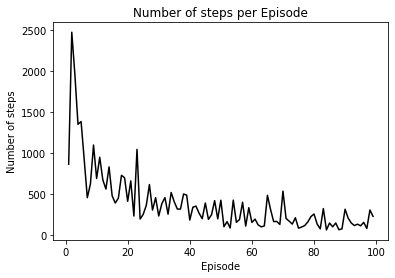

In [189]:
import numpy as np
import matplotlib.pyplot as plt

# Create data
x = [i for i in range(1,100)]
y = steps[1:100]
colors = (0,0,0)
#area = np.pi*3

# Plot
plt.plot(x, y, c=colors, alpha=1)
plt.title('Number of steps per Episode')
plt.xlabel('Episode')
plt.ylabel('Number of steps')
plt.show()

Text(0.5, 1.0, 'Walkplot (Sequence)')

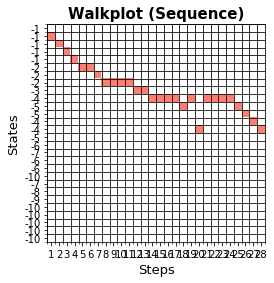

In [1018]:
import numpy as np
import matplotlib.colors as mlc
import matplotlib.pyplot as mlp

states = table_df["y"]
walk = table_df["x"]

states_len = len(states)
walk_len = len(walk)

img = np.zeros((states_len, walk_len), dtype=float)

for i, s in enumerate(walk):
    img[s, i] = 1.0

figure, ax = mlp.subplots()

color_map = mlc.LinearSegmentedColormap.from_list('ColorMap', [(1.000, 1.000, 1.000), (0.984, 0.501, 0.447)])
ax.imshow(img, cmap=color_map, interpolation='none')

ax.set_xlabel('Steps', fontsize=13)
ax.set_xticks(np.arange(0, walk_len, 1))
ax.set_xticks(np.arange(-0.5, walk_len, 1), minor=True)
ax.set_xticklabels(np.arange(1, walk_len + 1, 1))

ax.set_ylabel('States', fontsize=13)
ax.set_yticks(np.arange(0, states_len, 1))
ax.set_yticks(np.arange(-.5, states_len, 1), minor=True)
ax.set_yticklabels(states)

ax.grid(which='minor', color='k')

ax.set_title('Walkplot (Sequence)', fontsize=15, fontweight='bold')

## Final run after training

In [184]:
# Just run for a single iteration after training
%matplotlib inline
epoch=0
n_iter=1
#steps=[0]
solved=0
while epoch<n_iter:
    solved=0
    #step=0
    agent= {"x":1,"y":-1}
    table=[]
    table.append(agent.copy())
    action= ["Moved down"]
    while solved==0:
        rand1=random.random()
        rand2=random.random()
        agent=move_bi(agent,q_table, rand1, rand2,end_point,wall_points,table,greedy=0)

        if [agent["x"],agent["y"]] in wall_points:
            agent=hit_wall(agent,table)

        if agent["x"]>15:
            agent=hit_wall(agent,table)

        if agent["x"]<=0:
            agent=hit_wall(agent,table)

        if agent["y"]<-10:
            agent=hit_wall(agent,table)

        if agent["y"]>=0:
            agent=hit_wall(agent,table)

        if [agent["x"],agent["y"]] == end_point:
            #agent["reward"]=1
            print("solved")
            solved=1
            #break

        #else: agent["reward"]=-0.01

        table.append(agent.copy())
        Q_s_a=q_table[(q_table[1]==-table[-2]["y"]) & (q_table[0]==table[-2]["x"]) &(q_table[2]==action[-1])][3]

        #this needs to happen after the agent has moved and while updating the Q_value
        max_q_sa_next=q_table[(q_table[1]==-agent["y"] ) & (q_table[0]==agent["x"] )][3].max()

        #print(q_table[(q_table[0]==1)&(q_table[1]==1)])
        # Updating Q-values
        q_table[3][(q_table[1]==-table[-2]["y"]) & (q_table[0]==table[-2]["x"]) &(q_table[2]==action[-1])]=\
        Q_s_a + learning_rate*(rewards[-table[-1]["y"]-1][table[-1]["x"]-1] +(gamma* max_q_sa_next) - Q_s_a)
        
        step+=1
#         print(epoch)
#         print(agent)

    epoch+=1
    
    #steps.append(step)




Moved right
0
{'x': 2, 'y': -1}
Moved right
0
{'x': 3, 'y': -1}
Moved right
0
{'x': 4, 'y': -1}
Moved right
0
{'x': 5, 'y': -1}
Moved right
0
{'x': 6, 'y': -1}
Moved right
0
{'x': 7, 'y': -1}
Moved right
0
{'x': 8, 'y': -1}
Moved down
0
{'x': 8, 'y': -2}
Moved right
0
{'x': 9, 'y': -2}
Moved down
0
{'x': 9, 'y': -3}
Moved down
0
{'x': 9, 'y': -4}
Moved down
0
{'x': 9, 'y': -5}
Moved down
0
{'x': 9, 'y': -6}
Moved down
0
{'x': 9, 'y': -7}
Moved down
0
{'x': 9, 'y': -8}
Moved down
0
{'x': 9, 'y': -9}
Moved down
0
{'x': 9, 'y': -10}
Moved right
0
{'x': 10, 'y': -10}
Moved right
0
{'x': 11, 'y': -10}
Moved right
0
{'x': 12, 'y': -10}
Moved right
solved
0
{'x': 13, 'y': -10}


Text(0, 0.5, 'y-axis')

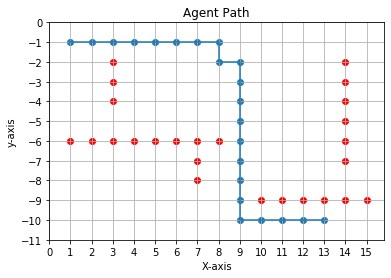

In [185]:
import matplotlib
matplotlib.pyplot.grid(b=True, which='major', axis='both')
matplotlib.pyplot.grid(b=True, which='minor', axis='both')
plt.scatter(pd.DataFrame(table)["x"],pd.DataFrame(table)["y"])
plt.plot(pd.DataFrame(table)["x"],pd.DataFrame(table)["y"])
plt.scatter(pd.DataFrame(wall_points)[0],pd.DataFrame(wall_points)[1],color='red')
plt.yticks([i for i in range(-11,1)])
plt.xticks([i for i in range(0,16)])

plt.title('Agent Path')
plt.xlabel('X-axis')
plt.ylabel('y-axis')

In [187]:
table_df=pd.DataFrame(table)
table_df["y"]=table_df["y"]*-1
table_df.to_csv(r"C:\Users\A101227\Desktop\sequence_3.csv")